Model_Article.ipynb可修改副本部分，将原先代码的保存文件全部搬至G盘，若没特别说明，默认运行环境为Project312

# 1 模型的训练、验证以及数据集生产

前置处理步骤见G:\Matlab\EX2025\Projection\P1_DataProcess的A1、A2、A3开头的m文件

## 1.1 (a)按照像元独立性划分训练集和测试集（这一步是绘制训练数据全球分布时的数据基础，请注意它可能与下面的代码划分方式有所不同）

In [ ]:
import pandas as pd
import numpy as np
import random
import os
from sklearn.model_selection import train_test_split
import warnings

warnings.filterwarnings('ignore')

# ======================
# 基本配置
# ======================
SEED = 42
random.seed(SEED)
np.random.seed(SEED)

DATA_FILE_PATH = r"G:\Matlab\EX2025\AuxiliaryData\LFMC-gridMean-ML.xlsx"
# 修改保存文件夹，与之前不同
SAVE_DIR = r"G:\文章\HUITU\dmwjbc\rawExp\PixelIndependent"
os.makedirs(SAVE_DIR, exist_ok=True)

# # 非植被类型阈值配置
# NON_VEGETATION_THRESHOLD = 0.05  # 5%


def load_and_preprocess_selected_data():
    """数据加载 + 清洗 + 特征工程（不划分）"""
    
    vod_columns = [
        'VOD_Ku_Hpol_Asc', 'VOD_Ku_Vpol_Asc',
        'VOD_X_Hpol_Asc', 'VOD_X_Vpol_Asc',
        'VOD_C_Hpol_Asc', 'VOD_C_Vpol_Asc'
    ]
    
    pft_columns = [
        'Grass_man', 'Grass_nat',
        'Shrub_bd', 'Shrub_be', 'Shrub_nd', 'Shrub_ne',
        'Tree_bd', 'Tree_be', 'Tree_nd', 'Tree_ne'
    ]
    
    feature_columns = vod_columns + ['LAI', 'Hveg'] + pft_columns
    
    # 添加空间坐标列
    required_columns = [
        'AGB', 'LFMCValue', 'SamplingDate',
        'LAI', 'Hveg', 'NoVegetation', 'RowVOD', 'ColVOD'
    ] + vod_columns + pft_columns
    
    df = pd.read_excel(DATA_FILE_PATH, usecols=required_columns)
    
    # 统一数值类型
    for col in df.columns:
        if col != 'SamplingDate':
            df[col] = pd.to_numeric(df[col], errors='coerce')
    
    df = df.dropna()
    
    print(f"初始样本数: {len(df)}")
    
    # # 过滤非植被占比≥5%的像元
    # df = df[df['NoVegetation'] < NON_VEGETATION_THRESHOLD]
    
    # print(f"过滤后样本数: {len(df)} (去除非植被占比≥{NON_VEGETATION_THRESHOLD*100}%的像元)")
    
    # 因变量
    df['VWC_sample'] = (df['AGB'] * df['LFMCValue']) / 1000
    df = df[df['VWC_sample'] <= 30]
    
    print(f"VWC样本限制后样本数: {len(df)}")
    
    # 数值精度处理：保留6位小数
    for col in df.select_dtypes(include=[np.number]).columns:
        df[col] = df[col].round(6)
    
    return df, feature_columns


def split_by_spatial_independence(df, test_size=0.333, random_state=SEED):
    """按空间独立性划分训练集和验证集
    
    参数:
    - df: 包含空间坐标(RowVOD, ColVOD)的数据框
    - test_size: 验证集比例
    - random_state: 随机种子
    
    返回:
    - train_df: 训练集数据框
    - val_df: 验证集数据框
    """
    
    # 获取唯一的空间像元
    unique_pixels = df[['RowVOD', 'ColVOD']].drop_duplicates()
    unique_pixels = unique_pixels.reset_index(drop=True)
    
    print(f"唯一空间像元数: {len(unique_pixels)}")
    
    # 划分像元（确保训练集和验证集像元完全不重合）
    train_pixels, val_pixels = train_test_split(
        unique_pixels,
        test_size=test_size,
        random_state=random_state,
        shuffle=True
    )
    
    print(f"训练集像元数: {len(train_pixels)}")
    print(f"验证集像元数: {len(val_pixels)}")
    
    # 创建像元标识符
    df['pixel_id'] = df['RowVOD'].astype(str) + '_' + df['ColVOD'].astype(str)
    train_pixels['pixel_id'] = train_pixels['RowVOD'].astype(str) + '_' + train_pixels['ColVOD'].astype(str)
    val_pixels['pixel_id'] = val_pixels['RowVOD'].astype(str) + '_' + val_pixels['ColVOD'].astype(str)
    
    # 根据像元标识符划分数据
    train_df = df[df['pixel_id'].isin(train_pixels['pixel_id'].values)]
    val_df = df[df['pixel_id'].isin(val_pixels['pixel_id'].values)]
    
    # 删除临时列
    train_df = train_df.drop(columns=['pixel_id'])
    val_df = val_df.drop(columns=['pixel_id'])
    
    return train_df, val_df, train_pixels, val_pixels


def spatial_split_and_save():
    """按空间独立性划分训练/验证集，并保存"""
    
    # 加载数据
    df, feature_columns = load_and_preprocess_selected_data()
    
    # 按空间独立性划分
    train_df, val_df, train_pixels, val_pixels = split_by_spatial_independence(
        df, test_size=0.3, random_state=SEED
    )
    
    # 重置索引并保存原始索引
    train_df = train_df.reset_index(drop=True).copy()
    val_df = val_df.reset_index(drop=True).copy()
    
    train_original_index = train_df.index.values
    val_original_index = val_df.index.values
    
    # 将原始索引作为列添加到数据框中
    train_df.insert(0, 'original_index', train_original_index)
    val_df.insert(0, 'original_index', val_original_index)
    
    # 准备最终的特征数据集（不包含空间坐标和非植被比例等辅助列）
    final_features = feature_columns + ['VWC_sample']
    
    # 提取用于训练的特征集
    train_final = train_df[final_features + ['original_index']]
    val_final = val_df[final_features + ['original_index']]
    
    # 保存划分结果
    train_path = os.path.join(SAVE_DIR, "train_dataset.csv")
    val_path = os.path.join(SAVE_DIR, "val_dataset.csv")
    
    train_final.to_csv(train_path, index=False)
    val_final.to_csv(val_path, index=False)
    
    # 保存像元划分信息
    train_pixels_path = os.path.join(SAVE_DIR, "train_pixels.csv")
    val_pixels_path = os.path.join(SAVE_DIR, "val_pixels.csv")
    
    train_pixels.to_csv(train_pixels_path, index=False)
    val_pixels.to_csv(val_pixels_path, index=False)
    
    # 保存完整的原始数据（包含空间坐标等信息）
    train_full_path = os.path.join(SAVE_DIR, "train_full_dataset.csv")
    val_full_path = os.path.join(SAVE_DIR, "val_full_dataset.csv")
    
    train_df.to_csv(train_full_path, index=False)
    val_df.to_csv(val_full_path, index=False)
    
    print("\n数据划分完成")
    print(f"训练集样本数: {len(train_df)} (来自 {len(train_pixels)} 个唯一像元)")
    print(f"验证集样本数: {len(val_df)} (来自 {len(val_pixels)} 个唯一像元)")
    print(f"数据已保存至: {SAVE_DIR}")
    
    # 打印统计信息
    print(f"\n训练集统计:")
    print(f"- 空间像元数: {len(train_pixels)}")
    print(f"- 样本总数: {len(train_df)}")
    print(f"- VWC_sample均值: {train_df['VWC_sample'].mean():.2f}")
    print(f"- VWC_sample范围: [{train_df['VWC_sample'].min():.2f}, {train_df['VWC_sample'].max():.2f}]")
    
    print(f"\n验证集统计:")
    print(f"- 空间像元数: {len(val_pixels)}")
    print(f"- 样本总数: {len(val_df)}")
    print(f"- VWC_sample均值: {val_df['VWC_sample'].mean():.2f}")
    print(f"- VWC_sample范围: [{val_df['VWC_sample'].min():.2f}, {val_df['VWC_sample'].max():.2f}]")
    
    # 检查空间独立性
    train_pixel_set = set(zip(train_pixels['RowVOD'], train_pixels['ColVOD']))
    val_pixel_set = set(zip(val_pixels['RowVOD'], val_pixels['ColVOD']))
    
    overlap = train_pixel_set.intersection(val_pixel_set)
    print(f"\n空间独立性检查:")
    print(f"- 训练集和验证集重叠像元数: {len(overlap)}")
    if len(overlap) == 0:
        print("- ✅ 训练集和验证集空间像元完全独立")
    else:
        print("- ⚠️ 训练集和验证集存在空间重叠")


if __name__ == "__main__":
    spatial_split_and_save()

## 1.1 (b)将(a)中处理的训练集/验证集的经纬度信息进行保存

In [ ]:
import pandas as pd
import numpy as np
import os
import warnings

warnings.filterwarnings('ignore')

# ======================
# 基本配置
# ======================
SAVE_DIR = r"G:\文章\HUITU\dmwjbc\rawExp\PixelIndependent"
os.makedirs(SAVE_DIR, exist_ok=True)

def calculate_lat_lon(row_vod, col_vod):
    """根据RowVOD和ColVOD计算中心经纬度"""
    lat_start = 89.95
    lon_start = -179.95
    
    # 直接使用公式计算，避免浮点数误差
    lat = lat_start - row_vod * 0.1
    lon = lon_start + col_vod * 0.1
    
    return lat, lon

def generate_pixel_csv_files():
    """生成训练集和验证集的经纬度CSV文件"""
    
    print("开始生成像元CSV文件...")
    
    # 定义文件路径
    train_csv_path = r"G:\文章\HUITU\dmwjbc\rawExp\PixelIndependent\train_full_dataset.csv"
    val_csv_path = r"G:\文章\HUITU\dmwjbc\rawExp\PixelIndependent\val_full_dataset.csv"
    
    # 检查文件是否存在
    if not os.path.exists(train_csv_path):
        print(f"错误: 训练集CSV文件不存在: {train_csv_path}")
        return
    
    if not os.path.exists(val_csv_path):
        print(f"错误: 验证集CSV文件不存在: {val_csv_path}")
        return
    
    # 读取数据
    train_df = pd.read_csv(train_csv_path)
    val_df = pd.read_csv(val_csv_path)
    
    print(f"训练集加载行数: {len(train_df)}")
    print(f"验证集加载行数: {len(val_df)}")
    
    # 确保RowVOD和ColVOD是整数
    for df in [train_df, val_df]:
        df['RowVOD'] = df['RowVOD'].astype(int)
        df['ColVOD'] = df['ColVOD'].astype(int)
    
    # 处理训练集
    train_pixels = train_df.groupby(['RowVOD', 'ColVOD']).size().reset_index(name='sample_count')
    train_pixels['latitude'] = 89.95 - train_pixels['RowVOD'] * 0.1
    train_pixels['longitude'] = -179.95 + train_pixels['ColVOD'] * 0.1
    
    # 处理验证集
    val_pixels = val_df.groupby(['RowVOD', 'ColVOD']).size().reset_index(name='sample_count')
    val_pixels['latitude'] = 89.95 - val_pixels['RowVOD'] * 0.1
    val_pixels['longitude'] = -179.95 + val_pixels['ColVOD'] * 0.1
    
    # 保存为CSV文件
    train_output_path = os.path.join(SAVE_DIR, "train_pixels.csv")
    val_output_path = os.path.join(SAVE_DIR, "val_pixels.csv")
    
    train_pixels.to_csv(train_output_path, index=False)
    val_pixels.to_csv(val_output_path, index=False)
    
    print(f"训练集像元CSV已保存: {train_output_path}")
    print(f"验证集像元CSV已保存: {val_output_path}")
    
    # 输出统计信息
    print(f"\n训练集统计:")
    print(f"  唯一像元数: {len(train_pixels)}")
    print(f"  总样本数: {train_pixels['sample_count'].sum()}")
    
    print(f"\n验证集统计:")
    print(f"  唯一像元数: {len(val_pixels)}")
    print(f"  总样本数: {val_pixels['sample_count'].sum()}")
    
    # 检查空间独立性
    train_set = set(zip(train_pixels['RowVOD'], train_pixels['ColVOD']))
    val_set = set(zip(val_pixels['RowVOD'], val_pixels['ColVOD']))
    overlap = len(train_set.intersection(val_set))
    
    print(f"\n空间独立性检查:")
    print(f"  重叠像元数: {overlap}")
    print("  ✅ 像元完全独立" if overlap == 0 else "  ⚠️ 存在重叠像元")
    
    return train_pixels, val_pixels

if __name__ == "__main__":
    train_pixels, val_pixels = generate_pixel_csv_files()
    print("\nCSV文件生成完成!")

## 1.1 (c)按照1.2的方式提取训练集和测试集，作为后续试验的基础，同时打印独立像元数，观察和1.1 (a)的区别

In [ ]:
import pandas as pd
import numpy as np
import random
import os
from sklearn.model_selection import train_test_split

# 设置随机种子保证可重复性
SEED = 42
random.seed(SEED)
np.random.seed(SEED)

# 全局文件路径常量
DATA_FILE_PATH = r"G:\Matlab\EX2025\AuxiliaryData\LFMC-gridMean-ML.xlsx"
SAVE_DIR = r"G:\文章\HUITU\dmwjbc\rawExp\Exp"

def load_data_with_location():
    """加载包含地理位置信息的数据"""
    print(f"加载数据集: {DATA_FILE_PATH}...")
    
    # 定义所有需要的列（包括地理位置列）
    vod_columns = [
        'VOD_Ku_Hpol_Asc', 'VOD_Ku_Vpol_Asc',
        'VOD_X_Hpol_Asc', 'VOD_X_Vpol_Asc',
        'VOD_C_Hpol_Asc', 'VOD_C_Vpol_Asc'
    ]
    
    pft_columns = [
        'Grass_man', 'Grass_nat',
        'Shrub_bd', 'Shrub_be', 'Shrub_nd', 'Shrub_ne',
        'Tree_bd', 'Tree_be', 'Tree_nd', 'Tree_ne'
    ]
    
    location_columns = ['RowVOD', 'ColVOD']  # 地理位置列
    
    required_columns = [
        'AGB', 'LFMCValue', 'SamplingDate',  # 用于计算目标变量
        'LAI', 'Hveg'  # 主要特征
    ] + vod_columns + pft_columns + location_columns
    
    # 读取数据
    df = pd.read_excel(DATA_FILE_PATH, usecols=required_columns)
    
    # 清洗并转换数据类型
    columns_to_convert = [col for col in df.columns if col != 'SamplingDate']
    
    for col in columns_to_convert:
        if df[col].dtype == 'object' or df[col].dtype.name == 'category':
            df[col] = (
                df[col]
                .astype(str)
                .str.strip()
                .str.replace(r"[^\d\.\-eE]", "", regex=True)
                .replace({"": np.nan})
            )
            df[col] = pd.to_numeric(df[col], errors='coerce')
        elif df[col].dtype != 'float64' and col not in ['RowVOD', 'ColVOD']:
            df[col] = df[col].astype('float64')
    
    # 检查缺失值
    if df.isnull().any().any():
        print("警告: 数据中存在缺失值，正在清理...")
        df = df.dropna()
        print(f"清理后样本数: {len(df)}")
    
    # 计算 VWC_sample
    df['VWC_sample'] = (df['AGB'] * df['LFMCValue']) / 1000
    df['VWC_sample'] = pd.to_numeric(df['VWC_sample'], errors='coerce')
    
    # 再次清理缺失值
    if df.isnull().any().any():
        print("警告: 类型转换后存在缺失值，正在清理...")
        df = df.dropna()
        print(f"清理后样本数: {len(df)}")
    
    # 过滤 VWC_sample
    df = df[df['VWC_sample'] <= 30]
    
    return df

def split_and_save_datasets():
    """按照原代码的划分方式划分数据集，并统计独立像元对"""
    
    # 1. 加载数据
    df = load_data_with_location()
    
    # 2. 定义特征列（与原代码一致）
    vod_columns = [
        'VOD_Ku_Hpol_Asc', 'VOD_Ku_Vpol_Asc',
        'VOD_X_Hpol_Asc', 'VOD_X_Vpol_Asc',
        'VOD_C_Hpol_Asc', 'VOD_C_Vpol_Asc'
    ]
    
    pft_columns = [
        'Grass_man', 'Grass_nat',
        'Shrub_bd', 'Shrub_be', 'Shrub_nd', 'Shrub_ne',
        'Tree_bd', 'Tree_be', 'Tree_nd', 'Tree_ne'
    ]
    
    feature_columns = vod_columns + ['LAI', 'Hveg'] + pft_columns
    available_features = [col for col in feature_columns if col in df]
    
    X = df[available_features]
    y = df['VWC_sample']
    
    # 3. 数据划分（与原代码完全一致）
    print("\n开始数据划分...")
    X_train, X_test, y_train, y_test, train_idx, test_idx = train_test_split(
        X, y, df.index,
        test_size=0.333,
        random_state=SEED,
        shuffle=True
    )
    
    # 4. 获取训练集和验证集的原始数据（包含地理位置信息）
    train_df = df.loc[train_idx].copy()
    test_df = df.loc[test_idx].copy()
    
    # 5. 统计独立像元对
    print("\n统计独立像元对...")
    
    # 训练集独立像元对
    train_unique_pixels = train_df[['RowVOD', 'ColVOD']].drop_duplicates()
    train_unique_count = len(train_unique_pixels)
    print(f"训练集独立像元对数: {train_unique_count}")
    
    # 验证集独立像元对
    test_unique_pixels = test_df[['RowVOD', 'ColVOD']].drop_duplicates()
    test_unique_count = len(test_unique_pixels)
    print(f"验证集独立像元对数: {test_unique_count}")
    
    # 检查是否有重叠的像元对
    train_pixel_set = set(zip(train_df['RowVOD'], train_df['ColVOD']))
    test_pixel_set = set(zip(test_df['RowVOD'], test_df['ColVOD']))
    overlap_pixels = train_pixel_set.intersection(test_pixel_set)
    print(f"训练集和验证集重叠的像元对数: {len(overlap_pixels)}")
    
    # 6. 保存数据集
    print("\n保存数据集...")
    os.makedirs(SAVE_DIR, exist_ok=True)
    
    # 保存训练集
    train_save_path = os.path.join(SAVE_DIR, "train_dataset.csv")
    train_df.to_csv(train_save_path, index=False)
    print(f"训练集已保存至: {train_save_path}")
    print(f"训练集样本数: {len(train_df)}")
    
    # 保存验证集
    test_save_path = os.path.join(SAVE_DIR, "test_dataset.csv")
    test_df.to_csv(test_save_path, index=False)
    print(f"验证集已保存至: {test_save_path}")
    print(f"验证集样本数: {len(test_df)}")
    
    # 7. 保存统计信息
    stats_df = pd.DataFrame({
        '数据集': ['训练集', '验证集'],
        '样本数': [len(train_df), len(test_df)],
        '独立像元对数': [train_unique_count, test_unique_count],
        '特征数量': [len(available_features), len(available_features)]
    })
    
    stats_save_path = os.path.join(SAVE_DIR, "dataset_statistics.csv")
    stats_df.to_csv(stats_save_path, index=False)
    print(f"\n数据集统计信息已保存至: {stats_save_path}")
    
    # 8. 保存独立像元对信息
    train_unique_pixels.to_csv(os.path.join(SAVE_DIR, "train_unique_pixels.csv"), index=False)
    test_unique_pixels.to_csv(os.path.join(SAVE_DIR, "test_unique_pixels.csv"), index=False)
    
    # 如果存在重叠像元，保存重叠信息
    if overlap_pixels:
        overlap_df = pd.DataFrame(list(overlap_pixels), columns=['RowVOD', 'ColVOD'])
        overlap_df.to_csv(os.path.join(SAVE_DIR, "overlap_pixels.csv"), index=False)
        print(f"重叠像元对信息已保存")
    
    return train_df, test_df, train_unique_count, test_unique_count

if __name__ == "__main__":
    print("="*80)
    print("开始执行数据划分和独立像元统计")
    print("="*80)
    
    train_df, test_df, train_unique_count, test_unique_count = split_and_save_datasets()
    
    print("\n" + "="*80)
    print("数据划分完成!")
    print(f"训练集: {len(train_df)} 个样本, {train_unique_count} 个独立像元对")
    print(f"验证集: {len(test_df)} 个样本, {test_unique_count} 个独立像元对")
    print(f"所有文件已保存至: {SAVE_DIR}")
    print("="*80)

## 1.1 (d) 新的处理策略，按照站点来（这个太复杂，暂不考虑）

## 1.2 模型训练

### 子实验1：我们默认的处理办法（6VOD+Hveg+LAI+PFT），使用CART的相关模型分别实现。这里的模型是目前后续实验使用的模型：输入18个参数以及像元化的站点数据进行训练。

#### 1.2.1.1 使用RF框架（这是我们后续实验默认使用的模型）

In [ ]:
import pandas as pd
import numpy as np
import time
import random
import os
import joblib
from datetime import datetime
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold, train_test_split
from sklearn.metrics import mean_squared_error, r2_score
import optuna
from optuna.samplers import TPESampler
import matplotlib.pyplot as plt
from matplotlib.font_manager import FontProperties
import warnings

# 忽略警告
warnings.filterwarnings('ignore')

# 设置随机种子保证可重复性
SEED = 42
random.seed(SEED)
np.random.seed(SEED)

# 全局文件路径常量
DATA_FILE_PATH = r"G:\Matlab\EX2025\AuxiliaryData\LFMC-gridMean-ML.xlsx"

def load_and_preprocess_selected_data():
    """数据加载函数 - 只选择6个VOD、LAI、Hveg和10个PFT特征，不进行归一化"""
    import pandas as pd
    import numpy as np
    import time

    print(f"加载数据集: {DATA_FILE_PATH}...")
    start_time = time.time()
    
    # 定义所有需要的列
    vod_columns = [
        'VOD_Ku_Hpol_Asc', 'VOD_Ku_Vpol_Asc',
        'VOD_X_Hpol_Asc', 'VOD_X_Vpol_Asc',
        'VOD_C_Hpol_Asc', 'VOD_C_Vpol_Asc'
    ]
    
    pft_columns = [
        'Grass_man', 'Grass_nat',
        'Shrub_bd', 'Shrub_be', 'Shrub_nd', 'Shrub_ne',
        'Tree_bd', 'Tree_be', 'Tree_nd', 'Tree_ne'
    ]
    
    required_columns = [
        'AGB', 'LFMCValue', 'SamplingDate',  # 用于计算目标变量
        'LAI', 'Hveg'  # 主要特征
    ] + vod_columns + pft_columns
    
    # 读取数据
    df = pd.read_excel(DATA_FILE_PATH, usecols=required_columns)
    
    # === 数据类型诊断 ===
    print("\n初始数据类型:")
    print(df.dtypes)
    
    # 确定需要转换为 float64 的列
    columns_to_convert = [col for col in df.columns if col != 'SamplingDate']
    
    # 清洗并转换为 float64
    for col in columns_to_convert:
        if df[col].dtype == 'object' or df[col].dtype.name == 'category':
            print(f"清洗并转换列: {col} (当前类型: {df[col].dtype}) 为 float64")
            # 转字符串，去掉空格、逗号、制表符等干扰字符
            df[col] = (
                df[col]
                .astype(str)
                .str.strip()
                .str.replace(r"[^\d\.\-eE]", "", regex=True)
                .replace({"": np.nan})
            )
            df[col] = pd.to_numeric(df[col], errors='coerce')
        elif df[col].dtype != 'float64':
            df[col] = df[col].astype('float64')
    
    # 检查缺失值
    if df.isnull().any().any():
        print("警告: 数据中存在缺失值，正在清理...")
        df = df.dropna()
        print(f"清理后样本数: {len(df)}")
    
    # 计算 VWC_sample
    df['VWC_sample'] = (df['AGB'] * df['LFMCValue']) / 1000
    df['VWC_sample'] = pd.to_numeric(df['VWC_sample'], errors='coerce')
    
    # 再次清理缺失值
    if df.isnull().any().any():
        print("警告: 类型转换后存在缺失值，正在清理...")
        df = df.dropna()
        print(f"清理后样本数: {len(df)}")
    
    # 过滤 VWC_sample
    df = df[df['VWC_sample'] <= 30]
    
    # 特征工程
    if 'SamplingDate' in df and pd.api.types.is_datetime64_any_dtype(df['SamplingDate']):
        df['Year_diff'] = df['SamplingDate'].dt.year.apply(lambda x: 2020 - x)
    else:
        print("警告: SamplingDate列不存在或不是日期类型，跳过年份差计算")
    
    # 定义特征列
    feature_columns = vod_columns + ['LAI', 'Hveg'] + pft_columns
    available_features = [col for col in feature_columns if col in df]
    missing_features = set(feature_columns) - set(available_features)
    
    if missing_features:
        print(f"警告: 以下特征不存在: {missing_features}")
    
    if not available_features:
        raise ValueError("错误: 没有找到任何特征列")
    
    X = df[available_features]
    y = df['VWC_sample']
    
    # 最终检查
    print("\n最终数据类型:")
    print(X.dtypes)
    print(f"目标变量类型: {y.dtype}")
    print(f"数据预处理完成, 耗时: {(time.time()-start_time)/60:.2f}分钟")
    print(f"使用特征: {len(available_features)}个 (6 VOD, 1 LAI, 1 Hveg, 10 PFT)")
    print(f"样本数量: {len(X)}")
    
    return X, y, df.index

def objective(trial, X_train, y_train):
    """贝叶斯优化目标函数"""
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 100, 1000, step=100),
        'max_features': trial.suggest_categorical('max_features', ['sqrt', 'log2']),
        'max_depth': trial.suggest_int('max_depth', 10, 50, step=10),
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 10),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 8),
        'bootstrap': trial.suggest_categorical('bootstrap', [True, False])
    }
    
    model = RandomForestRegressor(**params, random_state=SEED, n_jobs=-1)
    
    # 五折交叉验证
    kf = KFold(n_splits=5, shuffle=True, random_state=SEED)
    rmse_scores = []

    for train_idx, val_idx in kf.split(X_train):
        X_tr, X_val = X_train.iloc[train_idx], X_train.iloc[val_idx]
        y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[val_idx]
        
        model.fit(X_tr, y_tr)
        y_pred = model.predict(X_val)
        rmse = np.sqrt(mean_squared_error(y_val, y_pred))
        rmse_scores.append(rmse)
    
    return np.mean(rmse_scores)


def train_selected_model():
    """训练使用6 VOD + LAI + PFTs + Hveg的新模型"""
    print(f"\n{'='*80}")
    print("开始训练模型: 6 VOD + LAI + 10 PFTs + Hveg")
    print(f"{'='*80}\n")
    
    # 1. 数据加载与预处理（添加Hveg，去除归一化）
    X, y, processed_indices = load_and_preprocess_selected_data()
    
    # 2. 数据划分
    X_train, X_test, y_train, y_test, train_idx, test_idx = train_test_split(
        X, y, processed_indices,
        test_size=0.333,
        random_state=SEED,
        shuffle=True
    )
    
    print(f"训练集样本数: {len(X_train)}")
    print(f"测试集样本数: {len(X_test)}")
    
    # 3. 贝叶斯优化调参
    print("\n开始贝叶斯优化调参...")
    study = optuna.create_study(
        study_name="VWC_6VOD_LAI_PFTs_Hveg_Optimization",
        direction='minimize',
        sampler=TPESampler(seed=SEED)
    )
    
    study.optimize(lambda trial: objective(trial, X_train, y_train), 
                   n_trials=20)
    
    # 获取最佳参数
    best_params = study.best_params
    print("\n最佳参数组合:")
    for key, value in best_params.items():
        print(f"{key}: {value}")
    print(f"最佳验证RMSE: {study.best_value:.4f}")
    
    # 4. 使用最佳参数训练最终模型
    print("\n训练最终模型...")
    final_model = RandomForestRegressor(
        **best_params,
        random_state=SEED,
        n_jobs=-1
    )
    final_model.fit(X_train, y_train)
    
    # 5. 测试集评估
    print("\n测试集评估...")
    y_pred = final_model.predict(X_test)
    test_rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    test_r2 = r2_score(y_test, y_pred)
    print(f"测试集 RMSE: {test_rmse:.4f}")
    print(f"测试集 R²: {test_r2:.4f}")
    
    # 6. 保存模型（更新后缀）
    os.makedirs(r"models", exist_ok=True)
    model_path = r"G:\文章\HUITU\dmwjbc\rawExp\Exp\Primary\RF\models\RFR_6VOD_LAI_PFTs_Hveg.pkl"
    joblib.dump(final_model, model_path)
    print(f"模型已保存至: {model_path}")

if __name__ == "__main__":
    train_selected_model()
    print("\n" + "="*80 + "\n模型训练完成!\n" + "="*80)

#### 1.2.1.2 使用XGBoost
** 相比于1.2.1的修改，修改为调参空间和迭代次数

In [ ]:
import pandas as pd
import numpy as np
import time
import random
import os
import joblib
import warnings
import inspect

from sklearn.model_selection import KFold, train_test_split
from sklearn.metrics import mean_squared_error, r2_score

import optuna
from optuna.samplers import TPESampler
import matplotlib.pyplot as plt

import xgboost as xgb
from xgboost import XGBRegressor

warnings.filterwarnings('ignore')

SEED = 42
random.seed(SEED)
np.random.seed(SEED)

DATA_FILE_PATH = r"G:\Matlab\EX2025\AuxiliaryData\LFMC-gridMean-ML.xlsx"

TRIAL_RECORDS = []


def load_and_preprocess_selected_data():
    """数据加载函数 - 只选择6个VOD、LAI、Hveg和10个PFT特征，不进行归一化"""
    print(f"加载数据集: {DATA_FILE_PATH}...")
    start_time = time.time()

    vod_columns = [
        'VOD_Ku_Hpol_Asc', 'VOD_Ku_Vpol_Asc',
        'VOD_X_Hpol_Asc', 'VOD_X_Vpol_Asc',
        'VOD_C_Hpol_Asc', 'VOD_C_Vpol_Asc'
    ]

    pft_columns = [
        'Grass_man', 'Grass_nat',
        'Shrub_bd', 'Shrub_be', 'Shrub_nd', 'Shrub_ne',
        'Tree_bd', 'Tree_be', 'Tree_nd', 'Tree_ne'
    ]

    required_columns = [
        'AGB', 'LFMCValue', 'SamplingDate',
        'LAI', 'Hveg'
    ] + vod_columns + pft_columns

    df = pd.read_excel(DATA_FILE_PATH, usecols=required_columns)

    print("\n初始数据类型:")
    print(df.dtypes)

    columns_to_convert = [col for col in df.columns if col != 'SamplingDate']

    for col in columns_to_convert:
        if df[col].dtype == 'object' or df[col].dtype.name == 'category':
            print(f"清洗并转换列: {col} (当前类型: {df[col].dtype}) 为 float64")
            df[col] = (
                df[col]
                .astype(str)
                .str.strip()
                .str.replace(r"[^\d\.\-eE]", "", regex=True)
                .replace({"": np.nan})
            )
            df[col] = pd.to_numeric(df[col], errors='coerce')
        elif df[col].dtype != 'float64':
            df[col] = df[col].astype('float64')

    if df.isnull().any().any():
        print("警告: 数据中存在缺失值，正在清理...")
        df = df.dropna()
        print(f"清理后样本数: {len(df)}")

    df['VWC_sample'] = (df['AGB'] * df['LFMCValue']) / 1000
    df['VWC_sample'] = pd.to_numeric(df['VWC_sample'], errors='coerce')

    if df.isnull().any().any():
        print("警告: 类型转换后存在缺失值，正在清理...")
        df = df.dropna()
        print(f"清理后样本数: {len(df)}")

    df = df[df['VWC_sample'] <= 30]

    if 'SamplingDate' in df and pd.api.types.is_datetime64_any_dtype(df['SamplingDate']):
        df['Year_diff'] = df['SamplingDate'].dt.year.apply(lambda x: 2020 - x)
    else:
        print("警告: SamplingDate列不存在或不是日期类型，跳过年份差计算")

    feature_columns = vod_columns + ['LAI', 'Hveg'] + pft_columns
    available_features = [col for col in feature_columns if col in df]
    missing_features = set(feature_columns) - set(available_features)

    if missing_features:
        print(f"警告: 以下特征不存在: {missing_features}")

    if not available_features:
        raise ValueError("错误: 没有找到任何特征列")

    X = df[available_features]
    y = df['VWC_sample']

    print("\n最终数据类型:")
    print(X.dtypes)
    print(f"目标变量类型: {y.dtype}")
    print(f"数据预处理完成, 耗时: {(time.time()-start_time)/60:.2f}分钟")
    print(f"使用特征: {len(available_features)}个 (6 VOD, 1 LAI, 1 Hveg, 10 PFT)")
    print(f"样本数量: {len(X)}")

    return X, y, df.index


# ========= 关键：做一个“兼容不同 xgboost 版本”的 early stopping fit =========
def fit_with_early_stopping(model, X_tr, y_tr, X_val, y_val, rounds=100):
    fit_sig = inspect.signature(model.fit)
    kwargs = {"eval_set": [(X_val, y_val)], "verbose": False}

    # 情况1：新/常见版本支持 early_stopping_rounds
    if "early_stopping_rounds" in fit_sig.parameters:
        kwargs["early_stopping_rounds"] = rounds
        model.fit(X_tr, y_tr, **kwargs)
        return

    # 情况2：部分版本改用 callbacks
    if "callbacks" in fit_sig.parameters:
        kwargs["callbacks"] = [xgb.callback.EarlyStopping(rounds=rounds, save_best=True)]
        model.fit(X_tr, y_tr, **kwargs)
        return

    # 情况3：非常老的版本，不支持上述参数 -> 退化为无 early stopping
    model.fit(X_tr, y_tr, verbose=False)


def get_best_iteration(model, fallback_n_estimators):
    # 常见属性：best_iteration（0-based）
    bi = getattr(model, "best_iteration", None)
    if bi is not None:
        return int(bi)

    # 有些版本可能提供 best_ntree_limit（树数量）
    btl = getattr(model, "best_ntree_limit", None)
    if btl is not None:
        return int(btl) - 1

    # 再不行就用满树数
    return int(fallback_n_estimators) - 1


def predict_with_best_iter(model, X, best_iter):
    pred_sig = inspect.signature(model.predict)

    # 新接口（很多版本都有）
    if "iteration_range" in pred_sig.parameters:
        return model.predict(X, iteration_range=(0, best_iter + 1))

    # 老接口
    if "ntree_limit" in pred_sig.parameters:
        return model.predict(X, ntree_limit=best_iter + 1)

    # 最后兜底：不用迭代控制
    return model.predict(X)


def objective(trial, X_train, y_train):
    """Optuna 目标函数：训练集内 5折CV，返回 mean RMSE"""

    params = {
        "n_estimators": trial.suggest_int("n_estimators", 100, 3000, step=50),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.3, log=True),

        "max_depth": trial.suggest_int("max_depth", 3, 10),
        "min_child_weight": trial.suggest_float("min_child_weight", 0.1, 20.0, log=True),
        "gamma": trial.suggest_float("gamma", 0.0, 5.0),

        "subsample": trial.suggest_float("subsample", 0.5, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.5, 1.0),

        "reg_alpha": trial.suggest_float("reg_alpha", 1e-8, 10.0, log=True),
        "reg_lambda": trial.suggest_float("reg_lambda", 1e-8, 50.0, log=True),

        "objective": "reg:squarederror",
        "eval_metric": "rmse",
        "random_state": SEED,
        "n_jobs": -1,
        "tree_method": "hist",
    }

    kf = KFold(n_splits=5, shuffle=True, random_state=SEED)

    rmse_scores = []
    best_iters = []

    t0 = time.time()

    for train_idx, val_idx in kf.split(X_train):
        X_tr, X_val = X_train.iloc[train_idx], X_train.iloc[val_idx]
        y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[val_idx]

        model = XGBRegressor(**params)

        # ✅ 修复点：用兼容函数 fit（自动决定 early stopping 写法）
        fit_with_early_stopping(model, X_tr, y_tr, X_val, y_val, rounds=100)

        bi = get_best_iteration(model, fallback_n_estimators=params["n_estimators"])
        best_iters.append(bi)

        # ✅ 修复点：predict 也做版本兼容
        y_pred = predict_with_best_iter(model, X_val, bi)
        rmse = float(np.sqrt(mean_squared_error(y_val, y_pred)))
        rmse_scores.append(rmse)

    mean_rmse = float(np.mean(rmse_scores))
    std_rmse = float(np.std(rmse_scores))
    mean_bi = float(np.mean(best_iters))
    std_bi = float(np.std(best_iters))
    duration = float(time.time() - t0)

    trial.set_user_attr("rmse_scores", rmse_scores)
    trial.set_user_attr("best_iterations", best_iters)
    trial.set_user_attr("std_rmse", std_rmse)
    trial.set_user_attr("mean_best_iteration", mean_bi)
    trial.set_user_attr("std_best_iteration", std_bi)
    trial.set_user_attr("duration_sec", duration)

    return mean_rmse


def trial_logger_callback(study, trial):
    rec = {
        "trial_number": trial.number,
        "value_mean_rmse": trial.value,
        "value_std_rmse": trial.user_attrs.get("std_rmse", np.nan),
        "mean_best_iteration": trial.user_attrs.get("mean_best_iteration", np.nan),
        "std_best_iteration": trial.user_attrs.get("std_best_iteration", np.nan),
        "duration_sec": trial.user_attrs.get("duration_sec", np.nan),
    }
    for k, v in trial.params.items():
        rec[f"param_{k}"] = v
    TRIAL_RECORDS.append(rec)


def save_trial_artifacts(study, out_dir):
    os.makedirs(out_dir, exist_ok=True)

    df_rec = pd.DataFrame(TRIAL_RECORDS)
    rec_path = os.path.join(out_dir, "trial_records.csv")
    df_rec.to_csv(rec_path, index=False, encoding="utf-8-sig")

    df_full = study.trials_dataframe(attrs=("number", "value", "params", "user_attrs", "state"))
    full_path = os.path.join(out_dir, "trials_full.csv")
    df_full.to_csv(full_path, index=False, encoding="utf-8-sig")

    try:
        import optuna.visualization.matplotlib as ovm

        fig1 = ovm.plot_optimization_history(study)
        fig1.figure.savefig(os.path.join(out_dir, "optuna_history.png"), dpi=200, bbox_inches="tight")
        plt.close(fig1.figure)

        fig2 = ovm.plot_param_importances(study)
        fig2.figure.savefig(os.path.join(out_dir, "optuna_param_importance.png"), dpi=200, bbox_inches="tight")
        plt.close(fig2.figure)

        fig3 = ovm.plot_edf(study)
        fig3.figure.savefig(os.path.join(out_dir, "optuna_edf.png"), dpi=200, bbox_inches="tight")
        plt.close(fig3.figure)

    except Exception as e:
        print(f"绘图失败（可忽略）：{e}")

    print(f"\nTrial记录已保存:\n- {rec_path}\n- {full_path}\n- PNG图已输出到: {out_dir}")


def train_selected_model():
    print(f"\n{'='*80}")
    print("开始训练模型: 6 VOD + LAI + 10 PFTs + Hveg （XGB：外层Val最终评估；训练流程对齐RF；兼容不同xgboost版本）")
    print(f"{'='*80}\n")

    X, y, processed_indices = load_and_preprocess_selected_data()

    # ✅ 外层 2:1 划分：外层Val只做最终评估
    X_train, X_val_outer, y_train, y_val_outer, train_idx, val_idx = train_test_split(
        X, y, processed_indices,
        test_size=0.333,
        random_state=SEED,
        shuffle=True
    )

    print(f"训练集样本数: {len(X_train)}")
    print(f"外层验证集(最终评估用)样本数: {len(X_val_outer)}")

    print("\n开始贝叶斯优化调参（仅用训练集做5折CV）...")
    study = optuna.create_study(
        study_name="VWC_6VOD_LAI_PFTs_Hveg_XGB_Optimization",
        direction='minimize',
        sampler=TPESampler(seed=SEED)
    )

    study.optimize(
        lambda trial: objective(trial, X_train, y_train),
        n_trials=20,
        callbacks=[trial_logger_callback]
    )

    best_params = study.best_params
    best_trial = study.best_trial

    print("\n最佳参数组合:")
    for k, v in best_params.items():
        print(f"{k}: {v}")
    print(f"最佳验证RMSE(5-fold mean on TRAIN): {study.best_value:.4f}")

    out_dir = r"G:\文章\HUITU\dmwjbc\rawExp\Exp\Primary\XGB"
    save_trial_artifacts(study, out_dir)

    # ✅ 训练流程对齐 RF：最终训练不再用 early stopping / 不切内部验证集
    mean_bi = best_trial.user_attrs.get("mean_best_iteration", None)
    if mean_bi is None or np.isnan(mean_bi):
        best_n_estimators = 1000
        print("\n警告：best_trial 未记录 mean_best_iteration，best_n_estimators 兜底为 1000")
    else:
        best_n_estimators = int(round(mean_bi)) + 1
        best_n_estimators = max(50, min(best_n_estimators, 5000))

    print(f"\n用于最终训练的 best_n_estimators(来自CV mean_best_iteration): {best_n_estimators}")

    final_params = dict(best_params)
    final_params.update({
        "n_estimators": best_n_estimators,
        "objective": "reg:squarederror",
        "eval_metric": "rmse",
        "random_state": SEED,
        "n_jobs": -1,
        "tree_method": "hist"
    })

    print("\n训练最终模型（对齐RF：用整个训练集 fit，不做 early stopping）...")
    final_model = XGBRegressor(**final_params)
    final_model.fit(X_train, y_train)

    # ✅ 外层 Val 最终评估
    print("\n外层验证集(最终评估)评估...")
    y_pred = final_model.predict(X_val_outer)
    val_rmse = np.sqrt(mean_squared_error(y_val_outer, y_pred))
    val_r2 = r2_score(y_val_outer, y_pred)
    print(f"外层验证集 RMSE: {val_rmse:.4f}")
    print(f"外层验证集 R²: {val_r2:.4f}")

    model_path = r"G:\文章\HUITU\dmwjbc\rawExp\Exp\Primary\XGB\models\XGB_6VOD_LAI_PFTs_Hveg.pkl"
    os.makedirs(os.path.dirname(model_path), exist_ok=True)
    joblib.dump(final_model, model_path)
    print(f"模型已保存至: {model_path}")


if __name__ == "__main__":
    train_selected_model()
    print("\n" + "="*80 + "\n模型训练完成!\n" + "="*80)


#### 1.2.1.3 使用LGBM

In [ ]:
import pandas as pd
import numpy as np
import time
import random
import os
import joblib
import warnings
import inspect

from sklearn.model_selection import KFold, train_test_split
from sklearn.metrics import mean_squared_error, r2_score

import optuna
from optuna.samplers import TPESampler

# LightGBM
from lightgbm import LGBMRegressor

warnings.filterwarnings('ignore')

SEED = 42
random.seed(SEED)
np.random.seed(SEED)

DATA_FILE_PATH = r"G:\Matlab\EX2025\AuxiliaryData\LFMC-gridMean-ML.xlsx"


def load_and_preprocess_selected_data():
    """数据加载函数 - 只选择6个VOD、LAI、Hveg和10个PFT特征，不进行归一化（对齐RF版本）"""
    print(f"加载数据集: {DATA_FILE_PATH}...")
    start_time = time.time()

    vod_columns = [
        'VOD_Ku_Hpol_Asc', 'VOD_Ku_Vpol_Asc',
        'VOD_X_Hpol_Asc', 'VOD_X_Vpol_Asc',
        'VOD_C_Hpol_Asc', 'VOD_C_Vpol_Asc'
    ]

    pft_columns = [
        'Grass_man', 'Grass_nat',
        'Shrub_bd', 'Shrub_be', 'Shrub_nd', 'Shrub_ne',
        'Tree_bd', 'Tree_be', 'Tree_nd', 'Tree_ne'
    ]

    required_columns = [
        'AGB', 'LFMCValue', 'SamplingDate',
        'LAI', 'Hveg'
    ] + vod_columns + pft_columns

    df = pd.read_excel(DATA_FILE_PATH, usecols=required_columns)

    print("\n初始数据类型:")
    print(df.dtypes)

    columns_to_convert = [col for col in df.columns if col != 'SamplingDate']

    for col in columns_to_convert:
        if df[col].dtype == 'object' or df[col].dtype.name == 'category':
            print(f"清洗并转换列: {col} (当前类型: {df[col].dtype}) 为 float64")
            df[col] = (
                df[col]
                .astype(str)
                .str.strip()
                .str.replace(r"[^\d\.\-eE]", "", regex=True)
                .replace({"": np.nan})
            )
            df[col] = pd.to_numeric(df[col], errors='coerce')
        elif df[col].dtype != 'float64':
            df[col] = df[col].astype('float64')

    if df.isnull().any().any():
        print("警告: 数据中存在缺失值，正在清理...")
        df = df.dropna()
        print(f"清理后样本数: {len(df)}")

    df['VWC_sample'] = (df['AGB'] * df['LFMCValue']) / 1000
    df['VWC_sample'] = pd.to_numeric(df['VWC_sample'], errors='coerce')

    if df.isnull().any().any():
        print("警告: 类型转换后存在缺失值，正在清理...")
        df = df.dropna()
        print(f"清理后样本数: {len(df)}")

    df = df[df['VWC_sample'] <= 30]

    # 和RF一致：算了 Year_diff 但不作为特征（保持原逻辑）
    if 'SamplingDate' in df and pd.api.types.is_datetime64_any_dtype(df['SamplingDate']):
        df['Year_diff'] = df['SamplingDate'].dt.year.apply(lambda x: 2020 - x)
    else:
        print("警告: SamplingDate列不存在或不是日期类型，跳过年份差计算")

    feature_columns = vod_columns + ['LAI', 'Hveg'] + pft_columns
    available_features = [col for col in feature_columns if col in df]
    missing_features = set(feature_columns) - set(available_features)

    if missing_features:
        print(f"警告: 以下特征不存在: {missing_features}")

    if not available_features:
        raise ValueError("错误: 没有找到任何特征列")

    X = df[available_features]
    y = df['VWC_sample']

    print("\n最终数据类型:")
    print(X.dtypes)
    print(f"目标变量类型: {y.dtype}")
    print(f"数据预处理完成, 耗时: {(time.time()-start_time)/60:.2f}分钟")
    print(f"使用特征: {len(available_features)}个 (6 VOD, 1 LAI, 1 Hveg, 10 PFT)")
    print(f"样本数量: {len(X)}")

    return X, y, df.index


def maybe_add_verbose_eval(params: dict, value: int = -1) -> dict:
    """
    按你的要求：优先添加 verbose_eval=-1；
    但如果当前 LGBMRegressor 不支持该参数，则不添加（避免超参数优化报错）。
    同时保留更通用的 verbosity=-1 作为静默设置。
    """
    sig = inspect.signature(LGBMRegressor.__init__)
    if "verbose_eval" in sig.parameters:
        params["verbose_eval"] = value
    return params


def objective(trial, X_train, y_train):
    """Optuna 目标函数：LightGBM + 5折CV，返回 mean RMSE（对齐RF：无early stopping）"""

    # === 在我的建议基础上：减少“无法分裂”的 trial 组合 ===
    params = {
        "n_estimators": trial.suggest_int("n_estimators", 100, 1000, step=100),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.2, log=True),

        # 收紧范围 + 避免 max_depth 太小导致树难生长
        "num_leaves": trial.suggest_int("num_leaves", 16, 128, step=16),
        "max_depth": trial.suggest_int("max_depth", 3, 16),

        # 放宽一些（避免分裂门槛过严）
        "min_child_samples": trial.suggest_int("min_child_samples", 5, 60, step=5),

        # 采样（建议加 subsample_freq 确保行采样生效）
        "subsample": trial.suggest_float("subsample", 0.7, 1.0),
        "subsample_freq": 1,
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.7, 1.0),

        # 关键：保证更容易出现“合法分裂”
        "min_split_gain": 0.0,
        "min_child_weight": 1e-3,

        # 第一阶段先固定正则，避免 Optuna 采到极端正则导致 best gain=-inf
        "reg_alpha": 0.0,
        "reg_lambda": 0.0,

        # LightGBM 基本设置
        "random_state": SEED,
        "n_jobs": -1,
        "boosting_type": "gbdt",
        "objective": "regression",

        # 你之前加的
        "force_col_wise": True,

        # 静默：sklearn API 最通用
        "verbosity": -1,
    }

    # ✅ 按你的要求：尝试添加 verbose_eval=-1；若不支持则不加（避免报错）
    params = maybe_add_verbose_eval(params, value=-1)

    kf = KFold(n_splits=5, shuffle=True, random_state=SEED)
    rmse_scores = []

    for train_idx, val_idx in kf.split(X_train):
        X_tr, X_val = X_train.iloc[train_idx], X_train.iloc[val_idx]
        y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[val_idx]

        model = LGBMRegressor(**params)

        # 对齐RF：直接fit，不使用early stopping
        model.fit(X_tr, y_tr)

        y_pred = model.predict(X_val)
        rmse = float(np.sqrt(mean_squared_error(y_val, y_pred)))
        rmse_scores.append(rmse)

    return float(np.mean(rmse_scores))


def train_selected_model():
    """训练使用6 VOD + LAI + 10 PFTs + Hveg 的 LightGBM 模型（流程对齐RF）"""
    print(f"\n{'='*80}")
    print("开始训练模型: 6 VOD + LAI + 10 PFTs + Hveg （LightGBM，对齐RF流程）")
    print(f"{'='*80}\n")

    X, y, processed_indices = load_and_preprocess_selected_data()

    # 对齐RF：2:1（test_size=0.333）划分
    X_train, X_test, y_train, y_test, train_idx, test_idx = train_test_split(
        X, y, processed_indices,
        test_size=0.333,
        random_state=SEED,
        shuffle=True
    )

    print(f"训练集样本数: {len(X_train)}")
    print(f"测试集样本数: {len(X_test)}")

    print("\n开始贝叶斯优化调参（Optuna-TPE）...")
    study = optuna.create_study(
        study_name="VWC_6VOD_LAI_PFTs_Hveg_LGBM_Optimization",
        direction="minimize",
        sampler=TPESampler(seed=SEED)
    )

    study.optimize(lambda trial: objective(trial, X_train, y_train), n_trials=20)

    best_params = study.best_params
    print("\n最佳参数组合:")
    for k, v in best_params.items():
        print(f"{k}: {v}")
    print(f"最佳验证RMSE(5-fold mean): {study.best_value:.4f}")

    print("\n训练最终模型...")

    # 最终模型同样“尽量静默”，并按你的要求尝试 verbose_eval=-1
    final_params = dict(best_params)
    final_params.update({
        "random_state": SEED,
        "n_jobs": -1,
        "boosting_type": "gbdt",
        "objective": "regression",
        "force_col_wise": True,
        "verbosity": -1,
    })
    final_params = maybe_add_verbose_eval(final_params, value=-1)

    final_model = LGBMRegressor(**final_params)
    final_model.fit(X_train, y_train)

    print("\n测试集评估...")
    y_pred = final_model.predict(X_test)
    test_rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    test_r2 = r2_score(y_test, y_pred)
    print(f"测试集 RMSE: {test_rmse:.4f}")
    print(f"测试集 R²: {test_r2:.4f}")

    # 保存模型
    model_path = r"G:\文章\HUITU\dmwjbc\rawExp\Exp\Primary\LGB\models\LGBM_6VOD_LAI_PFTs_Hveg.pkl"
    os.makedirs(os.path.dirname(model_path), exist_ok=True)
    joblib.dump(final_model, model_path)
    print(f"模型已保存至: {model_path}")


if __name__ == "__main__":
    train_selected_model()
    print("\n" + "="*80 + "\n模型训练完成!\n" + "="*80)


#### 1.2.1.4 使用GBDT （不再在文中写出，因为上述LGBM的原理和GBDT相同）
使用HistGradientBoostingRegressor加速

In [ ]:
import pandas as pd
import numpy as np
import time
import random
import os
import joblib
import warnings

from sklearn.model_selection import KFold, train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.ensemble import HistGradientBoostingRegressor

import optuna
from optuna.samplers import TPESampler

warnings.filterwarnings("ignore")

SEED = 42
random.seed(SEED)
np.random.seed(SEED)

DATA_FILE_PATH = r"G:\Matlab\EX2025\AuxiliaryData\LFMC-gridMean-ML.xlsx"


def load_and_preprocess_selected_data():
    """数据加载函数 - 只选择6个VOD、LAI、Hveg和10个PFT特征，不进行归一化（对齐RF版本）"""
    print(f"加载数据集: {DATA_FILE_PATH}...")
    start_time = time.time()

    vod_columns = [
        "VOD_Ku_Hpol_Asc", "VOD_Ku_Vpol_Asc",
        "VOD_X_Hpol_Asc",  "VOD_X_Vpol_Asc",
        "VOD_C_Hpol_Asc",  "VOD_C_Vpol_Asc"
    ]

    pft_columns = [
        "Grass_man", "Grass_nat",
        "Shrub_bd", "Shrub_be", "Shrub_nd", "Shrub_ne",
        "Tree_bd", "Tree_be", "Tree_nd", "Tree_ne"
    ]

    required_columns = [
        "AGB", "LFMCValue", "SamplingDate",
        "LAI", "Hveg"
    ] + vod_columns + pft_columns

    df = pd.read_excel(DATA_FILE_PATH, usecols=required_columns)

    print("\n初始数据类型:")
    print(df.dtypes)

    columns_to_convert = [col for col in df.columns if col != "SamplingDate"]
    for col in columns_to_convert:
        if df[col].dtype == "object" or df[col].dtype.name == "category":
            print(f"清洗并转换列: {col} (当前类型: {df[col].dtype}) 为 float64")
            df[col] = (
                df[col].astype(str)
                .str.strip()
                .str.replace(r"[^\d\.\-eE]", "", regex=True)
                .replace({"": np.nan})
            )
            df[col] = pd.to_numeric(df[col], errors="coerce")
        elif df[col].dtype != "float64":
            df[col] = df[col].astype("float64")

    if df.isnull().any().any():
        print("警告: 数据中存在缺失值，正在清理...")
        before = len(df)
        df = df.dropna()
        print(f"清理后样本数: {before} -> {len(df)}")

    df["VWC_sample"] = (df["AGB"] * df["LFMCValue"]) / 1000.0
    df["VWC_sample"] = pd.to_numeric(df["VWC_sample"], errors="coerce")

    if df.isnull().any().any():
        print("警告: 类型转换后存在缺失值，正在清理...")
        before = len(df)
        df = df.dropna()
        print(f"清理后样本数: {before} -> {len(df)}")

    before = len(df)
    df = df[df["VWC_sample"] <= 30]
    print(f"过滤 VWC_sample<=30: {before} -> {len(df)}")

    if "SamplingDate" in df and pd.api.types.is_datetime64_any_dtype(df["SamplingDate"]):
        df["Year_diff"] = df["SamplingDate"].dt.year.apply(lambda x: 2020 - x)
    else:
        print("警告: SamplingDate列不存在或不是日期类型，跳过年份差计算")

    feature_columns = vod_columns + ["LAI", "Hveg"] + pft_columns
    available_features = [col for col in feature_columns if col in df]
    missing_features = set(feature_columns) - set(available_features)
    if missing_features:
        print(f"警告: 以下特征不存在: {missing_features}")
    if not available_features:
        raise ValueError("错误: 没有找到任何特征列")

    X = df[available_features]
    y = df["VWC_sample"]

    # ✅ 加速小技巧：转 float32（直方图模型通常足够）
    X = X.astype(np.float32)
    y = y.astype(np.float32)

    print(f"\n数据预处理完成, 耗时: {(time.time()-start_time)/60:.2f}分钟")
    print(f"使用特征: {len(available_features)}个 (6 VOD, 1 LAI, 1 Hveg, 10 PFT)")
    print(f"样本数量: {len(X)}")

    return X, y, df.index


def objective(trial, X_train, y_train):
    """
    HistGradientBoostingRegressor：直方图加速 + early stopping
    目标：跑得接近 LGBM/XGB 的速度，同时搜索空间尽量对应 GBDT 关键维度
    """

    loss = trial.suggest_categorical("loss", ["squared_error", "absolute_error", "huber"])

    params = {
        # 类似 n_estimators：这里叫 max_iter
        "max_iter": trial.suggest_int("max_iter", 200, 3000, step=100),

        "learning_rate": trial.suggest_float("learning_rate", 0.02, 0.3, log=True),

        # 树结构（对应深度/叶子）
        "max_depth": trial.suggest_int("max_depth", 2, 10),
        "max_leaf_nodes": trial.suggest_int("max_leaf_nodes", 15, 255, step=16),

        # 叶子最小样本
        "min_samples_leaf": trial.suggest_int("min_samples_leaf", 5, 80, step=5),

        # 正则（对应叶子权重惩罚）
        "l2_regularization": trial.suggest_float("l2_regularization", 1e-8, 10.0, log=True),

        # 直方图桶数（越大越慢，默认 255；收紧能更快）
        "max_bins": trial.suggest_int("max_bins", 64, 255, step=32),

        # 鲁棒损失
        "loss": loss,

        "random_state": SEED,
    }

    if loss == "huber":
        params["quantile"] = trial.suggest_float("quantile", 0.90, 0.98)
    elif loss == "absolute_error":
        # absolute_error 需要更强的平滑/更稳，一般不要太极端
        params["quantile"] = 0.5
    else:
        params["quantile"] = 0.5

    # ✅ early stopping（每折内部自动切 validation_fraction）
    # 这会极大减少“无谓训练到 max_iter”的时间
    params.update({
        "early_stopping": True,
        "validation_fraction": 0.1,
        "n_iter_no_change": 50,
        "tol": 1e-7,
    })

    kf = KFold(n_splits=5, shuffle=True, random_state=SEED)
    rmses = []
    best_iters = []

    for tr_idx, val_idx in kf.split(X_train):
        X_tr, X_val = X_train.iloc[tr_idx], X_train.iloc[val_idx]
        y_tr, y_val = y_train.iloc[tr_idx], y_train.iloc[val_idx]

        model = HistGradientBoostingRegressor(**params)
        model.fit(X_tr, y_tr)

        # 记录该折使用的有效迭代轮数（early stop 后）
        # sklearn 通常提供 n_iter_ 属性
        n_iter_used = getattr(model, "n_iter_", params["max_iter"])
        best_iters.append(int(n_iter_used))

        y_pred = model.predict(X_val)
        rmse = float(np.sqrt(mean_squared_error(y_val, y_pred)))
        rmses.append(rmse)

    trial.set_user_attr("mean_best_iter", float(np.mean(best_iters)))
    return float(np.mean(rmses))


def train_selected_model():
    print(f"\n{'='*80}")
    print("开始训练模型: 6 VOD + LAI + 10 PFTs + Hveg （更快GBDT：HistGradientBoosting，对齐RF划分）")
    print(f"{'='*80}\n")

    X, y, processed_indices = load_and_preprocess_selected_data()

    # 对齐RF：2:1（test_size=0.333）划分
    X_train, X_test, y_train, y_test, train_idx, test_idx = train_test_split(
        X, y, processed_indices,
        test_size=0.333,
        random_state=SEED,
        shuffle=True
    )

    print(f"训练集样本数: {len(X_train)}")
    print(f"测试集样本数: {len(X_test)}")

    print("\n开始贝叶斯优化调参（Optuna-TPE）...")
    study = optuna.create_study(
        study_name="VWC_6VOD_LAI_PFTs_Hveg_HGBR_Optimization",
        direction="minimize",
        sampler=TPESampler(seed=SEED)
    )

    study.optimize(lambda trial: objective(trial, X_train, y_train), n_trials=20)

    best_params = study.best_params
    best_trial = study.best_trial

    print("\n最佳参数组合:")
    for k, v in best_params.items():
        print(f"{k}: {v}")
    print(f"最佳验证RMSE(5-fold mean): {study.best_value:.4f}")

    # ✅ 最终训练：对齐RF风格（不用 early stopping）
    # 用 CV 统计的 mean_best_iter 作为 max_iter，更快也更稳
    mean_best_iter = best_trial.user_attrs.get("mean_best_iter", None)
    if mean_best_iter is None or np.isnan(mean_best_iter):
        final_max_iter = int(best_params.get("max_iter", 800))
        print("警告：未记录 mean_best_iter，final_max_iter 使用 best_params['max_iter']")
    else:
        final_max_iter = int(round(mean_best_iter))
        final_max_iter = max(50, min(final_max_iter, 5000))

    print(f"\n用于最终训练的 max_iter(来自CV mean_best_iter): {final_max_iter}")

    final_params = dict(best_params)
    final_params["max_iter"] = final_max_iter

    # 最终fit：不 early stopping（对齐RF：不再切内部验证）
    final_params.update({
        "early_stopping": False,
        "random_state": SEED,
    })

    final_model = HistGradientBoostingRegressor(**final_params)
    final_model.fit(X_train, y_train)

    print("\n测试集评估...")
    y_pred = final_model.predict(X_test)
    test_rmse = float(np.sqrt(mean_squared_error(y_test, y_pred)))
    test_r2 = float(r2_score(y_test, y_pred))
    print(f"测试集 RMSE: {test_rmse:.4f}")
    print(f"测试集 R²: {test_r2:.4f}")

    model_path = r"G:\文章\HUITU\dmwjbc\rawExp\Exp\Primary\GBDT\models\HGBR_6VOD_LAI_PFTs_Hveg.pkl"
    os.makedirs(os.path.dirname(model_path), exist_ok=True)
    joblib.dump(final_model, model_path)
    print(f"模型已保存至: {model_path}")


if __name__ == "__main__":
    train_selected_model()
    print("\n" + "="*80 + "\n模型训练完成!\n" + "="*80)


### 子实验2：VOD的消融实验
单频段：C/X/Ku - H/V/H+V
多频段：C+X/C+Ku/X+Ku/C+X+Ku - H+V


#### 1.2.2.1 RF框架

In [ ]:
import pandas as pd
import numpy as np
import time
import random
import os
import joblib
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold, train_test_split
from sklearn.metrics import mean_squared_error, r2_score
import optuna
from optuna.samplers import TPESampler
import warnings

warnings.filterwarnings("ignore")

# =========================
# 全局配置
# =========================
SEED = 42
random.seed(SEED)
np.random.seed(SEED)

DATA_FILE_PATH = r"G:\Matlab\EX2025\AuxiliaryData\LFMC-gridMean-ML.xlsx"

# 与你原来保存模型的文件夹保持一致
MODEL_DIR = r"G:\文章\HUITU\dmwjbc\rawExp\Exp\Primary\RF\models"
os.makedirs(MODEL_DIR, exist_ok=True)

# Optuna 试验次数
N_TRIALS = 20

# ✅ 按你的要求：保持其他输入特征不变（LAI、Hveg、PFT），每个子实验只变 VOD 组合
INCLUDE_AUX_FEATURES = True


# =========================
# 特征列定义
# =========================
VOD_ALL_COLUMNS = [
    "VOD_Ku_Hpol_Asc", "VOD_Ku_Vpol_Asc",
    "VOD_X_Hpol_Asc",  "VOD_X_Vpol_Asc",
    "VOD_C_Hpol_Asc",  "VOD_C_Vpol_Asc",
]

PFT_COLUMNS = [
    "Grass_man", "Grass_nat",
    "Shrub_bd", "Shrub_be", "Shrub_nd", "Shrub_ne",
    "Tree_bd", "Tree_be", "Tree_nd", "Tree_ne"
]

AUX_COLUMNS = ["LAI", "Hveg"] + PFT_COLUMNS

# 9个子实验：C / X / Ku 的 H / V / HV
ABLATION_9_SINGLE_BAND = {
    # C band
    "C_H":  ["VOD_C_Hpol_Asc"],
    "C_V":  ["VOD_C_Vpol_Asc"],
    "C_HV": ["VOD_C_Hpol_Asc", "VOD_C_Vpol_Asc"],
    # X band
    "X_H":  ["VOD_X_Hpol_Asc"],
    "X_V":  ["VOD_X_Vpol_Asc"],
    "X_HV": ["VOD_X_Hpol_Asc", "VOD_X_Vpol_Asc"],
    # Ku band
    "Ku_H":  ["VOD_Ku_Hpol_Asc"],
    "Ku_V":  ["VOD_Ku_Vpol_Asc"],
    "Ku_HV": ["VOD_Ku_Hpol_Asc", "VOD_Ku_Vpol_Asc"],
}

# 3个双波段（均为双极化同时输入：HV）
ABLATION_3_DUAL_BAND_HV = {
    "CX_HV": [
        "VOD_C_Hpol_Asc", "VOD_C_Vpol_Asc",
        "VOD_X_Hpol_Asc", "VOD_X_Vpol_Asc",
    ],
    "CKu_HV": [
        "VOD_C_Hpol_Asc",  "VOD_C_Vpol_Asc",
        "VOD_Ku_Hpol_Asc", "VOD_Ku_Vpol_Asc",
    ],
    "XKu_HV": [
        "VOD_X_Hpol_Asc",  "VOD_X_Vpol_Asc",
        "VOD_Ku_Hpol_Asc", "VOD_Ku_Vpol_Asc",
    ],
}

# 合并所有实验（仅保留12个：9个单波段 + 3个双波段；不包含6VOD）
EXPERIMENTS = {}
EXPERIMENTS.update(ABLATION_9_SINGLE_BAND)
EXPERIMENTS.update(ABLATION_3_DUAL_BAND_HV)


# =========================
# 数据加载 + 清洗（一次性读全量列，后续按实验子集取特征）
# =========================
def load_and_preprocess_full_df(include_aux_features: bool = True) -> pd.DataFrame:
    print(f"加载数据集: {DATA_FILE_PATH} ...")
    start = time.time()

    base_cols = ["AGB", "LFMCValue", "SamplingDate"]
    required_cols = base_cols + VOD_ALL_COLUMNS
    if include_aux_features:
        required_cols += AUX_COLUMNS

    # 去重
    required_cols = list(dict.fromkeys(required_cols))

    df = pd.read_excel(DATA_FILE_PATH, usecols=required_cols)

    # SamplingDate 尝试转为 datetime
    if "SamplingDate" in df.columns:
        df["SamplingDate"] = pd.to_datetime(df["SamplingDate"], errors="coerce")

    # 数值列清洗 -> float64（除 SamplingDate）
    numeric_cols = [c for c in df.columns if c != "SamplingDate"]
    for col in numeric_cols:
        if df[col].dtype == "object" or df[col].dtype.name == "category":
            df[col] = (
                df[col].astype(str)
                .str.strip()
                .str.replace(r"[^\d\.\-eE]", "", regex=True)
                .replace({"": np.nan})
            )
            df[col] = pd.to_numeric(df[col], errors="coerce")
        else:
            try:
                df[col] = df[col].astype("float64")
            except Exception:
                df[col] = pd.to_numeric(df[col], errors="coerce")

    # 丢弃缺失
    if df.isnull().any().any():
        before = len(df)
        df = df.dropna()
        print(f"缺失值清理: {before} -> {len(df)}")

    # 目标变量 VWC_sample
    df["VWC_sample"] = (df["AGB"] * df["LFMCValue"]) / 1000.0
    df["VWC_sample"] = pd.to_numeric(df["VWC_sample"], errors="coerce")

    # 二次清理
    if df.isnull().any().any():
        before = len(df)
        df = df.dropna()
        print(f"二次缺失值清理: {before} -> {len(df)}")

    # 过滤 VWC_sample
    before = len(df)
    df = df[df["VWC_sample"] <= 30]
    print(f"过滤 VWC_sample<=30: {before} -> {len(df)}")

    # 额外年份差（可留作潜在特征，但本脚本不默认使用）
    if "SamplingDate" in df.columns and pd.api.types.is_datetime64_any_dtype(df["SamplingDate"]):
        df["Year_diff"] = 2020 - df["SamplingDate"].dt.year

    print(f"预处理完成, 耗时 {(time.time()-start)/60:.2f} 分钟, 样本数={len(df)}")
    return df


# =========================
# Optuna 目标函数
# =========================
def objective(trial, X_train, y_train):
    params = {
        "n_estimators": trial.suggest_int("n_estimators", 100, 1000, step=100),
        "max_features": trial.suggest_categorical("max_features", ["sqrt", "log2"]),
        "max_depth": trial.suggest_int("max_depth", 10, 50, step=10),
        "min_samples_split": trial.suggest_int("min_samples_split", 2, 10),
        "min_samples_leaf": trial.suggest_int("min_samples_leaf", 1, 8),
        "bootstrap": trial.suggest_categorical("bootstrap", [True, False]),
    }

    model = RandomForestRegressor(**params, random_state=SEED, n_jobs=-1)

    kf = KFold(n_splits=5, shuffle=True, random_state=SEED)
    rmses = []
    for tr_idx, val_idx in kf.split(X_train):
        X_tr, X_val = X_train.iloc[tr_idx], X_train.iloc[val_idx]
        y_tr, y_val = y_train.iloc[tr_idx], y_train.iloc[val_idx]
        model.fit(X_tr, y_tr)
        pred = model.predict(X_val)
        rmse = np.sqrt(mean_squared_error(y_val, pred))
        rmses.append(rmse)

    return float(np.mean(rmses))


# =========================
# 训练单个实验
# =========================
def train_one_experiment(df: pd.DataFrame, exp_name: str, vod_cols: list, include_aux_features: bool,
                         train_index, test_index):
    # ✅ 组装特征列：始终包含 AUX（LAI/Hveg/PFT），仅 VOD 子集随方案变化
    feature_cols = list(vod_cols)
    if include_aux_features:
        feature_cols += AUX_COLUMNS

    # 检查列是否存在
    missing = [c for c in feature_cols if c not in df.columns]
    if missing:
        raise ValueError(f"[{exp_name}] 缺少特征列: {missing}")

    X = df.loc[:, feature_cols]
    y = df["VWC_sample"]

    X_train = X.loc[train_index].reset_index(drop=True)
    y_train = y.loc[train_index].reset_index(drop=True)
    X_test  = X.loc[test_index].reset_index(drop=True)
    y_test  = y.loc[test_index].reset_index(drop=True)

    print("\n" + "=" * 90)
    print(f"实验 {exp_name} | 特征数={X_train.shape[1]} | include_aux={include_aux_features}")
    print("特征列:", feature_cols)
    print("=" * 90)

    # Optuna 调参
    study = optuna.create_study(
        study_name=f"RF_{exp_name}_Optimization",
        direction="minimize",
        sampler=TPESampler(seed=SEED)
    )
    study.optimize(lambda trial: objective(trial, X_train, y_train), n_trials=N_TRIALS)

    best_params = study.best_params
    best_rmse_cv = study.best_value

    # 训练最终模型
    final_model = RandomForestRegressor(**best_params, random_state=SEED, n_jobs=-1)
    final_model.fit(X_train, y_train)

    # 测试集评估
    pred = final_model.predict(X_test)
    test_rmse = float(np.sqrt(mean_squared_error(y_test, pred)))
    test_r2 = float(r2_score(y_test, pred))

    print(f"[{exp_name}] 最佳CV RMSE: {best_rmse_cv:.4f}")
    print(f"[{exp_name}] Test RMSE: {test_rmse:.4f} | Test R2: {test_r2:.4f}")

    # 保存模型（命名略微不同）
    aux_tag = "_AUX" if include_aux_features else ""
    model_filename = f"RFR_{exp_name}{aux_tag}.pkl"
    model_path = os.path.join(MODEL_DIR, model_filename)
    joblib.dump(final_model, model_path)
    print(f"[{exp_name}] 模型已保存: {model_path}")

    return {
        "exp": exp_name,
        "include_aux": include_aux_features,
        "n_features": X_train.shape[1],
        "best_cv_rmse": best_rmse_cv,
        "test_rmse": test_rmse,
        "test_r2": test_r2,
        "model_path": model_path,
        "best_params": best_params,
    }


# =========================
# 主流程：12个方案（9单波段 + 3双波段HV）
# =========================
def run_ablation_experiments():
    print("\n" + "#" * 100)
    print("开始消融实验：9个单波段(H/V/HV) + 3个双波段(HV)")
    print(f"INCLUDE_AUX_FEATURES = {INCLUDE_AUX_FEATURES}")
    print("#" * 100 + "\n")

    # 1) 读取并预处理一次
    df = load_and_preprocess_full_df(include_aux_features=INCLUDE_AUX_FEATURES)

    # 2) 固定一次 train/test 划分（所有实验共享）
    all_idx = df.index.to_numpy()
    train_idx, test_idx = train_test_split(
        all_idx,
        test_size=0.333,
        random_state=SEED,
        shuffle=True
    )
    print(f"\n固定划分完成: train={len(train_idx)}, test={len(test_idx)}")

    # 3) 逐个实验训练 + 保存（保持实验顺序）
    results = []
    for exp_name, vod_cols in EXPERIMENTS.items():
        res = train_one_experiment(
            df=df,
            exp_name=exp_name,
            vod_cols=vod_cols,
            include_aux_features=INCLUDE_AUX_FEATURES,
            train_index=train_idx,
            test_index=test_idx
        )
        results.append(res)

    # 4) 汇总保存（文件仍按 test_rmse 排序保存，其他不变）
    summary_df = pd.DataFrame([{
        "exp": r["exp"],
        "include_aux": r["include_aux"],
        "n_features": r["n_features"],
        "best_cv_rmse": r["best_cv_rmse"],
        "test_rmse": r["test_rmse"],
        "test_r2": r["test_r2"],
        "model_path": r["model_path"],
    } for r in results]).sort_values(by="test_rmse")

    summary_path = os.path.join(
        MODEL_DIR,
        f"RF_ablation_summary_12schemes{'_AUX' if INCLUDE_AUX_FEATURES else ''}.csv"
    )
    summary_df.to_csv(summary_path, index=False, encoding="utf-8-sig")
    print("\n" + "=" * 100)
    print("所有实验完成！汇总结果已保存:")
    print(summary_path)
    print("=" * 100)

    # ✅ 5) 统一打印：按“实验顺序”打印最终测试集评估
    print("\n" + "#" * 100)
    print("所有消融方案最终评估汇总（按实验顺序）")
    print("#" * 100)
    for r in results:
        print(
            f"{r['exp']:>6s} | n_feat={r['n_features']:>2d} | "
            f"bestCV_RMSE={r['best_cv_rmse']:.4f} | "
            f"Test_RMSE={r['test_rmse']:.4f} | Test_R2={r['test_r2']:.4f}"
        )
    print("#" * 100 + "\n")


if __name__ == "__main__":
    run_ablation_experiments()


#### 附：单独训练All-VOD

In [1]:
import pandas as pd
import numpy as np
import time
import random
import os
import joblib
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold, train_test_split
from sklearn.metrics import mean_squared_error, r2_score
import optuna
from optuna.samplers import TPESampler
import warnings

warnings.filterwarnings("ignore")

# =========================
# Global config
# =========================
SEED = 42
random.seed(SEED)
np.random.seed(SEED)

DATA_FILE_PATH = r"G:\Matlab\EX2025\AuxiliaryData\LFMC-gridMean-ML.xlsx"
MODEL_DIR = r"G:\文章\HUITU\dmwjbc\rawExp\Exp\Primary\RF\models"
os.makedirs(MODEL_DIR, exist_ok=True)

N_TRIALS = 20
INCLUDE_AUX_FEATURES = True   # keep LAI/Hveg/PFTs

# =========================
# Feature columns
# =========================
VOD_ALL_COLUMNS = [
    "VOD_Ku_Hpol_Asc", "VOD_Ku_Vpol_Asc",
    "VOD_X_Hpol_Asc",  "VOD_X_Vpol_Asc",
    "VOD_C_Hpol_Asc",  "VOD_C_Vpol_Asc",
]

PFT_COLUMNS = [
    "Grass_man", "Grass_nat",
    "Shrub_bd", "Shrub_be", "Shrub_nd", "Shrub_ne",
    "Tree_bd", "Tree_be", "Tree_nd", "Tree_ne"
]

AUX_COLUMNS = ["LAI", "Hveg"] + PFT_COLUMNS

ALL_VOD_FEATURES = VOD_ALL_COLUMNS + (AUX_COLUMNS if INCLUDE_AUX_FEATURES else [])

# =========================
# Load & preprocess
# =========================
def load_and_preprocess_full_df() -> pd.DataFrame:
    print(f"Loading dataset: {DATA_FILE_PATH} ...")
    start = time.time()

    base_cols = ["AGB", "LFMCValue", "SamplingDate"]
    required_cols = base_cols + VOD_ALL_COLUMNS
    if INCLUDE_AUX_FEATURES:
        required_cols += AUX_COLUMNS
    required_cols = list(dict.fromkeys(required_cols))

    df = pd.read_excel(DATA_FILE_PATH, usecols=required_cols)

    # SamplingDate to datetime (optional, not used as a feature here)
    if "SamplingDate" in df.columns:
        df["SamplingDate"] = pd.to_datetime(df["SamplingDate"], errors="coerce")

    # numeric conversion
    numeric_cols = [c for c in df.columns if c != "SamplingDate"]
    for col in numeric_cols:
        if df[col].dtype == "object" or df[col].dtype.name == "category":
            df[col] = (
                df[col].astype(str)
                .str.strip()
                .str.replace(r"[^\d\.\-eE]", "", regex=True)
                .replace({"": np.nan})
            )
            df[col] = pd.to_numeric(df[col], errors="coerce")
        else:
            df[col] = pd.to_numeric(df[col], errors="coerce")

    # drop missing rows
    if df.isnull().any().any():
        before = len(df)
        df = df.dropna()
        print(f"Drop NaNs: {before} -> {len(df)}")

    # target: VWC_sample
    df["VWC_sample"] = (df["AGB"] * df["LFMCValue"]) / 1000.0
    df["VWC_sample"] = pd.to_numeric(df["VWC_sample"], errors="coerce")

    # drop remaining NaNs
    if df.isnull().any().any():
        before = len(df)
        df = df.dropna()
        print(f"Drop NaNs (2nd): {before} -> {len(df)}")

    # filter unreasonable values
    before = len(df)
    df = df[df["VWC_sample"] <= 30]
    print(f"Filter VWC_sample<=30: {before} -> {len(df)}")

    print(f"Preprocessing done in {(time.time()-start)/60:.2f} min | N={len(df)}")
    return df

# =========================
# Optuna objective (5-fold CV)
# =========================
def objective(trial, X_train, y_train):
    params = {
        "n_estimators": trial.suggest_int("n_estimators", 100, 1000, step=100),
        "max_features": trial.suggest_categorical("max_features", ["sqrt", "log2"]),
        "max_depth": trial.suggest_int("max_depth", 10, 50, step=10),
        "min_samples_split": trial.suggest_int("min_samples_split", 2, 10),
        "min_samples_leaf": trial.suggest_int("min_samples_leaf", 1, 8),
        "bootstrap": trial.suggest_categorical("bootstrap", [True, False]),
    }

    model = RandomForestRegressor(**params, random_state=SEED, n_jobs=-1)

    kf = KFold(n_splits=5, shuffle=True, random_state=SEED)
    rmses = []
    for tr_idx, val_idx in kf.split(X_train):
        X_tr, X_val = X_train.iloc[tr_idx], X_train.iloc[val_idx]
        y_tr, y_val = y_train.iloc[tr_idx], y_train.iloc[val_idx]
        model.fit(X_tr, y_tr)
        pred = model.predict(X_val)
        rmses.append(np.sqrt(mean_squared_error(y_val, pred)))

    return float(np.mean(rmses))

# =========================
# Train All-VOD model (N_TRIALS=20)
# =========================
def train_all_vod_rf():
    print("\n" + "#" * 100)
    print("Train RF baseline (All-VOD) with 5-fold CV + Optuna (20 trials)")
    print(f"Features: {len(ALL_VOD_FEATURES)} | AUX={INCLUDE_AUX_FEATURES}")
    print("#" * 100 + "\n")

    df = load_and_preprocess_full_df()

    # check required columns
    missing = [c for c in ALL_VOD_FEATURES if c not in df.columns]
    if missing:
        raise ValueError(f"Missing feature columns: {missing}")

    X = df[ALL_VOD_FEATURES].copy()
    y = df["VWC_sample"].copy()

    # fixed split (67/33)
    idx_all = df.index.to_numpy()
    train_idx, test_idx = train_test_split(
        idx_all, test_size=0.333, random_state=SEED, shuffle=True
    )
    X_train = X.loc[train_idx].reset_index(drop=True)
    y_train = y.loc[train_idx].reset_index(drop=True)
    X_test  = X.loc[test_idx].reset_index(drop=True)
    y_test  = y.loc[test_idx].reset_index(drop=True)

    print(f"Fixed split: train={len(train_idx)}, test={len(test_idx)}")

    # Optuna tuning
    study = optuna.create_study(
        study_name="RF_AllVOD_Optimization_20trials",
        direction="minimize",
        sampler=TPESampler(seed=SEED)
    )
    study.optimize(lambda trial: objective(trial, X_train, y_train), n_trials=N_TRIALS)

    best_params = study.best_params
    best_cv_rmse = float(study.best_value)

    # fit final model
    final_model = RandomForestRegressor(**best_params, random_state=SEED, n_jobs=-1)
    final_model.fit(X_train, y_train)

    # evaluate on held-out test
    pred = final_model.predict(X_test)
    test_rmse = float(np.sqrt(mean_squared_error(y_test, pred)))
    test_r2 = float(r2_score(y_test, pred))

    print("\n" + "=" * 90)
    print(f"Best CV RMSE (5-fold): {best_cv_rmse:.4f}")
    print(f"Test RMSE: {test_rmse:.4f} | Test R²: {test_r2:.4f}")
    print("Best params:", best_params)
    print("=" * 90)

    # save model
    aux_tag = "_AUX" if INCLUDE_AUX_FEATURES else ""
    model_filename = f"RFR_AllVOD{aux_tag}_20trials.pkl"
    model_path = os.path.join(MODEL_DIR, model_filename)
    joblib.dump(final_model, model_path)
    print(f"Model saved: {model_path}")

    # save a small record for reproducibility
    record = pd.DataFrame([{
        "exp": "All-VOD",
        "n_trials": N_TRIALS,
        "include_aux": INCLUDE_AUX_FEATURES,
        "n_features": X_train.shape[1],
        "best_cv_rmse": best_cv_rmse,
        "test_rmse": test_rmse,
        "test_r2": test_r2,
        "model_path": model_path,
        "best_params": str(best_params),
        "seed": SEED,
        "train_size": len(train_idx),
        "test_size": len(test_idx),
    }])
    record_path = os.path.join(MODEL_DIR, f"RF_AllVOD_record_20trials{aux_tag}.csv")
    record.to_csv(record_path, index=False, encoding="utf-8-sig")
    print(f"Training record saved: {record_path}")

if __name__ == "__main__":
    train_all_vod_rf()



####################################################################################################
Train RF baseline (All-VOD) with 5-fold CV + Optuna (20 trials)
Features: 18 | AUX=True
####################################################################################################

Loading dataset: G:\Matlab\EX2025\AuxiliaryData\LFMC-gridMean-ML.xlsx ...


[I 2026-01-15 17:04:35,411] A new study created in memory with name: RF_AllVOD_Optimization_20trials


Drop NaNs: 92082 -> 16099
Filter VWC_sample<=30: 16099 -> 16013
Preprocessing done in 0.65 min | N=16013
Fixed split: train=10680, test=5333


[I 2026-01-15 17:04:42,283] Trial 0 finished with value: 1.7489983193639698 and parameters: {'n_estimators': 400, 'max_features': 'sqrt', 'max_depth': 30, 'min_samples_split': 3, 'min_samples_leaf': 2, 'bootstrap': False}. Best is trial 0 with value: 1.7489983193639698.
[I 2026-01-15 17:04:54,924] Trial 1 finished with value: 1.7610052873815731 and parameters: {'n_estimators': 700, 'max_features': 'sqrt', 'max_depth': 50, 'min_samples_split': 9, 'min_samples_leaf': 2, 'bootstrap': False}. Best is trial 0 with value: 1.7489983193639698.
[I 2026-01-15 17:05:02,883] Trial 2 finished with value: 1.754136045001402 and parameters: {'n_estimators': 400, 'max_features': 'sqrt', 'max_depth': 20, 'min_samples_split': 7, 'min_samples_leaf': 2, 'bootstrap': False}. Best is trial 0 with value: 1.7489983193639698.
[I 2026-01-15 17:05:10,346] Trial 3 finished with value: 1.799927640453678 and parameters: {'n_estimators': 500, 'max_features': 'sqrt', 'max_depth': 30, 'min_samples_split': 7, 'min_sampl


Best CV RMSE (5-fold): 1.7484
Test RMSE: 1.7362 | Test R²: 0.8800
Best params: {'n_estimators': 600, 'max_features': 'sqrt', 'max_depth': 40, 'min_samples_split': 5, 'min_samples_leaf': 2, 'bootstrap': False}
Model saved: G:\文章\HUITU\dmwjbc\rawExp\Exp\Primary\RF\models\RFR_AllVOD_AUX_20trials.pkl
Training record saved: G:\文章\HUITU\dmwjbc\rawExp\Exp\Primary\RF\models\RF_AllVOD_record_20trials_AUX.csv


#### 附：迭代RF模型100次

In [23]:
import pandas as pd
import numpy as np
import time
import random
import os
import joblib
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold, train_test_split
from sklearn.metrics import mean_squared_error, r2_score
import optuna
from optuna.samplers import TPESampler
import warnings

warnings.filterwarnings("ignore")

# =========================
# 全局配置
# =========================
SEED = 42
random.seed(SEED)
np.random.seed(SEED)

DATA_FILE_PATH = r"G:\Matlab\EX2025\AuxiliaryData\LFMC-gridMean-ML.xlsx"

# 与你原来保存模型的文件夹保持一致
MODEL_DIR = r"G:\文章\HUITU\dmwjbc\rawExp\Exp\Primary\RF\models"
os.makedirs(MODEL_DIR, exist_ok=True)

# Optuna 试验次数
N_TRIALS = 100

# ✅ 按你的要求：保持其他输入特征不变（LAI、Hveg、PFT），每个子实验只变 VOD 组合
INCLUDE_AUX_FEATURES = True


# =========================
# 特征列定义
# =========================
VOD_ALL_COLUMNS = [
    "VOD_Ku_Hpol_Asc", "VOD_Ku_Vpol_Asc",
    "VOD_X_Hpol_Asc",  "VOD_X_Vpol_Asc",
    "VOD_C_Hpol_Asc",  "VOD_C_Vpol_Asc",
]

PFT_COLUMNS = [
    "Grass_man", "Grass_nat",
    "Shrub_bd", "Shrub_be", "Shrub_nd", "Shrub_ne",
    "Tree_bd", "Tree_be", "Tree_nd", "Tree_ne"
]

AUX_COLUMNS = ["LAI", "Hveg"] + PFT_COLUMNS

# 9个子实验：C / X / Ku 的 H / V / HV
ABLATION_9_SINGLE_BAND = {
    # C band
    "C_H":  ["VOD_C_Hpol_Asc"],
    "C_V":  ["VOD_C_Vpol_Asc"],
    "C_HV": ["VOD_C_Hpol_Asc", "VOD_C_Vpol_Asc"],
    # X band
    "X_H":  ["VOD_X_Hpol_Asc"],
    "X_V":  ["VOD_X_Vpol_Asc"],
    "X_HV": ["VOD_X_Hpol_Asc", "VOD_X_Vpol_Asc"],
    # Ku band
    "Ku_H":  ["VOD_Ku_Hpol_Asc"],
    "Ku_V":  ["VOD_Ku_Vpol_Asc"],
    "Ku_HV": ["VOD_Ku_Hpol_Asc", "VOD_Ku_Vpol_Asc"],
}

# 3个双波段（均为双极化同时输入：HV）
ABLATION_3_DUAL_BAND_HV = {
    "CX_HV": [
        "VOD_C_Hpol_Asc", "VOD_C_Vpol_Asc",
        "VOD_X_Hpol_Asc", "VOD_X_Vpol_Asc",
    ],
    "CKu_HV": [
        "VOD_C_Hpol_Asc",  "VOD_C_Vpol_Asc",
        "VOD_Ku_Hpol_Asc", "VOD_Ku_Vpol_Asc",
    ],
    "XKu_HV": [
        "VOD_X_Hpol_Asc",  "VOD_X_Vpol_Asc",
        "VOD_Ku_Hpol_Asc", "VOD_Ku_Vpol_Asc",
    ],
}

# 合并所有实验（仅保留12个：9个单波段 + 3个双波段；不包含6VOD）
EXPERIMENTS = {}
EXPERIMENTS.update(ABLATION_9_SINGLE_BAND)
EXPERIMENTS.update(ABLATION_3_DUAL_BAND_HV)


# =========================
# 数据加载 + 清洗（一次性读全量列，后续按实验子集取特征）
# =========================
def load_and_preprocess_full_df(include_aux_features: bool = True) -> pd.DataFrame:
    print(f"加载数据集: {DATA_FILE_PATH} ...")
    start = time.time()

    base_cols = ["AGB", "LFMCValue", "SamplingDate"]
    required_cols = base_cols + VOD_ALL_COLUMNS
    if include_aux_features:
        required_cols += AUX_COLUMNS

    # 去重
    required_cols = list(dict.fromkeys(required_cols))

    df = pd.read_excel(DATA_FILE_PATH, usecols=required_cols)

    # SamplingDate 尝试转为 datetime
    if "SamplingDate" in df.columns:
        df["SamplingDate"] = pd.to_datetime(df["SamplingDate"], errors="coerce")

    # 数值列清洗 -> float64（除 SamplingDate）
    numeric_cols = [c for c in df.columns if c != "SamplingDate"]
    for col in numeric_cols:
        if df[col].dtype == "object" or df[col].dtype.name == "category":
            df[col] = (
                df[col].astype(str)
                .str.strip()
                .str.replace(r"[^\d\.\-eE]", "", regex=True)
                .replace({"": np.nan})
            )
            df[col] = pd.to_numeric(df[col], errors="coerce")
        else:
            try:
                df[col] = df[col].astype("float64")
            except Exception:
                df[col] = pd.to_numeric(df[col], errors="coerce")

    # 丢弃缺失
    if df.isnull().any().any():
        before = len(df)
        df = df.dropna()
        print(f"缺失值清理: {before} -> {len(df)}")

    # 目标变量 VWC_sample
    df["VWC_sample"] = (df["AGB"] * df["LFMCValue"]) / 1000.0
    df["VWC_sample"] = pd.to_numeric(df["VWC_sample"], errors="coerce")

    # 二次清理
    if df.isnull().any().any():
        before = len(df)
        df = df.dropna()
        print(f"二次缺失值清理: {before} -> {len(df)}")

    # 过滤 VWC_sample
    before = len(df)
    df = df[df["VWC_sample"] <= 30]
    print(f"过滤 VWC_sample<=30: {before} -> {len(df)}")

    # 额外年份差（可留作潜在特征，但本脚本不默认使用）
    if "SamplingDate" in df.columns and pd.api.types.is_datetime64_any_dtype(df["SamplingDate"]):
        df["Year_diff"] = 2020 - df["SamplingDate"].dt.year

    print(f"预处理完成, 耗时 {(time.time()-start)/60:.2f} 分钟, 样本数={len(df)}")
    return df


# =========================
# Optuna 目标函数
# =========================
def objective(trial, X_train, y_train):
    params = {
        "n_estimators": trial.suggest_int("n_estimators", 100, 1000, step=100),
        "max_features": trial.suggest_categorical("max_features", ["sqrt", "log2"]),
        "max_depth": trial.suggest_int("max_depth", 10, 50, step=10),
        "min_samples_split": trial.suggest_int("min_samples_split", 2, 10),
        "min_samples_leaf": trial.suggest_int("min_samples_leaf", 1, 8),
        "bootstrap": trial.suggest_categorical("bootstrap", [True, False]),
    }

    model = RandomForestRegressor(**params, random_state=SEED, n_jobs=-1)

    kf = KFold(n_splits=5, shuffle=True, random_state=SEED)
    rmses = []
    for tr_idx, val_idx in kf.split(X_train):
        X_tr, X_val = X_train.iloc[tr_idx], X_train.iloc[val_idx]
        y_tr, y_val = y_train.iloc[tr_idx], y_train.iloc[val_idx]
        model.fit(X_tr, y_tr)
        pred = model.predict(X_val)
        rmse = np.sqrt(mean_squared_error(y_val, pred))
        rmses.append(rmse)

    return float(np.mean(rmses))


# =========================
# 训练单个实验
# =========================
def train_one_experiment(df: pd.DataFrame, exp_name: str, vod_cols: list, include_aux_features: bool,
                         train_index, test_index):
    # ✅ 组装特征列：始终包含 AUX（LAI/Hveg/PFT），仅 VOD 子集随方案变化
    feature_cols = list(vod_cols)
    if include_aux_features:
        feature_cols += AUX_COLUMNS

    # 检查列是否存在
    missing = [c for c in feature_cols if c not in df.columns]
    if missing:
        raise ValueError(f"[{exp_name}] 缺少特征列: {missing}")

    X = df.loc[:, feature_cols]
    y = df["VWC_sample"]

    X_train = X.loc[train_index].reset_index(drop=True)
    y_train = y.loc[train_index].reset_index(drop=True)
    X_test  = X.loc[test_index].reset_index(drop=True)
    y_test  = y.loc[test_index].reset_index(drop=True)

    print("\n" + "=" * 90)
    print(f"实验 {exp_name} | 特征数={X_train.shape[1]} | include_aux={include_aux_features}")
    print("特征列:", feature_cols)
    print("=" * 90)

    # Optuna 调参
    study = optuna.create_study(
        study_name=f"RF_{exp_name}_Optimization",
        direction="minimize",
        sampler=TPESampler(seed=SEED)
    )
    study.optimize(lambda trial: objective(trial, X_train, y_train), n_trials=N_TRIALS)

    best_params = study.best_params
    best_rmse_cv = study.best_value

    # 训练最终模型
    final_model = RandomForestRegressor(**best_params, random_state=SEED, n_jobs=-1)
    final_model.fit(X_train, y_train)

    # 测试集评估
    pred = final_model.predict(X_test)
    test_rmse = float(np.sqrt(mean_squared_error(y_test, pred)))
    test_r2 = float(r2_score(y_test, pred))

    print(f"[{exp_name}] 最佳CV RMSE: {best_rmse_cv:.4f}")
    print(f"[{exp_name}] Test RMSE: {test_rmse:.4f} | Test R2: {test_r2:.4f}")

    # 保存模型（命名略微不同）
    aux_tag = "_AUX" if include_aux_features else ""
    model_filename = f"RFR_{exp_name}{aux_tag}_100Trials.pkl"
    model_path = os.path.join(MODEL_DIR, model_filename)
    joblib.dump(final_model, model_path)
    print(f"[{exp_name}] 模型已保存: {model_path}")

    return {
        "exp": exp_name,
        "include_aux": include_aux_features,
        "n_features": X_train.shape[1],
        "best_cv_rmse": best_rmse_cv,
        "test_rmse": test_rmse,
        "test_r2": test_r2,
        "model_path": model_path,
        "best_params": best_params,
    }


# =========================
# 主流程：12个方案（9单波段 + 3双波段HV）
# =========================
def run_ablation_experiments():
    print("\n" + "#" * 100)
    print("开始消融实验：9个单波段(H/V/HV) + 3个双波段(HV)")
    print(f"INCLUDE_AUX_FEATURES = {INCLUDE_AUX_FEATURES}")
    print("#" * 100 + "\n")

    # 1) 读取并预处理一次
    df = load_and_preprocess_full_df(include_aux_features=INCLUDE_AUX_FEATURES)

    # 2) 固定一次 train/test 划分（所有实验共享）
    all_idx = df.index.to_numpy()
    train_idx, test_idx = train_test_split(
        all_idx,
        test_size=0.333,
        random_state=SEED,
        shuffle=True
    )
    print(f"\n固定划分完成: train={len(train_idx)}, test={len(test_idx)}")

    # 3) 逐个实验训练 + 保存（保持实验顺序）
    results = []
    for exp_name, vod_cols in EXPERIMENTS.items():
        res = train_one_experiment(
            df=df,
            exp_name=exp_name,
            vod_cols=vod_cols,
            include_aux_features=INCLUDE_AUX_FEATURES,
            train_index=train_idx,
            test_index=test_idx
        )
        results.append(res)

    # 4) 汇总保存（文件仍按 test_rmse 排序保存，其他不变）
    summary_df = pd.DataFrame([{
        "exp": r["exp"],
        "include_aux": r["include_aux"],
        "n_features": r["n_features"],
        "best_cv_rmse": r["best_cv_rmse"],
        "test_rmse": r["test_rmse"],
        "test_r2": r["test_r2"],
        "model_path": r["model_path"],
    } for r in results]).sort_values(by="test_rmse")

    summary_path = os.path.join(
        MODEL_DIR,
        f"RF_ablation_summary_12schemes{'_AUX' if INCLUDE_AUX_FEATURES else ''}.csv"
    )
    summary_df.to_csv(summary_path, index=False, encoding="utf-8-sig")
    print("\n" + "=" * 100)
    print("所有实验完成！汇总结果已保存:")
    print(summary_path)
    print("=" * 100)

    # ✅ 5) 统一打印：按“实验顺序”打印最终测试集评估
    print("\n" + "#" * 100)
    print("所有消融方案最终评估汇总（按实验顺序）")
    print("#" * 100)
    for r in results:
        print(
            f"{r['exp']:>6s} | n_feat={r['n_features']:>2d} | "
            f"bestCV_RMSE={r['best_cv_rmse']:.4f} | "
            f"Test_RMSE={r['test_rmse']:.4f} | Test_R2={r['test_r2']:.4f}"
        )
    print("#" * 100 + "\n")


if __name__ == "__main__":
    run_ablation_experiments()



####################################################################################################
开始消融实验：9个单波段(H/V/HV) + 3个双波段(HV)
INCLUDE_AUX_FEATURES = True
####################################################################################################

加载数据集: G:\Matlab\EX2025\AuxiliaryData\LFMC-gridMean-ML.xlsx ...


[I 2026-01-16 13:40:02,442] A new study created in memory with name: RF_C_H_Optimization


缺失值清理: 92082 -> 16099
过滤 VWC_sample<=30: 16099 -> 16013
预处理完成, 耗时 0.66 分钟, 样本数=16013

固定划分完成: train=10680, test=5333

实验 C_H | 特征数=13 | include_aux=True
特征列: ['VOD_C_Hpol_Asc', 'LAI', 'Hveg', 'Grass_man', 'Grass_nat', 'Shrub_bd', 'Shrub_be', 'Shrub_nd', 'Shrub_ne', 'Tree_bd', 'Tree_be', 'Tree_nd', 'Tree_ne']


[I 2026-01-16 13:40:06,739] Trial 0 finished with value: 1.7152278359790298 and parameters: {'n_estimators': 400, 'max_features': 'sqrt', 'max_depth': 30, 'min_samples_split': 3, 'min_samples_leaf': 2, 'bootstrap': False}. Best is trial 0 with value: 1.7152278359790298.
[I 2026-01-16 13:40:14,036] Trial 1 finished with value: 1.7198948248264547 and parameters: {'n_estimators': 700, 'max_features': 'sqrt', 'max_depth': 50, 'min_samples_split': 9, 'min_samples_leaf': 2, 'bootstrap': False}. Best is trial 0 with value: 1.7152278359790298.
[I 2026-01-16 13:40:18,382] Trial 2 finished with value: 1.7194481858559125 and parameters: {'n_estimators': 400, 'max_features': 'sqrt', 'max_depth': 20, 'min_samples_split': 7, 'min_samples_leaf': 2, 'bootstrap': False}. Best is trial 0 with value: 1.7152278359790298.
[I 2026-01-16 13:40:23,584] Trial 3 finished with value: 1.7336860825141376 and parameters: {'n_estimators': 500, 'max_features': 'sqrt', 'max_depth': 30, 'min_samples_split': 7, 'min_sam

[C_H] 最佳CV RMSE: 1.7077
[C_H] Test RMSE: 1.7058 | Test R2: 0.8842


[I 2026-01-16 13:47:56,171] A new study created in memory with name: RF_C_V_Optimization


[C_H] 模型已保存: G:\文章\HUITU\dmwjbc\rawExp\Exp\Primary\RF\models\RFR_C_H_AUX_100Trials.pkl

实验 C_V | 特征数=13 | include_aux=True
特征列: ['VOD_C_Vpol_Asc', 'LAI', 'Hveg', 'Grass_man', 'Grass_nat', 'Shrub_bd', 'Shrub_be', 'Shrub_nd', 'Shrub_ne', 'Tree_bd', 'Tree_be', 'Tree_nd', 'Tree_ne']


[I 2026-01-16 13:48:00,524] Trial 0 finished with value: 1.7278522626987136 and parameters: {'n_estimators': 400, 'max_features': 'sqrt', 'max_depth': 30, 'min_samples_split': 3, 'min_samples_leaf': 2, 'bootstrap': False}. Best is trial 0 with value: 1.7278522626987136.
[I 2026-01-16 13:48:08,010] Trial 1 finished with value: 1.7290586726129091 and parameters: {'n_estimators': 700, 'max_features': 'sqrt', 'max_depth': 50, 'min_samples_split': 9, 'min_samples_leaf': 2, 'bootstrap': False}. Best is trial 0 with value: 1.7278522626987136.
[I 2026-01-16 13:48:12,221] Trial 2 finished with value: 1.7291887407184707 and parameters: {'n_estimators': 400, 'max_features': 'sqrt', 'max_depth': 20, 'min_samples_split': 7, 'min_samples_leaf': 2, 'bootstrap': False}. Best is trial 0 with value: 1.7278522626987136.
[I 2026-01-16 13:48:17,317] Trial 3 finished with value: 1.7368119928623291 and parameters: {'n_estimators': 500, 'max_features': 'sqrt', 'max_depth': 30, 'min_samples_split': 7, 'min_sam

[C_V] 最佳CV RMSE: 1.7164
[C_V] Test RMSE: 1.7218 | Test R2: 0.8820


[I 2026-01-16 14:02:10,669] A new study created in memory with name: RF_C_HV_Optimization


[C_V] 模型已保存: G:\文章\HUITU\dmwjbc\rawExp\Exp\Primary\RF\models\RFR_C_V_AUX_100Trials.pkl

实验 C_HV | 特征数=14 | include_aux=True
特征列: ['VOD_C_Hpol_Asc', 'VOD_C_Vpol_Asc', 'LAI', 'Hveg', 'Grass_man', 'Grass_nat', 'Shrub_bd', 'Shrub_be', 'Shrub_nd', 'Shrub_ne', 'Tree_bd', 'Tree_be', 'Tree_nd', 'Tree_ne']


[I 2026-01-16 14:02:15,277] Trial 0 finished with value: 1.7265057594302817 and parameters: {'n_estimators': 400, 'max_features': 'sqrt', 'max_depth': 30, 'min_samples_split': 3, 'min_samples_leaf': 2, 'bootstrap': False}. Best is trial 0 with value: 1.7265057594302817.
[I 2026-01-16 14:02:23,461] Trial 1 finished with value: 1.7322726090255565 and parameters: {'n_estimators': 700, 'max_features': 'sqrt', 'max_depth': 50, 'min_samples_split': 9, 'min_samples_leaf': 2, 'bootstrap': False}. Best is trial 0 with value: 1.7265057594302817.
[I 2026-01-16 14:02:28,133] Trial 2 finished with value: 1.73313729515962 and parameters: {'n_estimators': 400, 'max_features': 'sqrt', 'max_depth': 20, 'min_samples_split': 7, 'min_samples_leaf': 2, 'bootstrap': False}. Best is trial 0 with value: 1.7265057594302817.
[I 2026-01-16 14:02:33,202] Trial 3 finished with value: 1.7546905445928385 and parameters: {'n_estimators': 500, 'max_features': 'sqrt', 'max_depth': 30, 'min_samples_split': 7, 'min_sampl

[C_HV] 最佳CV RMSE: 1.7143
[C_HV] Test RMSE: 1.7044 | Test R2: 0.8844


[I 2026-01-16 14:16:57,543] A new study created in memory with name: RF_X_H_Optimization


[C_HV] 模型已保存: G:\文章\HUITU\dmwjbc\rawExp\Exp\Primary\RF\models\RFR_C_HV_AUX_100Trials.pkl

实验 X_H | 特征数=13 | include_aux=True
特征列: ['VOD_X_Hpol_Asc', 'LAI', 'Hveg', 'Grass_man', 'Grass_nat', 'Shrub_bd', 'Shrub_be', 'Shrub_nd', 'Shrub_ne', 'Tree_bd', 'Tree_be', 'Tree_nd', 'Tree_ne']


[I 2026-01-16 14:17:01,819] Trial 0 finished with value: 1.7255310935140422 and parameters: {'n_estimators': 400, 'max_features': 'sqrt', 'max_depth': 30, 'min_samples_split': 3, 'min_samples_leaf': 2, 'bootstrap': False}. Best is trial 0 with value: 1.7255310935140422.
[I 2026-01-16 14:17:09,482] Trial 1 finished with value: 1.7286707037126998 and parameters: {'n_estimators': 700, 'max_features': 'sqrt', 'max_depth': 50, 'min_samples_split': 9, 'min_samples_leaf': 2, 'bootstrap': False}. Best is trial 0 with value: 1.7255310935140422.
[I 2026-01-16 14:17:13,689] Trial 2 finished with value: 1.7219436810139181 and parameters: {'n_estimators': 400, 'max_features': 'sqrt', 'max_depth': 20, 'min_samples_split': 7, 'min_samples_leaf': 2, 'bootstrap': False}. Best is trial 2 with value: 1.7219436810139181.
[I 2026-01-16 14:17:18,643] Trial 3 finished with value: 1.7404106433711903 and parameters: {'n_estimators': 500, 'max_features': 'sqrt', 'max_depth': 30, 'min_samples_split': 7, 'min_sam

[X_H] 最佳CV RMSE: 1.7176
[X_H] Test RMSE: 1.7175 | Test R2: 0.8826


[I 2026-01-16 14:29:29,216] A new study created in memory with name: RF_X_V_Optimization


[X_H] 模型已保存: G:\文章\HUITU\dmwjbc\rawExp\Exp\Primary\RF\models\RFR_X_H_AUX_100Trials.pkl

实验 X_V | 特征数=13 | include_aux=True
特征列: ['VOD_X_Vpol_Asc', 'LAI', 'Hveg', 'Grass_man', 'Grass_nat', 'Shrub_bd', 'Shrub_be', 'Shrub_nd', 'Shrub_ne', 'Tree_bd', 'Tree_be', 'Tree_nd', 'Tree_ne']


[I 2026-01-16 14:29:33,434] Trial 0 finished with value: 1.7198737540735234 and parameters: {'n_estimators': 400, 'max_features': 'sqrt', 'max_depth': 30, 'min_samples_split': 3, 'min_samples_leaf': 2, 'bootstrap': False}. Best is trial 0 with value: 1.7198737540735234.
[I 2026-01-16 14:29:40,612] Trial 1 finished with value: 1.7238128547530303 and parameters: {'n_estimators': 700, 'max_features': 'sqrt', 'max_depth': 50, 'min_samples_split': 9, 'min_samples_leaf': 2, 'bootstrap': False}. Best is trial 0 with value: 1.7198737540735234.
[I 2026-01-16 14:29:44,882] Trial 2 finished with value: 1.7212283274098745 and parameters: {'n_estimators': 400, 'max_features': 'sqrt', 'max_depth': 20, 'min_samples_split': 7, 'min_samples_leaf': 2, 'bootstrap': False}. Best is trial 0 with value: 1.7198737540735234.
[I 2026-01-16 14:29:49,843] Trial 3 finished with value: 1.7386920050893369 and parameters: {'n_estimators': 500, 'max_features': 'sqrt', 'max_depth': 30, 'min_samples_split': 7, 'min_sam

[X_V] 最佳CV RMSE: 1.7151
[X_V] Test RMSE: 1.7212 | Test R2: 0.8821


[I 2026-01-16 14:37:02,403] A new study created in memory with name: RF_X_HV_Optimization


[X_V] 模型已保存: G:\文章\HUITU\dmwjbc\rawExp\Exp\Primary\RF\models\RFR_X_V_AUX_100Trials.pkl

实验 X_HV | 特征数=14 | include_aux=True
特征列: ['VOD_X_Hpol_Asc', 'VOD_X_Vpol_Asc', 'LAI', 'Hveg', 'Grass_man', 'Grass_nat', 'Shrub_bd', 'Shrub_be', 'Shrub_nd', 'Shrub_ne', 'Tree_bd', 'Tree_be', 'Tree_nd', 'Tree_ne']


[I 2026-01-16 14:37:07,254] Trial 0 finished with value: 1.7274016932178249 and parameters: {'n_estimators': 400, 'max_features': 'sqrt', 'max_depth': 30, 'min_samples_split': 3, 'min_samples_leaf': 2, 'bootstrap': False}. Best is trial 0 with value: 1.7274016932178249.
[I 2026-01-16 14:37:15,198] Trial 1 finished with value: 1.737506761578874 and parameters: {'n_estimators': 700, 'max_features': 'sqrt', 'max_depth': 50, 'min_samples_split': 9, 'min_samples_leaf': 2, 'bootstrap': False}. Best is trial 0 with value: 1.7274016932178249.
[I 2026-01-16 14:37:20,022] Trial 2 finished with value: 1.7362833717673687 and parameters: {'n_estimators': 400, 'max_features': 'sqrt', 'max_depth': 20, 'min_samples_split': 7, 'min_samples_leaf': 2, 'bootstrap': False}. Best is trial 0 with value: 1.7274016932178249.
[I 2026-01-16 14:37:25,519] Trial 3 finished with value: 1.7613260974724905 and parameters: {'n_estimators': 500, 'max_features': 'sqrt', 'max_depth': 30, 'min_samples_split': 7, 'min_samp

[X_HV] 最佳CV RMSE: 1.7182
[X_HV] Test RMSE: 1.7085 | Test R2: 0.8838


[I 2026-01-16 14:52:32,244] A new study created in memory with name: RF_Ku_H_Optimization


[X_HV] 模型已保存: G:\文章\HUITU\dmwjbc\rawExp\Exp\Primary\RF\models\RFR_X_HV_AUX_100Trials.pkl

实验 Ku_H | 特征数=13 | include_aux=True
特征列: ['VOD_Ku_Hpol_Asc', 'LAI', 'Hveg', 'Grass_man', 'Grass_nat', 'Shrub_bd', 'Shrub_be', 'Shrub_nd', 'Shrub_ne', 'Tree_bd', 'Tree_be', 'Tree_nd', 'Tree_ne']


[I 2026-01-16 14:52:36,408] Trial 0 finished with value: 1.7244363770463333 and parameters: {'n_estimators': 400, 'max_features': 'sqrt', 'max_depth': 30, 'min_samples_split': 3, 'min_samples_leaf': 2, 'bootstrap': False}. Best is trial 0 with value: 1.7244363770463333.
[I 2026-01-16 14:52:43,367] Trial 1 finished with value: 1.7237804136867023 and parameters: {'n_estimators': 700, 'max_features': 'sqrt', 'max_depth': 50, 'min_samples_split': 9, 'min_samples_leaf': 2, 'bootstrap': False}. Best is trial 1 with value: 1.7237804136867023.
[I 2026-01-16 14:52:47,566] Trial 2 finished with value: 1.7224096307974854 and parameters: {'n_estimators': 400, 'max_features': 'sqrt', 'max_depth': 20, 'min_samples_split': 7, 'min_samples_leaf': 2, 'bootstrap': False}. Best is trial 2 with value: 1.7224096307974854.
[I 2026-01-16 14:52:52,371] Trial 3 finished with value: 1.732797152106868 and parameters: {'n_estimators': 500, 'max_features': 'sqrt', 'max_depth': 30, 'min_samples_split': 7, 'min_samp

[Ku_H] 最佳CV RMSE: 1.7088
[Ku_H] Test RMSE: 1.7208 | Test R2: 0.8822


[I 2026-01-16 15:03:56,122] A new study created in memory with name: RF_Ku_V_Optimization


[Ku_H] 模型已保存: G:\文章\HUITU\dmwjbc\rawExp\Exp\Primary\RF\models\RFR_Ku_H_AUX_100Trials.pkl

实验 Ku_V | 特征数=13 | include_aux=True
特征列: ['VOD_Ku_Vpol_Asc', 'LAI', 'Hveg', 'Grass_man', 'Grass_nat', 'Shrub_bd', 'Shrub_be', 'Shrub_nd', 'Shrub_ne', 'Tree_bd', 'Tree_be', 'Tree_nd', 'Tree_ne']


[I 2026-01-16 15:04:00,351] Trial 0 finished with value: 1.7200501529425272 and parameters: {'n_estimators': 400, 'max_features': 'sqrt', 'max_depth': 30, 'min_samples_split': 3, 'min_samples_leaf': 2, 'bootstrap': False}. Best is trial 0 with value: 1.7200501529425272.
[I 2026-01-16 15:04:07,379] Trial 1 finished with value: 1.7219553491696444 and parameters: {'n_estimators': 700, 'max_features': 'sqrt', 'max_depth': 50, 'min_samples_split': 9, 'min_samples_leaf': 2, 'bootstrap': False}. Best is trial 0 with value: 1.7200501529425272.
[I 2026-01-16 15:04:11,486] Trial 2 finished with value: 1.7213315203886306 and parameters: {'n_estimators': 400, 'max_features': 'sqrt', 'max_depth': 20, 'min_samples_split': 7, 'min_samples_leaf': 2, 'bootstrap': False}. Best is trial 0 with value: 1.7200501529425272.
[I 2026-01-16 15:04:16,367] Trial 3 finished with value: 1.7304862454663124 and parameters: {'n_estimators': 500, 'max_features': 'sqrt', 'max_depth': 30, 'min_samples_split': 7, 'min_sam

[Ku_V] 最佳CV RMSE: 1.7141
[Ku_V] Test RMSE: 1.7054 | Test R2: 0.8842


[I 2026-01-16 15:17:32,109] A new study created in memory with name: RF_Ku_HV_Optimization


[Ku_V] 模型已保存: G:\文章\HUITU\dmwjbc\rawExp\Exp\Primary\RF\models\RFR_Ku_V_AUX_100Trials.pkl

实验 Ku_HV | 特征数=14 | include_aux=True
特征列: ['VOD_Ku_Hpol_Asc', 'VOD_Ku_Vpol_Asc', 'LAI', 'Hveg', 'Grass_man', 'Grass_nat', 'Shrub_bd', 'Shrub_be', 'Shrub_nd', 'Shrub_ne', 'Tree_bd', 'Tree_be', 'Tree_nd', 'Tree_ne']


[I 2026-01-16 15:17:36,684] Trial 0 finished with value: 1.7230096787733629 and parameters: {'n_estimators': 400, 'max_features': 'sqrt', 'max_depth': 30, 'min_samples_split': 3, 'min_samples_leaf': 2, 'bootstrap': False}. Best is trial 0 with value: 1.7230096787733629.
[I 2026-01-16 15:17:44,563] Trial 1 finished with value: 1.7351418006039343 and parameters: {'n_estimators': 700, 'max_features': 'sqrt', 'max_depth': 50, 'min_samples_split': 9, 'min_samples_leaf': 2, 'bootstrap': False}. Best is trial 0 with value: 1.7230096787733629.
[I 2026-01-16 15:17:49,180] Trial 2 finished with value: 1.7327848463645175 and parameters: {'n_estimators': 400, 'max_features': 'sqrt', 'max_depth': 20, 'min_samples_split': 7, 'min_samples_leaf': 2, 'bootstrap': False}. Best is trial 0 with value: 1.7230096787733629.
[I 2026-01-16 15:17:54,361] Trial 3 finished with value: 1.751952149964439 and parameters: {'n_estimators': 500, 'max_features': 'sqrt', 'max_depth': 30, 'min_samples_split': 7, 'min_samp

[Ku_HV] 最佳CV RMSE: 1.7126
[Ku_HV] Test RMSE: 1.7037 | Test R2: 0.8845


[I 2026-01-16 15:35:21,507] A new study created in memory with name: RF_CX_HV_Optimization


[Ku_HV] 模型已保存: G:\文章\HUITU\dmwjbc\rawExp\Exp\Primary\RF\models\RFR_Ku_HV_AUX_100Trials.pkl

实验 CX_HV | 特征数=16 | include_aux=True
特征列: ['VOD_C_Hpol_Asc', 'VOD_C_Vpol_Asc', 'VOD_X_Hpol_Asc', 'VOD_X_Vpol_Asc', 'LAI', 'Hveg', 'Grass_man', 'Grass_nat', 'Shrub_bd', 'Shrub_be', 'Shrub_nd', 'Shrub_ne', 'Tree_bd', 'Tree_be', 'Tree_nd', 'Tree_ne']


[I 2026-01-16 15:35:27,973] Trial 0 finished with value: 1.7362416738647197 and parameters: {'n_estimators': 400, 'max_features': 'sqrt', 'max_depth': 30, 'min_samples_split': 3, 'min_samples_leaf': 2, 'bootstrap': False}. Best is trial 0 with value: 1.7362416738647197.
[I 2026-01-16 15:35:40,127] Trial 1 finished with value: 1.7430839039916008 and parameters: {'n_estimators': 700, 'max_features': 'sqrt', 'max_depth': 50, 'min_samples_split': 9, 'min_samples_leaf': 2, 'bootstrap': False}. Best is trial 0 with value: 1.7362416738647197.
[I 2026-01-16 15:35:47,238] Trial 2 finished with value: 1.7402894104403432 and parameters: {'n_estimators': 400, 'max_features': 'sqrt', 'max_depth': 20, 'min_samples_split': 7, 'min_samples_leaf': 2, 'bootstrap': False}. Best is trial 0 with value: 1.7362416738647197.
[I 2026-01-16 15:35:54,360] Trial 3 finished with value: 1.7761314148308849 and parameters: {'n_estimators': 500, 'max_features': 'sqrt', 'max_depth': 30, 'min_samples_split': 7, 'min_sam

[CX_HV] 最佳CV RMSE: 1.7283
[CX_HV] Test RMSE: 1.7127 | Test R2: 0.8833


[I 2026-01-16 15:59:31,213] A new study created in memory with name: RF_CKu_HV_Optimization


[CX_HV] 模型已保存: G:\文章\HUITU\dmwjbc\rawExp\Exp\Primary\RF\models\RFR_CX_HV_AUX_100Trials.pkl

实验 CKu_HV | 特征数=16 | include_aux=True
特征列: ['VOD_C_Hpol_Asc', 'VOD_C_Vpol_Asc', 'VOD_Ku_Hpol_Asc', 'VOD_Ku_Vpol_Asc', 'LAI', 'Hveg', 'Grass_man', 'Grass_nat', 'Shrub_bd', 'Shrub_be', 'Shrub_nd', 'Shrub_ne', 'Tree_bd', 'Tree_be', 'Tree_nd', 'Tree_ne']


[I 2026-01-16 15:59:38,160] Trial 0 finished with value: 1.727088506422901 and parameters: {'n_estimators': 400, 'max_features': 'sqrt', 'max_depth': 30, 'min_samples_split': 3, 'min_samples_leaf': 2, 'bootstrap': False}. Best is trial 0 with value: 1.727088506422901.
[I 2026-01-16 15:59:50,027] Trial 1 finished with value: 1.7364470507780396 and parameters: {'n_estimators': 700, 'max_features': 'sqrt', 'max_depth': 50, 'min_samples_split': 9, 'min_samples_leaf': 2, 'bootstrap': False}. Best is trial 0 with value: 1.727088506422901.
[I 2026-01-16 15:59:56,913] Trial 2 finished with value: 1.7351101355998086 and parameters: {'n_estimators': 400, 'max_features': 'sqrt', 'max_depth': 20, 'min_samples_split': 7, 'min_samples_leaf': 2, 'bootstrap': False}. Best is trial 0 with value: 1.727088506422901.
[I 2026-01-16 16:00:03,860] Trial 3 finished with value: 1.7682796642130358 and parameters: {'n_estimators': 500, 'max_features': 'sqrt', 'max_depth': 30, 'min_samples_split': 7, 'min_samples

[CKu_HV] 最佳CV RMSE: 1.7182
[CKu_HV] Test RMSE: 1.7062 | Test R2: 0.8841


[I 2026-01-16 16:24:15,586] A new study created in memory with name: RF_XKu_HV_Optimization


[CKu_HV] 模型已保存: G:\文章\HUITU\dmwjbc\rawExp\Exp\Primary\RF\models\RFR_CKu_HV_AUX_100Trials.pkl

实验 XKu_HV | 特征数=16 | include_aux=True
特征列: ['VOD_X_Hpol_Asc', 'VOD_X_Vpol_Asc', 'VOD_Ku_Hpol_Asc', 'VOD_Ku_Vpol_Asc', 'LAI', 'Hveg', 'Grass_man', 'Grass_nat', 'Shrub_bd', 'Shrub_be', 'Shrub_nd', 'Shrub_ne', 'Tree_bd', 'Tree_be', 'Tree_nd', 'Tree_ne']


[I 2026-01-16 16:24:22,972] Trial 0 finished with value: 1.728844501862607 and parameters: {'n_estimators': 400, 'max_features': 'sqrt', 'max_depth': 30, 'min_samples_split': 3, 'min_samples_leaf': 2, 'bootstrap': False}. Best is trial 0 with value: 1.728844501862607.
[I 2026-01-16 16:24:35,243] Trial 1 finished with value: 1.740027141709795 and parameters: {'n_estimators': 700, 'max_features': 'sqrt', 'max_depth': 50, 'min_samples_split': 9, 'min_samples_leaf': 2, 'bootstrap': False}. Best is trial 0 with value: 1.728844501862607.
[I 2026-01-16 16:24:42,382] Trial 2 finished with value: 1.7359222920998896 and parameters: {'n_estimators': 400, 'max_features': 'sqrt', 'max_depth': 20, 'min_samples_split': 7, 'min_samples_leaf': 2, 'bootstrap': False}. Best is trial 0 with value: 1.728844501862607.
[I 2026-01-16 16:24:49,119] Trial 3 finished with value: 1.7741382654854767 and parameters: {'n_estimators': 500, 'max_features': 'sqrt', 'max_depth': 30, 'min_samples_split': 7, 'min_samples_

[XKu_HV] 最佳CV RMSE: 1.7186
[XKu_HV] Test RMSE: 1.7004 | Test R2: 0.8849
[XKu_HV] 模型已保存: G:\文章\HUITU\dmwjbc\rawExp\Exp\Primary\RF\models\RFR_XKu_HV_AUX_100Trials.pkl

所有实验完成！汇总结果已保存:
G:\文章\HUITU\dmwjbc\rawExp\Exp\Primary\RF\models\RF_ablation_summary_12schemes_AUX.csv

####################################################################################################
所有消融方案最终评估汇总（按实验顺序）
####################################################################################################
   C_H | n_feat=13 | bestCV_RMSE=1.7077 | Test_RMSE=1.7058 | Test_R2=0.8842
   C_V | n_feat=13 | bestCV_RMSE=1.7164 | Test_RMSE=1.7218 | Test_R2=0.8820
  C_HV | n_feat=14 | bestCV_RMSE=1.7143 | Test_RMSE=1.7044 | Test_R2=0.8844
   X_H | n_feat=13 | bestCV_RMSE=1.7176 | Test_RMSE=1.7175 | Test_R2=0.8826
   X_V | n_feat=13 | bestCV_RMSE=1.7151 | Test_RMSE=1.7212 | Test_R2=0.8821
  X_HV | n_feat=14 | bestCV_RMSE=1.7182 | Test_RMSE=1.7085 | Test_R2=0.8838
  Ku_H | n_feat=13 | bestCV_RMSE=1.7088 | Test_RMSE=1

#### 1.2.2.2 XGB框架

In [ ]:
import pandas as pd
import numpy as np
import time
import random
import os
import joblib
import warnings
import inspect

from sklearn.model_selection import KFold, train_test_split
from sklearn.metrics import mean_squared_error, r2_score

import optuna
from optuna.samplers import TPESampler
import matplotlib.pyplot as plt

import xgboost as xgb
from xgboost import XGBRegressor

warnings.filterwarnings("ignore")

SEED = 42
random.seed(SEED)
np.random.seed(SEED)

DATA_FILE_PATH = r"G:\Matlab\EX2025\AuxiliaryData\LFMC-gridMean-ML.xlsx"

# ===== 输出目录（按你原结构）=====
OUT_DIR_BASE = r"G:\文章\HUITU\dmwjbc\rawExp\Exp\Primary\XGB"
MODEL_DIR = os.path.join(OUT_DIR_BASE, "models")
ABLATION_DIR = os.path.join(OUT_DIR_BASE, "ablation_12")
os.makedirs(MODEL_DIR, exist_ok=True)
os.makedirs(ABLATION_DIR, exist_ok=True)

# Optuna trials
N_TRIALS = 20

# 默认：为了“其他不变”，固定保留 LAI/Hveg/PFT，只消融 VOD
# 如需只用VOD子集，把它改为 False
INCLUDE_AUX_FEATURES = True

# 记录每个 trial（每个实验会清空一次）
TRIAL_RECORDS = []


# =========================
# 列定义
# =========================
VOD_ALL_COLUMNS = [
    "VOD_Ku_Hpol_Asc", "VOD_Ku_Vpol_Asc",
    "VOD_X_Hpol_Asc",  "VOD_X_Vpol_Asc",
    "VOD_C_Hpol_Asc",  "VOD_C_Vpol_Asc",
]

PFT_COLUMNS = [
    "Grass_man", "Grass_nat",
    "Shrub_bd", "Shrub_be", "Shrub_nd", "Shrub_ne",
    "Tree_bd", "Tree_be", "Tree_nd", "Tree_ne"
]

AUX_COLUMNS = ["LAI", "Hveg"] + PFT_COLUMNS

# 12个消融方案（不包含6VOD）
ABLATION_12 = {
    # C band
    "C_H":  ["VOD_C_Hpol_Asc"],
    "C_V":  ["VOD_C_Vpol_Asc"],
    "C_HV": ["VOD_C_Hpol_Asc", "VOD_C_Vpol_Asc"],

    # X band
    "X_H":  ["VOD_X_Hpol_Asc"],
    "X_V":  ["VOD_X_Vpol_Asc"],
    "X_HV": ["VOD_X_Hpol_Asc", "VOD_X_Vpol_Asc"],

    # Ku band
    "Ku_H":  ["VOD_Ku_Hpol_Asc"],
    "Ku_V":  ["VOD_Ku_Vpol_Asc"],
    "Ku_HV": ["VOD_Ku_Hpol_Asc", "VOD_Ku_Vpol_Asc"],

    # Dual-band HV
    "CX_HV": [
        "VOD_C_Hpol_Asc", "VOD_C_Vpol_Asc",
        "VOD_X_Hpol_Asc", "VOD_X_Vpol_Asc",
    ],
    "CKu_HV": [
        "VOD_C_Hpol_Asc",  "VOD_C_Vpol_Asc",
        "VOD_Ku_Hpol_Asc", "VOD_Ku_Vpol_Asc",
    ],
    "XKu_HV": [
        "VOD_X_Hpol_Asc",  "VOD_X_Vpol_Asc",
        "VOD_Ku_Hpol_Asc", "VOD_Ku_Vpol_Asc",
    ],
}


# =========================
# 数据加载 + 清洗（一次性读全量列，后续按实验子集取特征）
# =========================
def load_and_preprocess_full_df(include_aux_features: bool = True) -> pd.DataFrame:
    print(f"加载数据集: {DATA_FILE_PATH}...")
    start_time = time.time()

    required_columns = ["AGB", "LFMCValue", "SamplingDate"] + VOD_ALL_COLUMNS
    if include_aux_features:
        required_columns += AUX_COLUMNS
    required_columns = list(dict.fromkeys(required_columns))

    df = pd.read_excel(DATA_FILE_PATH, usecols=required_columns)

    print("\n初始数据类型:")
    print(df.dtypes)

    if "SamplingDate" in df.columns:
        df["SamplingDate"] = pd.to_datetime(df["SamplingDate"], errors="coerce")

    columns_to_convert = [col for col in df.columns if col != "SamplingDate"]
    for col in columns_to_convert:
        if df[col].dtype == "object" or df[col].dtype.name == "category":
            print(f"清洗并转换列: {col} (当前类型: {df[col].dtype}) 为 float64")
            df[col] = (
                df[col].astype(str)
                .str.strip()
                .str.replace(r"[^\d\.\-eE]", "", regex=True)
                .replace({"": np.nan})
            )
            df[col] = pd.to_numeric(df[col], errors="coerce")
        elif df[col].dtype != "float64":
            df[col] = df[col].astype("float64")

    if df.isnull().any().any():
        print("警告: 数据中存在缺失值，正在清理...")
        before = len(df)
        df = df.dropna()
        print(f"清理后样本数: {before} -> {len(df)}")

    df["VWC_sample"] = (df["AGB"] * df["LFMCValue"]) / 1000.0
    df["VWC_sample"] = pd.to_numeric(df["VWC_sample"], errors="coerce")

    if df.isnull().any().any():
        print("警告: 类型转换后存在缺失值，正在清理...")
        before = len(df)
        df = df.dropna()
        print(f"清理后样本数: {before} -> {len(df)}")

    before = len(df)
    df = df[df["VWC_sample"] <= 30]
    print(f"过滤 VWC_sample<=30: {before} -> {len(df)}")

    if "SamplingDate" in df and pd.api.types.is_datetime64_any_dtype(df["SamplingDate"]):
        df["Year_diff"] = df["SamplingDate"].dt.year.apply(lambda x: 2020 - x)
    else:
        print("警告: SamplingDate列不存在或不是日期类型，跳过年份差计算")

    print(f"\n数据预处理完成, 耗时: {(time.time()-start_time)/60:.2f}分钟")
    print(f"样本数量: {len(df)}")

    return df


# ========= 关键：兼容不同 xgboost 版本的 early stopping fit =========
def fit_with_early_stopping(model, X_tr, y_tr, X_val, y_val, rounds=100):
    fit_sig = inspect.signature(model.fit)
    kwargs = {"eval_set": [(X_val, y_val)], "verbose": False}

    if "early_stopping_rounds" in fit_sig.parameters:
        kwargs["early_stopping_rounds"] = rounds
        model.fit(X_tr, y_tr, **kwargs)
        return

    if "callbacks" in fit_sig.parameters:
        kwargs["callbacks"] = [xgb.callback.EarlyStopping(rounds=rounds, save_best=True)]
        model.fit(X_tr, y_tr, **kwargs)
        return

    model.fit(X_tr, y_tr, verbose=False)


def get_best_iteration(model, fallback_n_estimators):
    bi = getattr(model, "best_iteration", None)
    if bi is not None:
        return int(bi)

    btl = getattr(model, "best_ntree_limit", None)
    if btl is not None:
        return int(btl) - 1

    return int(fallback_n_estimators) - 1


def predict_with_best_iter(model, X, best_iter):
    pred_sig = inspect.signature(model.predict)

    if "iteration_range" in pred_sig.parameters:
        return model.predict(X, iteration_range=(0, best_iter + 1))

    if "ntree_limit" in pred_sig.parameters:
        return model.predict(X, ntree_limit=best_iter + 1)

    return model.predict(X)


# =========================
# Optuna 目标函数（5折CV -> mean RMSE）
# =========================
def objective(trial, X_train, y_train):
    params = {
        "n_estimators": trial.suggest_int("n_estimators", 100, 3000, step=50),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.3, log=True),

        "max_depth": trial.suggest_int("max_depth", 3, 10),
        "min_child_weight": trial.suggest_float("min_child_weight", 0.1, 20.0, log=True),
        "gamma": trial.suggest_float("gamma", 0.0, 5.0),

        "subsample": trial.suggest_float("subsample", 0.5, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.5, 1.0),

        "reg_alpha": trial.suggest_float("reg_alpha", 1e-8, 10.0, log=True),
        "reg_lambda": trial.suggest_float("reg_lambda", 1e-8, 50.0, log=True),

        "objective": "reg:squarederror",
        "eval_metric": "rmse",
        "random_state": SEED,
        "n_jobs": -1,
        "tree_method": "hist",
    }

    kf = KFold(n_splits=5, shuffle=True, random_state=SEED)

    rmse_scores = []
    best_iters = []
    t0 = time.time()

    for train_idx, val_idx in kf.split(X_train):
        X_tr, X_val = X_train.iloc[train_idx], X_train.iloc[val_idx]
        y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[val_idx]

        model = XGBRegressor(**params)
        fit_with_early_stopping(model, X_tr, y_tr, X_val, y_val, rounds=100)

        bi = get_best_iteration(model, fallback_n_estimators=params["n_estimators"])
        best_iters.append(bi)

        y_pred = predict_with_best_iter(model, X_val, bi)
        rmse = float(np.sqrt(mean_squared_error(y_val, y_pred)))
        rmse_scores.append(rmse)

    mean_rmse = float(np.mean(rmse_scores))
    std_rmse = float(np.std(rmse_scores))
    mean_bi = float(np.mean(best_iters))
    std_bi = float(np.std(best_iters))
    duration = float(time.time() - t0)

    trial.set_user_attr("rmse_scores", rmse_scores)
    trial.set_user_attr("best_iterations", best_iters)
    trial.set_user_attr("std_rmse", std_rmse)
    trial.set_user_attr("mean_best_iteration", mean_bi)
    trial.set_user_attr("std_best_iteration", std_bi)
    trial.set_user_attr("duration_sec", duration)

    return mean_rmse


def trial_logger_callback(study, trial):
    rec = {
        "trial_number": trial.number,
        "value_mean_rmse": trial.value,
        "value_std_rmse": trial.user_attrs.get("std_rmse", np.nan),
        "mean_best_iteration": trial.user_attrs.get("mean_best_iteration", np.nan),
        "std_best_iteration": trial.user_attrs.get("std_best_iteration", np.nan),
        "duration_sec": trial.user_attrs.get("duration_sec", np.nan),
    }
    for k, v in trial.params.items():
        rec[f"param_{k}"] = v
    TRIAL_RECORDS.append(rec)


def save_trial_artifacts(study, out_dir):
    os.makedirs(out_dir, exist_ok=True)

    df_rec = pd.DataFrame(TRIAL_RECORDS)
    rec_path = os.path.join(out_dir, "trial_records.csv")
    df_rec.to_csv(rec_path, index=False, encoding="utf-8-sig")

    df_full = study.trials_dataframe(attrs=("number", "value", "params", "user_attrs", "state"))
    full_path = os.path.join(out_dir, "trials_full.csv")
    df_full.to_csv(full_path, index=False, encoding="utf-8-sig")

    try:
        import optuna.visualization.matplotlib as ovm

        fig1 = ovm.plot_optimization_history(study)
        fig1.figure.savefig(os.path.join(out_dir, "optuna_history.png"), dpi=200, bbox_inches="tight")
        plt.close(fig1.figure)

        fig2 = ovm.plot_param_importances(study)
        fig2.figure.savefig(os.path.join(out_dir, "optuna_param_importance.png"), dpi=200, bbox_inches="tight")
        plt.close(fig2.figure)

        fig3 = ovm.plot_edf(study)
        fig3.figure.savefig(os.path.join(out_dir, "optuna_edf.png"), dpi=200, bbox_inches="tight")
        plt.close(fig3.figure)

    except Exception as e:
        print(f"绘图失败（可忽略）：{e}")

    print(f"\nTrial记录已保存:\n- {rec_path}\n- {full_path}\n- PNG图已输出到: {out_dir}")


# =========================
# 训练单个实验（外层Val最终评估；内层CV调参）
# =========================
def train_one_experiment(exp_name: str, vod_cols: list, df: pd.DataFrame, train_idx, val_idx):
    global TRIAL_RECORDS
    TRIAL_RECORDS = []

    feature_cols = list(vod_cols)
    if INCLUDE_AUX_FEATURES:
        feature_cols += AUX_COLUMNS

    missing = [c for c in feature_cols if c not in df.columns]
    if missing:
        raise ValueError(f"[{exp_name}] 缺少特征列: {missing}")

    X = df[feature_cols]
    y = df["VWC_sample"]

    X_train = X.loc[train_idx].reset_index(drop=True)
    y_train = y.loc[train_idx].reset_index(drop=True)
    X_val_outer = X.loc[val_idx].reset_index(drop=True)
    y_val_outer = y.loc[val_idx].reset_index(drop=True)

    print("\n" + "=" * 90)
    print(f"实验 {exp_name} | 特征数={X_train.shape[1]} | INCLUDE_AUX_FEATURES={INCLUDE_AUX_FEATURES}")
    print("特征列:", feature_cols)
    print("=" * 90)

    study = optuna.create_study(
        study_name=f"XGB_{exp_name}_Optimization",
        direction="minimize",
        sampler=TPESampler(seed=SEED)
    )

    exp_out_dir = os.path.join(ABLATION_DIR, exp_name)
    os.makedirs(exp_out_dir, exist_ok=True)

    study.optimize(
        lambda trial: objective(trial, X_train, y_train),
        n_trials=N_TRIALS,
        callbacks=[trial_logger_callback]
    )

    best_params = study.best_params
    best_trial = study.best_trial

    print("\n最佳参数组合:")
    for k, v in best_params.items():
        print(f"{k}: {v}")
    print(f"最佳验证RMSE(5-fold mean on TRAIN): {study.best_value:.4f}")

    save_trial_artifacts(study, exp_out_dir)

    # 对齐 RF：最终训练不 early stopping；n_estimators 用 mean_best_iteration 推出
    mean_bi = best_trial.user_attrs.get("mean_best_iteration", None)
    if mean_bi is None or np.isnan(mean_bi):
        best_n_estimators = 1000
        print("\n警告：best_trial 未记录 mean_best_iteration，best_n_estimators 兜底为 1000")
    else:
        best_n_estimators = int(round(mean_bi)) + 1
        best_n_estimators = max(50, min(best_n_estimators, 5000))

    print(f"\n用于最终训练的 best_n_estimators(来自CV mean_best_iteration): {best_n_estimators}")

    final_params = dict(best_params)
    final_params.update({
        "n_estimators": best_n_estimators,
        "objective": "reg:squarederror",
        "eval_metric": "rmse",
        "random_state": SEED,
        "n_jobs": -1,
        "tree_method": "hist"
    })

    print("\n训练最终模型（对齐RF：用整个训练集 fit，不做 early stopping）...")
    final_model = XGBRegressor(**final_params)
    final_model.fit(X_train, y_train)

    print("\n外层验证集(最终评估)评估...")
    y_pred = final_model.predict(X_val_outer)
    val_rmse = float(np.sqrt(mean_squared_error(y_val_outer, y_pred)))
    val_r2 = float(r2_score(y_val_outer, y_pred))
    print(f"外层验证集 RMSE: {val_rmse:.4f}")
    print(f"外层验证集 R²: {val_r2:.4f}")

    aux_tag = "_AUX" if INCLUDE_AUX_FEATURES else ""
    model_path = os.path.join(MODEL_DIR, f"XGB_{exp_name}{aux_tag}.pkl")
    joblib.dump(final_model, model_path)
    print(f"模型已保存至: {model_path}")

    return {
        "exp": exp_name,
        "include_aux": INCLUDE_AUX_FEATURES,
        "n_features": X_train.shape[1],
        "best_cv_rmse": float(study.best_value),
        "val_rmse": val_rmse,
        "val_r2": val_r2,
        "model_path": model_path
    }


# =========================
# 主流程：12个方案消融实验
# =========================
def run_ablation_12_experiments():
    print("\n" + "#" * 100)
    print("开始 XGB 12个方案消融实验：9个单波段(H/V/HV) + 3个双波段(HV)")
    print(f"INCLUDE_AUX_FEATURES = {INCLUDE_AUX_FEATURES}")
    print("#" * 100 + "\n")

    df = load_and_preprocess_full_df(include_aux_features=INCLUDE_AUX_FEATURES)

    all_idx = df.index.to_numpy()
    train_idx, val_idx = train_test_split(
        all_idx,
        test_size=0.333,
        random_state=SEED,
        shuffle=True
    )
    print(f"训练集样本数: {len(train_idx)}")
    print(f"外层验证集(最终评估用)样本数: {len(val_idx)}")

    results = []
    for exp_name, vod_cols in ABLATION_12.items():
        res = train_one_experiment(exp_name, vod_cols, df, train_idx, val_idx)
        results.append(res)

    # 保存汇总（仍可按 val_rmse 排序保存，保持你原逻辑）
    summary_df = pd.DataFrame(results).sort_values(by="val_rmse")
    summary_path = os.path.join(
        ABLATION_DIR,
        f"XGB_ablation12_summary{'_AUX' if INCLUDE_AUX_FEATURES else ''}.csv"
    )
    summary_df.to_csv(summary_path, index=False, encoding="utf-8-sig")

    print("\n" + "=" * 100)
    print("12个消融实验全部完成！汇总结果已保存:")
    print(summary_path)
    print("=" * 100)

    # ✅ 统一打印：按实验顺序打印最终外层验证(测试)集评估
    print("\n" + "#" * 100)
    print("所有消融方案最终评估汇总（按实验顺序，外层验证/测试集）")
    print("#" * 100)
    for r in results:
        print(
            f"{r['exp']:>6s} | n_feat={r['n_features']:>2d} | "
            f"bestCV_RMSE={r['best_cv_rmse']:.4f} | "
            f"Val_RMSE={r['val_rmse']:.4f} | Val_R2={r['val_r2']:.4f}"
        )
    print("#" * 100 + "\n")


if __name__ == "__main__":
    run_ablation_12_experiments()
    print("\n" + "=" * 80 + "\n模型训练完成!\n" + "=" * 80)


#### 1.2.2.3 LGBM框架

In [ ]:
import pandas as pd
import numpy as np
import time
import random
import os
import joblib
import warnings
import inspect

from sklearn.model_selection import KFold, train_test_split
from sklearn.metrics import mean_squared_error, r2_score

import optuna
from optuna.samplers import TPESampler

from lightgbm import LGBMRegressor

warnings.filterwarnings("ignore")

SEED = 42
random.seed(SEED)
np.random.seed(SEED)

DATA_FILE_PATH = r"G:\Matlab\EX2025\AuxiliaryData\LFMC-gridMean-ML.xlsx"

# 保存目录（沿用你原来的LGB路径）
MODEL_DIR = r"G:\文章\HUITU\dmwjbc\rawExp\Exp\Primary\LGB\models"
os.makedirs(MODEL_DIR, exist_ok=True)

N_TRIALS = 20

# “其他不变”：默认固定保留 LAI/Hveg/PFT，只消融 VOD
INCLUDE_AUX_FEATURES = True

# =========================
# 特征列定义
# =========================
VOD_ALL_COLUMNS = [
    "VOD_Ku_Hpol_Asc", "VOD_Ku_Vpol_Asc",
    "VOD_X_Hpol_Asc",  "VOD_X_Vpol_Asc",
    "VOD_C_Hpol_Asc",  "VOD_C_Vpol_Asc",
]

PFT_COLUMNS = [
    "Grass_man", "Grass_nat",
    "Shrub_bd", "Shrub_be", "Shrub_nd", "Shrub_ne",
    "Tree_bd", "Tree_be", "Tree_nd", "Tree_ne"
]

AUX_COLUMNS = ["LAI", "Hveg"] + PFT_COLUMNS

# 12个消融方案（不包含6VOD）
ABLATION_12 = {
    # C band
    "C_H":  ["VOD_C_Hpol_Asc"],
    "C_V":  ["VOD_C_Vpol_Asc"],
    "C_HV": ["VOD_C_Hpol_Asc", "VOD_C_Vpol_Asc"],

    # X band
    "X_H":  ["VOD_X_Hpol_Asc"],
    "X_V":  ["VOD_X_Vpol_Asc"],
    "X_HV": ["VOD_X_Hpol_Asc", "VOD_X_Vpol_Asc"],

    # Ku band
    "Ku_H":  ["VOD_Ku_Hpol_Asc"],
    "Ku_V":  ["VOD_Ku_Vpol_Asc"],
    "Ku_HV": ["VOD_Ku_Hpol_Asc", "VOD_Ku_Vpol_Asc"],

    # Dual-band HV
    "CX_HV": [
        "VOD_C_Hpol_Asc", "VOD_C_Vpol_Asc",
        "VOD_X_Hpol_Asc", "VOD_X_Vpol_Asc",
    ],
    "CKu_HV": [
        "VOD_C_Hpol_Asc",  "VOD_C_Vpol_Asc",
        "VOD_Ku_Hpol_Asc", "VOD_Ku_Vpol_Asc",
    ],
    "XKu_HV": [
        "VOD_X_Hpol_Asc",  "VOD_X_Vpol_Asc",
        "VOD_Ku_Hpol_Asc", "VOD_Ku_Vpol_Asc",
    ],
}


def load_and_preprocess_full_df(include_aux_features: bool = True) -> pd.DataFrame:
    """一次性读取全量列并做清洗，后续按方案选特征（对齐你原LGBM预处理逻辑）"""
    print(f"加载数据集: {DATA_FILE_PATH}...")
    start_time = time.time()

    required_columns = ["AGB", "LFMCValue", "SamplingDate"] + VOD_ALL_COLUMNS
    if include_aux_features:
        required_columns += AUX_COLUMNS
    required_columns = list(dict.fromkeys(required_columns))

    df = pd.read_excel(DATA_FILE_PATH, usecols=required_columns)

    print("\n初始数据类型:")
    print(df.dtypes)

    columns_to_convert = [col for col in df.columns if col != "SamplingDate"]
    for col in columns_to_convert:
        if df[col].dtype == "object" or df[col].dtype.name == "category":
            print(f"清洗并转换列: {col} (当前类型: {df[col].dtype}) 为 float64")
            df[col] = (
                df[col].astype(str)
                .str.strip()
                .str.replace(r"[^\d\.\-eE]", "", regex=True)
                .replace({"": np.nan})
            )
            df[col] = pd.to_numeric(df[col], errors="coerce")
        elif df[col].dtype != "float64":
            df[col] = df[col].astype("float64")

    if df.isnull().any().any():
        print("警告: 数据中存在缺失值，正在清理...")
        before = len(df)
        df = df.dropna()
        print(f"清理后样本数: {before} -> {len(df)}")

    df["VWC_sample"] = (df["AGB"] * df["LFMCValue"]) / 1000.0
    df["VWC_sample"] = pd.to_numeric(df["VWC_sample"], errors="coerce")

    if df.isnull().any().any():
        print("警告: 类型转换后存在缺失值，正在清理...")
        before = len(df)
        df = df.dropna()
        print(f"清理后样本数: {before} -> {len(df)}")

    before = len(df)
    df = df[df["VWC_sample"] <= 30]
    print(f"过滤 VWC_sample<=30: {before} -> {len(df)}")

    # 和RF一致：算 Year_diff 但不作为特征（保持你原逻辑）
    if "SamplingDate" in df and pd.api.types.is_datetime64_any_dtype(df["SamplingDate"]):
        df["Year_diff"] = df["SamplingDate"].dt.year.apply(lambda x: 2020 - x)
    else:
        print("警告: SamplingDate列不存在或不是日期类型，跳过年份差计算")

    print(f"\n数据预处理完成, 耗时: {(time.time()-start_time)/60:.2f}分钟")
    print(f"样本数量: {len(df)}")

    return df


def maybe_add_verbose_eval(params: dict, value: int = -1) -> dict:
    """保持你原来的“尽量加 verbose_eval=-1，否则不加”逻辑"""
    sig = inspect.signature(LGBMRegressor.__init__)
    if "verbose_eval" in sig.parameters:
        params["verbose_eval"] = value
    return params


def objective(trial, X_train, y_train):
    """Optuna 目标函数：LightGBM + 5折CV，返回 mean RMSE（对齐RF：无early stopping）"""

    params = {
        "n_estimators": trial.suggest_int("n_estimators", 100, 1000, step=100),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.2, log=True),

        "num_leaves": trial.suggest_int("num_leaves", 16, 128, step=16),
        "max_depth": trial.suggest_int("max_depth", 3, 16),

        "min_child_samples": trial.suggest_int("min_child_samples", 5, 60, step=5),

        "subsample": trial.suggest_float("subsample", 0.7, 1.0),
        "subsample_freq": 1,
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.7, 1.0),

        "min_split_gain": 0.0,
        "min_child_weight": 1e-3,

        "reg_alpha": 0.0,
        "reg_lambda": 0.0,

        "random_state": SEED,
        "n_jobs": -1,
        "boosting_type": "gbdt",
        "objective": "regression",
        "force_col_wise": True,
        "verbosity": -1,
    }

    params = maybe_add_verbose_eval(params, value=-1)

    kf = KFold(n_splits=5, shuffle=True, random_state=SEED)
    rmse_scores = []

    for tr_idx, val_idx in kf.split(X_train):
        X_tr, X_val = X_train.iloc[tr_idx], X_train.iloc[val_idx]
        y_tr, y_val = y_train.iloc[tr_idx], y_train.iloc[val_idx]

        model = LGBMRegressor(**params)
        model.fit(X_tr, y_tr)

        y_pred = model.predict(X_val)
        rmse = float(np.sqrt(mean_squared_error(y_val, y_pred)))
        rmse_scores.append(rmse)

    return float(np.mean(rmse_scores))


def train_one_experiment(df: pd.DataFrame, exp_name: str, vod_cols: list, train_idx, test_idx):
    feature_cols = list(vod_cols)
    if INCLUDE_AUX_FEATURES:
        feature_cols += AUX_COLUMNS

    missing = [c for c in feature_cols if c not in df.columns]
    if missing:
        raise ValueError(f"[{exp_name}] 缺少特征列: {missing}")

    X = df[feature_cols]
    y = df["VWC_sample"]

    X_train = X.loc[train_idx].reset_index(drop=True)
    y_train = y.loc[train_idx].reset_index(drop=True)
    X_test  = X.loc[test_idx].reset_index(drop=True)
    y_test  = y.loc[test_idx].reset_index(drop=True)

    print("\n" + "=" * 90)
    print(f"实验 {exp_name} | 特征数={X_train.shape[1]} | INCLUDE_AUX_FEATURES={INCLUDE_AUX_FEATURES}")
    print("特征列:", feature_cols)
    print("=" * 90)

    study = optuna.create_study(
        study_name=f"VWC_{exp_name}_LGBM_Optimization",
        direction="minimize",
        sampler=TPESampler(seed=SEED)
    )
    study.optimize(lambda trial: objective(trial, X_train, y_train), n_trials=N_TRIALS)

    best_params = study.best_params
    print("\n最佳参数组合:")
    for k, v in best_params.items():
        print(f"{k}: {v}")
    print(f"最佳验证RMSE(5-fold mean): {study.best_value:.4f}")

    # 最终训练（保持你原来的final_params更新方式）
    final_params = dict(best_params)
    final_params.update({
        "random_state": SEED,
        "n_jobs": -1,
        "boosting_type": "gbdt",
        "objective": "regression",
        "force_col_wise": True,
        "verbosity": -1,
    })
    final_params = maybe_add_verbose_eval(final_params, value=-1)

    final_model = LGBMRegressor(**final_params)
    final_model.fit(X_train, y_train)

    # 测试评估
    y_pred = final_model.predict(X_test)
    test_rmse = float(np.sqrt(mean_squared_error(y_test, y_pred)))
    test_r2 = float(r2_score(y_test, y_pred))

    print("\n测试集评估...")
    print(f"测试集 RMSE: {test_rmse:.4f}")
    print(f"测试集 R²: {test_r2:.4f}")

    aux_tag = "_AUX" if INCLUDE_AUX_FEATURES else ""
    model_path = os.path.join(MODEL_DIR, f"LGBM_{exp_name}{aux_tag}.pkl")
    joblib.dump(final_model, model_path)
    print(f"模型已保存至: {model_path}")

    return {
        "exp": exp_name,
        "include_aux": INCLUDE_AUX_FEATURES,
        "n_features": X_train.shape[1],
        "best_cv_rmse": float(study.best_value),
        "test_rmse": test_rmse,
        "test_r2": test_r2,
        "model_path": model_path,
    }


def run_ablation_12_experiments():
    print("\n" + "#" * 100)
    print("开始 LGBM 12个方案消融实验：9个单波段(H/V/HV) + 3个双波段(HV)（不含6VOD）")
    print(f"INCLUDE_AUX_FEATURES = {INCLUDE_AUX_FEATURES}")
    print("#" * 100 + "\n")

    df = load_and_preprocess_full_df(include_aux_features=INCLUDE_AUX_FEATURES)

    # 固定一次 train/test 划分（所有实验共享，保证可比性）
    all_idx = df.index.to_numpy()
    train_idx, test_idx = train_test_split(
        all_idx,
        test_size=0.333,
        random_state=SEED,
        shuffle=True
    )
    print(f"训练集样本数: {len(train_idx)}")
    print(f"测试集样本数: {len(test_idx)}")

    results = []
    for exp_name, vod_cols in ABLATION_12.items():
        res = train_one_experiment(df, exp_name, vod_cols, train_idx, test_idx)
        results.append(res)

    summary_df = pd.DataFrame(results).sort_values(by="test_rmse")
    summary_path = os.path.join(
        MODEL_DIR,
        f"LGBM_ablation12_summary{'_AUX' if INCLUDE_AUX_FEATURES else ''}.csv"
    )
    summary_df.to_csv(summary_path, index=False, encoding="utf-8-sig")
    print("\n" + "=" * 100)
    print("12个消融实验全部完成！汇总结果已保存:")
    print(summary_path)
    print("=" * 100)

    # ✅ 统一打印：按实验顺序打印测试集评估（不排序）
    print("\n" + "#" * 100)
    print("所有消融方案最终评估汇总（按实验顺序，测试集）")
    print("#" * 100)
    for r in results:
        print(
            f"{r['exp']:>6s} | n_feat={r['n_features']:>2d} | "
            f"bestCV_RMSE={r['best_cv_rmse']:.4f} | "
            f"Test_RMSE={r['test_rmse']:.4f} | Test_R2={r['test_r2']:.4f}"
        )
    print("#" * 100 + "\n")


if __name__ == "__main__":
    run_ablation_12_experiments()
    print("\n" + "=" * 80 + "\n模型训练完成!\n" + "=" * 80)


#### 1.2.2.4 GBDT框架

In [ ]:
import pandas as pd
import numpy as np
import time
import random
import os
import joblib
import warnings

from sklearn.model_selection import KFold, train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.ensemble import HistGradientBoostingRegressor

import optuna
from optuna.samplers import TPESampler

warnings.filterwarnings("ignore")

# =========================
# 全局配置
# =========================
SEED = 42
random.seed(SEED)
np.random.seed(SEED)

DATA_FILE_PATH = r"G:\Matlab\EX2025\AuxiliaryData\LFMC-gridMean-ML.xlsx"

# 输出目录（沿用你GBDT的目录结构）
BASE_DIR = r"G:\文章\HUITU\dmwjbc\rawExp\Exp\Primary\GBDT"
MODEL_DIR = os.path.join(BASE_DIR, "models")
ABLATION_DIR = os.path.join(BASE_DIR, "ablation_12_hgbr")
os.makedirs(MODEL_DIR, exist_ok=True)
os.makedirs(ABLATION_DIR, exist_ok=True)

N_TRIALS = 20

# 其它不变：固定保留 LAI/Hveg/PFT，只消融 VOD
INCLUDE_AUX_FEATURES = True

# =========================
# 列定义
# =========================
VOD_ALL_COLUMNS = [
    "VOD_Ku_Hpol_Asc", "VOD_Ku_Vpol_Asc",
    "VOD_X_Hpol_Asc",  "VOD_X_Vpol_Asc",
    "VOD_C_Hpol_Asc",  "VOD_C_Vpol_Asc",
]

PFT_COLUMNS = [
    "Grass_man", "Grass_nat",
    "Shrub_bd", "Shrub_be", "Shrub_nd", "Shrub_ne",
    "Tree_bd", "Tree_be", "Tree_nd", "Tree_ne"
]
AUX_COLUMNS = ["LAI", "Hveg"] + PFT_COLUMNS

# 12个方案：9单波段(H/V/HV) + 3双波段(HV)（不包含6VOD全量）
ABLATION_12 = {
    # C band
    "C_H":  ["VOD_C_Hpol_Asc"],
    "C_V":  ["VOD_C_Vpol_Asc"],
    "C_HV": ["VOD_C_Hpol_Asc", "VOD_C_Vpol_Asc"],

    # X band
    "X_H":  ["VOD_X_Hpol_Asc"],
    "X_V":  ["VOD_X_Vpol_Asc"],
    "X_HV": ["VOD_X_Hpol_Asc", "VOD_X_Vpol_Asc"],

    # Ku band
    "Ku_H":  ["VOD_Ku_Hpol_Asc"],
    "Ku_V":  ["VOD_Ku_Vpol_Asc"],
    "Ku_HV": ["VOD_Ku_Hpol_Asc", "VOD_Ku_Vpol_Asc"],

    # Dual-band HV
    "CX_HV": [
        "VOD_C_Hpol_Asc", "VOD_C_Vpol_Asc",
        "VOD_X_Hpol_Asc", "VOD_X_Vpol_Asc",
    ],
    "CKu_HV": [
        "VOD_C_Hpol_Asc",  "VOD_C_Vpol_Asc",
        "VOD_Ku_Hpol_Asc", "VOD_Ku_Vpol_Asc",
    ],
    "XKu_HV": [
        "VOD_X_Hpol_Asc",  "VOD_X_Vpol_Asc",
        "VOD_Ku_Hpol_Asc", "VOD_Ku_Vpol_Asc",
    ],
}


# =========================
# 数据读取与预处理（一次性读全量列，后续按方案取子集）
# =========================
def load_and_preprocess_full_df(include_aux_features: bool = True) -> pd.DataFrame:
    print(f"加载数据集: {DATA_FILE_PATH}...")
    start_time = time.time()

    required_columns = ["AGB", "LFMCValue", "SamplingDate"] + VOD_ALL_COLUMNS
    if include_aux_features:
        required_columns += AUX_COLUMNS
    required_columns = list(dict.fromkeys(required_columns))

    df = pd.read_excel(DATA_FILE_PATH, usecols=required_columns)

    print("\n初始数据类型:")
    print(df.dtypes)

    columns_to_convert = [c for c in df.columns if c != "SamplingDate"]
    for col in columns_to_convert:
        if df[col].dtype == "object" or df[col].dtype.name == "category":
            print(f"清洗并转换列: {col} (当前类型: {df[col].dtype}) 为 float64")
            df[col] = (
                df[col].astype(str)
                .str.strip()
                .str.replace(r"[^\d\.\-eE]", "", regex=True)
                .replace({"": np.nan})
            )
            df[col] = pd.to_numeric(df[col], errors="coerce")
        elif df[col].dtype != "float64":
            df[col] = df[col].astype("float64")

    if df.isnull().any().any():
        before = len(df)
        df = df.dropna()
        print(f"缺失值清理: {before} -> {len(df)}")

    df["VWC_sample"] = (df["AGB"] * df["LFMCValue"]) / 1000.0
    df["VWC_sample"] = pd.to_numeric(df["VWC_sample"], errors="coerce")

    if df.isnull().any().any():
        before = len(df)
        df = df.dropna()
        print(f"二次缺失值清理: {before} -> {len(df)}")

    before = len(df)
    df = df[df["VWC_sample"] <= 30]
    print(f"过滤 VWC_sample<=30: {before} -> {len(df)}")

    # 与RF一致：算了 Year_diff 但不作为特征（保持原逻辑）
    if "SamplingDate" in df and pd.api.types.is_datetime64_any_dtype(df["SamplingDate"]):
        df["Year_diff"] = df["SamplingDate"].dt.year.apply(lambda x: 2020 - x)
    else:
        print("警告: SamplingDate列不存在或不是日期类型，跳过年份差计算")

    print(f"\n预处理完成, 耗时: {(time.time()-start_time)/60:.2f} 分钟, 样本数={len(df)}")
    return df


# =========================
# Optuna 目标函数（HGBR：直方图GBDT + early stopping，加速CV）
# =========================
def objective(trial, X_train, y_train):
    """
    HistGradientBoostingRegressor 的 loss 合法选项通常包括：
    - 'squared_error'
    - 'absolute_error'
    - 'quantile'
    这里用 early_stopping 加速每个fold，避免训练到 max_iter 上限。
    """
    loss = trial.suggest_categorical("loss", ["squared_error", "absolute_error", "quantile"])

    params = {
        "max_iter": trial.suggest_int("max_iter", 200, 3000, step=100),
        "learning_rate": trial.suggest_float("learning_rate", 0.02, 0.3, log=True),

        "max_depth": trial.suggest_int("max_depth", 2, 10),
        "max_leaf_nodes": trial.suggest_int("max_leaf_nodes", 15, 255, step=16),

        "min_samples_leaf": trial.suggest_int("min_samples_leaf", 5, 80, step=5),
        "l2_regularization": trial.suggest_float("l2_regularization", 1e-8, 10.0, log=True),

        # 桶数越大越慢；适度搜索
        "max_bins": trial.suggest_int("max_bins", 64, 255, step=32),

        "loss": loss,
        "random_state": SEED,

        # early stopping（fold内自动切 validation_fraction）
        "early_stopping": True,
        "validation_fraction": 0.1,
        "n_iter_no_change": 50,
        "tol": 1e-7,
    }

    # ✅ 仅当 quantile loss 才需要 quantile
    if loss == "quantile":
        params["quantile"] = trial.suggest_float("quantile", 0.90, 0.98)
    else:
        params["quantile"] = 0.5  # 传入也不会影响非quantile的loss

    kf = KFold(n_splits=5, shuffle=True, random_state=SEED)
    rmses = []
    best_iters = []

    for tr_idx, val_idx in kf.split(X_train):
        X_tr, X_val = X_train.iloc[tr_idx], X_train.iloc[val_idx]
        y_tr, y_val = y_train.iloc[tr_idx], y_train.iloc[val_idx]

        model = HistGradientBoostingRegressor(**params)
        model.fit(X_tr, y_tr)

        n_iter_used = getattr(model, "n_iter_", params["max_iter"])
        best_iters.append(int(n_iter_used))

        y_pred = model.predict(X_val)
        rmse = float(np.sqrt(mean_squared_error(y_val, y_pred)))
        rmses.append(rmse)

    trial.set_user_attr("mean_best_iter", float(np.mean(best_iters)))
    return float(np.mean(rmses))


# =========================
# 单个方案训练 + 保存
# =========================
def train_one_experiment(df: pd.DataFrame, exp_name: str, vod_cols: list, train_idx, test_idx):
    feature_cols = list(vod_cols)
    if INCLUDE_AUX_FEATURES:
        feature_cols += AUX_COLUMNS

    missing = [c for c in feature_cols if c not in df.columns]
    if missing:
        raise ValueError(f"[{exp_name}] 缺少特征列: {missing}")

    # ✅ 加速：float32
    X = df[feature_cols].astype(np.float32)
    y = df["VWC_sample"].astype(np.float32)

    X_train = X.loc[train_idx].reset_index(drop=True)
    y_train = y.loc[train_idx].reset_index(drop=True)
    X_test  = X.loc[test_idx].reset_index(drop=True)
    y_test  = y.loc[test_idx].reset_index(drop=True)

    print("\n" + "=" * 95)
    print(f"实验 {exp_name} | 特征数={X_train.shape[1]} | INCLUDE_AUX_FEATURES={INCLUDE_AUX_FEATURES}")
    print("特征列:", feature_cols)
    print("=" * 95)

    study = optuna.create_study(
        study_name=f"HGBR_{exp_name}_Optimization",
        direction="minimize",
        sampler=TPESampler(seed=SEED)
    )
    study.optimize(lambda trial: objective(trial, X_train, y_train), n_trials=N_TRIALS)

    best_params = study.best_params
    best_trial = study.best_trial
    best_cv_rmse = float(study.best_value)

    print("\n最佳参数组合:")
    for k, v in best_params.items():
        print(f"{k}: {v}")
    print(f"最佳验证RMSE(5-fold mean on TRAIN): {best_cv_rmse:.4f}")

    # ✅ 对齐RF风格：最终训练不 early stopping
    mean_best_iter = best_trial.user_attrs.get("mean_best_iter", None)
    if mean_best_iter is None or np.isnan(mean_best_iter):
        final_max_iter = int(best_params.get("max_iter", 800))
        print("警告：未记录 mean_best_iter，final_max_iter 使用 best_params['max_iter']")
    else:
        final_max_iter = int(round(mean_best_iter))
        final_max_iter = max(50, min(final_max_iter, 5000))

    print(f"\n用于最终训练的 max_iter(来自CV mean_best_iter): {final_max_iter}")

    final_params = dict(best_params)
    final_params.update({
        "max_iter": final_max_iter,
        "early_stopping": False,
        "random_state": SEED,
    })

    final_model = HistGradientBoostingRegressor(**final_params)
    final_model.fit(X_train, y_train)

    # 测试集评估
    y_pred = final_model.predict(X_test)
    test_rmse = float(np.sqrt(mean_squared_error(y_test, y_pred)))
    test_r2 = float(r2_score(y_test, y_pred))

    print("\n测试集评估...")
    print(f"测试集 RMSE: {test_rmse:.4f}")
    print(f"测试集 R²: {test_r2:.4f}")

    aux_tag = "_AUX" if INCLUDE_AUX_FEATURES else ""
    model_path = os.path.join(MODEL_DIR, f"HGBR_{exp_name}{aux_tag}.pkl")
    joblib.dump(final_model, model_path)
    print(f"模型已保存至: {model_path}")

    return {
        "exp": exp_name,
        "include_aux": INCLUDE_AUX_FEATURES,
        "n_features": int(X_train.shape[1]),
        "best_cv_rmse": best_cv_rmse,
        "test_rmse": test_rmse,
        "test_r2": test_r2,
        "model_path": model_path,
    }


# =========================
# 主流程：12个消融方案
# =========================
def run_ablation_12_experiments():
    print("\n" + "#" * 110)
    print("开始 HGBR(直方图GBDT) 12个方案消融实验：9单波段(H/V/HV) + 3双波段(HV)（不含6VOD全量）")
    print(f"INCLUDE_AUX_FEATURES = {INCLUDE_AUX_FEATURES}")
    print("#" * 110 + "\n")

    df = load_and_preprocess_full_df(include_aux_features=INCLUDE_AUX_FEATURES)

    # 固定一次 train/test 划分（所有实验共享，保证可比性）
    all_idx = df.index.to_numpy()
    train_idx, test_idx = train_test_split(
        all_idx,
        test_size=0.333,
        random_state=SEED,
        shuffle=True
    )
    print(f"\n固定划分完成: train={len(train_idx)}, test={len(test_idx)}")

    results = []
    for exp_name, vod_cols in ABLATION_12.items():
        res = train_one_experiment(df, exp_name, vod_cols, train_idx, test_idx)
        results.append(res)

    # 汇总保存
    summary_df = pd.DataFrame(results).sort_values(by="test_rmse")
    summary_path = os.path.join(
        ABLATION_DIR,
        f"HGBR_ablation12_summary{'_AUX' if INCLUDE_AUX_FEATURES else ''}.csv"
    )
    summary_df.to_csv(summary_path, index=False, encoding="utf-8-sig")

    print("\n" + "=" * 110)
    print("12个消融实验全部完成！汇总结果已保存:")
    print(summary_path)
    print("=" * 110)


if __name__ == "__main__":
    run_ablation_12_experiments()
    print("\n" + "=" * 80 + "\n模型训练完成!\n" + "=" * 80)


### 子实验3： 将C-H的RF模型（RMSE最好）的模型迭代调优100次，然后保存为一个不同的模型结果

In [ ]:
import pandas as pd
import numpy as np
import time
import random
import os
import joblib
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold, train_test_split
from sklearn.metrics import mean_squared_error, r2_score
import optuna
from optuna.samplers import TPESampler
import warnings

warnings.filterwarnings("ignore")

# =========================
# 全局配置
# =========================
SEED = 42
random.seed(SEED)
np.random.seed(SEED)

DATA_FILE_PATH = r"G:\Matlab\EX2025\AuxiliaryData\LFMC-gridMean-ML.xlsx"

# 与你原来保存模型的文件夹保持一致
MODEL_DIR = r"G:\文章\HUITU\dmwjbc\rawExp\Exp\Primary\RF\models"
os.makedirs(MODEL_DIR, exist_ok=True)

# ✅ 按你的要求：迭代次数从20变为100（Optuna trials）
N_TRIALS = 100

# ✅ 保持其他输入特征不变（LAI、Hveg、PFT）
INCLUDE_AUX_FEATURES = True


# =========================
# 特征列定义
# =========================
VOD_ALL_COLUMNS = [
    "VOD_Ku_Hpol_Asc", "VOD_Ku_Vpol_Asc",
    "VOD_X_Hpol_Asc",  "VOD_X_Vpol_Asc",
    "VOD_C_Hpol_Asc",  "VOD_C_Vpol_Asc",
]

PFT_COLUMNS = [
    "Grass_man", "Grass_nat",
    "Shrub_bd", "Shrub_be", "Shrub_nd", "Shrub_ne",
    "Tree_bd", "Tree_be", "Tree_nd", "Tree_ne"
]

AUX_COLUMNS = ["LAI", "Hveg"] + PFT_COLUMNS

# 9个子实验：C / X / Ku 的 H / V / HV
ABLATION_9_SINGLE_BAND = {
    "C_H":  ["VOD_C_Hpol_Asc"],
    "C_V":  ["VOD_C_Vpol_Asc"],
    "C_HV": ["VOD_C_Hpol_Asc", "VOD_C_Vpol_Asc"],
    "X_H":  ["VOD_X_Hpol_Asc"],
    "X_V":  ["VOD_X_Vpol_Asc"],
    "X_HV": ["VOD_X_Hpol_Asc", "VOD_X_Vpol_Asc"],
    "Ku_H":  ["VOD_Ku_Hpol_Asc"],
    "Ku_V":  ["VOD_Ku_Vpol_Asc"],
    "Ku_HV": ["VOD_Ku_Hpol_Asc", "VOD_Ku_Vpol_Asc"],
}

# 只取 C-H
TARGET_EXP_NAME = "C_H"
TARGET_VOD_COLS = ABLATION_9_SINGLE_BAND[TARGET_EXP_NAME]


# =========================
# 数据加载 + 清洗
# =========================
def load_and_preprocess_full_df(include_aux_features: bool = True) -> pd.DataFrame:
    print(f"加载数据集: {DATA_FILE_PATH} ...")
    start = time.time()

    base_cols = ["AGB", "LFMCValue", "SamplingDate"]
    required_cols = base_cols + VOD_ALL_COLUMNS
    if include_aux_features:
        required_cols += AUX_COLUMNS

    # 去重
    required_cols = list(dict.fromkeys(required_cols))

    df = pd.read_excel(DATA_FILE_PATH, usecols=required_cols)

    # SamplingDate 尝试转为 datetime
    if "SamplingDate" in df.columns:
        df["SamplingDate"] = pd.to_datetime(df["SamplingDate"], errors="coerce")

    # 数值列清洗 -> float64（除 SamplingDate）
    numeric_cols = [c for c in df.columns if c != "SamplingDate"]
    for col in numeric_cols:
        if df[col].dtype == "object" or df[col].dtype.name == "category":
            df[col] = (
                df[col].astype(str)
                .str.strip()
                .str.replace(r"[^\d\.\-eE]", "", regex=True)
                .replace({"": np.nan})
            )
            df[col] = pd.to_numeric(df[col], errors="coerce")
        else:
            try:
                df[col] = df[col].astype("float64")
            except Exception:
                df[col] = pd.to_numeric(df[col], errors="coerce")

    # 丢弃缺失
    if df.isnull().any().any():
        before = len(df)
        df = df.dropna()
        print(f"缺失值清理: {before} -> {len(df)}")

    # 目标变量 VWC_sample
    df["VWC_sample"] = (df["AGB"] * df["LFMCValue"]) / 1000.0
    df["VWC_sample"] = pd.to_numeric(df["VWC_sample"], errors="coerce")

    # 二次清理
    if df.isnull().any().any():
        before = len(df)
        df = df.dropna()
        print(f"二次缺失值清理: {before} -> {len(df)}")

    # 过滤 VWC_sample
    before = len(df)
    df = df[df["VWC_sample"] <= 30]
    print(f"过滤 VWC_sample<=30: {before} -> {len(df)}")

    # 额外年份差（可留作潜在特征，但本脚本不默认使用）
    if "SamplingDate" in df.columns and pd.api.types.is_datetime64_any_dtype(df["SamplingDate"]):
        df["Year_diff"] = 2020 - df["SamplingDate"].dt.year

    print(f"预处理完成, 耗时 {(time.time()-start)/60:.2f} 分钟, 样本数={len(df)}")
    return df


# =========================
# Optuna 目标函数
# =========================
def objective(trial, X_train, y_train):
    params = {
        "n_estimators": trial.suggest_int("n_estimators", 100, 1000, step=100),
        "max_features": trial.suggest_categorical("max_features", ["sqrt", "log2"]),
        "max_depth": trial.suggest_int("max_depth", 10, 50, step=10),
        "min_samples_split": trial.suggest_int("min_samples_split", 2, 10),
        "min_samples_leaf": trial.suggest_int("min_samples_leaf", 1, 8),
        "bootstrap": trial.suggest_categorical("bootstrap", [True, False]),
    }

    model = RandomForestRegressor(**params, random_state=SEED, n_jobs=-1)

    kf = KFold(n_splits=5, shuffle=True, random_state=SEED)
    rmses = []
    for tr_idx, val_idx in kf.split(X_train):
        X_tr, X_val = X_train.iloc[tr_idx], X_train.iloc[val_idx]
        y_tr, y_val = y_train.iloc[tr_idx], y_train.iloc[val_idx]
        model.fit(X_tr, y_tr)
        pred = model.predict(X_val)
        rmse = np.sqrt(mean_squared_error(y_val, pred))
        rmses.append(rmse)

    return float(np.mean(rmses))


# =========================
# 训练单个实验
# =========================
def train_one_experiment(df: pd.DataFrame, exp_name: str, vod_cols: list, include_aux_features: bool,
                         train_index, test_index):
    # 组装特征列：始终包含 AUX（LAI/Hveg/PFT），仅 VOD 子集随方案变化
    feature_cols = list(vod_cols)
    if include_aux_features:
        feature_cols += AUX_COLUMNS

    # 检查列是否存在
    missing = [c for c in feature_cols if c not in df.columns]
    if missing:
        raise ValueError(f"[{exp_name}] 缺少特征列: {missing}")

    X = df.loc[:, feature_cols]
    y = df["VWC_sample"]

    X_train = X.loc[train_index].reset_index(drop=True)
    y_train = y.loc[train_index].reset_index(drop=True)
    X_test  = X.loc[test_index].reset_index(drop=True)
    y_test  = y.loc[test_index].reset_index(drop=True)

    print("\n" + "=" * 90)
    print(f"实验 {exp_name} | 特征数={X_train.shape[1]} | include_aux={include_aux_features} | N_TRIALS={N_TRIALS}")
    print("特征列:", feature_cols)
    print("=" * 90)

    # Optuna 调参
    study = optuna.create_study(
        study_name=f"RF_{exp_name}_Optimization_T{N_TRIALS}",
        direction="minimize",
        sampler=TPESampler(seed=SEED)
    )
    study.optimize(lambda trial: objective(trial, X_train, y_train), n_trials=N_TRIALS)

    best_params = study.best_params
    best_rmse_cv = study.best_value

    # 训练最终模型
    final_model = RandomForestRegressor(**best_params, random_state=SEED, n_jobs=-1)
    final_model.fit(X_train, y_train)

    # 测试集评估
    pred = final_model.predict(X_test)
    test_rmse = float(np.sqrt(mean_squared_error(y_test, pred)))
    test_r2 = float(r2_score(y_test, pred))

    print(f"[{exp_name}] 最佳CV RMSE: {best_rmse_cv:.4f}")
    print(f"[{exp_name}] Test RMSE: {test_rmse:.4f} | Test R2: {test_r2:.4f}")

    # ✅ 保存模型：改成不同命名，避免覆盖旧文件
    aux_tag = "_AUX" if include_aux_features else ""
    model_filename = f"RFR_{exp_name}{aux_tag}_T{N_TRIALS}.pkl"  # <--- 不同命名
    model_path = os.path.join(MODEL_DIR, model_filename)
    joblib.dump(final_model, model_path)
    print(f"[{exp_name}] 模型已保存: {model_path}")

    return {
        "exp": exp_name,
        "include_aux": include_aux_features,
        "n_features": X_train.shape[1],
        "best_cv_rmse": best_rmse_cv,
        "test_rmse": test_rmse,
        "test_r2": test_r2,
        "model_path": model_path,
        "best_params": best_params,
    }


# =========================
# 主流程：仅训练 C_H
# =========================
def run_ch_only():
    print("\n" + "#" * 100)
    print(f"开始单独训练方案：{TARGET_EXP_NAME}（仅C波段H极化）")
    print(f"INCLUDE_AUX_FEATURES = {INCLUDE_AUX_FEATURES} | N_TRIALS = {N_TRIALS}")
    print("#" * 100 + "\n")

    # 1) 读取并预处理一次
    df = load_and_preprocess_full_df(include_aux_features=INCLUDE_AUX_FEATURES)

    # 2) 固定一次 train/test 划分（与之前逻辑一致）
    all_idx = df.index.to_numpy()
    train_idx, test_idx = train_test_split(
        all_idx,
        test_size=0.333,
        random_state=SEED,
        shuffle=True
    )
    print(f"\n固定划分完成: train={len(train_idx)}, test={len(test_idx)}")

    # 3) 训练 C_H 并保存
    res = train_one_experiment(
        df=df,
        exp_name=TARGET_EXP_NAME,
        vod_cols=TARGET_VOD_COLS,
        include_aux_features=INCLUDE_AUX_FEATURES,
        train_index=train_idx,
        test_index=test_idx
    )

    # 4) 保存一份单模型summary（命名也避免覆盖）
    summary_df = pd.DataFrame([{
        "exp": res["exp"],
        "include_aux": res["include_aux"],
        "n_features": res["n_features"],
        "best_cv_rmse": res["best_cv_rmse"],
        "test_rmse": res["test_rmse"],
        "test_r2": res["test_r2"],
        "model_path": res["model_path"],
    }])

    summary_path = os.path.join(
        MODEL_DIR,
        f"RF_{TARGET_EXP_NAME}_summary_T{N_TRIALS}{'_AUX' if INCLUDE_AUX_FEATURES else ''}.csv"
    )
    summary_df.to_csv(summary_path, index=False, encoding="utf-8-sig")

    print("\n" + "=" * 100)
    print("C_H 训练完成！汇总结果已保存:")
    print(summary_path)
    print("=" * 100)

    print("\n最终评估：")
    print(
        f"{res['exp']:>6s} | n_feat={res['n_features']:>2d} | "
        f"bestCV_RMSE={res['best_cv_rmse']:.4f} | "
        f"Test_RMSE={res['test_rmse']:.4f} | Test_R2={res['test_r2']:.4f}"
    )


if __name__ == "__main__":
    run_ch_only()


### 子实验4：将PFT替换为IGBP，重述上述子实验1、2

## 1.3 选择验证集表现最好的模型生产逐日VWC (2002.6-2020.12) （备份见1_5Model.ipynb的1.1.2）

### 生产第二遍，保存为副本文件夹 geo_env39

质量标识（两个）：
VOD质量标识：
0：QC=0，且所有输入变量有效（即没有NaN）
1：地表冻结（QC的第0位为1）
2：检测到RFI（QC的第1位为1）
3：中度RFI（QC的第2-3位为01）
4：重度RFI（QC的第2-3位为10）
5：积雪冰川占比超过5%（QC的第4位为1）
6：QC为填充值255或输入变量存在NaN

植被质量标识：
0：A < 0.05
1：A >= 0.05

In [ ]:
# 单日数据的生成（支持Hveg特征） - 更新版
import pandas as pd
import numpy as np
import time
import random
import os
import joblib
from datetime import datetime, timedelta
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import h5py
from osgeo import gdal, osr
import logging
from tqdm import tqdm
import concurrent.futures
import warnings
import sys

# 忽略警告
warnings.filterwarnings('ignore')

# 设置随机种子保证可重复性
SEED = 42
random.seed(SEED)
np.random.seed(SEED)

# 全局文件路径常量
VOD_BASE_PATH = r"G:\data\VOD\mat\kuxcVOD\ASC"
LAI_BASE_PATH = r"G:\data\GLASS LAI\mat\0.1Deg\Dataset"
PFT_BASE_PATH = r"G:\data\ESACCI PFT\Resample\Data"
OUTPUT_PATH = r"G:\data\VWC\VWCMap\Daily_with_Mask"
Hveg_PATH = r'G:\data\CanopyHeight\CH.mat'  # Hveg数据路径

# 确保输出目录存在
os.makedirs(OUTPUT_PATH, exist_ok=True)

# 配置日志
logging.basicConfig(
    level=logging.INFO,
    format='%(asctime)s - %(levelname)s - %(message)s',
    handlers=[
        logging.StreamHandler(),
        logging.FileHandler('vwc_generation.log')
    ]
)
logger = logging.getLogger()

# 加载模型
MODEL_PATH = os.path.join(os.getcwd(), 'models', 'RFR_6VOD_LAI_PFTs_Hveg.pkl')  # 更新为包含Hveg的模型
try:
    if os.path.exists(MODEL_PATH):
        MODEL = joblib.load(MODEL_PATH)
        logger.info(f"成功加载新模型: {MODEL_PATH}")
        logger.info(f"模型特征数: {MODEL.n_features_in_}")
        
        # 记录模型期望的特征名称
        if hasattr(MODEL, 'feature_names_in_'):
            logger.info(f"模型期望的特征顺序: {', '.join(MODEL.feature_names_in_)}")
    else:
        logger.error(f"模型文件不存在: {MODEL_PATH}")
        sys.exit(1)
except Exception as e:
    logger.error(f"加载模型失败: {str(e)}")
    sys.exit(1)

# 缓存机制
LAI_MONTH_CACHE = {}  # 缓存LAI数据（按年月）
PFT_YEAR_CACHE = {}    # 缓存PFT数据（按年）

# ============================== 加载Hveg数据 ==============================
Hveg_DATA = None
try:
    logger.info(f"加载Hveg数据: {Hveg_PATH}")
    with h5py.File(Hveg_PATH, 'r') as f:
        # 尝试不同可能的变量名
        for key in ['Hveg', 'CanopyHeight', 'CH']:
            if key in f:
                Hveg_DATA = np.array(f[key][:])
                logger.info(f"成功加载Hveg数据: {key}")
                break
        else:
            logger.warning("未找到Hveg变量，尝试使用第一个数据集")
            keys = list(f.keys())
            if keys:
                Hveg_DATA = np.array(f[keys[0]][:])
                logger.warning(f"使用默认数据集 '{keys[0]}' 作为Hveg数据")
    
    # 确保数据形状正确 (1800, 3600)
    if Hveg_DATA.shape == (3600, 1800):
        Hveg_DATA = Hveg_DATA.T
    elif Hveg_DATA.shape != (1800, 3600):
        logger.error(f"不支持的Hveg数据形状: {Hveg_DATA.shape}")
        Hveg_DATA = None
    
    if Hveg_DATA is not None:
        logger.info("Hveg数据加载完成")
except Exception as e:
    logger.error(f"加载Hveg数据失败: {str(e)}")
    Hveg_DATA = None

# ============================== 辅助函数 ==============================
def create_threeband_geotiff(vwc_data, vod_qc_data, veg_qc_data, output_path, vwc_nodata=np.nan, qc_nodata=255):
    """创建三波段地理参考的TIFF文件（VWC + VOD_QC + VEG_QC）"""
    try:
        driver = gdal.GetDriverByName('GTiff')
        rows, cols = vwc_data.shape
        
        # 创建数据集（3个波段）
        out_ds = driver.Create(
            output_path, 
            cols, 
            rows, 
            3,  # 3个波段
            gdal.GDT_Float32,  # 所有波段都用Float32
            options=['COMPRESS=LZW', 'BIGTIFF=YES', 'PREDICTOR=2']
        )
        
        if out_ds is None:
            logger.error(f"创建GeoTIFF文件失败: {output_path}")
            return False
        
        # 设置地理变换
        geotransform = (-180.0, 0.1, 0.0, 90.0, 0.0, -0.1)
        out_ds.SetGeoTransform(geotransform)
        
        # 设置坐标系 (WGS84)
        srs = osr.SpatialReference()
        srs.ImportFromEPSG(4326)
        out_ds.SetProjection(srs.ExportToWkt())
        
        # 写入波段1: VWC数据
        band1 = out_ds.GetRasterBand(1)
        band1.WriteArray(vwc_data)
        band1.SetNoDataValue(vwc_nodata)
        band1.SetDescription('VWC (kg/m²)')
        band1.SetScale(1.0)
        band1.SetOffset(0.0)
        
        # 写入波段2: VOD质量标识
        band2 = out_ds.GetRasterBand(2)
        band2.WriteArray(vod_qc_data.astype(np.float32))
        band2.SetNoDataValue(float(qc_nodata))
        band2.SetDescription('VOD Quality Flag')
        band2.SetScale(1.0)
        band2.SetOffset(0.0)
        
        # 写入波段3: 植被质量标识
        band3 = out_ds.GetRasterBand(3)
        band3.WriteArray(veg_qc_data.astype(np.float32))
        band3.SetNoDataValue(float(qc_nodata))
        band3.SetDescription('Vegetation Quality Flag')
        band3.SetScale(1.0)
        band3.SetOffset(0.0)
        
        # 设置元数据
        out_ds.SetMetadata({
            'VOD_QC_Description': '0:Good; 1:Frozen; 2:RFI detected; 3:Medium RFI; 4:Severe RFI; 5:Snow/Ice>5%; 6:Fill/NaN',
            'VEG_QC_Description': '0:Non-veg fraction<5%; 1:Non-veg fraction>=5%',
            'Creation_Date': datetime.now().strftime('%Y-%m-%d %H:%M:%S')
        })
        
        # 清理
        out_ds.FlushCache()
        out_ds = None
        
        logger.info(f"成功创建三波段GeoTIFF: {output_path}")
        return True
    except Exception as e:
        logger.error(f"创建GeoTIFF失败: {str(e)}", exc_info=True)
        return False

def get_vod_file(date):
    """获取VOD文件路径"""
    date_str = date.strftime('%Y%m%d')
    
    # 查找VOD文件
    possible_files = [
        f'MCCA_AMSR2_010D_CCXH_VSM_VOD_Asc_{date_str}_V0.nc4.mat',
        f'MCCA_AMSR2_010D_CCXH_VSM_VOD_Asc_{date_str}_V0.mat',
        f'MCCA_AMSRE_010D_CCXH_VSM_VOD_Asc_{date_str}_V0.nc4.mat',
        f'MCCA_AMSRE_010D_CCXH_VSM_VOD_Asc_{date_str}.mat'
    ]
    
    for filename in possible_files:
        file_path = os.path.join(VOD_BASE_PATH, filename)
        if os.path.exists(file_path):
            return file_path
    
    logger.warning(f"未找到VOD文件: {date_str}")
    return None

def get_lai_file(year, month):
    """获取LAI文件路径"""
    month_str = str(month).zfill(2)
    
    # 尝试文件名格式
    possible_files = [
        f'{year}-{month_str}-01.tif.mat'
    ]
    
    for filename in possible_files:
        file_path = os.path.join(LAI_BASE_PATH, filename)
        if os.path.exists(file_path):
            return file_path
    
    logger.warning(f"未找到LAI文件: {year}-{month_str}")
    return None

def get_pft_file(year):
    """获取PFT文件路径"""
    # 尝试不同文件名
    possible_files = [
        f'{year}.mat',
        f'PFT_{year}.mat',
        f'ESACCI_PFT_{year}.mat',
        f'pft_{year}.mat'
    ]
    
    for filename in possible_files:
        file_path = os.path.join(PFT_BASE_PATH, filename)
        if os.path.exists(file_path):
            return file_path
    
    logger.warning(f"未找到PFT文件: {year}")
    return None

def get_month_centers(date):
    """获取用于插值的前后月中日期"""
    current_mid = date.replace(day=15)
    
    if date.day <= 15:
        prev_mid = (current_mid - timedelta(days=30)).replace(day=15)
        next_mid = current_mid
    else:
        prev_mid = current_mid
        next_mid = (current_mid + timedelta(days=30)).replace(day=15)
    return prev_mid, next_mid

def load_lai_matrix(file_path):
    """加载LAI矩阵数据"""
    if not file_path or not os.path.exists(file_path): 
        return None
    
    try:
        with h5py.File(file_path, 'r') as f:
            # 尝试不同数据集名称
            for key in ['lai', 'Layer', 'data']:
                if key in f:
                    lai_data = np.array(f[key][:])
                    break
            else:
                # 使用第一个数据集
                keys = list(f.keys())
                if keys:
                    lai_data = np.array(f[keys[0]][:])
                    logger.warning(f"使用默认数据集 '{keys[0]}' 作为LAI数据: {file_path}")
                else:
                    logger.warning(f"未找到数据集: {file_path}")
                    return None
            
            # 转置为(1800,3600)
            if lai_data.shape == (3600, 1800):
                lai_data = lai_data.T
            elif lai_data.shape != (1800, 3600):
                logger.error(f"不支持的LAI数据形状: {lai_data.shape}")
                return None
            
            return lai_data
    except Exception as e:
        logger.error(f"加载LAI文件失败: {file_path} - {str(e)}")
        return None

def load_pft_matrix(file_path):
    """加载并旋转PFT矩阵数据"""
    if not file_path or not os.path.exists(file_path): 
        return None
    
    try:
        pft_data = {}
        with h5py.File(file_path, 'r') as f:
            # 定义植被类型映射
            pft_mapping = {
                'water': ['water', 'WATER'],
                'bare': ['bare', 'bareland', 'BARE'],
                'snowice': ['snowice', 'snow', 'ice', 'SNOWICE'],
                'built': ['built', 'urban', 'BUILT'],
                'grassnat': ['grassnat', 'grass_natural', 'GRASSNAT'],
                'grassman': ['grassman', 'grass_managed', 'GRASSMAN'],
                'shrubbd': ['shrubbd', 'shrub_bd', 'SHRUBBD'],
                'shrubbe': ['shrubbe', 'shrub_be', 'SHRUBBE'],
                'shrubnd': ['shrubnd', 'shrub_nd', 'SHRUBND'],
                'shrubne': ['shrubne', 'shrub_ne', 'SHRUBNE'],
                'treebd': ['treebd', 'tree_bd', 'TREEBD'],
                'treebe': ['treebe', 'tree_be', 'TREEBE'],
                'treend': ['treend', 'tree_nd', 'TREEND'],
                'treene': ['treene', 'tree_ne', 'TREENE']
            }
            
            # 查找匹配的数据集
            matched_datasets = {}
            for target, aliases in pft_mapping.items():
                for alias in aliases:
                    if alias in f:
                        data = np.array(f[alias][:])
                        # 旋转和转置
                        if data.shape == (3600, 7200):
                            # 从0.05度到0.1度的降采样
                            data = np.rot90(data, k=-1)
                            # 平均聚合到0.1度
                            data = (data[:, ::2] + data[:, 1::2]) / 2.0
                            pft_data[target] = data.T
                        elif data.shape == (3600, 1800):
                            pft_data[target] = np.rot90(data, k=-1)
                        elif data.shape == (1800, 3600):
                            pft_data[target] = data
                        else:
                            logger.warning(f"未知PFT形状: {data.shape} for {target}")
                            pft_data[target] = np.zeros((1800, 3600))
                        matched_datasets[alias] = True
                        break
                else:
                    logger.warning(f"未找到 {target} 的PFT数据")
                    pft_data[target] = np.zeros((1800, 3600))
                
        return pft_data
    except Exception as e:
        logger.error(f"加载PFT文件失败: {file_path} - {str(e)}")
        return None

def create_land_mask(rows=1800, cols=3600):
    """创建简单的陆地掩膜（保留此函数，但不再使用）"""
    # 创建纬度数组
    lats = np.linspace(90, -90, rows)
    
    # 创建陆地掩膜 (排除极地和海洋)
    land_mask = np.ones((rows, cols), dtype=bool)  # 现在使用全True掩膜
    
    logger.info("使用全True掩膜（不进行陆地掩膜处理）")
    return land_mask

def prepare_features(vod_data, lai_data, pft_data, hveg_data, valid_mask):
    """准备特征矩阵（6VOD + LAI + Hveg + PFTs） - 新模型，不归一化"""
    # 获取有效索引
    valid_indices = np.where(valid_mask)
    num_valid = len(valid_indices[0])
    
    if num_valid == 0:
        logger.warning("无有效数据点")
        return None, None, None
    
    # 初始化特征矩阵
    features = np.zeros((num_valid, 0), dtype=np.float32)
    feature_names = []
    
    # 1. VOD特征 (6个波段) - 不再归一化
    vod_keys = [
        'VOD_Ku_Hpol_Asc', 'VOD_Ku_Vpol_Asc',
        'VOD_X_Hpol_Asc', 'VOD_X_Vpol_Asc',
        'VOD_C_Hpol_Asc', 'VOD_C_Vpol_Asc'
    ]
    
    # 定义MAT文件中VOD变量的实际名称
    vod_mat_mapping = {
        'VOD_Ku_Hpol_Asc': 'ku_vod_H',
        'VOD_Ku_Vpol_Asc': 'ku_vod_V',
        'VOD_X_Hpol_Asc': 'x_vod_H',
        'VOD_X_Vpol_Asc': 'x_vod_V',
        'VOD_C_Hpol_Asc': 'c_vod_H',
        'VOD_C_Vpol_Asc': 'c_vod_V'
    }
    
    for key in vod_keys:
        # 获取MAT文件中的实际变量名
        mat_key = vod_mat_mapping.get(key)
        
        # 检查是否在VOD数据中
        if mat_key in vod_data:
            vod_val = vod_data[mat_key]   # 不再除以1.5
            features = np.column_stack((features, vod_val[valid_indices]))
            feature_names.append(key)
            logger.debug(f"成功加载VOD特征: {key} (MAT变量: {mat_key})")
        elif key in vod_data:
            # 如果使用标准名称存在
            vod_val = vod_data[key]   # 不再除以1.5
            features = np.column_stack((features, vod_val[valid_indices]))
            feature_names.append(key)
            logger.debug(f"成功加载VOD特征: {key}")
        else:
            logger.warning(f"VOD特征缺失: {key}，使用0填充")
            features = np.column_stack((features, np.zeros(num_valid)))
            feature_names.append(key)
    
    # 2. LAI特征 (不再归一化)
    feature_names.append('LAI')
    if lai_data is not None:
        lai_val = lai_data   # 不再除以6.0
        features = np.column_stack((features, lai_val[valid_indices]))
    else:
        logger.warning("LAI特征缺失，使用0填充")
        features = np.column_stack((features, np.zeros(num_valid)))
    
    # 3. Hveg特征 (不归一化)
    feature_names.append('Hveg')
    if hveg_data is not None:
        # 注意：hveg_data是全局矩阵，我们根据valid_indices提取有效点
        hveg_val = hveg_data[valid_indices]
        features = np.column_stack((features, hveg_val))
    else:
        logger.warning("Hveg特征缺失，使用0填充")
        features = np.column_stack((features, np.zeros(num_valid)))
    
    # 4. PFT特征 (归一化)
    pft_features = [
        'Grass_man', 'Grass_nat',
        'Shrub_bd', 'Shrub_be', 'Shrub_nd', 'Shrub_ne',
        'Tree_bd', 'Tree_be', 'Tree_nd', 'Tree_ne'
    ]
    
    for feature in pft_features:
        feature_names.append(feature)
        if pft_data is not None:
            # PFT特征映射
            pft_mapping = {
                'Grass_man': 'grassman',
                'Grass_nat': 'grassnat',
                'Shrub_bd': 'shrubbd',
                'Shrub_be': 'shrubbe',
                'Shrub_nd': 'shrubnd',
                'Shrub_ne': 'shrubne',
                'Tree_bd': 'treebd',
                'Tree_be': 'treebe',
                'Tree_nd': 'treend',
                'Tree_ne': 'treene'
            }
            
            pft_key = pft_mapping.get(feature)
            if pft_key and pft_key in pft_data:
                pft_val = pft_data[pft_key] / 100.0   # PFT特征归一化（除以100）
                features = np.column_stack((features, pft_val[valid_indices]))
            else:
                logger.warning(f"PFT特征缺失: {feature}，使用0填充")
                features = np.column_stack((features, np.zeros(num_valid)))
        else:
            logger.warning("PFT数据缺失，使用0填充")
            features = np.column_stack((features, np.zeros(num_valid)))
    
    logger.info(f"准备特征完成: {features.shape} 形状, 特征数: {len(feature_names)}")
    return features, feature_names, valid_indices

def predict_vwc(features, feature_names, rows, cols, valid_mask):
    """预测VWC"""
    if features is None:
        return None
    
    # 初始化结果数组
    vwc_array = np.full((rows, cols), np.nan, dtype=np.float32)
    valid_indices = np.where(valid_mask)
    num_valid = len(valid_indices[0])
    
    if num_valid == 0:
        logger.warning("无有效数据点")
        return vwc_array
    
    try:
        # 检查特征顺序是否匹配
        if hasattr(MODEL, 'feature_names_in_'):
            model_features = list(MODEL.feature_names_in_)
            
            # 记录模型期望的特征名称
            logger.info(f"模型期望的特征 ({len(model_features)}): {', '.join(model_features)}")
            logger.info(f"实际提供的特征 ({len(feature_names)}): {', '.join(feature_names)}")
            
            if feature_names:
                # 检查特征顺序是否一致
                if feature_names != model_features:
                    logger.warning("特征顺序不匹配! 尝试重新排序...")
                    try:
                        # 验证所有特征都存在
                        missing_features = set(model_features) - set(feature_names)
                        if missing_features:
                            logger.error(f"缺失特征: {', '.join(missing_features)}")
                            return None
                        
                        # 重新排序特征以匹配模型期望
                        sorted_indices = [feature_names.index(f) for f in model_features]
                        features = features[:, sorted_indices]
                        feature_names = [feature_names[i] for i in sorted_indices]
                        logger.info("特征重新排序完成")
                    except Exception as e:
                        logger.error(f"特征重新排序失败: {str(e)}")
                        return None
        
        # 预测 (分批处理避免内存溢出)
        predictions = np.zeros(num_valid, dtype=np.float32)
        chunk_size = 500000  # 增大块大小以提升效率
        chunks = (num_valid + chunk_size - 1) // chunk_size
        
        for chunk_idx in tqdm(range(chunks), desc="模型预测(分块)", leave=False):
            start = chunk_idx * chunk_size
            end = min((chunk_idx + 1) * chunk_size, num_valid)
            X_chunk = features[start:end]
            predictions[start:end] = MODEL.predict(X_chunk)
        
        # 填充结果数组
        vwc_array[valid_indices] = predictions
        
        # 添加预测统计
        valid_predictions = predictions[~np.isnan(predictions)]
        if len(valid_predictions) > 0:
            logger.info(f"预测值统计: min={np.min(valid_predictions):.4f}, "
                        f"max={np.max(valid_predictions):.4f}, "
                        f"mean={np.mean(valid_predictions):.4f}")
        else:
            logger.warning("无有效预测值")
        
        return vwc_array
        
    except Exception as e:
        logger.error(f"预测失败: {str(e)}")
        return None

def process_one_date(date, land_mask, overwrite=False):
    """处理单日数据，使用新模型（6VOD+LAI+Hveg+PFTs）和新的质量标识系统"""
    # 1. 输出文件路径
    output_filename = f'VWC-{date.strftime("%Y%m%d")}.tif'
    output_path = os.path.join(OUTPUT_PATH, output_filename)
    
    # 检查文件是否已存在
    if os.path.exists(output_path) and not overwrite:
        logger.info(f"文件已存在: {output_path} - 跳过")
        return True
    
    # 如果存在且需覆盖则删除
    if os.path.exists(output_path):
        try:
            os.remove(output_path)
            logger.info(f"已删除现有文件: {output_path}")
        except Exception as e:
            logger.error(f"删除文件失败: {output_path} - {str(e)}")
            return False
    
    logger.info(f"处理日期: {date.strftime('%Y-%m-%d')}")
    
    try:
        # 2. 加载VOD数据
        vod_file = get_vod_file(date)
        if not vod_file or not os.path.exists(vod_file):
            logger.error(f"VOD文件未找到: {date}")
            return False
            
        logger.info(f"加载VOD文件: {vod_file}")
        vod_data = {}
        with h5py.File(vod_file, 'r') as f:
            # 定义MAT文件中VOD变量的实际名称
            vod_mat_mapping = {
                'ku_vod_H': 'VOD_Ku_Hpol_Asc',
                'ku_vod_V': 'VOD_Ku_Vpol_Asc',
                'x_vod_H': 'VOD_X_Hpol_Asc',
                'x_vod_V': 'VOD_X_Vpol_Asc',
                'c_vod_H': 'VOD_C_Hpol_Asc',
                'c_vod_V': 'VOD_C_Vpol_Asc'
            }
            
            # 加载所有VOD数据集
            for key in f.keys():
                # 检查是否在映射中
                if key in vod_mat_mapping:
                    # 使用映射后的名称
                    new_key = vod_mat_mapping[key]
                    vod_data[new_key] = np.array(f[key][:]).T
                    logger.debug(f"加载VOD变量: {key} -> {new_key}")
                elif key.lower() in vod_mat_mapping:
                    # 处理小写变体
                    new_key = vod_mat_mapping[key.lower()]
                    vod_data[new_key] = np.array(f[key][:]).T
                    logger.debug(f"加载VOD变量: {key} -> {new_key}")
                else:
                    # 其他变量暂时不加载
                    pass
            
            # 加载QC数据
            qc_data = np.array(f['QC'][:,:]).T
        
        # 3. 加载PFT数据（使用缓存）并计算植被质量标识
        year_key = date.year
        if year_key in PFT_YEAR_CACHE:
            logger.info(f"使用缓存的{year_key}年PFT数据")
            pft_data = PFT_YEAR_CACHE[year_key]
        else:
            pft_file = get_pft_file(year_key)
            pft_data = load_pft_matrix(pft_file)
            if pft_data is None:
                logger.error(f"PFT文件加载失败: {year_key}")
                return False
            PFT_YEAR_CACHE[year_key] = pft_data
        
        # 计算植被质量标识
        # 1. 计算非植被地物类型所占比例A
        # 定义10个植被类型的PFT变量
        vegetation_pfts = [
            'grassnat', 'grassman', 'shrubbd', 'shrubbe', 
            'shrubnd', 'shrubne', 'treebd', 'treebe', 
            'treend', 'treene'
        ]
        
        # 初始化植被比例数组
        vegetation_fraction = np.zeros((1800, 3600), dtype=np.float32)
        veg_count = 0
        
        for pft_key in vegetation_pfts:
            if pft_key in pft_data:
                # 除以100后相加
                vegetation_fraction += pft_data[pft_key] / 100.0
                veg_count += 1
            else:
                logger.warning(f"植被PFT变量缺失: {pft_key}")
        
        if veg_count < len(vegetation_pfts):
            logger.warning(f"只找到 {veg_count}/{len(vegetation_pfts)} 个植被PFT变量")
        
        # 计算非植被比例 A = 1 - 植被比例
        non_vegetation_fraction = 1.0 - vegetation_fraction
        
        # 计算植被质量标识
        # 0: 该像元A < 0.05
        # 1: 该像元非植被类型A ≥ 0.05
        veg_qc_array = np.zeros((1800, 3600), dtype=np.uint8)
        veg_qc_array[non_vegetation_fraction >= 0.05] = 1
        
        # 处理NaN值（如果PFT数据有NaN，则设为6）
        veg_qc_array[np.isnan(non_vegetation_fraction)] = 255
        
        # 4. 计算VOD质量标识
        vod_qc_array = np.zeros((1800, 3600), dtype=np.uint8)
        
        # 检查输入变量是否存在NaN
        input_vars_has_nan = np.zeros((1800, 3600), dtype=bool)
        
        # 检查6个VOD变量是否有NaN
        vod_var_names = [
            'VOD_Ku_Hpol_Asc', 'VOD_Ku_Vpol_Asc',
            'VOD_X_Hpol_Asc', 'VOD_X_Vpol_Asc',
            'VOD_C_Hpol_Asc', 'VOD_C_Vpol_Asc'
        ]
        
        for vod_key in vod_var_names:
            if vod_key in vod_data:
                input_vars_has_nan |= np.isnan(vod_data[vod_key])
        
        # 检查LAI（将在后面加载）
        # 检查Hveg是否有NaN
        if Hveg_DATA is not None:
            input_vars_has_nan |= np.isnan(Hveg_DATA)
        
        # 检查PFT是否有NaN
        for pft_key in vegetation_pfts:
            if pft_key in pft_data:
                input_vars_has_nan |= np.isnan(pft_data[pft_key])
        
        # 处理QC字节
        # QC是uint16，需要检查各个位
        # 位解释（从右往左，0-based）：
        # 位0: 地表处于冻结状态
        # 位1: 根据亮度温度极化差检测到的RFI
        # 位2-3: 根据亮度温度光谱差检测到的RFI (00:无, 01:中等, 10:高强度)
        # 位4: 像元中积雪和冰川占比超过5%
        # 位0-7: 填充值255
        
        # 提取各个位
        qc_uint8 = qc_data.astype(np.uint8)  # 只取低8位
        frozen_mask = (qc_uint8 & 0b00000001) != 0
        rfi_polar_mask = (qc_uint8 & 0b00000010) != 0
        rfi_spec_mask_medium = ((qc_uint8 & 0b00001100) >> 2) == 1  # 01
        rfi_spec_mask_severe = ((qc_uint8 & 0b00001100) >> 2) == 2  # 10
        snow_ice_mask = (qc_uint8 & 0b00010000) != 0
        fill_mask = (qc_uint8 == 255)  # 填充值
        
        # 根据规则分配VOD质量标识
        # 6: 填充值或输入变量存在NaN
        vod_qc_array[fill_mask] = 6
        vod_qc_array[input_vars_has_nan] = 6
        
        # 5: 积雪冰川占比超过5%
        valid_for_other = (~fill_mask) & (~input_vars_has_nan)
        vod_qc_array[(valid_for_other) & (snow_ice_mask)] = 5
        
        # 4: 重度RFI
        remaining_valid = valid_for_other & (vod_qc_array == 0)
        vod_qc_array[(remaining_valid) & (rfi_spec_mask_severe)] = 4
        
        # 3: 中等RFI
        remaining_valid = (vod_qc_array == 0)
        vod_qc_array[(remaining_valid) & (rfi_spec_mask_medium)] = 3
        
        # 2: RFI检测
        remaining_valid = (vod_qc_array == 0)
        vod_qc_array[(remaining_valid) & (rfi_polar_mask)] = 2
        
        # 1: 地表冻结
        remaining_valid = (vod_qc_array == 0)
        vod_qc_array[(remaining_valid) & (frozen_mask)] = 1
        
        # 0: QC=0且无NaN
        remaining_valid = (vod_qc_array == 0)
        vod_qc_array[(remaining_valid) & (qc_uint8 == 0)] = 0
        
        # 5. 加载并插值LAI数据（使用缓存）
        try:
            # 获取前后月中日期
            prev_mid, next_mid = get_month_centers(date)
            
            # 检查缓存 (前月)
            prev_key = (prev_mid.year, prev_mid.month)
            if prev_key in LAI_MONTH_CACHE:
                logger.info(f"使用缓存的前月LAI: {prev_key[0]}-{prev_key[1]:02d}")
                lai_prev_data = LAI_MONTH_CACHE[prev_key]
            else:
                lai_prev_file = get_lai_file(prev_mid.year, prev_mid.month)
                lai_prev_data = load_lai_matrix(lai_prev_file)
                if lai_prev_data is None:
                    logger.error(f"前月LAI文件加载失败: {prev_key[0]}-{prev_key[1]:02d}")
                    return False
                LAI_MONTH_CACHE[prev_key] = lai_prev_data
            
            # 检查缓存 (后月)
            next_key = (next_mid.year, next_mid.month)
            if next_key in LAI_MONTH_CACHE:
                logger.info(f"使用缓存的后月LAI: {next_key[0]}-{next_key[1]:02d}")
                lai_next_data = LAI_MONTH_CACHE[next_key]
            else:
                lai_next_file = get_lai_file(next_mid.year, next_mid.month)
                lai_next_data = load_lai_matrix(lai_next_file)
                if lai_next_data is None:
                    logger.error(f"后月LAI文件加载失败: {next_key[0]}-{next_key[1]:02d}")
                    return False
                LAI_MONTH_CACHE[next_key] = lai_next_data
            
            # LAI插值
            total_days = (next_mid - prev_mid).days
            current_offset = (date - prev_mid).days
            weight = current_offset / total_days
            lai_data = lai_prev_data * (1 - weight) + lai_next_data * weight
            lai_data = np.nan_to_num(lai_data, nan=0.0)
            
        except Exception as e:
            logger.error(f"LAI处理失败: {str(e)}", exc_info=True)
            return False
        
        # 6. 创建有效掩膜
        # 有效掩膜 = 所有输入变量都有效（无NaN）
        valid_mask = np.ones((1800, 3600), dtype=bool)
        
        # 检查LAI是否有NaN
        lai_mask = ~np.isnan(lai_data)
        valid_mask = valid_mask & lai_mask
        
        # 检查6个VOD变量是否有NaN
        for vod_key in vod_var_names:
            if vod_key in vod_data:
                vod_mask = ~np.isnan(vod_data[vod_key])
                valid_mask = valid_mask & vod_mask
        
        # 检查Hveg是否有NaN
        if Hveg_DATA is not None:
            hveg_mask = ~np.isnan(Hveg_DATA)
            valid_mask = valid_mask & hveg_mask
        
        # 检查PFT变量是否有NaN
        for pft_key in vegetation_pfts:
            if pft_key in pft_data:
                pft_mask = ~np.isnan(pft_data[pft_key])
                valid_mask = valid_mask & pft_mask
        
        # 7. 准备特征（6VOD+LAI+Hveg+PFTs）
        num_valid = np.count_nonzero(valid_mask)
        logger.info(f"有效数据点数量: {num_valid} (比例: {num_valid/(1800 * 3600)*100:.2f}%)")
        logger.info(f"VOD质量标识统计: 0={np.sum(vod_qc_array==0)}, "
                    f"1={np.sum(vod_qc_array==1)}, 2={np.sum(vod_qc_array==2)}, "
                    f"3={np.sum(vod_qc_array==3)}, 4={np.sum(vod_qc_array==4)}, "
                    f"5={np.sum(vod_qc_array==5)}, 6={np.sum(vod_qc_array==6)}")
        logger.info(f"植被质量标识统计: 0={np.sum(veg_qc_array==0)}, "
                    f"1={np.sum(veg_qc_array==1)}, 无效={np.sum(veg_qc_array==255)}")
        
        features, feature_names, valid_indices = prepare_features(
            vod_data, lai_data, pft_data, Hveg_DATA, valid_mask
        )
        
        if features is None or num_valid == 0:
            logger.warning("无有效数据点，跳过预测")
            # 创建空的VWC数组
            vwc_array = np.full((1800, 3600), np.nan, dtype=np.float32)
        else:
            # 8. 预测VWC
            vwc_array = predict_vwc(features, feature_names, 1800, 3600, valid_mask)
            
            if vwc_array is None:
                logger.error("VWC预测失败")
                return False
        
        # 9. 创建三波段TIFF
        success = create_threeband_geotiff(vwc_array, vod_qc_array, veg_qc_array, output_path)
        if success:
            logger.info(f"成功保存三波段TIFF: {output_path}")
            return True
        else:
            logger.error(f"保存失败: {output_path}")
            return False
            
    except Exception as e:
        logger.error(f"处理日期 {date} 错误: {str(e)}", exc_info=True)
        return False

# ============================== 主处理流程 ==============================
def generate_vwc(start_date, end_date, overwrite=False):
    """生成VWC影像（并行优化版本）"""
    # 创建陆地掩膜（已修改为全True）
    logger.info("创建掩膜...")
    land_mask = create_land_mask()
    logger.info(f"掩膜创建完成: 大小={land_mask.shape}")
    
    # 日期序列
    dates = [start_date + timedelta(days=i) 
             for i in range((end_date - start_date).days + 1)]
    
    # 并行处理（线程池）
    max_workers = 4  # 根据CPU物理核心数调整
    futures = []
    completed, failed = 0, 0
    
    logger.info(f"开始并行处理{len(dates)}天数据，最大线程数: {max_workers}")
    
    with concurrent.futures.ThreadPoolExecutor(max_workers=max_workers) as executor:
        # 提交任务
        for date in dates:
            futures.append(executor.submit(process_one_date, date, land_mask, overwrite))
        
        # 进度监控
        for future in tqdm(concurrent.futures.as_completed(futures), total=len(futures), desc="生成VWC影像"):
            try:
                result = future.result()
                if result:
                    completed += 1
                else:
                    failed += 1
            except Exception as e:
                logger.error(f"任务失败: {str(e)}", exc_info=True)
                failed += 1
    
    # 清理缓存
    LAI_MONTH_CACHE.clear()
    PFT_YEAR_CACHE.clear()
    
    logger.info(f"处理完成: {completed}天成功, {failed}天失败")
    return completed, failed

# ============================== 执行主函数 ==============================
if __name__ == "__main__":
    logger.info(f"当前目录: {os.getcwd()}")
    logger.info(f"输出目录: {OUTPUT_PATH}")
    
    # 设置时间范围
    start_date = datetime(2002, 6, 1)
    end_date = datetime(2002, 7, 17)
    
    logger.info(f"开始处理: {start_date.strftime('%Y-%m-%d')} 到 {end_date.strftime('%Y-%m-%d')}")
    
    # 运行主处理流程
    completed, failed = generate_vwc(start_date, end_date, overwrite=True)
    logger.info(f"VWC影像生成完成: 成功 {completed} 天, 失败 {failed} 天")

## 1.4 第二遍的2015年月度数据 geo_env39

In [ ]:
import os
import numpy as np
from osgeo import gdal, osr
from datetime import datetime
import calendar
from tqdm import tqdm

# ======================= 路径配置 =======================
DAILY_DIR = r"G:\data\VWC\VWCMap\Daily_with_Mask"
MONTHLY_DIR = r"G:\data\VWC\VWCMap\Monthly_with_Mask"

os.makedirs(MONTHLY_DIR, exist_ok=True)

# ======================= 栅格基本信息 =======================
ROWS = 1800
COLS = 3600
NODATA_VALUE = np.nan

GEOTRANSFORM = (-180.0, 0.1, 0.0, 90.0, 0.0, -0.1)

srs = osr.SpatialReference()
srs.ImportFromEPSG(4326)
PROJECTION = srs.ExportToWkt()

# ======================= 工具函数 =======================
def read_daily_vwc(file_path):
    """读取每日VWC和VOD_QC"""
    ds = gdal.Open(file_path, gdal.GA_ReadOnly)
    if ds is None:
        return None, None

    vwc = ds.GetRasterBand(1).ReadAsArray().astype(np.float32)
    vod_qc = ds.GetRasterBand(2).ReadAsArray().astype(np.uint8)
    ds = None
    return vwc, vod_qc


def write_monthly_vwc(output_path, data):
    """写出单波段月均VWC"""
    driver = gdal.GetDriverByName("GTiff")
    ds = driver.Create(
        output_path,
        COLS,
        ROWS,
        1,
        gdal.GDT_Float32,
        options=["COMPRESS=LZW", "BIGTIFF=YES", "PREDICTOR=2"]
    )

    ds.SetGeoTransform(GEOTRANSFORM)
    ds.SetProjection(PROJECTION)

    band = ds.GetRasterBand(1)
    band.WriteArray(data)
    band.SetNoDataValue(NODATA_VALUE)
    band.SetDescription("Monthly Mean VWC (kg/m2)")

    ds.FlushCache()
    ds = None


# ======================= 主处理函数 =======================
def process_one_month(year, month):
    print(f"\n▶ Processing {year}-{month:02d}")

    # 初始化累计数组
    sum_array = np.zeros((ROWS, COLS), dtype=np.float32)
    count_array = np.zeros((ROWS, COLS), dtype=np.uint16)

    days_in_month = calendar.monthrange(year, month)[1]

    for day in range(1, days_in_month + 1):
        date_str = f"{year}{month:02d}{day:02d}"
        daily_file = os.path.join(DAILY_DIR, f"VWC-{date_str}.tif")

        if not os.path.exists(daily_file):
            continue

        vwc, vod_qc = read_daily_vwc(daily_file)
        if vwc is None:
            continue

        # 有效像元条件
        valid_mask = (
            (vod_qc == 0) &
            (vwc >= 0) &
            (~np.isnan(vwc))
        )

        sum_array[valid_mask] += vwc[valid_mask]
        count_array[valid_mask] += 1

    # 计算月均值
    monthly_vwc = np.full((ROWS, COLS), np.nan, dtype=np.float32)
    valid_month = count_array > 0
    monthly_vwc[valid_month] = sum_array[valid_month] / count_array[valid_month]

    # 输出
    output_file = os.path.join(
        MONTHLY_DIR,
        f"VWC-{year}{month:02d}.tif"
    )

    write_monthly_vwc(output_file, monthly_vwc)
    print(f"✔ Saved: {output_file}")


# ======================= 批量运行 =======================
def generate_monthly_vwc(start_year=2002, start_month=6,
                         end_year=2020, end_month=12):

    for year in range(start_year, end_year + 1):
        for month in range(1, 13):
            if (year == start_year and month < start_month):
                continue
            if (year == end_year and month > end_month):
                continue

            process_one_month(year, month)


# ======================= 执行 =======================
if __name__ == "__main__":
    generate_monthly_vwc(
        start_year=2015,
        start_month=1,
        end_year=2015,
        end_month=12
    )


## 1.5 补充实验，初步迭代模型在独立验证集上所表示的精度

In [2]:
import os
import pickle
import warnings
import numpy as np
import pandas as pd

try:
    import joblib
except ImportError:
    joblib = None

warnings.filterwarnings("ignore", category=UserWarning)

# =========================
# 0) Constants
# =========================
FILL_VALUE = -9999.0

VOD_COLS = [
    "VOD_Ku_Hpol_Asc", "VOD_Ku_Vpol_Asc",
    "VOD_X_Hpol_Asc",  "VOD_X_Vpol_Asc",
    "VOD_C_Hpol_Asc",  "VOD_C_Vpol_Asc"
]

PFT_COLS = [
    "Grass_man", "Grass_nat",
    "Shrub_bd", "Shrub_be", "Shrub_nd", "Shrub_ne",
    "Tree_bd", "Tree_be", "Tree_nd", "Tree_ne"
]

CROP_KEEP_MB = {"WHEAT", "CANOLA", "CORN", "OAT", "BLACK BEAN"}

# ---- SMELR insitu dates (same idea as your density plot script)
SMELR_INSITU_EXCEL = r"G:\data\VWC\test-VWC\SMELR_PointToPixel_Validation\Insitu_SMELR_VWC_results-ML.xlsx"
SMELR_INSITU_EXCLUDE_SHEETS = {"CornVegFitting", "OatVegFitting"}
_SMELR_ALLOWED_DATES = None  # cache

# ---- SMELR Pixel-to-Pixel map results
SMELR_P2P_PATH = r"G:\data\VWC\test-VWC\SMELR_PixelToPixel_Validation\VWC_Map_results_ML.xlsx"

# =========================
# 1) Metrics
# =========================
def rmse(y_true, y_pred):
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)
    return float(np.sqrt(np.mean((y_pred - y_true) ** 2)))

def pearson_r(y_true, y_pred):
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)
    if y_true.size < 2:
        return np.nan
    if np.std(y_true) == 0 or np.std(y_pred) == 0:
        return np.nan
    return float(np.corrcoef(y_true, y_pred)[0, 1])

# =========================
# 2) Model loader
# =========================
def load_model(pkl_path):
    if not os.path.exists(pkl_path):
        raise FileNotFoundError(f"Model file not found: {pkl_path}")

    if joblib is not None:
        try:
            return joblib.load(pkl_path)
        except Exception:
            pass

    with open(pkl_path, "rb") as f:
        return pickle.load(f)

# =========================
# 3) Helpers
# =========================
def _to_numeric_safe(s):
    return pd.to_numeric(s, errors="coerce")

def _normalize_columns(df: pd.DataFrame) -> pd.DataFrame:
    """
    - strip
    - replace NBSP
    - collapse multiple spaces
    """
    df = df.copy()
    cols = df.columns.astype(str)
    cols = cols.str.replace("\xa0", " ", regex=False)
    cols = cols.str.strip()
    cols = cols.str.replace(r"\s+", " ", regex=True)
    df.columns = cols
    return df

def clean_truth_pred_arrays_np(y_true, y_pred, min_value=-100.0):
    """
    ✅ 关键修复：用 numpy 计算 mask，避免 pandas 索引对齐导致 N=0
    """
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)

    mask = (
        np.isfinite(y_true) &
        np.isfinite(y_pred) &
        (y_true >= min_value) &
        (y_pred >= min_value)
    )
    return y_true[mask], y_pred[mask], int(mask.sum())

def apply_point_to_pixel_preprocess(df):
    # force pure PFT
    if "Grass_man" in df.columns:
        df["Grass_man"] = 1
    for c in PFT_COLS:
        if c != "Grass_man" and c in df.columns:
            df[c] = 0

    # fill NaN in VOD with 0
    for c in VOD_COLS:
        if c in df.columns:
            df[c] = pd.to_numeric(df[c], errors="coerce").fillna(0.0)

    return df

def apply_pixel_to_pixel_vod_fillna_zero(df: pd.DataFrame) -> pd.DataFrame:
    """
    Pixel-to-Pixel 专用：
    - 仅对 VOD 输入列：转数值后 NaN -> 0
    """
    df = df.copy()
    for c in VOD_COLS:
        if c in df.columns:
            df[c] = pd.to_numeric(df[c], errors="coerce").fillna(0.0)
    return df

def standardize_hveg_lai(df, hveg_src=None, lai_src=None):
    """
    Map dataset-specific Hveg/LAI columns to canonical names used by models:
    - Hveg expected as "Hveg"
    - LAI expected as "LAI"
    """
    df = df.copy()
    if hveg_src is not None:
        if hveg_src not in df.columns:
            raise KeyError(f"Missing Hveg source column: {hveg_src}")
        df["Hveg"] = df[hveg_src]
    if lai_src is not None:
        if lai_src not in df.columns:
            raise KeyError(f"Missing LAI source column: {lai_src}")
        df["LAI"] = df[lai_src]
    return df

def build_feature_matrix(df, feature_list, target_col):
    cols_needed = list(feature_list) + [target_col]
    missing = [c for c in cols_needed if c not in df.columns]
    if missing:
        preview = df.columns.tolist()[:50]
        raise KeyError(f"Missing required columns: {missing}. Column preview: {preview}")

    sub = df[cols_needed].copy()

    # numeric coercion + treat fill value as NaN
    for c in cols_needed:
        sub[c] = _to_numeric_safe(sub[c])
        sub.loc[sub[c] == FILL_VALUE, c] = np.nan

    sub = sub.dropna(axis=0, how="any")

    X = sub[feature_list].astype(float)
    y = sub[target_col].astype(float)
    return X, y

# =========================
# 4) SMELR date filter (same logic as your plot script)
# =========================
def load_smelr_insitu_dates(
    excel_path: str = SMELR_INSITU_EXCEL,
    exclude_sheets: set = SMELR_INSITU_EXCLUDE_SHEETS,
    date_col: str = "Date",
) -> pd.DatetimeIndex:
    xls = pd.ExcelFile(excel_path)
    sheet_names = [s for s in xls.sheet_names if s not in exclude_sheets]

    all_dates = []
    for sh in sheet_names:
        try:
            df = pd.read_excel(excel_path, sheet_name=sh, usecols=[date_col])
        except Exception:
            continue

        if date_col not in df.columns:
            continue

        d = pd.to_datetime(df[date_col], errors="coerce")
        d = d[d.notna()].dt.normalize()
        if len(d) > 0:
            all_dates.append(d)

    if len(all_dates) == 0:
        raise ValueError(
            f"No valid dates extracted from insitu file: {excel_path}. "
            f"Check sheet names / Date column."
        )

    dates = pd.DatetimeIndex(pd.concat(all_dates, ignore_index=True).unique()).sort_values()
    return dates

def filter_smelr_by_insitu_dates(df: pd.DataFrame, date_col: str = "Date") -> pd.DataFrame:
    global _SMELR_ALLOWED_DATES

    if date_col not in df.columns:
        raise KeyError(f"SMELR dataframe has no '{date_col}' column. Existing: {list(df.columns)}")

    if _SMELR_ALLOWED_DATES is None:
        _SMELR_ALLOWED_DATES = load_smelr_insitu_dates(
            excel_path=SMELR_INSITU_EXCEL,
            exclude_sheets=SMELR_INSITU_EXCLUDE_SHEETS,
            date_col=date_col,
        )

    df = df.copy()
    df[date_col] = pd.to_datetime(df[date_col], errors="coerce")
    df = df[df[date_col].notna()].copy()

    df["_date_norm_"] = df[date_col].dt.normalize()
    df2 = df[df["_date_norm_"].isin(_SMELR_ALLOWED_DATES)].copy()
    df2.drop(columns=["_date_norm_"], inplace=True, errors="ignore")
    return df2

def apply_smelr_p2p_correct_filters(df: pd.DataFrame) -> pd.DataFrame:
    """
    ✅ SMELR Pixel-to-Pixel “正确筛选方法”：
    - insitu 日期筛选
    - Hveg_Satellite <= 8
    - fill(-9999) -> NaN
    - Map VWC / Hveg / LAI 的负值剔除（与绘图脚本一致的思路）
    """
    df = _normalize_columns(df)

    # 1) date filter
    df = filter_smelr_by_insitu_dates(df, date_col="Date")

    # 2) fill value -> NaN for key columns if exist
    for c in ["Map VWC", "Hveg_Satellite", "LAI_Satellite", "RF-retrieved VWC No QC"] + VOD_COLS + PFT_COLS:
        if c in df.columns:
            df[c] = _to_numeric_safe(df[c])
            df.loc[df[c] == FILL_VALUE, c] = np.nan

    # 3) Hveg <= 8 (using Hveg_Satellite)
    if "Hveg_Satellite" in df.columns:
        df = df[df["Hveg_Satellite"].notna()].copy()
        df = df[df["Hveg_Satellite"] <= 8].copy()

    # 4) non-negative constraints (as in plotting script)
    if "Map VWC" in df.columns:
        df = df[df["Map VWC"].notna()].copy()
        df = df[df["Map VWC"] >= 0].copy()

    if "LAI_Satellite" in df.columns:
        df = df[df["LAI_Satellite"].notna()].copy()
        df = df[df["LAI_Satellite"] >= 0].copy()

    if "Hveg_Satellite" in df.columns:
        df = df[df["Hveg_Satellite"] >= 0].copy()

    return df

# =========================
# 5) Dataset definitions
# =========================
PTP_DATASETS = [
    dict(
        scale="Point-to-Pixel",
        name="SMEX03",
        path=r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMEX03\Insitu_SMEX03_VWC_results-ML.xlsx",
        sheets=["SMEX03_Grid_Crop"],
        hveg_src="Insitu Hveg",
        lai_src="Insitu LAI",
        target="VWC",
        preprocess="ptp",
        extra_filter=None,
        allvod_precomputed_pred_col="Insitu RF-retrieved VWC and pure PFT"
    ),
    dict(
        scale="Point-to-Pixel",
        name="SMAPVEX16-MB",
        path=r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMAPVEX16M\Insitu_SMAPVEX16M_VWC_results-ML.xlsx",
        sheets=["SMAPVEX16M_Grid_Crop"],
        hveg_src="Insitu Hveg",
        lai_src="LAI_Satellite",
        target="VWC",
        preprocess="ptp",
        extra_filter="mb_crop_filter",
        allvod_precomputed_pred_col="Insitu RF-retrieved VWC and pure PFT"
    ),
    dict(
        scale="Point-to-Pixel",
        name="SMELR",
        path=r"G:\data\VWC\test-VWC\SMELR_PointToPixel_Validation\Insitu_SMELR_VWC_results-ML.xlsx",
        sheets=["CornVegMeasured", "OatVegMeasured", "BuckwheatMeasured", "Grass2018", "Flight2018"],
        hveg_src=None,
        lai_src=None,
        target="VWC",
        preprocess="ptp_smelr",
        extra_filter=None,
        allvod_precomputed_pred_col="Insitu RF-retrieved VWC and pure PFT"
    ),
]

P2P_DATASETS = [
    dict(
        scale="Pixel-to-Pixel",
        name="SMEX03",
        path=r"G:\data\VWC\test-VWC\SMAP_PixelToPixel_Validation\processPFT\VWC_Map_results_ML.xlsx",
        sheets=["SMEX03"],
        hveg_src="Hveg_Satellite",
        lai_src="LAI_Satellite",
        target="Map VWC",
        preprocess="none",
        extra_filter=None,
        allvod_precomputed_pred_col="RF-retrieved VWC No QC"
    ),
    dict(
        scale="Pixel-to-Pixel",
        name="SMAPVEX16-MB",
        path=r"G:\data\VWC\test-VWC\SMAP_PixelToPixel_Validation\processPFT\VWC_Map_results_ML.xlsx",
        sheets=["SMAPVEX16 Manitoba"],
        hveg_src="Hveg_Satellite",
        lai_src="LAI_Satellite",
        target="Map VWC",
        preprocess="none",
        extra_filter=None,
        allvod_precomputed_pred_col="RF-retrieved VWC No QC"
    ),
    dict(
        scale="Pixel-to-Pixel",
        name="SMAPVEX16-IA",
        path=r"G:\data\VWC\test-VWC\SMAP_PixelToPixel_Validation\processPFT\VWC_Map_results_ML.xlsx",
        sheets=["SMAPVEX16 Iowa"],
        hveg_src="Hveg_Satellite",
        lai_src="LAI_Satellite",
        target="Map VWC",
        preprocess="none",
        extra_filter=None,
        allvod_precomputed_pred_col="RF-retrieved VWC No QC"
    ),
    # ✅ SMELR Pixel-to-Pixel：读第一个 sheet（索引0）
    dict(
        scale="Pixel-to-Pixel",
        name="SMELR",
        path=SMELR_P2P_PATH,
        sheets=0,
        hveg_src="Hveg_Satellite",
        lai_src="LAI_Satellite",
        target="Map VWC",
        preprocess="none",
        extra_filter=None,  # SMELR 的过滤在专门函数里做
        allvod_precomputed_pred_col="RF-retrieved VWC No QC"
    ),
]

# =========================
# 6) Excel reader + extra filters
# =========================
def read_excel_sheets(path, sheets):
    """
    sheets can be:
      - list[str]
      - str
      - int (sheet index)
      - "ALL_EXCEPT_FITTING"
    """
    xls = pd.ExcelFile(path)

    if sheets == "ALL_EXCEPT_FITTING":
        exclude = {"CornVegFitting", "OatVegFitting"}
        sheets = [s for s in xls.sheet_names if s not in exclude]

    if isinstance(sheets, int):
        df = pd.read_excel(path, sheet_name=sheets)
        df = _normalize_columns(df)
        df["__sheet__"] = str(xls.sheet_names[sheets]) if sheets < len(xls.sheet_names) else str(sheets)
        return df

    if isinstance(sheets, str):
        df = pd.read_excel(path, sheet_name=sheets)
        df = _normalize_columns(df)
        df["__sheet__"] = sheets
        return df

    frames = []
    for s in sheets:
        df = pd.read_excel(path, sheet_name=s)
        df = _normalize_columns(df)
        df["__sheet__"] = s
        frames.append(df)
    return pd.concat(frames, ignore_index=True)

def apply_extra_filters(df, extra_filter):
    if extra_filter is None:
        return df

    if extra_filter == "mb_crop_filter":
        if "CROP" not in df.columns:
            raise KeyError("SMAPVEX16-MB filter requires column 'CROP'")
        crop_upper = df["CROP"].astype(str).str.replace("\xa0", " ", regex=False).str.strip().str.upper()
        return df[crop_upper.isin(CROP_KEEP_MB)].copy()

    raise ValueError(f"Unknown extra_filter: {extra_filter}")

def prepare_dataset_dataframe(ds):
    df = read_excel_sheets(ds["path"], ds["sheets"])

    # ✅ SMELR Pixel-to-Pixel：先做“正确筛选”（日期+Hveg<=8+fill/负值处理）
    if ds["scale"] == "Pixel-to-Pixel" and ds["name"] == "SMELR":
        df = apply_smelr_p2p_correct_filters(df)

    # handle SMELR point-to-pixel with sheet-specific Hveg/LAI columns
    if ds["preprocess"] == "ptp_smelr":
        df_list = []
        for sname, g in df.groupby("__sheet__", sort=False):
            g = g.copy()
            if sname in {"CornVegMeasured", "OatVegMeasured", "BuckwheatMeasured"}:
                g = standardize_hveg_lai(g, hveg_src="Insitu_Hveg", lai_src="Insitu_LAI")
            else:
                g = standardize_hveg_lai(g, hveg_src="Hveg_Satellite", lai_src="LAI_Satellite")
            g = apply_point_to_pixel_preprocess(g)
            df_list.append(g)
        df2 = pd.concat(df_list, ignore_index=True)
        return df2

    # normal mapping for other datasets
    if ds["hveg_src"] is not None or ds["lai_src"] is not None:
        df = standardize_hveg_lai(df, hveg_src=ds["hveg_src"], lai_src=ds["lai_src"])

    if ds["preprocess"] == "ptp":
        df = apply_point_to_pixel_preprocess(df)

    # ✅ Pixel-to-Pixel：VOD NaN -> 0（仅 VOD 输入列）
    if ds.get("scale") == "Pixel-to-Pixel":
        df = apply_pixel_to_pixel_vod_fillna_zero(df)

    df = apply_extra_filters(df, ds.get("extra_filter", None))
    return df

# =========================
# 7) Models
# =========================
BASE_AUX = ["LAI", "Hveg"] + PFT_COLS

MODEL_SPECS = {
    "All-VOD": dict(
        pkl=r"models/RFR_6VOD_LAI_PFTs_Hveg.pkl",
        features=VOD_COLS + BASE_AUX
    ),
    "C_H": dict(
        pkl=r"G:\文章\HUITU\dmwjbc\rawExp\Exp\Primary\RF\models\RFR_C_H_AUX_100Trials.pkl",
        features=["VOD_C_Hpol_Asc"] + BASE_AUX
    ),
    "C_V": dict(
        pkl=r"G:\文章\HUITU\dmwjbc\rawExp\Exp\Primary\RF\models\RFR_C_V_AUX_100Trials.pkl",
        features=["VOD_C_Vpol_Asc"] + BASE_AUX
    ),
    "C_HV": dict(
        pkl=r"G:\文章\HUITU\dmwjbc\rawExp\Exp\Primary\RF\models\RFR_C_HV_AUX_100Trials.pkl",
        features=["VOD_C_Hpol_Asc", "VOD_C_Vpol_Asc"] + BASE_AUX
    ),
    "X_H": dict(
        pkl=r"G:\文章\HUITU\dmwjbc\rawExp\Exp\Primary\RF\models\RFR_X_H_AUX_100Trials.pkl",
        features=["VOD_X_Hpol_Asc"] + BASE_AUX
    ),
    "X_V": dict(
        pkl=r"G:\文章\HUITU\dmwjbc\rawExp\Exp\Primary\RF\models\RFR_X_V_AUX_100Trials.pkl",
        features=["VOD_X_Vpol_Asc"] + BASE_AUX
    ),
    "X_HV": dict(
        pkl=r"G:\文章\HUITU\dmwjbc\rawExp\Exp\Primary\RF\models\RFR_X_HV_AUX_100Trials.pkl",
        features=["VOD_X_Hpol_Asc", "VOD_X_Vpol_Asc"] + BASE_AUX
    ),
    "Ku_H": dict(
        pkl=r"G:\文章\HUITU\dmwjbc\rawExp\Exp\Primary\RF\models\RFR_Ku_H_AUX_100Trials.pkl",
        features=["VOD_Ku_Hpol_Asc"] + BASE_AUX
    ),
    "Ku_V": dict(
        pkl=r"G:\文章\HUITU\dmwjbc\rawExp\Exp\Primary\RF\models\RFR_Ku_V_AUX_100Trials.pkl",
        features=["VOD_Ku_Vpol_Asc"] + BASE_AUX
    ),
    "Ku_HV": dict(
        pkl=r"G:\文章\HUITU\dmwjbc\rawExp\Exp\Primary\RF\models\RFR_Ku_HV_AUX_100Trials.pkl",
        features=["VOD_Ku_Hpol_Asc", "VOD_Ku_Vpol_Asc"] + BASE_AUX
    ),
    "CX_HV": dict(
        pkl=r"G:\文章\HUITU\dmwjbc\rawExp\Exp\Primary\RF\models\RFR_CX_HV_AUX_100Trials.pkl",
        features=["VOD_C_Hpol_Asc", "VOD_C_Vpol_Asc", "VOD_X_Hpol_Asc", "VOD_X_Vpol_Asc"] + BASE_AUX
    ),
    "CKu_HV": dict(
        pkl=r"G:\文章\HUITU\dmwjbc\rawExp\Exp\Primary\RF\models\RFR_CKu_HV_AUX_100Trials.pkl",
        features=["VOD_C_Hpol_Asc", "VOD_C_Vpol_Asc", "VOD_Ku_Hpol_Asc", "VOD_Ku_Vpol_Asc"] + BASE_AUX
    ),
    "XKu_HV": dict(
        pkl=r"G:\文章\HUITU\dmwjbc\rawExp\Exp\Primary\RF\models\RFR_XKu_HV_AUX_100Trials.pkl",
        features=["VOD_X_Hpol_Asc", "VOD_X_Vpol_Asc", "VOD_Ku_Hpol_Asc", "VOD_Ku_Vpol_Asc"] + BASE_AUX
    ),
}

# =========================
# 8) Evaluation
# =========================
def evaluate_model_on_dataset(model, feature_list, ds, model_name: str):
    df = prepare_dataset_dataframe(ds)

    # ---- All-VOD: use precomputed prediction column (your requirement)
    if model_name == "All-VOD":
        pre_col = ds.get("allvod_precomputed_pred_col", None)
        if pre_col is not None:
            if pre_col not in df.columns:
                raise KeyError(f"Missing All-VOD precomputed prediction column: {pre_col}. Columns={df.columns.tolist()}")

            y_true = _to_numeric_safe(df[ds["target"]])
            y_pred = _to_numeric_safe(df[pre_col])

            # 对 Pixel-to-Pixel 的 VWC，按绘图脚本更合理：>=0
            min_v = 0.0 if ds["scale"] == "Pixel-to-Pixel" else -100.0

            # fill -> NaN already handled for SMELR; other datasets may still have -9999
            y_true = np.where(y_true == FILL_VALUE, np.nan, y_true)
            y_pred = np.where(y_pred == FILL_VALUE, np.nan, y_pred)

            y_true2, y_pred2, n = clean_truth_pred_arrays_np(y_true, y_pred, min_value=min_v)
            if n == 0:
                return dict(RMSE=np.nan, R=np.nan, N=0)
            return dict(RMSE=rmse(y_true2, y_pred2), R=pearson_r(y_true2, y_pred2), N=n)

    # ---- Normal case: model prediction
    Xmat, ytrue = build_feature_matrix(df, feature_list, ds["target"])
    if len(ytrue) == 0:
        return dict(RMSE=np.nan, R=np.nan, N=0)

    ypred = model.predict(Xmat)

    # Pixel-to-Pixel 指标通常也应 >=0
    min_v = 0.0 if ds["scale"] == "Pixel-to-Pixel" else -100.0

    ytrue2, ypred2, n = clean_truth_pred_arrays_np(ytrue, ypred, min_value=min_v)
    if n == 0:
        return dict(RMSE=np.nan, R=np.nan, N=0)

    return dict(RMSE=rmse(ytrue2, ypred2), R=pearson_r(ytrue2, ypred2), N=n)

def main():
    datasets = PTP_DATASETS + P2P_DATASETS

    results = []
    for mname, spec in MODEL_SPECS.items():
        pkl_path = spec["pkl"]
        if not pkl_path:
            print(f"[SKIP] {mname}: pkl path is empty.")
            continue

        print(f"\n=== Loading model: {mname} ===")
        model = load_model(pkl_path)

        for ds in datasets:
            try:
                out = evaluate_model_on_dataset(model, spec["features"], ds, model_name=mname)
                results.append({
                    "Model": mname,
                    "Scale": ds["scale"],
                    "Dataset": ds["name"],
                    "RMSE": out["RMSE"],
                    "R": out["R"],
                    "N": out["N"],
                })
                print(f"  - {ds['scale']} | {ds['name']}: RMSE={out['RMSE']:.4f}, R={out['R']:.4f}, N={out['N']}")
            except Exception as e:
                results.append({
                    "Model": mname,
                    "Scale": ds["scale"],
                    "Dataset": ds["name"],
                    "RMSE": np.nan,
                    "R": np.nan,
                    "N": 0,
                    "Error": str(e)
                })
                print(f"  - [ERROR] {ds['scale']} | {ds['name']}: {e}")

    res_df = pd.DataFrame(results).sort_values(["Model", "Scale", "Dataset"]).reset_index(drop=True)

    out_dir = r"G:\文章\HUITU\Fig\流程图绘图素材"
    os.makedirs(out_dir, exist_ok=True)
    out_path = os.path.join(out_dir, "B1_RF_independent_validation_RMSE_R_N.xlsx")
    res_df.to_excel(out_path, index=False)
    print(f"\nSaved results to: {out_path}")

    print("\n=== Summary (first 30 rows) ===")
    with pd.option_context("display.max_rows", 30, "display.max_columns", 30, "display.width", 180):
        print(res_df.head(30))

if __name__ == "__main__":
    main()



=== Loading model: All-VOD ===
  - Point-to-Pixel | SMEX03: RMSE=0.4742, R=0.7969, N=29
  - Point-to-Pixel | SMAPVEX16-MB: RMSE=0.8992, R=0.7125, N=125
  - Point-to-Pixel | SMELR: RMSE=0.8788, R=0.5579, N=53
  - Pixel-to-Pixel | SMEX03: RMSE=1.0671, R=0.2106, N=216
  - Pixel-to-Pixel | SMAPVEX16-MB: RMSE=0.7611, R=0.8003, N=88
  - Pixel-to-Pixel | SMAPVEX16-IA: RMSE=1.6810, R=0.9532, N=77
  - Pixel-to-Pixel | SMELR: RMSE=0.7715, R=0.4783, N=2162

=== Loading model: C_H ===
  - Point-to-Pixel | SMEX03: RMSE=0.3764, R=0.8217, N=29
  - Point-to-Pixel | SMAPVEX16-MB: RMSE=0.8896, R=0.7366, N=125
  - Point-to-Pixel | SMELR: RMSE=0.8307, R=0.6147, N=49
  - Pixel-to-Pixel | SMEX03: RMSE=3.0573, R=0.0499, N=500
  - Pixel-to-Pixel | SMAPVEX16-MB: RMSE=2.2128, R=0.6451, N=300
  - Pixel-to-Pixel | SMAPVEX16-IA: RMSE=1.5592, R=0.6593, N=240
  - Pixel-to-Pixel | SMELR: RMSE=2.0872, R=0.6859, N=12780

=== Loading model: C_V ===
  - Point-to-Pixel | SMEX03: RMSE=0.4042, R=0.8304, N=29
  - Point-to-P

Pixel-to-Pixel实验VOD不设置为0

In [3]:
import os
import pickle
import warnings
import numpy as np
import pandas as pd

try:
    import joblib
except ImportError:
    joblib = None

warnings.filterwarnings("ignore", category=UserWarning)

# =========================
# 0) Constants
# =========================
FILL_VALUE = -9999.0

VOD_COLS = [
    "VOD_Ku_Hpol_Asc", "VOD_Ku_Vpol_Asc",
    "VOD_X_Hpol_Asc",  "VOD_X_Vpol_Asc",
    "VOD_C_Hpol_Asc",  "VOD_C_Vpol_Asc"
]

PFT_COLS = [
    "Grass_man", "Grass_nat",
    "Shrub_bd", "Shrub_be", "Shrub_nd", "Shrub_ne",
    "Tree_bd", "Tree_be", "Tree_nd", "Tree_ne"
]

CROP_KEEP_MB = {"WHEAT", "CANOLA", "CORN", "OAT", "BLACK BEAN"}

# ---- SMELR insitu dates (same idea as your density plot script)
SMELR_INSITU_EXCEL = r"G:\data\VWC\test-VWC\SMELR_PointToPixel_Validation\Insitu_SMELR_VWC_results-ML.xlsx"
SMELR_INSITU_EXCLUDE_SHEETS = {"CornVegFitting", "OatVegFitting"}
_SMELR_ALLOWED_DATES = None  # cache

# ---- SMELR Pixel-to-Pixel map results
SMELR_P2P_PATH = r"G:\data\VWC\test-VWC\SMELR_PixelToPixel_Validation\VWC_Map_results_ML.xlsx"

# =========================
# 1) Metrics
# =========================
def rmse(y_true, y_pred):
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)
    return float(np.sqrt(np.mean((y_pred - y_true) ** 2)))

def pearson_r(y_true, y_pred):
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)
    if y_true.size < 2:
        return np.nan
    if np.std(y_true) == 0 or np.std(y_pred) == 0:
        return np.nan
    return float(np.corrcoef(y_true, y_pred)[0, 1])

# =========================
# 2) Model loader
# =========================
def load_model(pkl_path):
    if not os.path.exists(pkl_path):
        raise FileNotFoundError(f"Model file not found: {pkl_path}")

    if joblib is not None:
        try:
            return joblib.load(pkl_path)
        except Exception:
            pass

    with open(pkl_path, "rb") as f:
        return pickle.load(f)

# =========================
# 3) Helpers
# =========================
def _to_numeric_safe(s):
    return pd.to_numeric(s, errors="coerce")

def _normalize_columns(df: pd.DataFrame) -> pd.DataFrame:
    """
    - strip
    - replace NBSP
    - collapse multiple spaces
    """
    df = df.copy()
    cols = df.columns.astype(str)
    cols = cols.str.replace("\xa0", " ", regex=False)
    cols = cols.str.strip()
    cols = cols.str.replace(r"\s+", " ", regex=True)
    df.columns = cols
    return df

def clean_truth_pred_arrays_np(y_true, y_pred, min_value=-100.0):
    """
    ✅ 用 numpy 计算 mask，避免 pandas 索引对齐导致 N=0
    """
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)

    mask = (
        np.isfinite(y_true) &
        np.isfinite(y_pred) &
        (y_true >= min_value) &
        (y_pred >= min_value)
    )
    return y_true[mask], y_pred[mask], int(mask.sum())

def apply_point_to_pixel_preprocess(df):
    # force pure PFT
    if "Grass_man" in df.columns:
        df["Grass_man"] = 1
    for c in PFT_COLS:
        if c != "Grass_man" and c in df.columns:
            df[c] = 0

    # fill NaN in VOD with 0  （Point-to-Pixel 保持原逻辑不变）
    for c in VOD_COLS:
        if c in df.columns:
            df[c] = pd.to_numeric(df[c], errors="coerce").fillna(0.0)

    return df

# =========================
# 🔥 平行版本关键变化：Pixel-to-Pixel 不再填 0
# =========================
def apply_pixel_to_pixel_vod_keep_nan(df: pd.DataFrame) -> pd.DataFrame:
    """
    Pixel-to-Pixel 平行版本：
    - 仅对 VOD 输入列：转数值
    - 保留 NaN（不 fillna(0)）
    """
    df = df.copy()
    for c in VOD_COLS:
        if c in df.columns:
            df[c] = pd.to_numeric(df[c], errors="coerce")
            # 不做 fillna(0.0)
    return df

def standardize_hveg_lai(df, hveg_src=None, lai_src=None):
    """
    Map dataset-specific Hveg/LAI columns to canonical names used by models:
    - Hveg expected as "Hveg"
    - LAI expected as "LAI"
    """
    df = df.copy()
    if hveg_src is not None:
        if hveg_src not in df.columns:
            raise KeyError(f"Missing Hveg source column: {hveg_src}")
        df["Hveg"] = df[hveg_src]
    if lai_src is not None:
        if lai_src not in df.columns:
            raise KeyError(f"Missing LAI source column: {lai_src}")
        df["LAI"] = df[lai_src]
    return df

def build_feature_matrix(df, feature_list, target_col):
    cols_needed = list(feature_list) + [target_col]
    missing = [c for c in cols_needed if c not in df.columns]
    if missing:
        preview = df.columns.tolist()[:50]
        raise KeyError(f"Missing required columns: {missing}. Column preview: {preview}")

    sub = df[cols_needed].copy()

    # numeric coercion + treat fill value as NaN
    for c in cols_needed:
        sub[c] = _to_numeric_safe(sub[c])
        sub.loc[sub[c] == FILL_VALUE, c] = np.nan

    # ✅ 这里会 dropna：因此 Pixel-to-Pixel VOD NaN 会被剔除（不再当 0）
    sub = sub.dropna(axis=0, how="any")

    X = sub[feature_list].astype(float)
    y = sub[target_col].astype(float)
    return X, y

# =========================
# 4) SMELR date filter (same logic as your plot script)
# =========================
def load_smelr_insitu_dates(
    excel_path: str = SMELR_INSITU_EXCEL,
    exclude_sheets: set = SMELR_INSITU_EXCLUDE_SHEETS,
    date_col: str = "Date",
) -> pd.DatetimeIndex:
    xls = pd.ExcelFile(excel_path)
    sheet_names = [s for s in xls.sheet_names if s not in exclude_sheets]

    all_dates = []
    for sh in sheet_names:
        try:
            df = pd.read_excel(excel_path, sheet_name=sh, usecols=[date_col])
        except Exception:
            continue

        if date_col not in df.columns:
            continue

        d = pd.to_datetime(df[date_col], errors="coerce")
        d = d[d.notna()].dt.normalize()
        if len(d) > 0:
            all_dates.append(d)

    if len(all_dates) == 0:
        raise ValueError(
            f"No valid dates extracted from insitu file: {excel_path}. "
            f"Check sheet names / Date column."
        )

    dates = pd.DatetimeIndex(pd.concat(all_dates, ignore_index=True).unique()).sort_values()
    return dates

def filter_smelr_by_insitu_dates(df: pd.DataFrame, date_col: str = "Date") -> pd.DataFrame:
    global _SMELR_ALLOWED_DATES

    if date_col not in df.columns:
        raise KeyError(f"SMELR dataframe has no '{date_col}' column. Existing: {list(df.columns)}")

    if _SMELR_ALLOWED_DATES is None:
        _SMELR_ALLOWED_DATES = load_smelr_insitu_dates(
            excel_path=SMELR_INSITU_EXCEL,
            exclude_sheets=SMELR_INSITU_EXCLUDE_SHEETS,
            date_col=date_col,
        )

    df = df.copy()
    df[date_col] = pd.to_datetime(df[date_col], errors="coerce")
    df = df[df[date_col].notna()].copy()

    df["_date_norm_"] = df[date_col].dt.normalize()
    df2 = df[df["_date_norm_"].isin(_SMELR_ALLOWED_DATES)].copy()
    df2.drop(columns=["_date_norm_"], inplace=True, errors="ignore")
    return df2

def apply_smelr_p2p_correct_filters(df: pd.DataFrame) -> pd.DataFrame:
    """
    ✅ SMELR Pixel-to-Pixel “正确筛选方法”：
    - insitu 日期筛选
    - Hveg_Satellite <= 8
    - fill(-9999) -> NaN
    - Map VWC / Hveg / LAI 的负值剔除（与绘图脚本一致）
    """
    df = _normalize_columns(df)

    # 1) date filter
    df = filter_smelr_by_insitu_dates(df, date_col="Date")

    # 2) fill value -> NaN for key columns if exist
    for c in ["Map VWC", "Hveg_Satellite", "LAI_Satellite", "RF-retrieved VWC No QC"] + VOD_COLS + PFT_COLS:
        if c in df.columns:
            df[c] = _to_numeric_safe(df[c])
            df.loc[df[c] == FILL_VALUE, c] = np.nan

    # 3) Hveg <= 8 (using Hveg_Satellite)
    if "Hveg_Satellite" in df.columns:
        df = df[df["Hveg_Satellite"].notna()].copy()
        df = df[df["Hveg_Satellite"] <= 8].copy()

    # 4) non-negative constraints
    if "Map VWC" in df.columns:
        df = df[df["Map VWC"].notna()].copy()
        df = df[df["Map VWC"] >= 0].copy()

    if "LAI_Satellite" in df.columns:
        df = df[df["LAI_Satellite"].notna()].copy()
        df = df[df["LAI_Satellite"] >= 0].copy()

    if "Hveg_Satellite" in df.columns:
        df = df[df["Hveg_Satellite"] >= 0].copy()

    return df

# =========================
# 5) Dataset definitions
# =========================
PTP_DATASETS = [
    dict(
        scale="Point-to-Pixel",
        name="SMEX03",
        path=r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMEX03\Insitu_SMEX03_VWC_results-ML.xlsx",
        sheets=["SMEX03_Grid_Crop"],
        hveg_src="Insitu Hveg",
        lai_src="Insitu LAI",
        target="VWC",
        preprocess="ptp",
        extra_filter=None,
        allvod_precomputed_pred_col="Insitu RF-retrieved VWC and pure PFT"
    ),
    dict(
        scale="Point-to-Pixel",
        name="SMAPVEX16-MB",
        path=r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMAPVEX16M\Insitu_SMAPVEX16M_VWC_results-ML.xlsx",
        sheets=["SMAPVEX16M_Grid_Crop"],
        hveg_src="Insitu Hveg",
        lai_src="LAI_Satellite",
        target="VWC",
        preprocess="ptp",
        extra_filter="mb_crop_filter",
        allvod_precomputed_pred_col="Insitu RF-retrieved VWC and pure PFT"
    ),
    dict(
        scale="Point-to-Pixel",
        name="SMELR",
        path=r"G:\data\VWC\test-VWC\SMELR_PointToPixel_Validation\Insitu_SMELR_VWC_results-ML.xlsx",
        sheets=["CornVegMeasured", "OatVegMeasured", "BuckwheatMeasured", "Grass2018", "Flight2018"],
        hveg_src=None,
        lai_src=None,
        target="VWC",
        preprocess="ptp_smelr",
        extra_filter=None,
        allvod_precomputed_pred_col="Insitu RF-retrieved VWC and pure PFT"
    ),
]

P2P_DATASETS = [
    dict(
        scale="Pixel-to-Pixel",
        name="SMEX03",
        path=r"G:\data\VWC\test-VWC\SMAP_PixelToPixel_Validation\processPFT\VWC_Map_results_ML.xlsx",
        sheets=["SMEX03"],
        hveg_src="Hveg_Satellite",
        lai_src="LAI_Satellite",
        target="Map VWC",
        preprocess="none",
        extra_filter=None,
        allvod_precomputed_pred_col="RF-retrieved VWC No QC"
    ),
    dict(
        scale="Pixel-to-Pixel",
        name="SMAPVEX16-MB",
        path=r"G:\data\VWC\test-VWC\SMAP_PixelToPixel_Validation\processPFT\VWC_Map_results_ML.xlsx",
        sheets=["SMAPVEX16 Manitoba"],
        hveg_src="Hveg_Satellite",
        lai_src="LAI_Satellite",
        target="Map VWC",
        preprocess="none",
        extra_filter=None,
        allvod_precomputed_pred_col="RF-retrieved VWC No QC"
    ),
    dict(
        scale="Pixel-to-Pixel",
        name="SMAPVEX16-IA",
        path=r"G:\data\VWC\test-VWC\SMAP_PixelToPixel_Validation\processPFT\VWC_Map_results_ML.xlsx",
        sheets=["SMAPVEX16 Iowa"],
        hveg_src="Hveg_Satellite",
        lai_src="LAI_Satellite",
        target="Map VWC",
        preprocess="none",
        extra_filter=None,
        allvod_precomputed_pred_col="RF-retrieved VWC No QC"
    ),
    # ✅ SMELR Pixel-to-Pixel：读第一个 sheet（索引0）
    dict(
        scale="Pixel-to-Pixel",
        name="SMELR",
        path=SMELR_P2P_PATH,
        sheets=0,
        hveg_src="Hveg_Satellite",
        lai_src="LAI_Satellite",
        target="Map VWC",
        preprocess="none",
        extra_filter=None,  # SMELR 的过滤在专门函数里做
        allvod_precomputed_pred_col="RF-retrieved VWC No QC"
    ),
]

# =========================
# 6) Excel reader + extra filters
# =========================
def read_excel_sheets(path, sheets):
    """
    sheets can be:
      - list[str]
      - str
      - int (sheet index)
      - "ALL_EXCEPT_FITTING"
    """
    xls = pd.ExcelFile(path)

    if sheets == "ALL_EXCEPT_FITTING":
        exclude = {"CornVegFitting", "OatVegFitting"}
        sheets = [s for s in xls.sheet_names if s not in exclude]

    if isinstance(sheets, int):
        df = pd.read_excel(path, sheet_name=sheets)
        df = _normalize_columns(df)
        df["__sheet__"] = str(xls.sheet_names[sheets]) if sheets < len(xls.sheet_names) else str(sheets)
        return df

    if isinstance(sheets, str):
        df = pd.read_excel(path, sheet_name=sheets)
        df = _normalize_columns(df)
        df["__sheet__"] = sheets
        return df

    frames = []
    for s in sheets:
        df = pd.read_excel(path, sheet_name=s)
        df = _normalize_columns(df)
        df["__sheet__"] = s
        frames.append(df)
    return pd.concat(frames, ignore_index=True)

def apply_extra_filters(df, extra_filter):
    if extra_filter is None:
        return df

    if extra_filter == "mb_crop_filter":
        if "CROP" not in df.columns:
            raise KeyError("SMAPVEX16-MB filter requires column 'CROP'")
        crop_upper = df["CROP"].astype(str).str.replace("\xa0", " ", regex=False).str.strip().str.upper()
        return df[crop_upper.isin(CROP_KEEP_MB)].copy()

    raise ValueError(f"Unknown extra_filter: {extra_filter}")

def prepare_dataset_dataframe(ds):
    df = read_excel_sheets(ds["path"], ds["sheets"])

    # ✅ SMELR Pixel-to-Pixel：先做“正确筛选”
    if ds["scale"] == "Pixel-to-Pixel" and ds["name"] == "SMELR":
        df = apply_smelr_p2p_correct_filters(df)

    # handle SMELR point-to-pixel with sheet-specific Hveg/LAI columns
    if ds["preprocess"] == "ptp_smelr":
        df_list = []
        for sname, g in df.groupby("__sheet__", sort=False):
            g = g.copy()
            if sname in {"CornVegMeasured", "OatVegMeasured", "BuckwheatMeasured"}:
                g = standardize_hveg_lai(g, hveg_src="Insitu_Hveg", lai_src="Insitu_LAI")
            else:
                g = standardize_hveg_lai(g, hveg_src="Hveg_Satellite", lai_src="LAI_Satellite")
            g = apply_point_to_pixel_preprocess(g)
            df_list.append(g)
        df2 = pd.concat(df_list, ignore_index=True)
        return df2

    # normal mapping for other datasets
    if ds["hveg_src"] is not None or ds["lai_src"] is not None:
        df = standardize_hveg_lai(df, hveg_src=ds["hveg_src"], lai_src=ds["lai_src"])

    if ds["preprocess"] == "ptp":
        df = apply_point_to_pixel_preprocess(df)

    # =========================
    # 🔥 平行版本关键变化：Pixel-to-Pixel 不再做 VOD NaN->0
    # =========================
    if ds.get("scale") == "Pixel-to-Pixel":
        df = apply_pixel_to_pixel_vod_keep_nan(df)

    df = apply_extra_filters(df, ds.get("extra_filter", None))
    return df

# =========================
# 7) Models
# =========================
BASE_AUX = ["LAI", "Hveg"] + PFT_COLS

MODEL_SPECS = {
    "All-VOD": dict(
        pkl=r"models/RFR_6VOD_LAI_PFTs_Hveg.pkl",
        features=VOD_COLS + BASE_AUX
    ),
    "C_H": dict(
        pkl=r"G:\文章\HUITU\dmwjbc\rawExp\Exp\Primary\RF\models\RFR_C_H_AUX_100Trials.pkl",
        features=["VOD_C_Hpol_Asc"] + BASE_AUX
    ),
    "C_V": dict(
        pkl=r"G:\文章\HUITU\dmwjbc\rawExp\Exp\Primary\RF\models\RFR_C_V_AUX_100Trials.pkl",
        features=["VOD_C_Vpol_Asc"] + BASE_AUX
    ),
    "C_HV": dict(
        pkl=r"G:\文章\HUITU\dmwjbc\rawExp\Exp\Primary\RF\models\RFR_C_HV_AUX_100Trials.pkl",
        features=["VOD_C_Hpol_Asc", "VOD_C_Vpol_Asc"] + BASE_AUX
    ),
    "X_H": dict(
        pkl=r"G:\文章\HUITU\dmwjbc\rawExp\Exp\Primary\RF\models\RFR_X_H_AUX_100Trials.pkl",
        features=["VOD_X_Hpol_Asc"] + BASE_AUX
    ),
    "X_V": dict(
        pkl=r"G:\文章\HUITU\dmwjbc\rawExp\Exp\Primary\RF\models\RFR_X_V_AUX_100Trials.pkl",
        features=["VOD_X_Vpol_Asc"] + BASE_AUX
    ),
    "X_HV": dict(
        pkl=r"G:\文章\HUITU\dmwjbc\rawExp\Exp\Primary\RF\models\RFR_X_HV_AUX_100Trials.pkl",
        features=["VOD_X_Hpol_Asc", "VOD_X_Vpol_Asc"] + BASE_AUX
    ),
    "Ku_H": dict(
        pkl=r"G:\文章\HUITU\dmwjbc\rawExp\Exp\Primary\RF\models\RFR_Ku_H_AUX_100Trials.pkl",
        features=["VOD_Ku_Hpol_Asc"] + BASE_AUX
    ),
    "Ku_V": dict(
        pkl=r"G:\文章\HUITU\dmwjbc\rawExp\Exp\Primary\RF\models\RFR_Ku_V_AUX_100Trials.pkl",
        features=["VOD_Ku_Vpol_Asc"] + BASE_AUX
    ),
    "Ku_HV": dict(
        pkl=r"G:\文章\HUITU\dmwjbc\rawExp\Exp\Primary\RF\models\RFR_Ku_HV_AUX_100Trials.pkl",
        features=["VOD_Ku_Hpol_Asc", "VOD_Ku_Vpol_Asc"] + BASE_AUX
    ),
    "CX_HV": dict(
        pkl=r"G:\文章\HUITU\dmwjbc\rawExp\Exp\Primary\RF\models\RFR_CX_HV_AUX_100Trials.pkl",
        features=["VOD_C_Hpol_Asc", "VOD_C_Vpol_Asc", "VOD_X_Hpol_Asc", "VOD_X_Vpol_Asc"] + BASE_AUX
    ),
    "CKu_HV": dict(
        pkl=r"G:\文章\HUITU\dmwjbc\rawExp\Exp\Primary\RF\models\RFR_CKu_HV_AUX_100Trials.pkl",
        features=["VOD_C_Hpol_Asc", "VOD_C_Vpol_Asc", "VOD_Ku_Hpol_Asc", "VOD_Ku_Vpol_Asc"] + BASE_AUX
    ),
    "XKu_HV": dict(
        pkl=r"G:\文章\HUITU\dmwjbc\rawExp\Exp\Primary\RF\models\RFR_XKu_HV_AUX_100Trials.pkl",
        features=["VOD_X_Hpol_Asc", "VOD_X_Vpol_Asc", "VOD_Ku_Hpol_Asc", "VOD_Ku_Vpol_Asc"] + BASE_AUX
    ),
}

# =========================
# 8) Evaluation
# =========================
def evaluate_model_on_dataset(model, feature_list, ds, model_name: str):
    df = prepare_dataset_dataframe(ds)

    # ---- All-VOD: use precomputed prediction column (your requirement)
    if model_name == "All-VOD":
        pre_col = ds.get("allvod_precomputed_pred_col", None)
        if pre_col is not None:
            if pre_col not in df.columns:
                raise KeyError(
                    f"Missing All-VOD precomputed prediction column: {pre_col}. Columns={df.columns.tolist()}"
                )

            y_true = _to_numeric_safe(df[ds["target"]])
            y_pred = _to_numeric_safe(df[pre_col])

            # Pixel-to-Pixel: >=0 ; Point-to-Pixel: allow negative
            min_v = 0.0 if ds["scale"] == "Pixel-to-Pixel" else -100.0

            y_true = np.where(y_true == FILL_VALUE, np.nan, y_true)
            y_pred = np.where(y_pred == FILL_VALUE, np.nan, y_pred)

            y_true2, y_pred2, n = clean_truth_pred_arrays_np(y_true, y_pred, min_value=min_v)
            if n == 0:
                return dict(RMSE=np.nan, R=np.nan, N=0)
            return dict(RMSE=rmse(y_true2, y_pred2), R=pearson_r(y_true2, y_pred2), N=n)

    # ---- Normal case: model prediction
    Xmat, ytrue = build_feature_matrix(df, feature_list, ds["target"])
    if len(ytrue) == 0:
        return dict(RMSE=np.nan, R=np.nan, N=0)

    ypred = model.predict(Xmat)

    min_v = 0.0 if ds["scale"] == "Pixel-to-Pixel" else -100.0

    ytrue2, ypred2, n = clean_truth_pred_arrays_np(ytrue, ypred, min_value=min_v)
    if n == 0:
        return dict(RMSE=np.nan, R=np.nan, N=0)

    return dict(RMSE=rmse(ytrue2, ypred2), R=pearson_r(ytrue2, ypred2), N=n)

def main():
    datasets = PTP_DATASETS + P2P_DATASETS

    results = []
    for mname, spec in MODEL_SPECS.items():
        pkl_path = spec["pkl"]
        if not pkl_path:
            print(f"[SKIP] {mname}: pkl path is empty.")
            continue

        print(f"\n=== Loading model: {mname} ===")
        model = load_model(pkl_path)

        for ds in datasets:
            try:
                out = evaluate_model_on_dataset(model, spec["features"], ds, model_name=mname)
                results.append({
                    "Model": mname,
                    "Scale": ds["scale"],
                    "Dataset": ds["name"],
                    "RMSE": out["RMSE"],
                    "R": out["R"],
                    "N": out["N"],
                })
                print(f"  - {ds['scale']} | {ds['name']}: RMSE={out['RMSE']:.4f}, R={out['R']:.4f}, N={out['N']}")
            except Exception as e:
                results.append({
                    "Model": mname,
                    "Scale": ds["scale"],
                    "Dataset": ds["name"],
                    "RMSE": np.nan,
                    "R": np.nan,
                    "N": 0,
                    "Error": str(e)
                })
                print(f"  - [ERROR] {ds['scale']} | {ds['name']}: {e}")

    res_df = pd.DataFrame(results).sort_values(["Model", "Scale", "Dataset"]).reset_index(drop=True)

    out_dir = r"G:\文章\HUITU\Fig\流程图绘图素材"
    os.makedirs(out_dir, exist_ok=True)
    out_path = os.path.join(out_dir, "B1_RF_independent_validation_RMSE_R_N.xlsx")
    res_df.to_excel(out_path, index=False)
    print(f"\nSaved results to: {out_path}")

    print("\n=== Summary (first 30 rows) ===")
    with pd.option_context("display.max_rows", 30, "display.max_columns", 30, "display.width", 180):
        print(res_df.head(30))

if __name__ == "__main__":
    main()



=== Loading model: All-VOD ===
  - Point-to-Pixel | SMEX03: RMSE=0.4742, R=0.7969, N=29
  - Point-to-Pixel | SMAPVEX16-MB: RMSE=0.8992, R=0.7125, N=125
  - Point-to-Pixel | SMELR: RMSE=0.8788, R=0.5579, N=53
  - Pixel-to-Pixel | SMEX03: RMSE=1.0671, R=0.2106, N=216
  - Pixel-to-Pixel | SMAPVEX16-MB: RMSE=0.7611, R=0.8003, N=88
  - Pixel-to-Pixel | SMAPVEX16-IA: RMSE=1.6810, R=0.9532, N=77
  - Pixel-to-Pixel | SMELR: RMSE=0.7715, R=0.4783, N=2162

=== Loading model: C_H ===
  - Point-to-Pixel | SMEX03: RMSE=0.3764, R=0.8217, N=29
  - Point-to-Pixel | SMAPVEX16-MB: RMSE=0.8896, R=0.7366, N=125
  - Point-to-Pixel | SMELR: RMSE=0.8307, R=0.6147, N=49
  - Pixel-to-Pixel | SMEX03: RMSE=3.0684, R=0.0529, N=486
  - Pixel-to-Pixel | SMAPVEX16-MB: RMSE=2.2294, R=0.6557, N=264
  - Pixel-to-Pixel | SMAPVEX16-IA: RMSE=1.5173, R=0.6941, N=160
  - Pixel-to-Pixel | SMELR: RMSE=2.1050, R=0.6934, N=10555

=== Loading model: C_V ===
  - Point-to-Pixel | SMEX03: RMSE=0.4042, R=0.8304, N=29
  - Point-to-P

All-VOD控制其他Pixel-to-Pixel实验的像元个数（本质是想让结果更接近）

In [5]:
import os
import pickle
import warnings
import numpy as np
import pandas as pd

try:
    import joblib
except ImportError:
    joblib = None

warnings.filterwarnings("ignore", category=UserWarning)

# =========================
# 0) Constants
# =========================
FILL_VALUE = -9999.0

VOD_COLS = [
    "VOD_Ku_Hpol_Asc", "VOD_Ku_Vpol_Asc",
    "VOD_X_Hpol_Asc",  "VOD_X_Vpol_Asc",
    "VOD_C_Hpol_Asc",  "VOD_C_Vpol_Asc"
]

PFT_COLS = [
    "Grass_man", "Grass_nat",
    "Shrub_bd", "Shrub_be", "Shrub_nd", "Shrub_ne",
    "Tree_bd", "Tree_be", "Tree_nd", "Tree_ne"
]

CROP_KEEP_MB = {"WHEAT", "CANOLA", "CORN", "OAT", "BLACK BEAN"}

# ---- SMELR insitu dates (same idea as your density plot script)
SMELR_INSITU_EXCEL = r"G:\data\VWC\test-VWC\SMELR_PointToPixel_Validation\Insitu_SMELR_VWC_results-ML.xlsx"
SMELR_INSITU_EXCLUDE_SHEETS = {"CornVegFitting", "OatVegFitting"}
_SMELR_ALLOWED_DATES = None  # cache

# ---- SMELR Pixel-to-Pixel map results
SMELR_P2P_PATH = r"G:\data\VWC\test-VWC\SMELR_PixelToPixel_Validation\VWC_Map_results_ML.xlsx"

# =========================
# 1) Metrics
# =========================
def rmse(y_true, y_pred):
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)
    return float(np.sqrt(np.mean((y_pred - y_true) ** 2)))

def pearson_r(y_true, y_pred):
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)
    if y_true.size < 2:
        return np.nan
    if np.std(y_true) == 0 or np.std(y_pred) == 0:
        return np.nan
    return float(np.corrcoef(y_true, y_pred)[0, 1])

# =========================
# 2) Model loader
# =========================
def load_model(pkl_path):
    if not os.path.exists(pkl_path):
        raise FileNotFoundError(f"Model file not found: {pkl_path}")

    if joblib is not None:
        try:
            return joblib.load(pkl_path)
        except Exception:
            pass

    with open(pkl_path, "rb") as f:
        return pickle.load(f)

# =========================
# 3) Helpers
# =========================
def _to_numeric_safe(s):
    return pd.to_numeric(s, errors="coerce")

def _normalize_columns(df: pd.DataFrame) -> pd.DataFrame:
    """
    - strip
    - replace NBSP
    - collapse multiple spaces
    """
    df = df.copy()
    cols = df.columns.astype(str)
    cols = cols.str.replace("\xa0", " ", regex=False)
    cols = cols.str.strip()
    cols = cols.str.replace(r"\s+", " ", regex=True)
    df.columns = cols
    return df

def clean_truth_pred_arrays_np(y_true, y_pred, min_value=-100.0):
    """
    ✅ 用 numpy 计算 mask，避免 pandas 索引对齐导致 N=0
    """
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)

    mask = (
        np.isfinite(y_true) &
        np.isfinite(y_pred) &
        (y_true >= min_value) &
        (y_pred >= min_value)
    )
    return y_true[mask], y_pred[mask], int(mask.sum())

def apply_point_to_pixel_preprocess(df):
    # force pure PFT
    if "Grass_man" in df.columns:
        df["Grass_man"] = 1
    for c in PFT_COLS:
        if c != "Grass_man" and c in df.columns:
            df[c] = 0

    # fill NaN in VOD with 0  （Point-to-Pixel 保持原逻辑不变）
    for c in VOD_COLS:
        if c in df.columns:
            df[c] = pd.to_numeric(df[c], errors="coerce").fillna(0.0)

    return df

# =========================
# 🔥 平行版本关键变化：Pixel-to-Pixel 不再填 0
# =========================
def apply_pixel_to_pixel_vod_keep_nan(df: pd.DataFrame) -> pd.DataFrame:
    """
    Pixel-to-Pixel 平行版本：
    - 仅对 VOD 输入列：转数值
    - 保留 NaN（不 fillna(0)）
    """
    df = df.copy()
    for c in VOD_COLS:
        if c in df.columns:
            df[c] = pd.to_numeric(df[c], errors="coerce")
            # 不做 fillna(0.0)
    return df

def standardize_hveg_lai(df, hveg_src=None, lai_src=None):
    """
    Map dataset-specific Hveg/LAI columns to canonical names used by models:
    - Hveg expected as "Hveg"
    - LAI expected as "LAI"
    """
    df = df.copy()
    if hveg_src is not None:
        if hveg_src not in df.columns:
            raise KeyError(f"Missing Hveg source column: {hveg_src}")
        df["Hveg"] = df[hveg_src]
    if lai_src is not None:
        if lai_src not in df.columns:
            raise KeyError(f"Missing LAI source column: {lai_src}")
        df["LAI"] = df[lai_src]
    return df

def build_feature_matrix(df, feature_list, target_col):
    cols_needed = list(feature_list) + [target_col]
    missing = [c for c in cols_needed if c not in df.columns]
    if missing:
        preview = df.columns.tolist()[:50]
        raise KeyError(f"Missing required columns: {missing}. Column preview: {preview}")

    sub = df[cols_needed].copy()

    # numeric coercion + treat fill value as NaN
    for c in cols_needed:
        sub[c] = _to_numeric_safe(sub[c])
        sub.loc[sub[c] == FILL_VALUE, c] = np.nan

    # ✅ 这里会 dropna：因此 Pixel-to-Pixel VOD NaN 会被剔除（不再当 0）
    sub = sub.dropna(axis=0, how="any")

    X = sub[feature_list].astype(float)
    y = sub[target_col].astype(float)
    return X, y

# =========================
# 4) SMELR date filter (same logic as your plot script)
# =========================
def load_smelr_insitu_dates(
    excel_path: str = SMELR_INSITU_EXCEL,
    exclude_sheets: set = SMELR_INSITU_EXCLUDE_SHEETS,
    date_col: str = "Date",
) -> pd.DatetimeIndex:
    xls = pd.ExcelFile(excel_path)
    sheet_names = [s for s in xls.sheet_names if s not in exclude_sheets]

    all_dates = []
    for sh in sheet_names:
        try:
            df = pd.read_excel(excel_path, sheet_name=sh, usecols=[date_col])
        except Exception:
            continue

        if date_col not in df.columns:
            continue

        d = pd.to_datetime(df[date_col], errors="coerce")
        d = d[d.notna()].dt.normalize()
        if len(d) > 0:
            all_dates.append(d)

    if len(all_dates) == 0:
        raise ValueError(
            f"No valid dates extracted from insitu file: {excel_path}. "
            f"Check sheet names / Date column."
        )

    dates = pd.DatetimeIndex(pd.concat(all_dates, ignore_index=True).unique()).sort_values()
    return dates

def filter_smelr_by_insitu_dates(df: pd.DataFrame, date_col: str = "Date") -> pd.DataFrame:
    global _SMELR_ALLOWED_DATES

    if date_col not in df.columns:
        raise KeyError(f"SMELR dataframe has no '{date_col}' column. Existing: {list(df.columns)}")

    if _SMELR_ALLOWED_DATES is None:
        _SMELR_ALLOWED_DATES = load_smelr_insitu_dates(
            excel_path=SMELR_INSITU_EXCEL,
            exclude_sheets=SMELR_INSITU_EXCLUDE_SHEETS,
            date_col=date_col,
        )

    df = df.copy()
    df[date_col] = pd.to_datetime(df[date_col], errors="coerce")
    df = df[df[date_col].notna()].copy()

    df["_date_norm_"] = df[date_col].dt.normalize()
    df2 = df[df["_date_norm_"].isin(_SMELR_ALLOWED_DATES)].copy()
    df2.drop(columns=["_date_norm_"], inplace=True, errors="ignore")
    return df2

def apply_smelr_p2p_correct_filters(df: pd.DataFrame) -> pd.DataFrame:
    """
    ✅ SMELR Pixel-to-Pixel “正确筛选方法”：
    - insitu 日期筛选
    - Hveg_Satellite <= 8
    - fill(-9999) -> NaN
    - Map VWC / Hveg / LAI 的负值剔除（与绘图脚本一致）
    """
    df = _normalize_columns(df)

    # 1) date filter
    df = filter_smelr_by_insitu_dates(df, date_col="Date")

    # 2) fill value -> NaN for key columns if exist
    for c in ["Map VWC", "Hveg_Satellite", "LAI_Satellite", "RF-retrieved VWC No QC"] + VOD_COLS + PFT_COLS:
        if c in df.columns:
            df[c] = _to_numeric_safe(df[c])
            df.loc[df[c] == FILL_VALUE, c] = np.nan

    # 3) Hveg <= 8 (using Hveg_Satellite)
    if "Hveg_Satellite" in df.columns:
        df = df[df["Hveg_Satellite"].notna()].copy()
        df = df[df["Hveg_Satellite"] <= 8].copy()

    # 4) non-negative constraints
    if "Map VWC" in df.columns:
        df = df[df["Map VWC"].notna()].copy()
        df = df[df["Map VWC"] >= 0].copy()

    if "LAI_Satellite" in df.columns:
        df = df[df["LAI_Satellite"].notna()].copy()
        df = df[df["LAI_Satellite"] >= 0].copy()

    if "Hveg_Satellite" in df.columns:
        df = df[df["Hveg_Satellite"] >= 0].copy()

    return df

# =========================
# 5) Dataset definitions
# =========================
PTP_DATASETS = [
    dict(
        scale="Point-to-Pixel",
        name="SMEX03",
        path=r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMEX03\Insitu_SMEX03_VWC_results-ML.xlsx",
        sheets=["SMEX03_Grid_Crop"],
        hveg_src="Insitu Hveg",
        lai_src="Insitu LAI",
        target="VWC",
        preprocess="ptp",
        extra_filter=None,
        allvod_precomputed_pred_col="Insitu RF-retrieved VWC and pure PFT"
    ),
    dict(
        scale="Point-to-Pixel",
        name="SMAPVEX16-MB",
        path=r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMAPVEX16M\Insitu_SMAPVEX16M_VWC_results-ML.xlsx",
        sheets=["SMAPVEX16M_Grid_Crop"],
        hveg_src="Insitu Hveg",
        lai_src="LAI_Satellite",
        target="VWC",
        preprocess="ptp",
        extra_filter="mb_crop_filter",
        allvod_precomputed_pred_col="Insitu RF-retrieved VWC and pure PFT"
    ),
    dict(
        scale="Point-to-Pixel",
        name="SMELR",
        path=r"G:\data\VWC\test-VWC\SMELR_PointToPixel_Validation\Insitu_SMELR_VWC_results-ML.xlsx",
        sheets=["CornVegMeasured", "OatVegMeasured", "BuckwheatMeasured", "Grass2018", "Flight2018"],
        hveg_src=None,
        lai_src=None,
        target="VWC",
        preprocess="ptp_smelr",
        extra_filter=None,
        allvod_precomputed_pred_col="Insitu RF-retrieved VWC and pure PFT"
    ),
]

P2P_DATASETS = [
    dict(
        scale="Pixel-to-Pixel",
        name="SMEX03",
        path=r"G:\data\VWC\test-VWC\SMAP_PixelToPixel_Validation\processPFT\VWC_Map_results_ML.xlsx",
        sheets=["SMEX03"],
        hveg_src="Hveg_Satellite",
        lai_src="LAI_Satellite",
        target="Map VWC",
        preprocess="none",
        extra_filter=None,
        allvod_precomputed_pred_col="RF-retrieved VWC No QC"
    ),
    dict(
        scale="Pixel-to-Pixel",
        name="SMAPVEX16-MB",
        path=r"G:\data\VWC\test-VWC\SMAP_PixelToPixel_Validation\processPFT\VWC_Map_results_ML.xlsx",
        sheets=["SMAPVEX16 Manitoba"],
        hveg_src="Hveg_Satellite",
        lai_src="LAI_Satellite",
        target="Map VWC",
        preprocess="none",
        extra_filter=None,
        allvod_precomputed_pred_col="RF-retrieved VWC No QC"
    ),
    dict(
        scale="Pixel-to-Pixel",
        name="SMAPVEX16-IA",
        path=r"G:\data\VWC\test-VWC\SMAP_PixelToPixel_Validation\processPFT\VWC_Map_results_ML.xlsx",
        sheets=["SMAPVEX16 Iowa"],
        hveg_src="Hveg_Satellite",
        lai_src="LAI_Satellite",
        target="Map VWC",
        preprocess="none",
        extra_filter=None,
        allvod_precomputed_pred_col="RF-retrieved VWC No QC"
    ),
    # ✅ SMELR Pixel-to-Pixel：读第一个 sheet（索引0）
    dict(
        scale="Pixel-to-Pixel",
        name="SMELR",
        path=SMELR_P2P_PATH,
        sheets=0,
        hveg_src="Hveg_Satellite",
        lai_src="LAI_Satellite",
        target="Map VWC",
        preprocess="none",
        extra_filter=None,  # SMELR 的过滤在专门函数里做
        allvod_precomputed_pred_col="RF-retrieved VWC No QC"
    ),
]

# =========================
# 6) Excel reader + extra filters
# =========================
def read_excel_sheets(path, sheets):
    """
    sheets can be:
      - list[str]
      - str
      - int (sheet index)
      - "ALL_EXCEPT_FITTING"
    """
    xls = pd.ExcelFile(path)

    if sheets == "ALL_EXCEPT_FITTING":
        exclude = {"CornVegFitting", "OatVegFitting"}
        sheets = [s for s in xls.sheet_names if s not in exclude]

    if isinstance(sheets, int):
        df = pd.read_excel(path, sheet_name=sheets)
        df = _normalize_columns(df)
        df["__sheet__"] = str(xls.sheet_names[sheets]) if sheets < len(xls.sheet_names) else str(sheets)
        return df

    if isinstance(sheets, str):
        df = pd.read_excel(path, sheet_name=sheets)
        df = _normalize_columns(df)
        df["__sheet__"] = sheets
        return df

    frames = []
    for s in sheets:
        df = pd.read_excel(path, sheet_name=s)
        df = _normalize_columns(df)
        df["__sheet__"] = s
        frames.append(df)
    return pd.concat(frames, ignore_index=True)

def apply_extra_filters(df, extra_filter):
    if extra_filter is None:
        return df

    if extra_filter == "mb_crop_filter":
        if "CROP" not in df.columns:
            raise KeyError("SMAPVEX16-MB filter requires column 'CROP'")
        crop_upper = df["CROP"].astype(str).str.replace("\xa0", " ", regex=False).str.strip().str.upper()
        return df[crop_upper.isin(CROP_KEEP_MB)].copy()

    raise ValueError(f"Unknown extra_filter: {extra_filter}")

def prepare_dataset_dataframe(ds):
    df = read_excel_sheets(ds["path"], ds["sheets"])

    # ✅ SMELR Pixel-to-Pixel：先做“正确筛选”
    if ds["scale"] == "Pixel-to-Pixel" and ds["name"] == "SMELR":
        df = apply_smelr_p2p_correct_filters(df)

    # handle SMELR point-to-pixel with sheet-specific Hveg/LAI columns
    if ds["preprocess"] == "ptp_smelr":
        df_list = []
        for sname, g in df.groupby("__sheet__", sort=False):
            g = g.copy()
            if sname in {"CornVegMeasured", "OatVegMeasured", "BuckwheatMeasured"}:
                g = standardize_hveg_lai(g, hveg_src="Insitu_Hveg", lai_src="Insitu_LAI")
            else:
                g = standardize_hveg_lai(g, hveg_src="Hveg_Satellite", lai_src="LAI_Satellite")
            g = apply_point_to_pixel_preprocess(g)
            df_list.append(g)
        df2 = pd.concat(df_list, ignore_index=True)
        return df2

    # normal mapping for other datasets
    if ds["hveg_src"] is not None or ds["lai_src"] is not None:
        df = standardize_hveg_lai(df, hveg_src=ds["hveg_src"], lai_src=ds["lai_src"])

    if ds["preprocess"] == "ptp":
        df = apply_point_to_pixel_preprocess(df)

    # =========================
    # 🔥 平行版本关键变化：Pixel-to-Pixel 不再做 VOD NaN->0
    # =========================
    if ds.get("scale") == "Pixel-to-Pixel":
        df = apply_pixel_to_pixel_vod_keep_nan(df)

    df = apply_extra_filters(df, ds.get("extra_filter", None))
    return df

# =========================
# ✅ 新增：Pixel-to-Pixel 非 All-VOD 结果先经过 All-VOD “有预测值”筛选
# =========================
def filter_non_allvod_by_allvod_availability(df: pd.DataFrame, ds: dict) -> pd.DataFrame:
    """
    仅对 Pixel-to-Pixel 生效：
    若某条记录在 All-VOD 的预计算预测列上有有效值（非 NaN 且非 -9999），则保留该记录，
    否则剔除。其余逻辑保持不变。
    """
    if ds.get("scale") != "Pixel-to-Pixel":
        return df

    pre_col = ds.get("allvod_precomputed_pred_col", None)
    if not pre_col:
        # 如果数据集没提供 All-VOD 预计算列，则无法进行该筛选；这里选择原样返回
        return df

    if pre_col not in df.columns:
        raise KeyError(
            f"Pixel-to-Pixel All-VOD precomputed prediction column missing: {pre_col}. "
            f"Columns={df.columns.tolist()}"
        )

    s = _to_numeric_safe(df[pre_col]).copy()
    s = s.where(s != FILL_VALUE, np.nan)

    mask = np.isfinite(s.to_numpy())
    return df.loc[mask].copy()

# =========================
# 7) Models
# =========================
BASE_AUX = ["LAI", "Hveg"] + PFT_COLS

MODEL_SPECS = {
    "All-VOD": dict(
        pkl=r"models/RFR_6VOD_LAI_PFTs_Hveg.pkl",
        features=VOD_COLS + BASE_AUX
    ),
    "C_H": dict(
        pkl=r"G:\文章\HUITU\dmwjbc\rawExp\Exp\Primary\RF\models\RFR_C_H_AUX_100Trials.pkl",
        features=["VOD_C_Hpol_Asc"] + BASE_AUX
    ),
    "C_V": dict(
        pkl=r"G:\文章\HUITU\dmwjbc\rawExp\Exp\Primary\RF\models\RFR_C_V_AUX_100Trials.pkl",
        features=["VOD_C_Vpol_Asc"] + BASE_AUX
    ),
    "C_HV": dict(
        pkl=r"G:\文章\HUITU\dmwjbc\rawExp\Exp\Primary\RF\models\RFR_C_HV_AUX_100Trials.pkl",
        features=["VOD_C_Hpol_Asc", "VOD_C_Vpol_Asc"] + BASE_AUX
    ),
    "X_H": dict(
        pkl=r"G:\文章\HUITU\dmwjbc\rawExp\Exp\Primary\RF\models\RFR_X_H_AUX_100Trials.pkl",
        features=["VOD_X_Hpol_Asc"] + BASE_AUX
    ),
    "X_V": dict(
        pkl=r"G:\文章\HUITU\dmwjbc\rawExp\Exp\Primary\RF\models\RFR_X_V_AUX_100Trials.pkl",
        features=["VOD_X_Vpol_Asc"] + BASE_AUX
    ),
    "X_HV": dict(
        pkl=r"G:\文章\HUITU\dmwjbc\rawExp\Exp\Primary\RF\models\RFR_X_HV_AUX_100Trials.pkl",
        features=["VOD_X_Hpol_Asc", "VOD_X_Vpol_Asc"] + BASE_AUX
    ),
    "Ku_H": dict(
        pkl=r"G:\文章\HUITU\dmwjbc\rawExp\Exp\Primary\RF\models\RFR_Ku_H_AUX_100Trials.pkl",
        features=["VOD_Ku_Hpol_Asc"] + BASE_AUX
    ),
    "Ku_V": dict(
        pkl=r"G:\文章\HUITU\dmwjbc\rawExp\Exp\Primary\RF\models\RFR_Ku_V_AUX_100Trials.pkl",
        features=["VOD_Ku_Vpol_Asc"] + BASE_AUX
    ),
    "Ku_HV": dict(
        pkl=r"G:\文章\HUITU\dmwjbc\rawExp\Exp\Primary\RF\models\RFR_Ku_HV_AUX_100Trials.pkl",
        features=["VOD_Ku_Hpol_Asc", "VOD_Ku_Vpol_Asc"] + BASE_AUX
    ),
    "CX_HV": dict(
        pkl=r"G:\文章\HUITU\dmwjbc\rawExp\Exp\Primary\RF\models\RFR_CX_HV_AUX_100Trials.pkl",
        features=["VOD_C_Hpol_Asc", "VOD_C_Vpol_Asc", "VOD_X_Hpol_Asc", "VOD_X_Vpol_Asc"] + BASE_AUX
    ),
    "CKu_HV": dict(
        pkl=r"G:\文章\HUITU\dmwjbc\rawExp\Exp\Primary\RF\models\RFR_CKu_HV_AUX_100Trials.pkl",
        features=["VOD_C_Hpol_Asc", "VOD_C_Vpol_Asc", "VOD_Ku_Hpol_Asc", "VOD_Ku_Vpol_Asc"] + BASE_AUX
    ),
    "XKu_HV": dict(
        pkl=r"G:\文章\HUITU\dmwjbc\rawExp\Exp\Primary\RF\models\RFR_XKu_HV_AUX_100Trials.pkl",
        features=["VOD_X_Hpol_Asc", "VOD_X_Vpol_Asc", "VOD_Ku_Hpol_Asc", "VOD_Ku_Vpol_Asc"] + BASE_AUX
    ),
}

# =========================
# 8) Evaluation
# =========================
def evaluate_model_on_dataset(model, feature_list, ds, model_name: str):
    df = prepare_dataset_dataframe(ds)

    # ---- All-VOD: use precomputed prediction column (your requirement)
    if model_name == "All-VOD":
        pre_col = ds.get("allvod_precomputed_pred_col", None)
        if pre_col is not None:
            if pre_col not in df.columns:
                raise KeyError(
                    f"Missing All-VOD precomputed prediction column: {pre_col}. Columns={df.columns.tolist()}"
                )

            y_true = _to_numeric_safe(df[ds["target"]])
            y_pred = _to_numeric_safe(df[pre_col])

            # Pixel-to-Pixel: >=0 ; Point-to-Pixel: allow negative
            min_v = 0.0 if ds["scale"] == "Pixel-to-Pixel" else -100.0

            y_true = np.where(y_true == FILL_VALUE, np.nan, y_true)
            y_pred = np.where(y_pred == FILL_VALUE, np.nan, y_pred)

            y_true2, y_pred2, n = clean_truth_pred_arrays_np(y_true, y_pred, min_value=min_v)
            if n == 0:
                return dict(RMSE=np.nan, R=np.nan, N=0)
            return dict(RMSE=rmse(y_true2, y_pred2), R=pearson_r(y_true2, y_pred2), N=n)

    # =========================
    # ✅ 关键改动：Pixel-to-Pixel 非 All-VOD 先按 All-VOD 有预测值筛选
    # =========================
    if ds.get("scale") == "Pixel-to-Pixel" and model_name != "All-VOD":
        df = filter_non_allvod_by_allvod_availability(df, ds)

    # ---- Normal case: model prediction
    Xmat, ytrue = build_feature_matrix(df, feature_list, ds["target"])
    if len(ytrue) == 0:
        return dict(RMSE=np.nan, R=np.nan, N=0)

    ypred = model.predict(Xmat)

    min_v = 0.0 if ds["scale"] == "Pixel-to-Pixel" else -100.0

    ytrue2, ypred2, n = clean_truth_pred_arrays_np(ytrue, ypred, min_value=min_v)
    if n == 0:
        return dict(RMSE=np.nan, R=np.nan, N=0)

    return dict(RMSE=rmse(ytrue2, ypred2), R=pearson_r(ytrue2, ypred2), N=n)

def main():
    datasets = PTP_DATASETS + P2P_DATASETS

    results = []
    for mname, spec in MODEL_SPECS.items():
        pkl_path = spec["pkl"]
        if not pkl_path:
            print(f"[SKIP] {mname}: pkl path is empty.")
            continue

        print(f"\n=== Loading model: {mname} ===")
        model = load_model(pkl_path)

        for ds in datasets:
            try:
                out = evaluate_model_on_dataset(model, spec["features"], ds, model_name=mname)
                results.append({
                    "Model": mname,
                    "Scale": ds["scale"],
                    "Dataset": ds["name"],
                    "RMSE": out["RMSE"],
                    "R": out["R"],
                    "N": out["N"],
                })
                print(f"  - {ds['scale']} | {ds['name']}: RMSE={out['RMSE']:.4f}, R={out['R']:.4f}, N={out['N']}")
            except Exception as e:
                results.append({
                    "Model": mname,
                    "Scale": ds["scale"],
                    "Dataset": ds["name"],
                    "RMSE": np.nan,
                    "R": np.nan,
                    "N": 0,
                    "Error": str(e)
                })
                print(f"  - [ERROR] {ds['scale']} | {ds['name']}: {e}")

    res_df = pd.DataFrame(results).sort_values(["Model", "Scale", "Dataset"]).reset_index(drop=True)

    out_dir = r"G:\文章\HUITU\Fig\流程图绘图素材"
    os.makedirs(out_dir, exist_ok=True)
    out_path = os.path.join(out_dir, "B1_RF_independent_validation_RMSE_R_N.xlsx")
    res_df.to_excel(out_path, index=False)
    print(f"\nSaved results to: {out_path}")

    print("\n=== Summary (first 30 rows) ===")
    with pd.option_context("display.max_rows", 30, "display.max_columns", 30, "display.width", 180):
        print(res_df.head(30))

if __name__ == "__main__":
    main()



=== Loading model: All-VOD ===
  - Point-to-Pixel | SMEX03: RMSE=0.4742, R=0.7969, N=29
  - Point-to-Pixel | SMAPVEX16-MB: RMSE=0.8992, R=0.7125, N=125
  - Point-to-Pixel | SMELR: RMSE=0.8788, R=0.5579, N=53
  - Pixel-to-Pixel | SMEX03: RMSE=1.0671, R=0.2106, N=216
  - Pixel-to-Pixel | SMAPVEX16-MB: RMSE=0.7611, R=0.8003, N=88
  - Pixel-to-Pixel | SMAPVEX16-IA: RMSE=1.6810, R=0.9532, N=77
  - Pixel-to-Pixel | SMELR: RMSE=0.7715, R=0.4783, N=2162

=== Loading model: C_H ===
  - Point-to-Pixel | SMEX03: RMSE=0.3764, R=0.8217, N=29
  - Point-to-Pixel | SMAPVEX16-MB: RMSE=0.8896, R=0.7366, N=125
  - Point-to-Pixel | SMELR: RMSE=0.8307, R=0.6147, N=49
  - Pixel-to-Pixel | SMEX03: RMSE=3.3320, R=-0.0440, N=216
  - Pixel-to-Pixel | SMAPVEX16-MB: RMSE=2.2472, R=0.5857, N=88
  - Pixel-to-Pixel | SMAPVEX16-IA: RMSE=1.3051, R=0.7151, N=77
  - Pixel-to-Pixel | SMELR: RMSE=1.7076, R=0.6957, N=2162

=== Loading model: C_V ===
  - Point-to-Pixel | SMEX03: RMSE=0.4042, R=0.8304, N=29
  - Point-to-Pix

# 2 训练集、验证集概况全球绘图 (运行环境为geo_env39)，绘制为WGS84

In [ ]:
# ================== 全局地图独立脚本（CSV 版本，稳定） ==================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import rasterio
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import matplotlib.lines as mlines
from matplotlib.colors import LinearSegmentedColormap

# ----------- 基本设置 -----------
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['axes.unicode_minus'] = False

# ----------- 研究区点 -----------
study_regions = [
    {"lon": -83.69, "lat": 31.51}, # SMEX03-Insitu
    {"lon": -98.025, "lat": 35.155}, # SMEX03-Map
    {"lon": -98.275, "lat": 35.0}, # CLASIC07
    {"lon": -76.015, "lat": 38.985}, # SMAPVEX08
    {"lon": -97.92, "lat": 49.57}, # SMAPVEX12
    {"lon": -110.9, "lat": 31.55}, #SMAPVEX15
    {"lon": -97.92, "lat": 49.57}, # SMAPVEX16 Manitoba  
    {"lon": -93.395, "lat": 42.47}, # SMAPVEX16 Iowa
    {"lon": 116.5, "lat": 42.0} # SMELR
]

# ----------- CSV 路径 -----------
train_csv = r"G:\文章\HUITU\dmwjbc\rawExp\PixelIndependent\train_pixels.csv"
val_csv   = r"G:\文章\HUITU\dmwjbc\rawExp\PixelIndependent\val_pixels.csv"

# ----------- NASA 底图 -----------
base_map_path = r"G:\data\NASA Visible Earth Explorer Base Map\eo_base_2020_clean_geo.tif"

# =====================================================
# 1. 读取 CSV（完全稳定）
# =====================================================
try:
    df_train = pd.read_csv(train_csv)
    print(f"✅ 成功读取训练集 CSV: {len(df_train)} 个像元")
except Exception as e:
    raise RuntimeError(f"训练集 CSV 读取失败: {e}")

try:
    df_val = pd.read_csv(val_csv)
    print(f"✅ 成功读取验证集 CSV: {len(df_val)} 个像元")
except Exception as e:
    raise RuntimeError(f"验证集 CSV 读取失败: {e}")

# 检查字段
required_cols = {"longitude", "latitude"}
if not required_cols.issubset(df_train.columns):
    raise ValueError(f"训练集 CSV 缺少字段: {required_cols - set(df_train.columns)}")
if not required_cols.issubset(df_val.columns):
    raise ValueError(f"验证集 CSV 缺少字段: {required_cols - set(df_val.columns)}")

train_lons = df_train["longitude"].values
train_lats = df_train["latitude"].values

val_lons = df_val["longitude"].values
val_lats = df_val["latitude"].values

# =====================================================
# 2. 绘图函数（与你之前一致）
# =====================================================
def plot_global(save_path):
    fig = plt.figure(figsize=(14, 8))
    ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
    ax.set_global()

    # ---- NASA Visible Earth 底图 ----
    try:
        with rasterio.open(base_map_path) as src:
            base = src.read(1)
            extent = [
                src.bounds.left, src.bounds.right,
                src.bounds.bottom, src.bounds.top
            ]

        cmap = LinearSegmentedColormap.from_list(
            "gray", ["#8c8c8c", "white"]
        )

        ax.imshow(
            base,
            origin="upper",
            extent=extent,
            transform=ccrs.PlateCarree(),
            cmap=cmap,
            zorder=0
        )
        print("✅ 成功加载 NASA 底图")
    except Exception as e:
        print(f"⚠️ NASA 底图加载失败: {e}")

    # ---- 水体掩膜 ----
    ocean = cfeature.NaturalEarthFeature(
        "physical", "ocean", "110m",
        facecolor="#555555", edgecolor="none"
    )
    ax.add_feature(ocean, zorder=1)

    # ---- 海岸线 ----
    ax.coastlines(resolution="110m", linewidth=0.4, zorder=2)

    # ---- 训练集像元 ----
    ax.scatter(
        train_lons, train_lats,
        s=16, c="blue", marker="s",
        edgecolors="black", linewidths=0.3,
        alpha=0.7,
        transform=ccrs.PlateCarree(),
        zorder=5
    )
    print(f"✅ 绘制训练集像元: {len(train_lons)}")

    # ---- 验证集像元 ----
    ax.scatter(
        val_lons, val_lats,
        s=16, c="red", marker="s",
        edgecolors="black", linewidths=0.3,
        alpha=0.7,
        transform=ccrs.PlateCarree(),
        zorder=5
    )
    print(f"✅ 绘制验证集像元: {len(val_lons)}")

    # ---- 研究区点 ----
    for reg in study_regions:
        ax.plot(
            reg["lon"], reg["lat"],
            marker="^", markersize=12,
            color="#fe0000",
            markeredgecolor="black",
            markeredgewidth=1.2,
            transform=ccrs.PlateCarree(),
            zorder=10
        )

    # ---- 网格线 ----
    gl = ax.gridlines(
        crs=ccrs.PlateCarree(),
        draw_labels=True,
        linewidth=0.5,
        color="gray",
        linestyle="--",
        alpha=0.6
    )
    gl.top_labels = False
    gl.right_labels = False
    gl.xlocator = mticker.MultipleLocator(30)
    gl.ylocator = mticker.MultipleLocator(30)

    def lon_fmt_no_180W(x, pos):
            if np.isclose(x, -180):
                return ""
            return LONGITUDE_FORMATTER(x, pos)

    gl.xformatter = mticker.FuncFormatter(lon_fmt_no_180W)
    gl.yformatter = LATITUDE_FORMATTER

    # ---- 图例 ----
    train_h = mlines.Line2D([], [], color="blue", marker="s",
                            linestyle="None", markersize=8,
                            markeredgecolor="black",
                            label="Training set")
    val_h = mlines.Line2D([], [], color="red", marker="s",
                          linestyle="None", markersize=8,
                          markeredgecolor="black",
                          label="Validation set")
    site_h = mlines.Line2D([], [], color="#fe0000", marker="^",
                           linestyle="None", markersize=12,
                           markeredgecolor="black",
                           label="Independent validation set")

    ax.legend(
        handles=[train_h, val_h, site_h],
        loc="lower center",
        bbox_to_anchor=(0.5, -0.14),
        ncol=3,
        frameon=False,
        fontsize=20
    )

    plt.subplots_adjust(bottom=0.18)
    plt.savefig(save_path, dpi=300, bbox_inches="tight")
    plt.show()

    print(f"✅ 主图已保存: {save_path}")


# =====================================================
# 3. 执行
# =====================================================
if __name__ == "__main__":
    plot_global(
        r"G:\文章\HUITU\Fig\Fig2.1 Training set and validation set global overview.png"
    )


### 最终版

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import rasterio
import cartopy.crs as ccrs
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
from matplotlib.colors import Normalize
import matplotlib.lines as mlines

# ----------- 基本设置 ----------- 
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['axes.unicode_minus'] = False

# ----------- 研究区点 ----------- 
study_regions = [
    {"lon": -83.69, "lat": 31.51},  # SMEX03-Insitu
    {"lon": -98.025, "lat": 35.155},  # SMEX03-Map
    # {"lon": -98.275, "lat": 35.0},  # CLASIC07
    # {"lon": -76.015, "lat": 38.985},  # SMAPVEX08
    {"lon": -97.92, "lat": 49.57},  # SMAPVEX12
    # {"lon": -110.9, "lat": 31.55},  # SMAPVEX15
    {"lon": -97.92, "lat": 49.57},  # SMAPVEX16 Manitoba  
    {"lon": -93.395, "lat": 42.47},  # SMAPVEX16 Iowa
    {"lon": 116.5, "lat": 42.0}  # SMELR
]

# ----------- CSV 路径 ----------- 
train_csv = r"G:\文章\HUITU\dmwjbc\rawExp\PixelIndependent\train_pixels.csv"
val_csv = r"G:\文章\HUITU\dmwjbc\rawExp\PixelIndependent\val_pixels.csv"

# ----------- 新底图 ----------- 
base_map_path = r"G:\文章\HUITU\dmwjbc\底图\NE2_50M_SR_W.tif"  # 新的底图路径

# ===================================================== 
# 1. 读取 CSV（完全稳定） 
# ===================================================== 
try:
    df_train = pd.read_csv(train_csv)
    print(f"✅ 成功读取训练集 CSV: {len(df_train)} 个像元")
except Exception as e:
    raise RuntimeError(f"训练集 CSV 读取失败: {e}")

try:
    df_val = pd.read_csv(val_csv)
    print(f"✅ 成功读取验证集 CSV: {len(df_val)} 个像元")
except Exception as e:
    raise RuntimeError(f"验证集 CSV 读取失败: {e}")

# 检查字段 
required_cols = {"longitude", "latitude"} 
if not required_cols.issubset(df_train.columns): 
    raise ValueError(f"训练集 CSV 缺少字段: {required_cols - set(df_train.columns)}") 
if not required_cols.issubset(df_val.columns): 
    raise ValueError(f"验证集 CSV 缺少字段: {required_cols - set(df_val.columns)}") 

train_lons = df_train["longitude"].values 
train_lats = df_train["latitude"].values 

val_lons = df_val["longitude"].values 
val_lats = df_val["latitude"].values 

# ===================================================== 
# 2. 绘图函数（去除水体掩膜和海岸线） 
# ===================================================== 
def plot_global(save_path): 
    fig = plt.figure(figsize=(15, 10)) 
    ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree()) 
    ax.set_global()

    # ---- 新底图 ---- 
    try: 
        with rasterio.open(base_map_path) as src:
            # 读取RGB波段
            red = np.clip(src.read(1), 0, 255)  # 波段1：红色
            green = np.clip(src.read(2), 0, 255)  # 波段2：绿色
            blue = np.clip(src.read(3), 0, 255)  # 波段3：蓝色
            extent = [
                src.bounds.left, src.bounds.right,
                src.bounds.bottom, src.bounds.top
            ]

        # 将RGB波段合并为彩色图像
        rgb = np.dstack((red, green, blue))

        norm = Normalize(vmin=0, vmax=255)  # 设置归一化，确保图像显示
        ax.imshow(
            rgb,
            origin="upper",
            extent=extent,
            transform=ccrs.PlateCarree(),
            zorder=0
        )
        print("✅ 成功加载自定义底图")
    except Exception as e:
        print(f"⚠️ 自定义底图加载失败: {e}")

    # ---- 训练集像元 ---- 
    ax.scatter(
        train_lons, train_lats,
        s=9, facecolors="#A6C8FF", marker="s",
        edgecolors="blue", linewidths=1.2,
        alpha=0.75,
        transform=ccrs.PlateCarree(),
        zorder=5
    )
    print(f"✅ 绘制训练集像元: {len(train_lons)}")

    # ---- 验证集像元 ---- 
    ax.scatter(
        val_lons, val_lats,
        s=9, facecolors="#FFB3B3", marker="s",
        edgecolors="red", linewidths=1.2,
        alpha=0.75,
        transform=ccrs.PlateCarree(),
        zorder=5
    )
    print(f"✅ 绘制验证集像元: {len(val_lons)}")

    # ---- 研究区点 ---- 
    for reg in study_regions:
        ax.plot(
            reg["lon"], reg["lat"],
            marker="^", markersize=10,
            linestyle="None",
            markerfacecolor="#FFB3B3",
            markeredgecolor="red",
            markeredgewidth=1.2,
            alpha=0.75,
            transform=ccrs.PlateCarree(),
            zorder=10
        )

    # ---- 网格线 ---- 
    gl = ax.gridlines( 
        crs=ccrs.PlateCarree(), 
        draw_labels=True, 
        linewidth=0.5, 
        color="gray", 
        linestyle="--", 
        alpha=0.75 
    ) 
    gl.top_labels = False
    gl.right_labels = False

    gl.xlocator = mticker.MultipleLocator(60)
    gl.ylocator = mticker.MultipleLocator(60)

    gl.xlabel_style = {"size": 18}
    gl.ylabel_style = {"size": 18}
    def lon_fmt_no_180W(x, pos):
        if np.isclose(x, -180):
            return ""
        return LONGITUDE_FORMATTER(x, pos)
    def lat_fmt_90(y, pos):
        if np.isclose(y, 90):
            return "90°N"
        elif np.isclose(y, -90):
            return "90°S"
        return LATITUDE_FORMATTER(y, pos)
    gl.xformatter = mticker.FuncFormatter(lon_fmt_no_180W)
    gl.yformatter = mticker.FuncFormatter(lat_fmt_90)

    # ---- 图例 ---- 
    train_h = mlines.Line2D(
        [], [], marker="s", linestyle="None", markersize=8,
        markerfacecolor="#A6C8FF",
        markeredgecolor="blue", markeredgewidth=1.2,
        alpha=0.75, label="Training site"
    )

    val_h = mlines.Line2D(
        [], [], marker="s", linestyle="None", markersize=8,
        markerfacecolor="#FFB3B3",
        markeredgecolor="red", markeredgewidth=1.2,
        alpha=0.75, label="Validation site"
    )

    site_h = mlines.Line2D(
        [], [], marker="^", linestyle="None", markersize=12,
        markerfacecolor="#FFB3B3",
        markeredgecolor="red", markeredgewidth=1.2,
        alpha=0.75, label="Independent validation site"
    )
    
    ax.legend( 
        handles=[train_h, val_h, site_h], 
        loc="lower center", 
        bbox_to_anchor=(0.5, -0.16), 
        ncol=3, 
        frameon=False, 
        fontsize=20 
        )

    # 此处图例代码被去除，因为不需要图例

    plt.subplots_adjust(bottom=0.18) 
    plt.savefig(save_path, dpi=300, bbox_inches="tight") 
    plt.show()

    print(f"✅ 主图已保存: {save_path}")

# ===================================================== 
# 3. 执行 
# ===================================================== 
if __name__ == "__main__": 
    plot_global( 
        r"G:\文章\HUITU\Fig\Fig2.1 Training set and validation set global overview.png" 
    )


#### 环境：myenv运行basemap的数据

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
from mpl_toolkits.basemap import Basemap
import matplotlib.lines as mlines

# ----------- 基本设置 ----------- 
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['axes.unicode_minus'] = False

# ----------- 研究区点 ----------- 
study_regions = [
    {"lon": -83.69, "lat": 31.51},  # SMEX03-Insitu
    {"lon": -98.025, "lat": 35.155},  # SMEX03-Map
    {"lon": -98.275, "lat": 35.0},  # CLASIC07
    {"lon": -76.015, "lat": 38.985},  # SMAPVEX08
    {"lon": -97.92, "lat": 49.57},  # SMAPVEX12
    {"lon": -110.9, "lat": 31.55},  # SMAPVEX15
    {"lon": -97.92, "lat": 49.57},  # SMAPVEX16 Manitoba  
    {"lon": -93.395, "lat": 42.47},  # SMAPVEX16 Iowa
    {"lon": 116.5, "lat": 42.0}  # SMELR
]

# ----------- CSV 路径 ----------- 
train_csv = r"G:\文章\HUITU\dmwjbc\rawExp\PixelIndependent\train_pixels.csv"
val_csv = r"G:\文章\HUITU\dmwjbc\rawExp\PixelIndependent\val_pixels.csv"

# ===================================================== 
# 1. 读取 CSV（完全稳定） 
# ===================================================== 
try:
    df_train = pd.read_csv(train_csv)
    print(f"✅ 成功读取训练集 CSV: {len(df_train)} 个像元")
except Exception as e:
    raise RuntimeError(f"训练集 CSV 读取失败: {e}")

try:
    df_val = pd.read_csv(val_csv)
    print(f"✅ 成功读取验证集 CSV: {len(df_val)} 个像元")
except Exception as e:
    raise RuntimeError(f"验证集 CSV 读取失败: {e}")

# 检查字段 
required_cols = {"longitude", "latitude"} 
if not required_cols.issubset(df_train.columns): 
    raise ValueError(f"训练集 CSV 缺少字段: {required_cols - set(df_train.columns)}") 
if not required_cols.issubset(df_val.columns): 
    raise ValueError(f"验证集 CSV 缺少字段: {required_cols - set(df_val.columns)}") 

train_lons = df_train["longitude"].values 
train_lats = df_train["latitude"].values 

val_lons = df_val["longitude"].values 
val_lats = df_val["latitude"].values 

# ===================================================== 
# 2. 绘图函数（去除水体掩膜和海岸线） 
# ===================================================== 
def plot_global(save_path): 
    fig = plt.figure(figsize=(14, 8)) 
    ax = fig.add_subplot(1, 1, 1)
    
    # 创建 Basemap 投影：WGS84 (等距圆柱投影，projection='cyl')
    m = Basemap(projection='cyl', 
                resolution='l', 
                llcrnrlat=-90, urcrnrlat=90, 
                llcrnrlon=-180, urcrnrlon=180, 
                ax=ax)

    # 绘制蓝色地球背景
    m.bluemarble()

    # ---- 绘制东经 180° ---- 
    m.drawmeridians([180], color='red', linewidth=2, labelstyle='E')
    
    # ---- 训练集像元 ---- 
    x_train, y_train = m(train_lons, train_lats)
    ax.scatter(x_train, y_train, s=16, c="blue", marker="s", 
               edgecolors="black", linewidths=0.3, alpha=0.7, zorder=5)
    print(f"✅ 绘制训练集像元: {len(train_lons)}")

    # ---- 验证集像元 ---- 
    x_val, y_val = m(val_lons, val_lats)
    ax.scatter(x_val, y_val, s=16, c="red", marker="s", 
               edgecolors="black", linewidths=0.3, alpha=0.7, zorder=5)
    print(f"✅ 绘制验证集像元: {len(val_lons)}")

    # ---- 研究区点 ---- 
    for reg in study_regions: 
        x_reg, y_reg = m(reg["lon"], reg["lat"])
        ax.plot(x_reg, y_reg, marker="^", markersize=12, color="#fe0000", 
                markeredgecolor="black", markeredgewidth=1.2, zorder=10)

    # ---- 网格线 ---- 
    m.drawparallels(np.arange(-60., 90., 60.), labels=[1,0,0,0], fontsize=12)
    m.drawmeridians(np.arange(-120., 180., 60.), labels=[0,0,0,1], fontsize=12)

    # ---- 图例 ---- 
    train_h = mlines.Line2D([], [], color="blue", marker="s", 
                            linestyle="None", markersize=8, 
                            markeredgecolor="black", label="Training set") 
    val_h = mlines.Line2D([], [], color="red", marker="s", 
                          linestyle="None", markersize=8, 
                          markeredgecolor="black", label="Validation set") 
    site_h = mlines.Line2D([], [], color="#fe0000", marker="^", 
                           linestyle="None", markersize=12, 
                           markeredgecolor="black", label="Independent validation set") 
    
    ax.legend( 
        handles=[train_h, val_h, site_h], 
        loc="lower center", 
        bbox_to_anchor=(0.5, -0.14), 
        ncol=3, 
        frameon=False, 
        fontsize=20 
        )

    plt.subplots_adjust(bottom=0.18) 
    plt.savefig(save_path, dpi=300, bbox_inches="tight") 
    plt.show()

    print(f"✅ 主图已保存: {save_path}")

# ===================================================== 
# 3. 执行 
# ===================================================== 
if __name__ == "__main__": 
    plot_global( 
        r"G:\文章\HUITU\Fig\Fig2.1 Training set and validation set global overview-1.png" 
    )


将研究区点转化为shp

In [ ]:
import geopandas as gpd
from shapely.geometry import Point

# 定义研究区点数据
study_regions = [
    {"lon": -83.69, "lat": 31.51, "name": "SMEX03-Insitu"},
    {"lon": -98.025, "lat": 35.155, "name": "SMEX03-Map"},
    {"lon": -98.275, "lat": 35.0, "name": "CLASIC07"},
    {"lon": -76.015, "lat": 38.985, "name": "SMAPVEX08"},
    {"lon": -97.92, "lat": 49.57, "name": "SMAPVEX12"},
    {"lon": -110.9, "lat": 31.55, "name": "SMAPVEX15"},
    {"lon": -97.92, "lat": 49.57, "name": "SMAPVEX16 Manitoba"},
    {"lon": -93.395, "lat": 42.47, "name": "SMAPVEX16 Iowa"},
    {"lon": 116.5, "lat": 42.0, "name": "SMELR"}
]

# 将经纬度数据转换为Shapely的Point对象
geometry = [Point(region['lon'], region['lat']) for region in study_regions]

# 创建GeoDataFrame
gdf = gpd.GeoDataFrame(study_regions, geometry=geometry)

# 设置坐标参考系统 (WGS84, EPSG:4326)
gdf.crs = "EPSG:4326"

# 保存为Shapefile
output_shapefile = r"G:\文章\HUITU\dmwjbc\rawExp\PixelIndependent\IndVal.shp"
gdf.to_file(output_shapefile)

print(f"Shapefile已保存到: {output_shapefile}")


这训练集和验证集怎么处理才能保证视觉上不重合呢？
是否需要设置颜色条：不需要。它不是一个单一物理变量栅格，而是一个视觉化合成底图，像元值本身没有物理意义

## 2(a) 训练集子区域地图绘制（SMAPVEX08的重绘）

In [ ]:
# ====== 导入自定义模块 ======
import sys
import os

# 如果 DrawMap.py 在当前目录下（与 Notebook 同级）
# 这一步不是必须，但能确保模块路径正确
sys.path.append(os.getcwd())

# 防止修改py后重启内核
import importlib
import DrawMap
importlib.reload(DrawMap)
from DrawMap import extract_unique_coords, plot_vwc_with_stations


# ====== 主流程（SMAPVEX16 Manitoba） ======
def main():
    # 输入与输出路径
    input_xlsx = r"G:\data\VWC\test-VWC\SMEX02_CLASIC07_SMEX08_SMAPVEX16\InsituData_Point_ML.xlsx"
    sheet_name = "SMAPVEX08"
    site_output = r"G:\data\VWC\test-VWC\Insitu SMAPVEX08\Site.xlsx"

    tif_file = r"G:\data\VWC\test-VWC\Insitu SMAPVEX08\SMAPVEX08 Map\SV08VWC_vwc_gdal_WGS84.tif" 
    # tif_file = r"G:\data\VWC\test-VWC\Insitu SMAPVEX08\SMAPVEX08.tif"
    # 这个效果还行
    fig_output = r"G:\文章\HUITU\Fig\SMAPVEX08-newTif.png"

    # 1. 提取唯一经纬度表格
    extract_unique_coords(
        file_path=input_xlsx,
        output_path=site_output,
        sheet_name=sheet_name
    )

    # 2. 绘制TIF影像与站点
    plot_vwc_with_stations(
        tif_path=tif_file,
        output_path=fig_output,
        station_file=site_output,
        station_marker="s",   # 方形站点
        sheet_name=sheet_name,
        vmin=0,               # 自定义颜色条下限
        vmax=6               # 自定义颜色条上限
    )


# ====== 运行主流程 ======
if __name__ == "__main__":
    main()


## 2(b) SMEX03-没有能够对应的背景图

In [ ]:
# ====== 导入自定义模块 ======
import sys
import os

# 如果 DrawMap.py 在当前目录下（与 Notebook 同级）
# 这一步不是必须，但能确保模块路径正确
sys.path.append(os.getcwd())

# 防止修改py后重启内核
import importlib
import DrawMap
importlib.reload(DrawMap)
from DrawMap import extract_unique_coords

# ====== 主流程（SMAPVEX16 Manitoba） ======
def main():
    # 输入与输出路径
    input_xlsx = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMEX03\VWC_Insitu_Map_results_SMEX03.xlsx"
    sheet_name = "SMEX03_Raw"
    site_output = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMEX03\Site.xlsx"

    # 1. 提取唯一经纬度表格
    extract_unique_coords(
        file_path=input_xlsx,
        output_path=site_output,
        sheet_name=sheet_name
    )


# ====== 运行主流程 ======
if __name__ == "__main__":
    main()



In [ ]:
import os
import numpy as np
import pandas as pd
import rasterio
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.ticker as mticker
import cartopy.crs as ccrs
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import warnings

warnings.filterwarnings('ignore')

# =================配置区域=================
# 1. 站点数据路径
station_file = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMEX03\Site.xlsx"
sheet_name = "SMEX03_Raw"

# 2. 两个TIF文件路径
tif_path_1 = r"G:\data\VWC\test-VWC\SMEX03\processData\Imagery\VWC_ON_20030710.tif"
tif_path_2 = r"G:\data\VWC\test-VWC\SMEX03\processData\Imagery\VWC_OS_20030710.tif"

# 3. 输出图片保存文件夹
output_dir = r"G:\文章\HUITU\Fig\SMEX03"
os.makedirs(output_dir, exist_ok=True)
# ==========================================

# 通用函数：添加整数经纬度格网
def add_gridlines(ax):
    gl = ax.gridlines(
        crs=ccrs.PlateCarree(),
        draw_labels=True,
        linewidth=0.5,
        color='gray',
        alpha=0.7,
        linestyle='--'
    )
    gl.top_labels = False
    gl.right_labels = False
    # 设置为整数刻度 (MultipleLocator(1) 代表每隔 1 度)
    gl.xlocator = mticker.MultipleLocator(1)
    gl.ylocator = mticker.MultipleLocator(1)
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER
    gl.xlabel_style = {'size': 12, 'color': 'black'}
    gl.ylabel_style = {'size': 12, 'color': 'black'}

# ---------------------------------------------------------
# 任务1：绘制站点分布图 (无颜色条，只有站点和格网)
# ---------------------------------------------------------
def plot_station_only(file_path, sheet_name, save_path, ref_tif_path=None, keep_colorbar_space=True):
    print(f"正在绘制站点分布图: {file_path} ...")

    # 读取站点
    try:
        df = pd.read_excel(file_path, sheet_name=sheet_name)
    except Exception as e:
        print(f"读取Excel失败: {e}")
        return

    if '经度' not in df.columns or '纬度' not in df.columns:
        print("Excel中缺少'经度'或'纬度'列")
        return

    # 过滤无效值
    initial_count = len(df)
    df = df[df['纬度'] != -99]
    if len(df) < initial_count:
        print(f"⚠️ 已自动剔除 {initial_count - len(df)} 个纬度为 -99 的无效站点。")
    if df.empty:
        print("❌ 错误：剔除无效值后没有剩余数据，无法绘图。")
        return

    # ---------------------------
    # ✅ 关键：用参考 TIF 的 extent
    # ---------------------------
    if ref_tif_path is not None and os.path.exists(ref_tif_path):
        with rasterio.open(ref_tif_path) as src:
            transform = src.transform
            extent = [
                transform[2],
                transform[2] + transform[0] * src.width,
                transform[5] + transform[4] * src.height,
                transform[5]
            ]
    else:
        # fallback：仍用站点范围（不推荐，但防止 ref_tif_path 为空时报错）
        pad = 0.5
        min_lon, max_lon = df['经度'].min(), df['经度'].max()
        min_lat, max_lat = df['纬度'].min(), df['纬度'].max()
        extent = [min_lon - pad, max_lon + pad, min_lat - pad, max_lat + pad]

    # 绘图
    fig = plt.figure(figsize=(8, 6))
    ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

    ax.scatter(
        df['经度'], df['纬度'],
        s=50, c='red', marker='s',
        edgecolor='black', linewidth=1,
        transform=ccrs.PlateCarree(),
        zorder=5,
        label='In-situ Site'
    )

    # ✅ 范围与 TIF 完全一致
    ax.set_extent([extent[0], extent[1], extent[2], extent[3]], crs=ccrs.PlateCarree())

    # 格网（与你 TIF 图一致）
    gl = ax.gridlines(
        crs=ccrs.PlateCarree(),
        draw_labels=True,
        linewidth=0.5,
        color='gray',
        alpha=0.7,
        linestyle='--'
    )
    gl.top_labels = False
    gl.right_labels = False
    gl.xlocator = mticker.MultipleLocator(1)
    gl.ylocator = mticker.MultipleLocator(1)
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER
    gl.xlabel_style = {'size': 16, 'color': 'black', 'weight': 'bold'}
    gl.ylabel_style = {'size': 16, 'color': 'black', 'weight': 'bold'}

    ax.set_title("In-situ SMEX03", fontsize=24, pad=20, fontweight='bold')

    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.close(fig)
    print(f"✅ 站点图已保存至: {save_path}")

# ---------------------------------------------------------
# 任务2：绘制TIF影像 (颜色条 0-8)
# ---------------------------------------------------------
def plot_tif_only(tif_path, save_path, title=None):
    print(f"正在绘制TIF影像: {os.path.basename(tif_path)} ...")
    
    if not os.path.exists(tif_path):
        print(f"文件不存在: {tif_path}")
        return

    with rasterio.open(tif_path) as src:
        data = src.read(1)
        transform = src.transform
        extent = [
            transform[2],
            transform[2] + transform[0] * src.width,
            transform[5] + transform[4] * src.height,
            transform[5]
        ]
        
        # 处理无效值
        if src.nodata is not None:
            data = np.where(data == src.nodata, np.nan, data)
        data = np.where(data <= 0, np.nan, data)

    # 自定义VWC颜色 (红-黄-绿)
    colors = ['#fe3c19', '#ffac18', '#f2fe2a', '#7cb815', '#147218']
    cmap = mcolors.LinearSegmentedColormap.from_list("custom_vwc", colors)

    # 固定范围 0 - 8
    vmin, vmax = 0, 8
    norm = mcolors.Normalize(vmin=vmin, vmax=vmax)

    # 绘图
    fig = plt.figure(figsize=(8, 6))
    ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

    img = ax.imshow(
        data, cmap=cmap, norm=norm, extent=extent,
        transform=ccrs.PlateCarree(), origin="upper", interpolation="nearest"
    )

    # 添加格网（✅ 刻度值加粗）
    gl = ax.gridlines(
        crs=ccrs.PlateCarree(), 
        draw_labels=True, 
        linewidth=0.5, 
        color='gray', 
        alpha=0.7, 
        linestyle='--'
    )
    gl.top_labels = False
    gl.right_labels = False
    gl.xlocator = mticker.MultipleLocator(1)
    gl.ylocator = mticker.MultipleLocator(1)
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER
    gl.xlabel_style = {'size': 16, 'color': 'black', 'weight': 'bold'}  # ✅ 加粗
    gl.ylabel_style = {'size': 16, 'color': 'black', 'weight': 'bold'}  # ✅ 加粗

    # 标题（✅ 改成你指定的）
    if title is None:
        title = os.path.splitext(os.path.basename(tif_path))[0]
    ax.set_title(title, fontsize=24, pad=20, fontweight='bold')

    # 颜色条
    cbar = fig.colorbar(img, ax=ax, orientation='horizontal', fraction=0.045, pad=0.12)
    cbar.set_label("Vegetation Water Content (kg/m²)", fontsize=20, fontweight='bold')
    cbar.set_ticks(np.linspace(vmin, vmax, 5))  # 0,2,4,6,8

    # ✅ 颜色条刻度值加粗
    cbar.ax.tick_params(labelsize=16, length=0)
    for t in cbar.ax.get_xticklabels():
        t.set_fontweight('bold')

    # 保存
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.close(fig)
    print(f"✅ TIF图已保存至: {save_path}")



# =================主程序入口=================
if __name__ == "__main__":
    # 1. 绘制站点图
    site_fig_path = os.path.join(output_dir, "Fig_SMEX03_Stations.png")
    plot_station_only(station_file, sheet_name, site_fig_path)

    # 2. 绘制 North OK (原 tif_path_1)
    tif_ok_fig_path = os.path.join(output_dir, "Fig_SMEX03_ON.png")
    plot_tif_only(tif_path_1, tif_ok_fig_path, title="SMEX03 (North OK)")

    # 3. 绘制 South OK (原 tif_path_2)
    tif_os_fig_path = os.path.join(output_dir, "Fig_SMEX03_OS.png")
    plot_tif_only(tif_path_2, tif_os_fig_path, title="SMEX03 (South OK)")   
    print("\n所有绘图任务完成！")

## 2(c) SMAPVEX08

In [ ]:
# ====== 导入自定义模块 ======
import sys
import os

# 如果 DrawMap.py 在当前目录下（与 Notebook 同级）
# 这一步不是必须，但能确保模块路径正确
sys.path.append(os.getcwd())

# 防止修改py后重启内核
import importlib
import DrawMap
importlib.reload(DrawMap)
from DrawMap import extract_unique_coords, plot_vwc_with_stations


# ====== 主流程（SMAPVEX16 Manitoba） ======
def main():
    # 输入与输出路径
    sheet_name = "SMAPVEX08"
    site_output = r"G:\data\VWC\test-VWC\Insitu SMAPVEX08\Site.xlsx"

    tif_file = r"G:\data\VWC\test-VWC\Insitu SMAPVEX08\SMAPVEX08 Map\WGS84\SV08VWC_vwc_gdal_WGS84.tif"
    fig_output = r"G:\文章\HUITU\Fig\SMAPVEX08_1.png"

    # 绘制TIF影像与站点
    plot_vwc_with_stations(
        tif_path=tif_file,
        output_path=fig_output,
        station_file=site_output,
        station_marker="s",   # 方形站点
        sheet_name=sheet_name,
        vmin=0,               # 自定义颜色条下限
        vmax=8               # 自定义颜色条上限
    )


# ====== 运行主流程 ======
if __name__ == "__main__":
    main()



# 3 SHAP相关图片

## 3.1(b).0 前置工作：先处理出各个表格的shap值


下面的VOD均来自于真实样本(To isolate the conditional contribution of vegetation optical depth, we randomly sampled 1000 VOD realizations from the training dataset and reused the same VOD samples across all synthetic vegetation scenarios. Structural variables were fixed at representative values for each vegetation class.)

训练集+验证集随机1000行数据计算Summary plot


草主导：
Grass-man = 0.45;Grass-nat = 0.45;Shrub-* = 0.10（均分）;Tree-* = 0.0
1 1.5

灌主导：
Shrub-bd = 0.2;Shrub-be = 0.2;Shrub-nd = 0.2;Shrub-ne = 0.2;Grass-* = 0.10（均分）;Tree-* = 0.10（均分） 
3 2.0

林主导：
Tree-bd = 0.225;Tree-be = 0.225;Tree-nd = 0.225;Tree-ne = 0.225;Shrub-* = 0.10（均分）;Grass-* = 0.0
10 4.0


灌木主导且阔叶主导
Shrub-bd = 0.6;Shrub-be = 0.2;Shrub-nd = 0.1;Shrub-ne = 0.05;Grass-*  = 0.05;Tree-*   = 0.0
3 2.0

灌木主导且针叶主导
Shrub-nd = 0.6;Shrub-ne = 0.2;Shrub-bd = 0.1;Shrub-be = 0.05;Grass-*  = 0.05;Tree-*   = 0.0
3 2.0

森林主导且阔叶主导
Tree-bd = 0.6;Tree-be = 0.2;Tree-nd = 0.1;Tree-ne = 0.05;Shrub-* = 0.05;Grass-* = 0.0
10 4.0

森林主导且针叶主导
Tree-nd = 0.6;Tree-ne = 0.2;Tree-bd = 0.1;Tree-be = 0.05;Shrub-* = 0.05;Grass-* = 0.0
10 4.0

单类型直接用之前的结果

### (1) 在数据集中选取1000个样本

In [ ]:

import pandas as pd
import numpy as np
import random
import os
import warnings

# =========================
# 基本设置
# =========================
warnings.filterwarnings('ignore')

SEED = 42
random.seed(SEED)
np.random.seed(SEED)

DATA_FILE_PATH = r"G:\Matlab\EX2025\AuxiliaryData\LFMC-gridMean-ML.xlsx"
OUTPUT_CSV = r"G:\文章\HUITU\Fig\SHAP\data\Random_truth_sample.csv"

# =========================
# 数据加载与预处理（与训练完全一致）
# =========================
def load_and_preprocess_selected_data():
    vod_columns = [
        'VOD_Ku_Hpol_Asc', 'VOD_Ku_Vpol_Asc',
        'VOD_X_Hpol_Asc', 'VOD_X_Vpol_Asc',
        'VOD_C_Hpol_Asc', 'VOD_C_Vpol_Asc'
    ]
    
    pft_columns = [
        'Grass_man', 'Grass_nat',
        'Shrub_bd', 'Shrub_be', 'Shrub_nd', 'Shrub_ne',
        'Tree_bd', 'Tree_be', 'Tree_nd', 'Tree_ne'
    ]
    
    required_columns = [
        'AGB', 'LFMCValue', 'SamplingDate',
        'LAI', 'Hveg'
    ] + vod_columns + pft_columns
    
    print("加载并预处理数据...")
    df = pd.read_excel(DATA_FILE_PATH, usecols=required_columns)
    
    # 类型清洗
    for col in df.columns:
        if col != 'SamplingDate':
            df[col] = (
                df[col]
                .astype(str)
                .str.strip()
                .str.replace(r"[^\d\.\-eE]", "", regex=True)
                .replace({"": np.nan})
            )
            df[col] = pd.to_numeric(df[col], errors='coerce')
    
    df = df.dropna()
    
    # 计算目标变量
    df['VWC_sample'] = (df['AGB'] * df['LFMCValue']) / 1000
    df = df[df['VWC_sample'] <= 30]
    
    # 定义特征列
    feature_columns = vod_columns + ['LAI', 'Hveg'] + pft_columns
    
    X = df[feature_columns]
    y = df['VWC_sample']
    
    print(f"预处理完成，总样本数: {len(X)}")
    
    return X, y

# =========================
# 主流程：随机抽样并保存
# =========================
def extract_random_samples(n_samples=1000):
    X, y = load_and_preprocess_selected_data()
    
    if len(X) < n_samples:
        raise ValueError(f"样本总数不足 {n_samples} 行，当前只有 {len(X)} 行")
    
    # 随机抽样
    X_sampled = X.sample(n=n_samples, random_state=SEED) # 还是设置了种子以复现
    y_sampled = y.loc[X_sampled.index]
    
    # 合并保存
    sampled_df = X_sampled.copy()
    sampled_df['VWC_sample'] = y_sampled.values
    
    # 确保输出目录存在
    os.makedirs(os.path.dirname(OUTPUT_CSV), exist_ok=True)
    
    sampled_df.to_csv(OUTPUT_CSV, index=False)
    
    print(f"\n随机真实样本已保存:")
    print(f"{OUTPUT_CSV}")
    print(f"样本数: {len(sampled_df)}")
    print("\n保存的列:")
    for col in sampled_df.columns:
        print(f" - {col}")

# =========================
# 运行
# =========================
if __name__ == "__main__":
    extract_random_samples(n_samples=1000)


### (2) 计算这1000个样本的SHAP值

In [ ]:

import pandas as pd
import numpy as np
import shap
import joblib
import os
import warnings

# =========================
# 基本设置
# =========================
warnings.filterwarnings('ignore')

SEED = 42

# 路径设置
SHAP_INPUT_CSV = r"G:\文章\HUITU\Fig\SHAP\data\Random_truth_sample.csv"
MODEL_PATH = r"models/RFR_6VOD_LAI_PFTs_Hveg.pkl"

OUTPUT_DIR = r"G:\文章\HUITU\Fig\SHAP\data"
SHAP_VALUES_PATH = os.path.join(OUTPUT_DIR, "shap_values_1000.npy")
EXPECTED_VALUE_PATH = os.path.join(OUTPUT_DIR, "shap_expected_value.pkl")

# =========================
# 特征顺序（必须与训练完全一致）
# =========================
FEATURE_COLUMNS = [
    'VOD_Ku_Hpol_Asc', 'VOD_Ku_Vpol_Asc',
    'VOD_X_Hpol_Asc', 'VOD_X_Vpol_Asc',
    'VOD_C_Hpol_Asc', 'VOD_C_Vpol_Asc',
    'LAI', 'Hveg',
    'Grass_man', 'Grass_nat',
    'Shrub_bd', 'Shrub_be', 'Shrub_nd', 'Shrub_ne',
    'Tree_bd', 'Tree_be', 'Tree_nd', 'Tree_ne'
]

# =========================
# 主流程
# =========================
def compute_and_save_shap():
    print("读取随机真实样本...")
    df = pd.read_csv(SHAP_INPUT_CSV)

    # 检查必要列
    missing_cols = set(FEATURE_COLUMNS) - set(df.columns)
    if missing_cols:
        raise ValueError(f"缺少必要特征列: {missing_cols}")

    X_shap = df[FEATURE_COLUMNS]

    print(f"SHAP 输入样本数: {len(X_shap)}")
    print(f"特征数: {X_shap.shape[1]}")

    print("\n加载训练好的随机森林模型...")
    model = joblib.load(MODEL_PATH)

    print("构建 SHAP TreeExplainer...")
    explainer = shap.TreeExplainer(model)

    print("计算 SHAP 值（请稍候）...")
    shap_values = explainer.shap_values(X_shap)

    # 结果检查
    print(f"SHAP values shape: {shap_values.shape}")

    # 确保输出目录存在
    os.makedirs(OUTPUT_DIR, exist_ok=True)

    print("\n保存 SHAP 结果...")
    np.save(SHAP_VALUES_PATH, shap_values)
    joblib.dump(explainer.expected_value, EXPECTED_VALUE_PATH)

    print("SHAP 计算并保存完成:")
    print(f" - SHAP values: {SHAP_VALUES_PATH}")
    print(f" - Expected value: {EXPECTED_VALUE_PATH}")

# =========================
# 运行
# =========================
if __name__ == "__main__":
    compute_and_save_shap()


### (3) 处理第一层（林灌草）的模拟样本并保存
VOD尽可能选取真实样本的情况，以尽可能符合真实情况的VOD

In [ ]:
import pandas as pd
import numpy as np
import shap
import joblib
import os
import warnings

warnings.filterwarnings("ignore")

# =========================
# 路径设置
# =========================
INPUT_SAMPLE = r"G:\文章\HUITU\Fig\SHAP\data\Random_truth_sample.csv"
MODEL_PATH   = r"models/RFR_6VOD_LAI_PFTs_Hveg.pkl"
OUTPUT_DIR   = r"G:\文章\HUITU\Fig\SHAP\data"

# =========================
# 固定随机种子
# =========================
SEED = 42
np.random.seed(SEED)

# =========================
# 特征定义（与训练完全一致）
# =========================
vod_columns = [
    'VOD_Ku_Hpol_Asc', 'VOD_Ku_Vpol_Asc',
    'VOD_X_Hpol_Asc',  'VOD_X_Vpol_Asc',
    'VOD_C_Hpol_Asc',  'VOD_C_Vpol_Asc'
]

pft_columns = [
    'Grass_man', 'Grass_nat',
    'Shrub_bd', 'Shrub_be', 'Shrub_nd', 'Shrub_ne',
    'Tree_bd', 'Tree_be', 'Tree_nd', 'Tree_ne'
]

feature_columns = vod_columns + ['LAI', 'Hveg'] + pft_columns

# =========================
# 1. 读取真实样本（用于条件抽样 VOD）
# =========================
df_real = pd.read_csv(INPUT_SAMPLE)

# =========================
# 2. 定义三种主导情景
# =========================
scenarios = {
    "Grass": {
        "LAI": 1.5, "Hveg": 1.0,
        "Grass_man": 0.45, "Grass_nat": 0.45,
        "Shrub_bd": 0.025, "Shrub_be": 0.025,
        "Shrub_nd": 0.025, "Shrub_ne": 0.025,
        "Tree_bd": 0.0, "Tree_be": 0.0,
        "Tree_nd": 0.0, "Tree_ne": 0.0
    },
    "Shrub": {
        "LAI": 2.0, "Hveg": 3.0,
        "Grass_man": 0.05, "Grass_nat": 0.05,
        "Shrub_bd": 0.20, "Shrub_be": 0.20,
        "Shrub_nd": 0.20, "Shrub_ne": 0.20,
        "Tree_bd": 0.025, "Tree_be": 0.025,
        "Tree_nd": 0.025, "Tree_ne": 0.025
    },
    "Tree": {
        "LAI": 4.0, "Hveg": 10.0,
        "Grass_man": 0.0, "Grass_nat": 0.0,
        "Shrub_bd": 0.025, "Shrub_be": 0.025,
        "Shrub_nd": 0.025, "Shrub_ne": 0.025,
        "Tree_bd": 0.225, "Tree_be": 0.225,
        "Tree_nd": 0.225, "Tree_ne": 0.225
    }
}

# =========================
# 3. 加载模型 + Explainer
# =========================
model = joblib.load(MODEL_PATH)
explainer = shap.TreeExplainer(model)

# =========================
# 工具函数：按主导阈值条件抽样 VOD
#   - 初始阈值 0.7
#   - PFT列需 /100 后再做阈值比对
#   - 若不足1000，则把阈值降低到“能刚好保证 >=1000 的最小阈值”（即第1000大得分）
# =========================
def sample_vod_by_dominance(
    df: pd.DataFrame,
    scenario_name: str,
    n_samples: int = 1000,
    base_threshold: float = 0.7,
    seed: int = 42
) -> pd.DataFrame:
    pft_frac = df[pft_columns].astype(float)
    if scenario_name == "Grass":
        dom_score = pft_frac["Grass_man"] + pft_frac["Grass_nat"]
    elif scenario_name == "Shrub":
        dom_score = pft_frac[["Shrub_bd", "Shrub_be", "Shrub_nd", "Shrub_ne"]].sum(axis=1)
    elif scenario_name == "Tree":
        dom_score = pft_frac[["Tree_bd", "Tree_be", "Tree_nd", "Tree_ne"]].sum(axis=1)
    else:
        raise ValueError(f"Unknown scenario_name: {scenario_name}")

    # 先按初始阈值筛选
    thr = base_threshold
    idx = dom_score[dom_score >= thr].index

    # 若不足 n_samples，则降低阈值：取第 n_samples 大 dom_score 作为新的阈值
    if len(idx) < n_samples:
        if len(dom_score) < n_samples:
            raise ValueError(f"Total samples ({len(dom_score)}) < required n_samples ({n_samples}).")

        # 第 n_samples 大（从大到小排序后第 n_samples 个）的分数
        thr_new = dom_score.nlargest(n_samples).min()
        # 用“阈值之下作为新的阈值继续搜索”的含义：把阈值下调到这个位置
        thr = float(thr_new)
        idx = dom_score[dom_score >= thr].index

    # 最终从候选中随机抽 n_samples（可重复性）
    rng = np.random.default_rng(seed)
    replace_flag = len(idx) < n_samples
    chosen_idx = rng.choice(idx.to_numpy(), size=n_samples, replace=replace_flag)

    return df.loc[chosen_idx, vod_columns].reset_index(drop=True), thr, len(idx)

# =========================
# 4. 循环生成三种情景（建议B：各情景按阈值条件抽样VOD）
#    + 用仅包含训练特征的矩阵来算 SHAP
# =========================
os.makedirs(OUTPUT_DIR, exist_ok=True)

for i, (name, params) in enumerate(scenarios.items(), start=1):
    print(f"\nProcessing {name}-dominated scenario...")

    # 4.1 按主导条件抽样得到该情景的 VOD（每个情景独立随机种子，保证可复现且不同）
    X_vod, used_thr, n_candidates = sample_vod_by_dominance(
        df=df_real,
        scenario_name=name,
        n_samples=1000,
        base_threshold=0.7,
        seed=SEED + i
    )
    print(f"  Dominance threshold used: {used_thr:.4f}, candidates: {n_candidates}")

    # 4.2 构建模拟输入：VOD来自条件抽样，其他变量按情景赋值
    X_sim = X_vod.copy()
    for key, value in params.items():
        X_sim[key] = value

    # 仅包含训练特征（用于 predict 和 SHAP）
    X_features = X_sim[feature_columns].copy()

    # 4.3 预测
    y_pred = model.predict(X_features)

    # 4.4 计算 SHAP（严格使用训练特征矩阵）
    shap_values = explainer.shap_values(X_features)
    # 兼容某些情况下返回 list 的形式
    if isinstance(shap_values, list):
        shap_values = shap_values[0]

    # 只保存 VOD 的 SHAP（按你的原逻辑）
    shap_vod = pd.DataFrame(
        shap_values[:, :len(vod_columns)],
        columns=[f"SHAP_{c}" for c in vod_columns]
    )

    # 4.5 汇总输出（保持其余不变）
    output_df = pd.concat(
        [
            X_features[vod_columns],
            X_features[['LAI', 'Hveg']],
            X_features[pft_columns],
            pd.DataFrame({"VWC_pred": y_pred}),
            shap_vod
        ],
        axis=1
    )

    out_path = os.path.join(OUTPUT_DIR, f"{name}.csv")
    output_df.to_csv(out_path, index=False)
    print(f"Saved: {out_path} ({len(output_df)} samples)")

print("\nAll scenarios completed successfully.")


### (4) 处理第二层（叶结构）的模拟样本并保存

In [ ]:
import pandas as pd
import numpy as np
import shap
import joblib
import os
import warnings

warnings.filterwarnings("ignore")

# =========================
# 路径设置
# =========================
INPUT_SAMPLE = r"G:\文章\HUITU\Fig\SHAP\data\Random_truth_sample.csv"
MODEL_PATH   = r"models/RFR_6VOD_LAI_PFTs_Hveg.pkl" # G:\文章\HUITU\dmwjbc\rawExp\Exp\RFR_6VOD_LAI_PFTs_Hveg.pkl
OUTPUT_DIR   = r"G:\文章\HUITU\Fig\SHAP\data"

# =========================
# 固定随机种子
# =========================
SEED = 42
np.random.seed(SEED)

# =========================
# 特征定义（与训练完全一致）
# =========================
vod_columns = [
    'VOD_Ku_Hpol_Asc', 'VOD_Ku_Vpol_Asc',
    'VOD_X_Hpol_Asc',  'VOD_X_Vpol_Asc',
    'VOD_C_Hpol_Asc',  'VOD_C_Vpol_Asc'
]

pft_columns = [
    'Grass_man', 'Grass_nat',
    'Shrub_bd', 'Shrub_be', 'Shrub_nd', 'Shrub_ne',
    'Tree_bd', 'Tree_be', 'Tree_nd', 'Tree_ne'
]

feature_columns = vod_columns + ['LAI', 'Hveg'] + pft_columns

# =========================
# 1. 读取真实 VOD
# =========================
df_real = pd.read_csv(INPUT_SAMPLE)
X_vod = df_real[vod_columns].copy()

# =========================
# 2. 定义二级情景
# =========================
scenarios = {
    "Shrub_Broadleaf": {
        "LAI": 2.0, "Hveg": 3.0,
        "Grass_man": 0.025, "Grass_nat": 0.025,
        "Shrub_bd": 0.60, "Shrub_be": 0.20,
        "Shrub_nd": 0.10, "Shrub_ne": 0.05,
        "Tree_bd": 0.0, "Tree_be": 0.0,
        "Tree_nd": 0.0, "Tree_ne": 0.0
    },
    "Shrub_Needleleaf": {
        "LAI": 2.0, "Hveg": 3.0,
        "Grass_man": 0.025, "Grass_nat": 0.025,
        "Shrub_bd": 0.10, "Shrub_be": 0.05,
        "Shrub_nd": 0.60, "Shrub_ne": 0.20,
        "Tree_bd": 0.0, "Tree_be": 0.0,
        "Tree_nd": 0.0, "Tree_ne": 0.0
    },
    "Tree_Broadleaf": {
        "LAI": 4.0, "Hveg": 10.0,
        "Grass_man": 0.0, "Grass_nat": 0.0,
        "Shrub_bd": 0.0125, "Shrub_be": 0.0125,
        "Shrub_nd": 0.0125, "Shrub_ne": 0.0125,
        "Tree_bd": 0.60, "Tree_be": 0.20,
        "Tree_nd": 0.10, "Tree_ne": 0.05
    },
    "Tree_Needleleaf": {
        "LAI": 4.0, "Hveg": 10.0,
        "Grass_man": 0.0, "Grass_nat": 0.0,
        "Shrub_bd": 0.0125, "Shrub_be": 0.0125,
        "Shrub_nd": 0.0125, "Shrub_ne": 0.0125,
        "Tree_bd": 0.10, "Tree_be": 0.05,
        "Tree_nd": 0.60, "Tree_ne": 0.20
    }
}

# =========================
# 3. 加载模型与 SHAP
# =========================
model = joblib.load(MODEL_PATH)
explainer = shap.TreeExplainer(model)

# =========================
# 4. 生成并保存
# =========================
os.makedirs(OUTPUT_DIR, exist_ok=True)

for name, params in scenarios.items():
    print(f"\nProcessing scenario: {name}")

    X_sim = X_vod.copy()

    for k, v in params.items():
        X_sim[k] = v

    X_sim = X_sim[feature_columns]

    # 预测
    X_sim["VWC_pred"] = model.predict(X_sim)

    # SHAP
    shap_values = explainer.shap_values(X_sim)

    shap_vod = pd.DataFrame(
        shap_values[:, :len(vod_columns)],
        columns=[f"SHAP_{c}" for c in vod_columns]
    )

    output_df = pd.concat(
        [
            X_sim[vod_columns],
            X_sim[['LAI', 'Hveg']],
            X_sim[pft_columns],
            X_sim[['VWC_pred']],
            shap_vod
        ],
        axis=1
    )

    out_path = os.path.join(OUTPUT_DIR, f"{name}.csv")
    output_df.to_csv(out_path, index=False)

    print(f"Saved: {out_path}")

print("\nAll second-layer scenarios finished successfully.")


### (5) 处理第三层（10PFT）的模拟样本并保存 （暂不处理）

## 3.1(b).1 绘制Summary Plot

In [ ]:
import shap
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl

mpl.rcParams.update({
    "font.family": "serif",
    "font.serif": ["Times New Roman"],
    "mathtext.fontset": "stix",
    "axes.unicode_minus": False
})

mpl.rcParams['font.family'] = 'Times New Roman'
mpl.rcParams['mathtext.fontset'] = 'custom'
mpl.rcParams['mathtext.rm'] = 'Times New Roman'
mpl.rcParams['mathtext.it'] = 'Times New Roman:italic'
mpl.rcParams['mathtext.bf'] = 'Times New Roman:bold'

# -----------------------------
# 0. Figure size
# -----------------------------
FIGSIZE = (24, 15)

# -----------------------------
# 1. Read data
# -----------------------------
X = pd.read_csv(r"G:\文章\HUITU\Fig\SHAP\data\Random_truth_sample.csv")
shap_values = np.load(r"G:\文章\HUITU\Fig\SHAP\data\shap_values_1000.npy")

feature_name_map = {
    "VOD_Ku_Hpol_Asc": r"$\mathbf{VOD}_{\boldsymbol{\mathrm{Ku,H}}}$",
    "VOD_Ku_Vpol_Asc": r"$\mathbf{VOD}_{\boldsymbol{\mathrm{Ku,V}}}$",
    "VOD_X_Hpol_Asc":  r"$\mathbf{VOD}_{\boldsymbol{\mathrm{X,H}}}$",
    "VOD_X_Vpol_Asc":  r"$\mathbf{VOD}_{\boldsymbol{\mathrm{X,V}}}$",
    "VOD_C_Hpol_Asc":  r"$\mathbf{VOD}_{\boldsymbol{\mathrm{C,H}}}$",
    "VOD_C_Vpol_Asc":  r"$\mathbf{VOD}_{\boldsymbol{\mathrm{C,V}}}$",
    "LAI":             "LAI",
    "Hveg":            r"$\mathbf{H}_{\boldsymbol{\mathrm{veg}}}$",
    "Grass_man":       "Grass man",
    "Grass_nat":       "Grass nat",
    "Shrub_bd":        "Shrub bd",
    "Shrub_be":        "Shrub be",
    "Shrub_nd":        "Shrub nd",
    "Shrub_ne":        "Shrub ne",
    "Tree_bd":         "Tree bd",
    "Tree_be":         "Tree be",
    "Tree_nd":         "Tree nd",
    "Tree_ne":         "Tree ne"
}

# -----------------------------
# 2. Features only + rename
# -----------------------------
X_feat = X.drop(columns=["VWC_sample"]).rename(columns=feature_name_map)

assert shap_values.shape[1] == X_feat.shape[1], \
    "SHAP 特征数与 X 特征数不一致，请检查是否混入因变量或列顺序不一致"

# -----------------------------
# 3. Summary plot
# -----------------------------
shap.summary_plot(
    shap_values,
    X_feat,
    plot_type="dot",
    show=False
)

fig = plt.gcf()
fig.set_size_inches(*FIGSIZE)

# ✅ 关键：手动留出左右边距（不用 tight 也不会裁剪）
# left 留给“Summary”竖排字；right 留给 bar plot 数值
fig.subplots_adjust(left=0.17, right=0.96, top=0.95, bottom=0.10)

axes = fig.get_axes()
ax_sum = plt.gca()
cbar_ax = axes[-1]

# -----------------------------
# 4. Bar importance
# -----------------------------
mean_abs_shap = np.abs(shap_values).mean(axis=0)
order = np.argsort(mean_abs_shap)[::-1]
mean_abs_shap_sorted = mean_abs_shap[order]
feature_names_sorted = X_feat.columns.to_numpy()[order]

# -----------------------------
# 5. Layout (place axes inside canvas!)
# -----------------------------
# 注意：我们不再依赖 shap 自动生成的 pos_sum 作为最终边界，
# 而是用一个“固定布局”，确保都在 [0,1] 里，避免被裁剪。

# 固定布局参数（你后续 Grass/Shrub/Tree 也可复用这套）
sum_left   = 0.15
sum_bottom = 0.12
sum_width  = 0.50
sum_height = 0.80

cbar_gap   = 0.012
cbar_width = 0.012

bar_gap    = 0.04
bar_width  = 0.26

# summary axis
ax_sum.set_position([sum_left, sum_bottom, sum_width, sum_height])

# colorbar axis（跟在 summary 右侧）
cbar_ax.set_position([sum_left + sum_width + cbar_gap, sum_bottom, cbar_width, sum_height])

# bar axis（更右侧）
bar_left = sum_left + sum_width + cbar_gap + cbar_width + bar_gap
ax_bar = fig.add_axes([bar_left, sum_bottom, bar_width, sum_height])

# -----------------------------
# 6. Draw bar plot  (✅改这里：从深到浅的渐变配色)
# -----------------------------
y = np.arange(len(feature_names_sorted))

# 自定义“深红 -> 浅粉”的线性渐变（高重要性更深）
imp_cmap = mpl.colors.LinearSegmentedColormap.from_list(
    "imp_red",
    ["#fde0e6", "#d6002f"]  # 浅 -> 深
)
n = len(feature_names_sorted)
bar_colors = imp_cmap(np.linspace(1.0, 0.15, n))  # 最高重要性(第1个)最深，越往下越浅

ax_bar.barh(y, mean_abs_shap_sorted, color=bar_colors, edgecolor="none")
ax_bar.invert_yaxis()
ax_bar.set_yticks([])

ax_bar.set_xlabel("Mean(|SHAP value|)", fontsize=36, fontweight="bold")
ax_bar.tick_params(axis='x', labelsize=32, labelcolor='black', direction='in', length=3)
ax_bar.spines["top"].set_visible(False)
ax_bar.spines["right"].set_visible(False)

# numbers
x_max = float(mean_abs_shap_sorted.max())
offset = x_max * 0.01
for yi, val in zip(y, mean_abs_shap_sorted):
    ax_bar.text(
        val + offset, yi, f"{val:.3f}",
        va="center", ha="left",
        fontsize=32, fontweight="bold",
        family="Times New Roman"
    )
ax_bar.set_xlim(0, x_max * 1.18)

# -----------------------------
# 7. Style summary + colorbar
# -----------------------------
ax_sum.set_xlabel("SHAP value (impact on model output)", fontsize=36, fontweight="bold")
ax_sum.set_ylabel("")
ax_sum.tick_params(axis='x', labelsize=32, labelcolor='black', direction='in', length=3)
ax_sum.tick_params(axis='y', labelsize=36, labelcolor='black', direction='in', length=3)
plt.setp(ax_sum.get_yticklabels(), fontweight='bold')

cbar_ax.set_ylabel("Feature value", fontsize=36, fontweight="bold")
cbar_ax.yaxis.set_label_coords(2, 0.5)
cbar_ax.tick_params(labelsize=32, direction="in", length=3)

# subplot titles
ax_sum.set_title("(a)", loc="left", fontsize=40, fontweight="bold")
ax_bar.set_title("(b)", loc="left", fontsize=40, fontweight="bold")

# left vertical label: put inside the left margin (x must be >=0)
fig.text(
    0.01, 0.50, "Summary",
    ha="left", va="center",
    rotation=90,
    fontsize=48,
    fontweight="bold",
    family="Times New Roman"
)

# -----------------------------
# 8. Save (NO tight)
# -----------------------------
plt.savefig(
    r"G:\文章\HUITU\Fig\SHAP\summary_plus_bar.png",
    dpi=300
)
plt.close()


## 3.1(b).2 绘制Hveg dependence Plot

In [ ]:
import matplotlib as mpl

# -----------------------------
# 全局字体（Times New Roman）
# -----------------------------
mpl.rcParams["text.usetex"] = False

mpl.rcParams.update({

    "font.family": "serif",
    "font.serif": ["Times New Roman"],
    "mathtext.fontset": "stix",     # 数学公式与 TNR 风格一致
    "axes.unicode_minus": False     # 负号正常显示
})
mpl.rcParams["xtick.labelsize"] = 16
mpl.rcParams["ytick.labelsize"] = 16

import shap
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# -----------------------------
# 1. 读取数据
# -----------------------------
X = pd.read_csv(
    r"G:\文章\HUITU\Fig\SHAP\data\Random_truth_sample.csv"
)

shap_values = np.load(
    r"G:\文章\HUITU\Fig\SHAP\data\shap_values_1000.npy"
)

# -----------------------------
# 2. 只保留自变量
# -----------------------------
X_feat = X.drop(columns=["VWC_sample"])

assert shap_values.shape[1] == X_feat.shape[1]

# -----------------------------
# 3. 构造 SHAP Explanation（关键步骤）
# -----------------------------
expl = shap.Explanation(
    values=shap_values,
    data=X_feat.values,
    feature_names=X_feat.columns
)

# -----------------------------
# 4. 绘制【单变量】SHAP scatter plot
#    不带交互、不带颜色
# -----------------------------
shap.plots.scatter(
    expl[:, "Hveg"],
    show=False
)

# SHAP 内部建图，这里再调尺寸
plt.gcf().set_size_inches(7, 6)
ax = plt.gca()


# X / Y 轴标题
ax.set_xlabel(
    r"$\mathrm{H_{veg}}$",
    fontsize=18,
    fontweight="bold"
)

ax.set_ylabel(
    r"SHAP value for $\mathrm{H_{veg}}$",
    fontsize=18,
    fontweight="bold"
)

# 坐标轴刻度（显式控制，防止 SHAP 覆盖）
ax.tick_params(
    axis="x",
    labelsize=16,
    direction="in",
    length=4,
    width=1
)

ax.tick_params(
    axis="y",
    labelsize=16,
    direction="in",
    length=4,
    width=1
)

ax.set_title(
    r"(b) $\mathbf{\mathrm{H_{veg}}}$ SHAP scatter",
    loc="left",
    fontsize=20,
    fontweight="bold"
)

plt.tight_layout()

from matplotlib.ticker import FormatStrFormatter

fig = plt.gcf()
ax1 = fig.get_axes()[0]   # 明确锁定主图 axes

# 只修改 y 轴刻度格式
ax1.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))

# -----------------------------
# 6. 保存
# -----------------------------
plt.savefig(
    r"G:\文章\HUITU\Fig\SHAP\dependence_Hveg.png",
    dpi=300,
    bbox_inches="tight"
)
plt.close()


## 3.1(b).3 绘制LAI dependence Plot

In [ ]:
import matplotlib as mpl

# -----------------------------
# 全局字体（Times New Roman）
# -----------------------------
mpl.rcParams["text.usetex"] = False

mpl.rcParams.update({

    "font.family": "serif",
    "font.serif": ["Times New Roman"],
    "mathtext.fontset": "stix",     # 数学公式与 TNR 风格一致
    "axes.unicode_minus": False     # 负号正常显示
})
mpl.rcParams["xtick.labelsize"] = 16
mpl.rcParams["ytick.labelsize"] = 16

import shap
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# -----------------------------
# 1. 读取数据
# -----------------------------
X = pd.read_csv(
    r"G:\文章\HUITU\Fig\SHAP\data\Random_truth_sample.csv"
)

shap_values = np.load(
    r"G:\文章\HUITU\Fig\SHAP\data\shap_values_1000.npy"
)

# -----------------------------
# 2. 只保留自变量
# -----------------------------
X_feat = X.drop(columns=["VWC_sample"])

assert shap_values.shape[1] == X_feat.shape[1]

# -----------------------------
# 3. 构造 SHAP Explanation（关键步骤）
# -----------------------------
expl = shap.Explanation(
    values=shap_values,
    data=X_feat.values,
    feature_names=X_feat.columns
)

# -----------------------------
# 4. 绘制【单变量】SHAP scatter plot
#    不带交互、不带颜色
# -----------------------------
shap.plots.scatter(
    expl[:, "LAI"],
    show=False
)

# SHAP 内部建图，这里再调尺寸
plt.gcf().set_size_inches(7, 6)
ax = plt.gca()

# X / Y 轴标题
ax.set_xlabel(
    r"LAI",
    fontsize=18,
    fontweight="bold"
)

ax.set_ylabel(
    r"SHAP value for LAI",
    fontsize=18,
    fontweight="bold"
)

# 坐标轴刻度（显式控制，防止 SHAP 覆盖）
ax.tick_params(
    axis="x",
    labelsize=16,
    direction="in",
    length=4,
    width=1
)

ax.tick_params(
    axis="y",
    labelsize=16,
    direction="in",
    length=4,
    width=1
)

# 让 LAI 轴只显示整数刻度
ax.xaxis.set_major_locator(
    MaxNLocator(integer=True)
)

ax.set_title(
    r"(c) LAI SHAP scatter",
    loc="left",
    fontsize=20,
    fontweight="bold"
)

plt.tight_layout()

# -----------------------------
# 6. 保存
# -----------------------------
plt.savefig(
    r"G:\文章\HUITU\Fig\SHAP\dependence_LAI.png",
    dpi=300,
    bbox_inches="tight"
)
plt.close()


## 3.1(b).4 绘制林-灌-草三类主导下的VOD特征重要性

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import os
import warnings

warnings.filterwarnings("ignore")
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["axes.unicode_minus"] = False

# ===============================
# 基本配置
# ===============================
VOD_COLS = [
    "VOD_Ku_Hpol_Asc",
    "VOD_Ku_Vpol_Asc",
    "VOD_X_Hpol_Asc",
    "VOD_X_Vpol_Asc",
    "VOD_C_Hpol_Asc",
    "VOD_C_Vpol_Asc"
]

DATA_DIR = r"G:\文章\HUITU\Fig\SHAP\data"
SAVE_FIG = r"G:\文章\HUITU\Fig\SHAP\Fig_L1_Structure.png"

SHAP_COLORMAP = mcolors.LinearSegmentedColormap.from_list(
    "shap_custom", ["#088cfb", "#ff0049"]
)

# ===============================
# Beeswarm Y 位置
# ===============================
def shap_beeswarm_y_positions(x_values, y_base, step=0.01, max_jitter=0.12):
    idx = np.argsort(x_values)
    y = np.zeros(len(x_values))
    placed = []
    for j in idx:
        xv = x_values[j]
        layer = 0
        while True:
            sign = -1 if layer % 2 == 0 else 1
            mag = (layer + 1) // 2
            jitter = sign * mag * step
            candidate = y_base + jitter
            if abs(candidate - y_base) > max_jitter:
                candidate = y_base
                break
            if not any(abs(candidate - py) < step and abs(xv - px) < 0.002
                       for px, py in placed):
                placed.append((xv, candidate))
                break
            layer += 1
        y[j] = candidate
    return y

# ===============================
# 子图绘制函数
# ===============================
def plot_combined_shap_on_ax(ax, fig, X, shap_vals, title, letter):

    rename = {
        "VOD_Ku_Hpol_Asc": "VOD(Ku-Band,H-pol)",
        "VOD_Ku_Vpol_Asc": "VOD(Ku-Band,V-pol)",
        "VOD_X_Hpol_Asc": "VOD(X-Band,H-pol)",
        "VOD_X_Vpol_Asc": "VOD(X-Band,V-pol)",
        "VOD_C_Hpol_Asc": "VOD(C-Band,H-pol)",
        "VOD_C_Vpol_Asc": "VOD(C-Band,V-pol)"
    }

    mean_abs = np.abs(shap_vals).mean(axis=0)
    order = np.argsort(mean_abs)

    shap_s = shap_vals[:, order]
    fv = X.iloc[:, order].values
    names = [rename[c] for c in X.columns[order]]

    vmin, vmax = np.percentile(fv, 1), np.percentile(fv, 99)
    y_pos = np.arange(len(names))

    # ===== bar（底层）=====
    ax.barh(
        y_pos, mean_abs[order],
        height=0.7,
        color="#d8e7fc",
        edgecolor="#6e7e8e",
        linewidth=1.2,
        zorder=0
    )

    # ===== beeswarm（上层）=====
    for i in range(len(names)):
        yb = shap_beeswarm_y_positions(shap_s[:, i], y_pos[i])
        colors = SHAP_COLORMAP((fv[:, i] - vmin) / (vmax - vmin + 1e-8))
        ax.scatter(
            shap_s[:, i], yb,
            s=20, c=colors,
            edgecolor="none",
            zorder=3
        )

    # ===== 轴与样式 =====
    ax.set_yticks(y_pos)
    ax.set_yticklabels(names, fontsize=20, fontweight="bold")
    ax.tick_params(axis="x", labelsize=20)
    ax.axvline(0, ls="--", c="gray", zorder=1)
    ax.grid(axis="x", ls=":", alpha=0.3, zorder=1)

    ax.set_xlabel("SHAP value", fontsize=24)

    ax.set_title(
        f"({letter}) {title}",
        loc="left",
        fontsize=30,
        fontweight="bold",
        pad=8
    )

    # ===== Colorbar =====
    fig.canvas.draw()                # 确保位置已更新
    bbox = ax.get_position()         # 当前子图位置

    # 为“当前子图”创建独立 colorbar 轴
    cax = fig.add_axes([
        bbox.x1 + 0.01,              # 紧贴子图右侧
        bbox.y0,
        0.005,                       # 宽度
        bbox.height
    ])

    norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
    sm = mpl.cm.ScalarMappable(norm=norm, cmap=SHAP_COLORMAP)

    cb = fig.colorbar(sm, cax=cax, orientation="vertical")

    # 去刻度（和参考代码一致）
    cb.set_ticks([])
    cb.ax.tick_params(size=0)

    # 外框
    cb.outline.set_visible(True)

    # High / Low
    cb.ax.annotate(
        "High", xy=(1.15, 1.0), xycoords="axes fraction",
        ha="left", va="top", fontsize=18, fontweight="bold"
    )
    cb.ax.annotate(
        "Low", xy=(1.15, 0.0), xycoords="axes fraction",
        ha="left", va="bottom", fontsize=18, fontweight="bold"
    )

    # 纵向标签
    cb.ax.set_ylabel(
        "Feature Value",
        rotation=270,
        fontsize=20,
        fontweight="bold",
        labelpad=40
    )
    cb.ax.yaxis.set_label_position("right")

# ===============================
# 主程序
# ===============================
def main():
    scenarios = [
        ("Grass", "Grass-dominated"),
        ("Shrub", "Shrub-dominated"),
        ("Tree",  "Tree-dominated")
    ]

    fig, axes = plt.subplots(3, 1, figsize=(14, 18), sharex=True)
    plt.tight_layout(h_pad=5.0)

    for i, (name, title) in enumerate(scenarios):
        df = pd.read_csv(os.path.join(DATA_DIR, f"{name}.csv"))
        X = df[VOD_COLS]
        S = df[[f"SHAP_{c}" for c in VOD_COLS]].values
        plot_combined_shap_on_ax(axes[i], fig, X, S, title, chr(97 + i))


    plt.savefig(SAVE_FIG, dpi=300, bbox_inches="tight")
    plt.close()
    print("Saved:", SAVE_FIG)

if __name__ == "__main__":
    main()


## 3.1(b).5 绘制叶型（针-阔）实验的VOD特征重要性

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib as mpl
import matplotlib.gridspec as gridspec
import os
import warnings

warnings.filterwarnings("ignore")
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["axes.unicode_minus"] = False

# ===============================
# 基本配置
# ===============================
VOD_COLS = [
    "VOD_Ku_Hpol_Asc","VOD_Ku_Vpol_Asc",
    "VOD_X_Hpol_Asc","VOD_X_Vpol_Asc",
    "VOD_C_Hpol_Asc","VOD_C_Vpol_Asc"
]

RENAME = {
    "VOD_Ku_Hpol_Asc": "VOD(Ku-Band,H-pol)",
    "VOD_Ku_Vpol_Asc": "VOD(Ku-Band,V-pol)",
    "VOD_X_Hpol_Asc":  "VOD(X-Band,H-pol)",
    "VOD_X_Vpol_Asc":  "VOD(X-Band,V-pol)",
    "VOD_C_Hpol_Asc":  "VOD(C-Band,H-pol)",
    "VOD_C_Vpol_Asc":  "VOD(C-Band,V-pol)"
}

DATA_DIR = r"G:\文章\HUITU\Fig\SHAP\data"
SAVE_FIG = r"G:\文章\HUITU\Fig\SHAP\Fig_L2_LeafType.png"

SHAP_COLORMAP = mcolors.LinearSegmentedColormap.from_list(
    "shap_custom", ["#088cfb", "#ff0049"]
)

# ===============================
# Beeswarm（与代码一一致）
# ===============================
def shap_beeswarm_y_positions(x_values, y_base, step=0.01, max_jitter=0.12):
    idx = np.argsort(x_values)
    y = np.zeros(len(x_values))
    placed = []

    for j in idx:
        xv = x_values[j]
        layer = 0
        while True:
            sign = -1 if layer % 2 == 0 else 1
            mag = (layer + 1) // 2
            jitter = sign * mag * step
            candidate = y_base + jitter

            if abs(candidate - y_base) > max_jitter:
                candidate = y_base
                break

            if not any(abs(candidate - py) < step and abs(xv - px) < 0.002
                       for px, py in placed):
                placed.append((xv, candidate))
                break
            layer += 1

        y[j] = candidate

    return y

# ===============================
# 子图绘制函数
# ===============================
def plot_on_ax(ax, fig, X, S, title, letter):

    mean_abs = np.abs(S).mean(axis=0)
    order = np.argsort(mean_abs)

    S = S[:, order]
    X = X.iloc[:, order]
    names = [RENAME[c] for c in X.columns]

    fv = X.values
    vmin, vmax = np.percentile(fv, 1), np.percentile(fv, 99)
    y_pos = np.arange(len(names))

    # ===== bar（底层）=====
    ax.barh(
        y_pos, mean_abs[order],
        height=0.7,
        color="#d8e7fc",
        edgecolor="#6e7e8e",
        linewidth=1.2,
        zorder=0
    )

    # ===== beeswarm（上层）=====
    for i in range(len(names)):
        yb = shap_beeswarm_y_positions(S[:, i], y_pos[i])
        colors = SHAP_COLORMAP((fv[:, i] - vmin) / (vmax - vmin + 1e-8))
        ax.scatter(
            S[:, i], yb,
            s=18, c=colors,
            edgecolor="none",
            zorder=3
        )

    # ===== 轴样式 =====
    ax.set_yticks(y_pos)
    ax.set_yticklabels(names, fontsize=14, fontweight="bold")
    ax.axvline(0, ls="--", c="gray", zorder=1)
    ax.grid(axis="x", ls=":", alpha=0.3)

    ax.set_title(
        f"({letter}) {title}",
        loc="left",
        fontsize=18,
        fontweight="bold"
    )

    # ===== 等高 colorbar =====
    fig.canvas.draw()
    bbox = ax.get_position()

    cax = fig.add_axes([
        bbox.x1 + 0.008,
        bbox.y0,
        0.005,
        bbox.height
    ])

    norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
    sm = mpl.cm.ScalarMappable(norm=norm, cmap=SHAP_COLORMAP)
    cb = fig.colorbar(sm, cax=cax)

    cb.set_ticks([])
    cb.ax.tick_params(size=0)
    cb.outline.set_visible(True)

    cb.ax.annotate("High", xy=(1.15, 1.0), xycoords="axes fraction",
                   ha="left", va="top", fontsize=12, fontweight="bold")
    cb.ax.annotate("Low", xy=(1.15, 0.0), xycoords="axes fraction",
                   ha="left", va="bottom", fontsize=12, fontweight="bold")

    cb.ax.set_ylabel("Feature Value",
                     rotation=270,
                     fontsize=14,
                     fontweight="bold",
                     labelpad=30)
    cb.ax.yaxis.set_label_position("right")

# ===============================
# 主程序
# ===============================
def main():

    scenarios = [
        ("Shrub_Broadleaf",  "Shrub–Broadleaf"),
        ("Shrub_Needleleaf","Shrub–Needleleaf"),
        ("Tree_Broadleaf",  "Tree–Broadleaf"),
        ("Tree_Needleleaf", "Tree–Needleleaf")
    ]

    fig, axes = plt.subplots(2,2,figsize=(20, 14))
    axes = axes.flatten()

    # 先固定子图位置
    plt.tight_layout()

    for i, (name, title) in enumerate(scenarios):
        df = pd.read_csv(os.path.join(DATA_DIR, f"{name}.csv"))
        X = df[VOD_COLS]
        S = df[[f"SHAP_{c}" for c in VOD_COLS]].values

        plot_on_ax(
            axes[i], fig,
            X, S,
            title,
            chr(97 + i)
        )

    plt.savefig(SAVE_FIG, dpi=300, bbox_inches="tight")
    plt.close()
    print("Saved:", SAVE_FIG)

if __name__ == "__main__":
    main()


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib as mpl
import os
import warnings
from PIL import Image

warnings.filterwarnings("ignore")
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["axes.unicode_minus"] = False

# ===============================
# 基本配置
# ===============================
VOD_COLS = [
    "VOD_Ku_Hpol_Asc","VOD_Ku_Vpol_Asc",
    "VOD_X_Hpol_Asc","VOD_X_Vpol_Asc",
    "VOD_C_Hpol_Asc","VOD_C_Vpol_Asc"
]

RENAME = {
    "VOD_Ku_Hpol_Asc": "VOD(Ku-Band,H-pol)",
    "VOD_Ku_Vpol_Asc": "VOD(Ku-Band,V-pol)",
    "VOD_X_Hpol_Asc":  "VOD(X-Band,H-pol)",
    "VOD_X_Vpol_Asc":  "VOD(X-Band,V-pol)",
    "VOD_C_Hpol_Asc":  "VOD(C-Band,H-pol)",
    "VOD_C_Vpol_Asc":  "VOD(C-Band,V-pol)"
}

DATA_DIR = r"G:\文章\HUITU\Fig\SHAP\data"
SAVE_FIG = r"G:\文章\HUITU\Fig\SHAP\Fig_L2_LeafType.png"
TEMP_DIR = r"G:\文章\HUITU\Fig\SHAP\temp_subplots"

os.makedirs(TEMP_DIR, exist_ok=True)

SHAP_COLORMAP = mcolors.LinearSegmentedColormap.from_list(
    "shap_custom", ["#088cfb", "#ff0049"]
)

# ===============================
# Beeswarm 位置计算
# ===============================
def shap_beeswarm_y_positions(x_values, y_base, step=0.01, max_jitter=0.12):
    idx = np.argsort(x_values)
    y = np.zeros(len(x_values))
    placed = []

    for j in idx:
        xv = x_values[j]
        layer = 0
        while True:
            sign = -1 if layer % 2 == 0 else 1
            mag = (layer + 1) // 2
            jitter = sign * mag * step
            candidate = y_base + jitter

            if abs(candidate - y_base) > max_jitter:
                candidate = y_base
                break

            if not any(abs(candidate - py) < step and abs(xv - px) < 0.002
                       for px, py in placed):
                placed.append((xv, candidate))
                break
            layer += 1

        y[j] = candidate

    return y

# ===============================
# 单个子图绘制函数
# ===============================
def plot_single_subplot(X, S, title, letter, save_path):
    fig, ax = plt.subplots(figsize=(14, 7))

    mean_abs = np.abs(S).mean(axis=0)
    order = np.argsort(mean_abs)

    S = S[:, order]
    X = X.iloc[:, order]
    names = [RENAME[c] for c in X.columns]

    fv = X.values
    vmin, vmax = np.percentile(fv, 1), np.percentile(fv, 99)
    y_pos = np.arange(len(names))

    # ===== bar =====
    ax.barh(
        y_pos, mean_abs[order],
        height=0.7,
        color="#d8e7fc",
        edgecolor="#6e7e8e",
        linewidth=1.2,
        zorder=0
    )

    # ===== beeswarm =====
    for i in range(len(names)):
        yb = shap_beeswarm_y_positions(S[:, i], y_pos[i])
        colors = SHAP_COLORMAP((fv[:, i] - vmin) / (vmax - vmin + 1e-8))
        ax.scatter(
            S[:, i], yb,
            s=18, c=colors,
            edgecolor="none",
            zorder=3
        )

    # ===== 轴样式 =====
    ax.set_yticks(y_pos)
    ax.set_yticklabels(names, fontsize=20, fontweight="bold")
    ax.tick_params(axis='x', labelsize=16)
    ax.axvline(0, ls="--", c="gray", zorder=1)
    ax.grid(axis="x", ls=":", alpha=0.3)

    ax.set_title(
        f"({letter}) {title}",
        loc="left",
        fontsize=24,
        fontweight="bold"
    )

    # ===== colorbar =====
    norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
    sm = mpl.cm.ScalarMappable(norm=norm, cmap=SHAP_COLORMAP)

    plt.tight_layout()

    bbox = ax.get_position()
    cax = fig.add_axes([
        bbox.x1 + 0.01,  # 距离子图右侧的偏移
        bbox.y0,         # 与子图底部对齐
        0.005,            # colorbar 宽度（绝对比例）
        bbox.height      # 保持与子图同高
    ])
    cb = fig.colorbar(sm, cax=cax)
    # cb = fig.colorbar(sm, ax=ax, fraction=0.046, pad=0.02)

    cb.set_ticks([])
    cb.ax.tick_params(size=0)
    cb.outline.set_visible(True)

    cb.ax.annotate("High", xy=(1.2, 1.0), xycoords="axes fraction",
                   ha="left", va="top", fontsize=16, fontweight="bold")
    cb.ax.annotate("Low", xy=(1.2, 0.0), xycoords="axes fraction",
                   ha="left", va="bottom", fontsize=16, fontweight="bold")

    cb.ax.set_ylabel("Feature Value",
                     rotation=270,
                     fontsize=20,
                     fontweight="bold",
                     labelpad=30)
    cb.ax.yaxis.set_label_position("right")

    fig.savefig(save_path, dpi=300, bbox_inches="tight")
    plt.close(fig)

# ===============================
# 主程序：生成子图再拼接
# ===============================
def main():
    scenarios = [
        ("Shrub_Broadleaf",  "Shrub–Broadleaf"),
        ("Shrub_Needleleaf","Shrub–Needleleaf"),
        ("Tree_Broadleaf",  "Tree–Broadleaf"),
        ("Tree_Needleleaf", "Tree–Needleleaf")
    ]

    temp_files = []

    # 先生成每个子图
    for i, (name, title) in enumerate(scenarios):
        df = pd.read_csv(os.path.join(DATA_DIR, f"{name}.csv"))
        X = df[VOD_COLS]
        S = df[[f"SHAP_{c}" for c in VOD_COLS]].values

        save_path = os.path.join(TEMP_DIR, f"subplot_{i}.png")
        temp_files.append(save_path)

        plot_single_subplot(X, S, title, chr(97 + i), save_path)

    # 拼接成 2x2 总图
    imgs = [Image.open(f) for f in temp_files]
    w, h = imgs[0].size
    canvas = Image.new("RGB", (2*w + 40, 2*h + 40), color=(255,255,255))  # 20px 间距

    # 粘贴四幅图
    canvas.paste(imgs[0], (0, 0))
    canvas.paste(imgs[1], (w + 20, 0))
    canvas.paste(imgs[2], (0, h + 20))
    canvas.paste(imgs[3], (w + 20, h + 20))

    canvas.save(SAVE_FIG)
    print("Saved:", SAVE_FIG)

if __name__ == "__main__":
    main()


## 3.1(b).6 各功能型实验下的VOD特征重要性（暂不处理）

## 3.1(b).7 domain的所有summary plot和bar plot

In [6]:
import shap
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
import os

mpl.rcParams.update({
    "font.family": "serif",
    "font.serif": ["Times New Roman"],
    "mathtext.fontset": "stix",
    "axes.unicode_minus": False
})

# -----------------------------
# 0. Figure size (domain plots)
# -----------------------------
FIGSIZE = (24, 5)

# -----------------------------
# 1. Paths
# -----------------------------
DATA_DIR = r"G:\文章\HUITU\Fig\SHAP\data"
OUT_DIR  = r"G:\文章\HUITU\Fig\SHAP"
os.makedirs(OUT_DIR, exist_ok=True)

# -----------------------------
# 2. VOD columns (only)
# -----------------------------
VOD_COLS = [
    "VOD_Ku_Hpol_Asc",
    "VOD_Ku_Vpol_Asc",
    "VOD_X_Hpol_Asc",
    "VOD_X_Vpol_Asc",
    "VOD_C_Hpol_Asc",
    "VOD_C_Vpol_Asc"
]

feature_name_map_vod = {
    "VOD_Ku_Hpol_Asc": r"$\mathbf{VOD}_{\boldsymbol{\mathrm{Ku,H}}}$",
    "VOD_Ku_Vpol_Asc": r"$\mathbf{VOD}_{\boldsymbol{\mathrm{Ku,V}}}$",
    "VOD_X_Hpol_Asc":  r"$\mathbf{VOD}_{\boldsymbol{\mathrm{X,H}}}$",
    "VOD_X_Vpol_Asc":  r"$\mathbf{VOD}_{\boldsymbol{\mathrm{X,V}}}$",
    "VOD_C_Hpol_Asc":  r"$\mathbf{VOD}_{\boldsymbol{\mathrm{C,H}}}$",
    "VOD_C_Vpol_Asc":  r"$\mathbf{VOD}_{\boldsymbol{\mathrm{C,V}}}$"
}


def _pick_summary_and_cbar_axes(fig):
    """稳定识别 shap.summary_plot 的 summary 轴与 colorbar 轴"""
    axes = fig.get_axes()
    if not axes:
        raise RuntimeError("No axes found in figure after shap.summary_plot().")

    # 1) 优先通过 ylabel 找 colorbar 轴
    cbar_ax = None
    for ax in axes:
        if ax.get_ylabel().strip().lower() == "feature value":
            cbar_ax = ax
            break

    # 2) 兜底：取最窄的轴作为 colorbar
    if cbar_ax is None:
        cbar_ax = min(axes, key=lambda a: a.get_position().width)

    # 3) summary：除 colorbar 外，yticklabels 非空最多的轴
    def _ytick_nonempty_count(ax):
        return sum(1 for t in ax.get_yticklabels() if t.get_text().strip() != "")

    candidates = [ax for ax in axes if ax is not cbar_ax]
    if not candidates:
        raise RuntimeError("Failed to identify summary axis.")

    ax_sum = max(candidates, key=_ytick_nonempty_count)
    return ax_sum, cbar_ax


def _pick_mappable(ax_sum):
    """
    从 summary 轴里挑一个用于 colorbar 的 mappable（通常是 PathCollection）
    选择：有 cmap 且 get_array() 非空的 collection
    """
    for col in reversed(ax_sum.collections):
        try:
            arr = col.get_array()
            cmap = col.get_cmap()
            if arr is not None and cmap is not None:
                return col
        except Exception:
            continue
    raise RuntimeError("Could not find a valid mappable in ax_sum.collections to rebuild colorbar.")


# -----------------------------
# 3. Plot function
# -----------------------------
def plot_vod_summary_plus_bar(df, left_label, title_sum, title_bar, save_path):
    # ---- X (VOD only) ----
    X_feat = df[VOD_COLS].copy().rename(columns=feature_name_map_vod)

    # ---- SHAP (VOD only, original VOD order) ----
    shap_values = df[[f"SHAP_{c}" for c in VOD_COLS]].values

    # ---- Summary plot ----
    shap.summary_plot(
        shap_values,
        X_feat,
        plot_type="dot",
        show=False
    )

    fig = plt.gcf()
    fig.set_size_inches(*FIGSIZE)

    # 与总图一致：预留边距
    fig.subplots_adjust(left=0.17, right=0.96, top=0.95, bottom=0.15)

    # ✅ 稳定找到 summary 和 shap 自带的 colorbar 轴
    ax_sum, cbar_ax_old = _pick_summary_and_cbar_axes(fig)

    # ---- Bar importance ----
    mean_abs_shap = np.abs(shap_values).mean(axis=0)
    order = np.argsort(mean_abs_shap)[::-1]
    mean_abs_shap_sorted = mean_abs_shap[order]
    feature_names_sorted = X_feat.columns.to_numpy()[order]

    # -----------------------------
    # Layout: 原始参数（其它内容不动）
    # -----------------------------
    sum_left   = 0.15
    sum_bottom = 0.18
    sum_width  = 0.50
    sum_height = 0.72

    cbar_gap       = 0.012
    old_cbar_width = 0.012  # 原始 colorbar 宽度（用来保证其它距离不变）
    bar_gap        = 0.04
    bar_width      = 0.26

    # ---- summary 轴定位（不变）----
    ax_sum.set_position([sum_left, sum_bottom, sum_width, sum_height])

    # ---- bar 轴定位：严格按“旧宽度 old_cbar_width”计算 left（保证距离设置不变）----
    bar_left = sum_left + sum_width + cbar_gap + old_cbar_width + bar_gap
    ax_bar = fig.add_axes([bar_left, sum_bottom, bar_width, sum_height])

    # ==========================================================
    # ✅ 关键：删除 shap 原 colorbar，重新创建“真正会变粗”的 colorbar
    #    - x0 不变（相对整图横向位置不变）
    #    - width = old_cbar_width * 5（加粗 5 倍）
    # ==========================================================
    # 1) 记录原本 colorbar 的左边界位置（按你的布局）
    cbar_left = sum_left + sum_width + cbar_gap
    new_cbar_width = old_cbar_width * 0.5

    # 2) 从 summary 轴里取 mappable
    mappable = _pick_mappable(ax_sum)

    # 3) 删除旧 colorbar 轴
    fig.delaxes(cbar_ax_old)

    # 4) 新建更宽的 colorbar 轴（左边界不变）
    cbar_ax = fig.add_axes([cbar_left, sum_bottom, new_cbar_width, sum_height])
    cbar_ax.set_aspect("auto")  # 防止出现“轴变宽但色带仍细”的情况

    # 5) 重新创建 colorbar
    cb = fig.colorbar(mappable, cax=cbar_ax)
    cb.outline.set_visible(False)

    # （可选）去掉数值 tick，保留 High/Low 的风格
    cb.set_ticks([])
    cbar_ax.tick_params(left=False, labelleft=False)

    # 手动加 High/Low（和 shap 风格一致）
    cbar_ax.text(1.10, 1.00, "High", transform=cbar_ax.transAxes,
                 ha="left", va="center", fontsize=32, family="Times New Roman")
    cbar_ax.text(1.10, 0.00, "Low", transform=cbar_ax.transAxes,
                 ha="left", va="center", fontsize=32, family="Times New Roman")

    # ---- Bar plot (✅改这里：从深到浅的渐变配色) ----
    y = np.arange(len(feature_names_sorted))

    # 自定义“深红 -> 浅粉”的线性渐变（高重要性更深）
    imp_cmap = mpl.colors.LinearSegmentedColormap.from_list(
        "imp_red",
        ["#fde0e6", "#d6002f"]  # 浅 -> 深
    )
    n = len(feature_names_sorted)
    bar_colors = imp_cmap(np.linspace(1.0, 0.15, n))  # 第1个最深，越往下越浅

    ax_bar.barh(y, mean_abs_shap_sorted, color=bar_colors, edgecolor="none")
    ax_bar.invert_yaxis()
    ax_bar.set_yticks([])

    ax_bar.set_xlabel("Mean(|SHAP value|)", fontsize=36, fontweight="bold")
    ax_bar.tick_params(axis="x", labelsize=32, labelcolor="black", direction="in", length=3)
    ax_bar.spines["top"].set_visible(False)
    ax_bar.spines["right"].set_visible(False)

    # ---- Numbers on bars ----
    x_max = float(mean_abs_shap_sorted.max())
    offset = x_max * 0.01
    for yi, val in zip(y, mean_abs_shap_sorted):
        ax_bar.text(
            val + offset, yi, f"{val:.3f}",
            va="center", ha="left",
            fontsize=32, fontweight="bold",
            family="Times New Roman"
        )
    ax_bar.set_xlim(0, x_max * 1.18)

    # ---- Style summary + colorbar ----
    ax_sum.set_xlabel("SHAP value (impact on model output)", fontsize=36, fontweight="bold")
    ax_sum.set_ylabel("")
    ax_sum.tick_params(axis="x", labelsize=32, labelcolor="black", direction="in", length=3)
    ax_sum.tick_params(axis="y", labelsize=36, labelcolor="black", direction="in", length=3)

    cbar_ax.set_ylabel("Feature value", fontsize=36, fontweight="bold")
    cbar_ax.yaxis.set_label_coords(2, 0.5)

    # ---- Titles ----
    ax_sum.set_title(title_sum, loc="left", fontsize=40, fontweight="bold")
    ax_bar.set_title(title_bar, loc="left", fontsize=40, fontweight="bold")

    # ---- Left vertical label ----
    fig.text(
        0.01, 0.50, left_label,
        ha="left", va="center",
        rotation=90,
        fontsize=48,
        fontweight="bold",
        family="Times New Roman"
    )

    # ---- Save ----
    plt.savefig(save_path, dpi=300)
    plt.close()


def main():
    configs = [
        ("Grass", "Grass", "(c)", "(d)", os.path.join(OUT_DIR, "Fig_L1_Grass_sum_bar.png")), # Grass-dominated
        ("Shrub", "Shrub", "(e)", "(f)", os.path.join(OUT_DIR, "Fig_L1_Shrub_sum_bar.png")),
        ("Tree",  "Tree",  "(g)", "(h)", os.path.join(OUT_DIR, "Fig_L1_Tree_sum_bar.png")),
    ]

    for name, left_label, t_sum, t_bar, out_path in configs:
        csv_path = os.path.join(DATA_DIR, f"{name}.csv")
        df = pd.read_csv(csv_path)

        plot_vod_summary_plus_bar(
            df=df,
            left_label=left_label,
            title_sum=t_sum,
            title_bar=t_bar,
            save_path=out_path
        )
        print("Saved:", out_path)


if __name__ == "__main__":
    main()


Saved: G:\文章\HUITU\Fig\SHAP\Fig_L1_Grass_sum_bar.png
Saved: G:\文章\HUITU\Fig\SHAP\Fig_L1_Shrub_sum_bar.png
Saved: G:\文章\HUITU\Fig\SHAP\Fig_L1_Tree_sum_bar.png


## 3.1(b).8 为流程图绘制增加素材

In [ ]:
import os
import shap
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl

mpl.rcParams.update({
    "font.family": "serif",
    "font.serif": ["Times New Roman"],
    "mathtext.fontset": "stix",
    "axes.unicode_minus": False
})

# -----------------------------
# 0. Figure size (two separate figures)
# -----------------------------
FIGSIZE = (8, 8)

# -----------------------------
# 1. Read data
# -----------------------------
X = pd.read_csv(r"G:\文章\HUITU\Fig\SHAP\data\Random_truth_sample.csv")
shap_values = np.load(r"G:\文章\HUITU\Fig\SHAP\data\shap_values_1000.npy")

feature_name_map = {
    "VOD_Ku_Hpol_Asc": r"$\mathbf{VOD}_{\boldsymbol{\mathrm{Ku,H}}}$",
    "VOD_Ku_Vpol_Asc": r"$\mathbf{VOD}_{\boldsymbol{\mathrm{Ku,V}}}$",
    "VOD_X_Hpol_Asc":  r"$\mathbf{VOD}_{\boldsymbol{\mathrm{X,H}}}$",
    "VOD_X_Vpol_Asc":  r"$\mathbf{VOD}_{\boldsymbol{\mathrm{X,V}}}$",
    "VOD_C_Hpol_Asc":  r"$\mathbf{VOD}_{\boldsymbol{\mathrm{C,H}}}$",
    "VOD_C_Vpol_Asc":  r"$\mathbf{VOD}_{\boldsymbol{\mathrm{C,V}}}$",
    "LAI":             "LAI",
    "Hveg":            r"$\mathbf{H}_{\boldsymbol{\mathrm{veg}}}$",
    "Grass_man":       "Grass man",
    "Grass_nat":       "Grass nat",
    "Shrub_bd":        "Shrub bd",
    "Shrub_be":        "Shrub be",
    "Shrub_nd":        "Shrub nd",
    "Shrub_ne":        "Shrub ne",
    "Tree_bd":         "Tree bd",
    "Tree_be":         "Tree be",
    "Tree_nd":         "Tree nd",
    "Tree_ne":         "Tree ne"
}

# -----------------------------
# 2. Features only
# -----------------------------
X_feat = X.drop(columns=["VWC_sample"]).copy()
assert shap_values.shape[1] == X_feat.shape[1], \
    "SHAP 特征数与 X 特征数不一致，请检查是否混入因变量或列顺序不一致"

# -----------------------------
# 3. Select top-6 most important features (global mean|SHAP|)
# -----------------------------
mean_abs_shap_all = np.abs(shap_values).mean(axis=0)
order_all = np.argsort(mean_abs_shap_all)[::-1]
topk = 6
top_idx = order_all[:topk]

X_top = X_feat.iloc[:, top_idx].rename(columns=feature_name_map)
shap_top = shap_values[:, top_idx]

# For bar ordering (within top-6)
mean_abs_shap_top = np.abs(shap_top).mean(axis=0)
order_top = np.argsort(mean_abs_shap_top)[::-1]
mean_abs_shap_sorted = mean_abs_shap_top[order_top]
feature_names_sorted = X_top.columns.to_numpy()[order_top]

# -----------------------------
# 4. Output path
# -----------------------------
out_dir = r"G:\文章\HUITU\Fig\流程图绘图素材"
os.makedirs(out_dir, exist_ok=True)

# =========================================================
# Helper: remove ALL letters/numbers from a figure
# =========================================================
def remove_all_text_and_ticks(fig):
    # hide every text artist (titles, labels, tick labels, annotations, Low/High, etc.)
    for txt in fig.findobj(mpl.text.Text):
        txt.set_visible(False)

    # remove ticks/spines for all axes
    for ax in fig.get_axes():
        ax.set_xlabel("")
        ax.set_ylabel("")
        ax.set_title("")
        ax.set_xticks([])
        ax.set_yticks([])
        ax.tick_params(axis='both', which='both', length=0)
        for spine in ["top", "right", "bottom", "left"]:
            ax.spines[spine].set_visible(False)

# =========================================================
# Figure 1: SHAP summary (dot) — top-6, NO text/numbers
# =========================================================
plt.figure(figsize=FIGSIZE)

shap.summary_plot(
    shap_top,
    X_top,
    plot_type="dot",
    show=False
)

fig1 = plt.gcf()
fig1.set_size_inches(*FIGSIZE)

# keep your original margins behavior (no tight_layout)
fig1.subplots_adjust(left=0.28, right=0.98, top=0.95, bottom=0.12)

# remove ALL letters/numbers
remove_all_text_and_ticks(fig1)

out_path1 = os.path.join(out_dir, "shap_summary_top6_no_text.png")
plt.savefig(out_path1, dpi=300, transparent=True)
plt.close()

# =========================================================
# Figure 2: Bar importance — top-6, NO text/numbers
# =========================================================
fig2, ax_bar = plt.subplots(figsize=FIGSIZE)

y = np.arange(len(feature_names_sorted))

imp_cmap = mpl.colors.LinearSegmentedColormap.from_list(
    "imp_red",
    ["#fde0e6", "#d6002f"]  # light -> dark
)
n = len(feature_names_sorted)
bar_colors = imp_cmap(np.linspace(1.0, 0.15, n))

ax_bar.barh(y, mean_abs_shap_sorted, color=bar_colors, edgecolor="none")
ax_bar.invert_yaxis()

# keep xlim geometry (but hide ticks/labels)
x_max = float(mean_abs_shap_sorted.max())
ax_bar.set_xlim(0, x_max * 1.18)

# remove ALL letters/numbers from this figure too
fig2.subplots_adjust(left=0.12, right=0.98, top=0.95, bottom=0.12)
remove_all_text_and_ticks(fig2)

out_path2 = os.path.join(out_dir, "shap_bar_top6_no_text.png")
plt.savefig(out_path2, dpi=300, transparent=True)
plt.close()


# 4 验证集部分的绘图

## 4.1 验证集整体散点密度图
Scatter density plots of validation samples comparing modeled and reference VWC: (a) RF model simulation and (b) SMAP VWC data.

### (1) RF-验证集

In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import joblib

from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from scipy.stats import gaussian_kde

from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.ticker import MaxNLocator

# =================== 全局设置 ===================
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["font.size"] = 18

SEED = 42

DATA_FILE_PATH = r"G:\Matlab\EX2025\AuxiliaryData\LFMC-gridMean-ML.xlsx"
MODEL_PATH = r"models/RFR_6VOD_LAI_PFTs_Hveg.pkl"
SAVE_DIR = r"G:\文章\HUITU\Fig\ScatterDensityPlot"
os.makedirs(SAVE_DIR, exist_ok=True)

# =================== 特征列 ===================
vod_columns = [
    'VOD_Ku_Hpol_Asc', 'VOD_Ku_Vpol_Asc',
    'VOD_X_Hpol_Asc', 'VOD_X_Vpol_Asc',
    'VOD_C_Hpol_Asc', 'VOD_C_Vpol_Asc'
]
pft_columns = [
    'Grass_man', 'Grass_nat',
    'Shrub_bd', 'Shrub_be', 'Shrub_nd', 'Shrub_ne',
    'Tree_bd', 'Tree_be', 'Tree_nd', 'Tree_ne'
]
FEATURE_COLUMNS = vod_columns + ['LAI', 'Hveg'] + pft_columns

# =================== 数据读取 ===================
def load_and_clean(feature_cols):
    df = pd.read_excel(DATA_FILE_PATH)

    df["AGB"] = pd.to_numeric(df["AGB"], errors="coerce")
    df["LFMCValue"] = pd.to_numeric(df["LFMCValue"], errors="coerce")
    df["VWC_sample"] = (df["AGB"] * df["LFMCValue"]) / 1000.0

    df = df[df["VWC_sample"].notna()]
    df = df[df["VWC_sample"] <= 30]

    for c in feature_cols:
        df[c] = pd.to_numeric(df[c], errors="coerce")

    df = df.dropna(subset=feature_cols + ["VWC_sample"])
    X = df[feature_cols].copy()
    y = df["VWC_sample"].copy()

    return X, y, df

def align_features_for_model(X, model):
    if hasattr(model, "feature_names_in_"):
        return X[model.feature_names_in_]
    return X

# =================== KDE 散点密度图 ===================
def plot_density_kde(y_true, y_pred, save_path, title_text):

    # --- 指标 ---
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    r2 = r2_score(y_true, y_pred)

    # --- KDE ---
    xy = np.vstack([y_true, y_pred])
    z = gaussian_kde(xy)(xy)

    idx = z.argsort()
    y_true, y_pred, z = y_true[idx], y_pred[idx], z[idx]

    # =================== 画图 ===================
    fig, ax = plt.subplots(figsize=(9, 8))

    # --- 子图标题（左对齐，自动） ---
    ax.set_title(
        title_text,
        loc="left",
        fontsize=24,
        fontweight="bold",
        pad=12
    )

    # --- 散点 ---
    im = ax.scatter(
        y_true, y_pred,
        c=z, s=30,
        cmap="jet"
    )

    # --- 1:1 线 ---
    ax.plot([0, 30], [0, 30], "k--", lw=1.3)

    # --- 坐标轴 ---
    ax.set_xlim(0, 30)
    ax.set_ylim(0, 30)
    ax.set_xticks([0, 10, 20, 30])
    ax.set_yticks([0, 10, 20, 30])

    ax.set_xlabel("Reference VWC (kg/m²)", fontsize=24, fontweight="bold")
    ax.set_ylabel("Retrieved VWC (kg/m²)", fontsize=24, fontweight="bold")

    ax.set_aspect("equal")

    # --- RMSE & R² ---
    ax.text(
        0.02, 0.98,
        f"RMSE = {rmse:.2f} kg/m²\nR² = {r2:.2f}",
        transform=ax.transAxes, ha="left", va="top",
        fontsize=24, 
        bbox=dict(facecolor="white", alpha=0.6, edgecolor="none")
    )

    # =================== Colorbar（等高 + 等距刻度） ===================
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="3%", pad=0.08)

    cbar = fig.colorbar(im, cax=cax)
    cbar.set_label("Density", fontsize=24)

    cbar.locator = MaxNLocator(nbins=5)
    cbar.update_ticks()

    # =================== 保存 ===================
    fig.savefig(save_path, dpi=300, bbox_inches="tight")
    plt.close(fig)

    print(f"✅ KDE 密度散点图已保存: {save_path}")

# =================== 主程序 ===================
if __name__ == "__main__":

    X, y, df = load_and_clean(FEATURE_COLUMNS)

    X_train, X_test, y_train, y_test, idx_train, idx_test = train_test_split(
        X, y, df.index,
        test_size=0.333,
        random_state=SEED,
        shuffle=True
    )

    model = joblib.load(MODEL_PATH)
    X_test_for_pred = align_features_for_model(X_test, model)
    y_pred = model.predict(X_test_for_pred)

    plot_density_kde(
        y_test.values,
        y_pred,
        os.path.join(SAVE_DIR, "Fig 3.3(a) KDEdensity RF VWC.png"),
        title_text="(a) R², RMSE (Retrieved VWC vs reference VWC)"
    )


### (2) SMAP VWC-验证集

In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.metrics import mean_squared_error, r2_score
from scipy.stats import gaussian_kde

from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.ticker import MaxNLocator

# =================== 全局设置 ===================
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["font.size"] = 18

VAL_PATH = r"G:\Matlab\EX2025\AuxiliaryData\Validation.csv"
SAVE_DIR = r"G:\文章\HUITU\Fig\ScatterDensityPlot"
os.makedirs(SAVE_DIR, exist_ok=True)

# =================== KDE 密度散点图 ===================
def plot_density_kde(y_true, y_pred, save_path):

    # --- 指标 ---
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    r2 = r2_score(y_true, y_pred)

    # --- KDE ---
    xy = np.vstack([y_true, y_pred])
    z = gaussian_kde(xy)(xy)

    idx = np.argsort(z)
    y_true, y_pred, z = y_true[idx], y_pred[idx], z[idx]

    # =================== 画图 ===================
    fig, ax = plt.subplots(figsize=(9, 8))

    # --- 子图标题（左对齐，自动） ---
    ax.set_title(
        "(b) R², RMSE (SMAP VWC vs reference VWC)",
        loc="left",
        fontsize=24,
        fontweight="bold",
        pad=12
    )

    # --- 散点 ---
    im = ax.scatter(
        y_true, y_pred,
        c=z, s=30,
        cmap="jet"
    )

    # --- 1:1 线 ---
    ax.plot([0, 30], [0, 30], "k--", lw=1.3)

    # --- 坐标轴 ---
    ax.set_xlim(0, 30)
    ax.set_ylim(0, 30)
    ax.set_xticks([0, 10, 20, 30])
    ax.set_yticks([0, 10, 20, 30])

    ax.set_xlabel("Reference VWC (kg/m²)", fontsize=24, fontweight="bold")
    ax.set_ylabel("SMAP VWC (kg/m²)", fontsize=24, fontweight="bold")

    ax.set_aspect("equal")

    # --- RMSE & R² ---
    ax.text(
        0.02, 0.98,
        f"RMSE = {rmse:.2f} kg/m²\nR² = {r2:.2f}",
        transform=ax.transAxes, ha="left", va="top",
        fontsize=24,
        bbox=dict(facecolor="white", alpha=0.6, edgecolor="none")
    )

    # =================== Colorbar（等高 + 等距刻度） ===================
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="3%", pad=0.08)

    cbar = fig.colorbar(im, cax=cax)
    cbar.set_label("Density", fontsize=24)

    cbar.locator = MaxNLocator(nbins=5)
    cbar.update_ticks()

    # =================== 保存 ===================
    fig.savefig(save_path, dpi=300, bbox_inches="tight")
    plt.close(fig)

    print(f"✅ SMAP KDE 密度散点图已保存: {save_path}")

# ==================== 主程序 ====================
if __name__ == "__main__":

    # --- 读取 CSV ---
    df = pd.read_csv(VAL_PATH)

    # --- 转为数值 ---
    df["VWC_sample"] = pd.to_numeric(df["VWC_sample"], errors="coerce")
    df["PreStudy_VWC"] = pd.to_numeric(df["PreStudy_VWC"], errors="coerce")

    df = df.dropna(subset=["VWC_sample", "PreStudy_VWC"])

    y_true = df["VWC_sample"].values
    y_pred = df["PreStudy_VWC"].values

    # --- 打印精度 ---
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    r2 = r2_score(y_true, y_pred)

    print("==== SMAP Validation Accuracy ====")
    print(f"RMSE = {rmse:.3f} kg m^-2")
    print(f"R²   = {r2:.3f}")

    # --- 绘图 ---
    save_png = os.path.join(
        SAVE_DIR,
        "Fig 3.3(b) KDEdensity SMAP VWC.png"
    )

    plot_density_kde(y_true, y_pred, save_png)


## 4.2 泰勒图
使用颜色区分模型，形状区分类别，去掉多余的IGBP：，标题更简短

### (1) 不同IGBP

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.lines import Line2D
import os

plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['axes.unicode_minus'] = False

# ===================== IGBP markers（无 ×） =====================
IGBP_MARKERS = {
    'ENF': 'o',
    'EBF': 's',
    'DBF': '^',
    'MF' : 'D',
    'CSH': 'v',
    'OSH': 'P',
    'WSA': 'p',   # pentagon
    'SAV': 'h',
    'GRA': '>',
    'CRO': '<'
}

# ===================== 模型颜色 =====================
MODEL_COLORS = {
    "RF": "#1f77b4",      # blue
    "SMAP": "#d62728"     # red
}

def plot_taylor_igbp(df, actual_col, model1_col, model2_col, igbp_col,
                      fig_path, rmsd_levels=None, std_margin=1.2):

    # ---------- 数据清洗 ----------
    df = df.copy()
    df = df[
        df[actual_col].notna() &
        df[model1_col].notna() &
        df[model2_col].notna() &
        df[igbp_col].notna()
    ]

    existing_igbps = [igbp for igbp in IGBP_MARKERS if igbp in df[igbp_col].unique()]

    # ---------- 观测标准差 ----------
    obs_all = df[actual_col].values
    std_obs = np.std(obs_all, ddof=1)

    # ---------- RMSD levels ----------
    std_max = std_obs * std_margin
    if rmsd_levels is None:
        rmsd_levels = np.linspace(0.2 * std_max, 0.6 * std_max, 3)

    # ---------- 建图 ----------
    fig = plt.figure(figsize=(9, 8))
    ax = fig.add_subplot(111, projection='polar')

    ax.set_title("(c) R, SD, CRMSD comparison by IGBP",
                loc="left",
                fontsize=36,
                fontweight="bold",
                pad=20)

    ax.set_thetalim(0, np.pi / 2)
    ax.set_ylim(0, std_max * 1.2)

    # ---------- RMSD 等值线 ----------
    thetas = np.linspace(0, np.pi / 2, 400)
    sigmas = np.linspace(0, std_max * 1.2, 400)
    TT, SS = np.meshgrid(thetas, sigmas)
    RMS = np.sqrt(std_obs**2 + SS**2 - 2 * std_obs * SS * np.cos(TT))

    cs = ax.contour(TT, SS, RMS,
                    levels=rmsd_levels,
                    colors='red',
                    linestyles='--',
                    linewidths=1.2)
    ax.clabel(cs, fontsize=24, fmt="%.1f")

    # ---------- 标准差同心圆 ----------
    r_ticks = np.arange(0, std_max * 1.2, 2)
    for r in r_ticks:
        ax.plot(thetas, np.full_like(thetas, r),
                color='k', linewidth=0.6)

    ax.set_yticks(r_ticks)
    ax.tick_params(axis='y', labelsize=24)

    # ---------- 相关系数刻度 ----------
    cor_ticks = [0.0, 0.2, 0.4, 0.6, 0.8, 0.9, 0.95, 1.0]
    theta_ticks_deg = np.degrees(np.arccos(cor_ticks))
    ax.set_thetagrids(theta_ticks_deg, labels=[f"{c:.2f}" for c in cor_ticks], fontsize=24)

    ax.tick_params(
        axis='x',
        pad=10,
        which='major'
    )

    # ---------- 圆弧上的文字 ----------
    xymax = max(5, std_max * 1.2)
    theta_arc = np.pi / 4
    r_arc = xymax * 1.1
    ax.text(
        theta_arc, r_arc,
        "Correlation Coefficient",
        ha='center', va='center',
        fontsize=32,
        fontweight='bold',
        rotation=-45,
        rotation_mode='anchor'
    )

    # ---------- 坐标轴标签 ----------
    ax.set_xlabel("Standard Deviation", labelpad=15,
                fontsize=32, fontweight='bold')
    ax.set_ylabel("Standard Deviation", labelpad=15,
                fontsize=32, fontweight='bold')

    # ---------- 观测点（不再加入 legend） ----------
    ax.plot(
        0.0, std_obs,
        marker='o',
        markersize=9,
        markerfacecolor='none',
        markeredgecolor='k',
        markeredgewidth=1.3,
        linestyle='None'
    )

    # 在观测点右上侧标注 “Reference VWC”
    # 方式：theta略偏右（+dtheta），r略偏上（+dr），避免覆盖点
    dtheta = np.deg2rad(1)     # 向右一点
    dr = 0.1                 # 向外一点（可按图调整）
    ax.text(
        0.0 + dtheta, std_obs + dr,
        "Reference VWC",
        fontsize=20,
        color='black',
        ha='left', va='bottom'
    )

    # ---------- 模型点 ----------
    print("\n各组数据指标 (std, corr, rmse)：")
    for igbp in existing_igbps:
        df_i = df[df[igbp_col] == igbp]
        obs = df_i[actual_col].values
        marker = IGBP_MARKERS[igbp]

        # RF
        rf = df_i[model1_col].values
        std_rf = np.std(rf, ddof=1)
        corr_rf = np.corrcoef(obs, rf)[0, 1]
        rmse_rf = np.sqrt(np.mean((rf - obs)**2))
        print(f"{igbp} - RF VWC: std={std_rf:.4f}, corr={corr_rf:.4f}, rmse={rmse_rf:.4f}")

        ax.plot(
            np.arccos(np.clip(corr_rf, -1, 1)), std_rf,
            marker=marker,
            markersize=15,
            linestyle='None',
            markerfacecolor=MODEL_COLORS["RF"],
            markeredgecolor='k',
            markeredgewidth=1.2
        )

        # SMAP
        smap = df_i[model2_col].values
        std_sm = np.std(smap, ddof=1)
        corr_sm = np.corrcoef(obs, smap)[0, 1]
        rmse_sm = np.sqrt(np.mean((smap - obs)**2))
        print(f"{igbp} - SMAP VWC: std={std_sm:.4f}, corr={corr_sm:.4f}, rmse={rmse_sm:.4f}")

        ax.plot(
            np.arccos(np.clip(corr_sm, -1, 1)), std_sm,
            marker=marker,
            markersize=15,
            linestyle='None',
            markerfacecolor=MODEL_COLORS["SMAP"],
            markeredgecolor='k',
            markeredgewidth=1.2
        )

    # ---------- 图例（去除 Reference VWC 的 legend 项） ----------
    model_legend = [
        Line2D([0], [0], marker='o', linestyle='None',
            markerfacecolor=MODEL_COLORS["RF"],
            markeredgecolor='none',
            markersize=15,
            label='Retrieved VWC'),

        Line2D([0], [0], marker='o', linestyle='None',
            markerfacecolor=MODEL_COLORS["SMAP"],
            markeredgecolor='none',
            markersize=15,
            label='SMAP VWC')
    ]

    igbp_legend = [
        Line2D(
            [0], [0],
            marker=IGBP_MARKERS[i],
            linestyle='None',
            markersize=15,
            markerfacecolor='none',
            markeredgecolor='k',
            markeredgewidth=1.2,
            label=i
        )
        for i in existing_igbps
    ]

    ax.legend(
        handles=model_legend + igbp_legend,  # ✅ 不包含 obs_handle
        loc='center left',
        bbox_to_anchor=(1.1, 0.5),
        fontsize=24,
        frameon=True
    )

    ax.grid(True, linestyle='--', alpha=0.4)
    os.makedirs(os.path.dirname(fig_path), exist_ok=True)
    fig.savefig(fig_path, dpi=300, bbox_inches='tight')
    plt.show()


# ===================== 使用示例 =====================
if __name__ == "__main__":
    csv_path = r"G:\Matlab\EX2025\AuxiliaryData\Validation.csv"
    df = pd.read_csv(csv_path)

    plot_taylor_igbp(
        df=df,
        actual_col="VWC_sample",
        model1_col="predictedVWC",
        model2_col="PreStudy_VWC",
        igbp_col="IGBP_MainType",
        fig_path=r"G:\文章\HUITU\Fig\TaylorDiagram\Fig 3.3(c) TaylorDiagram of Diff IGBPs.png"
    )


### (2) 不同月份

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.lines import Line2D
import os

plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['axes.unicode_minus'] = False

# ===================== 月份标记 =====================
MONTH_MARKERS = {
    1: 'o',    # 一月
    2: 's',    # 二月
    3: '^',    # 三月
    4: 'D',    # 四月
    5: 'v',    # 五月
    6: 'P',    # 六月
    7: 'p',    # 七月
    8: 'h',    # 八月
    9: '>',    # 九月
    10: '<',   # 十月
    11: '*',   # 十一月
    12: 'X'    # 十二月
}

MONTH_NAMES = {
    1: 'Jan', 2: 'Feb', 3: 'Mar', 4: 'Apr', 5: 'May', 6: 'Jun',
    7: 'Jul', 8: 'Aug', 9: 'Sep', 10: 'Oct', 11: 'Nov', 12: 'Dec'
}

# ===================== 模型颜色 =====================
MODEL_COLORS = {
    "RF": "#1f77b4",      # blue
    "SMAP": "#d62728"     # red
}

def plot_taylor_monthly(df, actual_col, model1_col, model2_col, date_col,
                        fig_path, rmsd_levels=None, std_margin=1.2):
    """
    绘制按月份分类的泰勒图（修正版）：
    - 相同颜色表示不同模型（RF蓝色，SMAP红色）
    - 不同形状表示不同月份
    - Reference VWC 不在 legend 中显示，改为点旁（右上侧）标注
    """
    # ---------- 数据清洗 ----------
    df = df.copy()
    df = df[
        df[actual_col].notna() &
        df[model1_col].notna() &
        df[model2_col].notna() &
        df[date_col].notna()
    ]

    # 提取月份
    df['Month'] = df[date_col].dt.month
    existing_months = sorted(df['Month'].unique())

    # ---------- 观测标准差 ----------
    obs_all = df[actual_col].values
    std_obs = np.std(obs_all, ddof=1)
    print(f"总体观测 SDV (RMSD圆心基准) = {std_obs:.4f}")

    # ---------- RMSD levels ----------
    std_max = std_obs * std_margin
    if rmsd_levels is None:
        rmsd_levels = np.linspace(0.2 * std_max, 0.6 * std_max, 3)

    # ---------- 建图 ----------
    fig = plt.figure(figsize=(9, 8))
    ax = fig.add_subplot(111, projection='polar')

    ax.set_title("(d) R, SD, CRMSD comparison by Month",
                loc="left",
                fontsize=36,
                fontweight="bold",
                pad=20)

    ax.set_thetalim(0, np.pi / 2)
    ax.set_ylim(0, std_max * 1.2)

    # ---------- RMSD 等值线 ----------
    thetas = np.linspace(0, np.pi / 2, 400)
    sigmas = np.linspace(0, std_max * 1.2, 400)
    TT, SS = np.meshgrid(thetas, sigmas)
    RMS = np.sqrt(np.clip(std_obs**2 + SS**2 - 2 * std_obs * SS * np.cos(TT), 0, None))

    cs = ax.contour(TT, SS, RMS,
                    levels=rmsd_levels,
                    colors='red',
                    linestyles='--',
                    linewidths=1.2)
    ax.clabel(cs, fontsize=24, fmt="%.1f")

    # ---------- 标准差同心圆 ----------
    r_ticks = np.arange(0, std_max * 1.2, 2)
    for r in r_ticks:
        ax.plot(thetas, np.full_like(thetas, r),
                color='k', linewidth=0.6)

    ax.set_yticks(r_ticks)
    ax.tick_params(axis='y', labelsize=24)

    # ---------- 相关系数刻度 ----------
    cor_ticks = [0.0, 0.2, 0.4, 0.6, 0.8, 0.9, 0.95, 1.0]
    theta_ticks_deg = np.degrees(np.arccos(cor_ticks))
    ax.set_thetagrids(theta_ticks_deg, labels=[f"{c:.2f}" for c in cor_ticks], fontsize=24)

    ax.tick_params(
        axis='x',
        pad=10,
        which='major'
    )

    # ---------- 圆弧上的文字 ----------
    xymax = max(5, std_max * 1.2)
    theta_arc = np.pi / 4
    r_arc = xymax * 1.1
    ax.text(
        theta_arc, r_arc,
        "Correlation Coefficient",
        ha='center', va='center',
        fontsize=32,
        fontweight='bold',
        rotation=-45,
        rotation_mode='anchor'
    )

    # ---------- 坐标轴标签 ----------
    ax.set_xlabel("Standard Deviation", labelpad=15,
                  fontsize=32, fontweight='bold')
    ax.set_ylabel("Standard Deviation", labelpad=15,
                  fontsize=32, fontweight='bold')

    # ---------- 观测点（不再加入 legend） ----------
    ax.plot(
        0.0, std_obs,
        marker='o',
        markersize=9,
        markerfacecolor='none',
        markeredgecolor='k',
        markeredgewidth=1.3,
        linestyle='None'
    )

    # 在观测点右上侧标注 “Reference VWC”（按你给的风格）
    dtheta = np.deg2rad(1)  # 向右一点
    dr = 0.1                # 向外一点
    ax.text(
        0.0 + dtheta, std_obs + dr,
        "Reference VWC",
        fontsize=20,
        color='black',
        ha='left', va='bottom'
    )

    # ---------- 模型点 ----------
    print("\n各月数据指标 (std, corr, rmse)：")

    for month in existing_months:
        df_m = df[df['Month'] == month]
        obs = df_m[actual_col].values
        marker = MONTH_MARKERS[month]
        month_name = MONTH_NAMES[month]

        # RF
        rf = df_m[model1_col].values
        std_rf = np.std(rf, ddof=1)
        corr_rf = np.corrcoef(obs, rf)[0, 1]
        rmse_rf = np.sqrt(np.mean((rf - obs)**2))
        print(f"{month_name} - RF VWC: std={std_rf:.4f}, corr={corr_rf:.4f}, rmse={rmse_rf:.4f}")

        ax.plot(
            np.arccos(np.clip(corr_rf, -1, 1)), std_rf,
            marker=marker,
            markersize=15,
            linestyle='None',
            markerfacecolor=MODEL_COLORS["RF"],
            markeredgecolor='k',
            markeredgewidth=1.2
        )

        # SMAP
        smap = df_m[model2_col].values
        std_sm = np.std(smap, ddof=1)
        corr_sm = np.corrcoef(obs, smap)[0, 1]
        rmse_sm = np.sqrt(np.mean((smap - obs)**2))
        print(f"{month_name} - SMAP VWC: std={std_sm:.4f}, corr={corr_sm:.4f}, rmse={rmse_sm:.4f}")

        ax.plot(
            np.arccos(np.clip(corr_sm, -1, 1)), std_sm,
            marker=marker,
            markersize=15,
            linestyle='None',
            markerfacecolor=MODEL_COLORS["SMAP"],
            markeredgecolor='k',
            markeredgewidth=1.2
        )

    # ---------- 图例（去除 Reference 项） ----------
    model_legend = [
        Line2D([0], [0], marker='o', linestyle='None',
               markerfacecolor=MODEL_COLORS["RF"],
               markeredgecolor='none',
               markersize=15,
               label='Retrieved VWC'),

        Line2D([0], [0], marker='o', linestyle='None',
               markerfacecolor=MODEL_COLORS["SMAP"],
               markeredgecolor='none',
               markersize=15,
               label='SMAP VWC')
    ]

    month_legend = [
        Line2D(
            [0], [0],
            marker=MONTH_MARKERS[m],
            linestyle='None',
            markersize=15,
            markerfacecolor='none',
            markeredgecolor='k',
            markeredgewidth=1.2,
            label=MONTH_NAMES[m]
        )
        for m in existing_months
    ]

    ax.legend(
        handles=model_legend + month_legend,   # ✅ 不包含 Reference
        loc='center left',
        bbox_to_anchor=(1.1, 0.5),
        fontsize=24,
        frameon=True
    )

    ax.grid(True, linestyle='--', alpha=0.4)
    os.makedirs(os.path.dirname(fig_path), exist_ok=True)
    fig.savefig(fig_path, dpi=300, bbox_inches='tight')
    print(f"\n✅ 泰勒图已保存：{fig_path}")
    plt.show()


# ===================== 使用示例 =====================
if __name__ == "__main__":
    csv_path = r"G:\Matlab\EX2025\AuxiliaryData\Validation.csv"
    df = pd.read_csv(csv_path, parse_dates=['SamplingDate'])

    plot_taylor_monthly(
        df=df,
        actual_col="VWC_sample",
        model1_col="predictedVWC",
        model2_col="PreStudy_VWC",
        date_col="SamplingDate",
        fig_path=r"G:\文章\HUITU\Fig\TaylorDiagram\Fig 3.3(d) TaylorDiagram of Diff Months.png"
    )


## 4.3 RMSE热力图

### (1) 不同IGBP

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.gridspec import GridSpec, GridSpecFromSubplotSpec
import os

plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['axes.unicode_minus'] = False

# IGBP 类型定义
IGBP_NAMES = [
    'ENF', 'EBF', 'DNF', 'DBF', 'MF', 'CSH', 'OSH', 'WSA', 'SAV', 'GRA', 'WET',
    'CRO', 'URB', 'CVM', 'SNO', 'BSV', 'WAT'
]

# 模型名称
MODEL_NAMES = ['RF', 'SMAP']

# ========== 读入数据 ==========
csv_path = r"G:\Matlab\EX2025\AuxiliaryData\Validation.csv"
df = pd.read_csv(csv_path)

# ========== 数据有效性过滤 ==========
df = df[
    (df["VWC_sample"] != -9999) & (df["VWC_sample"].notna()) &
    (df["predictedVWC"] != -9999) & (df["predictedVWC"].notna()) &
    (df["PreStudy_VWC"] != -9999) & (df["PreStudy_VWC"].notna()) &
    (df["IGBP_MainType"].notna())
]

# ========== 计算每个IGBP类型的RMSE ==========
print("\n================ RMSE by IGBP for each model ================\n")

# 准备数据容器
rmse_data = {}

# 遍历所有可能的IGBP类型
for igbp in IGBP_NAMES:
    df_sub = df[df["IGBP_MainType"] == igbp]
    if df_sub.empty:
        # 如果该IGBP类型没有数据，填充为NaN
        rmse_data[igbp] = {'RF': np.nan, 'SMAP': np.nan}
        continue
    
    obs = df_sub["VWC_sample"].values
    
    # 计算RF的RMSE
    rf = df_sub["predictedVWC"].values
    rmse_rf = np.sqrt(np.mean((rf - obs) ** 2))
    
    # 计算SMAP的RMSE
    smap = df_sub["PreStudy_VWC"].values
    rmse_smap = np.sqrt(np.mean((smap - obs) ** 2))
    
    rmse_data[igbp] = {'RF': rmse_rf, 'SMAP': rmse_smap}
    
    print(f"[{igbp}] RF RMSE = {rmse_rf:.4f}, SMAP RMSE = {rmse_smap:.4f}")

# ========== 创建热力图数据框 ==========
# 转换为DataFrame
rmse_df = pd.DataFrame(rmse_data).T  # 转置，使得IGBP为行，模型为列
print("\n================ 热力图数据 ================\n")
print(rmse_df)

# 移除以移除没有数据的IGBP类型
rmse_df_clean = rmse_df.dropna()

# 转置数据，使模型在纵轴，IGBP在横轴
rmse_df_transposed = rmse_df_clean.T  # 现在RF和SMAP是行，IGBP是列

# 计算合适的图形大小
n_rows = len(rmse_df_transposed)  # 模型数量 (2)
n_cols = len(rmse_df_transposed.columns)  # IGBP类型数量
cell_size = 0.8  # 每个单元格的大小（英寸）

fig_width = n_cols * cell_size + 1  # 宽度适应IGBP数量
fig_height = n_rows * cell_size + 2  # 高度适应模型数量+颜色条空间

# ========== 热力图绘制 ==========
save_dir = r"G:\文章\HUITU\Fig\Heatmap"
os.makedirs(save_dir, exist_ok=True)
save_path = os.path.join(save_dir, "Fig 3.3(e) Model RMSE by IGBP.png")

# 创建图形，调整整体尺寸
fig = plt.figure(figsize=(fig_width, fig_height))

# 使用GridSpec进行更精细的布局控制
# 主图区域：占总高度的85%
# 颜色条区域：占总高度的8%，位置在主图下方
gs_main = GridSpec(1, 1, bottom=0.12, top=0.90)  # 调整顶部和底部边距
gs_cbar = GridSpec(1, 1, bottom=0.02, top=0.10)  # 颜色条更厚，距离主图更近

# 热力图子图
ax = fig.add_subplot(gs_main[0])

# 绘制热力图，固定颜色条范围为0-5
vmin, vmax = 0, 5
heatmap = sns.heatmap(rmse_df_transposed,
            annot=True,
            fmt=".2f",
            cmap="YlOrRd",  # 使用顺序色系，适合表示RMSE
            linewidths=0.5,
            linecolor='gray',
            square=True,  # 使单元格为正方形
            cbar=False,  # 不在热力图中显示颜色条
            vmin=vmin,  # 设置最小值
            vmax=vmax,  # 设置最大值
            ax=ax)

# 设置标题（左对齐）
ax.set_title("(e) Model RMSE by IGBP", 
            fontsize=24, 
            fontweight="bold", 
            loc='left',  # 左对齐
            pad=20)

# 设置轴标签
ax.set_xlabel("IGBP Class", fontsize=20, fontweight="bold")
ax.set_ylabel("Model", fontsize=20, fontweight="bold")

# 设置刻度标签
# x轴是IGBP类型
ax.set_xticklabels(rmse_df_transposed.columns, fontsize=16, rotation=0)
# y轴是模型
ax.set_yticklabels(['RF-retrieved VWC', 'SMAP VWC'], fontsize=16, rotation=0)

# 设置y轴标签在左侧
ax.yaxis.set_label_position("left")

# 颜色条子图
cbar_ax = fig.add_subplot(gs_cbar[0])

# 创建颜色条，固定范围为0-5
norm = plt.Normalize(vmin=vmin, vmax=vmax)
cmap = plt.cm.YlOrRd
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])

# 添加水平颜色条
# 调整aspect参数使颜色条更厚，shrink参数控制长度
cbar = fig.colorbar(sm, cax=cbar_ax, orientation='horizontal', 
                   shrink=1.5, aspect=20)  
cbar.set_label('RMSE (kg/m²)', fontsize=20, fontweight="bold", labelpad=8)
cbar.ax.tick_params(labelsize=16, pad=0, length=3, width=0.5)  # 增加刻度大小，但不要黑色线

# 设置颜色条刻度
cbar.set_ticks(np.arange(vmin, vmax+1, 1))  # 从0到5，间隔为1
cbar.set_ticklabels([f'{i:.0f}' for i in np.arange(vmin, vmax+1, 1)])

# 调整颜色条的厚度
cbar_ax.tick_params(axis='x', which='both', pad=2)  # 增加刻度与颜色条的间距

# # 调整颜色条标签位置
# cbar_ax.xaxis.set_label_position('top')
# cbar_ax.xaxis.tick_top()

plt.tight_layout()

# 保存图片
plt.savefig(save_path, dpi=300, bbox_inches='tight')
print(f"\n✅ 热力图已保存至：{save_path}")
plt.show()

# ========== 显示数据统计 ==========
print("\n================ 存在数据的IGBP类型 ================")
print(f"共有 {len(rmse_df_clean)} 个IGBP类型有数据:")
for igbp in rmse_df_clean.index:
    print(f"  {igbp}: RF RMSE = {rmse_df_clean.loc[igbp, 'RF']:.4f}, "
          f"SMAP RMSE = {rmse_df_clean.loc[igbp, 'SMAP']:.4f}")

# 计算平均RMSE
print(f"\n平均RMSE:")
print(f"  RF模型: {rmse_df_clean['RF'].mean():.4f}")
print(f"  SMAP模型: {rmse_df_clean['SMAP'].mean():.4f}")

# 检查是否有数据超出0-5范围
print(f"\n数据范围检查:")
rf_min, rf_max = rmse_df_clean['RF'].min(), rmse_df_clean['RF'].max()
smap_min, smap_max = rmse_df_clean['SMAP'].min(), rmse_df_clean['SMAP'].max()
print(f"  RF RMSE范围: {rf_min:.4f} - {rf_max:.4f}")
print(f"  SMAP RMSE范围: {smap_min:.4f} - {smap_max:.4f}")

if rf_max > 5 or smap_max > 5:
    print(f"  ⚠️ 警告：有RMSE值大于5，将被颜色条截断")
if rf_min < 0 or smap_min < 0:
    print(f"  ⚠️ 警告：有RMSE值小于0，将被颜色条截断")

### (2) 不同月份

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.gridspec import GridSpec
import os

plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['axes.unicode_minus'] = False

def plot_monthly_rmse_heatmap(df, actual_col, model1_col, model2_col, date_col, save_path):
    """
    基于代码一的逻辑，按照月份计算：
        ▪ RF RMSE 
        ▪ SMAP RMSE
    并绘制与代码一相同样式的热力图
    """
    # ========== 数据有效性过滤 ==========
    df = df.copy()
    df = df[(df[actual_col] != -9999) & df[actual_col].notna() &
            (df[model1_col] != -9999) & df[model1_col].notna() &
            (df[model2_col] != -9999) & df[model2_col].notna() &
            df[date_col].notna()]

    # 提取月份
    df["Month"] = df[date_col].dt.month
    
    # 月份名称（英文缩写）
    MONTH_NAMES = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 
                   'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
    
    # 模型名称
    MODEL_NAMES = ['RF', 'SMAP']

    # ========== 计算每个月份的RMSE ==========
    print("\n================ RMSE by Month for each model ================\n")
    
    # 准备数据容器
    rmse_data = {}
    
    # 遍历所有月份
    for month in range(1, 13):
        df_sub = df[df["Month"] == month]
        if df_sub.empty:
            # 如果该月份没有数据，填充为NaN
            rmse_data[MONTH_NAMES[month-1]] = {'RF': np.nan, 'SMAP': np.nan}
            continue
        
        obs = df_sub[actual_col].values
        
        # 计算RF的RMSE
        rf = df_sub[model1_col].values
        rmse_rf = np.sqrt(np.mean((rf - obs) ** 2))
        
        # 计算SMAP的RMSE
        smap = df_sub[model2_col].values
        rmse_smap = np.sqrt(np.mean((smap - obs) ** 2))
        
        month_name = MONTH_NAMES[month-1]
        rmse_data[month_name] = {'RF': rmse_rf, 'SMAP': rmse_smap}
        
        print(f"[{month_name}] RF RMSE = {rmse_rf:.4f}, SMAP RMSE = {rmse_smap:.4f}")

    # ========== 创建热力图数据框 ==========
    # 转换为DataFrame
    rmse_df = pd.DataFrame(rmse_data).T  # 转置，使月份为行，模型为列
    print("\n================ 热力图数据 ================\n")
    print(rmse_df)

    # 移除没有数据的月份
    rmse_df_clean = rmse_df.dropna()

    # 转置数据，使模型在纵轴，月份在横轴
    rmse_df_transposed = rmse_df_clean.T  # 现在RF和SMAP是行，月份是列

    # 计算合适的图形大小
    n_rows = len(rmse_df_transposed)  # 模型数量 (2)
    n_cols = len(rmse_df_transposed.columns)  # 月份数量
    cell_size = 0.8  # 每个单元格的大小（英寸）

    fig_width = n_cols * cell_size + 1  # 宽度适应月份数量
    fig_height = n_rows * cell_size + 2  # 高度适应模型数量+颜色条空间

    # ========== 热力图绘制 ==========
    os.makedirs(os.path.dirname(save_path), exist_ok=True)
    
    # 创建图形，调整整体尺寸
    fig = plt.figure(figsize=(fig_width, fig_height))

    # 使用GridSpec进行更精细的布局控制
    # 主图区域：占总高度的85%
    # 颜色条区域：占总高度的8%，位置在主图下方
    gs_main = GridSpec(1, 1, bottom=0.12, top=0.90)  # 调整顶部和底部边距
    gs_cbar = GridSpec(1, 1, bottom=0.02, top=0.10)  # 颜色条更厚，距离主图更近

    # 热力图子图
    ax = fig.add_subplot(gs_main[0])

    # 绘制热力图，固定颜色条范围为0-5
    vmin, vmax = 0, 5
    heatmap = sns.heatmap(rmse_df_transposed,
                annot=True,
                fmt=".2f",
                cmap="YlOrRd",  # 使用顺序色系，适合表示RMSE
                linewidths=0.5,
                linecolor='gray',
                square=True,  # 使单元格为正方形
                cbar=False,  # 不在热力图中显示颜色条
                vmin=vmin,  # 设置最小值
                vmax=vmax,  # 设置最大值
                ax=ax)

    # 设置标题（左对齐）
    ax.set_title("(f) Model RMSE by Month", 
                fontsize=24, 
                fontweight="bold", 
                loc='left',  # 左对齐
                pad=20)

    # 设置轴标签
    ax.set_xlabel("Month", fontsize=20, fontweight="bold")
    ax.set_ylabel("Model", fontsize=20, fontweight="bold")

    # 设置刻度标签
    # x轴是月份
    ax.set_xticklabels(rmse_df_transposed.columns, fontsize=16, rotation=0)
    # y轴是模型
    ax.set_yticklabels(['RF-retrieved VWC', 'SMAP VWC'], fontsize=16, rotation=0)

    # 设置y轴标签在左侧
    ax.yaxis.set_label_position("left")

    # 颜色条子图
    cbar_ax = fig.add_subplot(gs_cbar[0])

    # 创建颜色条，固定范围为0-5
    norm = plt.Normalize(vmin=vmin, vmax=vmax)
    cmap = plt.cm.YlOrRd
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])

    # 添加水平颜色条
    # 调整aspect参数使颜色条更厚，shrink参数控制长度
    cbar = fig.colorbar(sm, cax=cbar_ax, orientation='horizontal', 
                       shrink=1.5, aspect=20)  
    cbar.set_label('RMSE (kg/m²)', fontsize=20, fontweight="bold", labelpad=8)
    cbar.ax.tick_params(labelsize=16, pad=0, length=3, width=0.5)  # 增加刻度大小，但不要黑色线

    # 设置颜色条刻度
    cbar.set_ticks(np.arange(vmin, vmax+1, 1))  # 从0到5，间隔为1
    cbar.set_ticklabels([f'{i:.0f}' for i in np.arange(vmin, vmax+1, 1)])

    # 调整颜色条的厚度
    cbar_ax.tick_params(axis='x', which='both', pad=2)  # 增加刻度与颜色条的间距

    plt.tight_layout()

    # 保存图片
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    print(f"\n✅ 热力图已保存至：{save_path}")
    plt.show()

    # ========== 显示数据统计 ==========
    print("\n================ 存在数据的月份 ================")
    print(f"共有 {len(rmse_df_clean)} 个月份有数据:")
    for month in rmse_df_clean.index:
        print(f"  {month}: RF RMSE = {rmse_df_clean.loc[month, 'RF']:.4f}, "
              f"SMAP RMSE = {rmse_df_clean.loc[month, 'SMAP']:.4f}")

    # 计算平均RMSE
    print(f"\n平均RMSE:")
    print(f"  RF模型: {rmse_df_clean['RF'].mean():.4f}")
    print(f"  SMAP模型: {rmse_df_clean['SMAP'].mean():.4f}")

    # 检查是否有数据超出0-5范围
    print(f"\n数据范围检查:")
    rf_min, rf_max = rmse_df_clean['RF'].min(), rmse_df_clean['RF'].max()
    smap_min, smap_max = rmse_df_clean['SMAP'].min(), rmse_df_clean['SMAP'].max()
    print(f"  RF RMSE范围: {rf_min:.4f} - {rf_max:.4f}")
    print(f"  SMAP RMSE范围: {smap_min:.4f} - {smap_max:.4f}")

    if rf_max > 5 or smap_max > 5:
        print(f"  ⚠️ 警告：有RMSE值大于5，将被颜色条截断")
    if rf_min < 0 or smap_min < 0:
        print(f"  ⚠️ 警告：有RMSE值小于0，将被颜色条截断")

# ========== 使用示例 ==========
if __name__ == "__main__":
    csv_path = r"G:\Matlab\EX2025\AuxiliaryData\Validation.csv"
    df = pd.read_csv(csv_path, parse_dates=['SamplingDate'])

    save_path = r"G:\文章\HUITU\Fig\Heatmap\Fig 3.3(f) Model RMSE by Month.png"

    plot_monthly_rmse_heatmap(
        df=df,
        actual_col='VWC_sample',
        model1_col='predictedVWC',
        model2_col='PreStudy_VWC',
        date_col='SamplingDate',
        save_path=save_path
    )

## 4.4 热力图的修改方案-哑铃图

### (1) 不同IGBP

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os

# =======================
# 全局绘图设置
# =======================
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['axes.unicode_minus'] = False

# =======================
# IGBP 类型定义
# =======================
IGBP_NAMES = [
    'ENF', 'EBF', 'DNF', 'DBF', 'MF', 'CSH', 'OSH', 'WSA', 'SAV', 'GRA', 'WET',
    'CRO', 'URB', 'CVM', 'SNO', 'BSV', 'WAT'
]

# =======================
# 路径设置（自行修改）
# =======================
csv_path = r"G:\Matlab\EX2025\AuxiliaryData\Validation.csv"

save_dir = r"G:\文章\HUITU\Fig\Heatmap"
os.makedirs(save_dir, exist_ok=True)
save_path = os.path.join(save_dir, "Fig 3.3(e) RMSE dumbbell by IGBP.png")

# =======================
# 读入数据
# =======================
df = pd.read_csv(csv_path)

# =======================
# 数据有效性过滤
# =======================
df = df[
    (df["VWC_sample"] != -9999) & (df["VWC_sample"].notna()) &
    (df["predictedVWC"] != -9999) & (df["predictedVWC"].notna()) &
    (df["PreStudy_VWC"] != -9999) & (df["PreStudy_VWC"].notna()) &
    (df["IGBP_MainType"].notna())
].copy()

# =======================
# 计算每个 IGBP 的 RMSE（RF & SMAP）
# =======================
print("\n================ RMSE by IGBP for each model ================\n")

rmse_data = {}
for igbp in IGBP_NAMES:
    df_sub = df[df["IGBP_MainType"] == igbp]
    if df_sub.empty:
        rmse_data[igbp] = {'RF': np.nan, 'SMAP': np.nan}
        continue

    obs = df_sub["VWC_sample"].values.astype(float)

    rf = df_sub["predictedVWC"].values.astype(float)
    rmse_rf = np.sqrt(np.mean((rf - obs) ** 2))

    smap = df_sub["PreStudy_VWC"].values.astype(float)
    rmse_smap = np.sqrt(np.mean((smap - obs) ** 2))

    rmse_data[igbp] = {'RF': rmse_rf, 'SMAP': rmse_smap}
    print(f"[{igbp}] RF RMSE = {rmse_rf:.4f}, SMAP RMSE = {rmse_smap:.4f}")

rmse_df = pd.DataFrame(rmse_data).T  # index=IGBP, columns=['RF','SMAP']
rmse_df_clean = rmse_df.dropna()

print("\n================ 数据汇总（有数据的 IGBP） ================\n")
print(rmse_df_clean)

# =======================
# 方案A：哑铃图（paired dot plot）
# =======================
plot_df = rmse_df_clean.copy()
plot_df["Delta"] = plot_df["SMAP"] - plot_df["RF"]  # >0 代表 RF 更好（RMSE 更小）
plot_df = plot_df.sort_values("Delta", ascending=False)

# 图尺寸自适应：类别越多越高
n = len(plot_df)
fig_h = max(4.8, 0.48 * n)
fig_w = 10.5

fig, ax = plt.subplots(figsize=(fig_w, fig_h))

y = np.arange(n)
rf = plot_df["RF"].values
smap = plot_df["SMAP"].values

# 连接线（先线后点，视觉更清楚）
for i in range(n):
    ax.plot([rf[i], smap[i]], [y[i], y[i]],
            linewidth=2.2, alpha=0.30)

# 两组点
ax.scatter(rf,   y, s=70, label="Retrieved VWC", zorder=3)
ax.scatter(smap, y, s=70, label="SMAP VWC", zorder=3)

# y 轴标签：IGBP（按 Delta 排序后的顺序）
ax.set_yticks(y)
ax.set_yticklabels(plot_df.index, fontsize=14)
ax.tick_params(axis='x', labelsize=14)

# x 轴范围：自动留边
x_min = np.nanmin(np.r_[rf, smap])
x_max = np.nanmax(np.r_[rf, smap])
pad = 0.10 * (x_max - x_min + 1e-6)
ax.set_xlim(max(0, x_min - pad), x_max + 1.2 * pad)

# 标题与轴
ax.set_title("(e) RMSE comparison by IGBP",
             fontsize=20, fontweight="bold", loc="left", pad=10)
ax.set_xlabel("RMSE (kg/m²)", fontsize=16, fontweight="bold")
ax.set_ylabel("IGBP Class", fontsize=16, fontweight="bold")

# 网格（仅 x 方向，辅助读数）
ax.grid(axis="x", linestyle="--", alpha=0.25)

# 图例：右下角 + 黑色边框（与月份图一致风格）
leg = ax.legend(
    loc='lower right',
    fontsize=12,
    frameon=True,
    framealpha=1.0,     # 不透明，边框更清晰
    fancybox=False,     # 方角边框
    borderpad=0.6,
    handletextpad=0.6
)
frame = leg.get_frame()
frame.set_edgecolor('black')
frame.set_linewidth(1.2)
frame.set_facecolor('white')
leg.set_zorder(10)  # 防止被点/线覆盖

# 让 y 方向从上到下呈现“改进最大→最小”
ax.invert_yaxis()

plt.tight_layout()
plt.savefig(save_path, dpi=300, bbox_inches="tight")
print(f"\n✅ 方案A哑铃图已保存至：{save_path}")
plt.show()

# =======================
# 额外统计输出（可保留可删）
# =======================
print("\n================ 统计信息 ================\n")
print(f"有数据的 IGBP 类型数：{len(rmse_df_clean)}")
print(f"平均 RMSE：RF = {rmse_df_clean['RF'].mean():.4f}, SMAP = {rmse_df_clean['SMAP'].mean():.4f}")
print(f"RF RMSE范围: {rmse_df_clean['RF'].min():.4f} - {rmse_df_clean['RF'].max():.4f}")
print(f"SMAP RMSE范围: {rmse_df_clean['SMAP'].min():.4f} - {rmse_df_clean['SMAP'].max():.4f}")


### (2) 不同月份

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import os

plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['axes.unicode_minus'] = False


def plot_monthly_rmse_dumbbell(df, actual_col, model1_col, model2_col, date_col, save_path):
    """
    按月份计算：
        ▪ RF RMSE
        ▪ SMAP RMSE
    并绘制月份哑铃图（paired dot plot）
    """

    # ========== 数据有效性过滤 ==========
    df = df.copy()
    df = df[(df[actual_col] != -9999) & df[actual_col].notna() &
            (df[model1_col] != -9999) & df[model1_col].notna() &
            (df[model2_col] != -9999) & df[model2_col].notna() &
            df[date_col].notna()]

    # 提取月份
    df["Month"] = df[date_col].dt.month

    # 月份名称（英文缩写）
    MONTH_NAMES = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
                   'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

    # ========== 计算每个月份的 RMSE ==========
    print("\n================ RMSE by Month for each model ================\n")

    rmse_data = {}
    for month in range(1, 13):
        df_sub = df[df["Month"] == month]
        month_name = MONTH_NAMES[month - 1]

        if df_sub.empty:
            rmse_data[month_name] = {'RF': np.nan, 'SMAP': np.nan}
            continue

        obs = df_sub[actual_col].values.astype(float)

        rf = df_sub[model1_col].values.astype(float)
        rmse_rf = np.sqrt(np.mean((rf - obs) ** 2))

        smap = df_sub[model2_col].values.astype(float)
        rmse_smap = np.sqrt(np.mean((smap - obs) ** 2))

        rmse_data[month_name] = {'RF': rmse_rf, 'SMAP': rmse_smap}

        print(f"[{month_name}] RF RMSE = {rmse_rf:.4f}, SMAP RMSE = {rmse_smap:.4f}")

    # ========== 创建数据框 ==========
    rmse_df = pd.DataFrame(rmse_data).T  # index=MonthName, columns=['RF','SMAP']
    print("\n================ 数据表 ================\n")
    print(rmse_df)

    # 移除没有数据的月份（通常不会发生，除非某些月完全无样本）
    rmse_df_clean = rmse_df.dropna()

    # ========== 哑铃图绘制 ==========
    os.makedirs(os.path.dirname(save_path), exist_ok=True)

    # 按月份顺序展示（Jan -> Dec），并且只保留有数据的月份
    month_order = [m for m in MONTH_NAMES if m in rmse_df_clean.index]
    plot_df = rmse_df_clean.loc[month_order].copy()

    # 图尺寸
    n = len(plot_df)
    fig_h = max(4.8, 0.55 * n)   # 12个月大约 6.6
    fig_w = 10.5

    fig = plt.figure(figsize=(fig_w, fig_h))
    gs_main = GridSpec(1, 1, bottom=0.12, top=0.90)
    ax = fig.add_subplot(gs_main[0])

    y = np.arange(n)
    rf = plot_df["RF"].values
    smap = plot_df["SMAP"].values

    # 连接线（先线后点）
    for i in range(n):
        ax.plot([rf[i], smap[i]], [y[i], y[i]],
                linewidth=2.2, alpha=0.30)

    # 两组点
    ax.scatter(rf,   y, s=70, label="Retrieved VWC", zorder=3)
    ax.scatter(smap, y, s=70, label="SMAP VWC", zorder=3)

    # y轴：月份
    ax.set_yticks(y)
    ax.set_yticklabels(plot_df.index, fontsize=14)
    ax.tick_params(axis='x', labelsize=14)

    # x轴范围：固定 0-7
    ax.set_xlim(0, 7)

    # 标题与轴标签（保持你的风格：左对齐、粗体、大字号）
    ax.set_title("(f) RMSE comparison by Month",
                 fontsize=24, fontweight="bold", loc="left", pad=12)

    ax.set_xlabel("RMSE (kg/m²)", fontsize=20, fontweight="bold")
    ax.set_ylabel("Month", fontsize=20, fontweight="bold")

    # 网格：辅助读数
    ax.grid(axis="x", linestyle="--", alpha=0.25)

    # 图例：右下角 + 黑色边框（参考你给的示例写法）
    leg = ax.legend(
        loc='lower right',
        fontsize=14,
        frameon=True,
        framealpha=1.0,     # 关键：不透明，否则边框会很淡
        fancybox=False,     # 方角边框更“硬朗”
        borderpad=0.6,
        handletextpad=0.6
    )
    frame = leg.get_frame()
    frame.set_edgecolor('black')
    frame.set_linewidth(1.2)
    frame.set_facecolor('white')
    leg.set_zorder(10)  # 防止被点/线覆盖

    plt.tight_layout()

    # 保存图片
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    print(f"\n✅ 月份哑铃图已保存至：{save_path}")
    plt.show()

    # ========== 显示数据统计 ==========
    print("\n================ 存在数据的月份 ================")
    print(f"共有 {len(rmse_df_clean)} 个月份有数据:")
    for month in rmse_df_clean.index:
        print(f"  {month}: RF RMSE = {rmse_df_clean.loc[month, 'RF']:.4f}, "
              f"SMAP RMSE = {rmse_df_clean.loc[month, 'SMAP']:.4f}")

    # 平均RMSE
    print(f"\n平均RMSE:")
    print(f"  RF模型: {rmse_df_clean['RF'].mean():.4f}")
    print(f"  SMAP模型: {rmse_df_clean['SMAP'].mean():.4f}")

    # 范围检查
    print(f"\n数据范围检查:")
    rf_min, rf_max = rmse_df_clean['RF'].min(), rmse_df_clean['RF'].max()
    smap_min, smap_max = rmse_df_clean['SMAP'].min(), rmse_df_clean['SMAP'].max()
    print(f"  RF RMSE范围: {rf_min:.4f} - {rf_max:.4f}")
    print(f"  SMAP RMSE范围: {smap_min:.4f} - {smap_max:.4f}")


# ========== 使用示例 ==========
if __name__ == "__main__":
    csv_path = r"G:\Matlab\EX2025\AuxiliaryData\Validation.csv"
    df = pd.read_csv(csv_path, parse_dates=['SamplingDate'])

    save_path = r"G:\文章\HUITU\Fig\Heatmap\Fig 3.3(f) RMSE dumbbell by Month.png"

    plot_monthly_rmse_dumbbell(
        df=df,
        actual_col='VWC_sample',
        model1_col='predictedVWC',
        model2_col='PreStudy_VWC',
        date_col='SamplingDate',
        save_path=save_path
    )


### (3) 两个画在一起，保持轴长度相同

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os

# =======================
# 全局绘图设置
# =======================
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['axes.unicode_minus'] = False

# =======================
# IGBP 类型定义
# =======================
IGBP_NAMES = [
    'ENF', 'EBF', 'DNF', 'DBF', 'MF', 'CSH', 'OSH', 'WSA', 'SAV', 'GRA', 'WET',
    'CRO', 'URB', 'CVM', 'SNO', 'BSV', 'WAT'
]

MONTH_NAMES = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
               'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']


def _legend_black_frame(ax, fontsize=12):
    """给legend加黑色边框（轴内legend，不影响子图外框宽度）"""
    leg = ax.legend(
        loc='lower right',
        fontsize=fontsize,
        frameon=True,
        framealpha=1.0,
        fancybox=False,
        borderpad=0.6,
        handletextpad=0.6
    )
    frame = leg.get_frame()
    frame.set_edgecolor('black')
    frame.set_linewidth(1.2)
    frame.set_facecolor('white')
    leg.set_zorder(10)
    return leg


def compute_rmse_by_igbp(df):
    rmse_data = {}
    for igbp in IGBP_NAMES:
        df_sub = df[df["IGBP_MainType"] == igbp]
        if df_sub.empty:
            rmse_data[igbp] = {'RF': np.nan, 'SMAP': np.nan}
            continue

        obs = df_sub["VWC_sample"].values.astype(float)
        rf = df_sub["predictedVWC"].values.astype(float)
        smap = df_sub["PreStudy_VWC"].values.astype(float)

        rmse_rf = np.sqrt(np.mean((rf - obs) ** 2))
        rmse_smap = np.sqrt(np.mean((smap - obs) ** 2))
        rmse_data[igbp] = {'RF': rmse_rf, 'SMAP': rmse_smap}

    rmse_df = pd.DataFrame(rmse_data).T
    rmse_df_clean = rmse_df.dropna()
    return rmse_df_clean


def compute_rmse_by_month(df, date_col="SamplingDate"):
    df = df.copy()
    df["Month"] = df[date_col].dt.month

    rmse_data = {}
    for month in range(1, 13):
        df_sub = df[df["Month"] == month]
        month_name = MONTH_NAMES[month - 1]

        if df_sub.empty:
            rmse_data[month_name] = {'RF': np.nan, 'SMAP': np.nan}
            continue

        obs = df_sub["VWC_sample"].values.astype(float)
        rf = df_sub["predictedVWC"].values.astype(float)
        smap = df_sub["PreStudy_VWC"].values.astype(float)

        rmse_rf = np.sqrt(np.mean((rf - obs) ** 2))
        rmse_smap = np.sqrt(np.mean((smap - obs) ** 2))
        rmse_data[month_name] = {'RF': rmse_rf, 'SMAP': rmse_smap}

    rmse_df = pd.DataFrame(rmse_data).T
    rmse_df_clean = rmse_df.dropna()
    # 保证按 Jan->Dec 顺序
    month_order = [m for m in MONTH_NAMES if m in rmse_df_clean.index]
    rmse_df_clean = rmse_df_clean.loc[month_order]
    return rmse_df_clean


def plot_dumbbell(ax, plot_df, ylabels, title, ylabel, xlim_mode="auto", fixed_xlim=(0, 7),
                  tick_fs=20, title_fs=32, label_fs=24, invert_y=False, legend_fs=20):
    """
    ax: subplot axis
    plot_df: DataFrame with columns ['RF','SMAP'], index = labels
    xlim_mode: 'auto' or 'fixed'
    fixed_xlim: tuple if fixed
    """
    n = len(plot_df)
    y = np.arange(n)

    rf = plot_df["RF"].values
    smap = plot_df["SMAP"].values

    # 连接线
    for i in range(n):
        ax.plot([rf[i], smap[i]], [y[i], y[i]], linewidth=2.2, alpha=0.30)

    # 点
    ax.scatter(rf,   y, s=70, label="Retrieved VWC", zorder=3, color="#1f77b4")
    ax.scatter(smap, y, s=70, label="SMAP VWC", zorder=3, color="#d62728")

    # y轴
    ax.set_yticks(y)
    ax.set_yticklabels(ylabels, fontsize=tick_fs)

    # x轴刻度字号
    ax.tick_params(axis='x', labelsize=tick_fs)

    # xlim
    if xlim_mode == "fixed":
        ax.set_xlim(fixed_xlim[0], fixed_xlim[1])
    else:
        x_min = np.nanmin(np.r_[rf, smap])
        x_max = np.nanmax(np.r_[rf, smap])
        pad = 0.10 * (x_max - x_min + 1e-6)
        ax.set_xlim(max(0, x_min - pad), x_max + 1.2 * pad)

    # 标题与轴标签
    ax.set_title(title, fontsize=title_fs, fontweight="bold", loc="left", pad=10)
    ax.set_xlabel("RMSE (kg/m²)", fontsize=label_fs, fontweight="bold")
    ax.set_ylabel(ylabel, fontsize=label_fs, fontweight="bold")

    # 网格
    ax.grid(axis="x", linestyle="--", alpha=0.25)

    # legend 黑框
    _legend_black_frame(ax, fontsize=legend_fs)

    # 方向
    if invert_y:
        ax.invert_yaxis()


if __name__ == "__main__":
    # =======================
    # 路径设置（自行修改）
    # =======================
    csv_path = r"G:\Matlab\EX2025\AuxiliaryData\Validation.csv"
    save_dir = r"G:\文章\HUITU\Fig\Heatmap"
    os.makedirs(save_dir, exist_ok=True)
    save_path = os.path.join(save_dir, "Fig 3.3(e-f) RMSE dumbbell IGBP+Month.png")

    # =======================
    # 读入与过滤
    # =======================
    df = pd.read_csv(csv_path, parse_dates=['SamplingDate'])

    df = df[
        (df["VWC_sample"] != -9999) & (df["VWC_sample"].notna()) &
        (df["predictedVWC"] != -9999) & (df["predictedVWC"].notna()) &
        (df["PreStudy_VWC"] != -9999) & (df["PreStudy_VWC"].notna()) &
        (df["IGBP_MainType"].notna()) &
        (df["SamplingDate"].notna())
    ].copy()

    # =======================
    # 计算 RMSE
    # =======================
    rmse_igbp = compute_rmse_by_igbp(df)
    rmse_month = compute_rmse_by_month(df, date_col="SamplingDate")

    # IGBP 排序（按 Delta，从大到小）
    plot_igbp = rmse_igbp.copy()
    plot_igbp["Delta"] = plot_igbp["SMAP"] - plot_igbp["RF"]
    plot_igbp = plot_igbp.sort_values("Delta", ascending=False)
    plot_igbp = plot_igbp[["RF", "SMAP"]]

    # Month（按 Jan-Dec 已排序）
    plot_month = rmse_month.copy()

    # =======================
    # 关键：1×2 子图（轴宽度由 GridSpec 固定 -> 视觉轴长度一致）
    # =======================
    # 高度按两者最大行数自适应，确保不会挤
    n_max = max(len(plot_igbp), len(plot_month))
    fig_h = max(5.5, 0.42 * n_max)   # 你可微调系数
    fig_w = 18

    fig = plt.figure(figsize=(fig_w, fig_h), dpi=300)
    gs = fig.add_gridspec(1, 2, width_ratios=[1, 1], wspace=0.28)

    ax1 = fig.add_subplot(gs[0, 0])
    ax2 = fig.add_subplot(gs[0, 1])

    # (e) IGBP：保持你原来的“自动留边”
    plot_dumbbell(
        ax=ax1,
        plot_df=plot_igbp,
        ylabels=plot_igbp.index.tolist(),
        title="(e) RMSE comparison by IGBP",
        ylabel="IGBP Class",
        xlim_mode="auto",
        tick_fs=20,
        title_fs=28,
        label_fs=24,
        invert_y=True,
        legend_fs=18
    )

    # (f) Month：保持你原来的固定 0-7（范围差再大也不影响轴物理长度）
    plot_dumbbell(
        ax=ax2,
        plot_df=plot_month,
        ylabels=plot_month.index.tolist(),
        title="(f) RMSE comparison by Month",
        ylabel="Month",
        xlim_mode="fixed",
        fixed_xlim=(0, 8),
        tick_fs=20,
        title_fs=28,   # 这里我统一成 20，避免tight_layout改变绘图区宽度
        label_fs=24,   # 同上，统一字号更容易“看起来一样宽”
        invert_y=False,
        legend_fs=18
    )

    # 统一边距（避免 bbox_inches='tight' 导致不同子图“看起来宽度不一”）
    fig.subplots_adjust(left=0.08, right=0.98, top=0.92, bottom=0.12, wspace=0.28)

    fig.savefig(save_path, dpi=300, facecolor="white")
    print(f"\n✅ 组合哑铃图已保存至：{save_path}")
    plt.show()


# 5 数据产品 面-面 的验证

## 5.1 前置处理工作 (主要针对一些新加入的数据集，对实验区影像验证数据的处理)

### SMEX03 (geo_env39)

文档信息如下：bil文件，OS indicates Oklahoma South, and ON indicates Oklahoma North，值除以32
实测数据应该是林下含水量，估计不准ArealPlantWater(kg/m2)，最好用GA_SMEX03_vegetation_raw的文件

In [ ]:
import os
import numpy as np
from osgeo import gdal, osr
import matplotlib.pyplot as plt
import glob

def bil_to_vwc_tif(input_path, output_path, region):
    """
    将BIL文件转换为包含正确VWC值的GeoTIFF文件
    
    参数:
    input_path: 输入BIL文件路径
    output_path: 输出TIFF文件路径
    region: 区域名称 ('ON' 或 'OS')
    """
    try:
        # 根据区域设置图像尺寸
        if region == 'ON':
            rows = 2800  # Oklahoma North
            cols = 1840
        elif region == 'OS':
            rows = 3600  # Oklahoma South  
            cols = 1920
        else:
            print(f"错误: 未知区域 {region}")
            return False
        
        # 读取BIL文件 (8位二进制格式)
        with open(input_path, 'rb') as f:
            data = np.fromfile(f, dtype=np.uint8)  # 使用uint8而不是int16
        
        # 检查数据大小是否匹配
        expected_size = rows * cols
        if len(data) != expected_size:
            print(f"警告: 文件 {input_path} 大小不匹配! 预期: {expected_size}, 实际: {len(data)}")
            # 尝试调整大小或截断
            if len(data) > expected_size:
                data = data[:expected_size]
            else:
                print("错误: 数据大小不足")
                return False
        
        # 重组数据为二维数组 (行, 列)
        img_arr = data.reshape((rows, cols))
        
        # 将DN值转换为VWC值: VWC = DN/32
        vwc_arr = img_arr.astype(np.float32) / 32.0
        
        # 确保VWC值非负
        vwc_arr = np.maximum(vwc_arr, 0.0)
        
        # 创建输出TIFF文件
        driver = gdal.GetDriverByName("GTiff")
        ds = driver.Create(output_path, cols, rows, 1, gdal.GDT_Float32)
        
        if ds is None:
            print(f"错误: 无法创建输出文件 {output_path}")
            return False
        
        # 设置地理坐标和投影信息
        # 根据区域设置不同的地理范围
        if region == 'ON':
            # Oklahoma North 地理范围
            ulx = -98.037441719  # 左上角经度
            uly = 36.87122       # 左上角纬度
            lrx = -97.418273713  # 右下角经度
            lry = 36.10761       # 右下角纬度
        else:  # OS
            # Oklahoma South 地理范围
            ulx = -98.334881531  # 左上角经度
            uly = 35.42248       # 左上角纬度
            lrx = -97.700496383  # 右下角经度
            lry = 34.44367       # 右下角纬度
        
        # 计算像素分辨率
        x_res = (lrx - ulx) / cols
        y_res = (lry - uly) / rows
        
        # 设置仿射变换参数
        transform = [ulx, x_res, 0, uly, 0, y_res]
        ds.SetGeoTransform(transform)
        
        # 设置WGS84投影
        srs = osr.SpatialReference()
        srs.ImportFromEPSG(4326)  # WGS84
        ds.SetProjection(srs.ExportToWkt())
        
        # 写入VWC数据
        band = ds.GetRasterBand(1)
        band.WriteArray(vwc_arr)
        band.SetNoDataValue(-9999)  # 设置无数据值
        band.SetDescription("Vegetation Water Content (kg/m²)")
        
        # 设置统计信息
        band.ComputeStatistics(False)
        
        # 保存并关闭文件
        ds.FlushCache()
        ds = None
        
        print(f"成功转换: {input_path} -> {output_path}")
        print(f"VWC值范围: {vwc_arr.min():.3f} 到 {vwc_arr.max():.3f} kg/m²")
        return True
        
    except Exception as e:
        print(f"处理文件 {input_path} 时出错: {str(e)}")
        return False

def process_smex03_vwc_files():
    """
    处理SMEX03的VWC BIL文件
    """
    # 定义输入输出路径
    input_files = [
        r"G:\data\VWC\test-VWC\SMEX03\rawData\imagery\VWC_ON_071003.bil",
        r"G:\data\VWC\test-VWC\SMEX03\rawData\imagery\VWC_OS_071003.bil"
    ]
    
    output_files = [
        r"G:\data\VWC\test-VWC\SMEX03\processData\Imagery\VWC_ON_20030710.tif",
        r"G:\data\VWC\test-VWC\SMEX03\processData\Imagery\VWC_OS_20030710.tif"
    ]
    
    regions = ['ON', 'OS']
    
    # 确保输出目录存在
    for output_path in output_files:
        os.makedirs(os.path.dirname(output_path), exist_ok=True)
    
    total_converted = 0
    total_failed = 0
    
    # 处理每个文件
    for i, input_path in enumerate(input_files):
        if not os.path.exists(input_path):
            print(f"错误: 输入文件不存在 {input_path}")
            total_failed += 1
            continue
            
        # 跳过已存在的输出文件
        if os.path.exists(output_files[i]):
            print(f"跳过: {output_files[i]} 已存在")
            continue
            
        # 转换文件
        success = bil_to_vwc_tif(input_path, output_files[i], regions[i])
        if success:
            total_converted += 1
        else:
            total_failed += 1
    
    print(f"\n转换完成!")
    print(f"成功: {total_converted}, 失败: {total_failed}")
    
    # 显示结果示例
    if total_converted > 0:
        show_vwc_tif(output_files[0])

def show_vwc_tif(tif_path):
    """
    显示VWC TIFF文件
    
    参数:
    tif_path: TIFF文件路径
    """
    if not os.path.exists(tif_path):
        print(f"无法显示图像: {tif_path} 不存在")
        return
        
    try:
        ds = gdal.Open(tif_path)
        if ds is None:
            print(f"无法打开TIFF文件: {tif_path}")
            return
            
        print(f"\nVWC图像信息: {os.path.basename(tif_path)}")
        print(f"图像尺寸: {ds.RasterXSize} x {ds.RasterYSize}")
        
        # 读取VWC数据
        vwc_data = ds.GetRasterBand(1).ReadAsArray()
        
        # 获取地理信息
        geotransform = ds.GetGeoTransform()
        projection = ds.GetProjection()
        
        print(f"地理范围: 经度 [{geotransform[0]}, {geotransform[0] + geotransform[1] * ds.RasterXSize}]")
        print(f"         纬度 [{geotransform[3] + geotransform[5] * ds.RasterYSize}, {geotransform[3]}]")
        print(f"VWC范围: {vwc_data.min():.3f} 到 {vwc_data.max():.3f} kg/m²")
        
        # 创建显示图像
        plt.figure(figsize=(12, 8))
        
        # 显示VWC数据
        plt.imshow(vwc_data, cmap='YlGn', vmin=0, vmax=vwc_data.max())
        plt.colorbar(label='Vegetation Water Content (kg/m²)')
        plt.title(f'Vegetation Water Content - {os.path.basename(tif_path)}')
        plt.xlabel('Pixel Column')
        plt.ylabel('Pixel Row')
        
        plt.tight_layout()
        plt.show()
        
        ds = None
        
    except Exception as e:
        print(f"显示图像时出错: {str(e)}")

if __name__ == "__main__":
    print("开始处理SMEX03 VWC BIL文件...")
    process_smex03_vwc_files()

### SMEX04（这个处理一直不成功，暂时不管）(geo_env39)

In [ ]:
import numpy as np
from osgeo import gdal, osr
import struct
from pathlib import Path

def analyze_binary_file_structure(filepath):
    """分析二进制文件结构"""
    file_size = filepath.stat().st_size
    print(f"文件大小: {file_size} 字节")
    
    # 可能的尺寸组合
    possible_dimensions = [
        (8550, 12190),  # 文档中的尺寸
        (12190, 8550),  # 可能的转置
    ]
    
    # 测试不同数据类型
    dtypes = [
        ('uint8', np.uint8, 1),
        ('int8', np.int8, 1),
        ('uint16', np.uint16, 2),
        ('int16', np.int16, 2),
        ('float32', np.float32, 4),
        ('float64', np.float64, 8),
    ]
    
    for name, dtype, size in dtypes:
        for rows, cols in possible_dimensions:
            expected_size = rows * cols * size
            if file_size == expected_size:
                print(f"匹配: {name}, 尺寸: {rows}x{cols}, 理论大小: {expected_size}")
                return dtype, rows, cols
    
    # 如果没有精确匹配，尝试最接近的
    print("没有精确匹配，尝试最接近的...")
    for name, dtype, size in dtypes:
        for rows, cols in possible_dimensions:
            expected_size = rows * cols * size
            if abs(file_size - expected_size) < 100:  # 允许少量字节差异
                print(f"近似匹配: {name}, 尺寸: {rows}x{cols}")
                return dtype, rows, cols
    
    return None, None, None

def read_smex04_binary_corrected(filepath):
    """修正的二进制文件读取函数"""
    
    # 分析文件结构
    dtype, rows, cols = analyze_binary_file_structure(filepath)
    
    if dtype is None:
        raise ValueError("无法确定文件格式")
    
    # 读取二进制数据
    with open(filepath, 'rb') as f:
        data = np.fromfile(f, dtype=dtype)
    
    print(f"读取数据: {len(data)} 个元素, 类型: {dtype}")
    
    # 重塑为2D数组
    try:
        data_2d = data.reshape(rows, cols)
        print(f"重塑成功: {data_2d.shape}")
    except:
        # 尝试转置
        data_2d = data.reshape(cols, rows).T
        print(f"转置重塑: {data_2d.shape}")
    
    return data_2d

def convert_to_vwc_corrected(data):
    """修正的VWC转换函数"""
    
    # 分析数据范围以确定正确的转换方法
    data_min = np.min(data)
    data_max = np.max(data)
    print(f"数据范围: {data_min} 到 {data_max}")
    
    # 根据文档，VWC = DN/100
    # 但需要确定DN的实际数据类型和范围
    
    if data.dtype in [np.float32, np.float64]:
        # 如果已经是浮点数，可能不需要缩放
        vwc_data = data.copy()
        print("数据类型为浮点数，直接使用")
    elif data_max <= 255 and data_min >= 0:
        # 可能是uint8，应用文档中的缩放
        vwc_data = data.astype(np.float32) / 100.0
        print("应用uint8缩放: DN/100")
    elif data_max > 255:
        # 可能需要不同的缩放因子
        # 尝试根据数据范围自动确定缩放因子
        scale_factor = 1000.0 / data_max if data_max > 1000 else 100.0
        vwc_data = data.astype(np.float32) / scale_factor
        print(f"应用自动缩放: 缩放因子={scale_factor}")
    else:
        vwc_data = data.astype(np.float32)
        print("直接转换为float32，不应用缩放")
    
    print(f"VWC范围: {np.min(vwc_data):.4f} 到 {np.max(vwc_data):.4f} kg/m²")
    return vwc_data

def create_geotiff_corrected(vwc_data, output_path, date_str):
    """修正的GeoTIFF创建函数"""
    
    # 根据文档设置正确的坐标系统
    # 文档中给出了UTM Zone 12和WGS84坐标
    
    # 创建数据集
    driver = gdal.GetDriverByName("GTiff")
    rows, cols = vwc_data.shape
    
    out_ds = driver.Create(
        str(output_path), cols, rows, 1, gdal.GDT_Float32,
        options=['COMPRESS=LZW', 'TILED=YES']
    )
    
    if out_ds is None:
        raise RuntimeError("无法创建输出数据集")
    
    # 设置地理变换参数
    # 使用文档中给出的UTM坐标
    # Upper Left Corner: 3617160 N, 462240 E
    # Lower Right Corner: 3246690 N, 728880 E
    
    pixel_size = 30  # 30米分辨率
    
    # 计算地理变换参数
    ulx = 462240    # 左上角X (Easting)
    uly = 3617160   # 左上角Y (Northing)
    
    geotransform = (ulx, pixel_size, 0, uly, 0, -pixel_size)
    out_ds.SetGeoTransform(geotransform)
    
    # 设置投影 (UTM Zone 12N, WGS84)
    srs = osr.SpatialReference()
    srs.SetUTM(12, True)  # Zone 12, Northern Hemisphere
    srs.SetWellKnownGeogCS("WGS84")
    out_ds.SetProjection(srs.ExportToWkt())
    
    # 写入数据
    out_band = out_ds.GetRasterBand(1)
    out_band.WriteArray(vwc_data)
    out_band.SetNoDataValue(-9999)
    out_band.ComputeStatistics(True)
    
    # 设置元数据
    out_ds.SetMetadata({
        'TIFFTAG_IMAGEDESCRIPTION': f'SMEX04 Vegetation Water Content - {date_str}',
        'TIFFTAG_DATETIME': datetime.datetime.now().strftime('%Y:%m:%d %H:%M:%S'),
        'DATA_UNITS': 'kg/m²',
        'PROCESSING_NOTES': 'Converted from SMEX04 binary format with corrected parameters'
    })
    
    out_ds.FlushCache()
    out_ds = None
    print(f"GeoTIFF创建成功: {output_path}")

def debug_file_content(filepath, num_bytes=100):
    """调试函数：查看文件开头内容"""
    print(f"\n调试文件: {filepath}")
    
    with open(filepath, 'rb') as f:
        # 读取前100个字节
        header = f.read(min(100, filepath.stat().st_size))
    
    print("文件开头(十六进制):", header.hex()[:200])
    print("文件开头(ASCII):", ''.join(chr(b) if 32 <= b < 127 else '.' for b in header[:50]))
    
    # 尝试不同数据类型的解释
    print("\n尝试不同数据类型的解释:")
    
    # 作为uint8
    data_uint8 = np.frombuffer(header, dtype=np.uint8)
    print(f"作为uint8: 前10个值: {data_uint8[:10]}")
    
    # 作为int16
    if len(header) >= 20:
        data_int16 = np.frombuffer(header, dtype=np.int16)
        print(f"作为int16: 前5个值: {data_int16[:5]}")
    
    # 作为float32
    if len(header) >= 16:
        data_float32 = np.frombuffer(header, dtype=np.float32)
        print(f"作为float32: 前4个值: {data_float32[:4]}")

# 修正的主处理函数
def process_smex04_corrected(input_bin_path, output_tif_path):
    """修正的SMEX04处理函数"""
    
    print("=" * 60)
    print("SMEX04数据修正处理")
    print("=" * 60)
    
    # 调试文件内容
    debug_file_content(input_bin_path)
    
    # 读取二进制文件
    raw_data = read_smex04_binary_corrected(input_bin_path)
    
    # 转换为VWC
    vwc_data = convert_to_vwc_corrected(raw_data)
    
    # 从文件名提取日期
    filename = Path(input_bin_path).stem
    doy = int(filename.split('_')[1])
    date_str = doy_to_yyyymmdd(doy)
    
    # 创建GeoTIFF
    create_geotiff_corrected(vwc_data, output_tif_path, date_str)
    
    print("处理完成!")
    
    # 验证输出
    verify_geotiff(output_tif_path)

def verify_geotiff(tif_path):
    """验证生成的GeoTIFF"""
    print(f"\n验证输出文件: {tif_path}")
    
    ds = gdal.Open(str(tif_path))
    if ds is None:
        print("错误: 无法打开生成的TIFF文件")
        return
    
    print(f"尺寸: {ds.RasterXSize} x {ds.RasterYSize}")
    print(f"波段数: {ds.RasterCount}")
    
    band = ds.GetRasterBand(1)
    data = band.ReadAsArray()
    
    print(f"数据范围: {np.min(data):.4f} 到 {np.max(data):.4f}")
    print(f"数据类型: {gdal.GetDataTypeName(band.DataType)}")
    
    # 检查是否有异常值
    valid_data = data[~np.isnan(data)]
    if len(valid_data) > 0:
        print(f"有效数据范围: {np.min(valid_data):.4f} 到 {np.max(valid_data):.4f}")
        print(f"有效数据均值: {np.mean(valid_data):.4f}")
    
    ds = None

# 辅助函数
def doy_to_yyyymmdd(doy, year=2004):
    """将儒略日转换为YYYYMMDD格式"""
    date_obj = datetime.datetime(year, 1, 1) + datetime.timedelta(days=doy-1)
    return date_obj.strftime("%Y%m%d")

# 批量处理修正版本
def batch_process_corrected():
    """修正的批量处理函数"""
    input_dir = Path("G:/data/VWC/test-VWC/SMEX04/rawData/Imagery")
    output_dir = Path("G:/data/VWC/test-VWC/SMEX04/processData/Imagery")
    output_dir.mkdir(parents=True, exist_ok=True)
    
    # 处理所有.bin文件
    for bin_file in input_dir.glob("VWC_*.bin"):
        print(f"\n处理文件: {bin_file.name}")
        
        # 提取DOY
        doy = int(bin_file.stem.split('_')[1])
        date_str = doy_to_yyyymmdd(doy)
        
        # 输出路径
        output_path = output_dir / f"VWC_{date_str}.tif"
        
        try:
            process_smex04_corrected(bin_file, output_path)
        except Exception as e:
            print(f"处理失败: {e}")
            import traceback
            traceback.print_exc()

if __name__ == "__main__":
    # 先测试单个文件
    test_file = Path("G:/data/VWC/test-VWC/SMEX04/rawData/Imagery/VWC_211.bin")
    if test_file.exists():
        output_file = Path("G:/data/VWC/test-VWC/SMEX04/processData/Imagery/VWC_20040729_test.tif")
        process_smex04_corrected(test_file, output_file)
    else:
        print("测试文件不存在，开始批量处理...")
        batch_process_corrected()

### SMEX05 (geo_env39)
文件格式不确定

确认使用什么格式来读（最终确定是16位转float32）

In [ ]:
import os
import numpy as np
from osgeo import gdal, osr

def read_bil_with_format_check(input_bil_path, rows=2999, cols=2444):
    """
    尝试多种格式读取BIL文件，找到正确的格式
    """
    file_size = os.path.getsize(input_bil_path)
    expected_size_float32 = rows * cols * 4  # float32
    expected_size_int16 = rows * cols * 2   # int16
    expected_size_uint16 = rows * cols * 2  # uint16
    expected_size_int32 = rows * cols * 4   # int32
    
    print(f"文件大小: {file_size} 字节")
    print(f"预期大小 - float32: {expected_size_float32} 字节")
    print(f"预期大小 - int16: {expected_size_int16} 字节")
    
    # 尝试不同的数据类型和字节顺序
    formats_to_try = [
        ('float32', np.float32),  # 最可能的情况
        ('>f4', np.float32),      # 大端float32
        ('<f4', np.float32),      # 小端float32
        ('int16', np.int16),      # int16
        ('>i2', np.int16),       # 大端int16
        ('<i2', np.int16),        # 小端int16
        ('uint16', np.uint16),    # 无符号int16
        ('>u2', np.uint16),       # 大端uint16
        ('<u2', np.uint16),       # 小端uint16
        ('int32', np.int32),      # int32
        ('>i4', np.int32),        # 大端int32
        ('<i4', np.int32),        # 小端int32
    ]
    
    best_match = None
    best_data = None
    min_diff = float('inf')
    
    for fmt_name, dtype in formats_to_try:
        try:
            with open(input_bil_path, 'rb') as f:
                data = np.fromfile(f, dtype=dtype)
            
            if len(data) == rows * cols:
                # 检查数据合理性
                valid_data = data[data != -1]  # 排除-1（NaN标记）
                if len(valid_data) > 0:
                    data_min = valid_data.min()
                    data_max = valid_data.max()
                    data_mean = valid_data.mean()
                    
                    # VWC应该在合理范围内（0-20 kg/m²是典型值）
                    if data_min >= -10 and data_max <= 100:  # 放宽范围检查
                        size_diff = abs(file_size - len(data) * dtype().nbytes)
                        
                        print(f"  尝试 {fmt_name}: 范围[{data_min:.3f}, {data_max:.3f}], 均值{data_mean:.3f}, 大小差异{size_diff}")
                        
                        if size_diff < min_diff:
                            min_diff = size_diff
                            best_match = (fmt_name, dtype)
                            best_data = data
        except Exception as e:
            continue
    
    return best_match, best_data

def process_smex05_vwc_corrected(input_bil_path, output_tif_path):
    """
    修正版：自动检测格式并处理SMEX05数据
    """
    try:
        # SMEX05参数
        rows = 2999
        cols = 2444
        
        print(f"处理SMEX05文件: {os.path.basename(input_bil_path)}")
        print("自动检测数据格式...")
        
        # 1. 自动检测数据格式
        best_format, data = read_bil_with_format_check(input_bil_path, rows, cols)
        
        if best_format is None:
            print("错误: 无法确定正确的数据格式")
            # 尝试直接读取并显示原始字节信息
            with open(input_bil_path, 'rb') as f:
                raw_bytes = f.read(100)  # 读取前100字节
                print("文件前100字节(十六进制):", raw_bytes.hex())
            return False
        
        fmt_name, dtype = best_format
        print(f"使用格式: {fmt_name}")
        
        # 2. 重组为2D数组
        vwc_data = data.reshape((rows, cols))
        
        # 3. 显示原始数据统计
        print("\n原始数据统计:")
        print(f"  最小值: {vwc_data.min()}")
        print(f"  最大值: {vwc_data.max()}")
        print(f"  平均值: {vwc_data.mean()}")
        print(f"  数据类型: {vwc_data.dtype}")
        
        # 4. 转换为float32并处理特殊值
        vwc_data = vwc_data.astype(np.float32)
        
        # 根据文档，NaN被赋值为-1
        nan_mask = (vwc_data == -1)
        vwc_data[nan_mask] = np.nan
        
        # 检查是否有其他不合理的值
        # 合理的VWC范围：0-10 kg/m²（稍微放宽到0-10）
        unreasonable_mask = (vwc_data < 0) | (vwc_data > 10)
        unreasonable_count = np.sum(unreasonable_mask & ~nan_mask)
        
        if unreasonable_count > 0:
            print(f"警告: 发现 {unreasonable_count} 个超出合理范围的值")
            # 可以选择将这些值也设为NaN，或者记录日志
            vwc_data[unreasonable_mask & ~nan_mask] = np.nan
        
        # 5. 如果数据看起来是DN值而不是VWC值，可能需要转换
        # 检查数据范围是否暗示可能是DN值
        valid_data = vwc_data[~np.isnan(vwc_data)]
        if len(valid_data) > 0:
            if valid_data.max() > 1000:  # 如果最大值远大于合理VWC值
                print("数据可能包含DN值而非VWC值，尝试应用转换...")
                # 尝试除以一个系数（需要根据数据特性调整）
                # 注意：SMEX05文档没有提到DN到VWC的转换公式
                # 这只是一个猜测，可能需要根据实际情况调整
                conversion_factor = 32.0  # 类似SMEX03的转换因子
                vwc_data = vwc_data / conversion_factor
                print(f"应用转换因子: {conversion_factor}")
        
        # 6. 最终数据统计
        valid_data_final = vwc_data[~np.isnan(vwc_data)]
        print(f"\n处理后数据统计:")
        print(f"  有效像素: {len(valid_data_final)}/{vwc_data.size}")
        if len(valid_data_final) > 0:
            print(f"  范围: {valid_data_final.min():.3f} - {valid_data_final.max():.3f} kg/m²")
            print(f"  均值: {valid_data_final.mean():.3f} kg/m²")
        
        # 7. SMEX05地理参考信息
        ulx = 413459    # 西北角X (东向)
        uly = 4705830   # 西北角Y (北向)
        pixel_size = 30
        
        # 8. 创建GeoTIFF
        driver = gdal.GetDriverByName("GTiff")
        ds = driver.Create(output_tif_path, cols, rows, 1, gdal.GDT_Float32)
        
        band = ds.GetRasterBand(1)
        band.WriteArray(vwc_data)
        band.SetNoDataValue(np.nan)
        band.SetUnitType("kg/m²")
        
        # 设置UTM Zone 15N投影
        srs = osr.SpatialReference()
        srs.SetWellKnownGeogCS("WGS84")
        srs.SetUTM(15, True)
        ds.SetProjection(srs.ExportToWkt())
        ds.SetGeoTransform([ulx, pixel_size, 0, uly, 0, -pixel_size])
        
        # 元数据
        ds.SetMetadataItem("DATA_FORMAT", fmt_name)
        ds.SetMetadataItem("PROCESSING_NOTE", "自动检测格式并处理")
        
        ds.FlushCache()
        ds = None
        
        print(f"✓ 成功处理: {os.path.basename(input_bil_path)}")
        return True
        
    except Exception as e:
        print(f"处理错误: {str(e)}")
        return False

# 主程序
if __name__ == "__main__":
    file_pairs = [
        (r"G:\data\VWC\test-VWC\SMEX05\rawData\Imagery\SMEX05_June_06_VWC.bil",
         r"G:\data\VWC\test-VWC\SMEX05\processData\Imagery\VWC_20050606.tif"),
        (r"G:\data\VWC\test-VWC\SMEX05\rawData\Imagery\SMEX05_July_17_VWC.bil", 
         r"G:\data\VWC\test-VWC\SMEX05\processData\Imagery\VWC_20050717.tif")
    ]
    
    print("SMEX05数据格式检测与处理")
    print("=" * 60)
    
    for input_path, output_path in file_pairs:
        if not os.path.exists(input_path):
            print(f"文件不存在: {input_path}")
            continue
            
        os.makedirs(os.path.dirname(output_path), exist_ok=True)
        
        success = process_smex05_vwc_corrected(input_path, output_path)
        if success:
            print(f"输出: {output_path}")
        else:
            print(f"处理失败: {input_path}")
        
        print("-" * 40)

正确的处理数据

In [ ]:
import os
import numpy as np
from osgeo import gdal, osr

def bil_to_tif_smex05_wgs84(input_bil_path, output_tif_path):
    """
    将SMEX05 BIL文件转换为WGS84地理坐标系（经纬度）的GeoTIFF
    """
    try:
        # SMEX05固定参数
        rows = 2999
        cols = 2444
        
        print(f"处理文件: {os.path.basename(input_bil_path)}")
        print("=" * 50)
        
        # 1. 验证文件大小
        file_size = os.path.getsize(input_bil_path)
        expected_size = rows * cols * 4  # float32: 4字节
        
        print(f"文件大小: {file_size:,} 字节")
        print(f"预期大小: {expected_size:,} 字节")
        
        if file_size != expected_size:
            print(f"警告: 文件大小不匹配! 差异: {file_size - expected_size} 字节")
            # 尝试自动计算维度
            actual_pixels = file_size // 4
            if file_size % 4 == 0:
                # 寻找可能的维度组合
                possible_dims = []
                for r in range(1, actual_pixels + 1):
                    if actual_pixels % r == 0:
                        c = actual_pixels // r
                        possible_dims.append((r, c))
                        if len(possible_dims) > 20:  # 限制数量
                            break
                
                if possible_dims:
                    # 选择最接近文档维度的组合
                    best_rows, best_cols = min(possible_dims, 
                                               key=lambda x: abs(x[0]-rows) + abs(x[1]-cols))
                    print(f"使用新维度: {best_rows}行 × {best_cols}列")
                    rows, cols = best_rows, best_cols
            else:
                print("错误: 文件大小不是4字节的整数倍")
                return False
        
        # 2. 使用float32读取BIL文件
        print("\n读取数据 (格式: float32, 小端字节序)...")
        with open(input_bil_path, 'rb') as f:
            data = np.fromfile(f, dtype=np.float32)
        
        if len(data) != rows * cols:
            print(f"错误: 读取的数据量不匹配! 预期: {rows*cols}, 实际: {len(data)}")
            return False
        
        # 3. 重组为2D数组
        vwc_data = data.reshape((rows, cols))
        
        # 4. 检查原始数据统计
        print("\n原始数据统计:")
        print(f"  最小值: {vwc_data.min():.6f}")
        print(f"  最大值: {vwc_data.max():.6f}")
        print(f"  平均值: {vwc_data.mean():.6f}")
        print(f"  数据类型: {vwc_data.dtype}")
        
        # 5. 处理特殊值
        print("\n处理特殊值:")
        
        # 统计-1.0的数量
        nan_count_before = np.sum(vwc_data == -1.0)
        if nan_count_before > 0:
            print(f"  找到 {nan_count_before:,} 个-1.0值 (将转换为NaN)")
        
        # 将-1.0转换为NaN
        vwc_data_float = vwc_data.astype(np.float32)
        vwc_data_float[vwc_data_float == -1.0] = np.nan
        
        # 6. 过滤不合理的VWC值
        # 合理VWC范围: 0-30 kg/m² (稍微放宽范围)
        unreasonable_mask = (vwc_data_float < 0) | (vwc_data_float > 30)
        unreasonable_count = np.sum(unreasonable_mask & ~np.isnan(vwc_data_float))
        
        if unreasonable_count > 0:
            print(f"  过滤 {unreasonable_count:,} 个不合理值 (<0 或 >30 kg/m²)")
            vwc_data_float[unreasonable_mask] = np.nan
        
        # 7. 最终统计
        valid_mask = ~np.isnan(vwc_data_float)
        valid_count = np.sum(valid_mask)
        nan_count = np.sum(np.isnan(vwc_data_float))
        
        print(f"\n处理后统计:")
        print(f"  总像素数: {vwc_data_float.size:,}")
        print(f"  有效像素: {valid_count:,} ({valid_count/vwc_data_float.size*100:.1f}%)")
        print(f"  NaN像素: {nan_count:,} ({nan_count/vwc_data_float.size*100:.1f}%)")
        
        if valid_count > 0:
            valid_values = vwc_data_float[valid_mask]
            print(f"  VWC范围: {valid_values.min():.3f} - {valid_values.max():.3f} kg/m²")
            print(f"  VWC平均值: {valid_values.mean():.3f} kg/m²")
            print(f"  VWC标准差: {valid_values.std():.3f} kg/m²")
        
        # 8. 创建临时UTM投影的TIFF文件（用于重投影）
        print("\n创建临时UTM投影文件...")
        
        # 临时文件路径
        temp_tif_path = output_tif_path.replace('.tif', '_UTM.tif')
        
        # UTM投影参数
        ulx_utm = 413459.0   # 东向
        uly_utm = 4705830.0  # 北向
        pixel_size_utm = 30.0
        
        # 创建UTM投影的临时文件
        driver = gdal.GetDriverByName("GTiff")
        temp_ds = driver.Create(temp_tif_path, cols, rows, 1, gdal.GDT_Float32)
        
        # 设置UTM Zone 15N投影
        srs_utm = osr.SpatialReference()
        srs_utm.SetWellKnownGeogCS("WGS84")
        srs_utm.SetUTM(15, True)
        temp_ds.SetProjection(srs_utm.ExportToWkt())
        temp_ds.SetGeoTransform([ulx_utm, pixel_size_utm, 0, uly_utm, 0, -pixel_size_utm])
        
        band = temp_ds.GetRasterBand(1)
        band.WriteArray(vwc_data_float)
        band.SetNoDataValue(np.nan)
        band.SetUnitType("kg/m²")
        
        temp_ds.FlushCache()
        temp_ds = None
        
        print(f"临时UTM文件创建完成: {temp_tif_path}")
        
        # 9. 重投影到WGS84地理坐标系
        print("\n重投影到WGS84地理坐标系...")
        
        # 打开临时UTM文件
        src_ds = gdal.Open(temp_tif_path, gdal.GA_ReadOnly)
        if src_ds is None:
            print("错误: 无法打开临时文件")
            return False
        
        # 创建WGS84地理坐标系
        srs_wgs84 = osr.SpatialReference()
        srs_wgs84.SetWellKnownGeogCS("WGS84")
        
        # 计算WGS84的地理范围（从UTM坐标转换）
        # 使用文档中给出的经纬度范围
        min_lon = -94.0166  # 西经
        max_lon = -93.5166  # 西经
        min_lat = 41.8666   # 北纬
        max_lat = 42.0666   # 北纬
        
        # 计算像素大小（以度为单位）
        # 近似计算：1度纬度 ≈ 111km，1度经度在40°N ≈ 85km
        # 30米分辨率对应的度数
        pixel_size_lat = 30.0 / 111000  # 纬度方向（南北）
        pixel_size_lon = 30.0 / (111000 * np.cos(np.radians(42)))  # 经度方向（东西）
        
        # 计算新的行列数
        new_cols = int((max_lon - min_lon) / pixel_size_lon)
        new_rows = int((max_lat - min_lat) / pixel_size_lat)
        
        print(f"WGS84范围: 经度 {min_lon:.4f}° 到 {max_lon:.4f}°, 纬度 {min_lat:.4f}° 到 {max_lat:.4f}°")
        print(f"WGS84像素大小: 经度 {pixel_size_lon:.6f}°, 纬度 {pixel_size_lat:.6f}°")
        print(f"WGS84图像尺寸: {new_cols}列 × {new_rows}行")
        
        # 重投影选项
        warp_options = gdal.WarpOptions(
            format='GTiff',
            outputBounds=[min_lon, min_lat, max_lon, max_lat],  # 输出范围
            width=new_cols,  # 输出宽度
            height=new_rows,  # 输出高度
            srcSRS=srs_utm.ExportToWkt(),  # 源投影
            dstSRS=srs_wgs84.ExportToWkt(),  # 目标投影
            resampleAlg=gdal.GRA_NearestNeighbour,  # 重采样方法（保持原始值）
            dstNodata=np.nan,  # 输出NoData值
            creationOptions=['COMPRESS=LZW']  # 压缩选项
        )
        
        # 执行重投影
        print("执行重投影...")
        gdal.Warp(output_tif_path, src_ds, options=warp_options)
        
        # 关闭数据集
        src_ds = None
        
        # 删除临时文件
        if os.path.exists(temp_tif_path):
            os.remove(temp_tif_path)
            print(f"临时文件已删除: {temp_tif_path}")
        
        # 10. 验证WGS84输出文件
        print("\n验证WGS84输出文件...")
        dst_ds = gdal.Open(output_tif_path, gdal.GA_ReadOnly)
        if dst_ds is None:
            print("错误: 无法打开输出文件")
            return False
        
        # 检查投影
        output_projection = dst_ds.GetProjection()
        if "WGS84" in output_projection or "4326" in output_projection:
            print("✓ 投影: WGS84 (EPSG:4326)")
        else:
            print(f"投影: {output_projection}")
        
        # 检查地理变换参数（现在应该是度数）
        geo_transform = dst_ds.GetGeoTransform()
        print(f"地理参考参数:")
        print(f"  左上角经度: {geo_transform[0]:.6f}°")
        print(f"  左上角纬度: {geo_transform[3]:.6f}°")
        print(f"  经度分辨率: {geo_transform[1]:.6f}°/像素")
        print(f"  纬度分辨率: {geo_transform[5]:.6f}°/像素")
        
        # 读取数据并验证
        band = dst_ds.GetRasterBand(1)
        data = band.ReadAsArray()
        
        valid_mask = ~np.isnan(data)
        valid_count = np.sum(valid_mask)
        
        print(f"\nWGS84数据验证:")
        print(f"  总像素数: {data.size:,}")
        print(f"  有效像素: {valid_count:,} ({valid_count/data.size*100:.1f}%)")
        
        if valid_count > 0:
            valid_data = data[valid_mask]
            print(f"  VWC范围: {valid_data.min():.3f} - {valid_data.max():.3f} kg/m²")
            print(f"  VWC平均值: {valid_data.mean():.3f} kg/m²")
        
        # 设置元数据
        dst_ds = gdal.Open(output_tif_path, gdal.GA_Update)
        dst_ds.SetMetadataItem("DATA_SOURCE", "SMEX05 (Soil Moisture Experiment 2005)")
        
        # 根据文件名设置日期
        filename = os.path.basename(input_bil_path)
        if "June_06" in filename or "20050606" in output_tif_path:
            dst_ds.SetMetadataItem("ACQUISITION_DATE", "2005-06-06")
        elif "July_17" in filename or "20050717" in output_tif_path:
            dst_ds.SetMetadataItem("ACQUISITION_DATE", "2005-07-17")
        
        dst_ds.SetMetadataItem("PROCESSING_DATE", "2005")
        dst_ds.SetMetadataItem("LOCATION", "Iowa, USA")
        dst_ds.SetMetadataItem("DATA_TYPE", "Vegetation Water Content (VWC)")
        dst_ds.SetMetadataItem("UNITS", "kg/m²")
        dst_ds.SetMetadataItem("PROJECTION", "WGS84 Geographic (EPSG:4326)")
        dst_ds.SetMetadataItem("COORDINATE_UNITS", "degrees")
        dst_ds.SetMetadataItem("NODATA_VALUE", "NaN")
        dst_ds.SetMetadataItem("DATA_FORMAT", "float32")
        dst_ds.SetMetadataItem("IMAGE_DIMENSIONS", f"{new_cols} columns × {new_rows} rows")
        dst_ds.SetMetadataItem("VALID_PIXELS", f"{valid_count}")
        
        if valid_count > 0:
            dst_ds.SetMetadataItem("VWC_MIN", f"{valid_data.min():.3f}")
            dst_ds.SetMetadataItem("VWC_MAX", f"{valid_data.max():.3f}")
            dst_ds.SetMetadataItem("VWC_MEAN", f"{valid_data.mean():.3f}")
        
        dst_ds.FlushCache()
        dst_ds = None
        
        print(f"\n✓ 成功转换: {os.path.basename(input_bil_path)}")
        print(f"  输出文件: {output_tif_path}")
        print(f"  坐标系: WGS84 (经纬度)")
        print(f"  文件大小: {os.path.getsize(output_tif_path):,} 字节")
        
        return True
        
    except Exception as e:
        print(f"\n✗ 处理文件时出错: {str(e)}")
        import traceback
        traceback.print_exc()
        return False

def verify_wgs84_tif_file(tif_path):
    """
    验证生成的WGS84 TIFF文件
    """
    try:
        if not os.path.exists(tif_path):
            print(f"错误: 文件不存在: {tif_path}")
            return
        
        print(f"\n验证WGS84输出文件: {os.path.basename(tif_path)}")
        print("=" * 50)
        
        ds = gdal.Open(tif_path, gdal.GA_ReadOnly)
        if ds is None:
            print("错误: 无法打开TIFF文件")
            return
        
        # 基本信息
        cols = ds.RasterXSize
        rows = ds.RasterYSize
        bands = ds.RasterCount
        
        print(f"尺寸: {cols}列 × {rows}行 × {bands}波段")
        
        # 投影信息
        projection = ds.GetProjection()
        if "WGS84" in projection or "4326" in projection:
            print(f"✓ 投影: WGS84地理坐标系 (EPSG:4326)")
        else:
            print(f"投影: {projection}")
        
        # 地理变换参数（现在应该是度数）
        geo_transform = ds.GetGeoTransform()
        print(f"地理参考参数:")
        print(f"  左上角经度: {geo_transform[0]:.6f}°")
        print(f"  左上角纬度: {geo_transform[3]:.6f}°")
        print(f"  经度分辨率: {geo_transform[1]:.8f}°/像素")
        print(f"  纬度分辨率: {geo_transform[5]:.8f}°/像素")
        
        # 计算实际地面分辨率（米/像素）
        # 纬度方向：1度 ≈ 111km
        lat_resolution_m = abs(geo_transform[5]) * 111000
        # 经度方向：1度在40°N ≈ 85km
        lon_resolution_m = abs(geo_transform[1]) * 111000 * np.cos(np.radians(42))
        
        print(f"地面分辨率:")
        print(f"  纬度方向: {lat_resolution_m:.1f} 米/像素")
        print(f"  经度方向: {lon_resolution_m:.1f} 米/像素")
        
        # 读取数据
        band = ds.GetRasterBand(1)
        data = band.ReadAsArray()
        
        # 数据统计
        valid_mask = ~np.isnan(data)
        valid_count = np.sum(valid_mask)
        
        print(f"\n数据验证:")
        print(f"  总像素: {data.size:,}")
        print(f"  有效像素: {valid_count:,} ({valid_count/data.size*100:.1f}%)")
        
        if valid_count > 0:
            valid_data = data[valid_mask]
            print(f"  VWC范围: {valid_data.min():.3f} - {valid_data.max():.3f} kg/m²")
            print(f"  VWC均值: {valid_data.mean():.3f} kg/m²")
            
            # 检查合理性
            if valid_data.min() >= 0 and valid_data.max() <= 30:
                print("  ✓ VWC值在合理范围内 (0-30 kg/m²)")
            else:
                print("  ⚠ VWC值超出预期范围")
        
        # 显示元数据
        metadata = ds.GetMetadata()
        print(f"\n元数据 ({len(metadata)} 项):")
        for i, (key, value) in enumerate(list(metadata.items())[:10]):  # 显示前10项
            print(f"  {key}: {value}")
        
        if len(metadata) > 10:
            print(f"  ... 还有 {len(metadata)-10} 项元数据")
        
        ds = None
        print("验证完成")
        
    except Exception as e:
        print(f"验证时出错: {str(e)}")

# 主程序
if __name__ == "__main__":
    # SMEX05文件对
    file_pairs = [
        (
            r"G:\data\VWC\test-VWC\SMEX05\rawData\Imagery\SMEX05_June_06_VWC.bil",
            r"G:\data\VWC\test-VWC\SMEX05\processData\Imagery\VWC_20050606.tif"
        ),
        (
            r"G:\data\VWC\test-VWC\SMEX05\rawData\Imagery\SMEX05_July_17_VWC.bil",
            r"G:\data\VWC\test-VWC\SMEX05\processData\Imagery\VWC_20050717.tif"
        )
    ]
    
    print("=" * 70)
    print("SMEX05 BIL到WGS84 GeoTIFF转换工具")
    print("=" * 70)
    print("核心参数:")
    print("  - 读取格式: float32 (小端字节序)")
    print("  - NaN处理: -1.0 → NaN")
    print("  - 原始维度: 2999行 × 2444列")
    print("  - 输出投影: WGS84地理坐标系 (EPSG:4326)")
    print("  - 坐标单位: 度")
    print("=" * 70)
    
    # 确保输出目录存在
    for _, output_path in file_pairs:
        output_dir = os.path.dirname(output_path)
        if not os.path.exists(output_dir):
            os.makedirs(output_dir)
            print(f"创建目录: {output_dir}")
    
    # 处理所有文件
    success_count = 0
    for i, (input_path, output_path) in enumerate(file_pairs):
        print(f"\n{'='*70}")
        print(f"处理文件 {i+1}/{len(file_pairs)}")
        print(f"输入: {input_path}")
        print(f"输出: {output_path}")
        
        if not os.path.exists(input_path):
            print(f"错误: 输入文件不存在!")
            continue
        
        # 处理文件
        success = bil_to_tif_smex05_wgs84(input_path, output_path)
        
        if success:
            success_count += 1
            # 验证输出文件
            verify_wgs84_tif_file(output_path)
        else:
            print(f"✗ 处理失败")
        
        print(f"{'='*70}")
    
    # 最终统计
    print(f"\n处理完成!")
    print(f"成功: {success_count}/{len(file_pairs)}")
    
    if success_count > 0:
        print("\n输出文件特性:")
        print("  - 坐标系: WGS84 (经纬度)")
        print("  - 单位: 度")
        print("  - 可直接在GIS软件中与其他WGS84数据叠加")
        print("  - 适合全球尺度分析和可视化")
    
    print("=" * 70)

### SMEX02 Imageary（重新补充处理的，之前的有NSIDC0666，这次单独找出文件尝试，只处理watershed）

In [ ]:
import os
import re
import numpy as np
import rasterio
from rasterio.transform import from_origin
from rasterio.warp import calculate_default_transform, reproject, Resampling
from datetime import datetime, timedelta

# =========================================
# 1. 路径设置
# =========================================
in_dir = r"G:\data\VWC\test-VWC\SMEX02\rawData\Imagery\watershed"
out_dir = r"G:\data\VWC\test-VWC\SMEX02\processData\Imagery"

os.makedirs(out_dir, exist_ok=True)

# =========================================
# 2. 固定参数（来自 VWC.doc）
# =========================================
year = 2002

cols = 1216
rows = 611
pixel_size = 30.0

# 左上角像元“外边界”坐标
ulx = 431085.0
uly = 4654315.0

transform = from_origin(ulx, uly, pixel_size, pixel_size)

src_crs = "EPSG:32615"   # UTM Zone 15N
dst_crs = "EPSG:4326"   # WGS84 lat/lon

# =========================================
# 3. 遍历 bil 文件
# =========================================
pattern = re.compile(r"(\d{3})_WC_VWC\.bil$", re.IGNORECASE)

for fname in os.listdir(in_dir):
    match = pattern.match(fname)
    if not match:
        continue

    doy = int(match.group(1))

    # DOY → YYYYMMDD
    date = datetime(year, 1, 1) + timedelta(days=doy - 1)
    datestr = date.strftime("%Y%m%d")

    bil_path = os.path.join(in_dir, fname)
    out_tif = os.path.join(out_dir, f"VWC_{datestr}.tif")
    tmp_utm_tif = out_tif.replace(".tif", "_utm.tif")

    print(f"Processing {fname} → VWC_{datestr}.tif")

    # =====================================
    # 4. 读取 bil（二进制）
    # =====================================
    vwc_raw = np.fromfile(bil_path, dtype=np.uint8)
    vwc_raw = vwc_raw.reshape((rows, cols))

    # 文档说明：除以 25.5
    vwc = vwc_raw.astype(np.float32) / 25.5
    vwc[vwc_raw == 0] = np.nan

    # =====================================
    # 5. 写入 UTM GeoTIFF
    # =====================================
    with rasterio.open(
        tmp_utm_tif,
        "w",
        driver="GTiff",
        height=rows,
        width=cols,
        count=1,
        dtype="float32",
        crs=src_crs,
        transform=transform,
        nodata=np.nan
    ) as dst:
        dst.write(vwc, 1)

    # =====================================
    # 6. 重投影到 WGS84
    # =====================================
    with rasterio.open(tmp_utm_tif) as src:
        transform_wgs84, width, height = calculate_default_transform(
            src.crs,
            dst_crs,
            src.width,
            src.height,
            *src.bounds
        )

        with rasterio.open(
            out_tif,
            "w",
            driver="GTiff",
            height=height,
            width=width,
            count=1,
            dtype="float32",
            crs=dst_crs,
            transform=transform_wgs84,
            nodata=np.nan
        ) as dst:
            reproject(
                source=rasterio.band(src, 1),
                destination=rasterio.band(dst, 1),
                src_transform=src.transform,
                src_crs=src.crs,
                dst_transform=transform_wgs84,
                dst_crs=dst_crs,
                resampling=Resampling.nearest
            )

    os.remove(tmp_utm_tif)

print("✅ 所有 VWC bil 文件处理完成")


### 将上述影像数据整理为各自文件夹的VWC_Map_Result（SMEX03）

In [ ]:
import rasterio
from rasterio.warp import calculate_default_transform, reproject, Resampling
import pandas as pd
import numpy as np
import os
import glob
from tqdm import tqdm

def tif_folder_to_resampled_xlsx(
    tif_folder,
    output_xlsx,
    band=1,
    lon_min=-98.35, lon_max=-97.45, # 对于2003年需要设置2幅图像的并集范围
    lat_min=34.45, lat_max=36.85,
    step=0.1,
    fallback_date="2003-07-10"
):
    """
    批量读取tif文件，直接在读取时重采样到0.1°，
    并保存结果到一个xlsx文件。
    """
    all_results = []
    tif_files = sorted(glob.glob(os.path.join(tif_folder, "*.tif")))
    if not tif_files:
        print("没有找到tif文件")
        return pd.DataFrame()

    # fallback 日期统一转成 Timestamp
    fallback_date = pd.to_datetime(fallback_date)

    # 构建输出网格
    lon_centers = np.arange(lon_min, lon_max + step, step)
    lat_centers = np.arange(lat_max, lat_min - step, -step)
    dst_height = len(lat_centers)
    dst_width = len(lon_centers)

    for tif_file in tqdm(tif_files, desc="处理进度", unit="file"):
        fname = os.path.basename(tif_file)
        date_str = os.path.splitext(fname)[0]

        try:
            date = pd.to_datetime(date_str, format="%Y%m%d")
        except ValueError:
            print(f"文件名无法解析日期，使用输入日期 {fallback_date.date()} : {fname}")
            date = fallback_date

        with rasterio.open(tif_file) as src:
            data = src.read(
                band,
                out_shape=(dst_height, dst_width),
                resampling=Resampling.average
            )

        data = np.where(data > 0, data, np.nan)

        lon_grid, lat_grid = np.meshgrid(lon_centers, lat_centers)
        df = pd.DataFrame({
            "LonC": lon_grid.ravel(),
            "LatC": lat_grid.ravel(),
            "Map VWC": data.ravel(),
            "Date": date
        })

        df = df.dropna(subset=["Map VWC"])
        all_results.append(df)

    if all_results:
        df_all = pd.concat(all_results, ignore_index=True)
        os.makedirs(os.path.dirname(output_xlsx), exist_ok=True)
        df_all.to_excel(output_xlsx, index=False)
        print(f"\n所有结果已保存到：{output_xlsx}")
        return df_all
    else:
        print("没有有效的tif文件")
        return pd.DataFrame()


# ======================
# 使用示例
# ======================
tif_folder = r"G:\data\VWC\test-VWC\SMEX03\processData\Imagery"
output_xlsx = r"G:\data\VWC\test-VWC\SMEX03\processData\Imagery\VWC_Map_results.xlsx"

df_all = tif_folder_to_resampled_xlsx(tif_folder, output_xlsx)
print(df_all.head())


### 将上述影像数据整理为各自文件夹的VWC_Map_Result（SMEX05）

In [ ]:
import rasterio
from rasterio.warp import calculate_default_transform, reproject, Resampling
import pandas as pd
import numpy as np
import os
import glob
from tqdm import tqdm
import re


def tif_folder_to_resampled_xlsx(
    tif_folder,
    output_xlsx,
    band=1,
    lon_min=-94.05, lon_max=-93.55,
    lat_min=41.85, lat_max=42.05,
    step=0.1
):
    """
    批量读取tif文件，直接在读取时重采样到0.1°，
    并保存结果到一个xlsx文件。
    """
    all_results = []
    tif_files = sorted(glob.glob(os.path.join(tif_folder, "*.tif")))
    if not tif_files:
        print("没有找到tif文件")
        return pd.DataFrame()

    # 构建输出网格
    lon_centers = np.arange(lon_min, lon_max + step, step)
    lat_centers = np.arange(lat_max, lat_min - step, -step)  # 注意纬度方向反转
    dst_height = len(lat_centers)
    dst_width = len(lon_centers)

    dst_transform = rasterio.transform.from_origin(
        lon_min, lat_max, step, step
    )

    for tif_file in tqdm(tif_files, desc="处理进度", unit="file"):
        fname = os.path.basename(tif_file)

        # 从文件名中提取 YYYYMMDD
        match = re.search(r"(19|20)\d{6}", fname)

        if match:
            date = pd.to_datetime(match.group(), format="%Y%m%d")
        else:
            print(f"跳过文件（无法解析日期）: {fname}")
            continue

        with rasterio.open(tif_file) as src:
            data = src.read(
                band,
                out_shape=(dst_height, dst_width),
                resampling=Resampling.average  # 直接在读取时重采样
            )

        data = np.where(data > 0, data, np.nan)

        # 展开为表格
        lon_grid, lat_grid = np.meshgrid(lon_centers, lat_centers)
        df = pd.DataFrame({
            "LonC": lon_grid.ravel(),
            "LatC": lat_grid.ravel(),
            "Map VWC": data.ravel()
        })
        df["Date"] = date
        df = df.dropna(subset=["Map VWC"])

        all_results.append(df)

    if all_results:
        df_all = pd.concat(all_results, ignore_index=True)
        os.makedirs(os.path.dirname(output_xlsx), exist_ok=True)
        df_all.to_excel(output_xlsx, index=False)
        print(f"\n所有结果已保存到：{output_xlsx}")
        return df_all
    else:
        print("没有有效的tif文件")
        return pd.DataFrame()


# ======================
# 使用示例
# ======================
tif_folder = r"G:\data\VWC\test-VWC\SMEX05\processData\Imagery"
output_xlsx = r"G:\data\VWC\test-VWC\SMEX05\processData\Imagery\VWC_Map_results.xlsx"

df_all = tif_folder_to_resampled_xlsx(tif_folder, output_xlsx)
print(df_all.head())


### 将上述影像数据整理为各自文件夹的VWC_Map_Result（SMEX02）

In [ ]:
import rasterio
from rasterio.warp import calculate_default_transform, reproject, Resampling
import pandas as pd
import numpy as np
import os
import glob
from tqdm import tqdm
import re


def tif_folder_to_resampled_xlsx(
    tif_folder,
    output_xlsx,
    band=1,
    lon_min=-93.85, lon_max=-93.35,
    lat_min=41.85, lat_max=42.05,
    step=0.1
):
    """
    批量读取tif文件，直接在读取时重采样到0.1°，
    并保存结果到一个xlsx文件。
    """
    all_results = []
    tif_files = sorted(glob.glob(os.path.join(tif_folder, "*.tif")))
    if not tif_files:
        print("没有找到tif文件")
        return pd.DataFrame()

    # 构建输出网格
    lon_centers = np.arange(lon_min, lon_max + step, step)
    lat_centers = np.arange(lat_max, lat_min - step, -step)  # 注意纬度方向反转
    dst_height = len(lat_centers)
    dst_width = len(lon_centers)

    dst_transform = rasterio.transform.from_origin(
        lon_min, lat_max, step, step
    )

    for tif_file in tqdm(tif_files, desc="处理进度", unit="file"):
        fname = os.path.basename(tif_file)

        # 从文件名中提取 YYYYMMDD
        match = re.search(r"(19|20)\d{6}", fname)

        if match:
            date = pd.to_datetime(match.group(), format="%Y%m%d")
        else:
            print(f"跳过文件（无法解析日期）: {fname}")
            continue

        with rasterio.open(tif_file) as src:
            data = src.read(
                band,
                out_shape=(dst_height, dst_width),
                resampling=Resampling.average  # 直接在读取时重采样
            )

        data = np.where(data > 0, data, np.nan)

        # 展开为表格
        lon_grid, lat_grid = np.meshgrid(lon_centers, lat_centers)
        df = pd.DataFrame({
            "LonC": lon_grid.ravel(),
            "LatC": lat_grid.ravel(),
            "Map VWC": data.ravel()
        })
        df["Date"] = date
        df = df.dropna(subset=["Map VWC"])

        all_results.append(df)

    if all_results:
        df_all = pd.concat(all_results, ignore_index=True)
        os.makedirs(os.path.dirname(output_xlsx), exist_ok=True)
        df_all.to_excel(output_xlsx, index=False)
        print(f"\n所有结果已保存到：{output_xlsx}")
        return df_all
    else:
        print("没有有效的tif文件")
        return pd.DataFrame()


# ======================
# 使用示例
# ======================
tif_folder = r"G:\data\VWC\test-VWC\SMEX02\processData\Imagery"
output_xlsx = r"G:\data\VWC\test-VWC\SMEX02\processData\Imagery\VWC_Map_results.xlsx"

df_all = tif_folder_to_resampled_xlsx(tif_folder, output_xlsx)
print(df_all.head())


与之前处理的结果进行合并，并且将重复的file1的值不要

In [ ]:
import pandas as pd
import os

# ===============================
# 输入文件
# ===============================
file1 = r"G:\data\VWC\test-VWC\NSIDC_0666\SMEX02\VWC_Map_results.xlsx"
file2 = r"G:\data\VWC\test-VWC\SMEX02\processData\Imagery\VWC_Map_results.xlsx"

# 输出文件
output_file = r"G:\data\VWC\test-VWC\SMEX02\processData\Imagery\VWC_Map_results-sum.xlsx"

# ===============================
# 读取 Excel
# ===============================
df1 = pd.read_excel(file1)
df2 = pd.read_excel(file2)

# 统一列顺序
columns_order = ["Date", "LonC", "LatC", "Map VWC"]
df1 = df1[columns_order]
df2 = df2[columns_order]

# ===============================
# 核心逻辑：去除 file1 中已存在于 file2 的行
# ===============================
key_cols = ["Date", "LonC", "LatC", "Map VWC"]

df1_new = df1.merge(
    df2[key_cols],
    on=key_cols,
    how="left",
    indicator=True
)

# 只保留 file2 中不存在的记录
df1_new = df1_new[df1_new["_merge"] == "left_only"]
df1_new = df1_new.drop(columns="_merge")

# ===============================
# 合并结果（file2 在前，file1 新数据在后）
# ===============================
df_sum = pd.concat([df2, df1_new], ignore_index=True)

# ===============================
# 保存
# ===============================
os.makedirs(os.path.dirname(output_file), exist_ok=True)
df_sum.to_excel(output_file, index=False)

print(f"合并完成")
print(f"file2 原有行数：{len(df2)}")
print(f"file1 新增行数：{len(df1_new)}")
print(f"最终总行数：{len(df_sum)}")
print(f"结果保存至：{output_file}")


### 将新内容、以前的地图内容进行合并

In [ ]:
import os
import numpy as np
import pandas as pd

# 需要处理的文件列表 
file_list = [
    r"G:\data\VWC\test-VWC\SMEX02\processData\Imagery\VWC_Map_results-sum.xlsx",  # SMEX02
    r"G:\data\VWC\test-VWC\SMEX03\processData\Imagery\VWC_Map_results.xlsx",  # SMEX03
    r"G:\data\VWC\test-VWC\SMEX05\processData\Imagery\VWC_Map_results.xlsx",  # SMEX05
    r"G:\data\VWC\test-VWC\Insitu CLASIC07\VWC_Map_results.xlsx",    # CLASIC07
    r"G:\data\VWC\test-VWC\Insitu SMAPVEX08\VWC_Map_results-sum.xlsx",   # SMAPVEX08
    r"G:\data\VWC\test-VWC\SMAPVEX12\VWC_Map_results.xlsx",          # SMAPVEX12
    r"G:\data\VWC\test-VWC\SMAPVEX15\VWC_Map_results.xlsx",          # SMAPVEX15
    r"G:\data\VWC\test-VWC\Insitu SMAPVEX16 Manitoba\SMAPVEX16 Manitoba Map\VWC_Map_results.xlsx",  # SMAPVEX16 Manitoba
    r"G:\data\VWC\test-VWC\SMAPVEX16_Iowa\VWC_Map_results.xlsx"      # SMAPVEX16 Iowa
]

# 按你的要求命名各个 Sheet
sheet_names = [
    "SMEX02",
    "SMEX03",
    "SMEX05",
    "CLASIC07",
    "SMAPVEX08",
    "SMAPVEX12",
    "SMAPVEX15",
    "SMAPVEX16 Manitoba",
    "SMAPVEX16 Iowa"
]

# 输出文件路径
out_dir = r"G:\data\VWC\test-VWC\SMAP_PixelToPixel_Validation\processPFT"
os.makedirs(out_dir, exist_ok=True)
out_file = os.path.join(out_dir, "VWC_Map_results.xlsx")

# 需要保留和重排的列
# 最终顺序会变成：Date, LonC, LatC, Row, Col, Map VWC
cols_base = ["Date", "LonC", "LatC", "Map VWC"]

def ensure_datetime_date(col: pd.Series) -> pd.Series:
    """
    确保 Date 列为 datetime 类型：
    - 若本来就是 datetime，直接返回；
    - 若是数字（int/float），视为 YYYYMMDD，转字符串再按 '%Y%m%d' 解析；
    - 若是字符串，直接按 '%Y%m%d' 解析。
    """
    # 已经是 datetime 类型
    if pd.api.types.is_datetime64_any_dtype(col):
        return col

    # 数字类型（包含 int/float）
    if np.issubdtype(col.dtype, np.number):
        # 先转为整数，再转字符串，保证 8 位（YYYYMMDD）
        s = col.astype("Int64").astype(str).str.zfill(8)
        return pd.to_datetime(s, format="%Y%m%d", errors="raise")

    # 其他情况当作字符串处理
    s = col.astype(str).str.strip()
    # 假定都是 8 位 YYYYMMDD
    return pd.to_datetime(s, format="%Y%m%d", errors="raise")


def compute_row_col(df: pd.DataFrame) -> pd.DataFrame:
    """
    根据 LatC / LonC 计算 0.1° 全球网格的行列号（1-based）：
    Lat: 89.95, 89.85, ..., -89.95   (共 1800)
    Lon: -179.95, -179.85, ..., 179.95 (共 3600)
    
    Row = round((89.95 - LatC) / 0.1) + 1
    Col = round((LonC - (-179.95)) / 0.1) + 1
    """
    # 确保经纬度为浮点数
    lat = pd.to_numeric(df["LatC"], errors="coerce")
    lon = pd.to_numeric(df["LonC"], errors="coerce")

    # 计算 Row（1-based）而 Python 数组索引是「0-based」，后续在python使用该索引应该-1
    row = np.rint((89.95 - lat) / 0.1).astype("Int64") + 1
    # 计算 Col（1-based）而 Python 数组索引是「0-based」，后续在python使用该索引应该-1
    col = np.rint((lon - (-179.95)) / 0.1).astype("Int64") + 1

    df["Row"] = row
    df["Col"] = col
    return df

# 写入到同一个 Excel 的不同 Sheet，mode="w" 保证每次运行都会覆盖旧文件
with pd.ExcelWriter(out_file, engine="openpyxl", mode="w") as writer:
    for path, sheet_name in zip(file_list, sheet_names):
        print(f"Reading: {path}")
        df = pd.read_excel(path)

        # 检查必要列是否齐全
        missing = [c for c in cols_base if c not in df.columns]
        if missing:
            raise ValueError(f"{path} 中缺少必要列: {missing}")

        # 只保留需要的 4 列
        sub = df[cols_base].copy()

        # 处理 Date 为 datetime
        sub["Date"] = ensure_datetime_date(sub["Date"])

        # 计算 Row / Col
        sub = compute_row_col(sub)

        # 调整列顺序：Date, LonC, LatC, Row, Col, Map VWC
        sub = sub[["Date", "LonC", "LatC", "Row", "Col", "Map VWC"]]

        # 保存到目标 Excel 的对应 Sheet
        sub.to_excel(writer, sheet_name=sheet_name, index=False)
        print(f"  -> 写入 sheet: {sheet_name}, 行数: {len(sub)}")

print(f"\n合并 & 重排 & 计算 Row/Col 后的结果已保存到: {out_file}")


### 读取VWC影像，填充至上一步的结果中，作为新列RF-retrieved VWC

#### (1) 使用原先的单波段直接填充

In [ ]:
import os
import pandas as pd
import rasterio
from datetime import datetime

# 配置路径
excel_path = r"G:\data\VWC\test-VWC\SMAP_PixelToPixel_Validation\processPFT\VWC_Map_results.xlsx"
tif_folder = r"G:\data\VWC\VWCMap\Daily"

# 读取Excel文件
with pd.ExcelFile(excel_path) as xls:
    sheet_names = xls.sheet_names
    sheets_dict = {sheet: pd.read_excel(xls, sheet_name=sheet) for sheet in sheet_names}

# 处理每个sheet
for sheet_name, df in sheets_dict.items():
    # 添加新列
    df['RF-retrieved VWC'] = None
    
    # 检查是否存在日期列
    if 'Date' not in df.columns and 'Datetime' not in df.columns:
        print(f"Sheet '{sheet_name}' 缺少日期列，跳过处理")
        continue
    
    # 确定日期列名
    date_col = 'Date' if 'Date' in df.columns else 'Datetime'
    
    # 转换日期为字符串格式YYYYMMDD
    df['date_str'] = df[date_col].apply(
        lambda x: x.strftime('%Y%m%d') if isinstance(x, datetime) else str(x).split()[0].replace('-', '')
    )
    
    # 分组处理相同日期的数据
    grouped = df.groupby('date_str')
    
    for date_str, group in grouped:
        tif_path = os.path.join(tif_folder, f"VWC-{date_str}.tif")
        
        # 检查TIFF文件是否存在
        if not os.path.exists(tif_path):
            print(f"文件不存在: {tif_path}")
            continue
        
        try:
            # 读取TIFF文件
            with rasterio.open(tif_path) as src:
                # 检查TIFF尺寸
                if src.height != 1800 or src.width != 3600:
                    print(f"警告: {tif_path} 尺寸不符 ({src.height}x{src.width})")
                
                # 提取数据
                for idx, row in group.iterrows():
                    try:
                        # 转换为整数索引（假设行列索引从1开始）
                        row_idx = int(row['Row']) - 1
                        col_idx = int(row['Col']) - 1
                        
                        # 验证索引范围
                        if 0 <= row_idx < 1800 and 0 <= col_idx < 3600:
                            # 读取像素值
                            value = src.read(1, window=((row_idx, row_idx+1), (col_idx, col_idx+1)))
                            df.at[idx, 'RF-retrieved VWC'] = value[0, 0]
                    except (ValueError, KeyError) as e:
                        print(f"行列索引错误: {e}")
        except rasterio.RasterioIOError:
            print(f"无法读取文件: {tif_path}")
    
    # 删除临时列
    df.drop('date_str', axis=1, inplace=True)

# 保存更新后的Excel文件
with pd.ExcelWriter(excel_path, engine='openpyxl') as writer:
    for sheet_name, df in sheets_dict.items():
        df.to_excel(writer, sheet_name=sheet_name, index=False)

print("处理完成！")

#### (2) 使用掩膜之后的多波段数据进行填充（本质是想让有效值变多。分为RF-retrieved VWC No QC和RF-retrieved VWC with VOD QC两列）

In [ ]:
import os
import pandas as pd
import rasterio
from datetime import datetime

# ---------------- 配置路径 ----------------
excel_path = r"G:\data\VWC\test-VWC\SMAP_PixelToPixel_Validation\processPFT\VWC_Map_results.xlsx"
tif_daily_folder = r"G:\data\VWC\VWCMap\Daily"  # 原来的 VWC 填充列
tif_mask_folder  = r"G:\data\VWC\VWCMap\Daily_with_Mask"  # 新增两列使用的多波段影像

# ---------------- 读取 Excel 文件 ----------------
with pd.ExcelFile(excel_path) as xls:
    sheet_names = xls.sheet_names
    sheets_dict = {sheet: pd.read_excel(xls, sheet_name=sheet) for sheet in sheet_names}

# ---------------- 处理每个 sheet ----------------
for sheet_name, df in sheets_dict.items():
    print(f"处理 sheet: {sheet_name}")

    # 添加新列
    df['RF-retrieved VWC No QC'] = None
    df['RF-retrieved VWC with VOD QC'] = None
    
    # 检查日期列
    if 'Date' not in df.columns and 'Datetime' not in df.columns:
        print(f"Sheet '{sheet_name}' 缺少日期列，跳过处理")
        continue
    
    date_col = 'Date' if 'Date' in df.columns else 'Datetime'
    
    # 转换日期为 YYYYMMDD 字符串
    df['date_str'] = df[date_col].apply(
        lambda x: x.strftime('%Y%m%d') if isinstance(x, datetime) else str(x).split()[0].replace('-', '')
    )
    
    # 按日期分组处理
    grouped = df.groupby('date_str')
    
    for date_str, group in grouped:
        tif_path = os.path.join(tif_mask_folder, f"VWC-{date_str}.tif")
        
        if not os.path.exists(tif_path):
            print(f"文件不存在: {tif_path}")
            continue
        
        try:
            with rasterio.open(tif_path) as src:
                # 波段1 = VWC，波段2 = QC
                vwc_band = src.read(1)
                qc_band  = src.read(2)
                
                for idx, row in group.iterrows():
                    try:
                        row_idx = int(row['Row']) - 1
                        col_idx = int(row['Col']) - 1
                        
                        if 0 <= row_idx < vwc_band.shape[0] and 0 <= col_idx < vwc_band.shape[1]:
                            # RF-retrieved VWC No QC：不考虑 QC
                            df.at[idx, 'RF-retrieved VWC No QC'] = vwc_band[row_idx, col_idx]
                            
                            # RF-retrieved VWC with VOD QC：只在 QC=0 时填充
                            if qc_band[row_idx, col_idx] == 0:
                                df.at[idx, 'RF-retrieved VWC with VOD QC'] = vwc_band[row_idx, col_idx]
                    except (ValueError, KeyError) as e:
                        print(f"行列索引错误: {e}")
        except rasterio.RasterioIOError:
            print(f"无法读取文件: {tif_path}")
    
    # 删除临时列
    df.drop('date_str', axis=1, inplace=True)
    
    # 更新字典
    sheets_dict[sheet_name] = df

# ---------------- 保存回 Excel ----------------
with pd.ExcelWriter(excel_path, engine='openpyxl', mode='w') as writer:
    for sheet_name, df in sheets_dict.items():
        df.to_excel(writer, sheet_name=sheet_name, index=False)

print("处理完成！")


### SMELR VWC Map 原分辨率影像计算

In [ ]:
import os
import re
import xarray as xr
import rioxarray
import numpy as np
from rasterio.enums import Resampling

# ==========================================================
# 1. 路径设置
# ==========================================================
reference_tif = r"G:\data\VWC\test-VWC\SMELR\ndvi\ndvi_map\NDVI_SMELR.tif"
target_dir = r"G:\data\VWC\test-VWC\SMELR\vwc\散点图计算数据_重采样结果"
output_dir = r"G:\data\VWC\test-VWC\SMELR\vwc\VWC原分辨率"

# 确保输出目录存在
os.makedirs(output_dir, exist_ok=True)

# 自动查找所有 .tif 文件
target_files = []
for root, _, files in os.walk(target_dir):
    for f in files:
        if f.lower().endswith(".tif"):
            target_files.append(os.path.join(root, f))

if not target_files:
    raise FileNotFoundError(f"❌ 未在文件夹中找到任何 .tif 文件: {target_dir}")

print(f"🔍 共发现 {len(target_files)} 个待处理的 NDVI 文件。\n")

# ==========================================================
# 2. 打开参考文件（用于重采样匹配）
# ==========================================================
ref_ds = xr.open_dataarray(reference_tif)
ref_ds = ref_ds.rio.write_crs(ref_ds.rio.crs or "EPSG:4326")
print("✅ 参考文件信息：")
print(f"  CRS: {ref_ds.rio.crs}")
print(f"  分辨率: {ref_ds.rio.resolution()}")
print(f"  边界: {ref_ds.rio.bounds()}\n")

# ==========================================================
# 3. 主循环处理
# ==========================================================
for ndvi_path in target_files:
    ndvi_name = os.path.basename(ndvi_path)
    print(f"🔧 正在处理 NDVI 文件: {ndvi_name}")

    try:
        # ---------------------------
        # Step 1️⃣ 重采样匹配参考文件
        # ---------------------------
        ndvi_ds = xr.open_dataarray(ndvi_path)
        ndvi_ds = ndvi_ds.rio.write_crs(ndvi_ds.rio.crs or "EPSG:4326")
        ndvi_matched = ndvi_ds.rio.reproject_match(ref_ds, resampling=Resampling.average)

        # ---------------------------
        # Step 2️⃣ 解析时间与年份
        # ---------------------------
        match = re.search(r"(\d{8})", ndvi_name)
        if not match:
            print(f"⚠️ 无法从文件名中提取日期，跳过: {ndvi_name}")
            continue
        date_str = match.group(1)
        year = date_str[:4]

        # ---------------------------
        # Step 3️⃣ 根据年份选择相关路径
        # ---------------------------
        ndvi_max_path = fr"G:\data\VWC\test-VWC\SMELR\ndvi\ndvi_max\NDVI_max_{year}.tif"
        stemfactor_path = fr"G:\data\VWC\test-VWC\SMELR\stemfactor\stemfactor{year}.tif"

        if not (os.path.exists(ndvi_max_path) and os.path.exists(stemfactor_path)):
            print(f"⚠️ 缺少对应年份的 NDVI_max 或 stemfactor 文件，跳过: {year}")
            continue

        # ---------------------------
        # Step 4️⃣ 打开并重投影匹配
        # ---------------------------
        ndvi_max = xr.open_dataarray(ndvi_max_path).rio.reproject_match(ndvi_matched)
        stemfactor = xr.open_dataarray(stemfactor_path).rio.reproject_match(ndvi_matched)

        # ---------------------------
        # Step 5️⃣ 计算 VWC
        # ---------------------------
        vwc = (
            1.9134 * ndvi_matched**2
            - 0.3215 * ndvi_matched
            + stemfactor * ((ndvi_max - 0.1) / (1 - 0.1))
        )

        vwc = vwc.rio.write_crs(ndvi_matched.rio.crs)
        vwc.rio.set_spatial_dims(
            x_dim=ndvi_matched.rio.x_dim, y_dim=ndvi_matched.rio.y_dim, inplace=True
        )

        # ---------------------------
        # Step 6️⃣ 保存结果
        # ---------------------------
        vwc_filename = f"VWC_{date_str}.tif"
        output_path = os.path.join(output_dir, vwc_filename)

        vwc.rio.to_raster(output_path)
        print(f"✅ 已计算并保存: {output_path}\n")

    except Exception as e:
        print(f"❌ 处理失败 {ndvi_name}: {e}\n")

print("🎉 所有 NDVI 文件的 VWC 计算完成！")


### SMELR实验区原分辨率影像的填充和重采样，同时计算Row和Col（1-based）

In [ ]:
import rasterio
from rasterio.warp import Resampling
import pandas as pd
import numpy as np
import os
import glob
from tqdm import tqdm
import re

def tif_folder_to_resampled_xlsx(
    tif_folder,
    output_xlsx,
    band=1,
    lon_min=115.45, lon_max=117.55, 
    lat_min=40.95, lat_max=43.05,
    step=0.1,
    fallback_date=""
):
    """
    批量读取tif文件，直接在读取时重采样到0.1°，
    并保存结果到一个xlsx文件，同时计算Row和Col索引（1-base）。
    """
    all_results = []
    tif_files = sorted(glob.glob(os.path.join(tif_folder, "*.tif")))
    if not tif_files:
        print("没有找到tif文件")
        return pd.DataFrame()

    # fallback 日期统一转成 Timestamp
    fallback_date = pd.to_datetime(fallback_date) if fallback_date else pd.NaT

    # 构建输出网格
    lon_centers = np.arange(lon_min, lon_max + step, step)
    lat_centers = np.arange(lat_max, lat_min - step, -step)
    dst_height = len(lat_centers)
    dst_width = len(lon_centers)

    for tif_file in tqdm(tif_files, desc="处理进度", unit="file"):
        fname = os.path.basename(tif_file)
        m = re.search(r"(\d{8})", fname)
        if m:
            date_str = m.group(1)
            date = pd.to_datetime(date_str, format="%Y%m%d")
        else:
            print(f"文件名无法解析日期，使用输入日期 {fallback_date.date()} : {fname}")
            date = fallback_date

        with rasterio.open(tif_file) as src:
            data = src.read(
                band,
                out_shape=(dst_height, dst_width),
                resampling=Resampling.average
            )

        data = np.where(data > 0, data, np.nan)

        lon_grid, lat_grid = np.meshgrid(lon_centers, lat_centers)

        # 计算 1-base 全局行列索引
        row_index = ((89.95 - lat_grid) / 0.1 + 1).astype(int)
        col_index = ((lon_grid + 179.95) / 0.1 + 1).astype(int)

        df = pd.DataFrame({
            "Row": row_index.ravel(),
            "Col": col_index.ravel(),
            "LonC": lon_grid.ravel(),
            "LatC": lat_grid.ravel(),
            "Map VWC": data.ravel(),
            "Date": date
        })

        df = df.dropna(subset=["Map VWC"])
        all_results.append(df)

    if all_results:
        df_all = pd.concat(all_results, ignore_index=True)
        os.makedirs(os.path.dirname(output_xlsx), exist_ok=True)
        df_all.to_excel(output_xlsx, index=False)
        print(f"\n所有结果已保存到：{output_xlsx}")
        return df_all
    else:
        print("没有有效的tif文件")
        return pd.DataFrame()


# ======================
# 使用示例
# ======================
tif_folder = r"G:\data\VWC\test-VWC\SMELR\vwc\VWC原分辨率"
output_xlsx = r"G:\data\VWC\test-VWC\SMELR_PixelToPixel_Validation\VWC_Map_results.xlsx"

df_all = tif_folder_to_resampled_xlsx(tif_folder, output_xlsx)
print(df_all.head())


### 读取单波段VWC影像，填充至上一步的结果中

In [ ]:
import os
import pandas as pd
import rasterio
from datetime import datetime

# 配置路径
excel_path = r"G:\data\VWC\test-VWC\SMELR_PixelToPixel_Validation\VWC_Map_results.xlsx"
tif_folder = r"G:\data\VWC\VWCMap\Daily"

# 读取Excel文件
with pd.ExcelFile(excel_path) as xls:
    sheet_names = xls.sheet_names
    sheets_dict = {sheet: pd.read_excel(xls, sheet_name=sheet) for sheet in sheet_names}

# 处理每个sheet
for sheet_name, df in sheets_dict.items():
    # 添加新列
    df['RF-retrieved VWC'] = None
    
    # 检查是否存在日期列
    if 'Date' not in df.columns and 'Datetime' not in df.columns:
        print(f"Sheet '{sheet_name}' 缺少日期列，跳过处理")
        continue
    
    # 确定日期列名
    date_col = 'Date' if 'Date' in df.columns else 'Datetime'
    
    # 转换日期为字符串格式YYYYMMDD
    df['date_str'] = df[date_col].apply(
        lambda x: x.strftime('%Y%m%d') if isinstance(x, datetime) else str(x).split()[0].replace('-', '')
    )
    
    # 分组处理相同日期的数据
    grouped = df.groupby('date_str')
    
    for date_str, group in grouped:
        tif_path = os.path.join(tif_folder, f"VWC-{date_str}.tif")
        
        # 检查TIFF文件是否存在
        if not os.path.exists(tif_path):
            print(f"文件不存在: {tif_path}")
            continue
        
        try:
            # 读取TIFF文件
            with rasterio.open(tif_path) as src:
                # 检查TIFF尺寸
                if src.height != 1800 or src.width != 3600:
                    print(f"警告: {tif_path} 尺寸不符 ({src.height}x{src.width})")
                
                # 提取数据
                for idx, row in group.iterrows():
                    try:
                        # 转换为整数索引（假设行列索引从1开始）
                        row_idx = int(row['Row']) - 1
                        col_idx = int(row['Col']) - 1
                        
                        # 验证索引范围
                        if 0 <= row_idx < 1800 and 0 <= col_idx < 3600:
                            # 读取像素值
                            value = src.read(1, window=((row_idx, row_idx+1), (col_idx, col_idx+1)))
                            df.at[idx, 'RF-retrieved VWC'] = value[0, 0]
                    except (ValueError, KeyError) as e:
                        print(f"行列索引错误: {e}")
        except rasterio.RasterioIOError:
            print(f"无法读取文件: {tif_path}")
    
    # 删除临时列
    df.drop('date_str', axis=1, inplace=True)

# 保存更新后的Excel文件
with pd.ExcelWriter(excel_path, engine='openpyxl') as writer:
    for sheet_name, df in sheets_dict.items():
        df.to_excel(writer, sheet_name=sheet_name, index=False)

print("处理完成！")

## 5.2 散点密度图绘制 - SMAP/AMSR相关地面试验影像

### (1)（保留所有数据集时）

In [ ]:
# save as plot_density_scatter.py
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams
from scipy.stats import pearsonr, gaussian_kde
from math import sqrt, ceil

# 设置全局字体为新罗马
rcParams['font.family'] = 'Times New Roman'
rcParams['mathtext.fontset'] = 'stix'  # 数学字体也使用Times New Roman风格

# 读取Excel文件
file_path = r"G:\data\VWC\test-VWC\SMAP_PixelToPixel_Validation\processPFT\VWC_Map_results.xlsx"

# 定义要处理的工作表名称（确认发现SMEX02和SMEX05没有数据，则这里不写出）
sheet_names = ['SMEX03', 'CLASIC07', 'SMAPVEX08', 'SMAPVEX12', 'SMAPVEX15', 'SMAPVEX16 Manitoba', 'SMAPVEX16 Iowa']

# 创建一个3x3的子图布局
fig, axes = plt.subplots(3, 3, figsize=(15, 12), dpi=100)
axes = axes.flatten()  # 将3x3的axes数组展平为1维，方便遍历

# 设置全局标题
fig.suptitle('', fontsize=16, fontweight='bold')

# 定义一个函数计算RMSE
def calculate_rmse(y_true, y_pred):
    """计算均方根误差"""
    # 确保输入是numpy数组
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    
    # 移除NaN值
    mask = ~(np.isnan(y_true) | np.isnan(y_pred))
    y_true = y_true[mask]
    y_pred = y_pred[mask]
    
    if len(y_true) == 0:
        return np.nan
    
    mse = np.mean((y_true - y_pred) ** 2)
    return sqrt(mse)

# 用于存储每个工作表的有效数据
all_worksheet_data = []

# 遍历每个工作表，收集有效数据
for sheet_name in sheet_names:
    # 读取当前工作表
    try:
        df = pd.read_excel(file_path, sheet_name=sheet_name)
    except Exception as e:
        print(f"读取工作表 '{sheet_name}' 时出错: {e}")
        all_worksheet_data.append((sheet_name, np.array([]), np.array([])))
        continue
    
    # 检查必需的列
    required_columns = ['Map VWC', 'RF-retrieved VWC']
    missing_cols = [col for col in required_columns if col not in df.columns]
    
    if missing_cols:
        print(f"工作表 '{sheet_name}' 缺少必需的列: {missing_cols}")
        all_worksheet_data.append((sheet_name, np.array([]), np.array([])))
        continue
    
    # 提取数据
    x = df['Map VWC'].values.astype(float)  # 转换为浮点数
    y = df['RF-retrieved VWC'].values.astype(float)  # 转换为浮点数
    
    # 创建有效数据掩码：排除NaN和-9999
    x_valid_mask = ~(np.isnan(x) | (np.abs(x + 9999) < 1e-6))
    y_valid_mask = ~(np.isnan(y) | (np.abs(y + 9999) < 1e-6))
    valid_mask = x_valid_mask & y_valid_mask
    x_valid = x[valid_mask]
    y_valid = y[valid_mask]
    
    # 存储数据
    all_worksheet_data.append((sheet_name, x_valid, y_valid))

# 收集所有有效数据用于统一的颜色映射
all_x_vals = []
all_y_vals = []

for sheet_name, x_valid, y_valid in all_worksheet_data:
    if len(x_valid) > 0 and len(y_valid) > 0:
        all_x_vals.extend(x_valid.tolist())
        all_y_vals.extend(y_valid.tolist())

# 计算密度估计用于颜色映射
if len(all_x_vals) > 0 and len(all_y_vals) > 0:
    all_x_vals = np.array(all_x_vals)
    all_y_vals = np.array(all_y_vals)
    
    # 使用高斯核密度估计
    xy = np.vstack([all_x_vals, all_y_vals])
    kde = gaussian_kde(xy)
    density = kde(xy)
    
    # 归一化密度
    density_norm = (density - density.min()) / (density.max() - density.min())
    
    # 计算密度值的范围用于颜色映射
    dmin, dmax = density.min(), density.max()
    print(f"全局密度范围: [{dmin:.2e}, {dmax:.2e}]")
else:
    density_norm = np.array([])
    dmin, dmax = 0, 1
    print("警告: 没有足够的数据计算密度")

# 用于存储有效的散点对象
valid_scatters = []

# 遍历每个工作表，绘制散点密度图
for idx, (sheet_name, x_valid, y_valid) in enumerate(all_worksheet_data):
    ax = axes[idx]
    
    # 计算有效样本数
    valid_count = len(x_valid)
    print(f"{sheet_name}:")
    print(f"  - 有效样本数: {valid_count}")
    
    # 计算统计指标
    if valid_count < 2:
        print(f"  - 警告: 有效样本数不足2个，无法计算统计指标")
        r_value_str = "N/A"
        r2_str = "N/A"
        rmse_str = "N/A"
    else:
        # 计算相关系数
        r_value, p_value = pearsonr(x_valid, y_valid)
        r_value_str = f"{r_value:.2f}"
        
        # 计算线性回归的决定系数 R²（不是 r²！）
        y_mean = np.mean(y_valid)
        ss_tot = np.sum((y_valid - y_mean)**2)
        ss_res = np.sum((y_valid - x_valid)**2)
        r2 = 1 - ss_res / ss_tot if ss_tot != 0 else np.nan
        r2_str = f"{r2:.2f}"
        
        # 计算RMSE
        rmse = calculate_rmse(x_valid, y_valid)
        rmse_str = f"{rmse:.2f}"
    
    # 绘制散点图
    if valid_count >= 2:
        # 计算当前工作表的密度
        if len(all_x_vals) > 0 and len(density_norm) > 0:
            # 为当前工作表的点计算密度
            xy_current = np.vstack([x_valid, y_valid])
            density_current = kde(xy_current)
            density_current_norm = (density_current - dmin) / (dmax - dmin)
        else:
            density_current_norm = np.ones(valid_count) * 0.5
        
        # 绘制圆形散点
        scatter = ax.scatter(x_valid, y_valid, c=density_current_norm, cmap='viridis', 
                            s=20, alpha=0.7, edgecolors='none', vmin=0, vmax=1)
        valid_scatters.append(scatter)  # 保存有效的散点对象
        
        # 在左上角添加统计信息
        stats_text = f"R$^2$ = {r2_str}\n RMSE = {rmse_str}\n N = {valid_count}"
        ax.text(0.02, 0.98, stats_text, transform=ax.transAxes, 
                fontsize=14, verticalalignment='top',
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.8, edgecolor='gray'))
        
        # 计算当前子图的数据范围
        x_min, x_max = np.min(x_valid), np.max(x_valid)
        y_min, y_max = np.min(y_valid), np.max(y_valid)
        
        # 计算绘图范围：取实测值和预测值的最大值，向上取整
        data_max = max(x_max, y_max)
        axis_max = ceil(data_max)
        axis_min = 0  # 从0开始
        
        # 如果axis_max小于1，设为1
        if axis_max < 1:
            axis_max = 1
        
        print(f"  - 子图坐标轴范围: [{axis_min}, {axis_max}]")
        
        # 绘制1:1参考线
        ax.plot([axis_min, axis_max], [axis_min, axis_max], 'r--', linewidth=1, alpha=0.7, label='1:1 line')
        
        # 设置坐标轴范围
        ax.set_xlim(axis_min, axis_max)
        ax.set_ylim(axis_min, axis_max)
        
        # 打印当前工作表的统计信息
        print(f"  - 相关系数 (R) = {r_value:.2f}, p = {p_value:.2e} ({'significant' if p_value<0.05 else 'not significant'})")
        print(f"  - 决定系数 (R$^2$): {r2_str}")
        print(f"  - 均方根误差 (RMSE): {rmse_str} kg/m²")
    else:
        # 创建空白子图
        ax.text(0.5, 0.5, f'Insufficient data\n(valid n={valid_count})', 
                ha='center', va='center', fontsize=16, transform=ax.transAxes)
        
        # 设置默认坐标轴范围
        axis_min, axis_max = 0, 1
        ax.set_xlim(axis_min, axis_max)
        ax.set_ylim(axis_min, axis_max)
        
        # 绘制1:1参考线
        ax.plot([axis_min, axis_max], [axis_min, axis_max], 'r--', linewidth=1, alpha=0.7, label='1:1 line')
    
    # 设置坐标轴标签
    ax.set_xlabel('Insitu VWC (kg/m$^2$)', fontsize=16)
    ax.set_ylabel('Satellite VWC (kg/m$^2$)', fontsize=16)
    
    # 设置子图标题
    ax.set_title(sheet_name, fontsize=16, fontweight='bold')
    
    # 添加网格
    ax.grid(True, linestyle='--', alpha=0.3)
    
    # 确保坐标轴比例相同
    ax.set_aspect('equal', adjustable='box')
    
    print()

# === 新增 Summary 子图（第 3 行第 2 列，axes[8]） ===
summary_ax = axes[8]

if len(all_x_vals) >= 2:
    # 全数据统计量
    r_value, p_value = pearsonr(all_x_vals, all_y_vals)
    r_value_str = f"{r_value:.2f}"

    # R²（线性回归方式计算）
    y_mean = np.mean(all_y_vals)
    ss_tot = np.sum((all_y_vals - y_mean)**2)
    ss_res = np.sum((all_y_vals - all_x_vals)**2)
    r2 = 1 - ss_res / ss_tot if ss_tot != 0 else np.nan
    r2_str = f"{r2:.2f}"

    # RMSE
    rmse = calculate_rmse(all_x_vals, all_y_vals)
    rmse_str = f"{rmse:.2f}"

    # 散点密度（使用全局 KDE）
    xy_summary = np.vstack([all_x_vals, all_y_vals])
    density_summary = kde(xy_summary)
    density_summary_norm = (density_summary - dmin) / (dmax - dmin)

    # 绘制散点
    scatter = summary_ax.scatter(
        all_x_vals, all_y_vals,
        c=density_summary_norm, cmap='viridis',
        s=20, alpha=0.7, edgecolors='none',
        vmin=0, vmax=1
    )

    # 文本框
    stats_text = f"R$^2$ = {r2_str}\n RMSE = {rmse_str}\n N = {len(all_x_vals)}"
    summary_ax.text(0.02, 0.98, stats_text,
                    transform=summary_ax.transAxes,
                    fontsize=14, verticalalignment='top',
                    bbox=dict(boxstyle='round', facecolor='white',
                              alpha=0.8, edgecolor='gray'))

    # 坐标轴范围
    x_min, x_max = np.min(all_x_vals), np.max(all_x_vals)
    y_min, y_max = np.min(all_y_vals), np.max(all_y_vals)
    axis_max = ceil(max(x_max, y_max))
    if axis_max < 1:
        axis_max = 1

    summary_ax.plot([0, axis_max], [0, axis_max],
                    'r--', linewidth=1, alpha=0.7)

    summary_ax.set_xlim(0, axis_max)
    summary_ax.set_ylim(0, axis_max)

else:
    summary_ax.text(0.5, 0.5, 'Insufficient data',
                    ha='center', va='center', fontsize=16)

# x/y 轴名称与其他图一致
summary_ax.set_xlabel('Insitu VWC (kg/m$^2$)', fontsize=16)
summary_ax.set_ylabel('Satellite VWC (kg/m$^2$)', fontsize=16)

summary_ax.set_title("Summary", fontsize=16, fontweight='bold')
summary_ax.grid(True, linestyle='--', alpha=0.3)
summary_ax.set_aspect('equal', adjustable='box')

# === 单独保存 Summary（总图）散点密度图 ===
fig_summary, ax_summary = plt.subplots(figsize=(6, 5), dpi=300)

if len(all_x_vals) >= 2:
    # 计算散点密度（沿用全局 KDE）
    xy_summary = np.vstack([all_x_vals, all_y_vals])
    density_summary = kde(xy_summary)
    density_summary_norm = (density_summary - dmin) / (dmax - dmin)

    # 绘制散点
    scatter_summary = ax_summary.scatter(
        all_x_vals, all_y_vals,
        c=density_summary_norm, cmap='viridis',
        s=20, alpha=0.7, edgecolors='none',
        vmin=0, vmax=1
    )

    # 统计指标
    r_value, p_value = pearsonr(all_x_vals, all_y_vals)
    r2 = 1 - np.sum((all_y_vals - all_x_vals)**2) / np.sum((all_y_vals - np.mean(all_y_vals))**2)
    rmse = calculate_rmse(all_x_vals, all_y_vals)

    stats_text = f"R$^2$ = {r2:.2f}\n RMSE = {rmse:.2f}\n N = {len(all_x_vals)}"
    ax_summary.text(0.02, 0.98, stats_text,
                    transform=ax_summary.transAxes,
                    fontsize=14, verticalalignment='top',
                    bbox=dict(boxstyle='round', facecolor='white',
                              alpha=0.8, edgecolor='gray'))

    # 坐标轴范围
    axis_max = max(np.max(all_x_vals), np.max(all_y_vals))
    axis_max = ceil(axis_max) if axis_max >= 1 else 1
    ax_summary.plot([0, axis_max], [0, axis_max],
                    'r--', linewidth=1, alpha=0.7)
    ax_summary.set_xlim(0, axis_max)
    ax_summary.set_ylim(0, axis_max)
else:
    ax_summary.text(0.5, 0.5, "Insufficient data",
                    ha='center', va='center', fontsize=16)

# 标签与标题
ax_summary.set_xlabel('Insitu VWC (kg/m$^2$)', fontsize=16)
ax_summary.set_ylabel('Satellite VWC (kg/m$^2$)', fontsize=16)
ax_summary.set_title('Summary', fontsize=18, fontweight='bold')
ax_summary.grid(True, linestyle='--', alpha=0.3)
ax_summary.set_aspect('equal', adjustable='box')

# 添加颜色条
cbar = fig_summary.colorbar(scatter_summary)
cbar.set_label('Data Density', fontsize=14)

# # 保存独立 Summary 图
# output_summary_path = r"G:\文章\HUITU\Fig\ScatterDensityPlot\Fig3.4' SMAP or AMSR Validation Data Pixel-to-Pixel summary result.png"
# fig_summary.savefig(output_summary_path, dpi=300, bbox_inches='tight')
# print(f"Summary 图已单独保存到: {output_summary_path}")

plt.close(fig_summary)

# 隐藏多余的空子图
for idx in range(len(sheet_names), len(axes)):
    axes[idx].set_visible(False)

# 调整子图布局
if valid_scatters:  # 如果有有效的散点对象
    plt.tight_layout(rect=[0, 0, 0.85, 0.96])  # 为全局标题和颜色条留出空间
    
    # 创建颜色条轴
    cbar_ax = fig.add_axes([0.88, 0.15, 0.02, 0.7])  # [左, 下, 宽, 高]
    cb = fig.colorbar(valid_scatters[0], cax=cbar_ax)  # 使用第一个有效的散点对象
    cb.set_label('Data Density', fontsize=16)
else:
    plt.tight_layout(rect=[0, 0, 1, 0.96])  # 没有颜色条，使用完整宽度

# # 保存图形（可选）
# output_fig_path = r"G:\文章\HUITU\Fig\ScatterDensityPlot\Fig3.4 SMAP or AMSR Validation Data Pixel-to-Pixel result.png"
# plt.savefig(output_fig_path, dpi=300, bbox_inches='tight')
# print(f"\n图形已保存到: {output_fig_path}")

# 显示图形
plt.show()

### （1.1）（所有数据集，填充机器学习变量后，显示主地物类型\Hveg下的结果）

#### 变量填充 geo_env39

In [ ]:
import os
import pandas as pd
import numpy as np
from datetime import datetime, timedelta
from osgeo import gdal
import h5py
import logging
from tqdm import tqdm
import glob

# ========================= 日志配置 =========================
logging.basicConfig(
    level=logging.INFO, 
    format='%(asctime)s - %(levelname)s - %(message)s',
    handlers=[
        logging.StreamHandler(),
        logging.FileHandler('data_filling.log')
    ]
)
logger = logging.getLogger()

# ========================= 文件路径 =========================
EXCEL_PATH = r"G:\data\VWC\test-VWC\SMAP_PixelToPixel_Validation\processPFT\VWC_Map_results.xlsx"
OUTPUT_EXCEL = r"G:\data\VWC\test-VWC\SMAP_PixelToPixel_Validation\processPFT\VWC_Map_results_ML.xlsx"

LAI_BASE_PATH = r"G:\data\GLASS LAI\mat\0.1Deg\Dataset"
PFT_BASE_PATH = r"G:\data\ESACCI PFT\Resample\Data"
HVEG_PATH = r'G:\data\CanopyHeight\CH.mat'
VOD_BASE_PATH = r"G:\data\VOD\mat\kuxcVOD\ASC"

# ========================= Hveg 数据 =========================
HVEG_DATA = None
try:
    with h5py.File(HVEG_PATH, 'r') as f:
        for key in ['Hveg', 'CanopyHeight', 'CH']:
            if key in f:
                HVEG_DATA = np.array(f[key][:])
                if HVEG_DATA.shape == (3600, 1800):
                    HVEG_DATA = HVEG_DATA.T
                elif HVEG_DATA.shape != (1800, 3600):
                    logger.error(f"Hveg 数据形状不支持: {HVEG_DATA.shape}")
                logger.info(f"成功加载Hveg数据: {key}, 形状: {HVEG_DATA.shape}")
                break
        if HVEG_DATA is None:
            logger.error("Hveg数据未找到，检查文件中的变量名")
except Exception as e:
    logger.error(f"Hveg 加载失败: {str(e)}")

# ========================= 辅助函数 =========================
def get_value_by_rowcol(arr, rows, cols):
    """根据行列号获取矩阵值"""
    if arr is None:
        return np.nan
    if rows < 1 or rows > 1800 or cols < 1 or cols > 3600:
        logger.warning(f"行列号超出范围: Row={rows}, Col={cols}")
        return np.nan
    return arr[rows-1, cols-1]

def get_month_centers(date):
    """获取用于插值的前后月中日期"""
    current_mid = date.replace(day=15)
    if date.day <= 15:
        prev_mid = (current_mid - timedelta(days=30)).replace(day=15)
        next_mid = current_mid
    else:
        prev_mid = current_mid
        next_mid = (current_mid + timedelta(days=30)).replace(day=15)
    return prev_mid, next_mid

def get_lai_file_path(year, month):
    """
    获取LAI文件路径
    支持多种文件名格式，优先尝试.tif.mat格式
    """
    month_str = str(month).zfill(2)
    base_name = f'{year}-{month_str}-01'
    
    # 尝试的文件名格式（按优先级）
    possible_files = [
        f'{base_name}.tif.mat',  # 实际格式：2017-09-01.tif.mat
        f'{base_name}.mat',      # 原始假设格式：2017-09-01.mat
        f'LAI_{year}{month_str}.mat',
        f'{year}_{month_str}_LAI.mat',
        f'{year}-{month_str}.mat',
        f'LAI_{year}-{month_str}.mat'
    ]
    
    for filename in possible_files:
        file_path = os.path.join(LAI_BASE_PATH, filename)
        if os.path.exists(file_path):
            logger.debug(f"找到LAI文件: {filename}")
            return file_path
    
    # 如果没有找到任何文件，记录警告
    logger.warning(f"未找到LAI文件: {year}-{month_str}")
    logger.debug(f"在 {LAI_BASE_PATH} 中搜索 {year}-{month_str}*.mat:")
    for f in glob.glob(os.path.join(LAI_BASE_PATH, f"*{year}*{month_str}*.mat")):
        logger.debug(f"  找到: {os.path.basename(f)}")
    
    return None

def load_lai_matrix(file_path):
    """加载并确保LAI矩阵形状为(1800, 3600)"""
    if file_path is None or not os.path.exists(file_path):
        logger.warning(f"LAI文件不存在: {file_path}")
        return None
    
    try:
        with h5py.File(file_path, 'r') as f:
            # 尝试不同的数据集名称
            for key in ['lai', 'Layer', 'data', 'LAI', 'LAI_data']:
                if key in f:
                    lai_data = np.array(f[key][:])
                    logger.debug(f"从 {os.path.basename(file_path)} 加载LAI数据，键: {key}, 形状: {lai_data.shape}")
                    break
            else:
                # 尝试第一个数据集
                keys = list(f.keys())
                if keys:
                    lai_data = np.array(f[keys[0]][:])
                    logger.warning(f"使用默认数据集 '{keys[0]}' 作为LAI数据: {file_path}")
                else:
                    logger.warning(f"未找到有效数据集: {file_path}")
                    return None
            
            # 确保形状正确 (1800, 3600)
            if lai_data.shape == (3600, 1800):
                lai_data = lai_data.T
                logger.debug(f"LAI矩阵转置: (3600, 1800) -> (1800, 3600)")
            elif lai_data.shape == (1800, 3600):
                pass  # 形状正确
            else:
                logger.warning(f"不支持的LAI形状: {lai_data.shape} (文件: {os.path.basename(file_path)})")
                return None
            
            return lai_data
    except Exception as e:
        logger.error(f"加载LAI文件失败: {file_path} - {str(e)}")
        return None

def load_pft(year, force_transpose=False):
    """
    加载PFT数据（仅考虑数据矩阵应为 1800x3600 这一种情形）
    - 如果读出来是 (3600,1800) 则转置
    - 如果读出来是 (1800,3600) 则保持不变（除非 force_transpose=True）
    - 其他形状直接报错并返回 None（或填 NaN）
    """
    file_path = os.path.join(PFT_BASE_PATH, f'{year}.mat')
    if not os.path.exists(file_path):
        logger.warning(f"PFT 文件缺失: {file_path}")
        return None

    # HDF5(mat v7.3) 内的数据集名称（key）和我们内部存储名称（feature）
    mapping = {
        'grassman': 'grassman',
        'grassnat': 'grassnat',
        'shrubbd': 'shrubbd',
        'shrubbe': 'shrubbe',
        'shrubnd': 'shrubnd',
        'shrubne': 'shrubne',
        'treebd': 'treebd',
        'treebe': 'treebe',
        'treend': 'treend',
        'treene': 'treene'
    }

    try:
        pft_data = {}

        with h5py.File(file_path, 'r') as f:
            for key, feature in mapping.items():
                if key not in f:
                    logger.warning(f"PFT特征缺失: {key} (文件: {os.path.basename(file_path)})")
                    pft_data[feature] = np.full((1800, 3600), np.nan, dtype=np.float32)
                    continue

                data = np.array(f[key][:])

                # === 只处理 1800x3600 一种情况 ===
                if data.shape == (1800, 3600):
                    if force_transpose:
                        data = data.T  # 模式B：强制转置（不推荐，除非你非常确定Row/Col定义）
                    # else: 模式A：保持不变

                elif data.shape == (3600, 1800):
                    # 读出来反了：转置回 1800x3600
                    data = data.T

                else:
                    # 你要求只考虑这一种情况，其他形状直接认为异常
                    logger.error(f"不支持的PFT形状: {data.shape} for {key} in {os.path.basename(file_path)}")
                    return None  # 或者 pft_data[feature] = np.full((1800,3600), np.nan)

                # 最终强校验
                if data.shape != (1800, 3600):
                    logger.error(f"PFT规范化后形状仍不正确: {data.shape} for {key} in {os.path.basename(file_path)}")
                    return None

                pft_data[feature] = data.astype(np.float32)

        logger.info(f"成功加载PFT: {year}.mat (keys={len(pft_data)})")
        return pft_data

    except Exception as e:
        logger.error(f"加载PFT文件失败: {file_path} - {str(e)}", exc_info=True)
        return None

def load_vod_matrix(date_obj):
    """加载 6 个 VOD 波段数据"""
    date_str = date_obj.strftime('%Y%m%d')
    vod_file_patterns = [
        f'MCCA_AMSR2_010D_CCXH_VSM_VOD_Asc_{date_str}_V0.nc4.mat',
        f'MCCA_AMSR2_010D_CCXH_VSM_VOD_Asc_{date_str}_V0.mat',
        f'MCCA_AMSRE_010D_CCXH_VSM_VOD_Asc_{date_str}_V0.nc4.mat',
        f'MCCA_AMSRE_010D_CCXH_VSM_VOD_Asc_{date_str}.mat'
    ]
    
    for fname in vod_file_patterns:
        fpath = os.path.join(VOD_BASE_PATH, fname)
        if os.path.exists(fpath):
            vod_data = {}
            try:
                with h5py.File(fpath, 'r') as f:
                    # 定义映射关系
                    mapping = {
                        'ku_vod_H': 'VOD_Ku_Hpol_Asc',
                        'ku_vod_V': 'VOD_Ku_Vpol_Asc',
                        'x_vod_H': 'VOD_X_Hpol_Asc',
                        'x_vod_V': 'VOD_X_Vpol_Asc',
                        'c_vod_H': 'VOD_C_Hpol_Asc',
                        'c_vod_V': 'VOD_C_Vpol_Asc'
                    }
                    
                    for mat_key, col_name in mapping.items():
                        if mat_key in f:
                            arr = np.array(f[mat_key][:])
                            if arr.shape == (3600, 1800):
                                arr = arr.T
                            elif arr.shape == (1800, 3600):
                                pass  # 形状正确
                            vod_data[col_name] = arr
                        else:
                            logger.debug(f"VOD特征缺失: {mat_key}")
                    
                logger.info(f"成功加载VOD文件: {fname}")
                return vod_data
            except Exception as e:
                logger.error(f"加载VOD文件失败: {fpath} - {str(e)}")
    
    logger.warning(f"VOD 文件未找到: {date_str}")
    return None

def interpolate_lai_for_date(date_obj, lai_cache):
    """为指定日期计算LAI插值矩阵（全局）"""
    prev_mid, next_mid = get_month_centers(date_obj)
    prev_key = (prev_mid.year, prev_mid.month)
    next_key = (next_mid.year, next_mid.month)
    
    # 加载或从缓存获取前月LAI
    if prev_key not in lai_cache:
        prev_file = get_lai_file_path(prev_mid.year, prev_mid.month)
        lai_cache[prev_key] = load_lai_matrix(prev_file)
        if lai_cache[prev_key] is None:
            logger.warning(f"前月LAI加载失败: {prev_mid.year}-{prev_mid.month:02d}")
    
    # 加载或从缓存获取后月LAI
    if next_key not in lai_cache:
        next_file = get_lai_file_path(next_mid.year, next_mid.month)
        lai_cache[next_key] = load_lai_matrix(next_file)
        if lai_cache[next_key] is None:
            logger.warning(f"后月LAI加载失败: {next_mid.year}-{next_mid.month:02d}")
    
    lai_prev = lai_cache.get(prev_key)
    lai_next = lai_cache.get(next_key)
    
    if lai_prev is None or lai_next is None:
        logger.warning(f"LAI插值失败: {date_obj.strftime('%Y-%m-%d')} - 前后月数据缺失")
        return None
    
    # 计算插值权重
    total_days = (next_mid - prev_mid).days
    if total_days <= 0:
        logger.error(f"LAI插值天数错误: {total_days} 天")
        return None
    
    offset = (date_obj - prev_mid).days
    weight = np.clip(offset / total_days, 0.0, 1.0)
    
    # 全局插值计算
    lai_daily = lai_prev * (1.0 - weight) + lai_next * weight
    lai_daily = np.nan_to_num(lai_daily, nan=0.0)
    
    logger.debug(f"计算 {date_obj.strftime('%Y-%m-%d')} 的LAI插值: weight={weight:.3f}, "
                 f"前月{prev_key[0]}-{prev_key[1]:02d}, 后月{next_key[0]}-{next_key[1]:02d}")
    
    return lai_daily

# ========================= 主处理 =========================
def process_dataframe(df):
    """处理单个sheet的数据"""
    # 初始化列
    df['Hveg_Satellite'] = np.nan
    df['LAI_Satellite'] = np.nan
    
    # 初始化 PFT 列
    pft_features = ['Grass_man', 'Grass_nat', 
                   'Shrub_bd', 'Shrub_be', 'Shrub_nd', 'Shrub_ne',
                   'Tree_bd', 'Tree_be', 'Tree_nd', 'Tree_ne']
    for feature in pft_features:
        df[feature] = np.nan
    
    # 初始化 VOD 列
    vod_features = ['VOD_Ku_Hpol_Asc', 'VOD_Ku_Vpol_Asc', 'VOD_X_Hpol_Asc',
                   'VOD_X_Vpol_Asc', 'VOD_C_Hpol_Asc', 'VOD_C_Vpol_Asc']
    for feature in vod_features:
        df[feature] = np.nan
    
    # 设置Hveg（一次性处理）
    if HVEG_DATA is not None:
        logger.info("填充Hveg数据...")
        for idx, row in df.iterrows():
            df.at[idx, 'Hveg_Satellite'] = get_value_by_rowcol(HVEG_DATA, row['Row'], row['Col'])
    else:
        logger.warning("Hveg数据未加载，Hveg_Satellite列将保持NaN")
    
    # 缓存
    pft_cache = {}
    lai_cache = {}
    
    # 按日期分组处理
    df['Date'] = pd.to_datetime(df['Date'])
    date_groups = df.groupby('Date')
    
    logger.info(f"共有 {len(date_groups)} 个不同日期需要处理")
    
    for date_obj, group in tqdm(date_groups, desc="按日期处理"):
        date_str = date_obj.strftime('%Y%m%d')
        
        # 预先计算该日期的所有矩阵
        
        # 1. LAI插值矩阵
        lai_daily = interpolate_lai_for_date(date_obj, lai_cache)
        
        # 2. PFT数据
        year = date_obj.year
        if year not in pft_cache:
            pft_cache[year] = load_pft(year)
        pft_data = pft_cache.get(year)
        
        # 3. VOD数据
        vod_data = load_vod_matrix(date_obj)
        
        # 处理该日期的所有行
        for idx, row in group.iterrows():
            row_idx = row['Row']
            col_idx = row['Col']
            
            # 填充LAI
            if lai_daily is not None:
                df.at[idx, 'LAI_Satellite'] = get_value_by_rowcol(lai_daily, row_idx, col_idx)
            
            # 填充PFT
            if pft_data is not None:
                pft_mapping = {
                    'Grass_man': 'grassman',
                    'Grass_nat': 'grassnat',
                    'Shrub_bd': 'shrubbd',
                    'Shrub_be': 'shrubbe',
                    'Shrub_nd': 'shrubnd',
                    'Shrub_ne': 'shrubne',
                    'Tree_bd': 'treebd',
                    'Tree_be': 'treebe',
                    'Tree_nd': 'treend',
                    'Tree_ne': 'treene'
                }
                for feature, key in pft_mapping.items():
                    df.at[idx, feature] = get_value_by_rowcol(pft_data[key], row_idx, col_idx)
            
            # 填充VOD
            if vod_data is not None:
                for feature in vod_features:
                    if feature in vod_data:
                        df.at[idx, feature] = get_value_by_rowcol(vod_data[feature], row_idx, col_idx)
    
    return df

def validate_dataframe(df):
    """验证数据填充结果"""
    logger.info("=== 数据填充验证 ===")
    
    # 检查各列填充率
    columns_to_check = ['Hveg_Satellite', 'LAI_Satellite'] + \
                      ['Grass_man', 'Grass_nat'] + \
                      ['VOD_Ku_Hpol_Asc', 'VOD_Ku_Vpol_Asc']
    
    for col in columns_to_check:
        if col in df.columns:
            filled = df[col].notna().sum()
            total = len(df)
            percentage = filled / total * 100 if total > 0 else 0
            logger.info(f"{col}: {filled}/{total} ({percentage:.1f}%)")
    
    # 检查LAI值的统计
    if 'LAI_Satellite' in df.columns:
        lai_values = df['LAI_Satellite'].dropna()
        if len(lai_values) > 0:
            logger.info(f"LAI统计: min={lai_values.min():.4f}, max={lai_values.max():.4f}, "
                       f"mean={lai_values.mean():.4f}, std={lai_values.std():.4f}")
    
    return df

def main():
    """主处理函数（同时处理多个 Sheet）"""
    logger.info("=== 开始数据填充处理 ===")
    logger.info(f"输入文件: {EXCEL_PATH}")
    logger.info(f"输出文件: {OUTPUT_EXCEL}")

    TARGET_SHEETS = [
        'SMEX02',
        'SMEX03',
        'SMEX05',
        'CLASIC07',
        'SMAPVEX08',
        'SMAPVEX12',
        'SMAPVEX15',
        'SMAPVEX16 Manitoba',
        'SMAPVEX16 Iowa'
    ]

    if not os.path.exists(EXCEL_PATH):
        logger.error(f"输入Excel文件不存在: {EXCEL_PATH}")
        return False

    output_dir = os.path.dirname(OUTPUT_EXCEL)
    if output_dir and not os.path.exists(output_dir):
        os.makedirs(output_dir, exist_ok=True)

    try:
        xls = pd.ExcelFile(EXCEL_PATH)
        logger.info(f"发现 {len(xls.sheet_names)} 个sheet: {xls.sheet_names}")

        written_sheets = 0  # 关键：记录是否写入过 sheet

        with pd.ExcelWriter(OUTPUT_EXCEL, engine='openpyxl') as writer:

            for sheet_name in TARGET_SHEETS:
                if sheet_name not in xls.sheet_names:
                    logger.warning(f"跳过不存在的 Sheet: {sheet_name}")
                    continue

                logger.info(f"=== 处理 Sheet: {sheet_name} ===")

                df = pd.read_excel(EXCEL_PATH, sheet_name=sheet_name)
                if df.empty:
                    logger.warning(f"{sheet_name} 为空，跳过")
                    continue

                processed_df = process_dataframe(df)
                validated_df = validate_dataframe(processed_df)

                validated_df.to_excel(
                    writer,
                    sheet_name=sheet_name,
                    index=False
                )

                written_sheets += 1
                logger.info(f"{sheet_name} 处理完成，行数: {len(validated_df)}")

        if written_sheets == 0:
            logger.error("未成功写入任何 Sheet，输出文件未生成")
            return False

        logger.info("=== 所有 Sheet 处理完成 ===")
        logger.info(f"结果保存至: {OUTPUT_EXCEL}")
        return True

    except Exception as e:
        logger.error(f"处理过程中发生错误: {str(e)}", exc_info=True)
        return False


if __name__ == "__main__":
    # 测试文件路径获取
    test_year, test_month = 2017, 9
    test_path = get_lai_file_path(test_year, test_month)
    if test_path:
        logger.info(f"测试文件路径获取成功: {test_path}")
        logger.info(f"文件存在: {os.path.exists(test_path)}")
    else:
        logger.warning(f"测试文件路径获取失败: {test_year}-{test_month}")
    
    # 运行主程序
    success = main()
    if success:
        logger.info("程序执行成功")
    else:
        logger.error("程序执行失败")

#### 绘图——MainType

In [ ]:
# save as plot_density_scatter_by_MainType.py
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams
from scipy.stats import gaussian_kde, pearsonr
from math import sqrt, ceil

# ===================== 全局设置 =====================
rcParams['font.family'] = 'Times New Roman'

# ===================== PFT 列 =====================
PFT_COLS = [
    'Grass_man', 'Grass_nat',
    'Shrub_bd', 'Shrub_be', 'Shrub_nd', 'Shrub_ne',
    'Tree_bd',  'Tree_be',  'Tree_nd',  'Tree_ne'
]

FILL_VALUE = -9999.0  # 你已明确的 fill value

# ===================== 清洗 + 统计量函数（只算 R / RMSE / N） =====================
def calc_stats_simple(x, y, fill_value=FILL_VALUE):
    """
    仅计算 R、RMSE、N
    - 去除 NaN
    - 去除 fill value
    - 去除 < 0 的值（物理无效）
    """
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    mask = (
        ~np.isnan(x) &
        ~np.isnan(y) &
        (x != fill_value) &
        (y != fill_value) &
        (x >= 0) &
        (y >= 0)
    )

    x = x[mask]
    y = y[mask]

    n = len(x)
    if n < 2:
        return np.nan, np.nan, n

    r, _ = pearsonr(x, y)
    rmse = sqrt(np.mean((x - y) ** 2))
    return r, rmse, n

# ===================== MainType 计算 =====================
def compute_main_type(row):
    """
    主地物类型 = 10 个 PFT 中的最大值对应列名
    主地物比例 = 最大值 / 100（统一到 0–1）
    """
    vals = row[PFT_COLS].values.astype(float)
    if np.all(np.isnan(vals)):
        return pd.Series(['Unknown', np.nan])

    idx = np.nanargmax(vals)
    return pd.Series([PFT_COLS[idx], vals[idx] / 100.0])  # 比例 0–1

# ===================== 文件路径 =====================
file_path = r"G:\data\VWC\test-VWC\SMAP_PixelToPixel_Validation\processPFT\VWC_Map_results_ML.xlsx"

sheet_names = [
    'SMEX03',
    'CLASIC07',
    'SMAPVEX08',
    'SMAPVEX12',
    'SMAPVEX15',
    'SMAPVEX16 Manitoba',
    'SMAPVEX16 Iowa'
]

# ===================== 主循环：每个 Sheet 一个 Fig =====================
for sheet in sheet_names:
    df = pd.read_excel(file_path, sheet_name=sheet)

    # 必需列
    needed_cols = ['Map VWC', 'RF-retrieved VWC'] + PFT_COLS
    missing = [c for c in needed_cols if c not in df.columns]
    if missing:
        print(f"[WARN] {sheet}: missing columns: {missing}")
        continue

    # 先把 fill value 替换为 NaN（便于统一 dropna）
    df[['Map VWC', 'RF-retrieved VWC']] = df[['Map VWC', 'RF-retrieved VWC']].replace(FILL_VALUE, np.nan)

    # 去除 <0 的物理无效值（你要求的）
    df.loc[df['Map VWC'] < 0, 'Map VWC'] = np.nan
    df.loc[df['RF-retrieved VWC'] < 0, 'RF-retrieved VWC'] = np.nan

    # PFT 如果出现 fill 或异常，也可以替换为 NaN（可选，但更稳健）
    df[PFT_COLS] = df[PFT_COLS].replace(FILL_VALUE, np.nan)

    # 只保留两列 VWC 有效的数据行（绘图必须）
    df = df.dropna(subset=['Map VWC', 'RF-retrieved VWC'])

    if len(df) < 2:
        print(f"[WARN] {sheet}: insufficient valid samples (<2)")
        continue

    # 计算 MainType / MainRatio（PFT 列缺失会导致 Unknown）
    df[['MainType', 'MainRatio']] = df.apply(compute_main_type, axis=1)

    # 再次：若 MainRatio 为空则不画 MainType 子图（可画总图）
    x_all = df['Map VWC'].values.astype(float)
    y_all = df['RF-retrieved VWC'].values.astype(float)

    # 再做一次最终掩码（确保统计与绘图一致）
    final_mask = (
        ~np.isnan(x_all) &
        ~np.isnan(y_all) &
        (x_all >= 0) &
        (y_all >= 0)
    )
    x_all = x_all[final_mask]
    y_all = y_all[final_mask]

    if len(x_all) < 2:
        print(f"[WARN] {sheet}: insufficient valid samples after final mask")
        continue

    # KDE（只用于总图视觉密度）
    xy = np.vstack([x_all, y_all])
    kde = gaussian_kde(xy)
    density_all = kde(xy)

    # 收集出现的 MainType（排除 Unknown）
    main_types = sorted([t for t in df['MainType'].unique() if t != 'Unknown'])

    # 如果所有行都 Unknown，则只画总图
    ncols = 1 + len(main_types)

    fig, axes = plt.subplots(
        1, ncols,
        figsize=(4 * ncols, 4),
        dpi=150,
        sharex=True,
        sharey=True
    )
    if ncols == 1:
        axes = [axes]  # 保持一致的可迭代结构

    # ===================== 1️⃣ 总图（All） =====================
    ax0 = axes[0]
    ax0.scatter(
        x_all, y_all,
        c=density_all,
        cmap='viridis',
        s=20,
        edgecolors='none'
    )

    r_all, rmse_all, n_all = calc_stats_simple(x_all, y_all, fill_value=FILL_VALUE)
    ax0.text(
        0.02, 0.98,
        f"R = {r_all:.2f}\nRMSE = {rmse_all:.2f}\nN = {n_all}",
        transform=ax0.transAxes,
        fontsize=11,
        verticalalignment='top',
        bbox=dict(boxstyle='round', facecolor='white', alpha=0.8, edgecolor='gray')
    )
    ax0.set_title('All', fontsize=12, fontweight='bold')

    # ===================== 2️⃣ 各 MainType 子图 =====================
    scatters = []
    for i, mt in enumerate(main_types, start=1):
        ax = axes[i]

        sub = df[df['MainType'] == mt].copy()

        # 主地物比例必须存在且有效
        sub = sub.dropna(subset=['MainRatio'])
        if len(sub) == 0:
            ax.text(0.5, 0.5, "No valid samples", ha='center', va='center', transform=ax.transAxes)
            ax.set_title(mt, fontsize=12)
            continue

        xs = sub['Map VWC'].values.astype(float)
        ys = sub['RF-retrieved VWC'].values.astype(float)
        ratios = sub['MainRatio'].values.astype(float)

        # 再做一次 mask，确保与 fill/<0 规则一致
        m = (
            ~np.isnan(xs) &
            ~np.isnan(ys) &
            ~np.isnan(ratios) &
            (xs >= 0) &
            (ys >= 0) &
            (ratios >= 0) &
            (ratios <= 1)
        )
        xs, ys, ratios = xs[m], ys[m], ratios[m]

        if len(xs) < 2:
            ax.text(0.5, 0.5, f"Insufficient data\n(N={len(xs)})",
                    ha='center', va='center', transform=ax.transAxes)
            ax.set_title(mt, fontsize=12)
            continue

        sc = ax.scatter(
            xs, ys,
            c=ratios,
            cmap='turbo', # 'viridis'
            vmin=0, vmax=1,
            s=25,
            edgecolors='black',
            linewidths=0.3
        )
        scatters.append(sc)

        r, rmse, n = calc_stats_simple(xs, ys, fill_value=FILL_VALUE)
        ax.text(
            0.02, 0.98,
            f"R = {r:.2f}\nRMSE = {rmse:.2f}\nN = {n}",
            transform=ax.transAxes,
            fontsize=11,
            verticalalignment='top',
            bbox=dict(boxstyle='round', facecolor='white', alpha=0.8, edgecolor='gray')
        )

        # 标题就是 MainType 的列名称（你问的那个问题）
        ax.set_title(mt, fontsize=12)

    # ===================== 坐标轴、1:1 线、网格 =====================
    vmax = ceil(max(np.max(x_all), np.max(y_all)))
    if vmax < 1:
        vmax = 1

    for ax in axes:
        ax.plot([0, vmax], [0, vmax], 'r--', lw=1)
        ax.set_xlim(0, vmax)
        ax.set_ylim(0, vmax)
        ax.grid(True, linestyle='--', alpha=0.3)
        ax.set_aspect('equal')

    axes[0].set_xlabel('Insitu VWC (kg m$^{-2}$)')
    axes[0].set_ylabel('Satellite VWC (kg m$^{-2}$)')

    # ===================== 公共颜色条（MainType 比例 0–1） =====================
    if len(main_types) > 0 and len(scatters) > 0:
        cax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
        cb = fig.colorbar(scatters[0], cax=cax)
        cb.set_label('MainType fraction (0–1)', fontsize=12)

        plt.tight_layout(rect=[0, 0, 0.9, 0.92])
    else:
        plt.tight_layout(rect=[0, 0, 1, 0.92])

    fig.suptitle(sheet, fontsize=14, fontweight='bold')
    plt.show()


#### 绘图——Hveg

In [ ]:
# save as plot_density_scatter_by_Hveg.py
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams
from scipy.stats import gaussian_kde, pearsonr
from math import sqrt, ceil

# ===================== 全局设置 =====================
rcParams['font.family'] = 'Times New Roman'

FILL_VALUE = -9999.0  # 你已明确的 fill value

# ===================== 统计量函数（只算 R / RMSE / N） =====================
def calc_stats_simple(x, y, fill_value=FILL_VALUE):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    mask = (
        ~np.isnan(x) &
        ~np.isnan(y) &
        (x != fill_value) &
        (y != fill_value) &
        (x >= 0) &
        (y >= 0)
    )
    x = x[mask]
    y = y[mask]

    n = len(x)
    if n < 2:
        return np.nan, np.nan, n

    r, _ = pearsonr(x, y)
    rmse = sqrt(np.mean((x - y) ** 2))
    return r, rmse, n

# ===================== 文件路径 =====================
file_path = r"G:\data\VWC\test-VWC\SMAP_PixelToPixel_Validation\processPFT\VWC_Map_results_ML.xlsx"

sheet_names = [
    'SMEX03',
    'CLASIC07',
    'SMAPVEX08',
    'SMAPVEX12',
    'SMAPVEX15',
    'SMAPVEX16 Manitoba',
    'SMAPVEX16 Iowa'
]

# ===================== 主循环：每个 Sheet 一个 Fig =====================
for sheet in sheet_names:
    df = pd.read_excel(file_path, sheet_name=sheet)

    needed_cols = ['Map VWC', 'RF-retrieved VWC', 'Hveg_Satellite']
    missing = [c for c in needed_cols if c not in df.columns]
    if missing:
        print(f"[WARN] {sheet}: missing columns: {missing}")
        continue

    # --- 清洗 VWC ---
    df[['Map VWC', 'RF-retrieved VWC']] = df[['Map VWC', 'RF-retrieved VWC']].replace(FILL_VALUE, np.nan)
    df.loc[df['Map VWC'] < 0, 'Map VWC'] = np.nan
    df.loc[df['RF-retrieved VWC'] < 0, 'RF-retrieved VWC'] = np.nan

    # --- 清洗 Hveg ---
    df['Hveg_Satellite'] = df['Hveg_Satellite'].replace(FILL_VALUE, np.nan)
    df.loc[df['Hveg_Satellite'] < 0, 'Hveg_Satellite'] = np.nan  # 若不希望去除负值，可注释此行

    # 只保留 VWC 有效（两幅图都以这批点为基础）
    df = df.dropna(subset=['Map VWC', 'RF-retrieved VWC'])
    if len(df) < 2:
        print(f"[WARN] {sheet}: insufficient valid samples (<2)")
        continue

    # 用同一批点（VWC有效）做最终掩码
    x_all = df['Map VWC'].values.astype(float)
    y_all = df['RF-retrieved VWC'].values.astype(float)

    final_mask = (
        ~np.isnan(x_all) &
        ~np.isnan(y_all) &
        (x_all >= 0) &
        (y_all >= 0)
    )
    df_v = df.loc[final_mask].copy()
    x_all = df_v['Map VWC'].values.astype(float)
    y_all = df_v['RF-retrieved VWC'].values.astype(float)

    if len(x_all) < 2:
        print(f"[WARN] {sheet}: insufficient valid samples after final mask")
        continue

    # KDE 密度（左图）
    xy = np.vstack([x_all, y_all])
    kde = gaussian_kde(xy)
    density_all = kde(xy)

    # Hveg（右图），颜色范围：0 到 ceil(max)
    hveg = df_v['Hveg_Satellite'].values.astype(float)
    # 右图需要 Hveg 有效的点（允许右图点少于左图）
    hmask = ~np.isnan(hveg)
    xs_h = x_all[hmask]
    ys_h = y_all[hmask]
    hv_h = hveg[hmask]

    if len(hv_h) > 0:
        hmax = ceil(np.nanmax(hv_h))
        if hmax < 1:
            hmax = 1
    else:
        hmax = 1  # 防止全空时出错

    # 画布：左=密度，右=Hveg 着色
    fig, (ax0, ax1) = plt.subplots(
        1, 2,
        figsize=(8, 4),
        dpi=150,
        sharex=True,
        sharey=True
    )

    # ===================== 左图：散点密度图（viridis） =====================
    ax0.scatter(
        x_all, y_all,
        c=density_all,
        cmap='viridis',
        s=20,
        edgecolors='none'
    )

    r_all, rmse_all, n_all = calc_stats_simple(x_all, y_all, fill_value=FILL_VALUE)
    ax0.text(
        0.02, 0.98,
        f"R = {r_all:.2f}\nRMSE = {rmse_all:.2f}\nN = {n_all}",
        transform=ax0.transAxes,
        fontsize=11,
        verticalalignment='top',
        bbox=dict(boxstyle='round', facecolor='white', alpha=0.8, edgecolor='gray')
    )
    ax0.set_title('All (Density)', fontsize=12, fontweight='bold')

    # ===================== 右图：散点图（turbo，颜色=Hveg） =====================
    if len(hv_h) < 2:
        ax1.text(0.5, 0.5, f"Insufficient Hveg\n(N={len(hv_h)})",
                 ha='center', va='center', transform=ax1.transAxes, fontsize=12)
        sc_h = None
    else:
        sc_h = ax1.scatter(
            xs_h, ys_h,
            c=hv_h,
            cmap='turbo',
            vmin=0,
            vmax=hmax,
            s=25,
            edgecolors='black',
            linewidths=0.3
        )
    ax1.set_title('All (Hveg)', fontsize=12, fontweight='bold')

    # ===================== 坐标轴、1:1 线、网格 =====================
    vmax = ceil(max(np.max(x_all), np.max(y_all)))
    if vmax < 1:
        vmax = 1

    for ax in (ax0, ax1):
        ax.plot([0, vmax], [0, vmax], 'r--', lw=1)
        ax.set_xlim(0, vmax)
        ax.set_ylim(0, vmax)
        ax.grid(True, linestyle='--', alpha=0.3)
        ax.set_aspect('equal')

    ax0.set_xlabel('Insitu VWC (kg m$^{-2}$)')
    ax0.set_ylabel('Satellite VWC (kg m$^{-2}$)')
    ax1.set_xlabel('Insitu VWC (kg m$^{-2}$)')

    # ===================== Hveg 颜色条（turbo） =====================
    if sc_h is not None:
        cax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
        cb = fig.colorbar(sc_h, cax=cax)
        cb.set_label('Hveg_Satellite', fontsize=12)
        plt.tight_layout(rect=[0, 0, 0.9, 0.92])
    else:
        plt.tight_layout(rect=[0, 0, 1, 0.92])

    fig.suptitle(sheet, fontsize=14, fontweight='bold')
    plt.show()


#### 绘图——Hveg+MainType联合分布

In [ ]:
# save as plot_density_left_and_mainTypeMarker_Hveg_right.py
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams
from scipy.stats import pearsonr, gaussian_kde
from math import sqrt, ceil

# ===================== 全局设置 =====================
rcParams['font.family'] = 'Times New Roman'
FILL_VALUE = -9999.0

PFT_COLS = [
    'Grass_man', 'Grass_nat',
    'Shrub_bd', 'Shrub_be', 'Shrub_nd', 'Shrub_ne',
    'Tree_bd',  'Tree_be',  'Tree_nd',  'Tree_ne'
]

out_dir = r"G:\文章\HUITU\Fig\SD_SMAP"
os.makedirs(out_dir, exist_ok=True)

TOP_K_TYPES = 7  # None 表示全部；否则只取 Top-K，其余 Other

# marker（区分度强，且是“可填充”的形状为主）
MARKERS = ['o', 's', '^', 'D', 'v', 'P', 'X', '*', '<', '>', 'h', 'H', 'p', 'd']

# ===================== 统计量函数（只算 R / RMSE / N） =====================
def calc_stats_simple(x, y, fill_value=FILL_VALUE):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    mask = (
        ~np.isnan(x) &
        ~np.isnan(y) &
        (x != fill_value) &
        (y != fill_value) &
        (x >= 0) &
        (y >= 0)
    )
    x = x[mask]
    y = y[mask]

    n = len(x)
    if n < 2:
        return np.nan, np.nan, n

    r, _ = pearsonr(x, y)
    rmse = sqrt(np.mean((x - y) ** 2))
    return r, rmse, n

# ===================== MainType 计算 =====================
def compute_main_type(row):
    vals = row[PFT_COLS].values.astype(float)
    if np.all(np.isnan(vals)):
        return 'Unknown'
    idx = np.nanargmax(vals)
    return PFT_COLS[idx]

# ===================== 文件路径 =====================
file_path = r"G:\data\VWC\test-VWC\SMAP_PixelToPixel_Validation\processPFT\VWC_Map_results_ML.xlsx"

sheet_names = [
    'SMEX03',
    'CLASIC07',
    'SMAPVEX08',
    'SMAPVEX12',
    'SMAPVEX15',
    'SMAPVEX16 Manitoba',
    'SMAPVEX16 Iowa'
]

# ===================== 主循环：每个 Sheet 一个 Fig =====================
for sheet in sheet_names:
    df = pd.read_excel(file_path, sheet_name=sheet)

    needed_cols = ['Map VWC', 'RF-retrieved VWC', 'Hveg_Satellite'] + PFT_COLS
    missing = [c for c in needed_cols if c not in df.columns]
    if missing:
        print(f"[WARN] {sheet}: missing columns: {missing}")
        continue

    # --- 清洗 VWC ---
    df[['Map VWC', 'RF-retrieved VWC']] = df[['Map VWC', 'RF-retrieved VWC']].replace(FILL_VALUE, np.nan)
    df.loc[df['Map VWC'] < 0, 'Map VWC'] = np.nan
    df.loc[df['RF-retrieved VWC'] < 0, 'RF-retrieved VWC'] = np.nan

    # --- 清洗 Hveg ---
    df['Hveg_Satellite'] = df['Hveg_Satellite'].replace(FILL_VALUE, np.nan)
    df.loc[df['Hveg_Satellite'] < 0, 'Hveg_Satellite'] = np.nan

    # --- 清洗 PFT（用于判 MainType）---
    df[PFT_COLS] = df[PFT_COLS].replace(FILL_VALUE, np.nan)

    # 必须：x/y/hveg 有效（右图需要 Hveg 上色；左图密度也基于同一批点更一致）
    df = df.dropna(subset=['Map VWC', 'RF-retrieved VWC', 'Hveg_Satellite'])
    df = df[(df['Map VWC'] >= 0) & (df['RF-retrieved VWC'] >= 0) & (df['Hveg_Satellite'] >= 0)]

    if len(df) < 2:
        print(f"[WARN] {sheet}: insufficient valid samples (<2)")
        continue

    # MainType
    df['MainType'] = df.apply(compute_main_type, axis=1)

    # Top-K + Other
    type_counts = df.loc[df['MainType'] != 'Unknown', 'MainType'].value_counts()
    if len(type_counts) == 0:
        df['MainType_plot'] = 'Unknown'
        main_types = ['Unknown']
    else:
        if TOP_K_TYPES is None:
            main_types = list(type_counts.index)
            df['MainType_plot'] = df['MainType']
        else:
            keep = list(type_counts.index[:TOP_K_TYPES])
            df['MainType_plot'] = df['MainType'].where(df['MainType'].isin(keep), other='Other')
            main_types = keep[:]
            if (df['MainType_plot'] == 'Other').any() and 'Other' not in main_types:
                main_types.append('Other')

    # marker 数量兜底
    if len(main_types) > len(MARKERS):
        allowed = len(MARKERS) - 1
        main_types = main_types[:allowed] + ['Other']
        df['MainType_plot'] = df['MainType_plot'].where(df['MainType_plot'].isin(main_types), other='Other')

    marker_map = {mt: MARKERS[i] for i, mt in enumerate(main_types)}
    second_type = main_types[1] if len(main_types) > 1 else None  # “第二类别”

    # 数据数组
    x = df['Map VWC'].values.astype(float)
    y = df['RF-retrieved VWC'].values.astype(float)
    h = df['Hveg_Satellite'].values.astype(float)

    # 统计量（全体）
    r_all, rmse_all, n_all = calc_stats_simple(x, y)

    # 轴范围
    vmax = ceil(max(np.max(x), np.max(y)))
    if vmax < 1:
        vmax = 1

    # Hveg 色条范围：0 到 ceil(max)
    hmax = ceil(np.max(h))
    if hmax < 1:
        hmax = 1

    # ===================== 左图：散点密度图（viridis） =====================
    xy = np.vstack([x, y])
    kde = gaussian_kde(xy)
    density = kde(xy)
    dmin, dmax = density.min(), density.max()
    dnorm = (density - dmin) / (dmax - dmin) if dmax > dmin else np.ones_like(density) * 0.5

    # ===================== 建图：1×2（左密度，右Hveg+MainType marker） =====================
    fig, (axL, axR) = plt.subplots(
        1, 2, figsize=(11.5, 5.6), dpi=150,
        sharex=True, sharey=True
    )

    # --- 左：密度图 ---
    axL.scatter(
        x, y,
        c=dnorm,
        cmap='viridis',
        s=20,
        alpha=0.85,
        edgecolors='none'
    )
    axL.set_title('All (Density)', fontsize=12, fontweight='bold')
    axL.text(
        0.02, 0.98,
        f"R = {r_all:.2f}\nRMSE = {rmse_all:.2f}\nN = {n_all}",
        transform=axL.transAxes,
        fontsize=11,
        va='top',
        bbox=dict(boxstyle='round', facecolor='white', alpha=0.85, edgecolor='gray')
    )

    # --- 右：MainType marker + Hveg 填充（turbo）---
    scat_ref = None
    for mt in main_types:
        sub = df[df['MainType_plot'] == mt]
        if len(sub) == 0:
            continue

        sc = axR.scatter(
            sub['Map VWC'].values,
            sub['RF-retrieved VWC'].values,
            c=sub['Hveg_Satellite'].values,
            cmap='turbo',
            vmin=0, vmax=hmax,
            s=48,
            marker=marker_map[mt],
            edgecolors='black',
            linewidths=0.35,
            alpha=0.92,
            label=f"{mt} (N={len(sub)})"
        )
        if scat_ref is None:
            scat_ref = sc

    axR.set_title('All (Hveg + MainType markers)', fontsize=12, fontweight='bold')

    # --- 两图通用：1:1线、范围、网格 ---
    for ax in (axL, axR):
        ax.plot([0, vmax], [0, vmax], 'r--', lw=1)
        ax.set_xlim(0, vmax)
        ax.set_ylim(0, vmax)
        ax.set_aspect('equal')
        ax.grid(True, linestyle='--', alpha=0.3)

    axL.set_xlabel('Insitu VWC (kg m$^{-2}$)', fontsize=12)
    axL.set_ylabel('Satellite VWC (kg m$^{-2}$)', fontsize=12)
    axR.set_xlabel('Insitu VWC (kg m$^{-2}$)', fontsize=12)

    # 右图：图例（marker=MainType）
    axR.legend(
        loc='lower right',
        fontsize=9,
        frameon=True,
        framealpha=0.9,
        borderpad=0.6,
        handletextpad=0.6
    )

    # 右图：Hveg 颜色条（turbo）
    if scat_ref is not None:
        cb = fig.colorbar(scat_ref, ax=axR, fraction=0.046, pad=0.04)
        cb.set_label('Hveg_Satellite', fontsize=12)

    fig.suptitle(sheet, fontsize=14, fontweight='bold')
    plt.tight_layout(rect=[0, 0, 1, 0.94])

    # ---------- 保存 ----------
    out_path = os.path.join(
        out_dir,
        f"SD_density_Hveg_{sheet.replace(' ', '_')}.png"
    )
    fig.savefig(out_path, dpi=300, bbox_inches='tight')
    plt.close(fig)

    print(f"[OK] Saved: {out_path}")

    plt.show()


### （1.2）（SMELR数据集，变量填充）

In [ ]:
import os
import pandas as pd
import numpy as np
from datetime import datetime, timedelta
from osgeo import gdal
import h5py
import logging
from tqdm import tqdm
import glob

# ========================= 日志配置 =========================
logging.basicConfig(
    level=logging.INFO,
    format='%(asctime)s - %(levelname)s - %(message)s',
    handlers=[
        logging.StreamHandler(),
        logging.FileHandler('data_filling.log')
    ]
)
logger = logging.getLogger()

# ========================= 文件路径 =========================
EXCEL_PATH = r"G:\data\VWC\test-VWC\SMELR_PixelToPixel_Validation\VWC_Map_results.xlsx"
OUTPUT_EXCEL = r"G:\data\VWC\test-VWC\SMELR_PixelToPixel_Validation\VWC_Map_results_ML.xlsx"

LAI_BASE_PATH = r"G:\data\GLASS LAI\mat\0.1Deg\Dataset"
PFT_BASE_PATH = r"G:\data\ESACCI PFT\Resample\Data"
HVEG_PATH = r'G:\data\CanopyHeight\CH.mat'
VOD_BASE_PATH = r"G:\data\VOD\mat\kuxcVOD\ASC"

# ========================= Hveg 数据 =========================
HVEG_DATA = None
try:
    with h5py.File(HVEG_PATH, 'r') as f:
        for key in ['Hveg', 'CanopyHeight', 'CH']:
            if key in f:
                HVEG_DATA = np.array(f[key][:])
                if HVEG_DATA.shape == (3600, 1800):
                    HVEG_DATA = HVEG_DATA.T
                elif HVEG_DATA.shape != (1800, 3600):
                    logger.error(f"Hveg 数据形状不支持: {HVEG_DATA.shape}")
                logger.info(f"成功加载Hveg数据: {key}, 形状: {HVEG_DATA.shape}")
                break
        if HVEG_DATA is None:
            logger.error("Hveg数据未找到，检查文件中的变量名")
except Exception as e:
    logger.error(f"Hveg 加载失败: {str(e)}")

# ========================= 辅助函数 =========================
def get_value_by_rowcol(arr, rows, cols):
    """根据行列号获取矩阵值"""
    if arr is None:
        return np.nan
    if rows < 1 or rows > 1800 or cols < 1 or cols > 3600:
        logger.warning(f"行列号超出范围: Row={rows}, Col={cols}")
        return np.nan
    return arr[rows-1, cols-1]

def get_month_centers(date):
    """获取用于插值的前后月中日期"""
    current_mid = date.replace(day=15)
    if date.day <= 15:
        prev_mid = (current_mid - timedelta(days=30)).replace(day=15)
        next_mid = current_mid
    else:
        prev_mid = current_mid
        next_mid = (current_mid + timedelta(days=30)).replace(day=15)
    return prev_mid, next_mid

def get_lai_file_path(year, month):
    """
    获取LAI文件路径
    支持多种文件名格式，优先尝试.tif.mat格式
    """
    month_str = str(month).zfill(2)
    base_name = f'{year}-{month_str}-01'

    possible_files = [
        f'{base_name}.tif.mat',
        f'{base_name}.mat',
        f'LAI_{year}{month_str}.mat',
        f'{year}_{month_str}_LAI.mat',
        f'{year}-{month_str}.mat',
        f'LAI_{year}-{month_str}.mat'
    ]

    for filename in possible_files:
        file_path = os.path.join(LAI_BASE_PATH, filename)
        if os.path.exists(file_path):
            logger.debug(f"找到LAI文件: {filename}")
            return file_path

    logger.warning(f"未找到LAI文件: {year}-{month_str}")
    logger.debug(f"在 {LAI_BASE_PATH} 中搜索 {year}-{month_str}*.mat:")
    for f in glob.glob(os.path.join(LAI_BASE_PATH, f"*{year}*{month_str}*.mat")):
        logger.debug(f"  找到: {os.path.basename(f)}")

    return None

def load_lai_matrix(file_path):
    """加载并确保LAI矩阵形状为(1800, 3600)"""
    if file_path is None or not os.path.exists(file_path):
        logger.warning(f"LAI文件不存在: {file_path}")
        return None

    try:
        with h5py.File(file_path, 'r') as f:
            for key in ['lai', 'Layer', 'data', 'LAI', 'LAI_data']:
                if key in f:
                    lai_data = np.array(f[key][:])
                    logger.debug(f"从 {os.path.basename(file_path)} 加载LAI数据，键: {key}, 形状: {lai_data.shape}")
                    break
            else:
                keys = list(f.keys())
                if keys:
                    lai_data = np.array(f[keys[0]][:])
                    logger.warning(f"使用默认数据集 '{keys[0]}' 作为LAI数据: {file_path}")
                else:
                    logger.warning(f"未找到有效数据集: {file_path}")
                    return None

            if lai_data.shape == (3600, 1800):
                lai_data = lai_data.T
                logger.debug("LAI矩阵转置: (3600, 1800) -> (1800, 3600)")
            elif lai_data.shape == (1800, 3600):
                pass
            else:
                logger.warning(f"不支持的LAI形状: {lai_data.shape} (文件: {os.path.basename(file_path)})")
                return None

            return lai_data
    except Exception as e:
        logger.error(f"加载LAI文件失败: {file_path} - {str(e)}")
        return None

def load_pft(year, force_transpose=False):
    """
    加载PFT数据（仅考虑数据矩阵应为 1800x3600 这一种情形）
    - 如果读出来是 (3600,1800) 则转置
    - 如果读出来是 (1800,3600) 则保持不变（除非 force_transpose=True）
    - 其他形状直接报错并返回 None
    """
    file_path = os.path.join(PFT_BASE_PATH, f'{year}.mat')
    if not os.path.exists(file_path):
        logger.warning(f"PFT 文件缺失: {file_path}")
        return None

    mapping = {
        'grassman': 'grassman',
        'grassnat': 'grassnat',
        'shrubbd': 'shrubbd',
        'shrubbe': 'shrubbe',
        'shrubnd': 'shrubnd',
        'shrubne': 'shrubne',
        'treebd': 'treebd',
        'treebe': 'treebe',
        'treend': 'treend',
        'treene': 'treene'
    }

    try:
        pft_data = {}

        with h5py.File(file_path, 'r') as f:
            for key, feature in mapping.items():
                if key not in f:
                    logger.warning(f"PFT特征缺失: {key} (文件: {os.path.basename(file_path)})")
                    pft_data[feature] = np.full((1800, 3600), np.nan, dtype=np.float32)
                    continue

                data = np.array(f[key][:])

                if data.shape == (1800, 3600):
                    if force_transpose:
                        data = data.T
                elif data.shape == (3600, 1800):
                    data = data.T
                else:
                    logger.error(f"不支持的PFT形状: {data.shape} for {key} in {os.path.basename(file_path)}")
                    return None

                if data.shape != (1800, 3600):
                    logger.error(f"PFT规范化后形状仍不正确: {data.shape} for {key} in {os.path.basename(file_path)}")
                    return None

                pft_data[feature] = data.astype(np.float32)

        logger.info(f"成功加载PFT: {year}.mat (keys={len(pft_data)})")
        return pft_data

    except Exception as e:
        logger.error(f"加载PFT文件失败: {file_path} - {str(e)}", exc_info=True)
        return None

def load_vod_matrix(date_obj):
    """加载 6 个 VOD 波段数据"""
    date_str = date_obj.strftime('%Y%m%d')
    vod_file_patterns = [
        f'MCCA_AMSR2_010D_CCXH_VSM_VOD_Asc_{date_str}_V0.nc4.mat',
        f'MCCA_AMSR2_010D_CCXH_VSM_VOD_Asc_{date_str}_V0.mat',
        f'MCCA_AMSRE_010D_CCXH_VSM_VOD_Asc_{date_str}_V0.nc4.mat',
        f'MCCA_AMSRE_010D_CCXH_VSM_VOD_Asc_{date_str}.mat'
    ]

    for fname in vod_file_patterns:
        fpath = os.path.join(VOD_BASE_PATH, fname)
        if os.path.exists(fpath):
            vod_data = {}
            try:
                with h5py.File(fpath, 'r') as f:
                    mapping = {
                        'ku_vod_H': 'VOD_Ku_Hpol_Asc',
                        'ku_vod_V': 'VOD_Ku_Vpol_Asc',
                        'x_vod_H': 'VOD_X_Hpol_Asc',
                        'x_vod_V': 'VOD_X_Vpol_Asc',
                        'c_vod_H': 'VOD_C_Hpol_Asc',
                        'c_vod_V': 'VOD_C_Vpol_Asc'
                    }

                    for mat_key, col_name in mapping.items():
                        if mat_key in f:
                            arr = np.array(f[mat_key][:])
                            if arr.shape == (3600, 1800):
                                arr = arr.T
                            elif arr.shape == (1800, 3600):
                                pass
                            vod_data[col_name] = arr
                        else:
                            logger.debug(f"VOD特征缺失: {mat_key}")

                logger.info(f"成功加载VOD文件: {fname}")
                return vod_data
            except Exception as e:
                logger.error(f"加载VOD文件失败: {fpath} - {str(e)}")

    logger.warning(f"VOD 文件未找到: {date_str}")
    return None

def interpolate_lai_for_date(date_obj, lai_cache):
    """为指定日期计算LAI插值矩阵（全局）"""
    prev_mid, next_mid = get_month_centers(date_obj)
    prev_key = (prev_mid.year, prev_mid.month)
    next_key = (next_mid.year, next_mid.month)

    if prev_key not in lai_cache:
        prev_file = get_lai_file_path(prev_mid.year, prev_mid.month)
        lai_cache[prev_key] = load_lai_matrix(prev_file)
        if lai_cache[prev_key] is None:
            logger.warning(f"前月LAI加载失败: {prev_mid.year}-{prev_mid.month:02d}")

    if next_key not in lai_cache:
        next_file = get_lai_file_path(next_mid.year, next_mid.month)
        lai_cache[next_key] = load_lai_matrix(next_file)
        if lai_cache[next_key] is None:
            logger.warning(f"后月LAI加载失败: {next_mid.year}-{next_mid.month:02d}")

    lai_prev = lai_cache.get(prev_key)
    lai_next = lai_cache.get(next_key)

    if lai_prev is None or lai_next is None:
        logger.warning(f"LAI插值失败: {date_obj.strftime('%Y-%m-%d')} - 前后月数据缺失")
        return None

    total_days = (next_mid - prev_mid).days
    if total_days <= 0:
        logger.error(f"LAI插值天数错误: {total_days} 天")
        return None

    offset = (date_obj - prev_mid).days
    weight = np.clip(offset / total_days, 0.0, 1.0)

    lai_daily = lai_prev * (1.0 - weight) + lai_next * weight
    lai_daily = np.nan_to_num(lai_daily, nan=0.0)

    logger.debug(
        f"计算 {date_obj.strftime('%Y-%m-%d')} 的LAI插值: weight={weight:.3f}, "
        f"前月{prev_key[0]}-{prev_key[1]:02d}, 后月{next_key[0]}-{next_key[1]:02d}"
    )

    return lai_daily

# ========================= 主处理 =========================
def process_dataframe(df):
    """处理单个sheet的数据"""
    df['Hveg_Satellite'] = np.nan
    df['LAI_Satellite'] = np.nan

    pft_features = ['Grass_man', 'Grass_nat',
                    'Shrub_bd', 'Shrub_be', 'Shrub_nd', 'Shrub_ne',
                    'Tree_bd', 'Tree_be', 'Tree_nd', 'Tree_ne']
    for feature in pft_features:
        df[feature] = np.nan

    vod_features = ['VOD_Ku_Hpol_Asc', 'VOD_Ku_Vpol_Asc', 'VOD_X_Hpol_Asc',
                    'VOD_X_Vpol_Asc', 'VOD_C_Hpol_Asc', 'VOD_C_Hpol_Asc', 'VOD_C_Vpol_Asc']
    # 修正：避免重复列名，按你原意是6个
    vod_features = ['VOD_Ku_Hpol_Asc', 'VOD_Ku_Vpol_Asc', 'VOD_X_Hpol_Asc',
                    'VOD_X_Vpol_Asc', 'VOD_C_Hpol_Asc', 'VOD_C_Vpol_Asc']
    for feature in vod_features:
        df[feature] = np.nan

    if HVEG_DATA is not None:
        logger.info("填充Hveg数据...")
        for idx, row in df.iterrows():
            df.at[idx, 'Hveg_Satellite'] = get_value_by_rowcol(HVEG_DATA, row['Row'], row['Col'])
    else:
        logger.warning("Hveg数据未加载，Hveg_Satellite列将保持NaN")

    pft_cache = {}
    lai_cache = {}

    df['Date'] = pd.to_datetime(df['Date'])
    date_groups = df.groupby('Date')

    logger.info(f"共有 {len(date_groups)} 个不同日期需要处理")

    for date_obj, group in tqdm(date_groups, desc="按日期处理"):
        lai_daily = interpolate_lai_for_date(date_obj, lai_cache)

        year = date_obj.year
        if year not in pft_cache:
            pft_cache[year] = load_pft(year)
        pft_data = pft_cache.get(year)

        vod_data = load_vod_matrix(date_obj)

        for idx, row in group.iterrows():
            row_idx = row['Row']
            col_idx = row['Col']

            if lai_daily is not None:
                df.at[idx, 'LAI_Satellite'] = get_value_by_rowcol(lai_daily, row_idx, col_idx)

            if pft_data is not None:
                pft_mapping = {
                    'Grass_man': 'grassman',
                    'Grass_nat': 'grassnat',
                    'Shrub_bd': 'shrubbd',
                    'Shrub_be': 'shrubbe',
                    'Shrub_nd': 'shrubnd',
                    'Shrub_ne': 'shrubne',
                    'Tree_bd': 'treebd',
                    'Tree_be': 'treebe',
                    'Tree_nd': 'treend',
                    'Tree_ne': 'treene'
                }
                for feature, key in pft_mapping.items():
                    df.at[idx, feature] = get_value_by_rowcol(pft_data[key], row_idx, col_idx)

            if vod_data is not None:
                for feature in vod_features:
                    if feature in vod_data:
                        df.at[idx, feature] = get_value_by_rowcol(vod_data[feature], row_idx, col_idx)

    return df

def validate_dataframe(df):
    """验证数据填充结果"""
    logger.info("=== 数据填充验证 ===")

    columns_to_check = ['Hveg_Satellite', 'LAI_Satellite'] + \
                       ['Grass_man', 'Grass_nat'] + \
                       ['VOD_Ku_Hpol_Asc', 'VOD_Ku_Vpol_Asc']

    for col in columns_to_check:
        if col in df.columns:
            filled = df[col].notna().sum()
            total = len(df)
            percentage = filled / total * 100 if total > 0 else 0
            logger.info(f"{col}: {filled}/{total} ({percentage:.1f}%)")

    if 'LAI_Satellite' in df.columns:
        lai_values = df['LAI_Satellite'].dropna()
        if len(lai_values) > 0:
            logger.info(
                f"LAI统计: min={lai_values.min():.4f}, max={lai_values.max():.4f}, "
                f"mean={lai_values.mean():.4f}, std={lai_values.std():.4f}"
            )

    return df

def main():
    """主处理函数（处理输入Excel中的所有Sheet）"""
    logger.info("=== 开始数据填充处理 ===")
    logger.info(f"输入文件: {EXCEL_PATH}")
    logger.info(f"输出文件: {OUTPUT_EXCEL}")

    if not os.path.exists(EXCEL_PATH):
        logger.error(f"输入Excel文件不存在: {EXCEL_PATH}")
        return False

    output_dir = os.path.dirname(OUTPUT_EXCEL)
    if output_dir and not os.path.exists(output_dir):
        os.makedirs(output_dir, exist_ok=True)

    try:
        xls = pd.ExcelFile(EXCEL_PATH)
        logger.info(f"发现 {len(xls.sheet_names)} 个sheet: {xls.sheet_names}")

        written_sheets = 0

        with pd.ExcelWriter(OUTPUT_EXCEL, engine='openpyxl') as writer:
            for sheet_name in xls.sheet_names:
                logger.info(f"=== 处理 Sheet: {sheet_name} ===")

                df = pd.read_excel(EXCEL_PATH, sheet_name=sheet_name)
                if df.empty:
                    logger.warning(f"{sheet_name} 为空，跳过")
                    continue

                processed_df = process_dataframe(df)
                validated_df = validate_dataframe(processed_df)

                validated_df.to_excel(
                    writer,
                    sheet_name=sheet_name,
                    index=False
                )

                written_sheets += 1
                logger.info(f"{sheet_name} 处理完成，行数: {len(validated_df)}")

        if written_sheets == 0:
            logger.error("未成功写入任何 Sheet（可能所有sheet为空），输出文件未生成")
            return False

        logger.info("=== 所有 Sheet 处理完成 ===")
        logger.info(f"结果保存至: {OUTPUT_EXCEL}")
        return True

    except Exception as e:
        logger.error(f"处理过程中发生错误: {str(e)}", exc_info=True)
        return False

if __name__ == "__main__":
    # 测试文件路径获取
    test_year, test_month = 2017, 9
    test_path = get_lai_file_path(test_year, test_month)
    if test_path:
        logger.info(f"测试文件路径获取成功: {test_path}")
        logger.info(f"文件存在: {os.path.exists(test_path)}")
    else:
        logger.warning(f"测试文件路径获取失败: {test_year}-{test_month}")

    success = main()
    if success:
        logger.info("程序执行成功")
    else:
        logger.error("程序执行失败")


In [ ]:
import os
import pandas as pd
import rasterio
from datetime import datetime

# ---------------- 配置路径 ----------------
excel_path = r"G:\data\VWC\test-VWC\SMELR_PixelToPixel_Validation\VWC_Map_results_ML.xlsx"
tif_daily_folder = r"G:\data\VWC\VWCMap\Daily"  # 原来的 VWC 填充列
tif_mask_folder  = r"G:\data\VWC\VWCMap\Daily_with_Mask"  # 新增两列使用的多波段影像

# ---------------- 读取 Excel 文件 ----------------
with pd.ExcelFile(excel_path) as xls:
    sheet_names = xls.sheet_names
    sheets_dict = {sheet: pd.read_excel(xls, sheet_name=sheet) for sheet in sheet_names}

# ---------------- 处理每个 sheet ----------------
for sheet_name, df in sheets_dict.items():
    print(f"处理 sheet: {sheet_name}")

    # 添加新列
    df['RF-retrieved VWC No QC'] = None
    df['RF-retrieved VWC with VOD QC'] = None
    
    # 检查日期列
    if 'Date' not in df.columns and 'Datetime' not in df.columns:
        print(f"Sheet '{sheet_name}' 缺少日期列，跳过处理")
        continue
    
    date_col = 'Date' if 'Date' in df.columns else 'Datetime'
    
    # 转换日期为 YYYYMMDD 字符串
    df['date_str'] = df[date_col].apply(
        lambda x: x.strftime('%Y%m%d') if isinstance(x, datetime) else str(x).split()[0].replace('-', '')
    )
    
    # 按日期分组处理
    grouped = df.groupby('date_str')
    
    for date_str, group in grouped:
        tif_path = os.path.join(tif_mask_folder, f"VWC-{date_str}.tif")
        
        if not os.path.exists(tif_path):
            print(f"文件不存在: {tif_path}")
            continue
        
        try:
            with rasterio.open(tif_path) as src:
                # 波段1 = VWC，波段2 = QC
                vwc_band = src.read(1)
                qc_band  = src.read(2)
                
                for idx, row in group.iterrows():
                    try:
                        row_idx = int(row['Row']) - 1
                        col_idx = int(row['Col']) - 1
                        
                        if 0 <= row_idx < vwc_band.shape[0] and 0 <= col_idx < vwc_band.shape[1]:
                            # RF-retrieved VWC No QC：不考虑 QC
                            df.at[idx, 'RF-retrieved VWC No QC'] = vwc_band[row_idx, col_idx]
                            
                            # RF-retrieved VWC with VOD QC：只在 QC=0 时填充
                            if qc_band[row_idx, col_idx] == 0:
                                df.at[idx, 'RF-retrieved VWC with VOD QC'] = vwc_band[row_idx, col_idx]
                    except (ValueError, KeyError) as e:
                        print(f"行列索引错误: {e}")
        except rasterio.RasterioIOError:
            print(f"无法读取文件: {tif_path}")
    
    # 删除临时列
    df.drop('date_str', axis=1, inplace=True)
    
    # 更新字典
    sheets_dict[sheet_name] = df

# ---------------- 保存回 Excel ----------------
with pd.ExcelWriter(excel_path, engine='openpyxl', mode='w') as writer:
    for sheet_name, df in sheets_dict.items():
        df.to_excel(writer, sheet_name=sheet_name, index=False)

print("处理完成！")

### (2)（R^2使用相关系数的平方，去掉SMAPVEX08、15）

In [ ]:
# save as plot_density_scatter.py
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams
from scipy.stats import pearsonr, gaussian_kde
from math import sqrt, ceil

# ======================
# 全局绘图风格
# ======================
rcParams['font.family'] = 'Times New Roman'
rcParams['mathtext.fontset'] = 'stix'

# ======================
# 输入文件
# ======================
file_path = r"G:\data\VWC\test-VWC\SMAP_PixelToPixel_Validation\processPFT\VWC_Map_results.xlsx"
sheet_names = [
    'SMEX03',
    'CLASIC07',
    'SMAPVEX12',
    'SMAPVEX16 Manitoba',
    'SMAPVEX16 Iowa'
]

# ======================
# 图布局（2 × 3）
# ======================
nrows, ncols = 2, 3
fig, axes = plt.subplots(nrows, ncols, figsize=(15, 10), dpi=100)
axes = axes.flatten()

# ======================
# 工具函数
# ======================
def calculate_rmse(y_true, y_pred):
    y_true = np.asarray(y_true)
    y_pred = np.asarray(y_pred)
    mask = ~(np.isnan(y_true) | np.isnan(y_pred))
    if mask.sum() == 0:
        return np.nan
    return np.sqrt(np.mean((y_true[mask] - y_pred[mask]) ** 2))

# ======================
# 读取并整理数据
# ======================
all_worksheet_data = []

for name in sheet_names:
    df = pd.read_excel(file_path, sheet_name=name)

    x = df['Map VWC'].astype(float).values
    y = df['RF-retrieved VWC'].astype(float).values

    valid = ~(np.isnan(x) | np.isnan(y) | (np.abs(x + 9999) < 1e-6) | (np.abs(y + 9999) < 1e-6))
    all_worksheet_data.append((name, x[valid], y[valid]))

# 汇总用于 KDE
all_x = np.concatenate([x for _, x, _ in all_worksheet_data if len(x) > 0])
all_y = np.concatenate([y for _, _, y in all_worksheet_data if len(y) > 0])

xy_all = np.vstack([all_x, all_y])
kde = gaussian_kde(xy_all)
d_all = kde(xy_all)
dmin, dmax = d_all.min(), d_all.max()

# ======================
# 主绘图循环
# ======================
valid_scatters = []

for idx, (name, x, y) in enumerate(all_worksheet_data):
    ax = axes[idx]

    n = len(x)
    if n < 2:
        ax.text(0.5, 0.5, "Insufficient data",
                ha='center', va='center', fontsize=14)
        ax.set_box_aspect(1)
        continue

    # KDE density
    d = kde(np.vstack([x, y]))
    d_norm = (d - dmin) / (dmax - dmin)

    sc = ax.scatter(
        x, y,
        c=d_norm, cmap='viridis',
        s=20, alpha=0.7, edgecolors='none',
        vmin=0, vmax=1
    )
    valid_scatters.append(sc)

    # 统计量
    r, _ = pearsonr(x, y)
    r2 = r ** 2
    rmse = calculate_rmse(x, y)

    ax.text(
        0.02, 0.98,
        f"R$^2$ = {r2:.2f}\nRMSE = {rmse:.2f}\nN = {n}",
        transform=ax.transAxes,
        va='top', fontsize=14,
        bbox=dict(boxstyle='round', facecolor='white', alpha=0.8)
    )

    # 坐标范围 & 1:1
    axis_max = ceil(max(x.max(), y.max()))
    axis_max = max(axis_max, 1)
    ax.plot([0, axis_max], [0, axis_max], 'r--', lw=1)
    ax.set_xlim(0, axis_max)
    ax.set_ylim(0, axis_max)

    # 标题
    ax.set_title(name, fontsize=16, fontweight='bold')

    # === 坐标标注美化 ===
    row = idx // ncols
    col = idx % ncols

    if col == 0:
        ax.set_ylabel('Satellite VWC (kg/m$^2$)', fontsize=16)
    else:
        ax.set_ylabel('')
        ax.tick_params(labelleft=False)

    if row == nrows - 1:
        ax.set_xlabel('Insitu VWC (kg/m$^2$)', fontsize=16)
    else:
        ax.set_xlabel('')
        ax.tick_params(labelbottom=False)

    # 图框正方形（关键）
    ax.set_box_aspect(1)

    # 网格
    ax.grid(True, linestyle='--', alpha=0.3)

# ======================
# Summary 子图（右下角）
# ======================
ax = axes[-1]

r, _ = pearsonr(all_x, all_y)
r2 = r ** 2
rmse = calculate_rmse(all_x, all_y)

d = kde(np.vstack([all_x, all_y]))
d_norm = (d - dmin) / (dmax - dmin)

ax.scatter(
    all_x, all_y,
    c=d_norm, cmap='viridis',
    s=20, alpha=0.7, edgecolors='none',
    vmin=0, vmax=1
)

axis_max = ceil(max(all_x.max(), all_y.max()))
axis_max = max(axis_max, 1)
ax.plot([0, axis_max], [0, axis_max], 'r--', lw=1)
ax.set_xlim(0, axis_max)
ax.set_ylim(0, axis_max)

ax.text(
    0.02, 0.98,
    f"R$^2$ = {r2:.2f}\nRMSE = {rmse:.2f}\nN = {len(all_x)}",
    transform=ax.transAxes,
    va='top', fontsize=14,
    bbox=dict(boxstyle='round', facecolor='white', alpha=0.8)
)

ax.set_title("Summary", fontsize=16, fontweight='bold')
ax.set_xlabel('Insitu VWC (kg/m$^2$)', fontsize=16)
ax.set_ylabel('')
ax.tick_params(labelleft=False)
ax.set_box_aspect(1)
ax.grid(True, linestyle='--', alpha=0.3)

# ======================
# 隐藏多余子图
# ======================
for i in range(len(sheet_names) + 1, len(axes)):
    axes[i].set_visible(False)

# ======================
# 布局 & 颜色条
# ======================
plt.tight_layout(rect=[0, 0, 0.88, 0.96])
plt.subplots_adjust(hspace=0.15, wspace=0.15)

cax = fig.add_axes([0.9, 0.15, 0.02, 0.7])
cb = fig.colorbar(valid_scatters[0], cax=cax)
cb.set_label('Data Density', fontsize=16)

plt.show()


### (3)（设置全局坐标范围）

In [ ]:
# save as plot_density_scatter.py
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams
from scipy.stats import pearsonr, gaussian_kde
from math import sqrt, ceil

# ======================
# 全局绘图风格
# ======================
rcParams['font.family'] = 'Times New Roman'
rcParams['mathtext.fontset'] = 'stix'

# ======================
# 输入文件
# ======================
file_path = r"G:\data\VWC\test-VWC\SMAP_PixelToPixel_Validation\processPFT\VWC_Map_results.xlsx"
sheet_names = [
    'SMEX03',
    'CLASIC07',
    'SMAPVEX12',
    'SMAPVEX16 Manitoba',
    'SMAPVEX16 Iowa'
]

# ======================
# 图布局（2 × 3）
# ======================
nrows, ncols = 2, 3
fig, axes = plt.subplots(nrows, ncols, figsize=(15, 10), dpi=100)
axes = axes.flatten()

# ======================
# 工具函数
# ======================
def calculate_rmse(y_true, y_pred):
    y_true = np.asarray(y_true)
    y_pred = np.asarray(y_pred)
    mask = ~(np.isnan(y_true) | np.isnan(y_pred))
    if mask.sum() == 0:
        return np.nan
    return np.sqrt(np.mean((y_true[mask] - y_pred[mask]) ** 2))

# ======================
# 读取并整理数据
# ======================
all_worksheet_data = []

for name in sheet_names:
    df = pd.read_excel(file_path, sheet_name=name)

    x = df['Map VWC'].astype(float).values
    y = df['RF-retrieved VWC'].astype(float).values

    valid = ~(np.isnan(x) | np.isnan(y) |
              (np.abs(x + 9999) < 1e-6) |
              (np.abs(y + 9999) < 1e-6))

    all_worksheet_data.append((name, x[valid], y[valid]))

# ======================
# 全局坐标范围 & KDE
# ======================
all_x = np.concatenate([x for _, x, _ in all_worksheet_data if len(x) > 0])
all_y = np.concatenate([y for _, _, y in all_worksheet_data if len(y) > 0])

GLOBAL_MAX = ceil(max(all_x.max(), all_y.max()))
GLOBAL_MAX = max(GLOBAL_MAX, 1)

ticks = np.linspace(0, GLOBAL_MAX, 5)

xy_all = np.vstack([all_x, all_y])
kde = gaussian_kde(xy_all)
density_all = kde(xy_all)
dmin, dmax = density_all.min(), density_all.max()

# ======================
# 主绘图循环
# ======================
valid_scatters = []

for idx, (name, x, y) in enumerate(all_worksheet_data):
    ax = axes[idx]

    n = len(x)
    if n < 2:
        ax.text(0.5, 0.5, "Insufficient data",
                ha='center', va='center', fontsize=14)
        ax.set_box_aspect(1)
        continue

    # KDE density
    d = kde(np.vstack([x, y]))
    d_norm = (d - dmin) / (dmax - dmin)

    sc = ax.scatter(
        x, y,
        c=d_norm, cmap='viridis',
        s=20, alpha=0.7,
        edgecolors='none', vmin=0, vmax=1
    )
    valid_scatters.append(sc)

    # 统计量
    r, _ = pearsonr(x, y)
    r2 = r ** 2
    rmse = calculate_rmse(x, y)

    ax.text(
        0.02, 0.98,
        f"R$^2$ = {r2:.2f}\nRMSE = {rmse:.2f}\nN = {n}",
        transform=ax.transAxes,
        va='top', fontsize=14,
        bbox=dict(boxstyle='round', facecolor='white', alpha=0.8)
    )

    # === 坐标范围 & 刻度（统一）===
    ax.set_xlim(0, GLOBAL_MAX)
    ax.set_ylim(0, GLOBAL_MAX)
    ax.set_xticks(ticks)
    ax.set_yticks(ticks)

    # 1:1 参考线
    ax.plot([0, GLOBAL_MAX], [0, GLOBAL_MAX], 'r--', lw=1)

    # 子图标题
    ax.set_title(name, fontsize=16, fontweight='bold')

    # === 坐标标签显示逻辑（关键）===
    row = idx // ncols
    col = idx % ncols

    if col == 0:
        ax.set_ylabel('Satellite VWC (kg/m$^2$)', fontsize=16)
    else:
        ax.tick_params(axis='y', labelleft=False)

    if row == nrows - 1:
        ax.set_xlabel('Insitu VWC (kg/m$^2$)', fontsize=16)
    else:
        ax.tick_params(axis='x', labelbottom=False)

    # 图框正方形（不拉伸布局）
    ax.set_box_aspect(1)

    ax.grid(True, linestyle='--', alpha=0.3)
    ax.tick_params(labelsize=12)

# ======================
# Summary 子图（右下角）
# ======================
ax = axes[-1]

r, _ = pearsonr(all_x, all_y)
r2 = r ** 2
rmse = calculate_rmse(all_x, all_y)

d = kde(np.vstack([all_x, all_y]))
d_norm = (d - dmin) / (dmax - dmin)

ax.scatter(
    all_x, all_y,
    c=d_norm, cmap='viridis',
    s=20, alpha=0.7,
    edgecolors='none', vmin=0, vmax=1
)

ax.plot([0, GLOBAL_MAX], [0, GLOBAL_MAX], 'r--', lw=1)
ax.set_xlim(0, GLOBAL_MAX)
ax.set_ylim(0, GLOBAL_MAX)
ax.set_xticks(ticks)
ax.set_yticks(ticks)

ax.text(
    0.02, 0.98,
    f"R$^2$ = {r2:.2f}\nRMSE = {rmse:.2f}\nN = {len(all_x)}",
    transform=ax.transAxes,
    va='top', fontsize=14,
    bbox=dict(boxstyle='round', facecolor='white', alpha=0.8)
)

ax.set_title("Summary", fontsize=16, fontweight='bold')
ax.set_xlabel('Insitu VWC (kg/m$^2$)', fontsize=16)
ax.tick_params(axis='y', labelleft=False)
ax.set_box_aspect(1)
ax.grid(True, linestyle='--', alpha=0.3)
ax.tick_params(labelsize=12)

# ======================
# 隐藏多余子图
# ======================
for i in range(len(sheet_names) + 1, len(axes)):
    axes[i].set_visible(False)

# ======================
# 布局 & 颜色条
# ======================
plt.tight_layout(rect=[0, 0, 0.88, 0.96])
plt.subplots_adjust(hspace=0.15, wspace=0.15)

cax = fig.add_axes([0.9, 0.15, 0.02, 0.7])
cb = fig.colorbar(valid_scatters[0], cax=cax)
cb.set_label('Data Density', fontsize=16)

plt.show()


### (4) 去掉SMAPVEX12

In [ ]:
# save as plot_density_scatter.py
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams
from scipy.stats import pearsonr, gaussian_kde
from math import sqrt, ceil

# ======================
# 全局绘图风格
# ======================
rcParams['font.family'] = 'Times New Roman'
rcParams['mathtext.fontset'] = 'stix'

# ======================
# 输入文件
# ======================
file_path = r"G:\data\VWC\test-VWC\SMAP_PixelToPixel_Validation\processPFT\VWC_Map_results.xlsx"

# 已去掉 SMAPVEX12
sheet_names = [
    'SMEX03',
    'CLASIC07',
    'SMAPVEX16 Manitoba',
    'SMAPVEX16 Iowa'
]

# ======================
# 图布局（2 × 3）
# ======================
nrows, ncols = 2, 3
fig, axes = plt.subplots(nrows, ncols, figsize=(15, 9), dpi=100)
axes = axes.flatten()

# ======================
# 工具函数
# ======================
def calculate_rmse(y_true, y_pred):
    y_true = np.asarray(y_true)
    y_pred = np.asarray(y_pred)
    mask = ~(np.isnan(y_true) | np.isnan(y_pred))
    if mask.sum() == 0:
        return np.nan
    return np.sqrt(np.mean((y_true[mask] - y_pred[mask]) ** 2))

# ======================
# 读取并整理数据
# ======================
all_worksheet_data = []

for name in sheet_names:
    df = pd.read_excel(file_path, sheet_name=name)

    x = df['Map VWC'].astype(float).values
    y = df['RF-retrieved VWC'].astype(float).values

    valid = ~(np.isnan(x) | np.isnan(y) |
              (np.abs(x + 9999) < 1e-6) |
              (np.abs(y + 9999) < 1e-6))

    all_worksheet_data.append((name, x[valid], y[valid]))

# ======================
# 全局坐标范围 & KDE
# ======================
all_x = np.concatenate([x for _, x, _ in all_worksheet_data if len(x) > 0])
all_y = np.concatenate([y for _, _, y in all_worksheet_data if len(y) > 0])

GLOBAL_MAX = ceil(max(all_x.max(), all_y.max()))
GLOBAL_MAX = max(GLOBAL_MAX, 1)

ticks = np.linspace(0, GLOBAL_MAX, 5)

xy_all = np.vstack([all_x, all_y])
kde = gaussian_kde(xy_all)
density_all = kde(xy_all)
dmin, dmax = density_all.min(), density_all.max()

# ======================
# 主绘图循环（前 4 个子图）
# ======================
valid_scatters = []

for idx, (name, x, y) in enumerate(all_worksheet_data):
    ax = axes[idx]

    n = len(x)
    if n < 2:
        ax.text(0.5, 0.5, "Insufficient data",
                ha='center', va='center', fontsize=14)
        ax.set_box_aspect(1)
        continue

    d = kde(np.vstack([x, y]))
    d_norm = (d - dmin) / (dmax - dmin)

    sc = ax.scatter(
        x, y,
        c=d_norm, cmap='viridis',
        s=20, alpha=0.7,
        edgecolors='none', vmin=0, vmax=1
    )
    valid_scatters.append(sc)

    r, _ = pearsonr(x, y)
    r2 = r ** 2
    rmse = calculate_rmse(x, y)

    ax.text(
        0.02, 0.98,
        f"R$^2$ = {r2:.2f}\nRMSE = {rmse:.2f}\nN = {n}",
        transform=ax.transAxes,
        va='top', fontsize=18,
        bbox=dict(boxstyle='round', facecolor='white', alpha=0.8)
    )

    ax.set_xlim(0, GLOBAL_MAX)
    ax.set_ylim(0, GLOBAL_MAX)
    ax.set_xticks(ticks)
    ax.set_yticks(ticks)

    ax.plot([0, GLOBAL_MAX], [0, GLOBAL_MAX], 'r--', lw=1)
    ax.set_title(name, fontsize=20, fontweight='bold')

    row = idx // ncols
    col = idx % ncols

    if col == 0:
        ax.set_ylabel('Satellite VWC (kg/m$^2$)', fontsize=18)
    else:
        ax.tick_params(axis='y', labelleft=False)

    if row == nrows - 1:
        ax.set_xlabel('Insitu VWC (kg/m$^2$)', fontsize=18)
    else:
        ax.tick_params(axis='x', labelbottom=False)

    ax.set_box_aspect(1)
    ax.grid(True, linestyle='--', alpha=0.3)
    ax.tick_params(labelsize=16)

# ======================
# Summary 子图（右下角 axes[4]）
# ======================
summary_ax = axes[len(sheet_names)]

r, _ = pearsonr(all_x, all_y)
r2 = r ** 2
rmse = calculate_rmse(all_x, all_y)

d = kde(np.vstack([all_x, all_y]))
d_norm = (d - dmin) / (dmax - dmin)

summary_ax.scatter(
    all_x, all_y,
    c=d_norm, cmap='viridis',
    s=20, alpha=0.7,
    edgecolors='none', vmin=0, vmax=1
)

summary_ax.plot([0, GLOBAL_MAX], [0, GLOBAL_MAX], 'r--', lw=1)
summary_ax.set_xlim(0, GLOBAL_MAX)
summary_ax.set_ylim(0, GLOBAL_MAX)
summary_ax.set_xticks(ticks)
summary_ax.set_yticks(ticks)

summary_ax.text(
    0.02, 0.98,
    f"R$^2$ = {r2:.2f}\nRMSE = {rmse:.2f}\nN = {len(all_x)}",
    transform=summary_ax.transAxes,
    va='top', fontsize=18,
    bbox=dict(boxstyle='round', facecolor='white', alpha=0.8)
)

summary_ax.set_title("Summary", fontsize=20, fontweight='bold')
summary_ax.set_xlabel('Insitu VWC (kg/m$^2$)', fontsize=18)
summary_ax.tick_params(axis='y', labelleft=False)
summary_ax.set_box_aspect(1)
summary_ax.grid(True, linestyle='--', alpha=0.3)
summary_ax.tick_params(labelsize=16)

# ======================
# 隐藏最后一个多余子图（右上）
# ======================
axes[-1].set_visible(False)

# ======================
# 布局 & 颜色条
# ======================
plt.tight_layout(rect=[0, 0, 0.88, 0.96])
plt.subplots_adjust(hspace=0.15, wspace=0.15)

cax = fig.add_axes([0.9, 0.15, 0.02, 0.7])
cb = fig.colorbar(valid_scatters[0], cax=cax)
cb.ax.tick_params(labelsize=16)
cb.set_label('Data Density', fontsize=18)

# 保存图形（可选）
output_fig_path = r"G:\文章\HUITU\Fig\ScatterDensityPlot\Fig3.4' SMAP or AMSR Validation Data Pixel-to-Pixel result.png"
plt.savefig(output_fig_path, dpi=300, bbox_inches='tight')
print(f"\n图形已保存到: {output_fig_path}")
plt.show()


In [ ]:
# save as plot_density_scatter.py
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib.gridspec import GridSpec
from scipy.stats import pearsonr, gaussian_kde
from math import ceil

# ======================
# 全局绘图风格
# ======================
rcParams['font.family'] = 'Times New Roman'
rcParams['mathtext.fontset'] = 'stix'

# ======================
# 输入文件
# ======================
file_path = r"G:\data\VWC\test-VWC\SMAP_PixelToPixel_Validation\processPFT\VWC_Map_results.xlsx"

sheet_names = [
    'SMEX03',
    'CLASIC07',
    'SMAPVEX16 Manitoba',
    'SMAPVEX16 Iowa'
]

# ======================
# 创建 Figure + GridSpec
# ======================
fig = plt.figure(figsize=(15, 9.5), dpi=100)

gs = GridSpec(
    nrows=2,
    ncols=3,
    figure=fig,
    width_ratios=[1, 1, 1],
    height_ratios=[1, 1],
    wspace=0.15,
    hspace=0.10
)

# 左侧 4 个子图
axes = [
    fig.add_subplot(gs[0, 0]),
    fig.add_subplot(gs[0, 1]),
    fig.add_subplot(gs[1, 0]),
    fig.add_subplot(gs[1, 1])
]

# 右侧 Summary（占两行）
summary_ax = fig.add_subplot(gs[:, 2])

# ======================
# 工具函数
# ======================
def calculate_rmse(x, y):
    return np.sqrt(np.mean((x - y) ** 2))

# ======================
# 读取并整理数据
# ======================
all_data = []

for name in sheet_names:
    df = pd.read_excel(file_path, sheet_name=name)

    x = df['Map VWC'].astype(float).values
    y = df['RF-retrieved VWC'].astype(float).values

    valid = ~(np.isnan(x) | np.isnan(y) |
              (np.abs(x + 9999) < 1e-6) |
              (np.abs(y + 9999) < 1e-6))

    all_data.append((name, x[valid], y[valid]))

# ======================
# 全局坐标 & KDE
# ======================
all_x = np.concatenate([x for _, x, _ in all_data if len(x) > 0])
all_y = np.concatenate([y for _, _, y in all_data if len(y) > 0])

GLOBAL_MAX = max(ceil(max(all_x.max(), all_y.max())), 1)
ticks = np.linspace(0, GLOBAL_MAX, 5)

xy_all = np.vstack([all_x, all_y])
kde = gaussian_kde(xy_all)
density_all = kde(xy_all)
dmin, dmax = density_all.min(), density_all.max()

# ======================
# 左侧 4 个子图
# ======================
valid_scatters = []

for idx, (name, x, y) in enumerate(all_data):
    ax = axes[idx]
    n = len(x)

    if n < 2:
        ax.text(0.5, 0.5, 'Insufficient data',
                ha='center', va='center', fontsize=14)
        ax.set_box_aspect(1)
        continue

    d = kde(np.vstack([x, y]))
    d_norm = (d - dmin) / (dmax - dmin)

    sc = ax.scatter(
        x, y,
        c=d_norm, cmap='viridis',
        s=20, alpha=0.7,
        edgecolors='none', vmin=0, vmax=1
    )
    valid_scatters.append(sc)

    r, _ = pearsonr(x, y)
    r2 = r ** 2
    rmse = calculate_rmse(x, y)

    ax.text(
        0.05, 0.95,
        f"R$^2$ = {r2:.2f}\nRMSE = {rmse:.2f}\nN = {n}",
        transform=ax.transAxes,
        va='top', fontsize=16,
        bbox=dict(boxstyle='round', facecolor='white', alpha=0.8)
    )

    ax.plot([0, GLOBAL_MAX], [0, GLOBAL_MAX], 'r--', lw=1)
    ax.set_xlim(0, GLOBAL_MAX)
    ax.set_ylim(0, GLOBAL_MAX)
    ax.set_xticks(ticks)
    ax.set_yticks(ticks)
    ax.set_title(name, fontsize=18, fontweight='bold')

    row = idx // 2
    col = idx % 2

    if col == 0:
        ax.set_ylabel('Satellite VWC (kg/m$^2$)', fontsize=16)
    else:
        ax.tick_params(axis='y', labelleft=False)

    if row == 1:
        ax.set_xlabel('Insitu VWC (kg/m$^2$)', fontsize=16)
    else:
        ax.tick_params(axis='x', labelbottom=False)

    ax.tick_params(labelsize=14)
    ax.grid(True, linestyle='--', alpha=0.3)
    ax.set_box_aspect(1)

# ======================
# Summary 子图
# ======================
r, _ = pearsonr(all_x, all_y)
r2 = r ** 2
rmse = calculate_rmse(all_x, all_y)

d = kde(np.vstack([all_x, all_y]))
d_norm = (d - dmin) / (dmax - dmin)

summary_ax.scatter(
    all_x, all_y,
    c=d_norm, cmap='viridis',
    s=20, alpha=0.7,
    edgecolors='none', vmin=0, vmax=1
)

summary_ax.plot([0, GLOBAL_MAX], [0, GLOBAL_MAX], 'r--', lw=1)
summary_ax.set_xlim(0, GLOBAL_MAX)
summary_ax.set_ylim(0, GLOBAL_MAX)
summary_ax.set_xticks(ticks)
summary_ax.set_yticks(ticks)

summary_ax.text(
    0.05, 0.95,
    f"R$^2$ = {r2:.2f}\nRMSE = {rmse:.2f}\nN = {len(all_x)}",
    transform=summary_ax.transAxes,
    va='top', fontsize=16,
    bbox=dict(boxstyle='round', facecolor='white', alpha=0.8)
)

summary_ax.set_title('Summary', fontsize=18, fontweight='bold')
summary_ax.set_xlabel('Insitu VWC (kg/m$^2$)', fontsize=16)
summary_ax.tick_params(axis='y', labelleft=False)
summary_ax.tick_params(labelsize=14)
summary_ax.grid(True, linestyle='--', alpha=0.3)
summary_ax.set_box_aspect(1)

# ======================
# 颜色条
# ======================
cax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
cb = fig.colorbar(valid_scatters[0], cax=cax)
cb.set_label('Data Density', fontsize=16)
cb.ax.tick_params(labelsize=14)

plt.show()


### 对数据集的检查 SMAPVEX03、SMAPVEX12、SMAPVEX16 I

## 5.3 散点密度图绘制 - SMELR相关地面试验影像

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import pearsonr, gaussian_kde
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
import matplotlib as mpl
import warnings
warnings.filterwarnings('ignore')

# 字体
mpl.rcParams['font.family'] = ['Times New Roman']
mpl.rcParams['mathtext.fontset'] = 'stix'
mpl.rcParams['axes.unicode_minus'] = False
plt.rcParams.update({'font.size': 14})

# 读取数据
file_path = r"G:\data\VWC\test-VWC\SMELR_PixelToPixel_Validation\VWC_Map_results.xlsx"
df = pd.read_excel(file_path)

# 清洗
df_clean = df.copy()
df_clean['Map VWC'] = df_clean['Map VWC'].replace(-9999, np.nan)
df_clean['RF-retrieved VWC'] = df_clean['RF-retrieved VWC'].replace(-9999, np.nan)
df_clean = df_clean.dropna(subset=['Map VWC', 'RF-retrieved VWC'])

# 只保留特定日期
target_dates = [
    "20170722","20170724","20170801","20170804","20170805","20170806",
    "20170811","20170816","20170817","20170820","20170824","20170825",
    "20170829","20170831","20180821","20180824","20180829","20180830",
    "20180903","20180905","20180909","20180910","20180912","20180913",
    "20180915","20180916","20180917","20180918","20180920","20180923",
    "20180924","20180925","20180926"
]

# 转换 Date 列为 YYYYMMDD 字符串
df_clean['date_str'] = df_clean['Date'].dt.strftime('%Y%m%d')
df_filtered = df_clean[df_clean['date_str'].isin(target_dates)]

# 数据
x = df_filtered["Map VWC"].values
y = df_filtered["RF-retrieved VWC"].values

# 统计指标
N = len(x)
r, _ = pearsonr(x, y)
r2 = r**2
# r2 = r2_score(x, y)
rmse = np.sqrt(mean_squared_error(x, y))

# ============================
# KDE 密度散点图
# ============================

fig, ax = plt.subplots(figsize=(8, 8))

# 计算 KDE 密度
xy = np.vstack([x, y])
kde = gaussian_kde(xy)
density = kde(xy)

# 归一化
density_norm = (density - density.min()) / (density.max() - density.min())

# 散点密度图（与示例一致）
sc = ax.scatter(
    x, y,
    c=density_norm,
    cmap='viridis',
    s=20,
    edgecolors='none',
    alpha=0.85
)

# 颜色条：与图等高
cbar = fig.colorbar(sc, ax=ax, fraction=0.046, pad=0.04)
cbar.set_label("Data Density", fontsize=18)

# 1:1 线
min_val = min(np.min(x), np.min(y))
max_val = max(np.max(x), np.max(y))
ax.plot([min_val, max_val], [min_val, max_val], 'r--', lw=1.5)

# 坐标轴标签
ax.set_xlabel("Insitu VWC (kg/m²)", fontsize=18)
ax.set_ylabel("Satellite VWC (kg/m²)", fontsize=18)

# 坐标范围一致
ax.set_xlim(0, max_val)
ax.set_ylim(0, max_val)
ax.set_aspect("equal", adjustable="box")

# 统计指标框
stats_text = (
    # f"R = {r:.2f}\n"
    f"RMSE = {rmse:.2f}\n"
    f"R² = {r2:.2f}\n"
    f"N = {N}"
)

ax.text(
    0.02, 0.98,
    stats_text,
    transform=ax.transAxes,
    fontsize=18,
    verticalalignment='top',
    bbox=dict(facecolor='white', alpha=0.8, edgecolor='gray')
)

# 取消标题（按要求）
ax.set_title("")

plt.tight_layout()

# 保存
save_path = r"G:\文章\HUITU\Fig\ScatterDensityPlot\Fig3. SMELR ScatterDensity.png"
plt.savefig(save_path, dpi=300, bbox_inches='tight')
print(f"图像已保存到: {save_path}")

plt.show()


## 5.4 散点图+散点密度图，所有实验（SMAP+SMELR），分图绘制成Hveg+MainType，总图绘制成和### (2)（R^2使用相关系数的平方，去掉SMAPVEX08、15）一样的

### 5.4.1 直接绘图

#### 情况1

In [ ]:
# save as plot_mainTypeMarker_Hveg_grid_3cols_with_SMELR_datefilter_statsbox_plus_summary_density.py
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib import rcParams
from scipy.stats import pearsonr, gaussian_kde
from math import sqrt, ceil

# ===================== 全局设置 =====================
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['axes.unicode_minus'] = False

# ======= 关键：让 mathtext(公式) 也使用 Times New Roman，并默认 non-italic =======
mpl.rcParams['mathtext.fontset'] = 'custom'
mpl.rcParams['mathtext.rm'] = 'Times New Roman'          # regular
mpl.rcParams['mathtext.it'] = 'Times New Roman:italic'   # italic（若你显式写 \mathit 才会用到）
mpl.rcParams['mathtext.bf'] = 'Times New Roman:bold'
mpl.rcParams['mathtext.default'] = 'regular'             # 默认数学字符不斜体

FILL_VALUE = -9999.0

PFT_COLS = [
    'Grass_man', 'Grass_nat',
    'Shrub_bd', 'Shrub_be', 'Shrub_nd', 'Shrub_ne',
    'Tree_bd',  'Tree_be',  'Tree_nd',  'Tree_ne'
]

out_dir = r"G:\文章\HUITU\Fig\SD_SMAP"
os.makedirs(out_dir, exist_ok=True)

TOP_K_TYPES = 7  # None 表示全部；否则只取 Top-K，其余 Other

# marker（区分度强，且是“可填充”的形状为主）
MARKERS = ['o', 's', '^', 'D', 'v', 'P', 'X', '*', '<', '>', 'h', 'H', 'p', 'd']

# ===================== 更严苛筛选：各子数据 Hveg 上限（>阈值剔除） =====================
HVEG_UPPER_LIMITS = {
    "SMAPVEX12": 4,     # SMAPVEX12: Hveg > 5 不参与
    "SMELR": 8         # SMELR: Hveg > 10 不参与
    # SMAPVEX16 Manitoba / Iowa 暂时不变（不设置阈值）
}

# ===================== 统计量函数（只算 R / RMSE / N） =====================
def calc_stats_simple(x, y, fill_value=FILL_VALUE):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    mask = (
        ~np.isnan(x) &
        ~np.isnan(y) &
        (x != fill_value) &
        (y != fill_value) &
        (x >= 0) &
        (y >= 0)
    )
    x = x[mask]
    y = y[mask]

    n = len(x)
    if n < 2:
        return np.nan, np.nan, n

    r, _ = pearsonr(x, y)
    rmse = sqrt(np.mean((x - y) ** 2))
    return r, rmse, n

# ===================== MainType 计算 =====================
def compute_main_type(row):
    vals = row[PFT_COLS].values.astype(float)
    if np.all(np.isnan(vals)):
        return 'Unknown'
    idx = np.nanargmax(vals)
    return PFT_COLS[idx]

def read_first_sheet(excel_path: str) -> pd.DataFrame:
    """读取 Excel 的第一个 sheet（用于 SMELR 这种只有 Sheet1 的情况）"""
    xls = pd.ExcelFile(excel_path)
    if len(xls.sheet_names) == 0:
        raise ValueError(f"No sheets found in {excel_path}")
    return pd.read_excel(excel_path, sheet_name=xls.sheet_names[0])

def filter_smelr_by_date(df: pd.DataFrame, date_col: str = "Date") -> pd.DataFrame:
    """
    筛选 SMELR 的 Date 列，只保留：
      1) 2017-07-24 ~ 2017-08-31
      2) 2018-08-21 ~ 2018-09-26
    （闭区间）
    """
    if date_col not in df.columns:
        raise KeyError(f"SMELR dataframe has no '{date_col}' column. Existing: {list(df.columns)}")

    df = df.copy()
    df[date_col] = pd.to_datetime(df[date_col], errors="coerce")
    df = df[df[date_col].notna()]

    r1_start = pd.Timestamp("2017-07-24")
    r1_end   = pd.Timestamp("2017-08-31")
    r2_start = pd.Timestamp("2018-08-21")
    r2_end   = pd.Timestamp("2018-09-26")

    mask = (
        ((df[date_col] >= r1_start) & (df[date_col] <= r1_end)) |
        ((df[date_col] >= r2_start) & (df[date_col] <= r2_end))
    )
    return df.loc[mask].copy()

def apply_strict_hveg_filter(df: pd.DataFrame, title: str) -> pd.DataFrame:
    """
    按面板 title 应用更严苛的 Hveg 上限筛选：
      - SMEX03: Hveg > 8 剔除
      - SMAPVEX12: Hveg > 5 剔除
      - SMELR: Hveg > 10 剔除
      - SMAPVEX16 Manitoba / Iowa: 不变
    """
    if 'Hveg_Satellite' not in df.columns:
        return df

    limit = HVEG_UPPER_LIMITS.get(title, None)
    if limit is None:
        return df

    before_n = len(df)
    df2 = df.copy()
    df2['Hveg_Satellite'] = pd.to_numeric(df2['Hveg_Satellite'], errors='coerce')
    df2 = df2[df2['Hveg_Satellite'].notna()]
    df2 = df2[df2['Hveg_Satellite'] <= limit]
    after_n = len(df2)

    print(f"[INFO] {title} strict Hveg filter: Hveg <= {limit} kept {after_n}/{before_n}")
    return df2

def clean_xyh_and_types(df: pd.DataFrame, title: str):
    """
    与 draw_right_panel 内完全一致的清洗逻辑，返回：
    - 清洗后的 df（带 MainType_plot）
    - x, y, h
    - main_types, marker_map
    - vmax, hmax
    """
    needed_cols = ['Map VWC', 'RF-retrieved VWC', 'Hveg_Satellite'] + PFT_COLS
    missing = [c for c in needed_cols if c not in df.columns]
    if missing:
        print(f"[WARN] {title}: missing columns: {missing}")
        return None

    df = df.copy()

    # ------------- 基础清洗 -------------
    df[['Map VWC', 'RF-retrieved VWC']] = df[['Map VWC', 'RF-retrieved VWC']].replace(FILL_VALUE, np.nan)
    df.loc[df['Map VWC'] < 0, 'Map VWC'] = np.nan
    df.loc[df['RF-retrieved VWC'] < 0, 'RF-retrieved VWC'] = np.nan

    df['Hveg_Satellite'] = df['Hveg_Satellite'].replace(FILL_VALUE, np.nan)
    df.loc[df['Hveg_Satellite'] < 0, 'Hveg_Satellite'] = np.nan

    df[PFT_COLS] = df[PFT_COLS].replace(FILL_VALUE, np.nan)

    # ------------- ✅ 更严苛筛选：按面板 title 剔除高 Hveg -------------
    df = apply_strict_hveg_filter(df, title)

    # ------------- 有效性筛选 -------------
    df = df.dropna(subset=['Map VWC', 'RF-retrieved VWC', 'Hveg_Satellite'])
    df = df[(df['Map VWC'] >= 0) & (df['RF-retrieved VWC'] >= 0) & (df['Hveg_Satellite'] >= 0)]

    if len(df) < 2:
        print(f"[WARN] {title}: insufficient valid samples (<2)")
        return None

    # ------------- MainType -------------
    df['MainType'] = df.apply(compute_main_type, axis=1)

    # ------------- Top-K + Other -------------
    type_counts = df.loc[df['MainType'] != 'Unknown', 'MainType'].value_counts()
    if len(type_counts) == 0:
        df['MainType_plot'] = 'Unknown'
        main_types = ['Unknown']
    else:
        if TOP_K_TYPES is None:
            main_types = list(type_counts.index)
            df['MainType_plot'] = df['MainType']
        else:
            keep = list(type_counts.index[:TOP_K_TYPES])
            df['MainType_plot'] = df['MainType'].where(df['MainType'].isin(keep), other='Other')
            main_types = keep[:]
            if (df['MainType_plot'] == 'Other').any() and 'Other' not in main_types:
                main_types.append('Other')

    # marker 数量兜底
    if len(main_types) > len(MARKERS):
        allowed = len(MARKERS) - 1
        main_types = main_types[:allowed] + ['Other']
        df['MainType_plot'] = df['MainType_plot'].where(df['MainType_plot'].isin(main_types), other='Other')

    marker_map = {mt: MARKERS[j] for j, mt in enumerate(main_types)}

    # 数据数组
    x = df['Map VWC'].values.astype(float)
    y = df['RF-retrieved VWC'].values.astype(float)
    h = df['Hveg_Satellite'].values.astype(float)

    vmax = ceil(max(np.max(x), np.max(y)))
    if vmax < 1:
        vmax = 1

    hmax = ceil(np.max(h))
    if hmax < 1:
        hmax = 1

    return df, x, y, h, main_types, marker_map, vmax, hmax

def draw_right_panel(axR, df: pd.DataFrame, title: str):
    """
    右图：MainType marker + Hveg 上色 + legend + 左上角统计框（RMSE & R）
    返回：
    - scat_ref（用于 colorbar）
    - x, y（用于 Summary 汇总）
    """
    pack = clean_xyh_and_types(df, title)
    if pack is None:
        axR.axis("off")
        return None, None, None

    df2, x, y, h, main_types, marker_map, vmax, hmax = pack

    # 统计量（全体）
    r_all, rmse_all, n_all = calc_stats_simple(x, y)

    # 左上角统计框（与示例密度图一致风格）
    axR.text(
        0.05, 0.95,
        f"R = {r_all:.2f}\nRMSE = {rmse_all:.2f}",  # \nN = {n_all}
        transform=axR.transAxes,
        fontsize=16,
        va='top',
        ha='left',
        bbox=dict(boxstyle='round', facecolor='white', alpha=0.85, edgecolor='gray')
    )

    # 绘制 MainType + Hveg
    scat_ref = None
    for mt in main_types:
        sub = df2[df2['MainType_plot'] == mt]
        if len(sub) == 0:
            continue

        sc = axR.scatter(
            sub['Map VWC'].values,
            sub['RF-retrieved VWC'].values,
            c=sub['Hveg_Satellite'].values,
            cmap='turbo',
            vmin=0, vmax=hmax,
            s=48,
            marker=marker_map[mt],
            edgecolors='black',
            linewidths=0.35,
            alpha=0.92,
            label=f"{mt.replace('_', ' ')}"  # ✅ 不显示 N=
        )
        if scat_ref is None:
            scat_ref = sc

    axR.set_title(title, fontsize=20, fontweight='bold')

    axR.plot([0, vmax], [0, vmax], 'r--', lw=1)
    axR.set_xlim(0, vmax)
    axR.set_ylim(0, vmax)
    axR.set_aspect('equal')
    axR.grid(True, linestyle='--', alpha=0.3)

    axR.set_xlabel('Remote-sensed VWC (kg/m²)', fontsize=16)
    axR.set_ylabel('Satellite-derived VWC (kg/m²)', fontsize=16)
    axR.tick_params(axis='both', labelsize=14)

    axR.legend(
        loc='lower right',
        fontsize=16,
        frameon=True,
        framealpha=0.9,
        borderpad=0.6,
        handletextpad=0.1
    )

    return scat_ref, x, y

def draw_summary_density(ax, x_all, y_all, title="Summary"):
    """
    Summary：与示例代码左侧“密度散点图”一致（gaussian_kde + viridis + dnorm），并添加颜色条。
    返回 im（用于 colorbar）。
    """
    x_all = np.asarray(x_all, dtype=float)
    y_all = np.asarray(y_all, dtype=float)

    # 统计量（全体）
    r_all, rmse_all, n_all = calc_stats_simple(x_all, y_all)

    if n_all < 2:
        ax.axis("off")
        return None

    # KDE 密度（与示例一致）
    xy = np.vstack([x_all, y_all])
    kde = gaussian_kde(xy)
    density = kde(xy)
    dmin, dmax = density.min(), density.max()
    dnorm = (density - dmin) / (dmax - dmin) if dmax > dmin else np.ones_like(density) * 0.5

    # 按密度从低到高排序再画
    idx = np.argsort(dnorm)
    x_plot = x_all[idx]
    y_plot = y_all[idx]
    d_plot = dnorm[idx]

    vmax = ceil(max(np.max(x_plot), np.max(y_plot)))
    if vmax < 1:
        vmax = 1

    im = ax.scatter(
        x_plot, y_plot,
        c=d_plot,
        cmap='viridis',
        s=20,
        alpha=0.85,
        edgecolors='none'
    )

    ax.set_title(title, fontsize=20, fontweight='bold')

    ax.text(
        0.05, 0.95,
        f"R = {r_all:.2f}\nRMSE = {rmse_all:.2f}",  # \nN = {n_all}
        transform=ax.transAxes,
        fontsize=16,
        va='top',
        ha='left',
        bbox=dict(boxstyle='round', facecolor='white', alpha=0.85, edgecolor='gray')
    )

    ax.plot([0, vmax], [0, vmax], 'r--', lw=1)
    ax.set_xlim(0, vmax)
    ax.set_ylim(0, vmax)
    ax.set_aspect('equal')
    ax.grid(True, linestyle='--', alpha=0.3)

    ax.set_xlabel('Remote-sensed VWC (kg/m²)', fontsize=16)
    ax.set_ylabel('Satellite-derived VWC (kg/m²)', fontsize=16)
    ax.tick_params(axis='both', labelsize=14)

    return im

def main():
    # ===================== 数据源配置 =====================
    file_path_main = r"G:\data\VWC\test-VWC\SMAP_PixelToPixel_Validation\processPFT\VWC_Map_results_ML.xlsx"

    # ✅ 修改：插入 SMEX05 和 CLASIC07（SMEX03 之后，SMAPVEX12 之前）
    main_sheets = [
        'SMEX03',
        # 'SMEX05',
        # 'CLASIC07',
        'SMAPVEX12',
        'SMAPVEX16 Manitoba',
        'SMAPVEX16 Iowa'
    ]

    file_path_smelr = r"G:\data\VWC\test-VWC\SMELR_PixelToPixel_Validation\VWC_Map_results_ML.xlsx"
    smelr_title = "SMELR"

    # panel 列表：最后一格放 SUMMARY
    panels = []
    for sh in main_sheets:
        panels.append(("MAIN", sh))
    panels.append(("SMELR", None))
    panels.append(("SUMMARY", None))

    # ===================== 子图布局（3列） =====================
    ncols = 3
    n_panels = len(panels)   # 由 6 变为 8 -> 3x3 其中 1 个空轴
    nrows = int(np.ceil(n_panels / ncols))

    panel_size = 5.6
    fig_w = ncols * panel_size
    fig_h = nrows * panel_size

    fig, axes = plt.subplots(nrows, ncols, figsize=(fig_w, fig_h), dpi=150)
    axes = np.array(axes).reshape(-1)

    x_all_list = []
    y_all_list = []

    # ===================== 绘制 =====================
    for i, (src, sh) in enumerate(panels):
        ax = axes[i]

        if src == "SUMMARY":
            if len(x_all_list) == 0:
                print("[WARN] Summary: no data accumulated from panels.")
                ax.axis("off")
                continue

            x_all = np.concatenate(x_all_list)
            y_all = np.concatenate(y_all_list)

            im = draw_summary_density(ax, x_all, y_all, title="Summary")
            if im is not None:
                cb = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
                cb.set_label("Density", fontsize=16)
                cb.ax.tick_params(labelsize=14)

            print("[OK] Added panel: Summary")
            continue

        # ---- 读数据 ----
        if src == "MAIN":
            title = sh
            try:
                df = pd.read_excel(file_path_main, sheet_name=sh)
            except Exception as e:
                print(f"[WARN] {title}: failed to read - {e}")
                ax.axis("off")
                continue

        else:
            title = smelr_title
            try:
                df = read_first_sheet(file_path_smelr)
            except Exception as e:
                print(f"[WARN] {title}: failed to read - {e}")
                ax.axis("off")
                continue

            # SMELR 日期筛选
            try:
                before_n = len(df)
                df = filter_smelr_by_date(df, date_col="Date")
                after_n = len(df)
                print(f"[INFO] SMELR date filter: {before_n} -> {after_n} rows kept")
            except Exception as e:
                print(f"[WARN] SMELR date filter failed: {e}")
                ax.axis("off")
                continue

        # ---- 画右图（内部会按 title 做 strict Hveg filter）----
        scat_ref, x, y = draw_right_panel(ax, df, title)

        # 累积 Summary（只用通过清洗的）
        if x is not None and y is not None and len(x) >= 2:
            x_all_list.append(x)
            y_all_list.append(y)

        # 每个子图一个 Hveg colorbar
        if scat_ref is not None:
            cb = fig.colorbar(scat_ref, ax=ax, fraction=0.046, pad=0.04)
            cb.set_label(r'$\mathrm{H}_{\mathrm{veg}}$', fontsize=16)
            cb.ax.tick_params(labelsize=14)

        print(f"[OK] Added panel: {title}")

    # ✅ 新增：把多余的空子图隐藏（避免出现空白框）
    for j in range(len(panels), len(axes)):
        axes[j].axis("off")

    # ===================== 保存 =====================
    plt.tight_layout()

    out_path = os.path.join(out_dir, "Fig 6.png")
    fig.savefig(out_path, dpi=300, bbox_inches='tight')
    plt.close(fig)

    print(f"[OK] Saved combined figure: {out_path}")
    plt.show()

if __name__ == "__main__":
    main()


#### 情况2
SMELR确实是两千多个而不是12000多

In [ ]:
# save as plot_mainTypeMarker_Hveg_grid_3cols_with_SMELR_datefilter_statsbox_plus_summary_density.py
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.lines import Line2D
from scipy.stats import pearsonr, gaussian_kde
from math import sqrt, ceil

# ===================== 全局设置 =====================
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['axes.unicode_minus'] = False

# ======= 让 mathtext 也使用 Times New Roman，并默认 non-italic =======
mpl.rcParams['mathtext.fontset'] = 'custom'
mpl.rcParams['mathtext.rm'] = 'Times New Roman'
mpl.rcParams['mathtext.it'] = 'Times New Roman:italic'
mpl.rcParams['mathtext.bf'] = 'Times New Roman:bold'
mpl.rcParams['mathtext.default'] = 'regular'

FILL_VALUE = -9999.0

PFT_COLS = [
    'Grass_man', 'Grass_nat',
    'Shrub_bd', 'Shrub_be', 'Shrub_nd', 'Shrub_ne',
    'Tree_bd',  'Tree_be',  'Tree_nd',  'Tree_ne'
]

out_dir = r"G:\文章\HUITU\Fig\SD_SMAP"
os.makedirs(out_dir, exist_ok=True)

TOP_K_TYPES = 7  # None 表示全部；否则只取 Top-K，其余 Other
MARKERS = ['o', 's', '^', 'D', 'v', 'P', 'X', '*', '<', '>', 'h', 'H', 'p', 'd']

# ===================== 更严苛筛选：各子数据 Hveg 上限（>阈值剔除） =====================
HVEG_UPPER_LIMITS = {
    "SMAPVEX12": 4,
    "SMELR": 8
}

# ===================== ✅ 自定义各面板轴范围（x/y 同范围，保持 1:1） =====================
AX_LIMS = {
    "SMEX03": (0.0, 8),
    "SMAPVEX12": (0.0, 8),   # 你可改成想要的上限
    "SMELR": (0.0, 10.0),
    "All Data": (0.0, 10.0),   # Summary 改名后用 All Data 匹配
}

# ===================== ✅ 全局 legend：仅两类 Maintype =====================
LEGEND_MAIN_TYPES = ["Grass_nat", "Grass_man"]  # 统一顺序（2列显示时也更稳定）

MAIN_TYPE_LABEL_MAP = {
    "Grass_nat": "PFT Maintype: Grass nat",
    "Grass_man": "PFT Maintype: Grass man",
}

# ✅ 固定两类 marker，确保所有子图一致（圆点/方点）
MAIN_TYPE_MARKER_FIXED = {
    "Grass_man": "o",  # circle
    "Grass_nat": "s",  # square
}

# ===================== ✅ SMELR 实测日期（从 in-situ 文件提取） =====================
SMELR_INSITU_EXCEL = r"G:\data\VWC\test-VWC\SMELR_PointToPixel_Validation\Insitu_SMELR_VWC_results-ML.xlsx"
SMELR_INSITU_EXCLUDE_SHEETS = {"CornVegFitting", "OatVegFitting"}
_SMELR_ALLOWED_DATES = None  # cache


def load_smelr_insitu_dates(excel_path: str = SMELR_INSITU_EXCEL,
                            exclude_sheets: set = SMELR_INSITU_EXCLUDE_SHEETS,
                            date_col: str = "Date") -> pd.DatetimeIndex:
    xls = pd.ExcelFile(excel_path)
    sheet_names = [s for s in xls.sheet_names if s not in exclude_sheets]

    all_dates = []
    for sh in sheet_names:
        try:
            df = pd.read_excel(excel_path, sheet_name=sh, usecols=[date_col])
        except ValueError:
            print(f"[WARN] Insitu sheet '{sh}': cannot read '{date_col}' column, skipped.")
            continue
        except Exception as e:
            print(f"[WARN] Insitu sheet '{sh}': read failed ({e}), skipped.")
            continue

        if date_col not in df.columns:
            print(f"[WARN] Insitu sheet '{sh}': no '{date_col}' column, skipped.")
            continue

        d = pd.to_datetime(df[date_col], errors="coerce")
        d = d[d.notna()].dt.normalize()
        if len(d) > 0:
            all_dates.append(d)

    if len(all_dates) == 0:
        raise ValueError(
            f"No valid dates extracted from insitu file: {excel_path}. "
            f"Check sheet names / Date column."
        )

    dates = pd.DatetimeIndex(pd.concat(all_dates, ignore_index=True).unique()).sort_values()
    print(f"[INFO] Loaded SMELR insitu dates: {len(dates)} unique dates from {len(sheet_names)} sheets "
          f"(excluded: {sorted(list(exclude_sheets))}).")
    return dates


def filter_smelr_by_date(df: pd.DataFrame, date_col: str = "Date") -> pd.DataFrame:
    global _SMELR_ALLOWED_DATES

    if date_col not in df.columns:
        raise KeyError(f"SMELR dataframe has no '{date_col}' column. Existing: {list(df.columns)}")

    if _SMELR_ALLOWED_DATES is None:
        _SMELR_ALLOWED_DATES = load_smelr_insitu_dates(
            excel_path=SMELR_INSITU_EXCEL,
            exclude_sheets=SMELR_INSITU_EXCLUDE_SHEETS,
            date_col=date_col
        )

    df = df.copy()
    df[date_col] = pd.to_datetime(df[date_col], errors="coerce")
    df = df[df[date_col].notna()]

    df["_date_norm_"] = df[date_col].dt.normalize()
    df2 = df[df["_date_norm_"].isin(_SMELR_ALLOWED_DATES)].copy()
    df2.drop(columns=["_date_norm_"], inplace=True, errors="ignore")
    return df2


# ===================== 统计量函数（R / Bias / RMSE / ubRMSE / N） =====================
def calc_stats_simple(x, y, fill_value=FILL_VALUE):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    mask = (
        ~np.isnan(x) &
        ~np.isnan(y) &
        (x != fill_value) &
        (y != fill_value) &
        (x >= 0) &
        (y >= 0)
    )
    x = x[mask]
    y = y[mask]

    n = len(x)
    if n < 2:
        return np.nan, np.nan, np.nan, np.nan, n

    r, _ = pearsonr(x, y)

    diff = y - x
    bias = np.mean(diff)
    rmse = sqrt(np.mean(diff ** 2))
    ubrmse = sqrt(max(rmse ** 2 - bias ** 2, 0.0))  # 防止数值误差导致负数

    return r, bias, rmse, ubrmse, n

# ===================== MainType 计算 =====================
def compute_main_type(row):
    vals = row[PFT_COLS].values.astype(float)
    if np.all(np.isnan(vals)):
        return 'Unknown'
    idx = np.nanargmax(vals)
    return PFT_COLS[idx]


def read_first_sheet(excel_path: str) -> pd.DataFrame:
    xls = pd.ExcelFile(excel_path)
    if len(xls.sheet_names) == 0:
        raise ValueError(f"No sheets found in {excel_path}")
    return pd.read_excel(excel_path, sheet_name=xls.sheet_names[0])


# ===================== ✅ 逐子图强制轴线宽度（spines + tick） =====================
def force_axis_linewidth(ax, spine_lw=2.0, tick_lw=2.0):
    for sp in ax.spines.values():
        sp.set_linewidth(spine_lw)
        sp.set_color('black')
    ax.tick_params(axis='both', width=tick_lw)


# ===================== ✅ Hveg 上限筛选（修复：用“包含匹配”，兼容 (a) 前缀） =====================
def apply_strict_hveg_filter(df: pd.DataFrame, title: str) -> pd.DataFrame:
    if 'Hveg_Satellite' not in df.columns:
        return df

    # 关键修复：不要用 get(title)，因为 title 可能含 "(a) " 前缀等
    limit = None
    matched_key = None
    for k, v in HVEG_UPPER_LIMITS.items():
        if k in str(title):
            limit = v
            matched_key = k
            break

    if limit is None:
        return df

    before_n = len(df)
    df2 = df.copy()
    df2['Hveg_Satellite'] = pd.to_numeric(df2['Hveg_Satellite'], errors='coerce')
    df2 = df2[df2['Hveg_Satellite'].notna()]
    df2 = df2[df2['Hveg_Satellite'] <= limit]
    after_n = len(df2)

    print(f"[INFO] {title} strict Hveg filter ({matched_key}): Hveg <= {limit} kept {after_n}/{before_n}")
    return df2

def get_ax_lims_by_title(title: str, default_vmax: float):
    """按 title 关键字匹配轴范围；兼容 '(a) ' 前缀。"""
    for k, (vmin, vmax) in AX_LIMS.items():
        if k in str(title):
            return vmin, vmax
    return 0.0, default_vmax

def clean_xyh_and_types(df: pd.DataFrame, title: str):
    needed_cols = ['Map VWC', 'RF-retrieved VWC No QC', 'Hveg_Satellite'] + PFT_COLS
    missing = [c for c in needed_cols if c not in df.columns]
    if missing:
        print(f"[WARN] {title}: missing columns: {missing}")
        return None

    df = df.copy()

    df[['Map VWC', 'RF-retrieved VWC No QC']] = df[['Map VWC', 'RF-retrieved VWC No QC']].replace(FILL_VALUE, np.nan)
    df.loc[df['Map VWC'] < 0, 'Map VWC'] = np.nan
    df.loc[df['RF-retrieved VWC No QC'] < 0, 'RF-retrieved VWC No QC'] = np.nan

    df['Hveg_Satellite'] = df['Hveg_Satellite'].replace(FILL_VALUE, np.nan)
    df.loc[df['Hveg_Satellite'] < 0, 'Hveg_Satellite'] = np.nan

    df[PFT_COLS] = df[PFT_COLS].replace(FILL_VALUE, np.nan)

    # ✅ 这里筛 Hveg 上限（现在能正确匹配 SMAPVEX12 / SMELR）
    df = apply_strict_hveg_filter(df, title)

    df = df.dropna(subset=['Map VWC', 'RF-retrieved VWC No QC', 'Hveg_Satellite'])
    df = df[(df['Map VWC'] >= 0) & (df['RF-retrieved VWC No QC'] >= 0) & (df['Hveg_Satellite'] >= 0)]

    if len(df) < 2:
        print(f"[WARN] {title}: insufficient valid samples (<2)")
        return None

    df['MainType'] = df.apply(compute_main_type, axis=1)

    type_counts = df.loc[df['MainType'] != 'Unknown', 'MainType'].value_counts()
    if len(type_counts) == 0:
        df['MainType_plot'] = 'Unknown'
        main_types = ['Unknown']
    else:
        keep = list(type_counts.index[:TOP_K_TYPES]) if TOP_K_TYPES is not None else list(type_counts.index)
        if TOP_K_TYPES is None:
            df['MainType_plot'] = df['MainType']
            main_types = keep
        else:
            df['MainType_plot'] = df['MainType'].where(df['MainType'].isin(keep), other='Other')
            main_types = keep[:]
            if (df['MainType_plot'] == 'Other').any() and 'Other' not in main_types:
                main_types.append('Other')

    if len(main_types) > len(MARKERS):
        allowed = len(MARKERS) - 1
        main_types = main_types[:allowed] + ['Other']
        df['MainType_plot'] = df['MainType_plot'].where(df['MainType_plot'].isin(main_types), other='Other')

    marker_map = {mt: MARKERS[j] for j, mt in enumerate(main_types)}
    # ===================== ✅ 强制两类 Maintype 使用固定 marker（保证全图一致） =====================
    for k, mk in MAIN_TYPE_MARKER_FIXED.items():
        if k in marker_map:
            marker_map[k] = mk

    x = df['Map VWC'].values.astype(float)
    y = df['RF-retrieved VWC No QC'].values.astype(float)
    h = df['Hveg_Satellite'].values.astype(float)

    vmax = ceil(max(np.max(x), np.max(y)))
    if vmax < 1:
        vmax = 1

    hmax = ceil(np.max(h))
    if hmax < 1:
        hmax = 1

    return df, x, y, h, main_types, marker_map, vmax, hmax


def draw_right_panel(axR, df: pd.DataFrame, title: str):
    pack = clean_xyh_and_types(df, title)
    if pack is None:
        axR.axis("off")
        return None, None, None

    df2, x, y, h, main_types, marker_map, vmax, hmax = pack

    # ======= 固定 vmax（保持原逻辑）=======
    FIXED_VMAX = {
        "SMEX03": 6.5,
        "SMELR": 10
    }
    for k, v in FIXED_VMAX.items():
        if k in title:
            vmax = v
            break

    # ======= ✅ 仅 SMAPVEX16 Manitoba 固定为 0-5（显示名 SMAPVEX16-MB 也算）=======
    if ("SMAPVEX16 Manitoba" in title) or ("SMAPVEX16-MB" in title):
        vmax = 5.0

    r_all, bias_all, rmse_all, ubrmse_all, n_all = calc_stats_simple(x, y)

    axR.text(
        0.05, 0.95,
        f"R = {r_all:.2f}\n"
        f"Bias = {bias_all:.2f}\n"
        f"RMSE = {rmse_all:.2f}\n"
        f"ubRMSE = {ubrmse_all:.2f}",
        transform=axR.transAxes,
        fontsize=20,
        va='top',
        ha='left',
        bbox=dict(boxstyle='round', facecolor='none', alpha=0.9, edgecolor='none')
    )

    scat_ref = None
    for mt in main_types:
        sub = df2[df2['MainType_plot'] == mt]
        if len(sub) == 0:
            continue

        sc = axR.scatter(
            sub['Map VWC'].values,
            sub['RF-retrieved VWC No QC'].values,
            c=sub['Hveg_Satellite'].values,
            cmap='turbo',
            vmin=0, vmax=hmax,
            s=48,
            marker=marker_map[mt],
            edgecolors='black',
            linewidths=0.35,
            alpha=0.92,
            label=MAIN_TYPE_LABEL_MAP.get(mt, mt.replace('_', ' '))
        )
        if scat_ref is None:
            scat_ref = sc

    axR.set_title(title, fontsize=24, fontweight='bold', loc='left')

    # ======= ✅ 最终轴范围：允许按标题覆盖（放在所有 vmax 逻辑之后）=======
    vmin, vmax = get_ax_lims_by_title(title, vmax)

    axR.plot([vmin, vmax], [vmin, vmax], 'r--', lw=1)
    axR.set_xlim(vmin, vmax)
    axR.set_ylim(vmin, vmax)

    axR.set_aspect('equal')
    axR.grid(True, linestyle='--', alpha=0.3)

    axR.set_xlabel('Remote-sensed VWC (kg/m²)', fontsize=20, fontweight='bold')
    axR.set_ylabel('Satellite-derived VWC (kg/m²)', fontsize=20, fontweight='bold')
    axR.tick_params(axis='both', labelsize=18)

    # ✅ 逐子图强制设置轴线粗细（spines + tick）
    force_axis_linewidth(axR, spine_lw=2.0, tick_lw=2.0)

    return scat_ref, x, y


def draw_summary_density(ax, x_all, y_all, title="All Data"):
    x_all = np.asarray(x_all, dtype=float)
    y_all = np.asarray(y_all, dtype=float)

    r_all, bias_all, rmse_all, ubrmse_all, n_all = calc_stats_simple(x_all, y_all)
    if n_all < 2:
        ax.axis("off")
        return None

    xy = np.vstack([x_all, y_all])
    kde = gaussian_kde(xy)
    density = kde(xy)
    dmin, dmax = density.min(), density.max()
    dnorm = (density - dmin) / (dmax - dmin) if dmax > dmin else np.ones_like(density) * 0.5

    idx = np.argsort(dnorm)
    x_plot = x_all[idx]
    y_plot = y_all[idx]
    d_plot = dnorm[idx]

    vmax = ceil(max(np.max(x_plot), np.max(y_plot)))
    if vmax < 1:
        vmax = 1

    im = ax.scatter(
        x_plot, y_plot,
        c=d_plot,
        cmap='viridis',
        s=20,
        alpha=0.85,
        edgecolors='none'
    )

    ax.set_title(title, fontsize=24, fontweight='bold', loc='left')

    ax.text(
        0.05, 0.95,
        f"R = {r_all:.2f}\n"
        f"Bias = {bias_all:.2f}\n"
        f"RMSE = {rmse_all:.2f}\n"
        f"ubRMSE = {ubrmse_all:.2f}",
        transform=ax.transAxes,
        fontsize=20,
        va='top',
        ha='left',
        bbox=dict(boxstyle='round', facecolor='none', alpha=0.9, edgecolor='none')
    )

    vmin, vmax = get_ax_lims_by_title(title, vmax)

    ax.plot([vmin, vmax], [vmin, vmax], 'r--', lw=1)
    ax.set_xlim(vmin, vmax)
    ax.set_ylim(vmin, vmax)
    ax.set_aspect('equal')
    ax.grid(True, linestyle='--', alpha=0.3)

    ax.set_xlabel('Remote-sensed VWC (kg/m²)', fontsize=20, fontweight='bold')
    ax.set_ylabel('Satellite-derived VWC (kg/m²)', fontsize=20, fontweight='bold')
    ax.tick_params(axis='both', labelsize=18)

    # ✅ 逐子图强制设置轴线粗细
    force_axis_linewidth(ax, spine_lw=2.0, tick_lw=2.0)

    return im


def main():
    file_path_main = r"G:\data\VWC\test-VWC\SMAP_PixelToPixel_Validation\processPFT\VWC_Map_results_ML.xlsx"
    main_sheets = [
        'SMEX03',
        'SMAPVEX12',
        'SMAPVEX16 Manitoba',
        'SMAPVEX16 Iowa'
    ]

    file_path_smelr = r"G:\data\VWC\test-VWC\SMELR_PixelToPixel_Validation\VWC_Map_results_ML.xlsx"
    smelr_title = "SMELR"

    panels = [("MAIN", sh) for sh in main_sheets] + [("SMELR", None), ("SUMMARY", None)]
    panel_letters = ["(a) ", "(b) ", "(c) ", "(d) ", "(e) ", "(f) "]

    ncols = 3
    n_panels = len(panels)
    nrows = int(np.ceil(n_panels / ncols))

    panel_size = 5.6
    fig_w = ncols * panel_size
    fig_h = nrows * panel_size

    fig, axes = plt.subplots(nrows, ncols, figsize=(fig_w, fig_h), dpi=300)
    axes = np.array(axes).reshape(-1)

    x_all_list, y_all_list = [], []

    XLABEL = 'Remote-sensed VWC (kg/m²)'
    YLABEL = 'Satellite-derived VWC (kg/m²)'

    for i, (src, sh) in enumerate(panels):
        ax = axes[i]
        letter_prefix = panel_letters[i] if i < len(panel_letters) else ""

        if src == "SUMMARY":
            if len(x_all_list) == 0:
                print("[WARN] Summary: no data accumulated from panels.")
                ax.axis("off")
                continue

            x_all = np.concatenate(x_all_list)
            y_all = np.concatenate(y_all_list)

            title_with_label = f"{letter_prefix}All Data"
            im = draw_summary_density(ax, x_all, y_all, title=title_with_label)
            if im is not None:
                cb = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
                cb.set_label("Density", fontsize=20)
                cb.ax.tick_params(labelsize=18)

            print("[OK] Added panel: Summary")

        else:
            if src == "MAIN":
                raw_sheet_name = sh
                try:
                    df = pd.read_excel(file_path_main, sheet_name=raw_sheet_name)
                except Exception as e:
                    print(f"[WARN] {raw_sheet_name}: failed to read - {e}")
                    ax.axis("off")
                    continue

                # 仅修改“显示标题”
                display_title_map = {
                    "SMAPVEX16 Manitoba": "SMAPVEX16-MB",
                    "SMAPVEX16 Iowa": "SMAPVEX16-IA",
                }
                display_title = display_title_map.get(raw_sheet_name, raw_sheet_name)

                title_with_label = f"{letter_prefix}{display_title}"

            else:
                title_with_label = f"{letter_prefix}{smelr_title}"
                try:
                    df = read_first_sheet(file_path_smelr)
                except Exception as e:
                    print(f"[WARN] {smelr_title}: failed to read - {e}")
                    ax.axis("off")
                    continue

                try:
                    before_n = len(df)
                    df = filter_smelr_by_date(df, date_col="Date")
                    after_n = len(df)
                    print(f"[INFO] SMELR date filter (insitu-based): {before_n} -> {after_n} rows kept")
                except Exception as e:
                    print(f"[WARN] SMELR date filter failed: {e}")
                    ax.axis("off")
                    continue

            scat_ref, x, y = draw_right_panel(ax, df, title_with_label)

            # ✅ Summary 使用的是这里累积的 x/y（它们来自 clean_xyh_and_types，已做 Hveg 上限筛选）
            if x is not None and y is not None and len(x) >= 2:
                x_all_list.append(x)
                y_all_list.append(y)

            if scat_ref is not None:
                cb = fig.colorbar(scat_ref, ax=ax, fraction=0.046, pad=0.04)
                cb.set_label(r'$\mathrm{H}_{\mathrm{veg}}$', fontsize=20)
                cb.ax.tick_params(labelsize=18)

            print(f"[OK] Added panel: {title_with_label}")

        # ===================== ✅ 仅控制轴标题显示（其余不变） =====================
        col = i % ncols
        row = i // ncols

        if not (col == 0 and row < 2):
            ax.set_ylabel("")

        if row != 1:
            ax.set_xlabel("")
        else:
            ax.set_xlabel(XLABEL, fontsize=20, fontweight='bold')

        if col == 0 and row < 2:
            ax.set_ylabel(YLABEL, fontsize=20, fontweight='bold')

    for j in range(len(panels), len(axes)):
        axes[j].axis("off")

    plt.tight_layout(rect=[0, 0.08, 1, 1]) 
    # ===================== ✅ 全局 legend：底部居中 2 列，marker 空心 =====================
    handles = [
        Line2D(
            [0], [0],
            marker=MAIN_TYPE_MARKER_FIXED[mt],
            linestyle="None",
            markerfacecolor="none",      # ✅ 空心（无填充）
            markeredgecolor="black",
            markeredgewidth=1.5,
            markersize=12,
            label=MAIN_TYPE_LABEL_MAP[mt]
        )
        for mt in LEGEND_MAIN_TYPES
    ]

    fig.legend(
        handles=handles,
        loc="lower center",
        ncol=2,
        frameon=False,
        fontsize=20,
        bbox_to_anchor=(0.5, 0.02),  # ✅ 正下方中心
        handletextpad=0.6,
        columnspacing=1.2,
        borderpad=0.6
    )

    out_path = os.path.join(out_dir, "Fig 6_NoQC.png")
    fig.savefig(out_path, dpi=300, bbox_inches='tight')
    plt.close(fig)

    print(f"[OK] Saved combined figure: {out_path}")
    plt.show()


if __name__ == "__main__":
    main()


#### All Data修改为黑色密度条

In [12]:
# save as plot_mainTypeMarker_Hveg_grid_3cols_with_SMELR_datefilter_statsbox_plus_summary_density.py
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.lines import Line2D
from scipy.stats import pearsonr, gaussian_kde
from math import sqrt, ceil

# ===================== 全局设置 =====================
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['axes.unicode_minus'] = False

# ======= 让 mathtext 也使用 Times New Roman，并默认 non-italic =======
mpl.rcParams['mathtext.fontset'] = 'custom'
mpl.rcParams['mathtext.rm'] = 'Times New Roman'
mpl.rcParams['mathtext.it'] = 'Times New Roman:italic'
mpl.rcParams['mathtext.bf'] = 'Times New Roman:bold'
mpl.rcParams['mathtext.default'] = 'regular'

# ===================== ✅ 全局字体大小控制（你只改这里） =====================
FS_PANEL_TITLE = 24          # 每张子图标题
FW_PANEL_TITLE = 'bold'      # 子图标题字重（保持原逻辑）
FS_AXIS_LABEL = 20           # x/y 轴标题（Remote-sensed / Satellite-derived）
FW_AXIS_LABEL = 'bold'       # 轴标题字重
FS_TICK = 18                 # 坐标轴刻度字号
FS_STATS_BOX = 20            # 统计框字体（R/Bias/RMSE/ubRMSE）
FS_CBAR_LABEL = 20           # colorbar label 字号（Hveg/Density）
FS_CBAR_TICK = 18            # colorbar tick 字号
FS_GLOBAL_LEGEND = 20        # 底部全局legend字体
GLOBAL_LEGEND_MARKERSIZE = 12  # 底部全局legend marker大小
GLOBAL_LEGEND_EDGEWIDTH = 1.5  # 底部全局legend marker边框宽

# ===================== 常量 =====================
FILL_VALUE = -9999.0

PFT_COLS = [
    'Grass_man', 'Grass_nat',
    'Shrub_bd', 'Shrub_be', 'Shrub_nd', 'Shrub_ne',
    'Tree_bd',  'Tree_be',  'Tree_nd',  'Tree_ne'
]

out_dir = r"G:\文章\HUITU\Fig\SD_SMAP"
os.makedirs(out_dir, exist_ok=True)

TOP_K_TYPES = 7
MARKERS = ['o', 's', '^', 'D', 'v', 'P', 'X', '*', '<', '>', 'h', 'H', 'p', 'd']

# ===================== 更严苛筛选：各子数据 Hveg 上限（>阈值剔除） =====================
HVEG_UPPER_LIMITS = {
    "SMAPVEX12": 4,
    "SMELR": 8
}

# ===================== ✅ 自定义各面板轴范围（x/y 同范围，保持 1:1） =====================
AX_LIMS = {
    "SMEX03": (0.0, 8),
    "SMAPVEX12": (0.0, 8),
    "SMAPVEX16-MB": (0.0, 6.0),
    "SMELR": (0.0, 10.0),
    "All Data": (0.0, 10.0),
}

# ===================== ✅ 全局 legend：仅两类 Maintype =====================
LEGEND_MAIN_TYPES = ["Grass_nat", "Grass_man"]

MAIN_TYPE_LABEL_MAP = {
    "Grass_nat": "PFT Maintype: Grass nat",
    "Grass_man": "PFT Maintype: Grass man",
}

MAIN_TYPE_MARKER_FIXED = {
    "Grass_man": "o",
    "Grass_nat": "s",
}

# ===================== ✅ SMELR 实测日期（从 in-situ 文件提取） =====================
SMELR_INSITU_EXCEL = r"G:\data\VWC\test-VWC\SMELR_PointToPixel_Validation\Insitu_SMELR_VWC_results-ML.xlsx"
SMELR_INSITU_EXCLUDE_SHEETS = {"CornVegFitting", "OatVegFitting"}
_SMELR_ALLOWED_DATES = None


def load_smelr_insitu_dates(excel_path: str = SMELR_INSITU_EXCEL,
                            exclude_sheets: set = SMELR_INSITU_EXCLUDE_SHEETS,
                            date_col: str = "Date") -> pd.DatetimeIndex:
    xls = pd.ExcelFile(excel_path)
    sheet_names = [s for s in xls.sheet_names if s not in exclude_sheets]

    all_dates = []
    for sh in sheet_names:
        try:
            df = pd.read_excel(excel_path, sheet_name=sh, usecols=[date_col])
        except ValueError:
            print(f"[WARN] Insitu sheet '{sh}': cannot read '{date_col}' column, skipped.")
            continue
        except Exception as e:
            print(f"[WARN] Insitu sheet '{sh}': read failed ({e}), skipped.")
            continue

        if date_col not in df.columns:
            print(f"[WARN] Insitu sheet '{sh}': no '{date_col}' column, skipped.")
            continue

        d = pd.to_datetime(df[date_col], errors="coerce")
        d = d[d.notna()].dt.normalize()
        if len(d) > 0:
            all_dates.append(d)

    if len(all_dates) == 0:
        raise ValueError(
            f"No valid dates extracted from insitu file: {excel_path}. "
            f"Check sheet names / Date column."
        )

    dates = pd.DatetimeIndex(pd.concat(all_dates, ignore_index=True).unique()).sort_values()
    print(f"[INFO] Loaded SMELR insitu dates: {len(dates)} unique dates from {len(sheet_names)} sheets "
          f"(excluded: {sorted(list(exclude_sheets))}).")
    return dates


def filter_smelr_by_date(df: pd.DataFrame, date_col: str = "Date") -> pd.DataFrame:
    global _SMELR_ALLOWED_DATES

    if date_col not in df.columns:
        raise KeyError(f"SMELR dataframe has no '{date_col}' column. Existing: {list(df.columns)}")

    if _SMELR_ALLOWED_DATES is None:
        _SMELR_ALLOWED_DATES = load_smelr_insitu_dates(
            excel_path=SMELR_INSITU_EXCEL,
            exclude_sheets=SMELR_INSITU_EXCLUDE_SHEETS,
            date_col=date_col
        )

    df = df.copy()
    df[date_col] = pd.to_datetime(df[date_col], errors="coerce")
    df = df[df[date_col].notna()]

    df["_date_norm_"] = df[date_col].dt.normalize()
    df2 = df[df["_date_norm_"].isin(_SMELR_ALLOWED_DATES)].copy()
    df2.drop(columns=["_date_norm_"], inplace=True, errors="ignore")
    return df2


# ===================== 统计量函数（R / Bias / RMSE / ubRMSE / N） =====================
def calc_stats_simple(x, y, fill_value=FILL_VALUE):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    mask = (
        ~np.isnan(x) &
        ~np.isnan(y) &
        (x != fill_value) &
        (y != fill_value) &
        (x >= 0) &
        (y >= 0)
    )
    x = x[mask]
    y = y[mask]

    n = len(x)
    if n < 2:
        return np.nan, np.nan, np.nan, np.nan, n

    r, _ = pearsonr(x, y)

    diff = y - x
    bias = np.mean(diff)
    rmse = sqrt(np.mean(diff ** 2))
    ubrmse = sqrt(max(rmse ** 2 - bias ** 2, 0.0))

    return r, bias, rmse, ubrmse, n


def compute_main_type(row):
    vals = row[PFT_COLS].values.astype(float)
    if np.all(np.isnan(vals)):
        return 'Unknown'
    idx = np.nanargmax(vals)
    return PFT_COLS[idx]


def read_first_sheet(excel_path: str) -> pd.DataFrame:
    xls = pd.ExcelFile(excel_path)
    if len(xls.sheet_names) == 0:
        raise ValueError(f"No sheets found in {excel_path}")
    return pd.read_excel(excel_path, sheet_name=xls.sheet_names[0])


def force_axis_linewidth(ax, spine_lw=2.0, tick_lw=2.0):
    for sp in ax.spines.values():
        sp.set_linewidth(spine_lw)
        sp.set_color('black')
    ax.tick_params(axis='both', width=tick_lw)


def apply_strict_hveg_filter(df: pd.DataFrame, title: str) -> pd.DataFrame:
    if 'Hveg_Satellite' not in df.columns:
        return df

    limit = None
    matched_key = None
    for k, v in HVEG_UPPER_LIMITS.items():
        if k in str(title):
            limit = v
            matched_key = k
            break

    if limit is None:
        return df

    before_n = len(df)
    df2 = df.copy()
    df2['Hveg_Satellite'] = pd.to_numeric(df2['Hveg_Satellite'], errors='coerce')
    df2 = df2[df2['Hveg_Satellite'].notna()]
    df2 = df2[df2['Hveg_Satellite'] <= limit]
    after_n = len(df2)

    print(f"[INFO] {title} strict Hveg filter ({matched_key}): Hveg <= {limit} kept {after_n}/{before_n}")
    return df2


def get_ax_lims_by_title(title: str, default_vmax: float):
    for k, (vmin, vmax) in AX_LIMS.items():
        if k in str(title):
            return vmin, vmax
    return 0.0, default_vmax


def clean_xyh_and_types(df: pd.DataFrame, title: str):
    needed_cols = ['Map VWC', 'RF-retrieved VWC No QC', 'Hveg_Satellite'] + PFT_COLS
    missing = [c for c in needed_cols if c not in df.columns]
    if missing:
        print(f"[WARN] {title}: missing columns: {missing}")
        return None

    df = df.copy()

    df[['Map VWC', 'RF-retrieved VWC No QC']] = df[['Map VWC', 'RF-retrieved VWC No QC']].replace(FILL_VALUE, np.nan)
    df.loc[df['Map VWC'] < 0, 'Map VWC'] = np.nan
    df.loc[df['RF-retrieved VWC No QC'] < 0, 'RF-retrieved VWC No QC'] = np.nan

    df['Hveg_Satellite'] = df['Hveg_Satellite'].replace(FILL_VALUE, np.nan)
    df.loc[df['Hveg_Satellite'] < 0, 'Hveg_Satellite'] = np.nan

    df[PFT_COLS] = df[PFT_COLS].replace(FILL_VALUE, np.nan)

    df = apply_strict_hveg_filter(df, title)

    df = df.dropna(subset=['Map VWC', 'RF-retrieved VWC No QC', 'Hveg_Satellite'])
    df = df[(df['Map VWC'] >= 0) & (df['RF-retrieved VWC No QC'] >= 0) & (df['Hveg_Satellite'] >= 0)]

    if len(df) < 2:
        print(f"[WARN] {title}: insufficient valid samples (<2)")
        return None

    df['MainType'] = df.apply(compute_main_type, axis=1)

    type_counts = df.loc[df['MainType'] != 'Unknown', 'MainType'].value_counts()
    if len(type_counts) == 0:
        df['MainType_plot'] = 'Unknown'
        main_types = ['Unknown']
    else:
        keep = list(type_counts.index[:TOP_K_TYPES]) if TOP_K_TYPES is not None else list(type_counts.index)
        df['MainType_plot'] = df['MainType'].where(df['MainType'].isin(keep), other='Other')
        main_types = keep[:]
        if (df['MainType_plot'] == 'Other').any() and 'Other' not in main_types:
            main_types.append('Other')

    if len(main_types) > len(MARKERS):
        allowed = len(MARKERS) - 1
        main_types = main_types[:allowed] + ['Other']
        df['MainType_plot'] = df['MainType_plot'].where(df['MainType_plot'].isin(main_types), other='Other')

    marker_map = {mt: MARKERS[j] for j, mt in enumerate(main_types)}
    for k, mk in MAIN_TYPE_MARKER_FIXED.items():
        if k in marker_map:
            marker_map[k] = mk

    x = df['Map VWC'].values.astype(float)
    y = df['RF-retrieved VWC No QC'].values.astype(float)
    h = df['Hveg_Satellite'].values.astype(float)

    vmax = ceil(max(np.max(x), np.max(y)))
    if vmax < 1:
        vmax = 1

    hmax = ceil(np.max(h))
    if hmax < 1:
        hmax = 1

    return df, x, y, h, main_types, marker_map, vmax, hmax


def draw_right_panel(axR, df: pd.DataFrame, title: str):
    pack = clean_xyh_and_types(df, title)
    if pack is None:
        axR.axis("off")
        return None, None, None

    df2, x, y, h, main_types, marker_map, vmax, hmax = pack

    FIXED_VMAX = {"SMEX03": 6.5, "SMELR": 10}
    for k, v in FIXED_VMAX.items():
        if k in title:
            vmax = v
            break

    if ("SMAPVEX16 Manitoba" in title) or ("SMAPVEX16-MB" in title):
        vmax = 5.0

    r_all, bias_all, rmse_all, ubrmse_all, n_all = calc_stats_simple(x, y)

    axR.text(
        0.05, 0.95,
        f"R = {r_all:.3f}\n"
        f"Bias = {bias_all:.3f}\n"
        f"RMSE = {rmse_all:.3f}\n"
        f"ubRMSE = {ubrmse_all:.3f}",
        transform=axR.transAxes,
        fontsize=FS_STATS_BOX,
        va='top',
        ha='left',
        bbox=dict(boxstyle='round', facecolor='none', alpha=0.9, edgecolor='none')
    )

    scat_ref = None
    for mt in main_types:
        sub = df2[df2['MainType_plot'] == mt]
        if len(sub) == 0:
            continue

        sc = axR.scatter(
            sub['Map VWC'].values,
            sub['RF-retrieved VWC No QC'].values,
            c=sub['Hveg_Satellite'].values,
            cmap='turbo',
            vmin=0, vmax=hmax,
            s=48,
            marker=marker_map[mt],
            edgecolors='black',
            linewidths=0.35,
            alpha=0.92,
            label=MAIN_TYPE_LABEL_MAP.get(mt, mt.replace('_', ' '))
        )
        if scat_ref is None:
            scat_ref = sc

    axR.set_title(title, fontsize=FS_PANEL_TITLE, fontweight=FW_PANEL_TITLE, loc='left')

    vmin, vmax = get_ax_lims_by_title(title, vmax)

    axR.plot([vmin, vmax], [vmin, vmax], 'r--', lw=1)
    axR.set_xlim(vmin, vmax)
    axR.set_ylim(vmin, vmax)

    axR.set_aspect('equal')
    axR.grid(True, linestyle='--', alpha=0.3)

    axR.set_xlabel('Remote-sensed VWC (kg/m²)', fontsize=FS_AXIS_LABEL, fontweight=FW_AXIS_LABEL)
    axR.set_ylabel('Satellite-derived VWC (kg/m²)', fontsize=FS_AXIS_LABEL, fontweight=FW_AXIS_LABEL)
    axR.tick_params(axis='both', labelsize=FS_TICK)

    force_axis_linewidth(axR, spine_lw=2.0, tick_lw=2.0)

    return scat_ref, x, y


def draw_summary_density(ax, x_all, y_all, title="All Data"):
    x_all = np.asarray(x_all, dtype=float)
    y_all = np.asarray(y_all, dtype=float)

    r_all, bias_all, rmse_all, ubrmse_all, n_all = calc_stats_simple(x_all, y_all)
    if n_all < 2:
        ax.axis("off")
        return None

    xy = np.vstack([x_all, y_all])
    kde = gaussian_kde(xy)
    density = kde(xy)
    dmin, dmax = density.min(), density.max()
    dnorm = (density - dmin) / (dmax - dmin) if dmax > dmin else np.ones_like(density) * 0.5

    idx = np.argsort(dnorm)
    x_plot = x_all[idx]
    y_plot = y_all[idx]
    d_plot = dnorm[idx]

    vmax = ceil(max(np.max(x_plot), np.max(y_plot)))
    if vmax < 1:
        vmax = 1

    gamma = 0.55
    d = np.clip(d_plot, 0, 1) ** gamma

    grey_min = 0.85
    grey = grey_min * (1 - d)

    rgba = np.zeros((len(d), 4), dtype=float)
    rgba[:, 0] = grey
    rgba[:, 1] = grey
    rgba[:, 2] = grey
    rgba[:, 3] = 1.0

    im = ax.scatter(x_plot, y_plot, c=rgba, s=48, edgecolors='none')

    ax.set_title(title, fontsize=FS_PANEL_TITLE, fontweight=FW_PANEL_TITLE, loc='left')

    ax.text(
        0.05, 0.95,
        f"R = {r_all:.3f}\n"
        f"Bias = {bias_all:.3f}\n"
        f"RMSE = {rmse_all:.3f}\n"
        f"ubRMSE = {ubrmse_all:.3f}",
        transform=ax.transAxes,
        fontsize=FS_STATS_BOX,
        va='top',
        ha='left',
        bbox=dict(boxstyle='round', facecolor='none', alpha=0.9, edgecolor='none')
    )

    vmin, vmax = get_ax_lims_by_title(title, vmax)

    ax.plot([vmin, vmax], [vmin, vmax], 'r--', lw=1)
    ax.set_xlim(vmin, vmax)
    ax.set_ylim(vmin, vmax)
    ax.set_aspect('equal')
    ax.grid(True, linestyle='--', alpha=0.3)

    ax.set_xlabel('Remote-sensed VWC (kg/m²)', fontsize=FS_AXIS_LABEL, fontweight=FW_AXIS_LABEL)
    ax.set_ylabel('Satellite-derived VWC (kg/m²)', fontsize=FS_AXIS_LABEL, fontweight=FW_AXIS_LABEL)
    ax.tick_params(axis='both', labelsize=FS_TICK)

    force_axis_linewidth(ax, spine_lw=2.0, tick_lw=2.0)
    return im


def main():
    file_path_main = r"G:\data\VWC\test-VWC\SMAP_PixelToPixel_Validation\processPFT\VWC_Map_results_ML.xlsx"
    main_sheets = [
        'SMEX03',
        'SMAPVEX16 Manitoba',
        'SMAPVEX16 Iowa'
    ]

    file_path_smelr = r"G:\data\VWC\test-VWC\SMELR_PixelToPixel_Validation\VWC_Map_results_ML.xlsx"
    smelr_title = "SMELR"

    panels = [("MAIN", sh) for sh in main_sheets] + [("SMELR", None), ("SUMMARY", None)]
    panel_letters = ["(a) ", "(b) ", "(c) ", "(d) ", "(e) "]

    ncols = 3
    n_panels = len(panels)
    nrows = int(np.ceil(n_panels / ncols))

    panel_size = 5.6
    fig_w = ncols * panel_size
    fig_h = nrows * panel_size

    fig, axes = plt.subplots(nrows, ncols, figsize=(fig_w, fig_h), dpi=300)
    axes = np.array(axes).reshape(-1)

    x_all_list, y_all_list = [], []

    XLABEL = 'Remote-sensed VWC (kg/m²)'
    YLABEL = 'Satellite-derived VWC (kg/m²)'

    for i, (src, sh) in enumerate(panels):
        ax = axes[i]
        letter_prefix = panel_letters[i] if i < len(panel_letters) else ""

        if src == "SUMMARY":
            if len(x_all_list) == 0:
                print("[WARN] Summary: no data accumulated from panels.")
                ax.axis("off")
                continue

            x_all = np.concatenate(x_all_list)
            y_all = np.concatenate(y_all_list)

            title_with_label = f"{letter_prefix}All Data"
            im = draw_summary_density(ax, x_all, y_all, title=title_with_label)
            if im is not None:
                cmap_greyblack = mpl.colors.LinearSegmentedColormap.from_list(
                    "GreyBlack",
                    mpl.cm.Greys(np.linspace(0.25, 1.0, 256))
                )
                sm = mpl.cm.ScalarMappable(
                    norm=mpl.colors.Normalize(vmin=0.0, vmax=0.6),
                    cmap=cmap_greyblack
                )
                sm.set_array([])
                cb = fig.colorbar(sm, ax=ax, fraction=0.046, pad=0.04)
                cb.set_label("Density", fontsize=FS_CBAR_LABEL)
                cb.ax.tick_params(labelsize=FS_CBAR_TICK)

            print("[OK] Added panel: Summary")

        else:
            if src == "MAIN":
                raw_sheet_name = sh
                try:
                    df = pd.read_excel(file_path_main, sheet_name=raw_sheet_name)
                except Exception as e:
                    print(f"[WARN] {raw_sheet_name}: failed to read - {e}")
                    ax.axis("off")
                    continue

                display_title_map = {
                    "SMAPVEX16 Manitoba": "SMAPVEX16-MB",
                    "SMAPVEX16 Iowa": "SMAPVEX16-IA",
                }
                display_title = display_title_map.get(raw_sheet_name, raw_sheet_name)
                title_with_label = f"{letter_prefix}{display_title}"

            else:
                title_with_label = f"{letter_prefix}{smelr_title}"
                try:
                    df = read_first_sheet(file_path_smelr)
                except Exception as e:
                    print(f"[WARN] {smelr_title}: failed to read - {e}")
                    ax.axis("off")
                    continue

                try:
                    before_n = len(df)
                    df = filter_smelr_by_date(df, date_col="Date")
                    after_n = len(df)
                    print(f"[INFO] SMELR date filter (insitu-based): {before_n} -> {after_n} rows kept")
                except Exception as e:
                    print(f"[WARN] SMELR date filter failed: {e}")
                    ax.axis("off")
                    continue

            scat_ref, x, y = draw_right_panel(ax, df, title_with_label)

            if x is not None and y is not None and len(x) >= 2:
                x_all_list.append(x)
                y_all_list.append(y)

            if scat_ref is not None:
                cb = fig.colorbar(scat_ref, ax=ax, fraction=0.046, pad=0.04)
                cb.set_label(r'$\mathrm{H}_{\mathrm{veg}}$', fontsize=FS_CBAR_LABEL)
                cb.ax.tick_params(labelsize=FS_CBAR_TICK)
            print(f"[OK] Added panel: {title_with_label}")

        col = i % ncols
        is_bottom_in_column = (i + ncols >= n_panels)

        if col != 0:
            ax.set_ylabel("")
        else:
            ax.set_ylabel(YLABEL, fontsize=FS_AXIS_LABEL, fontweight=FW_AXIS_LABEL)

        if is_bottom_in_column:
            ax.set_xlabel(XLABEL, fontsize=FS_AXIS_LABEL, fontweight=FW_AXIS_LABEL)
        else:
            ax.set_xlabel("")

    for j in range(len(panels), len(axes)):
        axes[j].axis("off")

    plt.tight_layout(rect=[0, 0.08, 1, 1])

    handles = [
        Line2D(
            [0], [0],
            marker=MAIN_TYPE_MARKER_FIXED[mt],
            linestyle="None",
            markerfacecolor="none",
            markeredgecolor="black",
            markeredgewidth=GLOBAL_LEGEND_EDGEWIDTH,
            markersize=GLOBAL_LEGEND_MARKERSIZE,
            label=MAIN_TYPE_LABEL_MAP[mt]
        )
        for mt in LEGEND_MAIN_TYPES
    ]

    fig.legend(
        handles=handles,
        loc="lower center",
        ncol=2,
        frameon=False,
        fontsize=FS_GLOBAL_LEGEND,
        bbox_to_anchor=(0.5, 0.02),
        handletextpad=0.6,
        columnspacing=1.2,
        borderpad=0.6
    )

    out_path = os.path.join(out_dir, "Fig 6_NoQC.png")
    fig.savefig(out_path, dpi=300, bbox_inches='tight')
    plt.close(fig)

    print(f"[OK] Saved combined figure: {out_path}")
    plt.show()


if __name__ == "__main__":
    main()


[OK] Added panel: (a) SMEX03
[OK] Added panel: (b) SMAPVEX16-MB
[OK] Added panel: (c) SMAPVEX16-IA
[INFO] Loaded SMELR insitu dates: 36 unique dates from 5 sheets (excluded: ['CornVegFitting', 'OatVegFitting']).
[INFO] SMELR date filter (insitu-based): 85376 -> 16704 rows kept
[INFO] (d) SMELR strict Hveg filter (SMELR): Hveg <= 8 kept 12780/16704
[OK] Added panel: (d) SMELR
[OK] Added panel: Summary
[OK] Saved combined figure: G:\文章\HUITU\Fig\SD_SMAP\Fig 6_NoQC.png


### 5.4.2 使用一个方法，将VOD部分缺的设置为0，如果全缺才不反演，同时尝试All-VOD和C-H VOD这两个方案

#### 先计算，反演

In [ ]:
import os
import numpy as np
import pandas as pd
import joblib

# =========================
# 路径设置
# =========================
in_xlsx = r"G:\data\VWC\test-VWC\SMAP_PixelToPixel_Validation\processPFT\VWC_Map_results_ML.xlsx"
out_xlsx = r"G:\data\VWC\test-VWC\SMAP_PixelToPixel_Validation\processPFT\VWC_Map_results_ML_Pre.xlsx"

model1_path = r"models/RFR_6VOD_LAI_PFTs_Hveg.pkl"  # 模型1
model2_path = r"G:\文章\HUITU\dmwjbc\rawExp\Exp\Primary\RF\models\RFR_C_H_AUX_T100.pkl"  # 模型2

# =========================
# 读取模型
# =========================
model1 = joblib.load(model1_path)
model2 = joblib.load(model2_path)

# =========================
# 需要读取/使用的列
#（你给的列名）
# =========================
need_cols = [
    "Hveg_Satellite", "LAI_Satellite",
    "Grass_man", "Grass_nat",
    "Shrub_bd", "Shrub_be", "Shrub_nd", "Shrub_ne",
    "Tree_bd", "Tree_be", "Tree_nd", "Tree_ne",
    "VOD_Ku_Hpol_Asc", "VOD_Ku_Vpol_Asc",
    "VOD_X_Hpol_Asc", "VOD_X_Vpol_Asc",
    "VOD_C_Hpol_Asc", "VOD_C_Vpol_Asc",
]

# =========================
# 模型输入变量（按你给的）
# =========================
model1_features = [
    "VOD_Ku_Hpol_Asc", "VOD_Ku_Vpol_Asc",
    "VOD_X_Hpol_Asc", "VOD_X_Vpol_Asc",
    "VOD_C_Hpol_Asc", "VOD_C_Vpol_Asc",
    "LAI", "Hveg",
    "Grass_man", "Grass_nat",
    "Shrub_bd", "Shrub_be", "Shrub_nd", "Shrub_ne",
    "Tree_bd", "Tree_be", "Tree_nd", "Tree_ne",
]
model1_vod_cols = [
    "VOD_Ku_Hpol_Asc", "VOD_Ku_Vpol_Asc",
    "VOD_X_Hpol_Asc", "VOD_X_Vpol_Asc",
    "VOD_C_Hpol_Asc", "VOD_C_Vpol_Asc",
]

model2_features = [
    "VOD_C_Hpol_Asc",
    "LAI", "Hveg",
    "Grass_man", "Grass_nat",
    "Shrub_bd", "Shrub_be", "Shrub_nd", "Shrub_ne",
    "Tree_bd", "Tree_be", "Tree_nd", "Tree_ne",
]

# =========================
# 工具：安全取列（不存在就补 NaN，避免 KeyError）
# =========================
def ensure_columns(df: pd.DataFrame, cols: list[str]) -> pd.DataFrame:
    for c in cols:
        if c not in df.columns:
            df[c] = np.nan
    return df

# =========================
# 主逻辑：逐 sheet 处理
# =========================
xls = pd.ExcelFile(in_xlsx, engine="openpyxl")

with pd.ExcelWriter(out_xlsx, engine="openpyxl") as writer:
    for sheet in xls.sheet_names:
        df = pd.read_excel(in_xlsx, sheet_name=sheet, engine="openpyxl")

        # 确保所需列存在（避免某些 sheet 少列时报错）
        df = ensure_columns(df, need_cols)

        # 构造用于模型的输入表：对齐列名
        X_base = df[need_cols].copy()
        X_base = X_base.rename(columns={
            "LAI_Satellite": "LAI",
            "Hveg_Satellite": "Hveg",
        })

        # 也确保模型输入列都存在
        X_base = ensure_columns(X_base, list(set(model1_features + model2_features)))

        # -------------------------
        # 模型1：缺失规则
        # 1) 若一行6个VOD全缺失 -> 不预测该行（结果 NaN）
        # 2) 若只缺失部分VOD -> 缺失VOD置0
        # -------------------------
        X1 = X_base[model1_features].copy()

        vod_all_missing = X1[model1_vod_cols].isna().all(axis=1)

        # 部分缺失：只对VOD列 NaN -> 0（不动其他列）
        X1.loc[~vod_all_missing, model1_vod_cols] = X1.loc[~vod_all_missing, model1_vod_cols].fillna(0)

        # 为避免模型因其他列 NaN 报错：对非VOD列也做一个保守填充（不改变你的VOD规则）
        non_vod_cols_1 = [c for c in model1_features if c not in model1_vod_cols]
        X1[non_vod_cols_1] = X1[non_vod_cols_1].fillna(0)

        pred1 = np.full(len(df), np.nan, dtype=float)
        idx1 = np.where(~vod_all_missing)[0]
        if len(idx1) > 0:
            pred1[idx1] = model1.predict(X1.iloc[idx1])

        df["VWCSat_AllVOD"] = pred1

        # -------------------------
        # 模型2：缺失规则
        # VOD_C_Hpol_Asc 缺失 -> 不预测该行（结果 NaN）
        # -------------------------
        X2 = X_base[model2_features].copy()
        vodc_missing = X2["VOD_C_Hpol_Asc"].isna()

        # 其他列缺失填0（不改变你对VOD_C缺失直接跳过的规则）
        other_cols_2 = [c for c in model2_features if c != "VOD_C_Hpol_Asc"]
        X2[other_cols_2] = X2[other_cols_2].fillna(0)

        pred2 = np.full(len(df), np.nan, dtype=float)
        idx2 = np.where(~vodc_missing)[0]
        if len(idx2) > 0:
            pred2[idx2] = model2.predict(X2.iloc[idx2])

        df["VWCSat_CHVOD"] = pred2

        # 写回该 sheet（保留原表结构 + 新列）
        df.to_excel(writer, sheet_name=sheet, index=False)

print(f"完成：已保存到 {out_xlsx}")


#### 再分别绘图(测试结果是更加垃圾了)

In [ ]:
# save as plot_density_left_and_mainTypeMarker_Hveg_right.py
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams
from scipy.stats import pearsonr, gaussian_kde
from math import sqrt, ceil

# ===================== 全局设置 =====================
rcParams['font.family'] = 'Times New Roman'
FILL_VALUE = -9999.0

PFT_COLS = [
    'Grass_man', 'Grass_nat',
    'Shrub_bd', 'Shrub_be', 'Shrub_nd', 'Shrub_ne',
    'Tree_bd',  'Tree_be',  'Tree_nd',  'Tree_ne'
]

out_dir = r"G:\文章\HUITU\Fig\SD_SMAP"
os.makedirs(out_dir, exist_ok=True)

TOP_K_TYPES = 7  # None 表示全部；否则只取 Top-K，其余 Other

# marker（区分度强，且是“可填充”的形状为主）
MARKERS = ['o', 's', '^', 'D', 'v', 'P', 'X', '*', '<', '>', 'h', 'H', 'p', 'd']

# ===================== 统计量函数（只算 R / RMSE / N） =====================
def calc_stats_simple(x, y, fill_value=FILL_VALUE):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    mask = (
        ~np.isnan(x) &
        ~np.isnan(y) &
        (x != fill_value) &
        (y != fill_value) &
        (x >= 0) &
        (y >= 0)
    )
    x = x[mask]
    y = y[mask]

    n = len(x)
    if n < 2:
        return np.nan, np.nan, n

    r, _ = pearsonr(x, y)
    rmse = sqrt(np.mean((x - y) ** 2))
    return r, rmse, n

# ===================== MainType 计算 =====================
def compute_main_type(row):
    vals = row[PFT_COLS].values.astype(float)
    if np.all(np.isnan(vals)):
        return 'Unknown'
    idx = np.nanargmax(vals)
    return PFT_COLS[idx]

# ===================== 文件路径 =====================
file_path = r"G:\data\VWC\test-VWC\SMAP_PixelToPixel_Validation\processPFT\VWC_Map_results_ML_Pre.xlsx"

sheet_names = [
    'SMEX03',
    'CLASIC07',
    'SMAPVEX08',
    'SMAPVEX12',
    'SMAPVEX15',
    'SMAPVEX16 Manitoba',
    'SMAPVEX16 Iowa'
]

# ===================== 主循环：每个 Sheet 一个 Fig =====================
for sheet in sheet_names:
    df = pd.read_excel(file_path, sheet_name=sheet)

    needed_cols = ['Map VWC', 'VWCSat_AllVOD', 'Hveg_Satellite'] + PFT_COLS
    missing = [c for c in needed_cols if c not in df.columns]
    if missing:
        print(f"[WARN] {sheet}: missing columns: {missing}")
        continue

    # --- 清洗 VWC ---
    df[['Map VWC', 'VWCSat_AllVOD']] = df[['Map VWC', 'VWCSat_AllVOD']].replace(FILL_VALUE, np.nan)
    df.loc[df['Map VWC'] < 0, 'Map VWC'] = np.nan
    df.loc[df['VWCSat_AllVOD'] < 0, 'VWCSat_AllVOD'] = np.nan

    # --- 清洗 Hveg ---
    df['Hveg_Satellite'] = df['Hveg_Satellite'].replace(FILL_VALUE, np.nan)
    df.loc[df['Hveg_Satellite'] < 0, 'Hveg_Satellite'] = np.nan

    # --- 清洗 PFT（用于判 MainType）---
    df[PFT_COLS] = df[PFT_COLS].replace(FILL_VALUE, np.nan)

    # 必须：x/y/hveg 有效（右图需要 Hveg 上色；左图密度也基于同一批点更一致）
    df = df.dropna(subset=['Map VWC', 'VWCSat_AllVOD', 'Hveg_Satellite'])
    df = df[(df['Map VWC'] >= 0) & (df['VWCSat_AllVOD'] >= 0) & (df['Hveg_Satellite'] >= 0)]

    if len(df) < 2:
        print(f"[WARN] {sheet}: insufficient valid samples (<2)")
        continue

    # MainType
    df['MainType'] = df.apply(compute_main_type, axis=1)

    # Top-K + Other
    type_counts = df.loc[df['MainType'] != 'Unknown', 'MainType'].value_counts()
    if len(type_counts) == 0:
        df['MainType_plot'] = 'Unknown'
        main_types = ['Unknown']
    else:
        if TOP_K_TYPES is None:
            main_types = list(type_counts.index)
            df['MainType_plot'] = df['MainType']
        else:
            keep = list(type_counts.index[:TOP_K_TYPES])
            df['MainType_plot'] = df['MainType'].where(df['MainType'].isin(keep), other='Other')
            main_types = keep[:]
            if (df['MainType_plot'] == 'Other').any() and 'Other' not in main_types:
                main_types.append('Other')

    # marker 数量兜底
    if len(main_types) > len(MARKERS):
        allowed = len(MARKERS) - 1
        main_types = main_types[:allowed] + ['Other']
        df['MainType_plot'] = df['MainType_plot'].where(df['MainType_plot'].isin(main_types), other='Other')

    marker_map = {mt: MARKERS[i] for i, mt in enumerate(main_types)}
    second_type = main_types[1] if len(main_types) > 1 else None  # “第二类别”

    # 数据数组
    x = df['Map VWC'].values.astype(float)
    y = df['VWCSat_AllVOD'].values.astype(float)
    h = df['Hveg_Satellite'].values.astype(float)

    # 统计量（全体）
    r_all, rmse_all, n_all = calc_stats_simple(x, y)

    # 轴范围
    vmax = ceil(max(np.max(x), np.max(y)))
    if vmax < 1:
        vmax = 1

    # Hveg 色条范围：0 到 ceil(max)
    hmax = ceil(np.max(h))
    if hmax < 1:
        hmax = 1

    # ===================== 左图：散点密度图（viridis） =====================
    xy = np.vstack([x, y])
    kde = gaussian_kde(xy)
    density = kde(xy)
    dmin, dmax = density.min(), density.max()
    dnorm = (density - dmin) / (dmax - dmin) if dmax > dmin else np.ones_like(density) * 0.5

    # ===================== 建图：1×2（左密度，右Hveg+MainType marker） =====================
    fig, (axL, axR) = plt.subplots(
        1, 2, figsize=(11.5, 5.6), dpi=150,
        sharex=True, sharey=True
    )

    # --- 左：密度图 ---
    axL.scatter(
        x, y,
        c=dnorm,
        cmap='viridis',
        s=20,
        alpha=0.85,
        edgecolors='none'
    )
    axL.set_title('All (Density)', fontsize=12, fontweight='bold')
    axL.text(
        0.02, 0.98,
        f"R = {r_all:.2f}\nRMSE = {rmse_all:.2f}\nN = {n_all}",
        transform=axL.transAxes,
        fontsize=11,
        va='top',
        bbox=dict(boxstyle='round', facecolor='white', alpha=0.85, edgecolor='gray')
    )

    # --- 右：MainType marker + Hveg 填充（turbo）---
    scat_ref = None
    for mt in main_types:
        sub = df[df['MainType_plot'] == mt]
        if len(sub) == 0:
            continue

        sc = axR.scatter(
            sub['Map VWC'].values,
            sub['VWCSat_AllVOD'].values,
            c=sub['Hveg_Satellite'].values,
            cmap='turbo',
            vmin=0, vmax=hmax,
            s=48,
            marker=marker_map[mt],
            edgecolors='black',
            linewidths=0.35,
            alpha=0.92,
            label=f"{mt} (N={len(sub)})"
        )
        if scat_ref is None:
            scat_ref = sc

    axR.set_title('All (Hveg + MainType markers)', fontsize=12, fontweight='bold')

    # --- 两图通用：1:1线、范围、网格 ---
    for ax in (axL, axR):
        ax.plot([0, vmax], [0, vmax], 'r--', lw=1)
        ax.set_xlim(0, vmax)
        ax.set_ylim(0, vmax)
        ax.set_aspect('equal')
        ax.grid(True, linestyle='--', alpha=0.3)

    axL.set_xlabel('Insitu VWC (kg/m²)', fontsize=12)
    axL.set_ylabel('Satellite VWC (kg/m²)', fontsize=12)
    axR.set_xlabel('Insitu VWC (kg/m²)', fontsize=12)

    # 右图：图例（marker=MainType）
    axR.legend(
        loc='lower right',
        fontsize=9,
        frameon=True,
        framealpha=0.9,
        borderpad=0.6,
        handletextpad=0.6
    )

    # 右图：Hveg 颜色条（turbo）
    if scat_ref is not None:
        cb = fig.colorbar(scat_ref, ax=axR, fraction=0.046, pad=0.04)
        cb.set_label('Hveg_Satellite', fontsize=12)

    fig.suptitle(sheet, fontsize=14, fontweight='bold')
    plt.tight_layout(rect=[0, 0, 1, 0.94])

    # ---------- 保存 ----------
    out_path = os.path.join(
        out_dir,
        f"SD_density_Hveg_{sheet.replace(' ', '_')}-AllVOD.png"
    )
    fig.savefig(out_path, dpi=300, bbox_inches='tight')
    plt.close(fig)

    print(f"[OK] Saved: {out_path}")

    plt.show()


In [ ]:
# save as plot_density_left_and_mainTypeMarker_Hveg_right.py
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams
from scipy.stats import pearsonr, gaussian_kde
from math import sqrt, ceil

# ===================== 全局设置 =====================
rcParams['font.family'] = 'Times New Roman'
FILL_VALUE = -9999.0

PFT_COLS = [
    'Grass_man', 'Grass_nat',
    'Shrub_bd', 'Shrub_be', 'Shrub_nd', 'Shrub_ne',
    'Tree_bd',  'Tree_be',  'Tree_nd',  'Tree_ne'
]

out_dir = r"G:\文章\HUITU\Fig\SD_SMAP"
os.makedirs(out_dir, exist_ok=True)

TOP_K_TYPES = 7  # None 表示全部；否则只取 Top-K，其余 Other

# marker（区分度强，且是“可填充”的形状为主）
MARKERS = ['o', 's', '^', 'D', 'v', 'P', 'X', '*', '<', '>', 'h', 'H', 'p', 'd']

# ===================== 统计量函数（只算 R / RMSE / N） =====================
def calc_stats_simple(x, y, fill_value=FILL_VALUE):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    mask = (
        ~np.isnan(x) &
        ~np.isnan(y) &
        (x != fill_value) &
        (y != fill_value) &
        (x >= 0) &
        (y >= 0)
    )
    x = x[mask]
    y = y[mask]

    n = len(x)
    if n < 2:
        return np.nan, np.nan, n

    r, _ = pearsonr(x, y)
    rmse = sqrt(np.mean((x - y) ** 2))
    return r, rmse, n

# ===================== MainType 计算 =====================
def compute_main_type(row):
    vals = row[PFT_COLS].values.astype(float)
    if np.all(np.isnan(vals)):
        return 'Unknown'
    idx = np.nanargmax(vals)
    return PFT_COLS[idx]

# ===================== 文件路径 =====================
file_path = r"G:\data\VWC\test-VWC\SMAP_PixelToPixel_Validation\processPFT\VWC_Map_results_ML_Pre.xlsx"

sheet_names = [
    'SMEX03',
    'CLASIC07',
    'SMAPVEX08',
    'SMAPVEX12',
    'SMAPVEX15',
    'SMAPVEX16 Manitoba',
    'SMAPVEX16 Iowa'
]

# ===================== 主循环：每个 Sheet 一个 Fig =====================
for sheet in sheet_names:
    df = pd.read_excel(file_path, sheet_name=sheet)

    needed_cols = ['Map VWC', 'VWCSat_CHVOD', 'Hveg_Satellite'] + PFT_COLS
    missing = [c for c in needed_cols if c not in df.columns]
    if missing:
        print(f"[WARN] {sheet}: missing columns: {missing}")
        continue

    # --- 清洗 VWC ---
    df[['Map VWC', 'VWCSat_CHVOD']] = df[['Map VWC', 'VWCSat_CHVOD']].replace(FILL_VALUE, np.nan)
    df.loc[df['Map VWC'] < 0, 'Map VWC'] = np.nan
    df.loc[df['VWCSat_CHVOD'] < 0, 'VWCSat_CHVOD'] = np.nan

    # --- 清洗 Hveg ---
    df['Hveg_Satellite'] = df['Hveg_Satellite'].replace(FILL_VALUE, np.nan)
    df.loc[df['Hveg_Satellite'] < 0, 'Hveg_Satellite'] = np.nan

    # --- 清洗 PFT（用于判 MainType）---
    df[PFT_COLS] = df[PFT_COLS].replace(FILL_VALUE, np.nan)

    # 必须：x/y/hveg 有效（右图需要 Hveg 上色；左图密度也基于同一批点更一致）
    df = df.dropna(subset=['Map VWC', 'VWCSat_CHVOD', 'Hveg_Satellite'])
    df = df[(df['Map VWC'] >= 0) & (df['VWCSat_CHVOD'] >= 0) & (df['Hveg_Satellite'] >= 0)]

    if len(df) < 2:
        print(f"[WARN] {sheet}: insufficient valid samples (<2)")
        continue

    # MainType
    df['MainType'] = df.apply(compute_main_type, axis=1)

    # Top-K + Other
    type_counts = df.loc[df['MainType'] != 'Unknown', 'MainType'].value_counts()
    if len(type_counts) == 0:
        df['MainType_plot'] = 'Unknown'
        main_types = ['Unknown']
    else:
        if TOP_K_TYPES is None:
            main_types = list(type_counts.index)
            df['MainType_plot'] = df['MainType']
        else:
            keep = list(type_counts.index[:TOP_K_TYPES])
            df['MainType_plot'] = df['MainType'].where(df['MainType'].isin(keep), other='Other')
            main_types = keep[:]
            if (df['MainType_plot'] == 'Other').any() and 'Other' not in main_types:
                main_types.append('Other')

    # marker 数量兜底
    if len(main_types) > len(MARKERS):
        allowed = len(MARKERS) - 1
        main_types = main_types[:allowed] + ['Other']
        df['MainType_plot'] = df['MainType_plot'].where(df['MainType_plot'].isin(main_types), other='Other')

    marker_map = {mt: MARKERS[i] for i, mt in enumerate(main_types)}
    second_type = main_types[1] if len(main_types) > 1 else None  # “第二类别”

    # 数据数组
    x = df['Map VWC'].values.astype(float)
    y = df['VWCSat_CHVOD'].values.astype(float)
    h = df['Hveg_Satellite'].values.astype(float)

    # 统计量（全体）
    r_all, rmse_all, n_all = calc_stats_simple(x, y)

    # 轴范围
    vmax = ceil(max(np.max(x), np.max(y)))
    if vmax < 1:
        vmax = 1

    # Hveg 色条范围：0 到 ceil(max)
    hmax = ceil(np.max(h))
    if hmax < 1:
        hmax = 1

    # ===================== 左图：散点密度图（viridis） =====================
    xy = np.vstack([x, y])
    kde = gaussian_kde(xy)
    density = kde(xy)
    dmin, dmax = density.min(), density.max()
    dnorm = (density - dmin) / (dmax - dmin) if dmax > dmin else np.ones_like(density) * 0.5

    # ===================== 建图：1×2（左密度，右Hveg+MainType marker） =====================
    fig, (axL, axR) = plt.subplots(
        1, 2, figsize=(11.5, 5.6), dpi=150,
        sharex=True, sharey=True
    )

    # --- 左：密度图 ---
    axL.scatter(
        x, y,
        c=dnorm,
        cmap='viridis',
        s=20,
        alpha=0.85,
        edgecolors='none'
    )
    axL.set_title('All (Density)', fontsize=12, fontweight='bold')
    axL.text(
        0.02, 0.98,
        f"R = {r_all:.2f}\nRMSE = {rmse_all:.2f}\nN = {n_all}",
        transform=axL.transAxes,
        fontsize=11,
        va='top',
        bbox=dict(boxstyle='round', facecolor='white', alpha=0.85, edgecolor='gray')
    )

    # --- 右：MainType marker + Hveg 填充（turbo）---
    scat_ref = None
    for mt in main_types:
        sub = df[df['MainType_plot'] == mt]
        if len(sub) == 0:
            continue

        sc = axR.scatter(
            sub['Map VWC'].values,
            sub['VWCSat_CHVOD'].values,
            c=sub['Hveg_Satellite'].values,
            cmap='turbo',
            vmin=0, vmax=hmax,
            s=48,
            marker=marker_map[mt],
            edgecolors='black',
            linewidths=0.35,
            alpha=0.92,
            label=f"{mt} (N={len(sub)})"
        )
        if scat_ref is None:
            scat_ref = sc

    axR.set_title('All (Hveg + MainType markers)', fontsize=12, fontweight='bold')

    # --- 两图通用：1:1线、范围、网格 ---
    for ax in (axL, axR):
        ax.plot([0, vmax], [0, vmax], 'r--', lw=1)
        ax.set_xlim(0, vmax)
        ax.set_ylim(0, vmax)
        ax.set_aspect('equal')
        ax.grid(True, linestyle='--', alpha=0.3)

    axL.set_xlabel('Insitu VWC (kg/m²)', fontsize=12)
    axL.set_ylabel('Satellite VWC (kg/m²)', fontsize=12)
    axR.set_xlabel('Insitu VWC (kg/m²)', fontsize=12)

    # 右图：图例（marker=MainType）
    axR.legend(
        loc='lower right',
        fontsize=9,
        frameon=True,
        framealpha=0.9,
        borderpad=0.6,
        handletextpad=0.6
    )

    # 右图：Hveg 颜色条（turbo）
    if scat_ref is not None:
        cb = fig.colorbar(scat_ref, ax=axR, fraction=0.046, pad=0.04)
        cb.set_label('Hveg_Satellite', fontsize=12)

    fig.suptitle(sheet, fontsize=14, fontweight='bold')
    plt.tight_layout(rect=[0, 0, 1, 0.94])

    # ---------- 保存 ----------
    out_path = os.path.join(
        out_dir,
        f"SD_density_Hveg_{sheet.replace(' ', '_')}-CHVOD.png"
    )
    fig.savefig(out_path, dpi=300, bbox_inches='tight')
    plt.close(fig)

    print(f"[OK] Saved: {out_path}")

    plt.show()


# 6 数据产品 点-面 的验证

## 6.1 前置处理工作（主要针对SMELR的修正以及实测数据集的重新处理）

### 6.1.1 (1) SMELR 实测数据点(站点不处理，航带样方部分已处理为0.1°)保存

In [ ]:
import pandas as pd
import numpy as np

# 输入输出路径
output_file = r"G:\data\VWC\test-VWC\SMELR_PointToPixel_Validation\Insitu_SMELR_VWC_results.xlsx"

# ---------------------------
# 1. 处理 DuolunExp_Veg.xlsx
# ---------------------------
duolun_file = r"G:\data\VWC\test-VWC\多频多角度地基微波辐射计及地表参量观测数据集\DuolunExp_Veg.xlsx"
duolun_sheets = ['CornVegMeasured', 'CornVegFitting', 'OatVegMeasured', 'OatVegFitting', 'BuckwheatMeasured']

# 经纬度及网格设置
def compute_row_col(lat, lon):
    # lat 89.95:-0.1:-89.95 -> 1-based row
    row = int(round((89.95 - lat) / 0.1)) + 1
    col = int(round((lon + 179.95) / 0.1)) + 1
    return row, col

lat_val, lon_val = 42.18, 116.47

duolun_dfs = {}
for sheet in duolun_sheets:
    df = pd.read_excel(duolun_file, sheet_name=sheet, header=[0,1])
    df.columns = df.columns.get_level_values(1)
    
    # 找到 Year/Month/Day 列最后全为空的行索引
    year_col = 'Year' if 'Year' in df.columns else None
    month_col = 'Month' if 'Month' in df.columns else None
    day_col = 'Day' if 'Day' in df.columns else None
    
    if year_col and month_col and day_col:
        # 只考虑全为空之前的行
        valid_idx = df.index[~df[[year_col, month_col, day_col]].isnull().all(axis=1)]
        if len(valid_idx) > 0:
            last_valid = valid_idx[-1] + 1
            df = df.iloc[:last_valid]
    
        # 转数字，不可转换的置 NaN
        for col in [year_col, month_col, day_col]:
            df[col] = pd.to_numeric(df[col], errors='coerce')
        df['Date'] = pd.to_datetime(df[[year_col, month_col, day_col]], errors='coerce')
        
        # 删除 Date 为 NaT 的行，防止特殊记录造成多余行
        df = df.dropna(subset=['Date'])
    
    # VWC 列处理
    if sheet == 'BuckwheatMeasured':
        df['VWC'] = df['VWC(kg/m2)']
    else:
        df['VWC'] = df['total_VWC(kg/m2)']
    
    # Height, LAI处理
    if sheet in ['CornVegMeasured', 'CornVegFitting', 'OatVegMeasured', 'OatVegFitting']:
        df['Insitu_Hveg'] = df['Height(cm)'] / 100
        df['Insitu_LAI'] = df['LAI']
    elif sheet == 'BuckwheatMeasured':
        df['Insitu_LAI'] = df['LAI']
    
    # Lat, Lon, Row, Col
    df['Lat'] = lat_val
    df['Lon'] = lon_val
    df['Row'], df['Col'] = zip(*df.apply(lambda x: compute_row_col(lat_val, lon_val), axis=1))
    
    duolun_dfs[sheet] = df

# ---------------------------
# 2. 处理 ZhenglanqiExp_VWC.xlsx
# ---------------------------
zhenglanqi_file = r"G:\data\VWC\test-VWC\多频多角度地基微波辐射计及地表参量观测数据集\ZhenglanqiExp_VWC.xlsx"
df_zlq = pd.read_excel(zhenglanqi_file, sheet_name='GrassVWC', header=[0,1])
df_zlq.columns = df_zlq.columns.get_level_values(1)

# 保留到 Year/Month/Day 最后全空前的行
valid_idx = df_zlq.index[~df_zlq[['Year','Month','Day']].isnull().all(axis=1)]
if len(valid_idx) > 0:
    df_zlq = df_zlq.iloc[:valid_idx[-1]+1]

# 转数字
for col in ['Year','Month','Day']:
    df_zlq[col] = pd.to_numeric(df_zlq[col], errors='coerce')
df_zlq['Date'] = pd.to_datetime(df_zlq[['Year','Month','Day']], errors='coerce')

# 删除 Date 为 NaT 的行
df_zlq = df_zlq.dropna(subset=['Date'])

df_zlq['VWC'] = df_zlq['vegetation water content(kg/m2)']

# Lat, Lon, Row, Col
lat_val_zlq, lon_val_zlq = 42.04, 115.93
df_zlq['Lat'] = lat_val_zlq
df_zlq['Lon'] = lon_val_zlq
df_zlq['Row'], df_zlq['Col'] = zip(*df_zlq.apply(lambda x: compute_row_col(lat_val_zlq, lon_val_zlq), axis=1))
zhenglanqi_sheet_name = 'Grass2018'

# ---------------------------
# 3. 处理 SMELR_HD.xlsx
# ---------------------------
smelr_file = r"G:\data\VWC\test-VWC\SMELR_航带样方\SMELR_HD.xlsx"
df_smelr = pd.read_excel(smelr_file)

# 日期列处理
if np.issubdtype(df_smelr['日期'].dtype, np.number):
    df_smelr['Date'] = pd.to_datetime(df_smelr['日期'].astype(str), format='%Y%m%d', errors='coerce')
else:
    df_smelr['Date'] = pd.to_datetime(df_smelr['日期'], errors='coerce')

# 删除原 row/col 列
for c in ['row','col']:
    if c in df_smelr.columns:
        df_smelr = df_smelr.drop(columns=[c])

# 根据纬度经度计算 Row/Col
df_smelr['Row'], df_smelr['Col'] = zip(*df_smelr.apply(lambda x: compute_row_col(x['纬度'], x['经度']), axis=1))

# 植被含水量列处理
if '植被含水量（kg/m^2）' in df_smelr.columns:
    df_smelr['VWC'] = df_smelr['植被含水量（kg/m^2）']

smelr_sheet_name = 'Flight2018'

# ---------------------------
# 4. 写入 Excel
# ---------------------------
with pd.ExcelWriter(output_file, engine='openpyxl') as writer:
    # Duolun sheets
    for sheet, df in duolun_dfs.items():
        df.to_excel(writer, sheet_name=sheet, index=False)
    # Zhenglanqi sheet
    df_zlq.to_excel(writer, sheet_name=zhenglanqi_sheet_name, index=False)
    # SMELR sheet
    df_smelr.to_excel(writer, sheet_name=smelr_sheet_name, index=False)


### 6.1.1 (2) 填充VWC影像、填充机器学习输入数据 geo_env39

In [ ]:
import os
import pandas as pd
import numpy as np
from datetime import datetime, timedelta
from osgeo import gdal
import h5py
import logging
from tqdm import tqdm
import glob

# ========================= 日志配置 =========================
logging.basicConfig(
    level=logging.INFO, 
    format='%(asctime)s - %(levelname)s - %(message)s',
    handlers=[
        logging.StreamHandler(),
        logging.FileHandler('data_filling.log')
    ]
)
logger = logging.getLogger()

# ========================= 文件路径 =========================
EXCEL_PATH = r"G:\data\VWC\test-VWC\SMELR_PointToPixel_Validation\Insitu_SMELR_VWC_results.xlsx"
OUTPUT_EXCEL = r"G:\data\VWC\test-VWC\SMELR_PointToPixel_Validation\Insitu_SMELR_VWC_results-ML.xlsx"

VWC_BASE_PATH = r"G:\data\VWC\VWCMap\Daily"
LAI_BASE_PATH = r"G:\data\GLASS LAI\mat\0.1Deg\Dataset"
PFT_BASE_PATH = r"G:\data\ESACCI PFT\Resample\Data"
HVEG_PATH = r'G:\data\CanopyHeight\CH.mat'
VOD_BASE_PATH = r"G:\data\VOD\mat\kuxcVOD\ASC"

# ========================= Hveg 数据 =========================
HVEG_DATA = None
try:
    with h5py.File(HVEG_PATH, 'r') as f:
        for key in ['Hveg', 'CanopyHeight', 'CH']:
            if key in f:
                HVEG_DATA = np.array(f[key][:])
                if HVEG_DATA.shape == (3600, 1800):
                    HVEG_DATA = HVEG_DATA.T
                elif HVEG_DATA.shape != (1800, 3600):
                    logger.error(f"Hveg 数据形状不支持: {HVEG_DATA.shape}")
                logger.info(f"成功加载Hveg数据: {key}, 形状: {HVEG_DATA.shape}")
                break
        if HVEG_DATA is None:
            logger.error("Hveg数据未找到，检查文件中的变量名")
except Exception as e:
    logger.error(f"Hveg 加载失败: {str(e)}")

# ========================= 辅助函数 =========================
def read_vwc_tif(date_str):
    """读取VWC TIFF文件"""
    path = os.path.join(VWC_BASE_PATH, f"VWC-{date_str}.tif")
    if not os.path.exists(path):
        logger.warning(f"VWC 文件不存在: {path}")
        return None
    try:
        ds = gdal.Open(path)
        arr = ds.GetRasterBand(1).ReadAsArray()
        if arr.shape == (3600, 1800):
            arr = arr.T
        return arr
    except Exception as e:
        logger.error(f"读取VWC文件失败: {path} - {str(e)}")
        return None

def get_value_by_rowcol(arr, rows, cols):
    """根据行列号获取矩阵值"""
    if arr is None:
        return np.nan
    if rows < 1 or rows > 1800 or cols < 1 or cols > 3600:
        logger.warning(f"行列号超出范围: Row={rows}, Col={cols}")
        return np.nan
    return arr[rows-1, cols-1]

def get_month_centers(date):
    """获取用于插值的前后月中日期"""
    current_mid = date.replace(day=15)
    if date.day <= 15:
        prev_mid = (current_mid - timedelta(days=30)).replace(day=15)
        next_mid = current_mid
    else:
        prev_mid = current_mid
        next_mid = (current_mid + timedelta(days=30)).replace(day=15)
    return prev_mid, next_mid

def get_lai_file_path(year, month):
    """
    获取LAI文件路径
    支持多种文件名格式，优先尝试.tif.mat格式
    """
    month_str = str(month).zfill(2)
    base_name = f'{year}-{month_str}-01'
    
    # 尝试的文件名格式（按优先级）
    possible_files = [
        f'{base_name}.tif.mat',  # 实际格式：2017-09-01.tif.mat
        f'{base_name}.mat',      # 原始假设格式：2017-09-01.mat
        f'LAI_{year}{month_str}.mat',
        f'{year}_{month_str}_LAI.mat',
        f'{year}-{month_str}.mat',
        f'LAI_{year}-{month_str}.mat'
    ]
    
    for filename in possible_files:
        file_path = os.path.join(LAI_BASE_PATH, filename)
        if os.path.exists(file_path):
            logger.debug(f"找到LAI文件: {filename}")
            return file_path
    
    # 如果没有找到任何文件，记录警告
    logger.warning(f"未找到LAI文件: {year}-{month_str}")
    logger.debug(f"在 {LAI_BASE_PATH} 中搜索 {year}-{month_str}*.mat:")
    for f in glob.glob(os.path.join(LAI_BASE_PATH, f"*{year}*{month_str}*.mat")):
        logger.debug(f"  找到: {os.path.basename(f)}")
    
    return None

def load_lai_matrix(file_path):
    """加载并确保LAI矩阵形状为(1800, 3600)"""
    if file_path is None or not os.path.exists(file_path):
        logger.warning(f"LAI文件不存在: {file_path}")
        return None
    
    try:
        with h5py.File(file_path, 'r') as f:
            # 尝试不同的数据集名称
            for key in ['lai', 'Layer', 'data', 'LAI', 'LAI_data']:
                if key in f:
                    lai_data = np.array(f[key][:])
                    logger.debug(f"从 {os.path.basename(file_path)} 加载LAI数据，键: {key}, 形状: {lai_data.shape}")
                    break
            else:
                # 尝试第一个数据集
                keys = list(f.keys())
                if keys:
                    lai_data = np.array(f[keys[0]][:])
                    logger.warning(f"使用默认数据集 '{keys[0]}' 作为LAI数据: {file_path}")
                else:
                    logger.warning(f"未找到有效数据集: {file_path}")
                    return None
            
            # 确保形状正确 (1800, 3600)
            if lai_data.shape == (3600, 1800):
                lai_data = lai_data.T
                logger.debug(f"LAI矩阵转置: (3600, 1800) -> (1800, 3600)")
            elif lai_data.shape == (1800, 3600):
                pass  # 形状正确
            else:
                logger.warning(f"不支持的LAI形状: {lai_data.shape} (文件: {os.path.basename(file_path)})")
                return None
            
            return lai_data
    except Exception as e:
        logger.error(f"加载LAI文件失败: {file_path} - {str(e)}")
        return None

def load_pft(year, force_transpose=False):
    """
    加载PFT数据（仅考虑数据矩阵应为 1800x3600 这一种情形）
    - 如果读出来是 (3600,1800) 则转置
    - 如果读出来是 (1800,3600) 则保持不变（除非 force_transpose=True）
    - 其他形状直接报错并返回 None（或填 NaN）
    """
    file_path = os.path.join(PFT_BASE_PATH, f'{year}.mat')
    if not os.path.exists(file_path):
        logger.warning(f"PFT 文件缺失: {file_path}")
        return None

    # HDF5(mat v7.3) 内的数据集名称（key）和我们内部存储名称（feature）
    mapping = {
        'grassman': 'grassman',
        'grassnat': 'grassnat',
        'shrubbd': 'shrubbd',
        'shrubbe': 'shrubbe',
        'shrubnd': 'shrubnd',
        'shrubne': 'shrubne',
        'treebd': 'treebd',
        'treebe': 'treebe',
        'treend': 'treend',
        'treene': 'treene'
    }

    try:
        pft_data = {}

        with h5py.File(file_path, 'r') as f:
            for key, feature in mapping.items():
                if key not in f:
                    logger.warning(f"PFT特征缺失: {key} (文件: {os.path.basename(file_path)})")
                    pft_data[feature] = np.full((1800, 3600), np.nan, dtype=np.float32)
                    continue

                data = np.array(f[key][:])

                # === 只处理 1800x3600 一种情况 ===
                if data.shape == (1800, 3600):
                    if force_transpose:
                        data = data.T  # 模式B：强制转置（不推荐，除非你非常确定Row/Col定义）
                    # else: 模式A：保持不变

                elif data.shape == (3600, 1800):
                    # 读出来反了：转置回 1800x3600
                    data = data.T

                else:
                    # 你要求只考虑这一种情况，其他形状直接认为异常
                    logger.error(f"不支持的PFT形状: {data.shape} for {key} in {os.path.basename(file_path)}")
                    return None  # 或者 pft_data[feature] = np.full((1800,3600), np.nan)

                # 最终强校验
                if data.shape != (1800, 3600):
                    logger.error(f"PFT规范化后形状仍不正确: {data.shape} for {key} in {os.path.basename(file_path)}")
                    return None

                pft_data[feature] = data.astype(np.float32)

        logger.info(f"成功加载PFT: {year}.mat (keys={len(pft_data)})")
        return pft_data

    except Exception as e:
        logger.error(f"加载PFT文件失败: {file_path} - {str(e)}", exc_info=True)
        return None

def load_vod_matrix(date_obj):
    """加载 6 个 VOD 波段数据"""
    date_str = date_obj.strftime('%Y%m%d')
    vod_file_patterns = [
        f'MCCA_AMSR2_010D_CCXH_VSM_VOD_Asc_{date_str}_V0.nc4.mat',
        f'MCCA_AMSR2_010D_CCXH_VSM_VOD_Asc_{date_str}_V0.mat',
        f'MCCA_AMSRE_010D_CCXH_VSM_VOD_Asc_{date_str}_V0.nc4.mat',
        f'MCCA_AMSRE_010D_CCXH_VSM_VOD_Asc_{date_str}.mat'
    ]
    
    for fname in vod_file_patterns:
        fpath = os.path.join(VOD_BASE_PATH, fname)
        if os.path.exists(fpath):
            vod_data = {}
            try:
                with h5py.File(fpath, 'r') as f:
                    # 定义映射关系
                    mapping = {
                        'ku_vod_H': 'VOD_Ku_Hpol_Asc',
                        'ku_vod_V': 'VOD_Ku_Vpol_Asc',
                        'x_vod_H': 'VOD_X_Hpol_Asc',
                        'x_vod_V': 'VOD_X_Vpol_Asc',
                        'c_vod_H': 'VOD_C_Hpol_Asc',
                        'c_vod_V': 'VOD_C_Vpol_Asc'
                    }
                    
                    for mat_key, col_name in mapping.items():
                        if mat_key in f:
                            arr = np.array(f[mat_key][:])
                            if arr.shape == (3600, 1800):
                                arr = arr.T
                            elif arr.shape == (1800, 3600):
                                pass  # 形状正确
                            vod_data[col_name] = arr
                        else:
                            logger.debug(f"VOD特征缺失: {mat_key}")
                    
                logger.info(f"成功加载VOD文件: {fname}")
                return vod_data
            except Exception as e:
                logger.error(f"加载VOD文件失败: {fpath} - {str(e)}")
    
    logger.warning(f"VOD 文件未找到: {date_str}")
    return None

def interpolate_lai_for_date(date_obj, lai_cache):
    """为指定日期计算LAI插值矩阵（全局）"""
    prev_mid, next_mid = get_month_centers(date_obj)
    prev_key = (prev_mid.year, prev_mid.month)
    next_key = (next_mid.year, next_mid.month)
    
    # 加载或从缓存获取前月LAI
    if prev_key not in lai_cache:
        prev_file = get_lai_file_path(prev_mid.year, prev_mid.month)
        lai_cache[prev_key] = load_lai_matrix(prev_file)
        if lai_cache[prev_key] is None:
            logger.warning(f"前月LAI加载失败: {prev_mid.year}-{prev_mid.month:02d}")
    
    # 加载或从缓存获取后月LAI
    if next_key not in lai_cache:
        next_file = get_lai_file_path(next_mid.year, next_mid.month)
        lai_cache[next_key] = load_lai_matrix(next_file)
        if lai_cache[next_key] is None:
            logger.warning(f"后月LAI加载失败: {next_mid.year}-{next_mid.month:02d}")
    
    lai_prev = lai_cache.get(prev_key)
    lai_next = lai_cache.get(next_key)
    
    if lai_prev is None or lai_next is None:
        logger.warning(f"LAI插值失败: {date_obj.strftime('%Y-%m-%d')} - 前后月数据缺失")
        return None
    
    # 计算插值权重
    total_days = (next_mid - prev_mid).days
    if total_days <= 0:
        logger.error(f"LAI插值天数错误: {total_days} 天")
        return None
    
    offset = (date_obj - prev_mid).days
    weight = np.clip(offset / total_days, 0.0, 1.0)
    
    # 全局插值计算
    lai_daily = lai_prev * (1.0 - weight) + lai_next * weight
    lai_daily = np.nan_to_num(lai_daily, nan=0.0)
    
    logger.debug(f"计算 {date_obj.strftime('%Y-%m-%d')} 的LAI插值: weight={weight:.3f}, "
                 f"前月{prev_key[0]}-{prev_key[1]:02d}, 后月{next_key[0]}-{next_key[1]:02d}")
    
    return lai_daily

# ========================= 主处理 =========================
def process_dataframe(df):
    """处理单个sheet的数据"""
    # 初始化列
    df['RF-retrieved VWC'] = np.nan
    df['Hveg_Satellite'] = np.nan
    df['LAI_Satellite'] = np.nan
    
    # 初始化 PFT 列
    pft_features = ['Grass_man', 'Grass_nat', 
                   'Shrub_bd', 'Shrub_be', 'Shrub_nd', 'Shrub_ne',
                   'Tree_bd', 'Tree_be', 'Tree_nd', 'Tree_ne']
    for feature in pft_features:
        df[feature] = np.nan
    
    # 初始化 VOD 列
    vod_features = ['VOD_Ku_Hpol_Asc', 'VOD_Ku_Vpol_Asc', 'VOD_X_Hpol_Asc',
                   'VOD_X_Vpol_Asc', 'VOD_C_Hpol_Asc', 'VOD_C_Vpol_Asc']
    for feature in vod_features:
        df[feature] = np.nan
    
    # 设置Hveg（一次性处理）
    if HVEG_DATA is not None:
        logger.info("填充Hveg数据...")
        for idx, row in df.iterrows():
            df.at[idx, 'Hveg_Satellite'] = get_value_by_rowcol(HVEG_DATA, row['Row'], row['Col'])
    else:
        logger.warning("Hveg数据未加载，Hveg_Satellite列将保持NaN")
    
    # 缓存
    pft_cache = {}
    lai_cache = {}
    
    # 按日期分组处理
    df['Date'] = pd.to_datetime(df['Date'])
    date_groups = df.groupby('Date')
    
    logger.info(f"共有 {len(date_groups)} 个不同日期需要处理")
    
    for date_obj, group in tqdm(date_groups, desc="按日期处理"):
        date_str = date_obj.strftime('%Y%m%d')
        
        # 预先计算该日期的所有矩阵
        # 1. VWC矩阵
        vwc_arr = read_vwc_tif(date_str)
        
        # 2. LAI插值矩阵
        lai_daily = interpolate_lai_for_date(date_obj, lai_cache)
        
        # 3. PFT数据
        year = date_obj.year
        if year not in pft_cache:
            pft_cache[year] = load_pft(year)
        pft_data = pft_cache.get(year)
        
        # 4. VOD数据
        vod_data = load_vod_matrix(date_obj)
        
        # 处理该日期的所有行
        for idx, row in group.iterrows():
            row_idx = row['Row']
            col_idx = row['Col']
            
            # 填充VWC
            if vwc_arr is not None:
                df.at[idx, 'RF-retrieved VWC'] = get_value_by_rowcol(vwc_arr, row_idx, col_idx)
            
            # 填充LAI
            if lai_daily is not None:
                df.at[idx, 'LAI_Satellite'] = get_value_by_rowcol(lai_daily, row_idx, col_idx)
            
            # 填充PFT
            if pft_data is not None:
                pft_mapping = {
                    'Grass_man': 'grassman',
                    'Grass_nat': 'grassnat',
                    'Shrub_bd': 'shrubbd',
                    'Shrub_be': 'shrubbe',
                    'Shrub_nd': 'shrubnd',
                    'Shrub_ne': 'shrubne',
                    'Tree_bd': 'treebd',
                    'Tree_be': 'treebe',
                    'Tree_nd': 'treend',
                    'Tree_ne': 'treene'
                }
                for feature, key in pft_mapping.items():
                    df.at[idx, feature] = get_value_by_rowcol(pft_data[key], row_idx, col_idx)
            
            # 填充VOD
            if vod_data is not None:
                for feature in vod_features:
                    if feature in vod_data:
                        df.at[idx, feature] = get_value_by_rowcol(vod_data[feature], row_idx, col_idx)
    
    return df

def validate_dataframe(df):
    """验证数据填充结果"""
    logger.info("=== 数据填充验证 ===")
    
    # 检查各列填充率
    columns_to_check = ['RF-retrieved VWC', 'Hveg_Satellite', 'LAI_Satellite'] + \
                      ['Grass_man', 'Grass_nat'] + \
                      ['VOD_Ku_Hpol_Asc', 'VOD_Ku_Vpol_Asc']
    
    for col in columns_to_check:
        if col in df.columns:
            filled = df[col].notna().sum()
            total = len(df)
            percentage = filled / total * 100 if total > 0 else 0
            logger.info(f"{col}: {filled}/{total} ({percentage:.1f}%)")
    
    # 检查LAI值的统计
    if 'LAI_Satellite' in df.columns:
        lai_values = df['LAI_Satellite'].dropna()
        if len(lai_values) > 0:
            logger.info(f"LAI统计: min={lai_values.min():.4f}, max={lai_values.max():.4f}, "
                       f"mean={lai_values.mean():.4f}, std={lai_values.std():.4f}")
    
    return df

def main():
    """主处理函数"""
    logger.info("=== 开始数据填充处理 ===")
    logger.info(f"输入文件: {EXCEL_PATH}")
    logger.info(f"输出文件: {OUTPUT_EXCEL}")
    logger.info(f"LAI数据路径: {LAI_BASE_PATH}")
    logger.info(f"VWC数据路径: {VWC_BASE_PATH}")
    logger.info(f"PFT数据路径: {PFT_BASE_PATH}")
    logger.info(f"VOD数据路径: {VOD_BASE_PATH}")
    
    # 检查输入文件
    if not os.path.exists(EXCEL_PATH):
        logger.error(f"输入Excel文件不存在: {EXCEL_PATH}")
        return False
    
    # 检查输出目录
    output_dir = os.path.dirname(OUTPUT_EXCEL)
    if output_dir and not os.path.exists(output_dir):
        os.makedirs(output_dir, exist_ok=True)
        logger.info(f"创建输出目录: {output_dir}")
    
    try:
        xls = pd.ExcelFile(EXCEL_PATH)
        logger.info(f"发现 {len(xls.sheet_names)} 个sheet: {xls.sheet_names}")
        
        with pd.ExcelWriter(OUTPUT_EXCEL, engine='openpyxl') as writer:
            for sheet in xls.sheet_names:
                logger.info(f"处理 Sheet: {sheet}")
                
                # 读取数据
                df = pd.read_excel(EXCEL_PATH, sheet_name=sheet)
                logger.info(f"读取到 {len(df)} 行数据")
                
                # 处理数据
                processed_df = process_dataframe(df)
                
                # 验证数据
                validated_df = validate_dataframe(processed_df)
                
                # 保存结果
                validated_df.to_excel(writer, sheet_name=sheet, index=False)
                logger.info(f"Sheet {sheet} 处理完成，共 {len(validated_df)} 行数据")
        
        logger.info(f"所有 Sheet 处理完成，结果保存为 {OUTPUT_EXCEL}")
        
        # 最终统计
        logger.info("=== 处理完成 ===")
        logger.info(f"输入文件: {EXCEL_PATH}")
        logger.info(f"输出文件: {OUTPUT_EXCEL}")
        
        return True
        
    except Exception as e:
        logger.error(f"处理过程中发生错误: {str(e)}", exc_info=True)
        return False

if __name__ == "__main__":
    # 测试文件路径获取
    test_year, test_month = 2017, 9
    test_path = get_lai_file_path(test_year, test_month)
    if test_path:
        logger.info(f"测试文件路径获取成功: {test_path}")
        logger.info(f"文件存在: {os.path.exists(test_path)}")
    else:
        logger.warning(f"测试文件路径获取失败: {test_year}-{test_month}")
    
    # 运行主程序
    success = main()
    if success:
        logger.info("程序执行成功")
    else:
        logger.error("程序执行失败")

### 6.1.1 (3) 使用填充的变量、实测株高和LAI进行VWC估算，缺失的输入变量值设计为0。由于草没有株高，Grass2018、Flight2018不处理 geo_env39

模型输入特征名:
['VOD_Ku_Hpol_Asc' 'VOD_Ku_Vpol_Asc' 'VOD_X_Hpol_Asc' 'VOD_X_Vpol_Asc'
 'VOD_C_Hpol_Asc' 'VOD_C_Vpol_Asc' 'LAI' 'Hveg' 'Grass_man' 'Grass_nat'
 'Shrub_bd' 'Shrub_be' 'Shrub_nd' 'Shrub_ne' 'Tree_bd' 'Tree_be' 'Tree_nd'
 'Tree_ne']

In [ ]:
import pandas as pd
import numpy as np
import joblib
import os
from pathlib import Path

def process_vwc_prediction():
    """处理VWC预测任务"""
    # 文件路径
    excel_path = r"G:\data\VWC\test-VWC\SMELR_PointToPixel_Validation\Insitu_SMELR_VWC_results-ML.xlsx"
    
    # 检查文件是否存在
    if not os.path.exists(excel_path):
        return f"错误：文件不存在 - {excel_path}"
    
    # 加载模型
    model_path = "models/RFR_6VOD_LAI_PFTs_Hveg.pkl"
    if not os.path.exists(model_path):
        return f"错误：模型文件不存在 - {model_path}"
    
    try:
        rfr_model = joblib.load(model_path)
        print(f"模型加载成功: {model_path}")
    except Exception as e:
        return f"加载模型失败: {e}"
    
    # 定义要处理的sheet名称
    target_sheets = [
        'CornVegMeasured',
        'CornVegFitting', 
        'OatVegMeasured',
        'OatVegFitting',
        'BuckwheatMeasured'
    ]
    
    # 定义模型所需的特征顺序
    feature_names = [
        'VOD_Ku_Hpol_Asc', 'VOD_Ku_Vpol_Asc', 'VOD_X_Hpol_Asc', 'VOD_X_Vpol_Asc',
        'VOD_C_Hpol_Asc', 'VOD_C_Vpol_Asc', 'LAI', 'Hveg', 'Grass_man', 'Grass_nat',
        'Shrub_bd', 'Shrub_be', 'Shrub_nd', 'Shrub_ne', 'Tree_bd', 'Tree_be', 'Tree_nd',
        'Tree_ne'
    ]
    
    # 定义每个sheet的列名映射
    column_mapping = {
        'CornVegMeasured': {
            'VOD_Ku_Hpol_Asc': 'VOD_Ku_Hpol_Asc',
            'VOD_Ku_Vpol_Asc': 'VOD_Ku_Vpol_Asc',
            'VOD_X_Hpol_Asc': 'VOD_X_Hpol_Asc',
            'VOD_X_Vpol_Asc': 'VOD_X_Vpol_Asc',
            'VOD_C_Hpol_Asc': 'VOD_C_Hpol_Asc',
            'VOD_C_Vpol_Asc': 'VOD_C_Vpol_Asc',
            'Hveg': 'Insitu_Hveg',  # 注意：CornVegMeasured使用Insitu_Hveg
            'LAI': 'Insitu_LAI',
            'Grass_man': 'Grass_man',
            'Grass_nat': 'Grass_nat',
            'Shrub_bd': 'Shrub_bd',
            'Shrub_be': 'Shrub_be',
            'Shrub_nd': 'Shrub_nd',
            'Shrub_ne': 'Shrub_ne',
            'Tree_bd': 'Tree_bd',
            'Tree_be': 'Tree_be',
            'Tree_nd': 'Tree_nd',
            'Tree_ne': 'Tree_ne'
        },
        'CornVegFitting': {
            'VOD_Ku_Hpol_Asc': 'VOD_Ku_Hpol_Asc',
            'VOD_Ku_Vpol_Asc': 'VOD_Ku_Vpol_Asc',
            'VOD_X_Hpol_Asc': 'VOD_X_Hpol_Asc',
            'VOD_X_Vpol_Asc': 'VOD_X_Vpol_Asc',
            'VOD_C_Hpol_Asc': 'VOD_C_Hpol_Asc',
            'VOD_C_Vpol_Asc': 'VOD_C_Vpol_Asc',
            'Hveg': 'Insitu_Hveg',  # 注意：CornVegFitting使用Insitu_Hveg
            'LAI': 'Insitu_LAI',
            'Grass_man': 'Grass_man',
            'Grass_nat': 'Grass_nat',
            'Shrub_bd': 'Shrub_bd',
            'Shrub_be': 'Shrub_be',
            'Shrub_nd': 'Shrub_nd',
            'Shrub_ne': 'Shrub_ne',
            'Tree_bd': 'Tree_bd',
            'Tree_be': 'Tree_be',
            'Tree_nd': 'Tree_nd',
            'Tree_ne': 'Tree_ne'
        },
        'OatVegMeasured': {
            'VOD_Ku_Hpol_Asc': 'VOD_Ku_Hpol_Asc',
            'VOD_Ku_Vpol_Asc': 'VOD_Ku_Vpol_Asc',
            'VOD_X_Hpol_Asc': 'VOD_X_Hpol_Asc',
            'VOD_X_Vpol_Asc': 'VOD_X_Vpol_Asc',
            'VOD_C_Hpol_Asc': 'VOD_C_Hpol_Asc',
            'VOD_C_Vpol_Asc': 'VOD_C_Vpol_Asc',
            'Hveg': 'Insitu_Hveg',  # 注意：OatVegMeasured使用Insitu_Hveg
            'LAI': 'Insitu_LAI',
            'Grass_man': 'Grass_man',
            'Grass_nat': 'Grass_nat',
            'Shrub_bd': 'Shrub_bd',
            'Shrub_be': 'Shrub_be',
            'Shrub_nd': 'Shrub_nd',
            'Shrub_ne': 'Shrub_ne',
            'Tree_bd': 'Tree_bd',
            'Tree_be': 'Tree_be',
            'Tree_nd': 'Tree_nd',
            'Tree_ne': 'Tree_ne'
        },
        'OatVegFitting': {
            'VOD_Ku_Hpol_Asc': 'VOD_Ku_Hpol_Asc',
            'VOD_Ku_Vpol_Asc': 'VOD_Ku_Vpol_Asc',
            'VOD_X_Hpol_Asc': 'VOD_X_Hpol_Asc',
            'VOD_X_Vpol_Asc': 'VOD_X_Vpol_Asc',
            'VOD_C_Hpol_Asc': 'VOD_C_Hpol_Asc',
            'VOD_C_Vpol_Asc': 'VOD_C_Vpol_Asc',
            'Hveg': 'Insitu_Hveg',  # 注意：OatVegFitting使用Insitu_Hveg
            'LAI': 'Insitu_LAI',
            'Grass_man': 'Grass_man',
            'Grass_nat': 'Grass_nat',
            'Shrub_bd': 'Shrub_bd',
            'Shrub_be': 'Shrub_be',
            'Shrub_nd': 'Shrub_nd',
            'Shrub_ne': 'Shrub_ne',
            'Tree_bd': 'Tree_bd',
            'Tree_be': 'Tree_be',
            'Tree_nd': 'Tree_nd',
            'Tree_ne': 'Tree_ne'
        },
        'BuckwheatMeasured': {
            'VOD_Ku_Hpol_Asc': 'VOD_Ku_Hpol_Asc',
            'VOD_Ku_Vpol_Asc': 'VOD_Ku_Vpol_Asc',
            'VOD_X_Hpol_Asc': 'VOD_X_Hpol_Asc',
            'VOD_X_Vpol_Asc': 'VOD_X_Vpol_Asc',
            'VOD_C_Hpol_Asc': 'VOD_C_Hpol_Asc',
            'VOD_C_Vpol_Asc': 'VOD_C_Vpol_Asc',
            'Hveg': 'Hveg_Satellite',  # 注意：BuckwheatMeasured使用Hveg_Satellite
            'LAI': 'Insitu_LAI',
            'Grass_man': 'Grass_man',
            'Grass_nat': 'Grass_nat',
            'Shrub_bd': 'Shrub_bd',
            'Shrub_be': 'Shrub_be',
            'Shrub_nd': 'Shrub_nd',
            'Shrub_ne': 'Shrub_ne',
            'Tree_bd': 'Tree_bd',
            'Tree_be': 'Tree_be',
            'Tree_nd': 'Tree_nd',
            'Tree_ne': 'Tree_ne'
        }
    }
    
    # 定义PFT变量列表
    pft_columns = [
        'Grass_man', 'Grass_nat', 'Shrub_bd', 'Shrub_be', 
        'Shrub_nd', 'Shrub_ne', 'Tree_bd', 'Tree_be', 'Tree_nd', 'Tree_ne'
    ]
    
    # 定义VOD变量列表
    vod_columns = [
        'VOD_Ku_Hpol_Asc', 'VOD_Ku_Vpol_Asc', 'VOD_X_Hpol_Asc', 
        'VOD_X_Vpol_Asc', 'VOD_C_Hpol_Asc', 'VOD_C_Vpol_Asc'
    ]
    
    # 创建ExcelWriter对象，用于写入所有sheet
    with pd.ExcelWriter(excel_path, engine='openpyxl', mode='a', if_sheet_exists='replace') as writer:
        # 读取Excel文件中的所有sheet名称
        excel_file = pd.ExcelFile(excel_path)
        all_sheets = excel_file.sheet_names
        
        for sheet_name in target_sheets:
            if sheet_name not in all_sheets:
                print(f"警告: Sheet '{sheet_name}' 不存在，跳过...")
                continue
                
            print(f"\n处理Sheet: {sheet_name}")
            
            # 读取当前sheet
            df = pd.read_excel(excel_path, sheet_name=sheet_name)
            print(f"  读取到 {len(df)} 行数据")
            
            # 获取当前sheet的列名映射
            sheet_mapping = column_mapping[sheet_name]
            
            # 准备特征数据
            features_data = []
            
            for feature in feature_names:
                # 获取当前sheet中对应的列名
                actual_column = sheet_mapping.get(feature)
                
                if actual_column is None:
                    print(f"  错误: 特征 '{feature}' 在sheet '{sheet_name}' 中没有对应的列")
                    return f"列映射错误: {feature} 在 {sheet_name} 中无对应列"
                
                if actual_column not in df.columns:
                    print(f"  错误: 列 '{actual_column}' 在sheet '{sheet_name}' 中不存在")
                    return f"列不存在错误: {actual_column} 在 {sheet_name} 中不存在"
                
                # 提取数据
                feature_data = df[actual_column].copy()
                
                # 处理VOD缺测值（填充为0）
                if feature in vod_columns:
                    feature_data = feature_data.fillna(0)
                
                # 处理PFT变量（除以100）
                if feature in pft_columns:
                    feature_data = feature_data / 100.0
                
                features_data.append(feature_data)
            
            # 构建特征DataFrame
            X = pd.concat(features_data, axis=1)
            X.columns = feature_names
            
            print(f"  特征数据形状: {X.shape}")
            
            # 使用模型进行预测
            try:
                predictions = rfr_model.predict(X)
                print(f"  预测完成，得到 {len(predictions)} 个预测值")
            except Exception as e:
                return f"预测失败 (Sheet: {sheet_name}): {e}"
            
            # 将预测结果添加到DataFrame
            df['Insitu RF-retrieved VWC'] = predictions
            
            # 将处理后的DataFrame写回Excel
            df.to_excel(writer, sheet_name=sheet_name, index=False)
            print(f"  Sheet '{sheet_name}' 处理完成，新增列 'Insitu RF-retrieved VWC'")
    
    print(f"\n{'='*60}")
    print("所有sheet处理完成！")
    print(f"文件已保存: {excel_path}")
    print(f"新增列: 'Insitu RF-retrieved VWC'")
    print(f"处理的sheet: {target_sheets}")
    print("="*60)
    
    return "处理完成！"

# 执行处理函数
result = process_vwc_prediction()
print(result)

### 6.1.1 (4) 另一版实地预估，在使用实测株高的条件下，设置Grass-man=1，其余PFT变量为0 geo_env39

In [ ]:
import pandas as pd 
import numpy as np
import joblib
import os
from pathlib import Path

def add_pure_pft_vwc_column():
    """为已处理的数据添加纯PFT预测列"""
    # 文件路径
    excel_path = r"G:\data\VWC\test-VWC\SMELR_PointToPixel_Validation\Insitu_SMELR_VWC_results-ML.xlsx"
    
    # 检查文件是否存在
    if not os.path.exists(excel_path):
        return f"错误：文件不存在 - {excel_path}"
    
    # 加载模型
    model_path = "models/RFR_6VOD_LAI_PFTs_Hveg.pkl"
    if not os.path.exists(model_path):
        return f"错误：模型文件不存在 - {model_path}"
    
    try:
        rfr_model = joblib.load(model_path)
        print(f"模型加载成功: {model_path}")
    except Exception as e:
        return f"加载模型失败: {e}"
    
    # 定义要处理的sheet名称
    target_sheets = [
        'CornVegMeasured',
        'CornVegFitting', 
        'OatVegMeasured',
        'OatVegFitting',
        'BuckwheatMeasured',
        'Grass2018',
        'Flight2018'
    ]
    
    # 定义模型所需的特征顺序
    feature_names = [
        'VOD_Ku_Hpol_Asc', 'VOD_Ku_Vpol_Asc', 'VOD_X_Hpol_Asc', 'VOD_X_Vpol_Asc',
        'VOD_C_Hpol_Asc', 'VOD_C_Vpol_Asc', 'LAI', 'Hveg', 'Grass_man', 'Grass_nat',
        'Shrub_bd', 'Shrub_be', 'Shrub_nd', 'Shrub_ne', 'Tree_bd', 'Tree_be', 'Tree_nd',
        'Tree_ne'
    ]
    
    # 定义每个sheet的列名映射
    column_mapping = {
        'CornVegMeasured': {
            'VOD_Ku_Hpol_Asc': 'VOD_Ku_Hpol_Asc',
            'VOD_Ku_Vpol_Asc': 'VOD_Ku_Vpol_Asc',
            'VOD_X_Hpol_Asc': 'VOD_X_Hpol_Asc',
            'VOD_X_Vpol_Asc': 'VOD_X_Vpol_Asc',
            'VOD_C_Hpol_Asc': 'VOD_C_Hpol_Asc',
            'VOD_C_Vpol_Asc': 'VOD_C_Vpol_Asc',
            'Hveg': 'Insitu_Hveg',
            'LAI': 'Insitu_LAI',
            'Grass_man': 'Grass_man',
            'Grass_nat': 'Grass_nat',
            'Shrub_bd': 'Shrub_bd',
            'Shrub_be': 'Shrub_be',
            'Shrub_nd': 'Shrub_nd',
            'Shrub_ne': 'Shrub_ne',
            'Tree_bd': 'Tree_bd',
            'Tree_be': 'Tree_be',
            'Tree_nd': 'Tree_nd',
            'Tree_ne': 'Tree_ne'
        },
        'CornVegFitting': {
            'VOD_Ku_Hpol_Asc': 'VOD_Ku_Hpol_Asc',
            'VOD_Ku_Vpol_Asc': 'VOD_Ku_Vpol_Asc',
            'VOD_X_Hpol_Asc': 'VOD_X_Hpol_Asc',
            'VOD_X_Vpol_Asc': 'VOD_X_Vpol_Asc',
            'VOD_C_Hpol_Asc': 'VOD_C_Hpol_Asc',
            'VOD_C_Vpol_Asc': 'VOD_C_Vpol_Asc',
            'Hveg': 'Insitu_Hveg',
            'LAI': 'Insitu_LAI',
            'Grass_man': 'Grass_man',
            'Grass_nat': 'Grass_nat',
            'Shrub_bd': 'Shrub_bd',
            'Shrub_be': 'Shrub_be',
            'Shrub_nd': 'Shrub_nd',
            'Shrub_ne': 'Shrub_ne',
            'Tree_bd': 'Tree_bd',
            'Tree_be': 'Tree_be',
            'Tree_nd': 'Tree_nd',
            'Tree_ne': 'Tree_ne'
        },
        'OatVegMeasured': {
            'VOD_Ku_Hpol_Asc': 'VOD_Ku_Hpol_Asc',
            'VOD_Ku_Vpol_Asc': 'VOD_Ku_Vpol_Asc',
            'VOD_X_Hpol_Asc': 'VOD_X_Hpol_Asc',
            'VOD_X_Vpol_Asc': 'VOD_X_Vpol_Asc',
            'VOD_C_Hpol_Asc': 'VOD_C_Hpol_Asc',
            'VOD_C_Vpol_Asc': 'VOD_C_Vpol_Asc',
            'Hveg': 'Insitu_Hveg',
            'LAI': 'Insitu_LAI',
            'Grass_man': 'Grass_man',
            'Grass_nat': 'Grass_nat',
            'Shrub_bd': 'Shrub_bd',
            'Shrub_be': 'Shrub_be',
            'Shrub_nd': 'Shrub_nd',
            'Shrub_ne': 'Shrub_ne',
            'Tree_bd': 'Tree_bd',
            'Tree_be': 'Tree_be',
            'Tree_nd': 'Tree_nd',
            'Tree_ne': 'Tree_ne'
        },
        'OatVegFitting': {
            'VOD_Ku_Hpol_Asc': 'VOD_Ku_Hpol_Asc',
            'VOD_Ku_Vpol_Asc': 'VOD_Ku_Vpol_Asc',
            'VOD_X_Hpol_Asc': 'VOD_X_Hpol_Asc',
            'VOD_X_Vpol_Asc': 'VOD_X_Vpol_Asc',
            'VOD_C_Hpol_Asc': 'VOD_C_Hpol_Asc',
            'VOD_C_Vpol_Asc': 'VOD_C_Vpol_Asc',
            'Hveg': 'Insitu_Hveg',
            'LAI': 'Insitu_LAI',
            'Grass_man': 'Grass_man',
            'Grass_nat': 'Grass_nat',
            'Shrub_bd': 'Shrub_bd',
            'Shrub_be': 'Shrub_be',
            'Shrub_nd': 'Shrub_nd',
            'Shrub_ne': 'Shrub_ne',
            'Tree_bd': 'Tree_bd',
            'Tree_be': 'Tree_be',
            'Tree_nd': 'Tree_nd',
            'Tree_ne': 'Tree_ne'
        },
        'BuckwheatMeasured': {
            'VOD_Ku_Hpol_Asc': 'VOD_Ku_Hpol_Asc',
            'VOD_Ku_Vpol_Asc': 'VOD_Ku_Vpol_Asc',
            'VOD_X_Hpol_Asc': 'VOD_X_Hpol_Asc',
            'VOD_X_Vpol_Asc': 'VOD_X_Vpol_Asc',
            'VOD_C_Hpol_Asc': 'VOD_C_Hpol_Asc',
            'VOD_C_Vpol_Asc': 'VOD_C_Vpol_Asc',
            'Hveg': 'Hveg_Satellite',
            'LAI': 'Insitu_LAI',
            'Grass_man': 'Grass_man',
            'Grass_nat': 'Grass_nat',
            'Shrub_bd': 'Shrub_bd',
            'Shrub_be': 'Shrub_be',
            'Shrub_nd': 'Shrub_nd',
            'Shrub_ne': 'Shrub_ne',
            'Tree_bd': 'Tree_bd',
            'Tree_be': 'Tree_be',
            'Tree_nd': 'Tree_nd',
            'Tree_ne': 'Tree_ne'
        },
        # 新增两个草实验
        'Grass2018': {
            'VOD_Ku_Hpol_Asc': 'VOD_Ku_Hpol_Asc',
            'VOD_Ku_Vpol_Asc': 'VOD_Ku_Vpol_Asc',
            'VOD_X_Hpol_Asc': 'VOD_X_Hpol_Asc',
            'VOD_X_Vpol_Asc': 'VOD_X_Vpol_Asc',
            'VOD_C_Hpol_Asc': 'VOD_C_Hpol_Asc',
            'VOD_C_Vpol_Asc': 'VOD_C_Vpol_Asc',
            'Hveg': 'Hveg_Satellite',
            'LAI': 'LAI_Satellite',
            'Grass_man': 'Grass_man',
            'Grass_nat': 'Grass_nat',
            'Shrub_bd': 'Shrub_bd',
            'Shrub_be': 'Shrub_be',
            'Shrub_nd': 'Shrub_nd',
            'Shrub_ne': 'Shrub_ne',
            'Tree_bd': 'Tree_bd',
            'Tree_be': 'Tree_be',
            'Tree_nd': 'Tree_nd',
            'Tree_ne': 'Tree_ne'
        },
        'Flight2018': {
            'VOD_Ku_Hpol_Asc': 'VOD_Ku_Hpol_Asc',
            'VOD_Ku_Vpol_Asc': 'VOD_Ku_Vpol_Asc',
            'VOD_X_Hpol_Asc': 'VOD_X_Hpol_Asc',
            'VOD_X_Vpol_Asc': 'VOD_X_Vpol_Asc',
            'VOD_C_Hpol_Asc': 'VOD_C_Hpol_Asc',
            'VOD_C_Vpol_Asc': 'VOD_C_Vpol_Asc',
            'Hveg': 'Hveg_Satellite',
            'LAI': 'LAI_Satellite',
            'Grass_man': 'Grass_man',
            'Grass_nat': 'Grass_nat',
            'Shrub_bd': 'Shrub_bd',
            'Shrub_be': 'Shrub_be',
            'Shrub_nd': 'Shrub_nd',
            'Shrub_ne': 'Shrub_ne',
            'Tree_bd': 'Tree_bd',
            'Tree_be': 'Tree_be',
            'Tree_nd': 'Tree_nd',
            'Tree_ne': 'Tree_ne'
        }
    }
    
    # 定义PFT变量列表
    pft_columns = [
        'Grass_man', 'Grass_nat', 'Shrub_bd', 'Shrub_be', 
        'Shrub_nd', 'Shrub_ne', 'Tree_bd', 'Tree_be', 'Tree_nd', 'Tree_ne'
    ]
    
    # 定义VOD变量列表
    vod_columns = [
        'VOD_Ku_Hpol_Asc', 'VOD_Ku_Vpol_Asc', 'VOD_X_Hpol_Asc', 
        'VOD_X_Vpol_Asc', 'VOD_C_Hpol_Asc', 'VOD_C_Vpol_Asc'
    ]
    
    # 创建ExcelWriter对象，用于写入所有sheet
    with pd.ExcelWriter(excel_path, engine='openpyxl', mode='a', if_sheet_exists='replace') as writer:
        # 读取Excel文件中的所有sheet名称
        excel_file = pd.ExcelFile(excel_path)
        all_sheets = excel_file.sheet_names
        
        for sheet_name in target_sheets:
            if sheet_name not in all_sheets:
                print(f"警告: Sheet '{sheet_name}' 不存在，跳过...")
                continue
                
            print(f"\n处理Sheet: {sheet_name}")
            
            # 读取当前sheet
            df = pd.read_excel(excel_path, sheet_name=sheet_name)
            print(f"  读取到 {len(df)} 行数据")
            
            # 检查是否已存在'Insitu RF-retrieved VWC'列
            if 'Insitu RF-retrieved VWC' not in df.columns:
                print(f"  警告: 未找到'Insitu RF-retrieved VWC'列，但将继续处理新列")
            
            # 获取当前sheet的列名映射
            sheet_mapping = column_mapping[sheet_name]
            
            # 准备特征数据
            features_data = []
            
            for feature in feature_names:
                # 获取当前sheet中对应的列名
                actual_column = sheet_mapping.get(feature)
                
                if actual_column is None:
                    print(f"  错误: 特征 '{feature}' 在sheet '{sheet_name}' 中没有对应的列")
                    return f"列映射错误: {feature} 在 {sheet_name} 中无对应列"
                
                if actual_column not in df.columns:
                    print(f"  错误: 列 '{actual_column}' 在sheet '{sheet_name}' 中不存在")
                    return f"列不存在错误: {actual_column} 在 {sheet_name} 中不存在"
                
                # 提取数据
                feature_data = df[actual_column].copy()
                
                # 处理VOD缺测值（填充为0）
                if feature in vod_columns:
                    feature_data = feature_data.fillna(0)
                
                # 处理PFT变量（除以100）
                if feature in pft_columns:
                    feature_data = feature_data / 100.0
                
                features_data.append(feature_data)
            
            # 构建特征DataFrame
            X = pd.concat(features_data, axis=1)
            X.columns = feature_names
            
            # 创建自定义PFT特征数据
            X_custom_pft = X.copy()
            
            # 将所有PFT列设置为0
            for pft_col in pft_columns:
                X_custom_pft[pft_col] = 0
            
            # 将Grass_man列设置为1
            X_custom_pft['Grass_man'] = 1
            
            print(f"  特征数据形状: {X_custom_pft.shape}")
            
            # 使用模型进行预测
            try:
                predictions_custom_pft = rfr_model.predict(X_custom_pft)
                print(f"  预测完成，得到 {len(predictions_custom_pft)} 个自定义PFT预测值")
            except Exception as e:
                return f"预测失败 (Sheet: {sheet_name}): {e}"
            
            # 将新的预测结果添加到DataFrame
            df['Insitu RF-retrieved VWC and pure PFT'] = predictions_custom_pft
            
            # 可选：输出部分样本的自定义PFT值，用于验证
            print(f"  前3行自定义PFT特征示例（仅显示PFT列）:")
            for i in range(min(3, len(X_custom_pft))):
                pft_values = {col: X_custom_pft.iloc[i][col] for col in pft_columns}
                print(f"    第{i+1}行: {pft_values}")
            
            # 可选：输出预测值的统计信息
            print(f"  新列预测值统计: 均值={predictions_custom_pft.mean():.4f}, 标准差={predictions_custom_pft.std():.4f}")
            
            # 将处理后的DataFrame写回Excel
            df.to_excel(writer, sheet_name=sheet_name, index=False)
            print(f"  Sheet '{sheet_name}' 处理完成，新增列 'Insitu RF-retrieved VWC and pure PFT'")
    
    print(f"\n{'='*60}")
    print("所有sheet处理完成！")
    print(f"文件已保存: {excel_path}")
    print(f"新增列: 'Insitu RF-retrieved VWC and pure PFT' (使用自定义PFT值: Grass_man=1, 其他=0)")
    print(f"处理的sheet: {target_sheets}")
    print("="*60)
    
    return "处理完成！"

# 执行处理函数
result = add_pure_pft_vwc_column()
print(result)

### 6.1.2 (1) 新的实测数据（SMEX03 https://daacdata.apps.nsidc.org/pub/DATASETS/AVDM/data/soil_moisture/SMEX03/Georgia/vegetation/regional/）

森林部分forest表格，计算的只是林下部分的植被含水量，不建议用于实测VWC投入使用
继续修改部分列名称
VWC_CV:聚合为同一条数据下的所有实测值的标准差除以均值的结果，经度乘以-1

In [ ]:
import pandas as pd

# 文件路径
forest_file = 'G:\\data\\VWC\\test-VWC\\SMEX03\\rawData\\Insitu\\GA_SMEX03_forest_raw.txt'
vegetation_file = 'G:\\data\\VWC\\test-VWC\\SMEX03\\rawData\\Insitu\\GA_SMEX03_vegetation_raw.txt'
output_file = 'G:\\data\\VWC\\test-VWC\\SMEX03\\processData\\Insitu\\SMEX03.xlsx'

# 处理forest数据
def process_forest_data(file_path):
    # 读取文件，跳过前5行（第6行是列名）
    df = pd.read_csv(file_path, delimiter='\t', skiprows=5)
    return df

# 处理vegetation数据
def process_vegetation_data(file_path):
    # 提取列名（第6行）
    with open(file_path, 'r') as f:
        lines = f.readlines()
        column_line = lines[5].strip()  # 第6行（索引5）
        column_names = column_line.split('\t')
    
    # 读取数据，跳过前7行，并设置列名
    df = pd.read_csv(file_path, delimiter='\t', skiprows=7, names=column_names)
    
    # 移除全为空值的行
    df = df.dropna(how='all').reset_index(drop=True)
    
    # === 修改开始：处理经度列 ===
    # 1. 清理列名两端的空格（防止 ' Longitude ' 这种情况）
    df.columns = df.columns.str.strip()
    
    # 2. 查找经度列并乘以 -1
    # 假设列名为 'Longitude'，如果你的列名不同（如 'Long'），请修改下面的名字
    lon_col = 'Longitude' 
    
    if lon_col in df.columns:
        # 确保数据是数值型（处理可能的字符串格式）
        df[lon_col] = pd.to_numeric(df[lon_col], errors='coerce')
        # 乘以 -1
        df[lon_col] = df[lon_col] * -1
        print(f"已将 {lon_col} 列数值乘以 -1")
    else:
        print(f"警告：未找到名为 '{lon_col}' 的列，请检查列名是否正确。现有列名: {df.columns.tolist()}")
    # === 修改结束 ===
    
    return df

# 处理数据
try:
    # 处理forest数据
    df_forest = process_forest_data(forest_file)
    print("Forest数据处理完成")
    print(f"Forest数据形状: {df_forest.shape}")
    
    # 处理vegetation数据
    df_vegetation = process_vegetation_data(vegetation_file)
    print("Vegetation数据处理完成")
    print(f"Vegetation数据形状: {df_vegetation.shape}")
    
    # 保存到Excel文件
    with pd.ExcelWriter(output_file, engine='openpyxl') as writer:
        df_forest.to_excel(writer, sheet_name='forest', index=False)
        df_vegetation.to_excel(writer, sheet_name='vegetation', index=False)
    
    print(f"数据已成功保存到 {output_file}")
    print("包含两个工作表: 'forest' 和 'vegetation'")
    
except Exception as e:
    print(f"处理过程中出错: {e}")

# 显示数据预览
print("\nForest数据预览:")
# print(df_forest.head()) # 如果forest没定义可能会报错，注释掉保险
if 'df_forest' in locals():
    print(df_forest.head())

print("\nVegetation数据预览（查看经度是否变负）：")
if 'df_vegetation' in locals():
    print(df_vegetation.head())

In [ ]:
import pandas as pd
import numpy as np

# 文件路径
input_file = 'G:\\data\\VWC\\test-VWC\\SMEX03\\processData\\Insitu\\SMEX03.xlsx'
output_file = 'G:\\data\\VWC\\test-VWC\\SMEX03\\processData\\Insitu\\SMEX03_updated.xlsx'

# 读取vegetation工作表
df_vegetation = pd.read_excel(input_file, sheet_name='vegetation')

# 显示原始列名
print("原始列名:")
print(df_vegetation.columns.tolist())
print("\n原始数据前5行:")
print(df_vegetation.head())

# 修改列名
column_rename = {
    'PlantHeight(cm)': 'Insitu Hveg',
    'AboveGroundMoisture(kg/m^2)': 'VWC',
    'LAI': 'Insitu LAI'
}

df_vegetation = df_vegetation.rename(columns=column_rename)

# 将PlantHeight从厘米转换为米（不转换值为-99的数据行）
if 'Insitu Hveg' in df_vegetation.columns:
    # 确保列是数值类型
    df_vegetation['Insitu Hveg'] = pd.to_numeric(df_vegetation['Insitu Hveg'], errors='coerce')
    
    # 转换单位：厘米到米（除以100），但保留-99不变
    mask = df_vegetation['Insitu Hveg'] != -99
    df_vegetation.loc[mask, 'Insitu Hveg'] = df_vegetation.loc[mask, 'Insitu Hveg'] / 100
    
    print(f"\n已转换 {mask.sum()} 行的PlantHeight单位从厘米到米")

# 显示修改后的列名和数据
print("\n修改后的列名:")
print(df_vegetation.columns.tolist())
print("\n修改后的数据前5行:")
print(df_vegetation.head())

# 检查数据类型和统计信息
print("\n数据类型和统计信息:")
print(df_vegetation[['Insitu Hveg', 'VWC', 'Insitu LAI']].info())
print("\n基本统计信息:")
print(df_vegetation[['Insitu Hveg', 'VWC', 'Insitu LAI']].describe())

# 保存修改后的数据
try:
    # 读取整个Excel文件的所有工作表
    with pd.ExcelFile(input_file) as xls:
        sheet_names = xls.sheet_names
    
    # 创建ExcelWriter对象，保存所有工作表
    with pd.ExcelWriter(output_file, engine='openpyxl') as writer:
        # 保存修改后的vegetation工作表
        df_vegetation.to_excel(writer, sheet_name='vegetation', index=False)
        
        # 保存其他工作表（保持原样）
        for sheet in sheet_names:
            if sheet != 'vegetation':
                df_temp = pd.read_excel(input_file, sheet_name=sheet)
                df_temp.to_excel(writer, sheet_name=sheet, index=False)
    
    print(f"\n数据已成功保存到 {output_file}")
    print("vegetation工作表已更新，其他工作表保持不变")
    
except Exception as e:
    print(f"保存文件时出错: {e}")
    
    # 备用方案：只保存vegetation工作表
    df_vegetation.to_excel(output_file, sheet_name='vegetation', index=False)
    print(f"已单独保存vegetation工作表到 {output_file}")

# 验证转换结果
print("\n转换验证:")
print("PlantHeight范围（米）:", df_vegetation['Insitu Hveg'].min(), "到", df_vegetation['Insitu Hveg'].max())
print("包含-99值的行数:", (df_vegetation['Insitu Hveg'] == -99).sum())

### 6.1.2 (2) 将SMEX03实测处理成0.1°聚合情况
-聚合为2种类型：第一种是按照日期和0.1°网格聚合，第二种是在第一种的基础上再按照不同植被类型进行处理

In [ ]:
import pandas as pd
import numpy as np
import os
from datetime import datetime

# ---------------- 文件路径 ----------------
src_excel = r"G:\data\VWC\test-VWC\SMEX03\processData\Insitu\SMEX03_updated.xlsx"
dst_excel = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMEX03\VWC_Insitu_Map_results_SMEX03.xlsx"  # 修正路径错误

# ---------------- 读取原始数据 ----------------
df_raw = pd.read_excel(src_excel, sheet_name='vegetation')
print(f"原始数据读取完成，共 {len(df_raw)} 行")

# 记录处理开始时间
start_time = datetime.now()
print(f"处理开始时间: {start_time.strftime('%H:%M:%S')}")

# ---------------- 创建 SMEX03-Raw sheet ----------------
df_raw_copy = df_raw.copy()
df_raw_copy.rename(columns={'VWC': 'VWC-Field'}, inplace=True)

# ---------------- 预处理数据 ----------------
# 将 -99 视为无效值
df = df_raw.copy()
df.replace(-99, np.nan, inplace=True)

# 确保Crop列转换为字符串类型
df['Crop'] = df['Crop'].astype(str)

# 过滤掉无效数据行
df_clean = df.dropna(subset=['Longitude', 'Latitude', 'VWC']).copy()
print(f"清洗后有效数据: {len(df_clean)} 行 (去除了 {len(df) - len(df_clean)} 行无效数据)")

# ---------------- 定义 0.1° 网格 ----------------
lat_bins = np.arange(89.95, -90, -0.1)  # 89.95 → -89.95
lon_bins = np.arange(-179.95, 180, 0.1)  # -179.95 → 179.95

# ---------------- 计算网格索引 ----------------
# 计算 Row / Col（1-based索引）
df_clean['Row'] = np.searchsorted(lat_bins[::-1], df_clean['Latitude'], side='right')
df_clean['Row'] = len(lat_bins) - df_clean['Row'] + 1
df_clean['Col'] = np.searchsorted(lon_bins, df_clean['Longitude'], side='right')

# 计算像元中心点坐标
df_clean['LatC'] = lat_bins[df_clean['Row'] - 1]
df_clean['LonC'] = lon_bins[df_clean['Col'] - 1]

# ---------------- 方案1: 原始方案（不考虑植被类型） ----------------
print("\n" + "="*60)
print("方案1: SMEX03_Grid (按日期+网格聚合，不考虑植被类型)")
print("="*60)

# 分组聚合 - 按日期和网格
group_cols_grid = ['Date', 'Row', 'Col', 'LatC', 'LonC']

df_agg_grid = (
    df_clean.groupby(group_cols_grid, as_index=False)
    .agg({
        'VWC': ['mean', 'std', 'count'],  # 均值、标准差、样本数
        'Insitu Hveg': 'mean',
        'Insitu LAI': 'mean',
        'Crop': lambda x: ';'.join(sorted(set(x.astype(str))))
    })
)

# 重命名多级索引的列
df_agg_grid.columns = [
    'Date', 'Row', 'Col', 'LatC', 'LonC',
    'VWC', 'VWC_std', 'VWC_count',
    'Insitu Hveg', 'Insitu LAI', 'Crop'
]

# 计算变异系数 (CV = 标准差/均值)
df_agg_grid['VWC_CV'] = df_agg_grid['VWC_std'] / df_agg_grid['VWC']

# 重新排序列
df_agg_grid = df_agg_grid[['Date', 'Row', 'Col', 'LatC', 'LonC', 
                            'VWC', 'VWC_std', 'VWC_CV', 'VWC_count',
                            'Insitu Hveg', 'Insitu LAI', 'Crop']]

print(f"方案1聚合结果: {len(df_agg_grid)} 个网格×日期组合")
print(f"每个网格平均样本数: {df_agg_grid['VWC_count'].mean():.2f}")

# ---------------- 方案2: 新方案（考虑植被类型） ----------------
print("\n" + "="*60)
print("方案2: SMEX03_Grid_Crop (按日期+网格+植被类型聚合)")
print("="*60)

# 分组聚合 - 按日期、网格和植被类型
group_cols_grid_crop = ['Date', 'Row', 'Col', 'LatC', 'LonC', 'Crop']

df_agg_grid_crop = (
    df_clean.groupby(group_cols_grid_crop, as_index=False)
    .agg({
        'VWC': ['mean', 'std', 'count'],  # 均值、标准差、样本数
        'Insitu Hveg': 'mean',
        'Insitu LAI': 'mean',
    })
)

# 重命名多级索引的列
df_agg_grid_crop.columns = [
    'Date', 'Row', 'Col', 'LatC', 'LonC', 'Crop',
    'VWC', 'VWC_std', 'VWC_count',
    'Insitu Hveg', 'Insitu LAI'
]

# 计算变异系数
df_agg_grid_crop['VWC_CV'] = df_agg_grid_crop['VWC_std'] / df_agg_grid_crop['VWC']
# 重新排序列
df_agg_grid_crop = df_agg_grid_crop[['Date', 'Row', 'Col', 'LatC', 'LonC', 'Crop',
                                      'VWC', 'VWC_std', 'VWC_CV', 'VWC_count',
                                      'Insitu Hveg', 'Insitu LAI']]

# 统计植被类型分布
crop_stats = df_agg_grid_crop['Crop'].value_counts()
print(f"方案2聚合结果: {len(df_agg_grid_crop)} 个网格×日期×植被类型组合")
print(f"植被类型分布:")
for crop, count in crop_stats.head(10).items():  # 显示前10种
    print(f"  {crop}: {count} 个组合")
if len(crop_stats) > 10:
    print(f"  ... 共 {len(crop_stats)} 种不同的植被类型")

# 比较两种方案的数据粒度
print("\n" + "="*60)
print("方案对比:")
print(f"  原始方案: 每个网格×日期组合有 {df_agg_grid['VWC_count'].mean():.2f} 个样本（平均）")
print(f"  新方案: 每个网格×日期×植被组合有 {df_agg_grid_crop['VWC_count'].mean():.2f} 个样本（平均）")
print(f"  新方案比原始方案详细 {len(df_agg_grid_crop)/len(df_agg_grid):.2f} 倍")

# ---------------- 保存至新文件 ----------------
print("\n" + "="*60)
print("正在保存结果...")

# 创建Excel写入器
with pd.ExcelWriter(dst_excel, engine='openpyxl') as writer:
    # 1. 保存原始数据
    df_raw_copy.to_excel(writer, sheet_name='SMEX03-Raw', index=False)
    
    # 2. 保存方案1：原始网格聚合
    df_agg_grid.to_excel(writer, sheet_name='SMEX03_Grid', index=False)
    
    # 3. 保存方案2：网格+植被类型聚合
    df_agg_grid_crop.to_excel(writer, sheet_name='SMEX03_Grid_Crop', index=False)
    
    # 4. 添加一个汇总信息sheet
    summary_data = {
        '统计项': [
            '总处理时间', '原始数据行数', '有效数据行数', 
            '方案1: 网格×日期组合数', '方案2: 网格×日期×植被组合数',
            '植被类型总数', '网格行数(Row范围)', '网格列数(Col范围)',
            'VWC均值(方案1)', 'VWC均值(方案2)'
        ],
        '值': [
            datetime.now().strftime('%Y-%m-%d %H:%M:%S'),
            len(df_raw),
            len(df_clean),
            len(df_agg_grid),
            len(df_agg_grid_crop),
            len(crop_stats),
            f"{df_clean['Row'].min()}-{df_clean['Row'].max()}",
            f"{df_clean['Col'].min()}-{df_clean['Col'].max()}",
            f"{df_agg_grid['VWC'].mean():.4f}",
            f"{df_agg_grid_crop['VWC'].mean():.4f}"
        ],
        '说明': [
            '数据处理完成时间',
            '原始Excel文件中的数据行数',
            '去除无效值后的有效数据行数',
            '按日期+0.1°网格聚合的组合数',
            '按日期+0.1°网格+植被类型聚合的组合数',
            '数据中不同的植被类型数量',
            '行索引范围，对应纬度分箱',
            '列索引范围，对应经度分箱',
            '方案1中所有网格VWC的平均值',
            '方案2中所有组合VWC的平均值'
        ]
    }
    
    df_summary = pd.DataFrame(summary_data)
    df_summary.to_excel(writer, sheet_name='处理信息', index=False)

# 计算处理耗时
end_time = datetime.now()
processing_time = end_time - start_time

print("\n" + "="*60)
print("处理完成！")
print(f"输出文件: {dst_excel}")
print(f"处理耗时: {processing_time.total_seconds():.2f} 秒")
print("\nExcel文件中包含以下工作表:")
print("  1. SMEX03-Raw: 原始数据（VWC列已重命名为VWC-Field）")
print("  2. SMEX03_Grid: 原始方案 - 按日期+0.1°网格聚合")
print("  3. SMEX03_Grid_Crop: 新方案 - 按日期+0.1°网格+植被类型聚合")
print("  4. 处理信息: 处理过程统计信息")

# 显示数据示例
print("\n" + "="*60)
print("数据示例 (SMEX03_Grid - 前5行):")
print(df_agg_grid.head())

print("\n数据示例 (SMEX03_Grid_Crop - 前5行):")
print(df_agg_grid_crop.head())

### 6.1.2 (3) 对SMEX03实测数据处理结果 进行填充VWC影像、填充机器学习输入数据 geo_env39

In [ ]:
import os
import pandas as pd
import numpy as np
from datetime import datetime, timedelta
from osgeo import gdal
import h5py
import logging
from tqdm import tqdm
import glob

# ========================= 日志配置 =========================
logging.basicConfig(
    level=logging.INFO, 
    format='%(asctime)s - %(levelname)s - %(message)s',
    handlers=[
        logging.StreamHandler(),
        logging.FileHandler('data_filling.log')
    ]
)
logger = logging.getLogger()

# ========================= 文件路径 =========================
EXCEL_PATH = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMEX03\VWC_Insitu_Map_results_SMEX03.xlsx"
OUTPUT_EXCEL = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMEX03\Insitu_SMEX03_VWC_results-ML.xlsx"

VWC_BASE_PATH = r"G:\data\VWC\VWCMap\Daily"
LAI_BASE_PATH = r"G:\data\GLASS LAI\mat\0.1Deg\Dataset"
PFT_BASE_PATH = r"G:\data\ESACCI PFT\Resample\Data"
HVEG_PATH = r'G:\data\CanopyHeight\CH.mat'
VOD_BASE_PATH = r"G:\data\VOD\mat\kuxcVOD\ASC"

# ========================= Hveg 数据 =========================
HVEG_DATA = None
try:
    with h5py.File(HVEG_PATH, 'r') as f:
        for key in ['Hveg', 'CanopyHeight', 'CH']:
            if key in f:
                HVEG_DATA = np.array(f[key][:])
                if HVEG_DATA.shape == (3600, 1800):
                    HVEG_DATA = HVEG_DATA.T
                elif HVEG_DATA.shape != (1800, 3600):
                    logger.error(f"Hveg 数据形状不支持: {HVEG_DATA.shape}")
                logger.info(f"成功加载Hveg数据: {key}, 形状: {HVEG_DATA.shape}")
                break
        if HVEG_DATA is None:
            logger.error("Hveg数据未找到，检查文件中的变量名")
except Exception as e:
    logger.error(f"Hveg 加载失败: {str(e)}")

# ========================= 辅助函数 =========================
def read_vwc_tif(date_str):
    """读取VWC TIFF文件"""
    path = os.path.join(VWC_BASE_PATH, f"VWC-{date_str}.tif")
    if not os.path.exists(path):
        logger.warning(f"VWC 文件不存在: {path}")
        return None
    try:
        ds = gdal.Open(path)
        arr = ds.GetRasterBand(1).ReadAsArray()
        if arr.shape == (3600, 1800):
            arr = arr.T
        return arr
    except Exception as e:
        logger.error(f"读取VWC文件失败: {path} - {str(e)}")
        return None

def get_value_by_rowcol(arr, rows, cols):
    """根据行列号获取矩阵值"""
    if arr is None:
        return np.nan
    if rows < 1 or rows > 1800 or cols < 1 or cols > 3600:
        logger.warning(f"行列号超出范围: Row={rows}, Col={cols}")
        return np.nan
    return arr[rows-1, cols-1]

def get_month_centers(date):
    """获取用于插值的前后月中日期"""
    current_mid = date.replace(day=15)
    if date.day <= 15:
        prev_mid = (current_mid - timedelta(days=30)).replace(day=15)
        next_mid = current_mid
    else:
        prev_mid = current_mid
        next_mid = (current_mid + timedelta(days=30)).replace(day=15)
    return prev_mid, next_mid

def get_lai_file_path(year, month):
    """
    获取LAI文件路径
    支持多种文件名格式，优先尝试.tif.mat格式
    """
    month_str = str(month).zfill(2)
    base_name = f'{year}-{month_str}-01'
    
    # 尝试的文件名格式（按优先级）
    possible_files = [
        f'{base_name}.tif.mat',  # 实际格式：2017-09-01.tif.mat
        f'{base_name}.mat',      # 原始假设格式：2017-09-01.mat
        f'LAI_{year}{month_str}.mat',
        f'{year}_{month_str}_LAI.mat',
        f'{year}-{month_str}.mat',
        f'LAI_{year}-{month_str}.mat'
    ]
    
    for filename in possible_files:
        file_path = os.path.join(LAI_BASE_PATH, filename)
        if os.path.exists(file_path):
            logger.debug(f"找到LAI文件: {filename}")
            return file_path
    
    # 如果没有找到任何文件，记录警告
    logger.warning(f"未找到LAI文件: {year}-{month_str}")
    logger.debug(f"在 {LAI_BASE_PATH} 中搜索 {year}-{month_str}*.mat:")
    for f in glob.glob(os.path.join(LAI_BASE_PATH, f"*{year}*{month_str}*.mat")):
        logger.debug(f"  找到: {os.path.basename(f)}")
    
    return None

def load_lai_matrix(file_path):
    """加载并确保LAI矩阵形状为(1800, 3600)"""
    if file_path is None or not os.path.exists(file_path):
        logger.warning(f"LAI文件不存在: {file_path}")
        return None
    
    try:
        with h5py.File(file_path, 'r') as f:
            # 尝试不同的数据集名称
            for key in ['lai', 'Layer', 'data', 'LAI', 'LAI_data']:
                if key in f:
                    lai_data = np.array(f[key][:])
                    logger.debug(f"从 {os.path.basename(file_path)} 加载LAI数据，键: {key}, 形状: {lai_data.shape}")
                    break
            else:
                # 尝试第一个数据集
                keys = list(f.keys())
                if keys:
                    lai_data = np.array(f[keys[0]][:])
                    logger.warning(f"使用默认数据集 '{keys[0]}' 作为LAI数据: {file_path}")
                else:
                    logger.warning(f"未找到有效数据集: {file_path}")
                    return None
            
            # 确保形状正确 (1800, 3600)
            if lai_data.shape == (3600, 1800):
                lai_data = lai_data.T
                logger.debug(f"LAI矩阵转置: (3600, 1800) -> (1800, 3600)")
            elif lai_data.shape == (1800, 3600):
                pass  # 形状正确
            else:
                logger.warning(f"不支持的LAI形状: {lai_data.shape} (文件: {os.path.basename(file_path)})")
                return None
            
            return lai_data
    except Exception as e:
        logger.error(f"加载LAI文件失败: {file_path} - {str(e)}")
        return None

def load_pft(year, force_transpose=False):
    """
    加载PFT数据（仅考虑数据矩阵应为 1800x3600 这一种情形）
    - 如果读出来是 (3600,1800) 则转置
    - 如果读出来是 (1800,3600) 则保持不变（除非 force_transpose=True）
    - 其他形状直接报错并返回 None（或填 NaN）
    """
    file_path = os.path.join(PFT_BASE_PATH, f'{year}.mat')
    if not os.path.exists(file_path):
        logger.warning(f"PFT 文件缺失: {file_path}")
        return None

    # HDF5(mat v7.3) 内的数据集名称（key）和我们内部存储名称（feature）
    mapping = {
        'grassman': 'grassman',
        'grassnat': 'grassnat',
        'shrubbd': 'shrubbd',
        'shrubbe': 'shrubbe',
        'shrubnd': 'shrubnd',
        'shrubne': 'shrubne',
        'treebd': 'treebd',
        'treebe': 'treebe',
        'treend': 'treend',
        'treene': 'treene'
    }

    try:
        pft_data = {}

        with h5py.File(file_path, 'r') as f:
            for key, feature in mapping.items():
                if key not in f:
                    logger.warning(f"PFT特征缺失: {key} (文件: {os.path.basename(file_path)})")
                    pft_data[feature] = np.full((1800, 3600), np.nan, dtype=np.float32)
                    continue

                data = np.array(f[key][:])

                # === 只处理 1800x3600 一种情况 ===
                if data.shape == (1800, 3600):
                    if force_transpose:
                        data = data.T  # 模式B：强制转置（不推荐，除非你非常确定Row/Col定义）
                    # else: 模式A：保持不变

                elif data.shape == (3600, 1800):
                    # 读出来反了：转置回 1800x3600
                    data = data.T

                else:
                    # 你要求只考虑这一种情况，其他形状直接认为异常
                    logger.error(f"不支持的PFT形状: {data.shape} for {key} in {os.path.basename(file_path)}")
                    return None  # 或者 pft_data[feature] = np.full((1800,3600), np.nan)

                # 最终强校验
                if data.shape != (1800, 3600):
                    logger.error(f"PFT规范化后形状仍不正确: {data.shape} for {key} in {os.path.basename(file_path)}")
                    return None

                pft_data[feature] = data.astype(np.float32)

        logger.info(f"成功加载PFT: {year}.mat (keys={len(pft_data)})")
        return pft_data

    except Exception as e:
        logger.error(f"加载PFT文件失败: {file_path} - {str(e)}", exc_info=True)
        return None

def load_vod_matrix(date_obj):
    """加载 6 个 VOD 波段数据"""
    date_str = date_obj.strftime('%Y%m%d')
    vod_file_patterns = [
        f'MCCA_AMSR2_010D_CCXH_VSM_VOD_Asc_{date_str}_V0.nc4.mat',
        f'MCCA_AMSR2_010D_CCXH_VSM_VOD_Asc_{date_str}_V0.mat',
        f'MCCA_AMSRE_010D_CCXH_VSM_VOD_Asc_{date_str}_V0.nc4.mat',
        f'MCCA_AMSRE_010D_CCXH_VSM_VOD_Asc_{date_str}.mat'
    ]
    
    for fname in vod_file_patterns:
        fpath = os.path.join(VOD_BASE_PATH, fname)
        if os.path.exists(fpath):
            vod_data = {}
            try:
                with h5py.File(fpath, 'r') as f:
                    # 定义映射关系
                    mapping = {
                        'ku_vod_H': 'VOD_Ku_Hpol_Asc',
                        'ku_vod_V': 'VOD_Ku_Vpol_Asc',
                        'x_vod_H': 'VOD_X_Hpol_Asc',
                        'x_vod_V': 'VOD_X_Vpol_Asc',
                        'c_vod_H': 'VOD_C_Hpol_Asc',
                        'c_vod_V': 'VOD_C_Vpol_Asc'
                    }
                    
                    for mat_key, col_name in mapping.items():
                        if mat_key in f:
                            arr = np.array(f[mat_key][:])
                            if arr.shape == (3600, 1800):
                                arr = arr.T
                            elif arr.shape == (1800, 3600):
                                pass  # 形状正确
                            vod_data[col_name] = arr
                        else:
                            logger.debug(f"VOD特征缺失: {mat_key}")
                    
                logger.info(f"成功加载VOD文件: {fname}")
                return vod_data
            except Exception as e:
                logger.error(f"加载VOD文件失败: {fpath} - {str(e)}")
    
    logger.warning(f"VOD 文件未找到: {date_str}")
    return None

def interpolate_lai_for_date(date_obj, lai_cache):
    """为指定日期计算LAI插值矩阵（全局）"""
    prev_mid, next_mid = get_month_centers(date_obj)
    prev_key = (prev_mid.year, prev_mid.month)
    next_key = (next_mid.year, next_mid.month)
    
    # 加载或从缓存获取前月LAI
    if prev_key not in lai_cache:
        prev_file = get_lai_file_path(prev_mid.year, prev_mid.month)
        lai_cache[prev_key] = load_lai_matrix(prev_file)
        if lai_cache[prev_key] is None:
            logger.warning(f"前月LAI加载失败: {prev_mid.year}-{prev_mid.month:02d}")
    
    # 加载或从缓存获取后月LAI
    if next_key not in lai_cache:
        next_file = get_lai_file_path(next_mid.year, next_mid.month)
        lai_cache[next_key] = load_lai_matrix(next_file)
        if lai_cache[next_key] is None:
            logger.warning(f"后月LAI加载失败: {next_mid.year}-{next_mid.month:02d}")
    
    lai_prev = lai_cache.get(prev_key)
    lai_next = lai_cache.get(next_key)
    
    if lai_prev is None or lai_next is None:
        logger.warning(f"LAI插值失败: {date_obj.strftime('%Y-%m-%d')} - 前后月数据缺失")
        return None
    
    # 计算插值权重
    total_days = (next_mid - prev_mid).days
    if total_days <= 0:
        logger.error(f"LAI插值天数错误: {total_days} 天")
        return None
    
    offset = (date_obj - prev_mid).days
    weight = np.clip(offset / total_days, 0.0, 1.0)
    
    # 全局插值计算
    lai_daily = lai_prev * (1.0 - weight) + lai_next * weight
    lai_daily = np.nan_to_num(lai_daily, nan=0.0)
    
    logger.debug(f"计算 {date_obj.strftime('%Y-%m-%d')} 的LAI插值: weight={weight:.3f}, "
                 f"前月{prev_key[0]}-{prev_key[1]:02d}, 后月{next_key[0]}-{next_key[1]:02d}")
    
    return lai_daily

# ========================= 主处理 =========================
def process_dataframe(df):
    """处理单个sheet的数据"""
    # 初始化列
    df['RF-retrieved VWC'] = np.nan
    df['Hveg_Satellite'] = np.nan
    df['LAI_Satellite'] = np.nan
    
    # 初始化 PFT 列
    pft_features = ['Grass_man', 'Grass_nat', 
                   'Shrub_bd', 'Shrub_be', 'Shrub_nd', 'Shrub_ne',
                   'Tree_bd', 'Tree_be', 'Tree_nd', 'Tree_ne']
    for feature in pft_features:
        df[feature] = np.nan
    
    # 初始化 VOD 列
    vod_features = ['VOD_Ku_Hpol_Asc', 'VOD_Ku_Vpol_Asc', 'VOD_X_Hpol_Asc',
                   'VOD_X_Vpol_Asc', 'VOD_C_Hpol_Asc', 'VOD_C_Vpol_Asc']
    for feature in vod_features:
        df[feature] = np.nan
    
    # 设置Hveg（一次性处理）
    if HVEG_DATA is not None:
        logger.info("填充Hveg数据...")
        for idx, row in df.iterrows():
            df.at[idx, 'Hveg_Satellite'] = get_value_by_rowcol(HVEG_DATA, row['Row'], row['Col'])
    else:
        logger.warning("Hveg数据未加载，Hveg_Satellite列将保持NaN")
    
    # 缓存
    pft_cache = {}
    lai_cache = {}
    
    # 按日期分组处理
    df['Date'] = pd.to_datetime(df['Date'])
    date_groups = df.groupby('Date')
    
    logger.info(f"共有 {len(date_groups)} 个不同日期需要处理")
    
    for date_obj, group in tqdm(date_groups, desc="按日期处理"):
        date_str = date_obj.strftime('%Y%m%d')
        
        # 预先计算该日期的所有矩阵
        # 1. VWC矩阵
        vwc_arr = read_vwc_tif(date_str)
        
        # 2. LAI插值矩阵
        lai_daily = interpolate_lai_for_date(date_obj, lai_cache)
        
        # 3. PFT数据
        year = date_obj.year
        if year not in pft_cache:
            pft_cache[year] = load_pft(year)
        pft_data = pft_cache.get(year)
        
        # 4. VOD数据
        vod_data = load_vod_matrix(date_obj)
        
        # 处理该日期的所有行
        for idx, row in group.iterrows():
            row_idx = row['Row']
            col_idx = row['Col']
            
            # 填充VWC
            if vwc_arr is not None:
                df.at[idx, 'RF-retrieved VWC'] = get_value_by_rowcol(vwc_arr, row_idx, col_idx)
            
            # 填充LAI
            if lai_daily is not None:
                df.at[idx, 'LAI_Satellite'] = get_value_by_rowcol(lai_daily, row_idx, col_idx)
            
            # 填充PFT
            if pft_data is not None:
                pft_mapping = {
                    'Grass_man': 'grassman',
                    'Grass_nat': 'grassnat',
                    'Shrub_bd': 'shrubbd',
                    'Shrub_be': 'shrubbe',
                    'Shrub_nd': 'shrubnd',
                    'Shrub_ne': 'shrubne',
                    'Tree_bd': 'treebd',
                    'Tree_be': 'treebe',
                    'Tree_nd': 'treend',
                    'Tree_ne': 'treene'
                }
                for feature, key in pft_mapping.items():
                    df.at[idx, feature] = get_value_by_rowcol(pft_data[key], row_idx, col_idx)
            
            # 填充VOD
            if vod_data is not None:
                for feature in vod_features:
                    if feature in vod_data:
                        df.at[idx, feature] = get_value_by_rowcol(vod_data[feature], row_idx, col_idx)
    
    return df

def validate_dataframe(df):
    """验证数据填充结果"""
    logger.info("=== 数据填充验证 ===")
    
    # 检查各列填充率
    columns_to_check = ['RF-retrieved VWC', 'Hveg_Satellite', 'LAI_Satellite'] + \
                      ['Grass_man', 'Grass_nat'] + \
                      ['VOD_Ku_Hpol_Asc', 'VOD_Ku_Vpol_Asc']
    
    for col in columns_to_check:
        if col in df.columns:
            filled = df[col].notna().sum()
            total = len(df)
            percentage = filled / total * 100 if total > 0 else 0
            logger.info(f"{col}: {filled}/{total} ({percentage:.1f}%)")
    
    # 检查LAI值的统计
    if 'LAI_Satellite' in df.columns:
        lai_values = df['LAI_Satellite'].dropna()
        if len(lai_values) > 0:
            logger.info(f"LAI统计: min={lai_values.min():.4f}, max={lai_values.max():.4f}, "
                       f"mean={lai_values.mean():.4f}, std={lai_values.std():.4f}")
    
    return df

def main():
    """主处理函数（同时处理多个 Sheet）"""
    logger.info("=== 开始数据填充处理 ===")
    logger.info(f"输入文件: {EXCEL_PATH}")
    logger.info(f"输出文件: {OUTPUT_EXCEL}")

    TARGET_SHEETS = [
        'SMEX03_Grid',
        'SMEX03_Grid_Crop'
    ]

    if not os.path.exists(EXCEL_PATH):
        logger.error(f"输入Excel文件不存在: {EXCEL_PATH}")
        return False

    output_dir = os.path.dirname(OUTPUT_EXCEL)
    if output_dir and not os.path.exists(output_dir):
        os.makedirs(output_dir, exist_ok=True)

    try:
        xls = pd.ExcelFile(EXCEL_PATH)
        logger.info(f"发现 {len(xls.sheet_names)} 个sheet: {xls.sheet_names}")

        written_sheets = 0  # 关键：记录是否写入过 sheet

        with pd.ExcelWriter(OUTPUT_EXCEL, engine='openpyxl') as writer:

            for sheet_name in TARGET_SHEETS:
                if sheet_name not in xls.sheet_names:
                    logger.warning(f"跳过不存在的 Sheet: {sheet_name}")
                    continue

                logger.info(f"=== 处理 Sheet: {sheet_name} ===")

                df = pd.read_excel(EXCEL_PATH, sheet_name=sheet_name)
                if df.empty:
                    logger.warning(f"{sheet_name} 为空，跳过")
                    continue

                processed_df = process_dataframe(df)
                validated_df = validate_dataframe(processed_df)

                validated_df.to_excel(
                    writer,
                    sheet_name=sheet_name,
                    index=False
                )

                written_sheets += 1
                logger.info(f"{sheet_name} 处理完成，行数: {len(validated_df)}")

        if written_sheets == 0:
            logger.error("未成功写入任何 Sheet，输出文件未生成")
            return False

        logger.info("=== 所有 Sheet 处理完成 ===")
        logger.info(f"结果保存至: {OUTPUT_EXCEL}")
        return True

    except Exception as e:
        logger.error(f"处理过程中发生错误: {str(e)}", exc_info=True)
        return False


if __name__ == "__main__":
    # 测试文件路径获取
    test_year, test_month = 2017, 9
    test_path = get_lai_file_path(test_year, test_month)
    if test_path:
        logger.info(f"测试文件路径获取成功: {test_path}")
        logger.info(f"文件存在: {os.path.exists(test_path)}")
    else:
        logger.warning(f"测试文件路径获取失败: {test_year}-{test_month}")
    
    # 运行主程序
    success = main()
    if success:
        logger.info("程序执行成功")
    else:
        logger.error("程序执行失败")

### 6.1.2 (4) 填充包含质量标识的VWC数据，设置为新列 RF-retrieved VWC No QC和RF-retrieved VWC with VOD QC两列 geo_env39

In [ ]:
import os
import pandas as pd
import rasterio
from datetime import datetime

# ---------------- 配置路径 ----------------
excel_path = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMEX03\Insitu_SMEX03_VWC_results-ML.xlsx"
tif_mask_folder  = r"G:\data\VWC\VWCMap\Daily_with_Mask"  # 新增两列使用的多波段影像

# ---------------- 仅处理的 Sheet ----------------
TARGET_SHEETS = [
    'SMEX03_Grid',
    'SMEX03_Grid_Crop'
]

# ---------------- 读取 Excel 文件 ----------------
with pd.ExcelFile(excel_path) as xls:
    sheet_names = xls.sheet_names
    sheets_dict = {sheet: pd.read_excel(xls, sheet_name=sheet) for sheet in sheet_names if sheet in TARGET_SHEETS}

# ---------------- 处理每个 sheet ----------------
for sheet_name, df in sheets_dict.items():
    print(f"处理 sheet: {sheet_name}")

    # 添加新列
    df['RF-retrieved VWC No QC'] = None
    df['RF-retrieved VWC with VOD QC'] = None
    
    # 检查日期列
    if 'Date' not in df.columns and 'Datetime' not in df.columns:
        print(f"Sheet '{sheet_name}' 缺少日期列，跳过处理")
        continue
    
    date_col = 'Date' if 'Date' in df.columns else 'Datetime'
    
    # 转换日期为 YYYYMMDD 字符串
    df['date_str'] = df[date_col].apply(
        lambda x: x.strftime('%Y%m%d') if isinstance(x, datetime) else str(x).split()[0].replace('-', '')
    )
    
    # 按日期分组处理
    grouped = df.groupby('date_str')
    
    for date_str, group in grouped:
        tif_path = os.path.join(tif_mask_folder, f"VWC-{date_str}.tif")
        
        if not os.path.exists(tif_path):
            print(f"文件不存在: {tif_path}")
            continue
        
        try:
            with rasterio.open(tif_path) as src:
                # 波段1 = VWC，波段2 = QC
                vwc_band = src.read(1)
                qc_band  = src.read(2)
                
                for idx, row in group.iterrows():
                    try:
                        row_idx = int(row['Row']) - 1
                        col_idx = int(row['Col']) - 1
                        
                        if 0 <= row_idx < vwc_band.shape[0] and 0 <= col_idx < vwc_band.shape[1]:
                            # RF-retrieved VWC No QC：不考虑 QC
                            df.at[idx, 'RF-retrieved VWC No QC'] = vwc_band[row_idx, col_idx]
                            
                            # RF-retrieved VWC with VOD QC：只在 QC=0 时填充
                            if qc_band[row_idx, col_idx] == 0:
                                df.at[idx, 'RF-retrieved VWC with VOD QC'] = vwc_band[row_idx, col_idx]
                    except (ValueError, KeyError) as e:
                        print(f"行列索引错误: {e}")
        except rasterio.RasterioIOError:
            print(f"无法读取文件: {tif_path}")
    
    # 删除临时列
    df.drop('date_str', axis=1, inplace=True)
    
    # 更新字典
    sheets_dict[sheet_name] = df

# ---------------- 保存回 Excel ----------------
with pd.ExcelWriter(excel_path, engine='openpyxl', mode='w') as writer:
    for sheet_name, df in sheets_dict.items():
        df.to_excel(writer, sheet_name=sheet_name, index=False)

print("处理完成！")


### 6.1.2 (5) 使用填充的变量、实测株高和LAI进行VWC估算，缺失的输入变量值设计为0。 geo_env39

In [ ]:
import pandas as pd
import numpy as np
import joblib
import os
from pathlib import Path

def process_vwc_prediction():
    """处理VWC预测任务"""
    # 文件路径
    excel_path = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMEX03\Insitu_SMEX03_VWC_results-ML.xlsx"
    
    # 检查文件是否存在
    if not os.path.exists(excel_path):
        return f"错误：文件不存在 - {excel_path}"
    
    # 加载模型
    model_path = "models/RFR_6VOD_LAI_PFTs_Hveg.pkl"
    if not os.path.exists(model_path):
        return f"错误：模型文件不存在 - {model_path}"
    
    try:
        rfr_model = joblib.load(model_path)
        print(f"模型加载成功: {model_path}")
    except Exception as e:
        return f"加载模型失败: {e}"
    
    # 定义要处理的sheet名称
    target_sheets = [
        'SMEX03_Grid',
        'SMEX03_Grid_Crop'
    ]
    
    # 定义模型所需的特征顺序
    feature_names = [
        'VOD_Ku_Hpol_Asc', 'VOD_Ku_Vpol_Asc', 'VOD_X_Hpol_Asc', 'VOD_X_Vpol_Asc',
        'VOD_C_Hpol_Asc', 'VOD_C_Vpol_Asc', 'LAI', 'Hveg', 'Grass_man', 'Grass_nat',
        'Shrub_bd', 'Shrub_be', 'Shrub_nd', 'Shrub_ne', 'Tree_bd', 'Tree_be', 'Tree_nd',
        'Tree_ne'
    ]
    
    # 定义每个sheet的列名映射
    column_mapping = {
        'SMEX03_Grid': {
            'VOD_Ku_Hpol_Asc': 'VOD_Ku_Hpol_Asc',
            'VOD_Ku_Vpol_Asc': 'VOD_Ku_Vpol_Asc',
            'VOD_X_Hpol_Asc': 'VOD_X_Hpol_Asc',
            'VOD_X_Vpol_Asc': 'VOD_X_Vpol_Asc',
            'VOD_C_Hpol_Asc': 'VOD_C_Hpol_Asc',
            'VOD_C_Vpol_Asc': 'VOD_C_Vpol_Asc',
            'Hveg': 'Insitu Hveg',
            'LAI': 'Insitu LAI',  # 注意：使用Insitu Hveg和Insitu LAI
            'Grass_man': 'Grass_man',
            'Grass_nat': 'Grass_nat',
            'Shrub_bd': 'Shrub_bd',
            'Shrub_be': 'Shrub_be',
            'Shrub_nd': 'Shrub_nd',
            'Shrub_ne': 'Shrub_ne',
            'Tree_bd': 'Tree_bd',
            'Tree_be': 'Tree_be',
            'Tree_nd': 'Tree_nd',
            'Tree_ne': 'Tree_ne'
        },
        'SMEX03_Grid_Crop': {
            'VOD_Ku_Hpol_Asc': 'VOD_Ku_Hpol_Asc',
            'VOD_Ku_Vpol_Asc': 'VOD_Ku_Vpol_Asc',
            'VOD_X_Hpol_Asc': 'VOD_X_Hpol_Asc',
            'VOD_X_Vpol_Asc': 'VOD_X_Vpol_Asc',
            'VOD_C_Hpol_Asc': 'VOD_C_Hpol_Asc',
            'VOD_C_Vpol_Asc': 'VOD_C_Vpol_Asc',
            'Hveg': 'Insitu Hveg',
            'LAI': 'Insitu LAI',  # 注意：使用Insitu Hveg和Insitu LAI
            'Grass_man': 'Grass_man',
            'Grass_nat': 'Grass_nat',
            'Shrub_bd': 'Shrub_bd',
            'Shrub_be': 'Shrub_be',
            'Shrub_nd': 'Shrub_nd',
            'Shrub_ne': 'Shrub_ne',
            'Tree_bd': 'Tree_bd',
            'Tree_be': 'Tree_be',
            'Tree_nd': 'Tree_nd',
            'Tree_ne': 'Tree_ne'
        }
    }
    
    # 定义PFT变量列表
    pft_columns = [
        'Grass_man', 'Grass_nat', 'Shrub_bd', 'Shrub_be', 
        'Shrub_nd', 'Shrub_ne', 'Tree_bd', 'Tree_be', 'Tree_nd', 'Tree_ne'
    ]
    
    # 定义VOD变量列表
    vod_columns = [
        'VOD_Ku_Hpol_Asc', 'VOD_Ku_Vpol_Asc', 'VOD_X_Hpol_Asc', 
        'VOD_X_Vpol_Asc', 'VOD_C_Hpol_Asc', 'VOD_C_Vpol_Asc'
    ]
    
    # 创建ExcelWriter对象，用于写入所有sheet
    with pd.ExcelWriter(excel_path, engine='openpyxl', mode='a', if_sheet_exists='replace') as writer:
        # 读取Excel文件中的所有sheet名称
        excel_file = pd.ExcelFile(excel_path)
        all_sheets = excel_file.sheet_names
        
        for sheet_name in target_sheets:
            if sheet_name not in all_sheets:
                print(f"警告: Sheet '{sheet_name}' 不存在，跳过...")
                continue
                
            print(f"\n处理Sheet: {sheet_name}")
            
            # 读取当前sheet
            df = pd.read_excel(excel_path, sheet_name=sheet_name)
            print(f"  读取到 {len(df)} 行数据")
            
            # 获取当前sheet的列名映射
            sheet_mapping = column_mapping[sheet_name]
            
            # 准备特征数据
            features_data = []
            
            for feature in feature_names:
                # 获取当前sheet中对应的列名
                actual_column = sheet_mapping.get(feature)
                
                if actual_column is None:
                    print(f"  错误: 特征 '{feature}' 在sheet '{sheet_name}' 中没有对应的列")
                    return f"列映射错误: {feature} 在 {sheet_name} 中无对应列"
                
                if actual_column not in df.columns:
                    print(f"  错误: 列 '{actual_column}' 在sheet '{sheet_name}' 中不存在")
                    return f"列不存在错误: {actual_column} 在 {sheet_name} 中不存在"
                
                # 提取数据
                feature_data = df[actual_column].copy()
                
                # 处理VOD缺测值（填充为0）
                if feature in vod_columns:
                    feature_data = feature_data.fillna(0)
                
                # 处理PFT变量（除以100）
                if feature in pft_columns:
                    feature_data = feature_data / 100.0
                
                features_data.append(feature_data)
            
            # 构建特征DataFrame
            X = pd.concat(features_data, axis=1)
            X.columns = feature_names
            
            print(f"  特征数据形状: {X.shape}")
            
            # 使用模型进行预测
            try:
                predictions = rfr_model.predict(X)
                print(f"  预测完成，得到 {len(predictions)} 个预测值")
            except Exception as e:
                return f"预测失败 (Sheet: {sheet_name}): {e}"
            
            # 将预测结果添加到DataFrame
            df['Insitu RF-retrieved VWC'] = predictions
            
            # 将处理后的DataFrame写回Excel
            df.to_excel(writer, sheet_name=sheet_name, index=False)
            print(f"  Sheet '{sheet_name}' 处理完成，新增列 'Insitu RF-retrieved VWC'")
    
    print(f"\n{'='*60}")
    print("所有sheet处理完成！")
    print(f"文件已保存: {excel_path}")
    print(f"新增列: 'Insitu RF-retrieved VWC'")
    print(f"处理的sheet: {target_sheets}")
    print("="*60)
    
    return "处理完成！"

# 执行处理函数
result = process_vwc_prediction()
print(result)

### 6.1.2 (6) 另一版实地预估，在使用实测株高和LAI的条件下，设置Grass-man=1，其余PFT变量为0 geo_env39

AI分类结果（GPT5.2 Thinking）

conventional-cotton：GRASS-MAN

double-row-peanuts：GRASS-MAN

strip-till-cotton：GRASS-MAN

pasture：GRASS-MAN

In [ ]:
import pandas as pd 
import numpy as np
import joblib
import os
from pathlib import Path

def add_pure_pft_vwc_column():
    """为已处理的数据添加纯PFT预测列"""
    # 文件路径
    excel_path = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMEX03\Insitu_SMEX03_VWC_results-ML.xlsx"
    
    # 检查文件是否存在
    if not os.path.exists(excel_path):
        return f"错误：文件不存在 - {excel_path}"
    
    # 加载模型
    model_path = "models/RFR_6VOD_LAI_PFTs_Hveg.pkl"
    if not os.path.exists(model_path):
        return f"错误：模型文件不存在 - {model_path}"
    
    try:
        rfr_model = joblib.load(model_path)
        print(f"模型加载成功: {model_path}")
    except Exception as e:
        return f"加载模型失败: {e}"
    
    # 定义要处理的sheet名称
    target_sheets = [
        'SMEX03_Grid',
        'SMEX03_Grid_Crop'
    ]
    
    # 定义模型所需的特征顺序
    feature_names = [
        'VOD_Ku_Hpol_Asc', 'VOD_Ku_Vpol_Asc', 'VOD_X_Hpol_Asc', 'VOD_X_Vpol_Asc',
        'VOD_C_Hpol_Asc', 'VOD_C_Vpol_Asc', 'LAI', 'Hveg', 'Grass_man', 'Grass_nat',
        'Shrub_bd', 'Shrub_be', 'Shrub_nd', 'Shrub_ne', 'Tree_bd', 'Tree_be', 'Tree_nd',
        'Tree_ne'
    ]
    
    # 定义每个sheet的列名映射
    column_mapping = {
        'SMEX03_Grid': {
            'VOD_Ku_Hpol_Asc': 'VOD_Ku_Hpol_Asc',
            'VOD_Ku_Vpol_Asc': 'VOD_Ku_Vpol_Asc',
            'VOD_X_Hpol_Asc': 'VOD_X_Hpol_Asc',
            'VOD_X_Vpol_Asc': 'VOD_X_Vpol_Asc',
            'VOD_C_Hpol_Asc': 'VOD_C_Hpol_Asc',
            'VOD_C_Vpol_Asc': 'VOD_C_Vpol_Asc',
            'Hveg': 'Insitu Hveg',
            'LAI': 'Insitu LAI',  # 注意：使用Insitu Hveg和Insitu LAI
            'Grass_man': 'Grass_man',
            'Grass_nat': 'Grass_nat',
            'Shrub_bd': 'Shrub_bd',
            'Shrub_be': 'Shrub_be',
            'Shrub_nd': 'Shrub_nd',
            'Shrub_ne': 'Shrub_ne',
            'Tree_bd': 'Tree_bd',
            'Tree_be': 'Tree_be',
            'Tree_nd': 'Tree_nd',
            'Tree_ne': 'Tree_ne'
        },
        'SMEX03_Grid_Crop': {
            'VOD_Ku_Hpol_Asc': 'VOD_Ku_Hpol_Asc',
            'VOD_Ku_Vpol_Asc': 'VOD_Ku_Vpol_Asc',
            'VOD_X_Hpol_Asc': 'VOD_X_Hpol_Asc',
            'VOD_X_Vpol_Asc': 'VOD_X_Vpol_Asc',
            'VOD_C_Hpol_Asc': 'VOD_C_Hpol_Asc',
            'VOD_C_Vpol_Asc': 'VOD_C_Vpol_Asc',
            'Hveg': 'Insitu Hveg',
            'LAI': 'Insitu LAI',  # 注意：使用Insitu Hveg和Insitu LAI
            'Grass_man': 'Grass_man',
            'Grass_nat': 'Grass_nat',
            'Shrub_bd': 'Shrub_bd',
            'Shrub_be': 'Shrub_be',
            'Shrub_nd': 'Shrub_nd',
            'Shrub_ne': 'Shrub_ne',
            'Tree_bd': 'Tree_bd',
            'Tree_be': 'Tree_be',
            'Tree_nd': 'Tree_nd',
            'Tree_ne': 'Tree_ne'
        }
    }
    
    # 定义PFT变量列表
    pft_columns = [
        'Grass_man', 'Grass_nat', 'Shrub_bd', 'Shrub_be', 
        'Shrub_nd', 'Shrub_ne', 'Tree_bd', 'Tree_be', 'Tree_nd', 'Tree_ne'
    ]
    
    # 定义VOD变量列表
    vod_columns = [
        'VOD_Ku_Hpol_Asc', 'VOD_Ku_Vpol_Asc', 'VOD_X_Hpol_Asc', 
        'VOD_X_Vpol_Asc', 'VOD_C_Hpol_Asc', 'VOD_C_Vpol_Asc'
    ]
    
    # 创建ExcelWriter对象，用于写入所有sheet
    with pd.ExcelWriter(excel_path, engine='openpyxl', mode='a', if_sheet_exists='replace') as writer:
        # 读取Excel文件中的所有sheet名称
        excel_file = pd.ExcelFile(excel_path)
        all_sheets = excel_file.sheet_names
        
        for sheet_name in target_sheets:
            if sheet_name not in all_sheets:
                print(f"警告: Sheet '{sheet_name}' 不存在，跳过...")
                continue
                
            print(f"\n处理Sheet: {sheet_name}")
            
            # 读取当前sheet
            df = pd.read_excel(excel_path, sheet_name=sheet_name)
            print(f"  读取到 {len(df)} 行数据")
            
            # 检查是否已存在'Insitu RF-retrieved VWC'列
            if 'Insitu RF-retrieved VWC' not in df.columns:
                print(f"  警告: 未找到'Insitu RF-retrieved VWC'列，但将继续处理新列")
            
            # 获取当前sheet的列名映射
            sheet_mapping = column_mapping[sheet_name]
            
            # 准备特征数据
            features_data = []
            
            for feature in feature_names:
                # 获取当前sheet中对应的列名
                actual_column = sheet_mapping.get(feature)
                
                if actual_column is None:
                    print(f"  错误: 特征 '{feature}' 在sheet '{sheet_name}' 中没有对应的列")
                    return f"列映射错误: {feature} 在 {sheet_name} 中无对应列"
                
                if actual_column not in df.columns:
                    print(f"  错误: 列 '{actual_column}' 在sheet '{sheet_name}' 中不存在")
                    return f"列不存在错误: {actual_column} 在 {sheet_name} 中不存在"
                
                # 提取数据
                feature_data = df[actual_column].copy()
                
                # 处理VOD缺测值（填充为0）
                if feature in vod_columns:
                    feature_data = feature_data.fillna(0)
                
                # 处理PFT变量（除以100）
                if feature in pft_columns:
                    feature_data = feature_data / 100.0
                
                features_data.append(feature_data)
            
            # 构建特征DataFrame
            X = pd.concat(features_data, axis=1)
            X.columns = feature_names
            
            # 创建自定义PFT特征数据
            X_custom_pft = X.copy()
            
            # 将所有PFT列设置为0
            for pft_col in pft_columns:
                X_custom_pft[pft_col] = 0
            
            # 将Grass_man列设置为1，因为采样作物包含：conventional-cotton、double-row-peanuts、pasture、strip-till-cotton，均为农作物
            X_custom_pft['Grass_man'] = 1
            
            print(f"  特征数据形状: {X_custom_pft.shape}")
            
            # 使用模型进行预测
            try:
                predictions_custom_pft = rfr_model.predict(X_custom_pft)
                print(f"  预测完成，得到 {len(predictions_custom_pft)} 个自定义PFT预测值")
            except Exception as e:
                return f"预测失败 (Sheet: {sheet_name}): {e}"
            
            # 将新的预测结果添加到DataFrame
            df['Insitu RF-retrieved VWC and pure PFT'] = predictions_custom_pft
            
            # 可选：输出部分样本的自定义PFT值，用于验证
            print(f"  前3行自定义PFT特征示例（仅显示PFT列）:")
            for i in range(min(3, len(X_custom_pft))):
                pft_values = {col: X_custom_pft.iloc[i][col] for col in pft_columns}
                print(f"    第{i+1}行: {pft_values}")
            
            # 可选：输出预测值的统计信息
            print(f"  新列预测值统计: 均值={predictions_custom_pft.mean():.4f}, 标准差={predictions_custom_pft.std():.4f}")
            
            # 将处理后的DataFrame写回Excel
            df.to_excel(writer, sheet_name=sheet_name, index=False)
            print(f"  Sheet '{sheet_name}' 处理完成，新增列 'Insitu RF-retrieved VWC and pure PFT'")
    
    print(f"\n{'='*60}")
    print("所有sheet处理完成！")
    print(f"文件已保存: {excel_path}")
    print(f"新增列: 'Insitu RF-retrieved VWC and pure PFT' (使用自定义PFT值: Grass_man=1, 其他=0)")
    print(f"处理的sheet: {target_sheets}")
    print("="*60)
    
    return "处理完成！"

# 执行处理函数
result = add_pure_pft_vwc_column()
print(result)

### 6.1.2 (7)  绘制SMEX03部分的散点图（对点进行填色，填色的值代表处理为0.1°表格后的CV值）

In [ ]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

# ==================== 设置全局字体为Times New Roman ====================
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['axes.unicode_minus'] = False

sns.set(font='Times New Roman')
sns.set_style("whitegrid")

out_dir = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMEX03"
os.makedirs(out_dir, exist_ok=True)

# ==================== 1. 读取数据 ====================
file_path = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMEX03\Insitu_SMEX03_VWC_results-ML.xlsx"

print(f"正在读取文件: {file_path}")
print("=" * 60)

df_grid = pd.read_excel(file_path, sheet_name='SMEX03_Grid')
df_grid_crop = pd.read_excel(file_path, sheet_name='SMEX03_Grid_Crop')

print("数据读取完成!")
print(f"SMEX03_Grid 数据形状: {df_grid.shape}")
print(f"SMEX03_Grid_Crop 数据形状: {df_grid_crop.shape}")
print()

# 检查所需列是否存在
required_cols_grid = ['VWC', 'VWC_CV', 'Insitu RF-retrieved VWC and pure PFT']
missing_cols_grid = [col for col in required_cols_grid if col not in df_grid.columns]

required_cols_crop = ['VWC', 'VWC_CV', 'Crop', 'Insitu RF-retrieved VWC and pure PFT']
missing_cols_crop = [col for col in required_cols_crop if col not in df_grid_crop.columns]

if missing_cols_grid:
    print(f"警告: SMEX03_Grid sheet中缺少列: {missing_cols_grid}")
    print(f"可用列: {list(df_grid.columns)}")
if missing_cols_crop:
    print(f"警告: SMEX03_Grid_Crop sheet中缺少列: {missing_cols_crop}")
    print(f"可用列: {list(df_grid_crop.columns)}")

# 重命名列名以便使用
df_grid.rename(columns={'Insitu RF-retrieved VWC and pure PFT': 'Predicted_VWC'}, inplace=True)
df_grid_crop.rename(columns={'Insitu RF-retrieved VWC and pure PFT': 'Predicted_VWC'}, inplace=True)

# ==================== 关键修改1：清洗数据（不删除 VWC_CV 为 NaN 的行） ====================
# 只删除：VWC / Predicted_VWC 缺失；Crop 子图还要保证 Crop 不缺失
df_grid_clean = df_grid[['VWC', 'VWC_CV', 'Predicted_VWC']].dropna(subset=['VWC', 'Predicted_VWC']).copy()
df_grid_crop_clean = df_grid_crop[['VWC', 'VWC_CV', 'Crop', 'Predicted_VWC']].dropna(
    subset=['VWC', 'Predicted_VWC', 'Crop']
).copy()

print(f"清洗后数据:")
print(f"  SMEX03_Grid: {len(df_grid_clean)} 行 (仅删除VWC/Predicted_VWC缺失)")
print(f"  SMEX03_Grid_Crop: {len(df_grid_crop_clean)} 行 (仅删除VWC/Predicted_VWC/Crop缺失)")

print("\nVWC_CV NaN统计：")
print("  Grid :", df_grid_clean['VWC_CV'].isna().sum())
print("  Crop :", df_grid_crop_clean['VWC_CV'].isna().sum())

# 打印数据统计信息
print("\n" + "=" * 60)
print("数据统计信息:")
print("SMEX03_Grid:")
print(f"  VWC范围: {df_grid_clean['VWC'].min():.3f} - {df_grid_clean['VWC'].max():.3f}")
print(f"  VWC_CV范围: {df_grid_clean['VWC_CV'].min():.3f} - {df_grid_clean['VWC_CV'].max():.3f}")
print(f"  预测VWC范围: {df_grid_clean['Predicted_VWC'].min():.3f} - {df_grid_clean['Predicted_VWC'].max():.3f}")

print("\nSMEX03_Grid_Crop:")
print(f"  VWC范围: {df_grid_crop_clean['VWC'].min():.3f} - {df_grid_crop_clean['VWC'].max():.3f}")
print(f"  VWC_CV范围: {df_grid_crop_clean['VWC_CV'].min():.3f} - {df_grid_crop_clean['VWC_CV'].max():.3f}")
print(f"  预测VWC范围: {df_grid_crop_clean['Predicted_VWC'].min():.3f} - {df_grid_crop_clean['Predicted_VWC'].max():.3f}")

# 统计植被类型
crop_types = df_grid_crop_clean['Crop'].unique()
crop_counts = df_grid_crop_clean['Crop'].value_counts()
print(f"\n发现 {len(crop_types)} 种植被类型:")
for crop, count in crop_counts.head(10).items():
    print(f"  {crop}: {count} 个样本")
if len(crop_types) > 10:
    print(f"  ... 以及其他 {len(crop_types) - 10} 种")

# ==================== 2. 定义绘图函数 ====================
def add_1_1_line(ax):
    # 不进行任何 set_xlim/set_ylim，仅基于当前自动范围画1:1线
    x_min, x_max = ax.get_xlim()
    y_min, y_max = ax.get_ylim()
    vmin = max(0, min(x_min, y_min))
    vmax = max(x_max, y_max)
    ax.plot([vmin, vmax], [vmin, vmax], 'k--', alpha=0.7, linewidth=1, label='1:1 line')

def calculate_stats(measured: np.ndarray, predicted: np.ndarray):
    measured = np.asarray(measured, dtype=float)
    predicted = np.asarray(predicted, dtype=float)

    if len(measured) < 2 or np.all(measured == measured[0]) or np.all(predicted == predicted[0]):
        r = np.nan
    else:
        r, _ = sp_stats.pearsonr(measured, predicted)

    # ✅ 以 predicted - measured 为 bias（卫星/模型相对 in-situ 的系统偏差）
    diff = predicted - measured
    bias = np.mean(diff) if len(measured) > 0 else np.nan
    rmse = np.sqrt(np.mean(diff ** 2)) if len(measured) > 0 else np.nan
    ubrmse = np.sqrt(max(rmse ** 2 - bias ** 2, 0.0)) if len(measured) > 0 else np.nan

    return r, bias, rmse, ubrmse, int(len(measured))

# ==================== 3. 绘制SMEX03_Grid散点图（支持CV为NaN） ====================
print("\n" + "=" * 60)
print("绘制SMEX03_Grid散点图...")

fig1, ax1 = plt.subplots(figsize=(10, 8))

mask_cv = df_grid_clean['VWC_CV'].notna()
data_cv = df_grid_clean.loc[mask_cv]
data_nocv = df_grid_clean.loc[~mask_cv]

# 有CV：着色点（颜色条来自这里）
scatter1 = ax1.scatter(
    data_cv['VWC'],
    data_cv['Predicted_VWC'],
    c=data_cv['VWC_CV'],
    cmap='viridis',
    alpha=0.7,
    s=40,
    vmin=0,
    vmax=1,
    edgecolors='k',
    linewidths=0.5
)

# CV为NaN：空心点
ax1.scatter(
    data_nocv['VWC'],
    data_nocv['Predicted_VWC'],
    facecolors='none',
    edgecolors='k',
    alpha=0.7,
    s=40,
    linewidths=0.8,
    label='VWC_CV is NaN'
)

# 颜色条绑定“有CV”那层
cbar1 = plt.colorbar(scatter1, ax=ax1, pad=0.02)
cbar1.set_label('VWC_CV (Coefficient of Variation)', fontsize=20, fontname='Times New Roman')
cbar1.ax.tick_params(labelsize=16)
for label in cbar1.ax.get_yticklabels():
    label.set_fontname('Times New Roman')
    label.set_fontsize(18)

# 1:1线（用自动范围）
add_1_1_line(ax1)

# 统计：用全部点（包含CV为NaN的点）
r, bias, rmse, ubrmse, n = calculate_stats(df_grid_clean['VWC'], df_grid_clean['Predicted_VWC'])
stats_text = f"R = {r:.3f}\nRMSE = {rmse:.3f}\nN = {len(df_grid_clean)}"
ax1.text(0.05, 0.95, stats_text, transform=ax1.transAxes,
         fontsize=18, verticalalignment='top', fontname='Times New Roman',
         bbox=dict(boxstyle='round', facecolor='none', alpha=0.8))

ax1.set_xlabel('Measured VWC', fontsize=20, fontname='Times New Roman')
ax1.set_ylabel('Predicted VWC', fontsize=20, fontname='Times New Roman')
ax1.set_title('SMEX03_Grid: Measured vs. Predicted VWC Scatter Plot',
              fontsize=24, fontweight='bold', fontname='Times New Roman')

for label in ax1.get_xticklabels() + ax1.get_yticklabels():
    label.set_fontname('Times New Roman')
    label.set_fontsize(18)

ax1.grid(True, alpha=0.3)
ax1.legend(loc='lower right', fontsize=18, prop={'family': 'Times New Roman'},frameon=False)

plt.tight_layout()
print("SMEX03_Grid散点图绘制完成!")

# ==================== 4. 绘制SMEX03_Grid_Crop散点图（支持CV为NaN） ====================
print("\n" + "=" * 60)
print("绘制SMEX03_Grid_Crop散点图...")

n_top_crops = min(8, len(crop_counts))
top_crops = crop_counts.head(n_top_crops).index.tolist()

n_crops = len(top_crops)
n_cols = 3
n_rows = (n_crops + 1) // n_cols + 1

fig2, axes = plt.subplots(n_rows, n_cols, figsize=(6 * n_cols, 5 * n_rows))
axes = axes.flatten()

all_stats = []

# Summary图
ax_summary = axes[0]
all_data = df_grid_crop_clean

mask_cv_all = all_data['VWC_CV'].notna()
all_cv = all_data.loc[mask_cv_all]
all_nocv = all_data.loc[~mask_cv_all]

# 有CV：着色点（颜色条来自这里）
scatter_all = ax_summary.scatter(
    all_cv['VWC'],
    all_cv['Predicted_VWC'],
    c=all_cv['VWC_CV'],
    cmap='viridis',
    alpha=0.7,
    s=30,
    vmin=0,
    vmax=1,
    edgecolors='k',
    linewidths=0.3
)

# CV为NaN：空心点
ax_summary.scatter(
    all_nocv['VWC'],
    all_nocv['Predicted_VWC'],
    facecolors='none',
    edgecolors='k',
    alpha=0.7,
    s=30,
    linewidths=0.6,
    label='VWC_CV is NaN'
)

add_1_1_line(ax_summary)

r_all, rmse_all = calculate_stats(all_data['VWC'], all_data['Predicted_VWC'])
all_stats.append(("All", r_all, rmse_all, len(all_data)))

stats_text_all = f"All Crops\nR = {r_all:.3f}\nRMSE = {rmse_all:.3f}\nN = {len(all_data)}"
ax_summary.text(0.05, 0.95, stats_text_all, transform=ax_summary.transAxes,
                fontsize=18, verticalalignment='top', fontname='Times New Roman',
                bbox=dict(boxstyle='round', facecolor='none', alpha=0.8))

ax_summary.set_xlabel('Measured VWC', fontsize=20, fontname='Times New Roman')
ax_summary.set_ylabel('Predicted VWC', fontsize=20, fontname='Times New Roman')
ax_summary.set_title('Summary: All Vegetation Types', fontsize=24, fontweight='bold', fontname='Times New Roman')
ax_summary.grid(True, alpha=0.3)
ax_summary.legend(loc='lower right', fontsize=18, prop={'family': 'Times New Roman'},frameon=False)

for label in ax_summary.get_xticklabels() + ax_summary.get_yticklabels():
    label.set_fontname('Times New Roman')
    label.set_fontsize(18)

print(f"已绘制Summary图 (所有 {len(all_data)} 个样本)")

# 各作物子图
for i, crop in enumerate(top_crops, 1):
    ax = axes[i]
    crop_data = df_grid_crop_clean[df_grid_crop_clean['Crop'] == crop]

    if len(crop_data) < 3:
        ax.text(0.5, 0.5, f"{crop}\nInsufficient samples",
                ha='center', va='center', transform=ax.transAxes,
                fontsize=18, fontname='Times New Roman',
                bbox=dict(boxstyle='round', facecolor='none', alpha=0.8))
        ax.set_title(f"{crop} (n={len(crop_data)})", fontsize=24, fontname='Times New Roman')
        ax.grid(True, alpha=0.3)
        continue

    mask_crop = crop_data['VWC_CV'].notna()
    crop_cv = crop_data.loc[mask_crop]
    crop_nocv = crop_data.loc[~mask_crop]

    # 有CV：着色点
    ax.scatter(
        crop_cv['VWC'],
        crop_cv['Predicted_VWC'],
        c=crop_cv['VWC_CV'],
        cmap='viridis',
        alpha=0.7,
        s=30,
        vmin=0,
        vmax=1,
        edgecolors='k',
        linewidths=0.3
    )

    # CV为NaN：空心点
    ax.scatter(
        crop_nocv['VWC'],
        crop_nocv['Predicted_VWC'],
        facecolors='none',
        edgecolors='k',
        alpha=0.7,
        s=30,
        linewidths=0.6,
        label='VWC_CV is NaN'
    )

    add_1_1_line(ax)

    r_crop, rmse_crop = calculate_stats(crop_data['VWC'], crop_data['Predicted_VWC'])
    all_stats.append((crop, r_crop, rmse_crop, len(crop_data)))

    stats_text_crop = f"R = {r_crop:.3f}\nRMSE = {rmse_crop:.3f}\nN = {len(crop_data)}"
    ax.text(0.05, 0.95, stats_text_crop, transform=ax.transAxes,
            fontsize=18, verticalalignment='top', fontname='Times New Roman',
            bbox=dict(boxstyle='round', facecolor='none', alpha=0.8))

    ax.set_xlabel('Measured VWC', fontsize=20, fontname='Times New Roman')
    ax.set_ylabel('Predicted VWC', fontsize=20, fontname='Times New Roman')
    ax.set_title(f'{crop} (n={len(crop_data)})', fontsize=24, fontweight='bold', fontname='Times New Roman')
    ax.grid(True, alpha=0.3)
    ax.legend(loc='lower right', fontsize=18, prop={'family': 'Times New Roman'},frameon=False)

    for label in ax.get_xticklabels() + ax.get_yticklabels():
        label.set_fontname('Times New Roman')
        label.set_fontsize(18)

    print(f"  已绘制 {crop} 散点图 ({len(crop_data)} 个样本)")

# 颜色条（绑定Summary的“有CV”那层）
cbar_ax = fig2.add_axes([0.92, 0.15, 0.02, 0.7])
cbar = plt.colorbar(scatter_all, cax=cbar_ax)
cbar.set_label('VWC_CV (Coefficient of Variation)', fontsize=20, fontname='Times New Roman')
cbar.ax.tick_params(labelsize=18)
for label in cbar.ax.get_yticklabels():
    label.set_fontname('Times New Roman')
    label.set_fontsize(18)

# 隐藏多余子图
for j in range(n_top_crops + 1, len(axes)):
    axes[j].axis('off')

plt.suptitle('SMEX03_Grid_Crop: Measured vs. Predicted VWC by Vegetation Type',
             fontsize=28, fontweight='bold', fontname='Times New Roman', y=0.98)
plt.tight_layout(rect=[0, 0, 0.9, 0.96])

print("SMEX03_Grid_Crop散点图绘制完成!")

# ==================== 5. 显示统计摘要 ====================
print("\n" + "=" * 60)
print("回归统计摘要:")
print(f"{'植被类型':<20} {'R':<8} {'RMSE':<8} {'样本数':<8}")
print("-" * 60)

for crop_name, r, rmse, n in all_stats:
    print(f"{crop_name:<20} {r:<8.3f} {rmse:<8.3f} {n:<8}")

# VWC_CV与绝对误差相关（排除NaN）
mask_corr = df_grid_crop_clean['VWC_CV'].notna()
if mask_corr.sum() > 1:
    abs_error = np.abs(df_grid_crop_clean.loc[mask_corr, 'Predicted_VWC'] - df_grid_crop_clean.loc[mask_corr, 'VWC'])
    cv_error_corr = np.corrcoef(df_grid_crop_clean.loc[mask_corr, 'VWC_CV'], abs_error)[0, 1]
    print("\nVWC_CV与绝对误差的相关系数（已排除NaN）:", f"{cv_error_corr:.3f}")

# ==================== 6. 保存与显示 ====================
print("\n" + "=" * 60)

fig1_path = os.path.join(out_dir, "Fig_SMEX03_Grid1.png")
fig1.savefig(fig1_path, dpi=300, bbox_inches='tight', pad_inches=0.05)
print("已保存:", fig1_path)

fig2_path = os.path.join(out_dir, "Fig_SMEX03_Grid_Crop1.png")
fig2.savefig(fig2_path, dpi=300, bbox_inches='tight', pad_inches=0.05)
print("已保存:", fig2_path)

plt.show()
print("\n图形显示完成!")


### 6.1.3 (1) SMAPVEX16 Manitoba的站点数据重新处理
G:\data\VWC\test-VWC\Insitu SMAPVEX16 Manitoba\Processed_Results\SV16M_V_CropBiomass_Vers4_with_coords.csv——含有实测的VWC数据列。
G:\data\VWC\test-VWC\Insitu SMAPVEX16 Manitoba\SV16M_V_CropHeight_Vers3.csv——含有实测的Hveg数据列

In [ ]:
import pandas as pd

# 文件路径
file1 = r"G:\data\VWC\test-VWC\Insitu SMAPVEX16 Manitoba\Processed_Results\SV16M_V_CropBiomass_Vers4_with_coords.csv"
file2 = r"G:\data\VWC\test-VWC\Insitu SMAPVEX16 Manitoba\SV16M_V_CropHeight_Vers3.csv"
output_file = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMAPVEX16M\SMAPVEX16 Manitoba Insitu Veg.xlsx"

# 读取数据
df1 = pd.read_csv(file1)
df2 = pd.read_csv(file2)

# ================== 统一键值格式 ==================

# SITE_ID：去空格 + 修复 105r-02 → 105r-2
df1['SITE_ID'] = df1['SITE_ID'].astype(str).str.strip()
df2['SITE_ID'] = df2['SITE_ID'].astype(str).str.strip()
df2['SITE_ID'] = df2['SITE_ID'].str.replace(
    r'(\D+)-0+(\d+)', r'\1-\2', regex=True
)

# DATE：统一转为真正的日期
df1['DATE'] = pd.to_datetime(df1['DATE'], errors='coerce').dt.date
df2['DATE'] = pd.to_datetime(df2['DATE'], errors='coerce').dt.date

# CROP：去空格 + 统一大小写
df1['CROP'] = df1['CROP'].astype(str).str.strip().str.upper()
df2['CROP'] = df2['CROP'].astype(str).str.strip().str.upper()

# ================== 合并 ==================
df2_sub = df2[['SITE_ID', 'DATE', 'CROP', 'CROP_HEIGHT']]

df_merged = df1.merge(
    df2_sub,
    on=['SITE_ID', 'DATE', 'CROP'],
    how='left'
)

# 将 CROP_HEIGHT 从 cm 转换为 m
df_merged['CROP_HEIGHT'] = df_merged['CROP_HEIGHT'] / 100

# ================== 保存 ==================
df_merged.to_excel(output_file, index=False)

print("✅ CROP_HEIGHT 已成功按 SITE_ID + DATE + CROP 填充")
print("输出文件：", output_file)
print("成功匹配的行数：", df_merged['CROP_HEIGHT'].notna().sum())


In [ ]:
import pandas as pd

file1 = r"G:\data\VWC\test-VWC\Insitu SMAPVEX16 Manitoba\Processed_Results\SV16M_V_CropBiomass_Vers4_with_coords.csv"
file2 = r"G:\data\VWC\test-VWC\Insitu SMAPVEX16 Manitoba\SV16M_V_CropHeight_Vers3.csv"

df1 = pd.read_csv(file1)
df2 = pd.read_csv(file2)

print("====== DATE 列诊断 ======")
print("表格1 DATE dtype:", df1['DATE'].dtype)
print("表格2 DATE dtype:", df2['DATE'].dtype)

print("\n表格1 DATE 示例:", df1['DATE'].astype(str).unique()[:5])
print("表格2 DATE 示例:", df2['DATE'].astype(str).unique()[:5])

print("\n====== CROP 列诊断 ======")
print("表格1 CROP 示例:", df1['CROP'].astype(str).unique()[:10])
print("表格2 CROP 示例:", df2['CROP'].astype(str).unique()[:10])

# 统一为字符串 + strip 后再对比
crop1 = df1['CROP'].astype(str).str.strip().str.upper()
crop2 = df2['CROP'].astype(str).str.strip().str.upper()

print("\n只在表格1中的 CROP：", set(crop1.unique()) - set(crop2.unique()))
print("只在表格2中的 CROP：", set(crop2.unique()) - set(crop1.unique()))

# 日期没有匹配格式


### 6.1.3 (2) 将SMAPVEX16M实测处理成0.1°聚合情况
-聚合为2种类型：第一种是按照日期和0.1°网格聚合，第二种是在第一种的基础上再按照不同植被类型进行处理

In [ ]:
# -*- coding: utf-8 -*- 
import pandas as pd
import numpy as np
from datetime import datetime
import warnings
warnings.filterwarnings('ignore')

# ======================= 路径 =======================
input_file = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMAPVEX16M\SMAPVEX16 Manitoba Insitu Veg.xlsx"
output_file = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMAPVEX16M\VWC_Insitu_Map_results_SMAPVEX16M.xlsx"

# ======================= 读取数据 =======================
df = pd.read_excel(input_file)

# 日期
df['DATE'] = pd.to_datetime(df['DATE']).dt.date

# 去除缺失经纬度
df = df.dropna(subset=['Latitude', 'Longitude']).copy()

# 只保留 Whole / Stems & Leaves
df = df[df['PLANT_TYPE'].isin(['Whole', 'Stems & Leaves'])].copy()

# ======================= 全球 0.1° 网格 =======================
lat_centers = np.arange(89.95, -90, -0.1)
lon_centers = np.arange(-179.95, 180, 0.1)

def find_pixel(lat, lon):
    row = np.argmin(np.abs(lat_centers - lat))
    col = np.argmin(np.abs(lon_centers - lon))
    return lat_centers[row], lon_centers[col], row + 1, col + 1

pixel_info = df.apply(
    lambda r: find_pixel(r['Latitude'], r['Longitude']),
    axis=1,
    result_type='expand'
)
pixel_info.columns = ['LatC', 'LonC', 'Row', 'Col']
df = pd.concat([df, pixel_info], axis=1)

# ======================= 拼接函数 =======================
def concat_unique(series):
    return '; '.join(sorted(set(series.astype(str))))

# ======================= 数值列识别 =======================
exclude_cols = [
    'SITE_ID', 'CROP', 'PLANT_TYPE',
    'Latitude', 'Longitude',
    'LatC', 'LonC', 'Row', 'Col',
    'DATE'
]

numeric_cols = [
    c for c in df.columns
    if c not in exclude_cols and pd.api.types.is_numeric_dtype(df[c])
]

# ======================= 重命名列 =======================
df = df.rename(columns={
    'PLANT_WATER_CONTENT_AREA': 'VWC',
    'CROP_HEIGHT': 'Insitu Hveg'
})

# ======================= （1）DATE + 像元 =======================
group_cols_1 = ['DATE', 'LatC', 'LonC', 'Row', 'Col']

agg_dict_1 = {c: 'mean' for c in numeric_cols if c not in ['PLANT_WATER_CONTENT_AREA', 'CROP_HEIGHT']}
agg_dict_1.update({
    'VWC': ['mean', 'std', 'count'],
    'Insitu Hveg': 'mean',
    'SITE_ID': concat_unique,
    'CROP': concat_unique,
    'PLANT_TYPE': concat_unique
})

df_pixel = df.groupby(group_cols_1, as_index=False).agg(agg_dict_1)

# 展平列名
df_pixel.columns = [
    'DATE', 'LatC', 'LonC', 'Row', 'Col',
    *[c for c in numeric_cols if c not in ['PLANT_WATER_CONTENT_AREA', 'CROP_HEIGHT']],
    'VWC', 'VWC_std', 'VWC_count',
    'Insitu Hveg', 'SITE_ID', 'CROP', 'PLANT_TYPE'
]

# 计算 CV
df_pixel['VWC_CV'] = df_pixel['VWC_std'] / df_pixel['VWC']

# ======================= （2）DATE + 像元 + CROP =======================
group_cols_2 = ['DATE', 'LatC', 'LonC', 'Row', 'Col', 'CROP']

agg_dict_2 = {c: 'mean' for c in numeric_cols if c not in ['PLANT_WATER_CONTENT_AREA', 'CROP_HEIGHT']}
agg_dict_2.update({
    'VWC': ['mean', 'std', 'count'],
    'Insitu Hveg': 'mean',
    'SITE_ID': concat_unique,
    'PLANT_TYPE': concat_unique
})

df_pixel_crop = df.groupby(group_cols_2, as_index=False).agg(agg_dict_2)

df_pixel_crop.columns = [
    'DATE', 'LatC', 'LonC', 'Row', 'Col', 'CROP',
    *[c for c in numeric_cols if c not in ['PLANT_WATER_CONTENT_AREA', 'CROP_HEIGHT']],
    'VWC', 'VWC_std', 'VWC_count',
    'Insitu Hveg', 'SITE_ID', 'PLANT_TYPE'
]

df_pixel_crop['VWC_CV'] = df_pixel_crop['VWC_std'] / df_pixel_crop['VWC']

# ======================= 保存 =======================
# 将 DATE 重命名为 Date 再保存
df_pixel.rename(columns={'DATE': 'Date'}, inplace=True)
df_pixel_crop.rename(columns={'DATE': 'Date'}, inplace=True)

with pd.ExcelWriter(output_file, engine='openpyxl') as writer:
    df_pixel.to_excel(writer, sheet_name='SMAPVEX16M_Grid', index=False)
    df_pixel_crop.to_excel(writer, sheet_name='SMAPVEX16M_Grid_Crop', index=False)

print("✅ SMAPVEX16M 0.1° 像元聚合完成")
print("输出文件：", output_file)


### 6.1.3 (3) 对SMAPVEX16M实测数据处理结果 进行填充VWC影像、填充机器学习输入数据 geo_env39

In [ ]:
import os
import pandas as pd
import numpy as np
from datetime import datetime, timedelta
from osgeo import gdal
import h5py
import logging
from tqdm import tqdm
import glob

# ========================= 日志配置 =========================
logging.basicConfig(
    level=logging.INFO, 
    format='%(asctime)s - %(levelname)s - %(message)s',
    handlers=[
        logging.StreamHandler(),
        logging.FileHandler('data_filling.log')
    ]
)
logger = logging.getLogger()

# ========================= 文件路径 =========================
EXCEL_PATH = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMAPVEX16M\VWC_Insitu_Map_results_SMAPVEX16M.xlsx"
OUTPUT_EXCEL = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMAPVEX16M\Insitu_SMAPVEX16M_VWC_results-ML.xlsx"

VWC_BASE_PATH = r"G:\data\VWC\VWCMap\Daily"
LAI_BASE_PATH = r"G:\data\GLASS LAI\mat\0.1Deg\Dataset"
PFT_BASE_PATH = r"G:\data\ESACCI PFT\Resample\Data"
HVEG_PATH = r'G:\data\CanopyHeight\CH.mat'
VOD_BASE_PATH = r"G:\data\VOD\mat\kuxcVOD\ASC"

# ========================= Hveg 数据 =========================
HVEG_DATA = None
try:
    with h5py.File(HVEG_PATH, 'r') as f:
        for key in ['Hveg', 'CanopyHeight', 'CH']:
            if key in f:
                HVEG_DATA = np.array(f[key][:])
                if HVEG_DATA.shape == (3600, 1800):
                    HVEG_DATA = HVEG_DATA.T
                elif HVEG_DATA.shape != (1800, 3600):
                    logger.error(f"Hveg 数据形状不支持: {HVEG_DATA.shape}")
                logger.info(f"成功加载Hveg数据: {key}, 形状: {HVEG_DATA.shape}")
                break
        if HVEG_DATA is None:
            logger.error("Hveg数据未找到，检查文件中的变量名")
except Exception as e:
    logger.error(f"Hveg 加载失败: {str(e)}")

# ========================= 辅助函数 =========================
def read_vwc_tif(date_str):
    """读取VWC TIFF文件"""
    path = os.path.join(VWC_BASE_PATH, f"VWC-{date_str}.tif")
    if not os.path.exists(path):
        logger.warning(f"VWC 文件不存在: {path}")
        return None
    try:
        ds = gdal.Open(path)
        arr = ds.GetRasterBand(1).ReadAsArray()
        if arr.shape == (3600, 1800):
            arr = arr.T
        return arr
    except Exception as e:
        logger.error(f"读取VWC文件失败: {path} - {str(e)}")
        return None

def get_value_by_rowcol(arr, rows, cols):
    """根据行列号获取矩阵值"""
    if arr is None:
        return np.nan
    if rows < 1 or rows > 1800 or cols < 1 or cols > 3600:
        logger.warning(f"行列号超出范围: Row={rows}, Col={cols}")
        return np.nan
    return arr[rows-1, cols-1]

def get_month_centers(date):
    """获取用于插值的前后月中日期"""
    current_mid = date.replace(day=15)
    if date.day <= 15:
        prev_mid = (current_mid - timedelta(days=30)).replace(day=15)
        next_mid = current_mid
    else:
        prev_mid = current_mid
        next_mid = (current_mid + timedelta(days=30)).replace(day=15)
    return prev_mid, next_mid

def get_lai_file_path(year, month):
    """
    获取LAI文件路径
    支持多种文件名格式，优先尝试.tif.mat格式
    """
    month_str = str(month).zfill(2)
    base_name = f'{year}-{month_str}-01'
    
    # 尝试的文件名格式（按优先级）
    possible_files = [
        f'{base_name}.tif.mat',  # 实际格式：2017-09-01.tif.mat
        f'{base_name}.mat',      # 原始假设格式：2017-09-01.mat
        f'LAI_{year}{month_str}.mat',
        f'{year}_{month_str}_LAI.mat',
        f'{year}-{month_str}.mat',
        f'LAI_{year}-{month_str}.mat'
    ]
    
    for filename in possible_files:
        file_path = os.path.join(LAI_BASE_PATH, filename)
        if os.path.exists(file_path):
            logger.debug(f"找到LAI文件: {filename}")
            return file_path
    
    # 如果没有找到任何文件，记录警告
    logger.warning(f"未找到LAI文件: {year}-{month_str}")
    logger.debug(f"在 {LAI_BASE_PATH} 中搜索 {year}-{month_str}*.mat:")
    for f in glob.glob(os.path.join(LAI_BASE_PATH, f"*{year}*{month_str}*.mat")):
        logger.debug(f"  找到: {os.path.basename(f)}")
    
    return None

def load_lai_matrix(file_path):
    """加载并确保LAI矩阵形状为(1800, 3600)"""
    if file_path is None or not os.path.exists(file_path):
        logger.warning(f"LAI文件不存在: {file_path}")
        return None
    
    try:
        with h5py.File(file_path, 'r') as f:
            # 尝试不同的数据集名称
            for key in ['lai', 'Layer', 'data', 'LAI', 'LAI_data']:
                if key in f:
                    lai_data = np.array(f[key][:])
                    logger.debug(f"从 {os.path.basename(file_path)} 加载LAI数据，键: {key}, 形状: {lai_data.shape}")
                    break
            else:
                # 尝试第一个数据集
                keys = list(f.keys())
                if keys:
                    lai_data = np.array(f[keys[0]][:])
                    logger.warning(f"使用默认数据集 '{keys[0]}' 作为LAI数据: {file_path}")
                else:
                    logger.warning(f"未找到有效数据集: {file_path}")
                    return None
            
            # 确保形状正确 (1800, 3600)
            if lai_data.shape == (3600, 1800):
                lai_data = lai_data.T
                logger.debug(f"LAI矩阵转置: (3600, 1800) -> (1800, 3600)")
            elif lai_data.shape == (1800, 3600):
                pass  # 形状正确
            else:
                logger.warning(f"不支持的LAI形状: {lai_data.shape} (文件: {os.path.basename(file_path)})")
                return None
            
            return lai_data
    except Exception as e:
        logger.error(f"加载LAI文件失败: {file_path} - {str(e)}")
        return None

def load_pft(year, force_transpose=False):
    """
    加载PFT数据（仅考虑数据矩阵应为 1800x3600 这一种情形）
    - 如果读出来是 (3600,1800) 则转置
    - 如果读出来是 (1800,3600) 则保持不变（除非 force_transpose=True）
    - 其他形状直接报错并返回 None（或填 NaN）
    """
    file_path = os.path.join(PFT_BASE_PATH, f'{year}.mat')
    if not os.path.exists(file_path):
        logger.warning(f"PFT 文件缺失: {file_path}")
        return None

    # HDF5(mat v7.3) 内的数据集名称（key）和我们内部存储名称（feature）
    mapping = {
        'grassman': 'grassman',
        'grassnat': 'grassnat',
        'shrubbd': 'shrubbd',
        'shrubbe': 'shrubbe',
        'shrubnd': 'shrubnd',
        'shrubne': 'shrubne',
        'treebd': 'treebd',
        'treebe': 'treebe',
        'treend': 'treend',
        'treene': 'treene'
    }

    try:
        pft_data = {}

        with h5py.File(file_path, 'r') as f:
            for key, feature in mapping.items():
                if key not in f:
                    logger.warning(f"PFT特征缺失: {key} (文件: {os.path.basename(file_path)})")
                    pft_data[feature] = np.full((1800, 3600), np.nan, dtype=np.float32)
                    continue

                data = np.array(f[key][:])

                # === 只处理 1800x3600 一种情况 ===
                if data.shape == (1800, 3600):
                    if force_transpose:
                        data = data.T  # 模式B：强制转置（不推荐，除非你非常确定Row/Col定义）
                    # else: 模式A：保持不变

                elif data.shape == (3600, 1800):
                    # 读出来反了：转置回 1800x3600
                    data = data.T

                else:
                    # 你要求只考虑这一种情况，其他形状直接认为异常
                    logger.error(f"不支持的PFT形状: {data.shape} for {key} in {os.path.basename(file_path)}")
                    return None  # 或者 pft_data[feature] = np.full((1800,3600), np.nan)

                # 最终强校验
                if data.shape != (1800, 3600):
                    logger.error(f"PFT规范化后形状仍不正确: {data.shape} for {key} in {os.path.basename(file_path)}")
                    return None

                pft_data[feature] = data.astype(np.float32)

        logger.info(f"成功加载PFT: {year}.mat (keys={len(pft_data)})")
        return pft_data

    except Exception as e:
        logger.error(f"加载PFT文件失败: {file_path} - {str(e)}", exc_info=True)
        return None

def load_vod_matrix(date_obj):
    """加载 6 个 VOD 波段数据"""
    date_str = date_obj.strftime('%Y%m%d')
    vod_file_patterns = [
        f'MCCA_AMSR2_010D_CCXH_VSM_VOD_Asc_{date_str}_V0.nc4.mat',
        f'MCCA_AMSR2_010D_CCXH_VSM_VOD_Asc_{date_str}_V0.mat',
        f'MCCA_AMSRE_010D_CCXH_VSM_VOD_Asc_{date_str}_V0.nc4.mat',
        f'MCCA_AMSRE_010D_CCXH_VSM_VOD_Asc_{date_str}.mat'
    ]
    
    for fname in vod_file_patterns:
        fpath = os.path.join(VOD_BASE_PATH, fname)
        if os.path.exists(fpath):
            vod_data = {}
            try:
                with h5py.File(fpath, 'r') as f:
                    # 定义映射关系
                    mapping = {
                        'ku_vod_H': 'VOD_Ku_Hpol_Asc',
                        'ku_vod_V': 'VOD_Ku_Vpol_Asc',
                        'x_vod_H': 'VOD_X_Hpol_Asc',
                        'x_vod_V': 'VOD_X_Vpol_Asc',
                        'c_vod_H': 'VOD_C_Hpol_Asc',
                        'c_vod_V': 'VOD_C_Vpol_Asc'
                    }
                    
                    for mat_key, col_name in mapping.items():
                        if mat_key in f:
                            arr = np.array(f[mat_key][:])
                            if arr.shape == (3600, 1800):
                                arr = arr.T
                            elif arr.shape == (1800, 3600):
                                pass  # 形状正确
                            vod_data[col_name] = arr
                        else:
                            logger.debug(f"VOD特征缺失: {mat_key}")
                    
                logger.info(f"成功加载VOD文件: {fname}")
                return vod_data
            except Exception as e:
                logger.error(f"加载VOD文件失败: {fpath} - {str(e)}")
    
    logger.warning(f"VOD 文件未找到: {date_str}")
    return None

def interpolate_lai_for_date(date_obj, lai_cache):
    """为指定日期计算LAI插值矩阵（全局）"""
    prev_mid, next_mid = get_month_centers(date_obj)
    prev_key = (prev_mid.year, prev_mid.month)
    next_key = (next_mid.year, next_mid.month)
    
    # 加载或从缓存获取前月LAI
    if prev_key not in lai_cache:
        prev_file = get_lai_file_path(prev_mid.year, prev_mid.month)
        lai_cache[prev_key] = load_lai_matrix(prev_file)
        if lai_cache[prev_key] is None:
            logger.warning(f"前月LAI加载失败: {prev_mid.year}-{prev_mid.month:02d}")
    
    # 加载或从缓存获取后月LAI
    if next_key not in lai_cache:
        next_file = get_lai_file_path(next_mid.year, next_mid.month)
        lai_cache[next_key] = load_lai_matrix(next_file)
        if lai_cache[next_key] is None:
            logger.warning(f"后月LAI加载失败: {next_mid.year}-{next_mid.month:02d}")
    
    lai_prev = lai_cache.get(prev_key)
    lai_next = lai_cache.get(next_key)
    
    if lai_prev is None or lai_next is None:
        logger.warning(f"LAI插值失败: {date_obj.strftime('%Y-%m-%d')} - 前后月数据缺失")
        return None
    
    # 计算插值权重
    total_days = (next_mid - prev_mid).days
    if total_days <= 0:
        logger.error(f"LAI插值天数错误: {total_days} 天")
        return None
    
    offset = (date_obj - prev_mid).days
    weight = np.clip(offset / total_days, 0.0, 1.0)
    
    # 全局插值计算
    lai_daily = lai_prev * (1.0 - weight) + lai_next * weight
    lai_daily = np.nan_to_num(lai_daily, nan=0.0)
    
    logger.debug(f"计算 {date_obj.strftime('%Y-%m-%d')} 的LAI插值: weight={weight:.3f}, "
                 f"前月{prev_key[0]}-{prev_key[1]:02d}, 后月{next_key[0]}-{next_key[1]:02d}")
    
    return lai_daily

# ========================= 主处理 =========================
def process_dataframe(df):
    """处理单个sheet的数据"""
    # 初始化列
    df['RF-retrieved VWC'] = np.nan
    df['Hveg_Satellite'] = np.nan
    df['LAI_Satellite'] = np.nan
    
    # 初始化 PFT 列
    pft_features = ['Grass_man', 'Grass_nat', 
                   'Shrub_bd', 'Shrub_be', 'Shrub_nd', 'Shrub_ne',
                   'Tree_bd', 'Tree_be', 'Tree_nd', 'Tree_ne']
    for feature in pft_features:
        df[feature] = np.nan
    
    # 初始化 VOD 列
    vod_features = ['VOD_Ku_Hpol_Asc', 'VOD_Ku_Vpol_Asc', 'VOD_X_Hpol_Asc',
                   'VOD_X_Vpol_Asc', 'VOD_C_Hpol_Asc', 'VOD_C_Vpol_Asc']
    for feature in vod_features:
        df[feature] = np.nan
    
    # 设置Hveg（一次性处理）
    if HVEG_DATA is not None:
        logger.info("填充Hveg数据...")
        for idx, row in df.iterrows():
            df.at[idx, 'Hveg_Satellite'] = get_value_by_rowcol(HVEG_DATA, row['Row'], row['Col'])
    else:
        logger.warning("Hveg数据未加载，Hveg_Satellite列将保持NaN")
    
    # 缓存
    pft_cache = {}
    lai_cache = {}
    
    # 按日期分组处理
    df['Date'] = pd.to_datetime(df['Date'])
    date_groups = df.groupby('Date')
    
    logger.info(f"共有 {len(date_groups)} 个不同日期需要处理")
    
    for date_obj, group in tqdm(date_groups, desc="按日期处理"):
        date_str = date_obj.strftime('%Y%m%d')
        
        # 预先计算该日期的所有矩阵
        # 1. VWC矩阵
        vwc_arr = read_vwc_tif(date_str)
        
        # 2. LAI插值矩阵
        lai_daily = interpolate_lai_for_date(date_obj, lai_cache)
        
        # 3. PFT数据
        year = date_obj.year
        if year not in pft_cache:
            pft_cache[year] = load_pft(year)
        pft_data = pft_cache.get(year)
        
        # 4. VOD数据
        vod_data = load_vod_matrix(date_obj)
        
        # 处理该日期的所有行
        for idx, row in group.iterrows():
            row_idx = row['Row']
            col_idx = row['Col']
            
            # 填充VWC
            if vwc_arr is not None:
                df.at[idx, 'RF-retrieved VWC'] = get_value_by_rowcol(vwc_arr, row_idx, col_idx)
            
            # 填充LAI
            if lai_daily is not None:
                df.at[idx, 'LAI_Satellite'] = get_value_by_rowcol(lai_daily, row_idx, col_idx)
            
            # 填充PFT
            if pft_data is not None:
                pft_mapping = {
                    'Grass_man': 'grassman',
                    'Grass_nat': 'grassnat',
                    'Shrub_bd': 'shrubbd',
                    'Shrub_be': 'shrubbe',
                    'Shrub_nd': 'shrubnd',
                    'Shrub_ne': 'shrubne',
                    'Tree_bd': 'treebd',
                    'Tree_be': 'treebe',
                    'Tree_nd': 'treend',
                    'Tree_ne': 'treene'
                }
                for feature, key in pft_mapping.items():
                    df.at[idx, feature] = get_value_by_rowcol(pft_data[key], row_idx, col_idx)
            
            # 填充VOD
            if vod_data is not None:
                for feature in vod_features:
                    if feature in vod_data:
                        df.at[idx, feature] = get_value_by_rowcol(vod_data[feature], row_idx, col_idx)
    
    return df

def validate_dataframe(df):
    """验证数据填充结果"""
    logger.info("=== 数据填充验证 ===")
    
    # 检查各列填充率
    columns_to_check = ['RF-retrieved VWC', 'Hveg_Satellite', 'LAI_Satellite'] + \
                      ['Grass_man', 'Grass_nat'] + \
                      ['VOD_Ku_Hpol_Asc', 'VOD_Ku_Vpol_Asc']
    
    for col in columns_to_check:
        if col in df.columns:
            filled = df[col].notna().sum()
            total = len(df)
            percentage = filled / total * 100 if total > 0 else 0
            logger.info(f"{col}: {filled}/{total} ({percentage:.1f}%)")
    
    # 检查LAI值的统计
    if 'LAI_Satellite' in df.columns:
        lai_values = df['LAI_Satellite'].dropna()
        if len(lai_values) > 0:
            logger.info(f"LAI统计: min={lai_values.min():.4f}, max={lai_values.max():.4f}, "
                       f"mean={lai_values.mean():.4f}, std={lai_values.std():.4f}")
    
    return df

def main():
    """主处理函数（同时处理多个 Sheet）"""
    logger.info("=== 开始数据填充处理 ===")
    logger.info(f"输入文件: {EXCEL_PATH}")
    logger.info(f"输出文件: {OUTPUT_EXCEL}")

    TARGET_SHEETS = [
        'SMAPVEX16M_Grid',
        'SMAPVEX16M_Grid_Crop'
    ]

    if not os.path.exists(EXCEL_PATH):
        logger.error(f"输入Excel文件不存在: {EXCEL_PATH}")
        return False

    output_dir = os.path.dirname(OUTPUT_EXCEL)
    if output_dir and not os.path.exists(output_dir):
        os.makedirs(output_dir, exist_ok=True)

    try:
        xls = pd.ExcelFile(EXCEL_PATH)
        logger.info(f"发现 {len(xls.sheet_names)} 个sheet: {xls.sheet_names}")

        written_sheets = 0  # 关键：记录是否写入过 sheet

        with pd.ExcelWriter(OUTPUT_EXCEL, engine='openpyxl') as writer:

            for sheet_name in TARGET_SHEETS:
                if sheet_name not in xls.sheet_names:
                    logger.warning(f"跳过不存在的 Sheet: {sheet_name}")
                    continue

                logger.info(f"=== 处理 Sheet: {sheet_name} ===")

                df = pd.read_excel(EXCEL_PATH, sheet_name=sheet_name)
                if df.empty:
                    logger.warning(f"{sheet_name} 为空，跳过")
                    continue

                processed_df = process_dataframe(df)
                validated_df = validate_dataframe(processed_df)

                validated_df.to_excel(
                    writer,
                    sheet_name=sheet_name,
                    index=False
                )

                written_sheets += 1
                logger.info(f"{sheet_name} 处理完成，行数: {len(validated_df)}")

        if written_sheets == 0:
            logger.error("未成功写入任何 Sheet，输出文件未生成")
            return False

        logger.info("=== 所有 Sheet 处理完成 ===")
        logger.info(f"结果保存至: {OUTPUT_EXCEL}")
        return True

    except Exception as e:
        logger.error(f"处理过程中发生错误: {str(e)}", exc_info=True)
        return False


if __name__ == "__main__":
    # 测试文件路径获取
    test_year, test_month = 2017, 9
    test_path = get_lai_file_path(test_year, test_month)
    if test_path:
        logger.info(f"测试文件路径获取成功: {test_path}")
        logger.info(f"文件存在: {os.path.exists(test_path)}")
    else:
        logger.warning(f"测试文件路径获取失败: {test_year}-{test_month}")
    
    # 运行主程序
    success = main()
    if success:
        logger.info("程序执行成功")
    else:
        logger.error("程序执行失败")

### 6.1.3 (4) 填充包含质量标识的VWC数据，设置为新列 RF-retrieved VWC No QC和RF-retrieved VWC with VOD QC两列 geo_env39

In [ ]:
import os
import pandas as pd
import rasterio
from datetime import datetime

# ---------------- 配置路径 ----------------
excel_path = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMAPVEX16M\Insitu_SMAPVEX16M_VWC_results-ML.xlsx"
tif_mask_folder  = r"G:\data\VWC\VWCMap\Daily_with_Mask"  # 新增两列使用的多波段影像

# ---------------- 仅处理的 Sheet ----------------
TARGET_SHEETS = [
    'SMAPVEX16M_Grid',
    'SMAPVEX16M_Grid_Crop'
]

# ---------------- 读取 Excel 文件 ----------------
with pd.ExcelFile(excel_path) as xls:
    sheet_names = xls.sheet_names
    sheets_dict = {sheet: pd.read_excel(xls, sheet_name=sheet) for sheet in sheet_names if sheet in TARGET_SHEETS}

# ---------------- 处理每个 sheet ----------------
for sheet_name, df in sheets_dict.items():
    print(f"处理 sheet: {sheet_name}")

    # 添加新列
    df['RF-retrieved VWC No QC'] = None
    df['RF-retrieved VWC with VOD QC'] = None
    
    # 检查日期列
    if 'Date' not in df.columns and 'Datetime' not in df.columns:
        print(f"Sheet '{sheet_name}' 缺少日期列，跳过处理")
        continue
    
    date_col = 'Date' if 'Date' in df.columns else 'Datetime'
    
    # 转换日期为 YYYYMMDD 字符串
    df['date_str'] = df[date_col].apply(
        lambda x: x.strftime('%Y%m%d') if isinstance(x, datetime) else str(x).split()[0].replace('-', '')
    )
    
    # 按日期分组处理
    grouped = df.groupby('date_str')
    
    for date_str, group in grouped:
        tif_path = os.path.join(tif_mask_folder, f"VWC-{date_str}.tif")
        
        if not os.path.exists(tif_path):
            print(f"文件不存在: {tif_path}")
            continue
        
        try:
            with rasterio.open(tif_path) as src:
                # 波段1 = VWC，波段2 = QC
                vwc_band = src.read(1)
                qc_band  = src.read(2)
                
                for idx, row in group.iterrows():
                    try:
                        row_idx = int(row['Row']) - 1
                        col_idx = int(row['Col']) - 1
                        
                        if 0 <= row_idx < vwc_band.shape[0] and 0 <= col_idx < vwc_band.shape[1]:
                            # RF-retrieved VWC No QC：不考虑 QC
                            df.at[idx, 'RF-retrieved VWC No QC'] = vwc_band[row_idx, col_idx]
                            
                            # RF-retrieved VWC with VOD QC：只在 QC=0 时填充
                            if qc_band[row_idx, col_idx] == 0:
                                df.at[idx, 'RF-retrieved VWC with VOD QC'] = vwc_band[row_idx, col_idx]
                    except (ValueError, KeyError) as e:
                        print(f"行列索引错误: {e}")
        except rasterio.RasterioIOError:
            print(f"无法读取文件: {tif_path}")
    
    # 删除临时列
    df.drop('date_str', axis=1, inplace=True)
    
    # 更新字典
    sheets_dict[sheet_name] = df

# ---------------- 保存回 Excel ----------------
with pd.ExcelWriter(excel_path, engine='openpyxl', mode='w') as writer:
    for sheet_name, df in sheets_dict.items():
        df.to_excel(writer, sheet_name=sheet_name, index=False)

print("处理完成！")


### 6.1.3 (5) 使用填充的变量、实测株高（无实测LAI）进行VWC估算，缺失的输入变量值设计为0 geo_env39

In [ ]:
import pandas as pd
import numpy as np
import joblib
import os
from pathlib import Path

def process_vwc_prediction():
    """处理VWC预测任务"""
    # 文件路径
    excel_path = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMAPVEX16M\Insitu_SMAPVEX16M_VWC_results-ML.xlsx"
    
    # 检查文件是否存在
    if not os.path.exists(excel_path):
        return f"错误：文件不存在 - {excel_path}"
    
    # 加载模型
    model_path = "models/RFR_6VOD_LAI_PFTs_Hveg.pkl"
    if not os.path.exists(model_path):
        return f"错误：模型文件不存在 - {model_path}"
    
    try:
        rfr_model = joblib.load(model_path)
        print(f"模型加载成功: {model_path}")
    except Exception as e:
        return f"加载模型失败: {e}"
    
    # 定义要处理的sheet名称
    target_sheets = [
        'SMAPVEX16M_Grid',
        'SMAPVEX16M_Grid_Crop'
    ]
    
    # 定义模型所需的特征顺序
    feature_names = [
        'VOD_Ku_Hpol_Asc', 'VOD_Ku_Vpol_Asc', 'VOD_X_Hpol_Asc', 'VOD_X_Vpol_Asc',
        'VOD_C_Hpol_Asc', 'VOD_C_Vpol_Asc', 'LAI', 'Hveg', 'Grass_man', 'Grass_nat',
        'Shrub_bd', 'Shrub_be', 'Shrub_nd', 'Shrub_ne', 'Tree_bd', 'Tree_be', 'Tree_nd',
        'Tree_ne'
    ]
    
    # 定义每个sheet的列名映射
    column_mapping = {
        'SMAPVEX16M_Grid': {
            'VOD_Ku_Hpol_Asc': 'VOD_Ku_Hpol_Asc',
            'VOD_Ku_Vpol_Asc': 'VOD_Ku_Vpol_Asc',
            'VOD_X_Hpol_Asc': 'VOD_X_Hpol_Asc',
            'VOD_X_Vpol_Asc': 'VOD_X_Vpol_Asc',
            'VOD_C_Hpol_Asc': 'VOD_C_Hpol_Asc',
            'VOD_C_Vpol_Asc': 'VOD_C_Vpol_Asc',
            'Hveg': 'Insitu Hveg',
            'LAI': 'LAI_Satellite',  # 注意：使用Insitu Hveg和LAI_Satellite
            'Grass_man': 'Grass_man',
            'Grass_nat': 'Grass_nat',
            'Shrub_bd': 'Shrub_bd',
            'Shrub_be': 'Shrub_be',
            'Shrub_nd': 'Shrub_nd',
            'Shrub_ne': 'Shrub_ne',
            'Tree_bd': 'Tree_bd',
            'Tree_be': 'Tree_be',
            'Tree_nd': 'Tree_nd',
            'Tree_ne': 'Tree_ne'
        },
        'SMAPVEX16M_Grid_Crop': {
            'VOD_Ku_Hpol_Asc': 'VOD_Ku_Hpol_Asc',
            'VOD_Ku_Vpol_Asc': 'VOD_Ku_Vpol_Asc',
            'VOD_X_Hpol_Asc': 'VOD_X_Hpol_Asc',
            'VOD_X_Vpol_Asc': 'VOD_X_Vpol_Asc',
            'VOD_C_Hpol_Asc': 'VOD_C_Hpol_Asc',
            'VOD_C_Vpol_Asc': 'VOD_C_Vpol_Asc',
            'Hveg': 'Insitu Hveg',
            'LAI': 'LAI_Satellite',  # 注意：使用Insitu Hveg和LAI_Satellite
            'Grass_man': 'Grass_man',
            'Grass_nat': 'Grass_nat',
            'Shrub_bd': 'Shrub_bd',
            'Shrub_be': 'Shrub_be',
            'Shrub_nd': 'Shrub_nd',
            'Shrub_ne': 'Shrub_ne',
            'Tree_bd': 'Tree_bd',
            'Tree_be': 'Tree_be',
            'Tree_nd': 'Tree_nd',
            'Tree_ne': 'Tree_ne'
        }
    }
    
    # 定义PFT变量列表
    pft_columns = [
        'Grass_man', 'Grass_nat', 'Shrub_bd', 'Shrub_be', 
        'Shrub_nd', 'Shrub_ne', 'Tree_bd', 'Tree_be', 'Tree_nd', 'Tree_ne'
    ]
    
    # 定义VOD变量列表
    vod_columns = [
        'VOD_Ku_Hpol_Asc', 'VOD_Ku_Vpol_Asc', 'VOD_X_Hpol_Asc', 
        'VOD_X_Vpol_Asc', 'VOD_C_Hpol_Asc', 'VOD_C_Vpol_Asc'
    ]
    
    # 创建ExcelWriter对象，用于写入所有sheet
    with pd.ExcelWriter(excel_path, engine='openpyxl', mode='a', if_sheet_exists='replace') as writer:
        # 读取Excel文件中的所有sheet名称
        excel_file = pd.ExcelFile(excel_path)
        all_sheets = excel_file.sheet_names
        
        for sheet_name in target_sheets:
            if sheet_name not in all_sheets:
                print(f"警告: Sheet '{sheet_name}' 不存在，跳过...")
                continue
                
            print(f"\n处理Sheet: {sheet_name}")
            
            # 读取当前sheet
            df = pd.read_excel(excel_path, sheet_name=sheet_name)
            print(f"  读取到 {len(df)} 行数据")
            
            # 获取当前sheet的列名映射
            sheet_mapping = column_mapping[sheet_name]
            
            # 准备特征数据
            features_data = []
            
            for feature in feature_names:
                # 获取当前sheet中对应的列名
                actual_column = sheet_mapping.get(feature)
                
                if actual_column is None:
                    print(f"  错误: 特征 '{feature}' 在sheet '{sheet_name}' 中没有对应的列")
                    return f"列映射错误: {feature} 在 {sheet_name} 中无对应列"
                
                if actual_column not in df.columns:
                    print(f"  错误: 列 '{actual_column}' 在sheet '{sheet_name}' 中不存在")
                    return f"列不存在错误: {actual_column} 在 {sheet_name} 中不存在"
                
                # 提取数据
                feature_data = df[actual_column].copy()
                
                # 处理VOD缺测值（填充为0）
                if feature in vod_columns:
                    feature_data = feature_data.fillna(0)
                
                # 处理PFT变量（除以100）
                if feature in pft_columns:
                    feature_data = feature_data / 100.0
                
                features_data.append(feature_data)
            
            # 构建特征DataFrame
            X = pd.concat(features_data, axis=1)
            X.columns = feature_names
            
            print(f"  特征数据形状: {X.shape}")
            
            # 使用模型进行预测
            try:
                predictions = rfr_model.predict(X)
                print(f"  预测完成，得到 {len(predictions)} 个预测值")
            except Exception as e:
                return f"预测失败 (Sheet: {sheet_name}): {e}"
            
            # 将预测结果添加到DataFrame
            df['Insitu RF-retrieved VWC'] = predictions
            
            # 将处理后的DataFrame写回Excel
            df.to_excel(writer, sheet_name=sheet_name, index=False)
            print(f"  Sheet '{sheet_name}' 处理完成，新增列 'Insitu RF-retrieved VWC'")
    
    print(f"\n{'='*60}")
    print("所有sheet处理完成！")
    print(f"文件已保存: {excel_path}")
    print(f"新增列: 'Insitu RF-retrieved VWC'")
    print(f"处理的sheet: {target_sheets}")
    print("="*60)
    
    return "处理完成！"

# 执行处理函数
result = process_vwc_prediction()
print(result)

### 6.1.3 (6) 另一版实地预估，在使用实测株高的条件下，设置Grass-man=1，其余PFT变量为0 geo_env39

AI分类结果（GPT5.2 Thinking）
ALFALFA：GRASS-MAN

black bean：GRASS-MAN

canola：GRASS-MAN

corn：GRASS-MAN

oat：GRASS-MAN

soybean：GRASS-MAN

wheat：GRASS-MAN

In [ ]:
import pandas as pd 
import numpy as np
import joblib
import os
from pathlib import Path

def add_pure_pft_vwc_column():
    """为已处理的数据添加纯PFT预测列"""
    # 文件路径
    excel_path = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMAPVEX16M\Insitu_SMAPVEX16M_VWC_results-ML.xlsx"
    
    # 检查文件是否存在
    if not os.path.exists(excel_path):
        return f"错误：文件不存在 - {excel_path}"
    
    # 加载模型
    model_path = "models/RFR_6VOD_LAI_PFTs_Hveg.pkl"
    if not os.path.exists(model_path):
        return f"错误：模型文件不存在 - {model_path}"
    
    try:
        rfr_model = joblib.load(model_path)
        print(f"模型加载成功: {model_path}")
    except Exception as e:
        return f"加载模型失败: {e}"
    
    # 定义要处理的sheet名称
    target_sheets = [
        'SMAPVEX16M_Grid',
        'SMAPVEX16M_Grid_Crop'
    ]
    
    # 定义模型所需的特征顺序
    feature_names = [
        'VOD_Ku_Hpol_Asc', 'VOD_Ku_Vpol_Asc', 'VOD_X_Hpol_Asc', 'VOD_X_Vpol_Asc',
        'VOD_C_Hpol_Asc', 'VOD_C_Vpol_Asc', 'LAI', 'Hveg', 'Grass_man', 'Grass_nat',
        'Shrub_bd', 'Shrub_be', 'Shrub_nd', 'Shrub_ne', 'Tree_bd', 'Tree_be', 'Tree_nd',
        'Tree_ne'
    ]
    
    # 定义每个sheet的列名映射
    column_mapping = {
        'SMAPVEX16M_Grid': {
            'VOD_Ku_Hpol_Asc': 'VOD_Ku_Hpol_Asc',
            'VOD_Ku_Vpol_Asc': 'VOD_Ku_Vpol_Asc',
            'VOD_X_Hpol_Asc': 'VOD_X_Hpol_Asc',
            'VOD_X_Vpol_Asc': 'VOD_X_Vpol_Asc',
            'VOD_C_Hpol_Asc': 'VOD_C_Hpol_Asc',
            'VOD_C_Vpol_Asc': 'VOD_C_Vpol_Asc',
            'Hveg': 'Insitu Hveg',
            'LAI': 'LAI_Satellite',  # 注意：使用Insitu Hveg和LAI_Satellite
            'Grass_man': 'Grass_man',
            'Grass_nat': 'Grass_nat',
            'Shrub_bd': 'Shrub_bd',
            'Shrub_be': 'Shrub_be',
            'Shrub_nd': 'Shrub_nd',
            'Shrub_ne': 'Shrub_ne',
            'Tree_bd': 'Tree_bd',
            'Tree_be': 'Tree_be',
            'Tree_nd': 'Tree_nd',
            'Tree_ne': 'Tree_ne'
        },
        'SMAPVEX16M_Grid_Crop': {
            'VOD_Ku_Hpol_Asc': 'VOD_Ku_Hpol_Asc',
            'VOD_Ku_Vpol_Asc': 'VOD_Ku_Vpol_Asc',
            'VOD_X_Hpol_Asc': 'VOD_X_Hpol_Asc',
            'VOD_X_Vpol_Asc': 'VOD_X_Vpol_Asc',
            'VOD_C_Hpol_Asc': 'VOD_C_Hpol_Asc',
            'VOD_C_Vpol_Asc': 'VOD_C_Vpol_Asc',
            'Hveg': 'Insitu Hveg',
            'LAI': 'LAI_Satellite',  # 注意：使用Insitu Hveg和LAI_Satellite
            'Grass_man': 'Grass_man',
            'Grass_nat': 'Grass_nat',
            'Shrub_bd': 'Shrub_bd',
            'Shrub_be': 'Shrub_be',
            'Shrub_nd': 'Shrub_nd',
            'Shrub_ne': 'Shrub_ne',
            'Tree_bd': 'Tree_bd',
            'Tree_be': 'Tree_be',
            'Tree_nd': 'Tree_nd',
            'Tree_ne': 'Tree_ne'
        }
    }
    
    # 定义PFT变量列表
    pft_columns = [
        'Grass_man', 'Grass_nat', 'Shrub_bd', 'Shrub_be', 
        'Shrub_nd', 'Shrub_ne', 'Tree_bd', 'Tree_be', 'Tree_nd', 'Tree_ne'
    ]
    
    # 定义VOD变量列表
    vod_columns = [
        'VOD_Ku_Hpol_Asc', 'VOD_Ku_Vpol_Asc', 'VOD_X_Hpol_Asc', 
        'VOD_X_Vpol_Asc', 'VOD_C_Hpol_Asc', 'VOD_C_Vpol_Asc'
    ]
    
    # 创建ExcelWriter对象，用于写入所有sheet
    with pd.ExcelWriter(excel_path, engine='openpyxl', mode='a', if_sheet_exists='replace') as writer:
        # 读取Excel文件中的所有sheet名称
        excel_file = pd.ExcelFile(excel_path)
        all_sheets = excel_file.sheet_names
        
        for sheet_name in target_sheets:
            if sheet_name not in all_sheets:
                print(f"警告: Sheet '{sheet_name}' 不存在，跳过...")
                continue
                
            print(f"\n处理Sheet: {sheet_name}")
            
            # 读取当前sheet
            df = pd.read_excel(excel_path, sheet_name=sheet_name)
            print(f"  读取到 {len(df)} 行数据")
            
            # 检查是否已存在'Insitu RF-retrieved VWC'列
            if 'Insitu RF-retrieved VWC' not in df.columns:
                print(f"  警告: 未找到'Insitu RF-retrieved VWC'列，但将继续处理新列")
            
            # 获取当前sheet的列名映射
            sheet_mapping = column_mapping[sheet_name]
            
            # 准备特征数据
            features_data = []
            
            for feature in feature_names:
                # 获取当前sheet中对应的列名
                actual_column = sheet_mapping.get(feature)
                
                if actual_column is None:
                    print(f"  错误: 特征 '{feature}' 在sheet '{sheet_name}' 中没有对应的列")
                    return f"列映射错误: {feature} 在 {sheet_name} 中无对应列"
                
                if actual_column not in df.columns:
                    print(f"  错误: 列 '{actual_column}' 在sheet '{sheet_name}' 中不存在")
                    return f"列不存在错误: {actual_column} 在 {sheet_name} 中不存在"
                
                # 提取数据
                feature_data = df[actual_column].copy()
                
                # 处理VOD缺测值（填充为0）
                if feature in vod_columns:
                    feature_data = feature_data.fillna(0)
                
                # 处理PFT变量（除以100）
                if feature in pft_columns:
                    feature_data = feature_data / 100.0
                
                features_data.append(feature_data)
            
            # 构建特征DataFrame
            X = pd.concat(features_data, axis=1)
            X.columns = feature_names
            
            # 创建自定义PFT特征数据
            X_custom_pft = X.copy()
            
            # 将所有PFT列设置为0
            for pft_col in pft_columns:
                X_custom_pft[pft_col] = 0
            
            # 将Grass_man列设置为1，因为采样作物包含：conventional-cotton、double-row-peanuts、pasture、strip-till-cotton，均为农作物
            X_custom_pft['Grass_man'] = 1
            
            print(f"  特征数据形状: {X_custom_pft.shape}")
            
            # 使用模型进行预测
            try:
                predictions_custom_pft = rfr_model.predict(X_custom_pft)
                print(f"  预测完成，得到 {len(predictions_custom_pft)} 个自定义PFT预测值")
            except Exception as e:
                return f"预测失败 (Sheet: {sheet_name}): {e}"
            
            # 将新的预测结果添加到DataFrame
            df['Insitu RF-retrieved VWC and pure PFT'] = predictions_custom_pft
            
            # 可选：输出部分样本的自定义PFT值，用于验证
            print(f"  前3行自定义PFT特征示例（仅显示PFT列）:")
            for i in range(min(3, len(X_custom_pft))):
                pft_values = {col: X_custom_pft.iloc[i][col] for col in pft_columns}
                print(f"    第{i+1}行: {pft_values}")
            
            # 可选：输出预测值的统计信息
            print(f"  新列预测值统计: 均值={predictions_custom_pft.mean():.4f}, 标准差={predictions_custom_pft.std():.4f}")
            
            # 将处理后的DataFrame写回Excel
            df.to_excel(writer, sheet_name=sheet_name, index=False)
            print(f"  Sheet '{sheet_name}' 处理完成，新增列 'Insitu RF-retrieved VWC and pure PFT'")
    
    print(f"\n{'='*60}")
    print("所有sheet处理完成！")
    print(f"文件已保存: {excel_path}")
    print(f"新增列: 'Insitu RF-retrieved VWC and pure PFT' (使用自定义PFT值: Grass_man=1, 其他=0)")
    print(f"处理的sheet: {target_sheets}")
    print("="*60)
    
    return "处理完成！"

# 执行处理函数
result = add_pure_pft_vwc_column()
print(result)

### 6.1.3 (7)  绘制SMAPVEX16M部分的散点图（对点进行填色，填色的值代表处理为0.1°表格后的CV值）

#### 1

In [ ]:
# 以VWC为实测值，Insitu RF-retrieved VWC and pure PFT为预测值，绘制散点图，并以VWC_CV为颜色变量进行着色（支持VWC_CV为NaN）
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

# ==================== 设置全局字体为Times New Roman ====================
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['axes.unicode_minus'] = False

sns.set(font='Times New Roman')
sns.set_style("whitegrid")

out_dir = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMAPVEX16M"
os.makedirs(out_dir, exist_ok=True)

# ==================== 1. 读取数据 ====================
file_path = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMAPVEX16M\Insitu_SMAPVEX16M_VWC_results-ML.xlsx"

print(f"正在读取文件: {file_path}")
print("=" * 60)

df_grid = pd.read_excel(file_path, sheet_name='SMAPVEX16M_Grid')
df_grid_crop = pd.read_excel(file_path, sheet_name='SMAPVEX16M_Grid_Crop')

print("数据读取完成!")
print(f"SMAPVEX16M_Grid 数据形状: {df_grid.shape}")
print(f"SMAPVEX16M_Grid_Crop 数据形状: {df_grid_crop.shape}")
print()

# 检查所需列是否存在
required_cols_grid = ['VWC', 'VWC_CV', 'Insitu RF-retrieved VWC and pure PFT']
missing_cols_grid = [col for col in required_cols_grid if col not in df_grid.columns]

required_cols_crop = ['VWC', 'VWC_CV', 'CROP', 'Insitu RF-retrieved VWC and pure PFT']
missing_cols_crop = [col for col in required_cols_crop if col not in df_grid_crop.columns]

if missing_cols_grid:
    print(f"警告: SMAPVEX16M_Grid sheet中缺少列: {missing_cols_grid}")
    print(f"可用列: {list(df_grid.columns)}")
if missing_cols_crop:
    print(f"警告: SMAPVEX16M_Grid_Crop sheet中缺少列: {missing_cols_crop}")
    print(f"可用列: {list(df_grid_crop.columns)}")

# 重命名列名以便使用
df_grid.rename(columns={'Insitu RF-retrieved VWC and pure PFT': 'Predicted_VWC'}, inplace=True)
df_grid_crop.rename(columns={'Insitu RF-retrieved VWC and pure PFT': 'Predicted_VWC'}, inplace=True)

# ==================== 关键修改1：清洗数据（不删除VWC_CV为NaN的行） ====================
df_grid_clean = df_grid[['VWC', 'VWC_CV', 'Predicted_VWC']].dropna(subset=['VWC', 'Predicted_VWC']).copy()
df_grid_crop_clean = df_grid_crop[['VWC', 'VWC_CV', 'CROP', 'Predicted_VWC']].dropna(subset=['VWC', 'Predicted_VWC', 'CROP']).copy()

print(f"清洗后数据:")
print(f"  SMAPVEX16M_Grid: {len(df_grid_clean)} 行 (仅删除VWC/Predicted_VWC缺失)")
print(f"  SMAPVEX16M_Grid_Crop: {len(df_grid_crop_clean)} 行 (仅删除VWC/Predicted_VWC/CROP缺失)")

print("\nVWC_CV NaN统计：")
print("  Grid  :", df_grid_clean['VWC_CV'].isna().sum())
print("  Crop  :", df_grid_crop_clean['VWC_CV'].isna().sum())

# 打印数据统计信息（注意：min/max会自动跳过NaN）
print("\n" + "=" * 60)
print("数据统计信息:")
print("SMAPVEX16M_Grid:")
print(f"  VWC范围: {df_grid_clean['VWC'].min():.3f} - {df_grid_clean['VWC'].max():.3f}")
print(f"  VWC_CV范围: {df_grid_clean['VWC_CV'].min():.3f} - {df_grid_clean['VWC_CV'].max():.3f}")
print(f"  预测VWC范围: {df_grid_clean['Predicted_VWC'].min():.3f} - {df_grid_clean['Predicted_VWC'].max():.3f}")

print("\nSMAPVEX16M_Grid_Crop:")
print(f"  VWC范围: {df_grid_crop_clean['VWC'].min():.3f} - {df_grid_crop_clean['VWC'].max():.3f}")
print(f"  VWC_CV范围: {df_grid_crop_clean['VWC_CV'].min():.3f} - {df_grid_crop_clean['VWC_CV'].max():.3f}")
print(f"  预测VWC范围: {df_grid_crop_clean['Predicted_VWC'].min():.3f} - {df_grid_crop_clean['Predicted_VWC'].max():.3f}")

# 统计植被类型
crop_types = df_grid_crop_clean['CROP'].unique()
crop_counts = df_grid_crop_clean['CROP'].value_counts()
print(f"\n发现 {len(crop_types)} 种植被类型:")
for crop, count in crop_counts.head(10).items():
    print(f"  {crop}: {count} 个样本")
if len(crop_types) > 10:
    print(f"  ... 以及其他 {len(crop_types) - 10} 种")

# ==================== 2. 定义绘图函数 ====================
def add_1_1_line(ax):
    x_min, x_max = ax.get_xlim()
    y_min, y_max = ax.get_ylim()
    vmin = max(0, min(x_min, y_min))
    vmax = max(x_max, y_max)
    ax.plot([vmin, vmax], [vmin, vmax], 'k--', alpha=0.7, linewidth=1, label='1:1 line')

def calculate_stats(y_true, y_pred):
    r = np.corrcoef(y_true, y_pred)[0, 1]
    rmse = np.sqrt(np.mean((y_pred - y_true) ** 2))
    return r, rmse

# ==================== 3. 绘制SMAPVEX16M_Grid散点图（支持CV为NaN） ====================
print("\n" + "=" * 60)
print("绘制SMAPVEX16M_Grid散点图...")

fig1, ax1 = plt.subplots(figsize=(10, 8))

mask_cv = df_grid_clean['VWC_CV'].notna()
data_cv = df_grid_clean.loc[mask_cv]
data_nocv = df_grid_clean.loc[~mask_cv]

# 有CV：正常着色填充
scatter1 = ax1.scatter(
    data_cv['VWC'],
    data_cv['Predicted_VWC'],
    c=data_cv['VWC_CV'],
    cmap='viridis',
    alpha=0.7,
    s=40,
    vmin=0,
    vmax=1,
    edgecolors='k',
    linewidths=0.5
)

# CV为NaN：空心点（内部无填充）
ax1.scatter(
    data_nocv['VWC'],
    data_nocv['Predicted_VWC'],
    facecolors='none',
    edgecolors='k',
    alpha=0.7,
    s=40,
    linewidths=0.8,
    label='VWC_CV is NaN'
)

# 颜色条只绑定“有CV”的scatter1
cbar1 = plt.colorbar(scatter1, ax=ax1, pad=0.02)
cbar1.set_label('VWC_CV (Coefficient of Variation)', fontsize=20, fontname='Times New Roman')
cbar1.ax.tick_params(labelsize=18)
for label in cbar1.ax.get_yticklabels():
    label.set_fontname('Times New Roman')
    label.set_fontsize(18)

add_1_1_line(ax1)

# 统计指标：用全部点（不管CV是否NaN）
r, rmse = calculate_stats(df_grid_clean['VWC'], df_grid_clean['Predicted_VWC'])
stats_text = f"R = {r:.3f}\nRMSE = {rmse:.3f}\nN = {len(df_grid_clean)}"
ax1.text(0.05, 0.95, stats_text, transform=ax1.transAxes,
         fontsize=18, verticalalignment='top', fontname='Times New Roman',
         bbox=dict(boxstyle='round', facecolor='none', alpha=0.8))

ax1.set_xlabel('Measured VWC', fontsize=20, fontname='Times New Roman')
ax1.set_ylabel('Predicted VWC', fontsize=20, fontname='Times New Roman')
ax1.set_title('SMAPVEX16M_Grid: Measured vs. Predicted VWC Scatter Plot',
              fontsize=24, fontweight='bold', fontname='Times New Roman')

# 统一坐标范围（用全部点）
x_min, x_max = df_grid_clean['VWC'].min(), df_grid_clean['VWC'].max()
y_min, y_max = df_grid_clean['Predicted_VWC'].min(), df_grid_clean['Predicted_VWC'].max()
all_min = min(x_min, y_min) - 0.1
all_max = max(x_max, y_max) + 0.1
# ax1.set_xlim([all_min, all_max])
# ax1.set_ylim([all_min, all_max])

for label in ax1.get_xticklabels() + ax1.get_yticklabels():
    label.set_fontname('Times New Roman')
    label.set_fontsize(10)

ax1.grid(True, alpha=0.3)
ax1.legend(loc='lower right', fontsize=18, prop={'family': 'Times New Roman'})

plt.tight_layout()
print("SMAPVEX16M_Grid散点图绘制完成!")

# ==================== 4. 绘制SMAPVEX16M_Grid_Crop散点图（支持CV为NaN） ====================
print("\n" + "=" * 60)
print("绘制SMAPVEX16M_Grid_Crop散点图...")

n_top_crops = min(8, len(crop_counts))
top_crops = crop_counts.head(n_top_crops).index.tolist()

n_crops = len(top_crops)
n_cols = 3
n_rows = (n_crops + 1) // n_cols + 1

fig2, axes = plt.subplots(n_rows, n_cols, figsize=(6 * n_cols, 5 * n_rows))
axes = axes.flatten()

all_stats = []

# Summary（所有数据）
ax_summary = axes[0]
all_data = df_grid_crop_clean

mask_cv_all = all_data['VWC_CV'].notna()
all_cv = all_data.loc[mask_cv_all]
all_nocv = all_data.loc[~mask_cv_all]

scatter_all = ax_summary.scatter(
    all_cv['VWC'],
    all_cv['Predicted_VWC'],
    c=all_cv['VWC_CV'],
    cmap='viridis',
    alpha=0.7,
    s=30,
    vmin=0,
    vmax=1,
    edgecolors='k',
    linewidths=0.3
)

ax_summary.scatter(
    all_nocv['VWC'],
    all_nocv['Predicted_VWC'],
    facecolors='none',
    edgecolors='k',
    alpha=0.7,
    s=30,
    linewidths=0.6,
    label='VWC_CV is NaN'
)

add_1_1_line(ax_summary)

r_all, rmse_all = calculate_stats(all_data['VWC'], all_data['Predicted_VWC'])
all_stats.append(("All", r_all, rmse_all, len(all_data)))

stats_text_all = f"All Crops\nR = {r_all:.3f}\nRMSE = {rmse_all:.3f}\nN = {len(all_data)}"
ax_summary.text(0.05, 0.95, stats_text_all, transform=ax_summary.transAxes,
                fontsize=18, verticalalignment='top', fontname='Times New Roman',
                bbox=dict(boxstyle='round', facecolor='none', alpha=0.8))

ax_summary.set_xlabel('Measured VWC', fontsize=20, fontname='Times New Roman')
ax_summary.set_ylabel('Predicted VWC', fontsize=20, fontname='Times New Roman')
ax_summary.set_title('Summary: All Vegetation Types', fontsize=24, fontweight='bold', fontname='Times New Roman')
ax_summary.grid(True, alpha=0.3)
ax_summary.legend(loc='lower right', fontsize=18, prop={'family': 'Times New Roman'})

# 建议统一坐标范围（你原来注释掉了，这里打开更好对比）
x_min_all, x_max_all = all_data['VWC'].min(), all_data['VWC'].max()
y_min_all, y_max_all = all_data['Predicted_VWC'].min(), all_data['Predicted_VWC'].max()
all_min_all = min(x_min_all, y_min_all) - 0.1
all_max_all = max(x_max_all, y_max_all) + 0.1
# ax_summary.set_xlim([all_min_all, all_max_all])
# ax_summary.set_ylim([all_min_all, all_max_all])

for label in ax_summary.get_xticklabels() + ax_summary.get_yticklabels():
    label.set_fontname('Times New Roman')
    label.set_fontsize(9)

print(f"已绘制Summary图 (所有 {len(all_data)} 个样本)")

# 每种主要植被类型子图
for i, crop in enumerate(top_crops, 1):
    ax = axes[i]
    crop_data = df_grid_crop_clean[df_grid_crop_clean['CROP'] == crop]

    if len(crop_data) < 3:
        ax.text(0.5, 0.5, f"{crop}\nInsufficient samples",
                ha='center', va='center', transform=ax.transAxes,
                fontsize=18, fontname='Times New Roman')
        ax.set_title(f"{crop} (n={len(crop_data)})", fontsize=20, fontname='Times New Roman')
        # ax.set_xlim([all_min_all, all_max_all])
        # ax.set_ylim([all_min_all, all_max_all])
        ax.grid(True, alpha=0.3)
        continue

    mask_crop = crop_data['VWC_CV'].notna()
    crop_cv = crop_data.loc[mask_crop]
    crop_nocv = crop_data.loc[~mask_crop]

    # 有CV：着色点
    ax.scatter(
        crop_cv['VWC'],
        crop_cv['Predicted_VWC'],
        c=crop_cv['VWC_CV'],
        cmap='viridis',
        alpha=0.7,
        s=30,
        vmin=0,
        vmax=1,
        edgecolors='k',
        linewidths=0.3
    )

    # CV为NaN：空心点
    ax.scatter(
        crop_nocv['VWC'],
        crop_nocv['Predicted_VWC'],
        facecolors='none',
        edgecolors='k',
        alpha=0.7,
        s=30,
        linewidths=0.6,
        label='VWC_CV is NaN'
    )

    add_1_1_line(ax)

    r_crop, rmse_crop = calculate_stats(crop_data['VWC'], crop_data['Predicted_VWC'])
    all_stats.append((crop, r_crop, rmse_crop, len(crop_data)))

    stats_text_crop = f"R = {r_crop:.3f}\nRMSE = {rmse_crop:.3f}\nN = {len(crop_data)}"
    ax.text(0.05, 0.95, stats_text_crop, transform=ax.transAxes,
            fontsize=18, verticalalignment='top', fontname='Times New Roman',
            bbox=dict(boxstyle='round', facecolor='none', alpha=0.8))

    ax.set_xlabel('Measured VWC', fontsize=20, fontname='Times New Roman')
    ax.set_ylabel('Predicted VWC', fontsize=20, fontname='Times New Roman')
    ax.set_title(f'{crop} (n={len(crop_data)})', fontsize=24, fontweight='bold', fontname='Times New Roman')
    ax.grid(True, alpha=0.3)
    ax.legend(loc='lower right', fontsize=18, prop={'family': 'Times New Roman'})

    # # 统一范围
    # ax.set_xlim([all_min_all, all_max_all])
    # ax.set_ylim([all_min_all, all_max_all])

    for label in ax.get_xticklabels() + ax.get_yticklabels():
        label.set_fontname('Times New Roman')
        label.set_fontsize(18)

    print(f"  已绘制 {crop} 散点图 ({len(crop_data)} 个样本)")

# 颜色条（用Summary里“有CV那层”的scatter_all）
cbar_ax = fig2.add_axes([0.92, 0.15, 0.02, 0.7])
cbar = plt.colorbar(scatter_all, cax=cbar_ax)
cbar.set_label('VWC_CV (Coefficient of Variation)', fontsize=20, fontname='Times New Roman')
cbar.ax.tick_params(labelsize=18)
for label in cbar.ax.get_yticklabels():
    label.set_fontname('Times New Roman')
    label.set_fontsize(10)

# 隐藏多余子图
for j in range(n_top_crops + 1, len(axes)):
    axes[j].axis('off')

plt.suptitle('SMAPVEX16M_Grid_Crop: Measured vs. Predicted VWC by Vegetation Type',
             fontsize=28, fontweight='bold', fontname='Times New Roman', y=0.98)
plt.tight_layout(rect=[0, 0, 0.9, 0.96])

print("SMAPVEX16M_Grid_Crop散点图绘制完成!")

# ==================== 5. 显示统计摘要 ====================
print("\n" + "=" * 60)
print("回归统计摘要:")
print(f"{'植被类型':<20} {'R':<8} {'RMSE':<8} {'样本数':<8}")
print("-" * 60)

for crop_name, r, rmse, n in all_stats:
    print(f"{crop_name:<20} {r:<8.3f} {rmse:<8.3f} {n:<8}")

# 如果你还要算 “VWC_CV 与绝对误差相关”，要排除NaN：
mask_corr = df_grid_crop_clean['VWC_CV'].notna()
if mask_corr.sum() > 1:
    abs_error = np.abs(df_grid_crop_clean.loc[mask_corr, 'Predicted_VWC'] - df_grid_crop_clean.loc[mask_corr, 'VWC'])
    cv_error_corr = np.corrcoef(df_grid_crop_clean.loc[mask_corr, 'VWC_CV'], abs_error)[0, 1]
    print("\nVWC_CV 与绝对误差相关系数（已排除NaN）:", f"{cv_error_corr:.3f}")

# ==================== 6. 保存 + 显示 ====================
fig1_path = os.path.join(out_dir, "Fig_SMAPVEX16M_Grid_1.png")
fig1.savefig(fig1_path, dpi=300, bbox_inches='tight', pad_inches=0.05)
print("\n已保存:", fig1_path)

fig2_path = os.path.join(out_dir, "Fig_SMAPVEX16M_Grid_Crop_1.png")
fig2.savefig(fig2_path, dpi=300, bbox_inches='tight', pad_inches=0.05)
print("已保存:", fig2_path)

plt.show()
print("\n图形显示完成!")


#### 2

In [ ]:
# 以VWC为实测值，RF-retrieved VWC(所有值都是影像提供的)为预测值，绘制散点图，并以VWC_CV为颜色变量进行着色
# 要求：支持 VWC_CV 为 NaN 的点显示为空心（不填充），且不要任何 set_xlim / set_ylim 代码

import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

# ==================== 设置全局字体为Times New Roman ====================
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['axes.unicode_minus'] = False

sns.set(font='Times New Roman')
sns.set_style("whitegrid")

out_dir = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMAPVEX16M"
os.makedirs(out_dir, exist_ok=True)

# ==================== 1. 读取数据 ====================
file_path = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMAPVEX16M\Insitu_SMAPVEX16M_VWC_results-ML.xlsx"

print(f"正在读取文件: {file_path}")
print("=" * 60)

df_grid = pd.read_excel(file_path, sheet_name='SMAPVEX16M_Grid')
df_grid_crop = pd.read_excel(file_path, sheet_name='SMAPVEX16M_Grid_Crop')

print("数据读取完成!")
print(f"SMAPVEX16M_Grid 数据形状: {df_grid.shape}")
print(f"SMAPVEX16M_Grid_Crop 数据形状: {df_grid_crop.shape}")
print()

# 检查所需列是否存在
required_cols_grid = ['VWC', 'VWC_CV', 'RF-retrieved VWC']
missing_cols_grid = [col for col in required_cols_grid if col not in df_grid.columns]

required_cols_crop = ['VWC', 'VWC_CV', 'CROP', 'RF-retrieved VWC']
missing_cols_crop = [col for col in required_cols_crop if col not in df_grid_crop.columns]

if missing_cols_grid:
    print(f"警告: SMAPVEX16M_Grid sheet中缺少列: {missing_cols_grid}")
    print(f"可用列: {list(df_grid.columns)}")
if missing_cols_crop:
    print(f"警告: SMAPVEX16M_Grid_Crop sheet中缺少列: {missing_cols_crop}")
    print(f"可用列: {list(df_grid_crop.columns)}")

# 重命名列名以便使用
df_grid.rename(columns={'RF-retrieved VWC': 'Predicted_VWC'}, inplace=True)
df_grid_crop.rename(columns={'RF-retrieved VWC': 'Predicted_VWC'}, inplace=True)

# ==================== 关键修改1：清洗数据（不删除 VWC_CV 为 NaN 的行） ====================
# 只删除：VWC 或 Predicted_VWC 缺失（因为坐标点画不出来）
df_grid_clean = df_grid[['VWC', 'VWC_CV', 'Predicted_VWC']].dropna(subset=['VWC', 'Predicted_VWC']).copy()
df_grid_crop_clean = df_grid_crop[['VWC', 'VWC_CV', 'CROP', 'Predicted_VWC']].dropna(
    subset=['VWC', 'Predicted_VWC', 'CROP']
).copy()

print(f"清洗后数据:")
print(f"  Grid: {len(df_grid_clean)} 行 (仅删除VWC/Predicted_VWC缺失)")
print(f"  Grid_Crop: {len(df_grid_crop_clean)} 行 (仅删除VWC/Predicted_VWC/CROP缺失)")

print("\nVWC_CV NaN统计：")
print("  Grid  :", df_grid_clean['VWC_CV'].isna().sum())
print("  Crop  :", df_grid_crop_clean['VWC_CV'].isna().sum())

# 打印数据统计信息（min/max自动跳过NaN）
print("\n" + "=" * 60)
print("数据统计信息:")
print("Grid:")
print(f"  VWC范围: {df_grid_clean['VWC'].min():.3f} - {df_grid_clean['VWC'].max():.3f}")
print(f"  VWC_CV范围: {df_grid_clean['VWC_CV'].min():.3f} - {df_grid_clean['VWC_CV'].max():.3f}")
print(f"  预测VWC范围: {df_grid_clean['Predicted_VWC'].min():.3f} - {df_grid_clean['Predicted_VWC'].max():.3f}")

print("\nGrid_Crop:")
print(f"  VWC范围: {df_grid_crop_clean['VWC'].min():.3f} - {df_grid_crop_clean['VWC'].max():.3f}")
print(f"  VWC_CV范围: {df_grid_crop_clean['VWC_CV'].min():.3f} - {df_grid_crop_clean['VWC_CV'].max():.3f}")
print(f"  预测VWC范围: {df_grid_crop_clean['Predicted_VWC'].min():.3f} - {df_grid_crop_clean['Predicted_VWC'].max():.3f}")

# 统计植被类型
crop_types = df_grid_crop_clean['CROP'].unique()
crop_counts = df_grid_crop_clean['CROP'].value_counts()
print(f"\n发现 {len(crop_types)} 种植被类型:")
for crop, count in crop_counts.head(10).items():
    print(f"  {crop}: {count} 个样本")
if len(crop_types) > 10:
    print(f"  ... 以及其他 {len(crop_types) - 10} 种")

# ==================== 2. 定义绘图函数 ====================
def add_1_1_line(ax):
    # 注意：不使用 set_xlim/set_ylim，直接用当前自动范围
    x_min, x_max = ax.get_xlim()
    y_min, y_max = ax.get_ylim()
    vmin = max(0, min(x_min, y_min))
    vmax = max(x_max, y_max)

    ax.plot([vmin, vmax], [vmin, vmax],
            'k--', alpha=0.7, linewidth=1, label='1:1 line')

def calculate_stats(y_true, y_pred):
    r = np.corrcoef(y_true, y_pred)[0, 1]
    rmse = np.sqrt(np.mean((y_pred - y_true) ** 2))
    return r, rmse

# ==================== 3. 绘制SMAPVEX16M_Grid散点图（支持CV为NaN） ====================
print("\n" + "=" * 60)
print("绘制SMAPVEX16M_Grid散点图...")

fig1, ax1 = plt.subplots(figsize=(10, 8))

mask_cv = df_grid_clean['VWC_CV'].notna()
data_cv = df_grid_clean.loc[mask_cv]
data_nocv = df_grid_clean.loc[~mask_cv]

# 有CV：正常着色填充
scatter1 = ax1.scatter(
    data_cv['VWC'],
    data_cv['Predicted_VWC'],
    c=data_cv['VWC_CV'],
    cmap='viridis',
    alpha=0.7,
    s=40,
    vmin=0,
    vmax=1,
    edgecolors='k',
    linewidths=0.5
)

# CV为NaN：空心点（内部无填充）
ax1.scatter(
    data_nocv['VWC'],
    data_nocv['Predicted_VWC'],
    facecolors='none',
    edgecolors='k',
    alpha=0.7,
    s=40,
    linewidths=0.8,
    label='VWC_CV is NaN'
)

# 颜色条只绑定“有CV”的scatter1
cbar1 = plt.colorbar(scatter1, ax=ax1, pad=0.02)
cbar1.set_label('VWC_CV (Coefficient of Variation)', fontsize=12, fontname='Times New Roman')
cbar1.ax.tick_params(labelsize=10)
for label in cbar1.ax.get_yticklabels():
    label.set_fontname('Times New Roman')
    label.set_fontsize(10)

# 先画完点，再加1:1线（此时get_xlim/get_ylim是自动范围）
add_1_1_line(ax1)

# 统计指标：用全部点（不管CV是否NaN）
r, rmse = calculate_stats(df_grid_clean['VWC'], df_grid_clean['Predicted_VWC'])
stats_text = f"R = {r:.3f}\nRMSE = {rmse:.3f}\nN = {len(df_grid_clean)}"
ax1.text(0.05, 0.95, stats_text, transform=ax1.transAxes,
         fontsize=10, verticalalignment='top', fontname='Times New Roman',
         bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))

ax1.set_xlabel('Measured VWC', fontsize=12, fontname='Times New Roman')
ax1.set_ylabel('Predicted VWC', fontsize=12, fontname='Times New Roman')
ax1.set_title('SMAPVEX16M_Grid: Measured vs. Predicted VWC Scatter Plot',
              fontsize=14, fontweight='bold', fontname='Times New Roman')

for label in ax1.get_xticklabels() + ax1.get_yticklabels():
    label.set_fontname('Times New Roman')
    label.set_fontsize(10)

ax1.grid(True, alpha=0.3)
ax1.legend(loc='lower right', fontsize=10, prop={'family': 'Times New Roman'})

plt.tight_layout()
print("SMAPVEX16M_Grid散点图绘制完成!")

# ==================== 4. 绘制SMAPVEX16M_Grid_Crop散点图（支持CV为NaN） ====================
print("\n" + "=" * 60)
print("绘制SMAPVEX16M_Grid_Crop散点图...")

n_top_crops = min(8, len(crop_counts))
top_crops = crop_counts.head(n_top_crops).index.tolist()

n_crops = len(top_crops)
n_cols = 3
n_rows = (n_crops + 1) // n_cols + 1

fig2, axes = plt.subplots(n_rows, n_cols, figsize=(6 * n_cols, 5 * n_rows))
axes = axes.flatten()

all_stats = []

# Summary（所有数据）
ax_summary = axes[0]
all_data = df_grid_crop_clean

mask_cv_all = all_data['VWC_CV'].notna()
all_cv = all_data.loc[mask_cv_all]
all_nocv = all_data.loc[~mask_cv_all]

scatter_all = ax_summary.scatter(
    all_cv['VWC'],
    all_cv['Predicted_VWC'],
    c=all_cv['VWC_CV'],
    cmap='viridis',
    alpha=0.7,
    s=30,
    vmin=0,
    vmax=1,
    edgecolors='k',
    linewidths=0.3
)

ax_summary.scatter(
    all_nocv['VWC'],
    all_nocv['Predicted_VWC'],
    facecolors='none',
    edgecolors='k',
    alpha=0.7,
    s=30,
    linewidths=0.6,
    label='VWC_CV is NaN'
)

add_1_1_line(ax_summary)

r_all, rmse_all = calculate_stats(all_data['VWC'], all_data['Predicted_VWC'])
all_stats.append(("All", r_all, rmse_all, len(all_data)))

stats_text_all = f"All Crops\nR = {r_all:.3f}\nRMSE = {rmse_all:.3f}\nN = {len(all_data)}"
ax_summary.text(0.05, 0.95, stats_text_all, transform=ax_summary.transAxes,
                fontsize=9, verticalalignment='top', fontname='Times New Roman',
                bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))

ax_summary.set_xlabel('Measured VWC', fontsize=11, fontname='Times New Roman')
ax_summary.set_ylabel('Predicted VWC', fontsize=11, fontname='Times New Roman')
ax_summary.set_title('Summary: All Vegetation Types', fontsize=12, fontweight='bold', fontname='Times New Roman')
ax_summary.grid(True, alpha=0.3)
ax_summary.legend(loc='lower right', fontsize=9, prop={'family': 'Times New Roman'})

for label in ax_summary.get_xticklabels() + ax_summary.get_yticklabels():
    label.set_fontname('Times New Roman')
    label.set_fontsize(9)

print(f"已绘制Summary图 (所有 {len(all_data)} 个样本)")

# 每种主要植被类型子图
for i, crop in enumerate(top_crops, 1):
    ax = axes[i]
    crop_data = df_grid_crop_clean[df_grid_crop_clean['CROP'] == crop]

    if len(crop_data) < 3:
        ax.text(0.5, 0.5, f"{crop}\nInsufficient samples",
                ha='center', va='center', transform=ax.transAxes,
                fontsize=12, fontname='Times New Roman')
        ax.set_title(f"{crop} (n={len(crop_data)})", fontsize=11, fontname='Times New Roman')
        ax.grid(True, alpha=0.3)
        continue

    mask_crop = crop_data['VWC_CV'].notna()
    crop_cv = crop_data.loc[mask_crop]
    crop_nocv = crop_data.loc[~mask_crop]

    ax.scatter(
        crop_cv['VWC'],
        crop_cv['Predicted_VWC'],
        c=crop_cv['VWC_CV'],
        cmap='viridis',
        alpha=0.7,
        s=30,
        vmin=0,
        vmax=1,
        edgecolors='k',
        linewidths=0.3
    )

    ax.scatter(
        crop_nocv['VWC'],
        crop_nocv['Predicted_VWC'],
        facecolors='none',
        edgecolors='k',
        alpha=0.7,
        s=30,
        linewidths=0.6,
        label='VWC_CV is NaN'
    )

    add_1_1_line(ax)

    r_crop, rmse_crop = calculate_stats(crop_data['VWC'], crop_data['Predicted_VWC'])
    all_stats.append((crop, r_crop, rmse_crop, len(crop_data)))

    stats_text_crop = f"R = {r_crop:.3f}\nRMSE = {rmse_crop:.3f}\nN = {len(crop_data)}"
    ax.text(0.05, 0.95, stats_text_crop, transform=ax.transAxes,
            fontsize=9, verticalalignment='top', fontname='Times New Roman',
            bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))

    ax.set_xlabel('Measured VWC', fontsize=10, fontname='Times New Roman')
    ax.set_ylabel('Predicted VWC', fontsize=10, fontname='Times New Roman')
    ax.set_title(f'{crop} (n={len(crop_data)})', fontsize=11, fontweight='bold', fontname='Times New Roman')
    ax.grid(True, alpha=0.3)
    ax.legend(loc='lower right', fontsize=8, prop={'family': 'Times New Roman'})

    for label in ax.get_xticklabels() + ax.get_yticklabels():
        label.set_fontname('Times New Roman')
        label.set_fontsize(9)

    print(f"  已绘制 {crop} 散点图 ({len(crop_data)} 个样本)")

# 颜色条（用Summary里“有CV那层”的scatter_all）
cbar_ax = fig2.add_axes([0.92, 0.15, 0.02, 0.7])
cbar = plt.colorbar(scatter_all, cax=cbar_ax)
cbar.set_label('VWC_CV (Coefficient of Variation)', fontsize=12, fontname='Times New Roman')
cbar.ax.tick_params(labelsize=10)
for label in cbar.ax.get_yticklabels():
    label.set_fontname('Times New Roman')
    label.set_fontsize(10)

# 隐藏多余子图
for j in range(n_top_crops + 1, len(axes)):
    axes[j].axis('off')

plt.suptitle('SMAPVEX16M_Grid_Crop: Measured vs. Predicted VWC by Vegetation Type',
             fontsize=16, fontweight='bold', fontname='Times New Roman', y=0.98)
plt.tight_layout(rect=[0, 0, 0.9, 0.96])

print("SMAPVEX16M_Grid_Crop散点图绘制完成!")

# ==================== 5. 显示统计摘要 ====================
print("\n" + "=" * 60)
print("回归统计摘要:")
print(f"{'植被类型':<20} {'R':<8} {'RMSE':<8} {'样本数':<8}")
print("-" * 60)

for crop_name, r, rmse, n in all_stats:
    print(f"{crop_name:<20} {r:<8.3f} {rmse:<8.3f} {n:<8}")

# VWC_CV与绝对误差相关（排除NaN）
mask_corr = df_grid_crop_clean['VWC_CV'].notna()
if mask_corr.sum() > 1:
    abs_error = np.abs(df_grid_crop_clean.loc[mask_corr, 'Predicted_VWC'] - df_grid_crop_clean.loc[mask_corr, 'VWC'])
    cv_error_corr = np.corrcoef(df_grid_crop_clean.loc[mask_corr, 'VWC_CV'], abs_error)[0, 1]
    print("\nVWC_CV 与绝对误差相关系数（已排除NaN）:", f"{cv_error_corr:.3f}")

# ==================== 6. 保存 + 显示 ====================
fig1_path = os.path.join(out_dir, "Fig_SMAPVEX16M_Grid_0.png")
fig1.savefig(fig1_path, dpi=300, bbox_inches='tight', pad_inches=0.05)
print("\n已保存:", fig1_path)

fig2_path = os.path.join(out_dir, "Fig_SMAPVEX16M_Grid_Crop_0.png")
fig2.savefig(fig2_path, dpi=300, bbox_inches='tight', pad_inches=0.05)
print("已保存:", fig2_path)

plt.show()
print("\n图形显示完成!")


#### 3

In [ ]:
# 以VWC为实测值，Insitu RF-retrieved VWC(实测值只提供Hveg)为预测值，绘制散点图，并以VWC_CV为颜色变量进行着色
# 要求：
# 1) 不要任何 set_xlim / set_ylim 的单独范围调节
# 2) VWC_CV 为 NaN 的点也要正常显示（空心点：内部不填充）

import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

# ==================== 设置全局字体为Times New Roman ====================
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['axes.unicode_minus'] = False

sns.set(font='Times New Roman')
sns.set_style("whitegrid")

out_dir = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMAPVEX16M"
os.makedirs(out_dir, exist_ok=True)

# ==================== 1. 读取数据 ====================
file_path = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMAPVEX16M\Insitu_SMAPVEX16M_VWC_results-ML.xlsx"

print(f"正在读取文件: {file_path}")
print("=" * 60)

df_grid = pd.read_excel(file_path, sheet_name='SMAPVEX16M_Grid')
df_grid_crop = pd.read_excel(file_path, sheet_name='SMAPVEX16M_Grid_Crop')

print("数据读取完成!")
print(f"SMAPVEX16M_Grid 数据形状: {df_grid.shape}")
print(f"SMAPVEX16M_Grid_Crop 数据形状: {df_grid_crop.shape}")
print()

# 检查所需列是否存在
required_cols_grid = ['VWC', 'VWC_CV', 'Insitu RF-retrieved VWC']
missing_cols_grid = [col for col in required_cols_grid if col not in df_grid.columns]

required_cols_crop = ['VWC', 'VWC_CV', 'CROP', 'Insitu RF-retrieved VWC']
missing_cols_crop = [col for col in required_cols_crop if col not in df_grid_crop.columns]

if missing_cols_grid:
    print(f"警告: SMAPVEX16M_Grid sheet中缺少列: {missing_cols_grid}")
    print(f"可用列: {list(df_grid.columns)}")
if missing_cols_crop:
    print(f"警告: SMAPVEX16M_Grid_Crop sheet中缺少列: {missing_cols_crop}")
    print(f"可用列: {list(df_grid_crop.columns)}")

# 重命名列名以便使用
df_grid.rename(columns={'Insitu RF-retrieved VWC': 'Predicted_VWC'}, inplace=True)
df_grid_crop.rename(columns={'Insitu RF-retrieved VWC': 'Predicted_VWC'}, inplace=True)

# ==================== 关键修改1：清洗数据（不删除 VWC_CV 为 NaN 的行） ====================
# 只删除：VWC 或 Predicted_VWC 缺失（否则坐标点无法绘制）
df_grid_clean = df_grid[['VWC', 'VWC_CV', 'Predicted_VWC']].dropna(subset=['VWC', 'Predicted_VWC']).copy()
df_grid_crop_clean = df_grid_crop[['VWC', 'VWC_CV', 'CROP', 'Predicted_VWC']].dropna(
    subset=['VWC', 'Predicted_VWC', 'CROP']
).copy()

print(f"清洗后数据:")
print(f"  Grid: {len(df_grid_clean)} 行 (仅删除VWC/Predicted_VWC缺失)")
print(f"  Grid_Crop: {len(df_grid_crop_clean)} 行 (仅删除VWC/Predicted_VWC/CROP缺失)")

print("\nVWC_CV NaN统计：")
print("  Grid  :", df_grid_clean['VWC_CV'].isna().sum())
print("  Crop  :", df_grid_crop_clean['VWC_CV'].isna().sum())

# 打印数据统计信息（min/max自动跳过NaN）
print("\n" + "=" * 60)
print("数据统计信息:")
print("Grid:")
print(f"  VWC范围: {df_grid_clean['VWC'].min():.3f} - {df_grid_clean['VWC'].max():.3f}")
print(f"  VWC_CV范围: {df_grid_clean['VWC_CV'].min():.3f} - {df_grid_clean['VWC_CV'].max():.3f}")
print(f"  预测VWC范围: {df_grid_clean['Predicted_VWC'].min():.3f} - {df_grid_clean['Predicted_VWC'].max():.3f}")

print("\nGrid_Crop:")
print(f"  VWC范围: {df_grid_crop_clean['VWC'].min():.3f} - {df_grid_crop_clean['VWC'].max():.3f}")
print(f"  VWC_CV范围: {df_grid_crop_clean['VWC_CV'].min():.3f} - {df_grid_crop_clean['VWC_CV'].max():.3f}")
print(f"  预测VWC范围: {df_grid_crop_clean['Predicted_VWC'].min():.3f} - {df_grid_crop_clean['Predicted_VWC'].max():.3f}")

# 统计植被类型
crop_types = df_grid_crop_clean['CROP'].unique()
crop_counts = df_grid_crop_clean['CROP'].value_counts()
print(f"\n发现 {len(crop_types)} 种植被类型:")
for crop, count in crop_counts.head(10).items():
    print(f"  {crop}: {count} 个样本")
if len(crop_types) > 10:
    print(f"  ... 以及其他 {len(crop_types) - 10} 种")

# ==================== 2. 定义绘图函数 ====================
def add_1_1_line(ax):
    # 不进行任何 set_xlim/set_ylim，仅基于当前自动范围画1:1线
    x_min, x_max = ax.get_xlim()
    y_min, y_max = ax.get_ylim()
    vmin = max(0, min(x_min, y_min))
    vmax = max(x_max, y_max)

    ax.plot([vmin, vmax], [vmin, vmax],
            'k--', alpha=0.7, linewidth=1, label='1:1 line')

def calculate_stats(y_true, y_pred):
    r = np.corrcoef(y_true, y_pred)[0, 1]
    rmse = np.sqrt(np.mean((y_pred - y_true) ** 2))
    return r, rmse

# ==================== 3. 绘制SMAPVEX16M_Grid散点图（支持CV为NaN） ====================
print("\n" + "=" * 60)
print("绘制SMAPVEX16M_Grid散点图...")

fig1, ax1 = plt.subplots(figsize=(10, 8))

mask_cv = df_grid_clean['VWC_CV'].notna()
data_cv = df_grid_clean.loc[mask_cv]
data_nocv = df_grid_clean.loc[~mask_cv]

# 有CV：着色点
scatter1 = ax1.scatter(
    data_cv['VWC'],
    data_cv['Predicted_VWC'],
    c=data_cv['VWC_CV'],
    cmap='viridis',
    alpha=0.7,
    s=40,
    vmin=0,
    vmax=1,
    edgecolors='k',
    linewidths=0.5
)

# CV为NaN：空心点（内部无填充）
ax1.scatter(
    data_nocv['VWC'],
    data_nocv['Predicted_VWC'],
    facecolors='none',
    edgecolors='k',
    alpha=0.7,
    s=40,
    linewidths=0.8,
    label='VWC_CV is NaN'
)

# 颜色条只绑定“有CV”的scatter1
cbar1 = plt.colorbar(scatter1, ax=ax1, pad=0.02)
cbar1.set_label('VWC_CV (Coefficient of Variation)', fontsize=12, fontname='Times New Roman')
cbar1.ax.tick_params(labelsize=10)
for label in cbar1.ax.get_yticklabels():
    label.set_fontname('Times New Roman')
    label.set_fontsize(10)

# 先画完点，再加1:1线（此时 get_xlim/get_ylim 是自动范围）
add_1_1_line(ax1)

# 统计指标：用全部点（不管CV是否NaN）
r, rmse = calculate_stats(df_grid_clean['VWC'], df_grid_clean['Predicted_VWC'])
stats_text = f"R = {r:.3f}\nRMSE = {rmse:.3f}\nN = {len(df_grid_clean)}"
ax1.text(0.05, 0.95, stats_text, transform=ax1.transAxes,
         fontsize=10, verticalalignment='top', fontname='Times New Roman',
         bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))

ax1.set_xlabel('Measured VWC', fontsize=12, fontname='Times New Roman')
ax1.set_ylabel('Predicted VWC', fontsize=12, fontname='Times New Roman')
ax1.set_title('SMAPVEX16M_Grid: Measured vs. Predicted VWC Scatter Plot',
              fontsize=14, fontweight='bold', fontname='Times New Roman')

for label in ax1.get_xticklabels() + ax1.get_yticklabels():
    label.set_fontname('Times New Roman')
    label.set_fontsize(10)

ax1.grid(True, alpha=0.3)
ax1.legend(loc='lower right', fontsize=10, prop={'family': 'Times New Roman'})

plt.tight_layout()
print("SMAPVEX16M_Grid散点图绘制完成!")

# ==================== 4. 绘制SMAPVEX16M_Grid_Crop散点图（支持CV为NaN） ====================
print("\n" + "=" * 60)
print("绘制SMAPVEX16M_Grid_Crop散点图...")

n_top_crops = min(8, len(crop_counts))
top_crops = crop_counts.head(n_top_crops).index.tolist()

n_crops = len(top_crops)
n_cols = 3
n_rows = (n_crops + 1) // n_cols + 1

fig2, axes = plt.subplots(n_rows, n_cols, figsize=(6 * n_cols, 5 * n_rows))
axes = axes.flatten()

all_stats = []

# Summary（所有数据）
ax_summary = axes[0]
all_data = df_grid_crop_clean

mask_cv_all = all_data['VWC_CV'].notna()
all_cv = all_data.loc[mask_cv_all]
all_nocv = all_data.loc[~mask_cv_all]

# 有CV：着色点
scatter_all = ax_summary.scatter(
    all_cv['VWC'],
    all_cv['Predicted_VWC'],
    c=all_cv['VWC_CV'],
    cmap='viridis',
    alpha=0.7,
    s=30,
    vmin=0,
    vmax=1,
    edgecolors='k',
    linewidths=0.3
)

# CV为NaN：空心点
ax_summary.scatter(
    all_nocv['VWC'],
    all_nocv['Predicted_VWC'],
    facecolors='none',
    edgecolors='k',
    alpha=0.7,
    s=30,
    linewidths=0.6,
    label='VWC_CV is NaN'
)

add_1_1_line(ax_summary)

r_all, rmse_all = calculate_stats(all_data['VWC'], all_data['Predicted_VWC'])
all_stats.append(("All", r_all, rmse_all, len(all_data)))

stats_text_all = f"All Crops\nR = {r_all:.3f}\nRMSE = {rmse_all:.3f}\nN = {len(all_data)}"
ax_summary.text(0.05, 0.95, stats_text_all, transform=ax_summary.transAxes,
                fontsize=9, verticalalignment='top', fontname='Times New Roman',
                bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))

ax_summary.set_xlabel('Measured VWC', fontsize=11, fontname='Times New Roman')
ax_summary.set_ylabel('Predicted VWC', fontsize=11, fontname='Times New Roman')
ax_summary.set_title('Summary: All Vegetation Types', fontsize=12, fontweight='bold', fontname='Times New Roman')
ax_summary.grid(True, alpha=0.3)
ax_summary.legend(loc='lower right', fontsize=9, prop={'family': 'Times New Roman'})

for label in ax_summary.get_xticklabels() + ax_summary.get_yticklabels():
    label.set_fontname('Times New Roman')
    label.set_fontsize(9)

print(f"已绘制Summary图 (所有 {len(all_data)} 个样本)")

# 每种主要植被类型子图
for i, crop in enumerate(top_crops, 1):
    ax = axes[i]
    crop_data = df_grid_crop_clean[df_grid_crop_clean['CROP'] == crop]

    if len(crop_data) < 3:
        ax.text(0.5, 0.5, f"{crop}\nInsufficient samples",
                ha='center', va='center', transform=ax.transAxes,
                fontsize=12, fontname='Times New Roman')
        ax.set_title(f"{crop} (n={len(crop_data)})", fontsize=11, fontname='Times New Roman')
        ax.grid(True, alpha=0.3)
        continue

    mask_crop = crop_data['VWC_CV'].notna()
    crop_cv = crop_data.loc[mask_crop]
    crop_nocv = crop_data.loc[~mask_crop]

    # 有CV：着色点
    ax.scatter(
        crop_cv['VWC'],
        crop_cv['Predicted_VWC'],
        c=crop_cv['VWC_CV'],
        cmap='viridis',
        alpha=0.7,
        s=30,
        vmin=0,
        vmax=1,
        edgecolors='k',
        linewidths=0.3
    )

    # CV为NaN：空心点
    ax.scatter(
        crop_nocv['VWC'],
        crop_nocv['Predicted_VWC'],
        facecolors='none',
        edgecolors='k',
        alpha=0.7,
        s=30,
        linewidths=0.6,
        label='VWC_CV is NaN'
    )

    add_1_1_line(ax)

    r_crop, rmse_crop = calculate_stats(crop_data['VWC'], crop_data['Predicted_VWC'])
    all_stats.append((crop, r_crop, rmse_crop, len(crop_data)))

    stats_text_crop = f"R = {r_crop:.3f}\nRMSE = {rmse_crop:.3f}\nN = {len(crop_data)}"
    ax.text(0.05, 0.95, stats_text_crop, transform=ax.transAxes,
            fontsize=9, verticalalignment='top', fontname='Times New Roman',
            bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))

    ax.set_xlabel('Measured VWC', fontsize=10, fontname='Times New Roman')
    ax.set_ylabel('Predicted VWC', fontsize=10, fontname='Times New Roman')
    ax.set_title(f'{crop} (n={len(crop_data)})', fontsize=11, fontweight='bold', fontname='Times New Roman')
    ax.grid(True, alpha=0.3)
    ax.legend(loc='lower right', fontsize=8, prop={'family': 'Times New Roman'})

    for label in ax.get_xticklabels() + ax.get_yticklabels():
        label.set_fontname('Times New Roman')
        label.set_fontsize(9)

    print(f"  已绘制 {crop} 散点图 ({len(crop_data)} 个样本)")

# 颜色条（绑定Summary里“有CV那层”的scatter_all）
cbar_ax = fig2.add_axes([0.92, 0.15, 0.02, 0.7])
cbar = plt.colorbar(scatter_all, cax=cbar_ax)
cbar.set_label('VWC_CV (Coefficient of Variation)', fontsize=12, fontname='Times New Roman')
cbar.ax.tick_params(labelsize=10)
for label in cbar.ax.get_yticklabels():
    label.set_fontname('Times New Roman')
    label.set_fontsize(10)

# 隐藏多余子图
for j in range(n_top_crops + 1, len(axes)):
    axes[j].axis('off')

plt.suptitle('SMAPVEX16M_Grid_Crop: Measured vs. Predicted VWC by Vegetation Type',
             fontsize=16, fontweight='bold', fontname='Times New Roman', y=0.98)
plt.tight_layout(rect=[0, 0, 0.9, 0.96])

print("SMAPVEX16M_Grid_Crop散点图绘制完成!")

# ==================== 5. 显示统计摘要 ====================
print("\n" + "=" * 60)
print("回归统计摘要:")
print(f"{'植被类型':<20} {'R':<8} {'RMSE':<8} {'样本数':<8}")
print("-" * 60)

for crop_name, r, rmse, n in all_stats:
    print(f"{crop_name:<20} {r:<8.3f} {rmse:<8.3f} {n:<8}")

# VWC_CV与绝对误差相关（排除NaN）
mask_corr = df_grid_crop_clean['VWC_CV'].notna()
if mask_corr.sum() > 1:
    abs_error = np.abs(df_grid_crop_clean.loc[mask_corr, 'Predicted_VWC'] - df_grid_crop_clean.loc[mask_corr, 'VWC'])
    cv_error_corr = np.corrcoef(df_grid_crop_clean.loc[mask_corr, 'VWC_CV'], abs_error)[0, 1]
    print("\nVWC_CV 与绝对误差相关系数（已排除NaN）:", f"{cv_error_corr:.3f}")

# ==================== 6. 保存 + 显示 ====================
print("\n" + "=" * 60)

fig1_path = os.path.join(out_dir, "Fig_SMAPVEX16M_Grid_2.png")
fig1.savefig(fig1_path, dpi=300, bbox_inches='tight', pad_inches=0.05)
print("已保存:", fig1_path)

fig2_path = os.path.join(out_dir, "Fig_SMAPVEX16M_Grid_Crop_2.png")
fig2.savefig(fig2_path, dpi=300, bbox_inches='tight', pad_inches=0.05)
print("已保存:", fig2_path)

plt.show()
print("\n图形显示完成!")


### 6.1.4 (1) SMAPVEX12 Agriculture的站点数据处理
G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMAPVEX12\SV12VA_Crop_Biomass_ver4.txt；这一行作为后续数据的主要承载；G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMAPVEX12\SV12VA_Crop_Height_Diam_ver4.txt；这里我们取株高，但是株高似乎有10列，这10列代表的含义是什么？ -10株植被，它记录了平均值，直接使用平均值即可
G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMAPVEX12\SV12VA_Field_Sites_ver4_coords，这似乎是经纬度信息。

注意，只用Site_ID进行关联，他能保证唯一匹配

In [ ]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point

# =========================
# 1. 路径设置
# =========================
base_dir = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMAPVEX12"

coords_file  = base_dir + r"\SV12VA_Field_Sites_ver4_coords"
biomass_file = base_dir + r"\SV12VA_Crop_Biomass_ver4.txt"
height_file  = base_dir + r"\SV12VA_Crop_Height_Diam_ver4.txt"

out_file = base_dir + r"\SMAPVEX12 Agricultural Insitu Veg.xlsx"

# =========================
# 2. 读取并处理坐标文件
#    (UTM 14N → WGS84)
# =========================
df_coords = pd.read_csv(coords_file)

geometry = [
    Point(xy) for xy in zip(df_coords["X"], df_coords["Y"])
]

gdf_coords = gpd.GeoDataFrame(
    df_coords,
    geometry=geometry,
    crs="EPSG:32614"   # WGS84 / UTM Zone 14N
)

# 转换为经纬度
gdf_coords = gdf_coords.to_crs(epsg=4326)

# 提取经纬度
gdf_coords["Longitude"] = gdf_coords.geometry.x
gdf_coords["Latitude"]  = gdf_coords.geometry.y

# 只保留需要的字段
df_coords_ll = gdf_coords[["Site_ID", "Longitude", "Latitude"]]

# =========================
# 3. 读取 Biomass 数据
# =========================
df_biomass = pd.read_csv(biomass_file)

# 合并经纬度
df_biomass = df_biomass.merge(
    df_coords_ll,
    on="Site_ID",
    how="left"
)

# =========================
# 4. 读取株高数据
#    —— 只保留 Mean_Heigh
# =========================
df_height = pd.read_csv(height_file)

df_height_mean = df_height[
    [
        "Site_ID",
        "Date",
        "Crop",
        "Mean_Heigh"   # ★ 只使用平均株高
    ]
].copy()

# =========================
# 5. 合并 Biomass + 株高
# =========================
df_final = df_biomass.merge(
    df_height_mean,
    on="Site_ID",
    how="left"
)

# =========================
# 6. 字段整理（可选但推荐）
# =========================
df_final = df_final.rename(columns={
    "Mean_Heigh": "Plant_Height_cm"
})

# =========================
# 7. 导出 Excel
# =========================
df_final.to_excel(out_file, index=False)

print("处理完成，文件已保存至：")
print(out_file)


### 6.1.4 (2) 将SMAPVEX12实测处理成0.1°聚合情况
将Hveg处理为m，VWC处理为kg/m2，日期在2012年7月3日之前（AMSR无观测记录）的数据全部去除
-聚合为2种类型：第一种是按照日期和0.1°网格聚合，第二种是在第一种的基础上再按照不同植被类型进行处理

In [ ]:
# -*- coding: utf-8 -*-
import pandas as pd
import numpy as np
from datetime import datetime
import warnings
warnings.filterwarnings('ignore')

# ======================= 路径 =======================
input_file = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMAPVEX12\SMAPVEX12 Agricultural Insitu Veg.xlsx"
output_file = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMAPVEX12\VWC_Insitu_Map_results_SMAPVEX12.xlsx"

# ======================= 读取数据 =======================
df = pd.read_excel(input_file)

# ======================= 字段统一（关键） =======================
df = df.rename(columns={
    'Sample_Date': 'DATE',
    'Crop_Part': 'PLANT_TYPE',
    'Area_Plant_Water_Cont_g_m2': 'PLANT_WATER_CONTENT_AREA',
    'Plant_Height_cm': 'CROP_HEIGHT',
    'Crop': 'CROP'
})

# 日期
df['DATE'] = pd.to_datetime(df['DATE']).dt.date

# ======================= 单位转换 =======================
# 株高：cm → m
df['CROP_HEIGHT'] = df['CROP_HEIGHT'] / 100.0

# VWC：g/m2 → kg/m2
df['PLANT_WATER_CONTENT_AREA'] = df['PLANT_WATER_CONTENT_AREA'] / 1000.0

# ======================= 去除无效点 =======================
df = df.dropna(subset=['Latitude', 'Longitude']).copy()

# 时间筛选
df = df[df['DATE'] >= pd.to_datetime('2012-07-03').date()].copy()

# 去除 VWC 缺失
df = df.dropna(subset=['PLANT_WATER_CONTENT_AREA']).copy()

# 去除 VWC == 0（强烈推荐）
df = df[df['PLANT_WATER_CONTENT_AREA'] > 0].copy()

# 只保留 Whole / Stems & Leaves（你定义的“地上部分/总量口径”）
df = df[
    (df['PLANT_TYPE'].str.strip().str.lower() == 'total') |
    (
        df['PLANT_TYPE'].str.strip().str.lower() ==
        df['CROP'].str.strip().str.lower()
    ) |
    (df['PLANT_TYPE'].str.strip().str.lower() == 'pasture uncut')
].copy()

# ======================= 全球 0.1° 网格 =======================
lat_centers = np.arange(89.95, -90, -0.1)
lon_centers = np.arange(-179.95, 180, 0.1)

def find_pixel(lat, lon):
    row = np.argmin(np.abs(lat_centers - lat))
    col = np.argmin(np.abs(lon_centers - lon))
    return lat_centers[row], lon_centers[col], row + 1, col + 1

pixel_info = df.apply(
    lambda r: find_pixel(r['Latitude'], r['Longitude']),
    axis=1,
    result_type='expand'
)
pixel_info.columns = ['LatC', 'LonC', 'Row', 'Col']
df = pd.concat([df, pixel_info], axis=1)

# ======================= 拼接函数 =======================
def concat_unique(series):
    return '; '.join(sorted(set(series.astype(str))))

# ======================= 数值列识别 =======================
exclude_cols = [
    'OBJECTID', 'Site_ID',
    'CROP', 'PLANT_TYPE',
    'Latitude', 'Longitude',
    'LatC', 'LonC', 'Row', 'Col',
    'DATE'
]

numeric_cols = [
    c for c in df.columns
    if c not in exclude_cols and pd.api.types.is_numeric_dtype(df[c])
]

# ======================= （1）DATE + 像元 =======================
group_cols_1 = ['DATE', 'LatC', 'LonC', 'Row', 'Col']

agg_dict_1 = {c: 'mean' for c in numeric_cols
              if c not in ['PLANT_WATER_CONTENT_AREA', 'CROP_HEIGHT']}

agg_dict_1.update({
    'PLANT_WATER_CONTENT_AREA': ['mean', 'std', 'count'],
    'CROP_HEIGHT': 'mean',
    'Site_ID': concat_unique,
    'CROP': concat_unique,
    'PLANT_TYPE': concat_unique
})

df_pixel = df.groupby(group_cols_1, as_index=False).agg(agg_dict_1)

df_pixel.columns = [
    'DATE', 'LatC', 'LonC', 'Row', 'Col',
    *[c for c in numeric_cols if c not in ['PLANT_WATER_CONTENT_AREA', 'CROP_HEIGHT']],
    'VWC', 'VWC_std', 'VWC_count',
    'Insitu_Hveg_m',
    'Site_ID', 'CROP', 'PLANT_TYPE'
]

df_pixel['VWC_CV'] = df_pixel['VWC_std'] / df_pixel['VWC']

# ======================= （2）DATE + 像元 + CROP =======================
group_cols_2 = ['DATE', 'LatC', 'LonC', 'Row', 'Col', 'CROP']

agg_dict_2 = {c: 'mean' for c in numeric_cols
              if c not in ['PLANT_WATER_CONTENT_AREA', 'CROP_HEIGHT']}

agg_dict_2.update({
    'PLANT_WATER_CONTENT_AREA': ['mean', 'std', 'count'],
    'CROP_HEIGHT': 'mean',
    'Site_ID': concat_unique,
    'PLANT_TYPE': concat_unique
})

df_pixel_crop = df.groupby(group_cols_2, as_index=False).agg(agg_dict_2)

df_pixel_crop.columns = [
    'DATE', 'LatC', 'LonC', 'Row', 'Col', 'CROP',
    *[c for c in numeric_cols if c not in ['PLANT_WATER_CONTENT_AREA', 'CROP_HEIGHT']],
    'VWC', 'VWC_std', 'VWC_count',
    'Insitu_Hveg_m',
    'Site_ID', 'PLANT_TYPE'
]

df_pixel_crop['VWC_CV'] = df_pixel_crop['VWC_std'] / df_pixel_crop['VWC']

# ======================= （3）新增：DATE + 站点 + CROP =======================
# 注意：这里“站点”用的是原表的 Site_ID
group_cols_3 = ['DATE', 'Site_ID', 'CROP']

agg_dict_3 = {c: 'mean' for c in numeric_cols
              if c not in ['PLANT_WATER_CONTENT_AREA', 'CROP_HEIGHT']}

# 额外保留位置与像元信息（便于后续关联）
agg_dict_3.update({
    'PLANT_WATER_CONTENT_AREA': ['mean', 'std', 'count'],
    'CROP_HEIGHT': 'mean',
    'Latitude': 'mean',
    'Longitude': 'mean',
    'LatC': 'first',
    'LonC': 'first',
    'Row': 'first',
    'Col': 'first',
    'PLANT_TYPE': concat_unique
})

df_site_crop = df.groupby(group_cols_3, as_index=False).agg(agg_dict_3)

df_site_crop.columns = [
    'DATE', 'Site_ID', 'CROP',
    *[c for c in numeric_cols if c not in ['PLANT_WATER_CONTENT_AREA', 'CROP_HEIGHT']],
    'VWC', 'VWC_std', 'VWC_count',
    'Insitu_Hveg_m',
    'Latitude', 'Longitude',
    'LatC', 'LonC', 'Row', 'Col',
    'PLANT_TYPE'
]

df_site_crop['VWC_CV'] = df_site_crop['VWC_std'] / df_site_crop['VWC']

# ======================= 保存 =======================
df_pixel.rename(columns={'DATE': 'Date'}, inplace=True)
df_pixel_crop.rename(columns={'DATE': 'Date'}, inplace=True)
df_site_crop.rename(columns={'DATE': 'Date'}, inplace=True)

with pd.ExcelWriter(output_file, engine='openpyxl') as writer:
    df_pixel.to_excel(writer, sheet_name='SMAPVEX12_Grid', index=False)
    df_pixel_crop.to_excel(writer, sheet_name='SMAPVEX12_Grid_Crop', index=False)
    df_site_crop.to_excel(writer, sheet_name='SMAPVEX12_Site_Crop', index=False)

print("✅ SMAPVEX12 聚合完成（新增站点+作物聚合）")
print("输出文件：", output_file)


### 6.1.4 (3) 对SMAPVEX12实测数据处理结果 进行填充VWC影像、填充机器学习输入数据 geo_env39
补充填充2013年同月日的内容
尝试替换成8日LAI
LAI插值2011年和2013年，观察数值是否和2012年那样没有变化。

In [ ]:
import os
import pandas as pd
import numpy as np
from datetime import datetime, timedelta
from osgeo import gdal
import h5py
import logging
from tqdm import tqdm
import glob

# ✅新增：用于读取老版本 MAT（非 v7.3）
import scipy.io as sio

# ========================= 日志配置 =========================
logging.basicConfig(
    level=logging.INFO,
    format='%(asctime)s - %(levelname)s - %(message)s',
    handlers=[
        logging.StreamHandler(),
        logging.FileHandler('data_filling.log')
    ]
)
logger = logging.getLogger()

# ========================= 文件路径 =========================
EXCEL_PATH = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMAPVEX12\VWC_Insitu_Map_results_SMAPVEX12.xlsx"
OUTPUT_EXCEL = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMAPVEX12\Insitu_SMAPVEX12_VWC_results-ML.xlsx"

VWC_BASE_PATH = r"G:\data\VWC\VWCMap\Daily"
LAI_BASE_PATH = r"G:\data\GLASS LAI\mat\0.1Deg\Dataset"
PFT_BASE_PATH = r"G:\data\ESACCI PFT\Resample\Data"
HVEG_PATH = r'G:\data\CanopyHeight\CH.mat'
VOD_BASE_PATH = r"G:\data\VOD\mat\kuxcVOD\ASC"

# ✅8日 LAI 数据路径（按你给的目录）
LAI_8D_BASE_PATH = r"G:\data\GLASS LAI\005Degree\mat(2002-2024)"

# ========================= 常量 =========================
FILL_VALUE = -9999.0

PFT_COLS = [
    'Grass_man', 'Grass_nat',
    'Shrub_bd', 'Shrub_be', 'Shrub_nd', 'Shrub_ne',
    'Tree_bd', 'Tree_be', 'Tree_nd', 'Tree_ne'
]

# ========================= Hveg 数据 =========================
HVEG_DATA = None
try:
    with h5py.File(HVEG_PATH, 'r') as f:
        for key in ['Hveg', 'CanopyHeight', 'CH']:
            if key in f:
                HVEG_DATA = np.array(f[key][:])
                if HVEG_DATA.shape == (3600, 1800):
                    HVEG_DATA = HVEG_DATA.T
                elif HVEG_DATA.shape != (1800, 3600):
                    logger.error(f"Hveg 数据形状不支持: {HVEG_DATA.shape}")
                logger.info(f"成功加载Hveg数据: {key}, 形状: {HVEG_DATA.shape}")
                break
        if HVEG_DATA is None:
            logger.error("Hveg数据未找到，检查文件中的变量名")
except Exception as e:
    logger.error(f"Hveg 加载失败: {str(e)}")

# ========================= 辅助函数 =========================
def read_vwc_tif(date_str):
    """读取VWC TIFF文件"""
    path = os.path.join(VWC_BASE_PATH, f"VWC-{date_str}.tif")
    if not os.path.exists(path):
        logger.warning(f"VWC 文件不存在: {path}")
        return None
    try:
        ds = gdal.Open(path)
        arr = ds.GetRasterBand(1).ReadAsArray()
        if arr.shape == (3600, 1800):
            arr = arr.T
        return arr
    except Exception as e:
        logger.error(f"读取VWC文件失败: {path} - {str(e)}")
        return None

def get_value_by_rowcol(arr, rows, cols):
    """根据行列号获取矩阵值"""
    if arr is None:
        return np.nan
    if rows < 1 or rows > 1800 or cols < 1 or cols > 3600:
        logger.warning(f"行列号超出范围: Row={rows}, Col={cols}")
        return np.nan
    return arr[rows-1, cols-1]

def get_month_centers(date):
    """获取用于插值的前后月中日期"""
    current_mid = date.replace(day=15)
    if date.day <= 15:
        prev_mid = (current_mid - timedelta(days=30)).replace(day=15)
        next_mid = current_mid
    else:
        prev_mid = current_mid
        next_mid = (current_mid + timedelta(days=30)).replace(day=15)
    return prev_mid, next_mid

def get_lai_file_path(year, month):
    """
    获取LAI文件路径
    支持多种文件名格式，优先尝试.tif.mat格式
    """
    month_str = str(month).zfill(2)
    base_name = f'{year}-{month_str}-01'

    possible_files = [
        f'{base_name}.tif.mat',
        f'{base_name}.mat',
        f'LAI_{year}{month_str}.mat',
        f'{year}_{month_str}_LAI.mat',
        f'{year}-{month_str}.mat',
        f'LAI_{year}-{month_str}.mat'
    ]

    for filename in possible_files:
        file_path = os.path.join(LAI_BASE_PATH, filename)
        if os.path.exists(file_path):
            logger.debug(f"找到LAI文件: {filename}")
            return file_path

    logger.warning(f"未找到LAI文件: {year}-{month_str}")
    logger.debug(f"在 {LAI_BASE_PATH} 中搜索 {year}-{month_str}*.mat:")
    for f in glob.glob(os.path.join(LAI_BASE_PATH, f"*{year}*{month_str}*.mat")):
        logger.debug(f"  找到: {os.path.basename(f)}")

    return None

def load_lai_matrix(file_path):
    """加载并确保LAI矩阵形状为(1800, 3600)"""
    if file_path is None or not os.path.exists(file_path):
        logger.warning(f"LAI文件不存在: {file_path}")
        return None

    try:
        with h5py.File(file_path, 'r') as f:
            for key in ['lai', 'Layer', 'data', 'LAI', 'LAI_data']:
                if key in f:
                    lai_data = np.array(f[key][:])
                    logger.debug(f"从 {os.path.basename(file_path)} 加载LAI数据，键: {key}, 形状: {lai_data.shape}")
                    break
            else:
                keys = list(f.keys())
                if keys:
                    lai_data = np.array(f[keys[0]][:])
                    logger.warning(f"使用默认数据集 '{keys[0]}' 作为LAI数据: {file_path}")
                else:
                    logger.warning(f"未找到有效数据集: {file_path}")
                    return None

            if lai_data.shape == (3600, 1800):
                lai_data = lai_data.T
                logger.debug(f"LAI矩阵转置: (3600, 1800) -> (1800, 3600)")
            elif lai_data.shape == (1800, 3600):
                pass
            else:
                logger.warning(f"不支持的LAI形状: {lai_data.shape} (文件: {os.path.basename(file_path)})")
                return None

            return lai_data
    except Exception as e:
        logger.error(f"加载LAI文件失败: {file_path} - {str(e)}")
        return None

# ========================= 8日 LAI 读取与插值 =========================
def get_lai8d_file_path(date_obj):
    """G:\\...\\YYYY-MM-DD.tif.mat"""
    name = date_obj.strftime("%Y-%m-%d") + ".tif.mat"
    return os.path.join(LAI_8D_BASE_PATH, name)

def _ensure_1800x3600(arr, file_path=""):
    """强制检查/修正形状为 (1800,3600)"""
    if arr is None:
        return None
    if arr.shape == (3600, 1800):
        arr = arr.T
    if arr.shape != (1800, 3600):
        logger.error(f"LAI8D 形状不支持: {arr.shape} (file={os.path.basename(file_path)})")
        return None
    return arr

def load_lai8d_matrix(file_path):
    """
    优先用 h5py(v7.3) 读 'lai'；失败再用 scipy.io.loadmat 老方法读 'lai'
    """
    if file_path is None or (not os.path.exists(file_path)):
        logger.warning(f"LAI8D 文件不存在: {file_path}")
        return None

    # 1) v7.3: h5py
    try:
        with h5py.File(file_path, "r") as f:
            if "lai" not in f:
                logger.error(f"LAI8D v7.3 文件中缺少变量 'lai': {os.path.basename(file_path)}")
                return None
            arr = np.array(f["lai"][:])
        arr = _ensure_1800x3600(arr, file_path=file_path)
        if arr is not None:
            return arr.astype(np.float32)
    except Exception as e:
        logger.debug(f"h5py 读取失败(将尝试老版本): {os.path.basename(file_path)} - {str(e)}")

    # 2) 老版本: scipy.io.loadmat
    try:
        md = sio.loadmat(file_path)
        if "lai" not in md:
            logger.error(f"LAI8D 老版本 MAT 中缺少变量 'lai': {os.path.basename(file_path)} keys={list(md.keys())}")
            return None
        arr = np.array(md["lai"])
        arr = _ensure_1800x3600(arr, file_path=file_path)
        if arr is not None:
            return arr.astype(np.float32)
    except Exception as e:
        logger.error(f"LAI8D 老版本读取失败: {file_path} - {str(e)}")

    return None

def _is_leap_year(y: int) -> bool:
    return (y % 4 == 0 and y % 100 != 0) or (y % 400 == 0)

def _days_in_year(y: int) -> int:
    return 366 if _is_leap_year(y) else 365

def _date_from_doy(year: int, doy: int) -> datetime:
    # doy 从 1 开始
    return datetime(year, 1, 1) + timedelta(days=doy - 1)

def get_prev_next_lai8d_dates(date_obj):
    """
    MODIS 8-day：DOY=001,009,017,...
    给定 date_obj，返回 prev/next 两个 8日合成起始日期（datetime）
    """
    year = date_obj.year
    doy = date_obj.timetuple().tm_yday  # 1..365/366

    prev_doy = 1 + 8 * ((doy - 1) // 8)   # 001,009,017,...
    next_doy = prev_doy + 8

    prev_date = _date_from_doy(year, prev_doy)

    # next 可能跨年
    if next_doy <= _days_in_year(year):
        next_date = _date_from_doy(year, next_doy)
    else:
        next_date = datetime(year + 1, 1, 1)

    return prev_date, next_date

def interpolate_lai8d_for_date(date_obj, lai8_cache):
    """
    找前后两个8日文件（prev/next），做线性时间插值，返回当日 LAI 矩阵
    """
    prev_d, next_d = get_prev_next_lai8d_dates(date_obj)

    # ✅兜底：如果计算出的 prev/next 文件不存在，就以 8 天为步长向前/向后找最近存在的文件
    def _find_existing_8d_date(d0: datetime, direction: int, max_steps: int = 12):
        """
        direction: -1 向前找, +1 向后找；步长固定 8 天
        """
        d = d0
        for _ in range(max_steps + 1):
            if os.path.exists(get_lai8d_file_path(d)):
                return d
            d = d + timedelta(days=8 * direction)
        return None

    if not os.path.exists(get_lai8d_file_path(prev_d)):
        prev2 = _find_existing_8d_date(prev_d, direction=-1)
        if prev2 is not None:
            prev_d = prev2

    if not os.path.exists(get_lai8d_file_path(next_d)):
        next2 = _find_existing_8d_date(next_d, direction=+1)
        if next2 is not None:
            next_d = next2

    prev_key = prev_d.strftime("%Y-%m-%d")
    next_key = next_d.strftime("%Y-%m-%d")

    if prev_key not in lai8_cache:
        lai8_cache[prev_key] = load_lai8d_matrix(get_lai8d_file_path(prev_d))
        if lai8_cache[prev_key] is None:
            logger.warning(f"LAI8D 前景加载失败: {prev_key}")

    if next_key not in lai8_cache:
        lai8_cache[next_key] = load_lai8d_matrix(get_lai8d_file_path(next_d))
        if lai8_cache[next_key] is None:
            logger.warning(f"LAI8D 后景加载失败: {next_key}")

    lai_prev = lai8_cache.get(prev_key)
    lai_next = lai8_cache.get(next_key)

    if (lai_prev is None) or (lai_next is None):
        logger.warning(f"LAI8D 插值失败: {date_obj.strftime('%Y-%m-%d')} - 前后8日数据缺失")
        return None

    total_days = (next_d - prev_d).days
    if total_days <= 0:
        logger.error(f"LAI8D 插值天数错误: {total_days} 天")
        return None

    offset = (date_obj - prev_d).days
    w = np.clip(offset / total_days, 0.0, 1.0)

    lai_daily = lai_prev * (1.0 - w) + lai_next * w
    return lai_daily

def load_pft(year, force_transpose=False):
    """
    加载PFT数据（仅考虑数据矩阵应为 1800x3600）
    - 如果读出来是 (3600,1800) 则转置
    - 如果读出来是 (1800,3600) 则保持不变（除非 force_transpose=True）
    """
    file_path = os.path.join(PFT_BASE_PATH, f'{year}.mat')
    if not os.path.exists(file_path):
        logger.warning(f"PFT 文件缺失: {file_path}")
        return None

    mapping = {
        'grassman': 'grassman',
        'grassnat': 'grassnat',
        'shrubbd': 'shrubbd',
        'shrubbe': 'shrubbe',
        'shrubnd': 'shrubnd',
        'shrubne': 'shrubne',
        'treebd':  'treebd',
        'treebe':  'treebe',
        'treend':  'treend',
        'treene':  'treene'
    }

    try:
        pft_data = {}
        with h5py.File(file_path, 'r') as f:
            for key, feature in mapping.items():
                if key not in f:
                    logger.warning(f"PFT特征缺失: {key} (文件: {os.path.basename(file_path)})")
                    pft_data[feature] = np.full((1800, 3600), np.nan, dtype=np.float32)
                    continue

                data = np.array(f[key][:])

                if data.shape == (1800, 3600):
                    if force_transpose:
                        data = data.T
                elif data.shape == (3600, 1800):
                    data = data.T
                else:
                    logger.error(f"不支持的PFT形状: {data.shape} for {key} in {os.path.basename(file_path)}")
                    return None

                if data.shape != (1800, 3600):
                    logger.error(f"PFT规范化后形状仍不正确: {data.shape} for {key} in {os.path.basename(file_path)}")
                    return None

                pft_data[feature] = data.astype(np.float32)

        logger.info(f"成功加载PFT: {year}.mat (keys={len(pft_data)})")
        return pft_data

    except Exception as e:
        logger.error(f"加载PFT文件失败: {file_path} - {str(e)}", exc_info=True)
        return None

def load_vod_matrix(date_obj):
    """加载 6 个 VOD 波段数据（根据date_obj对应文件）"""
    date_str = date_obj.strftime('%Y%m%d')
    vod_file_patterns = [
        f'MCCA_AMSR2_010D_CCXH_VSM_VOD_Asc_{date_str}_V0.nc4.mat',
        f'MCCA_AMSR2_010D_CCXH_VSM_VOD_Asc_{date_str}_V0.mat',
        f'MCCA_AMSRE_010D_CCXH_VSM_VOD_Asc_{date_str}_V0.nc4.mat',
        f'MCCA_AMSRE_010D_CCXH_VSM_VOD_Asc_{date_str}.mat'
    ]

    for fname in vod_file_patterns:
        fpath = os.path.join(VOD_BASE_PATH, fname)
        if os.path.exists(fpath):
            vod_data = {}
            try:
                with h5py.File(fpath, 'r') as f:
                    mapping = {
                        'ku_vod_H': 'VOD_Ku_Hpol_Asc',
                        'ku_vod_V': 'VOD_Ku_Vpol_Asc',
                        'x_vod_H':  'VOD_X_Hpol_Asc',
                        'x_vod_V':  'VOD_X_Vpol_Asc',
                        'c_vod_H':  'VOD_C_Hpol_Asc',
                        'c_vod_V':  'VOD_C_Vpol_Asc'
                    }

                    for mat_key, col_name in mapping.items():
                        if mat_key in f:
                            arr = np.array(f[mat_key][:])
                            if arr.shape == (3600, 1800):
                                arr = arr.T
                            elif arr.shape == (1800, 3600):
                                pass
                            vod_data[col_name] = arr
                        else:
                            logger.debug(f"VOD特征缺失: {mat_key}")

                logger.info(f"成功加载VOD文件: {fname}")
                return vod_data
            except Exception as e:
                logger.error(f"加载VOD文件失败: {fpath} - {str(e)}")

    logger.warning(f"VOD 文件未找到: {date_str}")
    return None

def map_to_year_keep_md(date_obj, target_year: int = 2013):
    """把 date_obj 映射到 target_year 同月同日；处理闰日（2/29 -> 2/28）"""
    try:
        return date_obj.replace(year=target_year)
    except ValueError:
        if date_obj.month == 2 and date_obj.day == 29:
            return date_obj.replace(year=target_year, day=28)
        return date_obj + timedelta(days=365)

def interpolate_lai_for_date(date_obj, lai_cache):
    """为指定日期计算LAI插值矩阵（全局，按月中线性插值）"""
    prev_mid, next_mid = get_month_centers(date_obj)
    prev_key = (prev_mid.year, prev_mid.month)
    next_key = (next_mid.year, next_mid.month)

    if prev_key not in lai_cache:
        prev_file = get_lai_file_path(prev_mid.year, prev_mid.month)
        lai_cache[prev_key] = load_lai_matrix(prev_file)
        if lai_cache[prev_key] is None:
            logger.warning(f"前月LAI加载失败: {prev_mid.year}-{prev_mid.month:02d}")

    if next_key not in lai_cache:
        next_file = get_lai_file_path(next_mid.year, next_mid.month)
        lai_cache[next_key] = load_lai_matrix(next_file)
        if lai_cache[next_key] is None:
            logger.warning(f"后月LAI加载失败: {next_mid.year}-{next_mid.month:02d}")

    lai_prev = lai_cache.get(prev_key)
    lai_next = lai_cache.get(next_key)

    if lai_prev is None or lai_next is None:
        logger.warning(f"LAI插值失败: {date_obj.strftime('%Y-%m-%d')} - 前后月数据缺失")
        return None

    total_days = (next_mid - prev_mid).days
    if total_days <= 0:
        logger.error(f"LAI插值天数错误: {total_days} 天")
        return None

    offset = (date_obj - prev_mid).days
    weight = np.clip(offset / total_days, 0.0, 1.0)

    lai_daily = lai_prev * (1.0 - weight) + lai_next * weight
    lai_daily = np.nan_to_num(lai_daily, nan=0.0)
    return lai_daily

# ========================= 主处理 =========================
def process_dataframe(df):
    """处理单个sheet的数据"""

    # 初始化列
    df['RF-retrieved VWC'] = np.nan
    df['Hveg_Satellite'] = np.nan
    df['LAI_Satellite'] = np.nan

    # ✅8日LAI列（与原LAI区分）
    df['LAI_8Days_Satellite'] = np.nan

    # ✅新增：2011/2013 同月同日 的月LAI与8日LAI（共4列）
    df['LAI_Satellite_2011'] = np.nan
    df['LAI_Satellite_2013'] = np.nan
    df['LAI_8Days_Satellite_2011'] = np.nan
    df['LAI_8Days_Satellite_2013'] = np.nan

    # 初始化 PFT 列
    pft_features = ['Grass_man', 'Grass_nat',
                    'Shrub_bd', 'Shrub_be', 'Shrub_nd', 'Shrub_ne',
                    'Tree_bd', 'Tree_be', 'Tree_nd', 'Tree_ne']
    for feature in pft_features:
        df[feature] = np.nan

    # 初始化 VOD 列（原始：按当年日期填）
    vod_features = ['VOD_Ku_Hpol_Asc', 'VOD_Ku_Vpol_Asc', 'VOD_X_Hpol_Asc',
                    'VOD_X_Vpol_Asc', 'VOD_C_Hpol_Asc', 'VOD_C_Vpol_Asc']
    for feature in vod_features:
        df[feature] = np.nan

    # ✅用于存放“2013同月同日”的VOD（只给2012的行填）
    vod_features_2013 = [f"{c}_Y2013" for c in vod_features]
    for feature in vod_features_2013:
        df[feature] = np.nan

    # 设置Hveg（一次性处理）
    if HVEG_DATA is not None:
        logger.info("填充Hveg数据...")
        for idx, row in df.iterrows():
            df.at[idx, 'Hveg_Satellite'] = get_value_by_rowcol(HVEG_DATA, row['Row'], row['Col'])
    else:
        logger.warning("Hveg数据未加载，Hveg_Satellite列将保持NaN")

    # 缓存
    pft_cache = {}
    lai_cache = {}
    lai8_cache = {}

    # 按日期分组处理
    df['Date'] = pd.to_datetime(df['Date'])
    date_groups = df.groupby('Date')

    logger.info(f"共有 {len(date_groups)} 个不同日期需要处理")

    for date_obj, group in tqdm(date_groups, desc="按日期处理"):
        date_str = date_obj.strftime('%Y%m%d')

        # 1) VWC矩阵
        vwc_arr = read_vwc_tif(date_str)

        # 2) LAI 月插值（原逻辑）
        lai_daily = interpolate_lai_for_date(date_obj, lai_cache)

        # 3) LAI 8日插值（原逻辑）
        lai8_daily = interpolate_lai8d_for_date(date_obj, lai8_cache)

        # =========================================================
        # ✅新增：映射到 2011 / 2013 同月同日（各算：月插值 + 8日插值）
        # =========================================================
        date_2011 = map_to_year_keep_md(date_obj, target_year=2011)
        date_2013 = map_to_year_keep_md(date_obj, target_year=2013)

        lai_daily_2011  = interpolate_lai_for_date(date_2011, lai_cache)
        lai_daily_2013  = interpolate_lai_for_date(date_2013, lai_cache)

        lai8_daily_2011 = interpolate_lai8d_for_date(date_2011, lai8_cache)
        lai8_daily_2013 = interpolate_lai8d_for_date(date_2013, lai8_cache)

        # 4) PFT数据
        year = date_obj.year
        if year not in pft_cache:
            pft_cache[year] = load_pft(year)
        pft_data = pft_cache.get(year)

        # 5) VOD数据（原始年份）
        vod_data = load_vod_matrix(date_obj)

        # ✅如果是2012年，再加载一份“2013同月同日”的VOD，用于 *_Y2013 列
        vod_data_2013 = None
        if date_obj.year == 2012:
            date_for_vod_2013 = map_to_year_keep_md(date_obj, target_year=2013)
            vod_data_2013 = load_vod_matrix(date_for_vod_2013)

        # 处理该日期的所有行
        for idx, row in group.iterrows():
            row_idx = row['Row']
            col_idx = row['Col']

            # 填充VWC
            if vwc_arr is not None:
                df.at[idx, 'RF-retrieved VWC'] = get_value_by_rowcol(vwc_arr, row_idx, col_idx)

            # 填充LAI（月插值，原逻辑）
            if lai_daily is not None:
                df.at[idx, 'LAI_Satellite'] = get_value_by_rowcol(lai_daily, row_idx, col_idx)

            # 填充LAI（8日插值，原逻辑）
            if lai8_daily is not None:
                df.at[idx, 'LAI_8Days_Satellite'] = get_value_by_rowcol(lai8_daily, row_idx, col_idx)

            # ✅新增：填充 2011/2013 同月同日 —— 月插值
            if lai_daily_2011 is not None:
                df.at[idx, 'LAI_Satellite_2011'] = get_value_by_rowcol(lai_daily_2011, row_idx, col_idx)
            if lai_daily_2013 is not None:
                df.at[idx, 'LAI_Satellite_2013'] = get_value_by_rowcol(lai_daily_2013, row_idx, col_idx)

            # ✅新增：填充 2011/2013 同月同日 —— 8日插值
            if lai8_daily_2011 is not None:
                df.at[idx, 'LAI_8Days_Satellite_2011'] = get_value_by_rowcol(lai8_daily_2011, row_idx, col_idx)
            if lai8_daily_2013 is not None:
                df.at[idx, 'LAI_8Days_Satellite_2013'] = get_value_by_rowcol(lai8_daily_2013, row_idx, col_idx)

            # 填充PFT
            if pft_data is not None:
                pft_mapping = {
                    'Grass_man': 'grassman',
                    'Grass_nat': 'grassnat',
                    'Shrub_bd': 'shrubbd',
                    'Shrub_be': 'shrubbe',
                    'Shrub_nd': 'shrubnd',
                    'Shrub_ne': 'shrubne',
                    'Tree_bd': 'treebd',
                    'Tree_be': 'treebe',
                    'Tree_nd': 'treend',
                    'Tree_ne': 'treene'
                }
                for feature, key in pft_mapping.items():
                    df.at[idx, feature] = get_value_by_rowcol(pft_data[key], row_idx, col_idx)

            # 填充VOD（原始）
            if vod_data is not None:
                for feature in vod_features:
                    if feature in vod_data:
                        df.at[idx, feature] = get_value_by_rowcol(vod_data[feature], row_idx, col_idx)

            # 填充“2013同月同日 VOD”到 *_Y2013 列（仅对2012年日期）
            if vod_data_2013 is not None:
                for feature in vod_features:
                    if feature in vod_data_2013:
                        df.at[idx, f"{feature}_Y2013"] = get_value_by_rowcol(vod_data_2013[feature], row_idx, col_idx)

    return df

def validate_dataframe(df):
    """验证数据填充结果"""
    logger.info("=== 数据填充验证 ===")

    columns_to_check = [
        'RF-retrieved VWC', 'Hveg_Satellite',
        'LAI_Satellite', 'LAI_8Days_Satellite',
        'LAI_Satellite_2011', 'LAI_Satellite_2013',
        'LAI_8Days_Satellite_2011', 'LAI_8Days_Satellite_2013',
        'Grass_man', 'Grass_nat',
        'VOD_Ku_Hpol_Asc', 'VOD_Ku_Vpol_Asc',
        'VOD_Ku_Hpol_Asc_Y2013', 'VOD_Ku_Vpol_Asc_Y2013'
    ]

    for col in columns_to_check:
        if col in df.columns:
            filled = df[col].notna().sum()
            total = len(df)
            pct = filled / total * 100 if total > 0 else 0
            logger.info(f"{col}: {filled}/{total} ({pct:.1f}%)")

    # 原月LAI统计
    if 'LAI_Satellite' in df.columns:
        v = df['LAI_Satellite'].dropna()
        if len(v) > 0:
            logger.info(f"LAI(月)统计: min={v.min():.4f}, max={v.max():.4f}, mean={v.mean():.4f}, std={v.std():.4f}")

    # 原8日LAI统计
    if 'LAI_8Days_Satellite' in df.columns:
        v = df['LAI_8Days_Satellite'].dropna()
        if len(v) > 0:
            logger.info(f"LAI(8D)统计: min={v.min():.4f}, max={v.max():.4f}, mean={v.mean():.4f}, std={v.std():.4f}")

    # ✅新增：2011/2013 LAI统计（可选，不影响主逻辑）
    for col in ['LAI_Satellite_2011', 'LAI_Satellite_2013', 'LAI_8Days_Satellite_2011', 'LAI_8Days_Satellite_2013']:
        if col in df.columns:
            v = df[col].dropna()
            if len(v) > 0:
                logger.info(f"{col} 统计: min={v.min():.4f}, max={v.max():.4f}, mean={v.mean():.4f}, std={v.std():.4f}")

    return df

def main():
    """主处理函数（同时处理多个 Sheet）"""
    logger.info("=== 开始数据填充处理 ===")
    logger.info(f"输入文件: {EXCEL_PATH}")
    logger.info(f"输出文件: {OUTPUT_EXCEL}")

    TARGET_SHEETS = [
        'SMAPVEX12_Grid',
        'SMAPVEX12_Grid_Crop',
        'SMAPVEX12_Site_Crop',
    ]

    if not os.path.exists(EXCEL_PATH):
        logger.error(f"输入Excel文件不存在: {EXCEL_PATH}")
        return False

    output_dir = os.path.dirname(OUTPUT_EXCEL)
    if output_dir and not os.path.exists(output_dir):
        os.makedirs(output_dir, exist_ok=True)

    try:
        xls = pd.ExcelFile(EXCEL_PATH)
        logger.info(f"发现 {len(xls.sheet_names)} 个sheet: {xls.sheet_names}")

        written_sheets = 0

        with pd.ExcelWriter(OUTPUT_EXCEL, engine='openpyxl') as writer:
            for sheet_name in TARGET_SHEETS:
                if sheet_name not in xls.sheet_names:
                    logger.warning(f"跳过不存在的 Sheet: {sheet_name}")
                    continue

                logger.info(f"=== 处理 Sheet: {sheet_name} ===")

                df = pd.read_excel(EXCEL_PATH, sheet_name=sheet_name)
                if df.empty:
                    logger.warning(f"{sheet_name} 为空，跳过")
                    continue

                processed_df = process_dataframe(df)
                validated_df = validate_dataframe(processed_df)

                validated_df.to_excel(writer, sheet_name=sheet_name, index=False)
                written_sheets += 1
                logger.info(f"{sheet_name} 处理完成，行数: {len(validated_df)}")

        if written_sheets == 0:
            logger.error("未成功写入任何 Sheet，输出文件未生成")
            return False

        logger.info("=== 所有 Sheet 处理完成 ===")
        logger.info(f"结果保存至: {OUTPUT_EXCEL}")
        return True

    except Exception as e:
        logger.error(f"处理过程中发生错误: {str(e)}", exc_info=True)
        return False

if __name__ == "__main__":
    # 测试文件路径获取（原来的月LAI）
    test_year, test_month = 2017, 9
    test_path = get_lai_file_path(test_year, test_month)
    if test_path:
        logger.info(f"测试文件路径获取成功: {test_path}")
        logger.info(f"文件存在: {os.path.exists(test_path)}")
    else:
        logger.warning(f"测试文件路径获取失败: {test_year}-{test_month}")

    # 测试 8日LAI 前后文件（MODIS 8-day）
    test_date = datetime(2012, 1, 4)
    p, n = get_prev_next_lai8d_dates(test_date)
    logger.info(f"LAI8D test={test_date:%Y-%m-%d} prev={p:%Y-%m-%d} next={n:%Y-%m-%d}")
    logger.info(f"prev exists? {os.path.exists(get_lai8d_file_path(p))}")
    logger.info(f"next exists? {os.path.exists(get_lai8d_file_path(n))}")

    # ✅新增：测试映射到 2011/2013
    d2011 = map_to_year_keep_md(test_date, target_year=2011)
    d2013 = map_to_year_keep_md(test_date, target_year=2013)
    p11, n11 = get_prev_next_lai8d_dates(d2011)
    p13, n13 = get_prev_next_lai8d_dates(d2013)
    logger.info(f"Map test: {test_date:%Y-%m-%d} -> 2011={d2011:%Y-%m-%d} (8D prev={p11:%Y-%m-%d}, next={n11:%Y-%m-%d})")
    logger.info(f"Map test: {test_date:%Y-%m-%d} -> 2013={d2013:%Y-%m-%d} (8D prev={p13:%Y-%m-%d}, next={n13:%Y-%m-%d})")

    success = main()
    if success:
        logger.info("程序执行成功")
    else:
        logger.error("程序执行失败")


### 6.1.4 (4) 填充包含质量标识的VWC数据，设置为新列 RF-retrieved VWC No QC和RF-retrieved VWC with VOD QC两列 geo_env39

In [ ]:
import os
import pandas as pd
import rasterio
from datetime import datetime

# ---------------- 配置路径 ----------------
excel_path = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMAPVEX12\Insitu_SMAPVEX12_VWC_results-ML.xlsx"
tif_mask_folder  = r"G:\data\VWC\VWCMap\Daily_with_Mask"  # 新增两列使用的多波段影像

# ---------------- 仅处理的 Sheet ----------------
TARGET_SHEETS = [
    'SMAPVEX12_Grid',
    'SMAPVEX12_Grid_Crop',
    'SMAPVEX12_Site_Crop'
]

# ---------------- 读取 Excel 文件 ----------------
with pd.ExcelFile(excel_path) as xls:
    sheet_names = xls.sheet_names
    sheets_dict = {sheet: pd.read_excel(xls, sheet_name=sheet) for sheet in sheet_names if sheet in TARGET_SHEETS}

# ---------------- 处理每个 sheet ----------------
for sheet_name, df in sheets_dict.items():
    print(f"处理 sheet: {sheet_name}")

    # 添加新列
    df['RF-retrieved VWC No QC'] = None
    df['RF-retrieved VWC with VOD QC'] = None
    
    # 检查日期列
    if 'Date' not in df.columns and 'Datetime' not in df.columns:
        print(f"Sheet '{sheet_name}' 缺少日期列，跳过处理")
        continue
    
    date_col = 'Date' if 'Date' in df.columns else 'Datetime'
    
    # 转换日期为 YYYYMMDD 字符串
    df['date_str'] = df[date_col].apply(
        lambda x: x.strftime('%Y%m%d') if isinstance(x, datetime) else str(x).split()[0].replace('-', '')
    )
    
    # 按日期分组处理
    grouped = df.groupby('date_str')
    
    for date_str, group in grouped:
        tif_path = os.path.join(tif_mask_folder, f"VWC-{date_str}.tif")
        
        if not os.path.exists(tif_path):
            print(f"文件不存在: {tif_path}")
            continue
        
        try:
            with rasterio.open(tif_path) as src:
                # 波段1 = VWC，波段2 = QC
                vwc_band = src.read(1)
                qc_band  = src.read(2)
                
                for idx, row in group.iterrows():
                    try:
                        row_idx = int(row['Row']) - 1
                        col_idx = int(row['Col']) - 1
                        
                        if 0 <= row_idx < vwc_band.shape[0] and 0 <= col_idx < vwc_band.shape[1]:
                            # RF-retrieved VWC No QC：不考虑 QC
                            df.at[idx, 'RF-retrieved VWC No QC'] = vwc_band[row_idx, col_idx]
                            
                            # RF-retrieved VWC with VOD QC：只在 QC=0 时填充
                            if qc_band[row_idx, col_idx] == 0:
                                df.at[idx, 'RF-retrieved VWC with VOD QC'] = vwc_band[row_idx, col_idx]
                    except (ValueError, KeyError) as e:
                        print(f"行列索引错误: {e}")
        except rasterio.RasterioIOError:
            print(f"无法读取文件: {tif_path}")
    
    # 删除临时列
    df.drop('date_str', axis=1, inplace=True)
    
    # 更新字典
    sheets_dict[sheet_name] = df

# ---------------- 保存回 Excel ----------------
with pd.ExcelWriter(excel_path, engine='openpyxl', mode='w') as writer:
    for sheet_name, df in sheets_dict.items():
        df.to_excel(writer, sheet_name=sheet_name, index=False)

print("处理完成！")


### 6.1.4 (5) 使用填充的变量、实测株高（无实测LAI）进行VWC估算，缺失的输入变量值设计为0 geo_env39

In [ ]:
import pandas as pd
import numpy as np
import joblib
import os

def process_vwc_prediction_4cases():
    """
    1) 原VOD -> 预测（保持已有功能）
    2) Y2013 VOD -> 预测（保持已有功能）
    3) 原VOD，但把 Hveg 输入列替换为 LAI_8Days_Satellite -> 预测（新增，列名后缀 _8Days）
    4) Y2013 VOD，但把 Hveg 输入列替换为 LAI_8Days_Satellite -> 预测（新增，列名后缀 _Y2013_8Days）
    """

    # ===================== 文件路径 =====================
    excel_path = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMAPVEX12\Insitu_SMAPVEX12_VWC_results-ML.xlsx"
    model_path = "models/RFR_6VOD_LAI_PFTs_Hveg.pkl"

    if not os.path.exists(excel_path):
        return f"错误：文件不存在 - {excel_path}"
    if not os.path.exists(model_path):
        return f"错误：模型文件不存在 - {model_path}"

    # ===================== 加载模型 =====================
    try:
        rfr_model = joblib.load(model_path)
        print(f"模型加载成功: {model_path}")
    except Exception as e:
        return f"加载模型失败: {e}"

    # ===================== 处理的Sheet =====================
    target_sheets = [
        'SMAPVEX12_Grid',
        'SMAPVEX12_Grid_Crop',
        'SMAPVEX12_Site_Crop'
    ]

    # ===================== 模型特征顺序（保持不变） =====================
    feature_names = [
        'VOD_Ku_Hpol_Asc', 'VOD_Ku_Vpol_Asc', 'VOD_X_Hpol_Asc', 'VOD_X_Vpol_Asc',
        'VOD_C_Hpol_Asc', 'VOD_C_Vpol_Asc', 'LAI', 'Hveg',
        'Grass_man', 'Grass_nat', 'Shrub_bd', 'Shrub_be', 'Shrub_nd', 'Shrub_ne',
        'Tree_bd', 'Tree_be', 'Tree_nd', 'Tree_ne'
    ]

    # ===================== PFT / VOD 列列表（用于预处理） =====================
    pft_columns = [
        'Grass_man', 'Grass_nat', 'Shrub_bd', 'Shrub_be',
        'Shrub_nd', 'Shrub_ne', 'Tree_bd', 'Tree_be', 'Tree_nd', 'Tree_ne'
    ]
    vod_columns = [
        'VOD_Ku_Hpol_Asc', 'VOD_Ku_Vpol_Asc', 'VOD_X_Hpol_Asc',
        'VOD_X_Vpol_Asc', 'VOD_C_Hpol_Asc', 'VOD_C_Vpol_Asc'
    ]

    # ===================== 四种情形的列映射 =====================
    # A) 原VOD + 原Hveg（Insitu_Hveg_m）
    column_mapping_raw = {
        'VOD_Ku_Hpol_Asc': 'VOD_Ku_Hpol_Asc',
        'VOD_Ku_Vpol_Asc': 'VOD_Ku_Vpol_Asc',
        'VOD_X_Hpol_Asc':  'VOD_X_Hpol_Asc',
        'VOD_X_Vpol_Asc':  'VOD_X_Vpol_Asc',
        'VOD_C_Hpol_Asc':  'VOD_C_Hpol_Asc',
        'VOD_C_Vpol_Asc':  'VOD_C_Vpol_Asc',
        'Hveg': 'Insitu_Hveg_m',
        'LAI': 'LAI_Satellite',
        'Grass_man': 'Grass_man',
        'Grass_nat': 'Grass_nat',
        'Shrub_bd': 'Shrub_bd',
        'Shrub_be': 'Shrub_be',
        'Shrub_nd': 'Shrub_nd',
        'Shrub_ne': 'Shrub_ne',
        'Tree_bd': 'Tree_bd',
        'Tree_be': 'Tree_be',
        'Tree_nd': 'Tree_nd',
        'Tree_ne': 'Tree_ne'
    }

    # B) Y2013 VOD + 原Hveg（Insitu_Hveg_m） —— 你原有功能
    column_mapping_y2013 = column_mapping_raw.copy()
    column_mapping_y2013.update({
        'VOD_Ku_Hpol_Asc': 'VOD_Ku_Hpol_Asc_Y2013',
        'VOD_Ku_Vpol_Asc': 'VOD_Ku_Vpol_Asc_Y2013',
        'VOD_X_Hpol_Asc':  'VOD_X_Hpol_Asc_Y2013',
        'VOD_X_Vpol_Asc':  'VOD_X_Vpol_Asc_Y2013',
        'VOD_C_Hpol_Asc':  'VOD_C_Hpol_Asc_Y2013',
        'VOD_C_Vpol_Asc':  'VOD_C_Vpol_Asc_Y2013',
    })

    # C) 原VOD + “Hveg位”改用 LAI_8Days_Satellite（新增）
    column_mapping_raw_8d = column_mapping_raw.copy()
    column_mapping_raw_8d.update({
        'Hveg': 'LAI_8Days_Satellite'   # ✅关键改动：Hveg输入位置替换为LAI_8Days_Satellite
    })

    # D) Y2013 VOD + “Hveg位”改用 LAI_8Days_Satellite（新增）
    column_mapping_y2013_8d = column_mapping_y2013.copy()
    column_mapping_y2013_8d.update({
        'Hveg': 'LAI_8Days_Satellite'   # ✅关键改动：同上
    })

    # ===================== 预测输出列名（新增两列带 _8Days） =====================
    pred_col_raw = 'Insitu RF-retrieved VWC'                 # 原VOD + 原Hveg（如果你已有同名列，可改名）
    pred_col_y2013 = 'Insitu RF-retrieved VWC_Y2013'         # 你原来的
    pred_col_raw_8d = 'Insitu RF-retrieved VWC_8Days'        # 新增：原VOD + 8Days替代Hveg
    pred_col_y2013_8d = 'Insitu RF-retrieved VWC_Y2013_8Days'# 新增：Y2013 VOD + 8Days替代Hveg

    # 四种case统一跑（保持结构清晰，其他逻辑不变）
    cases = [
        ("RAW", column_mapping_raw, pred_col_raw),
        ("Y2013", column_mapping_y2013, pred_col_y2013),
        ("RAW_8D", column_mapping_raw_8d, pred_col_raw_8d),
        ("Y2013_8D", column_mapping_y2013_8d, pred_col_y2013_8d),
    ]

    # ===================== 写回Excel（覆盖原sheet内容） =====================
    with pd.ExcelWriter(excel_path, engine='openpyxl', mode='a', if_sheet_exists='replace') as writer:
        excel_file = pd.ExcelFile(excel_path)
        all_sheets = excel_file.sheet_names

        for sheet_name in target_sheets:
            if sheet_name not in all_sheets:
                print(f"警告: Sheet '{sheet_name}' 不存在，跳过...")
                continue

            print(f"\n处理Sheet: {sheet_name}")
            df = pd.read_excel(excel_path, sheet_name=sheet_name)
            print(f"  读取到 {len(df)} 行数据")

            # 对每个case分别预测并写列（不影响已有功能）
            for case_tag, mapping, out_col in cases:
                # 准备特征数据
                features_data = []
                for feature in feature_names:
                    actual_column = mapping.get(feature)
                    if actual_column is None:
                        return f"[{case_tag}] 列映射错误: 特征 {feature} 在 {sheet_name} 中无对应列"

                    if actual_column not in df.columns:
                        return f"[{case_tag}] 列不存在错误: {actual_column} 在 {sheet_name} 中不存在"

                    feature_data = df[actual_column].copy()

                    # VOD缺测值填0（保持你原逻辑）
                    if feature in vod_columns:
                        feature_data = feature_data.fillna(0)

                    # PFT除以100（保持你原逻辑）
                    if feature in pft_columns:
                        feature_data = feature_data / 100.0

                    # 其它列不动（LAI/Hveg都不做额外处理，保持你原逻辑）
                    features_data.append(feature_data)

                X = pd.concat(features_data, axis=1)
                X.columns = feature_names
                print(f"  [{case_tag}] 特征数据形状: {X.shape}")

                # 预测
                try:
                    predictions = rfr_model.predict(X)
                    print(f"  [{case_tag}] 预测完成，得到 {len(predictions)} 个预测值 -> 写入 '{out_col}'")
                except Exception as e:
                    return f"[{case_tag}] 预测失败 (Sheet: {sheet_name}): {e}"

                df[out_col] = predictions

            # 写回sheet
            df.to_excel(writer, sheet_name=sheet_name, index=False)
            print(f"  Sheet '{sheet_name}' 写入完成（四种预测列已更新/新增）")

    print(f"\n{'='*60}")
    print("所有sheet处理完成！")
    print(f"文件已保存: {excel_path}")
    print("新增/更新预测列：")
    print(f"  - {pred_col_raw}")
    print(f"  - {pred_col_y2013}")
    print(f"  - {pred_col_raw_8d}")
    print(f"  - {pred_col_y2013_8d}")
    print(f"处理的sheet: {target_sheets}")
    print("="*60)

    return "处理完成！"


# 执行
result = process_vwc_prediction_4cases()
print(result)


### 6.1.4 (6) 另一版实地预估，在使用实测株高的条件下，设置Grass-man=1，其余PFT变量为0 geo_env39

AI分类结果（GPT5.2 Thinking）
Beans：GRASS-MAN

Canola：GRASS-MAN

old canola：GRASS-MAN

young canola：GRASS-MAN

Corn：GRASS-MAN

Oats：GRASS-MAN

Soybeans：GRASS-MAN

Wheat：GRASS-MAN

Winter Wheat：GRASS-MAN

Forage：GRASS-MAN

Pasture：GRASS-NAT（更严格按“天然草地/非耕地草本”理解） / GRASS-MAN（若明确是人工管理牧场/人工草地）

VOD全为0的极端情况

In [ ]:
import pandas as pd
import numpy as np
import joblib
import os

def add_vod0_predictions_y2013():
    """
    将 SMAPVEX12 的 VOD 六列全部强制置为 0，模拟“不考虑VOD”的极端情况。
    在不覆盖原列的前提下，新增两组预测列：
      A) 使用月LAI（LAI_Satellite）：
         1) Insitu RF-retrieved VWC and pure PFT_Y2013_VOD0
         2) Insitu RF-retrieved VWC_Y2013_VOD0
      B) 使用8日LAI（LAI_8Days_Satellite）替代月LAI后：
         3) Insitu RF-retrieved VWC and pure PFT_Y2013_VOD0_8Days
         4) Insitu RF-retrieved VWC_Y2013_VOD0_8Days
    其余不变。
    """

    excel_path = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMAPVEX12\Insitu_SMAPVEX12_VWC_results-ML.xlsx"
    model_path = "models/RFR_6VOD_LAI_PFTs_Hveg.pkl"

    if not os.path.exists(excel_path):
        return f"错误：文件不存在 - {excel_path}"
    if not os.path.exists(model_path):
        return f"错误：模型文件不存在 - {model_path}"

    try:
        rfr_model = joblib.load(model_path)
        print(f"模型加载成功: {model_path}")
    except Exception as e:
        return f"加载模型失败: {e}"

    target_sheets = ['SMAPVEX12_Grid', 'SMAPVEX12_Grid_Crop', 'SMAPVEX12_Site_Crop']

    feature_names = [
        'VOD_Ku_Hpol_Asc', 'VOD_Ku_Vpol_Asc', 'VOD_X_Hpol_Asc', 'VOD_X_Vpol_Asc',
        'VOD_C_Hpol_Asc', 'VOD_C_Vpol_Asc', 'LAI', 'Hveg',
        'Grass_man', 'Grass_nat', 'Shrub_bd', 'Shrub_be', 'Shrub_nd', 'Shrub_ne',
        'Tree_bd', 'Tree_be', 'Tree_nd', 'Tree_ne'
    ]

    # PFT变量列表
    pft_columns = [
        'Grass_man', 'Grass_nat', 'Shrub_bd', 'Shrub_be',
        'Shrub_nd', 'Shrub_ne', 'Tree_bd', 'Tree_be', 'Tree_nd', 'Tree_ne'
    ]

    # VOD变量列表（这里要强制置零）
    vod_features = [
        'VOD_Ku_Hpol_Asc', 'VOD_Ku_Vpol_Asc', 'VOD_X_Hpol_Asc',
        'VOD_X_Vpol_Asc', 'VOD_C_Hpol_Asc', 'VOD_C_Vpol_Asc'
    ]

    # VOD 映射为 *_Y2013（不变）
    column_mapping = {
        'SMAPVEX12_Grid': {
            'VOD_Ku_Hpol_Asc': 'VOD_Ku_Hpol_Asc_Y2013',
            'VOD_Ku_Vpol_Asc': 'VOD_Ku_Vpol_Asc_Y2013',
            'VOD_X_Hpol_Asc': 'VOD_X_Hpol_Asc_Y2013',
            'VOD_X_Vpol_Asc': 'VOD_X_Vpol_Asc_Y2013',
            'VOD_C_Hpol_Asc': 'VOD_C_Hpol_Asc_Y2013',
            'VOD_C_Vpol_Asc': 'VOD_C_Vpol_Asc_Y2013',
            'Hveg': 'Insitu_Hveg_m',
            'LAI': 'LAI_Satellite',          # ✅月LAI（原逻辑）
            'Grass_man': 'Grass_man',
            'Grass_nat': 'Grass_nat',
            'Shrub_bd': 'Shrub_bd',
            'Shrub_be': 'Shrub_be',
            'Shrub_nd': 'Shrub_nd',
            'Shrub_ne': 'Shrub_ne',
            'Tree_bd': 'Tree_bd',
            'Tree_be': 'Tree_be',
            'Tree_nd': 'Tree_nd',
            'Tree_ne': 'Tree_ne'
        },
        'SMAPVEX12_Grid_Crop': {
            'VOD_Ku_Hpol_Asc': 'VOD_Ku_Hpol_Asc_Y2013',
            'VOD_Ku_Vpol_Asc': 'VOD_Ku_Vpol_Asc_Y2013',
            'VOD_X_Hpol_Asc': 'VOD_X_Hpol_Asc_Y2013',
            'VOD_X_Vpol_Asc': 'VOD_X_Vpol_Asc_Y2013',
            'VOD_C_Hpol_Asc': 'VOD_C_Hpol_Asc_Y2013',
            'VOD_C_Vpol_Asc': 'VOD_C_Vpol_Asc_Y2013',
            'Hveg': 'Insitu_Hveg_m',
            'LAI': 'LAI_Satellite',          # ✅月LAI（原逻辑）
            'Grass_man': 'Grass_man',
            'Grass_nat': 'Grass_nat',
            'Shrub_bd': 'Shrub_bd',
            'Shrub_be': 'Shrub_be',
            'Shrub_nd': 'Shrub_nd',
            'Shrub_ne': 'Shrub_ne',
            'Tree_bd': 'Tree_bd',
            'Tree_be': 'Tree_be',
            'Tree_nd': 'Tree_nd',
            'Tree_ne': 'Tree_ne'
        },
        'SMAPVEX12_Site_Crop': {
            'VOD_Ku_Hpol_Asc': 'VOD_Ku_Hpol_Asc_Y2013',
            'VOD_Ku_Vpol_Asc': 'VOD_Ku_Vpol_Asc_Y2013',
            'VOD_X_Hpol_Asc': 'VOD_X_Hpol_Asc_Y2013',
            'VOD_X_Vpol_Asc': 'VOD_X_Vpol_Asc_Y2013',
            'VOD_C_Hpol_Asc': 'VOD_C_Hpol_Asc_Y2013',
            'VOD_C_Vpol_Asc': 'VOD_C_Vpol_Asc_Y2013',
            'Hveg': 'Insitu_Hveg_m',
            'LAI': 'LAI_Satellite',          # ✅月LAI（原逻辑）
            'Grass_man': 'Grass_man',
            'Grass_nat': 'Grass_nat',
            'Shrub_bd': 'Shrub_bd',
            'Shrub_be': 'Shrub_be',
            'Shrub_nd': 'Shrub_nd',
            'Shrub_ne': 'Shrub_ne',
            'Tree_bd': 'Tree_bd',
            'Tree_be': 'Tree_be',
            'Tree_nd': 'Tree_nd',
            'Tree_ne': 'Tree_ne'
        }
    }

    # ✅新增：复制一份 mapping，仅把 LAI 改为 LAI_8Days_Satellite
    column_mapping_8d = {}
    for sh, mp in column_mapping.items():
        mp2 = mp.copy()
        mp2['LAI'] = 'LAI_8Days_Satellite'   # ✅关键改动：8日LAI替代月LAI
        column_mapping_8d[sh] = mp2

    # 输出新列名（原两列：不变）
    new_col_purepft_vod0 = 'Insitu RF-retrieved VWC and pure PFT_Y2013_VOD0'
    new_col_rawpft_vod0  = 'Insitu RF-retrieved VWC_Y2013_VOD0'

    # ✅新增两列（带 _8Days 后缀）
    new_col_purepft_vod0_8d = 'Insitu RF-retrieved VWC and pure PFT_Y2013_VOD0_8Days'
    new_col_rawpft_vod0_8d  = 'Insitu RF-retrieved VWC_Y2013_VOD0_8Days'

    def build_X(df, sheet_mapping):
        """保持你原始逻辑：VOD强制置0，PFT/100，其它不动"""
        features_data = []
        for feature in feature_names:
            actual_col = sheet_mapping.get(feature)
            if actual_col is None:
                raise KeyError(f"列映射错误: {feature} 无对应列")
            if actual_col not in df.columns:
                raise KeyError(f"列不存在错误: {actual_col} 不存在")

            s = df[actual_col].copy()

            # ✅关键：VOD 全部强制置 0（不是 fillna）
            if feature in vod_features:
                s = pd.Series(0.0, index=df.index)

            # PFT除以100
            if feature in pft_columns:
                s = s / 100.0

            features_data.append(s)

        X = pd.concat(features_data, axis=1)
        X.columns = feature_names
        return X

    with pd.ExcelWriter(excel_path, engine='openpyxl', mode='a', if_sheet_exists='replace') as writer:
        excel_file = pd.ExcelFile(excel_path)
        all_sheets = excel_file.sheet_names

        for sheet_name in target_sheets:
            if sheet_name not in all_sheets:
                print(f"警告: Sheet '{sheet_name}' 不存在，跳过...")
                continue

            print(f"\n处理Sheet: {sheet_name}")
            df = pd.read_excel(excel_path, sheet_name=sheet_name)
            print(f"  读取到 {len(df)} 行数据")

            # ========= A) 月LAI版本（保持原逻辑） =========
            sheet_mapping = column_mapping[sheet_name]
            try:
                X_raw = build_X(df, sheet_mapping)
            except Exception as e:
                return f"构建 X_raw 失败 (Sheet: {sheet_name}): {e}"

            X_pure = X_raw.copy()
            for pft in pft_columns:
                X_pure[pft] = 0.0
            X_pure['Grass_man'] = 1.0  # 你的设定：全部视为农作物

            # ========= B) 8日LAI版本（仅替代LAI列，其余完全相同） =========
            sheet_mapping_8d = column_mapping_8d[sheet_name]
            try:
                X_raw_8d = build_X(df, sheet_mapping_8d)
            except Exception as e:
                return f"构建 X_raw_8d 失败 (Sheet: {sheet_name}): {e}"

            X_pure_8d = X_raw_8d.copy()
            for pft in pft_columns:
                X_pure_8d[pft] = 0.0
            X_pure_8d['Grass_man'] = 1.0

            print(f"  特征数据形状: X_raw={X_raw.shape}, X_pure={X_pure.shape}, "
                  f"X_raw_8d={X_raw_8d.shape}, X_pure_8d={X_pure_8d.shape}")

            # ========= 预测 =========
            try:
                preds_raw  = rfr_model.predict(X_raw)
                preds_pure = rfr_model.predict(X_pure)
                preds_raw_8d  = rfr_model.predict(X_raw_8d)
                preds_pure_8d = rfr_model.predict(X_pure_8d)
            except Exception as e:
                return f"预测失败 (Sheet: {sheet_name}): {e}"

            # ========= 写入四列（原两列 + 新增两列） =========
            df[new_col_rawpft_vod0] = preds_raw
            df[new_col_purepft_vod0] = preds_pure
            df[new_col_rawpft_vod0_8d] = preds_raw_8d
            df[new_col_purepft_vod0_8d] = preds_pure_8d

            print(f"  月LAI rawPFT+VOD0:  mean={np.mean(preds_raw):.4f}, std={np.std(preds_raw):.4f}")
            print(f"  月LAI purePFT+VOD0: mean={np.mean(preds_pure):.4f}, std={np.std(preds_pure):.4f}")
            print(f"  8日LAI rawPFT+VOD0:  mean={np.mean(preds_raw_8d):.4f}, std={np.std(preds_raw_8d):.4f}")
            print(f"  8日LAI purePFT+VOD0: mean={np.mean(preds_pure_8d):.4f}, std={np.std(preds_pure_8d):.4f}")

            # 写回
            df.to_excel(writer, sheet_name=sheet_name, index=False)
            print(f"  Sheet '{sheet_name}' 写入完成：")
            print(f"    - {new_col_rawpft_vod0}")
            print(f"    - {new_col_purepft_vod0}")
            print(f"    - {new_col_rawpft_vod0_8d}")
            print(f"    - {new_col_purepft_vod0_8d}")

    print(f"\n{'='*60}")
    print("所有sheet处理完成！")
    print(f"文件已保存: {excel_path}")
    print("新增列：")
    print(f"  1) {new_col_rawpft_vod0}           （原PFT + VOD=0, 月LAI）")
    print(f"  2) {new_col_purepft_vod0}          （pure PFT + VOD=0, 月LAI）")
    print(f"  3) {new_col_rawpft_vod0_8d}        （原PFT + VOD=0, 8日LAI）")
    print(f"  4) {new_col_purepft_vod0_8d}       （pure PFT + VOD=0, 8日LAI）")
    print(f"处理的sheet: {target_sheets}")
    print("="*60)

    return "处理完成！"


# 执行
result = add_vod0_predictions_y2013()
print(result)


### 6.1.4 (7)  绘制SMAPVEX12部分的散点图（对点进行填色，填色的值代表处理为0.1°表格后的CV值）

#### 1

In [ ]:
# 以VWC为实测值，Insitu RF-retrieved VWC and pure PFT为预测值，绘制散点图，并以VWC_CV为颜色变量进行着色
# 修改要求：
# 1) 去掉所有单独 set_xlim / set_ylim 的范围调节代码
# 2) VWC_CV 为 NaN 的点也要正常显示：空心点（内部不填充），边框保留
# 3) 颜色条仍对应非NaN的VWC_CV

import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

# ==================== 设置全局字体为Times New Roman ====================
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['axes.unicode_minus'] = False

sns.set(font='Times New Roman')
sns.set_style("whitegrid")

out_dir = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMAPVEX12"
os.makedirs(out_dir, exist_ok=True)

# ==================== 1. 读取数据 ====================
file_path = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMAPVEX12\Insitu_SMAPVEX12_VWC_results-ML.xlsx"

print(f"正在读取文件: {file_path}")
print("=" * 60)

df_grid = pd.read_excel(file_path, sheet_name='SMAPVEX12_Grid')
df_grid_crop = pd.read_excel(file_path, sheet_name='SMAPVEX12_Grid_Crop')

print("数据读取完成!")
print(f"SMAPVEX12_Grid 数据形状: {df_grid.shape}")
print(f"SMAPVEX12_Grid_Crop 数据形状: {df_grid_crop.shape}")
print()

# 检查所需列是否存在
required_cols_grid = ['VWC', 'VWC_CV', 'Insitu RF-retrieved VWC and pure PFT']
missing_cols_grid = [col for col in required_cols_grid if col not in df_grid.columns]

required_cols_crop = ['VWC', 'VWC_CV', 'CROP', 'Insitu RF-retrieved VWC and pure PFT']
missing_cols_crop = [col for col in required_cols_crop if col not in df_grid_crop.columns]

if missing_cols_grid:
    print(f"警告: SMAPVEX12_Grid sheet中缺少列: {missing_cols_grid}")
    print(f"可用列: {list(df_grid.columns)}")
if missing_cols_crop:
    print(f"警告: SMAPVEX12_Grid_Crop sheet中缺少列: {missing_cols_crop}")
    print(f"可用列: {list(df_grid_crop.columns)}")

# 重命名列名以便使用
df_grid.rename(columns={'Insitu RF-retrieved VWC and pure PFT': 'Predicted_VWC'}, inplace=True)
df_grid_crop.rename(columns={'Insitu RF-retrieved VWC and pure PFT': 'Predicted_VWC'}, inplace=True)

# ==================== 关键修改1：清洗数据（不删除 VWC_CV 为 NaN 的行） ====================
# 只删除：VWC 或 Predicted_VWC 缺失（否则无法画散点）
df_grid_clean = df_grid[['VWC', 'VWC_CV', 'Predicted_VWC']].dropna(subset=['VWC', 'Predicted_VWC']).copy()
df_grid_crop_clean = df_grid_crop[['VWC', 'VWC_CV', 'CROP', 'Predicted_VWC']].dropna(
    subset=['VWC', 'Predicted_VWC', 'CROP']
).copy()

print(f"清洗后数据:")
print(f"  SMAPVEX12_Grid: {len(df_grid_clean)} 行 (仅删除VWC/Predicted_VWC缺失)")
print(f"  SMAPVEX12_Grid_Crop: {len(df_grid_crop_clean)} 行 (仅删除VWC/Predicted_VWC/CROP缺失)")

print("\nVWC_CV NaN统计：")
print("  Grid :", df_grid_clean['VWC_CV'].isna().sum())
print("  Crop :", df_grid_crop_clean['VWC_CV'].isna().sum())

# 打印数据统计信息（min/max自动跳过NaN）
print("\n" + "=" * 60)
print("数据统计信息:")
print("SMAPVEX12_Grid:")
print(f"  VWC范围: {df_grid_clean['VWC'].min():.3f} - {df_grid_clean['VWC'].max():.3f}")
print(f"  VWC_CV范围: {df_grid_clean['VWC_CV'].min():.3f} - {df_grid_clean['VWC_CV'].max():.3f}")
print(f"  预测VWC范围: {df_grid_clean['Predicted_VWC'].min():.3f} - {df_grid_clean['Predicted_VWC'].max():.3f}")

print("\nSMAPVEX12_Grid_Crop:")
print(f"  VWC范围: {df_grid_crop_clean['VWC'].min():.3f} - {df_grid_crop_clean['VWC'].max():.3f}")
print(f"  VWC_CV范围: {df_grid_crop_clean['VWC_CV'].min():.3f} - {df_grid_crop_clean['VWC_CV'].max():.3f}")
print(f"  预测VWC范围: {df_grid_crop_clean['Predicted_VWC'].min():.3f} - {df_grid_crop_clean['Predicted_VWC'].max():.3f}")

# 统计植被类型
crop_types = df_grid_crop_clean['CROP'].unique()
crop_counts = df_grid_crop_clean['CROP'].value_counts()
print(f"\n发现 {len(crop_types)} 种植被类型:")
for crop, count in crop_counts.head(10).items():
    print(f"  {crop}: {count} 个样本")
if len(crop_types) > 10:
    print(f"  ... 以及其他 {len(crop_types) - 10} 种")

# ==================== 2. 定义绘图函数 ====================
def add_1_1_line(ax):
    # 不进行任何 set_xlim/set_ylim，仅基于当前自动范围画1:1线
    x_min, x_max = ax.get_xlim()
    y_min, y_max = ax.get_ylim()
    vmin = max(0, min(x_min, y_min))
    vmax = max(x_max, y_max)
    ax.plot([vmin, vmax], [vmin, vmax], 'k--', alpha=0.7, linewidth=1, label='1:1 line')

def calculate_stats(y_true, y_pred):
    r = np.corrcoef(y_true, y_pred)[0, 1]
    rmse = np.sqrt(np.mean((y_pred - y_true) ** 2))
    return r, rmse

# ==================== 3. 绘制SMAPVEX12_Grid散点图（支持CV为NaN） ====================
print("\n" + "=" * 60)
print("绘制SMAPVEX12_Grid散点图...")

fig1, ax1 = plt.subplots(figsize=(10, 8))

mask_cv = df_grid_clean['VWC_CV'].notna()
data_cv = df_grid_clean.loc[mask_cv]
data_nocv = df_grid_clean.loc[~mask_cv]

# 有CV：着色点（颜色条来自这里）
scatter1 = ax1.scatter(
    data_cv['VWC'],
    data_cv['Predicted_VWC'],
    c=data_cv['VWC_CV'],
    cmap='viridis',
    alpha=0.7,
    s=40,
    vmin=0,
    vmax=1,
    edgecolors='k',
    linewidths=0.5
)

# CV为NaN：空心点（内部无填充）
ax1.scatter(
    data_nocv['VWC'],
    data_nocv['Predicted_VWC'],
    facecolors='none',
    edgecolors='k',
    alpha=0.7,
    s=40,
    linewidths=0.8,
    label='VWC_CV is NaN'
)

# 颜色条只绑定有CV那层
cbar1 = plt.colorbar(scatter1, ax=ax1, pad=0.02)
cbar1.set_label('VWC_CV (Coefficient of Variation)', fontsize=20, fontname='Times New Roman')
cbar1.ax.tick_params(labelsize=18)
for label in cbar1.ax.get_yticklabels():
    label.set_fontname('Times New Roman')
    label.set_fontsize(18)

# 先画点，再加1:1线（用自动范围）
add_1_1_line(ax1)

# 统计：用全部点（不管CV是否NaN）
r, rmse = calculate_stats(df_grid_clean['VWC'], df_grid_clean['Predicted_VWC'])
stats_text = f"R = {r:.3f}\nRMSE = {rmse:.3f}\nN = {len(df_grid_clean)}"
ax1.text(0.05, 0.95, stats_text, transform=ax1.transAxes,
         fontsize=18, verticalalignment='top', fontname='Times New Roman',
         bbox=dict(boxstyle='round', facecolor='none', alpha=0.8))

ax1.set_xlabel('Measured VWC', fontsize=20, fontname='Times New Roman')
ax1.set_ylabel('Predicted VWC', fontsize=20, fontname='Times New Roman')
ax1.set_title('SMAPVEX12_Grid: Measured vs. Predicted VWC Scatter Plot',
              fontsize=24, fontweight='bold', fontname='Times New Roman')

for label in ax1.get_xticklabels() + ax1.get_yticklabels():
    label.set_fontname('Times New Roman')
    label.set_fontsize(18)

ax1.grid(True, alpha=0.3)
ax1.legend(loc='lower right', fontsize=18, prop={'family': 'Times New Roman'})

plt.tight_layout()
print("SMAPVEX12_Grid散点图绘制完成!")

# ==================== 4. 绘制SMAPVEX12_Grid_Crop散点图（支持CV为NaN） ====================
print("\n" + "=" * 60)
print("绘制SMAPVEX12_Grid_Crop散点图...")

n_top_crops = min(8, len(crop_counts))
top_crops = crop_counts.head(n_top_crops).index.tolist()

n_crops = len(top_crops)
n_cols = 3
n_rows = (n_crops + 1) // n_cols + 1

fig2, axes = plt.subplots(n_rows, n_cols, figsize=(6 * n_cols, 5 * n_rows))
axes = axes.flatten()

all_stats = []

# Summary图（所有数据）
ax_summary = axes[0]
all_data = df_grid_crop_clean

mask_cv_all = all_data['VWC_CV'].notna()
all_cv = all_data.loc[mask_cv_all]
all_nocv = all_data.loc[~mask_cv_all]

# 有CV：着色点（颜色条来自这里）
scatter_all = ax_summary.scatter(
    all_cv['VWC'],
    all_cv['Predicted_VWC'],
    c=all_cv['VWC_CV'],
    cmap='viridis',
    alpha=0.7,
    s=30,
    vmin=0,
    vmax=1,
    edgecolors='k',
    linewidths=0.3
)

# CV为NaN：空心点
ax_summary.scatter(
    all_nocv['VWC'],
    all_nocv['Predicted_VWC'],
    facecolors='none',
    edgecolors='k',
    alpha=0.7,
    s=30,
    linewidths=0.6,
    label='VWC_CV is NaN'
)

add_1_1_line(ax_summary)

r_all, rmse_all = calculate_stats(all_data['VWC'], all_data['Predicted_VWC'])
all_stats.append(("All", r_all, rmse_all, len(all_data)))

stats_text_all = f"All Crops\nR = {r_all:.3f}\nRMSE = {rmse_all:.3f}\nN = {len(all_data)}"
ax_summary.text(0.05, 0.95, stats_text_all, transform=ax_summary.transAxes,
                fontsize=18, verticalalignment='top', fontname='Times New Roman',
                bbox=dict(boxstyle='round', facecolor='none', alpha=0.8))

ax_summary.set_xlabel('Measured VWC', fontsize=20, fontname='Times New Roman')
ax_summary.set_ylabel('Predicted VWC', fontsize=20, fontname='Times New Roman')
ax_summary.set_title('Summary: All Vegetation Types', fontsize=24, fontweight='bold', fontname='Times New Roman')
ax_summary.grid(True, alpha=0.3)
ax_summary.legend(loc='lower right', fontsize=18, prop={'family': 'Times New Roman'})

for label in ax_summary.get_xticklabels() + ax_summary.get_yticklabels():
    label.set_fontname('Times New Roman')
    label.set_fontsize(18)

print(f"已绘制Summary图 (所有 {len(all_data)} 个样本)")

# 各植被类型子图
for i, crop in enumerate(top_crops, 1):
    ax = axes[i]
    crop_data = df_grid_crop_clean[df_grid_crop_clean['CROP'] == crop]

    if len(crop_data) < 3:
        ax.text(0.5, 0.5, f"{crop}\nInsufficient samples",
                ha='center', va='center', transform=ax.transAxes,
                fontsize=18, fontname='Times New Roman')
        ax.set_title(f"{crop} (n={len(crop_data)})", fontsize=18, fontname='Times New Roman')
        ax.grid(True, alpha=0.3)
        continue

    mask_crop = crop_data['VWC_CV'].notna()
    crop_cv = crop_data.loc[mask_crop]
    crop_nocv = crop_data.loc[~mask_crop]

    # 有CV：着色点
    ax.scatter(
        crop_cv['VWC'],
        crop_cv['Predicted_VWC'],
        c=crop_cv['VWC_CV'],
        cmap='viridis',
        alpha=0.7,
        s=30,
        vmin=0,
        vmax=1,
        edgecolors='k',
        linewidths=0.3
    )

    # CV为NaN：空心点
    ax.scatter(
        crop_nocv['VWC'],
        crop_nocv['Predicted_VWC'],
        facecolors='none',
        edgecolors='k',
        alpha=0.7,
        s=30,
        linewidths=0.6,
        label='VWC_CV is NaN'
    )

    add_1_1_line(ax)

    r_crop, rmse_crop = calculate_stats(crop_data['VWC'], crop_data['Predicted_VWC'])
    all_stats.append((crop, r_crop, rmse_crop, len(crop_data)))

    stats_text_crop = f"R = {r_crop:.3f}\nRMSE = {rmse_crop:.3f}\nN = {len(crop_data)}"
    ax.text(0.05, 0.95, stats_text_crop, transform=ax.transAxes,
            fontsize=9, verticalalignment='top', fontname='Times New Roman',
            bbox=dict(boxstyle='round', facecolor='none', alpha=0.8))

    ax.set_xlabel('Measured VWC', fontsize=20, fontname='Times New Roman')
    ax.set_ylabel('Predicted VWC', fontsize=20, fontname='Times New Roman')
    ax.set_title(f'{crop} (n={len(crop_data)})', fontsize=18, fontweight='bold', fontname='Times New Roman')
    ax.grid(True, alpha=0.3)
    ax.legend(loc='lower right', fontsize=18, prop={'family': 'Times New Roman'})

    for label in ax.get_xticklabels() + ax.get_yticklabels():
        label.set_fontname('Times New Roman')
        label.set_fontsize(18)

    print(f"  已绘制 {crop} 散点图 ({len(crop_data)} 个样本)")

# 颜色条（绑定Summary的“有CV”那层）
cbar_ax = fig2.add_axes([0.92, 0.15, 0.02, 0.7])
cbar = plt.colorbar(scatter_all, cax=cbar_ax)
cbar.set_label('VWC_CV (Coefficient of Variation)', fontsize=20, fontname='Times New Roman')
cbar.ax.tick_params(labelsize=18)
for label in cbar.ax.get_yticklabels():
    label.set_fontname('Times New Roman')
    label.set_fontsize(18)

# 隐藏多余子图
for j in range(n_top_crops + 1, len(axes)):
    axes[j].axis('off')

plt.suptitle('SMAPVEX12_Grid_Crop: Measured vs. Predicted VWC by Vegetation Type',
             fontsize=28, fontweight='bold', fontname='Times New Roman', y=0.98)
plt.tight_layout(rect=[0, 0, 0.9, 0.96])

print("SMAPVEX12_Grid_Crop散点图绘制完成!")

# ==================== 5. 显示统计摘要 ====================
print("\n" + "=" * 60)
print("回归统计摘要:")
print(f"{'植被类型':<20} {'R':<8} {'RMSE':<8} {'样本数':<8}")
print("-" * 60)

for crop_name, r, rmse, n in all_stats:
    print(f"{crop_name:<20} {r:<8.3f} {rmse:<8.3f} {n:<8}")

# VWC_CV与绝对误差相关（排除NaN）
mask_corr = df_grid_crop_clean['VWC_CV'].notna()
if mask_corr.sum() > 1:
    abs_error = np.abs(df_grid_crop_clean.loc[mask_corr, 'Predicted_VWC'] - df_grid_crop_clean.loc[mask_corr, 'VWC'])
    cv_error_corr = np.corrcoef(df_grid_crop_clean.loc[mask_corr, 'VWC_CV'], abs_error)[0, 1]
    print("\nVWC_CV与绝对误差的相关系数（已排除NaN）:", f"{cv_error_corr:.3f}")

# ==================== 6. 保存 + 显示 ====================
print("\n" + "=" * 60)

fig1_path = os.path.join(out_dir, "Fig_SMAPVEX12_Grid_1.png")
fig1.savefig(fig1_path, dpi=300, bbox_inches='tight', pad_inches=0.05)
print("已保存:", fig1_path)

fig2_path = os.path.join(out_dir, "Fig_SMAPVEX12_Grid_Crop_1.png")
fig2.savefig(fig2_path, dpi=300, bbox_inches='tight', pad_inches=0.05)
print("已保存:", fig2_path)

plt.show()
print("\n图形显示完成!")


#### 2

In [ ]:
# 以VWC为实测值，Insitu RF-retrieved VWC为预测值，绘制散点图，并以VWC_CV为颜色变量进行着色
# 修改要求：
# 1) 去掉所有单独 set_xlim / set_ylim 的范围调节代码
# 2) VWC_CV 为 NaN 的点也要正常显示：空心点（内部不填充），边框保留
# 3) 颜色条仍对应非NaN的VWC_CV

import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

# ==================== 设置全局字体为Times New Roman ====================
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['axes.unicode_minus'] = False

sns.set(font='Times New Roman')
sns.set_style("whitegrid")

out_dir = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMAPVEX12"
os.makedirs(out_dir, exist_ok=True)

# ==================== 1. 读取数据 ====================
file_path = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMAPVEX12\Insitu_SMAPVEX12_VWC_results-ML.xlsx"

print(f"正在读取文件: {file_path}")
print("=" * 60)

df_grid = pd.read_excel(file_path, sheet_name='SMAPVEX12_Grid')
df_grid_crop = pd.read_excel(file_path, sheet_name='SMAPVEX12_Grid_Crop')

print("数据读取完成!")
print(f"SMAPVEX12_Grid 数据形状: {df_grid.shape}")
print(f"SMAPVEX12_Grid_Crop 数据形状: {df_grid_crop.shape}")
print()

# 检查所需列是否存在
required_cols_grid = ['VWC', 'VWC_CV', 'RF-retrieved VWC']
missing_cols_grid = [col for col in required_cols_grid if col not in df_grid.columns]

required_cols_crop = ['VWC', 'VWC_CV', 'CROP', 'RF-retrieved VWC']
missing_cols_crop = [col for col in required_cols_crop if col not in df_grid_crop.columns]

if missing_cols_grid:
    print(f"警告: SMAPVEX12_Grid sheet中缺少列: {missing_cols_grid}")
    print(f"可用列: {list(df_grid.columns)}")
if missing_cols_crop:
    print(f"警告: SMAPVEX12_Grid_Crop sheet中缺少列: {missing_cols_crop}")
    print(f"可用列: {list(df_grid_crop.columns)}")

# 重命名列名以便使用
df_grid.rename(columns={'RF-retrieved VWC': 'Predicted_VWC'}, inplace=True)
df_grid_crop.rename(columns={'RF-retrieved VWC': 'Predicted_VWC'}, inplace=True)

# ==================== 关键修改1：清洗数据（不删除 VWC_CV 为 NaN 的行） ====================
# 只删除：VWC 或 Predicted_VWC 缺失
df_grid_clean = df_grid[['VWC', 'VWC_CV', 'Predicted_VWC']].dropna(subset=['VWC', 'Predicted_VWC']).copy()
df_grid_crop_clean = df_grid_crop[['VWC', 'VWC_CV', 'CROP', 'Predicted_VWC']].dropna(
    subset=['VWC', 'Predicted_VWC', 'CROP']
).copy()

print(f"清洗后数据:")
print(f"  SMAPVEX12_Grid: {len(df_grid_clean)} 行 (仅删除VWC/Predicted_VWC缺失)")
print(f"  SMAPVEX12_Grid_Crop: {len(df_grid_crop_clean)} 行 (仅删除VWC/Predicted_VWC/CROP缺失)")

print("\nVWC_CV NaN统计：")
print("  Grid :", df_grid_clean['VWC_CV'].isna().sum())
print("  Crop :", df_grid_crop_clean['VWC_CV'].isna().sum())

# 打印数据统计信息
print("\n" + "=" * 60)
print("数据统计信息:")
print("SMAPVEX12_Grid:")
print(f"  VWC范围: {df_grid_clean['VWC'].min():.3f} - {df_grid_clean['VWC'].max():.3f}")
print(f"  VWC_CV范围: {df_grid_clean['VWC_CV'].min():.3f} - {df_grid_clean['VWC_CV'].max():.3f}")
print(f"  预测VWC范围: {df_grid_clean['Predicted_VWC'].min():.3f} - {df_grid_clean['Predicted_VWC'].max():.3f}")

print("\nSMAPVEX12_Grid_Crop:")
print(f"  VWC范围: {df_grid_crop_clean['VWC'].min():.3f} - {df_grid_crop_clean['VWC'].max():.3f}")
print(f"  VWC_CV范围: {df_grid_crop_clean['VWC_CV'].min():.3f} - {df_grid_crop_clean['VWC_CV'].max():.3f}")
print(f"  预测VWC范围: {df_grid_crop_clean['Predicted_VWC'].min():.3f} - {df_grid_crop_clean['Predicted_VWC'].max():.3f}")

# 统计植被类型
crop_types = df_grid_crop_clean['CROP'].unique()
crop_counts = df_grid_crop_clean['CROP'].value_counts()
print(f"\n发现 {len(crop_types)} 种植被类型:")
for crop, count in crop_counts.head(10).items():
    print(f"  {crop}: {count} 个样本")
if len(crop_types) > 10:
    print(f"  ... 以及其他 {len(crop_types) - 10} 种")

# ==================== 2. 定义绘图函数 ====================
def add_1_1_line(ax):
    # 不进行任何 set_xlim/set_ylim，仅基于当前自动范围画1:1线
    x_min, x_max = ax.get_xlim()
    y_min, y_max = ax.get_ylim()
    vmin = max(0, min(x_min, y_min))
    vmax = max(x_max, y_max)
    ax.plot([vmin, vmax], [vmin, vmax], 'k--', alpha=0.7, linewidth=1, label='1:1 line')

def calculate_stats(y_true, y_pred):
    r = np.corrcoef(y_true, y_pred)[0, 1]
    rmse = np.sqrt(np.mean((y_pred - y_true) ** 2))
    return r, rmse

# ==================== 3. 绘制SMAPVEX12_Grid散点图（支持CV为NaN） ====================
print("\n" + "=" * 60)
print("绘制SMAPVEX12_Grid散点图...")

fig1, ax1 = plt.subplots(figsize=(10, 8))

mask_cv = df_grid_clean['VWC_CV'].notna()
data_cv = df_grid_clean.loc[mask_cv]
data_nocv = df_grid_clean.loc[~mask_cv]

# 有CV：着色点（颜色条来自这里）
scatter1 = ax1.scatter(
    data_cv['VWC'],
    data_cv['Predicted_VWC'],
    c=data_cv['VWC_CV'],
    cmap='viridis',
    alpha=0.7,
    s=40,
    vmin=0,
    vmax=1,
    edgecolors='k',
    linewidths=0.5
)

# CV为NaN：空心点
ax1.scatter(
    data_nocv['VWC'],
    data_nocv['Predicted_VWC'],
    facecolors='none',
    edgecolors='k',
    alpha=0.7,
    s=40,
    linewidths=0.8,
    label='VWC_CV is NaN'
)

# 颜色条只绑定有CV那层
cbar1 = plt.colorbar(scatter1, ax=ax1, pad=0.02)
cbar1.set_label('VWC_CV (Coefficient of Variation)', fontsize=12, fontname='Times New Roman')
cbar1.ax.tick_params(labelsize=10)
for label in cbar1.ax.get_yticklabels():
    label.set_fontname('Times New Roman')
    label.set_fontsize(10)

# 画1:1线（用自动范围）
add_1_1_line(ax1)

# 统计：用全部点
r, rmse = calculate_stats(df_grid_clean['VWC'], df_grid_clean['Predicted_VWC'])
stats_text = f"R = {r:.3f}\nRMSE = {rmse:.3f}\nN = {len(df_grid_clean)}"
ax1.text(0.05, 0.95, stats_text, transform=ax1.transAxes,
         fontsize=10, verticalalignment='top', fontname='Times New Roman',
         bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))

ax1.set_xlabel('Measured VWC', fontsize=12, fontname='Times New Roman')
ax1.set_ylabel('Predicted VWC', fontsize=12, fontname='Times New Roman')
ax1.set_title('SMAPVEX12_Grid: Measured vs. Predicted VWC Scatter Plot',
              fontsize=14, fontweight='bold', fontname='Times New Roman')

for label in ax1.get_xticklabels() + ax1.get_yticklabels():
    label.set_fontname('Times New Roman')
    label.set_fontsize(10)

ax1.grid(True, alpha=0.3)
ax1.legend(loc='lower right', fontsize=10, prop={'family': 'Times New Roman'})

plt.tight_layout()
print("SMAPVEX12_Grid散点图绘制完成!")

# ==================== 4. 绘制SMAPVEX12_Grid_Crop散点图（支持CV为NaN） ====================
print("\n" + "=" * 60)
print("绘制SMAPVEX12_Grid_Crop散点图...")

n_top_crops = min(8, len(crop_counts))
top_crops = crop_counts.head(n_top_crops).index.tolist()

n_crops = len(top_crops)
n_cols = 3
n_rows = (n_crops + 1) // n_cols + 1

fig2, axes = plt.subplots(n_rows, n_cols, figsize=(6 * n_cols, 5 * n_rows))
axes = axes.flatten()

all_stats = []

# Summary图（所有数据）
ax_summary = axes[0]
all_data = df_grid_crop_clean

mask_cv_all = all_data['VWC_CV'].notna()
all_cv = all_data.loc[mask_cv_all]
all_nocv = all_data.loc[~mask_cv_all]

# 有CV：着色点（颜色条来自这里）
scatter_all = ax_summary.scatter(
    all_cv['VWC'],
    all_cv['Predicted_VWC'],
    c=all_cv['VWC_CV'],
    cmap='viridis',
    alpha=0.7,
    s=30,
    vmin=0,
    vmax=1,
    edgecolors='k',
    linewidths=0.3
)

# CV为NaN：空心点
ax_summary.scatter(
    all_nocv['VWC'],
    all_nocv['Predicted_VWC'],
    facecolors='none',
    edgecolors='k',
    alpha=0.7,
    s=30,
    linewidths=0.6,
    label='VWC_CV is NaN'
)

add_1_1_line(ax_summary)

r_all, rmse_all = calculate_stats(all_data['VWC'], all_data['Predicted_VWC'])
all_stats.append(("All", r_all, rmse_all, len(all_data)))

stats_text_all = f"All Crops\nR = {r_all:.3f}\nRMSE = {rmse_all:.3f}\nN = {len(all_data)}"
ax_summary.text(0.05, 0.95, stats_text_all, transform=ax_summary.transAxes,
                fontsize=9, verticalalignment='top', fontname='Times New Roman',
                bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))

ax_summary.set_xlabel('Measured VWC', fontsize=11, fontname='Times New Roman')
ax_summary.set_ylabel('Predicted VWC', fontsize=11, fontname='Times New Roman')
ax_summary.set_title('Summary: All Vegetation Types', fontsize=12, fontweight='bold', fontname='Times New Roman')
ax_summary.grid(True, alpha=0.3)
ax_summary.legend(loc='lower right', fontsize=9, prop={'family': 'Times New Roman'})

for label in ax_summary.get_xticklabels() + ax_summary.get_yticklabels():
    label.set_fontname('Times New Roman')
    label.set_fontsize(9)

print(f"已绘制Summary图 (所有 {len(all_data)} 个样本)")

# 各植被类型子图
for i, crop in enumerate(top_crops, 1):
    ax = axes[i]
    crop_data = df_grid_crop_clean[df_grid_crop_clean['CROP'] == crop]

    if len(crop_data) < 3:
        ax.text(0.5, 0.5, f"{crop}\nInsufficient samples",
                ha='center', va='center', transform=ax.transAxes,
                fontsize=12, fontname='Times New Roman')
        ax.set_title(f"{crop} (n={len(crop_data)})", fontsize=11, fontname='Times New Roman')
        ax.grid(True, alpha=0.3)
        continue

    mask_crop = crop_data['VWC_CV'].notna()
    crop_cv = crop_data.loc[mask_crop]
    crop_nocv = crop_data.loc[~mask_crop]

    # 有CV：着色点
    ax.scatter(
        crop_cv['VWC'],
        crop_cv['Predicted_VWC'],
        c=crop_cv['VWC_CV'],
        cmap='viridis',
        alpha=0.7,
        s=30,
        vmin=0,
        vmax=1,
        edgecolors='k',
        linewidths=0.3
    )

    # CV为NaN：空心点
    ax.scatter(
        crop_nocv['VWC'],
        crop_nocv['Predicted_VWC'],
        facecolors='none',
        edgecolors='k',
        alpha=0.7,
        s=30,
        linewidths=0.6,
        label='VWC_CV is NaN'
    )

    add_1_1_line(ax)

    r_crop, rmse_crop = calculate_stats(crop_data['VWC'], crop_data['Predicted_VWC'])
    all_stats.append((crop, r_crop, rmse_crop, len(crop_data)))

    stats_text_crop = f"R = {r_crop:.3f}\nRMSE = {rmse_crop:.3f}\nN = {len(crop_data)}"
    ax.text(0.05, 0.95, stats_text_crop, transform=ax.transAxes,
            fontsize=9, verticalalignment='top', fontname='Times New Roman',
            bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))

    ax.set_xlabel('Measured VWC', fontsize=10, fontname='Times New Roman')
    ax.set_ylabel('Predicted VWC', fontsize=10, fontname='Times New Roman')
    ax.set_title(f'{crop} (n={len(crop_data)})', fontsize=11, fontweight='bold', fontname='Times New Roman')
    ax.grid(True, alpha=0.3)
    ax.legend(loc='lower right', fontsize=8, prop={'family': 'Times New Roman'})

    for label in ax.get_xticklabels() + ax.get_yticklabels():
        label.set_fontname('Times New Roman')
        label.set_fontsize(9)

    print(f"  已绘制 {crop} 散点图 ({len(crop_data)} 个样本)")

# 颜色条（绑定Summary的“有CV”那层）
cbar_ax = fig2.add_axes([0.92, 0.15, 0.02, 0.7])
cbar = plt.colorbar(scatter_all, cax=cbar_ax)
cbar.set_label('VWC_CV (Coefficient of Variation)', fontsize=12, fontname='Times New Roman')
cbar.ax.tick_params(labelsize=10)
for label in cbar.ax.get_yticklabels():
    label.set_fontname('Times New Roman')
    label.set_fontsize(10)

# 隐藏多余子图
for j in range(n_top_crops + 1, len(axes)):
    axes[j].axis('off')

plt.suptitle('SMAPVEX12_Grid_Crop: Measured vs. Predicted VWC by Vegetation Type',
             fontsize=16, fontweight='bold', fontname='Times New Roman', y=0.98)
plt.tight_layout(rect=[0, 0, 0.9, 0.96])

print("SMAPVEX12_Grid_Crop散点图绘制完成!")

# ==================== 5. 显示统计摘要 ====================
print("\n" + "=" * 60)
print("回归统计摘要:")
print(f"{'植被类型':<20} {'R':<8} {'RMSE':<8} {'样本数':<8}")
print("-" * 60)

for crop_name, r, rmse, n in all_stats:
    print(f"{crop_name:<20} {r:<8.3f} {rmse:<8.3f} {n:<8}")

# VWC_CV与绝对误差相关（排除NaN）
mask_corr = df_grid_crop_clean['VWC_CV'].notna()
if mask_corr.sum() > 1:
    abs_error = np.abs(df_grid_crop_clean.loc[mask_corr, 'Predicted_VWC'] - df_grid_crop_clean.loc[mask_corr, 'VWC'])
    cv_error_corr = np.corrcoef(df_grid_crop_clean.loc[mask_corr, 'VWC_CV'], abs_error)[0, 1]
    print("\nVWC_CV与绝对误差的相关系数（已排除NaN）:", f"{cv_error_corr:.3f}")

# ==================== 6. 保存 + 显示 ====================
print("\n" + "=" * 60)

fig1_path = os.path.join(out_dir, "Fig_SMAPVEX12_Grid_2.png")
fig1.savefig(fig1_path, dpi=300, bbox_inches='tight', pad_inches=0.05)
print("已保存:", fig1_path)

fig2_path = os.path.join(out_dir, "Fig_SMAPVEX12_Grid_Crop_2.png")
fig2.savefig(fig2_path, dpi=300, bbox_inches='tight', pad_inches=0.05)
print("已保存:", fig2_path)

plt.show()
print("\n图形显示完成!")


#### 3

In [ ]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

# ==================== 设置全局字体为Times New Roman ====================
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['axes.unicode_minus'] = False

sns.set(font='Times New Roman')
sns.set_style("whitegrid")

out_dir = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMAPVEX12"
os.makedirs(out_dir, exist_ok=True)

# ==================== 1. 读取数据 ====================
file_path = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMAPVEX12\Insitu_SMAPVEX12_VWC_results-ML.xlsx"

print(f"正在读取文件: {file_path}")
print("=" * 60)

df_grid = pd.read_excel(file_path, sheet_name='SMAPVEX12_Grid')
df_grid_crop = pd.read_excel(file_path, sheet_name='SMAPVEX12_Grid_Crop')

print("数据读取完成!")
print(f"SMAPVEX12_Grid 数据形状: {df_grid.shape}")
print(f"SMAPVEX12_Grid_Crop 数据形状: {df_grid_crop.shape}")
print()

# ==================== ✅自动识别：带_Y2013 的预测列 ====================
CANDIDATE_PRED_COLS_GRID = [
    "Insitu RF-retrieved VWC_Y2013",
    "RF-retrieved VWC_Y2013",
    "Insitu RF-retrieved VWC and pure PFT_Y2013",
    "RF-retrieved VWC and pure PFT_Y2013",
]
CANDIDATE_PRED_COLS_CROP = [
    "Insitu RF-retrieved VWC_Y2013",
    "RF-retrieved VWC_Y2013",
    "Insitu RF-retrieved VWC and pure PFT_Y2013",
    "RF-retrieved VWC and pure PFT_Y2013",
]

def pick_existing_col(df: pd.DataFrame, candidates: list[str], name_for_print: str):
    for c in candidates:
        if c in df.columns:
            print(f"[INFO] {name_for_print}: 使用预测列 -> {c}")
            return c
    print(f"[ERROR] {name_for_print}: 未找到任何可用的_Y2013预测列，候选为: {candidates}")
    print(f"[ERROR] {name_for_print}: 当前列: {list(df.columns)}")
    return None

pred_col_grid = pick_existing_col(df_grid, CANDIDATE_PRED_COLS_GRID, "Grid")
pred_col_crop = pick_existing_col(df_grid_crop, CANDIDATE_PRED_COLS_CROP, "Grid_Crop")
if pred_col_grid is None or pred_col_crop is None:
    raise KeyError("缺少_Y2013预测列，无法绘图。请确认你的预测脚本已写入Excel。")

# ==================== ✅新增：合并 Wheat / Winter Wheat，并只保留 Wheat/Canola/Corn ====================
KEEP_CROPS = {"Wheat", "Canola", "Corn"}

def standardize_crop_name(x):
    """把各种大小写/空格写法统一，并把 Winter Wheat -> Wheat。"""
    if pd.isna(x):
        return x
    s = str(x).strip()
    s_low = s.lower()

    # 合并 winter wheat
    if s_low in {"winter wheat", "winter_wheat", "winter-wheat"}:
        return "Wheat"

    # 统一大小写（按你要求只保留三类，所以这里对三类做规范化即可）
    if s_low == "wheat":
        return "Wheat"
    if s_low == "canola":
        return "Canola"
    if s_low == "corn":
        return "Corn"

    # 其他类型原样返回（后续会被过滤掉）
    return s

if "CROP" not in df_grid_crop.columns:
    raise KeyError(f"SMAPVEX12_Grid_Crop 缺少列 'CROP'，当前列为：{list(df_grid_crop.columns)}")

df_grid_crop["CROP"] = df_grid_crop["CROP"].apply(standardize_crop_name)

before_crop_n = len(df_grid_crop)
df_grid_crop = df_grid_crop[df_grid_crop["CROP"].isin(KEEP_CROPS)].copy()
after_crop_n = len(df_grid_crop)
print(f"[INFO] Crop筛选（合并Winter Wheat->Wheat，并仅保留Wheat/Canola/Corn）: {after_crop_n}/{before_crop_n}")

# ==================== 重命名为统一内部名 Predicted_VWC（不改Excel，仅改内存df） ====================
df_grid = df_grid.rename(columns={pred_col_grid: 'Predicted_VWC'})
df_grid_crop = df_grid_crop.rename(columns={pred_col_crop: 'Predicted_VWC'})

# ==================== 清洗数据（不删除 VWC_CV 为 NaN 的行） ====================
df_grid_clean = df_grid[['VWC', 'VWC_CV', 'Predicted_VWC']].dropna(subset=['VWC', 'Predicted_VWC']).copy()
df_grid_crop_clean = df_grid_crop[['VWC', 'VWC_CV', 'CROP', 'Predicted_VWC']].dropna(
    subset=['VWC', 'Predicted_VWC', 'CROP']
).copy()

# ==================== ✅新增：仅对 Canola 删除实测 VWC > 4 ====================
before_n = len(df_grid_crop_clean)
mask_canola_bad = (df_grid_crop_clean['CROP'] == 'Canola') & (df_grid_crop_clean['VWC'] > 4)
removed_n = int(mask_canola_bad.sum())
df_grid_crop_clean = df_grid_crop_clean.loc[~mask_canola_bad].copy()
after_n = len(df_grid_crop_clean)

print(f"清洗后数据:")
print(f"  SMAPVEX12_Grid: {len(df_grid_clean)} 行 (仅删除VWC/Predicted_VWC缺失)")
print(f"  SMAPVEX12_Grid_Crop: {len(df_grid_crop_clean)} 行 (仅删除VWC/Predicted_VWC/CROP缺失)")

print("\nVWC_CV NaN统计：")
print("  Grid :", df_grid_clean['VWC_CV'].isna().sum())
print("  Crop :", df_grid_crop_clean['VWC_CV'].isna().sum())

# ==================== ✅异常值处理（IQR，只处理实测VWC） ====================
IQR_K = 1.5
MIN_GROUP_N = 6

def iqr_bounds(s: pd.Series, k: float = 1.5):
    q1 = s.quantile(0.25)
    q3 = s.quantile(0.75)
    iqr = q3 - q1
    if pd.isna(iqr) or iqr == 0:
        return None, None
    low = q1 - k * iqr
    high = q3 + k * iqr
    return low, high

def remove_outliers_iqr(df: pd.DataFrame,
                        value_col: str,
                        group_col: str | None = None,
                        k: float = 1.5,
                        min_group_n: int = 6,
                        lower_clip_to_zero: bool = True) -> pd.DataFrame:
    df = df.copy()
    before = len(df)

    if group_col is None:
        low, high = iqr_bounds(df[value_col], k=k)
        if low is None:
            print(f"[Outlier-IQR] Global: IQR==0 or invalid -> skip")
            return df
        if lower_clip_to_zero:
            low = max(low, 0.0)

        mask = (df[value_col] >= low) & (df[value_col] <= high)
        after = int(mask.sum())
        print(f"[Outlier-IQR] Global {value_col}: keep {after}/{before} "
              f"(low={low:.3f}, high={high:.3f}, k={k})")
        return df.loc[mask].copy()

    keep_idx = []
    removed_info = []
    for g, sub in df.groupby(group_col, dropna=False):
        if len(sub) < min_group_n:
            keep_idx.extend(sub.index.tolist())
            continue

        low, high = iqr_bounds(sub[value_col], k=k)
        if low is None:
            keep_idx.extend(sub.index.tolist())
            continue

        if lower_clip_to_zero:
            low = max(low, 0.0)

        mask = (sub[value_col] >= low) & (sub[value_col] <= high)
        keep_idx.extend(sub.loc[mask].index.tolist())

        removed_n = int((~mask).sum())
        if removed_n > 0:
            removed_info.append((g, removed_n, float(low), float(high), len(sub)))

    out = df.loc[keep_idx].copy()
    after = len(out)
    print(f"[Outlier-IQR] GroupBy {group_col}: keep {after}/{before} (k={k}, min_group_n={min_group_n})")
    if removed_info:
        print("[Outlier-IQR] Removed by group:")
        for g, rn, low, high, n in sorted(removed_info, key=lambda x: -x[1]):
            print(f"  - {g}: removed {rn}/{n} (low={low:.3f}, high={high:.3f})")

    return out

df_grid_clean = remove_outliers_iqr(df_grid_clean, value_col='VWC', group_col=None, k=IQR_K)
df_grid_crop_clean = remove_outliers_iqr(df_grid_crop_clean, value_col='VWC', group_col='CROP',
                                         k=IQR_K, min_group_n=MIN_GROUP_N)

# ==================== 2. 定义绘图函数 ====================
def add_1_1_line(ax):
    x_min, x_max = ax.get_xlim()
    y_min, y_max = ax.get_ylim()
    vmin = max(0, min(x_min, y_min))
    vmax = max(x_max, y_max)
    ax.plot([vmin, vmax], [vmin, vmax], 'k--', alpha=0.7, linewidth=1, label='1:1 line')

def calculate_stats(y_true, y_pred):
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)
    if len(y_true) < 2:
        return np.nan, np.nan
    r = np.corrcoef(y_true, y_pred)[0, 1]
    rmse = np.sqrt(np.mean((y_pred - y_true) ** 2))
    return r, rmse

# ==================== 3. 绘制SMAPVEX12_Grid散点图 ====================
print("\n" + "=" * 60)
print("绘制SMAPVEX12_Grid散点图（使用_Y2013预测列）...")

fig1, ax1 = plt.subplots(figsize=(10, 8))

mask_cv = df_grid_clean['VWC_CV'].notna()
data_cv = df_grid_clean.loc[mask_cv]
data_nocv = df_grid_clean.loc[~mask_cv]

scatter1 = ax1.scatter(
    data_cv['VWC'], data_cv['Predicted_VWC'],
    c=data_cv['VWC_CV'], cmap='viridis',
    alpha=0.7, s=40, vmin=0, vmax=1,
    edgecolors='k', linewidths=0.5
)
ax1.scatter(
    data_nocv['VWC'], data_nocv['Predicted_VWC'],
    facecolors='none', edgecolors='k',
    alpha=0.7, s=40, linewidths=0.8,
    label='VWC_CV is NaN'
)

cbar1 = plt.colorbar(scatter1, ax=ax1, pad=0.02)
cbar1.set_label('VWC_CV (Coefficient of Variation)', fontsize=12, fontname='Times New Roman')
cbar1.ax.tick_params(labelsize=10)

add_1_1_line(ax1)

r, rmse = calculate_stats(df_grid_clean['VWC'], df_grid_clean['Predicted_VWC'])
ax1.text(
    0.05, 0.95,
    f"R = {r:.3f}\nRMSE = {rmse:.3f}\nN = {len(df_grid_clean)}",
    transform=ax1.transAxes, fontsize=10, va='top',
    bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8)
)

ax1.set_xlabel('Measured VWC', fontsize=12)
ax1.set_ylabel('Predicted VWC', fontsize=12)
ax1.set_title('SMAPVEX12_Grid (Y2013 VOD): Measured vs. Predicted VWC',
              fontsize=14, fontweight='bold')

ax1.grid(True, alpha=0.3)
ax1.legend(loc='lower right', fontsize=10)

plt.tight_layout()

# ==================== 4. 绘制SMAPVEX12_Grid_Crop散点图（只剩三类） ====================
print("\n" + "=" * 60)
print("绘制SMAPVEX12_Grid_Crop散点图（仅Wheat/Canola/Corn，使用_Y2013预测列）...")

crop_counts = df_grid_crop_clean['CROP'].value_counts()

# ✅你要求只保留三类，因此这里直接固定顺序
top_crops = [c for c in ["Wheat", "Canola", "Corn"] if c in crop_counts.index]

# 1张 Summary + 3 张作物图
n_cols = 3
n_rows = 2
fig2, axes = plt.subplots(n_rows, n_cols, figsize=(18, 10))
axes = axes.flatten()

all_stats = []

# Summary
ax_summary = axes[0]
all_data = df_grid_crop_clean

mask_cv_all = all_data['VWC_CV'].notna()
all_cv = all_data.loc[mask_cv_all]
all_nocv = all_data.loc[~mask_cv_all]

scatter_all = ax_summary.scatter(
    all_cv['VWC'], all_cv['Predicted_VWC'],
    c=all_cv['VWC_CV'], cmap='viridis',
    alpha=0.7, s=30, vmin=0, vmax=1,
    edgecolors='k', linewidths=0.3
)
ax_summary.scatter(
    all_nocv['VWC'], all_nocv['Predicted_VWC'],
    facecolors='none', edgecolors='k',
    alpha=0.7, s=30, linewidths=0.6,
    label='VWC_CV is NaN'
)

add_1_1_line(ax_summary)

r_all, rmse_all = calculate_stats(all_data['VWC'], all_data['Predicted_VWC'])
all_stats.append(("Summary", r_all, rmse_all, len(all_data)))

ax_summary.text(
    0.05, 0.95,
    f"Summary\nR = {r_all:.3f}\nRMSE = {rmse_all:.3f}\nN = {len(all_data)}",
    transform=ax_summary.transAxes, fontsize=9, va='top',
    bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8)
)
ax_summary.set_xlabel('Measured VWC', fontsize=11)
ax_summary.set_ylabel('Predicted VWC', fontsize=11)
ax_summary.set_title('Summary (Wheat/Canola/Corn)', fontsize=12, fontweight='bold')
ax_summary.grid(True, alpha=0.3)
ax_summary.legend(loc='lower right', fontsize=9)

# 3 crops
for i, crop in enumerate(top_crops, 1):
    ax = axes[i]
    crop_data = df_grid_crop_clean[df_grid_crop_clean['CROP'] == crop]

    mask_crop = crop_data['VWC_CV'].notna()
    crop_cv = crop_data.loc[mask_crop]
    crop_nocv = crop_data.loc[~mask_crop]

    ax.scatter(
        crop_cv['VWC'], crop_cv['Predicted_VWC'],
        c=crop_cv['VWC_CV'], cmap='viridis',
        alpha=0.7, s=30, vmin=0, vmax=1,
        edgecolors='k', linewidths=0.3
    )
    ax.scatter(
        crop_nocv['VWC'], crop_nocv['Predicted_VWC'],
        facecolors='none', edgecolors='k',
        alpha=0.7, s=30, linewidths=0.6,
        label='VWC_CV is NaN'
    )

    add_1_1_line(ax)

    r_crop, rmse_crop = calculate_stats(crop_data['VWC'], crop_data['Predicted_VWC'])
    all_stats.append((crop, r_crop, rmse_crop, len(crop_data)))

    ax.text(
        0.05, 0.95,
        f"R = {r_crop:.3f}\nRMSE = {rmse_crop:.3f}\nN = {len(crop_data)}",
        transform=ax.transAxes, fontsize=9, va='top',
        bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8)
    )

    ax.set_xlabel('Measured VWC', fontsize=10)
    ax.set_ylabel('Predicted VWC', fontsize=10)
    ax.set_title(f'{crop} (n={len(crop_data)})', fontsize=11, fontweight='bold')
    ax.grid(True, alpha=0.3)
    ax.legend(loc='lower right', fontsize=8)

# 多余子图关掉（axes[4], axes[5]）
for k in range(1 + len(top_crops), len(axes)):
    axes[k].axis('off')

# colorbar（绑定summary非NaN层）
cbar_ax = fig2.add_axes([0.92, 0.15, 0.02, 0.7])
cbar = plt.colorbar(scatter_all, cax=cbar_ax)
cbar.set_label('VWC_CV (Coefficient of Variation)', fontsize=12)
cbar.ax.tick_params(labelsize=10)

plt.suptitle('SMAPVEX12_Grid_Crop (Y2013 VOD): Wheat/Canola/Corn',
             fontsize=16, fontweight='bold', y=0.98)
plt.tight_layout(rect=[0, 0, 0.9, 0.96])

# ==================== 5. 保存 + 显示 ====================
print("\n" + "=" * 60)

fig1_path = os.path.join(out_dir, "Fig_SMAPVEX12_Grid_Y2013.png")
fig1.savefig(fig1_path, dpi=300, bbox_inches='tight', pad_inches=0.05)
print("已保存:", fig1_path)

fig2_path = os.path.join(out_dir, "Fig_SMAPVEX12_Grid_Crop_Y2013_WheatCanolaCorn.png")
fig2.savefig(fig2_path, dpi=300, bbox_inches='tight', pad_inches=0.05)
print("已保存:", fig2_path)

plt.show()
print("\n图形显示完成!")


#### 4

In [ ]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

# ==================== 设置全局字体为Times New Roman ====================
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['axes.unicode_minus'] = False

sns.set(font='Times New Roman')
sns.set_style("whitegrid")

out_dir = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMAPVEX12"
os.makedirs(out_dir, exist_ok=True)

# ==================== 1. 读取数据 ====================
file_path = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMAPVEX12\Insitu_SMAPVEX12_VWC_results-ML.xlsx"

print(f"正在读取文件: {file_path}")
print("=" * 60)

df_grid = pd.read_excel(file_path, sheet_name='SMAPVEX12_Grid')
df_grid_crop = pd.read_excel(file_path, sheet_name='SMAPVEX12_Grid_Crop')

print("数据读取完成!")
print(f"SMAPVEX12_Grid 数据形状: {df_grid.shape}")
print(f"SMAPVEX12_Grid_Crop 数据形状: {df_grid_crop.shape}")
print()

# ==================== ✅自动识别：带_Y2013 的预测列 ====================
CANDIDATE_PRED_COLS_GRID = [
    "Insitu RF-retrieved VWC_Y2013_VOD0",
    "RF-retrieved VWC_Y2013_VOD0",
    "Insitu RF-retrieved VWC and pure PFT_Y2013_VOD0",
    "RF-retrieved VWC and pure PFT_Y2013_VOD0",
]
CANDIDATE_PRED_COLS_CROP = [
    "Insitu RF-retrieved VWC_Y2013_VOD0",
    "RF-retrieved VWC_Y2013_VOD0",
    "Insitu RF-retrieved VWC and pure PFT_Y2013_VOD0",
    "RF-retrieved VWC and pure PFT_Y2013_VOD0",
]

def pick_existing_col(df: pd.DataFrame, candidates: list[str], name_for_print: str):
    for c in candidates:
        if c in df.columns:
            print(f"[INFO] {name_for_print}: 使用预测列 -> {c}")
            return c
    print(f"[ERROR] {name_for_print}: 未找到任何可用的_Y2013预测列，候选为: {candidates}")
    print(f"[ERROR] {name_for_print}: 当前列: {list(df.columns)}")
    return None

pred_col_grid = pick_existing_col(df_grid, CANDIDATE_PRED_COLS_GRID, "Grid")
pred_col_crop = pick_existing_col(df_grid_crop, CANDIDATE_PRED_COLS_CROP, "Grid_Crop")
if pred_col_grid is None or pred_col_crop is None:
    raise KeyError("缺少_Y2013预测列，无法绘图。请确认你的预测脚本已写入Excel。")

# ==================== ✅新增：合并 Wheat / Winter Wheat，并只保留 Wheat/Canola/Corn ====================
KEEP_CROPS = {"Wheat", "Canola", "Corn"}

def standardize_crop_name(x):
    """把各种大小写/空格写法统一，并把 Winter Wheat -> Wheat。"""
    if pd.isna(x):
        return x
    s = str(x).strip()
    s_low = s.lower()

    # 合并 winter wheat
    if s_low in {"winter wheat", "winter_wheat", "winter-wheat"}:
        return "Wheat"

    # 统一大小写（按你要求只保留三类，所以这里对三类做规范化即可）
    if s_low == "wheat":
        return "Wheat"
    if s_low == "canola":
        return "Canola"
    if s_low == "corn":
        return "Corn"

    # 其他类型原样返回（后续会被过滤掉）
    return s

if "CROP" not in df_grid_crop.columns:
    raise KeyError(f"SMAPVEX12_Grid_Crop 缺少列 'CROP'，当前列为：{list(df_grid_crop.columns)}")

df_grid_crop["CROP"] = df_grid_crop["CROP"].apply(standardize_crop_name)

before_crop_n = len(df_grid_crop)
df_grid_crop = df_grid_crop[df_grid_crop["CROP"].isin(KEEP_CROPS)].copy()
after_crop_n = len(df_grid_crop)
print(f"[INFO] Crop筛选（合并Winter Wheat->Wheat，并仅保留Wheat/Canola/Corn）: {after_crop_n}/{before_crop_n}")

# ==================== 重命名为统一内部名 Predicted_VWC（不改Excel，仅改内存df） ====================
df_grid = df_grid.rename(columns={pred_col_grid: 'Predicted_VWC'})
df_grid_crop = df_grid_crop.rename(columns={pred_col_crop: 'Predicted_VWC'})

# ==================== 清洗数据（不删除 VWC_CV 为 NaN 的行） ====================
df_grid_clean = df_grid[['VWC', 'VWC_CV', 'Predicted_VWC']].dropna(subset=['VWC', 'Predicted_VWC']).copy()
df_grid_crop_clean = df_grid_crop[['VWC', 'VWC_CV', 'CROP', 'Predicted_VWC']].dropna(
    subset=['VWC', 'Predicted_VWC', 'CROP']
).copy()

# ==================== ✅新增：仅对 Canola 删除实测 VWC > 4 ====================
before_n = len(df_grid_crop_clean)
mask_canola_bad = (df_grid_crop_clean['CROP'] == 'Canola') & (df_grid_crop_clean['VWC'] > 4)
removed_n = int(mask_canola_bad.sum())
df_grid_crop_clean = df_grid_crop_clean.loc[~mask_canola_bad].copy()
after_n = len(df_grid_crop_clean)

print(f"清洗后数据:")
print(f"  SMAPVEX12_Grid: {len(df_grid_clean)} 行 (仅删除VWC/Predicted_VWC缺失)")
print(f"  SMAPVEX12_Grid_Crop: {len(df_grid_crop_clean)} 行 (仅删除VWC/Predicted_VWC/CROP缺失)")

print("\nVWC_CV NaN统计：")
print("  Grid :", df_grid_clean['VWC_CV'].isna().sum())
print("  Crop :", df_grid_crop_clean['VWC_CV'].isna().sum())

# ==================== ✅异常值处理（IQR，只处理实测VWC） ====================
IQR_K = 1.5
MIN_GROUP_N = 6

def iqr_bounds(s: pd.Series, k: float = 1.5):
    q1 = s.quantile(0.25)
    q3 = s.quantile(0.75)
    iqr = q3 - q1
    if pd.isna(iqr) or iqr == 0:
        return None, None
    low = q1 - k * iqr
    high = q3 + k * iqr
    return low, high

def remove_outliers_iqr(df: pd.DataFrame,
                        value_col: str,
                        group_col: str | None = None,
                        k: float = 1.5,
                        min_group_n: int = 6,
                        lower_clip_to_zero: bool = True) -> pd.DataFrame:
    df = df.copy()
    before = len(df)

    if group_col is None:
        low, high = iqr_bounds(df[value_col], k=k)
        if low is None:
            print(f"[Outlier-IQR] Global: IQR==0 or invalid -> skip")
            return df
        if lower_clip_to_zero:
            low = max(low, 0.0)

        mask = (df[value_col] >= low) & (df[value_col] <= high)
        after = int(mask.sum())
        print(f"[Outlier-IQR] Global {value_col}: keep {after}/{before} "
              f"(low={low:.3f}, high={high:.3f}, k={k})")
        return df.loc[mask].copy()

    keep_idx = []
    removed_info = []
    for g, sub in df.groupby(group_col, dropna=False):
        if len(sub) < min_group_n:
            keep_idx.extend(sub.index.tolist())
            continue

        low, high = iqr_bounds(sub[value_col], k=k)
        if low is None:
            keep_idx.extend(sub.index.tolist())
            continue

        if lower_clip_to_zero:
            low = max(low, 0.0)

        mask = (sub[value_col] >= low) & (sub[value_col] <= high)
        keep_idx.extend(sub.loc[mask].index.tolist())

        removed_n = int((~mask).sum())
        if removed_n > 0:
            removed_info.append((g, removed_n, float(low), float(high), len(sub)))

    out = df.loc[keep_idx].copy()
    after = len(out)
    print(f"[Outlier-IQR] GroupBy {group_col}: keep {after}/{before} (k={k}, min_group_n={min_group_n})")
    if removed_info:
        print("[Outlier-IQR] Removed by group:")
        for g, rn, low, high, n in sorted(removed_info, key=lambda x: -x[1]):
            print(f"  - {g}: removed {rn}/{n} (low={low:.3f}, high={high:.3f})")

    return out

df_grid_clean = remove_outliers_iqr(df_grid_clean, value_col='VWC', group_col=None, k=IQR_K)
df_grid_crop_clean = remove_outliers_iqr(df_grid_crop_clean, value_col='VWC', group_col='CROP',
                                         k=IQR_K, min_group_n=MIN_GROUP_N)

# ==================== 2. 定义绘图函数 ====================
def add_1_1_line(ax):
    x_min, x_max = ax.get_xlim()
    y_min, y_max = ax.get_ylim()
    vmin = max(0, min(x_min, y_min))
    vmax = max(x_max, y_max)
    ax.plot([vmin, vmax], [vmin, vmax], 'k--', alpha=0.7, linewidth=1, label='1:1 line')

def calculate_stats(y_true, y_pred):
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)
    if len(y_true) < 2:
        return np.nan, np.nan
    r = np.corrcoef(y_true, y_pred)[0, 1]
    rmse = np.sqrt(np.mean((y_pred - y_true) ** 2))
    return r, rmse

# ==================== 3. 绘制SMAPVEX12_Grid散点图 ====================
print("\n" + "=" * 60)
print("绘制SMAPVEX12_Grid散点图（使用_Y2013预测列）...")

fig1, ax1 = plt.subplots(figsize=(10, 8))

mask_cv = df_grid_clean['VWC_CV'].notna()
data_cv = df_grid_clean.loc[mask_cv]
data_nocv = df_grid_clean.loc[~mask_cv]

scatter1 = ax1.scatter(
    data_cv['VWC'], data_cv['Predicted_VWC'],
    c=data_cv['VWC_CV'], cmap='viridis',
    alpha=0.7, s=40, vmin=0, vmax=1,
    edgecolors='k', linewidths=0.5
)
ax1.scatter(
    data_nocv['VWC'], data_nocv['Predicted_VWC'],
    facecolors='none', edgecolors='k',
    alpha=0.7, s=40, linewidths=0.8,
    label='VWC_CV is NaN'
)

cbar1 = plt.colorbar(scatter1, ax=ax1, pad=0.02)
cbar1.set_label('VWC_CV (Coefficient of Variation)', fontsize=12, fontname='Times New Roman')
cbar1.ax.tick_params(labelsize=10)

add_1_1_line(ax1)

r, rmse = calculate_stats(df_grid_clean['VWC'], df_grid_clean['Predicted_VWC'])
ax1.text(
    0.05, 0.95,
    f"R = {r:.3f}\nRMSE = {rmse:.3f}\nN = {len(df_grid_clean)}",
    transform=ax1.transAxes, fontsize=10, va='top',
    bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8)
)

ax1.set_xlabel('Measured VWC', fontsize=12)
ax1.set_ylabel('Predicted VWC', fontsize=12)
ax1.set_title('SMAPVEX12_Grid (Y2013 VOD0): Measured vs. Predicted VWC',
              fontsize=14, fontweight='bold')

ax1.grid(True, alpha=0.3)
ax1.legend(loc='lower right', fontsize=10)

plt.tight_layout()

# ==================== 4. 绘制SMAPVEX12_Grid_Crop散点图（只剩三类） ====================
print("\n" + "=" * 60)
print("绘制SMAPVEX12_Grid_Crop散点图（仅Wheat/Canola/Corn，使用_Y2013预测列）...")

crop_counts = df_grid_crop_clean['CROP'].value_counts()

# ✅你要求只保留三类，因此这里直接固定顺序
top_crops = [c for c in ["Wheat", "Canola", "Corn"] if c in crop_counts.index]

# 1张 Summary + 3 张作物图
n_cols = 3
n_rows = 2
fig2, axes = plt.subplots(n_rows, n_cols, figsize=(18, 10))
axes = axes.flatten()

all_stats = []

# Summary
ax_summary = axes[0]
all_data = df_grid_crop_clean

mask_cv_all = all_data['VWC_CV'].notna()
all_cv = all_data.loc[mask_cv_all]
all_nocv = all_data.loc[~mask_cv_all]

scatter_all = ax_summary.scatter(
    all_cv['VWC'], all_cv['Predicted_VWC'],
    c=all_cv['VWC_CV'], cmap='viridis',
    alpha=0.7, s=30, vmin=0, vmax=1,
    edgecolors='k', linewidths=0.3
)
ax_summary.scatter(
    all_nocv['VWC'], all_nocv['Predicted_VWC'],
    facecolors='none', edgecolors='k',
    alpha=0.7, s=30, linewidths=0.6,
    label='VWC_CV is NaN'
)

add_1_1_line(ax_summary)

r_all, rmse_all = calculate_stats(all_data['VWC'], all_data['Predicted_VWC'])
all_stats.append(("Summary", r_all, rmse_all, len(all_data)))

ax_summary.text(
    0.05, 0.95,
    f"Summary\nR = {r_all:.3f}\nRMSE = {rmse_all:.3f}\nN = {len(all_data)}",
    transform=ax_summary.transAxes, fontsize=9, va='top',
    bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8)
)
ax_summary.set_xlabel('Measured VWC', fontsize=11)
ax_summary.set_ylabel('Predicted VWC', fontsize=11)
ax_summary.set_title('Summary (Wheat/Canola/Corn)', fontsize=12, fontweight='bold')
ax_summary.grid(True, alpha=0.3)
ax_summary.legend(loc='lower right', fontsize=9)

# 3 crops
for i, crop in enumerate(top_crops, 1):
    ax = axes[i]
    crop_data = df_grid_crop_clean[df_grid_crop_clean['CROP'] == crop]

    mask_crop = crop_data['VWC_CV'].notna()
    crop_cv = crop_data.loc[mask_crop]
    crop_nocv = crop_data.loc[~mask_crop]

    ax.scatter(
        crop_cv['VWC'], crop_cv['Predicted_VWC'],
        c=crop_cv['VWC_CV'], cmap='viridis',
        alpha=0.7, s=30, vmin=0, vmax=1,
        edgecolors='k', linewidths=0.3
    )
    ax.scatter(
        crop_nocv['VWC'], crop_nocv['Predicted_VWC'],
        facecolors='none', edgecolors='k',
        alpha=0.7, s=30, linewidths=0.6,
        label='VWC_CV is NaN'
    )

    add_1_1_line(ax)

    r_crop, rmse_crop = calculate_stats(crop_data['VWC'], crop_data['Predicted_VWC'])
    all_stats.append((crop, r_crop, rmse_crop, len(crop_data)))

    ax.text(
        0.05, 0.95,
        f"R = {r_crop:.3f}\nRMSE = {rmse_crop:.3f}\nN = {len(crop_data)}",
        transform=ax.transAxes, fontsize=9, va='top',
        bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8)
    )

    ax.set_xlabel('Measured VWC', fontsize=10)
    ax.set_ylabel('Predicted VWC', fontsize=10)
    ax.set_title(f'{crop} (n={len(crop_data)})', fontsize=11, fontweight='bold')
    ax.grid(True, alpha=0.3)
    ax.legend(loc='lower right', fontsize=8)

# 多余子图关掉（axes[4], axes[5]）
for k in range(1 + len(top_crops), len(axes)):
    axes[k].axis('off')

# colorbar（绑定summary非NaN层）
cbar_ax = fig2.add_axes([0.92, 0.15, 0.02, 0.7])
cbar = plt.colorbar(scatter_all, cax=cbar_ax)
cbar.set_label('VWC_CV (Coefficient of Variation)', fontsize=12)
cbar.ax.tick_params(labelsize=10)

plt.suptitle('SMAPVEX12_Grid_Crop (Y2013 VOD): Wheat/Canola/Corn',
             fontsize=16, fontweight='bold', y=0.98)
plt.tight_layout(rect=[0, 0, 0.9, 0.96])

# ==================== 5. 保存 + 显示 ====================
print("\n" + "=" * 60)

fig1_path = os.path.join(out_dir, "Fig_SMAPVEX12_Grid_Y2013.png")
fig1.savefig(fig1_path, dpi=300, bbox_inches='tight', pad_inches=0.05)
print("已保存:", fig1_path)

fig2_path = os.path.join(out_dir, "Fig_SMAPVEX12_Grid_Crop_Y2013_WheatCanolaCorn.png")
fig2.savefig(fig2_path, dpi=300, bbox_inches='tight', pad_inches=0.05)
print("已保存:", fig2_path)

plt.show()
print("\n图形显示完成!")


#### 5

In [ ]:
# 以VWC为实测值，Insitu RF-retrieved VWC为预测值，绘制散点图，并以VWC_CV为颜色变量进行着色

import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

# ==================== 设置全局字体为Times New Roman ====================
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['axes.unicode_minus'] = False

sns.set(font='Times New Roman')
sns.set_style("whitegrid")

out_dir = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMAPVEX12"
os.makedirs(out_dir, exist_ok=True)

# ==================== 1. 读取数据 ====================
file_path = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMAPVEX12\Insitu_SMAPVEX12_VWC_results-ML.xlsx"

print(f"正在读取文件: {file_path}")
print("=" * 60)

df_grid = pd.read_excel(file_path, sheet_name='SMAPVEX12_Grid')
df_grid_crop = pd.read_excel(file_path, sheet_name='SMAPVEX12_Site_Crop')

print("数据读取完成!")
print(f"SMAPVEX12_Grid 数据形状: {df_grid.shape}")
print(f"SMAPVEX12_Site_Crop 数据形状: {df_grid_crop.shape}")
print()

# 检查所需列是否存在
required_cols_grid = ['VWC', 'VWC_CV', 'Insitu RF-retrieved VWC_Y2013_VOD0']
missing_cols_grid = [col for col in required_cols_grid if col not in df_grid.columns]

required_cols_crop = ['VWC', 'VWC_CV', 'CROP', 'Insitu RF-retrieved VWC_Y2013_VOD0']
missing_cols_crop = [col for col in required_cols_crop if col not in df_grid_crop.columns]

if missing_cols_grid:
    print(f"警告: SMAPVEX12_Grid sheet中缺少列: {missing_cols_grid}")
    print(f"可用列: {list(df_grid.columns)}")
if missing_cols_crop:
    print(f"警告: SMAPVEX12_Site_Crop sheet中缺少列: {missing_cols_crop}")
    print(f"可用列: {list(df_grid_crop.columns)}")

# 重命名列名以便使用
df_grid.rename(columns={'Insitu RF-retrieved VWC_Y2013_VOD0': 'Predicted_VWC'}, inplace=True)
df_grid_crop.rename(columns={'Insitu RF-retrieved VWC_Y2013_VOD0': 'Predicted_VWC'}, inplace=True)

# ==================== 关键修改1：清洗数据（不删除 VWC_CV 为 NaN 的行） ====================
# 只删除：VWC 或 Predicted_VWC 缺失
df_grid_clean = df_grid[['VWC', 'VWC_CV', 'Predicted_VWC']].dropna(subset=['VWC', 'Predicted_VWC']).copy()
df_grid_crop_clean = df_grid_crop[['VWC', 'VWC_CV', 'CROP', 'Predicted_VWC']].dropna(
    subset=['VWC', 'Predicted_VWC', 'CROP']
).copy()

print(f"清洗后数据:")
print(f"  SMAPVEX12_Grid: {len(df_grid_clean)} 行 (仅删除VWC/Predicted_VWC缺失)")
print(f"  SMAPVEX12_Grid_Crop: {len(df_grid_crop_clean)} 行 (仅删除VWC/Predicted_VWC/CROP缺失)")

print("\nVWC_CV NaN统计：")
print("  Grid :", df_grid_clean['VWC_CV'].isna().sum())
print("  Crop :", df_grid_crop_clean['VWC_CV'].isna().sum())

# 打印数据统计信息
print("\n" + "=" * 60)
print("数据统计信息:")
print("SMAPVEX12_Grid:")
print(f"  VWC范围: {df_grid_clean['VWC'].min():.3f} - {df_grid_clean['VWC'].max():.3f}")
print(f"  VWC_CV范围: {df_grid_clean['VWC_CV'].min():.3f} - {df_grid_clean['VWC_CV'].max():.3f}")
print(f"  预测VWC范围: {df_grid_clean['Predicted_VWC'].min():.3f} - {df_grid_clean['Predicted_VWC'].max():.3f}")

print("\nSMAPVEX12_Site_Crop:")
print(f"  VWC范围: {df_grid_crop_clean['VWC'].min():.3f} - {df_grid_crop_clean['VWC'].max():.3f}")
print(f"  VWC_CV范围: {df_grid_crop_clean['VWC_CV'].min():.3f} - {df_grid_crop_clean['VWC_CV'].max():.3f}")
print(f"  预测VWC范围: {df_grid_crop_clean['Predicted_VWC'].min():.3f} - {df_grid_crop_clean['Predicted_VWC'].max():.3f}")

# 统计植被类型
crop_types = df_grid_crop_clean['CROP'].unique()
crop_counts = df_grid_crop_clean['CROP'].value_counts()
print(f"\n发现 {len(crop_types)} 种植被类型:")
for crop, count in crop_counts.head(10).items():
    print(f"  {crop}: {count} 个样本")
if len(crop_types) > 10:
    print(f"  ... 以及其他 {len(crop_types) - 10} 种")

# ==================== 2. 定义绘图函数 ====================
def add_1_1_line(ax):
    # 不进行任何 set_xlim/set_ylim，仅基于当前自动范围画1:1线
    x_min, x_max = ax.get_xlim()
    y_min, y_max = ax.get_ylim()
    vmin = max(0, min(x_min, y_min))
    vmax = max(x_max, y_max)
    ax.plot([vmin, vmax], [vmin, vmax], 'k--', alpha=0.7, linewidth=1, label='1:1 line')

def calculate_stats(y_true, y_pred):
    r = np.corrcoef(y_true, y_pred)[0, 1]
    rmse = np.sqrt(np.mean((y_pred - y_true) ** 2))
    return r, rmse

# ==================== 3. 绘制SMAPVEX12_Grid散点图（支持CV为NaN） ====================
print("\n" + "=" * 60)
print("绘制SMAPVEX12_Grid散点图...")

fig1, ax1 = plt.subplots(figsize=(10, 8))

mask_cv = df_grid_clean['VWC_CV'].notna()
data_cv = df_grid_clean.loc[mask_cv]
data_nocv = df_grid_clean.loc[~mask_cv]

# 有CV：着色点（颜色条来自这里）
scatter1 = ax1.scatter(
    data_cv['VWC'],
    data_cv['Predicted_VWC'],
    c=data_cv['VWC_CV'],
    cmap='viridis',
    alpha=0.7,
    s=40,
    vmin=0,
    vmax=1,
    edgecolors='k',
    linewidths=0.5
)

# CV为NaN：空心点
ax1.scatter(
    data_nocv['VWC'],
    data_nocv['Predicted_VWC'],
    facecolors='none',
    edgecolors='k',
    alpha=0.7,
    s=40,
    linewidths=0.8,
    label='VWC_CV is NaN'
)

# 颜色条只绑定有CV那层
cbar1 = plt.colorbar(scatter1, ax=ax1, pad=0.02)
cbar1.set_label('VWC_CV (Coefficient of Variation)', fontsize=12, fontname='Times New Roman')
cbar1.ax.tick_params(labelsize=10)
for label in cbar1.ax.get_yticklabels():
    label.set_fontname('Times New Roman')
    label.set_fontsize(10)

# 画1:1线（用自动范围）
add_1_1_line(ax1)

# 统计：用全部点
r, rmse = calculate_stats(df_grid_clean['VWC'], df_grid_clean['Predicted_VWC'])
stats_text = f"R = {r:.3f}\nRMSE = {rmse:.3f}\nN = {len(df_grid_clean)}"
ax1.text(0.05, 0.95, stats_text, transform=ax1.transAxes,
         fontsize=10, verticalalignment='top', fontname='Times New Roman',
         bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))

ax1.set_xlabel('Measured VWC', fontsize=12, fontname='Times New Roman')
ax1.set_ylabel('Predicted VWC', fontsize=12, fontname='Times New Roman')
ax1.set_title('SMAPVEX12_Grid: Measured vs. Predicted VWC Scatter Plot',
              fontsize=14, fontweight='bold', fontname='Times New Roman')

for label in ax1.get_xticklabels() + ax1.get_yticklabels():
    label.set_fontname('Times New Roman')
    label.set_fontsize(10)

ax1.grid(True, alpha=0.3)
ax1.legend(loc='lower right', fontsize=10, prop={'family': 'Times New Roman'})

plt.tight_layout()
print("SMAPVEX12_Grid散点图绘制完成!")

# ==================== 4. 绘制SMAPVEX12_Site_Crop散点图（支持CV为NaN） ====================
print("\n" + "=" * 60)
print("绘制SMAPVEX12_Site_Crop散点图...")

n_top_crops = min(8, len(crop_counts))
top_crops = crop_counts.head(n_top_crops).index.tolist()

n_crops = len(top_crops)
n_cols = 3
n_rows = (n_crops + 1) // n_cols + 1

fig2, axes = plt.subplots(n_rows, n_cols, figsize=(6 * n_cols, 5 * n_rows))
axes = axes.flatten()

all_stats = []

# Summary图（所有数据）
ax_summary = axes[0]
all_data = df_grid_crop_clean

mask_cv_all = all_data['VWC_CV'].notna()
all_cv = all_data.loc[mask_cv_all]
all_nocv = all_data.loc[~mask_cv_all]

# 有CV：着色点（颜色条来自这里）
scatter_all = ax_summary.scatter(
    all_cv['VWC'],
    all_cv['Predicted_VWC'],
    c=all_cv['VWC_CV'],
    cmap='viridis',
    alpha=0.7,
    s=30,
    vmin=0,
    vmax=1,
    edgecolors='k',
    linewidths=0.3
)

# CV为NaN：空心点
ax_summary.scatter(
    all_nocv['VWC'],
    all_nocv['Predicted_VWC'],
    facecolors='none',
    edgecolors='k',
    alpha=0.7,
    s=30,
    linewidths=0.6,
    label='VWC_CV is NaN'
)

add_1_1_line(ax_summary)

r_all, rmse_all = calculate_stats(all_data['VWC'], all_data['Predicted_VWC'])
all_stats.append(("All", r_all, rmse_all, len(all_data)))

stats_text_all = f"All Crops\nR = {r_all:.3f}\nRMSE = {rmse_all:.3f}\nN = {len(all_data)}"
ax_summary.text(0.05, 0.95, stats_text_all, transform=ax_summary.transAxes,
                fontsize=9, verticalalignment='top', fontname='Times New Roman',
                bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))

ax_summary.set_xlabel('Measured VWC', fontsize=11, fontname='Times New Roman')
ax_summary.set_ylabel('Predicted VWC', fontsize=11, fontname='Times New Roman')
ax_summary.set_title('Summary: All Vegetation Types', fontsize=12, fontweight='bold', fontname='Times New Roman')
ax_summary.grid(True, alpha=0.3)
ax_summary.legend(loc='lower right', fontsize=9, prop={'family': 'Times New Roman'})

for label in ax_summary.get_xticklabels() + ax_summary.get_yticklabels():
    label.set_fontname('Times New Roman')
    label.set_fontsize(9)

print(f"已绘制Summary图 (所有 {len(all_data)} 个样本)")

# 各植被类型子图
for i, crop in enumerate(top_crops, 1):
    ax = axes[i]
    crop_data = df_grid_crop_clean[df_grid_crop_clean['CROP'] == crop]

    if len(crop_data) < 3:
        ax.text(0.5, 0.5, f"{crop}\nInsufficient samples",
                ha='center', va='center', transform=ax.transAxes,
                fontsize=12, fontname='Times New Roman')
        ax.set_title(f"{crop} (n={len(crop_data)})", fontsize=11, fontname='Times New Roman')
        ax.grid(True, alpha=0.3)
        continue

    mask_crop = crop_data['VWC_CV'].notna()
    crop_cv = crop_data.loc[mask_crop]
    crop_nocv = crop_data.loc[~mask_crop]

    # 有CV：着色点
    ax.scatter(
        crop_cv['VWC'],
        crop_cv['Predicted_VWC'],
        c=crop_cv['VWC_CV'],
        cmap='viridis',
        alpha=0.7,
        s=30,
        vmin=0,
        vmax=1,
        edgecolors='k',
        linewidths=0.3
    )

    # CV为NaN：空心点
    ax.scatter(
        crop_nocv['VWC'],
        crop_nocv['Predicted_VWC'],
        facecolors='none',
        edgecolors='k',
        alpha=0.7,
        s=30,
        linewidths=0.6,
        label='VWC_CV is NaN'
    )

    add_1_1_line(ax)

    r_crop, rmse_crop = calculate_stats(crop_data['VWC'], crop_data['Predicted_VWC'])
    all_stats.append((crop, r_crop, rmse_crop, len(crop_data)))

    stats_text_crop = f"R = {r_crop:.3f}\nRMSE = {rmse_crop:.3f}\nN = {len(crop_data)}"
    ax.text(0.05, 0.95, stats_text_crop, transform=ax.transAxes,
            fontsize=9, verticalalignment='top', fontname='Times New Roman',
            bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))

    ax.set_xlabel('Measured VWC', fontsize=10, fontname='Times New Roman')
    ax.set_ylabel('Predicted VWC', fontsize=10, fontname='Times New Roman')
    ax.set_title(f'{crop} (n={len(crop_data)})', fontsize=11, fontweight='bold', fontname='Times New Roman')
    ax.grid(True, alpha=0.3)
    ax.legend(loc='lower right', fontsize=8, prop={'family': 'Times New Roman'})

    for label in ax.get_xticklabels() + ax.get_yticklabels():
        label.set_fontname('Times New Roman')
        label.set_fontsize(9)

    print(f"  已绘制 {crop} 散点图 ({len(crop_data)} 个样本)")

# 颜色条（绑定Summary的“有CV”那层）
cbar_ax = fig2.add_axes([0.92, 0.15, 0.02, 0.7])
cbar = plt.colorbar(scatter_all, cax=cbar_ax)
cbar.set_label('VWC_CV (Coefficient of Variation)', fontsize=12, fontname='Times New Roman')
cbar.ax.tick_params(labelsize=10)
for label in cbar.ax.get_yticklabels():
    label.set_fontname('Times New Roman')
    label.set_fontsize(10)

# 隐藏多余子图
for j in range(n_top_crops + 1, len(axes)):
    axes[j].axis('off')

plt.suptitle('SMAPVEX12_Site_Crop: Measured vs. Predicted VWC by Vegetation Type',
             fontsize=16, fontweight='bold', fontname='Times New Roman', y=0.98)
plt.tight_layout(rect=[0, 0, 0.9, 0.96])

print("SMAPVEX12_Site_Crop散点图绘制完成!")

# ==================== 5. 显示统计摘要 ====================
print("\n" + "=" * 60)
print("回归统计摘要:")
print(f"{'植被类型':<20} {'R':<8} {'RMSE':<8} {'样本数':<8}")
print("-" * 60)

for crop_name, r, rmse, n in all_stats:
    print(f"{crop_name:<20} {r:<8.3f} {rmse:<8.3f} {n:<8}")

# VWC_CV与绝对误差相关（排除NaN）
mask_corr = df_grid_crop_clean['VWC_CV'].notna()
if mask_corr.sum() > 1:
    abs_error = np.abs(df_grid_crop_clean.loc[mask_corr, 'Predicted_VWC'] - df_grid_crop_clean.loc[mask_corr, 'VWC'])
    cv_error_corr = np.corrcoef(df_grid_crop_clean.loc[mask_corr, 'VWC_CV'], abs_error)[0, 1]
    print("\nVWC_CV与绝对误差的相关系数（已排除NaN）:", f"{cv_error_corr:.3f}")

# ==================== 6. 保存 + 显示 ====================
print("\n" + "=" * 60)

fig1_path = os.path.join(out_dir, "Fig_SMAPVEX12_Grid_3.png")
fig1.savefig(fig1_path, dpi=300, bbox_inches='tight', pad_inches=0.05)
print("已保存:", fig1_path)

fig2_path = os.path.join(out_dir, "Fig_SMAPVEX12_Site_Crop_3.png")
fig2.savefig(fig2_path, dpi=300, bbox_inches='tight', pad_inches=0.05)
print("已保存:", fig2_path)

plt.show()
print("\n图形显示完成!")


### 结论：SMAPVEX12 测区的 LAI 较大（达到3左右），导致预测值整体偏大

### 6.1.5 (1) CLASIC07的站点数据处理
txt文件：G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\CLASIC07\CL07V_SUM_VEG_CLASIC.txt

表头为Field	Crop	Date	DOY (CDT)	Time	VWC (kg/m^2)	Field Latitude	Field Longitude	UTM Easting	UTM Northing
，由于txt文件过于杂乱，建议直接运行以下错误代码生成正确表头后，直接复制txt的值填充。

In [ ]:
import pandas as pd
from pathlib import Path

# ======================= 路径 =======================
input_file = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\CLASIC07\CL07V_SUM_VEG_CLASIC.txt"
output_file = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\CLASIC07\CLASIC_Insitu_Veg.xlsx"

# ======================= 1) 自动找到表头所在行 =======================
header_line_idx = None
with open(input_file, "r", encoding="utf-8", errors="ignore") as f:
    for i, line in enumerate(f):
        s = line.strip()
        # 这一行是“真正的数据表头”的最稳定特征
        if s.startswith("Field") and "Crop" in s and "Date" in s and "DOY" in s:
            header_line_idx = i
            break

if header_line_idx is None:
    raise ValueError("未在文件中找到以 'Field ... Crop ... Date ... DOY' 开头的表头行，请检查文件内容。")

# ======================= 2) 从表头下一行开始读数据 =======================
# 数据列固定为 10 列（你需要的列）
col_names = [
    "Field", "Crop", "Date", "DOY (CDT)", "Time", "VWC (kg/m^2)",
    "Field Latitude", "Field Longitude", "UTM Easting", "UTM Northing"
]

df = pd.read_csv(
    input_file,
    sep=r"\s+",
    engine="python",
    skiprows=header_line_idx + 1,   # 跳过表头行及其之前所有行
    names=col_names,
    comment=None,
    on_bad_lines="skip"             # 保险：如果末尾有杂行，直接跳过
)

# ======================= 3) 清洗：去掉空行/无效行 =======================
# 关键列 Field 为空的行不是数据行
df = df.dropna(subset=["Field"]).copy()

# 去除可能的“空白填充行”
df = df[df["Field"].astype(str).str.strip() != ""].copy()

# ======================= 4) 类型转换（推荐） =======================
df["Date"] = pd.to_datetime(df["Date"], format="%m/%d/%Y", errors="coerce")
df["DOY (CDT)"] = pd.to_numeric(df["DOY (CDT)"], errors="coerce").astype("Int64")
df["VWC (kg/m^2)"] = pd.to_numeric(df["VWC (kg/m^2)"], errors="coerce")
df["Field Latitude"] = pd.to_numeric(df["Field Latitude"], errors="coerce")
df["Field Longitude"] = pd.to_numeric(df["Field Longitude"], errors="coerce")
df["UTM Easting"] = pd.to_numeric(df["UTM Easting"], errors="coerce")
df["UTM Northing"] = pd.to_numeric(df["UTM Northing"], errors="coerce")

# （可选）去掉日期解析失败的行
df = df.dropna(subset=["Date"]).copy()

# ======================= 5) 保存为 Excel =======================
df.to_excel(output_file, index=False)

print("✅ CLASIC 植被数据已成功转换为 XLSX")
print("输出文件：", output_file)
print("数据行数：", len(df))


### 6.1.5 (2) 将CLASIC07实测处理成0.1°聚合情况
-聚合为2种类型：第一种是按照日期和0.1°网格聚合，第二种是在第一种的基础上再按照不同植被类型进行处理

In [ ]:
# -*- coding: utf-8 -*-
import pandas as pd
import numpy as np
import re
import warnings
warnings.filterwarnings('ignore')

# ======================= 路径 =======================
input_file = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\CLASIC07\CLASIC_Insitu_Veg.xlsx"
output_file = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\CLASIC07\VWC_Insitu_Map_results_CLASIC07.xlsx"

# ======================= 读取数据 =======================
df = pd.read_excel(input_file)

# ======================= 兼容列名（如果你的表头就是这6列，可不改） =======================
# 如果你的 CLASIC 表头是：
# Field, Crop, Date, VWC (kg/m^2), Field Latitude, Field Longitude
# 就会被统一重命名成脚本内部使用的标准列名：
rename_map = {
    "Field": "SITE_ID",
    "Crop": "CROP",
    "Date": "DATE",
    "VWC (kg/m^2)": "VWC",
    "Field Latitude": "Latitude",
    "Field Longitude": "Longitude",
}
df = df.rename(columns={k: v for k, v in rename_map.items() if k in df.columns})

# ======================= 基础清洗 =======================
# 日期
df["DATE"] = pd.to_datetime(df["DATE"]).dt.date

# 去除缺失经纬度
df = df.dropna(subset=["Latitude", "Longitude"]).copy()

# ======================= 两大类（按Crop） =======================
# 你要求：Cut WW 和 WW 要划分为同一类
def normalize_crop(crop):
    s = str(crop).strip()
    s_low = re.sub(r"\s+", "", s.lower())

    # Cut WW / WW -> WW
    if s_low in {"ww", "cutww"}:
        return "WW"
    if "cut" in s_low and "ww" in s_low:
        return "WW"
    if s_low in {"winterwheat", "harvestedwinterwheat"}:
        return "WW"

    # 其它作物保持原名称（按你的数据：Corn, Cotton, Pasture）
    # 也可以在这里做更严格的统一大小写
    if s_low == "corn":
        return "Corn"
    if s_low == "cotton":
        return "Cotton"
    if s_low == "pasture":
        return "Pasture"

    return s

df["CROP_GROUP"] = df["CROP"].apply(normalize_crop)

# ======================= 全球 0.1° 网格 =======================
lat_centers = np.arange(89.95, -90, -0.1)
lon_centers = np.arange(-179.95, 180, 0.1)

def find_pixel(lat, lon):
    row = int(np.argmin(np.abs(lat_centers - lat)))
    col = int(np.argmin(np.abs(lon_centers - lon)))
    return lat_centers[row], lon_centers[col], row + 1, col + 1

pixel_info = df.apply(lambda r: find_pixel(r["Latitude"], r["Longitude"]),
                      axis=1, result_type="expand")
pixel_info.columns = ["LatC", "LonC", "Row", "Col"]
df = pd.concat([df, pixel_info], axis=1)

# ======================= 拼接函数 =======================
def concat_unique(series):
    vals = series.dropna().astype(str).tolist()
    return "; ".join(sorted(set(vals)))

# ======================= 数值列识别 =======================
exclude_cols = [
    "SITE_ID", "CROP", "CROP_GROUP",
    "Latitude", "Longitude",
    "LatC", "LonC", "Row", "Col",
    "DATE"
]
numeric_cols = [
    c for c in df.columns
    if c not in exclude_cols and pd.api.types.is_numeric_dtype(df[c])
]

# ======================= （1）DATE + 像元 =======================
group_cols_1 = ["DATE", "LatC", "LonC", "Row", "Col"]

agg_dict_1 = {c: "mean" for c in numeric_cols if c != "VWC"}
agg_dict_1.update({
    "VWC": ["mean", "std", "count"],
    "SITE_ID": concat_unique,
    "CROP": concat_unique,
    "CROP_GROUP": concat_unique
})

df_pixel = df.groupby(group_cols_1, as_index=False).agg(agg_dict_1)

# 展平列名
flat_cols = []
for c in df_pixel.columns:
    if isinstance(c, tuple):
        base, stat = c
        if stat == "":
            flat_cols.append(base)
        elif base == "VWC" and stat == "mean":
            flat_cols.append("VWC")
        elif base == "VWC" and stat == "std":
            flat_cols.append("VWC_std")
        elif base == "VWC" and stat == "count":
            flat_cols.append("VWC_count")
        else:
            flat_cols.append(f"{base}_{stat}")
    else:
        flat_cols.append(c)
df_pixel.columns = flat_cols

# CV
df_pixel["VWC_CV"] = df_pixel["VWC_std"] / df_pixel["VWC"]

# ======================= （2）DATE + 像元 + 两大类(CROP_GROUP) =======================
group_cols_2 = ["DATE", "LatC", "LonC", "Row", "Col", "CROP_GROUP"]

agg_dict_2 = {c: "mean" for c in numeric_cols if c != "VWC"}
agg_dict_2.update({
    "VWC": ["mean", "std", "count"],
    "SITE_ID": concat_unique,
    "CROP": concat_unique
})

df_pixel_crop = df.groupby(group_cols_2, as_index=False).agg(agg_dict_2)

# 展平列名
flat_cols2 = []
for c in df_pixel_crop.columns:
    if isinstance(c, tuple):
        base, stat = c
        if stat == "":
            flat_cols2.append(base)
        elif base == "VWC" and stat == "mean":
            flat_cols2.append("VWC")
        elif base == "VWC" and stat == "std":
            flat_cols2.append("VWC_std")
        elif base == "VWC" and stat == "count":
            flat_cols2.append("VWC_count")
        else:
            flat_cols2.append(f"{base}_{stat}")
    else:
        flat_cols2.append(c)
df_pixel_crop.columns = flat_cols2

df_pixel_crop["VWC_CV"] = df_pixel_crop["VWC_std"] / df_pixel_crop["VWC"]

# ======================= 保存 =======================
df_pixel = df_pixel.rename(columns={"DATE": "Date"})
df_pixel_crop = df_pixel_crop.rename(columns={"DATE": "Date"})

with pd.ExcelWriter(output_file, engine="openpyxl") as writer:
    df_pixel.to_excel(writer, sheet_name="CLASIC07_Grid", index=False)
    df_pixel_crop.to_excel(writer, sheet_name="CLASIC07_Grid_Crop", index=False)

print("✅ CLASIC07 0.1° 像元聚合完成（CutWW 与 WW 已合并为 WW）")
print("输出文件：", output_file)


### 6.1.5 (3) 对CLASIC07实测数据处理结果 进行填充VWC影像、填充机器学习输入数据 geo_env39

In [ ]:
import os
import pandas as pd
import numpy as np
from datetime import datetime, timedelta
from osgeo import gdal
import h5py
import logging
from tqdm import tqdm
import glob

# ========================= 日志配置 =========================
logging.basicConfig(
    level=logging.INFO, 
    format='%(asctime)s - %(levelname)s - %(message)s',
    handlers=[
        logging.StreamHandler(),
        logging.FileHandler('data_filling.log')
    ]
)
logger = logging.getLogger()

# ========================= 文件路径 =========================
EXCEL_PATH = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\CLASIC07\VWC_Insitu_Map_results_CLASIC07.xlsx"
OUTPUT_EXCEL = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\CLASIC07\Insitu_CLASIC07_VWC_results-ML.xlsx"

VWC_BASE_PATH = r"G:\data\VWC\VWCMap\Daily"
LAI_BASE_PATH = r"G:\data\GLASS LAI\mat\0.1Deg\Dataset"
PFT_BASE_PATH = r"G:\data\ESACCI PFT\Resample\Data"
HVEG_PATH = r'G:\data\CanopyHeight\CH.mat'
VOD_BASE_PATH = r"G:\data\VOD\mat\kuxcVOD\ASC"

# ========================= Hveg 数据 =========================
HVEG_DATA = None
try:
    with h5py.File(HVEG_PATH, 'r') as f:
        for key in ['Hveg', 'CanopyHeight', 'CH']:
            if key in f:
                HVEG_DATA = np.array(f[key][:])
                if HVEG_DATA.shape == (3600, 1800):
                    HVEG_DATA = HVEG_DATA.T
                elif HVEG_DATA.shape != (1800, 3600):
                    logger.error(f"Hveg 数据形状不支持: {HVEG_DATA.shape}")
                logger.info(f"成功加载Hveg数据: {key}, 形状: {HVEG_DATA.shape}")
                break
        if HVEG_DATA is None:
            logger.error("Hveg数据未找到，检查文件中的变量名")
except Exception as e:
    logger.error(f"Hveg 加载失败: {str(e)}")

# ========================= 辅助函数 =========================
def read_vwc_tif(date_str):
    """读取VWC TIFF文件"""
    path = os.path.join(VWC_BASE_PATH, f"VWC-{date_str}.tif")
    if not os.path.exists(path):
        logger.warning(f"VWC 文件不存在: {path}")
        return None
    try:
        ds = gdal.Open(path)
        arr = ds.GetRasterBand(1).ReadAsArray()
        if arr.shape == (3600, 1800):
            arr = arr.T
        return arr
    except Exception as e:
        logger.error(f"读取VWC文件失败: {path} - {str(e)}")
        return None

def get_value_by_rowcol(arr, rows, cols):
    """根据行列号获取矩阵值"""
    if arr is None:
        return np.nan
    if rows < 1 or rows > 1800 or cols < 1 or cols > 3600:
        logger.warning(f"行列号超出范围: Row={rows}, Col={cols}")
        return np.nan
    return arr[rows-1, cols-1]

def get_month_centers(date):
    """获取用于插值的前后月中日期"""
    current_mid = date.replace(day=15)
    if date.day <= 15:
        prev_mid = (current_mid - timedelta(days=30)).replace(day=15)
        next_mid = current_mid
    else:
        prev_mid = current_mid
        next_mid = (current_mid + timedelta(days=30)).replace(day=15)
    return prev_mid, next_mid

def get_lai_file_path(year, month):
    """
    获取LAI文件路径
    支持多种文件名格式，优先尝试.tif.mat格式
    """
    month_str = str(month).zfill(2)
    base_name = f'{year}-{month_str}-01'
    
    # 尝试的文件名格式（按优先级）
    possible_files = [
        f'{base_name}.tif.mat',  # 实际格式：2017-09-01.tif.mat
        f'{base_name}.mat',      # 原始假设格式：2017-09-01.mat
        f'LAI_{year}{month_str}.mat',
        f'{year}_{month_str}_LAI.mat',
        f'{year}-{month_str}.mat',
        f'LAI_{year}-{month_str}.mat'
    ]
    
    for filename in possible_files:
        file_path = os.path.join(LAI_BASE_PATH, filename)
        if os.path.exists(file_path):
            logger.debug(f"找到LAI文件: {filename}")
            return file_path
    
    # 如果没有找到任何文件，记录警告
    logger.warning(f"未找到LAI文件: {year}-{month_str}")
    logger.debug(f"在 {LAI_BASE_PATH} 中搜索 {year}-{month_str}*.mat:")
    for f in glob.glob(os.path.join(LAI_BASE_PATH, f"*{year}*{month_str}*.mat")):
        logger.debug(f"  找到: {os.path.basename(f)}")
    
    return None

def load_lai_matrix(file_path):
    """加载并确保LAI矩阵形状为(1800, 3600)"""
    if file_path is None or not os.path.exists(file_path):
        logger.warning(f"LAI文件不存在: {file_path}")
        return None
    
    try:
        with h5py.File(file_path, 'r') as f:
            # 尝试不同的数据集名称
            for key in ['lai', 'Layer', 'data', 'LAI', 'LAI_data']:
                if key in f:
                    lai_data = np.array(f[key][:])
                    logger.debug(f"从 {os.path.basename(file_path)} 加载LAI数据，键: {key}, 形状: {lai_data.shape}")
                    break
            else:
                # 尝试第一个数据集
                keys = list(f.keys())
                if keys:
                    lai_data = np.array(f[keys[0]][:])
                    logger.warning(f"使用默认数据集 '{keys[0]}' 作为LAI数据: {file_path}")
                else:
                    logger.warning(f"未找到有效数据集: {file_path}")
                    return None
            
            # 确保形状正确 (1800, 3600)
            if lai_data.shape == (3600, 1800):
                lai_data = lai_data.T
                logger.debug(f"LAI矩阵转置: (3600, 1800) -> (1800, 3600)")
            elif lai_data.shape == (1800, 3600):
                pass  # 形状正确
            else:
                logger.warning(f"不支持的LAI形状: {lai_data.shape} (文件: {os.path.basename(file_path)})")
                return None
            
            return lai_data
    except Exception as e:
        logger.error(f"加载LAI文件失败: {file_path} - {str(e)}")
        return None

def load_pft(year, force_transpose=False):
    """
    加载PFT数据（仅考虑数据矩阵应为 1800x3600 这一种情形）
    - 如果读出来是 (3600,1800) 则转置
    - 如果读出来是 (1800,3600) 则保持不变（除非 force_transpose=True）
    - 其他形状直接报错并返回 None（或填 NaN）
    """
    file_path = os.path.join(PFT_BASE_PATH, f'{year}.mat')
    if not os.path.exists(file_path):
        logger.warning(f"PFT 文件缺失: {file_path}")
        return None

    # HDF5(mat v7.3) 内的数据集名称（key）和我们内部存储名称（feature）
    mapping = {
        'grassman': 'grassman',
        'grassnat': 'grassnat',
        'shrubbd': 'shrubbd',
        'shrubbe': 'shrubbe',
        'shrubnd': 'shrubnd',
        'shrubne': 'shrubne',
        'treebd': 'treebd',
        'treebe': 'treebe',
        'treend': 'treend',
        'treene': 'treene'
    }

    try:
        pft_data = {}

        with h5py.File(file_path, 'r') as f:
            for key, feature in mapping.items():
                if key not in f:
                    logger.warning(f"PFT特征缺失: {key} (文件: {os.path.basename(file_path)})")
                    pft_data[feature] = np.full((1800, 3600), np.nan, dtype=np.float32)
                    continue

                data = np.array(f[key][:])

                # === 只处理 1800x3600 一种情况 ===
                if data.shape == (1800, 3600):
                    if force_transpose:
                        data = data.T  # 模式B：强制转置（不推荐，除非你非常确定Row/Col定义）
                    # else: 模式A：保持不变

                elif data.shape == (3600, 1800):
                    # 读出来反了：转置回 1800x3600
                    data = data.T

                else:
                    # 你要求只考虑这一种情况，其他形状直接认为异常
                    logger.error(f"不支持的PFT形状: {data.shape} for {key} in {os.path.basename(file_path)}")
                    return None  # 或者 pft_data[feature] = np.full((1800,3600), np.nan)

                # 最终强校验
                if data.shape != (1800, 3600):
                    logger.error(f"PFT规范化后形状仍不正确: {data.shape} for {key} in {os.path.basename(file_path)}")
                    return None

                pft_data[feature] = data.astype(np.float32)

        logger.info(f"成功加载PFT: {year}.mat (keys={len(pft_data)})")
        return pft_data

    except Exception as e:
        logger.error(f"加载PFT文件失败: {file_path} - {str(e)}", exc_info=True)
        return None

def load_vod_matrix(date_obj):
    """加载 6 个 VOD 波段数据"""
    date_str = date_obj.strftime('%Y%m%d')
    vod_file_patterns = [
        f'MCCA_AMSR2_010D_CCXH_VSM_VOD_Asc_{date_str}_V0.nc4.mat',
        f'MCCA_AMSR2_010D_CCXH_VSM_VOD_Asc_{date_str}_V0.mat',
        f'MCCA_AMSRE_010D_CCXH_VSM_VOD_Asc_{date_str}_V0.nc4.mat',
        f'MCCA_AMSRE_010D_CCXH_VSM_VOD_Asc_{date_str}.mat'
    ]
    
    for fname in vod_file_patterns:
        fpath = os.path.join(VOD_BASE_PATH, fname)
        if os.path.exists(fpath):
            vod_data = {}
            try:
                with h5py.File(fpath, 'r') as f:
                    # 定义映射关系
                    mapping = {
                        'ku_vod_H': 'VOD_Ku_Hpol_Asc',
                        'ku_vod_V': 'VOD_Ku_Vpol_Asc',
                        'x_vod_H': 'VOD_X_Hpol_Asc',
                        'x_vod_V': 'VOD_X_Vpol_Asc',
                        'c_vod_H': 'VOD_C_Hpol_Asc',
                        'c_vod_V': 'VOD_C_Vpol_Asc'
                    }
                    
                    for mat_key, col_name in mapping.items():
                        if mat_key in f:
                            arr = np.array(f[mat_key][:])
                            if arr.shape == (3600, 1800):
                                arr = arr.T
                            elif arr.shape == (1800, 3600):
                                pass  # 形状正确
                            vod_data[col_name] = arr
                        else:
                            logger.debug(f"VOD特征缺失: {mat_key}")
                    
                logger.info(f"成功加载VOD文件: {fname}")
                return vod_data
            except Exception as e:
                logger.error(f"加载VOD文件失败: {fpath} - {str(e)}")
    
    logger.warning(f"VOD 文件未找到: {date_str}")
    return None

def interpolate_lai_for_date(date_obj, lai_cache):
    """为指定日期计算LAI插值矩阵（全局）"""
    prev_mid, next_mid = get_month_centers(date_obj)
    prev_key = (prev_mid.year, prev_mid.month)
    next_key = (next_mid.year, next_mid.month)
    
    # 加载或从缓存获取前月LAI
    if prev_key not in lai_cache:
        prev_file = get_lai_file_path(prev_mid.year, prev_mid.month)
        lai_cache[prev_key] = load_lai_matrix(prev_file)
        if lai_cache[prev_key] is None:
            logger.warning(f"前月LAI加载失败: {prev_mid.year}-{prev_mid.month:02d}")
    
    # 加载或从缓存获取后月LAI
    if next_key not in lai_cache:
        next_file = get_lai_file_path(next_mid.year, next_mid.month)
        lai_cache[next_key] = load_lai_matrix(next_file)
        if lai_cache[next_key] is None:
            logger.warning(f"后月LAI加载失败: {next_mid.year}-{next_mid.month:02d}")
    
    lai_prev = lai_cache.get(prev_key)
    lai_next = lai_cache.get(next_key)
    
    if lai_prev is None or lai_next is None:
        logger.warning(f"LAI插值失败: {date_obj.strftime('%Y-%m-%d')} - 前后月数据缺失")
        return None
    
    # 计算插值权重
    total_days = (next_mid - prev_mid).days
    if total_days <= 0:
        logger.error(f"LAI插值天数错误: {total_days} 天")
        return None
    
    offset = (date_obj - prev_mid).days
    weight = np.clip(offset / total_days, 0.0, 1.0)
    
    # 全局插值计算
    lai_daily = lai_prev * (1.0 - weight) + lai_next * weight
    lai_daily = np.nan_to_num(lai_daily, nan=0.0)
    
    logger.debug(f"计算 {date_obj.strftime('%Y-%m-%d')} 的LAI插值: weight={weight:.3f}, "
                 f"前月{prev_key[0]}-{prev_key[1]:02d}, 后月{next_key[0]}-{next_key[1]:02d}")
    
    return lai_daily

# ========================= 主处理 =========================
def process_dataframe(df):
    """处理单个sheet的数据"""
    # 初始化列
    df['RF-retrieved VWC'] = np.nan
    df['Hveg_Satellite'] = np.nan
    df['LAI_Satellite'] = np.nan
    
    # 初始化 PFT 列
    pft_features = ['Grass_man', 'Grass_nat', 
                   'Shrub_bd', 'Shrub_be', 'Shrub_nd', 'Shrub_ne',
                   'Tree_bd', 'Tree_be', 'Tree_nd', 'Tree_ne']
    for feature in pft_features:
        df[feature] = np.nan
    
    # 初始化 VOD 列
    vod_features = ['VOD_Ku_Hpol_Asc', 'VOD_Ku_Vpol_Asc', 'VOD_X_Hpol_Asc',
                   'VOD_X_Vpol_Asc', 'VOD_C_Hpol_Asc', 'VOD_C_Vpol_Asc']
    for feature in vod_features:
        df[feature] = np.nan
    
    # 设置Hveg（一次性处理）
    if HVEG_DATA is not None:
        logger.info("填充Hveg数据...")
        for idx, row in df.iterrows():
            df.at[idx, 'Hveg_Satellite'] = get_value_by_rowcol(HVEG_DATA, row['Row'], row['Col'])
    else:
        logger.warning("Hveg数据未加载，Hveg_Satellite列将保持NaN")
    
    # 缓存
    pft_cache = {}
    lai_cache = {}
    
    # 按日期分组处理
    df['Date'] = pd.to_datetime(df['Date'])
    date_groups = df.groupby('Date')
    
    logger.info(f"共有 {len(date_groups)} 个不同日期需要处理")
    
    for date_obj, group in tqdm(date_groups, desc="按日期处理"):
        date_str = date_obj.strftime('%Y%m%d')
        
        # 预先计算该日期的所有矩阵
        # 1. VWC矩阵
        vwc_arr = read_vwc_tif(date_str)
        
        # 2. LAI插值矩阵
        lai_daily = interpolate_lai_for_date(date_obj, lai_cache)
        
        # 3. PFT数据
        year = date_obj.year
        if year not in pft_cache:
            pft_cache[year] = load_pft(year)
        pft_data = pft_cache.get(year)
        
        # 4. VOD数据
        vod_data = load_vod_matrix(date_obj)
        
        # 处理该日期的所有行
        for idx, row in group.iterrows():
            row_idx = row['Row']
            col_idx = row['Col']
            
            # 填充VWC
            if vwc_arr is not None:
                df.at[idx, 'RF-retrieved VWC'] = get_value_by_rowcol(vwc_arr, row_idx, col_idx)
            
            # 填充LAI
            if lai_daily is not None:
                df.at[idx, 'LAI_Satellite'] = get_value_by_rowcol(lai_daily, row_idx, col_idx)
            
            # 填充PFT
            if pft_data is not None:
                pft_mapping = {
                    'Grass_man': 'grassman',
                    'Grass_nat': 'grassnat',
                    'Shrub_bd': 'shrubbd',
                    'Shrub_be': 'shrubbe',
                    'Shrub_nd': 'shrubnd',
                    'Shrub_ne': 'shrubne',
                    'Tree_bd': 'treebd',
                    'Tree_be': 'treebe',
                    'Tree_nd': 'treend',
                    'Tree_ne': 'treene'
                }
                for feature, key in pft_mapping.items():
                    df.at[idx, feature] = get_value_by_rowcol(pft_data[key], row_idx, col_idx)
            
            # 填充VOD
            if vod_data is not None:
                for feature in vod_features:
                    if feature in vod_data:
                        df.at[idx, feature] = get_value_by_rowcol(vod_data[feature], row_idx, col_idx)
    
    return df

def validate_dataframe(df):
    """验证数据填充结果"""
    logger.info("=== 数据填充验证 ===")
    
    # 检查各列填充率
    columns_to_check = ['RF-retrieved VWC', 'Hveg_Satellite', 'LAI_Satellite'] + \
                      ['Grass_man', 'Grass_nat'] + \
                      ['VOD_Ku_Hpol_Asc', 'VOD_Ku_Vpol_Asc']
    
    for col in columns_to_check:
        if col in df.columns:
            filled = df[col].notna().sum()
            total = len(df)
            percentage = filled / total * 100 if total > 0 else 0
            logger.info(f"{col}: {filled}/{total} ({percentage:.1f}%)")
    
    # 检查LAI值的统计
    if 'LAI_Satellite' in df.columns:
        lai_values = df['LAI_Satellite'].dropna()
        if len(lai_values) > 0:
            logger.info(f"LAI统计: min={lai_values.min():.4f}, max={lai_values.max():.4f}, "
                       f"mean={lai_values.mean():.4f}, std={lai_values.std():.4f}")
    
    return df

def main():
    """主处理函数（同时处理多个 Sheet）"""
    logger.info("=== 开始数据填充处理 ===")
    logger.info(f"输入文件: {EXCEL_PATH}")
    logger.info(f"输出文件: {OUTPUT_EXCEL}")

    TARGET_SHEETS = [
        'CLASIC07_Grid',
        'CLASIC07_Grid_Crop'
    ]

    if not os.path.exists(EXCEL_PATH):
        logger.error(f"输入Excel文件不存在: {EXCEL_PATH}")
        return False

    output_dir = os.path.dirname(OUTPUT_EXCEL)
    if output_dir and not os.path.exists(output_dir):
        os.makedirs(output_dir, exist_ok=True)

    try:
        xls = pd.ExcelFile(EXCEL_PATH)
        logger.info(f"发现 {len(xls.sheet_names)} 个sheet: {xls.sheet_names}")

        written_sheets = 0  # 关键：记录是否写入过 sheet

        with pd.ExcelWriter(OUTPUT_EXCEL, engine='openpyxl') as writer:

            for sheet_name in TARGET_SHEETS:
                if sheet_name not in xls.sheet_names:
                    logger.warning(f"跳过不存在的 Sheet: {sheet_name}")
                    continue

                logger.info(f"=== 处理 Sheet: {sheet_name} ===")

                df = pd.read_excel(EXCEL_PATH, sheet_name=sheet_name)
                if df.empty:
                    logger.warning(f"{sheet_name} 为空，跳过")
                    continue

                processed_df = process_dataframe(df)
                validated_df = validate_dataframe(processed_df)

                validated_df.to_excel(
                    writer,
                    sheet_name=sheet_name,
                    index=False
                )

                written_sheets += 1
                logger.info(f"{sheet_name} 处理完成，行数: {len(validated_df)}")

        if written_sheets == 0:
            logger.error("未成功写入任何 Sheet，输出文件未生成")
            return False

        logger.info("=== 所有 Sheet 处理完成 ===")
        logger.info(f"结果保存至: {OUTPUT_EXCEL}")
        return True

    except Exception as e:
        logger.error(f"处理过程中发生错误: {str(e)}", exc_info=True)
        return False


if __name__ == "__main__":
    # 测试文件路径获取
    test_year, test_month = 2017, 9
    test_path = get_lai_file_path(test_year, test_month)
    if test_path:
        logger.info(f"测试文件路径获取成功: {test_path}")
        logger.info(f"文件存在: {os.path.exists(test_path)}")
    else:
        logger.warning(f"测试文件路径获取失败: {test_year}-{test_month}")
    
    # 运行主程序
    success = main()
    if success:
        logger.info("程序执行成功")
    else:
        logger.error("程序执行失败")

### 6.1.5 (4) 填充包含质量标识的VWC数据，设置为新列 RF-retrieved VWC No QC和RF-retrieved VWC with VOD QC两列 geo_env39

In [ ]:
import os
import pandas as pd
import rasterio
from datetime import datetime

# ---------------- 配置路径 ----------------
excel_path = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\CLASIC07\Insitu_CLASIC07_VWC_results-ML.xlsx"
tif_mask_folder  = r"G:\data\VWC\VWCMap\Daily_with_Mask"  # 新增两列使用的多波段影像

# ---------------- 仅处理的 Sheet ----------------
TARGET_SHEETS = [
    'CLASIC07_Grid',
    'CLASIC07_Grid_Crop'
]

# ---------------- 读取 Excel 文件 ----------------
with pd.ExcelFile(excel_path) as xls:
    sheet_names = xls.sheet_names
    sheets_dict = {sheet: pd.read_excel(xls, sheet_name=sheet) for sheet in sheet_names if sheet in TARGET_SHEETS}

# ---------------- 处理每个 sheet ----------------
for sheet_name, df in sheets_dict.items():
    print(f"处理 sheet: {sheet_name}")

    # 添加新列
    df['RF-retrieved VWC No QC'] = None
    df['RF-retrieved VWC with VOD QC'] = None
    
    # 检查日期列
    if 'Date' not in df.columns and 'Datetime' not in df.columns:
        print(f"Sheet '{sheet_name}' 缺少日期列，跳过处理")
        continue
    
    date_col = 'Date' if 'Date' in df.columns else 'Datetime'
    
    # 转换日期为 YYYYMMDD 字符串
    df['date_str'] = df[date_col].apply(
        lambda x: x.strftime('%Y%m%d') if isinstance(x, datetime) else str(x).split()[0].replace('-', '')
    )
    
    # 按日期分组处理
    grouped = df.groupby('date_str')
    
    for date_str, group in grouped:
        tif_path = os.path.join(tif_mask_folder, f"VWC-{date_str}.tif")
        
        if not os.path.exists(tif_path):
            print(f"文件不存在: {tif_path}")
            continue
        
        try:
            with rasterio.open(tif_path) as src:
                # 波段1 = VWC，波段2 = QC
                vwc_band = src.read(1)
                qc_band  = src.read(2)
                
                for idx, row in group.iterrows():
                    try:
                        row_idx = int(row['Row']) - 1
                        col_idx = int(row['Col']) - 1
                        
                        if 0 <= row_idx < vwc_band.shape[0] and 0 <= col_idx < vwc_band.shape[1]:
                            # RF-retrieved VWC No QC：不考虑 QC
                            df.at[idx, 'RF-retrieved VWC No QC'] = vwc_band[row_idx, col_idx]
                            
                            # RF-retrieved VWC with VOD QC：只在 QC=0 时填充
                            if qc_band[row_idx, col_idx] == 0:
                                df.at[idx, 'RF-retrieved VWC with VOD QC'] = vwc_band[row_idx, col_idx]
                    except (ValueError, KeyError) as e:
                        print(f"行列索引错误: {e}")
        except rasterio.RasterioIOError:
            print(f"无法读取文件: {tif_path}")
    
    # 删除临时列
    df.drop('date_str', axis=1, inplace=True)
    
    # 更新字典
    sheets_dict[sheet_name] = df

# ---------------- 保存回 Excel ----------------
with pd.ExcelWriter(excel_path, engine='openpyxl', mode='w') as writer:
    for sheet_name, df in sheets_dict.items():
        df.to_excel(writer, sheet_name=sheet_name, index=False)

print("处理完成！")


### 6.1.5 (5) 使用填充的变量（无实测株高和实测LAI）进行VWC估算，缺失的输入变量值设计为0 geo_env39

In [ ]:
import pandas as pd
import numpy as np
import joblib
import os
from pathlib import Path

def process_vwc_prediction():
    """处理VWC预测任务"""
    # 文件路径
    excel_path = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\CLASIC07\Insitu_CLASIC07_VWC_results-ML.xlsx"
    
    # 检查文件是否存在
    if not os.path.exists(excel_path):
        return f"错误：文件不存在 - {excel_path}"
    
    # 加载模型
    model_path = "models/RFR_6VOD_LAI_PFTs_Hveg.pkl"
    if not os.path.exists(model_path):
        return f"错误：模型文件不存在 - {model_path}"
    
    try:
        rfr_model = joblib.load(model_path)
        print(f"模型加载成功: {model_path}")
    except Exception as e:
        return f"加载模型失败: {e}"
    
    # 定义要处理的sheet名称
    target_sheets = [
        'CLASIC07_Grid',
        'CLASIC07_Grid_Crop'
    ]
    
    # 定义模型所需的特征顺序
    feature_names = [
        'VOD_Ku_Hpol_Asc', 'VOD_Ku_Vpol_Asc', 'VOD_X_Hpol_Asc', 'VOD_X_Vpol_Asc',
        'VOD_C_Hpol_Asc', 'VOD_C_Vpol_Asc', 'LAI', 'Hveg', 'Grass_man', 'Grass_nat',
        'Shrub_bd', 'Shrub_be', 'Shrub_nd', 'Shrub_ne', 'Tree_bd', 'Tree_be', 'Tree_nd',
        'Tree_ne'
    ]
    
    # 定义每个sheet的列名映射
    column_mapping = {
        'CLASIC07_Grid': {
            'VOD_Ku_Hpol_Asc': 'VOD_Ku_Hpol_Asc',
            'VOD_Ku_Vpol_Asc': 'VOD_Ku_Vpol_Asc',
            'VOD_X_Hpol_Asc': 'VOD_X_Hpol_Asc',
            'VOD_X_Vpol_Asc': 'VOD_X_Vpol_Asc',
            'VOD_C_Hpol_Asc': 'VOD_C_Hpol_Asc',
            'VOD_C_Vpol_Asc': 'VOD_C_Vpol_Asc',
            'Hveg': 'Hveg_Satellite',
            'LAI': 'LAI_Satellite',
            'Grass_man': 'Grass_man',
            'Grass_nat': 'Grass_nat',
            'Shrub_bd': 'Shrub_bd',
            'Shrub_be': 'Shrub_be',
            'Shrub_nd': 'Shrub_nd',
            'Shrub_ne': 'Shrub_ne',
            'Tree_bd': 'Tree_bd',
            'Tree_be': 'Tree_be',
            'Tree_nd': 'Tree_nd',
            'Tree_ne': 'Tree_ne'
        },
        'CLASIC07_Grid_Crop': {
            'VOD_Ku_Hpol_Asc': 'VOD_Ku_Hpol_Asc',
            'VOD_Ku_Vpol_Asc': 'VOD_Ku_Vpol_Asc',
            'VOD_X_Hpol_Asc': 'VOD_X_Hpol_Asc',
            'VOD_X_Vpol_Asc': 'VOD_X_Vpol_Asc',
            'VOD_C_Hpol_Asc': 'VOD_C_Hpol_Asc',
            'VOD_C_Vpol_Asc': 'VOD_C_Vpol_Asc',
            'Hveg': 'Hveg_Satellite',
            'LAI': 'LAI_Satellite',
            'Grass_man': 'Grass_man',
            'Grass_nat': 'Grass_nat',
            'Shrub_bd': 'Shrub_bd',
            'Shrub_be': 'Shrub_be',
            'Shrub_nd': 'Shrub_nd',
            'Shrub_ne': 'Shrub_ne',
            'Tree_bd': 'Tree_bd',
            'Tree_be': 'Tree_be',
            'Tree_nd': 'Tree_nd',
            'Tree_ne': 'Tree_ne'
        }
    }
    
    # 定义PFT变量列表
    pft_columns = [
        'Grass_man', 'Grass_nat', 'Shrub_bd', 'Shrub_be', 
        'Shrub_nd', 'Shrub_ne', 'Tree_bd', 'Tree_be', 'Tree_nd', 'Tree_ne'
    ]
    
    # 定义VOD变量列表
    vod_columns = [
        'VOD_Ku_Hpol_Asc', 'VOD_Ku_Vpol_Asc', 'VOD_X_Hpol_Asc', 
        'VOD_X_Vpol_Asc', 'VOD_C_Hpol_Asc', 'VOD_C_Vpol_Asc'
    ]
    
    # 创建ExcelWriter对象，用于写入所有sheet
    with pd.ExcelWriter(excel_path, engine='openpyxl', mode='a', if_sheet_exists='replace') as writer:
        # 读取Excel文件中的所有sheet名称
        excel_file = pd.ExcelFile(excel_path)
        all_sheets = excel_file.sheet_names
        
        for sheet_name in target_sheets:
            if sheet_name not in all_sheets:
                print(f"警告: Sheet '{sheet_name}' 不存在，跳过...")
                continue
                
            print(f"\n处理Sheet: {sheet_name}")
            
            # 读取当前sheet
            df = pd.read_excel(excel_path, sheet_name=sheet_name)
            print(f"  读取到 {len(df)} 行数据")
            
            # 获取当前sheet的列名映射
            sheet_mapping = column_mapping[sheet_name]
            
            # 准备特征数据
            features_data = []
            
            for feature in feature_names:
                # 获取当前sheet中对应的列名
                actual_column = sheet_mapping.get(feature)
                
                if actual_column is None:
                    print(f"  错误: 特征 '{feature}' 在sheet '{sheet_name}' 中没有对应的列")
                    return f"列映射错误: {feature} 在 {sheet_name} 中无对应列"
                
                if actual_column not in df.columns:
                    print(f"  错误: 列 '{actual_column}' 在sheet '{sheet_name}' 中不存在")
                    return f"列不存在错误: {actual_column} 在 {sheet_name} 中不存在"
                
                # 提取数据
                feature_data = df[actual_column].copy()
                
                # 处理VOD缺测值（填充为0）
                if feature in vod_columns:
                    feature_data = feature_data.fillna(0)
                
                # 处理PFT变量（除以100）
                if feature in pft_columns:
                    feature_data = feature_data / 100.0
                
                features_data.append(feature_data)
            
            # 构建特征DataFrame
            X = pd.concat(features_data, axis=1)
            X.columns = feature_names
            
            print(f"  特征数据形状: {X.shape}")
            
            # 使用模型进行预测
            try:
                predictions = rfr_model.predict(X)
                print(f"  预测完成，得到 {len(predictions)} 个预测值")
            except Exception as e:
                return f"预测失败 (Sheet: {sheet_name}): {e}"
            
            # 将预测结果添加到DataFrame
            df['Insitu RF-retrieved VWC'] = predictions
            
            # 将处理后的DataFrame写回Excel
            df.to_excel(writer, sheet_name=sheet_name, index=False)
            print(f"  Sheet '{sheet_name}' 处理完成，新增列 'Insitu RF-retrieved VWC'")
    
    print(f"\n{'='*60}")
    print("所有sheet处理完成！")
    print(f"文件已保存: {excel_path}")
    print(f"新增列: 'Insitu RF-retrieved VWC'")
    print(f"处理的sheet: {target_sheets}")
    print("="*60)
    
    return "处理完成！"

# 执行处理函数
result = process_vwc_prediction()
print(result)

### 6.1.5 (6) 另一版实地预估，在使用实测株高的条件下，设置Grass-man=1，其余PFT变量为0 geo_env39

AI分类结果（GPT5.2 Thinking）
Corn：GRASS-MAN

Cotton：GRASS-MAN

Winter Wheat/Cut Winter Wheat：GRASS-MAN

Pasture：GRASS-NAT（更严格按“天然草地/非耕地草本”理解） / GRASS-MAN（若明确是人工管理牧场/人工草地）

In [ ]:
import pandas as pd 
import numpy as np
import joblib
import os
from pathlib import Path

def add_pure_pft_vwc_column():
    """为已处理的数据添加纯PFT预测列"""
    # 文件路径
    excel_path = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\CLASIC07\Insitu_CLASIC07_VWC_results-ML.xlsx"
    
    # 检查文件是否存在
    if not os.path.exists(excel_path):
        return f"错误：文件不存在 - {excel_path}"
    
    # 加载模型
    model_path = "models/RFR_6VOD_LAI_PFTs_Hveg.pkl"
    if not os.path.exists(model_path):
        return f"错误：模型文件不存在 - {model_path}"
    
    try:
        rfr_model = joblib.load(model_path)
        print(f"模型加载成功: {model_path}")
    except Exception as e:
        return f"加载模型失败: {e}"
    
    # 定义要处理的sheet名称
    target_sheets = [
        'CLASIC07_Grid',
        'CLASIC07_Grid_Crop'
    ]
    
    # 定义模型所需的特征顺序
    feature_names = [
        'VOD_Ku_Hpol_Asc', 'VOD_Ku_Vpol_Asc', 'VOD_X_Hpol_Asc', 'VOD_X_Vpol_Asc',
        'VOD_C_Hpol_Asc', 'VOD_C_Vpol_Asc', 'LAI', 'Hveg', 'Grass_man', 'Grass_nat',
        'Shrub_bd', 'Shrub_be', 'Shrub_nd', 'Shrub_ne', 'Tree_bd', 'Tree_be', 'Tree_nd',
        'Tree_ne'
    ]
    
    # 定义每个sheet的列名映射
    column_mapping = {
        'CLASIC07_Grid': {
            'VOD_Ku_Hpol_Asc': 'VOD_Ku_Hpol_Asc',
            'VOD_Ku_Vpol_Asc': 'VOD_Ku_Vpol_Asc',
            'VOD_X_Hpol_Asc': 'VOD_X_Hpol_Asc',
            'VOD_X_Vpol_Asc': 'VOD_X_Vpol_Asc',
            'VOD_C_Hpol_Asc': 'VOD_C_Hpol_Asc',
            'VOD_C_Vpol_Asc': 'VOD_C_Vpol_Asc',
            'Hveg': 'Hveg_Satellite',
            'LAI': 'LAI_Satellite',
            'Grass_man': 'Grass_man',
            'Grass_nat': 'Grass_nat',
            'Shrub_bd': 'Shrub_bd',
            'Shrub_be': 'Shrub_be',
            'Shrub_nd': 'Shrub_nd',
            'Shrub_ne': 'Shrub_ne',
            'Tree_bd': 'Tree_bd',
            'Tree_be': 'Tree_be',
            'Tree_nd': 'Tree_nd',
            'Tree_ne': 'Tree_ne'
        },
        'CLASIC07_Grid_Crop': {
            'VOD_Ku_Hpol_Asc': 'VOD_Ku_Hpol_Asc',
            'VOD_Ku_Vpol_Asc': 'VOD_Ku_Vpol_Asc',
            'VOD_X_Hpol_Asc': 'VOD_X_Hpol_Asc',
            'VOD_X_Vpol_Asc': 'VOD_X_Vpol_Asc',
            'VOD_C_Hpol_Asc': 'VOD_C_Hpol_Asc',
            'VOD_C_Vpol_Asc': 'VOD_C_Vpol_Asc',
            'Hveg': 'Hveg_Satellite',
            'LAI': 'LAI_Satellite',
            'Grass_man': 'Grass_man',
            'Grass_nat': 'Grass_nat',
            'Shrub_bd': 'Shrub_bd',
            'Shrub_be': 'Shrub_be',
            'Shrub_nd': 'Shrub_nd',
            'Shrub_ne': 'Shrub_ne',
            'Tree_bd': 'Tree_bd',
            'Tree_be': 'Tree_be',
            'Tree_nd': 'Tree_nd',
            'Tree_ne': 'Tree_ne'
        }
    }
    
    # 定义PFT变量列表
    pft_columns = [
        'Grass_man', 'Grass_nat', 'Shrub_bd', 'Shrub_be', 
        'Shrub_nd', 'Shrub_ne', 'Tree_bd', 'Tree_be', 'Tree_nd', 'Tree_ne'
    ]
    
    # 定义VOD变量列表
    vod_columns = [
        'VOD_Ku_Hpol_Asc', 'VOD_Ku_Vpol_Asc', 'VOD_X_Hpol_Asc', 
        'VOD_X_Vpol_Asc', 'VOD_C_Hpol_Asc', 'VOD_C_Vpol_Asc'
    ]
    
    # 创建ExcelWriter对象，用于写入所有sheet
    with pd.ExcelWriter(excel_path, engine='openpyxl', mode='a', if_sheet_exists='replace') as writer:
        # 读取Excel文件中的所有sheet名称
        excel_file = pd.ExcelFile(excel_path)
        all_sheets = excel_file.sheet_names
        
        for sheet_name in target_sheets:
            if sheet_name not in all_sheets:
                print(f"警告: Sheet '{sheet_name}' 不存在，跳过...")
                continue
                
            print(f"\n处理Sheet: {sheet_name}")
            
            # 读取当前sheet
            df = pd.read_excel(excel_path, sheet_name=sheet_name)
            print(f"  读取到 {len(df)} 行数据")
            
            # 检查是否已存在'Insitu RF-retrieved VWC'列
            if 'Insitu RF-retrieved VWC' not in df.columns:
                print(f"  警告: 未找到'Insitu RF-retrieved VWC'列，但将继续处理新列")
            
            # 获取当前sheet的列名映射
            sheet_mapping = column_mapping[sheet_name]
            
            # 准备特征数据
            features_data = []
            
            for feature in feature_names:
                # 获取当前sheet中对应的列名
                actual_column = sheet_mapping.get(feature)
                
                if actual_column is None:
                    print(f"  错误: 特征 '{feature}' 在sheet '{sheet_name}' 中没有对应的列")
                    return f"列映射错误: {feature} 在 {sheet_name} 中无对应列"
                
                if actual_column not in df.columns:
                    print(f"  错误: 列 '{actual_column}' 在sheet '{sheet_name}' 中不存在")
                    return f"列不存在错误: {actual_column} 在 {sheet_name} 中不存在"
                
                # 提取数据
                feature_data = df[actual_column].copy()
                
                # 处理VOD缺测值（填充为0）
                if feature in vod_columns:
                    feature_data = feature_data.fillna(0)
                
                # 处理PFT变量（除以100）
                if feature in pft_columns:
                    feature_data = feature_data / 100.0
                
                features_data.append(feature_data)
            
            # 构建特征DataFrame
            X = pd.concat(features_data, axis=1)
            X.columns = feature_names
            
            # 创建自定义PFT特征数据
            X_custom_pft = X.copy()
            
            # 将所有PFT列设置为0
            for pft_col in pft_columns:
                X_custom_pft[pft_col] = 0
            
            # 将Grass_man列设置为1，因为采样作物包含：conventional-cotton、double-row-peanuts、pasture、strip-till-cotton，均为农作物
            X_custom_pft['Grass_man'] = 1
            
            print(f"  特征数据形状: {X_custom_pft.shape}")
            
            # 使用模型进行预测
            try:
                predictions_custom_pft = rfr_model.predict(X_custom_pft)
                print(f"  预测完成，得到 {len(predictions_custom_pft)} 个自定义PFT预测值")
            except Exception as e:
                return f"预测失败 (Sheet: {sheet_name}): {e}"
            
            # 将新的预测结果添加到DataFrame
            df['Insitu RF-retrieved VWC and pure PFT'] = predictions_custom_pft
            
            # 可选：输出部分样本的自定义PFT值，用于验证
            print(f"  前3行自定义PFT特征示例（仅显示PFT列）:")
            for i in range(min(3, len(X_custom_pft))):
                pft_values = {col: X_custom_pft.iloc[i][col] for col in pft_columns}
                print(f"    第{i+1}行: {pft_values}")
            
            # 可选：输出预测值的统计信息
            print(f"  新列预测值统计: 均值={predictions_custom_pft.mean():.4f}, 标准差={predictions_custom_pft.std():.4f}")
            
            # 将处理后的DataFrame写回Excel
            df.to_excel(writer, sheet_name=sheet_name, index=False)
            print(f"  Sheet '{sheet_name}' 处理完成，新增列 'Insitu RF-retrieved VWC and pure PFT'")
    
    print(f"\n{'='*60}")
    print("所有sheet处理完成！")
    print(f"文件已保存: {excel_path}")
    print(f"新增列: 'Insitu RF-retrieved VWC and pure PFT' (使用自定义PFT值: Grass_man=1, 其他=0)")
    print(f"处理的sheet: {target_sheets}")
    print("="*60)
    
    return "处理完成！"

# 执行处理函数
result = add_pure_pft_vwc_column()
print(result)

### 6.1.5 (7)  绘制CLASIC07部分的散点图（对点进行填色，填色的值代表处理为0.1°表格后的CV值）

In [ ]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.cm as cm
import warnings
warnings.filterwarnings('ignore')

# ==================== 设置全局字体为Times New Roman ====================
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['axes.unicode_minus'] = False

sns.set(font='Times New Roman')
sns.set_style("whitegrid")

out_dir = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\CLASIC07"
os.makedirs(out_dir, exist_ok=True)

# ==================== 1. 读取数据 ====================
file_path = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\CLASIC07\Insitu_CLASIC07_VWC_results-ML.xlsx"

print(f"正在读取文件: {file_path}")
print("=" * 60)

df_grid = pd.read_excel(file_path, sheet_name='CLASIC07_Grid')
df_grid_crop = pd.read_excel(file_path, sheet_name='CLASIC07_Grid_Crop')

print("数据读取完成!")
print(f"CLASIC07_Grid 数据形状: {df_grid.shape}")
print(f"CLASIC07_Grid_Crop 数据形状: {df_grid_crop.shape}")
print()

# 检查所需列是否存在
required_cols_grid = ['VWC', 'VWC_CV', 'Insitu RF-retrieved VWC and pure PFT']
missing_cols_grid = [col for col in required_cols_grid if col not in df_grid.columns]

required_cols_crop = ['VWC', 'VWC_CV', 'CROP_GROUP', 'Insitu RF-retrieved VWC and pure PFT']
missing_cols_crop = [col for col in required_cols_crop if col not in df_grid_crop.columns]

if missing_cols_grid:
    print(f"警告: CLASIC07_Grid sheet中缺少列: {missing_cols_grid}")
    print(f"可用列: {list(df_grid.columns)}")
if missing_cols_crop:
    print(f"警告: CLASIC07_Grid_Crop sheet中缺少列: {missing_cols_crop}")
    print(f"可用列: {list(df_grid_crop.columns)}")

# 重命名列名以便使用
df_grid.rename(columns={'Insitu RF-retrieved VWC and pure PFT': 'Predicted_VWC'}, inplace=True)
df_grid_crop.rename(columns={'Insitu RF-retrieved VWC and pure PFT': 'Predicted_VWC'}, inplace=True)

# ==================== 关键修改1：清洗时不要删掉 VWC_CV 的 NaN ====================
# 只要求 VWC 和 Predicted_VWC 有值；VWC_CV 可以是 NaN
df_grid_clean = df_grid[['VWC', 'VWC_CV', 'Predicted_VWC']].dropna(subset=['VWC', 'Predicted_VWC']).copy()
df_grid_crop_clean = df_grid_crop[['VWC', 'VWC_CV', 'CROP_GROUP', 'Predicted_VWC']].dropna(
    subset=['VWC', 'Predicted_VWC', 'CROP_GROUP']
).copy()

print(f"清洗后数据:")
print(f"  CLASIC07_Grid: {len(df_grid_clean)} 行 (删除了 {len(df_grid) - len(df_grid_clean)} 行NaN：仅针对VWC/Predicted_VWC缺失)")
print(f"  CLASIC07_Grid_Crop: {len(df_grid_crop_clean)} 行 (删除了 {len(df_grid_crop) - len(df_grid_crop_clean)} 行NaN：仅针对VWC/Predicted_VWC/CROP_GROUP缺失)")

print("\nVWC_CV NaN统计：")
print("  Grid  :", df_grid_clean['VWC_CV'].isna().sum())
print("  Crop  :", df_grid_crop_clean['VWC_CV'].isna().sum())

# ==================== 2. 定义绘图函数 ====================
def add_1_1_line(ax):
    x_min, x_max = ax.get_xlim()
    y_min, y_max = ax.get_ylim()
    vmin = max(0, min(x_min, y_min))
    vmax = max(x_max, y_max)
    ax.plot([vmin, vmax], [vmin, vmax], 'k--', alpha=0.7, linewidth=1, label='1:1 line')

def calculate_stats(y_true, y_pred):
    r = np.corrcoef(y_true, y_pred)[0, 1]
    rmse = np.sqrt(np.mean((y_pred - y_true) ** 2))
    return r, rmse

# ==================== 3. 绘制CLASIC07_Grid散点图 ====================
print("\n" + "=" * 60)
print("绘制CLASIC07_Grid散点图...")

fig1, ax1 = plt.subplots(figsize=(10, 8))

mask_cv = df_grid_clean['VWC_CV'].notna()
data_cv = df_grid_clean.loc[mask_cv]
data_nocv = df_grid_clean.loc[~mask_cv]

# 有CV：颜色填充
scatter1 = ax1.scatter(
    data_cv['VWC'],
    data_cv['Predicted_VWC'],
    c=data_cv['VWC_CV'],
    cmap='viridis',
    alpha=0.7,
    s=40,
    vmin=0,
    vmax=1,
    edgecolors='k',
    linewidths=0.5
)

# NaN CV：空心点（填充为空）
ax1.scatter(
    data_nocv['VWC'],
    data_nocv['Predicted_VWC'],
    facecolors='none',
    edgecolors='k',
    alpha=0.7,
    s=40,
    linewidths=0.8,
    label='VWC_CV is NaN'
)

# 颜色条只对应“有CV”的scatter1
cbar1 = plt.colorbar(scatter1, ax=ax1, pad=0.02)
cbar1.set_label('VWC_CV (Coefficient of Variation)', fontsize=20, fontname='Times New Roman')
cbar1.ax.tick_params(labelsize=18)
for label in cbar1.ax.get_yticklabels():
    label.set_fontname('Times New Roman')
    label.set_fontsize(18)

# 1:1线
add_1_1_line(ax1)

# 统计（用全部点，不管CV是否NaN）
r, rmse = calculate_stats(df_grid_clean['VWC'], df_grid_clean['Predicted_VWC'])
stats_text = f"R = {r:.3f}\nRMSE = {rmse:.3f}\nN = {len(df_grid_clean)}"
ax1.text(0.05, 0.95, stats_text, transform=ax1.transAxes,
         fontsize=18, verticalalignment='top', fontname='Times New Roman',
         bbox=dict(boxstyle='round', facecolor='none', alpha=0.8))

ax1.set_xlabel('Measured VWC', fontsize=20, fontname='Times New Roman')
ax1.set_ylabel('Predicted VWC', fontsize=20, fontname='Times New Roman')
ax1.set_title('CLASIC07_Grid: Measured vs. Predicted VWC Scatter Plot',
              fontsize=24, fontweight='bold', fontname='Times New Roman')

# 统一坐标轴范围（用全部点）
x_min, x_max = df_grid_clean['VWC'].min(), df_grid_clean['VWC'].max()
y_min, y_max = df_grid_clean['Predicted_VWC'].min(), df_grid_clean['Predicted_VWC'].max()
all_min = min(x_min, y_min) - 0.1
all_max = max(x_max, y_max) + 0.1
# ax1.set_xlim([all_min, all_max])
# ax1.set_ylim([all_min, all_max])

for label in ax1.get_xticklabels() + ax1.get_yticklabels():
    label.set_fontname('Times New Roman')
    label.set_fontsize(18)

ax1.grid(True, alpha=0.3)
ax1.legend(loc='lower right', fontsize=18, prop={'family': 'Times New Roman'})

plt.tight_layout()
print("CLASIC07_Grid散点图绘制完成!")

# ==================== 4. 绘制CLASIC07_Grid_Crop散点图 ====================
print("\n" + "=" * 60)
print("绘制CLASIC07_Grid_Crop散点图...")

crop_counts = df_grid_crop_clean['CROP_GROUP'].value_counts()
n_top_crops = min(8, len(crop_counts))
top_crops = crop_counts.head(n_top_crops).index.tolist()

n_crops = len(top_crops)
n_cols = 3
n_rows = (n_crops + 1) // n_cols + 1

fig2, axes = plt.subplots(n_rows, n_cols, figsize=(6 * n_cols, 5 * n_rows))
axes = axes.flatten()

all_stats = []

# ---- Summary图（所有数据）----
ax_summary = axes[0]
all_data = df_grid_crop_clean

mask_cv_all = all_data['VWC_CV'].notna()
all_cv = all_data.loc[mask_cv_all]
all_nocv = all_data.loc[~mask_cv_all]

scatter_all = ax_summary.scatter(
    all_cv['VWC'],
    all_cv['Predicted_VWC'],
    c=all_cv['VWC_CV'],
    cmap='viridis',
    alpha=0.7,
    s=30,
    vmin=0,
    vmax=1,
    edgecolors='k',
    linewidths=0.3
)

ax_summary.scatter(
    all_nocv['VWC'],
    all_nocv['Predicted_VWC'],
    facecolors='none',
    edgecolors='k',
    alpha=0.7,
    s=30,
    linewidths=0.6,
    label='VWC_CV is NaN'
)

add_1_1_line(ax_summary)

r_all, rmse_all = calculate_stats(all_data['VWC'], all_data['Predicted_VWC'])
all_stats.append(("All", r_all, rmse_all, len(all_data)))

stats_text_all = f"All Crops\nR = {r_all:.3f}\nRMSE = {rmse_all:.3f}\nN = {len(all_data)}"
ax_summary.text(0.05, 0.95, stats_text_all, transform=ax_summary.transAxes,
                fontsize=18, verticalalignment='top', fontname='Times New Roman',
                bbox=dict(boxstyle='round', facecolor='none', alpha=0.8))

ax_summary.set_xlabel('Measured VWC', fontsize=20, fontname='Times New Roman')
ax_summary.set_ylabel('Predicted VWC', fontsize=20, fontname='Times New Roman')
ax_summary.set_title('Summary: All Vegetation Types', fontsize=24, fontweight='bold', fontname='Times New Roman')
ax_summary.grid(True, alpha=0.3)
ax_summary.legend(loc='lower right', fontsize=18, prop={'family': 'Times New Roman'})

x_min_all, x_max_all = all_data['VWC'].min(), all_data['VWC'].max()
y_min_all, y_max_all = all_data['Predicted_VWC'].min(), all_data['Predicted_VWC'].max()
all_min_all = min(x_min_all, y_min_all) - 0.1
all_max_all = max(x_max_all, y_max_all) + 0.1
# ax_summary.set_xlim([all_min_all, all_max_all])
# ax_summary.set_ylim([all_min_all, all_max_all])

for label in ax_summary.get_xticklabels() + ax_summary.get_yticklabels():
    label.set_fontname('Times New Roman')
    label.set_fontsize(18)

print(f"已绘制Summary图 (所有 {len(all_data)} 个样本)")

# ---- 每个作物子图 ----
for i, crop in enumerate(top_crops, 1):
    ax = axes[i]
    crop_data = df_grid_crop_clean[df_grid_crop_clean['CROP_GROUP'] == crop]

    if len(crop_data) < 3:
        ax.text(0.5, 0.5, f"{crop}\nInsufficient samples",
                ha='center', va='center', transform=ax.transAxes,
                fontsize=18, fontname='Times New Roman')
        ax.set_title(f"{crop} (n={len(crop_data)})", fontsize=18, fontname='Times New Roman')
        ax.set_xlim([all_min_all, all_max_all])
        ax.set_ylim([all_min_all, all_max_all])
        ax.grid(True, alpha=0.3)
        continue

    mask_crop = crop_data['VWC_CV'].notna()
    crop_cv = crop_data.loc[mask_crop]
    crop_nocv = crop_data.loc[~mask_crop]

    # 有CV：颜色填充
    ax.scatter(
        crop_cv['VWC'],
        crop_cv['Predicted_VWC'],
        c=crop_cv['VWC_CV'],
        cmap='viridis',
        alpha=0.7,
        s=30,
        vmin=0,
        vmax=1,
        edgecolors='k',
        linewidths=0.3
    )

    # NaN CV：空心点
    ax.scatter(
        crop_nocv['VWC'],
        crop_nocv['Predicted_VWC'],
        facecolors='none',
        edgecolors='k',
        alpha=0.7,
        s=30,
        linewidths=0.6,
        label='VWC_CV is NaN'
    )

    add_1_1_line(ax)

    r_crop, rmse_crop = calculate_stats(crop_data['VWC'], crop_data['Predicted_VWC'])
    all_stats.append((crop, r_crop, rmse_crop, len(crop_data)))

    stats_text_crop = f"R = {r_crop:.3f}\nRMSE = {rmse_crop:.3f}\nN = {len(crop_data)}"
    ax.text(0.05, 0.95, stats_text_crop, transform=ax.transAxes,
            fontsize=18, verticalalignment='top', fontname='Times New Roman',
            bbox=dict(boxstyle='round', facecolor='none', alpha=0.8))

    ax.set_xlabel('Measured VWC', fontsize=20, fontname='Times New Roman')
    ax.set_ylabel('Predicted VWC', fontsize=20, fontname='Times New Roman')
    ax.set_title(f'{crop} (n={len(crop_data)})', fontsize=24, fontweight='bold', fontname='Times New Roman')
    ax.grid(True, alpha=0.3)
    ax.legend(loc='lower right', fontsize=18, prop={'family': 'Times New Roman'})

    # ax.set_xlim([all_min_all, all_max_all])
    # ax.set_ylim([all_min_all, all_max_all])

    for label in ax.get_xticklabels() + ax.get_yticklabels():
        label.set_fontname('Times New Roman')
        label.set_fontsize(18)

    print(f"  已绘制 {crop} 散点图 ({len(crop_data)} 个样本)")

# ---- 颜色条（用Summary的 scatter_all，也就是“有CV”的那层）----
cbar_ax = fig2.add_axes([0.92, 0.15, 0.02, 0.7])
cbar = plt.colorbar(scatter_all, cax=cbar_ax)
cbar.set_label('VWC_CV (Coefficient of Variation)', fontsize=20, fontname='Times New Roman')
cbar.ax.tick_params(labelsize=18)
for label in cbar.ax.get_yticklabels():
    label.set_fontname('Times New Roman')
    label.set_fontsize(18)

# 隐藏多余子图
for i in range(n_top_crops + 1, len(axes)):
    axes[i].axis('off')

plt.suptitle('CLASIC07_Grid_Crop: Measured vs. Predicted VWC by Vegetation Type',
             fontsize=28, fontweight='bold', fontname='Times New Roman', y=0.98)
plt.tight_layout(rect=[0, 0, 0.9, 0.96])

print("CLASIC07_Grid_Crop散点图绘制完成!")

# ==================== 5. 回归统计摘要 ====================
print("\n" + "=" * 60)
print("回归统计摘要:")
print(f"{'植被类型':<20} {'R':<8} {'RMSE':<8} {'样本数':<8}")
print("-" * 60)
for crop_name, r, rmse, n in all_stats:
    print(f"{crop_name:<20} {r:<8.3f} {rmse:<8.3f} {n:<8}")

# ==================== 6. 保存 + 显示 ====================
fig1_path = os.path.join(out_dir, "Fig_CLASIC07_Grid.png")
fig1.savefig(fig1_path, dpi=300, bbox_inches='tight', pad_inches=0.05)
print("\n已保存:", fig1_path)

fig2_path = os.path.join(out_dir, "Fig_CLASIC07_Grid_Crop.png")
fig2.savefig(fig2_path, dpi=300, bbox_inches='tight', pad_inches=0.05)
print("已保存:", fig2_path)

plt.show()
print("\n图形显示完成!")


### 结论：CLASIC07没有替代的树高，卫星树高过大所致4-8m，严重不符合实际作物的情况

### 6.1.6 (1) SMAPVEX08的站点数据处理
G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMAPVEX08\SV08V_Sum_VEG_SMAPVEX.xls

In [ ]:
import os
import pandas as pd
import xlrd

IN_XLS = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMAPVEX08\SV08V_Sum_VEG_SMAPVEX.xls"
OUT_XLSX = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMAPVEX08\SMAPVEX08_Insitu_Veg.xlsx"

RENAME_MAP = {
    "Field": "Field",
    "Crop": "Crop",
    "Part": "Plant_Part",
    "Date": "Date",
    "(kg/sq m)": "VWC_kg_m2",
    "LAI": "LAI",
    "Latitude": "Latitude",
    "Longitude": "Longitude",
    "Notes": "Notes",
}

KEEP_COLS = ["Field", "Crop", "Plant_Part", "Date", "VWC_kg_m2", "LAI", "Latitude", "Longitude", "Notes"]
NUM_COLS = ["VWC_kg_m2", "LAI", "Latitude", "Longitude"]
TEXT_COLS = ["Field", "Crop", "Plant_Part", "Notes"]

def find_header_row_xlrd(sheet):
    """
    在前 50 行里找表头行：A=Field, B=Crop, C=Part, D=Date
    返回 header_row index（0-based）
    """
    max_scan = min(50, sheet.nrows)
    for r in range(max_scan):
        a = sheet.cell_value(r, 0)
        b = sheet.cell_value(r, 1)
        c = sheet.cell_value(r, 2)
        d = sheet.cell_value(r, 3)
        if (str(a).strip(), str(b).strip(), str(c).strip(), str(d).strip()) == ("Field", "Crop", "Part", "Date"):
            return r
    raise RuntimeError("未在前50行找到表头行（Field/Crop/Part/Date），请检查源表结构是否变化。")

def read_table_from_xls_with_xlrd(xls_path: str) -> pd.DataFrame:
    book = xlrd.open_workbook(xls_path)
    sheet = book.sheet_by_index(0)

    header_r = find_header_row_xlrd(sheet)

    # 读取 A~I（共9列）
    raw_headers = []
    for c in range(9):
        raw_headers.append(str(sheet.cell_value(header_r, c)).strip())

    data = []
    for r in range(header_r + 1, sheet.nrows):
        row = []
        empty = True
        for c in range(9):
            v = sheet.cell_value(r, c)
            # xlrd 对空单元格可能返回 '' 或 0，需结合 cell_type 判断
            if sheet.cell_type(r, c) != xlrd.XL_CELL_EMPTY and str(v).strip() != "":
                empty = False
            row.append(v)
        if empty:
            continue
        data.append(row)

    df = pd.DataFrame(data, columns=raw_headers)

    # 重命名列
    df = df.rename(columns=RENAME_MAP)

    # 日期列：若是 excel serial date，用 xlrd.xldate 转换
    if "Date" in df.columns:
        def parse_date(x):
            # 既可能是 serial number，也可能是字符串
            if isinstance(x, (int, float)) and x != 0:
                try:
                    dt = xlrd.xldate_as_datetime(x, book.datemode)
                    return dt.date()
                except Exception:
                    return pd.NaT
            else:
                d = pd.to_datetime(str(x), errors="coerce")
                return d.date() if pd.notna(d) else pd.NaT

        df["Date"] = df["Date"].apply(parse_date)

    # 数值列
    for c in NUM_COLS:
        if c in df.columns:
            df[c] = pd.to_numeric(df[c], errors="coerce")

    # 文本列
    for c in TEXT_COLS:
        if c in df.columns:
            df[c] = df[c].astype("string")

    # 只保留必要列（若源表缺列会报错，便于你发现问题）
    missing = [c for c in KEEP_COLS if c not in df.columns]
    if missing:
        raise RuntimeError(f"源表缺少必要列：{missing}。实际列名：{list(df.columns)}")

    return df[KEEP_COLS]

def main():
    df = read_table_from_xls_with_xlrd(IN_XLS)

    os.makedirs(os.path.dirname(OUT_XLSX), exist_ok=True)
    with pd.ExcelWriter(OUT_XLSX, engine="openpyxl") as w:
        df.to_excel(w, sheet_name="Insitu_Veg", index=False)

    print("OK ->", OUT_XLSX)
    print(df.head())

if __name__ == "__main__":
    main()


### 6.1.6 (2) 将SMAPVEX08实测处理成0.1°聚合情况
-聚合为2种类型：第一种是按照日期和0.1°网格聚合，第二种是在第一种的基础上再按照不同植被类型进行处理

In [ ]:
# -*- coding: utf-8 -*-
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings('ignore')

# ======================= 路径 =======================
input_file = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMAPVEX08\SMAPVEX08_Insitu_Veg.xlsx"
output_file = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMAPVEX08\VWC_Insitu_Map_results_SMAPVEX08.xlsx"

# ======================= 读取数据 =======================
df = pd.read_excel(input_file)

# 日期
df['Date'] = pd.to_datetime(df['Date'], errors='coerce').dt.date

# 去除缺失经纬度/日期
df = df.dropna(subset=['Latitude', 'Longitude', 'Date']).copy()

# ✅ 关键新增：先去除 VWC_kg_m2 为 NaN 的行
df['VWC_kg_m2'] = pd.to_numeric(df['VWC_kg_m2'], errors='coerce')
df = df.dropna(subset=['VWC_kg_m2']).copy()

# ======================= Plant_Part 过滤：只取 Total、NA =======================
df['Plant_Part'] = df['Plant_Part'].astype('string').fillna('NA').str.strip()
df = df[df['Plant_Part'].isin(['Total', 'NA'])].copy()

# ======================= 重命名列 =======================
df = df.rename(columns={
    'VWC_kg_m2': 'VWC',        # 对应 PLANT_WATER_CONTENT_AREA
    'LAI': 'Insitu LAI'        # 输出需要改名
})

# 数值列类型
df['VWC'] = pd.to_numeric(df['VWC'], errors='coerce')
df['Insitu LAI'] = pd.to_numeric(df['Insitu LAI'], errors='coerce')

# ======================= 全球 0.1° 网格 =======================
lat_centers = np.arange(89.95, -90, -0.1)
lon_centers = np.arange(-179.95, 180, 0.1)

def find_pixel(lat, lon):
    row = np.argmin(np.abs(lat_centers - lat))
    col = np.argmin(np.abs(lon_centers - lon))
    return lat_centers[row], lon_centers[col], row + 1, col + 1

pixel_info = df.apply(
    lambda r: find_pixel(r['Latitude'], r['Longitude']),
    axis=1,
    result_type='expand'
)
pixel_info.columns = ['LatC', 'LonC', 'Row', 'Col']
df = pd.concat([df, pixel_info], axis=1)

# ======================= 拼接函数 =======================
def concat_unique(series):
    series = series.dropna().astype(str)
    series = series[series.str.strip() != ""]
    return '; '.join(sorted(set(series)))

# ======================= （1）Date + 像元 =======================
group_cols_1 = ['Date', 'LatC', 'LonC', 'Row', 'Col']

df_pixel = (
    df.groupby(group_cols_1, as_index=False)
      .agg({
          'VWC': ['mean', 'std', 'count'],
          'Insitu LAI': 'mean',
          'Field': concat_unique,
          'Crop': concat_unique,
          'Plant_Part': concat_unique,
          'Notes': concat_unique
      })
)

df_pixel.columns = [
    'Date', 'LatC', 'LonC', 'Row', 'Col',
    'VWC', 'VWC_std', 'VWC_count',
    'Insitu LAI',
    'Field', 'Crop', 'Plant_Part', 'Notes'
]

df_pixel['VWC_CV'] = df_pixel['VWC_std'] / df_pixel['VWC']

# ======================= （2）Date + 像元 + Crop =======================
group_cols_2 = ['Date', 'LatC', 'LonC', 'Row', 'Col', 'Crop']

df_pixel_crop = (
    df.groupby(group_cols_2, as_index=False)
      .agg({
          'VWC': ['mean', 'std', 'count'],
          'Insitu LAI': 'mean',
          'Field': concat_unique,
          'Plant_Part': concat_unique,
          'Notes': concat_unique
      })
)

df_pixel_crop.columns = [
    'Date', 'LatC', 'LonC', 'Row', 'Col', 'Crop',
    'VWC', 'VWC_std', 'VWC_count',
    'Insitu LAI',
    'Field', 'Plant_Part', 'Notes'
]

df_pixel_crop['VWC_CV'] = df_pixel_crop['VWC_std'] / df_pixel_crop['VWC']

# ======================= 保存 =======================
with pd.ExcelWriter(output_file, engine='openpyxl') as writer:
    df_pixel.to_excel(writer, sheet_name='SMAPVEX08_Grid', index=False)
    df_pixel_crop.to_excel(writer, sheet_name='SMAPVEX08_Grid_Crop', index=False)

print("✅ SMAPVEX08 0.1° 像元聚合完成（已剔除 VWC_kg_m2 NaN 行）")
print("输出文件：", output_file)


### 6.1.6 (3) 对SMAPVEX08实测数据处理结果 进行填充VWC影像、填充机器学习输入数据 geo_env39

In [ ]:
import os
import pandas as pd
import numpy as np
from datetime import datetime, timedelta
from osgeo import gdal
import h5py
import logging
from tqdm import tqdm
import glob

# ========================= 日志配置 =========================
logging.basicConfig(
    level=logging.INFO, 
    format='%(asctime)s - %(levelname)s - %(message)s',
    handlers=[
        logging.StreamHandler(),
        logging.FileHandler('data_filling.log')
    ]
)
logger = logging.getLogger()

# ========================= 文件路径 =========================
EXCEL_PATH = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMAPVEX08\VWC_Insitu_Map_results_SMAPVEX08.xlsx"
OUTPUT_EXCEL = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMAPVEX08\Insitu_SMAPVEX08_VWC_results-ML.xlsx"

VWC_BASE_PATH = r"G:\data\VWC\VWCMap\Daily"
LAI_BASE_PATH = r"G:\data\GLASS LAI\mat\0.1Deg\Dataset"
PFT_BASE_PATH = r"G:\data\ESACCI PFT\Resample\Data"
HVEG_PATH = r'G:\data\CanopyHeight\CH.mat'
VOD_BASE_PATH = r"G:\data\VOD\mat\kuxcVOD\ASC"

# ========================= Hveg 数据 =========================
HVEG_DATA = None
try:
    with h5py.File(HVEG_PATH, 'r') as f:
        for key in ['Hveg', 'CanopyHeight', 'CH']:
            if key in f:
                HVEG_DATA = np.array(f[key][:])
                if HVEG_DATA.shape == (3600, 1800):
                    HVEG_DATA = HVEG_DATA.T
                elif HVEG_DATA.shape != (1800, 3600):
                    logger.error(f"Hveg 数据形状不支持: {HVEG_DATA.shape}")
                logger.info(f"成功加载Hveg数据: {key}, 形状: {HVEG_DATA.shape}")
                break
        if HVEG_DATA is None:
            logger.error("Hveg数据未找到，检查文件中的变量名")
except Exception as e:
    logger.error(f"Hveg 加载失败: {str(e)}")

# ========================= 辅助函数 =========================
def read_vwc_tif(date_str):
    """读取VWC TIFF文件"""
    path = os.path.join(VWC_BASE_PATH, f"VWC-{date_str}.tif")
    if not os.path.exists(path):
        logger.warning(f"VWC 文件不存在: {path}")
        return None
    try:
        ds = gdal.Open(path)
        arr = ds.GetRasterBand(1).ReadAsArray()
        if arr.shape == (3600, 1800):
            arr = arr.T
        return arr
    except Exception as e:
        logger.error(f"读取VWC文件失败: {path} - {str(e)}")
        return None

def get_value_by_rowcol(arr, rows, cols):
    """根据行列号获取矩阵值"""
    if arr is None:
        return np.nan
    if rows < 1 or rows > 1800 or cols < 1 or cols > 3600:
        logger.warning(f"行列号超出范围: Row={rows}, Col={cols}")
        return np.nan
    return arr[rows-1, cols-1]

def get_month_centers(date):
    """获取用于插值的前后月中日期"""
    current_mid = date.replace(day=15)
    if date.day <= 15:
        prev_mid = (current_mid - timedelta(days=30)).replace(day=15)
        next_mid = current_mid
    else:
        prev_mid = current_mid
        next_mid = (current_mid + timedelta(days=30)).replace(day=15)
    return prev_mid, next_mid

def get_lai_file_path(year, month):
    """
    获取LAI文件路径
    支持多种文件名格式，优先尝试.tif.mat格式
    """
    month_str = str(month).zfill(2)
    base_name = f'{year}-{month_str}-01'
    
    # 尝试的文件名格式（按优先级）
    possible_files = [
        f'{base_name}.tif.mat',  # 实际格式：2017-09-01.tif.mat
        f'{base_name}.mat',      # 原始假设格式：2017-09-01.mat
        f'LAI_{year}{month_str}.mat',
        f'{year}_{month_str}_LAI.mat',
        f'{year}-{month_str}.mat',
        f'LAI_{year}-{month_str}.mat'
    ]
    
    for filename in possible_files:
        file_path = os.path.join(LAI_BASE_PATH, filename)
        if os.path.exists(file_path):
            logger.debug(f"找到LAI文件: {filename}")
            return file_path
    
    # 如果没有找到任何文件，记录警告
    logger.warning(f"未找到LAI文件: {year}-{month_str}")
    logger.debug(f"在 {LAI_BASE_PATH} 中搜索 {year}-{month_str}*.mat:")
    for f in glob.glob(os.path.join(LAI_BASE_PATH, f"*{year}*{month_str}*.mat")):
        logger.debug(f"  找到: {os.path.basename(f)}")
    
    return None

def load_lai_matrix(file_path):
    """加载并确保LAI矩阵形状为(1800, 3600)"""
    if file_path is None or not os.path.exists(file_path):
        logger.warning(f"LAI文件不存在: {file_path}")
        return None
    
    try:
        with h5py.File(file_path, 'r') as f:
            # 尝试不同的数据集名称
            for key in ['lai', 'Layer', 'data', 'LAI', 'LAI_data']:
                if key in f:
                    lai_data = np.array(f[key][:])
                    logger.debug(f"从 {os.path.basename(file_path)} 加载LAI数据，键: {key}, 形状: {lai_data.shape}")
                    break
            else:
                # 尝试第一个数据集
                keys = list(f.keys())
                if keys:
                    lai_data = np.array(f[keys[0]][:])
                    logger.warning(f"使用默认数据集 '{keys[0]}' 作为LAI数据: {file_path}")
                else:
                    logger.warning(f"未找到有效数据集: {file_path}")
                    return None
            
            # 确保形状正确 (1800, 3600)
            if lai_data.shape == (3600, 1800):
                lai_data = lai_data.T
                logger.debug(f"LAI矩阵转置: (3600, 1800) -> (1800, 3600)")
            elif lai_data.shape == (1800, 3600):
                pass  # 形状正确
            else:
                logger.warning(f"不支持的LAI形状: {lai_data.shape} (文件: {os.path.basename(file_path)})")
                return None
            
            return lai_data
    except Exception as e:
        logger.error(f"加载LAI文件失败: {file_path} - {str(e)}")
        return None

def load_pft(year, force_transpose=False):
    """
    加载PFT数据（仅考虑数据矩阵应为 1800x3600 这一种情形）
    - 如果读出来是 (3600,1800) 则转置
    - 如果读出来是 (1800,3600) 则保持不变（除非 force_transpose=True）
    - 其他形状直接报错并返回 None（或填 NaN）
    """
    file_path = os.path.join(PFT_BASE_PATH, f'{year}.mat')
    if not os.path.exists(file_path):
        logger.warning(f"PFT 文件缺失: {file_path}")
        return None

    # HDF5(mat v7.3) 内的数据集名称（key）和我们内部存储名称（feature）
    mapping = {
        'grassman': 'grassman',
        'grassnat': 'grassnat',
        'shrubbd': 'shrubbd',
        'shrubbe': 'shrubbe',
        'shrubnd': 'shrubnd',
        'shrubne': 'shrubne',
        'treebd': 'treebd',
        'treebe': 'treebe',
        'treend': 'treend',
        'treene': 'treene'
    }

    try:
        pft_data = {}

        with h5py.File(file_path, 'r') as f:
            for key, feature in mapping.items():
                if key not in f:
                    logger.warning(f"PFT特征缺失: {key} (文件: {os.path.basename(file_path)})")
                    pft_data[feature] = np.full((1800, 3600), np.nan, dtype=np.float32)
                    continue

                data = np.array(f[key][:])

                # === 只处理 1800x3600 一种情况 ===
                if data.shape == (1800, 3600):
                    if force_transpose:
                        data = data.T  # 模式B：强制转置（不推荐，除非你非常确定Row/Col定义）
                    # else: 模式A：保持不变

                elif data.shape == (3600, 1800):
                    # 读出来反了：转置回 1800x3600
                    data = data.T

                else:
                    # 你要求只考虑这一种情况，其他形状直接认为异常
                    logger.error(f"不支持的PFT形状: {data.shape} for {key} in {os.path.basename(file_path)}")
                    return None  # 或者 pft_data[feature] = np.full((1800,3600), np.nan)

                # 最终强校验
                if data.shape != (1800, 3600):
                    logger.error(f"PFT规范化后形状仍不正确: {data.shape} for {key} in {os.path.basename(file_path)}")
                    return None

                pft_data[feature] = data.astype(np.float32)

        logger.info(f"成功加载PFT: {year}.mat (keys={len(pft_data)})")
        return pft_data

    except Exception as e:
        logger.error(f"加载PFT文件失败: {file_path} - {str(e)}", exc_info=True)
        return None

def load_vod_matrix(date_obj):
    """加载 6 个 VOD 波段数据"""
    date_str = date_obj.strftime('%Y%m%d')
    vod_file_patterns = [
        f'MCCA_AMSR2_010D_CCXH_VSM_VOD_Asc_{date_str}_V0.nc4.mat',
        f'MCCA_AMSR2_010D_CCXH_VSM_VOD_Asc_{date_str}_V0.mat',
        f'MCCA_AMSRE_010D_CCXH_VSM_VOD_Asc_{date_str}_V0.nc4.mat',
        f'MCCA_AMSRE_010D_CCXH_VSM_VOD_Asc_{date_str}.mat'
    ]
    
    for fname in vod_file_patterns:
        fpath = os.path.join(VOD_BASE_PATH, fname)
        if os.path.exists(fpath):
            vod_data = {}
            try:
                with h5py.File(fpath, 'r') as f:
                    # 定义映射关系
                    mapping = {
                        'ku_vod_H': 'VOD_Ku_Hpol_Asc',
                        'ku_vod_V': 'VOD_Ku_Vpol_Asc',
                        'x_vod_H': 'VOD_X_Hpol_Asc',
                        'x_vod_V': 'VOD_X_Vpol_Asc',
                        'c_vod_H': 'VOD_C_Hpol_Asc',
                        'c_vod_V': 'VOD_C_Vpol_Asc'
                    }
                    
                    for mat_key, col_name in mapping.items():
                        if mat_key in f:
                            arr = np.array(f[mat_key][:])
                            if arr.shape == (3600, 1800):
                                arr = arr.T
                            elif arr.shape == (1800, 3600):
                                pass  # 形状正确
                            vod_data[col_name] = arr
                        else:
                            logger.debug(f"VOD特征缺失: {mat_key}")
                    
                logger.info(f"成功加载VOD文件: {fname}")
                return vod_data
            except Exception as e:
                logger.error(f"加载VOD文件失败: {fpath} - {str(e)}")
    
    logger.warning(f"VOD 文件未找到: {date_str}")
    return None

def interpolate_lai_for_date(date_obj, lai_cache):
    """为指定日期计算LAI插值矩阵（全局）"""
    prev_mid, next_mid = get_month_centers(date_obj)
    prev_key = (prev_mid.year, prev_mid.month)
    next_key = (next_mid.year, next_mid.month)
    
    # 加载或从缓存获取前月LAI
    if prev_key not in lai_cache:
        prev_file = get_lai_file_path(prev_mid.year, prev_mid.month)
        lai_cache[prev_key] = load_lai_matrix(prev_file)
        if lai_cache[prev_key] is None:
            logger.warning(f"前月LAI加载失败: {prev_mid.year}-{prev_mid.month:02d}")
    
    # 加载或从缓存获取后月LAI
    if next_key not in lai_cache:
        next_file = get_lai_file_path(next_mid.year, next_mid.month)
        lai_cache[next_key] = load_lai_matrix(next_file)
        if lai_cache[next_key] is None:
            logger.warning(f"后月LAI加载失败: {next_mid.year}-{next_mid.month:02d}")
    
    lai_prev = lai_cache.get(prev_key)
    lai_next = lai_cache.get(next_key)
    
    if lai_prev is None or lai_next is None:
        logger.warning(f"LAI插值失败: {date_obj.strftime('%Y-%m-%d')} - 前后月数据缺失")
        return None
    
    # 计算插值权重
    total_days = (next_mid - prev_mid).days
    if total_days <= 0:
        logger.error(f"LAI插值天数错误: {total_days} 天")
        return None
    
    offset = (date_obj - prev_mid).days
    weight = np.clip(offset / total_days, 0.0, 1.0)
    
    # 全局插值计算
    lai_daily = lai_prev * (1.0 - weight) + lai_next * weight
    lai_daily = np.nan_to_num(lai_daily, nan=0.0)
    
    logger.debug(f"计算 {date_obj.strftime('%Y-%m-%d')} 的LAI插值: weight={weight:.3f}, "
                 f"前月{prev_key[0]}-{prev_key[1]:02d}, 后月{next_key[0]}-{next_key[1]:02d}")
    
    return lai_daily

# ========================= 主处理 =========================
def process_dataframe(df):
    """处理单个sheet的数据"""
    # 初始化列
    df['RF-retrieved VWC'] = np.nan
    df['Hveg_Satellite'] = np.nan
    df['LAI_Satellite'] = np.nan
    
    # 初始化 PFT 列
    pft_features = ['Grass_man', 'Grass_nat', 
                   'Shrub_bd', 'Shrub_be', 'Shrub_nd', 'Shrub_ne',
                   'Tree_bd', 'Tree_be', 'Tree_nd', 'Tree_ne']
    for feature in pft_features:
        df[feature] = np.nan
    
    # 初始化 VOD 列
    vod_features = ['VOD_Ku_Hpol_Asc', 'VOD_Ku_Vpol_Asc', 'VOD_X_Hpol_Asc',
                   'VOD_X_Vpol_Asc', 'VOD_C_Hpol_Asc', 'VOD_C_Vpol_Asc']
    for feature in vod_features:
        df[feature] = np.nan
    
    # 设置Hveg（一次性处理）
    if HVEG_DATA is not None:
        logger.info("填充Hveg数据...")
        for idx, row in df.iterrows():
            df.at[idx, 'Hveg_Satellite'] = get_value_by_rowcol(HVEG_DATA, row['Row'], row['Col'])
    else:
        logger.warning("Hveg数据未加载，Hveg_Satellite列将保持NaN")
    
    # 缓存
    pft_cache = {}
    lai_cache = {}
    
    # 按日期分组处理
    df['Date'] = pd.to_datetime(df['Date'])
    date_groups = df.groupby('Date')
    
    logger.info(f"共有 {len(date_groups)} 个不同日期需要处理")
    
    for date_obj, group in tqdm(date_groups, desc="按日期处理"):
        date_str = date_obj.strftime('%Y%m%d')
        
        # 预先计算该日期的所有矩阵
        # 1. VWC矩阵
        vwc_arr = read_vwc_tif(date_str)
        
        # 2. LAI插值矩阵
        lai_daily = interpolate_lai_for_date(date_obj, lai_cache)
        
        # 3. PFT数据
        year = date_obj.year
        if year not in pft_cache:
            pft_cache[year] = load_pft(year)
        pft_data = pft_cache.get(year)
        
        # 4. VOD数据
        vod_data = load_vod_matrix(date_obj)
        
        # 处理该日期的所有行
        for idx, row in group.iterrows():
            row_idx = row['Row']
            col_idx = row['Col']
            
            # 填充VWC
            if vwc_arr is not None:
                df.at[idx, 'RF-retrieved VWC'] = get_value_by_rowcol(vwc_arr, row_idx, col_idx)
            
            # 填充LAI
            if lai_daily is not None:
                df.at[idx, 'LAI_Satellite'] = get_value_by_rowcol(lai_daily, row_idx, col_idx)
            
            # 填充PFT
            if pft_data is not None:
                pft_mapping = {
                    'Grass_man': 'grassman',
                    'Grass_nat': 'grassnat',
                    'Shrub_bd': 'shrubbd',
                    'Shrub_be': 'shrubbe',
                    'Shrub_nd': 'shrubnd',
                    'Shrub_ne': 'shrubne',
                    'Tree_bd': 'treebd',
                    'Tree_be': 'treebe',
                    'Tree_nd': 'treend',
                    'Tree_ne': 'treene'
                }
                for feature, key in pft_mapping.items():
                    df.at[idx, feature] = get_value_by_rowcol(pft_data[key], row_idx, col_idx)
            
            # 填充VOD
            if vod_data is not None:
                for feature in vod_features:
                    if feature in vod_data:
                        df.at[idx, feature] = get_value_by_rowcol(vod_data[feature], row_idx, col_idx)
    
    return df

def validate_dataframe(df):
    """验证数据填充结果"""
    logger.info("=== 数据填充验证 ===")
    
    # 检查各列填充率
    columns_to_check = ['RF-retrieved VWC', 'Hveg_Satellite', 'LAI_Satellite'] + \
                      ['Grass_man', 'Grass_nat'] + \
                      ['VOD_Ku_Hpol_Asc', 'VOD_Ku_Vpol_Asc']
    
    for col in columns_to_check:
        if col in df.columns:
            filled = df[col].notna().sum()
            total = len(df)
            percentage = filled / total * 100 if total > 0 else 0
            logger.info(f"{col}: {filled}/{total} ({percentage:.1f}%)")
    
    # 检查LAI值的统计
    if 'LAI_Satellite' in df.columns:
        lai_values = df['LAI_Satellite'].dropna()
        if len(lai_values) > 0:
            logger.info(f"LAI统计: min={lai_values.min():.4f}, max={lai_values.max():.4f}, "
                       f"mean={lai_values.mean():.4f}, std={lai_values.std():.4f}")
    
    return df

def main():
    """主处理函数（同时处理多个 Sheet）"""
    logger.info("=== 开始数据填充处理 ===")
    logger.info(f"输入文件: {EXCEL_PATH}")
    logger.info(f"输出文件: {OUTPUT_EXCEL}")

    TARGET_SHEETS = [
        'SMAPVEX08_Grid',
        'SMAPVEX08_Grid_Crop'
    ]

    if not os.path.exists(EXCEL_PATH):
        logger.error(f"输入Excel文件不存在: {EXCEL_PATH}")
        return False

    output_dir = os.path.dirname(OUTPUT_EXCEL)
    if output_dir and not os.path.exists(output_dir):
        os.makedirs(output_dir, exist_ok=True)

    try:
        xls = pd.ExcelFile(EXCEL_PATH)
        logger.info(f"发现 {len(xls.sheet_names)} 个sheet: {xls.sheet_names}")

        written_sheets = 0  # 关键：记录是否写入过 sheet

        with pd.ExcelWriter(OUTPUT_EXCEL, engine='openpyxl') as writer:

            for sheet_name in TARGET_SHEETS:
                if sheet_name not in xls.sheet_names:
                    logger.warning(f"跳过不存在的 Sheet: {sheet_name}")
                    continue

                logger.info(f"=== 处理 Sheet: {sheet_name} ===")

                df = pd.read_excel(EXCEL_PATH, sheet_name=sheet_name)
                if df.empty:
                    logger.warning(f"{sheet_name} 为空，跳过")
                    continue

                processed_df = process_dataframe(df)
                validated_df = validate_dataframe(processed_df)

                validated_df.to_excel(
                    writer,
                    sheet_name=sheet_name,
                    index=False
                )

                written_sheets += 1
                logger.info(f"{sheet_name} 处理完成，行数: {len(validated_df)}")

        if written_sheets == 0:
            logger.error("未成功写入任何 Sheet，输出文件未生成")
            return False

        logger.info("=== 所有 Sheet 处理完成 ===")
        logger.info(f"结果保存至: {OUTPUT_EXCEL}")
        return True

    except Exception as e:
        logger.error(f"处理过程中发生错误: {str(e)}", exc_info=True)
        return False


if __name__ == "__main__":
    # 测试文件路径获取
    test_year, test_month = 2017, 9
    test_path = get_lai_file_path(test_year, test_month)
    if test_path:
        logger.info(f"测试文件路径获取成功: {test_path}")
        logger.info(f"文件存在: {os.path.exists(test_path)}")
    else:
        logger.warning(f"测试文件路径获取失败: {test_year}-{test_month}")
    
    # 运行主程序
    success = main()
    if success:
        logger.info("程序执行成功")
    else:
        logger.error("程序执行失败")

### 6.1.6 (4) 填充包含质量标识的VWC数据，设置为新列 RF-retrieved VWC No QC和RF-retrieved VWC with VOD QC两列 geo_env39

In [ ]:
import os
import pandas as pd
import rasterio
from datetime import datetime

# ---------------- 配置路径 ----------------
excel_path = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMAPVEX08\Insitu_SMAPVEX08_VWC_results-ML.xlsx"
tif_mask_folder  = r"G:\data\VWC\VWCMap\Daily_with_Mask"  # 新增两列使用的多波段影像

# ---------------- 仅处理的 Sheet ----------------
TARGET_SHEETS = [
    'SMAPVEX08_Grid',
    'SMAPVEX08_Grid_Crop'
]

# ---------------- 读取 Excel 文件 ----------------
with pd.ExcelFile(excel_path) as xls:
    sheet_names = xls.sheet_names
    sheets_dict = {sheet: pd.read_excel(xls, sheet_name=sheet) for sheet in sheet_names if sheet in TARGET_SHEETS}

# ---------------- 处理每个 sheet ----------------
for sheet_name, df in sheets_dict.items():
    print(f"处理 sheet: {sheet_name}")

    # 添加新列
    df['RF-retrieved VWC No QC'] = None
    df['RF-retrieved VWC with VOD QC'] = None
    
    # 检查日期列
    if 'Date' not in df.columns and 'Datetime' not in df.columns:
        print(f"Sheet '{sheet_name}' 缺少日期列，跳过处理")
        continue
    
    date_col = 'Date' if 'Date' in df.columns else 'Datetime'
    
    # 转换日期为 YYYYMMDD 字符串
    df['date_str'] = df[date_col].apply(
        lambda x: x.strftime('%Y%m%d') if isinstance(x, datetime) else str(x).split()[0].replace('-', '')
    )
    
    # 按日期分组处理
    grouped = df.groupby('date_str')
    
    for date_str, group in grouped:
        tif_path = os.path.join(tif_mask_folder, f"VWC-{date_str}.tif")
        
        if not os.path.exists(tif_path):
            print(f"文件不存在: {tif_path}")
            continue
        
        try:
            with rasterio.open(tif_path) as src:
                # 波段1 = VWC，波段2 = QC
                vwc_band = src.read(1)
                qc_band  = src.read(2)
                
                for idx, row in group.iterrows():
                    try:
                        row_idx = int(row['Row']) - 1
                        col_idx = int(row['Col']) - 1
                        
                        if 0 <= row_idx < vwc_band.shape[0] and 0 <= col_idx < vwc_band.shape[1]:
                            # RF-retrieved VWC No QC：不考虑 QC
                            df.at[idx, 'RF-retrieved VWC No QC'] = vwc_band[row_idx, col_idx]
                            
                            # RF-retrieved VWC with VOD QC：只在 QC=0 时填充
                            if qc_band[row_idx, col_idx] == 0:
                                df.at[idx, 'RF-retrieved VWC with VOD QC'] = vwc_band[row_idx, col_idx]
                    except (ValueError, KeyError) as e:
                        print(f"行列索引错误: {e}")
        except rasterio.RasterioIOError:
            print(f"无法读取文件: {tif_path}")
    
    # 删除临时列
    df.drop('date_str', axis=1, inplace=True)
    
    # 更新字典
    sheets_dict[sheet_name] = df

# ---------------- 保存回 Excel ----------------
with pd.ExcelWriter(excel_path, engine='openpyxl', mode='w') as writer:
    for sheet_name, df in sheets_dict.items():
        df.to_excel(writer, sheet_name=sheet_name, index=False)

print("处理完成！")


### 6.1.6 (5) 使用填充的变量实测LAI（无实测株高）进行VWC估算，缺失的输入变量值设计为0 geo_env39

In [ ]:
import pandas as pd
import numpy as np
import joblib
import os
from pathlib import Path

def process_vwc_prediction():
    """处理VWC预测任务"""
    # 文件路径
    excel_path = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMAPVEX08\Insitu_SMAPVEX08_VWC_results-ML.xlsx"
    
    # 检查文件是否存在
    if not os.path.exists(excel_path):
        return f"错误：文件不存在 - {excel_path}"
    
    # 加载模型
    model_path = "models/RFR_6VOD_LAI_PFTs_Hveg.pkl"
    if not os.path.exists(model_path):
        return f"错误：模型文件不存在 - {model_path}"
    
    try:
        rfr_model = joblib.load(model_path)
        print(f"模型加载成功: {model_path}")
    except Exception as e:
        return f"加载模型失败: {e}"
    
    # 定义要处理的sheet名称
    target_sheets = [
        'SMAPVEX08_Grid',
        'SMAPVEX08_Grid_Crop'
    ]
    
    # 定义模型所需的特征顺序
    feature_names = [
        'VOD_Ku_Hpol_Asc', 'VOD_Ku_Vpol_Asc', 'VOD_X_Hpol_Asc', 'VOD_X_Vpol_Asc',
        'VOD_C_Hpol_Asc', 'VOD_C_Vpol_Asc', 'LAI', 'Hveg', 'Grass_man', 'Grass_nat',
        'Shrub_bd', 'Shrub_be', 'Shrub_nd', 'Shrub_ne', 'Tree_bd', 'Tree_be', 'Tree_nd',
        'Tree_ne'
    ]
    
    # 定义每个sheet的列名映射
    column_mapping = {
        'SMAPVEX08_Grid': {
            'VOD_Ku_Hpol_Asc': 'VOD_Ku_Hpol_Asc',
            'VOD_Ku_Vpol_Asc': 'VOD_Ku_Vpol_Asc',
            'VOD_X_Hpol_Asc': 'VOD_X_Hpol_Asc',
            'VOD_X_Vpol_Asc': 'VOD_X_Vpol_Asc',
            'VOD_C_Hpol_Asc': 'VOD_C_Hpol_Asc',
            'VOD_C_Vpol_Asc': 'VOD_C_Vpol_Asc',
            'Hveg': 'Hveg_Satellite',
            'LAI': 'Insitu LAI',
            'Grass_man': 'Grass_man',
            'Grass_nat': 'Grass_nat',
            'Shrub_bd': 'Shrub_bd',
            'Shrub_be': 'Shrub_be',
            'Shrub_nd': 'Shrub_nd',
            'Shrub_ne': 'Shrub_ne',
            'Tree_bd': 'Tree_bd',
            'Tree_be': 'Tree_be',
            'Tree_nd': 'Tree_nd',
            'Tree_ne': 'Tree_ne'
        },
        'SMAPVEX08_Grid_Crop': {
            'VOD_Ku_Hpol_Asc': 'VOD_Ku_Hpol_Asc',
            'VOD_Ku_Vpol_Asc': 'VOD_Ku_Vpol_Asc',
            'VOD_X_Hpol_Asc': 'VOD_X_Hpol_Asc',
            'VOD_X_Vpol_Asc': 'VOD_X_Vpol_Asc',
            'VOD_C_Hpol_Asc': 'VOD_C_Hpol_Asc',
            'VOD_C_Vpol_Asc': 'VOD_C_Vpol_Asc',
            'Hveg': 'Hveg_Satellite',
            'LAI': 'Insitu LAI',
            'Grass_man': 'Grass_man',
            'Grass_nat': 'Grass_nat',
            'Shrub_bd': 'Shrub_bd',
            'Shrub_be': 'Shrub_be',
            'Shrub_nd': 'Shrub_nd',
            'Shrub_ne': 'Shrub_ne',
            'Tree_bd': 'Tree_bd',
            'Tree_be': 'Tree_be',
            'Tree_nd': 'Tree_nd',
            'Tree_ne': 'Tree_ne'
        }
    }
    
    # 定义PFT变量列表
    pft_columns = [
        'Grass_man', 'Grass_nat', 'Shrub_bd', 'Shrub_be', 
        'Shrub_nd', 'Shrub_ne', 'Tree_bd', 'Tree_be', 'Tree_nd', 'Tree_ne'
    ]
    
    # 定义VOD变量列表
    vod_columns = [
        'VOD_Ku_Hpol_Asc', 'VOD_Ku_Vpol_Asc', 'VOD_X_Hpol_Asc', 
        'VOD_X_Vpol_Asc', 'VOD_C_Hpol_Asc', 'VOD_C_Vpol_Asc'
    ]
    
    # 创建ExcelWriter对象，用于写入所有sheet
    with pd.ExcelWriter(excel_path, engine='openpyxl', mode='a', if_sheet_exists='replace') as writer:
        # 读取Excel文件中的所有sheet名称
        excel_file = pd.ExcelFile(excel_path)
        all_sheets = excel_file.sheet_names
        
        for sheet_name in target_sheets:
            if sheet_name not in all_sheets:
                print(f"警告: Sheet '{sheet_name}' 不存在，跳过...")
                continue
                
            print(f"\n处理Sheet: {sheet_name}")
            
            # 读取当前sheet
            df = pd.read_excel(excel_path, sheet_name=sheet_name)
            print(f"  读取到 {len(df)} 行数据")
            
            # 获取当前sheet的列名映射
            sheet_mapping = column_mapping[sheet_name]
            
            # 准备特征数据
            features_data = []
            
            for feature in feature_names:
                # 获取当前sheet中对应的列名
                actual_column = sheet_mapping.get(feature)
                
                if actual_column is None:
                    print(f"  错误: 特征 '{feature}' 在sheet '{sheet_name}' 中没有对应的列")
                    return f"列映射错误: {feature} 在 {sheet_name} 中无对应列"
                
                if actual_column not in df.columns:
                    print(f"  错误: 列 '{actual_column}' 在sheet '{sheet_name}' 中不存在")
                    return f"列不存在错误: {actual_column} 在 {sheet_name} 中不存在"
                
                # 提取数据
                feature_data = df[actual_column].copy()
                
                # 处理VOD缺测值（填充为0）
                if feature in vod_columns:
                    feature_data = feature_data.fillna(0)
                
                # 处理PFT变量（除以100）
                if feature in pft_columns:
                    feature_data = feature_data / 100.0
                
                features_data.append(feature_data)
            
            # 构建特征DataFrame
            X = pd.concat(features_data, axis=1)
            X.columns = feature_names
            
            print(f"  特征数据形状: {X.shape}")
            
            # 使用模型进行预测
            try:
                predictions = rfr_model.predict(X)
                print(f"  预测完成，得到 {len(predictions)} 个预测值")
            except Exception as e:
                return f"预测失败 (Sheet: {sheet_name}): {e}"
            
            # 将预测结果添加到DataFrame
            df['Insitu RF-retrieved VWC'] = predictions
            
            # 将处理后的DataFrame写回Excel
            df.to_excel(writer, sheet_name=sheet_name, index=False)
            print(f"  Sheet '{sheet_name}' 处理完成，新增列 'Insitu RF-retrieved VWC'")
    
    print(f"\n{'='*60}")
    print("所有sheet处理完成！")
    print(f"文件已保存: {excel_path}")
    print(f"新增列: 'Insitu RF-retrieved VWC'")
    print(f"处理的sheet: {target_sheets}")
    print("="*60)
    
    return "处理完成！"

# 执行处理函数
result = process_vwc_prediction()
print(result)

### 6.1.6 (6) 另一版实地预估，在使用实测株高的条件下，设置Grass-man=1，其余PFT变量为0 geo_env39

AI分类结果（GPT5.2 Thinking）
() Soybean：GRASS-MAN


In [ ]:
import pandas as pd 
import numpy as np
import joblib
import os
from pathlib import Path

def add_pure_pft_vwc_column():
    """为已处理的数据添加纯PFT预测列"""
    # 文件路径
    excel_path = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMAPVEX08\Insitu_SMAPVEX08_VWC_results-ML.xlsx"
    
    # 检查文件是否存在
    if not os.path.exists(excel_path):
        return f"错误：文件不存在 - {excel_path}"
    
    # 加载模型
    model_path = "models/RFR_6VOD_LAI_PFTs_Hveg.pkl"
    if not os.path.exists(model_path):
        return f"错误：模型文件不存在 - {model_path}"
    
    try:
        rfr_model = joblib.load(model_path)
        print(f"模型加载成功: {model_path}")
    except Exception as e:
        return f"加载模型失败: {e}"
    
    # 定义要处理的sheet名称
    target_sheets = [
        'SMAPVEX08_Grid',
        'SMAPVEX08_Grid_Crop'
    ]
    
    # 定义模型所需的特征顺序
    feature_names = [
        'VOD_Ku_Hpol_Asc', 'VOD_Ku_Vpol_Asc', 'VOD_X_Hpol_Asc', 'VOD_X_Vpol_Asc',
        'VOD_C_Hpol_Asc', 'VOD_C_Vpol_Asc', 'LAI', 'Hveg', 'Grass_man', 'Grass_nat',
        'Shrub_bd', 'Shrub_be', 'Shrub_nd', 'Shrub_ne', 'Tree_bd', 'Tree_be', 'Tree_nd',
        'Tree_ne'
    ]
    
    # 定义每个sheet的列名映射
    column_mapping = {
        'SMAPVEX08_Grid': {
            'VOD_Ku_Hpol_Asc': 'VOD_Ku_Hpol_Asc',
            'VOD_Ku_Vpol_Asc': 'VOD_Ku_Vpol_Asc',
            'VOD_X_Hpol_Asc': 'VOD_X_Hpol_Asc',
            'VOD_X_Vpol_Asc': 'VOD_X_Vpol_Asc',
            'VOD_C_Hpol_Asc': 'VOD_C_Hpol_Asc',
            'VOD_C_Vpol_Asc': 'VOD_C_Vpol_Asc',
            'Hveg': 'Hveg_Satellite',
            'LAI': 'Insitu LAI',
            'Grass_man': 'Grass_man',
            'Grass_nat': 'Grass_nat',
            'Shrub_bd': 'Shrub_bd',
            'Shrub_be': 'Shrub_be',
            'Shrub_nd': 'Shrub_nd',
            'Shrub_ne': 'Shrub_ne',
            'Tree_bd': 'Tree_bd',
            'Tree_be': 'Tree_be',
            'Tree_nd': 'Tree_nd',
            'Tree_ne': 'Tree_ne'
        },
        'SMAPVEX08_Grid_Crop': {
            'VOD_Ku_Hpol_Asc': 'VOD_Ku_Hpol_Asc',
            'VOD_Ku_Vpol_Asc': 'VOD_Ku_Vpol_Asc',
            'VOD_X_Hpol_Asc': 'VOD_X_Hpol_Asc',
            'VOD_X_Vpol_Asc': 'VOD_X_Vpol_Asc',
            'VOD_C_Hpol_Asc': 'VOD_C_Hpol_Asc',
            'VOD_C_Vpol_Asc': 'VOD_C_Vpol_Asc',
            'Hveg': 'Hveg_Satellite',
            'LAI': 'Insitu LAI',
            'Grass_man': 'Grass_man',
            'Grass_nat': 'Grass_nat',
            'Shrub_bd': 'Shrub_bd',
            'Shrub_be': 'Shrub_be',
            'Shrub_nd': 'Shrub_nd',
            'Shrub_ne': 'Shrub_ne',
            'Tree_bd': 'Tree_bd',
            'Tree_be': 'Tree_be',
            'Tree_nd': 'Tree_nd',
            'Tree_ne': 'Tree_ne'
        }
    }
    
    # 定义PFT变量列表
    pft_columns = [
        'Grass_man', 'Grass_nat', 'Shrub_bd', 'Shrub_be', 
        'Shrub_nd', 'Shrub_ne', 'Tree_bd', 'Tree_be', 'Tree_nd', 'Tree_ne'
    ]
    
    # 定义VOD变量列表
    vod_columns = [
        'VOD_Ku_Hpol_Asc', 'VOD_Ku_Vpol_Asc', 'VOD_X_Hpol_Asc', 
        'VOD_X_Vpol_Asc', 'VOD_C_Hpol_Asc', 'VOD_C_Vpol_Asc'
    ]
    
    # 创建ExcelWriter对象，用于写入所有sheet
    with pd.ExcelWriter(excel_path, engine='openpyxl', mode='a', if_sheet_exists='replace') as writer:
        # 读取Excel文件中的所有sheet名称
        excel_file = pd.ExcelFile(excel_path)
        all_sheets = excel_file.sheet_names
        
        for sheet_name in target_sheets:
            if sheet_name not in all_sheets:
                print(f"警告: Sheet '{sheet_name}' 不存在，跳过...")
                continue
                
            print(f"\n处理Sheet: {sheet_name}")
            
            # 读取当前sheet
            df = pd.read_excel(excel_path, sheet_name=sheet_name)
            print(f"  读取到 {len(df)} 行数据")
            
            # 检查是否已存在'Insitu RF-retrieved VWC'列
            if 'Insitu RF-retrieved VWC' not in df.columns:
                print(f"  警告: 未找到'Insitu RF-retrieved VWC'列，但将继续处理新列")
            
            # 获取当前sheet的列名映射
            sheet_mapping = column_mapping[sheet_name]
            
            # 准备特征数据
            features_data = []
            
            for feature in feature_names:
                # 获取当前sheet中对应的列名
                actual_column = sheet_mapping.get(feature)
                
                if actual_column is None:
                    print(f"  错误: 特征 '{feature}' 在sheet '{sheet_name}' 中没有对应的列")
                    return f"列映射错误: {feature} 在 {sheet_name} 中无对应列"
                
                if actual_column not in df.columns:
                    print(f"  错误: 列 '{actual_column}' 在sheet '{sheet_name}' 中不存在")
                    return f"列不存在错误: {actual_column} 在 {sheet_name} 中不存在"
                
                # 提取数据
                feature_data = df[actual_column].copy()
                
                # 处理VOD缺测值（填充为0）
                if feature in vod_columns:
                    feature_data = feature_data.fillna(0)
                
                # 处理PFT变量（除以100）
                if feature in pft_columns:
                    feature_data = feature_data / 100.0
                
                features_data.append(feature_data)
            
            # 构建特征DataFrame
            X = pd.concat(features_data, axis=1)
            X.columns = feature_names
            
            # 创建自定义PFT特征数据
            X_custom_pft = X.copy()
            
            # 将所有PFT列设置为0
            for pft_col in pft_columns:
                X_custom_pft[pft_col] = 0
            
            # 将Grass_man列设置为1，因为采样作物包含：conventional-cotton、double-row-peanuts、pasture、strip-till-cotton，均为农作物
            X_custom_pft['Grass_man'] = 1
            
            print(f"  特征数据形状: {X_custom_pft.shape}")
            
            # 使用模型进行预测
            try:
                predictions_custom_pft = rfr_model.predict(X_custom_pft)
                print(f"  预测完成，得到 {len(predictions_custom_pft)} 个自定义PFT预测值")
            except Exception as e:
                return f"预测失败 (Sheet: {sheet_name}): {e}"
            
            # 将新的预测结果添加到DataFrame
            df['Insitu RF-retrieved VWC and pure PFT'] = predictions_custom_pft
            
            # 可选：输出部分样本的自定义PFT值，用于验证
            print(f"  前3行自定义PFT特征示例（仅显示PFT列）:")
            for i in range(min(3, len(X_custom_pft))):
                pft_values = {col: X_custom_pft.iloc[i][col] for col in pft_columns}
                print(f"    第{i+1}行: {pft_values}")
            
            # 可选：输出预测值的统计信息
            print(f"  新列预测值统计: 均值={predictions_custom_pft.mean():.4f}, 标准差={predictions_custom_pft.std():.4f}")
            
            # 将处理后的DataFrame写回Excel
            df.to_excel(writer, sheet_name=sheet_name, index=False)
            print(f"  Sheet '{sheet_name}' 处理完成，新增列 'Insitu RF-retrieved VWC and pure PFT'")
    
    print(f"\n{'='*60}")
    print("所有sheet处理完成！")
    print(f"文件已保存: {excel_path}")
    print(f"新增列: 'Insitu RF-retrieved VWC and pure PFT' (使用自定义PFT值: Grass_man=1, 其他=0)")
    print(f"处理的sheet: {target_sheets}")
    print("="*60)
    
    return "处理完成！"

# 执行处理函数
result = add_pure_pft_vwc_column()
print(result)

### 6.1.6 (7)  绘制SMAPVEX08部分的散点图（对点进行填色，填色的值代表处理为0.1°表格后的CV值）

In [ ]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.cm as cm
import warnings
warnings.filterwarnings('ignore')

# ==================== 设置全局字体为Times New Roman ====================
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['axes.unicode_minus'] = False

sns.set(font='Times New Roman')
sns.set_style("whitegrid")

out_dir = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMAPVEX08"
os.makedirs(out_dir, exist_ok=True)

# ==================== 1. 读取数据 ====================
file_path = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMAPVEX08\Insitu_SMAPVEX08_VWC_results-ML.xlsx"
print(f"正在读取文件: {file_path}")
print("=" * 60)

df_grid = pd.read_excel(file_path, sheet_name='SMAPVEX08_Grid')
df_grid_crop = pd.read_excel(file_path, sheet_name='SMAPVEX08_Grid_Crop')

print("数据读取完成!")
print(f"SMAPVEX08_Grid 数据形状: {df_grid.shape}")
print(f"SMAPVEX08_Grid_Crop 数据形状: {df_grid_crop.shape}")
print()

# 检查所需列是否存在
required_cols_grid = ['VWC', 'VWC_CV', 'Insitu RF-retrieved VWC and pure PFT']
missing_cols_grid = [col for col in required_cols_grid if col not in df_grid.columns]

required_cols_crop = ['VWC', 'VWC_CV', 'Crop', 'Insitu RF-retrieved VWC and pure PFT']
missing_cols_crop = [col for col in required_cols_crop if col not in df_grid_crop.columns]

if missing_cols_grid:
    print(f"警告: SMAPVEX08_Grid sheet中缺少列: {missing_cols_grid}")
    print(f"可用列: {list(df_grid.columns)}")
if missing_cols_crop:
    print(f"警告: SMAPVEX08_Grid_Crop sheet中缺少列: {missing_cols_crop}")
    print(f"可用列: {list(df_grid_crop.columns)}")

# 重命名列名以便使用
df_grid.rename(columns={'Insitu RF-retrieved VWC and pure PFT': 'Predicted_VWC'}, inplace=True)
df_grid_crop.rename(columns={'Insitu RF-retrieved VWC and pure PFT': 'Predicted_VWC'}, inplace=True)

# ==================== 关键修改1：清洗时不要删掉 VWC_CV 的 NaN ====================
# 只要求 VWC 和 Predicted_VWC 有值；VWC_CV 可以是 NaN
df_grid_clean = df_grid[['VWC', 'VWC_CV', 'Predicted_VWC']].dropna(subset=['VWC', 'Predicted_VWC']).copy()
df_grid_crop_clean = df_grid_crop[['VWC', 'VWC_CV', 'Crop', 'Predicted_VWC']].dropna(
    subset=['VWC', 'Predicted_VWC', 'Crop']
).copy()

print(f"清洗后数据:")
print(f"  SMAPVEX08_Grid: {len(df_grid_clean)} 行 (删除了 {len(df_grid) - len(df_grid_clean)} 行NaN：仅针对VWC/Predicted_VWC缺失)")
print(f"  SMAPVEX08_Grid_Crop: {len(df_grid_crop_clean)} 行 (删除了 {len(df_grid_crop) - len(df_grid_crop_clean)} 行NaN：仅针对VWC/Predicted_VWC/Crop缺失)")

print("\nVWC_CV NaN统计：")
print("  Grid  :", df_grid_clean['VWC_CV'].isna().sum())
print("  Crop  :", df_grid_crop_clean['VWC_CV'].isna().sum())

# ==================== 2. 定义绘图函数 ====================
def add_1_1_line(ax):
    x_min, x_max = ax.get_xlim()
    y_min, y_max = ax.get_ylim()
    vmin = max(0, min(x_min, y_min))
    vmax = max(x_max, y_max)
    ax.plot([vmin, vmax], [vmin, vmax], 'k--', alpha=0.7, linewidth=1, label='1:1 line')

def calculate_stats(y_true, y_pred):
    r = np.corrcoef(y_true, y_pred)[0, 1]
    rmse = np.sqrt(np.mean((y_pred - y_true) ** 2))
    return r, rmse

# ==================== 3. 绘制SMAPVEX08_Grid散点图 ====================
print("\n" + "=" * 60)
print("绘制SMAPVEX08_Grid散点图...")

fig1, ax1 = plt.subplots(figsize=(10, 8))

mask_cv = df_grid_clean['VWC_CV'].notna()
data_cv = df_grid_clean.loc[mask_cv]
data_nocv = df_grid_clean.loc[~mask_cv]

# 有CV：颜色填充
scatter1 = ax1.scatter(
    data_cv['VWC'],
    data_cv['Predicted_VWC'],
    c=data_cv['VWC_CV'],
    cmap='viridis',
    alpha=0.7,
    s=40,
    vmin=0,
    vmax=1,
    edgecolors='k',
    linewidths=0.5
)

# NaN CV：空心点（填充为空）
ax1.scatter(
    data_nocv['VWC'],
    data_nocv['Predicted_VWC'],
    facecolors='none',
    edgecolors='k',
    alpha=0.7,
    s=40,
    linewidths=0.8,
    label='VWC_CV is NaN'
)

# 颜色条只对应“有CV”的scatter1
cbar1 = plt.colorbar(scatter1, ax=ax1, pad=0.02)
cbar1.set_label('VWC_CV (Coefficient of Variation)', fontsize=20, fontname='Times New Roman')
cbar1.ax.tick_params(labelsize=18)
for label in cbar1.ax.get_yticklabels():
    label.set_fontname('Times New Roman')
    label.set_fontsize(18)

# 1:1线
add_1_1_line(ax1)

# 统计（用全部点，不管CV是否NaN）
r, rmse = calculate_stats(df_grid_clean['VWC'], df_grid_clean['Predicted_VWC'])
stats_text = f"R = {r:.3f}\nRMSE = {rmse:.3f}\nN = {len(df_grid_clean)}"
ax1.text(0.05, 0.95, stats_text, transform=ax1.transAxes,
         fontsize=18, verticalalignment='top', fontname='Times New Roman',
         bbox=dict(boxstyle='round', facecolor='none', alpha=0.8))

ax1.set_xlabel('Measured VWC', fontsize=20, fontname='Times New Roman')
ax1.set_ylabel('Predicted VWC', fontsize=20, fontname='Times New Roman')
ax1.set_title('SMAPVEX08_Grid: Measured vs. Predicted VWC Scatter Plot',
              fontsize=24, fontweight='bold', fontname='Times New Roman')

# 统一坐标轴范围（用全部点）
x_min, x_max = df_grid_clean['VWC'].min(), df_grid_clean['VWC'].max()
y_min, y_max = df_grid_clean['Predicted_VWC'].min(), df_grid_clean['Predicted_VWC'].max()
all_min = min(x_min, y_min) - 0.1
all_max = max(x_max, y_max) + 0.1
# ax1.set_xlim([all_min, all_max])
# ax1.set_ylim([all_min, all_max])

for label in ax1.get_xticklabels() + ax1.get_yticklabels():
    label.set_fontname('Times New Roman')
    label.set_fontsize(10)

ax1.grid(True, alpha=0.3)
ax1.legend(loc='lower right', fontsize=10, prop={'family': 'Times New Roman'})

plt.tight_layout()
print("SMAPVEX08_Grid散点图绘制完成!")

# ==================== 4. 绘制SMAPVEX08_Grid_Crop散点图 ====================
print("\n" + "=" * 60)
print("绘制SMAPVEX08_Grid_Crop散点图...")

crop_counts = df_grid_crop_clean['Crop'].value_counts()
n_top_crops = min(8, len(crop_counts))
top_crops = crop_counts.head(n_top_crops).index.tolist()

n_crops = len(top_crops)
n_cols = 3
n_rows = (n_crops + 1) // n_cols + 1

fig2, axes = plt.subplots(n_rows, n_cols, figsize=(6 * n_cols, 5 * n_rows))
axes = axes.flatten()

all_stats = []

# ---- Summary图（所有数据）----
ax_summary = axes[0]
all_data = df_grid_crop_clean

mask_cv_all = all_data['VWC_CV'].notna()
all_cv = all_data.loc[mask_cv_all]
all_nocv = all_data.loc[~mask_cv_all]

scatter_all = ax_summary.scatter(
    all_cv['VWC'],
    all_cv['Predicted_VWC'],
    c=all_cv['VWC_CV'],
    cmap='viridis',
    alpha=0.7,
    s=30,
    vmin=0,
    vmax=1,
    edgecolors='k',
    linewidths=0.3
)

ax_summary.scatter(
    all_nocv['VWC'],
    all_nocv['Predicted_VWC'],
    facecolors='none',
    edgecolors='k',
    alpha=0.7,
    s=30,
    linewidths=0.6,
    label='VWC_CV is NaN'
)

add_1_1_line(ax_summary)

r_all, rmse_all = calculate_stats(all_data['VWC'], all_data['Predicted_VWC'])
all_stats.append(("All", r_all, rmse_all, len(all_data)))

stats_text_all = f"All Crops\nR = {r_all:.3f}\nRMSE = {rmse_all:.3f}\nN = {len(all_data)}"
ax_summary.text(0.05, 0.95, stats_text_all, transform=ax_summary.transAxes,
                fontsize=18, verticalalignment='top', fontname='Times New Roman',
                bbox=dict(boxstyle='round', facecolor='none', alpha=0.8))

ax_summary.set_xlabel('Measured VWC', fontsize=20, fontname='Times New Roman')
ax_summary.set_ylabel('Predicted VWC', fontsize=20, fontname='Times New Roman')
ax_summary.set_title('Summary: All Vegetation Types', fontsize=24, fontweight='bold', fontname='Times New Roman')
ax_summary.grid(True, alpha=0.3)
ax_summary.legend(loc='lower right', fontsize=18, prop={'family': 'Times New Roman'})

x_min_all, x_max_all = all_data['VWC'].min(), all_data['VWC'].max()
y_min_all, y_max_all = all_data['Predicted_VWC'].min(), all_data['Predicted_VWC'].max()
all_min_all = min(x_min_all, y_min_all) - 0.1
all_max_all = max(x_max_all, y_max_all) + 0.1
# ax_summary.set_xlim([all_min_all, all_max_all])
# ax_summary.set_ylim([all_min_all, all_max_all])

for label in ax_summary.get_xticklabels() + ax_summary.get_yticklabels():
    label.set_fontname('Times New Roman')
    label.set_fontsize(18)

print(f"已绘制Summary图 (所有 {len(all_data)} 个样本)")

# ---- 每个作物子图 ----
for i, crop in enumerate(top_crops, 1):
    ax = axes[i]
    crop_data = df_grid_crop_clean[df_grid_crop_clean['Crop'] == crop]

    if len(crop_data) < 3:
        ax.text(0.5, 0.5, f"{crop}\nInsufficient samples",
                ha='center', va='center', transform=ax.transAxes,
                fontsize=18, fontname='Times New Roman')
        ax.set_title(f"{crop} (n={len(crop_data)})", fontsize=18, fontname='Times New Roman')
        ax.set_xlim([all_min_all, all_max_all])
        ax.set_ylim([all_min_all, all_max_all])
        ax.grid(True, alpha=0.3)
        continue

    mask_crop = crop_data['VWC_CV'].notna()
    crop_cv = crop_data.loc[mask_crop]
    crop_nocv = crop_data.loc[~mask_crop]

    # 有CV：颜色填充
    ax.scatter(
        crop_cv['VWC'],
        crop_cv['Predicted_VWC'],
        c=crop_cv['VWC_CV'],
        cmap='viridis',
        alpha=0.7,
        s=30,
        vmin=0,
        vmax=1,
        edgecolors='k',
        linewidths=0.3
    )

    # NaN CV：空心点
    ax.scatter(
        crop_nocv['VWC'],
        crop_nocv['Predicted_VWC'],
        facecolors='none',
        edgecolors='k',
        alpha=0.7,
        s=30,
        linewidths=0.6,
        label='VWC_CV is NaN'
    )

    add_1_1_line(ax)

    r_crop, rmse_crop = calculate_stats(crop_data['VWC'], crop_data['Predicted_VWC'])
    all_stats.append((crop, r_crop, rmse_crop, len(crop_data)))

    stats_text_crop = f"R = {r_crop:.3f}\nRMSE = {rmse_crop:.3f}\nN = {len(crop_data)}"
    ax.text(0.05, 0.95, stats_text_crop, transform=ax.transAxes,
            fontsize=18, verticalalignment='top', fontname='Times New Roman',
            bbox=dict(boxstyle='round', facecolor='none', alpha=0.8))

    ax.set_xlabel('Measured VWC', fontsize=20, fontname='Times New Roman')
    ax.set_ylabel('Predicted VWC', fontsize=20, fontname='Times New Roman')
    ax.set_title(f'{crop} (n={len(crop_data)})', fontsize=24, fontweight='bold', fontname='Times New Roman')
    ax.grid(True, alpha=0.3)
    ax.legend(loc='lower right', fontsize=18, prop={'family': 'Times New Roman'})

    # ax.set_xlim([all_min_all, all_max_all])
    # ax.set_ylim([all_min_all, all_max_all])

    for label in ax.get_xticklabels() + ax.get_yticklabels():
        label.set_fontname('Times New Roman')
        label.set_fontsize(18)

    print(f"  已绘制 {crop} 散点图 ({len(crop_data)} 个样本)")

# ---- 颜色条（用Summary的 scatter_all，也就是“有CV”的那层）----
cbar_ax = fig2.add_axes([0.92, 0.15, 0.02, 0.7])
cbar = plt.colorbar(scatter_all, cax=cbar_ax)
cbar.set_label('VWC_CV (Coefficient of Variation)', fontsize=18, fontname='Times New Roman')
cbar.ax.tick_params(labelsize=18)
for label in cbar.ax.get_yticklabels():
    label.set_fontname('Times New Roman')
    label.set_fontsize(18)

# 隐藏多余子图
for i in range(n_top_crops + 1, len(axes)):
    axes[i].axis('off')

plt.suptitle('SMAPVEX08_Grid_Crop: Measured vs. Predicted VWC by Vegetation Type',
             fontsize=28, fontweight='bold', fontname='Times New Roman', y=0.98)
plt.tight_layout(rect=[0, 0, 0.9, 0.96])

print("SMAPVEX08_Grid_Crop散点图绘制完成!")

# ==================== 5. 回归统计摘要 ====================
print("\n" + "=" * 60)
print("回归统计摘要:")
print(f"{'植被类型':<20} {'R':<8} {'RMSE':<8} {'样本数':<8}")
print("-" * 60)
for crop_name, r, rmse, n in all_stats:
    print(f"{crop_name:<20} {r:<8.3f} {rmse:<8.3f} {n:<8}")

# ==================== 6. 保存 + 显示 ====================
fig1_path = os.path.join(out_dir, "Fig_SMAPVEX08_Grid.png")
fig1.savefig(fig1_path, dpi=300, bbox_inches='tight', pad_inches=0.05)
print("\n已保存:", fig1_path)

fig2_path = os.path.join(out_dir, "Fig_SMAPVEX08_Grid_Crop.png")
fig2.savefig(fig2_path, dpi=300, bbox_inches='tight', pad_inches=0.05)
print("已保存:", fig2_path)

plt.show()
print("\n图形显示完成!")


### 结论：CLASIC07没有替代的树高，卫星树高过大所致（超过10m），严重不符合实际作物的情况

## 6.2 散点图绘制 - SMAP/AMSR相关地面试验实测值重采样至0.1°影像记录

### 将原先没有数据的SMEX02替换成SMEX03的实测数据

In [ ]:
# save as plot_scatter.py
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams
from scipy.stats import pearsonr
from math import sqrt

# ===============================
# 全局字体设置
# ===============================
rcParams['font.family'] = 'Times New Roman'
rcParams['mathtext.fontset'] = 'stix'

# ===============================
# 数据路径
# ===============================
file_path_map = r"G:\data\VWC\test-VWC\VWC Map Validation\VWC_Insitu_Map_results.xlsx"
file_path_smex03 = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\Insitu_SMEX03_VWC_results-ML.xlsx"

# ===============================
# 数据集信息
# ===============================
datasets = [
    {
        "title": "SMEX03",
        "file_path": file_path_smex03,
        "sheet_name": "SMEX03",
        "obs_col": "VWC",
        "pred_col": "Insitu RF-retrieved VWC and pure PFT"
    },
    {
        "title": "CLASIC07",
        "file_path": file_path_map,
        "sheet_name": "CLASIC07",
        "obs_col": "VWC-Field",
        "pred_col": "VWC RF products"
    },
    {
        "title": "SMAPVEX08",
        "file_path": file_path_map,
        "sheet_name": "SMAPVEX08",
        "obs_col": "VWC-Field",
        "pred_col": "VWC RF products"
    },
    {
        "title": "SMAPVEX16 Manitoba",
        "file_path": file_path_map,
        "sheet_name": "SMAPVEX16 Manitoba",
        "obs_col": "VWC-Field",
        "pred_col": "VWC RF products"
    }
]

# ===============================
# 创建 2×2 子图（关键：加宽 figure）
# ===============================
fig, axes = plt.subplots(
    nrows=2,
    ncols=2,
    figsize=(10, 10),     # ★ 关键：比 12×10 明显更合理
    dpi=300,
    gridspec_kw={
        "wspace": 0.06,   # ★ 列间距（真正有效）
        "hspace": 0.18    # 行间距
    }
)
axes = axes.flatten()

# 全局标题
fig.suptitle(
    'Comparison of In-situ and Satellite VWC',
    fontsize=16,
    fontweight='bold'
)

# ===============================
# RMSE 函数
# ===============================
def calculate_rmse(y_true, y_pred):
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    mask = ~(np.isnan(y_true) | np.isnan(y_pred))
    y_true = y_true[mask]
    y_pred = y_pred[mask]
    if len(y_true) == 0:
        return np.nan
    return sqrt(np.mean((y_true - y_pred) ** 2))

# ===============================
# 绘图循环
# ===============================
for idx, ds in enumerate(datasets):
    ax = axes[idx]

    df = pd.read_excel(ds["file_path"], sheet_name=ds["sheet_name"])
    x = df[ds["obs_col"]].astype(float).values
    y = df[ds["pred_col"]].astype(float).values

    # 去除 NaN 和 -9999
    mask = ~(np.isnan(x) | np.isnan(y) |
             (np.abs(x + 9999) < 1e-6) |
             (np.abs(y + 9999) < 1e-6))
    x = x[mask]
    y = y[mask]
    n = len(x)

    if n < 2:
        ax.set_title(ds["title"], fontsize=14, fontweight='bold')
        continue

    # 统计量
    r, _ = pearsonr(x, y)
    rmse = calculate_rmse(x, y)

    # 散点
    ax.scatter(x, y, s=20, color='black', alpha=0.7)

    # 1:1 线
    vmin = min(x.min(), y.min())
    vmax = max(x.max(), y.max())
    pad = 0.1 * (vmax - vmin)
    ax.plot([0, vmax + pad],
            [0, vmax + pad],
            'k--', lw=1)

    # 轴设置
    ax.set_xlim(0, vmax + pad)
    ax.set_ylim(0, vmax + pad)
    ax.set_aspect('equal', adjustable='box')
    ax.grid(True, linestyle='--', alpha=0.3)

    row = idx // 2
    col = idx % 2

    # 只有第二行保留 x 轴标题
    if row == 1:
        ax.set_xlabel('Insitu VWC (kg/m$^2$)', fontsize=12)
    else:
        ax.set_xlabel('')

    # 只有第一列保留 y 轴标题
    if col == 0:
        ax.set_ylabel('Satellite VWC (kg/m$^2$)', fontsize=12)
    else:
        ax.set_ylabel('')
    ax.set_title(ds["title"], fontsize=14, fontweight='bold')

    # 统计文本
    ax.text(
        0.02, 0.98,
        f"R = {r:.2f}\nRMSE = {rmse:.2f}\nN = {n}",
        transform=ax.transAxes,
        fontsize=10,
        verticalalignment='top',
        bbox=dict(boxstyle='round', facecolor='white',
                  edgecolor='gray', alpha=0.8)
    )

# ===============================
# 外边距（不破坏子图间距）
# ===============================
plt.subplots_adjust(
    left=0.08,
    right=0.97,
    bottom=0.08,
    top=0.92
)

# ===============================
# 保存与显示
# ===============================
output_fig_path = r"G:\文章\HUITU\Fig\Scatter\Fig3. SMAP AMSR Insitu VWC Scatter.png"
plt.savefig(output_fig_path, dpi=300, bbox_inches='tight')
plt.show()

print(f"Figure saved to:\n{output_fig_path}")


## 6.3 散点图绘制 - SMELR相关地面试验实测值重采样至0.1°影像记录
按照2017年实验、2018年实验、总体情况来绘制

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
from scipy import stats as sp_stats
from matplotlib.font_manager import FontProperties

# ====================== 全局字体设置 ======================
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['mathtext.fontset'] = 'stix'


# ====================== 标记样式 ======================
VEG_MARKERS = {
    'Corn':   {'marker': 's', 'size': 160, 'color': '#1f77b4', 'label': 'Corn (2017)'},
    'Oat':    {'marker': '^', 'size': 160, 'color': '#ff7f0e', 'label': 'Oat (2017)'},
    'Buckwheat': {'marker': 'D', 'size': 160, 'color': '#9467bd', 'label': 'Buckwheat (2017)'},
    'Grass':  {'marker': 'o', 'size': 160, 'color': '#2ca02c', 'label': 'Grass (2018)'},
    'Flight': {'marker': 'X', 'size': 160, 'color': 'red', 'label': 'Grass-Flight (2018)'}
}

COLUMN_MAP = {
    'CornVegMeasured': ('VWC', 'Insitu RF-retrieved VWC and pure PFT', 'Corn'),
    'OatVegMeasured': ('VWC', 'Insitu RF-retrieved VWC and pure PFT', 'Oat'),
    'BuckwheatMeasured': ('VWC', 'Insitu RF-retrieved VWC and pure PFT', 'Buckwheat'),
    'Grass2018': ('VWC', 'Insitu RF-retrieved VWC and pure PFT', 'Grass'),
    'Flight2018': ('VWC', 'RF-retrieved VWC', 'Flight') # 
}


# ====================== 数据读取 ======================
def load_and_clean_sheet(file_path, sheet_name):
    df = pd.read_excel(file_path, sheet_name=sheet_name)
    measured_col, predicted_col, category = COLUMN_MAP[sheet_name]

    df = df[[measured_col, predicted_col]].copy()
    df.columns = ['measured', 'predicted']
    df['category'] = category

    mask = ~(df['measured'].isna() | df['predicted'].isna() |
             (df['measured'] < -100) | (df['predicted'] < -100))

    return df[mask]


def calculate_stats(measured, predicted):
    r, _ = sp_stats.pearsonr(measured, predicted)
    rmse = np.sqrt(np.mean((measured - predicted) ** 2))
    return r, rmse, len(measured)


# ====================== 子图绘制 ======================
def plot_scatter(ax, df, category, show_xlabel=False, show_ylabel=False):

    style = VEG_MARKERS[category]

    ax.scatter(df['measured'], df['predicted'],
               marker=style['marker'],
               s=style['size'],
               c=style['color'],
               alpha=0.75,
               edgecolors='black',
               linewidth=0.6)

    max_val = max(df['measured'].max(), df['predicted'].max())
    ax.plot([0, max_val], [0, max_val], 'k--', lw=1.6, alpha=0.8)

    r, rmse, n = calculate_stats(df['measured'], df['predicted'])
    ax.text(
        0.05, 0.95,
        f"RMSE = {rmse:.3f}\nR = {r:.3f}\nN = {n}",
        transform=ax.transAxes,
        fontsize=24,
        va='top',
        bbox=dict(boxstyle='round', facecolor='none', edgecolor='none')
    )

    ax.set_title(category, fontsize=28, fontweight='bold')
    ax.tick_params(labelsize=20)
    ax.grid(True, alpha=0.3, linestyle='--')
    ax.set_aspect('equal')

    # ===== 坐标范围：下限固定为 0 =====
    max_val = max(df['measured'].max(), df['predicted'].max())
    padding = 0.05 * max_val
    ax.set_xlim(0, max_val + padding)
    ax.set_ylim(0, max_val + padding)

    # ===== 加粗子图边框（关键）=====
    for spine in ax.spines.values():
        spine.set_linewidth(2.0)
        spine.set_color('black')

    # ===== 关键：按位置控制坐标轴标题 =====
    if show_xlabel:
        ax.set_xlabel('Insitu VWC (kg/m²)', fontsize=24, fontweight='bold')
    else:
        ax.set_xlabel('')

    if show_ylabel:
        ax.set_ylabel('Satellite derived VWC (kg/m²)', fontsize=24, fontweight='bold')
    else:
        ax.set_ylabel('')

    # ===== 坐标范围：下限固定为 0 =====
    max_val = max(df['measured'].max(), df['predicted'].max())
    padding = 0.05 * max_val

    ax.set_xlim(0, max_val + padding)
    ax.set_ylim(0, max_val + padding)        

# ====================== 主程序 ======================
if __name__ == "__main__":

    save_dir = r"G:\文章\HUITU\Fig\Scatter"
    os.makedirs(save_dir, exist_ok=True)

    file_path = r"G:\data\VWC\test-VWC\SMELR_PointToPixel_Validation\Insitu_SMELR_VWC_results-ML.xlsx"

    all_data = []
    for sheet in COLUMN_MAP:
        all_data.append(load_and_clean_sheet(file_path, sheet))
    data = pd.concat(all_data, ignore_index=True)

    # ====================== 2×3 布局 ======================
    fig, axs = plt.subplots(2, 3, figsize=(20, 15), dpi=300)

    ax_map = {
        'Corn': axs[0, 0],
        'Oat': axs[0, 1],
        'Buckwheat': axs[0, 2],
        'Grass': axs[1, 0],
        'Flight': axs[1, 1]
    }
    ax_sum = axs[1, 2]

    AXIS_LABEL_RULE = {
        'Corn':        dict(x=False, y=True),
        'Oat':         dict(x=False, y=False),
        'Buckwheat':   dict(x=False, y=False),
        'Grass':       dict(x=True,  y=True),
        'Flight':      dict(x=True,  y=False),
    }
    for cat in VEG_MARKERS:
        rule = AXIS_LABEL_RULE[cat]
        plot_scatter(
            ax=ax_map[cat],
            df=data[data['category'] == cat],
            category=cat,
            show_xlabel=rule['x'],
            show_ylabel=rule['y']
        )

    # ====================== Summary ======================
    ax_sum.scatter(data['measured'], data['predicted'],
                   c='black', s=160, alpha=0.7,
                   edgecolors='black', linewidth=0.6)

    max_val = max(data['measured'].max(), data['predicted'].max())
    ax_sum.plot([0, max_val], [0, max_val], 'k--', lw=1.6, alpha=0.8)

    r, rmse, n = calculate_stats(data['measured'], data['predicted'])
    ax_sum.text(
        0.05, 0.95,
        f"RMSE = {rmse:.3f}\nR = {r:.3f}\nN = {n}",
        transform=ax_sum.transAxes,
        fontsize=24,
        va='top',
        bbox=dict(boxstyle='round', facecolor='none', edgecolor='none')
    )

    ax_sum.set_title('Summary', fontsize=28, fontweight='bold')
    ax_sum.set_xlabel('Insitu VWC (kg/m²)', fontsize=24, fontweight='bold')
    ax_sum.tick_params(labelsize=20)
    ax_sum.grid(True, alpha=0.3, linestyle='--')
    ax_sum.set_aspect('equal')
    for spine in ax_sum.spines.values():
        spine.set_linewidth(2.0)
        spine.set_color('black')

    # ====================== 全局 Legend ======================
    handles = []
    for cat, style in VEG_MARKERS.items():
        handles.append(
            plt.Line2D([], [], linestyle='',
                       marker=style['marker'],
                       markersize=np.sqrt(style['size']),
                       markerfacecolor=style['color'],
                       markeredgecolor='black',
                       label=style['label'])
        )

    handles.append(
        plt.Line2D([], [], linestyle='',
                   marker='o', markersize=10,
                   markerfacecolor='black',
                   markeredgecolor='black',
                   label='All Data')
    )

    legend_font = FontProperties(
        family='Times New Roman',
        size=24,
        weight='bold'
    )
    fig.legend(
        handles=handles,
        loc='lower center',
        ncol=6,
        frameon=False,
        bbox_to_anchor=(0.5, -0.02),
        columnspacing=1.0,
        handletextpad=0.2,
        prop=legend_font
    )

    plt.tight_layout(rect=[0, 0.05, 1, 1])
    plt.savefig(os.path.join(save_dir, "Fig3. SMELR VWC Scatter.png"),
                dpi=300, bbox_inches='tight')
    plt.show()


## 6.4 时序图绘制 - SMELR 4个地面试验的实测值

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.font_manager import FontProperties
from matplotlib.ticker import FormatStrFormatter
import warnings
from datetime import datetime
warnings.filterwarnings('ignore')

# 设置中文字体和字体大小
mpl.rcParams['font.family'] = 'Times New Roman'
mpl.rcParams['axes.unicode_minus'] = False
plt.rcParams.update({'font.size': 12})

# 读取Excel文件
file_path = r"G:\data\VWC\test-VWC\SMELR_PointToPixel_Validation\Insitu_SMELR_VWC_results-ML.xlsx"

# 读取各个sheet
print("正在读取数据...")
try:
    # 玉米数据
    corn_measured = pd.read_excel(file_path, sheet_name='CornVegMeasured')
    corn_fitting = pd.read_excel(file_path, sheet_name='CornVegFitting')
    
    # 麦子数据
    oat_measured = pd.read_excel(file_path, sheet_name='OatVegMeasured')
    oat_fitting = pd.read_excel(file_path, sheet_name='OatVegFitting')

    # 荞麦数据
    buckwheat_data = pd.read_excel(file_path, sheet_name='BuckwheatMeasured')
    
    # 草地数据
    grass_data = pd.read_excel(file_path, sheet_name='Grass2018')
    
    print("数据读取成功！")
    
except Exception as e:
    print(f"读取文件时出错: {e}")
    exit()

# 定义函数将日期转换为DOY
def date_to_doy(date_str):
    """将日期字符串转换为DOY（一年中的第几天）"""
    try:
        # 如果已经是datetime类型
        if isinstance(date_str, pd.Timestamp) or isinstance(date_str, datetime):
            date_obj = date_str
        else:
            # 尝试不同的日期格式
            try:
                date_obj = pd.to_datetime(date_str)
            except:
                # 如果是Excel序列号
                if isinstance(date_str, (int, float)):
                    date_obj = pd.Timestamp('1899-12-30') + pd.Timedelta(days=date_str)
                else:
                    return np.nan
        
        # 计算DOY（一年中的第几天）
        doy = date_obj.dayofyear
        
        # 如果日期是1月1日之前，处理跨年问题
        if date_obj.month == 1 and date_obj.day < 10:
            # 可能是跨年的数据，需要处理
            pass
        
        return doy
    except Exception as e:
        print(f"日期转换错误: {date_str}, 错误: {e}")
        return np.nan

# 处理玉米数据
print("\n处理玉米数据...")
# 处理实测数据
corn_measured['Date'] = pd.to_datetime(corn_measured['Date'])
corn_measured['DOY'] = corn_measured['Date'].dt.dayofyear

# 处理填充数据
corn_fitting['Date'] = pd.to_datetime(corn_fitting['Date'])
corn_fitting['DOY'] = corn_fitting['Date'].dt.dayofyear

# 处理缺失值
corn_measured['VWC'] = corn_measured['VWC'].replace(-9999, np.nan)
corn_measured['Insitu RF-retrieved VWC and pure PFT'] = corn_measured['Insitu RF-retrieved VWC and pure PFT'].replace(-9999, np.nan)

corn_fitting['VWC'] = corn_fitting['VWC'].replace(-9999, np.nan)
corn_fitting['Insitu RF-retrieved VWC and pure PFT'] = corn_fitting['Insitu RF-retrieved VWC and pure PFT'].replace(-9999, np.nan)

# 处理麦子数据
print("处理麦子数据...")
# 处理实测数据
oat_measured['Date'] = pd.to_datetime(oat_measured['Date'])
oat_measured['DOY'] = oat_measured['Date'].dt.dayofyear

# 处理填充数据
oat_fitting['Date'] = pd.to_datetime(oat_fitting['Date'])
oat_fitting['DOY'] = oat_fitting['Date'].dt.dayofyear

# 处理缺失值
oat_measured['VWC'] = oat_measured['VWC'].replace(-9999, np.nan)
oat_measured['Insitu RF-retrieved VWC and pure PFT'] = oat_measured['Insitu RF-retrieved VWC and pure PFT'].replace(-9999, np.nan)

oat_fitting['VWC'] = oat_fitting['VWC'].replace(-9999, np.nan)
oat_fitting['Insitu RF-retrieved VWC and pure PFT'] = oat_fitting['Insitu RF-retrieved VWC and pure PFT'].replace(-9999, np.nan)

# 处理荞麦数据
print("处理荞麦数据...")
# 处理实测数据
buckwheat_data['Date'] = pd.to_datetime(buckwheat_data['Date'])
buckwheat_data['DOY'] = buckwheat_data['Date'].dt.dayofyear

# 处理缺失值
buckwheat_data['VWC'] = buckwheat_data['VWC'].replace(-9999, np.nan)
buckwheat_data['Insitu RF-retrieved VWC and pure PFT'] = buckwheat_data['Insitu RF-retrieved VWC and pure PFT'].replace(-9999, np.nan)

# 处理草地数据 （没有实测值估算） RF-retrieved VWC  Insitu RF-retrieved VWC and pure PFT
print("处理草地数据...")
# 处理实测数据
grass_data['Date'] = pd.to_datetime(grass_data['Date'])
grass_data['DOY'] = grass_data['Date'].dt.dayofyear

grass_data['VWC'] = grass_data['VWC'].replace(-9999, np.nan)
grass_data['Insitu RF-retrieved VWC and pure PFT'] = grass_data['Insitu RF-retrieved VWC and pure PFT'].replace(-9999, np.nan)

# 创建图形
fig, axes = plt.subplots(2, 2, figsize=(24, 16))

# =========================
# 1. 玉米
# =========================
ax1 = axes[0, 0]

if not corn_fitting['VWC'].isna().all():
    corn_fitting_sorted = corn_fitting.sort_values('DOY')
    ax1.plot(corn_fitting_sorted['DOY'], corn_fitting_sorted['VWC'],
             'k-', linewidth=2, label='Interpolated VWC')

if not corn_fitting['Insitu RF-retrieved VWC and pure PFT'].isna().all():
    ax1.scatter(corn_fitting['DOY'],
                corn_fitting['Insitu RF-retrieved VWC and pure PFT'],
                facecolor='lightgreen', edgecolor='none',
                s=60, marker='o',
                label='Retrieved VWC at interpolated dates', zorder=5)

if not corn_measured['VWC'].isna().all():
    ax1.scatter(corn_measured['DOY'], corn_measured['VWC'],
                facecolor='darkgreen', edgecolor='black',
                s=80, marker='s',
                label='In situ VWC', zorder=6)

if not corn_measured['Insitu RF-retrieved VWC and pure PFT'].isna().all():
    ax1.scatter(corn_measured['DOY'],
                corn_measured['Insitu RF-retrieved VWC and pure PFT'],
                facecolor='lightgreen', edgecolor='black',
                s=80, marker='s',
                label='Retrieved VWC at measurement dates', zorder=7)

ax1.set_ylabel('VWC (kg/m²)', fontsize=32, fontweight='bold')
ax1.set_ylim(-0.1, 4.5)
ax1.tick_params(axis='both', labelsize=30)
ax1.grid(True, alpha=0.3)
ax1.text(0.98, 0.99, '(a) DuolunExp Corn',
         transform=ax1.transAxes, fontsize=36, fontweight='bold',
         ha='right', va='top')
for spine in ax1.spines.values():
    spine.set_linewidth(2)
    spine.set_color('black')

# =========================
# 2. 麦子（第一行 legend 放这里）
# =========================
ax2 = axes[0, 1]

if not oat_fitting['VWC'].isna().all():
    oat_fitting_sorted = oat_fitting.sort_values('DOY')
    ax2.plot(oat_fitting_sorted['DOY'], oat_fitting_sorted['VWC'],
             'k-', linewidth=2, label='Interpolated VWC')

if not oat_fitting['Insitu RF-retrieved VWC and pure PFT'].isna().all():
    ax2.scatter(oat_fitting['DOY'],
                oat_fitting['Insitu RF-retrieved VWC and pure PFT'],
                facecolor='lightgreen', edgecolor='none',
                s=60, marker='o',
                label='Retrieved VWC at interpolated dates', zorder=5)

if not oat_measured['VWC'].isna().all():
    ax2.scatter(oat_measured['DOY'], oat_measured['VWC'],
                facecolor='darkgreen', edgecolor='black',
                s=80, marker='s',
                label='In situ VWC', zorder=6)

if not oat_measured['Insitu RF-retrieved VWC and pure PFT'].isna().all():
    ax2.scatter(oat_measured['DOY'],
                oat_measured['Insitu RF-retrieved VWC and pure PFT'],
                facecolor='lightgreen', edgecolor='black',
                s=80, marker='s',
                label='Retrieved VWC at measurement dates', zorder=7)

ax2.tick_params(axis='both', labelsize=30)
ax2.set_ylim(-0.1, 2.5)
ax2.grid(True, alpha=0.3)
ax2.text(0.98, 0.99, '(b) DuolunExp Oat',
         transform=ax2.transAxes, fontsize=36, fontweight='bold',
         ha='right', va='top')
for spine in ax2.spines.values():
    spine.set_linewidth(2)
    spine.set_color('black')
    
# =========================
# 3. 荞麦
# =========================
ax3 = axes[1, 0]

if not buckwheat_data['VWC'].isna().all():
    ax3.scatter(buckwheat_data['DOY'], buckwheat_data['VWC'],
                facecolor='darkgreen', edgecolor='black',
                s=80, marker='s',
                label='In situ VWC', zorder=6)

if not buckwheat_data['Insitu RF-retrieved VWC and pure PFT'].isna().all():
    ax3.scatter(buckwheat_data['DOY'],
                buckwheat_data['Insitu RF-retrieved VWC and pure PFT'],
                facecolor='lightgreen', edgecolor='black',
                s=80, marker='s',
                label='Retrieved VWC at measurement dates', zorder=7)

ax3.set_xlabel('DOY (Day of Year)', fontsize=32, fontweight='bold')
ax3.set_ylabel('VWC (kg/m²)', fontsize=32, fontweight='bold')
ax3.tick_params(axis='both', labelsize=30)
ax3.grid(True, alpha=0.3)
ax3.text(0.98, 0.99, '(c) DuolunExp Buckwheat',
         transform=ax3.transAxes, fontsize=36, fontweight='bold',
         ha='right', va='top')
for spine in ax3.spines.values():
    spine.set_linewidth(2)
    spine.set_color('black')

# =========================
# 4. 草地（第二行 legend 放这里）
# =========================
ax4 = axes[1, 1]

if not grass_data['VWC'].isna().all():
    ax4.scatter(grass_data['DOY'], grass_data['VWC'],
                facecolor='darkgreen', edgecolor='black',
                s=80, marker='s',
                label='In situ VWC', zorder=6)

if not grass_data['Insitu RF-retrieved VWC and pure PFT'].isna().all():
    ax4.scatter(grass_data['DOY'],
                grass_data['Insitu RF-retrieved VWC and pure PFT'],
                facecolor='lightgreen', edgecolor='black',
                s=80, marker='s',
                label='Retrieved VWC at measurement dates', zorder=7)

ax4.set_xlabel('DOY (Day of Year)', fontsize=32, fontweight='bold')
ax4.tick_params(axis='both', labelsize=30)
ax4.grid(True, alpha=0.3)
ax4.text(0.98, 0.99, '(d) ZhenglanqiExp Grass',
         transform=ax4.transAxes, fontsize=36, fontweight='bold',
         ha='right', va='top')
for spine in ax4.spines.values():
    spine.set_linewidth(2)
    spine.set_color('black')

# 调整布局
plt.tight_layout(rect=[0, 0.05, 1, 1])
for ax in [ax1, ax2, ax3, ax4]:
    ax.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))

# >>> legend（放在 ax2 右侧）
handles, labels = ax2.get_legend_handles_labels()
legend_font = FontProperties(
    family='Times New Roman',
    size=36,
    weight='bold'
)
# 放在第二行正下方，居中，4列
fig.legend(
    handles, labels,
    loc='lower center',        # 图形下方居中
    ncol=2,                    # 2 列
    frameon=False,             # 去掉背景
    prop=legend_font,
    handletextpad=0.2,         # 图例符号与文字间距
    columnspacing=0.6,         # 各列间距
    bbox_to_anchor=(0.5, -0.08)  # 微调纵向位置
)

# 保存图像
save_path = r"G:\文章\HUITU\Fig\Timeseries\Fig3. TimeSeries of SMELR VWC FourSites.png"
plt.savefig(save_path, dpi=500, bbox_inches='tight')
print(f"\n图像已保存到: {save_path}")

# 显示图形
plt.show()

# 打印数据信息
print("\n数据统计信息:")
print("=" * 50)
print("玉米数据:")
print(f"  实测值数量: {corn_measured['VWC'].count()}")
print(f"  实测预测值数量: {corn_measured['Insitu RF-retrieved VWC and pure PFT'].count()}")
print(f"  填充值数量: {corn_fitting['VWC'].count()}")
print(f"  填充预测值数量: {corn_fitting['Insitu RF-retrieved VWC and pure PFT'].count()}")
print(f"  DOY范围: {corn_measured['DOY'].min()} - {corn_measured['DOY'].max()}")

print("\n麦子数据:")
print(f"  实测值数量: {oat_measured['VWC'].count()}")
print(f"  实测预测值数量: {oat_measured['Insitu RF-retrieved VWC and pure PFT'].count()}")
print(f"  填充值数量: {oat_fitting['VWC'].count()}")
print(f"  填充预测值数量: {oat_fitting['Insitu RF-retrieved VWC and pure PFT'].count()}")
print(f"  DOY范围: {oat_measured['DOY'].min()} - {oat_measured['DOY'].max()}")

print("\n荞麦数据:")
print(f"  实测值数量: {buckwheat_data['VWC'].count()}")
if not buckwheat_data['Insitu RF-retrieved VWC and pure PFT'].isna().all():
    print(f"  预测值数量: {buckwheat_data['Insitu RF-retrieved VWC and pure PFT'].count()}")
print(f"  DOY范围: {buckwheat_data['DOY'].min()} - {buckwheat_data['DOY'].max()}")

print("\n草地数据:")
print(f"  实测值数量: {grass_data['VWC'].count()}")
if not grass_data['Insitu RF-retrieved VWC and pure PFT'].isna().all():
    print(f"  预测值数量: {grass_data['Insitu RF-retrieved VWC and pure PFT'].count()}")
print(f"  DOY范围: {grass_data['DOY'].min()} - {grass_data['DOY'].max()}")

## 6.5 制作汇总散点图

### 无SMAPVEX12

In [ ]:
# -*- coding: utf-8 -*-
"""
更新点（按你的最新要求）：
- SMEX03、SMAPVEX16 Manitoba、SMELR、Summary 四个子图：
  标题靠左 + 添加 (a)-(d) 前缀
- 其他不变
"""

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import stats as sp_stats
from matplotlib.font_manager import FontProperties

# ====================== 全局字体设置（与SMELR一致） ======================
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['axes.unicode_minus'] = False


# ====================== 通用符号格式（以SMELR为基础，但不显示年份） ======================
BASE_VEG_STYLES = {
    'Corn':      {'marker': 's', 'size': 160, 'color': '#1f77b4', 'label': 'Corn'},
    'Oat':       {'marker': '^', 'size': 160, 'color': '#ff7f0e', 'label': 'Oat'},
    'Buckwheat': {'marker': 'D', 'size': 160, 'color': '#9467bd', 'label': 'Buckwheat'},
    'Grass':     {'marker': 'X', 'size': 160, 'color': 'red',     'label': 'Grass'},  # 合并后统一为 ×
}

# 额外 marker（避开 SMELR 已用：s ^ D X）
EXTRA_MARKERS = ['o', 'v', '<', '>', 'P', '*', 'h', 'H', 'p', '8', '+', 'x', '1', '2', '3', '4', '|', '_']
TAB20 = plt.cm.tab20(np.linspace(0, 1, 20))


# ====================== 植被名称标准化（含 cotton 合并规则） ======================
def normalize_veg_name(x: str) -> str:
    if pd.isna(x):
        return x

    raw = str(x).strip()
    s = raw.strip().lower()

    s = s.replace('_', '-')
    s = "-".join([p for p in s.split('-') if p != ""])

    # ====== 指定合并：两个 cotton 合并为 Cotton ======
    if s in {'strip-till-cotton', 'conventional-cotton'}:
        return 'Cotton'

    # ====== 常见别名归一 ======
    alias = {
        'oat': 'Oat',
        'oats': 'Oat',
        'corn': 'Corn',
        'maize': 'Corn',
        'wheat': 'Wheat',
        'canola': 'Canola',
        'black bean': 'Black Bean',
        'black-bean': 'Black Bean',
        'blackbean': 'Black Bean',
        'buckwheat': 'Buckwheat',
        'grass': 'Grass',
        'flight': 'Grass',  # 关键：Flight 并入 Grass
    }
    if s in alias:
        return alias[s]

    # ====== 其它：更友好的展示 ======
    s2 = s.replace('-', ' ')
    s2 = " ".join(s2.split())
    return " ".join([w.capitalize() for w in s2.split(" ")])


# ====================== 统计（Pearson R + RMSE） ======================
def calculate_stats(measured: np.ndarray, predicted: np.ndarray):
    measured = np.asarray(measured, dtype=float)
    predicted = np.asarray(predicted, dtype=float)

    if len(measured) < 2 or np.all(measured == measured[0]) or np.all(predicted == predicted[0]):
        r = np.nan
    else:
        r, _ = sp_stats.pearsonr(measured, predicted)

    # ✅ 以 predicted - measured 为 bias（卫星/模型相对 in-situ 的系统偏差）
    diff = predicted - measured
    bias = np.mean(diff) if len(measured) > 0 else np.nan
    rmse = np.sqrt(np.mean(diff ** 2)) if len(measured) > 0 else np.nan
    ubrmse = np.sqrt(max(rmse ** 2 - bias ** 2, 0.0)) if len(measured) > 0 else np.nan

    return r, bias, rmse, ubrmse, int(len(measured))


# ====================== 清洗：去 NaN、去<-100 异常值 ======================
def clean_measured_predicted(df: pd.DataFrame, measured_col: str, predicted_col: str):
    tmp = df[[measured_col, predicted_col]].copy()
    tmp.columns = ['measured', 'predicted']
    mask = ~(tmp['measured'].isna() | tmp['predicted'].isna()
             | (tmp['measured'] < -100) | (tmp['predicted'] < -100))
    return tmp.loc[mask].copy()


# ====================== 读取 SMEX03（所有植被类型；cotton 合并） ======================
def load_smex03(file_path: str):
    df = pd.read_excel(file_path, sheet_name='SMEX03_Grid_Crop')
    df = df.rename(columns={'Insitu RF-retrieved VWC and pure PFT': 'Predicted_VWC'})

    tmp = df[['VWC', 'Predicted_VWC', 'Crop']].copy()
    tmp = tmp.dropna(subset=['VWC', 'Predicted_VWC', 'Crop'])
    tmp['veg'] = tmp['Crop'].apply(normalize_veg_name)

    keep = {'Double Row Peanuts', 'Cotton', 'Pasture'}
    tmp = tmp[tmp['veg'].isin(keep)].copy()

    clean_xy = clean_measured_predicted(tmp, 'VWC', 'Predicted_VWC')
    clean_xy['veg'] = tmp.loc[clean_xy.index, 'veg'].values
    clean_xy['experiment'] = 'SMEX03'
    return clean_xy


# ====================== 读取 SMAPVEX16M（只选指定植被类型） ======================
def load_smapvex16m(file_path: str):
    df = pd.read_excel(file_path, sheet_name='SMAPVEX16M_Grid_Crop')
    df = df.rename(columns={'Insitu RF-retrieved VWC and pure PFT': 'Predicted_VWC'})

    tmp = df[['VWC', 'Predicted_VWC', 'CROP']].copy()
    tmp = tmp.dropna(subset=['VWC', 'Predicted_VWC', 'CROP'])
    tmp['veg'] = tmp['CROP'].apply(normalize_veg_name)

    keep = {'Wheat', 'Canola', 'Corn', 'Oat', 'Black Bean'}
    tmp = tmp[tmp['veg'].isin(keep)].copy()

    clean_xy = clean_measured_predicted(tmp, 'VWC', 'Predicted_VWC')
    clean_xy['veg'] = tmp.loc[clean_xy.index, 'veg'].values
    clean_xy['experiment'] = 'SMAPVEX16M'
    return clean_xy


# ====================== 读取 SMELR（所有实验 sheet；Grass 与 Flight 合并为 Grass） ======================
SMELR_COLUMN_MAP = {
    'CornVegMeasured':     ('VWC', 'Insitu RF-retrieved VWC and pure PFT', 'Corn'),
    'OatVegMeasured':      ('VWC', 'Insitu RF-retrieved VWC and pure PFT', 'Oat'),
    'BuckwheatMeasured':   ('VWC', 'Insitu RF-retrieved VWC and pure PFT', 'Buckwheat'),
    'Grass2018':           ('VWC', 'Insitu RF-retrieved VWC and pure PFT', 'Grass'),
    'Flight2018':          ('VWC', 'RF-retrieved VWC',                     'Grass'),
}

def load_smelr(file_path: str):
    pieces = []
    for sheet, (meas_col, pred_col, veg_name) in SMELR_COLUMN_MAP.items():
        df = pd.read_excel(file_path, sheet_name=sheet)
        clean_xy = clean_measured_predicted(df, meas_col, pred_col)
        clean_xy['veg'] = veg_name
        clean_xy['experiment'] = 'SMELR'
        pieces.append(clean_xy)
    return pd.concat(pieces, ignore_index=True)


# ====================== 生成全局一致的植被符号格式 ======================
def build_style_map(all_veg_names):
    style_map = dict(BASE_VEG_STYLES)

    used_markers = {v['marker'] for v in style_map.values()}
    marker_pool = [m for m in EXTRA_MARKERS if m not in used_markers]
    marker_i = 0
    color_i = 0

    for veg in sorted(set(all_veg_names)):
        if veg in style_map:
            continue

        mk = marker_pool[marker_i % len(marker_pool)]
        marker_i += 1

        col = TAB20[color_i % len(TAB20)]
        color_i += 1

        style_map[veg] = {
            'marker': mk,
            'size': 180,
            'color': col,
            'label': veg
        }
    return style_map


# ====================== 子图绘制（SMELR 风格；支持 Summary 黑点模式） ======================
def plot_panel(ax, df_panel: pd.DataFrame, title: str, style_map: dict,
               show_xlabel: bool, show_ylabel: bool,
               summary_black: bool = False,
               title_loc: str = 'center',
               title_prefix: str = ''):
    """
    summary_black=True:
      - 不区分植被类型，全部用黑色点绘制（沿用SMELR的Summary方式）
    summary_black=False:
      - 按植被类型区分 marker

    title_loc: 'left' / 'center' / 'right'
    title_prefix: e.g. '(a) '
    """
    # ✅ 标题前缀 + 左对齐
    full_title = f"{title_prefix}{title}"

    if summary_black:
        ax.scatter(
            df_panel['measured'], df_panel['predicted'],
            c='black', s=180, alpha=0.8,
            edgecolors='black', linewidth=1
        )
    else:
        for veg in sorted(df_panel['veg'].unique()):
            d = df_panel[df_panel['veg'] == veg]
            st = style_map[veg]
            ax.scatter(
                d['measured'], d['predicted'],
                marker=st['marker'],
                s=st['size'],
                c=[st['color']],
                alpha=0.8,
                edgecolors='black',
                linewidth=1,
            )

    max_val = float(max(df_panel['measured'].max(), df_panel['predicted'].max()))
    padding = 0.05 * max_val if max_val > 0 else 0.01
    ax.plot([0, max_val + padding], [0, max_val + padding], 'r--', lw=2, alpha=0.8)
    ax.set_xlim(0, max_val + padding)
    ax.set_ylim(0, max_val + padding)
    ax.set_aspect('equal')

    r, bias, rmse, ubrmse, n = calculate_stats(df_panel['measured'], df_panel['predicted'])
    ax.text(
        0.05, 0.95,
        f"R = {r:.3f}\n"
        f"Bias = {bias:.3f}\n"
        f"RMSE = {rmse:.3f}\n"
        f"ubRMSE = {ubrmse:.3f}",
        transform=ax.transAxes,
        fontsize=24,
        va='top',
        bbox=dict(boxstyle='round', facecolor='none', alpha=0.9, edgecolor='none')
    )

    # ✅ 左对齐标题
    ax.set_title(full_title, fontsize=32, fontweight='bold', loc=title_loc)

    ax.tick_params(labelsize=24)
    ax.grid(True, alpha=0.3, linestyle='--')

    for spine in ax.spines.values():
        spine.set_linewidth(2.0)
        spine.set_color('black')

    if show_xlabel:
        ax.set_xlabel('In situ VWC (kg/m²)', fontsize=30, fontweight='bold')
    else:
        ax.set_xlabel('')

    if show_ylabel:
        ax.set_ylabel('Satellite-derived VWC (kg/m²)', fontsize=30, fontweight='bold')
    else:
        ax.set_ylabel('')


# ====================== 右侧统一 Legend（1列，纵向居中） ======================
def build_legend_handles(style_map: dict, veg_in_all: list):
    legend_name_map = {
        'Double Row Peanuts': 'Peanuts',
    }

    handles = []
    for veg in sorted(set(veg_in_all)):
        st = style_map[veg]
        show_name = legend_name_map.get(veg, st.get('label', veg))

        handles.append(
            plt.Line2D(
                [], [], linestyle='',
                marker=st['marker'],
                markersize=np.sqrt(st['size']),
                markerfacecolor=st['color'],
                markeredgecolor='black',
                label=show_name
            )
        )
    return handles


# ====================== 主程序 ======================
if __name__ == "__main__":

    SMEX03_FILE = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMEX03\Insitu_SMEX03_VWC_results-ML.xlsx"
    SMAPVEX16M_FILE = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMAPVEX16M\Insitu_SMAPVEX16M_VWC_results-ML.xlsx"
    SMELR_FILE = r"G:\data\VWC\test-VWC\SMELR_PointToPixel_Validation\Insitu_SMELR_VWC_results-ML.xlsx"

    SAVE_DIR = r"G:\文章\HUITU\Fig\Scatter\New_2x2_AllInOne"
    os.makedirs(SAVE_DIR, exist_ok=True)

    df_smex03 = load_smex03(SMEX03_FILE)
    df_smapvex16m = load_smapvex16m(SMAPVEX16M_FILE)
    df_smelr = load_smelr(SMELR_FILE)
    df_all = pd.concat([df_smex03, df_smapvex16m, df_smelr], ignore_index=True)

    style_map = build_style_map(df_all['veg'].unique())

    fig, axs = plt.subplots(2, 2, figsize=(19, 16), dpi=300)
    ax11, ax12 = axs[0, 0], axs[0, 1]
    ax21, ax22 = axs[1, 0], axs[1, 1]

    # ✅ 四个面板都：标题靠左 + (a)-(d) 前缀
    plot_panel(ax11, df_smex03, "SMEX03", style_map,
               show_xlabel=False, show_ylabel=True,
               title_loc='left', title_prefix='(a) ')

    plot_panel(ax12, df_smapvex16m, "SMAPVEX16-MB", style_map,
               show_xlabel=False, show_ylabel=False,
               title_loc='left', title_prefix='(b) ')

    plot_panel(ax21, df_smelr, "SMELR", style_map,
               show_xlabel=True, show_ylabel=True,
               title_loc='left', title_prefix='(c) ')

    plot_panel(ax22, df_all, "All Data", style_map,
               show_xlabel=True, show_ylabel=False,
               summary_black=True,
               title_loc='left', title_prefix='(d) ')

    legend_font = FontProperties(family='Times New Roman', size=30, weight='bold')
    handles = build_legend_handles(style_map, df_all['veg'].tolist())

    fig.legend(
        handles=handles,
        loc='center left',
        bbox_to_anchor=(0.85, 0.5),
        ncol=1,
        frameon=False,
        prop=legend_font,
        handletextpad=0.4,
        labelspacing=0.6,
        columnspacing=1.0
    )

    plt.tight_layout(rect=[0, 0, 0.88, 1])

    out_png = os.path.join(SAVE_DIR, "Fig5.png")
    plt.savefig(out_png, dpi=300, bbox_inches='tight')
    plt.show()

    print("Saved ->", out_png)

    for name, d in [('SMEX03', df_smex03), ('SMAPVEX16M', df_smapvex16m), ('SMELR', df_smelr), ('ALL Data', df_all)]:
        r, bias, rmse, ubrmse, n = calculate_stats(d['measured'], d['predicted'])
        print(f"{name:10s} -> RMSE={rmse:.4f}, R={r:.4f}, Bias={bias:.4f}, ubRMSE={ubrmse:.4f}, N={n}")


### 有SMAPVEX12

In [ ]:
# -*- coding: utf-8 -*-
"""
更新点（在你给的 2×2 基础上增加 SMAPVEX12，并改为 2×3）：
1) 新增 SMAPVEX12 panel（使用“严格筛选后”的数据）
   - Wheat + Winter Wheat -> Wheat
   - 仅保留 Wheat / Canola / Corn
   - 仅对 Canola：删除实测 VWC > 4 的样本
   - 预测值列优先级（自动识别）：
     a) 'Insitu RF-retrieved VWC and pure PFT_Y2013'
     b) 'RF-retrieved VWC_Y2013'
     c) 'Insitu RF-retrieved VWC and pure PFT'
     d) 'RF-retrieved VWC'
2) 总图 Summary：沿用 SMELR Summary（黑色散点，不区分植被）
3) 其余不改变：右侧统一1列legend居中、SMEX03 cotton合并、SMAPVEX16M筛选、SMELR Grass合并并用X号
4) 布局：2行3列；其中(1,1)留空（axis off），Summary 放在(1,2)保持“最后一格”风格
"""

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import stats as sp_stats
from matplotlib.font_manager import FontProperties

# ====================== 全局字体设置（与SMELR一致） ======================
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['axes.unicode_minus'] = False


# ====================== 通用符号格式（以SMELR为基础，但不显示年份） ======================
BASE_VEG_STYLES = {
    'Corn':      {'marker': 's', 'size': 160, 'color': '#1f77b4', 'label': 'Corn'},
    'Oat':       {'marker': '^', 'size': 160, 'color': '#ff7f0e', 'label': 'Oat'},
    'Buckwheat': {'marker': 'D', 'size': 160, 'color': '#9467bd', 'label': 'Buckwheat'},
    'Grass':     {'marker': 'X', 'size': 160, 'color': 'red',     'label': 'Grass'},  # 合并后统一为 ×
}

# 额外 marker（避开 SMELR 已用：s ^ D X）
EXTRA_MARKERS = ['o', 'v', '<', '>', 'P', '*', 'h', 'H', 'p', '8', '+', 'x', '1', '2', '3', '4', '|', '_']
TAB20 = plt.cm.tab20(np.linspace(0, 1, 20))


# ====================== 植被名称标准化（含 cotton 合并规则 + Wheat/Winter Wheat 合并） ======================
def normalize_veg_name(x: str) -> str:
    if pd.isna(x):
        return x

    raw = str(x).strip()
    s = raw.strip().lower()

    s = s.replace('_', '-')
    s = "-".join([p for p in s.split('-') if p != ""])

    # ====== 指定合并：两个 cotton 合并为 Cotton ======
    if s in {'strip-till-cotton', 'conventional-cotton'}:
        return 'Cotton'

    # ====== Wheat / Winter Wheat 合并为 Wheat ======
    if s in {'winter-wheat', 'winter wheat', 'winterwheat'}:
        return 'Wheat'

    # ====== 常见别名归一 ======
    alias = {
        'oat': 'Oat',
        'oats': 'Oat',
        'corn': 'Corn',
        'maize': 'Corn',
        'wheat': 'Wheat',
        'canola': 'Canola',
        'black bean': 'Black Bean',
        'black-bean': 'Black Bean',
        'blackbean': 'Black Bean',
        'buckwheat': 'Buckwheat',
        'grass': 'Grass',
        'flight': 'Grass',  # 关键：Flight 直接并入 Grass
    }
    if s in alias:
        return alias[s]

    # ====== 其它：更友好的展示 ======
    s2 = s.replace('-', ' ')
    s2 = " ".join(s2.split())
    return " ".join([w.capitalize() for w in s2.split(" ")])


# ====================== 统计（Pearson R + RMSE） ======================
def calculate_stats(measured: np.ndarray, predicted: np.ndarray):
    measured = np.asarray(measured, dtype=float)
    predicted = np.asarray(predicted, dtype=float)

    if len(measured) < 2 or np.all(measured == measured[0]) or np.all(predicted == predicted[0]):
        r = np.nan
    else:
        r, _ = sp_stats.pearsonr(measured, predicted)

    rmse = np.sqrt(np.mean((measured - predicted) ** 2)) if len(measured) > 0 else np.nan
    return r, rmse, int(len(measured))


# ====================== 清洗：去 NaN、去<-100 异常值 ======================
def clean_measured_predicted(df: pd.DataFrame, measured_col: str, predicted_col: str):
    tmp = df[[measured_col, predicted_col]].copy()
    tmp.columns = ['measured', 'predicted']
    mask = ~(tmp['measured'].isna() | tmp['predicted'].isna()
             | (tmp['measured'] < -100) | (tmp['predicted'] < -100))
    return tmp.loc[mask].copy()


# ====================== 读取 SMEX03（所有植被类型；cotton 合并） ======================
def load_smex03(file_path: str):
    df = pd.read_excel(file_path, sheet_name='SMEX03_Grid_Crop')
    df = df.rename(columns={'Insitu RF-retrieved VWC and pure PFT': 'Predicted_VWC'})

    tmp = df[['VWC', 'Predicted_VWC', 'Crop']].copy()
    tmp = tmp.dropna(subset=['VWC', 'Predicted_VWC', 'Crop'])
    tmp['veg'] = tmp['Crop'].apply(normalize_veg_name)

    keep = {'Double Row Peanuts', 'Cotton', 'Pasture'}
    tmp = tmp[tmp['veg'].isin(keep)].copy()

    clean_xy = clean_measured_predicted(tmp, 'VWC', 'Predicted_VWC')
    clean_xy['veg'] = tmp.loc[clean_xy.index, 'veg'].values
    clean_xy['experiment'] = 'SMEX03'
    return clean_xy


# ====================== 读取 SMAPVEX16M（只选指定植被类型） ======================
def load_smapvex16m(file_path: str):
    df = pd.read_excel(file_path, sheet_name='SMAPVEX16M_Grid_Crop')
    df = df.rename(columns={'Insitu RF-retrieved VWC and pure PFT': 'Predicted_VWC'})

    tmp = df[['VWC', 'Predicted_VWC', 'CROP']].copy()
    tmp = tmp.dropna(subset=['VWC', 'Predicted_VWC', 'CROP'])
    tmp['veg'] = tmp['CROP'].apply(normalize_veg_name)

    keep = {'Wheat', 'Canola', 'Corn', 'Oat', 'Black Bean'}
    tmp = tmp[tmp['veg'].isin(keep)].copy()

    clean_xy = clean_measured_predicted(tmp, 'VWC', 'Predicted_VWC')
    clean_xy['veg'] = tmp.loc[clean_xy.index, 'veg'].values
    clean_xy['experiment'] = 'SMAPVEX16M'
    return clean_xy


# ====================== ✅新增：读取 SMAPVEX12（严格筛选后） ======================
def _pick_first_existing_col(df: pd.DataFrame, candidates: list[str]) -> str:
    for c in candidates:
        if c in df.columns:
            return c
    raise KeyError(f"None of candidate columns exist: {candidates}\nExisting columns: {list(df.columns)}")

def load_smapvex12_strict(file_path: str):
    """
    严格筛选规则：
      - Wheat + Winter Wheat -> Wheat（normalize_veg_name 已处理）
      - 只保留 Wheat / Canola / Corn
      - 仅对 Canola：删除实测 VWC > 4
    预测列自动选择（优先 _Y2013）：
      a) Insitu RF-retrieved VWC and pure PFT_Y2013
      b) RF-retrieved VWC_Y2013
      c) Insitu RF-retrieved VWC and pure PFT
      d) RF-retrieved VWC
    """
    df = pd.read_excel(file_path, sheet_name='SMAPVEX12_Grid_Crop')

    pred_col = _pick_first_existing_col(
        df,
        candidates=[
            'Insitu RF-retrieved VWC and pure PFT_Y2013',
            'RF-retrieved VWC_Y2013',
            'Insitu RF-retrieved VWC and pure PFT',
            'RF-retrieved VWC'
        ]
    )

    # 作物列名也做一个兼容
    crop_col = _pick_first_existing_col(df, candidates=['CROP', 'Crop'])

    tmp = df[['VWC', pred_col, crop_col]].copy()
    tmp = tmp.rename(columns={pred_col: 'Predicted_VWC', crop_col: 'CROP'})
    tmp = tmp.dropna(subset=['VWC', 'Predicted_VWC', 'CROP'])

    tmp['veg'] = tmp['CROP'].apply(normalize_veg_name)

    # 只保留 Wheat / Canola / Corn
    keep = {'Wheat', 'Canola', 'Corn'}
    tmp = tmp[tmp['veg'].isin(keep)].copy()

    # 仅对 Canola：删除实测 VWC > 4
    before_n = len(tmp)
    mask_canola_bad = (tmp['veg'] == 'Canola') & (tmp['VWC'] > 4)
    removed_n = int(mask_canola_bad.sum())
    tmp = tmp.loc[~mask_canola_bad].copy()
    after_n = len(tmp)
    print(f"[SMAPVEX12-STRICT] Canola remove VWC>4: removed {removed_n}, keep {after_n}/{before_n}")

    clean_xy = clean_measured_predicted(tmp, 'VWC', 'Predicted_VWC')
    clean_xy['veg'] = tmp.loc[clean_xy.index, 'veg'].values
    clean_xy['experiment'] = 'SMAPVEX12'
    return clean_xy


# ====================== 读取 SMELR（所有实验 sheet；Grass 与 Flight 合并为 Grass） ======================
SMELR_COLUMN_MAP = {
    'CornVegMeasured':     ('VWC', 'Insitu RF-retrieved VWC and pure PFT', 'Corn'),
    'OatVegMeasured':      ('VWC', 'Insitu RF-retrieved VWC and pure PFT', 'Oat'),
    'BuckwheatMeasured':   ('VWC', 'Insitu RF-retrieved VWC and pure PFT', 'Buckwheat'),
    'Grass2018':           ('VWC', 'Insitu RF-retrieved VWC and pure PFT', 'Grass'),
    'Flight2018':          ('VWC', 'RF-retrieved VWC',                     'Grass'),
}

def load_smelr(file_path: str):
    pieces = []
    for sheet, (meas_col, pred_col, veg_name) in SMELR_COLUMN_MAP.items():
        df = pd.read_excel(file_path, sheet_name=sheet)
        clean_xy = clean_measured_predicted(df, meas_col, pred_col)
        clean_xy['veg'] = veg_name
        clean_xy['experiment'] = 'SMELR'
        pieces.append(clean_xy)
    return pd.concat(pieces, ignore_index=True)


# ====================== 生成全局一致的植被符号格式 ======================
def build_style_map(all_veg_names):
    style_map = dict(BASE_VEG_STYLES)

    used_markers = {v['marker'] for v in style_map.values()}
    marker_pool = [m for m in EXTRA_MARKERS if m not in used_markers]
    marker_i = 0
    color_i = 0

    for veg in sorted(set(all_veg_names)):
        if veg in style_map:
            continue

        mk = marker_pool[marker_i % len(marker_pool)]
        marker_i += 1

        col = TAB20[color_i % len(TAB20)]
        color_i += 1

        style_map[veg] = {
            'marker': mk,
            'size': 160,
            'color': col,
            'label': veg
        }
    return style_map


# ====================== 子图绘制（SMELR 风格；支持 Summary 黑点模式） ======================
def plot_panel(ax, df_panel: pd.DataFrame, title: str, style_map: dict,
               show_xlabel: bool, show_ylabel: bool,
               summary_black: bool = False):

    if summary_black:
        ax.scatter(
            df_panel['measured'], df_panel['predicted'],
            c='black', s=160, alpha=0.7,
            edgecolors='black', linewidth=0.6
        )
    else:
        for veg in sorted(df_panel['veg'].unique()):
            d = df_panel[df_panel['veg'] == veg]
            st = style_map[veg]
            ax.scatter(
                d['measured'], d['predicted'],
                marker=st['marker'],
                s=st['size'],
                c=[st['color']],
                alpha=0.75,
                edgecolors='black',
                linewidth=0.6,
            )

    max_val = float(max(df_panel['measured'].max(), df_panel['predicted'].max()))
    padding = 0.05 * max_val if max_val > 0 else 0.01
    ax.plot([0, max_val + padding], [0, max_val + padding], 'r--', lw=1.6, alpha=0.8)
    ax.set_xlim(0, max_val + padding)
    ax.set_ylim(0, max_val + padding)
    ax.set_aspect('equal')

    r, rmse, n = calculate_stats(df_panel['measured'], df_panel['predicted'])
    ax.text(
        0.05, 0.95,
        f"RMSE = {rmse:.3f}\nR = {r:.3f}\nN = {n}",
        transform=ax.transAxes,
        fontsize=20,
        va='top',
        bbox=dict(boxstyle='round', facecolor='none', alpha=0.9, edgecolor='black')
    )

    ax.set_title(title, fontsize=24, fontweight='bold')
    ax.tick_params(labelsize=18)
    ax.grid(True, alpha=0.3, linestyle='--')

    for spine in ax.spines.values():
        spine.set_linewidth(2.0)
        spine.set_color('black')

    if show_xlabel:
        ax.set_xlabel('Insitu VWC (kg/m²)', fontsize=20, fontweight='bold')
    else:
        ax.set_xlabel('')

    if show_ylabel:
        ax.set_ylabel('Satellite-derived VWC (kg/m²)', fontsize=20, fontweight='bold')
    else:
        ax.set_ylabel('')


# ====================== 右侧统一 Legend（1列，纵向居中） ======================
def build_legend_handles(style_map: dict, veg_in_all: list):
    legend_name_map = {
        'Double Row Peanuts': 'Peanuts',
    }

    handles = []
    for veg in sorted(set(veg_in_all)):
        st = style_map[veg]
        show_name = legend_name_map.get(veg, st.get('label', veg))

        handles.append(
            plt.Line2D(
                [], [], linestyle='',
                marker=st['marker'],
                markersize=np.sqrt(st['size']),
                markerfacecolor=st['color'],
                markeredgecolor='black',
                label=show_name
            )
        )
    return handles


# ====================== 主程序 ======================
if __name__ == "__main__":

    # ====== 路径（按需修改） ======
    SMEX03_FILE = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMEX03\Insitu_SMEX03_VWC_results-ML.xlsx"
    SMAPVEX16M_FILE = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMAPVEX16M\Insitu_SMAPVEX16M_VWC_results-ML.xlsx"
    SMAPVEX12_FILE = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMAPVEX12\Insitu_SMAPVEX12_VWC_results-ML.xlsx"
    SMELR_FILE = r"G:\data\VWC\test-VWC\SMELR_PointToPixel_Validation\Insitu_SMELR_VWC_results-ML.xlsx"

    SAVE_DIR = r"G:\文章\HUITU\Fig\Scatter\New_2x3_With_SMAPVEX12"
    os.makedirs(SAVE_DIR, exist_ok=True)

    # ====== 加载数据 ======
    df_smex03 = load_smex03(SMEX03_FILE)
    df_smapvex16m = load_smapvex16m(SMAPVEX16M_FILE)
    df_smapvex12 = load_smapvex12_strict(SMAPVEX12_FILE)
    df_smelr = load_smelr(SMELR_FILE)

    df_all = pd.concat([df_smex03, df_smapvex16m, df_smapvex12, df_smelr], ignore_index=True)

    # ====== 全局一致的植被符号格式 ======
    style_map = build_style_map(df_all['veg'].unique())

    # ====== 2×3 合成一张图 ======
    fig, axs = plt.subplots(2, 3, figsize=(26, 16), dpi=300)

    ax11, ax12, ax13 = axs[0, 0], axs[0, 1], axs[0, 2]
    ax21, ax22, ax23 = axs[1, 0], axs[1, 1], axs[1, 2]

    # 第一行：3个实验
    plot_panel(ax11, df_smex03, "SMEX03", style_map, show_xlabel=False, show_ylabel=True)
    plot_panel(ax12, df_smapvex16m, "SMAPVEX16 Manitoba", style_map, show_xlabel=False, show_ylabel=False)
    plot_panel(ax13, df_smapvex12, "SMAPVEX12", style_map, show_xlabel=False, show_ylabel=False)

    # 第二行：SMELR + (空) + Summary
    plot_panel(ax21, df_smelr, "SMELR", style_map, show_xlabel=True, show_ylabel=True)

    ax22.axis('off')  # 留空，不改变其它逻辑

    # Summary：黑点，不区分植被
    plot_panel(ax23, df_all, "Summary", style_map, show_xlabel=True, show_ylabel=False, summary_black=True)

    # ====== 右侧统一 Legend（1列，居中） ======
    legend_font = FontProperties(family='Times New Roman', size=20, weight='bold')
    handles = build_legend_handles(style_map, df_all['veg'].tolist())

    fig.legend(
        handles=handles,
        loc='center left',
        bbox_to_anchor=(0.87, 0.5),   # 右侧居中（需要更靠左就减小 0.87）
        ncol=1,
        frameon=False,
        prop=legend_font,
        handletextpad=0.4,
        labelspacing=1.2,
        columnspacing=1.0
    )

    # 给右侧 legend 留空间
    plt.tight_layout(rect=[0, 0, 0.88, 1])

    out_png = os.path.join(SAVE_DIR, "Fig_with_SMAPVEX12_2x3.png")
    plt.savefig(out_png, dpi=300, bbox_inches='tight')
    plt.show()

    print("Saved ->", out_png)

    # 可选：打印统计
    for name, d in [('SMEX03', df_smex03),
                    ('SMAPVEX16M', df_smapvex16m),
                    ('SMAPVEX12', df_smapvex12),
                    ('SMELR', df_smelr),
                    ('ALL', df_all)]:
        r, rmse, n = calculate_stats(d['measured'], d['predicted'])
        print(f"{name:10s} -> RMSE={rmse:.4f}, R={r:.4f}, N={n}")


# 7 相关性图

## 7.1 VOD与VWC的相关性

### 数据生产：2016-2020逐月 geo_env39

In [1]:
import os
import numpy as np
import h5py
import scipy.io as sio  # ✅新增：用于读取非HDF5的mat
from datetime import datetime, timedelta
from osgeo import gdal, osr
import logging
from tqdm import tqdm
import calendar

# ============================== 日志配置 ==============================
logging.basicConfig(
    level=logging.INFO,
    format="%(asctime)s - %(levelname)s - %(message)s",
    handlers=[
        logging.StreamHandler(),
        logging.FileHandler("vwc_vod_corr_2016_2020_monthly.log")
    ]
)
logger = logging.getLogger()

# ============================== 路径配置 ==============================
VWC_DIR = r"G:\data\VWC\VWCMap\Monthly"  # ✅月尺度VWC
VOD_DIR = r"G:\data\VOD\mat\kuxcVOD\ASC"
CORR_OUTPUT_DIR = r"G:\data\VWC\VWCMap\VOD_VWC_Correlation_Monthly"
os.makedirs(CORR_OUTPUT_DIR, exist_ok=True)

# ============================== 参数 ==============================
NODATA_VALUE = -9999.0

START_DATE = datetime(2016, 1, 1)
END_DATE   = datetime(2020, 12, 31)

ROWS, COLS = 1800, 3600

VOD_KEYS = [
    "VOD_Ku_Hpol_Asc", "VOD_Ku_Vpol_Asc",
    "VOD_X_Hpol_Asc",  "VOD_X_Vpol_Asc",
    "VOD_C_Hpol_Asc",  "VOD_C_Vpol_Asc"
]
VOD_MAPPING = {
    "ku_vod_H": "VOD_Ku_Hpol_Asc",
    "ku_vod_V": "VOD_Ku_Vpol_Asc",
    "x_vod_H":  "VOD_X_Hpol_Asc",
    "x_vod_V":  "VOD_X_Vpol_Asc",
    "c_vod_H":  "VOD_C_Hpol_Asc",
    "c_vod_V":  "VOD_C_Vpol_Asc"
}

# ============================== 辅助函数 ==============================
def create_singleband_geotiff(data, output_path, nodata=-9999):
    """保存单波段GeoTIFF"""
    driver = gdal.GetDriverByName("GTiff")
    rows, cols = data.shape
    ds = driver.Create(
        output_path, cols, rows, 1, gdal.GDT_Float32,
        options=["COMPRESS=LZW", "TILED=YES"]
    )
    ds.SetGeoTransform((-180, 0.1, 0, 90, 0, -0.1))
    srs = osr.SpatialReference()
    srs.ImportFromEPSG(4326)
    ds.SetProjection(srs.ExportToWkt())
    band = ds.GetRasterBand(1)
    band.WriteArray(data)
    band.SetNoDataValue(nodata)
    band.SetDescription("Correlation")
    ds.FlushCache()
    ds = None


def get_vod_file(date):
    """找到对应日期的VOD文件"""
    date_str = date.strftime("%Y%m%d")
    candidates = [
        f"MCCA_AMSR2_010D_CCXH_VSM_VOD_Asc_{date_str}_V0.nc4.mat",
        f"MCCA_AMSR2_010D_CCXH_VSM_VOD_Asc_{date_str}_V0.mat",
        f"MCCA_AMSR2_010D_CCXH_VSM_VOD_Asc_{date_str}_V1.nc4.mat",
        f"MCCA_AMSR2_010D_CCXH_VSM_VOD_Asc_{date_str}.mat"
    ]
    for fn in candidates:
        path = os.path.join(VOD_DIR, fn)
        if os.path.exists(path):
            return path
    return None


def _to_2d_array(arr, rows=ROWS, cols=COLS):
    """
    把读取出来的矩阵规范成 (ROWS, COLS)。
    不匹配就返回 None，防止格网错位。
    """
    arr = np.array(arr)
    arr = np.squeeze(arr)

    if arr.ndim != 2:
        return None

    if arr.shape == (rows, cols):
        return arr.astype(np.float32)

    if arr.shape == (cols, rows):
        return arr.T.astype(np.float32)

    return None


def load_vod_data(vod_file):
    """
    加载单日VOD矩阵（✅先判断读取方式）：
    - 若为 HDF5 (MATLAB v7.3) -> h5py
    - 否则 -> scipy.io.loadmat
    同时将无效值(-9999等)转为 NaN，保证不参与平均/相关。
    """
    vod_data = {}
    if not vod_file or not os.path.exists(vod_file):
        return vod_data

    # ---------- 优先：HDF5(v7.3) ----------
    try:
        if h5py.is_hdf5(vod_file):
            with h5py.File(vod_file, "r") as f:
                for k in f.keys():
                    if k in VOD_MAPPING:
                        arr2d = _to_2d_array(f[k][:], ROWS, COLS)
                        if arr2d is None:
                            continue
                        # ✅无效值处理（按你的数据情况，可改成 == -9999）
                        arr2d[arr2d <= -9990] = np.nan
                        vod_data[VOD_MAPPING[k]] = arr2d
            return vod_data
    except Exception as e:
        logger.warning(f"h5py读取失败，改用scipy读取: {vod_file} | {e}")

    # ---------- 兜底：普通mat(v7/v6) ----------
    try:
        mat = sio.loadmat(vod_file)
        for k in mat.keys():
            if k in VOD_MAPPING:
                arr2d = _to_2d_array(mat[k], ROWS, COLS)
                if arr2d is None:
                    continue
                arr2d[arr2d <= -9990] = np.nan
                vod_data[VOD_MAPPING[k]] = arr2d
    except Exception as e:
        logger.warning(f"scipy读取也失败，跳过该文件: {vod_file} | {e}")

    return vod_data


def month_range(year, month):
    """返回某年某月的起止日期（datetime），end 为该月最后一天"""
    last_day = calendar.monthrange(year, month)[1]
    return datetime(year, month, 1), datetime(year, month, last_day)


def read_vwc_month_tif(vwc_path):
    """读取月尺度VWC tif，转换为float32并将nodata设为nan"""
    ds = gdal.Open(vwc_path)
    if ds is None:
        raise FileNotFoundError(f"无法打开VWC文件: {vwc_path}")
    band = ds.GetRasterBand(1)
    vwc = band.ReadAsArray().astype(np.float32)
    nodata = band.GetNoDataValue()
    if nodata is None:
        nodata = NODATA_VALUE
    vwc[vwc == nodata] = np.nan
    ds = None
    return vwc


def compute_monthly_vod_mean(month_start, month_end):
    """
    计算该月VOD月平均：对该月所有日文件逐像元求平均（忽略NaN）
    返回 dict: {key: 2D array}
    """
    vod_sum = {key: np.zeros((ROWS, COLS), dtype=np.float64) for key in VOD_KEYS}
    vod_cnt = {key: np.zeros((ROWS, COLS), dtype=np.uint16) for key in VOD_KEYS}

    day = month_start
    while day <= month_end:
        vod_file = get_vod_file(day)
        vod_day = load_vod_data(vod_file)

        if vod_day:
            for key in VOD_KEYS:
                if key in vod_day:
                    arr = vod_day[key].astype(np.float32)
                    valid = ~np.isnan(arr)
                    if np.any(valid):
                        vod_sum[key][valid] += arr[valid].astype(np.float64)
                        vod_cnt[key][valid] += 1

        day += timedelta(days=1)

    vod_month = {}
    for key in VOD_KEYS:
        cnt = vod_cnt[key]
        out = np.full((ROWS, COLS), np.nan, dtype=np.float32)
        valid = cnt > 0
        out[valid] = (vod_sum[key][valid] / cnt[valid]).astype(np.float32)
        vod_month[key] = out

    return vod_month


# ============================== 主函数 ==============================
def main():
    # 1) 收集 2016-2020 的月尺度 VWC 文件：VWC-YYYYMM.tif
    monthly_vwc_files = []
    for f in os.listdir(VWC_DIR):
        if not f.endswith(".tif"):
            continue
        try:
            date_str = f.split("-")[1].split(".")[0]   # YYYYMM
            date = datetime.strptime(date_str, "%Y%m")
        except Exception:
            continue

        if datetime(START_DATE.year, START_DATE.month, 1) <= date <= datetime(END_DATE.year, END_DATE.month, 1):
            monthly_vwc_files.append({"date": date, "path": os.path.join(VWC_DIR, f)})

    monthly_vwc_files.sort(key=lambda x: x["date"])
    N_PERIODS = len(monthly_vwc_files)
    logger.info(f"2016-2020 月尺度VWC文件数量: {N_PERIODS}")

    if N_PERIODS == 0:
        logger.error("没有找到VWC月数据，程序退出")
        return

    # 2) 相关性累计量（逐像元向量化累计）
    n_map = {key: np.zeros((ROWS, COLS), dtype=np.uint16) for key in VOD_KEYS}
    sumx  = {key: np.zeros((ROWS, COLS), dtype=np.float64) for key in VOD_KEYS}  # VWC
    sumy  = {key: np.zeros((ROWS, COLS), dtype=np.float64) for key in VOD_KEYS}  # VOD
    sumxx = {key: np.zeros((ROWS, COLS), dtype=np.float64) for key in VOD_KEYS}
    sumyy = {key: np.zeros((ROWS, COLS), dtype=np.float64) for key in VOD_KEYS}
    sumxy = {key: np.zeros((ROWS, COLS), dtype=np.float64) for key in VOD_KEYS}

    # 3) 按月循环：读取VWC月图，合成VOD月均，然后累计
    logger.info("开始按月读取VWC，并按月合成VOD后累计相关性统计量...")

    for info in tqdm(monthly_vwc_files, desc="月尺度处理"):
        month_dt = info["date"]
        y, m = month_dt.year, month_dt.month
        month_start, month_end = month_range(y, m)

        # 3.1 读取当月VWC
        vwc = read_vwc_month_tif(info["path"]).astype(np.float32)

        # 3.2 计算当月VOD月平均（仅该月1号到月底）
        vod_month = compute_monthly_vod_mean(month_start, month_end)

        # 3.3 逐像元累计
        for key in VOD_KEYS:
            vod = vod_month[key]
            mask = (~np.isnan(vwc)) & (~np.isnan(vod))
            if not np.any(mask):
                continue

            n_map[key][mask] += 1

            vx = vwc[mask].astype(np.float64)
            vy = vod[mask].astype(np.float64)

            sumx[key][mask]  += vx
            sumy[key][mask]  += vy
            sumxx[key][mask] += vx * vx
            sumyy[key][mask] += vy * vy
            sumxy[key][mask] += vx * vy

    # 4) 由累计量计算 Pearson 相关系数
    logger.info("开始从累计量计算逐像元相关系数...")

    corr_maps = {key: np.full((ROWS, COLS), NODATA_VALUE, dtype=np.float32) for key in VOD_KEYS}

    for key in VOD_KEYS:
        n = n_map[key].astype(np.float64)

        num = n * sumxy[key] - sumx[key] * sumy[key]
        den1 = n * sumxx[key] - (sumx[key] ** 2)
        den2 = n * sumyy[key] - (sumy[key] ** 2)
        den = np.sqrt(den1 * den2)

        valid = (n >= 2) & (den > 0)
        corr_maps[key][valid] = (num[valid] / den[valid]).astype(np.float32)

    # 5) 保存结果（✅命名：2016_2020）
    logger.info("保存结果...")
    for key, corr_map in corr_maps.items():
        out_file = os.path.join(CORR_OUTPUT_DIR, f"VOD_VWC_Corr_{key}_2016_2020.tif")
        create_singleband_geotiff(corr_map, out_file, nodata=NODATA_VALUE)
        logger.info(f"保存完成: {out_file}")

    logger.info("全部计算完成！")

# ============================== 执行 ==============================
if __name__ == "__main__":
    main()


2026-01-14 18:59:12,500 - INFO - 2016-2020 月尺度VWC文件数量: 60
2026-01-14 18:59:12,501 - INFO - 开始按月读取VWC，并按月合成VOD后累计相关性统计量...
月尺度处理:   0%|          | 0/60 [00:00<?, ?it/s]c:\Users\Ronin\.conda\envs\geo_env39\lib\site-packages\osgeo\gdal.py:311: FutureWarning: Neither gdal.UseExceptions() nor gdal.DontUseExceptions() has been explicitly called. In GDAL 4.0, exceptions will be enabled by default.
  warnings.warn(
月尺度处理: 100%|██████████| 60/60 [32:00<00:00, 32.01s/it]
2026-01-14 19:31:12,825 - INFO - 开始从累计量计算逐像元相关系数...
C:\Users\Ronin\AppData\Local\Temp\ipykernel_34412\789896061.py:281: RuntimeWarning: invalid value encountered in sqrt
  den = np.sqrt(den1 * den2)
C:\Users\Ronin\AppData\Local\Temp\ipykernel_34412\789896061.py:278: RuntimeWarning: invalid value encountered in subtract
  num = n * sumxy[key] - sumx[key] * sumy[key]
C:\Users\Ronin\AppData\Local\Temp\ipykernel_34412\789896061.py:280: RuntimeWarning: invalid value encountered in subtract
  den2 = n * sumyy[key] - (sumy[key] ** 2)
2

### 绘图（直接画）

In [ ]:
import os
import numpy as np
import rasterio
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from matplotlib.colors import LinearSegmentedColormap, Normalize
import matplotlib.ticker as mticker
from matplotlib.patches import Rectangle
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER

# ======================
# 0. 全局字体（Times New Roman）
# ======================
plt.rcParams["font.family"] = "Times New Roman"
# plt.rcParams["font.size"] = 11
plt.rcParams["axes.unicode_minus"] = False
plt.rcParams["mathtext.fontset"] = "custom"
plt.rcParams["mathtext.rm"] = "Times New Roman"
plt.rcParams["mathtext.it"] = "Times New Roman:italic"
plt.rcParams["mathtext.bf"] = "Times New Roman:bold"

# ======================
# 1. 基本参数
# ======================
base_dir = r"G:\data\VWC\VWCMap\VOD_VWC_Correlation_Monthly"
bands = ["C", "X", "Ku"]
pols = ["Hpol", "Vpol"]
titles = [
    r"(a) VOD$_{\mathrm{C,H}}$",
    r"(b) VOD$_{\mathrm{X,H}}$",
    r"(c) VOD$_{\mathrm{Ku,H}}$",
    r"(d) VOD$_{\mathrm{C,V}}$",
    r"(e) VOD$_{\mathrm{X,V}}$",
    r"(f) VOD$_{\mathrm{Ku,V}}$",
]

# ======================
# 2. 连续渐变颜色映射
# ======================
colors = [
    "#053061", "#2166ac", "#4393c3", "#92c5de", "#d1e5f0",
    "#f7f7f7",
    "#fddbc7", "#f4a582", "#d6604d", "#b2182b", "#67001f"
]
cmap = LinearSegmentedColormap.from_list("corr_cmap", colors, N=256)
cmap.set_bad(color="none")  # NaN 透明
norm = Normalize(vmin=-1.0, vmax=1.0)

# ======================
# 3. 创建画布（减少上下空白）
# ======================
fig, axes = plt.subplots(
    2, 3,
    figsize=(16, 6),
    subplot_kw={"projection": ccrs.PlateCarree()},
    gridspec_kw={"hspace": 0.05, "wspace": 0.05},
)

# ======================
# 4. 循环绘图
# ======================
idx = 0


def lon_formatter_no_180W(x, pos):
    if np.isclose(x, -180):
        return ""
    return LONGITUDE_FORMATTER(x, pos)


for row, pol in enumerate(pols):
    for col, band in enumerate(bands):
        ax = axes[row, col]

        fname = f"VOD_VWC_Corr_VOD_{band}_{pol}_Asc_2016_2020.tif"
        fpath = os.path.join(base_dir, fname)

        with rasterio.open(fpath) as src:
            data = src.read(1).astype(float)

            # 处理无效值
            data[data == -9999] = np.nan

            extent = [
                src.bounds.left, src.bounds.right,
                src.bounds.bottom, src.bounds.top
            ]

        im = ax.imshow(
            data,
            extent=extent,
            cmap=cmap,
            norm=norm,
            transform=ccrs.PlateCarree(),
        )

        ax.add_patch(
            Rectangle(
                (extent[0], extent[2]),           # 左下角
                extent[1] - extent[0],            # 宽度
                extent[3] - extent[2],            # 高度
                fill=False,
                edgecolor="black",
                linewidth=1.5,
                transform=ccrs.PlateCarree(),
                zorder=10,
            )
        )

        gl = ax.gridlines(
            crs=ccrs.PlateCarree(),
            draw_labels=True,
            linewidth=0.4,
            color="gray",
            linestyle="--",
            alpha=0.5,
        )

        # 只保留左侧和底部标签（多子图必须这样）
        gl.top_labels = False
        gl.right_labels = False

        # 60° 网格
        gl.xlocator = mticker.MultipleLocator(60)
        gl.ylocator = mticker.MultipleLocator(60)

        # 经纬度格式
        gl.xformatter = mticker.FuncFormatter(lon_formatter_no_180W)
        gl.yformatter = LATITUDE_FORMATTER

        # 标签字号（避免压图）
        gl.xlabel_style = {"size": 18}
        gl.ylabel_style = {"size": 18}

        if col != 0:
            gl.left_labels = False
        if row != 1:
            gl.bottom_labels = False

        ax.coastlines(linewidth=0.6)
        ax.set_title(titles[idx], fontsize=24, fontweight="bold", loc="left")
        idx += 1

# ======================
# 5. 颜色条：明确放在第二行图像下方
# ======================
# 第二行子图底部大约在 y ≈ 0.14
# 颜色条放在其下方
cax = fig.add_axes([0.25, 0.05, 0.5, 0.025])
cbar = fig.colorbar(im, cax=cax, orientation="horizontal")
cbar.set_label("Pearson's r with VWC", fontsize=24, fontweight="bold")
cbar.set_ticks(np.linspace(-1, 1, 9))
cbar.ax.tick_params(labelsize=18)

# ======================
# 6. 显示与保存
# ======================
save_path = r"G:\文章\HUITU\Fig\Map\Fig4. VOD VWC Correlation.png"
plt.savefig(save_path, dpi=500, bbox_inches="tight")
plt.show()


### 绘图（H-V的结果）

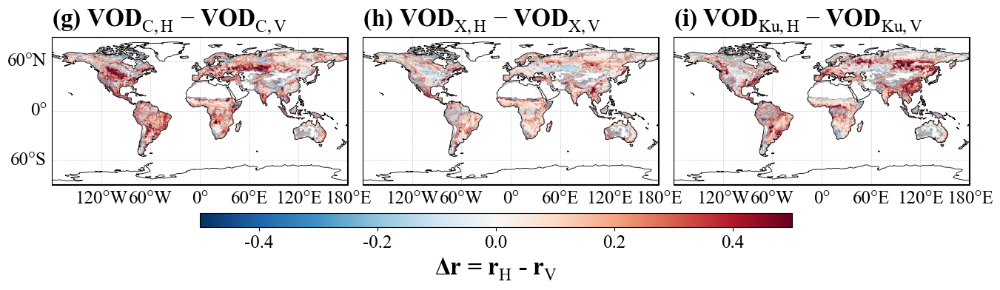

In [11]:
import os
import numpy as np
import rasterio
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from matplotlib.colors import LinearSegmentedColormap, TwoSlopeNorm
import matplotlib.ticker as mticker
from matplotlib.patches import Rectangle
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER

plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["axes.unicode_minus"] = False
plt.rcParams["mathtext.fontset"] = "custom"
plt.rcParams["mathtext.rm"] = "Times New Roman"
plt.rcParams["mathtext.it"] = "Times New Roman:italic"
plt.rcParams["mathtext.bf"] = "Times New Roman:bold"

base_dir = r"G:\data\VWC\VWCMap\VOD_VWC_Correlation_Monthly"
bands = ["C", "X", "Ku"]

# 颜色映射（沿用你原来的发散色带）
colors = [
    "#053061", "#2166ac", "#4393c3", "#92c5de", "#d1e5f0",
    "#f7f7f7",
    "#fddbc7", "#f4a582", "#d6604d", "#b2182b", "#67001f"
]
cmap = LinearSegmentedColormap.from_list("corr_cmap", colors, N=256)
cmap.set_bad(color="none")

titles = [
    r"(g) VOD$_{\mathrm{C,H}}$ $-$ VOD$_{\mathrm{C,V}}$",
    r"(h) VOD$_{\mathrm{X,H}}$ $-$ VOD$_{\mathrm{X,V}}$",
    r"(i) VOD$_{\mathrm{Ku,H}}$ $-$ VOD$_{\mathrm{Ku,V}}$",
]

# 先读三幅差值，统计一个统一的 max_abs 做对称色标
diff_maps = []
extents = []
for band in bands:
    fH = os.path.join(base_dir, f"VOD_VWC_Corr_VOD_{band}_Hpol_Asc_2016_2020.tif")
    fV = os.path.join(base_dir, f"VOD_VWC_Corr_VOD_{band}_Vpol_Asc_2016_2020.tif")

    with rasterio.open(fH) as srcH:
        rH = srcH.read(1).astype(float)
        rH[rH == -9999] = np.nan
        extent = [srcH.bounds.left, srcH.bounds.right, srcH.bounds.bottom, srcH.bounds.top]

    with rasterio.open(fV) as srcV:
        rV = srcV.read(1).astype(float)
        rV[rV == -9999] = np.nan

    d = rH - rV
    diff_maps.append(d)
    extents.append(extent)

vlim = 0.5
norm = TwoSlopeNorm(vmin=-vlim, vcenter=0.0, vmax=vlim)

# 画布：1×3
fig, axes = plt.subplots(
    1, 3,
    figsize=(16, 3.8),
    subplot_kw={"projection": ccrs.PlateCarree()},
    gridspec_kw={"wspace": 0.05}
)

for i, (ax, d, extent) in enumerate(zip(axes, diff_maps, extents)):
    im = ax.imshow(d, extent=extent, cmap=cmap, norm=norm, transform=ccrs.PlateCarree())
    ax.add_patch(Rectangle(
        (extent[0], extent[2]),
        extent[1]-extent[0],
        extent[3]-extent[2],
        fill=False, edgecolor='black', linewidth=1.5,
        transform=ccrs.PlateCarree(), zorder=10
    ))

    gl = ax.gridlines(
        crs=ccrs.PlateCarree(), draw_labels=True,
        linewidth=0.4, color="gray", linestyle="--", alpha=0.5
    )
    gl.top_labels = False
    gl.right_labels = False
    gl.xlocator = mticker.MultipleLocator(60)
    gl.ylocator = mticker.MultipleLocator(60)

    def lon_formatter_no_180W(x, pos):
        if np.isclose(x, -180):
            return ""
        return LONGITUDE_FORMATTER(x, pos)

    gl.xformatter = mticker.FuncFormatter(lon_formatter_no_180W)
    gl.yformatter = LATITUDE_FORMATTER
    gl.xlabel_style = {"size": 18}
    gl.ylabel_style = {"size": 18}

    # 只保留左侧 y 标签；三幅都保留底部 x 标签更直观
    if i != 0:
        gl.left_labels = False

    ax.coastlines(linewidth=0.6)
    ax.set_title(titles[i], fontsize=24, fontweight="bold", loc="left")

# 颜色条（单独一个，范围对称，中心0）
cax = fig.add_axes([0.25, 0.08, 0.5, 0.05])
cbar = fig.colorbar(im, cax=cax, orientation="horizontal")
cbar.set_label(r"$\mathbf{\Delta r}$ = $\mathbf{r}_{\boldsymbol{\mathrm{H}}}$ - $\mathbf{r}_{\boldsymbol{\mathrm{V}}}$", fontsize=24, fontweight="bold")
cbar.ax.tick_params(labelsize=18)

save_path = r"G:\文章\HUITU\Fig\Map\FigA3_DeltaR_HminusV.png"
plt.savefig(save_path, dpi=500, bbox_inches="tight")
plt.show()


## 7.2 VWC与VIs的相关性全球图以及散点图

### 将每日的SMAP VWC处理为月均tif数据

In [ ]:
import rasterio
import numpy as np
from pathlib import Path
from collections import defaultdict

# 输入输出路径
inDir = Path(r"G:\data\VWC\test-VWC\SMAP VWC\Daily")
outDir = Path(r"G:\data\VWC\test-VWC\SMAP VWC\Monthly")
outDir.mkdir(parents=True, exist_ok=True)

# 获取所有 tif 文件
files = sorted(inDir.glob("SMAP_VWC_*.tif"))

# 按 YYYYMM 分组，只处理 2016~2020 年
months = defaultdict(list)
for f in files:
    name = f.stem  # SMAP_VWC_YYYYMMDD
    date = name.split('_')[-1]  # YYYYMMDD
    year = int(date[:4])
    if 2016 <= year <= 2020:
        month = date[:6]  # YYYYMM
        months[month].append(f)

for month, monthFiles in months.items():
    print(f"Processing month {month}")
    
    # 读取第一幅影像获取形状和空间参考
    with rasterio.open(monthFiles[0]) as src:
        profile = src.profile.copy()
        data = src.read(1).astype(float)
    
    sumV = np.zeros_like(data, dtype=float)
    count = np.zeros_like(data, dtype=int)
    
    for f in monthFiles:
        with rasterio.open(f) as src:
            A = src.read(1).astype(float)
            valid = ~np.isnan(A)
            sumV[valid] += A[valid]
            count[valid] += 1
    
    # 计算月均值
    meanV = np.full_like(sumV, np.nan, dtype=float)
    mask = count > 0
    meanV[mask] = sumV[mask] / count[mask]
    
    # 更新 profile，保证数据类型和 NaN 保存
    profile.update(dtype=rasterio.float32, count=1, compress='lzw')
    
    # 输出月均值 GeoTIFF
    outFile = outDir / f"{month}.tif"
    with rasterio.open(outFile, 'w', **profile) as dst:
        dst.write(meanV.astype(np.float32), 1)


### 绘制NDWI和VWC的图，分析哪里有问题（ndwi_check）
mamba create -n ndwi_check -c conda-forge -y python=3.10 numpy matplotlib xarray netcdf4 h5netcdf h5py cartopy

In [ ]:
import os
import numpy as np
from netCDF4 import Dataset
import rasterio
import matplotlib.pyplot as plt

# 可选：带海岸线的地图
USE_CARTOPY = True
try:
    import cartopy.crs as ccrs
    import cartopy.feature as cfeature
except Exception:
    USE_CARTOPY = False

# =========================
# 路径模板（按你现有的）
# =========================
ndwi_template = r"G:\data\MODIS NDWI\01mat\{}.nc"
vwc_template  = r"G:\data\VWC\VWCMap\Monthly\VWC-{}.tif"

# =========================
# 输出图像路径
# =========================
out_png = r"G:\data\VWC\VWCMap\VIs_VWC_Corr\NDWI_VWC_Maps_2016_01_04_07_10.png"
os.makedirs(os.path.dirname(out_png), exist_ok=True)

# =========================
# 选择月份：2016 的 01/04/07/10
# =========================
year = 2016
months = [1, 4, 7, 10]
yyyymms = [f"{year}{m:02d}" for m in months]

# 预设尺寸（你现有数据就是这个）
nlat, nlon = 1800, 3600

# =========================
# 读 NDWI
# =========================
def read_ndwi_nc(nc_path, var_name="NDWI"):
    with Dataset(nc_path, "r") as ds:
        if var_name not in ds.variables:
            raise KeyError(f"Variable '{var_name}' not found. Available: {list(ds.variables.keys())[:20]} ...")
        arr = ds.variables[var_name][:].data.astype(np.float32)

    # 常见：维度转置
    if arr.shape != (nlat, nlon) and arr.T.shape == (nlat, nlon):
        arr = arr.T

    # nodata
    arr = np.where((arr == -9999) | np.isnan(arr), np.nan, arr)

    # 若看起来被放大（例如 *10000），缩放回 [-1, 1] 量级
    q99 = np.nanpercentile(np.abs(arr), 99) if np.isfinite(arr).any() else np.nan
    if np.isfinite(q99) and q99 > 2:
        arr = arr / 10000.0

    return arr

# =========================
# 读 VWC（tif）
# =========================
def read_vwc_tif(tif_path):
    with rasterio.open(tif_path) as src:
        arr = src.read(1).astype(np.float32)
        if arr.shape != (nlat, nlon) and arr.T.shape == (nlat, nlon):
            arr = arr.T
        nodata = src.nodata
        if nodata is not None:
            arr = np.where(arr == nodata, np.nan, arr)
        arr = np.where((arr == -9999) | np.isnan(arr), np.nan, arr)
    return arr

# =========================
# 画图设置
# =========================
extent = [-180, 180, -90, 90]  # 假设你的栅格已是经纬网（0.1°）

ndwi_vmin, ndwi_vmax = -1.0, 1.0
vwc_vmin,  vwc_vmax  = 0.0,  20.0

# 留出右侧空白专门放色标，避免压盖子图
fig = plt.figure(figsize=(14, 14), dpi=200)
gs = fig.add_gridspec(
    nrows=4, ncols=3,
    width_ratios=[1, 1, 0.05],   # 第三列给色标
    wspace=0.05, hspace=0.12
)

# 创建 4x2 的 axes（不再用 fig.add_subplot(4,2,...)）
axes = []
if USE_CARTOPY:
    proj = ccrs.PlateCarree()
    for r in range(4):
        for c in range(2):
            ax = fig.add_subplot(gs[r, c], projection=proj)
            ax.coastlines(linewidth=0.5)
            ax.add_feature(cfeature.BORDERS, linewidth=0.3, alpha=0.5)
            axes.append(ax)
else:
    for r in range(4):
        for c in range(2):
            ax = fig.add_subplot(gs[r, c])
            axes.append(ax)

ndwi_mappables = []
vwc_mappables  = []

for r, yyyymm in enumerate(yyyymms):
    ndwi_path = ndwi_template.format(yyyymm)
    vwc_path  = vwc_template.format(yyyymm)

    assert os.path.exists(ndwi_path), f"Missing NDWI file: {ndwi_path}"
    assert os.path.exists(vwc_path),  f"Missing VWC file:  {vwc_path}"

    ndwi = read_ndwi_nc(ndwi_path, "NDWI")
    vwc  = read_vwc_tif(vwc_path)

    # 只看 VWC 有效区域（陆地/有效像元）
    valid = np.isfinite(vwc)
    ndwi_masked = np.where(valid, ndwi, np.nan)

    # 打印统计（可选，便于诊断）
    def q(arr, p):
        return float(np.nanpercentile(arr, p)) if np.isfinite(arr).any() else np.nan

    print(f"\n==== {yyyymm} ====")
    print(f"Valid pixels (VWC): {np.sum(valid)}")
    print(f"NDWI (masked) q1/q50/q99: {q(ndwi_masked,1):.3f}, {q(ndwi_masked,50):.3f}, {q(ndwi_masked,99):.3f}")
    print(f"VWC  q1/q50/q99:        {q(vwc,1):.3f}, {q(vwc,50):.3f}, {q(vwc,99):.3f}")

    # 左列：NDWI
    ax_ndwi = axes[r*2 + 0]
    if USE_CARTOPY:
        im1 = ax_ndwi.imshow(
            ndwi_masked, origin="upper", extent=extent,
            transform=ccrs.PlateCarree(),
            vmin=ndwi_vmin, vmax=ndwi_vmax
        )
    else:
        im1 = ax_ndwi.imshow(ndwi_masked, origin="upper", vmin=ndwi_vmin, vmax=ndwi_vmax)
    ax_ndwi.set_title(f"NDWI {yyyymm}")

    # 右列：VWC
    ax_vwc = axes[r*2 + 1]
    if USE_CARTOPY:
        im2 = ax_vwc.imshow(
            vwc, origin="upper", extent=extent,
            transform=ccrs.PlateCarree(),
            vmin=vwc_vmin, vmax=vwc_vmax
        )
    else:
        im2 = ax_vwc.imshow(vwc, origin="upper", vmin=vwc_vmin, vmax=vwc_vmax)
    ax_vwc.set_title(f"VWC {yyyymm}")

    ndwi_mappables.append(im1)
    vwc_mappables.append(im2)

# =========================
# 色标：放到第三列（不压盖任何子图）
# =========================
cax_ndwi = fig.add_subplot(gs[0:2, 2])  # 上半部分给 NDWI
cax_vwc  = fig.add_subplot(gs[2:4, 2])  # 下半部分给 VWC

cbar1 = fig.colorbar(ndwi_mappables[0], cax=cax_ndwi)
cbar1.set_label("NDWI")

cbar2 = fig.colorbar(vwc_mappables[0], cax=cax_vwc)
cbar2.set_label("VWC (kg/m²)")

# 标题
fig.suptitle(
    "2016 NDWI (MOD09GA NDWI) vs VWC (Jan/Apr/Jul/Oct) — NDWI masked by VWC-valid pixels",
    y=0.995
)

# 不用 tight_layout（它经常把色标挤回去），改用 constrained_layout=False + gridspec 控制
# 如果你想更紧凑，可调 gs 的 wspace/hspace

# 保存输出
plt.savefig(out_png, dpi=300, bbox_inches="tight")
print(f"\nSaved figure to: {out_png}")

plt.show()


## 应该是NDWI的定义不同，重新处理并制作NDWI

### （1）代码预处理每日数据，寻找正确的读写形式 modis_hdf4

In [ ]:
from osgeo import gdal

path = r"G:\data\MCD12C1 CMG\005Degree\MCD43C4_061-20260109_024010\MCD43C4.A2020325.061.2020357071339.hdf"

gdal.UseExceptions()
ds = gdal.Open(path)
print("Driver:", ds.GetDriver().ShortName)

sds = ds.GetSubDatasets()
print("Total SDS:", len(sds))
for i, (name, desc) in enumerate(sds):
    # 只打印关键的（你也可以先全打印）
    d = desc.lower()
    if any(k in d for k in ["band2", "band7", "quality", "qa", "snow", "nadir_reflectance"]):
        print(f"[{i:03d}] {desc}\n      {name}")


NIR=Band2 与 SWIR2=Band7，处理一个文件并制图，分析是否需要转置。

In [ ]:
import numpy as np
from osgeo import gdal
import matplotlib.pyplot as plt

gdal.UseExceptions()

# ============================================================
# 配置区：改这里
# ============================================================
hdf_path = r"G:\data\MCD12C1 CMG\005Degree\MCD43C4_061-20260109_024010\MCD43C4.A2020325.061.2020357071339.hdf"

# 掩膜阈值（你要求：雪比例<=5；质量“稍宽松”可用 2 或 3）
QA_MAX = 3          # 建议先 2；雨林缺测明显可试 3 或 4
SNOW_MAX = 5        # 像元积雪百分比阈值

# 是否限制反射率有效范围（MCD43C4 常见：0..32766, fill=32767, scale=1e-4）
REF_FILL = 32767
REF_MIN = 0
REF_MAX = 32766
REF_SCALE = 1e-4

# 如果你发现图南北颠倒，把这个改成 True
FLIP_UD_FOR_PLOT = False

# ============================================================
# 1) 读取 HDF SDS
# ============================================================
root = f'HDF4_EOS:EOS_GRID:"{hdf_path}":MCD_CMG_BRDF_0.05Deg:'
SDS_B2 = root + "Nadir_Reflectance_Band2"   # NIR
SDS_B7 = root + "Nadir_Reflectance_Band7"   # SWIR2
SDS_QA = root + "Albedo_Quality"
SDS_SN = root + "Percent_Snow"

def read_sds(sds_name):
    ds = gdal.Open(sds_name)
    if ds is None:
        raise RuntimeError(f"Failed to open SDS: {sds_name}")
    band = ds.GetRasterBand(1)
    arr = band.ReadAsArray()
    return arr

b2_raw = read_sds(SDS_B2)   # int16
b7_raw = read_sds(SDS_B7)   # int16
qa_raw = read_sds(SDS_QA)   # uint8
sn_raw = read_sds(SDS_SN)   # uint8

if b2_raw.shape != (3600, 7200) or b7_raw.shape != (3600, 7200):
    raise ValueError(f"Unexpected shape: b2={b2_raw.shape}, b7={b7_raw.shape}. Expected (3600,7200).")

# ============================================================
# 2) 0.05°反射率缩放 + 掩膜
# ============================================================
b2 = b2_raw.astype(np.float32)
b7 = b7_raw.astype(np.float32)

invalid_ref = (
    (b2 == REF_FILL) | (b7 == REF_FILL) |
    (b2 < REF_MIN) | (b7 < REF_MIN) |
    (b2 > REF_MAX) | (b7 > REF_MAX)
)

# 缩放到反射率
b2[invalid_ref] = np.nan
b7[invalid_ref] = np.nan
b2 *= REF_SCALE
b7 *= REF_SCALE

# 质量层：稍宽松 QA<=QA_MAX
qa_mask = (qa_raw <= QA_MAX) & (qa_raw != 255)

# 雪比例：<=SNOW_MAX，排除 fill=255
snow_mask = (sn_raw <= SNOW_MAX) & (sn_raw != 255)

mask = qa_mask & snow_mask
b2[~mask] = np.nan
b7[~mask] = np.nan

# ============================================================
# 3) 计算 0.05° NDWI（论文口径：B2 vs B7）
# ============================================================
den = b2 + b7
ndwi05 = (b2 - b7) / den
ndwi05[(~np.isfinite(ndwi05)) | np.isclose(den, 0)] = np.nan

print("0.05° NDWI:",
      "min", float(np.nanmin(ndwi05)),
      "max", float(np.nanmax(ndwi05)),
      "mean", float(np.nanmean(ndwi05)),
      "valid", int(np.isfinite(ndwi05).sum()), "/", ndwi05.size)

# ============================================================
# 4) 0.05° -> 0.1°：2×2 block 聚合（nanmean）
#     (3600,7200) -> (1800,3600)
# ============================================================
h, w = ndwi05.shape
if (h % 2 != 0) or (w % 2 != 0):
    raise ValueError("ndwi05 shape must be divisible by 2 in both dimensions.")

ndwi01 = ndwi05.reshape(h//2, 2, w//2, 2)
ndwi01 = np.nanmean(ndwi01, axis=(1, 3)).astype(np.float32)

print("0.1° NDWI:",
      "min", float(np.nanmin(ndwi01)),
      "max", float(np.nanmax(ndwi01)),
      "mean", float(np.nanmean(ndwi01)),
      "valid", int(np.isfinite(ndwi01).sum()), "/", ndwi01.size)

# ============================================================
# 5) 构建你指定的 0.1°像元中心经纬度栅格 + 边界（用于 pcolormesh）
#    centers:
#      lat:  89.95, 89.85, ...,-89.95  (1800)
#      lon: -179.95,..., 179.95        (3600)
#    edges:
#      lat:  90.0, 89.9, ...,-90.0     (1801)
#      lon: -180.0,..., 180.0          (3601)
# ============================================================
lat_c = np.arange(89.95, -90.0, -0.1, dtype=np.float32)   # 1800
lon_c = np.arange(-179.95, 180.0, 0.1, dtype=np.float32)  # 3600
lat_e = np.arange(90.0, -90.0 - 1e-6, -0.1, dtype=np.float32)    # 1801
lon_e = np.arange(-180.0, 180.0 + 1e-6, 0.1, dtype=np.float32)   # 3601

if ndwi01.shape != (len(lat_c), len(lon_c)):
    raise ValueError(f"ndwi01 shape {ndwi01.shape} must match (1800,3600).")

# 可选：如果你发现南北倒置，就 flip
plot_arr = np.flipud(ndwi01) if FLIP_UD_FOR_PLOT else ndwi01

# ============================================================
# 6) 绘图（经纬度轴严格正确）
# ============================================================
plt.figure(figsize=(14, 7))
m = plt.pcolormesh(lon_e, lat_e, plot_arr, shading="flat", vmin=-1, vmax=1)
plt.gca().set_aspect("equal", adjustable="box")
plt.colorbar(m, label="NDWI (B2-B7)/(B2+B7)")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title(f"MCD43C4 NDWI (0.1° from 0.05°), QA<= {QA_MAX}, Snow<= {SNOW_MAX}%")
plt.tight_layout()
plt.show()


### （2）批量处理为日数据代码 modis_hdf4

In [ ]:
import os
import re
from datetime import datetime, timedelta

import numpy as np
from osgeo import gdal, osr

gdal.UseExceptions()

# =========================
# 配置区
# =========================
RAW_DIR = r"G:\data\MODIS NDWI\MCD43C4\rawData"
OUT_DIR = r"G:\data\MODIS NDWI\MCD43C4\Daily"

QA_MAX = 3
SNOW_MAX = 5

# MCD43C4 Nadir_Reflectance_* 常见规格
REF_FILL = 32767
REF_MIN = 0
REF_MAX = 32766
REF_SCALE = 1e-4

OUT_NODATA = -9999.0  # 输出 GeoTIFF NoData
COMPRESS = "LZW"      # GeoTIFF 压缩

# 输出 0.1° GeoTIFF 地理参考（像元角点）
# 0.1°网格：左上角(-180, 90)，像元大小(0.1, -0.1)，维度(3600列, 1800行)
GT_01 = (-180.0, 0.1, 0.0, 90.0, 0.0, -0.1)
EPSG = 4326

# =========================
# 工具函数
# =========================
def iter_hdf_files(root_dir: str):
    """递归遍历 root_dir 下所有 .hdf 文件。"""
    for r, _, files in os.walk(root_dir):
        for fn in files:
            if fn.lower().endswith(".hdf"):
                yield os.path.join(r, fn)

def parse_ayyyyddd_to_yyyymmdd(hdf_filename: str) -> str:
    """
    从文件名中解析 AYYYYDDD，并转换为 YYYYMMDD 字符串。
    例：MCD43C4.A2020325... -> 20201120
    """
    m = re.search(r"\.A(\d{4})(\d{3})\.", hdf_filename)
    if not m:
        raise ValueError(f"Cannot parse AYYYYDDD from filename: {hdf_filename}")
    year = int(m.group(1))
    doy = int(m.group(2))
    date = datetime(year, 1, 1) + timedelta(days=doy - 1)
    return date.strftime("%Y%m%d")

def read_sds_array(hdf_path: str, sds_name: str) -> np.ndarray:
    """读取 HDF4 EOS_GRID 下指定 SDS 的数组。"""
    sds_path = f'HDF4_EOS:EOS_GRID:"{hdf_path}":MCD_CMG_BRDF_0.05Deg:{sds_name}'
    ds = gdal.Open(sds_path)
    if ds is None:
        raise RuntimeError(f"Failed to open SDS: {sds_path}")
    band = ds.GetRasterBand(1)
    arr = band.ReadAsArray()
    return arr

def compute_ndwi_01_from_hdf(hdf_path: str, qa_max: int, snow_max: int) -> np.ndarray:
    """
    从单个 MCD43C4 HDF 计算 0.1° NDWI（float32, shape=(1800,3600)）。
    计算逻辑：
      - 读 Band2/Band7（int16）-> scale 1e-4
      - mask: QA<=qa_max & snow<=snow_max & 非 fill
      - NDWI05 = (B2 - B7)/(B2 + B7)
      - 2x2 nanmean -> NDWI01
    """
    b2_raw = read_sds_array(hdf_path, "Nadir_Reflectance_Band2")
    b7_raw = read_sds_array(hdf_path, "Nadir_Reflectance_Band7")
    qa_raw = read_sds_array(hdf_path, "Albedo_Quality")
    sn_raw = read_sds_array(hdf_path, "Percent_Snow")

    if b2_raw.shape != (3600, 7200) or b7_raw.shape != (3600, 7200):
        raise ValueError(f"Unexpected reflectance shape: b2={b2_raw.shape}, b7={b7_raw.shape}. Expected (3600,7200).")

    # 反射率缩放
    b2 = b2_raw.astype(np.float32)
    b7 = b7_raw.astype(np.float32)

    invalid_ref = (
        (b2 == REF_FILL) | (b7 == REF_FILL) |
        (b2 < REF_MIN) | (b7 < REF_MIN) |
        (b2 > REF_MAX) | (b7 > REF_MAX)
    )
    b2[invalid_ref] = np.nan
    b7[invalid_ref] = np.nan
    b2 *= REF_SCALE
    b7 *= REF_SCALE

    # 掩膜
    qa_mask = (qa_raw != 255) & (qa_raw <= qa_max)
    sn_mask = (sn_raw != 255) & (sn_raw <= snow_max)
    mask = qa_mask & sn_mask

    b2[~mask] = np.nan
    b7[~mask] = np.nan

    # NDWI 0.05°
    den = b2 + b7
    ndwi05 = (b2 - b7) / den
    ndwi05[(~np.isfinite(ndwi05)) | np.isclose(den, 0)] = np.nan

    # 2×2 聚合到 0.1°（3600x7200 -> 1800x3600）
    h, w = ndwi05.shape
    if (h % 2 != 0) or (w % 2 != 0):
        raise ValueError("ndwi05 shape must be divisible by 2 in both dimensions for 2x2 aggregation.")

    ndwi01 = ndwi05.reshape(h // 2, 2, w // 2, 2)
    ndwi01 = np.nanmean(ndwi01, axis=(1, 3)).astype(np.float32)  # (1800,3600)

    return ndwi01

def write_geotiff_float32(out_path: str, arr: np.ndarray, geotransform, epsg: int, nodata: float, compress: str = "LZW"):
    """写出单波段 float32 GeoTIFF。"""
    if arr.shape != (1800, 3600):
        raise ValueError(f"Expected output shape (1800,3600), got {arr.shape}")

    driver = gdal.GetDriverByName("GTiff")
    if driver is None:
        raise RuntimeError("GDAL GTiff driver not available.")

    # 创建输出目录
    os.makedirs(os.path.dirname(out_path), exist_ok=True)

    # 创建文件
    options = [
        f"COMPRESS={compress}",
        "TILED=YES",
        "BIGTIFF=IF_SAFER",
        "PREDICTOR=2"
    ]
    ds = driver.Create(out_path, 3600, 1800, 1, gdal.GDT_Float32, options=options)
    if ds is None:
        raise RuntimeError(f"Failed to create GeoTIFF: {out_path}")

    ds.SetGeoTransform(geotransform)

    srs = osr.SpatialReference()
    srs.ImportFromEPSG(epsg)
    ds.SetProjection(srs.ExportToWkt())

    band = ds.GetRasterBand(1)
    band.SetNoDataValue(nodata)

    out = arr.copy()
    out[~np.isfinite(out)] = nodata
    band.WriteArray(out)
    band.FlushCache()

    ds.FlushCache()
    ds = None

# =========================
# 主流程
# =========================
def main():
    os.makedirs(OUT_DIR, exist_ok=True)

    hdf_files = sorted(list(iter_hdf_files(RAW_DIR)))
    if not hdf_files:
        print(f"[WARN] No .hdf files found under: {RAW_DIR}")
        return

    print(f"[INFO] Found {len(hdf_files)} HDF files under: {RAW_DIR}")
    print(f"[INFO] Output dir: {OUT_DIR}")
    print(f"[INFO] QA_MAX={QA_MAX}, SNOW_MAX={SNOW_MAX}")

    ok, fail, skip = 0, 0, 0

    for i, hdf in enumerate(hdf_files, 1):
        fn = os.path.basename(hdf)

        try:
            yyyymmdd = parse_ayyyyddd_to_yyyymmdd(fn)
            out_tif = os.path.join(OUT_DIR, f"ndwi_{yyyymmdd}.tif")

            if os.path.exists(out_tif):
                skip += 1
                print(f"[{i}/{len(hdf_files)}] SKIP exists: {os.path.basename(out_tif)}")
                continue

            ndwi01 = compute_ndwi_01_from_hdf(hdf, QA_MAX, SNOW_MAX)

            # 简单统计（可注释掉）
            valid = int(np.isfinite(ndwi01).sum())
            print(f"[{i}/{len(hdf_files)}] PROC {fn} -> ndwi_{yyyymmdd}.tif | valid={valid}/{ndwi01.size}")

            write_geotiff_float32(out_tif, ndwi01, GT_01, EPSG, OUT_NODATA, compress=COMPRESS)
            ok += 1

        except Exception as e:
            fail += 1
            print(f"[{i}/{len(hdf_files)}] FAIL {fn}: {e}")

    print("\n===== Summary =====")
    print(f"OK   : {ok}")
    print(f"SKIP : {skip}")
    print(f"FAIL : {fail}")

if __name__ == "__main__":
    main()


### （3）日数据值作为月均数据 modis_hdf4

In [ ]:
import os
import re
import numpy as np
from osgeo import gdal, osr

gdal.UseExceptions()

# =========================
# 配置区
# =========================
DAILY_DIR = r"G:\data\MODIS NDWI\MCD43C4\Daily"
OUT_DIR   = r"G:\data\MODIS NDWI\MCD43C4\Monthly"

# 必须与日数据输出一致
NODATA = -9999.0
COMPRESS = "LZW"

# =========================
# 工具函数
# =========================
def list_daily_tifs(daily_dir):
    """列出所有 ndwi_YYYYMMDD.tif"""
    pat = re.compile(r"^ndwi_(\d{8})\.tif$", re.IGNORECASE)
    files = []
    for fn in os.listdir(daily_dir):
        m = pat.match(fn)
        if m:
            files.append((m.group(1), os.path.join(daily_dir, fn)))
    # 按日期排序
    files.sort(key=lambda x: x[0])
    return files

def group_by_month(daily_files):
    """按 YYYYMM 分组"""
    groups = {}
    for yyyymmdd, path in daily_files:
        yyyymm = yyyymmdd[:6]
        groups.setdefault(yyyymm, []).append((yyyymmdd, path))
    # 返回按月份排序的列表
    return [(k, groups[k]) for k in sorted(groups.keys())]

def read_georef_from_tif(tif_path):
    """从一个 GeoTIFF 读取投影与地理变换"""
    ds = gdal.Open(tif_path)
    if ds is None:
        raise RuntimeError(f"Failed to open: {tif_path}")
    gt = ds.GetGeoTransform()
    proj = ds.GetProjection()
    xsize = ds.RasterXSize
    ysize = ds.RasterYSize
    ds = None
    return gt, proj, (ysize, xsize)

def read_array(tif_path):
    ds = gdal.Open(tif_path)
    if ds is None:
        raise RuntimeError(f"Failed to open: {tif_path}")
    band = ds.GetRasterBand(1)
    arr = band.ReadAsArray().astype(np.float32)
    ds = None
    return arr

def write_monthly_tif(out_path, mean_arr, gt, proj_wkt, nodata=NODATA, compress="LZW"):
    """写单波段 float32 GeoTIFF"""
    os.makedirs(os.path.dirname(out_path), exist_ok=True)

    ysize, xsize = mean_arr.shape
    driver = gdal.GetDriverByName("GTiff")
    options = [
        f"COMPRESS={compress}",
        "TILED=YES",
        "BIGTIFF=IF_SAFER",
        "PREDICTOR=2",
    ]
    ds = driver.Create(out_path, xsize, ysize, 1, gdal.GDT_Float32, options=options)
    if ds is None:
        raise RuntimeError(f"Failed to create: {out_path}")

    ds.SetGeoTransform(gt)
    ds.SetProjection(proj_wkt)

    band = ds.GetRasterBand(1)
    band.SetNoDataValue(float(nodata))
    out = mean_arr.copy()
    out[~np.isfinite(out)] = nodata
    band.WriteArray(out)
    band.FlushCache()

    ds.FlushCache()
    ds = None

# =========================
# 主流程：月均值
# =========================
def main():
    os.makedirs(OUT_DIR, exist_ok=True)

    daily_files = list_daily_tifs(DAILY_DIR)
    if not daily_files:
        print(f"[WARN] No daily tifs found in {DAILY_DIR}")
        return

    # 读一个文件拿地理参考（所有日文件应一致）
    gt, proj_wkt, shape = read_georef_from_tif(daily_files[0][1])
    print("[INFO] Using georef from:", os.path.basename(daily_files[0][1]))
    print("[INFO] Shape:", shape)

    groups = group_by_month(daily_files)
    print(f"[INFO] Found {len(daily_files)} daily files, {len(groups)} months.")

    ok, skip, fail = 0, 0, 0

    for yyyymm, items in groups:
        out_path = os.path.join(OUT_DIR, f"ndwi_{yyyymm}.tif")
        if os.path.exists(out_path):
            skip += 1
            print(f"[SKIP] {yyyymm} exists: {os.path.basename(out_path)}")
            continue

        # 累加器：sum + count（避免把整个月堆叠进内存）
        sum_arr = np.zeros(shape, dtype=np.float64)
        cnt_arr = np.zeros(shape, dtype=np.uint16)

        used = 0
        for yyyymmdd, tif_path in items:
            try:
                arr = read_array(tif_path)
                if arr.shape != shape:
                    raise ValueError(f"Shape mismatch: {arr.shape} vs {shape} in {tif_path}")

                valid = np.isfinite(arr) & (arr != NODATA)
                if np.any(valid):
                    sum_arr[valid] += arr[valid].astype(np.float64)
                    cnt_arr[valid] += 1
                used += 1
            except Exception as e:
                # 单日坏文件不让整月崩
                print(f"  [WARN] Skip day {yyyymmdd} due to error: {e}")

        # 计算均值：n个有效值平均
        mean = np.full(shape, NODATA, dtype=np.float32)
        ok_mask = cnt_arr > 0
        mean[ok_mask] = (sum_arr[ok_mask] / cnt_arr[ok_mask]).astype(np.float32)

        valid_pix = int(ok_mask.sum())
        print(f"[PROC] Month {yyyymm}: days_used={used}/{len(items)}, valid_pixels={valid_pix}/{mean.size}")

        try:
            write_monthly_tif(out_path, mean, gt, proj_wkt, nodata=NODATA, compress=COMPRESS)
            ok += 1
        except Exception as e:
            fail += 1
            print(f"[FAIL] Write {yyyymm}: {e}")

    print("\n===== Summary =====")
    print("OK   :", ok)
    print("SKIP :", skip)
    print("FAIL :", fail)

if __name__ == "__main__":
    main()


### （4）2020的月数据制作为年数据

In [ ]:
import os
import re
import numpy as np
from osgeo import gdal

gdal.UseExceptions()

# =========================
# 配置区
# =========================
DAILY_DIR = r"G:\data\MODIS NDWI\MCD43C4\Daily"
OUT_DIR   = r"G:\data\MODIS NDWI\MCD43C4\Yearly"

YEAR = "2020"
NODATA = -9999.0
COMPRESS = "LZW"

# 年均最少有效天数阈值（建议先 60；想更“满”可用 30）
MIN_VALID_DAYS = 60

# 是否额外输出有效天数栅格（很推荐）
WRITE_COUNT_TIF = True

# =========================
# 工具函数
# =========================
def list_daily_tifs_for_year(daily_dir, year):
    """
    列出指定年份的 ndwi_YYYYMMDD.tif
    返回 [(yyyymmdd, fullpath), ...] 按日期排序
    """
    pat = re.compile(rf"^ndwi_({year}\d{{4}})\.tif$", re.IGNORECASE)  # year + MMDD
    files = []
    for fn in os.listdir(daily_dir):
        m = pat.match(fn)
        if m:
            yyyymmdd = m.group(1)
            files.append((yyyymmdd, os.path.join(daily_dir, fn)))
    files.sort(key=lambda x: x[0])
    return files

def read_georef_and_shape(tif_path):
    ds = gdal.Open(tif_path)
    if ds is None:
        raise RuntimeError(f"Failed to open: {tif_path}")
    gt = ds.GetGeoTransform()
    proj = ds.GetProjection()
    shape = (ds.RasterYSize, ds.RasterXSize)
    ds = None
    return gt, proj, shape

def read_array(tif_path):
    ds = gdal.Open(tif_path)
    if ds is None:
        raise RuntimeError(f"Failed to open: {tif_path}")
    band = ds.GetRasterBand(1)
    arr = band.ReadAsArray().astype(np.float32)
    ds = None
    return arr

def write_tif(out_path, arr, gt, proj_wkt, nodata, gdal_type=gdal.GDT_Float32, compress="LZW"):
    os.makedirs(os.path.dirname(out_path), exist_ok=True)
    ysize, xsize = arr.shape

    driver = gdal.GetDriverByName("GTiff")
    options = [
        f"COMPRESS={compress}",
        "TILED=YES",
        "BIGTIFF=IF_SAFER",
        "PREDICTOR=2",
    ]
    ds = driver.Create(out_path, xsize, ysize, 1, gdal_type, options=options)
    if ds is None:
        raise RuntimeError(f"Failed to create: {out_path}")

    ds.SetGeoTransform(gt)
    ds.SetProjection(proj_wkt)

    band = ds.GetRasterBand(1)
    band.SetNoDataValue(float(nodata))
    band.WriteArray(arr)
    band.FlushCache()

    ds.FlushCache()
    ds = None

# =========================
# 主流程：年均值
# =========================
def main():
    os.makedirs(OUT_DIR, exist_ok=True)

    daily_files = list_daily_tifs_for_year(DAILY_DIR, YEAR)
    if not daily_files:
        print(f"[WARN] No daily files for {YEAR} found in {DAILY_DIR}")
        return

    # 读一个文件获取地理参考
    gt, proj_wkt, shape = read_georef_and_shape(daily_files[0][1])
    print(f"[INFO] Year={YEAR}, daily files={len(daily_files)}")
    print("[INFO] Shape:", shape)
    print("[INFO] MIN_VALID_DAYS:", MIN_VALID_DAYS)

    sum_arr = np.zeros(shape, dtype=np.float64)
    cnt_arr = np.zeros(shape, dtype=np.uint16)

    used = 0
    for i, (yyyymmdd, path) in enumerate(daily_files, 1):
        try:
            arr = read_array(path)
            if arr.shape != shape:
                raise ValueError(f"Shape mismatch: {arr.shape} vs {shape}")

            valid = np.isfinite(arr) & (arr != NODATA)
            if np.any(valid):
                sum_arr[valid] += arr[valid].astype(np.float64)
                cnt_arr[valid] += 1

            used += 1
            if i % 20 == 0 or i == len(daily_files):
                print(f"[INFO] {i}/{len(daily_files)} processed...")
        except Exception as e:
            print(f"[WARN] Skip {yyyymmdd} due to error: {e}")

    # 计算年均
    mean_arr = np.full(shape, NODATA, dtype=np.float32)
    ok = cnt_arr >= MIN_VALID_DAYS
    mean_arr[ok] = (sum_arr[ok] / cnt_arr[ok]).astype(np.float32)

    print("[INFO] Days used:", used, "/", len(daily_files))
    print("[INFO] Pixels with cnt>=MIN:", int(ok.sum()), "/", mean_arr.size)

    out_mean = os.path.join(OUT_DIR, f"ndwi_{YEAR}.tif")
    write_tif(out_mean, mean_arr, gt, proj_wkt, nodata=NODATA, gdal_type=gdal.GDT_Float32, compress=COMPRESS)
    print("[OK] Wrote:", out_mean)

    if WRITE_COUNT_TIF:
        # count 输出用 Int16/UInt16 都可；这里用 UInt16
        out_cnt = os.path.join(OUT_DIR, f"ndwi_{YEAR}_count.tif")
        # count 的 nodata 设为 0 更自然（表示无有效天）
        write_tif(out_cnt, cnt_arr.astype(np.uint16), gt, proj_wkt, nodata=0, gdal_type=gdal.GDT_UInt16, compress=COMPRESS)
        print("[OK] Wrote:", out_cnt)

if __name__ == "__main__":
    main()


## 继续处理

### 生产逐像元时间相关性图 （env_vi_vwc）

In [ ]:
import os
import numpy as np
from netCDF4 import Dataset
import rasterio
from scipy.stats import pearsonr

# 文件路径模板
ndvi_template = r"G:\data\GLASS NDVI\01mat\{}.nc"
evi_template = r"G:\data\GLASS EVI\01mat\{}.nc"
# ndwi_template = r"G:\data\MODIS NDWI\01mat\{}.nc"
ndwi_tif_template = r"G:\data\MODIS NDWI\MCD43C4\Monthly\ndwi_{}.tif"
svwc_template = r"G:\data\VWC\test-VWC\SMAP VWC\01mat\{}.nc"
vwc_template = r"G:\data\VWC\VWCMap\Monthly\VWC-{}.tif"

# 输出路径
output_dir = r"G:\data\VWC\VWCMap\VIs_VWC_Corr"
os.makedirs(output_dir, exist_ok=True)

# 时间序列
years = range(2016, 2021)
months = range(1, 13)

# 初始化数组
nlat, nlon = 1800, 3600
nmonths = len(years) * len(months)

NDVI_all = np.full((nlat, nlon, nmonths), np.nan, dtype=np.float32)
EVI_all = np.full((nlat, nlon, nmonths), np.nan, dtype=np.float32)
NDWI_all = np.full((nlat, nlon, nmonths), np.nan, dtype=np.float32)
SVWC_all = np.full((nlat, nlon, nmonths), np.nan, dtype=np.float32)
VWC_all = np.full((nlat, nlon, nmonths), np.nan, dtype=np.float32)

# 读取数据
time_idx = 0
for year in years:
    for month in months:
        yyyymm = f"{year}{month:02d}"

        # 读取NDVI
        ndvi_file = ndvi_template.format(yyyymm)
        with Dataset(ndvi_file, 'r') as ds:
            ndvi = ds.variables['NDVI'][:, :].data
            if ndvi.shape != (nlat, nlon):
                ndvi = ndvi.T
        ndvi = np.where((ndvi == -9999) | np.isnan(ndvi), np.nan, ndvi)

        NDVI_all[:, :, time_idx] = ndvi

        # 读取EVI
        evi_file = evi_template.format(yyyymm)
        with Dataset(evi_file, 'r') as ds:
            evi = ds.variables['EVI'][:, :].data
            if evi.shape != (nlat, nlon):
                evi = evi.T
        evi = np.where((evi == -9999) | np.isnan(evi), np.nan, evi)
        EVI_all[:, :, time_idx] = evi

        # ✅ 读取NDWI（月均 GeoTIFF）
        ndwi_file = ndwi_tif_template.format(yyyymm)
        try:
            with rasterio.open(ndwi_file) as src:
                ndwi = src.read(1).astype(np.float32)

                # 统一 nodata
                src_nodata = src.nodata
                if src_nodata is not None:
                    ndwi = np.where(ndwi == src_nodata, np.nan, ndwi)

                if ndwi.shape != (nlat, nlon):
                    ndwi = ndwi.T

            ndwi = np.where((ndwi == -9999) | np.isnan(ndwi), np.nan, ndwi)
            NDWI_all[:, :, time_idx] = ndwi
        except Exception as e:
            print(f"[WARN] NDWI missing/failed for {yyyymm}: {e}")

        # 读取SMAP VWC
        svwc_file = svwc_template.format(yyyymm)
        with Dataset(svwc_file, 'r') as ds:
            svwc = ds.variables['VWC'][:, :].data
            if svwc.shape != (nlat, nlon):
                svwc = svwc.T
        svwc = np.where((svwc == -9999) | np.isnan(svwc), np.nan, svwc)
        SVWC_all[:, :, time_idx] = svwc

        # 读取VWC
        vwc_file = vwc_template.format(yyyymm)
        with rasterio.open(vwc_file) as src:
            vwc = src.read(1).astype(np.float32)
            if vwc.shape != (nlat, nlon):
                vwc = vwc.T
        vwc = np.where((vwc == -9999) | np.isnan(vwc), np.nan, vwc)
        VWC_all[:, :, time_idx] = vwc

        time_idx += 1
        print(f"Processed {yyyymm}")

# 定义计算皮尔逊相关函数
def calc_corr(a, b):
    mask = ~np.isnan(a) & ~np.isnan(b)
    if np.sum(mask) < 2:
        return np.nan
    return pearsonr(a[mask], b[mask])[0]

# 初始化输出相关性矩阵
corr_ndvi_vwc = np.full((nlat, nlon), np.nan, dtype=np.float32)
corr_evi_vwc = np.full((nlat, nlon), np.nan, dtype=np.float32)
corr_ndwi_vwc = np.full((nlat, nlon), np.nan, dtype=np.float32)
corr_svwc_vwc = np.full((nlat, nlon), np.nan, dtype=np.float32)

# 逐像元计算相关性
for i in range(nlat):
    if i % 100 == 0:
        print(f"Processing row {i}/{nlat}")
    for j in range(nlon):
        ndvi_series = NDVI_all[i, j, :]
        evi_series = EVI_all[i, j, :]
        ndwi_series = NDWI_all[i, j, :]
        svwc_series = SVWC_all[i, j, :]
        vwc_series = VWC_all[i, j, :]

        corr_ndvi_vwc[i, j] = calc_corr(ndvi_series, vwc_series)
        corr_evi_vwc[i, j] = calc_corr(evi_series, vwc_series)
        corr_ndwi_vwc[i, j] = calc_corr(ndwi_series, vwc_series)
        corr_svwc_vwc[i, j] = calc_corr(svwc_series, vwc_series)

# 保存为GeoTIFF
def save_tif(data, reference_file, out_path):
    with rasterio.open(reference_file) as src:
        meta = src.meta.copy()
        meta.update(dtype=rasterio.float32, count=1, compress='lzw', nodata=np.nan)
    with rasterio.open(out_path, 'w', **meta) as dst:
        dst.write(data, 1)

# 参考文件（用第一个VWC文件获取投影和尺寸）
ref_file = vwc_template.format(f"{years[0]}01")
save_tif(corr_ndvi_vwc, ref_file, os.path.join(output_dir, "NDVI_VWC_Corr.tif"))
save_tif(corr_evi_vwc, ref_file, os.path.join(output_dir, "EVI_VWC_Corr.tif"))
save_tif(corr_ndwi_vwc, ref_file, os.path.join(output_dir, "NDWI_VWC_Corr.tif"))
save_tif(corr_svwc_vwc, ref_file, os.path.join(output_dir, "SMAPVWC_VWC_Corr.tif"))

print("Correlation calculation completed and saved.")


In [ ]:
import os
import numpy as np
from netCDF4 import Dataset
import rasterio
from rasterio.warp import reproject, Resampling

# ======================
# 1) 文件路径模板（保持你原来的）
# ======================
ndvi_template = r"G:\data\GLASS NDVI\01mat\{}.nc"
evi_template  = r"G:\data\GLASS EVI\01mat\{}.nc"
ndwi_tif_template = r"G:\data\MODIS NDWI\MCD43C4\Monthly\ndwi_{}.tif"
svwc_template = r"G:\data\VWC\test-VWC\SMAP VWC\01mat\{}.nc"
vwc_template  = r"G:\data\VWC\VWCMap\Monthly\VWC-{}.tif"

# 输出路径
output_dir = r"G:\data\VWC\VWCMap\VIs_VWC_Corr"
os.makedirs(output_dir, exist_ok=True)

# 时间序列
years = range(2016, 2021)
months = range(1, 13)

# 网格大小（0.1°：1800x3600）
nlat, nlon = 1800, 3600

OUT_NODATA = -9999.0


# ======================
# 2) 读取工具：nc（强一致性 + 自动翻转/经度重排）
# ======================
def _to_float_and_nan(arr, fill_values=(-9999,)):
    arr = arr.astype(np.float32, copy=False)
    for fv in fill_values:
        arr = np.where(arr == fv, np.nan, arr)
    arr = np.where(np.isfinite(arr), arr, np.nan)
    return arr

def read_nc_var_strict(nc_file, var_name, expect_shape=(1800, 3600)):
    """
    读取 nc 变量，并尽量保证输出为 [lat, lon] 且 lat 从北到南、lon 从西到东（-180..180）。
    - 处理 Mask / _FillValue / missing_value / -9999
    - 若 lon 为 0..360，转换并重排到 -180..180 顺序
    - 若 lat 升序（-90..90），flip 到北->南
    """
    with Dataset(nc_file, "r") as ds:
        if var_name not in ds.variables:
            raise KeyError(f"Variable '{var_name}' not found in {nc_file}. "
                           f"Available: {list(ds.variables.keys())}")

        v = ds.variables[var_name][:]
        if isinstance(v, np.ma.MaskedArray):
            arr = v.filled(np.nan).astype(np.float32)
        else:
            arr = np.array(v, dtype=np.float32)

        fv = getattr(ds.variables[var_name], "_FillValue", None)
        mv = getattr(ds.variables[var_name], "missing_value", None)
        if fv is not None:
            arr = np.where(arr == fv, np.nan, arr)
        if mv is not None:
            arr = np.where(arr == mv, np.nan, arr)

        # 常见 -9999
        arr = _to_float_and_nan(arr, fill_values=(-9999,))

        # 尝试利用维度名判别是否需要转置
        dims = getattr(ds.variables[var_name], "dimensions", ())
        dims_lower = [d.lower() for d in dims]

        # 期望 lat/lon 维度
        # 若变量是 (lon, lat)，则转置到 (lat, lon)
        if len(arr.shape) == 2:
            if ("lon" in dims_lower and "lat" in dims_lower):
                lat_pos = dims_lower.index("lat")
                lon_pos = dims_lower.index("lon")
                if lat_pos == 1 and lon_pos == 0:
                    arr = arr.T  # (lon,lat)->(lat,lon)
            else:
                # 无法从 dims 判断，就用 shape 兜底（但不再随便 .T）
                if arr.shape == (expect_shape[1], expect_shape[0]):
                    arr = arr.T

        # shape 检查
        if arr.shape != expect_shape:
            raise ValueError(f"[NC SHAPE] {nc_file} {var_name} shape={arr.shape}, "
                             f"expect {expect_shape} (lat,lon)")

        # 读取 lat/lon 做方向修正（若存在）
        lat = None
        lon = None
        for cand in ["lat", "latitude", "y"]:
            if cand in ds.variables:
                lat = np.array(ds.variables[cand][:]).astype(np.float32)
                break
        for cand in ["lon", "longitude", "x"]:
            if cand in ds.variables:
                lon = np.array(ds.variables[cand][:]).astype(np.float32)
                break

        # lat：若从南到北（升序），flip 到北->南
        if lat is not None and lat.ndim == 1 and lat.size == expect_shape[0]:
            if lat[0] < lat[-1]:
                arr = np.flipud(arr)

        # lon：若是 0..360，转换到 -180..180 并按新 lon 排序重排
        if lon is not None and lon.ndim == 1 and lon.size == expect_shape[1]:
            lon_min, lon_max = np.nanmin(lon), np.nanmax(lon)
            if lon_min >= 0.0 and lon_max > 180.0:
                lon2 = ((lon + 180.0) % 360.0) - 180.0
                order = np.argsort(lon2)
                arr = arr[:, order]
            else:
                # 若 lon 是降序，则左右翻转
                if lon[0] > lon[-1]:
                    arr = np.fliplr(arr)

    return arr


# ======================
# 3) 读取工具：tif（严格 nodata + NDWI 对齐到 VWC 网格）
# ======================
def read_tif_raw(tif_file):
    with rasterio.open(tif_file) as src:
        arr = src.read(1).astype(np.float32)
        nod = src.nodata
        crs = src.crs
        transform = src.transform
        profile = src.profile.copy()

    if nod is not None:
        arr = np.where(arr == nod, np.nan, arr)
    arr = np.where(np.isfinite(arr), arr, np.nan)
    return arr, crs, transform, profile

def align_to_reference(src_arr, src_crs, src_transform,
                       ref_crs, ref_transform, ref_shape,
                       resampling=Resampling.bilinear):
    """
    将 src_arr 重投影/重采样到 ref 网格（保证逐像元地理对齐）。
    """
    dst = np.full(ref_shape, np.nan, dtype=np.float32)

    reproject(
        source=src_arr,
        destination=dst,
        src_transform=src_transform,
        src_crs=src_crs,
        dst_transform=ref_transform,
        dst_crs=ref_crs,
        resampling=resampling,
        src_nodata=np.nan,
        dst_nodata=np.nan
    )
    return dst


# ======================
# 4) 逐月在线累积 Pearson r 的统计量（避免 3D 巨数组）
#    对每个指标 X 与 VWC：累计 n, sx, sy, sxx, syy, sxy
# ======================
def init_stats(shape):
    n   = np.zeros(shape, dtype=np.uint16)
    sx  = np.zeros(shape, dtype=np.float32)
    sy  = np.zeros(shape, dtype=np.float32)
    sxx = np.zeros(shape, dtype=np.float32)
    syy = np.zeros(shape, dtype=np.float32)
    sxy = np.zeros(shape, dtype=np.float32)
    return {"n": n, "sx": sx, "sy": sy, "sxx": sxx, "syy": syy, "sxy": sxy}

def update_stats(stats, x, y):
    m = np.isfinite(x) & np.isfinite(y)
    if not np.any(m):
        return
    xm = np.where(m, x, 0.0).astype(np.float32)
    ym = np.where(m, y, 0.0).astype(np.float32)

    stats["n"]  += m.astype(np.uint16)
    stats["sx"] += xm
    stats["sy"] += ym
    stats["sxx"] += xm * xm
    stats["syy"] += ym * ym
    stats["sxy"] += xm * ym

def finalize_corr(stats):
    n = stats["n"].astype(np.float32)
    sx, sy = stats["sx"].astype(np.float64), stats["sy"].astype(np.float64)
    sxx, syy = stats["sxx"].astype(np.float64), stats["syy"].astype(np.float64)
    sxy = stats["sxy"].astype(np.float64)

    out = np.full(n.shape, np.nan, dtype=np.float32)

    valid = n >= 2.0
    if not np.any(valid):
        return out

    n_v = n[valid]
    sx_v, sy_v = sx[valid], sy[valid]
    sxx_v, syy_v = sxx[valid], syy[valid]
    sxy_v = sxy[valid]

    cov = sxy_v - (sx_v * sy_v) / n_v
    varx = sxx_v - (sx_v * sx_v) / n_v
    vary = syy_v - (sy_v * sy_v) / n_v

    denom = np.sqrt(varx * vary)
    good = denom > 0

    r = np.full_like(cov, np.nan, dtype=np.float64)
    r[good] = cov[good] / denom[good]

    # 裁剪到 [-1,1] 防止数值微小越界
    r = np.clip(r, -1.0, 1.0).astype(np.float32)
    out[valid] = r
    return out


# ======================
# 5) 保存 GeoTIFF（以 VWC 月文件为参考 profile）
# ======================
def save_tif_like(ref_tif, data2d, out_path, nodata=OUT_NODATA):
    with rasterio.open(ref_tif) as src:
        meta = src.meta.copy()

    meta.update(
        dtype=rasterio.float32,
        count=1,
        compress="lzw",
        nodata=nodata
    )

    os.makedirs(os.path.dirname(out_path), exist_ok=True)

    out = data2d.astype(np.float32, copy=False)
    out = np.where(np.isfinite(out), out, nodata).astype(np.float32)

    with rasterio.open(out_path, "w", **meta) as dst:
        dst.write(out, 1)


# ======================
# 6) 主流程：逐月读取 -> 严格对齐 NDWI/VWC -> 更新统计 -> 输出 r
# ======================
def main():
    # 每个指标 vs VWC 各一套统计量
    st_ndvi = init_stats((nlat, nlon))
    st_evi  = init_stats((nlat, nlon))
    st_ndwi = init_stats((nlat, nlon))
    st_svwc = init_stats((nlat, nlon))

    # 用于输出参考（201601 的 VWC 月文件）
    ref_vwc_file = None

    total = 0
    used = 0

    for year in years:
        for month in months:
            yyyymm = f"{year}{month:02d}"
            total += 1

            ndvi_file = ndvi_template.format(yyyymm)
            evi_file  = evi_template.format(yyyymm)
            svwc_file = svwc_template.format(yyyymm)
            ndwi_file = ndwi_tif_template.format(yyyymm)
            vwc_file  = vwc_template.format(yyyymm)

            # 先检查 VWC 是否存在（因为 NDWI 需要对齐到它）
            if not os.path.exists(vwc_file):
                print(f"[WARN] VWC missing: {vwc_file} -> skip month {yyyymm}")
                continue

            if ref_vwc_file is None:
                ref_vwc_file = vwc_file

            # 读 VWC（月 tif）
            vwc_arr, vwc_crs, vwc_transform, vwc_profile = read_tif_raw(vwc_file)

            # 强制 shape
            if vwc_arr.shape != (nlat, nlon):
                raise ValueError(f"[VWC SHAPE] {yyyymm} got {vwc_arr.shape}, expect {(nlat, nlon)}")

            # 读 NDVI/EVI/SVWC（nc，严格方向处理）
            if not os.path.exists(ndvi_file):
                print(f"[WARN] NDVI missing: {ndvi_file} -> month {yyyymm} NDVI skipped")
                ndvi_arr = np.full((nlat, nlon), np.nan, np.float32)
            else:
                ndvi_arr = read_nc_var_strict(ndvi_file, "NDVI", (nlat, nlon))

            if not os.path.exists(evi_file):
                print(f"[WARN] EVI missing: {evi_file} -> month {yyyymm} EVI skipped")
                evi_arr = np.full((nlat, nlon), np.nan, np.float32)
            else:
                evi_arr = read_nc_var_strict(evi_file, "EVI", (nlat, nlon))

            if not os.path.exists(svwc_file):
                print(f"[WARN] SMAP VWC missing: {svwc_file} -> month {yyyymm} SMAP skipped")
                svwc_arr = np.full((nlat, nlon), np.nan, np.float32)
            else:
                svwc_arr = read_nc_var_strict(svwc_file, "VWC", (nlat, nlon))

            # 读 NDWI（月 tif）并严格对齐到 VWC 网格
            if not os.path.exists(ndwi_file):
                print(f"[WARN] NDWI missing: {ndwi_file} -> month {yyyymm} NDWI skipped")
                ndwi_arr_aligned = np.full((nlat, nlon), np.nan, np.float32)
            else:
                ndwi_arr, ndwi_crs, ndwi_transform, ndwi_profile = read_tif_raw(ndwi_file)

                # 若 shape 不匹配，直接走对齐（可能来自不同写出方式）
                # 若 crs/transform 不同，也走对齐（保证逐像元同地理位置）
                need_align = False
                if ndwi_arr.shape != vwc_arr.shape:
                    need_align = True
                if (ndwi_crs != vwc_crs) or (ndwi_transform != vwc_transform):
                    need_align = True

                if need_align:
                    ndwi_arr_aligned = align_to_reference(
                        ndwi_arr, ndwi_crs, ndwi_transform,
                        vwc_crs, vwc_transform,
                        vwc_arr.shape,
                        resampling=Resampling.bilinear
                    )
                    print(f"[INFO] NDWI aligned to VWC grid for {yyyymm}")
                else:
                    ndwi_arr_aligned = ndwi_arr

                if ndwi_arr_aligned.shape != (nlat, nlon):
                    raise ValueError(f"[NDWI SHAPE] {yyyymm} aligned shape={ndwi_arr_aligned.shape}, expect {(nlat, nlon)}")

            # 更新统计：X vs VWC（逐月、逐像元严格配对）
            update_stats(st_ndvi, ndvi_arr, vwc_arr)
            update_stats(st_evi,  evi_arr,  vwc_arr)
            update_stats(st_ndwi, ndwi_arr_aligned, vwc_arr)
            update_stats(st_svwc, svwc_arr, vwc_arr)

            used += 1
            print(f"[OK] Processed {yyyymm} ({used}/{total})")

    if ref_vwc_file is None:
        raise RuntimeError("No VWC reference month file found. Cannot write outputs.")

    # 计算相关系数图（Pearson r）
    corr_ndvi_vwc = finalize_corr(st_ndvi)
    corr_evi_vwc  = finalize_corr(st_evi)
    corr_ndwi_vwc = finalize_corr(st_ndwi)
    corr_svwc_vwc = finalize_corr(st_svwc)

    # 输出 GeoTIFF
    save_tif_like(ref_vwc_file, corr_ndvi_vwc, os.path.join(output_dir, "NDVI_VWC_Corr.tif"))
    save_tif_like(ref_vwc_file, corr_evi_vwc,  os.path.join(output_dir, "EVI_VWC_Corr.tif"))
    save_tif_like(ref_vwc_file, corr_ndwi_vwc, os.path.join(output_dir, "NDWI_VWC_Corr.tif"))
    save_tif_like(ref_vwc_file, corr_svwc_vwc, os.path.join(output_dir, "SMAPVWC_VWC_Corr.tif"))

    print("\nCorrelation calculation completed and saved:")
    print(" - NDVI_VWC_Corr.tif")
    print(" - EVI_VWC_Corr.tif")
    print(" - NDWI_VWC_Corr.tif")
    print(" - SMAPVWC_VWC_Corr.tif")


if __name__ == "__main__":
    main()


### 制作绘制后续散点密度图的数据（数据量很大，所以使用2020年的年均值） （env_vi_vwc）

In [ ]:
import os
import numpy as np
from netCDF4 import Dataset
import rasterio

# ======================
# 1) 输入
# ======================
ndvi_path = r"G:\data\GLASS NDVI\Annual\NDVI_2020_0p1deg.nc"
evi_path  = r"G:\data\GLASS EVI\Annual\EVI_2020_0p1deg.nc"
ndwi_tif_path = r"G:\data\MODIS NDWI\MCD43C4\Yearly\ndwi_2020.tif"
svwc_path = r"G:\data\VWC\test-VWC\SMAP VWC\Annual\SMAPVWC_2020_0p1deg.nc"
vwc_path  = r"G:\data\VWC\VWCMap\Annual\VWC_2020_0p1deg.nc"

output_dir = r"G:\data\VWC\VWCMap\VIs_VWC_Corr"
os.makedirs(output_dir, exist_ok=True)

year = 2020
nlat, nlon = 1800, 3600

# ======================
# 2) 读 nc
# ======================
def read_nc_var(nc_file, var_name, nlat=1800, nlon=3600, dtype=np.float32):
    with Dataset(nc_file, "r") as ds:
        if var_name not in ds.variables:
            raise KeyError(f"Variable '{var_name}' not found in {nc_file}. "
                           f"Available: {list(ds.variables.keys())}")

        v = ds.variables[var_name][:]
        if isinstance(v, np.ma.MaskedArray):
            arr = v.filled(np.nan).astype(dtype)
        else:
            arr = np.array(v, dtype=dtype)

        fv = getattr(ds.variables[var_name], "_FillValue", None)
        mv = getattr(ds.variables[var_name], "missing_value", None)
        if fv is not None:
            arr = np.where(arr == fv, np.nan, arr)
        if mv is not None:
            arr = np.where(arr == mv, np.nan, arr)

    if arr.shape == (nlon, nlat):
        arr = arr.T
    elif arr.shape != (nlat, nlon):
        raise ValueError(f"Unexpected shape for {var_name} in {nc_file}: {arr.shape}, "
                         f"expect {(nlat, nlon)} or {(nlon, nlat)}")
    return arr

# ======================
# 3) 读 NDWI tif
# ======================
def read_tif_2d(tif_file, nlat=1800, nlon=3600, dtype=np.float32):
    with rasterio.open(tif_file) as src:
        arr = src.read(1).astype(dtype)
        nd = src.nodata
        if nd is not None:
            arr = np.where(arr == nd, np.nan, arr)

    if arr.shape == (nlon, nlat):
        arr = arr.T
    elif arr.shape != (nlat, nlon):
        raise ValueError(f"Unexpected shape for tif {tif_file}: {arr.shape}, "
                         f"expect {(nlat, nlon)} or {(nlon, nlat)}")
    return arr

# ======================
# 4) 提取“严格配对”的有效值对
# ======================
def extract_valid_pairs(a_2d, b_2d):
    m = np.isfinite(a_2d) & np.isfinite(b_2d)
    return a_2d[m].astype(np.float32), b_2d[m].astype(np.float32)

# ======================
# 5) 读取 2020 年均二维场
# ======================
NDVI = read_nc_var(ndvi_path, "NDVI", nlat, nlon)
EVI  = read_nc_var(evi_path,  "EVI",  nlat, nlon)
NDWI = read_tif_2d(ndwi_tif_path, nlat, nlon)
SVWC = read_nc_var(svwc_path, "VWC",  nlat, nlon)
VWC  = read_nc_var(vwc_path,  "VWC",  nlat, nlon)

print("All annual 2020 fields loaded.")

# ======================
# 6) 每个指标都提取对应的 (VI, VWC) 配对
# ======================
ndvi_x, ndvi_y = extract_valid_pairs(NDVI, VWC)
evi_x,  evi_y  = extract_valid_pairs(EVI,  VWC)
ndwi_x, ndwi_y = extract_valid_pairs(NDWI, VWC)
svwc_x, svwc_y = extract_valid_pairs(SVWC, VWC)

print(f"Pairs NDVI-VWC: {ndvi_x.size}")
print(f"Pairs EVI -VWC: {evi_x.size}")
print(f"Pairs NDWI-VWC: {ndwi_x.size}")
print(f"Pairs SVWC-VWC: {svwc_x.size}")

# ======================
# 7) 保存：每个 VI 都有一个对应 VWC
# ======================
out_npz = os.path.join(output_dir, f"{year}_VI_VWC_pairs.npz")
np.savez(
    out_npz,
    NDVI=ndvi_x, VWC_for_NDVI=ndvi_y,
    EVI=evi_x,   VWC_for_EVI=evi_y,
    NDWI=ndwi_x, VWC_for_NDWI=ndwi_y,
    SVWC=svwc_x, VWC_for_SVWC=svwc_y
)

print(f"[OK] Saved paired npz: {out_npz}")


### 绘制新处理的NDWI和VWC的时间结果

In [ ]:
import os
import numpy as np
import rasterio
import matplotlib.pyplot as plt

# ======================
# 1) 路径模板（与你现有代码一致）
# ======================
ndwi_tif_template = r"G:\data\MODIS NDWI\MCD43C4\Monthly\ndwi_{}.tif"
vwc_tif_template  = r"G:\data\VWC\VWCMap\Monthly\VWC-{}.tif"

# 需要绘制的月份
months = [1, 4, 7, 10]
year = 2016
yyyymm_list = [f"{year}{m:02d}" for m in months]

# ======================
# 2) 读取 tif -> 2D array（1800x3600），并返回 extent
# ======================
def read_tif_2d_with_extent(tif_file, nlat=1800, nlon=3600, dtype=np.float32):
    """
    返回:
      arr: (nlat, nlon) float32, nodata->nan
      extent: [left, right, bottom, top] 用于 imshow
    """
    if not os.path.exists(tif_file):
        raise FileNotFoundError(tif_file)

    with rasterio.open(tif_file) as src:
        arr = src.read(1).astype(dtype)
        nd = src.nodata
        if nd is not None:
            arr = np.where(arr == nd, np.nan, arr)

        # extent 用 bounds（经纬度）
        b = src.bounds
        extent = [b.left, b.right, b.bottom, b.top]

    # 形状兜底：只在确实是 (3600,1800) 时才转置
    if arr.shape == (nlon, nlat):
        arr = arr.T
    elif arr.shape != (nlat, nlon):
        raise ValueError(f"Unexpected shape {arr.shape} for {tif_file}, expect {(nlat,nlon)} or {(nlon,nlat)}")

    return arr, extent

# ======================
# 3) 绘图（2行4列，上NDWI下VWC）
# ======================
fig, axes = plt.subplots(2, 4, figsize=(20, 7), dpi=300)

# 为了让图可比，统一显示范围（可按需要调整）
# NDWI 通常 [-0.2, 1]（你前面也想设这个范围）
ndwi_vmin, ndwi_vmax = -0.2, 1.0

# VWC 你产品可能 0~20 左右（按你图里设置），这里给个常用范围
# 如果你想自动范围，也可以把 vwc_vmin/vmax 设为 None，然后用 np.nanpercentile
vwc_vmin, vwc_vmax = 0.0, 20.0

for col, yyyymm in enumerate(yyyymm_list):
    ndwi_file = ndwi_tif_template.format(yyyymm)
    vwc_file  = vwc_tif_template.format(yyyymm)

    # 读 NDWI
    try:
        ndwi, ndwi_extent = read_tif_2d_with_extent(ndwi_file)
        ax = axes[0, col]
        im_ndwi = ax.imshow(
            ndwi,
            extent=ndwi_extent,
            origin="upper",       # 栅格通常第一行是北边（配合你 89.95->-89.95 的习惯）
            vmin=ndwi_vmin,
            vmax=ndwi_vmax
        )
        ax.set_title(f"NDWI {yyyymm}")
        ax.set_xlabel("Lon")
        ax.set_ylabel("Lat")
        ax.set_xlim(-180, 180)
        ax.set_ylim(-90, 90)
    except Exception as e:
        ax = axes[0, col]
        ax.axis("off")
        ax.set_title(f"NDWI {yyyymm}\nFAILED: {e}")

    # 读 VWC
    try:
        vwc, vwc_extent = read_tif_2d_with_extent(vwc_file)
        ax = axes[1, col]
        im_vwc = ax.imshow(
            vwc,
            extent=vwc_extent,
            origin="upper",
            vmin=vwc_vmin,
            vmax=vwc_vmax
        )
        ax.set_title(f"VWC {yyyymm}")
        ax.set_xlabel("Lon")
        ax.set_ylabel("Lat")
        ax.set_xlim(-180, 180)
        ax.set_ylim(-90, 90)
    except Exception as e:
        ax = axes[1, col]
        ax.axis("off")
        ax.set_title(f"VWC {yyyymm}\nFAILED: {e}")

# 颜色条：给 NDWI 一条、VWC 一条（保持整洁）
# 取最后一次成功的 im 对象
# 若某些月失败但至少一个成功，这里也能正常生成
ndwi_mappables = [axes[0, c].images[0] for c in range(4) if len(axes[0, c].images) > 0]
vwc_mappables  = [axes[1, c].images[0] for c in range(4) if len(axes[1, c].images) > 0]

if ndwi_mappables:
    cbar1 = fig.colorbar(ndwi_mappables[0], ax=axes[0, :].tolist(), fraction=0.02, pad=0.02)
    cbar1.set_label("NDWI")

if vwc_mappables:
    cbar2 = fig.colorbar(vwc_mappables[0], ax=axes[1, :].tolist(), fraction=0.02, pad=0.02)
    cbar2.set_label("VWC")

plt.tight_layout()
plt.show()

# 如需保存：
# out_png = r"G:\data\VWC\VWCMap\VIs_VWC_Corr\NDWI_VWC_2016_014710.png"
# plt.savefig(out_png, dpi=300, bbox_inches="tight")
# print("[OK] Saved:", out_png)


### 单独绘制NDWI和VWC的年均地图，观察一下。 （env_vi_vwc）

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from netCDF4 import Dataset
import rasterio

# ======================
# 路径
# ======================
ndwi_tif_path = r"G:\data\MODIS NDWI\MCD43C4\Yearly\ndwi_2020.tif"
vwc_nc_path   = r"G:\data\VWC\VWCMap\Annual\VWC_2020_0p1deg.nc"

nlat, nlon = 1800, 3600

# ======================
# 读取 nc（沿用你之前逻辑）
# ======================
def read_nc_var(nc_file, var_name, nlat=1800, nlon=3600, dtype=np.float32):
    with Dataset(nc_file, "r") as ds:
        if var_name not in ds.variables:
            raise KeyError(
                f"Variable '{var_name}' not found in {nc_file}. "
                f"Available: {list(ds.variables.keys())}"
            )
        v = ds.variables[var_name][:]
        if isinstance(v, np.ma.MaskedArray):
            arr = v.filled(np.nan).astype(dtype)
        else:
            arr = np.array(v, dtype=dtype)

        fv = getattr(ds.variables[var_name], "_FillValue", None)
        mv = getattr(ds.variables[var_name], "missing_value", None)
        if fv is not None:
            arr = np.where(arr == fv, np.nan, arr)
        if mv is not None:
            arr = np.where(arr == mv, np.nan, arr)

    if arr.shape == (nlon, nlat):
        arr = arr.T
    elif arr.shape != (nlat, nlon):
        raise ValueError(
            f"Unexpected shape for {var_name} in {nc_file}: {arr.shape}, "
            f"expect {(nlat, nlon)} or {(nlon, nlat)}"
        )
    return arr

# ======================
# 读取 tif（rasterio）
# ======================
def read_tif_2d_rasterio(tif_file, nlat=1800, nlon=3600, dtype=np.float32):
    with rasterio.open(tif_file) as src:
        arr = src.read(1).astype(dtype)
        nd = src.nodata
        if nd is not None:
            arr = np.where(arr == nd, np.nan, arr)

    if arr.shape == (nlon, nlat):
        arr = arr.T
    elif arr.shape != (nlat, nlon):
        raise ValueError(
            f"Unexpected shape for tif {tif_file}: {arr.shape}, "
            f"expect {(nlat, nlon)} or {(nlon, nlat)}"
        )
    return arr

# ======================
# 读数据
# ======================
NDWI = read_tif_2d_rasterio(ndwi_tif_path, nlat, nlon)
VWC  = read_nc_var(vwc_nc_path, "VWC", nlat, nlon)

print("NDWI shape:", NDWI.shape, "VWC shape:", VWC.shape)
print("NDWI valid:", int(np.isfinite(NDWI).sum()), "/", NDWI.size)
print("VWC  valid:", int(np.isfinite(VWC).sum()), "/", VWC.size)

# ======================
# 共同有效掩膜 & 空间相关
# ======================
mask = np.isfinite(NDWI) & np.isfinite(VWC)
print("Both valid:", int(mask.sum()), "/", mask.size)

if mask.sum() >= 2:
    x = NDWI[mask].astype(np.float64)
    y = VWC[mask].astype(np.float64)
    r = np.corrcoef(x, y)[0, 1]
else:
    x, y, r = np.array([]), np.array([]), np.nan
print("Pearson r (spatial, annual mean 2020) =", r)

# ======================
# 经纬度边界（0.1°网格，pcolormesh 用边界）
# ======================
lon_e = np.arange(-180.0, 180.0 + 1e-6, 0.1, dtype=np.float32)   # 3601
lat_e = np.arange(90.0,  -90.0 - 1e-6, -0.1, dtype=np.float32)  # 1801

def show_map(arr, title, vmin=None, vmax=None, cmap=None):
    plt.figure(figsize=(13, 6))
    m = plt.pcolormesh(lon_e, lat_e, arr, shading="flat", vmin=vmin, vmax=vmax, cmap=cmap)
    plt.gca().set_aspect("equal", adjustable="box")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.title(title)
    plt.colorbar(m)
    plt.tight_layout()
    plt.show()

# 1) NDWI
show_map(NDWI, "NDWI annual mean (2020)", vmin=-1, vmax=1)

# 2) VWC（分位数拉伸）
vwc_vmin = float(np.nanpercentile(VWC, 2))
vwc_vmax = float(np.nanpercentile(VWC, 98))
show_map(VWC, f"VWC annual mean (2020) [p2={vwc_vmin:.2f}, p98={vwc_vmax:.2f}]",
         vmin=vwc_vmin, vmax=vwc_vmax)

# 3) 共同有效像元
show_map(mask.astype(np.float32), "Valid mask (NDWI & VWC)", vmin=0, vmax=1)

# 4) 散点密度（2D hist + log）
if x.size > 0:
    plt.figure(figsize=(6.6, 5.6))
    bins = 250
    H, xedges, yedges = np.histogram2d(x, y, bins=bins)
    Hlog = np.log10(H + 1)

    plt.imshow(
        Hlog.T,
        origin="lower",
        aspect="auto",
        extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]],
    )
    plt.xlabel("NDWI (annual mean)")
    plt.ylabel("VWC (annual mean)")
    plt.title(f"NDWI vs VWC (2020) density, Pearson r = {r:.3f}")
    plt.colorbar(label="log10(count+1)")
    plt.tight_layout()
    plt.show()
else:
    print("[WARN] No valid pairs to plot density.")


### 左侧绘制相关性地图，右侧绘制散点密度图 默认环境

正在加载数据...
已加载有效值对文件: G:\data\VWC\VWCMap\VIs_VWC_Corr\2020_VI_VWC_pairs.npz
NPZ keys: ['NDVI', 'VWC_for_NDVI', 'EVI', 'VWC_for_EVI', 'NDWI', 'VWC_for_NDWI', 'SVWC', 'VWC_for_SVWC']
正在绘制全球相关性图与散点密度图...
  SMAP VWC: 处理点数 1060154
  MODIS NDVI: 处理点数 1060159
  MODIS NDWI: 处理点数 1059710
  MODIS EVI: 处理点数 1060159


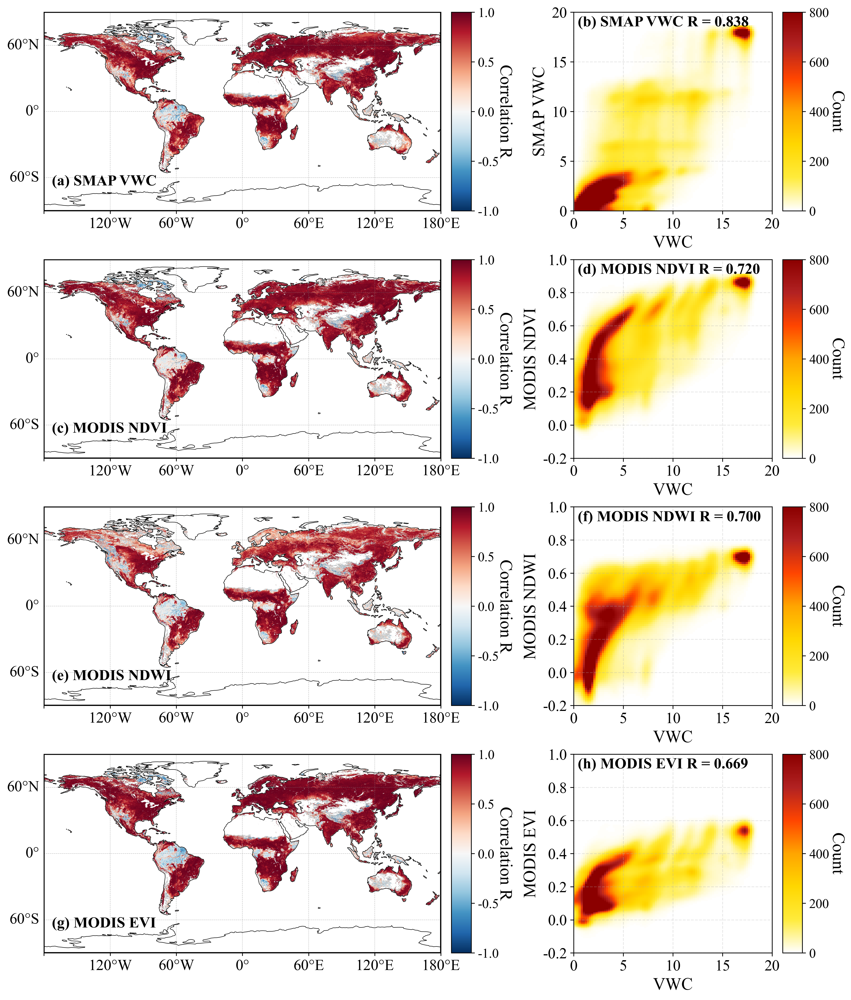

In [17]:
import os

import numpy as np
import rasterio
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from matplotlib.colors import LinearSegmentedColormap, Normalize
import matplotlib.ticker as mticker
from matplotlib.patches import Rectangle
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
from scipy import stats
import scipy.ndimage as ndimage
from matplotlib.transforms import Bbox  # ★★用于单独保存子图bbox
import warnings

warnings.filterwarnings('ignore')

# ======================
# 0. 全局字体设置
# ======================
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["axes.unicode_minus"] = False
plt.rcParams.update({
    'font.size': 12,
    'axes.titlesize': 24,
    'axes.labelsize': 18,
    'xtick.labelsize': 16,
    'ytick.labelsize': 16
})

# ======================
# 1. 路径和参数设置
# ======================
corr_dir = r"G:\data\VWC\VWCMap\VIs_VWC_Corr"
pairs_file = os.path.join(corr_dir, "2020_VI_VWC_pairs.npz")
corr_files = {
    "SMAP VWC": os.path.join(corr_dir, "SMAPVWC_VWC_Corr.tif"),
    "NDVI": os.path.join(corr_dir, "NDVI_VWC_Corr.tif"),
    "NDWI": os.path.join(corr_dir, "NDWI_VWC_Corr.tif"),
    "EVI": os.path.join(corr_dir, "EVI_VWC_Corr.tif")
}
output_fig = r"G:\文章\HUITU\Fig\Map\Fig_Correlation_Matrix_Individual_Cbar.png"
subplot_labels = ['(a)', '(b)', '(c)', '(d)', '(e)', '(f)', '(g)', '(h)']

# 定义显示名称和数据键名
vi_names_display = ['SMAP VWC', 'MODIS NDVI', 'MODIS NDWI', 'MODIS EVI']
vi_keys = ['SMAP VWC', 'NDVI', 'NDWI', 'EVI']
scatter_key_map = {'SMAP VWC': 'SVWC', 'NDVI': 'NDVI', 'NDWI': 'NDWI', 'EVI': 'EVI'}

# ✅ 新：为每个 VI 指定对应的 VWC 键（严格配对）
vwc_key_map = {
    'SMAP VWC': 'VWC_for_SVWC',
    'NDVI': 'VWC_for_NDVI',
    'NDWI': 'VWC_for_NDWI',
    'EVI': 'VWC_for_EVI'
}

# ======================
# 2. 定义颜色条
# ======================
colors_corr = ["#053061", "#2166ac", "#4393c3", "#92c5de", "#d1e5f0",
               "#f7f7f7", "#fddbc7", "#f4a582", "#d6604d", "#b2182b", "#67001f"]

colors_density_spectral = [
    "#FFFFFF", "#FFEB3B", "#FFD700", "#FFA500",
    "#FF4500", "#B22222", "#8B0000"
]

cmap_corr = LinearSegmentedColormap.from_list("corr_cmap", colors_corr, N=256)
cmap_density = LinearSegmentedColormap.from_list("spectral_density", colors_density_spectral, N=256)
cmap_corr.set_bad(color="none")
norm_corr = Normalize(vmin=-1.0, vmax=1.0)

# ======================
# 3. 加载数据
# ======================
print("正在加载数据...")
corr_data = {}
for vi_key, corr_path in corr_files.items():
    if os.path.exists(corr_path):
        with rasterio.open(corr_path) as src:
            data = src.read(1).astype(float)
            data[data == -9999] = np.nan
            corr_data[vi_key] = {'data': data, 'bounds': src.bounds}
    else:
        corr_data[vi_key] = {'data': None, 'bounds': None}
        print(f"警告: 数据文件不存在 - {corr_path}")

pairs_loaded = {}
if os.path.exists(pairs_file):
    with np.load(pairs_file) as data:
        for key in data.files:
            pairs_loaded[key] = data[key]
    print(f"已加载有效值对文件: {pairs_file}")
    print("NPZ keys:", list(pairs_loaded.keys()))
else:
    print(f"错误: 有效值对文件不存在 - {pairs_file}")

# ======================
# 4. 创建画布
# ======================
fig = plt.figure(figsize=(18, 18), dpi=300)

# ★★ 保持你当前的“左右不压盖”布局：两列等宽
gs = fig.add_gridspec(
    4, 2,
    hspace=0.18,
    wspace=0.24,
    height_ratios=[1, 1, 1, 1],
    width_ratios=[1, 1]
)

# 自定义经度刻度（所有地图共用）
lon_ticks = np.arange(-180, 181, 60)
lon_labels = []
for lon in lon_ticks:
    if lon == -180:
        lon_labels.append("")          # 180°W 不显示
    elif lon == 0:
        lon_labels.append("0°")
    elif lon < 0:
        lon_labels.append(f"{abs(lon)}°W")
    else:
        lon_labels.append(f"{lon}°E")  # 180°E 显示

# ★★ 用于最后“按左侧地图图框”对齐右侧
map_axes = [None] * len(vi_keys)
scatter_axes = [None] * len(vi_keys)
scatter_caxes = [None] * len(vi_keys)

# ★★ 左侧色带轴（用于“左侧色带与地图等高”以及单独保存）
map_caxes = [None] * len(vi_keys)

# ======================
# 5&6. 左侧地图 + 右侧散点密度
# ======================
print("正在绘制全球相关性图与散点密度图...")

for i, (vi_key, vi_display_name) in enumerate(zip(vi_keys, vi_names_display)):

    # ----------------------
    # 左侧：地图（cell 内再分 2 列：主图 + 色带）
    # ----------------------
    left_sub = gs[i, 0].subgridspec(
        1, 2,
        width_ratios=[1, 0.05],
        wspace=0.05
    )

    ax_map = fig.add_subplot(left_sub[0, 0], projection=ccrs.PlateCarree())
    cax_map = fig.add_subplot(left_sub[0, 1])

    map_axes[i] = ax_map
    map_caxes[i] = cax_map

    if vi_key not in corr_data or corr_data[vi_key]['data'] is None:
        print(f"跳过: {vi_display_name} 数据不存在")
        ax_map.axis("off")
        cax_map.axis("off")
    else:
        data = corr_data[vi_key]['data']
        bounds = corr_data[vi_key]['bounds']
        extent = [bounds.left, bounds.right, bounds.bottom, bounds.top]

        im = ax_map.imshow(
            data,
            extent=extent,
            cmap=cmap_corr,
            norm=norm_corr,
            transform=ccrs.PlateCarree()
        )

        ax_map.add_patch(
            Rectangle(
                (extent[0], extent[2]),
                extent[1] - extent[0],
                extent[3] - extent[2],
                fill=False,
                edgecolor='black',
                linewidth=1.5,
                transform=ccrs.PlateCarree(),
                zorder=10
            )
        )
        ax_map.coastlines(linewidth=0.5, color='black')

        gl = ax_map.gridlines(
            draw_labels=True,
            linewidth=0.4,
            color="gray",
            linestyle="--",
            alpha=0.5
        )
        gl.xlocator = mticker.MultipleLocator(60)
        gl.ylocator = mticker.MultipleLocator(60)
        gl.xformatter = LONGITUDE_FORMATTER
        gl.yformatter = LATITUDE_FORMATTER
        gl.xlabel_style = gl.ylabel_style = {"size": 16}

        gl.top_labels = False
        gl.right_labels = False
        gl.bottom_labels = False   # 仍用你自定义的下侧经度刻度
        gl.left_labels = True      # 保留左侧纬度标签（所有地图都显示）

        ax_map.set_xticks(lon_ticks, crs=ccrs.PlateCarree())
        ax_map.set_xticklabels(lon_labels)
        ax_map.tick_params(
            axis='x',
            top=False, labeltop=False,
            bottom=True, labelbottom=True,
            length=3, width=0.8
        )

        label_idx = i * 2
        ax_map.text(
            0.02, 0.18,
            f'{subplot_labels[label_idx]} {vi_display_name}',
            transform=ax_map.transAxes,
            fontsize=16,
            fontweight='bold',
            verticalalignment='top',
            horizontalalignment='left',
            bbox=dict(boxstyle='round,pad=0.3', facecolor='none', alpha=0.8, edgecolor='none')
        )

        # 左侧色带：长方形（不带尖头）
        cbar = plt.colorbar(im, cax=cax_map, extend='neither')
        cbar.ax.tick_params(labelsize=14)
        cbar.set_label('Correlation R', fontsize=18, rotation=270, labelpad=14)

    # ----------------------
    # 右侧：散点密度（cell 内再分 2 列：主图 + 色带）
    # ----------------------
    right_sub = gs[i, 1].subgridspec(
        1, 2,
        width_ratios=[1, 0.05],
        wspace=0.05
    )
    ax_scatter = fig.add_subplot(right_sub[0, 0])
    cax_den = fig.add_subplot(right_sub[0, 1])

    scatter_axes[i] = ax_scatter
    scatter_caxes[i] = cax_den

    scatter_key = scatter_key_map.get(vi_key, vi_key)
    vwc_key = vwc_key_map.get(vi_key, None)

    # ✅ 新：检查“VI + 对应VWC”是否存在
    if (pairs_loaded is None) or (len(pairs_loaded) == 0) or (scatter_key not in pairs_loaded) or (vwc_key is None) or (vwc_key not in pairs_loaded):
        print(f"跳过: 数据中未找到 {scatter_key} 或 {vwc_key}")
        ax_scatter.axis("off")
        cax_den.axis("off")
        continue

    # ✅ 新：使用严格配对的 VWC_for_xxx，而不是单一 VWC
    x_clean = pairs_loaded[vwc_key].astype(np.float64)   # VWC
    y_clean = pairs_loaded[scatter_key].astype(np.float64)  # VI

    # 这里二者应天然同长度；仍做一个兜底检查（不做强行截断配对）
    if x_clean.shape[0] != y_clean.shape[0]:
        print(f"[WARN] {vi_display_name}: length mismatch (VWC={x_clean.size}, VI={y_clean.size}). "
              f"Please regenerate npz with paired extraction.")
        ax_scatter.axis("off")
        cax_den.axis("off")
        continue

    mask = ~np.isnan(x_clean) & ~np.isnan(y_clean)
    x_clean = x_clean[mask]
    y_clean = y_clean[mask]

    print(f"  {vi_display_name}: 处理点数 {len(x_clean)}")

    if len(x_clean) > 100:
        bins = 100
        data_grid, x_edges, y_edges = np.histogram2d(x_clean, y_clean, bins=bins)
        density_grid = ndimage.gaussian_filter(data_grid, sigma=1.5)


        im_density = ax_scatter.imshow(
            density_grid.T,
            origin='lower',
            extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]],
            cmap=cmap_density,
            aspect='auto',
            vmin=0,
            vmax=800)


        r_value, _ = stats.pearsonr(x_clean, y_clean)

        label_idx = i * 2 + 1
        stats_text = f"R = {r_value:.3f}"
        ax_scatter.text(
            0.02, 0.98,
            f'{subplot_labels[label_idx]} {vi_display_name} {stats_text}',
            transform=ax_scatter.transAxes,
            fontsize=16,
            fontweight='bold',
            verticalalignment='top',
            horizontalalignment='left',
            bbox=dict(boxstyle='round,pad=0.2', facecolor='none', alpha=0.8, edgecolor='none')
        )

        ax_scatter.set_xlabel('VWC', fontsize=18)
        ax_scatter.set_ylabel(vi_display_name, fontsize=18)
        ax_scatter.grid(True, linestyle='--', alpha=0.3)

        if vi_key == 'SMAP VWC':
            ax_scatter.set_xlim(0, 20)
            ax_scatter.set_ylim(0, 20)
            ax_scatter.set_xticks([0, 5, 10, 15, 20])
            ax_scatter.set_yticks([0, 5, 10, 15, 20])
        elif vi_key in ['NDVI', 'EVI']:
            ax_scatter.set_xlim(0, 20)
            ax_scatter.set_ylim(-0.2, 1)
            ax_scatter.set_xticks([0, 5, 10, 15, 20])
            ax_scatter.set_yticks([-0.2, 0, 0.2, 0.4, 0.6, 0.8, 1.0])
        elif vi_key == 'NDWI':
            # ✅ 只改这里：NDWI 的 y 轴范围更合理（不影响计算，只影响显示）
            ax_scatter.set_xlim(0, 20)
            ax_scatter.set_ylim(-0.2, 1)
            ax_scatter.set_xticks([0, 5, 10, 15, 20])
            ax_scatter.set_yticks([-0.2, 0, 0.2, 0.4, 0.6, 0.8, 1.0])

        cbar_d = plt.colorbar(im_density, cax=cax_den)
        cbar_d.set_ticks([0, 200, 400, 600, 800])
        cbar_d.set_ticklabels(['0', '200', '400', '600', '800'])
        cbar_d.ax.tick_params(labelsize=14)
        cbar_d.set_label('Count', fontsize=18, rotation=270, labelpad=16)
    else:
        print(f"  {vi_display_name}: 有效数据点不足100个，跳过散点图绘制")
        ax_scatter.axis("off")
        cax_den.axis("off")

# ======================
# 7. 关键：对齐色带/右侧图框 + 右侧主图变正方形
# ======================
plt.suptitle('', fontsize=16, fontweight='bold', y=0.98)
plt.tight_layout(rect=[0, 0, 1, 1])

# ★★ 必须 draw 一次，Cartopy 才会把左侧 GeoAxes 的 bbox（缩小后的）真正算出来
fig.canvas.draw()

# ★★ 1) 让左侧颜色条与左侧地图“图框”等高（只调 y0/height，不动 x/width）
for i in range(len(vi_keys)):
    if map_axes[i] is None or map_caxes[i] is None:
        continue
    if (not map_axes[i].axison) or (not map_caxes[i].axison):
        continue

    pos_map = map_axes[i].get_position()
    pos_cax = map_caxes[i].get_position()
    map_caxes[i].set_position([pos_cax.x0, pos_map.y0, pos_cax.width, pos_map.height])

# ★★ 2) 右侧：先把 y0/height 对齐左侧地图，然后把“显示长度”做成正方形（width=height）
for i in range(len(vi_keys)):
    if map_axes[i] is None or scatter_axes[i] is None or scatter_caxes[i] is None:
        continue
    if (not map_axes[i].get_visible()) or (not scatter_axes[i].get_visible()) or (not scatter_caxes[i].get_visible()):
        continue

    pos_map = map_axes[i].get_position()
    pos_sc  = scatter_axes[i].get_position()
    pos_cax = scatter_caxes[i].get_position()

    # 右侧主图目标高度（与左侧地图图框等高）
    target_h = pos_map.height

    # 右侧主图目标宽度：要求“横轴显示长度 = 纵轴显示长度”
    # 一般 pos_sc.width > target_h，此时会变窄成正方形；若不足则不强行扩展（避免压盖）
    target_w = min(pos_sc.width, target_h)

    # 保持原有主图与色带之间的水平间距（gap）
    gap = pos_cax.x0 - (pos_sc.x0 + pos_sc.width)

    # 右侧主图：设置为正方形框，且与左侧地图 y0/height 对齐
    scatter_axes[i].set_position([pos_sc.x0, pos_map.y0, target_h, target_h])

    # 右侧色带：同样跟随主图的 y0/height，并贴着主图（保持原 gap）
    new_cax_x0 = pos_sc.x0 + target_w + gap
    scatter_caxes[i].set_position([new_cax_x0, pos_map.y0, pos_cax.width, target_h])

# ======================
# 8. 保存图片（分别保存每张子图，而不是保存总图）
# ======================
os.makedirs(os.path.dirname(output_fig), exist_ok=True)

def _save_subplot(fig, ax_main, ax_cbar, out_path, pad_scale=(1.02, 1.06)):
    renderer = fig.canvas.get_renderer()
    bboxes = []

    if ax_main is not None and ax_main.get_visible():
        bb = ax_main.get_tightbbox(renderer)
        if bb is not None:
            bboxes.append(bb)

    if ax_cbar is not None and ax_cbar.get_visible():
        bb = ax_cbar.get_tightbbox(renderer)
        if bb is not None:
            bboxes.append(bb)

    if len(bboxes) == 0:
        return

    bb_union = Bbox.union(bboxes).expanded(pad_scale[0], pad_scale[1])
    bb_inch = bb_union.transformed(fig.dpi_scale_trans.inverted())
    fig.savefig(out_path, dpi=300, bbox_inches=bb_inch, facecolor='white')

# ★★ 先确保渲染完成（tightbbox需要）
fig.canvas.draw()

base, ext = os.path.splitext(output_fig)
if ext.lower() not in [".png", ".jpg", ".jpeg", ".tif", ".tiff"]:
    ext = ".png"

# # 逐一保存 (a)-(h) 共8张：每张包含“主图 + 对应色带”
# for i in range(len(vi_keys)):
#     # 左侧地图：(a)(c)(e)(g)
#     label_map = subplot_labels[i * 2].strip("()")
#     out_map = f"{base}_{label_map}{ext}"
#     if map_axes[i] is not None and map_caxes[i] is not None and map_axes[i].get_visible():
#         _save_subplot(fig, map_axes[i], map_caxes[i], out_map)
#
#     # 右侧散点密度：(b)(d)(f)(h)
#     label_sc = subplot_labels[i * 2 + 1].strip("()")
#     out_sc = f"{base}_{label_sc}{ext}"
#     if scatter_axes[i] is not None and scatter_caxes[i] is not None and scatter_axes[i].get_visible():
#         _save_subplot(fig, scatter_axes[i], scatter_caxes[i], out_sc)
# print("绘图完成！")
# print(f"子图已分别保存（前缀）: {base}_a ... {base}_h")

fig.savefig(output_fig, dpi=300, bbox_inches="tight", facecolor="white")
plt.show()


## 1’ 高斯核密度计算散点图（会很慢）

# 8 全球制图

## 8.1 VWC全球制图

### 8.1.1 使用之前单波段的数据绘制产品

In [ ]:
import os
import numpy as np
import rasterio
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from matplotlib.colors import LinearSegmentedColormap, Normalize
import matplotlib.ticker as mticker
from matplotlib.patches import Rectangle
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER

# ======================
# 0. 全局字体（与 Fig.4 统一）
# ======================
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams['mathtext.fontset'] = 'stix'  # 数学字体也使用Times New Roman风格
plt.rcParams["axes.unicode_minus"] = False

# ======================
# 1. 数据路径
# ======================
ROOT = r"G:\data\VWC\VWCMap\Monthly"
FILE_PATTERN = "VWC-2020{:02d}.tif"

month_names = [
    "Jan", "Feb", "Mar", "Apr",
    "May", "Jun", "Jul", "Aug",
    "Sep", "Oct", "Nov", "Dec"
]

# ======================
# 2. 颜色映射（逐月 VWC 样式，保持不变）
# ======================
colors = [
    '#fe3c19',  # 0
    '#ffac18',  # 5
    '#f2fe2a',  # 10
    '#7cb815',  # 15
    '#147218'   # 20
]

cmap_vwc = LinearSegmentedColormap.from_list(
    "vwc_cmap", colors, N=256
)
cmap_vwc.set_bad("none")

norm = Normalize(vmin=0.0, vmax=20.0)

# ======================
# 3. 创建画布（4 × 3，与 Fig.4 风格一致）
# ======================
fig, axes = plt.subplots(
    4, 3,
    figsize=(16, 12),
    subplot_kw={"projection": ccrs.PlateCarree()},
    gridspec_kw={"hspace": 0.06, "wspace": 0.05}
)

# ======================
# 4. 循环绘制 12 个月
# ======================
idx = 0
for row in range(4):
    for col in range(3):

        ax = axes[row, col]

        fp = os.path.join(ROOT, FILE_PATTERN.format(idx + 1))
        with rasterio.open(fp) as src:
            data = src.read(1).astype(float)
            data[data == -9999] = np.nan

            extent = [
                src.bounds.left,
                src.bounds.right,
                src.bounds.bottom,
                src.bounds.top
            ]

        im = ax.imshow(
            data,
            extent=extent,
            cmap=cmap_vwc,
            norm=norm,
            transform=ccrs.PlateCarree()
        )

        ax.add_patch(Rectangle(
            (extent[0], extent[2]),         # 左下角
            extent[1]-extent[0],            # 宽度
            extent[3]-extent[2],            # 高度
            fill=False,
            edgecolor='black',
            linewidth=1.5,
            transform=ccrs.PlateCarree(),
            zorder=10
        ))

        # -------- Gridlines（完全按 Fig.4）--------
        gl = ax.gridlines(
            crs=ccrs.PlateCarree(),
            draw_labels=True,
            linewidth=0.4,
            linestyle="--",
            color="gray",
            alpha=0.5
        )

        gl.top_labels = False
        gl.right_labels = False

        gl.xlocator = mticker.MultipleLocator(60)
        gl.ylocator = mticker.MultipleLocator(60)

        def lon_fmt_no_180W(x, pos):
            if np.isclose(x, -180):
                return ""
            return LONGITUDE_FORMATTER(x, pos)

        gl.xformatter = mticker.FuncFormatter(lon_fmt_no_180W)
        gl.yformatter = LATITUDE_FORMATTER

        gl.xlabel_style = {"size": 14}
        gl.ylabel_style = {"size": 14}

        if col != 0:
            gl.left_labels = False
        if row != 3:
            gl.bottom_labels = False

        ax.coastlines(linewidth=0.6)

        # -------- 子图标题（逐月风格，但 Fig.4 字号与加粗）--------
        ax.set_title(
            month_names[idx],
            fontsize=16,
            fontweight="bold",
            pad=6
        )

        idx += 1

# ======================
# 5. 颜色条（放在第 4 行下方，Fig.4 方式）
# ======================
cax = fig.add_axes([0.25, 0.08, 0.5, 0.01])

cbar = fig.colorbar(
    im,
    cax=cax,
    orientation="horizontal"
)
cbar.set_label(
    "Vegetation Water Content (kg/m²)",
    fontsize=20,
    fontweight="bold"
)
cbar.set_ticks(np.arange(0, 21, 5))
cbar.ax.tick_params(
    labelsize=12,
    length=5,
    width=1
)

# ======================
# 6. 保存并显示
# ======================
save_path = r"G:\文章\HUITU\Fig\Map\Fig4. VWC 2020 Monthly Map Single Band.png"

plt.savefig(
    save_path,
    dpi=500,
    bbox_inches="tight"
)
plt.show()


### 8.1.2 使用加入掩膜后生成的多波段的数据绘制产品

In [ ]:
import os
import numpy as np
import rasterio
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from matplotlib.colors import LinearSegmentedColormap, Normalize
import matplotlib.ticker as mticker
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER

# ======================
# 0. 全局字体（与 Fig.4 统一）
# ======================
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams['mathtext.fontset'] = 'stix'  # 数学字体也使用Times New Roman风格
plt.rcParams["axes.unicode_minus"] = False

# ======================
# 1. 数据路径
# ======================
ROOT = r"G:\data\VWC\VWCMap\Monthly_with_Mask"
FILE_PATTERN = "VWC-2015{:02d}.tif"

month_names = [
    "Jan", "Feb", "Mar", "Apr",
    "May", "Jun", "Jul", "Aug",
    "Sep", "Oct", "Nov", "Dec"
]

# ======================
# 2. 颜色映射（逐月 VWC 样式，保持不变）
# ======================
colors = [
    '#fe3c19',  # 0
    '#ffac18',  # 5
    '#f2fe2a',  # 10
    '#7cb815',  # 15
    '#147218'   # 20
]

cmap_vwc = LinearSegmentedColormap.from_list(
    "vwc_cmap", colors, N=256
)
cmap_vwc.set_bad("none")

norm = Normalize(vmin=0.0, vmax=20.0)

# ======================
# 3. 创建画布（4 × 3，与 Fig.4 风格一致）
# ======================
fig, axes = plt.subplots(
    4, 3,
    figsize=(16, 12),
    subplot_kw={"projection": ccrs.PlateCarree()},
    gridspec_kw={"hspace": 0.06, "wspace": 0.05}
)

# ======================
# 4. 循环绘制 12 个月
# ======================
idx = 0
for row in range(4):
    for col in range(3):

        ax = axes[row, col]

        fp = os.path.join(ROOT, FILE_PATTERN.format(idx + 1))
        with rasterio.open(fp) as src:
            data = src.read(1).astype(float)
            data[data == -9999] = np.nan

            extent = [
                src.bounds.left,
                src.bounds.right,
                src.bounds.bottom,
                src.bounds.top
            ]

        im = ax.imshow(
            data,
            extent=extent,
            cmap=cmap_vwc,
            norm=norm,
            transform=ccrs.PlateCarree()
        )

        # -------- Gridlines（完全按 Fig.4）--------
        gl = ax.gridlines(
            crs=ccrs.PlateCarree(),
            draw_labels=True,
            linewidth=0.4,
            linestyle="--",
            color="gray",
            alpha=0.5
        )

        gl.top_labels = False
        gl.right_labels = False

        gl.xlocator = mticker.MultipleLocator(60)
        gl.ylocator = mticker.MultipleLocator(60)

        def lon_fmt_no_180E(x, pos):
            if np.isclose(x, 180):
                return ""
            return LONGITUDE_FORMATTER(x, pos)

        gl.xformatter = mticker.FuncFormatter(lon_fmt_no_180E)
        gl.yformatter = LATITUDE_FORMATTER

        gl.xlabel_style = {"size": 12}
        gl.ylabel_style = {"size": 12}

        if col != 0:
            gl.left_labels = False
        if row != 3:
            gl.bottom_labels = False

        ax.coastlines(linewidth=0.6)

        # -------- 子图标题（逐月风格，但 Fig.4 字号与加粗）--------
        ax.set_title(
            month_names[idx],
            fontsize=16,
            fontweight="bold",
            pad=6
        )

        idx += 1

# ======================
# 5. 颜色条（放在第 4 行下方，Fig.4 方式）
# ======================
cax = fig.add_axes([0.25, 0.08, 0.5, 0.01])

cbar = fig.colorbar(
    im,
    cax=cax,
    orientation="horizontal"
)
cbar.set_label(
    "Vegetation Water Content (kg/m²)",
    fontsize=16,
    fontweight="bold"
)
cbar.set_ticks(np.arange(0, 21, 5))
cbar.ax.tick_params(
    labelsize=12,
    length=5,
    width=1
)


# ======================
# 6. 保存并显示
# ======================
save_path = r"G:\文章\HUITU\Fig\Map\Fig4. VWC 2015 Monthly Map QC Band.png"

plt.savefig(
    save_path,
    dpi=500,
    bbox_inches="tight"
)
plt.show()


# 9 Discussion 章节相关

## 9.1 模型输入敏感性分析绘图

### 预备数据计算

In [ ]:
# elasticity_daily_2020_full_fallback.py
# ------------------------------------------------------------
# Daily elasticity (sensitivity) analysis for 2020
# - Samples 10,000 valid pixels per day (if fewer, use all valid)
# - LAI interpolation + NaN handling: SAME as your production script
# - PFT loading/resampling: SAME as your production script
# - QC rules: SAME as your production script
# - VOD reader: try h5py first (MAT v7.3). If fails, fallback to scipy.io.loadmat (MAT v7/v6)
# ------------------------------------------------------------

import os
import sys
import random
import warnings
import numpy as np
import pandas as pd
import joblib
import h5py
from datetime import datetime, timedelta
from tqdm import tqdm

warnings.filterwarnings("ignore")

# ============================== CONFIG ==============================
SEED = 42
random.seed(SEED)
np.random.seed(SEED)

YEAR = 2020
SAMPLES_PER_DAY = 10_000

# Elasticity perturbation settings
EPS_CONT = 0.05      # 5% relative perturbation for continuous variables
X_MIN = 1e-3         # avoid division blow-ups when x ~ 0
Y_MIN = 1e-3         # avoid division blow-ups when yhat ~ 0
DELTA_PFT = 0.02     # absolute share transfer within 10 veg PFT fractions (0-1)

# Optional stricter filtering for analysis:
# Production prediction uses valid_mask (no NaNs) and does NOT filter QC by default.
FILTER_GOOD_QC = False  # True => (vod_qc==0) & (veg_qc==0)

# ------------------ PATHS (EDIT THESE) ------------------
VOD_BASE_PATH = r"G:\data\VOD\mat\kuxcVOD\ASC"
LAI_BASE_PATH = r"G:\data\GLASS LAI\mat\0.1Deg\Dataset"
PFT_BASE_PATH = r"G:\data\ESACCI PFT\Resample\Data"
Hveg_PATH     = r"G:\data\CanopyHeight\CH.mat"

MODEL_PATH = os.path.join(os.getcwd(), "models", "RFR_6VOD_LAI_PFTs_Hveg.pkl")

OUT_DIR = os.path.join(os.getcwd(), "elasticity_out")
os.makedirs(OUT_DIR, exist_ok=True)

OUT_DAILY_CSV = os.path.join(OUT_DIR, f"elasticity_{YEAR}_daily_rows.csv")
OUT_SUMMARY_CSV = os.path.join(OUT_DIR, f"elasticity_{YEAR}_summary.csv")
OUT_SKIP_LOG = os.path.join(OUT_DIR, f"elasticity_{YEAR}_skipped_files.csv")

# ============================== MODEL ==============================
if not os.path.exists(MODEL_PATH):
    print("Model not found:", MODEL_PATH)
    sys.exit(1)

MODEL = joblib.load(MODEL_PATH)
MODEL_FEATURES = list(getattr(MODEL, "feature_names_in_", []))

# Expected feature names from your production prepare_features()
VOD_KEYS = [
    "VOD_Ku_Hpol_Asc", "VOD_Ku_Vpol_Asc",
    "VOD_X_Hpol_Asc",  "VOD_X_Vpol_Asc",
    "VOD_C_Hpol_Asc",  "VOD_C_Vpol_Asc"
]
PFT_FEATURES = [
    "Grass_man", "Grass_nat",
    "Shrub_bd", "Shrub_be", "Shrub_nd", "Shrub_ne",
    "Tree_bd", "Tree_be", "Tree_nd", "Tree_ne"
]
ALL_FEATURES = VOD_KEYS + ["LAI", "Hveg"] + PFT_FEATURES

# Mapping used in your PFT code (feature->pft_key)
PFT_KEYMAP = {
    "Grass_man": "grassman",
    "Grass_nat": "grassnat",
    "Shrub_bd":  "shrubbd",
    "Shrub_be":  "shrubbe",
    "Shrub_nd":  "shrubnd",
    "Shrub_ne":  "shrubne",
    "Tree_bd":   "treebd",
    "Tree_be":   "treebe",
    "Tree_nd":   "treend",
    "Tree_ne":   "treene",
}
VEG_PFT_KEYS = [
    "grassnat", "grassman", "shrubbd", "shrubbe",
    "shrubnd", "shrubne", "treebd", "treebe",
    "treend", "treene"
]

# ============================== CACHES ==============================
LAI_MONTH_CACHE = {}
PFT_YEAR_CACHE = {}

# ============================== FILE LOCATORS ==============================
def get_vod_file(date):
    date_str = date.strftime("%Y%m%d")
    candidates = [
        f"MCCA_AMSR2_010D_CCXH_VSM_VOD_Asc_{date_str}_V0.nc4.mat",
        f"MCCA_AMSR2_010D_CCXH_VSM_VOD_Asc_{date_str}_V0.mat",
        f"MCCA_AMSRE_010D_CCXH_VSM_VOD_Asc_{date_str}_V0.nc4.mat",
        f"MCCA_AMSRE_010D_CCXH_VSM_VOD_Asc_{date_str}.mat",
    ]
    for fn in candidates:
        fp = os.path.join(VOD_BASE_PATH, fn)
        if os.path.exists(fp):
            return fp
    return None

def get_lai_file(year, month):
    month_str = str(month).zfill(2)
    fp = os.path.join(LAI_BASE_PATH, f"{year}-{month_str}-01.tif.mat")
    return fp if os.path.exists(fp) else None

def get_pft_file(year):
    candidates = [
        f"{year}.mat",
        f"PFT_{year}.mat",
        f"ESACCI_PFT_{year}.mat",
        f"pft_{year}.mat",
    ]
    for fn in candidates:
        fp = os.path.join(PFT_BASE_PATH, fn)
        if os.path.exists(fp):
            return fp
    return None

# ============================== LOADERS (MATCH PRODUCTION) ==============================
def load_hveg_matrix(hveg_path):
    with h5py.File(hveg_path, "r") as f:
        for key in ["Hveg", "CanopyHeight", "CH"]:
            if key in f:
                arr = np.array(f[key][:])
                break
        else:
            keys = list(f.keys())
            if not keys:
                raise ValueError("No datasets found in Hveg mat.")
            arr = np.array(f[keys[0]][:])
    if arr.shape == (3600, 1800):
        arr = arr.T
    if arr.shape != (1800, 3600):
        raise ValueError(f"Unsupported Hveg shape: {arr.shape}")
    return arr.astype(np.float32)

def load_lai_matrix(file_path):
    if (file_path is None) or (not os.path.exists(file_path)):
        return None
    with h5py.File(file_path, "r") as f:
        for key in ["lai", "Layer", "data"]:
            if key in f:
                lai_data = np.array(f[key][:])
                break
        else:
            keys = list(f.keys())
            if not keys:
                return None
            lai_data = np.array(f[keys[0]][:])
    if lai_data.shape == (3600, 1800):
        lai_data = lai_data.T
    if lai_data.shape != (1800, 3600):
        return None
    return lai_data.astype(np.float32)

def load_pft_matrix(file_path):
    """
    Copied/adapted from your production script logic.
    Returns dict of 14 layers (we will use 10 veg layers for features).
    """
    if (file_path is None) or (not os.path.exists(file_path)):
        return None

    pft_data = {}
    with h5py.File(file_path, "r") as f:
        pft_mapping = {
            "water":    ["water", "WATER"],
            "bare":     ["bare", "bareland", "BARE"],
            "snowice":  ["snowice", "snow", "ice", "SNOWICE"],
            "built":    ["built", "urban", "BUILT"],
            "grassnat": ["grassnat", "grass_natural", "GRASSNAT"],
            "grassman": ["grassman", "grass_managed", "GRASSMAN"],
            "shrubbd":  ["shrubbd", "shrub_bd", "SHRUBBD"],
            "shrubbe":  ["shrubbe", "shrub_be", "SHRUBBE"],
            "shrubnd":  ["shrubnd", "shrub_nd", "SHRUBND"],
            "shrubne":  ["shrubne", "shrub_ne", "SHRUBNE"],
            "treebd":   ["treebd", "tree_bd", "TREEBD"],
            "treebe":   ["treebe", "tree_be", "TREEBE"],
            "treend":   ["treend", "tree_nd", "TREEND"],
            "treene":   ["treene", "tree_ne", "TREENE"],
        }

        for target, aliases in pft_mapping.items():
            found = None
            for alias in aliases:
                if alias in f:
                    found = alias
                    break

            if found is None:
                # production: fill zeros if missing
                pft_data[target] = np.zeros((1800, 3600), dtype=np.float32)
                continue

            data = np.array(f[found][:])

            # production logic:
            if data.shape == (3600, 7200):
                data = np.rot90(data, k=-1)
                data = (data[:, ::2] + data[:, 1::2]) / 2.0
                pft_data[target] = data.T.astype(np.float32)
            elif data.shape == (3600, 1800):
                pft_data[target] = np.rot90(data, k=-1).astype(np.float32)
            elif data.shape == (1800, 3600):
                pft_data[target] = data.astype(np.float32)
            else:
                pft_data[target] = np.zeros((1800, 3600), dtype=np.float32)

    return pft_data

# ============================== VOD LOADER (h5py first, fallback to scipy.loadmat) ==============================
def load_vod_and_qc(vod_file):
    """
    Loads 6 VOD layers and QC, matching your production naming.
    Strategy:
      1) Try h5py (MAT v7.3 / HDF5)
      2) If h5py fails (file signature not found), fallback to scipy.io.loadmat (MAT v7/v6)
    Returns:
      vod_data: dict with keys in VOD_KEYS, each (1800,3600) float32 (NaN if missing)
      qc_data:  (1800,3600) uint-like array (we keep as loaded, later cast to uint8)
    """
    # Init with NaNs for safety
    vod_data = {k: np.full((1800, 3600), np.nan, dtype=np.float32) for k in VOD_KEYS}
    qc_data = None

    # mapping in your production: mat raw -> standard
    mat2std = {
        "ku_vod_h": "VOD_Ku_Hpol_Asc",
        "ku_vod_v": "VOD_Ku_Vpol_Asc",
        "x_vod_h":  "VOD_X_Hpol_Asc",
        "x_vod_v":  "VOD_X_Vpol_Asc",
        "c_vod_h":  "VOD_C_Hpol_Asc",
        "c_vod_v":  "VOD_C_Vpol_Asc",
        "qc":       "QC"
    }

    # ---------- 1) Try h5py (MAT v7.3) ----------
    try:
        with h5py.File(vod_file, "r") as f:
            # load VOD variables
            for key in f.keys():
                lk = key.lower()
                if lk in mat2std:
                    std = mat2std[lk]
                    arr = np.array(f[key][:])

                    # production uses .T for most layers
                    if arr.shape == (3600, 1800):
                        arr = arr.T
                    elif arr.shape == (1800, 3600):
                        pass
                    else:
                        # ignore unexpected shapes
                        continue

                    if std == "QC":
                        qc_data = arr
                    else:
                        vod_data[std] = arr.astype(np.float32)

            # QC must exist
            if qc_data is None and "QC" in f:
                arr = np.array(f["QC"][:, :])
                if arr.shape == (3600, 1800):
                    arr = arr.T
                qc_data = arr

        if qc_data is None:
            raise ValueError("QC not found in HDF5 MAT.")

        return vod_data, qc_data

    except OSError as e:
        # Not HDF5 -> fallback
        pass

    # ---------- 2) Fallback: scipy.io.loadmat (MAT v7/v6) ----------
    from scipy.io import loadmat
    md = loadmat(vod_file)

    def get_ci(d, name):
        """case-insensitive key lookup"""
        for k in d.keys():
            if k.lower() == name.lower():
                return k
        return None

    for raw in ["ku_vod_H", "ku_vod_V", "x_vod_H", "x_vod_V", "c_vod_H", "c_vod_V"]:
        k = get_ci(md, raw)
        if k is None:
            continue
        arr = md[k]
        # MATLAB arrays may be 2D; ensure (1800,3600)
        if arr.shape == (3600, 1800):
            arr = arr.T
        vod_data[mat2std[raw.lower()]] = arr.astype(np.float32)

    kqc = get_ci(md, "QC")
    if kqc is None:
        raise ValueError(f"QC not found in MAT (fallback) file: {vod_file}")
    qc = md[kqc]
    if qc.shape == (3600, 1800):
        qc = qc.T
    qc_data = qc

    return vod_data, qc_data

# ============================== LAI INTERPOLATION (MATCH PRODUCTION) ==============================
def get_month_centers(date):
    current_mid = date.replace(day=15)
    if date.day <= 15:
        prev_mid = (current_mid - timedelta(days=30)).replace(day=15)
        next_mid = current_mid
    else:
        prev_mid = current_mid
        next_mid = (current_mid + timedelta(days=30)).replace(day=15)
    return prev_mid, next_mid

def get_lai_month_cached(year, month):
    key = (year, month)
    if key in LAI_MONTH_CACHE:
        return LAI_MONTH_CACHE[key]
    fp = get_lai_file(year, month)
    if fp is None:
        return None
    arr = load_lai_matrix(fp)
    if arr is not None:
        LAI_MONTH_CACHE[key] = arr
    return arr

def load_lai_daily_interpolated(date):
    prev_mid, next_mid = get_month_centers(date)

    lai_prev = get_lai_month_cached(prev_mid.year, prev_mid.month)
    lai_next = get_lai_month_cached(next_mid.year, next_mid.month)
    if (lai_prev is None) or (lai_next is None):
        return None

    total_days = (next_mid - prev_mid).days
    current_offset = (date - prev_mid).days
    weight = current_offset / total_days

    lai = lai_prev * (1 - weight) + lai_next * weight
    lai = np.nan_to_num(lai, nan=0.0)  # EXACTLY like production
    return lai.astype(np.float32)

# ============================== QC (MATCH PRODUCTION) ==============================
def compute_veg_qc(pft_data):
    vegetation_fraction = np.zeros((1800, 3600), dtype=np.float32)
    for k in VEG_PFT_KEYS:
        vegetation_fraction += pft_data[k] / 100.0
    non_veg = 1.0 - vegetation_fraction

    veg_qc = np.zeros((1800, 3600), dtype=np.uint8)
    veg_qc[non_veg >= 0.05] = 1
    veg_qc[np.isnan(non_veg)] = 255
    return veg_qc

def compute_vod_qc(qc_data, vod_data, pft_data, hveg_data):
    """
    Same as your production process_one_date():
    - input_vars_has_nan checks: 6 VOD, Hveg, 10 veg PFT (LAI not included)
    - qc bits from low 8 bits (uint8)
    - assignment order: 6 -> 5 -> 4 -> 3 -> 2 -> 1 -> 0
    """
    input_vars_has_nan = np.zeros((1800, 3600), dtype=bool)

    for k in VOD_KEYS:
        input_vars_has_nan |= np.isnan(vod_data[k])

    if hveg_data is not None:
        input_vars_has_nan |= np.isnan(hveg_data)

    for k in VEG_PFT_KEYS:
        input_vars_has_nan |= np.isnan(pft_data[k])

    vod_qc = np.zeros((1800, 3600), dtype=np.uint8)

    qc_uint8 = qc_data.astype(np.uint8)
    frozen_mask = (qc_uint8 & 0b00000001) != 0
    rfi_polar_mask = (qc_uint8 & 0b00000010) != 0
    rfi_spec_mask_medium = ((qc_uint8 & 0b00001100) >> 2) == 1
    rfi_spec_mask_severe = ((qc_uint8 & 0b00001100) >> 2) == 2
    snow_ice_mask = (qc_uint8 & 0b00010000) != 0
    fill_mask = (qc_uint8 == 255)

    # 6
    vod_qc[fill_mask] = 6
    vod_qc[input_vars_has_nan] = 6

    valid_for_other = (~fill_mask) & (~input_vars_has_nan)

    # 5
    vod_qc[valid_for_other & snow_ice_mask] = 5

    # 4
    remaining = (vod_qc == 0)
    vod_qc[remaining & rfi_spec_mask_severe] = 4

    # 3
    remaining = (vod_qc == 0)
    vod_qc[remaining & rfi_spec_mask_medium] = 3

    # 2
    remaining = (vod_qc == 0)
    vod_qc[remaining & rfi_polar_mask] = 2

    # 1
    remaining = (vod_qc == 0)
    vod_qc[remaining & frozen_mask] = 1

    # 0
    remaining = (vod_qc == 0)
    vod_qc[remaining & (qc_uint8 == 0)] = 0

    return vod_qc, input_vars_has_nan

# ============================== FEATURE MATRIX (MATCH PRODUCTION ORDER) ==============================
def build_features(vod_data, lai_data, pft_data, hveg_data, valid_mask):
    idx = np.where(valid_mask)
    n = len(idx[0])
    if n == 0:
        return None, None, None

    cols = []
    names = []

    # 6 VOD
    for k in VOD_KEYS:
        cols.append(vod_data[k][idx])
        names.append(k)

    # LAI
    cols.append(lai_data[idx])
    names.append("LAI")

    # Hveg
    cols.append(hveg_data[idx])
    names.append("Hveg")

    # 10 veg PFTs (scaled to 0-1)
    for nm in PFT_FEATURES:
        pkey = PFT_KEYMAP[nm]
        cols.append((pft_data[pkey] / 100.0)[idx])
        names.append(nm)

    X = np.column_stack(cols).astype(np.float32)
    return X, names, idx

def reorder_to_model(X, names):
    if MODEL_FEATURES and names != MODEL_FEATURES:
        m = {n: i for i, n in enumerate(names)}
        missing = [n for n in MODEL_FEATURES if n not in m]
        if missing:
            raise ValueError(f"Missing required features for model: {missing}")
        X = X[:, [m[n] for n in MODEL_FEATURES]]
        names = MODEL_FEATURES
    return X, names

# ============================== ELASTICITY ==============================
def elasticity_continuous(model, X, yhat, col_idx, eps=EPS_CONT):
    x = X[:, col_idx].astype(np.float32)
    dx = eps * np.maximum(np.abs(x), X_MIN)
    Xp = X.copy()
    Xp[:, col_idx] = x + dx
    y1 = model.predict(Xp).astype(np.float32)
    dy = y1 - yhat
    E = (dy / np.maximum(np.abs(yhat), Y_MIN)) / (dx / np.maximum(np.abs(x), X_MIN))
    return E

def elasticity_pft_swap(model, X, yhat, pft_col_idx_in_10, pft_cols_all, delta=DELTA_PFT):
    """
    Swap-based perturbation within the 10 vegetation PFT fractions
    (keeps sum over these 10 columns constant for each sample).
    """
    p = X[:, pft_cols_all].astype(np.float32)  # (N,10)
    veg_sum = p.sum(axis=1)
    pk = p[:, pft_col_idx_in_10].copy()

    rem = np.maximum(veg_sum - pk, 0.0)
    feasible = rem > 1e-8
    if feasible.sum() == 0:
        return np.full_like(yhat, np.nan, dtype=np.float32)

    pk_new = pk.copy()
    pk_new[feasible] = np.minimum(pk[feasible] + delta, veg_sum[feasible])
    used = pk_new - pk  # actual delta used

    p_new = p.copy()
    p_new[:, pft_col_idx_in_10] = pk_new

    other = p.copy()
    other[:, pft_col_idx_in_10] = 0.0
    other_sum = other.sum(axis=1)

    scale = np.ones_like(other_sum, dtype=np.float32)
    ok = other_sum > 1e-8
    scale[ok] = (other_sum[ok] - used[ok]) / other_sum[ok]
    scale[~ok] = 1.0

    for j in range(p.shape[1]):
        if j == pft_col_idx_in_10:
            continue
        p_new[:, j] = p[:, j] * scale

    Xp = X.copy()
    Xp[:, pft_cols_all] = p_new
    y1 = model.predict(Xp).astype(np.float32)

    dy = y1 - yhat
    dp = used
    E = (dy / np.maximum(np.abs(yhat), Y_MIN)) / (dp / np.maximum(np.abs(pk), X_MIN))
    E[~feasible] = np.nan
    return E

# ============================== MAIN ==============================
def date_range_daily_year(year):
    start = datetime(year, 1, 1)
    end = datetime(year, 12, 31)
    d = start
    out = []
    while d <= end:
        out.append(d)
        d += timedelta(days=1)
    return out

def append_skip(date, vod_fp, reason):
    row = pd.DataFrame([{
        "date": date.strftime("%Y-%m-%d"),
        "file": vod_fp if vod_fp else "",
        "reason": str(reason)
    }])
    header = not os.path.exists(OUT_SKIP_LOG)
    row.to_csv(OUT_SKIP_LOG, mode="a", header=header, index=False, encoding="utf-8-sig")

def main():
    # Clean output
    if os.path.exists(OUT_DAILY_CSV):
        os.remove(OUT_DAILY_CSV)
    if os.path.exists(OUT_SUMMARY_CSV):
        os.remove(OUT_SUMMARY_CSV)
    if os.path.exists(OUT_SKIP_LOG):
        os.remove(OUT_SKIP_LOG)

    # Load static datasets
    print("Loading Hveg...")
    hveg = load_hveg_matrix(Hveg_PATH)

    print("Loading PFT...")
    pft_fp = get_pft_file(YEAR)
    if pft_fp is None:
        raise FileNotFoundError(f"PFT file not found for year {YEAR}")
    pft_data = load_pft_matrix(pft_fp)
    if pft_data is None:
        raise RuntimeError("Failed to load PFT data")

    # Ensure required veg keys exist (fill zeros if absent)
    for k in VEG_PFT_KEYS:
        pft_data.setdefault(k, np.zeros((1800, 3600), dtype=np.float32))

    veg_qc = compute_veg_qc(pft_data)

    dates = date_range_daily_year(YEAR)

    missing_vod = 0
    missing_lai = 0
    processed_days = 0
    skipped_days = 0

    print(f"Start daily elasticity for {YEAR} (days={len(dates)}), samples/day={SAMPLES_PER_DAY}")
    for date in tqdm(dates, desc=f"Daily {YEAR}"):
        # --- VOD file path ---
        vod_fp = get_vod_file(date)
        if vod_fp is None:
            missing_vod += 1
            continue

        # --- VOD load with fallback ---
        try:
            vod_data, qc_data = load_vod_and_qc(vod_fp)
        except Exception as e:
            skipped_days += 1
            append_skip(date, vod_fp, e)
            continue

        # --- LAI (production-consistent interpolation + nan_to_num) ---
        lai_data = load_lai_daily_interpolated(date)
        if lai_data is None:
            missing_lai += 1
            append_skip(date, vod_fp, "LAI missing (prev/next month not found)")
            continue

        # --- QC arrays (production-consistent) ---
        try:
            vod_qc, _ = compute_vod_qc(qc_data, vod_data, pft_data, hveg)
        except Exception as e:
            skipped_days += 1
            append_skip(date, vod_fp, f"QC compute failed: {e}")
            continue

        # --- valid_mask (production-consistent for prediction) ---
        valid_mask = np.ones((1800, 3600), dtype=bool)

        # LAI NaN check (normally all True after nan_to_num)
        valid_mask &= ~np.isnan(lai_data)

        # VOD NaN
        for k in VOD_KEYS:
            valid_mask &= ~np.isnan(vod_data[k])

        # Hveg NaN
        valid_mask &= ~np.isnan(hveg)

        # PFT NaN
        for k in VEG_PFT_KEYS:
            valid_mask &= ~np.isnan(pft_data[k])

        if FILTER_GOOD_QC:
            valid_mask &= (vod_qc == 0) & (veg_qc == 0)

        n_valid = int(valid_mask.sum())
        if n_valid == 0:
            append_skip(date, vod_fp, "No valid pixels after mask/QC filters")
            continue

        # --- Build features ---
        try:
            X, names, _ = build_features(vod_data, lai_data, pft_data, hveg, valid_mask)
            if X is None:
                append_skip(date, vod_fp, "No valid pixels after feature build")
                continue
            X, names = reorder_to_model(X, names)
        except Exception as e:
            skipped_days += 1
            append_skip(date, vod_fp, f"Feature build/reorder failed: {e}")
            continue

        # --- Sample ---
        n = X.shape[0]
        take = min(SAMPLES_PER_DAY, n)
        sel = np.random.choice(n, size=take, replace=False)
        Xs = X[sel, :].astype(np.float32)

        # baseline prediction
        yhat = MODEL.predict(Xs).astype(np.float32)

        # indices
        name_to_i = {nm: i for i, nm in enumerate(names)}
        pft_cols_all = [name_to_i[nm] for nm in PFT_FEATURES if nm in name_to_i]
        if len(pft_cols_all) != 10:
            append_skip(date, vod_fp, "PFT columns not found or not 10 in model features")
            continue

        rows = []

        # Continuous: 6 VOD + LAI + Hveg
        for nm in VOD_KEYS + ["LAI", "Hveg"]:
            if nm not in name_to_i:
                continue
            E = elasticity_continuous(MODEL, Xs, yhat, name_to_i[nm], eps=EPS_CONT)
            rows.append([
                date.strftime("%Y-%m-%d"), nm, "continuous",
                int(np.isfinite(E).sum()),
                float(np.nanmedian(np.abs(E))),
                float(np.nanpercentile(np.abs(E), 25)),
                float(np.nanpercentile(np.abs(E), 75)),
            ])

        # PFT swap elasticities
        for j, nm in enumerate(PFT_FEATURES):
            E = elasticity_pft_swap(MODEL, Xs, yhat, pft_col_idx_in_10=j, pft_cols_all=pft_cols_all, delta=DELTA_PFT)
            rows.append([
                date.strftime("%Y-%m-%d"), nm, "pft_swap",
                int(np.isfinite(E).sum()),
                float(np.nanmedian(np.abs(E))),
                float(np.nanpercentile(np.abs(E), 25)),
                float(np.nanpercentile(np.abs(E), 75)),
            ])

        day_df = pd.DataFrame(rows, columns=[
            "date", "feature", "type", "n", "median_abs_E", "p25_abs_E", "p75_abs_E"
        ])

        header = not os.path.exists(OUT_DAILY_CSV)
        day_df.to_csv(OUT_DAILY_CSV, mode="a", header=header, index=False)

        processed_days += 1

    print(f"Done. processed_days={processed_days}, skipped_days={skipped_days}, missing_vod={missing_vod}, missing_lai={missing_lai}")
    print("Daily rows saved:", OUT_DAILY_CSV)
    print("Skipped log saved:", OUT_SKIP_LOG)

    # ---- Aggregate summary across days ----
    if os.path.exists(OUT_DAILY_CSV):
        df = pd.read_csv(OUT_DAILY_CSV)
        if not df.empty:
            summary = (df.groupby(["feature", "type"])
                         .agg(
                             n=("n", "sum"),
                             median_abs_E=("median_abs_E", "median"),
                             p25_abs_E=("p25_abs_E", "median"),
                             p75_abs_E=("p75_abs_E", "median"),
                         )
                         .reset_index()
                         .sort_values("median_abs_E", ascending=False))
            summary.to_csv(OUT_SUMMARY_CSV, index=False)
            print("Summary saved:", OUT_SUMMARY_CSV)
        else:
            print("Warning: daily CSV is empty, no summary produced.")
    else:
        print("Warning: daily CSV not found, no summary produced.")

if __name__ == "__main__":
    main()


### 相关绘图

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

daily_fp = r"d:\Python\jupyter\jupyter\VWC_RFRegression\elasticity_out\elasticity_2020_daily_rows.csv"
sum_fp   = r"d:\Python\jupyter\jupyter\VWC_RFRegression\elasticity_out\elasticity_2020_summary.csv"

daily = pd.read_csv(daily_fp)
summ  = pd.read_csv(sum_fp)

# --------- 0) 基础处理 ----------
daily["date"] = pd.to_datetime(daily["date"])
daily["month"] = daily["date"].dt.month

# 1) 年度敏感性排序（建议：continuous 和 pft_swap 分两张）
def plot_rank(df, title, topn=20):
    d = df.sort_values("median_abs_E", ascending=False).head(topn).copy()
    d = d.iloc[::-1]  # 反转以便 barh 从小到大
    plt.figure(figsize=(7, 6))
    plt.barh(d["feature"], d["median_abs_E"])
    plt.xlabel("Median |Elasticity| (annual)")
    plt.title(title)
    plt.tight_layout()
    plt.show()

plot_rank(summ[summ["type"]=="continuous"], "Annual elasticity ranking (continuous inputs)", topn=12)
plot_rank(summ[summ["type"]=="pft_swap"], "Annual elasticity ranking (PFT swap)", topn=12)

# 2) 月尺度季节性：挑选前N个最敏感变量，画月均值曲线
def plot_monthly_seasonality(daily_df, summary_df, etype="continuous", topn=6):
    top_feats = (summary_df[summary_df["type"]==etype]
                 .sort_values("median_abs_E", ascending=False)
                 .head(topn)["feature"].tolist())

    m = (daily_df[daily_df["feature"].isin(top_feats) & (daily_df["type"]==etype)]
         .groupby(["feature","month"])["median_abs_E"]
         .median()
         .reset_index())

    plt.figure(figsize=(8, 5))
    for f in top_feats:
        s = m[m["feature"]==f].sort_values("month")
        plt.plot(s["month"], s["median_abs_E"], marker="o", label=f)
    plt.xticks(range(1,13))
    plt.xlabel("Month")
    plt.ylabel("Median |Elasticity| (monthly median)")
    plt.title(f"Seasonality of elasticity (top {topn}, {etype})")
    plt.legend(ncol=2, fontsize=8)
    plt.tight_layout()
    plt.show()

plot_monthly_seasonality(daily, summ, etype="continuous", topn=6)

# 3) 离散度：对 topN 变量画“月尺度IQR带”（p25~p75）
def plot_monthly_iqr_band(daily_df, summary_df, etype="continuous", topn=3):
    top_feats = (summary_df[summary_df["type"]==etype]
                 .sort_values("median_abs_E", ascending=False)
                 .head(topn)["feature"].tolist())

    # 月聚合：对每月的 p25/p75 取中位数，稳健
    g = (daily_df[daily_df["feature"].isin(top_feats) & (daily_df["type"]==etype)]
         .groupby(["feature","month"])
         .agg(med=("median_abs_E","median"),
              p25=("p25_abs_E","median"),
              p75=("p75_abs_E","median"))
         .reset_index())

    for f in top_feats:
        s = g[g["feature"]==f].sort_values("month")
        plt.figure(figsize=(8, 4))
        plt.plot(s["month"], s["med"], marker="o")
        plt.fill_between(s["month"], s["p25"], s["p75"], alpha=0.2)
        plt.xticks(range(1,13))
        plt.xlabel("Month")
        plt.ylabel("Elasticity (|E|)")
        plt.title(f"Monthly elasticity with IQR band: {f} ({etype})")
        plt.tight_layout()
        plt.show()

plot_monthly_iqr_band(daily, summ, etype="continuous", topn=3)


### 空间分布地图数据制作

In [ ]:
# composite_inputs_2020_annual_and_seasonal.py
# ------------------------------------------------------------
# Build annual-mean and seasonal-mean INPUT composites for 2020
# - VOD loader: h5py first, scipy.io.loadmat fallback (MAT v7/v6)
# - LAI interpolation + nan_to_num: SAME as your production script
# - PFT loading/resampling: SAME as your production script
# - QC rules: SAME as your production script
# Output:
#   1) annual mean inputs (6 VOD + LAI) + counts
#   2) seasonal mean inputs (4 seasons) + counts
# ------------------------------------------------------------

import os
import sys
import warnings
import numpy as np
import h5py
from scipy.io import loadmat
from datetime import datetime, timedelta
from tqdm import tqdm

warnings.filterwarnings("ignore")

# ============================== CONFIG ==============================
YEAR = 2020

# Production-consistent: prediction only requires non-NaN inputs.
# Research option: keep only qc==0 and veg_qc==0
FILTER_GOOD_QC = False

# Optional: require at least N valid days to compute mean; else set NaN
MIN_VALID_DAYS_ANNUAL = 30
MIN_VALID_DAYS_SEASON = 10

# Season definition: "DJF" (DJF/MAM/JJA/SON) or "JFM" (JFM/AMJ/JAS/OND)
SEASON_DEF = "DJF"

# ------------------ PATHS (EDIT THESE) ------------------
VOD_BASE_PATH = r"G:\data\VOD\mat\kuxcVOD\ASC"
LAI_BASE_PATH = r"G:\data\GLASS LAI\mat\0.1Deg\Dataset"
PFT_BASE_PATH = r"G:\data\ESACCI PFT\Resample\Data"
Hveg_PATH     = r"G:\data\CanopyHeight\CH.mat"

OUT_DIR = os.path.join(os.getcwd(), "elasticity_out")
os.makedirs(OUT_DIR, exist_ok=True)

OUT_ANNUAL = os.path.join(OUT_DIR, f"composite_{YEAR}_annual_inputs.npz")
OUT_SEASON = os.path.join(OUT_DIR, f"composite_{YEAR}_seasonal_inputs.npz")

# ============================== CONSTANTS ==============================
ROWS, COLS = 1800, 3600

VOD_KEYS = [
    "VOD_Ku_Hpol_Asc", "VOD_Ku_Vpol_Asc",
    "VOD_X_Hpol_Asc",  "VOD_X_Vpol_Asc",
    "VOD_C_Hpol_Asc",  "VOD_C_Vpol_Asc"
]
VEG_PFT_KEYS = [
    "grassnat", "grassman", "shrubbd", "shrubbe",
    "shrubnd", "shrubne", "treebd", "treebe",
    "treend", "treene"
]

# Caches (same idea as your production)
LAI_MONTH_CACHE = {}
PFT_YEAR_CACHE = {}

# ============================== FILE LOCATORS ==============================
def get_vod_file(date):
    date_str = date.strftime("%Y%m%d")
    candidates = [
        f"MCCA_AMSR2_010D_CCXH_VSM_VOD_Asc_{date_str}_V0.nc4.mat",
        f"MCCA_AMSR2_010D_CCXH_VSM_VOD_Asc_{date_str}_V0.mat",
        f"MCCA_AMSRE_010D_CCXH_VSM_VOD_Asc_{date_str}_V0.nc4.mat",
        f"MCCA_AMSRE_010D_CCXH_VSM_VOD_Asc_{date_str}.mat",
    ]
    for fn in candidates:
        fp = os.path.join(VOD_BASE_PATH, fn)
        if os.path.exists(fp):
            return fp
    return None

def get_lai_file(year, month):
    month_str = str(month).zfill(2)
    fp = os.path.join(LAI_BASE_PATH, f"{year}-{month_str}-01.tif.mat")
    return fp if os.path.exists(fp) else None

def get_pft_file(year):
    candidates = [
        f"{year}.mat",
        f"PFT_{year}.mat",
        f"ESACCI_PFT_{year}.mat",
        f"pft_{year}.mat",
    ]
    for fn in candidates:
        fp = os.path.join(PFT_BASE_PATH, fn)
        if os.path.exists(fp):
            return fp
    return None

# ============================== LOADERS (MATCH PRODUCTION) ==============================
def load_hveg_matrix(hveg_path):
    with h5py.File(hveg_path, "r") as f:
        for key in ["Hveg", "CanopyHeight", "CH"]:
            if key in f:
                arr = np.array(f[key][:])
                break
        else:
            keys = list(f.keys())
            if not keys:
                raise ValueError("No datasets found in Hveg mat.")
            arr = np.array(f[keys[0]][:])
    if arr.shape == (3600, 1800):
        arr = arr.T
    if arr.shape != (ROWS, COLS):
        raise ValueError(f"Unsupported Hveg shape: {arr.shape}")
    return arr.astype(np.float32)

def load_lai_matrix(file_path):
    if (file_path is None) or (not os.path.exists(file_path)):
        return None
    with h5py.File(file_path, "r") as f:
        for key in ["lai", "Layer", "data"]:
            if key in f:
                lai_data = np.array(f[key][:])
                break
        else:
            keys = list(f.keys())
            if not keys:
                return None
            lai_data = np.array(f[keys[0]][:])
    if lai_data.shape == (3600, 1800):
        lai_data = lai_data.T
    if lai_data.shape != (ROWS, COLS):
        return None
    return lai_data.astype(np.float32)

def load_pft_matrix(file_path):
    if (file_path is None) or (not os.path.exists(file_path)):
        return None

    pft_data = {}
    with h5py.File(file_path, "r") as f:
        pft_mapping = {
            "water":    ["water", "WATER"],
            "bare":     ["bare", "bareland", "BARE"],
            "snowice":  ["snowice", "snow", "ice", "SNOWICE"],
            "built":    ["built", "urban", "BUILT"],
            "grassnat": ["grassnat", "grass_natural", "GRASSNAT"],
            "grassman": ["grassman", "grass_managed", "GRASSMAN"],
            "shrubbd":  ["shrubbd", "shrub_bd", "SHRUBBD"],
            "shrubbe":  ["shrubbe", "shrub_be", "SHRUBBE"],
            "shrubnd":  ["shrubnd", "shrub_nd", "SHRUBND"],
            "shrubne":  ["shrubne", "shrub_ne", "SHRUBNE"],
            "treebd":   ["treebd", "tree_bd", "TREEBD"],
            "treebe":   ["treebe", "tree_be", "TREEBE"],
            "treend":   ["treend", "tree_nd", "TREEND"],
            "treene":   ["treene", "tree_ne", "TREENE"],
        }

        for target, aliases in pft_mapping.items():
            found = None
            for alias in aliases:
                if alias in f:
                    found = alias
                    break

            if found is None:
                pft_data[target] = np.zeros((ROWS, COLS), dtype=np.float32)
                continue

            data = np.array(f[found][:])

            # production logic:
            if data.shape == (3600, 7200):
                data = np.rot90(data, k=-1)
                data = (data[:, ::2] + data[:, 1::2]) / 2.0
                pft_data[target] = data.T.astype(np.float32)
            elif data.shape == (3600, 1800):
                pft_data[target] = np.rot90(data, k=-1).astype(np.float32)
            elif data.shape == (ROWS, COLS):
                pft_data[target] = data.astype(np.float32)
            else:
                pft_data[target] = np.zeros((ROWS, COLS), dtype=np.float32)

    return pft_data

# ============================== VOD LOADER (h5py first, fallback to scipy.loadmat) ==============================
def load_vod_and_qc(vod_file):
    vod_data = {k: np.full((ROWS, COLS), np.nan, dtype=np.float32) for k in VOD_KEYS}
    qc_data = None

    mat2std = {
        "ku_vod_h": "VOD_Ku_Hpol_Asc",
        "ku_vod_v": "VOD_Ku_Vpol_Asc",
        "x_vod_h":  "VOD_X_Hpol_Asc",
        "x_vod_v":  "VOD_X_Vpol_Asc",
        "c_vod_h":  "VOD_C_Hpol_Asc",
        "c_vod_v":  "VOD_C_Vpol_Asc",
        "qc":       "QC"
    }

    # 1) Try h5py (MAT v7.3)
    try:
        with h5py.File(vod_file, "r") as f:
            for key in f.keys():
                lk = key.lower()
                if lk in mat2std:
                    std = mat2std[lk]
                    arr = np.array(f[key][:])

                    if arr.shape == (3600, 1800):
                        arr = arr.T
                    elif arr.shape == (ROWS, COLS):
                        pass
                    else:
                        continue

                    if std == "QC":
                        qc_data = arr
                    else:
                        vod_data[std] = arr.astype(np.float32)

            if qc_data is None and "QC" in f:
                arr = np.array(f["QC"][:, :])
                if arr.shape == (3600, 1800):
                    arr = arr.T
                qc_data = arr

        if qc_data is None:
            raise ValueError("QC not found in HDF5 MAT.")
        return vod_data, qc_data

    except OSError:
        pass

    # 2) Fallback scipy.io.loadmat
    md = loadmat(vod_file)

    def get_ci(d, name):
        for k in d.keys():
            if k.lower() == name.lower():
                return k
        return None

    for raw in ["ku_vod_H", "ku_vod_V", "x_vod_H", "x_vod_V", "c_vod_H", "c_vod_V"]:
        k = get_ci(md, raw)
        if k is None:
            continue
        arr = md[k]
        if arr.shape == (3600, 1800):
            arr = arr.T
        vod_data[mat2std[raw.lower()]] = arr.astype(np.float32)

    kqc = get_ci(md, "QC")
    if kqc is None:
        raise ValueError(f"QC not found in MAT file: {vod_file}")
    qc = md[kqc]
    if qc.shape == (3600, 1800):
        qc = qc.T

    return vod_data, qc

# ============================== LAI DAILY INTERPOLATION (MATCH PRODUCTION) ==============================
def get_month_centers(date):
    current_mid = date.replace(day=15)
    if date.day <= 15:
        prev_mid = (current_mid - timedelta(days=30)).replace(day=15)
        next_mid = current_mid
    else:
        prev_mid = current_mid
        next_mid = (current_mid + timedelta(days=30)).replace(day=15)
    return prev_mid, next_mid

def get_lai_month_cached(year, month):
    key = (year, month)
    if key in LAI_MONTH_CACHE:
        return LAI_MONTH_CACHE[key]
    fp = get_lai_file(year, month)
    if fp is None:
        return None
    arr = load_lai_matrix(fp)
    if arr is not None:
        LAI_MONTH_CACHE[key] = arr
    return arr

def load_lai_daily_interpolated(date):
    prev_mid, next_mid = get_month_centers(date)

    lai_prev = get_lai_month_cached(prev_mid.year, prev_mid.month)
    lai_next = get_lai_month_cached(next_mid.year, next_mid.month)
    if (lai_prev is None) or (lai_next is None):
        return None

    total_days = (next_mid - prev_mid).days
    current_offset = (date - prev_mid).days
    weight = current_offset / total_days

    lai = lai_prev * (1 - weight) + lai_next * weight
    lai = np.nan_to_num(lai, nan=0.0)  # EXACTLY like production
    return lai.astype(np.float32)

# ============================== QC (MATCH PRODUCTION) ==============================
def compute_veg_qc(pft_data):
    vegetation_fraction = np.zeros((ROWS, COLS), dtype=np.float32)
    for k in VEG_PFT_KEYS:
        vegetation_fraction += pft_data[k] / 100.0
    non_veg = 1.0 - vegetation_fraction

    veg_qc = np.zeros((ROWS, COLS), dtype=np.uint8)
    veg_qc[non_veg >= 0.05] = 1
    veg_qc[np.isnan(non_veg)] = 255
    return veg_qc

def compute_vod_qc(qc_data, vod_data, pft_data, hveg_data):
    # NOTE: production does NOT include LAI in input_vars_has_nan check for vod_qc
    input_vars_has_nan = np.zeros((ROWS, COLS), dtype=bool)

    for k in VOD_KEYS:
        input_vars_has_nan |= np.isnan(vod_data[k])

    input_vars_has_nan |= np.isnan(hveg_data)

    for k in VEG_PFT_KEYS:
        input_vars_has_nan |= np.isnan(pft_data[k])

    vod_qc = np.zeros((ROWS, COLS), dtype=np.uint8)

    qc_uint8 = qc_data.astype(np.uint8)
    frozen_mask = (qc_uint8 & 0b00000001) != 0
    rfi_polar_mask = (qc_uint8 & 0b00000010) != 0
    rfi_spec_mask_medium = ((qc_uint8 & 0b00001100) >> 2) == 1
    rfi_spec_mask_severe = ((qc_uint8 & 0b00001100) >> 2) == 2
    snow_ice_mask = (qc_uint8 & 0b00010000) != 0
    fill_mask = (qc_uint8 == 255)

    # 6
    vod_qc[fill_mask] = 6
    vod_qc[input_vars_has_nan] = 6

    valid_for_other = (~fill_mask) & (~input_vars_has_nan)

    # 5
    vod_qc[valid_for_other & snow_ice_mask] = 5

    # 4
    remaining = (vod_qc == 0)
    vod_qc[remaining & rfi_spec_mask_severe] = 4

    # 3
    remaining = (vod_qc == 0)
    vod_qc[remaining & rfi_spec_mask_medium] = 3

    # 2
    remaining = (vod_qc == 0)
    vod_qc[remaining & rfi_polar_mask] = 2

    # 1
    remaining = (vod_qc == 0)
    vod_qc[remaining & frozen_mask] = 1

    # 0
    remaining = (vod_qc == 0)
    vod_qc[remaining & (qc_uint8 == 0)] = 0

    return vod_qc

# ============================== TIME HELPERS ==============================
def date_range_daily_year(year):
    start = datetime(year, 1, 1)
    end = datetime(year, 12, 31)
    d = start
    out = []
    while d <= end:
        out.append(d)
        d += timedelta(days=1)
    return out

def month_to_season(month, season_def="DJF"):
    if season_def.upper() == "DJF":
        # DJF/MAM/JJA/SON
        if month in (12, 1, 2):  return "DJF"
        if month in (3, 4, 5):   return "MAM"
        if month in (6, 7, 8):   return "JJA"
        return "SON"  # 9,10,11
    elif season_def.upper() == "JFM":
        # JFM/AMJ/JAS/OND (hydro-style)
        if month in (1, 2, 3):   return "JFM"
        if month in (4, 5, 6):   return "AMJ"
        if month in (7, 8, 9):   return "JAS"
        return "OND"  # 10,11,12
    else:
        raise ValueError("season_def must be 'DJF' or 'JFM'")

# ============================== ACCUMULATORS ==============================
def new_sum_count():
    sum_dict = {k: np.zeros((ROWS, COLS), dtype=np.float64) for k in (VOD_KEYS + ["LAI"])}
    cnt = np.zeros((ROWS, COLS), dtype=np.uint16)
    return sum_dict, cnt

def update_sum_count(sum_dict, cnt, vod_data, lai_data, valid_mask):
    # valid_mask is (ROWS,COLS) bool
    m = valid_mask
    cnt[m] += 1
    for k in VOD_KEYS:
        sum_dict[k][m] += vod_data[k][m].astype(np.float64)
    sum_dict["LAI"][m] += lai_data[m].astype(np.float64)

def finalize_mean(sum_dict, cnt, min_days):
    out = {}
    good = cnt >= min_days
    for k, s in sum_dict.items():
        mean = np.full((ROWS, COLS), np.nan, dtype=np.float32)
        mean[good] = (s[good] / cnt[good]).astype(np.float32)
        out[k] = mean
    out["count"] = cnt
    out["good_mask"] = good
    return out

# ============================== MAIN COMPOSITE BUILDER ==============================
def main():
    print("Loading static Hveg...")
    hveg = load_hveg_matrix(Hveg_PATH)

    print("Loading PFT for year...")
    pft_fp = get_pft_file(YEAR)
    if pft_fp is None:
        raise FileNotFoundError(f"PFT file not found for year {YEAR}")
    pft_data = load_pft_matrix(pft_fp)
    if pft_data is None:
        raise RuntimeError("Failed to load PFT data")
    for k in VEG_PFT_KEYS:
        pft_data.setdefault(k, np.zeros((ROWS, COLS), dtype=np.float32))

    veg_qc = compute_veg_qc(pft_data)

    # Annual accumulators
    annual_sum, annual_cnt = new_sum_count()

    # Seasonal accumulators
    seasons = sorted(list({month_to_season(m, SEASON_DEF) for m in range(1, 13)}))
    seas_sum = {s: new_sum_count()[0] for s in seasons}
    seas_cnt = {s: new_sum_count()[1] for s in seasons}

    dates = date_range_daily_year(YEAR)

    missing_vod = 0
    missing_lai = 0
    processed = 0
    skipped = 0

    print(f"Building composites for {YEAR}: days={len(dates)}, FILTER_GOOD_QC={FILTER_GOOD_QC}, SEASON_DEF={SEASON_DEF}")
    for date in tqdm(dates, desc="Composite days"):
        vod_fp = get_vod_file(date)
        if vod_fp is None:
            missing_vod += 1
            continue

        try:
            vod_data, qc_data = load_vod_and_qc(vod_fp)
        except Exception:
            skipped += 1
            continue

        lai = load_lai_daily_interpolated(date)
        if lai is None:
            missing_lai += 1
            continue

        # QC
        try:
            vod_qc = compute_vod_qc(qc_data, vod_data, pft_data, hveg)
        except Exception:
            skipped += 1
            continue

        # Production-consistent valid_mask (no NaNs)
        valid = np.ones((ROWS, COLS), dtype=bool)

        # LAI (after nan_to_num should have no NaNs; keep this for consistency)
        valid &= ~np.isnan(lai)

        # VOD NaNs
        for k in VOD_KEYS:
            valid &= ~np.isnan(vod_data[k])

        # Hveg NaN
        valid &= ~np.isnan(hveg)

        # PFT NaNs
        for k in VEG_PFT_KEYS:
            valid &= ~np.isnan(pft_data[k])

        if FILTER_GOOD_QC:
            valid &= (vod_qc == 0) & (veg_qc == 0)

        if valid.sum() == 0:
            continue

        # accumulate annual
        update_sum_count(annual_sum, annual_cnt, vod_data, lai, valid)

        # accumulate seasonal
        season = month_to_season(date.month, SEASON_DEF)
        update_sum_count(seas_sum[season], seas_cnt[season], vod_data, lai, valid)

        processed += 1

    print(f"Done. processed_days={processed}, skipped_days={skipped}, missing_vod={missing_vod}, missing_lai={missing_lai}")

    # Finalize annual
    annual_out = finalize_mean(annual_sum, annual_cnt, MIN_VALID_DAYS_ANNUAL)

    # Finalize seasonal
    seasonal_out = {}
    for s in seasons:
        seasonal_out[s] = finalize_mean(seas_sum[s], seas_cnt[s], MIN_VALID_DAYS_SEASON)

    # Save NPZ
    # annual: includes VOD+LAI means, count, good_mask
    np.savez_compressed(
        OUT_ANNUAL,
        **{f"annual_{k}": v for k, v in annual_out.items()},
        Hveg=hveg.astype(np.float32),
        **{f"PFT_{k}": (pft_data[k] / 100.0).astype(np.float32) for k in VEG_PFT_KEYS},  # store as 0-1
        veg_qc=veg_qc,
        meta=np.array([f"YEAR={YEAR}", f"FILTER_GOOD_QC={FILTER_GOOD_QC}", f"MIN_VALID_DAYS_ANNUAL={MIN_VALID_DAYS_ANNUAL}"], dtype=object)
    )
    print("Annual composite saved:", OUT_ANNUAL)

    # seasonal
    pack = {
        "Hveg": hveg.astype(np.float32),
        "veg_qc": veg_qc,
        "meta": np.array([f"YEAR={YEAR}", f"SEASON_DEF={SEASON_DEF}", f"FILTER_GOOD_QC={FILTER_GOOD_QC}", f"MIN_VALID_DAYS_SEASON={MIN_VALID_DAYS_SEASON}"], dtype=object)
    }
    for k in VEG_PFT_KEYS:
        pack[f"PFT_{k}"] = (pft_data[k] / 100.0).astype(np.float32)

    for s in seasons:
        for k, v in seasonal_out[s].items():
            pack[f"{s}_{k}"] = v
    np.savez_compressed(OUT_SEASON, **pack)
    print("Seasonal composites saved:", OUT_SEASON)

if __name__ == "__main__":
    main()


### 图片绘制

In [ ]:
# plot_composites_2020.py
# ------------------------------------------------------------
# Plot annual + seasonal INPUT composites saved by:
#   composite_inputs_2020_annual_and_seasonal.py
# Requires: numpy, matplotlib
# ------------------------------------------------------------

import os
import numpy as np
import matplotlib.pyplot as plt

# ===================== EDIT PATHS =====================
ANNUAL_NPZ   = r"d:\Python\jupyter\jupyter\VWC_RFRegression\elasticity_out\composite_2020_annual_inputs.npz"
SEASONAL_NPZ = r"d:\Python\jupyter\jupyter\VWC_RFRegression\elasticity_out\composite_2020_seasonal_inputs.npz"

OUT_DIR = os.path.join(os.path.dirname(ANNUAL_NPZ), "plots_composites_2020")
os.makedirs(OUT_DIR, exist_ok=True)

DPI = 220

# Your global grid
EXTENT = (-180, 180, -90, 90)  # lon_min, lon_max, lat_min, lat_max


# ===================== HELPERS =====================
def robust_vmin_vmax(arr, q=(2, 98), mask=None):
    """Robust color limits via percentiles (ignore NaNs)."""
    if mask is not None:
        a = arr[mask]
    else:
        a = arr
    a = a[np.isfinite(a)]
    if a.size == 0:
        return (None, None)
    vmin = np.nanpercentile(a, q[0])
    vmax = np.nanpercentile(a, q[1])
    if np.isfinite(vmin) and np.isfinite(vmax) and vmin == vmax:
        vmax = vmin + 1e-6
    return float(vmin), float(vmax)


def imshow_global(ax, data, title, vmin=None, vmax=None):
    im = ax.imshow(
        data,
        extent=EXTENT,
        origin="upper",   # row0=90N matches your geotransform
        vmin=vmin,
        vmax=vmax,
        interpolation="nearest"
    )
    ax.set_title(title, fontsize=10)
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")
    ax.set_xlim(-180, 180)
    ax.set_ylim(-90, 90)
    ax.set_xticks([-180, -120, -60, 0, 60, 120, 180])
    ax.set_yticks([-90, -60, -30, 0, 30, 60, 90])
    ax.grid(False)
    return im


def save_fig(fig, name):
    fp = os.path.join(OUT_DIR, name)
    fig.savefig(fp, dpi=DPI)
    plt.close(fig)
    print("Saved:", fp)


def list_seasons(npz_keys):
    # seasons are prefixes like DJF_, MAM_, JJA_, SON_ or JFM_, AMJ_, JAS_, OND_
    seasons = set()
    for k in npz_keys:
        if "_" in k:
            s = k.split("_", 1)[0]
            if len(s) == 3:  # DJF/MAM/JJA/SON etc.
                seasons.add(s)
    # Prefer common ordering
    common1 = ["DJF", "MAM", "JJA", "SON"]
    common2 = ["JFM", "AMJ", "JAS", "OND"]
    if all(s in seasons for s in common1):
        return common1
    if all(s in seasons for s in common2):
        return common2
    return sorted(list(seasons))


# ===================== LOAD =====================
ann = np.load(ANNUAL_NPZ, allow_pickle=True)
sea = np.load(SEASONAL_NPZ, allow_pickle=True)

VOD_KEYS = [
    "VOD_Ku_Hpol_Asc", "VOD_Ku_Vpol_Asc",
    "VOD_X_Hpol_Asc",  "VOD_X_Vpol_Asc",
    "VOD_C_Hpol_Asc",  "VOD_C_Vpol_Asc"
]
VAR_KEYS = VOD_KEYS + ["LAI"]

# Annual keys in NPZ are "annual_<var>" plus annual_count, annual_good_mask
annual_vars = {k: ann[f"annual_{k}"] for k in VAR_KEYS}
annual_count = ann["annual_count"]
annual_good = ann["annual_good_mask"].astype(bool)

# Seasonal keys are like "<SEASON>_<var>", "<SEASON>_count", "<SEASON>_good_mask"
seasons = list_seasons(sea.files)
print("Detected seasons:", seasons)


# ===================== FIG A: Annual composites =====================
# One page: 6 VOD + LAI + count (8 panels)
fig, axes = plt.subplots(2, 4, figsize=(16, 7), constrained_layout=True)
axes = axes.ravel()

# Use annual_good for robust scaling reference (only pixels meeting min valid days)
mask_ref = annual_good & np.isfinite(annual_count) & (annual_count > 0)

for i, k in enumerate(VAR_KEYS):
    vmin, vmax = robust_vmin_vmax(annual_vars[k], q=(2, 98), mask=mask_ref)
    im = imshow_global(axes[i], annual_vars[k], f"Annual mean: {k}", vmin=vmin, vmax=vmax)
    fig.colorbar(im, ax=axes[i], shrink=0.85)

# count panel
imc = imshow_global(axes[len(VAR_KEYS)], annual_count.astype(np.float32), "Annual valid-day count", vmin=0, vmax=None)
fig.colorbar(imc, ax=axes[len(VAR_KEYS)], shrink=0.85)

# hide extra panels if any
for j in range(len(VAR_KEYS) + 1, len(axes)):
    axes[j].axis("off")

fig.suptitle("2020 Annual-mean input composites (6 VOD + LAI) and valid-day count", fontsize=14)
save_fig(fig, "figA_annual_inputs_and_count.png")


# ===================== FIG B: Seasonal panels for each variable =====================
def plot_seasonal_2x2(var_key):
    # Get seasonal arrays
    arrs = []
    for s in seasons:
        arrs.append(sea[f"{s}_{var_key}"])

    # Use a unified color scale across seasons based on pooled pixels
    # Restrict to pixels with good_mask True (meeting MIN_VALID_DAYS_SEASON) in each season
    pooled = []
    for s in seasons:
        gm = sea[f"{s}_good_mask"].astype(bool)
        a = sea[f"{s}_{var_key}"]
        m = gm & np.isfinite(a)
        pooled.append(a[m])
    pooled = np.concatenate([p for p in pooled if p.size > 0]) if any(p.size > 0 for p in pooled) else np.array([])

    if pooled.size == 0:
        vmin, vmax = None, None
    else:
        vmin = float(np.nanpercentile(pooled, 2))
        vmax = float(np.nanpercentile(pooled, 98))
        if vmin == vmax:
            vmax = vmin + 1e-6

    fig, axes = plt.subplots(2, 2, figsize=(14, 7), constrained_layout=True)
    axes = axes.ravel()

    ims = []
    for i, s in enumerate(seasons[:4]):
        im = imshow_global(axes[i], sea[f"{s}_{var_key}"], f"{s} mean: {var_key}", vmin=vmin, vmax=vmax)
        ims.append(im)

    # one shared colorbar
    fig.colorbar(ims[0], ax=axes, shrink=0.9)
    fig.suptitle(f"2020 Seasonal-mean composite: {var_key} (unified scale)", fontsize=14)
    save_fig(fig, f"figB_seasonal_{var_key}.png")


for k in VAR_KEYS:
    plot_seasonal_2x2(k)


# ===================== FIG C: Seasonal valid-day count =====================
def plot_seasonal_count():
    fig, axes = plt.subplots(2, 2, figsize=(14, 7), constrained_layout=True)
    axes = axes.ravel()

    ims = []
    vmax = 0
    for s in seasons[:4]:
        vmax = max(vmax, np.nanmax(sea[f"{s}_count"]))

    for i, s in enumerate(seasons[:4]):
        c = sea[f"{s}_count"].astype(np.float32)
        im = imshow_global(axes[i], c, f"{s} valid-day count", vmin=0, vmax=float(vmax))
        ims.append(im)

    fig.colorbar(ims[0], ax=axes, shrink=0.9)
    fig.suptitle("2020 Seasonal valid-day counts (unified scale)", fontsize=14)
    save_fig(fig, "figC_seasonal_valid_day_count.png")


plot_seasonal_count()


# ===================== FIG D (optional): Annual good_mask =====================
fig, ax = plt.subplots(1, 1, figsize=(10, 4), constrained_layout=True)
im = imshow_global(ax, annual_good.astype(np.float32), "Annual good_mask (1=True)", vmin=0, vmax=1)
fig.colorbar(im, ax=ax, shrink=0.9)
save_fig(fig, "figD_annual_good_mask.png")

print("All composite plots saved to:", OUT_DIR)


## 9.2 pixel-to-pixel的输入分箱解析

### Hveg分箱

In [ ]:
# save as: bin_accuracy_by_Hveg_and_MainTypeFraction_FIXED.py
import os
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
from scipy.stats import pearsonr
from math import ceil, sqrt

# ===================== 全局设置（与原图保持一致风格） =====================
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['axes.unicode_minus'] = False

mpl.rcParams['mathtext.fontset'] = 'custom'
mpl.rcParams['mathtext.rm'] = 'Times New Roman'
mpl.rcParams['mathtext.it'] = 'Times New Roman:italic'
mpl.rcParams['mathtext.bf'] = 'Times New Roman:bold'
mpl.rcParams['mathtext.default'] = 'regular'

FILL_VALUE = -9999.0

PFT_COLS = [
    'Grass_man', 'Grass_nat',
    'Shrub_bd', 'Shrub_be', 'Shrub_nd', 'Shrub_ne',
    'Tree_bd',  'Tree_be',  'Tree_nd',  'Tree_ne'
]

# ===================== 路径（按你原脚本） =====================
out_dir = r"G:\文章\HUITU\Fig\SD_SMAP\BINNING"
os.makedirs(out_dir, exist_ok=True)

file_path_main = r"G:\data\VWC\test-VWC\SMAP_PixelToPixel_Validation\processPFT\VWC_Map_results_ML.xlsx"
main_sheets = [
    'SMEX03',
    'SMAPVEX12',
    'SMAPVEX16 Manitoba',
    'SMAPVEX16 Iowa'
]

file_path_smelr = r"G:\data\VWC\test-VWC\SMELR_PixelToPixel_Validation\VWC_Map_results_ML.xlsx"

# ✅ SMELR 实测日期（从 in-situ 文件提取，与原图保持一致）
SMELR_INSITU_EXCEL = r"G:\data\VWC\test-VWC\SMELR_PointToPixel_Validation\Insitu_SMELR_VWC_results-ML.xlsx"
SMELR_INSITU_EXCLUDE_SHEETS = {"CornVegFitting", "OatVegFitting"}
_SMELR_ALLOWED_DATES = None  # cache

# ===================== 与原图一致：更严苛 Hveg 上限筛选 =====================
HVEG_UPPER_LIMITS = {
    "SMAPVEX12": 4,
    "SMELR": 8
}

# ===================== 分箱参数（可自行调整） =====================
# Hveg bins（固定边界更利于复现；若 None 则按数据自动生成整数箱）
HVEG_BINS = [0, 1, 2, 3, 5]  # SMELR 已截到 <=8
# MainType 占比 bins（0-1）；最后边界略大于1，避免 1.0 掉箱外
FRAC_BINS = [0, 0.5, 0.7, 0.8, 0.9, 1.000001]

# ✅ 检查阶段建议 MIN_N=2，确认后再调大
MIN_N = 2

# Top-K MainType（按总样本数排序；None 表示全部）
TOP_K_TYPES = 7


# ===================== 工具函数 =====================
def force_axis_linewidth(ax, spine_lw=2.0, tick_lw=2.0):
    for sp in ax.spines.values():
        sp.set_linewidth(spine_lw)
        sp.set_color('black')
    ax.tick_params(axis='both', width=tick_lw)


def calc_stats_simple(x, y, min_n=2):
    """返回 R, RMSE, N。常数序列时 R=NaN。"""
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)
    n = len(x)
    if n < min_n:
        return np.nan, np.nan, n

    if np.nanstd(x) == 0 or np.nanstd(y) == 0:
        r = np.nan
    else:
        with warnings.catch_warnings():
            warnings.simplefilter("ignore")
            r, _ = pearsonr(x, y)

    rmse = sqrt(np.nanmean((x - y) ** 2))
    return r, rmse, n


def compute_main_type(row):
    vals = row[PFT_COLS].values.astype(float)
    if np.all(np.isnan(vals)):
        return 'Unknown'
    idx = np.nanargmax(vals)
    return PFT_COLS[idx]


def apply_strict_hveg_filter(df: pd.DataFrame, dataset_name: str) -> pd.DataFrame:
    if 'Hveg_Satellite' not in df.columns:
        return df

    limit = None
    matched_key = None
    for k, v in HVEG_UPPER_LIMITS.items():
        if k in str(dataset_name):
            limit = v
            matched_key = k
            break
    if limit is None:
        return df

    before_n = len(df)
    df2 = df.copy()
    df2['Hveg_Satellite'] = pd.to_numeric(df2['Hveg_Satellite'], errors='coerce')
    df2 = df2[df2['Hveg_Satellite'].notna()]
    df2 = df2[df2['Hveg_Satellite'] <= limit]
    after_n = len(df2)
    print(f"[INFO] {dataset_name} strict Hveg filter ({matched_key}): Hveg <= {limit} kept {after_n}/{before_n}")
    return df2


def load_smelr_insitu_dates(excel_path: str = SMELR_INSITU_EXCEL,
                            exclude_sheets: set = SMELR_INSITU_EXCLUDE_SHEETS,
                            date_col: str = "Date") -> pd.DatetimeIndex:
    xls = pd.ExcelFile(excel_path)
    sheet_names = [s for s in xls.sheet_names if s not in exclude_sheets]

    all_dates = []
    for sh in sheet_names:
        try:
            df = pd.read_excel(excel_path, sheet_name=sh, usecols=[date_col])
        except Exception as e:
            print(f"[WARN] Insitu sheet '{sh}': read failed ({e}), skipped.")
            continue

        if date_col not in df.columns:
            print(f"[WARN] Insitu sheet '{sh}': no '{date_col}', skipped.")
            continue

        d = pd.to_datetime(df[date_col], errors="coerce")
        d = d[d.notna()].dt.normalize()
        if len(d) > 0:
            all_dates.append(d)

    if len(all_dates) == 0:
        raise ValueError(f"No valid dates extracted from insitu file: {excel_path}")

    dates = pd.DatetimeIndex(pd.concat(all_dates, ignore_index=True).unique()).sort_values()
    print(f"[INFO] Loaded SMELR insitu dates: {len(dates)} unique dates from {len(sheet_names)} sheets "
          f"(excluded: {sorted(list(exclude_sheets))}).")
    return dates


def filter_smelr_by_date(df: pd.DataFrame, date_col: str = "Date") -> pd.DataFrame:
    global _SMELR_ALLOWED_DATES

    if date_col not in df.columns:
        raise KeyError(f"SMELR dataframe has no '{date_col}' column. Existing: {list(df.columns)}")

    if _SMELR_ALLOWED_DATES is None:
        _SMELR_ALLOWED_DATES = load_smelr_insitu_dates(
            excel_path=SMELR_INSITU_EXCEL,
            exclude_sheets=SMELR_INSITU_EXCLUDE_SHEETS,
            date_col=date_col
        )

    df = df.copy()
    df[date_col] = pd.to_datetime(df[date_col], errors="coerce")
    df = df[df[date_col].notna()]
    df["_date_norm_"] = df[date_col].dt.normalize()
    df2 = df[df["_date_norm_"].isin(_SMELR_ALLOWED_DATES)].copy()
    df2.drop(columns=["_date_norm_"], inplace=True, errors="ignore")
    return df2


def read_first_sheet(excel_path: str) -> pd.DataFrame:
    xls = pd.ExcelFile(excel_path)
    if len(xls.sheet_names) == 0:
        raise ValueError(f"No sheets found in {excel_path}")
    return pd.read_excel(excel_path, sheet_name=xls.sheet_names[0])


def infer_pft_scale(df: pd.DataFrame) -> str:
    """
    判断 PFT 列是 0-100（百分比）还是 0-1（比例）
    返回: "percent" 或 "fraction"
    """
    v = df[PFT_COLS].to_numpy(dtype=float).ravel()
    v = v[np.isfinite(v)]
    if len(v) == 0:
        return "percent"  # 无法判断时按百分比处理（不致命）
    vmax = np.nanmax(v)
    # 经验阈值：>1.5 基本就是 0-100
    return "percent" if vmax > 1.5 else "fraction"


def clean_df_same_as_fig6(df: pd.DataFrame, dataset_name: str) -> pd.DataFrame:
    """
    复用 Fig6 的数据清洗/筛选逻辑，并计算 MainType & MainType_frac
    """
    needed_cols = ['Map VWC', 'RF-retrieved VWC No QC', 'Hveg_Satellite'] + PFT_COLS
    missing = [c for c in needed_cols if c not in df.columns]
    if missing:
        raise KeyError(f"{dataset_name}: missing columns: {missing}")

    df = df.copy()

    # 与原图一致：fill value / 非负
    df[['Map VWC', 'RF-retrieved VWC No QC']] = df[['Map VWC', 'RF-retrieved VWC No QC']].replace(FILL_VALUE, np.nan)
    df.loc[df['Map VWC'] < 0, 'Map VWC'] = np.nan
    df.loc[df['RF-retrieved VWC No QC'] < 0, 'RF-retrieved VWC No QC'] = np.nan

    df['Hveg_Satellite'] = df['Hveg_Satellite'].replace(FILL_VALUE, np.nan)
    df.loc[df['Hveg_Satellite'] < 0, 'Hveg_Satellite'] = np.nan

    df[PFT_COLS] = df[PFT_COLS].replace(FILL_VALUE, np.nan)

    # ✅ 与 Fig6 一致：Hveg 上限过滤（SMAPVEX12/SMELR）
    df = apply_strict_hveg_filter(df, dataset_name)

    # dropna（要求 x/y/h 都存在）
    df = df.dropna(subset=['Map VWC', 'RF-retrieved VWC No QC', 'Hveg_Satellite'])
    df = df[(df['Map VWC'] >= 0) & (df['RF-retrieved VWC No QC'] >= 0) & (df['Hveg_Satellite'] >= 0)]

    if len(df) < 2:
        print(f"[WARN] {dataset_name}: insufficient samples after cleaning.")
        return df.iloc[0:0].copy()

    # MainType
    df['MainType'] = df.apply(compute_main_type, axis=1)

    # ✅ 判断 PFT 值域（0-1 还是 0-100）
    scale = infer_pft_scale(df)
    print(f"[INFO] {dataset_name}: inferred PFT scale = {scale}")

    def _row_fraction(r):
        mt = r['MainType']
        if mt not in PFT_COLS:
            return np.nan
        v = r.get(mt, np.nan)
        if pd.isna(v):
            return np.nan
        v = float(v)
        if scale == "percent":
            v = v / 100.0
        # 保险：裁剪到 [0, 1]
        if np.isfinite(v):
            v = max(0.0, min(1.0, v))
        return v

    df['MainType_frac'] = df.apply(_row_fraction, axis=1)

    # 去掉 Unknown 或 frac 缺失
    df = df[(df['MainType'] != 'Unknown') & df['MainType_frac'].notna()]

    df['Dataset'] = dataset_name
    return df


def make_bins_edges_auto(values, step=1.0):
    vmax = float(np.nanmax(values))
    vmax = max(vmax, step)
    top = ceil(vmax / step) * step
    edges = np.arange(0, top + step, step)
    return edges.tolist()


def ensure_bins_cover(values, edges, eps=1e-6):
    """
    确保 bins 覆盖数据最大值，否则 pd.cut 会产生 NaN
    right=False => 区间是 [a, b)，最大值==最后边界会掉出去，所以要让最后边界略大一点
    """
    edges = list(edges)
    vmax = float(np.nanmax(values))
    if not np.isfinite(vmax):
        return edges
    last = edges[-1]
    if vmax >= last:
        edges[-1] = vmax + eps
    else:
        # 即便 vmax < last，也把 last 稍微+eps，避免 vmax==last 的边界问题
        edges[-1] = last + eps
    return edges


def plot_heatmap(ax, mat, xlabels, ylabels, title, value_fmt="{:.2f}", nmat=None):
    im = ax.imshow(mat, aspect='auto', origin='lower')

    ax.set_title(title, fontsize=13, fontweight='bold')
    ax.set_xticks(np.arange(len(xlabels)))
    ax.set_yticks(np.arange(len(ylabels)))
    ax.set_xticklabels(xlabels, rotation=45, ha='right', fontsize=9)
    ax.set_yticklabels(ylabels, fontsize=9)

    for i in range(mat.shape[0]):
        for j in range(mat.shape[1]):
            v = mat[i, j]
            if np.isnan(v):
                txt = "NA"
            else:
                txt = value_fmt.format(v)
            if nmat is not None:
                n = nmat[i, j]
                if not np.isnan(n):
                    txt = f"{txt}\n(n={int(n)})"
            ax.text(j, i, txt, ha='center', va='center', fontsize=8)

    force_axis_linewidth(ax, 1.5, 1.5)
    return im


# ===================== 主流程 =====================
def main():
    all_parts = []

    # MAIN: 按 sheet
    display_title_map = {
        "SMAPVEX16 Manitoba": "SMAPVEX16-MB",
        "SMAPVEX16 Iowa": "SMAPVEX16-IA",
    }

    for sh in main_sheets:
        df_raw = pd.read_excel(file_path_main, sheet_name=sh)
        dataset_name = display_title_map.get(sh, sh)
        df_clean = clean_df_same_as_fig6(df_raw, dataset_name=dataset_name)
        print(f"[OK] Loaded & cleaned: {dataset_name}, n={len(df_clean)}")
        if len(df_clean) > 0:
            all_parts.append(df_clean)

    # SMELR: first sheet + 日期过滤 + 同样清洗
    df_smelr = read_first_sheet(file_path_smelr)
    before_n = len(df_smelr)
    df_smelr = filter_smelr_by_date(df_smelr, date_col="Date")
    after_n = len(df_smelr)
    print(f"[INFO] SMELR date filter (insitu-based): {before_n} -> {after_n} rows kept")

    df_smelr_clean = clean_df_same_as_fig6(df_smelr, dataset_name="SMELR")
    print(f"[OK] Loaded & cleaned: SMELR, n={len(df_smelr_clean)}")
    if len(df_smelr_clean) > 0:
        all_parts.append(df_smelr_clean)

    if len(all_parts) == 0:
        print("[ERROR] No valid data after cleaning. Check input files/columns.")
        return

    df_all = pd.concat(all_parts, ignore_index=True)
    print(f"\n[OK] Total merged samples: {len(df_all)}")

    # ======== 数据检查（你要的“检查一下数据”） ========
    print("\n[CHECK] Hveg min/max:", df_all["Hveg_Satellite"].min(), df_all["Hveg_Satellite"].max())
    print("[CHECK] MainType_frac min/max:", df_all["MainType_frac"].min(), df_all["MainType_frac"].max())
    print("[CHECK] MainType top counts:\n", df_all["MainType"].value_counts().head(15))

    # 1) bins 边界
    if HVEG_BINS is None:
        h_edges = make_bins_edges_auto(df_all['Hveg_Satellite'].values, step=1.0)
    else:
        h_edges = list(HVEG_BINS)

    f_edges = list(FRAC_BINS)

    # 2) 确保 bins 覆盖最大值（避免 pd.cut 产生 NaN）
    h_edges = ensure_bins_cover(df_all["Hveg_Satellite"].values, h_edges, eps=1e-6)
    f_edges = ensure_bins_cover(df_all["MainType_frac"].values, f_edges, eps=1e-6)

    # 3) cut（重点：保留 Interval 类型！）
    df_all["Hveg_bin"] = pd.cut(df_all["Hveg_Satellite"], bins=h_edges, include_lowest=True, right=False)
    df_all["Frac_bin"] = pd.cut(df_all["MainType_frac"], bins=f_edges, include_lowest=True, right=False)

    print("\n[CHECK] Hveg_bin NaN ratio:", df_all["Hveg_bin"].isna().mean())
    print("[CHECK] Frac_bin NaN ratio:", df_all["Frac_bin"].isna().mean())
    print("\n[CHECK] Hveg_bin counts:\n", df_all["Hveg_bin"].value_counts(dropna=False).head(15))
    print("\n[CHECK] Frac_bin counts:\n", df_all["Frac_bin"].value_counts(dropna=False).head(15))

    # categories（IntervalIndex）
    h_cats = df_all["Hveg_bin"].cat.categories
    f_cats = df_all["Frac_bin"].cat.categories

    # 4) 选择要画的 MainType
    type_counts = df_all['MainType'].value_counts()
    types_to_plot = list(type_counts.index) if TOP_K_TYPES is None else list(type_counts.index[:TOP_K_TYPES])

    # 5) 统计 bins：MainType + Hveg_bin + Frac_bin
    rows = []
    for (mt, hb, fb), g in df_all.groupby(["MainType", "Hveg_bin", "Frac_bin"], dropna=False):
        if pd.isna(hb) or pd.isna(fb) or mt not in PFT_COLS:
            continue

        x = g["Map VWC"].to_numpy(dtype=float)
        y = g["RF-retrieved VWC No QC"].to_numpy(dtype=float)
        r, rmse, n = calc_stats_simple(x, y, min_n=2)

        if n < MIN_N:
            r, rmse = np.nan, np.nan

        rows.append({"MainType": mt, "Hveg_bin": hb, "Frac_bin": fb, "N": int(n), "R": r, "RMSE": rmse})

    df_bins = pd.DataFrame(rows)
    if df_bins.empty:
        print("[ERROR] df_bins is empty. Likely bins are all NaN or all groups got filtered.")
        return

    # 保存表（导出时转字符串，内部仍用 Interval 做 pivot）
    df_bins_export = df_bins.copy()
    df_bins_export["Hveg_bin"] = df_bins_export["Hveg_bin"].astype(str)
    df_bins_export["Frac_bin"] = df_bins_export["Frac_bin"].astype(str)
    out_xlsx = os.path.join(out_dir, "Binning_stats_by_MainType_Hveg_Frac.xlsx")
    df_bins_export.to_excel(out_xlsx, index=False)
    print(f"\n[OK] Saved bin stats table: {out_xlsx}")

    # 6) 绘图：每个 MainType 两张热力图（RMSE & R）
    # 画图标签：把 Interval 格式化（不参与匹配）
    def format_hveg_labels(intervals):
        labels = []
        n = len(intervals)
        for i, iv in enumerate(intervals):
            if i == n - 1:
                # 最后一个区间显示为 > 起始值
                labels.append(f">{iv.left:g}")
            else:
                labels.append(f"[{iv.left:g}, {iv.right:g})")
        return labels

    # 画图标签：把 Interval 格式化（不参与匹配）
    h_labels = format_hveg_labels(h_cats)
    f_labels = [f"[{iv.left:g}, {iv.right:g})" for iv in f_cats]

    for mt in types_to_plot:
        sub = df_bins[df_bins["MainType"] == mt]
        if sub.empty:
            continue

        rmse_mat = sub.pivot(index="Hveg_bin", columns="Frac_bin", values="RMSE").reindex(index=h_cats, columns=f_cats)
        r_mat    = sub.pivot(index="Hveg_bin", columns="Frac_bin", values="R").reindex(index=h_cats, columns=f_cats)
        n_mat    = sub.pivot(index="Hveg_bin", columns="Frac_bin", values="N").reindex(index=h_cats, columns=f_cats)

        rmse_arr = rmse_mat.to_numpy(dtype=float)
        r_arr    = r_mat.to_numpy(dtype=float)
        n_arr    = n_mat.to_numpy(dtype=float)

        fig, axes = plt.subplots(1, 2, figsize=(14, 6), dpi=300)

        im1 = plot_heatmap(
            axes[0], rmse_arr, f_labels, h_labels,
            title=f"{mt}  RMSE (binned by Hveg & {mt} fraction)",
            value_fmt="{:.2f}", nmat=n_arr
        )
        cb1 = fig.colorbar(im1, ax=axes[0], fraction=0.046, pad=0.04)
        cb1.set_label("RMSE", fontsize=12)

        im2 = plot_heatmap(
            axes[1], r_arr, f_labels, h_labels,
            title=f"{mt}  R (binned by Hveg & {mt} fraction)",
            value_fmt="{:.2f}", nmat=n_arr
        )
        cb2 = fig.colorbar(im2, ax=axes[1], fraction=0.046, pad=0.04)
        cb2.set_label("R", fontsize=12)

        for ax in axes:
            ax.set_xlabel("PFTs MainType fraction bin", fontsize=12, fontweight='bold')
            ax.set_ylabel(r"$\mathrm{H}_{\mathrm{veg}}$ bin", fontsize=12, fontweight='bold')

        plt.tight_layout()
        out_png = os.path.join(out_dir, f"Heatmap_{mt}_HvegFrac_bins.png")
        fig.savefig(out_png, dpi=300, bbox_inches='tight')
        plt.close(fig)
        print(f"[OK] Saved heatmaps: {out_png}")

    print("\n[DONE] All outputs written to:", out_dir)


if __name__ == "__main__":
    main()


### LAI分箱

In [ ]:
# save as: bin_accuracy_by_LAI_and_MainTypeFraction.py
import os
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
from scipy.stats import pearsonr
from math import ceil, sqrt

# ===================== 全局设置（与原图保持一致） =====================
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['axes.unicode_minus'] = False

mpl.rcParams['mathtext.fontset'] = 'custom'
mpl.rcParams['mathtext.rm'] = 'Times New Roman'
mpl.rcParams['mathtext.it'] = 'Times New Roman:italic'
mpl.rcParams['mathtext.bf'] = 'Times New Roman:bold'
mpl.rcParams['mathtext.default'] = 'regular'

FILL_VALUE = -9999.0

PFT_COLS = [
    'Grass_man', 'Grass_nat',
    'Shrub_bd', 'Shrub_be', 'Shrub_nd', 'Shrub_ne',
    'Tree_bd',  'Tree_be',  'Tree_nd',  'Tree_ne'
]

# ===================== 路径（按你原脚本） =====================
out_dir = r"G:\文章\HUITU\Fig\SD_SMAP\BINNING"
os.makedirs(out_dir, exist_ok=True)

file_path_main = r"G:\data\VWC\test-VWC\SMAP_PixelToPixel_Validation\processPFT\VWC_Map_results_ML.xlsx"
main_sheets = [
    'SMEX03',
    'SMAPVEX12',
    'SMAPVEX16 Manitoba',
    'SMAPVEX16 Iowa'
]

file_path_smelr = r"G:\data\VWC\test-VWC\SMELR_PixelToPixel_Validation\VWC_Map_results_ML.xlsx"

# ✅ SMELR 实测日期（与 Fig6 保持一致）
SMELR_INSITU_EXCEL = r"G:\data\VWC\test-VWC\SMELR_PointToPixel_Validation\Insitu_SMELR_VWC_results-ML.xlsx"
SMELR_INSITU_EXCLUDE_SHEETS = {"CornVegFitting", "OatVegFitting"}
_SMELR_ALLOWED_DATES = None  # cache

# ===================== Fig6 的更严苛 Hveg 上限筛选（用于“保持同一批样本”） =====================
HVEG_UPPER_LIMITS = {
    "SMAPVEX12": 4,
    "SMELR": 8
}

# ===================== ✅ 关键开关：是否保持与 Hveg/Fig6 完全一致的样本选择 =====================
KEEP_SAME_AS_HVEG_SELECTION = True

# ===================== 分箱参数（LAI） =====================
# LAI bins：你可以按数据分布改；默认给一套常见范围
LAI_BINS = [0, 1, 2, 3, 4]  # 最后给 10 兜底
# MainType fraction bins（0-1）
FRAC_BINS = [0, 0.5, 0.7, 0.8, 0.9, 1.00001]

# 小样本箱子阈值（检查阶段建议 2，论文图建议 >=20）
MIN_N = 2

# Top-K MainType
TOP_K_TYPES = 7


# ===================== 工具函数 =====================
def force_axis_linewidth(ax, spine_lw=2.0, tick_lw=2.0):
    for sp in ax.spines.values():
        sp.set_linewidth(spine_lw)
        sp.set_color('black')
    ax.tick_params(axis='both', width=tick_lw)


def calc_stats_simple(x, y, min_n=2):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)
    n = len(x)
    if n < min_n:
        return np.nan, np.nan, n

    if np.nanstd(x) == 0 or np.nanstd(y) == 0:
        r = np.nan
    else:
        with warnings.catch_warnings():
            warnings.simplefilter("ignore")
            r, _ = pearsonr(x, y)

    rmse = sqrt(np.nanmean((x - y) ** 2))
    return r, rmse, n


def compute_main_type(row):
    vals = row[PFT_COLS].values.astype(float)
    if np.all(np.isnan(vals)):
        return 'Unknown'
    idx = np.nanargmax(vals)
    return PFT_COLS[idx]


def infer_pft_scale(df: pd.DataFrame) -> str:
    v = df[PFT_COLS].to_numpy(dtype=float).ravel()
    v = v[np.isfinite(v)]
    if len(v) == 0:
        return "percent"
    vmax = np.nanmax(v)
    return "percent" if vmax > 1.5 else "fraction"


def ensure_bins_cover(values, edges, eps=1e-6):
    edges = list(edges)
    vmax = float(np.nanmax(values))
    if not np.isfinite(vmax):
        return edges
    last = edges[-1]
    if vmax >= last:
        edges[-1] = vmax + eps
    else:
        edges[-1] = last + eps
    return edges


def apply_strict_hveg_filter(df: pd.DataFrame, dataset_name: str) -> pd.DataFrame:
    if 'Hveg_Satellite' not in df.columns:
        return df

    limit = None
    for k, v in HVEG_UPPER_LIMITS.items():
        if k in str(dataset_name):
            limit = v
            break
    if limit is None:
        return df

    before_n = len(df)
    df2 = df.copy()
    df2['Hveg_Satellite'] = pd.to_numeric(df2['Hveg_Satellite'], errors='coerce')
    df2 = df2[df2['Hveg_Satellite'].notna()]
    df2 = df2[df2['Hveg_Satellite'] <= limit]
    after_n = len(df2)
    print(f"[INFO] {dataset_name} strict Hveg filter: Hveg <= {limit} kept {after_n}/{before_n}")
    return df2


def load_smelr_insitu_dates(excel_path: str = SMELR_INSITU_EXCEL,
                            exclude_sheets: set = SMELR_INSITU_EXCLUDE_SHEETS,
                            date_col: str = "Date") -> pd.DatetimeIndex:
    xls = pd.ExcelFile(excel_path)
    sheet_names = [s for s in xls.sheet_names if s not in exclude_sheets]

    all_dates = []
    for sh in sheet_names:
        try:
            df = pd.read_excel(excel_path, sheet_name=sh, usecols=[date_col])
        except Exception as e:
            print(f"[WARN] Insitu sheet '{sh}': read failed ({e}), skipped.")
            continue
        if date_col not in df.columns:
            continue
        d = pd.to_datetime(df[date_col], errors="coerce")
        d = d[d.notna()].dt.normalize()
        if len(d) > 0:
            all_dates.append(d)

    if len(all_dates) == 0:
        raise ValueError(f"No valid dates extracted from insitu file: {excel_path}")

    dates = pd.DatetimeIndex(pd.concat(all_dates, ignore_index=True).unique()).sort_values()
    print(f"[INFO] Loaded SMELR insitu dates: {len(dates)} unique dates")
    return dates


def filter_smelr_by_date(df: pd.DataFrame, date_col: str = "Date") -> pd.DataFrame:
    global _SMELR_ALLOWED_DATES
    if date_col not in df.columns:
        raise KeyError(f"SMELR dataframe has no '{date_col}' column. Existing: {list(df.columns)}")

    if _SMELR_ALLOWED_DATES is None:
        _SMELR_ALLOWED_DATES = load_smelr_insitu_dates(date_col=date_col)

    df = df.copy()
    df[date_col] = pd.to_datetime(df[date_col], errors="coerce")
    df = df[df[date_col].notna()]
    df["_date_norm_"] = df[date_col].dt.normalize()
    df2 = df[df["_date_norm_"].isin(_SMELR_ALLOWED_DATES)].copy()
    df2.drop(columns=["_date_norm_"], inplace=True, errors="ignore")
    return df2


def read_first_sheet(excel_path: str) -> pd.DataFrame:
    xls = pd.ExcelFile(excel_path)
    if len(xls.sheet_names) == 0:
        raise ValueError(f"No sheets found in {excel_path}")
    return pd.read_excel(excel_path, sheet_name=xls.sheet_names[0])


def clean_df_for_lai_binning(df: pd.DataFrame, dataset_name: str) -> pd.DataFrame:
    """
    目标：得到与 Fig6 尽可能一致的一批样本（可选），并且新增 LAI 作为分箱变量。
    必要列：
      Map VWC, RF-retrieved VWC No QC, LAI, PFT_COLS
    若 KEEP_SAME_AS_HVEG_SELECTION=True，还会要求 Hveg_Satellite 有效并按 Fig6 做 Hveg 上限筛选。
    """
    needed_cols = ['Map VWC', 'RF-retrieved VWC No QC', 'LAI_Satellite'] + PFT_COLS
    if KEEP_SAME_AS_HVEG_SELECTION:
        needed_cols = needed_cols + ['Hveg_Satellite']

    missing = [c for c in needed_cols if c not in df.columns]
    if missing:
        raise KeyError(f"{dataset_name}: missing columns: {missing}")

    df = df.copy()

    # x/y：与 Fig6 一致
    df[['Map VWC', 'RF-retrieved VWC No QC']] = df[['Map VWC', 'RF-retrieved VWC No QC']].replace(FILL_VALUE, np.nan)
    df.loc[df['Map VWC'] < 0, 'Map VWC'] = np.nan
    df.loc[df['RF-retrieved VWC No QC'] < 0, 'RF-retrieved VWC No QC'] = np.nan

    # PFT：fill -> nan
    df[PFT_COLS] = df[PFT_COLS].replace(FILL_VALUE, np.nan)

    # 若保持 Fig6 样本：按 Fig6 处理 Hveg
    if KEEP_SAME_AS_HVEG_SELECTION:
        df['Hveg_Satellite'] = df['Hveg_Satellite'].replace(FILL_VALUE, np.nan)
        df.loc[df['Hveg_Satellite'] < 0, 'Hveg_Satellite'] = np.nan
        df = apply_strict_hveg_filter(df, dataset_name)

    # LAI：分箱变量
    df['LAI_Satellite'] = df['LAI_Satellite'].replace(FILL_VALUE, np.nan)
    df['LAI_Satellite'] = pd.to_numeric(df['LAI_Satellite'], errors='coerce')
    df.loc[df['LAI_Satellite'] < 0, 'LAI_Satellite'] = np.nan

    # dropna：x/y + LAI（以及可选 Hveg）
    drop_cols = ['Map VWC', 'RF-retrieved VWC No QC', 'LAI_Satellite']
    if KEEP_SAME_AS_HVEG_SELECTION:
        drop_cols.append('Hveg_Satellite')
    df = df.dropna(subset=drop_cols)

    if len(df) < 2:
        return df.iloc[0:0].copy()

    # MainType
    df['MainType'] = df.apply(compute_main_type, axis=1)

    # MainType_frac（自动判断 0-100 or 0-1）
    scale = infer_pft_scale(df)
    print(f"[INFO] {dataset_name}: inferred PFT scale = {scale}")

    def _row_fraction(r):
        mt = r['MainType']
        if mt not in PFT_COLS:
            return np.nan
        v = r.get(mt, np.nan)
        if pd.isna(v):
            return np.nan
        v = float(v)
        if scale == "percent":
            v = v / 100.0
        return max(0.0, min(1.0, v))

    df['MainType_frac'] = df.apply(_row_fraction, axis=1)
    df = df[(df['MainType'] != 'Unknown') & df['MainType_frac'].notna()]

    df['Dataset'] = dataset_name
    return df


def plot_heatmap(ax, mat, xlabels, ylabels, title, value_fmt="{:.2f}", nmat=None):
    im = ax.imshow(mat, aspect='auto', origin='lower')
    ax.set_title(title, fontsize=13, fontweight='bold')

    ax.set_xticks(np.arange(len(xlabels)))
    ax.set_yticks(np.arange(len(ylabels)))
    ax.set_xticklabels(xlabels, rotation=45, ha='right', fontsize=9)
    ax.set_yticklabels(ylabels, fontsize=9)

    for i in range(mat.shape[0]):
        for j in range(mat.shape[1]):
            v = mat[i, j]
            if np.isnan(v):
                txt = "NA"
            else:
                txt = value_fmt.format(v)
            if nmat is not None:
                n = nmat[i, j]
                if not np.isnan(n):
                    txt = f"{txt}\n(n={int(n)})"
            ax.text(j, i, txt, ha='center', va='center', fontsize=8)

    force_axis_linewidth(ax, 1.5, 1.5)
    return im


# ===================== 主流程 =====================
def main():
    all_parts = []

    display_title_map = {
        "SMAPVEX16 Manitoba": "SMAPVEX16-MB",
        "SMAPVEX16 Iowa": "SMAPVEX16-IA",
    }

    # MAIN sheets
    for sh in main_sheets:
        df_raw = pd.read_excel(file_path_main, sheet_name=sh)
        dataset_name = display_title_map.get(sh, sh)
        df_clean = clean_df_for_lai_binning(df_raw, dataset_name=dataset_name)
        print(f"[OK] Loaded & cleaned: {dataset_name}, n={len(df_clean)}")
        if len(df_clean) > 0:
            all_parts.append(df_clean)

    # SMELR
    df_smelr = read_first_sheet(file_path_smelr)
    before_n = len(df_smelr)
    df_smelr = filter_smelr_by_date(df_smelr, date_col="Date")
    after_n = len(df_smelr)
    print(f"[INFO] SMELR date filter: {before_n} -> {after_n}")

    df_smelr_clean = clean_df_for_lai_binning(df_smelr, dataset_name="SMELR")
    print(f"[OK] Loaded & cleaned: SMELR, n={len(df_smelr_clean)}")
    if len(df_smelr_clean) > 0:
        all_parts.append(df_smelr_clean)

    if len(all_parts) == 0:
        print("[ERROR] No valid data after cleaning. Check LAI column existence / fill values.")
        return

    df_all = pd.concat(all_parts, ignore_index=True)
    print(f"\n[OK] Total merged samples: {len(df_all)}")

    # ======== 检查一下 LAI 分布（你要的“检查数据”思路同样适用） ========
    print("\n[CHECK] LAI min/max:", df_all["LAI_Satellite"].min(), df_all["LAI_Satellite"].max())
    print("[CHECK] MainType_frac min/max:", df_all["MainType_frac"].min(), df_all["MainType_frac"].max())
    print("[CHECK] MainType top counts:\n", df_all["MainType"].value_counts().head(15))

    # bins
    lai_edges = ensure_bins_cover(df_all["LAI_Satellite"].values, LAI_BINS, eps=1e-6)
    frac_edges = ensure_bins_cover(df_all["MainType_frac"].values, FRAC_BINS, eps=1e-6)

    # cut（重点：保持 Interval，不转字符串）
    df_all["LAI_bin"] = pd.cut(df_all["LAI_Satellite"], bins=lai_edges, include_lowest=True, right=False)
    df_all["Frac_bin"] = pd.cut(df_all["MainType_frac"], bins=frac_edges, include_lowest=True, right=False)

    print("\n[CHECK] LAI_bin NaN ratio:", df_all["LAI_bin"].isna().mean())
    print("[CHECK] Frac_bin NaN ratio:", df_all["Frac_bin"].isna().mean())
    print("\n[CHECK] LAI_bin counts:\n", df_all["LAI_bin"].value_counts(dropna=False).head(15))
    print("\n[CHECK] Frac_bin counts:\n", df_all["Frac_bin"].value_counts(dropna=False).head(15))

    lai_cats = df_all["LAI_bin"].cat.categories
    frac_cats = df_all["Frac_bin"].cat.categories

    # types to plot
    type_counts = df_all['MainType'].value_counts()
    types_to_plot = list(type_counts.index) if TOP_K_TYPES is None else list(type_counts.index[:TOP_K_TYPES])

    # stats
    rows = []
    for (mt, lb, fb), g in df_all.groupby(["MainType", "LAI_bin", "Frac_bin"], dropna=False):
        if pd.isna(lb) or pd.isna(fb) or mt not in PFT_COLS:
            continue

        x = g["Map VWC"].to_numpy(dtype=float)
        y = g["RF-retrieved VWC No QC"].to_numpy(dtype=float)
        r, rmse, n = calc_stats_simple(x, y, min_n=2)

        if n < MIN_N:
            r, rmse = np.nan, np.nan

        rows.append({"MainType": mt, "LAI_bin": lb, "Frac_bin": fb, "N": int(n), "R": r, "RMSE": rmse})

    df_bins = pd.DataFrame(rows)
    if df_bins.empty:
        print("[ERROR] df_bins is empty. Likely bins all empty or filtered out.")
        return

    # export
    df_export = df_bins.copy()
    df_export["LAI_bin"] = df_export["LAI_bin"].astype(str)
    df_export["Frac_bin"] = df_export["Frac_bin"].astype(str)
    out_xlsx = os.path.join(out_dir, "Binning_stats_by_MainType_LAI_Frac.xlsx")
    df_export.to_excel(out_xlsx, index=False)
    print(f"\n[OK] Saved bin stats table: {out_xlsx}")

    # labels for plotting
    def format_last_bin_as_greater(intervals):
        labels = []
        n = len(intervals)
        for i, iv in enumerate(intervals):
            if i == n - 1:
                # 最后一个区间显示为 > 起始值（例如 >4）
                labels.append(f">{iv.left:g}")
            else:
                labels.append(f"[{iv.left:g}, {iv.right:g})")
        return labels

    # labels for plotting
    lai_labels = format_last_bin_as_greater(lai_cats)   # ✅ 最后一个显示 >4
    frac_labels = [f"[{iv.left:g}, {iv.right:g})" for iv in frac_cats]

    # heatmaps
    for mt in types_to_plot:
        sub = df_bins[df_bins["MainType"] == mt]
        if sub.empty:
            continue

        rmse_mat = sub.pivot(index="LAI_bin", columns="Frac_bin", values="RMSE").reindex(index=lai_cats, columns=frac_cats)
        r_mat    = sub.pivot(index="LAI_bin", columns="Frac_bin", values="R").reindex(index=lai_cats, columns=frac_cats)
        n_mat    = sub.pivot(index="LAI_bin", columns="Frac_bin", values="N").reindex(index=lai_cats, columns=frac_cats)

        rmse_arr = rmse_mat.to_numpy(dtype=float)
        r_arr    = r_mat.to_numpy(dtype=float)
        n_arr    = n_mat.to_numpy(dtype=float)

        fig, axes = plt.subplots(1, 2, figsize=(14, 6), dpi=300)

        im1 = plot_heatmap(
            axes[0], rmse_arr, frac_labels, lai_labels,
            title=f"{mt}  RMSE (binned by LAI & {mt} fraction)",
            value_fmt="{:.2f}", nmat=n_arr
        )
        cb1 = fig.colorbar(im1, ax=axes[0], fraction=0.046, pad=0.04)
        cb1.set_label("RMSE", fontsize=12)

        im2 = plot_heatmap(
            axes[1], r_arr, frac_labels, lai_labels,
            title=f"{mt}  R (binned by LAI & {mt} fraction)",
            value_fmt="{:.2f}", nmat=n_arr
        )
        cb2 = fig.colorbar(im2, ax=axes[1], fraction=0.046, pad=0.04)
        cb2.set_label("R", fontsize=12)

        for ax in axes:
            ax.set_xlabel("PFTs MainType fraction bin", fontsize=12, fontweight='bold')
            ax.set_ylabel("LAI bin", fontsize=12, fontweight='bold')

        plt.tight_layout()
        out_png = os.path.join(out_dir, f"Heatmap_{mt}_LAIFrac_bins.png")
        fig.savefig(out_png, dpi=300, bbox_inches='tight')
        plt.close(fig)
        print(f"[OK] Saved heatmaps: {out_png}")

    print("\n[DONE] All LAI outputs written to:", out_dir)


if __name__ == "__main__":
    main()


### VOD分箱

In [ ]:
# save as: bin_accuracy_by_VOD_and_MainTypeFraction.py
import os
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
from scipy.stats import pearsonr
from math import ceil, sqrt, floor

# ===================== 全局设置（与原图保持一致） =====================
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['axes.unicode_minus'] = False

mpl.rcParams['mathtext.fontset'] = 'custom'
mpl.rcParams['mathtext.rm'] = 'Times New Roman'
mpl.rcParams['mathtext.it'] = 'Times New Roman:italic'
mpl.rcParams['mathtext.bf'] = 'Times New Roman:bold'
mpl.rcParams['mathtext.default'] = 'regular'

FILL_VALUE = -9999.0

PFT_COLS = [
    'Grass_man', 'Grass_nat',
    'Shrub_bd', 'Shrub_be', 'Shrub_nd', 'Shrub_ne',
    'Tree_bd',  'Tree_be',  'Tree_nd',  'Tree_ne'
]

# ===================== VOD 列 & 显示名 =====================
VOD_COLS = [
    "VOD_Ku_Hpol_Asc",
    "VOD_Ku_Vpol_Asc",
    "VOD_X_Hpol_Asc",
    "VOD_X_Vpol_Asc",
    "VOD_C_Hpol_Asc",
    "VOD_C_Vpol_Asc",
]

VOD_LABELS = {
    "VOD_Ku_Hpol_Asc": "VOD (Ku-band, H-pol)",
    "VOD_Ku_Vpol_Asc": "VOD (Ku-band, V-pol)",
    "VOD_X_Hpol_Asc":  "VOD (X-band, H-pol)",
    "VOD_X_Vpol_Asc":  "VOD (X-band, V-pol)",
    "VOD_C_Hpol_Asc":  "VOD (C-band, H-pol)",
    "VOD_C_Vpol_Asc":  "VOD (C-band, V-pol)",
}

# ===================== 路径（按你原脚本） =====================
out_root = r"G:\文章\HUITU\Fig\SD_SMAP\BINNING"
os.makedirs(out_root, exist_ok=True)

file_path_main = r"G:\data\VWC\test-VWC\SMAP_PixelToPixel_Validation\processPFT\VWC_Map_results_ML.xlsx"
main_sheets = ['SMEX03', 'SMAPVEX12', 'SMAPVEX16 Manitoba', 'SMAPVEX16 Iowa']

file_path_smelr = r"G:\data\VWC\test-VWC\SMELR_PixelToPixel_Validation\VWC_Map_results_ML.xlsx"

# ✅ SMELR 实测日期（与 Fig6 保持一致）
SMELR_INSITU_EXCEL = r"G:\data\VWC\test-VWC\SMELR_PointToPixel_Validation\Insitu_SMELR_VWC_results-ML.xlsx"
SMELR_INSITU_EXCLUDE_SHEETS = {"CornVegFitting", "OatVegFitting"}
_SMELR_ALLOWED_DATES = None  # cache

# ===================== 与 Fig6 一致：更严苛 Hveg 上限筛选 =====================
HVEG_UPPER_LIMITS = {
    "SMAPVEX12": 4,
    "SMELR": 8
}

# ===================== 分箱参数 =====================
# MainType fraction bins（建议用你现在的或你自己优化后的）
FRAC_BINS = [0.5, 0.7, 0.85, 0.95, 1.00001]  # 更美观（低占比列本来就几乎空）

# VOD：从0开始步长0.2，目标到0.8；但每个 MainType 若 max<0.8 则最后档按 max 自动变为 >k
VOD_STEP = 0.2
VOD_TARGET_TOP = 0.8

# 小样本阈值
MIN_N = 2

# Top-K MainType
TOP_K_TYPES = 7


# ===================== 工具函数 =====================
def force_axis_linewidth(ax, spine_lw=2.0, tick_lw=2.0):
    for sp in ax.spines.values():
        sp.set_linewidth(spine_lw)
        sp.set_color('black')
    ax.tick_params(axis='both', width=tick_lw)


def calc_stats_simple(x, y, min_n=2):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)
    n = len(x)
    if n < min_n:
        return np.nan, np.nan, n

    if np.nanstd(x) == 0 or np.nanstd(y) == 0:
        r = np.nan
    else:
        with warnings.catch_warnings():
            warnings.simplefilter("ignore")
            r, _ = pearsonr(x, y)

    rmse = sqrt(np.nanmean((x - y) ** 2))
    return r, rmse, n


def compute_main_type(row):
    vals = row[PFT_COLS].values.astype(float)
    if np.all(np.isnan(vals)):
        return 'Unknown'
    idx = np.nanargmax(vals)
    return PFT_COLS[idx]


def infer_pft_scale(df: pd.DataFrame) -> str:
    v = df[PFT_COLS].to_numpy(dtype=float).ravel()
    v = v[np.isfinite(v)]
    if len(v) == 0:
        return "percent"
    vmax = np.nanmax(v)
    return "percent" if vmax > 1.5 else "fraction"


def ensure_bins_cover(values, edges, eps=1e-6):
    edges = list(edges)
    vmax = float(np.nanmax(values))
    if not np.isfinite(vmax):
        return edges
    last = edges[-1]
    if vmax >= last:
        edges[-1] = vmax + eps
    else:
        edges[-1] = last + eps
    return edges


def apply_strict_hveg_filter(df: pd.DataFrame, dataset_name: str) -> pd.DataFrame:
    if 'Hveg_Satellite' not in df.columns:
        return df

    limit = None
    for k, v in HVEG_UPPER_LIMITS.items():
        if k in str(dataset_name):
            limit = v
            break
    if limit is None:
        return df

    before_n = len(df)
    df2 = df.copy()
    df2['Hveg_Satellite'] = pd.to_numeric(df2['Hveg_Satellite'], errors='coerce')
    df2 = df2[df2['Hveg_Satellite'].notna()]
    df2 = df2[df2['Hveg_Satellite'] <= limit]
    after_n = len(df2)
    print(f"[INFO] {dataset_name} strict Hveg filter: Hveg <= {limit} kept {after_n}/{before_n}")
    return df2


def load_smelr_insitu_dates(excel_path: str = SMELR_INSITU_EXCEL,
                            exclude_sheets: set = SMELR_INSITU_EXCLUDE_SHEETS,
                            date_col: str = "Date") -> pd.DatetimeIndex:
    xls = pd.ExcelFile(excel_path)
    sheet_names = [s for s in xls.sheet_names if s not in exclude_sheets]

    all_dates = []
    for sh in sheet_names:
        try:
            df = pd.read_excel(excel_path, sheet_name=sh, usecols=[date_col])
        except Exception as e:
            print(f"[WARN] Insitu sheet '{sh}': read failed ({e}), skipped.")
            continue
        if date_col not in df.columns:
            continue
        d = pd.to_datetime(df[date_col], errors="coerce")
        d = d[d.notna()].dt.normalize()
        if len(d) > 0:
            all_dates.append(d)

    if len(all_dates) == 0:
        raise ValueError(f"No valid dates extracted from insitu file: {excel_path}")

    dates = pd.DatetimeIndex(pd.concat(all_dates, ignore_index=True).unique()).sort_values()
    print(f"[INFO] Loaded SMELR insitu dates: {len(dates)} unique dates")
    return dates


def filter_smelr_by_date(df: pd.DataFrame, date_col: str = "Date") -> pd.DataFrame:
    global _SMELR_ALLOWED_DATES
    if date_col not in df.columns:
        raise KeyError(f"SMELR dataframe has no '{date_col}' column. Existing: {list(df.columns)}")

    if _SMELR_ALLOWED_DATES is None:
        _SMELR_ALLOWED_DATES = load_smelr_insitu_dates(date_col=date_col)

    df = df.copy()
    df[date_col] = pd.to_datetime(df[date_col], errors="coerce")
    df = df[df[date_col].notna()]
    df["_date_norm_"] = df[date_col].dt.normalize()
    df2 = df[df["_date_norm_"].isin(_SMELR_ALLOWED_DATES)].copy()
    df2.drop(columns=["_date_norm_"], inplace=True, errors="ignore")
    return df2


def read_first_sheet(excel_path: str) -> pd.DataFrame:
    xls = pd.ExcelFile(excel_path)
    if len(xls.sheet_names) == 0:
        raise ValueError(f"No sheets found in {excel_path}")
    return pd.read_excel(excel_path, sheet_name=xls.sheet_names[0])


def clean_base_df_same_as_fig6(df: pd.DataFrame, dataset_name: str) -> pd.DataFrame:
    """
    基础清洗：完全复用 Fig6 的样本选择，并计算 MainType + MainType_frac
    不在这里对 VOD dropna（因为 6 个通道的有效行不同）
    """
    needed_cols = ['Map VWC', 'RF-retrieved VWC No QC', 'Hveg_Satellite'] + PFT_COLS
    missing = [c for c in needed_cols if c not in df.columns]
    if missing:
        raise KeyError(f"{dataset_name}: missing columns: {missing}")

    df = df.copy()

    # x/y 清理
    df[['Map VWC', 'RF-retrieved VWC No QC']] = df[['Map VWC', 'RF-retrieved VWC No QC']].replace(FILL_VALUE, np.nan)
    df.loc[df['Map VWC'] < 0, 'Map VWC'] = np.nan
    df.loc[df['RF-retrieved VWC No QC'] < 0, 'RF-retrieved VWC No QC'] = np.nan

    # Hveg 清理
    df['Hveg_Satellite'] = df['Hveg_Satellite'].replace(FILL_VALUE, np.nan)
    df.loc[df['Hveg_Satellite'] < 0, 'Hveg_Satellite'] = np.nan

    # PFT 清理
    df[PFT_COLS] = df[PFT_COLS].replace(FILL_VALUE, np.nan)

    # Fig6 上限
    df = apply_strict_hveg_filter(df, dataset_name)

    # dropna：x/y/h 必须有效（与 Fig6 一致）
    df = df.dropna(subset=['Map VWC', 'RF-retrieved VWC No QC', 'Hveg_Satellite'])
    df = df[(df['Map VWC'] >= 0) & (df['RF-retrieved VWC No QC'] >= 0) & (df['Hveg_Satellite'] >= 0)]

    if len(df) < 2:
        return df.iloc[0:0].copy()

    # MainType
    df['MainType'] = df.apply(compute_main_type, axis=1)

    # MainType_frac
    scale = infer_pft_scale(df)
    print(f"[INFO] {dataset_name}: inferred PFT scale = {scale}")

    def _row_fraction(r):
        mt = r['MainType']
        if mt not in PFT_COLS:
            return np.nan
        v = r.get(mt, np.nan)
        if pd.isna(v):
            return np.nan
        v = float(v)
        if scale == "percent":
            v = v / 100.0
        return max(0.0, min(1.0, v))

    df['MainType_frac'] = df.apply(_row_fraction, axis=1)
    df = df[(df['MainType'] != 'Unknown') & df['MainType_frac'].notna()]

    df['Dataset'] = dataset_name
    return df


def prep_vod_column(df_base: pd.DataFrame, vod_col: str) -> pd.DataFrame:
    """
    将某个 VOD 列清理并统一命名为 df['VOD']
    """
    if vod_col not in df_base.columns:
        raise KeyError(f"Missing VOD column: {vod_col}")

    df = df_base.copy()
    df['VOD'] = df[vod_col].replace(FILL_VALUE, np.nan)
    df['VOD'] = pd.to_numeric(df['VOD'], errors='coerce')
    df.loc[df['VOD'] < 0, 'VOD'] = np.nan
    df = df.dropna(subset=['VOD'])

    return df


def make_vod_edges_for_main_type(vmax: float, step=0.2, target_top=0.8, eps=1e-6):
    """
    分箱规则：
    - 从0开始，步长 step
    - 若 vmax >= target_top：边界至少到 target_top，并再加一个 vmax+eps 做最后一档 => label >target_top
    - 若 vmax < target_top：边界到 floor(vmax/step)*step，然后加 vmax+eps 做最后一档 => label >last_start
      例 vmax=0.7 => last_start=0.6 => edges [0,0.2,0.4,0.6,0.700001]
    """
    if not np.isfinite(vmax) or vmax <= 0:
        return [0.0, step]  # 兜底：至少一个箱

    if vmax >= target_top:
        last_start = target_top
        starts = np.arange(0.0, last_start + step, step)  # 包含 0.8
        edges = starts.tolist()
        # 追加一个真正的上边界覆盖 vmax
        if vmax >= edges[-1]:
            edges.append(vmax + eps)
        else:
            edges[-1] = edges[-1] + eps
        return edges

    # vmax < 0.8：最后显示 >k，其中 k=floor(vmax/step)*step
    last_start = floor(vmax / step) * step
    last_start = max(0.0, last_start)

    starts = np.arange(0.0, last_start + 1e-12, step)  # 包含 last_start
    edges = starts.tolist()
    # 必须保证至少两条边界
    if len(edges) < 1:
        edges = [0.0]
    # 最后一条边界：vmax+eps（保证能包含最大值）
    top_edge = max(vmax + eps, (edges[-1] + eps))
    edges.append(top_edge)
    return edges


def format_last_bin_as_greater(intervals):
    """
    y轴标签：最后一个区间显示为 > 左端点，其余保持 [a,b)
    """
    labels = []
    n = len(intervals)
    for i, iv in enumerate(intervals):
        if i == n - 1:
            labels.append(f">{iv.left:g}")
        else:
            labels.append(f"[{iv.left:g}, {iv.right:g})")
    return labels


def plot_heatmap(ax, mat, xlabels, ylabels, title, value_fmt="{:.2f}", nmat=None):
    im = ax.imshow(mat, aspect='auto', origin='lower')
    ax.set_title(title, fontsize=13, fontweight='bold')

    ax.set_xticks(np.arange(len(xlabels)))
    ax.set_yticks(np.arange(len(ylabels)))
    ax.set_xticklabels(xlabels, rotation=45, ha='right', fontsize=9)
    ax.set_yticklabels(ylabels, fontsize=9)

    for i in range(mat.shape[0]):
        for j in range(mat.shape[1]):
            v = mat[i, j]
            if np.isnan(v):
                txt = "NA"
            else:
                txt = value_fmt.format(v)
            if nmat is not None:
                n = nmat[i, j]
                if not np.isnan(n):
                    txt = f"{txt}\n(n={int(n)})"
            ax.text(j, i, txt, ha='center', va='center', fontsize=8)

    force_axis_linewidth(ax, 1.5, 1.5)
    return im


# ===================== 主流程 =====================
def main():
    all_parts = []

    display_title_map = {
        "SMAPVEX16 Manitoba": "SMAPVEX16-MB",
        "SMAPVEX16 Iowa": "SMAPVEX16-IA",
    }

    # MAIN sheets（基础清洗一次）
    for sh in main_sheets:
        df_raw = pd.read_excel(file_path_main, sheet_name=sh)
        dataset_name = display_title_map.get(sh, sh)
        df_clean = clean_base_df_same_as_fig6(df_raw, dataset_name=dataset_name)
        print(f"[OK] Loaded & cleaned base: {dataset_name}, n={len(df_clean)}")
        if len(df_clean) > 0:
            all_parts.append(df_clean)

    # SMELR（日期过滤 + 基础清洗）
    df_smelr = read_first_sheet(file_path_smelr)
    before_n = len(df_smelr)
    df_smelr = filter_smelr_by_date(df_smelr, date_col="Date")
    after_n = len(df_smelr)
    print(f"[INFO] SMELR date filter: {before_n} -> {after_n}")

    df_smelr_clean = clean_base_df_same_as_fig6(df_smelr, dataset_name="SMELR")
    print(f"[OK] Loaded & cleaned base: SMELR, n={len(df_smelr_clean)}")
    if len(df_smelr_clean) > 0:
        all_parts.append(df_smelr_clean)

    if len(all_parts) == 0:
        print("[ERROR] No valid data after base cleaning.")
        return

    df_base_all = pd.concat(all_parts, ignore_index=True)
    print(f"\n[OK] Total merged base samples: {len(df_base_all)}")

    # MainType排序，决定画哪些类型
    type_counts = df_base_all['MainType'].value_counts()
    types_to_plot = list(type_counts.index) if TOP_K_TYPES is None else list(type_counts.index[:TOP_K_TYPES])
    print("\n[INFO] Types to plot:", types_to_plot)

    # 预先固定 fraction bins（全局一致更便于比较）
    frac_edges = ensure_bins_cover(df_base_all["MainType_frac"].values, FRAC_BINS, eps=1e-6)

    # x轴 labels（fraction）
    # 用 Interval labels
    frac_tmp = pd.cut(df_base_all["MainType_frac"], bins=frac_edges, include_lowest=True, right=False)
    frac_cats = frac_tmp.cat.categories
    frac_labels = [f"[{iv.left:g}, {iv.right:g})" for iv in frac_cats]

    # ===================== 逐 VOD 通道输出 =====================
    for vod_col in VOD_COLS:
        vod_label = VOD_LABELS.get(vod_col, vod_col)
        out_dir = out_root
        os.makedirs(out_dir, exist_ok=True)

        print(f"\n==================== {vod_col} | {vod_label} ====================")

        # 准备该通道的有效样本
        try:
            df_vod_all = prep_vod_column(df_base_all, vod_col=vod_col)
        except Exception as e:
            print(f"[WARN] {vod_col}: failed to prepare VOD column ({e}), skipped.")
            continue

        if len(df_vod_all) < 2:
            print(f"[WARN] {vod_col}: too few samples after VOD filtering.")
            continue

        print(f"[OK] {vod_col}: samples after VOD filtering: {len(df_vod_all)}")
        print(f"[CHECK] VOD min/max: {df_vod_all['VOD'].min():.3f} / {df_vod_all['VOD'].max():.3f}")

        # 在该通道里生成 Frac_bin（全局边界）
        df_vod_all = df_vod_all.copy()
        df_vod_all["Frac_bin"] = pd.cut(df_vod_all["MainType_frac"], bins=frac_edges, include_lowest=True, right=False)

        # 统计表（该通道）
        all_rows = []

        # 逐 MainType 画图
        for mt in types_to_plot:
            dmt = df_vod_all[df_vod_all["MainType"] == mt].copy()
            if len(dmt) < 2:
                continue

            vmax = float(dmt["VOD"].max())
            vod_edges = make_vod_edges_for_main_type(vmax, step=VOD_STEP, target_top=VOD_TARGET_TOP, eps=1e-6)

            # VOD_bin（每个 MainType 自适应上限）
            dmt["VOD_bin"] = pd.cut(dmt["VOD"], bins=vod_edges, include_lowest=True, right=False)
            vod_cats = dmt["VOD_bin"].cat.categories

            # y labels：最后一个显示 >k
            vod_labels = format_last_bin_as_greater(vod_cats)

            # 统计：按 VOD_bin x Frac_bin
            rows = []
            for (vb, fb), g in dmt.groupby(["VOD_bin", "Frac_bin"], dropna=False):
                if pd.isna(vb) or pd.isna(fb):
                    continue

                x = g["Map VWC"].to_numpy(dtype=float)
                y = g["RF-retrieved VWC No QC"].to_numpy(dtype=float)
                r, rmse, n = calc_stats_simple(x, y, min_n=2)

                if n < MIN_N:
                    r, rmse = np.nan, np.nan

                rows.append({
                    "VOD_channel": vod_col,
                    "VOD_label": vod_label,
                    "MainType": mt,
                    "VOD_bin": vb,
                    "Frac_bin": fb,
                    "N": int(n),
                    "R": r,
                    "RMSE": rmse
                })

            if len(rows) == 0:
                continue

            df_bins = pd.DataFrame(rows)
            all_rows.append(df_bins)

            # pivot 成矩阵
            rmse_mat = df_bins.pivot(index="VOD_bin", columns="Frac_bin", values="RMSE").reindex(index=vod_cats, columns=frac_cats)
            r_mat    = df_bins.pivot(index="VOD_bin", columns="Frac_bin", values="R").reindex(index=vod_cats, columns=frac_cats)
            n_mat    = df_bins.pivot(index="VOD_bin", columns="Frac_bin", values="N").reindex(index=vod_cats, columns=frac_cats)

            rmse_arr = rmse_mat.to_numpy(dtype=float)
            r_arr    = r_mat.to_numpy(dtype=float)
            n_arr    = n_mat.to_numpy(dtype=float)

            # 画图：2-panel
            fig, axes = plt.subplots(1, 2, figsize=(14, 6), dpi=300)

            im1 = plot_heatmap(
                axes[0], rmse_arr, frac_labels, vod_labels,
                title=f"{mt}  RMSE (binned by {vod_label} & {mt} fraction)",
                value_fmt="{:.2f}", nmat=n_arr
            )
            cb1 = fig.colorbar(im1, ax=axes[0], fraction=0.046, pad=0.04)
            cb1.set_label("RMSE", fontsize=12)

            im2 = plot_heatmap(
                axes[1], r_arr, frac_labels, vod_labels,
                title=f"{mt}  R (binned by {vod_label} & {mt} fraction)",
                value_fmt="{:.2f}", nmat=n_arr
            )
            cb2 = fig.colorbar(im2, ax=axes[1], fraction=0.046, pad=0.04)
            cb2.set_label("R", fontsize=12)

            for ax in axes:
                ax.set_xlabel("PFTs MainType fraction bin", fontsize=12, fontweight='bold')
                ax.set_ylabel("VOD bin", fontsize=12, fontweight='bold')

            plt.tight_layout()

            safe_mt = mt.replace("/", "_")
            out_png = os.path.join(out_dir, f"Heatmap_{safe_mt}_{vod_col}_VODFrac_bins.png")
            fig.savefig(out_png, dpi=300, bbox_inches='tight')
            plt.close(fig)
            print(f"[OK] Saved: {out_png}")

        # 导出该通道统计表
        if len(all_rows) > 0:
            df_out = pd.concat(all_rows, ignore_index=True)

            # 导出时把 Interval 转成字符串（并把最后一档显示成 >k）
            # 这里为了保持你想要的显示效果：对每个 MainType 单独把最后一档转成 >k
            def _format_vod_bin_str(group: pd.DataFrame) -> pd.DataFrame:
                # group 是同一个 MainType 的记录
                vbs = group["VOD_bin"].dropna().unique().tolist()
                # vbs 可能是 Interval，排序用 left
                vbs = sorted(vbs, key=lambda iv: iv.left)
                if len(vbs) == 0:
                    group["VOD_bin_str"] = group["VOD_bin"].astype(str)
                    return group
                last_iv = vbs[-1]

                def _fmt(iv):
                    if pd.isna(iv):
                        return ""
                    if iv == last_iv:
                        return f">{iv.left:g}"
                    return f"[{iv.left:g}, {iv.right:g})"

                group["VOD_bin_str"] = group["VOD_bin"].apply(_fmt)
                return group

            df_out = df_out.groupby("MainType", group_keys=False).apply(_format_vod_bin_str)

            # Frac_bin 直接字符串
            df_out["Frac_bin_str"] = df_out["Frac_bin"].apply(lambda iv: f"[{iv.left:g}, {iv.right:g})" if pd.notna(iv) else "")

            out_xlsx = os.path.join(out_dir, f"Binning_stats_by_MainType_{vod_col}_Frac.xlsx")
            df_out[[
                "VOD_channel", "VOD_label", "MainType",
                "VOD_bin_str", "Frac_bin_str",
                "N", "R", "RMSE"
            ]].to_excel(out_xlsx, index=False)

            print(f"[OK] Saved table: {out_xlsx}")
        else:
            print(f"[WARN] {vod_col}: no bin results to export (maybe too few samples).")

    print("\n[DONE] All VOD outputs written to:", out_root)


if __name__ == "__main__":
    main()


### 最终的绘图结构，都画在一起

In [ ]:
# save as: bin_bias_ubrmse_by_3vars_and_MainTypeFraction_3rows.py
# 功能：
# - 横轴：每个 MainType 的 fraction 分箱（PFT MainType_frac）
# - 纵轴：三行分别为 Hveg / LAI / VOD(C,H)（即 VOD_C_Hpol_Asc）
# - 每行两列（因为验证区域只有两种 MainType）：每列一个 MainType
# - 指标：Bias 与 ubRMSE 分别输出两张总图（共享色标，色标在总图右侧）
# - NA（含样本数 < MIN_N）用灰色 hatch 表示
# - 色标范围固定：ubRMSE 0~2；Bias 显示有符号 -2~2（并使用指定的发散配色）

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.patches import Rectangle
from matplotlib.lines import Line2D

# ===================== 全局风格（与你原图一致） =====================
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['axes.unicode_minus'] = False

mpl.rcParams['mathtext.fontset'] = 'custom'
mpl.rcParams['mathtext.rm'] = 'Times New Roman'
mpl.rcParams['mathtext.it'] = 'Times New Roman:italic'
mpl.rcParams['mathtext.bf'] = 'Times New Roman:bold'
mpl.rcParams['mathtext.default'] = 'regular'

# ===================== 字体大小统一控制（你要求“不改字体大小”，这里保持你现有值） =====================
FS_PANEL_TITLE   = 24
FS_XLABEL        = 20
FS_YLABEL        = 20
FS_TICK          = 16
FS_CELL_TEXT     = 16
FS_CBAR_LABEL    = 20
FS_CBAR_TICK     = 16
FS_LEGEND        = 18

FILL_VALUE = -9999.0

PFT_COLS = [
    'Grass_man', 'Grass_nat',
    'Shrub_bd', 'Shrub_be', 'Shrub_nd', 'Shrub_ne',
    'Tree_bd',  'Tree_be',  'Tree_nd',  'Tree_ne'
]

# ===================== 路径（按你的原脚本） =====================
out_dir = r"G:\文章\HUITU\Fig\SD_SMAP\BINNING"
os.makedirs(out_dir, exist_ok=True)

file_path_main = r"G:\data\VWC\test-VWC\SMAP_PixelToPixel_Validation\processPFT\VWC_Map_results_ML.xlsx"
main_sheets = [
    'SMEX03',
    'SMAPVEX12',
    'SMAPVEX16 Manitoba',
    'SMAPVEX16 Iowa'
]
file_path_smelr = r"G:\data\VWC\test-VWC\SMELR_PixelToPixel_Validation\VWC_Map_results_ML.xlsx"

SMELR_INSITU_EXCEL = r"G:\data\VWC\test-VWC\SMELR_PointToPixel_Validation\Insitu_SMELR_VWC_results-ML.xlsx"
SMELR_INSITU_EXCLUDE_SHEETS = {"CornVegFitting", "OatVegFitting"}
_SMELR_ALLOWED_DATES = None  # cache

# 与 Fig6 一致：更严苛 Hveg 上限筛选
HVEG_UPPER_LIMITS = {"SMAPVEX12": 4, "SMELR": 8}

# ===================== 分箱参数 =====================
HVEG_BINS = [0, 1, 2, 5, 1e9]
LAI_BINS  = [0, 1, 2, 3, 1e9]
VOD_BINS  = [0.0, 0.4, 0.6, 0.8, 1e9]
FRAC_BINS = [0, 0.5, 0.7, 0.8, 0.9, 1.000001]

MIN_N = 10
TOP_K_TYPES = 2

# ===================== 指标设置 =====================
UBRMSE_RANGE = (0.0, 2.0)

USE_ABS_BIAS = False
BIAS_RANGE = (-2.0, 2.0)

BIAS_COLORS = [
    "#053061", "#2166ac", "#4393c3", "#92c5de", "#d1e5f0",
    "#f7f7f7",
    "#fddbc7", "#f4a582", "#d6604d", "#b2182b", "#67001f"
]

NA_FACE = (0.85, 0.85, 0.85)
NA_EDGE = (0.55, 0.55, 0.55)
NA_HATCH = "///"

# ===================== 工具函数 =====================
def force_axis_linewidth(ax, spine_lw=1.6, tick_lw=1.6):
    for sp in ax.spines.values():
        sp.set_linewidth(spine_lw)
        sp.set_color('black')
    ax.tick_params(axis='both', width=tick_lw)

def compute_main_type(row):
    vals = row[PFT_COLS].values.astype(float)
    if np.all(np.isnan(vals)):
        return 'Unknown'
    idx = np.nanargmax(vals)
    return PFT_COLS[idx]

def infer_pft_scale(df: pd.DataFrame) -> str:
    v = df[PFT_COLS].to_numpy(dtype=float).ravel()
    v = v[np.isfinite(v)]
    if len(v) == 0:
        return "percent"
    vmax = np.nanmax(v)
    return "percent" if vmax > 1.5 else "fraction"

def ensure_bins_cover(values, edges, eps=1e-6):
    edges = list(edges)
    vmax = float(np.nanmax(values))
    if not np.isfinite(vmax):
        return edges
    last = edges[-1]
    if vmax >= last:
        edges[-1] = vmax + eps
    else:
        edges[-1] = last + eps
    return edges

def apply_strict_hveg_filter(df: pd.DataFrame, dataset_name: str) -> pd.DataFrame:
    if 'Hveg_Satellite' not in df.columns:
        return df
    limit = None
    for k, v in HVEG_UPPER_LIMITS.items():
        if k in str(dataset_name):
            limit = v
            break
    if limit is None:
        return df
    df2 = df.copy()
    df2['Hveg_Satellite'] = pd.to_numeric(df2['Hveg_Satellite'], errors='coerce')
    df2 = df2[df2['Hveg_Satellite'].notna()]
    df2 = df2[df2['Hveg_Satellite'] <= limit]
    return df2

def load_smelr_insitu_dates(excel_path: str = SMELR_INSITU_EXCEL,
                            exclude_sheets: set = SMELR_INSITU_EXCLUDE_SHEETS,
                            date_col: str = "Date") -> pd.DatetimeIndex:
    xls = pd.ExcelFile(excel_path)
    sheet_names = [s for s in xls.sheet_names if s not in exclude_sheets]

    all_dates = []
    for sh in sheet_names:
        try:
            df = pd.read_excel(excel_path, sheet_name=sh, usecols=[date_col])
        except Exception:
            continue
        if date_col not in df.columns:
            continue
        d = pd.to_datetime(df[date_col], errors="coerce")
        d = d[d.notna()].dt.normalize()
        if len(d) > 0:
            all_dates.append(d)

    if len(all_dates) == 0:
        raise ValueError(f"No valid dates extracted from insitu file: {excel_path}")

    return pd.DatetimeIndex(pd.concat(all_dates, ignore_index=True).unique()).sort_values()

def filter_smelr_by_date(df: pd.DataFrame, date_col: str = "Date") -> pd.DataFrame:
    global _SMELR_ALLOWED_DATES
    if date_col not in df.columns:
        raise KeyError(f"SMELR dataframe has no '{date_col}' column. Existing: {list(df.columns)}")

    if _SMELR_ALLOWED_DATES is None:
        _SMELR_ALLOWED_DATES = load_smelr_insitu_dates(date_col=date_col)

    df = df.copy()
    df[date_col] = pd.to_datetime(df[date_col], errors="coerce")
    df = df[df[date_col].notna()]
    df["_date_norm_"] = df[date_col].dt.normalize()
    df2 = df[df["_date_norm_"].isin(_SMELR_ALLOWED_DATES)].copy()
    df2.drop(columns=["_date_norm_"], inplace=True, errors="ignore")
    return df2

def read_first_sheet(excel_path: str) -> pd.DataFrame:
    xls = pd.ExcelFile(excel_path)
    if len(xls.sheet_names) == 0:
        raise ValueError(f"No sheets found in {excel_path}")
    return pd.read_excel(excel_path, sheet_name=xls.sheet_names[0])

def clean_df_require_all_three_vars(df: pd.DataFrame, dataset_name: str) -> pd.DataFrame:
    needed = ['Map VWC', 'RF-retrieved VWC No QC',
              'Hveg_Satellite', 'LAI_Satellite', 'VOD_C_Hpol_Asc'] + PFT_COLS
    missing = [c for c in needed if c not in df.columns]
    if missing:
        raise KeyError(f"{dataset_name}: missing columns: {missing}")

    df = df.copy()

    df[['Map VWC', 'RF-retrieved VWC No QC']] = df[['Map VWC', 'RF-retrieved VWC No QC']].replace(FILL_VALUE, np.nan)
    df.loc[df['Map VWC'] < 0, 'Map VWC'] = np.nan
    df.loc[df['RF-retrieved VWC No QC'] < 0, 'RF-retrieved VWC No QC'] = np.nan

    df['Hveg_Satellite'] = df['Hveg_Satellite'].replace(FILL_VALUE, np.nan)
    df['Hveg_Satellite'] = pd.to_numeric(df['Hveg_Satellite'], errors='coerce')
    df.loc[df['Hveg_Satellite'] < 0, 'Hveg_Satellite'] = np.nan

    df['LAI_Satellite'] = df['LAI_Satellite'].replace(FILL_VALUE, np.nan)
    df['LAI_Satellite'] = pd.to_numeric(df['LAI_Satellite'], errors='coerce')
    df.loc[df['LAI_Satellite'] < 0, 'LAI_Satellite'] = np.nan

    df['VOD_C_Hpol_Asc'] = df['VOD_C_Hpol_Asc'].replace(FILL_VALUE, np.nan)
    df['VOD_C_Hpol_Asc'] = pd.to_numeric(df['VOD_C_Hpol_Asc'], errors='coerce')
    df.loc[df['VOD_C_Hpol_Asc'] < 0, 'VOD_C_Hpol_Asc'] = np.nan

    df[PFT_COLS] = df[PFT_COLS].replace(FILL_VALUE, np.nan)

    df = apply_strict_hveg_filter(df, dataset_name)

    df = df.dropna(subset=['Map VWC', 'RF-retrieved VWC No QC',
                           'Hveg_Satellite', 'LAI_Satellite', 'VOD_C_Hpol_Asc'])

    if len(df) < 2:
        return df.iloc[0:0].copy()

    df['MainType'] = df.apply(compute_main_type, axis=1)

    scale = infer_pft_scale(df)

    def _row_fraction(r):
        mt = r['MainType']
        if mt not in PFT_COLS:
            return np.nan
        v = r.get(mt, np.nan)
        if pd.isna(v):
            return np.nan
        v = float(v)
        if scale == "percent":
            v = v / 100.0
        return max(0.0, min(1.0, v))

    df['MainType_frac'] = df.apply(_row_fraction, axis=1)
    df = df[(df['MainType'] != 'Unknown') & df['MainType_frac'].notna()].copy()

    df['Dataset'] = dataset_name
    return df

def calc_bias_ubrmse(obs, pred):
    obs = np.asarray(obs, dtype=float)
    pred = np.asarray(pred, dtype=float)
    d = pred - obs
    bias = float(np.nanmean(d))
    ubrmse = float(np.sqrt(np.nanmean((d - bias) ** 2)))
    return bias, ubrmse

def _fmt_num(x, tol=1e-6):
    if x is None or (isinstance(x, float) and not np.isfinite(x)):
        return ""
    try:
        x = float(x)
    except Exception:
        return str(x)
    if abs(x - round(x)) <= tol:
        return str(int(round(x)))
    return f"{x:g}"

def format_bins_pretty(intervals, last_as_greater=False, last_left_override=None):
    labels = []
    n = len(intervals)
    for i, iv in enumerate(intervals):
        if (i == n - 1) and last_as_greater:
            left = iv.left if last_left_override is None else last_left_override
            labels.append(f">{_fmt_num(left)}")
        else:
            labels.append(f"{_fmt_num(iv.left)}-{_fmt_num(iv.right)}")
    return labels

def draw_hatched_na(ax, mat, hatch=NA_HATCH, face=NA_FACE, edge=NA_EDGE):
    """NA 方块必须在网格线下面：zorder < grid zorder"""
    ny, nx = mat.shape
    for iy in range(ny):
        for ix in range(nx):
            if not np.isfinite(mat[iy, ix]):
                rect = Rectangle(
                    (ix - 0.5, iy - 0.5), 1.0, 1.0,
                    facecolor=face, edgecolor=edge,
                    hatch=hatch, linewidth=1.0,
                    zorder=1.5,  # < grid(2)
                    clip_on=True
                )
                ax.add_patch(rect)

def plot_one_heat(ax, mat, nmat, xlabels, ylabels, title, norm, cmap,
                  show_values=True, value_fmt="{:.2f}"):

    # ===== 关键修改（1）：保证单元格更“能装字”，仍保持 equal，但靠外层放大 axes =====
    im = ax.imshow(mat, aspect='equal', origin='lower', norm=norm, cmap=cmap, zorder=1)

    # 统一网格线
    ny, nx = mat.shape
    ax.set_xticks(np.arange(-0.5, nx, 1), minor=True)
    ax.set_yticks(np.arange(-0.5, ny, 1), minor=True)
    ax.grid(which='minor', color=NA_EDGE, linestyle='-', linewidth=1.0, zorder=2)
    ax.tick_params(which='minor', bottom=False, left=False)

    ax.set_title(title, fontsize=FS_PANEL_TITLE, fontweight='bold', loc='left', pad=10)

    ax.set_xticks(np.arange(len(xlabels)))
    ax.set_yticks(np.arange(len(ylabels)))
    ax.set_xticklabels(xlabels, rotation=45, ha='right', fontsize=FS_TICK)
    ax.set_yticklabels(ylabels, fontsize=FS_TICK)

    # tick 和 xlabel 之间留点呼吸（不改字体，只改间距）
    ax.tick_params(axis='x', pad=6)
    ax.tick_params(axis='y', pad=6)

    # hatch NA（放在网格线下面，不盖网格/刻度线）
    draw_hatched_na(ax, mat)

    # text（加 linespacing + clip_on，避免“溢出 axes 外”）
    if show_values:
        ny, nx = mat.shape
        for iy in range(ny):
            for ix in range(nx):
                v = mat[iy, ix]
                n = nmat[iy, ix] if nmat is not None else np.nan
                if np.isfinite(v):
                    txt = value_fmt.format(v)
                    if np.isfinite(n):
                        txt = f"{txt}\n(n={int(n)})"
                    ax.text(
                        ix, iy, txt,
                        ha='center', va='center',
                        fontsize=FS_CELL_TEXT,
                        linespacing=0.9,
                        zorder=4,
                        clip_on=True
                    )

    force_axis_linewidth(ax, 1.5, 1.5)
    return im

# ===================== 主流程 =====================
def main():
    all_parts = []

    display_title_map = {
        "SMAPVEX16 Manitoba": "SMAPVEX16-MB",
        "SMAPVEX16 Iowa": "SMAPVEX16-IA",
    }

    for sh in main_sheets:
        df_raw = pd.read_excel(file_path_main, sheet_name=sh)
        dataset_name = display_title_map.get(sh, sh)
        df_clean = clean_df_require_all_three_vars(df_raw, dataset_name)
        if len(df_clean) > 0:
            all_parts.append(df_clean)
        print(f"[OK] Loaded & cleaned: {dataset_name}, n={len(df_clean)}")

    df_smelr = read_first_sheet(file_path_smelr)
    before_n = len(df_smelr)
    df_smelr = filter_smelr_by_date(df_smelr, date_col="Date")
    after_n = len(df_smelr)
    print(f"[INFO] SMELR date filter (insitu-based): {before_n} -> {after_n}")

    df_smelr_clean = clean_df_require_all_three_vars(df_smelr, dataset_name="SMELR")
    print(f"[OK] Loaded & cleaned: SMELR, n={len(df_smelr_clean)}")
    if len(df_smelr_clean) > 0:
        all_parts.append(df_smelr_clean)

    if len(all_parts) == 0:
        print("[ERROR] No valid data after cleaning.")
        return

    df_all = pd.concat(all_parts, ignore_index=True)
    print(f"\n[OK] Total merged samples: {len(df_all)}")

    type_counts = df_all['MainType'].value_counts()
    types_to_plot = list(type_counts.index[:TOP_K_TYPES])
    if len(types_to_plot) < 1:
        print("[ERROR] No MainType to plot.")
        return
    print("[INFO] MainTypes to plot:", types_to_plot)

    frac_edges = ensure_bins_cover(df_all["MainType_frac"].values, FRAC_BINS)
    df_all["Frac_bin"] = pd.cut(df_all["MainType_frac"], bins=frac_edges, include_lowest=True, right=False)
    frac_cats = df_all["Frac_bin"].cat.categories
    xlabels = format_bins_pretty(frac_cats, last_as_greater=False)

    h_edges = ensure_bins_cover(df_all["Hveg_Satellite"].values, HVEG_BINS)
    df_all["Hveg_bin"] = pd.cut(df_all["Hveg_Satellite"], bins=h_edges, include_lowest=True, right=False)
    h_cats = df_all["Hveg_bin"].cat.categories
    h_ylabels = format_bins_pretty(h_cats, last_as_greater=True)

    lai_edges = ensure_bins_cover(df_all["LAI_Satellite"].values, LAI_BINS)
    df_all["LAI_bin"] = pd.cut(df_all["LAI_Satellite"], bins=lai_edges, include_lowest=True, right=False)
    lai_cats = df_all["LAI_bin"].cat.categories
    lai_ylabels = format_bins_pretty(lai_cats, last_as_greater=True, last_left_override=3)

    vod_edges = ensure_bins_cover(df_all["VOD_C_Hpol_Asc"].values, VOD_BINS)
    df_all["VOD_bin"] = pd.cut(df_all["VOD_C_Hpol_Asc"], bins=vod_edges, include_lowest=True, right=False)
    vod_cats = df_all["VOD_bin"].cat.categories
    vod_ylabels = format_bins_pretty(vod_cats, last_as_greater=True, last_left_override=0.8)

    def compute_binned_table(var_bin_col: str, var_cats):
        rows = []
        for (mt, yb, fb), g in df_all.groupby(["MainType", var_bin_col, "Frac_bin"], dropna=False):
            if mt not in types_to_plot:
                continue
            if pd.isna(yb) or pd.isna(fb):
                continue

            obs = g["Map VWC"].to_numpy(dtype=float)
            pred = g["RF-retrieved VWC No QC"].to_numpy(dtype=float)
            n = int(np.sum(np.isfinite(obs) & np.isfinite(pred)))

            if n < MIN_N:
                bias = np.nan
                ubrmse = np.nan
            else:
                bias, ubrmse = calc_bias_ubrmse(obs, pred)

            if USE_ABS_BIAS and np.isfinite(bias):
                bias = abs(bias)

            rows.append({
                "MainType": mt,
                "Ybin": yb,
                "Frac_bin": fb,
                "N": n,
                "Bias": bias,
                "ubRMSE": ubrmse
            })

        dfb = pd.DataFrame(rows)
        if dfb.empty:
            return dfb
        dfb["Ybin"] = pd.Categorical(dfb["Ybin"], categories=var_cats, ordered=True)
        dfb["Frac_bin"] = pd.Categorical(dfb["Frac_bin"], categories=frac_cats, ordered=True)
        return dfb

    df_h = compute_binned_table("Hveg_bin", h_cats)
    df_l = compute_binned_table("LAI_bin", lai_cats)
    df_v = compute_binned_table("VOD_bin", vod_cats)

    if df_h.empty and df_l.empty and df_v.empty:
        print("[ERROR] All binned tables are empty.")
        return

    cmap_ub = plt.get_cmap("viridis").copy()
    cmap_bias = mpl.colors.LinearSegmentedColormap.from_list("custom_bias", BIAS_COLORS, N=256)

    def make_matrix(df_bins, mt, ycats, metric):
        if df_bins.empty:
            mat = np.full((len(ycats), len(frac_cats)), np.nan, dtype=float)
            nmat = np.full_like(mat, np.nan)
            return mat, nmat

        sub = df_bins[df_bins["MainType"] == mt].copy()
        if sub.empty:
            mat = np.full((len(ycats), len(frac_cats)), np.nan, dtype=float)
            nmat = np.full_like(mat, np.nan)
            return mat, nmat

        m = sub.pivot(index="Ybin", columns="Frac_bin", values=metric).reindex(index=ycats, columns=frac_cats)
        n = sub.pivot(index="Ybin", columns="Frac_bin", values="N").reindex(index=ycats, columns=frac_cats)
        return m.to_numpy(dtype=float), n.to_numpy(dtype=float)

    def _col_xlabel_for_mt(mt: str) -> str:
        if mt == "Grass_man":
            return "PFT MainType (grass man) fraction bin"
        if mt == "Grass_nat":
            return "PFT MainType (grass nat) fraction bin"
        return "MainType fraction bin"

    def plot_full(metric_name, vmin, vmax, out_png, panel_offset=0):
        ncols = len(types_to_plot)
        nrows = 3

        row_cfg = [
            ("Hveg", df_h, h_cats,  h_ylabels,  r"$\mathbf{H}_{veg}$ bin"),
            ("LAI",  df_l, lai_cats, lai_ylabels, "LAI bin"),
            ("VOD",  df_v, vod_cats, vod_ylabels, r"$\mathbf{VOD}_{C,H}$ bin"),
        ]

        # ===== 关键修改（2）：用“单元格尺寸”反推 figsize，让每个格网变大（不改字体）=====
        # 每个子图的列数固定=len(frac_cats)=5；行数各行一样=4（你当前 bins）
        nx = len(frac_cats)
        ny_max = max(len(h_cats), len(lai_cats), len(vod_cats))

        # 你要“文字不超出/不压盖”，就必须把每个 cell 做大
        CELL_INCH = 0.95  # 只改网格物理大小，不改字体
        subplot_w = nx * CELL_INCH
        subplot_h = ny_max * CELL_INCH

        # 额外留白：给 tick/xlabel/ylabel/cbar/legend 用（不改字体，只加画布）
        extra_w = 2.8
        extra_h = 3.2
        fig_w = ncols * subplot_w + extra_w
        fig_h = nrows * subplot_h + extra_h

        fig = plt.figure(figsize=(fig_w, fig_h), dpi=300)

        # ===== 关键修改（3）：用 left/right/bottom/top 把间距“显式拉开”=====
        gs = fig.add_gridspec(
            nrows=nrows, ncols=ncols + 1,
            width_ratios=[1] * ncols + [0.07],
            wspace=0.4, hspace=0.48,
            left=0.08, right=0.90,
            bottom=0.14, top=0.97
        )

        axes = np.empty((nrows, ncols), dtype=object)
        cax = fig.add_subplot(gs[:, -1])

        # colorbar 位置微调（你可继续调 dx）
        pos = cax.get_position()
        dx = -0.03
        cax.set_position([pos.x0 + dx, pos.y0, pos.width, pos.height])

        if metric_name == "Bias":
            norm = mpl.colors.TwoSlopeNorm(vmin=vmin, vcenter=0.0, vmax=vmax)
            cmap = cmap_bias
        else:
            norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
            cmap = cmap_ub

        letters = "abcdefghijklmnopqrstuvwxyz"
        last_im = None

        for r, (row_name, dfb, ycats, ylabels, ylabel_text) in enumerate(row_cfg):
            for c, mt in enumerate(types_to_plot):
                ax = fig.add_subplot(gs[r, c])
                axes[r, c] = ax

                mat, nmat = make_matrix(dfb, mt, ycats, metric_name)

                panel_idx = panel_offset + (r * ncols + c)
                title = f"({letters[panel_idx]})"

                last_im = plot_one_heat(
                    ax=ax,
                    mat=mat,
                    nmat=nmat,
                    xlabels=xlabels,
                    ylabels=ylabels,
                    title=title,
                    norm=norm,
                    cmap=cmap,
                    show_values=True,
                    value_fmt="{:.2f}"
                )

                # ===== 关键修改（4）：不要在每个子图 set_xlabel（会导致两列长文字互相压盖）=====
                ax.set_xlabel("")

                if c == 0:
                    ax.set_ylabel(ylabel_text, fontsize=FS_YLABEL, fontweight='bold', labelpad=10)
                else:
                    ax.set_ylabel("")

        # colorbar
        if last_im is not None:
            cb = fig.colorbar(last_im, cax=cax)
            cb.set_label("ubRMSE" if metric_name == "ubRMSE" else "Bias",
                         fontsize=FS_CBAR_LABEL, fontweight='bold')
            cb.ax.tick_params(labelsize=FS_CBAR_TICK, pad=6)

        # ===== 关键修改（5）：用 fig.text 给“每一列”放一个总 xlabel（不会互相压盖）=====
        bottom_row = nrows - 1
        # 取底部两个子图位置
        y0_min = min(axes[bottom_row, c].get_position().y0 for c in range(ncols))
        # 在底部子图下面再放一点
        y_text = y0_min - 0.06  # 你可微调：更小更靠下

        for c, mt in enumerate(types_to_plot):
            box = axes[bottom_row, c].get_position()
            x_center = (box.x0 + box.x1) / 2.0
            fig.text(
                x_center, y_text,
                _col_xlabel_for_mt(mt),
                ha='center', va='top',
                fontsize=FS_XLABEL, fontweight='bold'
            )

        # legend：灰色斜杠方格
        na_proxy = Line2D([0], [0], marker='s', linestyle='None',
                        markerfacecolor=NA_FACE, markeredgecolor=NA_EDGE,
                        markersize=20)
        # 放在右下角，但略微抬高，避免与列 xlabel 区域冲突
        fig.legend(
            handles=[na_proxy],
            labels=[f"Insufficient (n<{MIN_N})"],
            loc="lower right",
            bbox_to_anchor=(1.068, 0.08),
            frameon=False,
            fontsize=FS_LEGEND
        )

        fig.savefig(out_png, dpi=300, bbox_inches='tight')
        plt.close(fig)
        print(f"[OK] Saved: {out_png}")

    out_ub = os.path.join(out_dir, "Heatmap_ubRMSE_3rows_by_MainTypeFrac.png")
    plot_full("ubRMSE", UBRMSE_RANGE[0], UBRMSE_RANGE[1], out_ub, panel_offset=0)

    out_bi = os.path.join(out_dir, "Heatmap_Bias_3rows_by_MainTypeFrac.png")
    plot_full("Bias", BIAS_RANGE[0], BIAS_RANGE[1], out_bi, panel_offset=3 * len(types_to_plot))

    print("\n[DONE] All outputs written to:", out_dir)
    print(f"      - {out_ub}")
    print(f"      - {out_bi}")

if __name__ == "__main__":
    main()


### 合并

In [ ]:
# save as: bin_bias_ubrmse_by_3vars_and_MainTypeFraction_3rows.py

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.patches import Rectangle

# ===================== 全局风格 =====================
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["axes.unicode_minus"] = False

mpl.rcParams["mathtext.fontset"] = "custom"
mpl.rcParams["mathtext.rm"] = "Times New Roman"
mpl.rcParams["mathtext.it"] = "Times New Roman:italic"
mpl.rcParams["mathtext.bf"] = "Times New Roman:bold"
mpl.rcParams["mathtext.default"] = "regular"

# ===================== 字体大小 =====================
FS_PANEL_TITLE = 36
FS_XLABEL = 32
FS_YLABEL = 32
FS_TICK = 24
FS_CELL_TEXT = 24
FS_CBAR_LABEL = 24
FS_CBAR_TICK = 32
FS_LEGEND = 32

FILL_VALUE = -9999.0

PFT_COLS = [
    "Grass_man", "Grass_nat",
    "Shrub_bd", "Shrub_be", "Shrub_nd", "Shrub_ne",
    "Tree_bd",  "Tree_be",  "Tree_nd",  "Tree_ne"
]

# ===================== 路径 =====================
out_dir = r"G:\文章\HUITU\Fig\SD_SMAP\BINNING"
os.makedirs(out_dir, exist_ok=True)

file_path_main = r"G:\data\VWC\test-VWC\SMAP_PixelToPixel_Validation\processPFT\VWC_Map_results_ML.xlsx"
# ✅ 不使用 SMAPVEX12
main_sheets = ["SMEX03", "SMAPVEX16 Manitoba", "SMAPVEX16 Iowa"]

file_path_smelr = r"G:\data\VWC\test-VWC\SMELR_PixelToPixel_Validation\VWC_Map_results_ML.xlsx"

SMELR_INSITU_EXCEL = r"G:\data\VWC\test-VWC\SMELR_PointToPixel_Validation\Insitu_SMELR_VWC_results-ML.xlsx"
SMELR_INSITU_EXCLUDE_SHEETS = {"CornVegFitting", "OatVegFitting"}
_SMELR_ALLOWED_DATES = None

HVEG_UPPER_LIMITS = {"SMAPVEX12": 4, "SMELR": 8}

# ===================== 分箱参数 =====================
HVEG_BINS = [0, 1, 2, 5, 1e9]
LAI_BINS  = [0, 1, 2, 3, 1e9]
VOD_BINS  = [0.0, 0.4, 0.6, 0.8, 1e9]
FRAC_BINS = [0, 0.5, 0.7, 0.8, 0.9, 1.000001]

MIN_N = 10
TOP_K_TYPES = 2

# ===================== 指标设置 =====================
UBRMSE_RANGE = (0.0, 2.0)
USE_ABS_BIAS = False
BIAS_RANGE = (-2.0, 2.0)

BIAS_COLORS = [
    "#053061", "#2166ac", "#4393c3", "#92c5de", "#d1e5f0",
    "#f7f7f7",
    "#fddbc7", "#f4a582", "#d6604d", "#b2182b", "#67001f"
]

NA_FACE = (0.85, 0.85, 0.85)
NA_EDGE = (0.55, 0.55, 0.55)
NA_HATCH = "///"

# ===================== 工具函数 =====================
def force_axis_linewidth(ax, spine_lw=1.6, tick_lw=1.6):
    for sp in ax.spines.values():
        sp.set_linewidth(spine_lw)
        sp.set_color("black")
    ax.tick_params(axis="both", width=tick_lw)

def compute_main_type(row):
    vals = row[PFT_COLS].values.astype(float)
    if np.all(np.isnan(vals)):
        return "Unknown"
    idx = np.nanargmax(vals)
    return PFT_COLS[idx]

def infer_pft_scale(df: pd.DataFrame) -> str:
    v = df[PFT_COLS].to_numpy(dtype=float).ravel()
    v = v[np.isfinite(v)]
    if len(v) == 0:
        return "percent"
    vmax = np.nanmax(v)
    return "percent" if vmax > 1.5 else "fraction"

def ensure_bins_cover(values, edges, eps=1e-6):
    edges = list(edges)
    vmax = float(np.nanmax(values))
    if not np.isfinite(vmax):
        return edges
    if vmax >= edges[-1]:
        edges[-1] = vmax + eps
    else:
        edges[-1] = edges[-1] + eps
    return edges

def apply_strict_hveg_filter(df: pd.DataFrame, dataset_name: str) -> pd.DataFrame:
    if "Hveg_Satellite" not in df.columns:
        return df
    limit = None
    for k, v in HVEG_UPPER_LIMITS.items():
        if k in str(dataset_name):
            limit = v
            break
    if limit is None:
        return df
    df2 = df.copy()
    df2["Hveg_Satellite"] = pd.to_numeric(df2["Hveg_Satellite"], errors="coerce")
    df2 = df2[df2["Hveg_Satellite"].notna()]
    df2 = df2[df2["Hveg_Satellite"] <= limit]
    return df2

def load_smelr_insitu_dates(excel_path: str = SMELR_INSITU_EXCEL,
                            exclude_sheets: set = SMELR_INSITU_EXCLUDE_SHEETS,
                            date_col: str = "Date") -> pd.DatetimeIndex:
    xls = pd.ExcelFile(excel_path)
    sheet_names = [s for s in xls.sheet_names if s not in exclude_sheets]
    all_dates = []
    for sh in sheet_names:
        try:
            df = pd.read_excel(excel_path, sheet_name=sh, usecols=[date_col])
        except Exception:
            continue
        if date_col not in df.columns:
            continue
        d = pd.to_datetime(df[date_col], errors="coerce")
        d = d[d.notna()].dt.normalize()
        if len(d) > 0:
            all_dates.append(d)
    if len(all_dates) == 0:
        raise ValueError(f"No valid dates extracted from insitu file: {excel_path}")
    return pd.DatetimeIndex(pd.concat(all_dates, ignore_index=True).unique()).sort_values()

def filter_smelr_by_date(df: pd.DataFrame, date_col: str = "Date") -> pd.DataFrame:
    global _SMELR_ALLOWED_DATES
    if date_col not in df.columns:
        raise KeyError(f"SMELR dataframe has no '{date_col}' column.")
    if _SMELR_ALLOWED_DATES is None:
        _SMELR_ALLOWED_DATES = load_smelr_insitu_dates(date_col=date_col)
    df = df.copy()
    df[date_col] = pd.to_datetime(df[date_col], errors="coerce")
    df = df[df[date_col].notna()]
    df["_date_norm_"] = df[date_col].dt.normalize()
    df2 = df[df["_date_norm_"].isin(_SMELR_ALLOWED_DATES)].copy()
    df2.drop(columns=["_date_norm_"], inplace=True, errors="ignore")
    return df2

def read_first_sheet(excel_path: str) -> pd.DataFrame:
    xls = pd.ExcelFile(excel_path)
    if len(xls.sheet_names) == 0:
        raise ValueError(f"No sheets found in {excel_path}")
    return pd.read_excel(excel_path, sheet_name=xls.sheet_names[0])

def clean_df_require_all_three_vars(df: pd.DataFrame, dataset_name: str) -> pd.DataFrame:
    needed = ["Map VWC", "RF-retrieved VWC No QC",
              "Hveg_Satellite", "LAI_Satellite", "VOD_C_Hpol_Asc"] + PFT_COLS
    missing = [c for c in needed if c not in df.columns]
    if missing:
        raise KeyError(f"{dataset_name}: missing columns: {missing}")

    df = df.copy()

    df[["Map VWC", "RF-retrieved VWC No QC"]] = df[["Map VWC", "RF-retrieved VWC No QC"]].replace(FILL_VALUE, np.nan)
    df.loc[df["Map VWC"] < 0, "Map VWC"] = np.nan
    df.loc[df["RF-retrieved VWC No QC"] < 0, "RF-retrieved VWC No QC"] = np.nan

    for col in ["Hveg_Satellite", "LAI_Satellite", "VOD_C_Hpol_Asc"]:
        df[col] = df[col].replace(FILL_VALUE, np.nan)
        df[col] = pd.to_numeric(df[col], errors="coerce")
        df.loc[df[col] < 0, col] = np.nan

    df[PFT_COLS] = df[PFT_COLS].replace(FILL_VALUE, np.nan)

    df = apply_strict_hveg_filter(df, dataset_name)

    df = df.dropna(subset=["Map VWC", "RF-retrieved VWC No QC",
                           "Hveg_Satellite", "LAI_Satellite", "VOD_C_Hpol_Asc"])
    if len(df) < 2:
        return df.iloc[0:0].copy()

    df["MainType"] = df.apply(compute_main_type, axis=1)
    scale = infer_pft_scale(df)

    def _row_fraction(r):
        mt = r["MainType"]
        if mt not in PFT_COLS:
            return np.nan
        v = r.get(mt, np.nan)
        if pd.isna(v):
            return np.nan
        v = float(v)
        if scale == "percent":
            v = v / 100.0
        return max(0.0, min(1.0, v))

    df["MainType_frac"] = df.apply(_row_fraction, axis=1)
    df = df[(df["MainType"] != "Unknown") & df["MainType_frac"].notna()].copy()
    df["Dataset"] = dataset_name
    return df

def calc_bias_ubrmse(obs, pred):
    obs = np.asarray(obs, dtype=float)
    pred = np.asarray(pred, dtype=float)
    d = pred - obs
    bias = float(np.nanmean(d))
    ubrmse = float(np.sqrt(np.nanmean((d - bias) ** 2)))
    return bias, ubrmse

def _fmt_num(x, tol=1e-6):
    if x is None or (isinstance(x, float) and not np.isfinite(x)):
        return ""
    x = float(x)
    if abs(x - round(x)) <= tol:
        return str(int(round(x)))
    return f"{x:g}"

def _fmt_one_decimal(x):
    if x is None or (isinstance(x, float) and not np.isfinite(x)):
        return ""
    try:
        x = float(x)
    except Exception:
        return str(x)
    return f"{x:.1f}"

def format_bins_pretty(intervals, last_as_greater=False, last_left_override=None, fmt_func=_fmt_num):
    labels = []
    n = len(intervals)
    for i, iv in enumerate(intervals):
        if (i == n - 1) and last_as_greater:
            left = iv.left if last_left_override is None else last_left_override
            labels.append(f">{fmt_func(left)}")
        else:
            labels.append(f"{fmt_func(iv.left)}-{fmt_func(iv.right)}")
    return labels

def draw_hatched_na(ax, mat, hatch=NA_HATCH, face=NA_FACE, edge=NA_EDGE):
    ny, nx = mat.shape
    for iy in range(ny):
        for ix in range(nx):
            if not np.isfinite(mat[iy, ix]):
                rect = Rectangle((ix - 0.5, iy - 0.5), 1.0, 1.0,
                                 facecolor=face, edgecolor=edge,
                                 hatch=hatch, linewidth=1.0,
                                 zorder=1.5, clip_on=True)
                ax.add_patch(rect)

def plot_one_heat(ax, mat, nmat, xlabels, ylabels, title, norm, cmap, value_fmt="{:.2f}"):
    ax.imshow(mat, aspect="equal", origin="lower", norm=norm, cmap=cmap, zorder=1)

    ny, nx = mat.shape
    ax.set_xticks(np.arange(-0.5, nx, 1), minor=True)
    ax.set_yticks(np.arange(-0.5, ny, 1), minor=True)
    ax.grid(which="minor", color=NA_EDGE, linestyle="-", linewidth=1.0, zorder=2)
    ax.tick_params(which="minor", bottom=False, left=False)

    ax.set_title(title, fontsize=FS_PANEL_TITLE, fontweight="bold", loc="left", pad=8)

    ax.set_xticks(np.arange(len(xlabels)))
    ax.set_yticks(np.arange(len(ylabels)))
    ax.set_xticklabels(xlabels, rotation=45, ha="right", fontsize=FS_TICK)
    ax.set_yticklabels(ylabels, fontsize=FS_TICK)

    ax.tick_params(axis="x", pad=6)
    ax.tick_params(axis="y", pad=6)

    draw_hatched_na(ax, mat)

    for iy in range(ny):
        for ix in range(nx):
            v = mat[iy, ix]
            if np.isfinite(v):
                txt = value_fmt.format(v)
                ax.text(ix, iy, txt,
                        ha="center", va="center",
                        fontsize=FS_CELL_TEXT,
                        linespacing=0.9,
                        zorder=4, clip_on=True)

    force_axis_linewidth(ax, 1.5, 1.5)

def make_matrix(df_bins, mt, ycats, metric, frac_cats):
    if df_bins.empty:
        mat = np.full((len(ycats), len(frac_cats)), np.nan, dtype=float)
        nmat = np.full_like(mat, np.nan)
        return mat, nmat
    sub = df_bins[df_bins["MainType"] == mt].copy()
    if sub.empty:
        mat = np.full((len(ycats), len(frac_cats)), np.nan, dtype=float)
        nmat = np.full_like(mat, np.nan)
        return mat, nmat
    m = sub.pivot(index="Ybin", columns="Frac_bin", values=metric).reindex(index=ycats, columns=frac_cats)
    n = sub.pivot(index="Ybin", columns="Frac_bin", values="N").reindex(index=ycats, columns=frac_cats)
    return m.to_numpy(dtype=float), n.to_numpy(dtype=float)

def col_xlabel_for_mt(mt: str) -> str:
    if mt == "Grass_nat":
        return "grass nat fraction Bin"
    if mt == "Grass_man":
        return "grass man fraction Bin"
    return "fraction Bin"

# ===================== 3×4 组合绘图（底部横色条） =====================
def plot_combined_3x4(out_png,
                      df_h, df_l, df_v,
                      h_cats, lai_cats, vod_cats,
                      h_ylabels, lai_ylabels, vod_ylabels,
                      frac_cats, xlabels,
                      types_to_plot):

    FIG_W, FIG_H = 20, 15
    WSPACE = 0.15
    HSPACE = 0.15

    # 给底部横色条留空间：适当加大 bottom
    MAIN_LEFT   = 0.08
    MAIN_RIGHT  = 0.98
    MAIN_BOTTOM = 0.20   # ✅ 原来 0.13，改大：给色条+legend留空间
    MAIN_TOP    = 0.97

    fig = plt.figure(figsize=(FIG_W, FIG_H), dpi=300)

    gs = fig.add_gridspec(
        nrows=3, ncols=4,
        left=MAIN_LEFT, right=MAIN_RIGHT,
        bottom=MAIN_BOTTOM, top=MAIN_TOP,
        wspace=WSPACE, hspace=HSPACE
    )

    norm_ub = mpl.colors.Normalize(vmin=UBRMSE_RANGE[0], vmax=UBRMSE_RANGE[1])
    cmap_ub = plt.get_cmap("viridis").copy().reversed()

    norm_bi = mpl.colors.TwoSlopeNorm(vmin=BIAS_RANGE[0], vcenter=0.0, vmax=BIAS_RANGE[1])
    cmap_bi = mpl.colors.LinearSegmentedColormap.from_list("custom_bias", BIAS_COLORS, N=256)

    row_cfg = [
        (df_h, h_cats,   h_ylabels,   r"$\mathrm{H}_{\mathrm{veg}}$ bin"),
        (df_l, lai_cats, lai_ylabels, "LAI bin"),
        (df_v, vod_cats, vod_ylabels, r"$\mathrm{VOD}_{C,H}$ bin"),
    ]

    letters = "abcdefghijklmnopqrstuvwxyz"
    mt_left, mt_right = types_to_plot[0], types_to_plot[1]

    col_defs = [
        ("ubRMSE", mt_left,  norm_ub, cmap_ub),
        ("ubRMSE", mt_right, norm_ub, cmap_ub),
        ("Bias",   mt_left,  norm_bi, cmap_bi),
        ("Bias",   mt_right, norm_bi, cmap_bi),
    ]

    axes = {}

    # ===================== 主图 3×4 =====================
    for r, (dfb, ycats, ylabels, ylabel_text) in enumerate(row_cfg):
        for c in range(4):
            metric, mt, norm, cmap = col_defs[c]
            ax = fig.add_subplot(gs[r, c])
            axes[(r, c)] = ax

            mat, nmat = make_matrix(dfb, mt, ycats, metric, frac_cats)

            if metric == "ubRMSE":
                panel_idx = r * 2 + (0 if c == 0 else 1)
            else:
                panel_idx = 6 + r * 2 + (0 if c == 2 else 1)

            title = f"({letters[panel_idx]})"
            plot_one_heat(ax, mat, nmat, xlabels, ylabels, title, norm, cmap)

            ax.set_xlabel("")

            # ✅ 只有第 1 列显示 y 轴标题
            if c == 0:
                ax.set_ylabel(ylabel_text, fontsize=FS_YLABEL, fontweight="bold", labelpad=4)
            else:
                ax.set_ylabel("")

            # ✅ y tick 只在第 1 列显示
            if c != 0:
                ax.tick_params(axis="y", labelleft=False)
                ax.set_yticklabels([])

            # ✅ x tick 只在最后一行（第 3 行）显示
            if r != 2:
                ax.tick_params(axis="x", labelbottom=False)
                ax.set_xticklabels([])

    # ===================== 每列总 xlabel（放在最底行下方） =====================
    bottom_y0 = min(axes[(2, c)].get_position().y0 for c in range(4))
    y_text = bottom_y0 - 0.065

    for c, (_, mt, _, _) in enumerate(col_defs):
        box = axes[(2, c)].get_position()
        fig.text((box.x0 + box.x1) / 2, y_text,
                 col_xlabel_for_mt(mt),
                 ha="center", va="top",
                 fontsize=FS_XLABEL, fontweight="bold")

    # ==================================================================
    # ✅ 底部横向色条：按“子图边界”自动对齐（满足你蓝框位置+对齐规则）
    #    ubRMSE：对齐第 1 列左边界，横跨第 1-2 列
    #    Bias  ：对齐第 4 列右边界，横跨第 3-4 列
    #    ticks + label 都在下侧
    # ==================================================================
    # 取底行（r=2）子图的左右边界
    box00 = axes[(2, 0)].get_position()
    box01 = axes[(2, 1)].get_position()
    box02 = axes[(2, 2)].get_position()
    box03 = axes[(2, 3)].get_position()

    # 色条高度 & y 位置（在总 xlabel 的下方、legend 的上方）
    # legend 轴在 y=[0,0.06]，所以色条放到 0.08~0.10 比较安全
    CBAR_H = 0.018
    CBAR_Y = 0.085

    # ubRMSE 色条轴：横跨 col0-col1
    cax_ub = fig.add_axes([box00.x0, CBAR_Y, (box01.x1 - box00.x0), CBAR_H])
    sm_ub = mpl.cm.ScalarMappable(norm=norm_ub, cmap=cmap_ub)
    sm_ub.set_array([])
    cb1 = fig.colorbar(sm_ub, cax=cax_ub, orientation="horizontal")
    cb1.ax.xaxis.set_ticks_position("bottom")
    cb1.ax.xaxis.set_label_position("bottom")
    cb1.ax.tick_params(labelsize=FS_CBAR_TICK, pad=3)
    cb1.set_label("ubRMSE", fontsize=FS_CBAR_LABEL, fontweight="bold", labelpad=4)
    cb1.outline.set_linewidth(1.0)

    # Bias 色条轴：横跨 col2-col3（右边界对齐 col3.x1）
    cax_bi = fig.add_axes([box02.x0, CBAR_Y, (box03.x1 - box02.x0), CBAR_H])
    sm_bi = mpl.cm.ScalarMappable(norm=norm_bi, cmap=cmap_bi)
    sm_bi.set_array([])
    cb2 = fig.colorbar(sm_bi, cax=cax_bi, orientation="horizontal")
    cb2.ax.xaxis.set_ticks_position("bottom")
    cb2.ax.xaxis.set_label_position("bottom")
    cb2.ax.tick_params(labelsize=FS_CBAR_TICK, pad=3)
    cb2.set_label("Bias", fontsize=FS_CBAR_LABEL, fontweight="bold", labelpad=4)
    cb2.outline.set_linewidth(1.0)

    # ==================================================================
    # ✅ Insufficient legend：保持你原来的位置/形式（不改动）
    # ==================================================================
    na_proxy = Rectangle((0, 0), 1, 1, facecolor=NA_FACE, edgecolor=NA_EDGE,
                         hatch=NA_HATCH, linewidth=1.0)
    ax_leg = fig.add_axes([0.45, 0.00, 0.11, 0.06])
    ax_leg.axis("off")
    ax_leg.legend(
        handles=[na_proxy],
        labels=[f"Insufficient (n<{MIN_N})"],
        loc="center",
        frameon=False,
        fontsize=FS_LEGEND,
        handlelength=1.2,
        handleheight=1.2,
        borderpad=0.2,
        labelspacing=0.2
    )

    # 保存（不要 tight）
    fig.savefig(out_png, dpi=300)
    plt.close(fig)
    print(f"[OK] Saved combined: {out_png}")

# ===================== 主流程 =====================
def main():
    all_parts = []

    display_title_map = {
        "SMAPVEX16 Manitoba": "SMAPVEX16-MB",
        "SMAPVEX16 Iowa": "SMAPVEX16-IA",
    }

    for sh in main_sheets:
        df_raw = pd.read_excel(file_path_main, sheet_name=sh)
        dataset_name = display_title_map.get(sh, sh)
        df_clean = clean_df_require_all_three_vars(df_raw, dataset_name)
        if len(df_clean) > 0:
            all_parts.append(df_clean)
        print(f"[OK] Loaded & cleaned: {dataset_name}, n={len(df_clean)}")

    df_smelr = read_first_sheet(file_path_smelr)
    before_n = len(df_smelr)
    df_smelr = filter_smelr_by_date(df_smelr, date_col="Date")
    after_n = len(df_smelr)
    print(f"[INFO] SMELR date filter (insitu-based): {before_n} -> {after_n}")

    df_smelr_clean = clean_df_require_all_three_vars(df_smelr, dataset_name="SMELR")
    print(f"[OK] Loaded & cleaned: SMELR, n={len(df_smelr_clean)}")
    if len(df_smelr_clean) > 0:
        all_parts.append(df_smelr_clean)

    if len(all_parts) == 0:
        raise RuntimeError("[ERROR] No valid data after cleaning.")

    df_all = pd.concat(all_parts, ignore_index=True)
    print(f"\n[OK] Total merged samples: {len(df_all)}")

    type_counts = df_all["MainType"].value_counts()
    types_to_plot = list(type_counts.index[:TOP_K_TYPES])
    if len(types_to_plot) < 2:
        raise RuntimeError(f"[ERROR] Need 2 MainTypes, but got: {types_to_plot}")
    print("[INFO] MainTypes to plot:", types_to_plot)

    # bins
    frac_edges = ensure_bins_cover(df_all["MainType_frac"].values, FRAC_BINS)
    df_all["Frac_bin"] = pd.cut(df_all["MainType_frac"], bins=frac_edges, include_lowest=True, right=False)
    frac_cats = df_all["Frac_bin"].cat.categories
    xlabels = format_bins_pretty(frac_cats, last_as_greater=False)

    h_edges = ensure_bins_cover(df_all["Hveg_Satellite"].values, HVEG_BINS)
    df_all["Hveg_bin"] = pd.cut(df_all["Hveg_Satellite"], bins=h_edges, include_lowest=True, right=False)
    h_cats = df_all["Hveg_bin"].cat.categories
    h_ylabels = format_bins_pretty(h_cats, last_as_greater=True, fmt_func=_fmt_one_decimal)

    lai_edges = ensure_bins_cover(df_all["LAI_Satellite"].values, LAI_BINS)
    df_all["LAI_bin"] = pd.cut(df_all["LAI_Satellite"], bins=lai_edges, include_lowest=True, right=False)
    lai_cats = df_all["LAI_bin"].cat.categories
    lai_ylabels = format_bins_pretty(lai_cats, last_as_greater=True, last_left_override=3, fmt_func=_fmt_one_decimal)

    vod_edges = ensure_bins_cover(df_all["VOD_C_Hpol_Asc"].values, VOD_BINS)
    df_all["VOD_bin"] = pd.cut(df_all["VOD_C_Hpol_Asc"], bins=vod_edges, include_lowest=True, right=False)
    vod_cats = df_all["VOD_bin"].cat.categories
    vod_ylabels = format_bins_pretty(vod_cats, last_as_greater=True, last_left_override=0.8)

    def compute_binned_table(var_bin_col: str, var_cats):
        rows = []
        for (mt, yb, fb), g in df_all.groupby(["MainType", var_bin_col, "Frac_bin"], dropna=False):
            if mt not in types_to_plot:
                continue
            if pd.isna(yb) or pd.isna(fb):
                continue

            obs = g["Map VWC"].to_numpy(dtype=float)
            pred = g["RF-retrieved VWC No QC"].to_numpy(dtype=float)
            n = int(np.sum(np.isfinite(obs) & np.isfinite(pred)))

            if n < MIN_N:
                bias = np.nan
                ubrmse = np.nan
            else:
                bias, ubrmse = calc_bias_ubrmse(obs, pred)

            if USE_ABS_BIAS and np.isfinite(bias):
                bias = abs(bias)

            rows.append({
                "MainType": mt, "Ybin": yb, "Frac_bin": fb, "N": n,
                "Bias": bias, "ubRMSE": ubrmse
            })

        dfb = pd.DataFrame(rows)
        if dfb.empty:
            return dfb
        dfb["Ybin"] = pd.Categorical(dfb["Ybin"], categories=var_cats, ordered=True)
        dfb["Frac_bin"] = pd.Categorical(dfb["Frac_bin"], categories=frac_cats, ordered=True)
        return dfb

    df_h = compute_binned_table("Hveg_bin", h_cats)
    df_l = compute_binned_table("LAI_bin", lai_cats)
    df_v = compute_binned_table("VOD_bin", vod_cats)

    if df_h.empty and df_l.empty and df_v.empty:
        raise RuntimeError("[ERROR] All binned tables are empty.")

    out_png = os.path.join(out_dir, "Heatmap_Combined_ubRMSE_Bias_3rows_4cols_by_MainTypeFrac.png")

    plot_combined_3x4(out_png,
                      df_h, df_l, df_v,
                      h_cats, lai_cats, vod_cats,
                      h_ylabels, lai_ylabels, vod_ylabels,
                      frac_cats, xlabels,
                      types_to_plot)

    print("\n[DONE] Output written to:", out_png)

if __name__ == "__main__":
    main()


### 补充其他自变量

In [28]:
# save as: bin_bias_ubrmse_by_3vars_and_MainTypeFraction_3rows.py

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.patches import Rectangle

# ===================== 全局风格 =====================
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["axes.unicode_minus"] = False

mpl.rcParams["mathtext.fontset"] = "custom"
mpl.rcParams["mathtext.rm"] = "Times New Roman"
mpl.rcParams["mathtext.it"] = "Times New Roman:italic"
mpl.rcParams["mathtext.bf"] = "Times New Roman:bold"
mpl.rcParams["mathtext.default"] = "regular"

# ===================== 字体大小 =====================
FS_PANEL_TITLE = 36
FS_XLABEL = 32
FS_YLABEL = 32
FS_TICK = 24
FS_CELL_TEXT = 24
FS_CBAR_LABEL = 24
FS_CBAR_TICK = 32
FS_LEGEND = 32

FILL_VALUE = -9999.0

PFT_COLS = [
    "Grass_man", "Grass_nat",
    "Shrub_bd", "Shrub_be", "Shrub_nd", "Shrub_ne",
    "Tree_bd",  "Tree_be",  "Tree_nd",  "Tree_ne"
]

# ===================== 路径 =====================
out_dir = r"G:\文章\HUITU\Fig\SD_SMAP\BINNING"
os.makedirs(out_dir, exist_ok=True)

file_path_main = r"G:\data\VWC\test-VWC\SMAP_PixelToPixel_Validation\processPFT\VWC_Map_results_ML.xlsx"
# ✅ 不使用 SMAPVEX12
main_sheets = ["SMEX03", "SMAPVEX16 Manitoba", "SMAPVEX16 Iowa"]

file_path_smelr = r"G:\data\VWC\test-VWC\SMELR_PixelToPixel_Validation\VWC_Map_results_ML.xlsx"

SMELR_INSITU_EXCEL = r"G:\data\VWC\test-VWC\SMELR_PointToPixel_Validation\Insitu_SMELR_VWC_results-ML.xlsx"
SMELR_INSITU_EXCLUDE_SHEETS = {"CornVegFitting", "OatVegFitting"}
_SMELR_ALLOWED_DATES = None

HVEG_UPPER_LIMITS = {"SMAPVEX12": 4, "SMELR": 8}

# ===================== 分箱参数 =====================
HVEG_BINS = [0, 1, 2, 5, 1e9]
LAI_BINS  = [0, 1, 2, 3, 1e9]
VOD_BINS  = [0.0, 0.4, 0.6, 0.8, 1e9]
FRAC_BINS = [0, 0.5, 0.7, 0.8, 0.9, 1.000001]

MIN_N = 10
TOP_K_TYPES = 2

# ===================== 指标设置 =====================
UBRMSE_RANGE = (0.0, 2.0)
USE_ABS_BIAS = False
BIAS_RANGE = (-2.0, 2.0)

BIAS_COLORS = [
    "#053061", "#2166ac", "#4393c3", "#92c5de", "#d1e5f0",
    "#f7f7f7",
    "#fddbc7", "#f4a582", "#d6604d", "#b2182b", "#67001f"
]

NA_FACE = (0.85, 0.85, 0.85)
NA_EDGE = (0.55, 0.55, 0.55)
NA_HATCH = "///"

# ===================== 工具函数 =====================
def force_axis_linewidth(ax, spine_lw=1.6, tick_lw=1.6):
    for sp in ax.spines.values():
        sp.set_linewidth(spine_lw)
        sp.set_color("black")
    ax.tick_params(axis="both", width=tick_lw)

def compute_main_type(row):
    vals = row[PFT_COLS].values.astype(float)
    if np.all(np.isnan(vals)):
        return "Unknown"
    idx = np.nanargmax(vals)
    return PFT_COLS[idx]

def infer_pft_scale(df: pd.DataFrame) -> str:
    v = df[PFT_COLS].to_numpy(dtype=float).ravel()
    v = v[np.isfinite(v)]
    if len(v) == 0:
        return "percent"
    vmax = np.nanmax(v)
    return "percent" if vmax > 1.5 else "fraction"

def ensure_bins_cover(values, edges, eps=1e-6):
    edges = list(edges)
    vmax = float(np.nanmax(values))
    if not np.isfinite(vmax):
        return edges
    if vmax >= edges[-1]:
        edges[-1] = vmax + eps
    else:
        edges[-1] = edges[-1] + eps
    return edges

def apply_strict_hveg_filter(df: pd.DataFrame, dataset_name: str) -> pd.DataFrame:
    if "Hveg_Satellite" not in df.columns:
        return df
    limit = None
    for k, v in HVEG_UPPER_LIMITS.items():
        if k in str(dataset_name):
            limit = v
            break
    if limit is None:
        return df
    df2 = df.copy()
    df2["Hveg_Satellite"] = pd.to_numeric(df2["Hveg_Satellite"], errors="coerce")
    df2 = df2[df2["Hveg_Satellite"].notna()]
    df2 = df2[df2["Hveg_Satellite"] <= limit]
    return df2

def load_smelr_insitu_dates(excel_path: str = SMELR_INSITU_EXCEL,
                            exclude_sheets: set = SMELR_INSITU_EXCLUDE_SHEETS,
                            date_col: str = "Date") -> pd.DatetimeIndex:
    xls = pd.ExcelFile(excel_path)
    sheet_names = [s for s in xls.sheet_names if s not in exclude_sheets]
    all_dates = []
    for sh in sheet_names:
        try:
            df = pd.read_excel(excel_path, sheet_name=sh, usecols=[date_col])
        except Exception:
            continue
        if date_col not in df.columns:
            continue
        d = pd.to_datetime(df[date_col], errors="coerce")
        d = d[d.notna()].dt.normalize()
        if len(d) > 0:
            all_dates.append(d)
    if len(all_dates) == 0:
        raise ValueError(f"No valid dates extracted from insitu file: {excel_path}")
    return pd.DatetimeIndex(pd.concat(all_dates, ignore_index=True).unique()).sort_values()

def filter_smelr_by_date(df: pd.DataFrame, date_col: str = "Date") -> pd.DataFrame:
    global _SMELR_ALLOWED_DATES
    if date_col not in df.columns:
        raise KeyError(f"SMELR dataframe has no '{date_col}' column.")
    if _SMELR_ALLOWED_DATES is None:
        _SMELR_ALLOWED_DATES = load_smelr_insitu_dates(date_col=date_col)
    df = df.copy()
    df[date_col] = pd.to_datetime(df[date_col], errors="coerce")
    df = df[df[date_col].notna()]
    df["_date_norm_"] = df[date_col].dt.normalize()
    df2 = df[df["_date_norm_"].isin(_SMELR_ALLOWED_DATES)].copy()
    df2.drop(columns=["_date_norm_"], inplace=True, errors="ignore")
    return df2

def read_first_sheet(excel_path: str) -> pd.DataFrame:
    xls = pd.ExcelFile(excel_path)
    if len(xls.sheet_names) == 0:
        raise ValueError(f"No sheets found in {excel_path}")
    return pd.read_excel(excel_path, sheet_name=xls.sheet_names[0])

def clean_df_require_vars(df: pd.DataFrame, dataset_name: str, var_cols: list) -> pd.DataFrame:
    """
    var_cols: 需要参与本次作图的变量列（本脚本用于补充材料：5个VOD）
    """
    needed = ["Map VWC", "RF-retrieved VWC No QC"] + var_cols + PFT_COLS
    missing = [c for c in needed if c not in df.columns]
    if missing:
        raise KeyError(f"{dataset_name}: missing columns: {missing}")

    df = df.copy()

    df[["Map VWC", "RF-retrieved VWC No QC"]] = df[["Map VWC", "RF-retrieved VWC No QC"]].replace(FILL_VALUE, np.nan)
    df.loc[df["Map VWC"] < 0, "Map VWC"] = np.nan
    df.loc[df["RF-retrieved VWC No QC"] < 0, "RF-retrieved VWC No QC"] = np.nan

    for col in var_cols:
        df[col] = df[col].replace(FILL_VALUE, np.nan)
        df[col] = pd.to_numeric(df[col], errors="coerce")
        df.loc[df[col] < 0, col] = np.nan

    df[PFT_COLS] = df[PFT_COLS].replace(FILL_VALUE, np.nan)

    df = apply_strict_hveg_filter(df, dataset_name)

    df = df.dropna(subset=["Map VWC", "RF-retrieved VWC No QC"] + var_cols)
    if len(df) < 2:
        return df.iloc[0:0].copy()

    df["MainType"] = df.apply(compute_main_type, axis=1)
    scale = infer_pft_scale(df)

    def _row_fraction(r):
        mt = r["MainType"]
        if mt not in PFT_COLS:
            return np.nan
        v = r.get(mt, np.nan)
        if pd.isna(v):
            return np.nan
        v = float(v)
        if scale == "percent":
            v = v / 100.0
        return max(0.0, min(1.0, v))

    df["MainType_frac"] = df.apply(_row_fraction, axis=1)
    df = df[(df["MainType"] != "Unknown") & df["MainType_frac"].notna()].copy()
    df["Dataset"] = dataset_name
    return df

def calc_bias_ubrmse(obs, pred):
    obs = np.asarray(obs, dtype=float)
    pred = np.asarray(pred, dtype=float)
    d = pred - obs
    bias = float(np.nanmean(d))
    ubrmse = float(np.sqrt(np.nanmean((d - bias) ** 2)))
    return bias, ubrmse

def _fmt_num(x, tol=1e-6):
    if x is None or (isinstance(x, float) and not np.isfinite(x)):
        return ""
    x = float(x)
    if abs(x - round(x)) <= tol:
        return str(int(round(x)))
    return f"{x:g}"

def format_bins_pretty(intervals, last_as_greater=False, last_left_override=None, fmt_func=_fmt_num):
    labels = []
    n = len(intervals)
    for i, iv in enumerate(intervals):
        if (i == n - 1) and last_as_greater:
            left = iv.left if last_left_override is None else last_left_override
            labels.append(f">{fmt_func(left)}")
        else:
            labels.append(f"{fmt_func(iv.left)}-{fmt_func(iv.right)}")
    return labels

def draw_hatched_na(ax, mat, hatch=NA_HATCH, face=NA_FACE, edge=NA_EDGE):
    ny, nx = mat.shape
    for iy in range(ny):
        for ix in range(nx):
            if not np.isfinite(mat[iy, ix]):
                rect = Rectangle((ix - 0.5, iy - 0.5), 1.0, 1.0,
                                 facecolor=face, edgecolor=edge,
                                 hatch=hatch, linewidth=1.0,
                                 zorder=1.5, clip_on=True)
                ax.add_patch(rect)

def plot_one_heat(ax, mat, nmat, xlabels, ylabels, title, norm, cmap, value_fmt="{:.2f}"):
    ax.imshow(mat, aspect="equal", origin="lower", norm=norm, cmap=cmap, zorder=1)

    ny, nx = mat.shape
    ax.set_xticks(np.arange(-0.5, nx, 1), minor=True)
    ax.set_yticks(np.arange(-0.5, ny, 1), minor=True)
    ax.grid(which="minor", color=NA_EDGE, linestyle="-", linewidth=1.0, zorder=2)
    ax.tick_params(which="minor", bottom=False, left=False)

    ax.set_title(title, fontsize=FS_PANEL_TITLE, fontweight="bold", loc="left", pad=8)

    ax.set_xticks(np.arange(len(xlabels)))
    ax.set_yticks(np.arange(len(ylabels)))
    ax.set_xticklabels(xlabels, rotation=45, ha="right", fontsize=FS_TICK)
    ax.set_yticklabels(ylabels, fontsize=FS_TICK)

    ax.tick_params(axis="x", pad=6)
    ax.tick_params(axis="y", pad=6)

    draw_hatched_na(ax, mat)

    for iy in range(ny):
        for ix in range(nx):
            v = mat[iy, ix]
            if np.isfinite(v):
                txt = value_fmt.format(v)
                ax.text(ix, iy, txt,
                        ha="center", va="center",
                        fontsize=FS_CELL_TEXT,
                        linespacing=0.9,
                        zorder=4, clip_on=True)

    force_axis_linewidth(ax, 1.5, 1.5)

def make_matrix(df_bins, mt, ycats, metric, frac_cats):
    if df_bins.empty:
        mat = np.full((len(ycats), len(frac_cats)), np.nan, dtype=float)
        nmat = np.full_like(mat, np.nan)
        return mat, nmat
    sub = df_bins[df_bins["MainType"] == mt].copy()
    if sub.empty:
        mat = np.full((len(ycats), len(frac_cats)), np.nan, dtype=float)
        nmat = np.full_like(mat, np.nan)
        return mat, nmat
    m = sub.pivot(index="Ybin", columns="Frac_bin", values=metric).reindex(index=ycats, columns=frac_cats)
    n = sub.pivot(index="Ybin", columns="Frac_bin", values="N").reindex(index=ycats, columns=frac_cats)
    return m.to_numpy(dtype=float), n.to_numpy(dtype=float)

def col_xlabel_for_mt(mt: str) -> str:
    if mt == "Grass_nat":
        return "grass nat fraction Bin"
    if mt == "Grass_man":
        return "grass man fraction Bin"
    return "fraction Bin"

# ===================== 通用 n×4 组合绘图（底部横色条） =====================
def plot_combined_nx4(out_png,
                      row_cfg,      # list of (dfb, ycats, ylabels, ylabel_text)
                      frac_cats, xlabels,
                      types_to_plot):

    nrows = len(row_cfg)

    FIG_W = 20
    FIG_H = 23 if nrows == 5 else (15 if nrows == 3 else 18)
    WSPACE = 0.15
    HSPACE = 0.15

    MAIN_LEFT   = 0.08
    MAIN_RIGHT  = 0.98
    MAIN_BOTTOM = 0.20
    MAIN_TOP    = 0.97

    fig = plt.figure(figsize=(FIG_W, FIG_H), dpi=300)

    gs = fig.add_gridspec(
        nrows=nrows, ncols=4,
        left=MAIN_LEFT, right=MAIN_RIGHT,
        bottom=MAIN_BOTTOM, top=MAIN_TOP,
        wspace=WSPACE, hspace=HSPACE
    )

    norm_ub = mpl.colors.Normalize(vmin=UBRMSE_RANGE[0], vmax=UBRMSE_RANGE[1])
    cmap_ub = plt.get_cmap("viridis").copy().reversed()

    norm_bi = mpl.colors.TwoSlopeNorm(vmin=BIAS_RANGE[0], vcenter=0.0, vmax=BIAS_RANGE[1])
    cmap_bi = mpl.colors.LinearSegmentedColormap.from_list("custom_bias", BIAS_COLORS, N=256)

    letters = "abcdefghijklmnopqrstuvwxyz"
    mt_left, mt_right = types_to_plot[0], types_to_plot[1]

    col_defs = [
        ("ubRMSE", mt_left,  norm_ub, cmap_ub),
        ("ubRMSE", mt_right, norm_ub, cmap_ub),
        ("Bias",   mt_left,  norm_bi, cmap_bi),
        ("Bias",   mt_right, norm_bi, cmap_bi),
    ]

    axes = {}

    for r, (dfb, ycats, ylabels, ylabel_text) in enumerate(row_cfg):
        for c in range(4):
            metric, mt, norm, cmap = col_defs[c]
            ax = fig.add_subplot(gs[r, c])
            axes[(r, c)] = ax

            mat, nmat = make_matrix(dfb, mt, ycats, metric, frac_cats)

            if metric == "ubRMSE":
                panel_idx = r * 2 + (0 if c == 0 else 1)
            else:
                panel_idx = (nrows * 2) + r * 2 + (0 if c == 2 else 1)

            title = f"({letters[panel_idx]})"
            plot_one_heat(ax, mat, nmat, xlabels, ylabels, title, norm, cmap)

            ax.set_xlabel("")

            if c == 0:
                ax.set_ylabel(ylabel_text, fontsize=FS_YLABEL, fontweight="bold", labelpad=4)
            else:
                ax.set_ylabel("")

            if c != 0:
                ax.tick_params(axis="y", labelleft=False)
                ax.set_yticklabels([])

            if r != (nrows - 1):
                ax.tick_params(axis="x", labelbottom=False)
                ax.set_xticklabels([])

    bottom_y0 = min(axes[(nrows - 1, c)].get_position().y0 for c in range(4))
    y_text = bottom_y0 - 0.065

    for c, (_, mt, _, _) in enumerate(col_defs):
        box = axes[(nrows - 1, c)].get_position()
        fig.text((box.x0 + box.x1) / 2, y_text,
                 col_xlabel_for_mt(mt),
                 ha="center", va="top",
                 fontsize=FS_XLABEL, fontweight="bold")

    box00 = axes[(nrows - 1, 0)].get_position()
    box01 = axes[(nrows - 1, 1)].get_position()
    box02 = axes[(nrows - 1, 2)].get_position()
    box03 = axes[(nrows - 1, 3)].get_position()

    CBAR_H = 0.018
    CBAR_Y = 0.085

    cax_ub = fig.add_axes([box00.x0, CBAR_Y, (box01.x1 - box00.x0), CBAR_H])
    sm_ub = mpl.cm.ScalarMappable(norm=norm_ub, cmap=cmap_ub)
    sm_ub.set_array([])
    cb1 = fig.colorbar(sm_ub, cax=cax_ub, orientation="horizontal")
    cb1.ax.xaxis.set_ticks_position("bottom")
    cb1.ax.xaxis.set_label_position("bottom")
    cb1.ax.tick_params(labelsize=FS_CBAR_TICK, pad=3)
    cb1.set_label("ubRMSE", fontsize=FS_CBAR_LABEL, fontweight="bold", labelpad=4)
    cb1.outline.set_linewidth(1.0)

    cax_bi = fig.add_axes([box02.x0, CBAR_Y, (box03.x1 - box02.x0), CBAR_H])
    sm_bi = mpl.cm.ScalarMappable(norm=norm_bi, cmap=cmap_bi)
    sm_bi.set_array([])
    cb2 = fig.colorbar(sm_bi, cax=cax_bi, orientation="horizontal")
    cb2.ax.xaxis.set_ticks_position("bottom")
    cb2.ax.xaxis.set_label_position("bottom")
    cb2.ax.tick_params(labelsize=FS_CBAR_TICK, pad=3)
    cb2.set_label("Bias", fontsize=FS_CBAR_LABEL, fontweight="bold", labelpad=4)
    cb2.outline.set_linewidth(1.0)

    na_proxy = Rectangle((0, 0), 1, 1, facecolor=NA_FACE, edgecolor=NA_EDGE,
                         hatch=NA_HATCH, linewidth=1.0)
    ax_leg = fig.add_axes([0.45, 0.00, 0.11, 0.06])
    ax_leg.axis("off")
    ax_leg.legend(
        handles=[na_proxy],
        labels=[f"Insufficient (n<{MIN_N})"],
        loc="center",
        frameon=False,
        fontsize=FS_LEGEND,
        handlelength=1.2,
        handleheight=1.2,
        borderpad=0.2,
        labelspacing=0.2
    )

    fig.savefig(out_png, dpi=300)
    plt.close(fig)
    print(f"[OK] Saved combined: {out_png}")

# ===================== 主流程（只输出补充图） =====================
def main():
    display_title_map = {
        "SMAPVEX16 Manitoba": "SMAPVEX16-MB",
        "SMAPVEX16 Iowa": "SMAPVEX16-IA",
    }

    # ✅ 补充图(5行)变量列：如与你Excel不一致，只改这里的col字段即可
    SUP_VOD_SPECS = [
        dict(col="VOD_C_Vpol_Asc",  ylabel=r"$\mathrm{VOD}_{C,V}$ bin"),
        dict(col="VOD_X_Hpol_Asc",  ylabel=r"$\mathrm{VOD}_{X,H}$ bin"),
        dict(col="VOD_X_Vpol_Asc",  ylabel=r"$\mathrm{VOD}_{X,V}$ bin"),
        dict(col="VOD_Ku_Hpol_Asc", ylabel=r"$\mathrm{VOD}_{Ku,H}$ bin"),
        dict(col="VOD_Ku_Vpol_Asc", ylabel=r"$\mathrm{VOD}_{Ku,V}$ bin"),
    ]
    SUP_VAR_COLS = [d["col"] for d in SUP_VOD_SPECS]

    # 先用主图逻辑确定 types_to_plot（仍基于 Hveg/LAI/VOD_C_H 列）
    MAIN_VAR_COLS = ["Hveg_Satellite", "LAI_Satellite", "VOD_C_Hpol_Asc"]

    all_parts_main = []
    for sh in main_sheets:
        df_raw = pd.read_excel(file_path_main, sheet_name=sh)
        dataset_name = display_title_map.get(sh, sh)
        df_clean = clean_df_require_vars(df_raw, dataset_name, MAIN_VAR_COLS)
        if len(df_clean) > 0:
            all_parts_main.append(df_clean)

    df_smelr = read_first_sheet(file_path_smelr)
    df_smelr = filter_smelr_by_date(df_smelr, date_col="Date")
    df_smelr_clean_main = clean_df_require_vars(df_smelr, dataset_name="SMELR", var_cols=MAIN_VAR_COLS)
    if len(df_smelr_clean_main) > 0:
        all_parts_main.append(df_smelr_clean_main)

    if len(all_parts_main) == 0:
        raise RuntimeError("[ERROR] No valid data after cleaning for selecting MainTypes (need Hveg/LAI/VOD_C_H).")

    df_all_main = pd.concat(all_parts_main, ignore_index=True)
    type_counts = df_all_main["MainType"].value_counts()
    types_to_plot = list(type_counts.index[:TOP_K_TYPES])
    if len(types_to_plot) < 2:
        raise RuntimeError(f"[ERROR] Need 2 MainTypes, but got: {types_to_plot}")
    print("[INFO] MainTypes to plot:", types_to_plot)

    # ===================== 读取 + 清洗（补充材料5行） =====================
    all_parts_sup = []
    for sh in main_sheets:
        df_raw = pd.read_excel(file_path_main, sheet_name=sh)
        dataset_name = display_title_map.get(sh, sh)
        df_clean = clean_df_require_vars(df_raw, dataset_name, SUP_VAR_COLS)
        if len(df_clean) > 0:
            all_parts_sup.append(df_clean)
        print(f"[OK] Loaded & cleaned (supp-5rows): {dataset_name}, n={len(df_clean)}")

    df_smelr2 = read_first_sheet(file_path_smelr)
    df_smelr2 = filter_smelr_by_date(df_smelr2, date_col="Date")
    df_smelr_clean_sup = clean_df_require_vars(df_smelr2, dataset_name="SMELR", var_cols=SUP_VAR_COLS)
    print(f"[OK] Loaded & cleaned (supp-5rows): SMELR, n={len(df_smelr_clean_sup)}")
    if len(df_smelr_clean_sup) > 0:
        all_parts_sup.append(df_smelr_clean_sup)

    if len(all_parts_sup) == 0:
        raise RuntimeError("[ERROR] No valid data after cleaning for supp-5rows (check VOD column names).")

    df_all_sup = pd.concat(all_parts_sup, ignore_index=True)
    print(f"\n[OK] Total merged samples (supp-5rows): {len(df_all_sup)}")

    # frac bins for supp
    frac_edges = ensure_bins_cover(df_all_sup["MainType_frac"].values, FRAC_BINS)
    df_all_sup["Frac_bin"] = pd.cut(df_all_sup["MainType_frac"], bins=frac_edges, include_lowest=True, right=False)
    frac_cats = df_all_sup["Frac_bin"].cat.categories
    xlabels = format_bins_pretty(frac_cats, last_as_greater=False)

    def compute_binned_table(df_all, var_bin_col: str, var_cats, frac_cats):
        rows = []
        for (mt, yb, fb), g in df_all.groupby(["MainType", var_bin_col, "Frac_bin"], dropna=False):
            if mt not in types_to_plot:
                continue
            if pd.isna(yb) or pd.isna(fb):
                continue

            obs = g["Map VWC"].to_numpy(dtype=float)
            pred = g["RF-retrieved VWC No QC"].to_numpy(dtype=float)
            n = int(np.sum(np.isfinite(obs) & np.isfinite(pred)))

            if n < MIN_N:
                bias = np.nan
                ubrmse = np.nan
            else:
                bias, ubrmse = calc_bias_ubrmse(obs, pred)

            if USE_ABS_BIAS and np.isfinite(bias):
                bias = abs(bias)

            rows.append({
                "MainType": mt, "Ybin": yb, "Frac_bin": fb, "N": n,
                "Bias": bias, "ubRMSE": ubrmse
            })

        dfb = pd.DataFrame(rows)
        if dfb.empty:
            return dfb
        dfb["Ybin"] = pd.Categorical(dfb["Ybin"], categories=var_cats, ordered=True)
        dfb["Frac_bin"] = pd.Categorical(dfb["Frac_bin"], categories=frac_cats, ordered=True)
        return dfb

    # 每个VOD变量各自做一个bin列（同一套VOD_BINS）
    row_cfg_sup = []
    for spec in SUP_VOD_SPECS:
        col = spec["col"]
        ylabel = spec["ylabel"]

        edges = ensure_bins_cover(df_all_sup[col].values, VOD_BINS)
        bin_col = f"{col}_bin"
        df_all_sup[bin_col] = pd.cut(df_all_sup[col], bins=edges, include_lowest=True, right=False)
        cats = df_all_sup[bin_col].cat.categories
        ylabels = format_bins_pretty(cats, last_as_greater=True, last_left_override=0.8)

        dfb = compute_binned_table(df_all_sup, bin_col, cats, frac_cats)
        row_cfg_sup.append((dfb, cats, ylabels, ylabel))

    out_png_sup = os.path.join(out_dir, "Heatmap_Combined_ubRMSE_Bias_5rows_VOD_MultiBandPol_by_MainTypeFrac.png")
    plot_combined_nx4(out_png_sup, row_cfg_sup, frac_cats, xlabels, types_to_plot)

    print("\n[DONE] Output written to:")
    print("  Supp figure:", out_png_sup)

if __name__ == "__main__":
    main()


[INFO] MainTypes to plot: ['Grass_nat', 'Grass_man']
[OK] Loaded & cleaned (supp-5rows): SMEX03, n=216
[OK] Loaded & cleaned (supp-5rows): SMAPVEX16-MB, n=88
[OK] Loaded & cleaned (supp-5rows): SMAPVEX16-IA, n=77
[OK] Loaded & cleaned (supp-5rows): SMELR, n=2162

[OK] Total merged samples (supp-5rows): 2543


C:\Users\Ronin\AppData\Local\Temp\ipykernel_32140\4082915509.py:518: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for (mt, yb, fb), g in df_all.groupby(["MainType", var_bin_col, "Frac_bin"], dropna=False):
C:\Users\Ronin\AppData\Local\Temp\ipykernel_32140\4082915509.py:518: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for (mt, yb, fb), g in df_all.groupby(["MainType", var_bin_col, "Frac_bin"], dropna=False):
C:\Users\Ronin\AppData\Local\Temp\ipykernel_32140\4082915509.py:518: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=F

[OK] Saved combined: G:\文章\HUITU\Fig\SD_SMAP\BINNING\Heatmap_Combined_ubRMSE_Bias_5rows_VOD_MultiBandPol_by_MainTypeFrac.png

[DONE] Output written to:
  Supp figure: G:\文章\HUITU\Fig\SD_SMAP\BINNING\Heatmap_Combined_ubRMSE_Bias_5rows_VOD_MultiBandPol_by_MainTypeFrac.png


## 9.3 汇总绘制实验区概述图，替换底图

In [4]:
# ====== 导入自定义模块 ======
import sys
import os
import pandas as pd

# 如果 DrawMap.py 在当前目录下（与 Notebook 同级）
sys.path.append(os.getcwd())

# 防止修改py后重启内核
import importlib
import DrawMap
importlib.reload(DrawMap)

# 你原来的函数 + 我们新增的两个函数（请确认已添加到 DrawMap.py）
from DrawMap import (
    extract_unique_coords,
    plot_vwc_with_stations,
    plot_landcover_with_overlays_consistent,
    plot_igbp_legend_from_tifs,
    plot_overlay_station_legend
)

# ====== 输出目录（按要求）======
OUT_DIR = r"G:\文章\HUITU\Fig\IndVeg"
os.makedirs(OUT_DIR, exist_ok=True)

def _safe_name(title: str) -> str:
    """Windows 文件名安全化"""
    bad = r'\/:*?"<>|'
    for ch in bad:
        title = title.replace(ch, "_")
    return title.strip()

def _clean_site_minus99(site_xlsx: str, out_xlsx: str, sheet_name=None):
    """
    清洗 Site.xlsx 中经纬度为 -99 的无效值，输出一个临时clean版本
    （不修改原文件）
    """
    df = pd.read_excel(site_xlsx, sheet_name=sheet_name)
    if isinstance(df, dict):
        first_key = list(df.keys())[0]
        df = df[first_key]

    # 只保留合理经纬度（去除-99及其它越界）
    df = df[(df['经度'] != -99) & (df['纬度'] != -99)].copy()
    df = df[(df['经度'].between(-180, 180)) & (df['纬度'].between(-90, 90))].copy()

    os.makedirs(os.path.dirname(out_xlsx), exist_ok=True)
    df.to_excel(out_xlsx, index=False)
    return out_xlsx

def main():
    # =========================
    # ① SMEX03 Images（两张影像边界 + IGBP底图，无站点）
    # =========================
    title1 = "SMEX03 Images"
    out1 = os.path.join(OUT_DIR, f"{_safe_name(title1)}.png")

    landcover1 = r"G:\data\MCD12C1 CMG\500m_for_picture\MCD12Q1_2015_SMEX03.tif"
    overlays1 = [
        r"G:\data\VWC\test-VWC\SMEX03\processData\Imagery\VWC_ON_20030710.tif",
        r"G:\data\VWC\test-VWC\SMEX03\processData\Imagery\VWC_OS_20030710.tif"
    ]

    plot_landcover_with_overlays_consistent(
        landcover_tif_path=landcover1,
        output_path=out1,
        overlay_tif_list=overlays1,
        station_file=None,
        sheet_name=title1,
        tick_step=1  # 默认
    )

    # =========================
    # ② In situ SMEX03（站点 + IGBP底图，无影像边界；tick_step=0.5）
    #     站点文件需去除经纬度=-99
    # =========================
    title2 = "In situ SMEX03"
    out2 = os.path.join(OUT_DIR, f"{_safe_name(title2)}.png")

    landcover2 = r"G:\data\MCD12C1 CMG\500m_for_picture\MCD12Q1_2015_InsituSMEX03.tif"
    site2_raw = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMEX03\Site.xlsx"
    site2_clean = os.path.join(OUT_DIR, "_tmp_SMEX03_Site_clean.xlsx")
    _clean_site_minus99(site2_raw, site2_clean, sheet_name=None)

    plot_landcover_with_overlays_consistent(
        landcover_tif_path=landcover2,
        output_path=out2,
        overlay_tif_list=[],
        station_file=site2_clean,
        sheet_name=title2,
        station_marker="^",
        tick_step=0.5
    )

    # =========================
    # ③ SMAPVEX16-MB（影像边界 + 站点 + IGBP底图；tick_step=0.5）
    # =========================
    title3 = "SMAPVEX16-MB"
    out3 = os.path.join(OUT_DIR, f"{_safe_name(title3)}.png")

    landcover3 = r"G:\data\MCD12C1 CMG\500m_for_picture\MCD12Q1_2015_SMAPVEX16_M.tif"
    overlay3 = [r"G:\data\VWC\test-VWC\SMAPVEX16_Iowa\data\SV16M_VWC.tif"]
    site3 = r"G:\data\VWC\test-VWC\Insitu SMAPVEX16 Manitoba\Site.xlsx"

    plot_landcover_with_overlays_consistent(
        landcover_tif_path=landcover3,
        output_path=out3,
        overlay_tif_list=overlay3,
        station_file=site3,
        sheet_name=title3,
        station_marker="^",
        tick_step=0.5
    )

    # =========================
    # ④ SMAPVEX16-IA（影像边界 + IGBP底图，无站点；tick_step=0.2）
    # =========================
    title4 = "SMAPVEX16-IA"
    out4 = os.path.join(OUT_DIR, f"{_safe_name(title4)}.png")

    landcover4 = r"G:\data\MCD12C1 CMG\500m_for_picture\MCD12Q1_2015_SMAPVEX16_I.tif"
    overlay4 = [r"G:\data\VWC\test-VWC\SMAPVEX16_Iowa\data\SV16I_VWC.tif"]

    plot_landcover_with_overlays_consistent(
        landcover_tif_path=landcover4,
        output_path=out4,
        overlay_tif_list=overlay4,
        station_file=None,
        sheet_name=title4,
        tick_step=0.4
    )

    # =========================
    # ⑤ SMELR（影像边界 + 站点 + IGBP底图；tick_step默认）
    # =========================
    title5 = "SMELR"
    out5 = os.path.join(OUT_DIR, f"{_safe_name(title5)}.png")

    landcover5 = r"G:\data\MCD12C1 CMG\500m_for_picture\MCD12Q1_2015_SMELR.tif"
    overlay5 = [r"G:\data\VWC\test-VWC\多频多角度地基微波辐射计及地表参量观测数据集\SMELR_VWC.tif"]
    site5 = r"G:\data\VWC\test-VWC\多频多角度地基微波辐射计及地表参量观测数据集\Site.xlsx"

    plot_landcover_with_overlays_consistent(
        landcover_tif_path=landcover5,
        output_path=out5,
        overlay_tif_list=overlay5,
        station_file=site5,
        sheet_name=title5,
        station_marker="^",
        tick_step=1  # 默认
    )

    # =========================
    # ⑥ 整体 IGBP legend（输入所有研究区 landcover tif 列表）
    # =========================
    legend_title = "IGBP_Legend"
    legend_out = os.path.join(OUT_DIR, f"{_safe_name(legend_title)}.png")

    plot_igbp_legend_from_tifs(
        landcover_tif_list=[landcover1, landcover2, landcover3, landcover4, landcover5],
        output_path=legend_out,
        ncols=6,
        title="IGBP Maintype:"
    )

    # =========================
    # ⑦ 影像方框 + 站点 legend（两列）
    # =========================
    box_site_legend_title = "Box_Site_Legend"
    box_site_legend_out = os.path.join(OUT_DIR, f"{_safe_name(box_site_legend_title)}.png")

    plot_overlay_station_legend(
        output_path=box_site_legend_out,
        box_color="black",        # 影像方框颜色（你现在用黑色）
        station_color="red",      # 站点颜色（与你现有绘图一致）
        station_edgecolor="black",
        station_marker="^",       # 与默认一致；如果你希望用"s"也可以改
        title=None                # 如想加标题可填字符串
    )

    print("✅ 全部绘图与 legend 输出完成。")

if __name__ == "__main__":
    main()


✅ 图像已保存: G:\文章\HUITU\Fig\IndVeg\SMEX03 Images.png（landcover底图 + 矩形框叠加，tick_step=1）
✅ 图像已保存: G:\文章\HUITU\Fig\IndVeg\In situ SMEX03.png（landcover底图 + 矩形框叠加，tick_step=0.5）
✅ 图像已保存: G:\文章\HUITU\Fig\IndVeg\SMAPVEX16-MB.png（landcover底图 + 矩形框叠加，tick_step=0.5）
✅ 图像已保存: G:\文章\HUITU\Fig\IndVeg\SMAPVEX16-IA.png（landcover底图 + 矩形框叠加，tick_step=0.4）
✅ 图像已保存: G:\文章\HUITU\Fig\IndVeg\SMELR.png（landcover底图 + 矩形框叠加，tick_step=1）
✅ IGBP legend 已保存: G:\文章\HUITU\Fig\IndVeg\IGBP_Legend.png（包含类别: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 16, 17]）
✅ legend 图像已保存: G:\文章\HUITU\Fig\IndVeg\Box_Site_Legend.png
✅ 全部绘图与 legend 输出完成。


## 9.4 更细致地VWC时空分析图

### SPEI-1 与 VWC的Time Series

In [47]:
# -*- coding: utf-8 -*-
"""
8-region SPEI-1 vs Z(VWC) (monthly, 2016–2020)
- Monthly VWC: 0.1° GeoTIFF: VWC-YYYYMM.tif
- SPEI-1: 0.5° GeoTIFF: YYYY-M.tif or YYYY-MM.tif

Outputs:
- Each region time-series figure saved separately (one PNG per region),
  with lag-aligned SPEI-1 and 3-month smoothing.
- PLUS: one combined 4x2 figure (8 panels) saved.
"""

import os
import numpy as np
import rasterio
import matplotlib.pyplot as plt
from datetime import timedelta  # kept (minimal change), not used now

# -----------------------------
# CONFIG
# -----------------------------
VWC_MONTH_DIR = r"G:\data\VWC\VWCMap\Monthly"
SPEI_DIR      = r"G:\data\spei01\DATA"
OUT_DIR       = r"G:\data\VWC\analysis_outputs"
os.makedirs(OUT_DIR, exist_ok=True)

# Analysis window (monthly series)
Y0, Y1 = 2016, 2020
BASE_Y0, BASE_Y1 = 2003, 2020  # climatology window for VWC monthly Z

# Lag months (SPEI leading VWC)
LAGS = [0, 1, 2, 3]

# Minimum matched months for correlation in a region
MIN_MATCH = 12

# Regions (lon_min, lon_max, lat_min, lat_max)
REGIONS = [
    ("Murray–Darling Basin", (135, 155, -40, -25)),
    ("Central Great Plains", (-103, -94, 32, 39)),
    ("Caatinga", (-42, -35, -10, -4)),
    ("Central–Western Sahel", (-8, 3, 12, 17)),
    ("Central India", (74, 82, 16, 23)),
    ("North China Plain", (113, 119, 33, 38)),
    ("SE Iberian Peninsula", (-2, 2, 37, 41)),
    # NEW: Siberia (adjust if you want smaller/shifted bbox)
    ("Central Siberia", (80, 110, 55, 65)),
]

# -----------------------------
# Helpers
# -----------------------------
def vwc_month_path(year, month):
    return os.path.join(VWC_MONTH_DIR, f"VWC-{year:04d}{month:02d}.tif")

def spei_month_path(year, month):
    # Files named as YYYY-M.tif (M can be 1 or 2 digits)
    p1 = os.path.join(SPEI_DIR, f"{year:04d}-{month}.tif")
    p2 = os.path.join(SPEI_DIR, f"{year:04d}-{month:02d}.tif")
    if os.path.exists(p1): return p1
    if os.path.exists(p2): return p2
    return None

def read_raster(path, nodata_fallback=None):
    with rasterio.open(path) as ds:
        arr = ds.read(1).astype(np.float32)
        nodata = ds.nodata
        if nodata is None and nodata_fallback is not None:
            nodata = nodata_fallback
        if nodata is not None:
            arr = np.where(arr == nodata, np.nan, arr)
        profile = ds.profile
    return arr, profile

def month_iter(y0, y1):
    for y in range(y0, y1 + 1):
        for m in range(1, 13):
            yield y, m

def block_mean_5x5(arr):
    """0.1° (1800x3600) -> 0.5° (360x720) by 5x5 nanmean."""
    h, w = arr.shape
    if h % 5 != 0 or w % 5 != 0:
        raise ValueError(f"Shape {arr.shape} not divisible by 5 for 0.5° aggregation.")
    arr_ = arr.reshape(h // 5, 5, w // 5, 5)
    return np.nanmean(arr_, axis=(1, 3)).astype(np.float32)

def rolling_mean_3(x):
    """Simple 3-month rolling mean; keeps same length with NaNs at edges."""
    x = np.array(x, dtype=np.float32)
    out = np.full_like(x, np.nan)
    if len(x) < 3:
        return out
    for i in range(1, len(x) - 1):
        out[i] = np.nanmean(x[i - 1:i + 2])
    return out

def region_mask_from_profile(profile, bbox):
    """
    Boolean mask for bbox on geographic lon/lat regular grid.
    bbox: (lon_min, lon_max, lat_min, lat_max)
    """
    transform = profile["transform"]
    width = profile["width"]
    height = profile["height"]

    lon_min, lon_max, lat_min, lat_max = bbox

    cols = np.arange(width)
    rows = np.arange(height)

    xs = transform.c + (cols + 0.5) * transform.a
    ys = transform.f + (rows + 0.5) * transform.e  # e negative for north-up

    lon = xs[None, :].repeat(height, axis=0)
    lat = ys[:, None].repeat(width, axis=1)

    return (lon >= lon_min) & (lon <= lon_max) & (lat >= lat_min) & (lat <= lat_max)

def compute_month_climatology(month):
    """
    Compute per-pixel climatology mean/std for a given calendar month over BASE_Y0..BASE_Y1.
    Returns mean, std, profile in 0.1° grid.
    """
    sum_ = None
    sumsq = None
    cnt = None
    ref_profile = None

    for y in range(BASE_Y0, BASE_Y1 + 1):
        p = vwc_month_path(y, month)
        if not os.path.exists(p):
            continue
        arr, profile = read_raster(p)
        if sum_ is None:
            sum_ = np.zeros_like(arr, dtype=np.float64)
            sumsq = np.zeros_like(arr, dtype=np.float64)
            cnt = np.zeros_like(arr, dtype=np.uint16)
            ref_profile = profile

        valid = np.isfinite(arr)
        sum_[valid] += arr[valid]
        sumsq[valid] += arr[valid] * arr[valid]
        cnt[valid] += 1

    if sum_ is None:
        raise RuntimeError(f"No VWC monthly files found for month={month} in baseline years.")

    mean = np.full(sum_.shape, np.nan, dtype=np.float32)
    std  = np.full(sum_.shape, np.nan, dtype=np.float32)

    ok = cnt > 2
    mean[ok] = (sum_[ok] / cnt[ok]).astype(np.float32)
    var = (sumsq[ok] / cnt[ok]) - (sum_[ok] / cnt[ok])**2
    var = np.maximum(var, 0.0)
    std[ok] = np.sqrt(var).astype(np.float32)

    std = np.where(std < 1e-6, np.nan, std).astype(np.float32)
    return mean, std, ref_profile

def build_monthly_Z(y, m, clim_cache):
    """Read VWC month and compute Z anomaly using cached (mean,std) for that calendar month."""
    p = vwc_month_path(y, m)
    if not os.path.exists(p):
        return None
    arr, profile = read_raster(p)
    mean, std = clim_cache[m]
    z = (arr - mean) / std
    return z.astype(np.float32), profile

def load_spei_dict(y0, y1):
    """Load SPEI files (0.5°) for y0..y1 inclusive into dict {(y,m): array}."""
    spei = {}
    spei_profile = None
    for y in range(y0, y1 + 1):
        for m in range(1, 13):
            sp = spei_month_path(y, m)
            if not sp:
                continue
            a, prof = read_raster(sp)
            spei[(y, m)] = a
            if spei_profile is None:
                spei_profile = prof
    if len(spei) == 0:
        raise RuntimeError(f"No SPEI files found in {SPEI_DIR} for {y0}-{y1}.")
    return spei, spei_profile

def align_series_by_lag(z_series, spei_series, lags):
    """
    Given same-length monthly series (lists) and lags (SPEI leading),
    pick lag that maximizes |r|.

    Compare: z[t] with s[t-lag].
    Returns: best_lag, spei_aligned(list with NaN where unavailable), r(best on raw series)
    """
    z = np.array(z_series, dtype=np.float32)
    s = np.array(spei_series, dtype=np.float32)
    n = len(z)

    best_lag = None
    best_absr = -np.inf
    best_r = np.nan

    for lag in lags:
        ss = np.full(n, np.nan, dtype=np.float32)
        if lag == 0:
            ss[:] = s
        else:
            ss[lag:] = s[:-lag]

        valid = np.isfinite(z) & np.isfinite(ss)
        if np.sum(valid) < MIN_MATCH:
            continue

        r = np.corrcoef(z[valid], ss[valid])[0, 1]
        if np.isnan(r):
            continue
        if abs(r) > best_absr:
            best_absr = abs(r)
            best_r = r
            best_lag = lag

    if best_lag is None:
        best_lag = 0
        ss = s.copy()
        best_r = np.nan
    else:
        ss = np.full(n, np.nan, dtype=np.float32)
        if best_lag == 0:
            ss[:] = s
        else:
            ss[best_lag:] = s[:-best_lag]

    return best_lag, ss.tolist(), best_r

def safe_filename(s):
    """Make a safe-ish filename fragment."""
    keep = []
    for ch in s:
        if ch.isalnum() or ch in ("-", "_"):
            keep.append(ch)
        elif ch.isspace():
            keep.append("_")
        else:
            keep.append("_")
    return "".join(keep).strip("_")

def make_title(name, bbox, r):
    lon_min, lon_max, lat_min, lat_max = bbox
    r_str = f"{r:.2f}" if np.isfinite(r) else "NaN"
    # keep your formatting style (slightly fixed: degrees)
    return f"{name} ({lon_min:.0f}, {lon_max:.0f}°, {lat_min:.0f}, {lat_max:.0f}°), r={r_str}"

def plot_one(ax, months, z_smooth, s_smooth, best_lag, title):
    ax.plot(z_smooth, label="Z(VWC)")
    ax.plot(s_smooth, label=f"SPEI-1 (lag={best_lag})")
    ax.axhline(0, linewidth=1)
    ax.set_ylabel("Standardized anomaly / index")

    step = max(1, len(months) // 8)
    ax.set_xticks(range(0, len(months), step))
    ax.set_xticklabels(
        [months[k] for k in range(0, len(months), step)],
        rotation=45, ha="right", fontsize=8
    )

    ax.text(
        0.01, 0.99, title,
        transform=ax.transAxes,
        ha="left", va="top",
        fontsize=11,
        fontweight="bold",
        bbox=dict(facecolor="white", edgecolor="none", alpha=0.7, pad=2)
    )
    ax.legend(loc="best", fontsize=9)

# -----------------------------
# MAIN
# -----------------------------
def main():
    # 1) Monthly climatology cache
    clim_cache = {}
    cache_dir = os.path.join(OUT_DIR, "climatology_cache")
    os.makedirs(cache_dir, exist_ok=True)

    ref_profile = None
    for m in range(1, 13):
        cache_path = os.path.join(cache_dir, f"vwc_clim_month{m:02d}_{BASE_Y0}-{BASE_Y1}.npz")
        if os.path.exists(cache_path):
            data = np.load(cache_path)
            clim_cache[m] = (data["mean"].astype(np.float32), data["std"].astype(np.float32))
        else:
            mean, std, prof = compute_month_climatology(m)
            np.savez_compressed(cache_path, mean=mean, std=std)
            clim_cache[m] = (mean, std)
            if ref_profile is None:
                ref_profile = prof

    # fallback profile
    if ref_profile is None:
        for y, m in month_iter(BASE_Y0, BASE_Y1):
            p = vwc_month_path(y, m)
            if os.path.exists(p):
                _, ref_profile = read_raster(p)
                break
    if ref_profile is None:
        raise RuntimeError("Cannot find any VWC monthly GeoTIFF to infer profile.")

    # 2) Load SPEI (include one year earlier for lag safety)
    spei, _spei_prof = load_spei_dict(Y0 - 1, Y1)

    # 3) Prepare combined figure (4x2)
    fig_all, axes_all = plt.subplots(4, 2, figsize=(16, 18))
    axes_all = axes_all.ravel()

    # 4) Loop regions: compute series; save individual; also draw into combined axes
    for idx, (name, bbox) in enumerate(REGIONS):
        # region masks
        region_mask01 = region_mask_from_profile(ref_profile, bbox)
        h01 = ref_profile["height"]
        w01 = ref_profile["width"]
        rm = region_mask01.reshape(h01 // 5, 5, w01 // 5, 5)
        region_mask05 = (rm.mean(axis=(1, 3)) >= 0.5)  # 0.5° mask
        ncell = int(region_mask05.sum())
        if ncell <= 0:
            print(f"⚠️ Region {name} mask is empty at 0.5°. Check bbox={bbox}. Skipping.")
            continue
        min_valid = max(5, int(0.2 * ncell))

        # build monthly series
        months = []
        z_series = []
        spei_series = []

        for y in range(Y0, Y1 + 1):
            for m in range(1, 13):
                out = build_monthly_Z(y, m, clim_cache)
                if out is None:
                    continue
                z01, _ = out
                z05 = block_mean_5x5(z01)

                # region mean Z(VWC)
                zv = z05[region_mask05]
                zv = zv[np.isfinite(zv)]
                months.append(f"{y}-{m:02d}")
                z_series.append(float(np.nanmean(zv)) if zv.size >= min_valid else np.nan)

                # region mean SPEI for same month (unlagged base)
                if (y, m) in spei:
                    sv = spei[(y, m)][region_mask05]
                    sv = sv[np.isfinite(sv)]
                    spei_series.append(float(np.nanmean(sv)) if sv.size >= min_valid else np.nan)
                else:
                    spei_series.append(np.nan)

        # choose best lag (maximize |r|)
        best_lag, spei_aligned, _ = align_series_by_lag(z_series, spei_series, LAGS)

        # 3-month smoothing
        z_smooth = rolling_mean_3(z_series)
        s_smooth = rolling_mean_3(spei_aligned)

        # correlation on smoothed series
        zc = np.array(z_smooth, dtype=np.float32)
        sc = np.array(s_smooth, dtype=np.float32)
        valid = np.isfinite(zc) & np.isfinite(sc)
        r = np.corrcoef(zc[valid], sc[valid])[0, 1] if np.sum(valid) >= MIN_MATCH else np.nan

        title = make_title(name, bbox, r)

        # ---- (A) Save individual figure (unchanged behavior) ----
        fig, ax = plt.subplots(1, 1, figsize=(10, 4.8))
        plot_one(ax, months, z_smooth, s_smooth, best_lag, title)
        fig.tight_layout()

        out_fig = os.path.join(
            OUT_DIR,
            f"Regional_series_{safe_filename(name)}_{Y0}-{Y1}.png"
        )
        plt.savefig(out_fig, dpi=300, bbox_inches="tight")
        plt.close(fig)
        print("Saved:", out_fig)

        # ---- (B) Draw into combined 4x2 panel ----
        if idx < len(axes_all):
            axc = axes_all[idx]
            plot_one(axc, months, z_smooth, s_smooth, best_lag, title)

    # If any unused axes (shouldn't for 8), turn off
    for j in range(len(REGIONS), len(axes_all)):
        axes_all[j].axis("off")

    fig_all.tight_layout()
    out_all = os.path.join(OUT_DIR, f"Regional_series_8regions_{Y0}-{Y1}_4x2.png")
    plt.savefig(out_all, dpi=300, bbox_inches="tight")
    plt.close(fig_all)
    print("Saved combined:", out_all)


if __name__ == "__main__":
    main()


Saved: G:\data\VWC\analysis_outputs\Regional_series_Murray_Darling_Basin_2016-2020.png
Saved: G:\data\VWC\analysis_outputs\Regional_series_Central_Great_Plains_2016-2020.png
Saved: G:\data\VWC\analysis_outputs\Regional_series_Caatinga_2016-2020.png
Saved: G:\data\VWC\analysis_outputs\Regional_series_Central_Western_Sahel_2016-2020.png
Saved: G:\data\VWC\analysis_outputs\Regional_series_Central_India_2016-2020.png
Saved: G:\data\VWC\analysis_outputs\Regional_series_North_China_Plain_2016-2020.png
Saved: G:\data\VWC\analysis_outputs\Regional_series_SE_Iberian_Peninsula_2016-2020.png
Saved: G:\data\VWC\analysis_outputs\Regional_series_Central_Siberia_2016-2020.png
Saved combined: G:\data\VWC\analysis_outputs\Regional_series_8regions_2016-2020_4x2.png


### 全球Pixel-wise相关性图

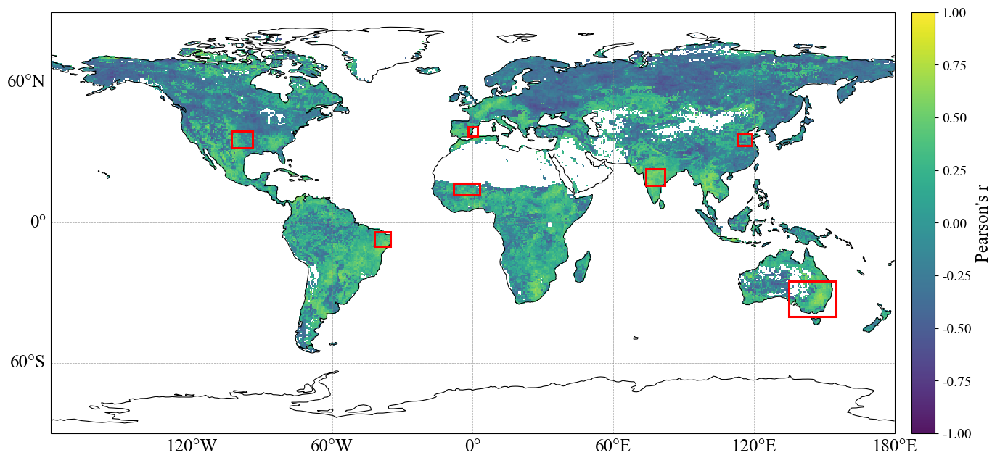

✅ 相关性主图已保存: G:\data\VWC\analysis_outputs\Global_maxcorr_r_ZVWC_vs_SPEI1_lag0-3_2016-2020_with_7boxes.png


In [42]:
# -*- coding: utf-8 -*-
"""
Plot global max correlation r map (Z(VWC@0.5°) vs SPEI-1@0.5°, lag 0–3; SPEI leading),
and draw 7 region bboxes in red, with the SAME style as the user's reference global map:
- Custom RGB basemap GeoTIFF
- Cartopy PlateCarree, global extent
- Gridlines (60°), dashed gray, with custom lon/lat label formatters
- Times New Roman
- NO extra coastlines/borders (avoid double frames)
"""

import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import rasterio
import cartopy.crs as ccrs
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
from matplotlib.colors import Normalize
from matplotlib.patches import Rectangle
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

# ----------- 基本设置 -----------
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["axes.unicode_minus"] = False

# -----------------------------
# CONFIG
# -----------------------------
VWC_MONTH_DIR = r"G:\data\VWC\VWCMap\Monthly"
SPEI_DIR      = r"G:\data\spei01\DATA"
OUT_DIR       = r"G:\data\VWC\analysis_outputs"
os.makedirs(OUT_DIR, exist_ok=True)

# New basemap (same style as your reference code)
base_map_path = r"G:\文章\HUITU\dmwjbc\底图\NE2_50M_SR_W.tif"

# Analysis window
Y0, Y1 = 2016, 2020

# Climatology window for VWC monthly Z
BASE_Y0, BASE_Y1 = 2003, 2020

# Lag months (SPEI leading VWC)
LAGS = [0, 1, 2, 3]

# Minimum matched months (per pixel) to accept correlation
MIN_MATCH = 12

# Regions (lon_min, lon_max, lat_min, lat_max)
REGIONS = [
    ("Australia", (135, 155, -40, -25)),
    ("US Great Plains",       (-103, -94, 32, 39)),
    ("Caatinga", (-42, -35, -10, -4)),
    ("Sahel",     (-8, 3, 12, 17)),
    ("India",          (74, 82, 16, 23)),
    ("North China Plain",    (113, 119, 33, 38)),
    ("Iberia", (-2, 2, 37, 41))
]

# Output PNG
OUT_PNG = os.path.join(
    OUT_DIR,
    f"Global_maxcorr_r_ZVWC_vs_SPEI1_lag0-3_{Y0}-{Y1}_with_7boxes.png"
)

# -----------------------------
# Helpers
# -----------------------------
def vwc_month_path(year, month):
    return os.path.join(VWC_MONTH_DIR, f"VWC-{year:04d}{month:02d}.tif")

def spei_month_path(year, month):
    p1 = os.path.join(SPEI_DIR, f"{year:04d}-{month}.tif")
    p2 = os.path.join(SPEI_DIR, f"{year:04d}-{month:02d}.tif")
    if os.path.exists(p1): return p1
    if os.path.exists(p2): return p2
    return None

def read_raster(path, nodata_fallback=None):
    with rasterio.open(path) as ds:
        arr = ds.read(1).astype(np.float32)
        nodata = ds.nodata
        if nodata is None and nodata_fallback is not None:
            nodata = nodata_fallback
        if nodata is not None:
            arr = np.where(arr == nodata, np.nan, arr)
        profile = ds.profile
    return arr, profile

def month_list(y0, y1):
    out = []
    for y in range(y0, y1 + 1):
        for m in range(1, 13):
            out.append((y, m))
    return out

def block_mean_5x5(arr):
    """0.1° -> 0.5° by 5x5 nanmean."""
    h, w = arr.shape
    if h % 5 != 0 or w % 5 != 0:
        raise ValueError(f"Shape {arr.shape} not divisible by 5 for 0.5° aggregation.")
    arr_ = arr.reshape(h // 5, 5, w // 5, 5)
    return np.nanmean(arr_, axis=(1, 3)).astype(np.float32)

def compute_month_climatology(month):
    """
    Compute per-pixel climatology mean/std for a given calendar month over BASE_Y0..BASE_Y1.
    Returns mean, std, profile in 0.1° grid.
    """
    sum_ = None
    sumsq = None
    cnt = None
    ref_profile = None

    for y in range(BASE_Y0, BASE_Y1 + 1):
        p = vwc_month_path(y, month)
        if not os.path.exists(p):
            continue
        arr, profile = read_raster(p)
        if sum_ is None:
            sum_ = np.zeros_like(arr, dtype=np.float64)
            sumsq = np.zeros_like(arr, dtype=np.float64)
            cnt = np.zeros_like(arr, dtype=np.uint16)
            ref_profile = profile

        valid = np.isfinite(arr)
        sum_[valid] += arr[valid]
        sumsq[valid] += arr[valid] * arr[valid]
        cnt[valid] += 1

    if sum_ is None:
        raise RuntimeError(f"No VWC monthly files found for month={month} in baseline years.")

    mean = np.full(sum_.shape, np.nan, dtype=np.float32)
    std  = np.full(sum_.shape, np.nan, dtype=np.float32)

    ok = cnt > 2
    mean[ok] = (sum_[ok] / cnt[ok]).astype(np.float32)
    var = (sumsq[ok] / cnt[ok]) - (sum_[ok] / cnt[ok])**2
    var = np.maximum(var, 0.0)
    std[ok] = np.sqrt(var).astype(np.float32)

    std = np.where(std < 1e-6, np.nan, std).astype(np.float32)
    return mean, std, ref_profile

def build_monthly_Z(y, m, clim_cache):
    """Read VWC month and compute Z anomaly using cached (mean,std) for that calendar month."""
    p = vwc_month_path(y, m)
    if not os.path.exists(p):
        return None
    arr, profile = read_raster(p)
    mean, std = clim_cache[m]
    z = (arr - mean) / std
    return z.astype(np.float32), profile

def corr_map_nan(z, s, min_match=12):
    """
    Pearson r per pixel along axis=0 (time).
    z, s: float arrays with shape (T, H, W)
    returns: r(H,W)
    """
    z = z.astype(np.float64, copy=False)
    s = s.astype(np.float64, copy=False)

    valid = np.isfinite(z) & np.isfinite(s)
    n = valid.sum(axis=0).astype(np.int16)

    z0 = np.where(valid, z, 0.0)
    s0 = np.where(valid, s, 0.0)

    sum_z = z0.sum(axis=0)
    sum_s = s0.sum(axis=0)

    with np.errstate(invalid="ignore", divide="ignore"):
        mean_z = sum_z / n
        mean_s = sum_s / n

    zc = np.where(valid, z - mean_z[None, :, :], 0.0)
    sc = np.where(valid, s - mean_s[None, :, :], 0.0)

    num = (zc * sc).sum(axis=0)
    den = np.sqrt((zc * zc).sum(axis=0) * (sc * sc).sum(axis=0))

    r = np.full(den.shape, np.nan, dtype=np.float32)
    ok = (n >= min_match) & np.isfinite(den) & (den > 0)
    r[ok] = (num[ok] / den[ok]).astype(np.float32)
    return r

def extent_from_profile(profile):
    """Return (xmin, xmax, ymin, ymax) from rasterio profile (assumes north-up)."""
    transform = profile["transform"]
    width = profile["width"]
    height = profile["height"]
    xmin = transform.c
    ymax = transform.f
    xmax = xmin + width * transform.a
    ymin = ymax + height * transform.e  # e is negative for north-up
    return (xmin, xmax, ymin, ymax)

def lon_fmt_no_180W(x, pos):
    if np.isclose(x, -180):
        return ""
    return LONGITUDE_FORMATTER(x, pos)

def lat_fmt_90(y, pos):
    if np.isclose(y, 90):
        return "90°N"
    elif np.isclose(y, -90):
        return "90°S"
    return LATITUDE_FORMATTER(y, pos)

# -----------------------------
# Plot function (match style)
# -----------------------------
def plot_global_corr(save_path):
    # 1) Monthly climatology cache for VWC
    clim_cache = {}
    cache_dir = os.path.join(OUT_DIR, "climatology_cache")
    os.makedirs(cache_dir, exist_ok=True)

    for m in range(1, 13):
        cache_path = os.path.join(cache_dir, f"vwc_clim_month{m:02d}_{BASE_Y0}-{BASE_Y1}.npz")
        if os.path.exists(cache_path):
            data = np.load(cache_path)
            clim_cache[m] = (data["mean"].astype(np.float32), data["std"].astype(np.float32))
        else:
            mean, std, _ = compute_month_climatology(m)
            np.savez_compressed(cache_path, mean=mean, std=std)
            clim_cache[m] = (mean, std)

    # 2) Load matched months stacks for Z(VWC@0.5°) and SPEI@0.5°
    months = month_list(Y0, Y1)

    z_list, s_list = [], []
    spei_profile = None

    for (y, m) in months:
        out = build_monthly_Z(y, m, clim_cache)
        if out is None:
            continue
        z01, _ = out
        z05 = block_mean_5x5(z01)

        sp = spei_month_path(y, m)
        if not sp:
            continue
        s05, sp_prof = read_raster(sp)

        if spei_profile is None:
            spei_profile = sp_prof

        if z05.shape != s05.shape:
            raise RuntimeError(
                f"Grid mismatch at {y}-{m:02d}: z05 {z05.shape} vs spei {s05.shape}. "
                "Ensure aggregated VWC grid matches SPEI grid."
            )

        z_list.append(z05)
        s_list.append(s05)

    if spei_profile is None or len(z_list) == 0:
        raise RuntimeError("No matched (VWC,SPEI) months found. Check input files.")

    z_stack = np.stack(z_list, axis=0).astype(np.float32)  # (T,H,W)
    s_stack = np.stack(s_list, axis=0).astype(np.float32)  # (T,H,W)

    H, W = z_stack.shape[1], z_stack.shape[2]

    # 3) Best-lag correlation map (maximize |r|, keep sign)
    best_abs = np.full((H, W), -np.inf, dtype=np.float32)
    best_r = np.full((H, W), np.nan, dtype=np.float32)

    for lag in LAGS:
        if lag == 0:
            z = z_stack
            s = s_stack
        else:
            z = z_stack[lag:, :, :]
            s = s_stack[:-lag, :, :]

        r_lag = corr_map_nan(z, s, min_match=MIN_MATCH)
        abs_r = np.abs(r_lag)

        upd = np.isfinite(r_lag) & (abs_r > best_abs)
        best_abs[upd] = abs_r[upd]
        best_r[upd] = r_lag[upd]

    # 4) Plot (MATCH style of your reference map)
    fig = plt.figure(figsize=(15, 10))
    ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
    ax.set_global()

    # # ---- Basemap (same as your reference code) ----
    # try:
    #     with rasterio.open(base_map_path) as src:
    #         red = np.clip(src.read(1), 0, 255)
    #         green = np.clip(src.read(2), 0, 255)
    #         blue = np.clip(src.read(3), 0, 255)
    #         extent_base = [src.bounds.left, src.bounds.right, src.bounds.bottom, src.bounds.top]
    #     rgb = np.dstack((red, green, blue))
    #     _ = Normalize(vmin=0, vmax=255)  # kept for consistency (not required by imshow)
    #     ax.imshow(
    #         rgb,
    #         origin="upper",
    #         extent=extent_base,
    #         transform=ccrs.PlateCarree(),
    #         zorder=0
    #     )
    #     print("✅ 成功加载自定义底图")
    # except Exception as e:
    #     print(f"⚠️ 自定义底图加载失败: {e}")

    # ---- Correlation layer (NO extra borders/coastlines; avoid double frames) ----
    xmin, xmax, ymin, ymax = extent_from_profile(spei_profile)
    im = ax.imshow(
        best_r,
        origin="upper",
        extent=(xmin, xmax, ymin, ymax),
        transform=ccrs.PlateCarree(),
        vmin=-1, vmax=1,
        interpolation="nearest",
        zorder=2,
        alpha=0.92
    )

    cax = inset_axes(
        ax, width="2.8%", height="100%",   # 关键：height="100%" 与主图等高
        loc="lower left",
        bbox_to_anchor=(1.02, 0.0, 1, 1),  # 关键：把它放到 ax 右侧
        bbox_transform=ax.transAxes,
        borderpad=0
    )

    cbar = plt.colorbar(im, cax=cax)
    cbar.set_label("Pearson's r", fontsize=18)
    cbar.ax.tick_params(labelsize=14)

    # ---- Coastlines (single clean outline; avoids “double frames”) ----
    ax.coastlines(resolution="110m", color="black", linewidth=0.8, zorder=6)    

    # ---- 7 region boxes (red) ----
    for name, bbox in REGIONS:
        lon_min, lon_max, lat_min, lat_max = bbox
        rect = Rectangle(
            (lon_min, lat_min),
            lon_max - lon_min,
            lat_max - lat_min,
            fill=False,
            edgecolor="red",
            linewidth=2.2,
            transform=ccrs.PlateCarree(),
            zorder=10
        )
        ax.add_patch(rect)

    # ---- Gridlines (copy your style) ----
    gl = ax.gridlines(
        crs=ccrs.PlateCarree(),
        draw_labels=True,
        linewidth=0.5,
        color="gray",
        linestyle="--",
        alpha=0.75
    )
    gl.top_labels = False
    gl.right_labels = False
    gl.xlocator = mticker.MultipleLocator(60)
    gl.ylocator = mticker.MultipleLocator(60)
    gl.xlabel_style = {"size": 18}
    gl.ylabel_style = {"size": 18}
    gl.xformatter = mticker.FuncFormatter(lon_fmt_no_180W)
    gl.yformatter = mticker.FuncFormatter(lat_fmt_90)


    plt.subplots_adjust(bottom=0.10)
    plt.savefig(save_path, dpi=300, bbox_inches="tight")
    plt.show()
    print(f"✅ 相关性主图已保存: {save_path}")

# -----------------------------
# Run
# -----------------------------
if __name__ == "__main__":
    plot_global_corr(OUT_PNG)


### 找几个2016-2020的典型干旱位置，结合SPEI-3（主）、SPEI-1（次）进行案例分析

In [32]:
import os
import numpy as np
import pandas as pd
import rasterio
from rasterio.windows import from_bounds
from rasterio.features import geometry_mask
from shapely.geometry import box, mapping
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap, TwoSlopeNorm
import matplotlib.ticker as mticker
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import cartopy.crs as ccrs

# ============================
# 0) Paths & settings
# ============================
SPEI3_PATH = r"G:\data\spei01\spei03\SPEI3_native_2016_2020_multiband.tif"
SPEI1_PATH = r"G:\data\spei01\spei01\SPEI1_native_2016_2020_multiband.tif"  # optional
VWC_MONTH_DIR = r"G:\data\VWC\VWCMap\Monthly"  # VWC-YYYYMM.tif
VWC_DAILY_DIR = r"G:\data\VWC\VWCMap\Daily"    # optional

OUT_DIR = r"G:\data\VWC\analysis_outputs"
os.makedirs(OUT_DIR, exist_ok=True)

# --- If VWC nodata is NOT stored in GeoTIFF nodata field, set it here ---
VWC_FILL_VALUE = -9999  # <<< change if needed, or set None

# Optional vegetation mask threshold (based on climatological mean VWC)
VWC_VEG_MIN = 0.05  # kg/m^2 (suggest 0.05–0.2). Set None to disable.

# Drought-event parameters (Scheme B)
THR_DROUGHT = -1.0
A_START = 0.20
A_END = 0.10
MIN_CONSEC = 2
END_CONSEC = 2

MAP_OFFSETS = [-1, 0, 1]

# ============================
# 1) Regions
# ============================
REGIONS = [
    {"name": "North America", "bbox": (-105.0, 30.0, -93.0, 49.0)},
    {"name": "South America", "bbox": (-67.0, -10.0, -60.0, -5.0)},
    {"name": "European", "bbox": (15.0, 50.0, 25.0, 57.0)},
    {"name": "Oceania", "bbox": (144.0, -39.0, 155.0, -20.0)},
    {"name": "Asia", "bbox": (112.0, 33.0, 119.0, 40.5)},
]

# Diverging colormap (blue-white-red), NaN transparent
colors = [
    "#053061", "#2166ac", "#4393c3", "#92c5de", "#d1e5f0",
    "#f7f7f7",
    "#fddbc7", "#f4a582", "#d6604d", "#b2182b", "#67001f"
]
cmap_div = LinearSegmentedColormap.from_list("bwr_like", colors, N=256)
cmap_div.set_bad(color="none")

# ============================
# 2) Time axis helper
# ============================
def month_range(start="2016-01", end="2020-12"):
    return pd.date_range(start=start + "-01", end=end + "-01", freq="MS")

# Analysis period (SPEI events + outputs)
MONTHS = month_range("2016-01", "2020-12")

# Climatology period for VWC (2002-06 .. 2020-12)
CLIM_MONTHS = month_range("2002-06", "2020-12")

# ============================
# 3) Read SPEI3 multiband
# ============================
def read_multiband_tif(path):
    with rasterio.open(path) as src:
        arr = src.read().astype(np.float32)  # (bands, rows, cols)
        nodata = src.nodata
        transform = src.transform
        crs = src.crs
        if nodata is not None:
            arr[arr == nodata] = np.nan
        return arr, transform, crs, src.bounds

spei3, spei3_transform, spei3_crs, spei3_bounds = read_multiband_tif(SPEI3_PATH)
if spei3.shape[0] != len(MONTHS):
    raise ValueError(f"SPEI3 bands={spei3.shape[0]} but expected {len(MONTHS)} (2016-01..2020-12).")

# ============================
# 4) Region mask for bbox on a grid
# ============================
def make_mask_for_bbox(transform, height, width, bbox_lonlat):
    geom = box(*bbox_lonlat)
    mask = geometry_mask(
        [mapping(geom)],
        out_shape=(height, width),
        transform=transform,
        invert=True
    )
    return mask

# ============================
# 5) SPEI stats & event detection
# ============================
def compute_spei_region_stats(spei_stack, region_mask, thr=THR_DROUGHT):
    T = spei_stack.shape[0]
    mean_spei = np.full(T, np.nan, dtype=np.float32)
    A = np.full(T, np.nan, dtype=np.float32)
    mean_drought = np.full(T, np.nan, dtype=np.float32)

    for t in range(T):
        data = spei_stack[t, :, :]
        reg = data[region_mask]
        reg = reg[np.isfinite(reg)]
        if reg.size == 0:
            continue

        mean_spei[t] = float(np.nanmean(reg))

        drought = reg[reg <= thr]
        A[t] = float(drought.size / reg.size)
        mean_drought[t] = float(np.nanmean(drought)) if drought.size > 0 else np.nan

    return mean_spei, A, mean_drought

def detect_events(A, months, a_start=A_START, a_end=A_END, min_consec=MIN_CONSEC, end_consec=END_CONSEC):
    events = []
    T = len(A)
    t = 0
    while t < T:
        if np.isfinite(A[t]) and A[t] >= a_start:
            ok = True
            for k in range(min_consec):
                if t + k >= T or (not np.isfinite(A[t + k])) or A[t + k] < a_start:
                    ok = False
                    break
            if not ok:
                t += 1
                continue

            start = t
            tt = start
            end = T - 1

            while tt < T:
                if np.isfinite(A[tt]) and A[tt] < a_end:
                    ok_end = True
                    for k in range(end_consec):
                        if tt + k >= T or (not np.isfinite(A[tt + k])) or A[tt + k] >= a_end:
                            ok_end = False
                            break
                    if ok_end:
                        end = tt - 1
                        break
                tt += 1

            if end < start:
                end = start

            events.append({
                "start_idx": start,
                "end_idx": end,
                "start_month": months[start].strftime("%Y-%m"),
                "end_month": months[end].strftime("%Y-%m"),
                "duration_months": end - start + 1
            })
            t = end + 1
        else:
            t += 1
    return events

def event_severity(event, A, mean_drought):
    s, e = event["start_idx"], event["end_idx"]
    a_seg = A[s:e+1]
    md_seg = mean_drought[s:e+1]
    return float(np.nansum(a_seg * np.abs(md_seg)))

# ============================
# 6) VWC monthly IO helpers
# ============================
def find_vwc_month_file(yyyymm):
    fp = os.path.join(VWC_MONTH_DIR, f"VWC-{yyyymm}.tif")
    return fp if os.path.exists(fp) else None

def _apply_vwc_nodata(arr, nodata):
    arr = arr.astype(np.float32)
    if nodata is not None:
        arr[arr == nodata] = np.nan
    if VWC_FILL_VALUE is not None:
        arr[arr == VWC_FILL_VALUE] = np.nan
    return arr

def read_vwc_window(yyyymm, bbox_lonlat):
    fp = find_vwc_month_file(yyyymm)
    if fp is None:
        return None

    with rasterio.open(fp) as src:
        win = from_bounds(*bbox_lonlat, transform=src.transform)
        win = win.round_offsets().round_lengths()
        data = src.read(1, window=win)
        data = _apply_vwc_nodata(data, src.nodata)
        transform = src.window_transform(win)
        return data, transform

# ============================
# 7) Pixel-wise monthly climatology maps (mean & std) for Z(VWC) maps
#     ✅ driven by CLIM_MONTHS
# ============================
def compute_vwc_climatology_maps_mean_std(bbox_lonlat, months_index):
    # Find reference window grid
    ref = None
    for d in months_index:
        res = read_vwc_window(d.strftime("%Y%m"), bbox_lonlat)
        if res is not None:
            ref = res
            break
    if ref is None:
        return {}, {}, None

    ref_arr, ref_transform = ref
    h, w = ref_arr.shape

    sums = {m: np.zeros((h, w), dtype=np.float64) for m in range(1, 13)}
    sums2 = {m: np.zeros((h, w), dtype=np.float64) for m in range(1, 13)}
    cnts = {m: np.zeros((h, w), dtype=np.int32) for m in range(1, 13)}

    for d in months_index:
        ym = d.strftime("%Y%m")
        m = d.month
        res = read_vwc_window(ym, bbox_lonlat)
        if res is None:
            continue
        arr, _ = res
        if arr.shape != (h, w):
            continue
        valid = np.isfinite(arr)
        sums[m][valid] += arr[valid]
        sums2[m][valid] += (arr[valid] ** 2)
        cnts[m][valid] += 1

    mu_maps = {}
    sd_maps = {}
    for m in range(1, 13):
        mu = np.full((h, w), np.nan, dtype=np.float32)
        sd = np.full((h, w), np.nan, dtype=np.float32)

        valid = cnts[m] > 0
        if np.any(valid):
            mu_valid = (sums[m][valid] / cnts[m][valid]).astype(np.float64)
            ex2 = (sums2[m][valid] / cnts[m][valid]).astype(np.float64)
            var = ex2 - mu_valid**2
            var[var < 0] = 0  # numeric safety
            sd_valid = np.sqrt(var)

            mu[valid] = mu_valid.astype(np.float32)
            sd[valid] = sd_valid.astype(np.float32)
            sd[sd == 0] = np.nan  # avoid divide-by-zero

        mu_maps[m] = mu
        sd_maps[m] = sd

    return mu_maps, sd_maps, ref_transform

def build_veg_mask_from_mu_maps(mu_maps):
    if VWC_VEG_MIN is None:
        return None
    mean_map = None
    for m in range(1, 13):
        if m not in mu_maps or mu_maps[m] is None:
            continue
        mean_map = np.array(mu_maps[m], dtype=np.float64) if mean_map is None else mean_map + np.array(mu_maps[m], dtype=np.float64)
    if mean_map is None:
        return None
    mean_map = mean_map / 12.0
    veg_mask = np.isfinite(mean_map) & (mean_map >= VWC_VEG_MIN)
    return veg_mask

# ============================
# 8) Regional VWC mean series + climatology-from-CLIM_MONTHS -> Z(VWC)
# ============================
def compute_vwc_region_mean_series(bbox_lonlat, months_index, veg_mask=None):
    T = len(months_index)
    vwc_mean = np.full(T, np.nan, dtype=np.float32)

    for i, d in enumerate(months_index):
        ym = d.strftime("%Y%m")
        res = read_vwc_window(ym, bbox_lonlat)
        if res is None:
            continue
        arr, tr = res

        mask_bbox = make_mask_for_bbox(tr, arr.shape[0], arr.shape[1], bbox_lonlat)
        valid = mask_bbox & np.isfinite(arr)

        if veg_mask is not None and veg_mask.shape == arr.shape:
            valid = valid & veg_mask

        vals = arr[valid]
        if vals.size == 0:
            continue
        vwc_mean[i] = float(np.nanmean(vals))
    return vwc_mean

def build_monthly_climatology_mean_std_from_series(series, months_index, min_samples=8):
    mu = {}
    sd = {}
    ncnt = {}
    for m in range(1, 13):
        idx = [i for i, d in enumerate(months_index) if d.month == m and np.isfinite(series[i])]
        ncnt[m] = len(idx)
        if len(idx) >= min_samples:
            vals = np.array(series[idx], dtype=np.float32)
            mu[m] = float(np.nanmean(vals))
            s = float(np.nanstd(vals))
            sd[m] = s if s > 0 else np.nan
        else:
            mu[m] = np.nan
            sd[m] = np.nan
    return mu, sd, ncnt

def compute_z_from_clim(vwc_mean, months_index, mu_dict, sd_dict):
    T = len(months_index)
    z = np.full(T, np.nan, dtype=np.float32)
    for i, d in enumerate(months_index):
        mu = mu_dict.get(d.month, np.nan)
        sd = sd_dict.get(d.month, np.nan)
        if np.isfinite(vwc_mean[i]) and np.isfinite(mu) and np.isfinite(sd) and sd > 0:
            z[i] = (vwc_mean[i] - mu) / sd
    return z

# ============================
# 9) Plot Z(VWC) maps around peak month
# ============================
def plot_vwc_z_maps(region_name, bbox_lonlat, event_peak_idx, months_index, mu_maps, sd_maps, veg_mask, out_dir):
    fig, axes = plt.subplots(
        1, len(MAP_OFFSETS),
        figsize=(12, 4),
        constrained_layout=True,
        subplot_kw={"projection": ccrs.PlateCarree()}
    )
    last_im = None

    minlon, minlat, maxlon, maxlat = bbox_lonlat

    for j, off in enumerate(MAP_OFFSETS):
        idx = event_peak_idx + off
        ax = axes[j]
        if idx < 0 or idx >= len(months_index):
            ax.axis("off")
            continue

        d = months_index[idx]
        ym = d.strftime("%Y%m")
        res = read_vwc_window(ym, bbox_lonlat)
        if res is None:
            ax.set_title(f"{ym} (missing)")
            ax.axis("off")
            continue

        arr, tr = res
        mu = mu_maps.get(d.month, None)
        sd = sd_maps.get(d.month, None)

        zmap = np.full_like(arr, np.nan, dtype=np.float32)
        if (mu is not None) and (sd is not None) and (mu.shape == arr.shape) and (sd.shape == arr.shape):
            valid = np.isfinite(arr) & np.isfinite(mu) & np.isfinite(sd) & (sd > 0)
            zmap[valid] = (arr[valid] - mu[valid]) / sd[valid]
        else:
            zmap = arr  # fallback

        # mask non-vegetated pixels (optional)
        if veg_mask is not None and veg_mask.shape == zmap.shape:
            zmap = np.where(veg_mask, zmap, np.nan)

        # auto range by 98th percentile of abs
        v = np.nanpercentile(np.abs(zmap), 98) if np.isfinite(zmap).any() else 1.0
        norm = TwoSlopeNorm(vmin=-v, vcenter=0.0, vmax=v)

        last_im = ax.imshow(
            zmap,
            extent=[minlon, maxlon, minlat, maxlat],
            transform=ccrs.PlateCarree(),
            cmap=cmap_div,
            norm=norm,
            interpolation="nearest"
        )

        # 3° gridlines + font size 16
        gl = ax.gridlines(
            crs=ccrs.PlateCarree(),
            draw_labels=True,
            linewidth=0.4,
            color="gray",
            linestyle="--",
            alpha=0.6
        )
        gl.xlocator = mticker.MultipleLocator(3)
        gl.ylocator = mticker.MultipleLocator(3)
        gl.xformatter = LONGITUDE_FORMATTER
        gl.yformatter = LATITUDE_FORMATTER
        gl.xlabel_style = {"size": 16}
        gl.ylabel_style = {"size": 16}
        gl.top_labels = False
        gl.right_labels = False
        if j != 0:
            gl.left_labels = False

        ax.coastlines(linewidth=0.6)
        ax.set_title(d.strftime("%Y-%m"), fontsize=16)

    if last_im is not None:
        cbar = fig.colorbar(last_im, ax=axes.ravel().tolist(), shrink=0.85)
        cbar.set_label("Z(VWC) (standardized monthly anomaly; baseline 2002–2020)")

    out_fp = os.path.join(out_dir, f"{region_name}_VWC_Z_maps_peak.png")
    fig.savefig(out_fp, dpi=300)
    plt.close(fig)
    return out_fp

# ============================
# 10) Main loop per region
# ============================
all_events_rows = []

for reg in REGIONS:
    name = reg["name"]
    bbox = reg["bbox"]
    print(f"\n=== Region: {name} | bbox={bbox} ===")

    # ---- SPEI mask on 0.5° grid ----
    H, W = spei3.shape[1], spei3.shape[2]
    spei_mask = make_mask_for_bbox(spei3_transform, H, W, bbox)

    mean_spei, A, mean_drought = compute_spei_region_stats(spei3, spei_mask, thr=THR_DROUGHT)
    events = detect_events(A, MONTHS)

    if len(events) == 0:
        print("No events detected with current thresholds.")
        continue

    # attach severity & peak
    for ev in events:
        sev = event_severity(ev, A, mean_drought)
        s, e = ev["start_idx"], ev["end_idx"]
        seg = mean_spei[s:e+1]
        peak_rel = int(np.nanargmin(seg)) if np.isfinite(seg).any() else 0
        peak_idx = s + peak_rel

        ev["severity"] = sev
        ev["peak_month"] = MONTHS[peak_idx].strftime("%Y-%m")
        ev["peak_idx"] = peak_idx
        ev["region"] = name
        all_events_rows.append(ev)

    events_sorted = sorted(events, key=lambda x: x["severity"], reverse=True)
    top = events_sorted[0]
    peak_idx = top["peak_idx"]
    print(f"Top event: {top['start_month']} to {top['end_month']} | peak={top['peak_month']} | severity={top['severity']:.3f}")

    # ---- VWC climatology maps (mean & std) from 2002–2020 ----
    mu_maps, sd_maps, _ = compute_vwc_climatology_maps_mean_std(bbox, CLIM_MONTHS)
    veg_mask = build_veg_mask_from_mu_maps(mu_maps)

    # ---- Regional VWC series ----
    vwc_mean_base = compute_vwc_region_mean_series(bbox, CLIM_MONTHS, veg_mask=veg_mask)
    mu_region, sd_region, clim_n = build_monthly_climatology_mean_std_from_series(
        vwc_mean_base, CLIM_MONTHS, min_samples=8
    )

    vwc_mean = compute_vwc_region_mean_series(bbox, MONTHS, veg_mask=veg_mask)
    vwc_z = compute_z_from_clim(vwc_mean, MONTHS, mu_region, sd_region)

    # ========== Plot time series ==========
    fig, ax1 = plt.subplots(figsize=(12, 5))
    t = MONTHS

    ln1 = ax1.plot(t, A, color="0.35", linewidth=2.2,
                   label=r"Drought area fraction $A(t)$ [SPEI3$\leq$-1]")
    ax1.set_ylabel("Area fraction", color="0.35")
    ax1.set_ylim(0, 1)
    ax1.tick_params(axis="y", labelcolor="0.35")
    ax1.axhline(A_START, color="0.65", linestyle="--", linewidth=1)
    ax1.axhline(A_END,   color="0.75", linestyle="--", linewidth=1)

    ax2 = ax1.twinx()
    ln2 = ax2.plot(t, mean_spei, color="#1f77b4", linewidth=2.0, label="Mean SPEI-3")
    ln3 = ax2.plot(t, vwc_z, color="#ff7f0e", linewidth=2.5, label="Z(VWC) (monthly)")
    ax2.set_ylabel("SPEI / Z(VWC)")
    ax2.axhline(0, color="k", linewidth=0.8, alpha=0.4)

    for ev in events:
        s, e = ev["start_idx"], ev["end_idx"]
        ax1.axvspan(t[s], t[e] + pd.offsets.MonthBegin(1), color="#1f77b4", alpha=0.08, linewidth=0)

    ax1.axvline(t[peak_idx], color="k", linestyle=":", linewidth=1.6)

    lines = ln1 + ln2 + ln3
    labels = [l.get_label() for l in lines]
    ax1.legend(lines, labels, loc="upper right", frameon=False)

    ax1.set_title(f"{name}: SPEI-3 drought events and VWC response (2016–2020)")
    ax1.grid(alpha=0.2)

    ts_out = os.path.join(OUT_DIR, f"{name}_timeseries_events.png")
    fig.savefig(ts_out, dpi=300, bbox_inches="tight")
    plt.close(fig)

    # ---- Z(VWC) maps around peak month ----
    map_out = plot_vwc_z_maps(name, bbox, peak_idx, MONTHS, mu_maps, sd_maps, veg_mask, OUT_DIR)

    print("Saved:", ts_out)
    print("Saved:", map_out)

# Save events table
events_df = pd.DataFrame(all_events_rows)
events_csv = os.path.join(OUT_DIR, "regional_drought_events_SPEI3_2016_2020.csv")
events_df.to_csv(events_csv, index=False)
print("\nAll events saved to:", events_csv)



=== Region: North America | bbox=(-105.0, 30.0, -93.0, 49.0) ===
Top event: 2020-08 to 2020-12 | peak=2020-10 | severity=1.484
Saved: G:\data\VWC\analysis_outputs\North America_timeseries_events.png
Saved: G:\data\VWC\analysis_outputs\North America_VWC_Z_maps_peak.png

=== Region: South America | bbox=(-67.0, -10.0, -60.0, -5.0) ===
Top event: 2016-01 to 2018-07 | peak=2016-02 | severity=34.303
Saved: G:\data\VWC\analysis_outputs\South America_timeseries_events.png
Saved: G:\data\VWC\analysis_outputs\South America_VWC_Z_maps_peak.png

=== Region: European | bbox=(15.0, 50.0, 25.0, 57.0) ===
Top event: 2018-04 to 2018-12 | peak=2018-06 | severity=11.849
Saved: G:\data\VWC\analysis_outputs\European_timeseries_events.png
Saved: G:\data\VWC\analysis_outputs\European_VWC_Z_maps_peak.png

=== Region: Oceania | bbox=(144.0, -39.0, 155.0, -20.0) ===
Top event: 2018-01 to 2018-10 | peak=2018-07 | severity=6.163
Saved: G:\data\VWC\analysis_outputs\Oceania_timeseries_events.png
Saved: G:\data\VW

### 绘制多类SPEI与VWC(monthly)、VWC_anomaly、Z(VWC) 的Pixel-wise

### 解析全球各个MainType的结果的时序图，VWC+VWC平滑+降雨数据（主图）

In [66]:
# -*- coding: utf-8 -*-
"""
IGBP MainType representative pixels daily plot (2018–2020):
VWC (raw + 7/15/30-day Moving), Precipitation spikes (right axis)

- Left axis: VWC (4 colored lines)
- Right axis: Precipitation spikes (real units)
- No per-panel legends; one global legend at top center (VWC items in one row)
- No figure title; per-panel top-left text excludes frac
"""

import os
import re
import numpy as np
import rasterio
import matplotlib.pyplot as plt
import datetime as dt
import h5py
from scipy.io import loadmat

# -----------------------------
# CONFIG
# -----------------------------
LC_H5_DIR = r"G:\data\MCD12C1 CMG\01Degree\h5"
LC_YEAR_FOR_PICK = 2018
FRACTION_TH = 0.60

PICK_TYPES = [
    ("ENF", "ENF (Evergreen Needleleaf Forest)"),
    ("EBF", "EBF (Evergreen Broadleaf Forest)"),
    ("DBF", "DBF (Deciduous Broadleaf Forest)"),
    ("MF",  "MF  (Mixed Forest)"),
    ("OSH", "OSH (Open Shrublands)"),
    ("SAV", "SAV (Savannas)"),
    ("GRA", "GRA (Grasslands)"),
    ("CRO", "CRO (Croplands)"),
    # extra
    ("DNF", "DNF (Deciduous Needleleaf Forest)"),
    ("CSH", "CSH (Closed Shrublands)"),
    ("WSA", "WSA (Woody Savannas)"),
    ("CVM", "CVM (Cropland/Natural Vegetation Mosaic)"),
]

# --------- Exclusions ---------
EXCLUDE_POINTS = {
    "GRA": [
        # (66.65, 42.65),
    ]
}
EXCLUDE_RADIUS_DEG = 0.08

# (lon_min, lon_max, lat_min, lat_max)
EXCLUDE_BOXES = {
    "GRA": [
        (55.0, 80.0, 35.0, 50.0),
    ]
}

VWC_DAY_DIR = r"G:\data\VWC\VWCMap\Daily"
RAIN_DIR    = r"G:\data\GRM rainfall\mat"

OUT_DIR     = r"G:\data\VWC\analysis_outputs"
os.makedirs(OUT_DIR, exist_ok=True)

Y0, Y1 = 2018, 2020

# colors
COL_VWC_RAW = "#1f77b4"   # blue
COL_VWC_7   = "#ff7f0e"   # orange
COL_VWC_15  = "#2ca02c"   # green
COL_VWC_30  = "#d62728"   # red
COL_P       = "#B35CBE"   # purple

# selection speed controls
CANDIDATES_PER_TYPE = 250
AVAIL_STRIDE_DAYS   = 10
W_VWC = 1.0

# precip axis range control
P_UPPER_Q = 99.0
P_MINMAX_FALLBACK = 1.0

# Global legend vertical position (smaller -> closer to subplots)
LEGEND_Y = 0.945

# Space reserved at top for legend (smaller top -> less blank)
TOP_SPACE = 0.94

# --------- PANEL ORDER (you asked) ---------
ORDER_KEYS = ["ENF", "EBF", "DNF", "DBF", "MF", "CSH", "OSH", "WSA", "SAV", "CRO", "CVM"]

# -----------------------------
# Date helpers
# -----------------------------
def daterange(start_date, end_date):
    cur = start_date
    while cur <= end_date:
        yield cur
        cur += dt.timedelta(days=1)

def ymd_str(d):
    return f"{d.year:04d}{d.month:02d}{d.day:02d}"

def build_jan_jul_ticks(daily_dates):
    ticks, labels = [], []
    for i, d in enumerate(daily_dates):
        if d.day == 1 and d.month in (1, 7):
            ticks.append(i)
            labels.append(d.strftime("%Y-%b"))
    return ticks, labels

# -----------------------------
# Rolling mean (NaN-aware)
# -----------------------------
def rolling_mean_nan_min(x, win, min_valid=None):
    x = np.asarray(x, dtype=np.float32)
    if win <= 1:
        return x.copy()
    if min_valid is None:
        min_valid = max(1, win // 3)

    out = np.full_like(x, np.nan, dtype=np.float32)
    valid = np.isfinite(x).astype(np.float32)
    xv = np.where(np.isfinite(x), x, 0.0).astype(np.float32)

    kernel = np.ones(win, dtype=np.float32)
    num = np.convolve(xv, kernel, mode="same")
    den = np.convolve(valid, kernel, mode="same")

    ok = den >= float(min_valid)
    out[ok] = num[ok] / den[ok]
    return out

# -----------------------------
# File indexers
# -----------------------------
def index_vwc_files(folder):
    mp = {}
    pat = re.compile(r"^VWC-(\d{8})\.tif$", re.IGNORECASE)
    if not os.path.isdir(folder):
        return mp
    for fn in os.listdir(folder):
        m = pat.match(fn)
        if m:
            mp[m.group(1)] = os.path.join(folder, fn)
    return mp

def index_rain_files(folder):
    mp = {}
    pat = re.compile(r"^(\d{8})\.mat$", re.IGNORECASE)
    if not os.path.isdir(folder):
        return mp
    for fn in os.listdir(folder):
        m = pat.match(fn)
        if m:
            mp[m.group(1)] = os.path.join(folder, fn)
    return mp

# -----------------------------
# 0.1° grid converters
# -----------------------------
def rowcol_to_lonlat_0p1(row, col):
    lon = -180.0 + (col + 0.5) * 0.1
    lat =  90.0  - (row + 0.5) * 0.1
    return float(lon), float(lat)

# -----------------------------
# MAT scalar reader (Rain only)
# -----------------------------
def _read_mat_scalar_any(path, varname, r, c):
    try:
        with h5py.File(path, "r") as f:
            if varname not in f:
                raise KeyError
            dset = f[varname]
            shape = dset.shape
            if shape == (1800, 3600):
                return float(dset[r, c])
            if shape == (3600, 1800):
                return float(dset[c, r])
            arr = np.array(dset)
            arr = np.squeeze(arr)
            if arr.shape == (1800, 3600):
                return float(arr[r, c])
            if arr.shape == (3600, 1800):
                return float(arr[c, r])
            raise ValueError(f"Unexpected {varname} shape {shape} in {path}")
    except Exception:
        d = loadmat(path)
        if varname not in d:
            raise KeyError(f"{varname} not in {path}")
        arr = np.squeeze(d[varname])
        if arr.shape == (1800, 3600):
            return float(arr[r, c])
        if arr.shape == (3600, 1800):
            return float(arr[c, r])
        raise ValueError(f"Unexpected {varname} shape {arr.shape} in {path}")

# -----------------------------
# Read LC fractions from H5
# -----------------------------
def lc_h5_path(year):
    return os.path.join(LC_H5_DIR, f"{year:04d}001.h5")

def read_lc_fraction(year, varname):
    fp = lc_h5_path(year)
    if not os.path.exists(fp):
        raise FileNotFoundError(f"LC h5 not found: {fp}")
    with h5py.File(fp, "r") as f:
        if varname not in f:
            keys = list(f.keys())
            raise KeyError(
                f"LC variable '{varname}' not found in {fp}. "
                f"Example keys: {keys[:30]}"
            )
        arr = np.array(f[varname], dtype=np.float32)
    arr = np.squeeze(arr)
    if arr.shape == (1800, 3600):
        return arr
    if arr.shape == (3600, 1800):
        return arr.T
    raise ValueError(f"Unexpected LC fraction shape {arr.shape} for {varname} in {fp}")

# -----------------------------
# Exclude helpers
# -----------------------------
def _is_excluded(type_key, lon, lat):
    pts = EXCLUDE_POINTS.get(type_key, [])
    for (x, y) in pts:
        if (abs(lon - x) <= EXCLUDE_RADIUS_DEG) and (abs(lat - y) <= EXCLUDE_RADIUS_DEG):
            return True

    boxes = EXCLUDE_BOXES.get(type_key, [])
    for (lon0, lon1, lat0, lat1) in boxes:
        if (lon >= lon0) and (lon <= lon1) and (lat >= lat0) and (lat <= lat1):
            return True
    return False

# -----------------------------
# Pick representative pixel WITH VWC availability + exclusion
# -----------------------------
def pick_pixel_with_availability(
    lc_frac, type_key, type_desc,
    daily_dates, vwc_map,
    frac_th=0.6, candidates_per_type=200, stride_days=10
):
    ys, xs = np.where(np.isfinite(lc_frac) & (lc_frac >= frac_th))
    if ys.size == 0:
        print(f"⚠️ {type_key}: no candidates with frac>={frac_th}")
        return None

    rng = np.random.default_rng(42 + (hash(type_key) % 10000))
    if ys.size > candidates_per_type:
        sel = rng.choice(ys.size, size=candidates_per_type, replace=False)
        ys = ys[sel]
        xs = xs[sel]

    ys2, xs2, lonlats2 = [], [], []
    for r, c in zip(ys, xs):
        lon, lat = rowcol_to_lonlat_0p1(int(r), int(c))
        if _is_excluded(type_key, lon, lat):
            continue
        ys2.append(int(r)); xs2.append(int(c)); lonlats2.append((lon, lat))

    if len(lonlats2) == 0:
        print(f"⚠️ {type_key}: all candidates excluded.")
        return None

    ys2 = np.array(ys2, dtype=np.int32)
    xs2 = np.array(xs2, dtype=np.int32)

    sample_dates = daily_dates[::stride_days]
    scores = np.zeros(len(lonlats2), dtype=np.float32)
    frac_vals = lc_frac[ys2, xs2].astype(np.float32)

    for d in sample_dates:
        key = ymd_str(d)
        fp = vwc_map.get(key)
        if not fp:
            continue
        try:
            with rasterio.open(fp) as ds:
                vals = list(ds.sample(lonlats2))
                v = np.array([a[0] for a in vals], dtype=np.float32)
                nodata = ds.nodata
                if nodata is not None:
                    v = np.where(v == nodata, np.nan, v)
                ok = np.isfinite(v)
                scores[ok] += W_VWC
        except Exception:
            continue

    best = np.argmax(scores + 0.01 * frac_vals)
    br, bc = int(ys2[best]), int(xs2[best])
    blon, blat = rowcol_to_lonlat_0p1(br, bc)
    return {
        "type_key": type_key,
        "type_name": type_desc,
        "row": br, "col": bc,
        "lon": blon, "lat": blat,
        "frac": float(lc_frac[br, bc]),
        "score": float(scores[best]),
    }

# -----------------------------
# Fast series loaders
# -----------------------------
def get_vwc_pixel_series(daily_dates, vwc_map, pixel_lonlat):
    T = len(daily_dates)
    N = len(pixel_lonlat)
    out = np.full((T, N), np.nan, dtype=np.float32)
    for ti, d in enumerate(daily_dates):
        key = ymd_str(d)
        fp = vwc_map.get(key)
        if not fp:
            continue
        try:
            with rasterio.open(fp) as ds:
                vals = list(ds.sample(pixel_lonlat))
                v = np.array([x[0] for x in vals], dtype=np.float32)
                nodata = ds.nodata
                if nodata is not None:
                    v = np.where(v == nodata, np.nan, v)
                out[ti, :] = v
        except Exception:
            continue
    return out

def get_rain_pixel_series(daily_dates, rain_map, pixel_rc):
    T = len(daily_dates)
    N = len(pixel_rc)
    out = np.full((T, N), np.nan, dtype=np.float32)

    for ti, d in enumerate(daily_dates):
        key = ymd_str(d)
        fp = rain_map.get(key)
        if not fp:
            continue
        for j, (r, c) in enumerate(pixel_rc):
            try:
                p = _read_mat_scalar_any(fp, "Precipitation", int(r), int(c))
                out[ti, j] = np.nan if not np.isfinite(p) else float(p)
            except Exception:
                continue
    return out

# -----------------------------
# Plot helpers
# -----------------------------
def title_inside(ax, text):
    ax.text(
        0.01, 0.99, text,
        transform=ax.transAxes,
        ha="left", va="top",
        fontsize=20, fontweight="bold",
        bbox=dict(facecolor="white", edgecolor="none", alpha=0.75, pad=2)
    )

def nice_grid(ax):
    ax.grid(True, which="major", axis="both", alpha=0.15, linewidth=0.6)

def robust_precip_ylim(pr):
    pr = np.asarray(pr, dtype=np.float32)
    v = pr[np.isfinite(pr) & (pr > 0)]
    if v.size == 0:
        return 0.0, P_MINMAX_FALLBACK
    hi = float(np.nanpercentile(v, P_UPPER_Q))
    if not np.isfinite(hi) or hi <= 0:
        hi = float(np.nanmax(v))
    hi = max(hi, P_MINMAX_FALLBACK)
    return 0.0, hi * 1.05

# -----------------------------
# MAIN
# -----------------------------
def main():
    start = dt.date(Y0, 1, 1)
    end   = dt.date(Y1, 12, 31)
    daily_dates = list(daterange(start, end))
    x = np.arange(len(daily_dates), dtype=np.int32)
    xticks, xlabels = build_jan_jul_ticks(daily_dates)

    vwc_map  = index_vwc_files(VWC_DAY_DIR)
    rain_map = index_rain_files(RAIN_DIR)

    print(f"VWC files indexed:  {len(vwc_map)}")
    print(f"Rain files indexed: {len(rain_map)}")

    # pick pixels (original order, then sort later)
    pixels = []
    for key, desc in PICK_TYPES:
        try:
            lc_frac = read_lc_fraction(LC_YEAR_FOR_PICK, key)
        except Exception as e:
            print(f"⚠️ {key}: cannot read LC fraction ({e}) -> skip")
            continue

        pix = pick_pixel_with_availability(
            lc_frac, key, desc,
            daily_dates, vwc_map,
            frac_th=FRACTION_TH,
            candidates_per_type=CANDIDATES_PER_TYPE,
            stride_days=AVAIL_STRIDE_DAYS
        )
        if pix is None:
            print(f"⚠️ {key}: no pixel selected (maybe no frac>={FRACTION_TH} or excluded/all missing)")
            continue

        print(f"✅ Picked {key}: lon={pix['lon']:.2f}, lat={pix['lat']:.2f}, "
              f"frac={pix['frac']:.2f}, score={pix['score']:.1f}")
        pixels.append(pix)

    if len(pixels) == 0:
        raise RuntimeError("No pixels selected. Check LC_H5_DIR / keys / FRACTION_TH / exclusions.")

    # ---- Reorder panels as requested ----
    order_rank = {k: i for i, k in enumerate(ORDER_KEYS)}
    pixels_sorted = sorted(
        pixels,
        key=lambda p: (order_rank.get(p["type_key"], 10_000), p["type_key"])
    )

    # load series in the same sorted order
    pixel_lonlat = [(p["lon"], p["lat"]) for p in pixels_sorted]
    pixel_rc     = [(p["row"], p["col"]) for p in pixels_sorted]

    vwc_TN  = get_vwc_pixel_series(daily_dates, vwc_map, pixel_lonlat)
    rain_TN = get_rain_pixel_series(daily_dates, rain_map, pixel_rc)

    # layout
    n = len(pixels_sorted)
    ncols = 2
    nrows = int(np.ceil(n / ncols))

    fig, axes = plt.subplots(nrows, ncols, figsize=(20, 4.1 * nrows))
    axes = np.array(axes).ravel()

    fig.subplots_adjust(top=TOP_SPACE)

    global_handles = None
    global_labels = None

    for j in range(n):
        ax = axes[j]
        vwc = vwc_TN[:, j]
        pr  = rain_TN[:, j]

        vwc7  = rolling_mean_nan_min(vwc, 7,  min_valid=2)
        vwc15 = rolling_mean_nan_min(vwc, 15, min_valid=4)
        vwc30 = rolling_mean_nan_min(vwc, 30, min_valid=6)

        # ---- Left axis: VWC ----
        l0, = ax.plot(x, vwc,  color=COL_VWC_RAW, linewidth=0.9, label="VWC")
        l1, = ax.plot(x, vwc7, color=COL_VWC_7,   linewidth=1.1, label="VWC 7-day Moving")
        l2, = ax.plot(x, vwc15,color=COL_VWC_15,  linewidth=1.1, label="VWC 15-day Moving")
        l3, = ax.plot(x, vwc30,color=COL_VWC_30,  linewidth=1.1, label="VWC 30-day Moving")

        ax.set_ylabel("VWC (kg/m²)", color="k")
        ax.tick_params(axis="y", colors="k")
        ax.tick_params(axis="x", colors="k")
        nice_grid(ax)

        if global_handles is None:
            global_handles = [l0, l1, l2, l3]
            global_labels  = ["VWC", "VWC 7-day Moving", "VWC 15-day Moving", "VWC 30-day Moving"]

        # ---- Right axis: Precipitation ----
        ax_p = ax.twinx()
        ax_p.set_ylabel("P (mm)", color="k")
        ax_p.tick_params(axis="y", colors="k")

        p0, p1 = robust_precip_ylim(pr)
        ax_p.set_ylim(p0, p1)

        okp = np.isfinite(pr) & (pr > 0)
        if np.any(okp):
            ax_p.vlines(x[okp], 0, pr[okp], color=COL_P, linewidth=0.5, alpha=0.22, zorder=1)

        # ---- X ticks ----
        ax.set_xticks(xticks)
        ax.set_xticklabels(xlabels, rotation=45, ha="right", fontsize=9)

        # ---- Panel text (remove frac) ----
        p = pixels_sorted[j]
        ttl = f"{p['type_key']} | lon={p['lon']:.2f}, lat={p['lat']:.2f}"
        title_inside(ax, ttl)

    for k in range(n, nrows * ncols):
        axes[k].axis("off")

    if global_handles is not None:
        fig.legend(
            global_handles, global_labels,
            loc="upper center",
            ncol=4,
            frameon=False,
            fontsize=24,
            bbox_to_anchor=(0.5, LEGEND_Y),
            borderaxespad=0.0,
            handlelength=2.4,
            columnspacing=1.6
        )

    fig.tight_layout(rect=[0.0, 0.0, 1.0, TOP_SPACE - 0.01])

    out_png = os.path.join(OUT_DIR, f"IGBP_H5pixels_VWC_P_{Y0}-{Y1}_auto.png")
    plt.savefig(out_png, dpi=300, pad_inches=0.02)
    plt.close(fig)

    print("✅ Saved:", out_png)

if __name__ == "__main__":
    main()


VWC files indexed:  6484
Rain files indexed: 6117
✅ Picked ENF: lon=-132.65, lat=53.75, frac=0.95, score=110.0
✅ Picked EBF: lon=145.65, lat=-42.85, frac=1.00, score=96.0
✅ Picked DBF: lon=17.35, lat=45.75, frac=0.92, score=97.0
✅ Picked MF: lon=26.35, lat=53.75, frac=0.82, score=96.0
✅ Picked OSH: lon=-68.45, lat=-47.85, frac=0.85, score=93.0
✅ Picked SAV: lon=-3.05, lat=55.55, frac=0.76, score=96.0
✅ Picked GRA: lon=47.35, lat=47.85, frac=1.00, score=95.0
✅ Picked CRO: lon=-2.55, lat=57.45, frac=0.91, score=107.0
✅ Picked DNF: lon=107.85, lat=50.95, frac=0.72, score=70.0
✅ Picked CSH: lon=-69.95, lat=-51.35, frac=0.61, score=105.0
✅ Picked WSA: lon=1.75, lat=41.85, frac=0.69, score=96.0
✅ Picked CVM: lon=6.65, lat=52.75, frac=0.65, score=106.0
✅ Saved: G:\data\VWC\analysis_outputs\IGBP_H5pixels_VWC_P_2018-2020_auto.png


## 9.5 说明H极化和V极化的相关信息重要性的补充图示（PDP图）

In [5]:
import os
import numpy as np
import pandas as pd
import joblib
import matplotlib.pyplot as plt
from sklearn.inspection import PartialDependenceDisplay
import matplotlib as mpl

# ======================
# 0) CONFIG
# ======================
SEED = 42
np.random.seed(SEED)
mpl.rcParams.update({
    "font.family": "serif",
    "font.serif": ["Times New Roman"],
    "mathtext.fontset": "stix",
    "axes.unicode_minus": False
})

MODEL_PATH = r"models/RFR_6VOD_LAI_PFTs_Hveg.pkl"
DATA_FILE_PATH = r"G:\Matlab\EX2025\AuxiliaryData\LFMC-gridMean-ML.xlsx"

FEATURE_COLUMNS = [
    'VOD_Ku_Hpol_Asc', 'VOD_Ku_Vpol_Asc',
    'VOD_X_Hpol_Asc', 'VOD_X_Vpol_Asc',
    'VOD_C_Hpol_Asc', 'VOD_C_Vpol_Asc',
    'LAI', 'Hveg',
    'Grass_man', 'Grass_nat',
    'Shrub_bd', 'Shrub_be', 'Shrub_nd', 'Shrub_ne',
    'Tree_bd', 'Tree_be', 'Tree_nd', 'Tree_ne'
]

OUT_DIR = "outputs_pdp"
os.makedirs(OUT_DIR, exist_ok=True)
OUT_FIG = os.path.join(OUT_DIR, "Fig_PDP_VOD_Polarization_2x3.png")

MAX_SAMPLES = 100000
GRID_RESOLUTION = 60
PDP_PERCENTILES = (0.01, 0.99)

LABEL_FONTSIZE = 18   # 横纵轴标题字号
TICK_FONTSIZE  = 16   # 刻度字号

# ======================
# 1) 与训练脚本一致的数据读取与预处理
# ======================
def load_and_preprocess_training_samples():
    vod_columns = [
        'VOD_Ku_Hpol_Asc', 'VOD_Ku_Vpol_Asc',
        'VOD_X_Hpol_Asc', 'VOD_X_Vpol_Asc',
        'VOD_C_Hpol_Asc', 'VOD_C_Vpol_Asc'
    ]
    pft_columns = [
        'Grass_man', 'Grass_nat',
        'Shrub_bd', 'Shrub_be', 'Shrub_nd', 'Shrub_ne',
        'Tree_bd', 'Tree_be', 'Tree_nd', 'Tree_ne'
    ]

    required_columns = [
        'AGB', 'LFMCValue', 'SamplingDate',
        'LAI', 'Hveg'
    ] + vod_columns + pft_columns

    if not os.path.exists(DATA_FILE_PATH):
        raise FileNotFoundError(f"Training data not found: {DATA_FILE_PATH}")

    df = pd.read_excel(DATA_FILE_PATH, usecols=required_columns)

    if df.isnull().any().any():
        df = df.dropna()

    df['VWC_sample'] = (df['AGB'] * df['LFMCValue']) / 1000.0
    df = df[df['VWC_sample'] <= 30].copy()

    missing = [c for c in FEATURE_COLUMNS if c not in df.columns]
    if missing:
        raise ValueError(f"Missing feature columns in excel: {missing}")

    X = df[FEATURE_COLUMNS].copy()
    X = X.replace([np.inf, -np.inf], np.nan).dropna(axis=0, how="any")

    if (MAX_SAMPLES is not None) and (len(X) > MAX_SAMPLES):
        X = X.sample(n=MAX_SAMPLES, random_state=SEED)

    return X


# ======================
# 2) 主程序：加载模型 + 读取样本 + 绘制 2×3 PDP
# ======================
def main():
    if not os.path.exists(MODEL_PATH):
        raise FileNotFoundError(f"Model not found: {MODEL_PATH}")

    model = joblib.load(MODEL_PATH)

    X_df = load_and_preprocess_training_samples()
    if len(X_df) < 200:
        raise RuntimeError(f"Too few samples after preprocessing: {len(X_df)}")

    vod_label_map = {
        "VOD_X_Hpol_Asc":  r"$\mathbf{VOD}_{\boldsymbol{\mathrm{X,H}}}$",
        "VOD_C_Hpol_Asc":  r"$\mathbf{VOD}_{\boldsymbol{\mathrm{C,H}}}$",
        "VOD_Ku_Hpol_Asc": r"$\mathbf{VOD}_{\boldsymbol{\mathrm{Ku,H}}}$",
        "VOD_C_Vpol_Asc":  r"$\mathbf{VOD}_{\boldsymbol{\mathrm{C,V}}}$",
        "VOD_X_Vpol_Asc":  r"$\mathbf{VOD}_{\boldsymbol{\mathrm{X,V}}}$",
        "VOD_Ku_Vpol_Asc": r"$\mathbf{VOD}_{\boldsymbol{\mathrm{Ku,V}}}$",
    }

    # ✅ 修改排序：列= C, X, Ku；行1=H；行2=V
    ordered_vod_features = [
        "VOD_C_Hpol_Asc",   # col1 row1
        "VOD_X_Hpol_Asc",   # col2 row1
        "VOD_Ku_Hpol_Asc",  # col3 row1
        "VOD_C_Vpol_Asc",   # col1 row2
        "VOD_X_Vpol_Asc",   # col2 row2
        "VOD_Ku_Vpol_Asc",  # col3 row2
    ]

    fig, axes = plt.subplots(2, 3, figsize=(16, 8), dpi=300)
    axes = axes.ravel()
    panel_tags = ["(a)", "(b)", "(c)", "(d)", "(e)", "(f)"]

    feature_names = list(X_df.columns)

    for i, feat in enumerate(ordered_vod_features):
        ax = axes[i]
        feat_idx = feature_names.index(feat)

        disp = PartialDependenceDisplay.from_estimator(
            estimator=model,
            X=X_df,
            features=[feat_idx],
            feature_names=feature_names,
            ax=ax,
            grid_resolution=GRID_RESOLUTION,
            percentiles=PDP_PERCENTILES,
            kind="average",
        )

        # ✅ 关键：拿到“真正画图”的那个轴
        ax0 = disp.axes_.ravel()[0]

        # 1) 图内左上角文字：(a) VOD_{...}
        ax0.set_title("")
        vod_tex = vod_label_map.get(feat, feat)
        vod_tex = vod_tex.strip("$")

        ax0.text(
            0.02, 0.95,
            rf"$\mathbf{{{panel_tags[i]}}}\ {vod_tex}$",
            transform=ax0.transAxes,
            ha="left", va="top",
            fontsize=20
        )

        # 2) 控制哪些子图显示 ylabel / xlabel
        if i in (0, 3):
            ax0.set_ylabel("PDP")
        else:
            ax0.set_ylabel("")

        if i >= 3:
            ax0.set_xlabel("VOD(−)")
        else:
            ax0.set_xlabel("")

        # 3) 字体大小（每个子图都设置）
        ax0.xaxis.label.set_size(LABEL_FONTSIZE)
        ax0.yaxis.label.set_size(LABEL_FONTSIZE)
        ax0.tick_params(axis="both", which="major", labelsize=TICK_FONTSIZE)

        ax0.grid(True, linestyle="--", alpha=0.25)

    fig.suptitle("", fontweight="bold", y=0.98)
    plt.tight_layout(rect=[0, 0, 1, 0.96])

    fig.savefig(OUT_FIG, dpi=300, bbox_inches="tight", facecolor="white")
    plt.close(fig)
    print("Saved:", OUT_FIG)


if __name__ == "__main__":
    main()


C:\Users\Ronin\AppData\Local\Temp\ipykernel_32140\3449950994.py:81: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  X = X.replace([np.inf, -np.inf], np.nan).dropna(axis=0, how="any")


Saved: outputs_pdp\Fig_PDP_VOD_Polarization_2x3.png


### 9.6 流程图的各个图的简化

#### （1）SHAP的简化版本

##### 全特征

In [43]:
import os
import shap
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl

mpl.rcParams.update({
    "font.family": "serif",
    "font.serif": ["Times New Roman"],
    "mathtext.fontset": "stix",
    "axes.unicode_minus": False
})

mpl.rcParams["font.family"] = "Times New Roman"
mpl.rcParams["mathtext.fontset"] = "custom"
mpl.rcParams["mathtext.rm"] = "Times New Roman"
mpl.rcParams["mathtext.it"] = "Times New Roman:italic"
mpl.rcParams["mathtext.bf"] = "Times New Roman:bold"


def _pick_summary_and_cbar_axes(fig):
    """稳定识别 shap.summary_plot 的 summary 轴与 colorbar 轴"""
    axes = fig.get_axes()
    if not axes:
        raise RuntimeError("No axes found in figure after shap.summary_plot().")

    cbar_ax = None
    for ax in axes:
        if ax.get_ylabel().strip().lower() == "feature value":
            cbar_ax = ax
            break

    if cbar_ax is None:
        cbar_ax = min(axes, key=lambda a: a.get_position().width)

    def _ytick_nonempty_count(ax):
        return sum(1 for t in ax.get_yticklabels() if t.get_text().strip() != "")

    candidates = [ax for ax in axes if ax is not cbar_ax]
    if not candidates:
        raise RuntimeError("Failed to identify summary axis.")

    ax_sum = max(candidates, key=_ytick_nonempty_count)
    return ax_sum, cbar_ax


def _pick_mappable(ax_sum):
    """从 summary 轴里挑一个用于 colorbar 的 mappable（通常是 PathCollection）"""
    for col in reversed(ax_sum.collections):
        try:
            arr = col.get_array()
            cmap = col.get_cmap()
            if arr is not None and cmap is not None:
                return col
        except Exception:
            continue
    raise RuntimeError("Could not find a valid mappable in ax_sum.collections to rebuild colorbar.")


def plot_total_shap_summary_plus_bar_fixed_cbar(
    X_csv,
    shap_npy,
    feature_name_map,
    save_path,
    figsize=(24, 10),
    n_features=None  # e.g. 12；None=全部
):
    # -----------------------------
    # 1) read
    # -----------------------------
    X = pd.read_csv(X_csv)
    shap_values = np.load(shap_npy)

    X_feat = X.drop(columns=["VWC_sample"]).rename(columns=feature_name_map)

    assert shap_values.shape[1] == X_feat.shape[1], \
        "SHAP 特征数与 X 特征数不一致，请检查列顺序/是否混入因变量"

    # ✅ 可选：只画前 n_features（按列顺序）
    if n_features is not None:
        X_feat = X_feat.iloc[:, :n_features].copy()
        shap_values = shap_values[:, :n_features]

    # -----------------------------
    # 2) summary plot
    # -----------------------------
    shap.summary_plot(shap_values, X_feat, plot_type="dot", show=False)

    fig = plt.gcf()
    fig.set_size_inches(*figsize)

    # 保持你原来的边距逻辑（不 tight）
    fig.subplots_adjust(left=0.17, right=0.96, top=0.95, bottom=0.10)

    # 找到 summary 和原 colorbar
    ax_sum, cbar_ax_old = _pick_summary_and_cbar_axes(fig)

    # -----------------------------
    # 3) bar importance
    # -----------------------------
    mean_abs_shap = np.abs(shap_values).mean(axis=0)
    order = np.argsort(mean_abs_shap)[::-1]
    mean_abs_shap_sorted = mean_abs_shap[order]
    feature_names_sorted = X_feat.columns.to_numpy()[order]

    # -----------------------------
    # 4) 固定布局参数（✅与分类图保持一致）
    # -----------------------------
    sum_left   = 0.15
    sum_bottom = 0.12
    sum_width  = 0.50
    sum_height = 0.80

    cbar_gap       = 0.012
    old_cbar_width = 0.012          # 作为“基准宽度”
    new_cbar_width = old_cbar_width * 0.5  # ✅与分类图一致
    bar_gap        = 0.04
    bar_width      = 0.26

    # summary 轴
    ax_sum.set_position([sum_left, sum_bottom, sum_width, sum_height])

    # bar 轴
    bar_left = sum_left + sum_width + cbar_gap + old_cbar_width + bar_gap
    ax_bar = fig.add_axes([bar_left, sum_bottom, bar_width, sum_height])

    # -----------------------------
    # 5) ✅ 删除旧 colorbar，重新创建“固定宽度”的 colorbar（关键）
    # -----------------------------
    cbar_left = sum_left + sum_width + cbar_gap
    mappable = _pick_mappable(ax_sum)

    fig.delaxes(cbar_ax_old)

    cbar_ax = fig.add_axes([cbar_left, sum_bottom, new_cbar_width, sum_height])
    cbar_ax.set_aspect("auto")

    cb = fig.colorbar(mappable, cax=cbar_ax)
    cb.outline.set_visible(False)
    cb.set_ticks([])
    cbar_ax.tick_params(left=False, labelleft=False)

    # -----------------------------
    # 6) bar plot（不变）
    # -----------------------------
    y = np.arange(len(feature_names_sorted))

    imp_cmap = mpl.colors.LinearSegmentedColormap.from_list(
        "imp_red",
        ["#fde0e6", "#d6002f"]
    )
    n = len(feature_names_sorted)
    bar_colors = imp_cmap(np.linspace(1.0, 0.15, n))

    ax_bar.barh(y, mean_abs_shap_sorted, color=bar_colors, edgecolor="none")
    ax_bar.invert_yaxis()
    ax_bar.set_yticks([])
    ax_bar.spines["top"].set_visible(False)
    ax_bar.spines["right"].set_visible(False)

    x_max = float(mean_abs_shap_sorted.max())
    ax_bar.set_xlim(0, x_max * 1.18)

    # -----------------------------
    # 7) ✅ 去掉所有文字（保持你要求）
    # -----------------------------
    ax_sum.set_title("")
    ax_sum.set_xlabel("")
    ax_sum.set_ylabel("")
    ax_sum.tick_params(axis="x", labelbottom=False)
    ax_sum.tick_params(axis="y", labelleft=False)
    ax_sum.set_yticklabels([])

    cbar_ax.set_title("")
    cbar_ax.set_xlabel("")
    cbar_ax.set_ylabel("")
    cbar_ax.set_yticks([])
    cbar_ax.set_yticklabels([])
    cbar_ax.tick_params(left=False, right=False, labelleft=False, labelright=False)
    for t in list(cbar_ax.texts):
        t.set_visible(False)

    ax_bar.set_title("")
    ax_bar.set_xlabel("")
    ax_bar.set_ylabel("")
    ax_bar.tick_params(axis="x", labelbottom=False)
    ax_bar.tick_params(axis="y", labelleft=False)
    for t in list(ax_bar.texts):
        t.set_visible(False)

    for t in list(fig.texts):
        t.set_visible(False)

    # -----------------------------
    # 8) save
    # -----------------------------
    os.makedirs(os.path.dirname(save_path), exist_ok=True)
    plt.savefig(save_path, dpi=300)
    plt.close(fig)
    print("Saved ->", save_path)


def main():
    feature_name_map = {
        "VOD_Ku_Hpol_Asc": r"$\mathbf{VOD}_{\boldsymbol{\mathrm{Ku,H}}}$",
        "VOD_Ku_Vpol_Asc": r"$\mathbf{VOD}_{\boldsymbol{\mathrm{Ku,V}}}$",
        "VOD_X_Hpol_Asc":  r"$\mathbf{VOD}_{\boldsymbol{\mathrm{X,H}}}$",
        "VOD_X_Vpol_Asc":  r"$\mathbf{VOD}_{\boldsymbol{\mathrm{X,V}}}$",
        "VOD_C_Hpol_Asc":  r"$\mathbf{VOD}_{\boldsymbol{\mathrm{C,H}}}$",
        "VOD_C_Vpol_Asc":  r"$\mathbf{VOD}_{\boldsymbol{\mathrm{C,V}}}$",
        "LAI":             "LAI",
        "Hveg":            r"$\mathbf{H}_{\boldsymbol{\mathrm{veg}}}$",
        "Grass_man":       "Grass man",
        "Grass_nat":       "Grass nat",
        "Shrub_bd":        "Shrub bd",
        "Shrub_be":        "Shrub be",
        "Shrub_nd":        "Shrub nd",
        "Shrub_ne":        "Shrub ne",
        "Tree_bd":         "Tree bd",
        "Tree_be":         "Tree be",
        "Tree_nd":         "Tree nd",
        "Tree_ne":         "Tree ne"
    }

    out_dir = r"G:\文章\HUITU\Fig\流程图绘图素材"
    out_path = os.path.join(out_dir, "SHAP_total_summary_plus_bar_NoText_fixedCbar.png")

    plot_total_shap_summary_plus_bar_fixed_cbar(
        X_csv=r"G:\文章\HUITU\Fig\SHAP\data\Random_truth_sample.csv",
        shap_npy=r"G:\文章\HUITU\Fig\SHAP\data\shap_values_1000.npy",
        feature_name_map=feature_name_map,
        save_path=out_path,
        figsize=(24, 10),      # ✅高度变小
        n_features=10          # 例如你把 15 改 10（按需改成 None/12/10）
    )


if __name__ == "__main__":
    main()


C:\Users\Ronin\AppData\Local\Temp\ipykernel_32140\2917418310.py:88: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values, X_feat, plot_type="dot", show=False)


Saved -> G:\文章\HUITU\Fig\流程图绘图素材\SHAP_total_summary_plus_bar_NoText_fixedCbar.png


##### 分情形

In [34]:
import shap
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
import os

mpl.rcParams.update({
    "font.family": "serif",
    "font.serif": ["Times New Roman"],
    "mathtext.fontset": "stix",
    "axes.unicode_minus": False
})

# -----------------------------
# 0. Figure size (domain plots)
# -----------------------------
FIGSIZE = (24, 5)

# -----------------------------
# 1. Paths
# -----------------------------
DATA_DIR = r"G:\文章\HUITU\Fig\SHAP\data"
OUT_DIR  = r"G:\文章\HUITU\Fig\流程图绘图素材"
os.makedirs(OUT_DIR, exist_ok=True)

# -----------------------------
# 2. VOD columns (only)
# -----------------------------
VOD_COLS = [
    "VOD_Ku_Hpol_Asc",
    "VOD_Ku_Vpol_Asc",
    "VOD_X_Hpol_Asc",
    "VOD_X_Vpol_Asc",
    "VOD_C_Hpol_Asc",
    "VOD_C_Vpol_Asc"
]

feature_name_map_vod = {
    "VOD_Ku_Hpol_Asc": r"$\mathbf{VOD}_{\boldsymbol{\mathrm{Ku,H}}}$",
    "VOD_Ku_Vpol_Asc": r"$\mathbf{VOD}_{\boldsymbol{\mathrm{Ku,V}}}$",
    "VOD_X_Hpol_Asc":  r"$\mathbf{VOD}_{\boldsymbol{\mathrm{X,H}}}$",
    "VOD_X_Vpol_Asc":  r"$\mathbf{VOD}_{\boldsymbol{\mathrm{X,V}}}$",
    "VOD_C_Hpol_Asc":  r"$\mathbf{VOD}_{\boldsymbol{\mathrm{C,H}}}$",
    "VOD_C_Vpol_Asc":  r"$\mathbf{VOD}_{\boldsymbol{\mathrm{C,V}}}$"
}


def _pick_summary_and_cbar_axes(fig):
    """稳定识别 shap.summary_plot 的 summary 轴与 colorbar 轴"""
    axes = fig.get_axes()
    if not axes:
        raise RuntimeError("No axes found in figure after shap.summary_plot().")

    # 1) 优先通过 ylabel 找 colorbar 轴
    cbar_ax = None
    for ax in axes:
        if ax.get_ylabel().strip().lower() == "feature value":
            cbar_ax = ax
            break

    # 2) 兜底：取最窄的轴作为 colorbar
    if cbar_ax is None:
        cbar_ax = min(axes, key=lambda a: a.get_position().width)

    # 3) summary：除 colorbar 外，yticklabels 非空最多的轴
    def _ytick_nonempty_count(ax):
        return sum(1 for t in ax.get_yticklabels() if t.get_text().strip() != "")

    candidates = [ax for ax in axes if ax is not cbar_ax]
    if not candidates:
        raise RuntimeError("Failed to identify summary axis.")

    ax_sum = max(candidates, key=_ytick_nonempty_count)
    return ax_sum, cbar_ax


def _pick_mappable(ax_sum):
    """
    从 summary 轴里挑一个用于 colorbar 的 mappable（通常是 PathCollection）
    选择：有 cmap 且 get_array() 非空的 collection
    """
    for col in reversed(ax_sum.collections):
        try:
            arr = col.get_array()
            cmap = col.get_cmap()
            if arr is not None and cmap is not None:
                return col
        except Exception:
            continue
    raise RuntimeError("Could not find a valid mappable in ax_sum.collections to rebuild colorbar.")


def plot_vod_summary_plus_bar_merged(df, save_path):
    # ---- X (VOD only) ----
    X_feat = df[VOD_COLS].copy().rename(columns=feature_name_map_vod)

    # ---- SHAP (VOD only, original VOD order) ----
    shap_values = df[[f"SHAP_{c}" for c in VOD_COLS]].values

    # ---- Summary plot ----
    shap.summary_plot(
        shap_values,
        X_feat,
        plot_type="dot",
        show=False
    )

    fig = plt.gcf()
    fig.set_size_inches(*FIGSIZE)

    # 与总图一致：预留边距
    fig.subplots_adjust(left=0.17, right=0.96, top=0.95, bottom=0.15)

    # ✅ 稳定找到 summary 和 shap 自带的 colorbar 轴
    ax_sum, cbar_ax_old = _pick_summary_and_cbar_axes(fig)

    # ---- Bar importance ----
    mean_abs_shap = np.abs(shap_values).mean(axis=0)
    order = np.argsort(mean_abs_shap)[::-1]
    mean_abs_shap_sorted = mean_abs_shap[order]
    feature_names_sorted = X_feat.columns.to_numpy()[order]

    # -----------------------------
    # Layout: 原始参数（其它内容不动）
    # -----------------------------
    sum_left   = 0.15
    sum_bottom = 0.18
    sum_width  = 0.50
    sum_height = 0.72

    cbar_gap       = 0.012
    old_cbar_width = 0.012  # 原始 colorbar 宽度（用来保证其它距离不变）
    bar_gap        = 0.04
    bar_width      = 0.26

    # ---- summary 轴定位（不变）----
    ax_sum.set_position([sum_left, sum_bottom, sum_width, sum_height])

    # ---- bar 轴定位：严格按“旧宽度 old_cbar_width”计算 left（保证距离设置不变）----
    bar_left = sum_left + sum_width + cbar_gap + old_cbar_width + bar_gap
    ax_bar = fig.add_axes([bar_left, sum_bottom, bar_width, sum_height])

    # ==========================================================
    # ✅ 删除 shap 原 colorbar，重新创建 colorbar（其余不变）
    # ==========================================================
    cbar_left = sum_left + sum_width + cbar_gap
    new_cbar_width = old_cbar_width * 0.5

    mappable = _pick_mappable(ax_sum)

    fig.delaxes(cbar_ax_old)

    cbar_ax = fig.add_axes([cbar_left, sum_bottom, new_cbar_width, sum_height])
    cbar_ax.set_aspect("auto")

    cb = fig.colorbar(mappable, cax=cbar_ax)
    cb.outline.set_visible(False)

    cb.set_ticks([])
    cbar_ax.tick_params(left=False, labelleft=False)

    # ---- Bar plot (从深到浅的渐变配色) ----
    y = np.arange(len(feature_names_sorted))

    imp_cmap = mpl.colors.LinearSegmentedColormap.from_list(
        "imp_red",
        ["#fde0e6", "#d6002f"]  # 浅 -> 深
    )
    n = len(feature_names_sorted)
    bar_colors = imp_cmap(np.linspace(1.0, 0.15, n))  # 第1个最深，越往下越浅

    ax_bar.barh(y, mean_abs_shap_sorted, color=bar_colors, edgecolor="none")
    ax_bar.invert_yaxis()
    ax_bar.set_yticks([])

    ax_bar.tick_params(axis="x", labelsize=32, labelcolor="black", direction="in", length=3)
    ax_bar.spines["top"].set_visible(False)
    ax_bar.spines["right"].set_visible(False)

    x_max = float(mean_abs_shap_sorted.max())
    ax_bar.set_xlim(0, x_max * 1.18)

    # ==========================================================
    # ✅ 去除图中所有文字（不改变布局/长度/FIGSIZE）
    # ==========================================================
    # Summary axis
    ax_sum.set_title("")
    ax_sum.set_xlabel("")
    ax_sum.set_ylabel("")
    ax_sum.tick_params(axis="x", labelbottom=False)
    ax_sum.tick_params(axis="y", labelleft=False)

    # Colorbar axis
    cbar_ax.set_title("")
    cbar_ax.set_xlabel("")
    cbar_ax.set_ylabel("")
    cbar_ax.tick_params(axis="y", left=False, right=False, labelleft=False, labelright=False)
    cbar_ax.tick_params(axis="x", bottom=False, top=False, labelbottom=False, labeltop=False)
    for t in list(cbar_ax.texts):
        t.set_visible(False)

    # Bar axis
    ax_bar.set_title("")
    ax_bar.set_xlabel("")
    ax_bar.tick_params(axis="x", labelbottom=False)
    for t in list(ax_bar.texts):
        t.set_visible(False)

    # Figure-level texts
    for t in list(fig.texts):
        t.set_visible(False)

    # -----------------------------
    # ✅ 合并保存：整张 figure（不裁剪，不改变长度）
    # -----------------------------
    plt.savefig(save_path, dpi=300)
    plt.close()


def main():
    name = "Grass"
    csv_path = os.path.join(DATA_DIR, f"{name}.csv")
    df = pd.read_csv(csv_path)

    out_merged = os.path.join(OUT_DIR, "Grass_SummaryPlusBar_NoText.png")
    plot_vod_summary_plus_bar_merged(df=df, save_path=out_merged)

    print("Saved merged:", out_merged)


if __name__ == "__main__":
    main()


C:\Users\Ronin\AppData\Local\Temp\ipykernel_32140\926785597.py:102: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(


Saved merged: G:\文章\HUITU\Fig\流程图绘图素材\Grass_SummaryPlusBar_NoText.png


#### （2）散点密度图、泰勒图、哑铃图

✅ KDE saved: G:\文章\HUITU\Fig\流程图绘图素材\Fig 3.3(a) KDEdensity RF VWC.png

各组数据指标 (std, corr, rmse)：
ENF - RF VWC: std=6.0750, corr=0.8930, rmse=3.3014
ENF - SMAP VWC: std=2.8009, corr=0.5748, rmse=6.8616
EBF - RF VWC: std=3.1357, corr=1.0000, rmse=4.1781
EBF - SMAP VWC: std=0.2401, corr=1.0000, rmse=14.9573
DBF - RF VWC: std=4.2245, corr=0.9575, rmse=1.3356
DBF - SMAP VWC: std=2.9284, corr=0.5837, rmse=4.4205
MF - RF VWC: std=2.6841, corr=0.9343, rmse=1.2571
MF - SMAP VWC: std=2.6313, corr=-0.6033, rmse=5.5650
CSH - RF VWC: std=0.6477, corr=0.3999, rmse=2.4513
CSH - SMAP VWC: std=0.6843, corr=-0.1430, rmse=2.6927
OSH - RF VWC: std=0.7659, corr=0.8032, rmse=0.5657
OSH - SMAP VWC: std=0.2519, corr=0.3777, rmse=0.9051
WSA - RF VWC: std=3.3844, corr=0.8063, rmse=2.4565
WSA - SMAP VWC: std=2.6586, corr=-0.0293, rmse=5.0292
SAV - RF VWC: std=2.4510, corr=0.7869, rmse=1.7984
SAV - SMAP VWC: std=1.7695, corr=0.3750, rmse=2.8231
GRA - RF VWC: std=2.0551, corr=0.8207, rmse=1.4410
GRA - SMAP VWC: st

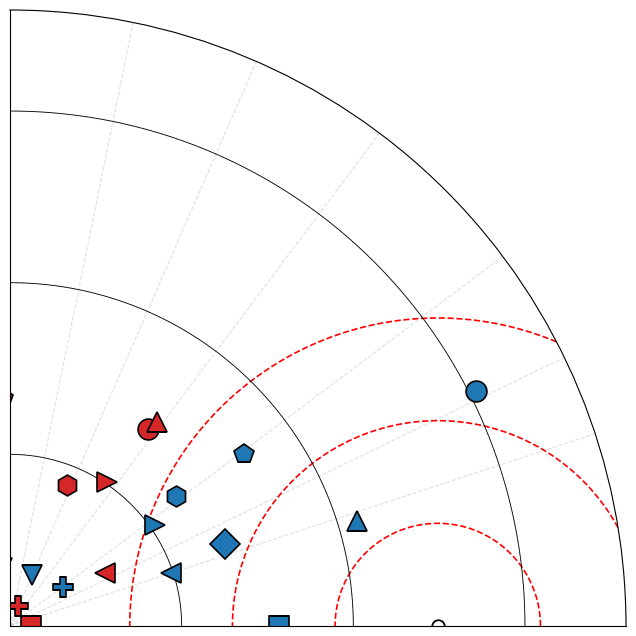


================ RMSE by IGBP for each model ================

[ENF] RF RMSE = 3.3014, SMAP RMSE = 6.8616
[EBF] RF RMSE = 4.1781, SMAP RMSE = 14.9573
[DBF] RF RMSE = 1.3356, SMAP RMSE = 4.4205
[MF] RF RMSE = 1.2571, SMAP RMSE = 5.5650
[CSH] RF RMSE = 2.4513, SMAP RMSE = 2.6927
[OSH] RF RMSE = 0.5657, SMAP RMSE = 0.9051
[WSA] RF RMSE = 2.4565, SMAP RMSE = 5.0292
[SAV] RF RMSE = 1.7984, SMAP RMSE = 2.8231
[GRA] RF RMSE = 1.4410, SMAP RMSE = 2.1755
[CRO] RF RMSE = 1.0065, SMAP RMSE = 1.0339

✅ Dumbbell saved: G:\文章\HUITU\Fig\流程图绘图素材\Dumbbell by IGBP.png


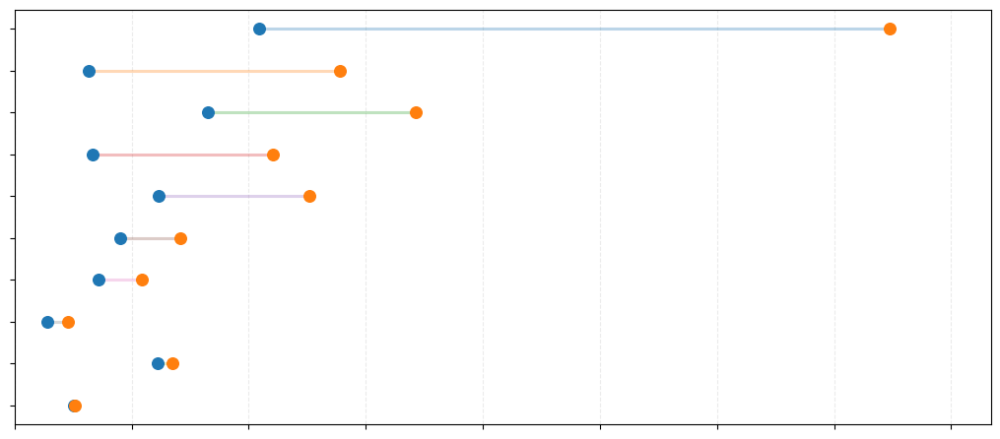


================ 统计信息 ================

有数据的 IGBP 类型数：10
平均 RMSE：RF = 1.9792, SMAP = 4.6464
RF RMSE范围: 0.5657 - 4.1781
SMAP RMSE范围: 0.9051 - 14.9573


In [35]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import joblib

from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from scipy.stats import gaussian_kde

from mpl_toolkits.axes_grid1 import make_axes_locatable

# ============================================================
# 全局绘图设置（保持原风格）
# ============================================================
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["font.size"] = 18
plt.rcParams["axes.unicode_minus"] = False

SEED = 42

# ============================================================
# 路径设置
# ============================================================
# (1) KDE 用
DATA_FILE_PATH_KDE = r"G:\Matlab\EX2025\AuxiliaryData\LFMC-gridMean-ML.xlsx"
MODEL_PATH_KDE = r"models/RFR_6VOD_LAI_PFTs_Hveg.pkl"
SAVE_DIR_KDE = r"G:\文章\HUITU\Fig\流程图绘图素材"
os.makedirs(SAVE_DIR_KDE, exist_ok=True)

# (2) Taylor / (3) Dumbbell 共用验证集
VALIDATION_CSV = r"G:\Matlab\EX2025\AuxiliaryData\Validation.csv"

SAVE_PATH_TAYLOR = r"G:\文章\HUITU\Fig\流程图绘图素材\TaylorDiagram of Diff IGBPs.png"
os.makedirs(os.path.dirname(SAVE_PATH_TAYLOR), exist_ok=True)

SAVE_DIR_DUMBBELL = r"G:\文章\HUITU\Fig\流程图绘图素材"
os.makedirs(SAVE_DIR_DUMBBELL, exist_ok=True)
SAVE_PATH_DUMBBELL = os.path.join(SAVE_DIR_DUMBBELL, "Dumbbell by IGBP.png")

# ============================================================
# (1) KDE：特征列设置（保持原）
# ============================================================
vod_columns = [
    "VOD_Ku_Hpol_Asc", "VOD_Ku_Vpol_Asc",
    "VOD_X_Hpol_Asc", "VOD_X_Vpol_Asc",
    "VOD_C_Hpol_Asc", "VOD_C_Vpol_Asc"
]
pft_columns = [
    "Grass_man", "Grass_nat",
    "Shrub_bd", "Shrub_be", "Shrub_nd", "Shrub_ne",
    "Tree_bd", "Tree_be", "Tree_nd", "Tree_ne"
]
FEATURE_COLUMNS = vod_columns + ["LAI", "Hveg"] + pft_columns


def load_and_clean_kde(feature_cols):
    df = pd.read_excel(DATA_FILE_PATH_KDE)

    df["AGB"] = pd.to_numeric(df["AGB"], errors="coerce")
    df["LFMCValue"] = pd.to_numeric(df["LFMCValue"], errors="coerce")
    df["VWC_sample"] = (df["AGB"] * df["LFMCValue"]) / 1000.0

    df = df[df["VWC_sample"].notna()]
    df = df[df["VWC_sample"] <= 30]

    for c in feature_cols:
        df[c] = pd.to_numeric(df[c], errors="coerce")

    df = df.dropna(subset=feature_cols + ["VWC_sample"])
    X = df[feature_cols].copy()
    y = df["VWC_sample"].copy()
    return X, y, df


def align_features_for_model(X, model):
    if hasattr(model, "feature_names_in_"):
        return X[model.feature_names_in_]
    return X


def plot_density_kde_no_text_no_legend(y_true, y_pred, save_path):
    # 指标：保留计算但不显示
    _rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    _r2 = r2_score(y_true, y_pred)

    # KDE
    xy = np.vstack([y_true, y_pred])
    z = gaussian_kde(xy)(xy)
    idx = z.argsort()
    y_true, y_pred, z = y_true[idx], y_pred[idx], z[idx]

    fig, ax = plt.subplots(figsize=(9, 8))

    # 散点
    im = ax.scatter(y_true, y_pred, c=z, s=30, cmap="jet")

    # 1:1 线
    ax.plot([0, 30], [0, 30], "k--", lw=1.3)

    # 轴范围/刻度（保留刻度位置，去掉文字）
    ax.set_xlim(0, 30)
    ax.set_ylim(0, 30)
    ax.set_xticks([0, 10, 20, 30])
    ax.set_yticks([0, 10, 20, 30])

    ax.set_aspect("equal")

    # 去掉所有文字
    ax.set_title("")
    ax.set_xlabel("")
    ax.set_ylabel("")
    ax.tick_params(axis="x", labelbottom=False)
    ax.tick_params(axis="y", labelleft=False)

    # colorbar 属于“图例/标注”，去除：保持其它不变，创建后删除其轴
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="3%", pad=0.08)
    fig.delaxes(cax)

    fig.savefig(save_path, dpi=300, bbox_inches="tight")
    plt.close(fig)
    print(f"✅ KDE saved: {save_path}")


# ============================================================
# (2) Taylor Diagram：设置（保持原）
# ============================================================
IGBP_MARKERS = {
    "ENF": "o",
    "EBF": "s",
    "DBF": "^",
    "MF": "D",
    "CSH": "v",
    "OSH": "P",
    "WSA": "p",
    "SAV": "h",
    "GRA": ">",
    "CRO": "<"
}

MODEL_COLORS = {
    "RF": "#1f77b4",
    "SMAP": "#d62728"
}


def plot_taylor_igbp_no_text_no_legend(df, actual_col, model1_col, model2_col, igbp_col,
                                       fig_path, rmsd_levels=None, std_margin=1.2):
    # 数据清洗
    df = df.copy()
    df = df[
        df[actual_col].notna() &
        df[model1_col].notna() &
        df[model2_col].notna() &
        df[igbp_col].notna()
    ]

    existing_igbps = [igbp for igbp in IGBP_MARKERS if igbp in df[igbp_col].unique()]

    # 观测标准差
    obs_all = df[actual_col].values
    std_obs = np.std(obs_all, ddof=1)

    # RMSD levels
    std_max = std_obs * std_margin
    if rmsd_levels is None:
        rmsd_levels = np.linspace(0.2 * std_max, 0.6 * std_max, 3)

    fig = plt.figure(figsize=(9, 8))
    ax = fig.add_subplot(111, projection="polar")

    ax.set_thetalim(0, np.pi / 2)
    ax.set_ylim(0, std_max * 1.2)

    # RMSD 等值线（保留线，去掉 clabel 文字）
    thetas = np.linspace(0, np.pi / 2, 400)
    sigmas = np.linspace(0, std_max * 1.2, 400)
    TT, SS = np.meshgrid(thetas, sigmas)
    RMS = np.sqrt(std_obs**2 + SS**2 - 2 * std_obs * SS * np.cos(TT))

    ax.contour(
        TT, SS, RMS,
        levels=rmsd_levels,
        colors="red",
        linestyles="--",
        linewidths=1.2
    )

    # 标准差同心圆
    r_ticks = np.arange(0, std_max * 1.2, 2)
    for r in r_ticks:
        ax.plot(thetas, np.full_like(thetas, r), color="k", linewidth=0.6)
    ax.set_yticks(r_ticks)

    # 相关系数刻度：保留位置但去掉文字
    cor_ticks = [0.0, 0.2, 0.4, 0.6, 0.8, 0.9, 0.95, 1.0]
    theta_ticks_deg = np.degrees(np.arccos(cor_ticks))
    ax.set_thetagrids(theta_ticks_deg, labels=["" for _ in cor_ticks], fontsize=24)

    # 去除径向刻度文字
    ax.set_yticklabels([])

    # 去除标题与轴标签
    ax.set_title("")
    ax.set_xlabel("")
    ax.set_ylabel("")

    # 观测点
    ax.plot(
        0.0, std_obs,
        marker="o",
        markersize=9,
        markerfacecolor="none",
        markeredgecolor="k",
        markeredgewidth=1.3,
        linestyle="None"
    )

    # 模型点
    print("\n各组数据指标 (std, corr, rmse)：")
    for igbp in existing_igbps:
        df_i = df[df[igbp_col] == igbp]
        obs = df_i[actual_col].values
        marker = IGBP_MARKERS[igbp]

        # RF
        rf = df_i[model1_col].values
        std_rf = np.std(rf, ddof=1)
        corr_rf = np.corrcoef(obs, rf)[0, 1]
        rmse_rf = np.sqrt(np.mean((rf - obs) ** 2))
        print(f"{igbp} - RF VWC: std={std_rf:.4f}, corr={corr_rf:.4f}, rmse={rmse_rf:.4f}")

        ax.plot(
            np.arccos(np.clip(corr_rf, -1, 1)), std_rf,
            marker=marker,
            markersize=15,
            linestyle="None",
            markerfacecolor=MODEL_COLORS["RF"],
            markeredgecolor="k",
            markeredgewidth=1.2
        )

        # SMAP
        smap = df_i[model2_col].values
        std_sm = np.std(smap, ddof=1)
        corr_sm = np.corrcoef(obs, smap)[0, 1]
        rmse_sm = np.sqrt(np.mean((smap - obs) ** 2))
        print(f"{igbp} - SMAP VWC: std={std_sm:.4f}, corr={corr_sm:.4f}, rmse={rmse_sm:.4f}")

        ax.plot(
            np.arccos(np.clip(corr_sm, -1, 1)), std_sm,
            marker=marker,
            markersize=15,
            linestyle="None",
            markerfacecolor=MODEL_COLORS["SMAP"],
            markeredgecolor="k",
            markeredgewidth=1.2
        )

    # 图例去除（不创建 legend）
    ax.grid(True, linestyle="--", alpha=0.4)

    os.makedirs(os.path.dirname(fig_path), exist_ok=True)
    fig.savefig(fig_path, dpi=300, bbox_inches="tight")
    plt.show()


# ============================================================
# (3) Dumbbell：设置（保持原）
# ============================================================
IGBP_NAMES_DUMBBELL = [
    "ENF", "EBF", "DNF", "DBF", "MF", "CSH", "OSH", "WSA", "SAV", "GRA", "WET",
    "CRO", "URB", "CVM", "SNO", "BSV", "WAT"
]


def plot_rmse_dumbbell_no_text_no_legend(df, save_path):
    # 有效性过滤
    df = df[
        (df["VWC_sample"] != -9999) & (df["VWC_sample"].notna()) &
        (df["predictedVWC"] != -9999) & (df["predictedVWC"].notna()) &
        (df["PreStudy_VWC"] != -9999) & (df["PreStudy_VWC"].notna()) &
        (df["IGBP_MainType"].notna())
    ].copy()

    # 计算 RMSE
    print("\n================ RMSE by IGBP for each model ================\n")
    rmse_data = {}
    for igbp in IGBP_NAMES_DUMBBELL:
        df_sub = df[df["IGBP_MainType"] == igbp]
        if df_sub.empty:
            rmse_data[igbp] = {"RF": np.nan, "SMAP": np.nan}
            continue

        obs = df_sub["VWC_sample"].values.astype(float)

        rf = df_sub["predictedVWC"].values.astype(float)
        rmse_rf = np.sqrt(np.mean((rf - obs) ** 2))

        smap = df_sub["PreStudy_VWC"].values.astype(float)
        rmse_smap = np.sqrt(np.mean((smap - obs) ** 2))

        rmse_data[igbp] = {"RF": rmse_rf, "SMAP": rmse_smap}
        print(f"[{igbp}] RF RMSE = {rmse_rf:.4f}, SMAP RMSE = {rmse_smap:.4f}")

    rmse_df = pd.DataFrame(rmse_data).T
    rmse_df_clean = rmse_df.dropna()

    # 哑铃图数据
    plot_df = rmse_df_clean.copy()
    plot_df["Delta"] = plot_df["SMAP"] - plot_df["RF"]
    plot_df = plot_df.sort_values("Delta", ascending=False)

    n = len(plot_df)
    fig_h = max(4.8, 0.48 * n)
    fig_w = 10.5

    fig, ax = plt.subplots(figsize=(fig_w, fig_h))

    y = np.arange(n)
    rf = plot_df["RF"].values
    smap = plot_df["SMAP"].values

    # 连接线
    for i in range(n):
        ax.plot([rf[i], smap[i]], [y[i], y[i]], linewidth=2.2, alpha=0.30)

    # 两组点（label 留着也无所谓，legend 不显示）
    ax.scatter(rf, y, s=70, label="Retrieved VWC", zorder=3)
    ax.scatter(smap, y, s=70, label="SMAP VWC", zorder=3)

    # y tick 位置保留，去掉文字
    ax.set_yticks(y)
    ax.set_yticklabels([])
    ax.tick_params(axis="y", labelleft=False)

    # x tick 位置保留，去掉文字
    ax.tick_params(axis="x", labelbottom=False)

    # x 轴范围自动留边（不改）
    x_min = np.nanmin(np.r_[rf, smap])
    x_max = np.nanmax(np.r_[rf, smap])
    pad = 0.10 * (x_max - x_min + 1e-6)
    ax.set_xlim(max(0, x_min - pad), x_max + 1.2 * pad)

    # 去掉标题与轴标签
    ax.set_title("")
    ax.set_xlabel("")
    ax.set_ylabel("")

    # 网格保留
    ax.grid(axis="x", linestyle="--", alpha=0.25)

    # 图例去除（不创建 legend；若意外创建则移除）
    leg = ax.get_legend()
    if leg is not None:
        leg.remove()

    ax.invert_yaxis()

    plt.tight_layout()
    plt.savefig(save_path, dpi=300, bbox_inches="tight")
    print(f"\n✅ Dumbbell saved: {save_path}")
    plt.show()

    # 统计输出（保留）
    print("\n================ 统计信息 ================\n")
    print(f"有数据的 IGBP 类型数：{len(rmse_df_clean)}")
    print(f"平均 RMSE：RF = {rmse_df_clean['RF'].mean():.4f}, SMAP = {rmse_df_clean['SMAP'].mean():.4f}")
    print(f"RF RMSE范围: {rmse_df_clean['RF'].min():.4f} - {rmse_df_clean['RF'].max():.4f}")
    print(f"SMAP RMSE范围: {rmse_df_clean['SMAP'].min():.4f} - {rmse_df_clean['SMAP'].max():.4f}")


# ============================================================
# 主程序：一次运行，分别输出三张图
# ============================================================
def main():
    # ---------- (1) KDE ----------
    X, y, df_kde = load_and_clean_kde(FEATURE_COLUMNS)

    X_train, X_test, y_train, y_test, idx_train, idx_test = train_test_split(
        X, y, df_kde.index,
        test_size=0.333,
        random_state=SEED,
        shuffle=True
    )

    model = joblib.load(MODEL_PATH_KDE)
    X_test_for_pred = align_features_for_model(X_test, model)
    y_pred = model.predict(X_test_for_pred)

    plot_density_kde_no_text_no_legend(
        y_test.values,
        y_pred,
        os.path.join(SAVE_DIR_KDE, "Fig 3.3(a) KDEdensity RF VWC.png")
    )

    # ---------- (2)(3) Validation 数据只读一次 ----------
    df_val = pd.read_csv(VALIDATION_CSV)

    # ---------- (2) Taylor ----------
    plot_taylor_igbp_no_text_no_legend(
        df=df_val,
        actual_col="VWC_sample",
        model1_col="predictedVWC",
        model2_col="PreStudy_VWC",
        igbp_col="IGBP_MainType",
        fig_path=SAVE_PATH_TAYLOR
    )

    # ---------- (3) Dumbbell ----------
    plot_rmse_dumbbell_no_text_no_legend(
        df=df_val,
        save_path=SAVE_PATH_DUMBBELL
    )


if __name__ == "__main__":
    main()


#### （3）散点图

<>:8: SyntaxWarning: invalid escape sequence '\H'
<>:8: SyntaxWarning: invalid escape sequence '\H'
C:\Users\Ronin\AppData\Local\Temp\ipykernel_32140\1932948928.py:8: SyntaxWarning: invalid escape sequence '\H'
  - 保存文件夹固定为：G:\文章\HUITU\Fig\流程图绘图素材


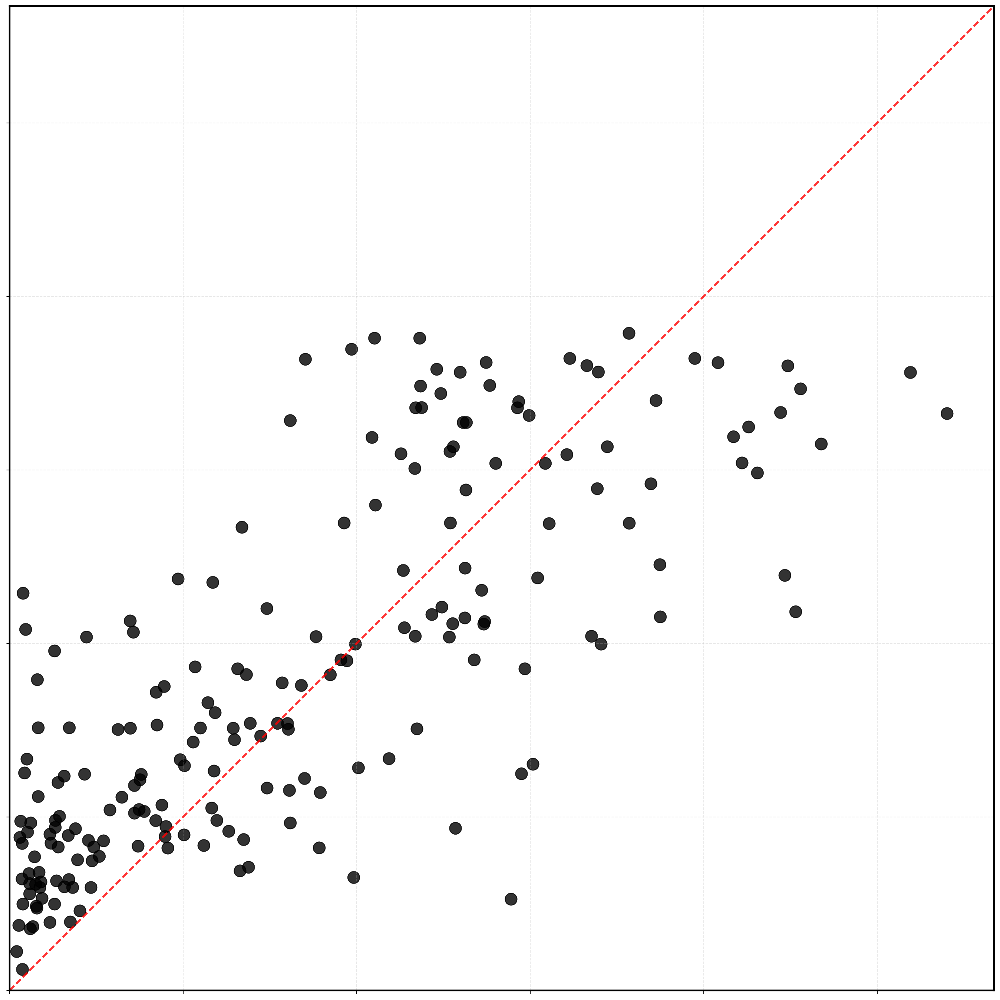

Saved -> G:\文章\HUITU\Fig\流程图绘图素材\Fig5_AllData_Only.png
ALL Data   -> RMSE=0.8452, R=0.7745, Bias=0.1587, ubRMSE=0.8302, N=203


In [36]:
# -*- coding: utf-8 -*-
"""
按你的最新要求修改：
- 只绘制“总图”（All Data 面板），其他子图全部去掉
- 去掉 legend
- 去掉图中所有文字标记（标题/坐标轴标签/tick标签/统计文本等）
- 其它保持不变（点样式、线、网格、spine、图尺寸等保持原逻辑）
- 保存文件夹固定为：G:\文章\HUITU\Fig\流程图绘图素材
"""

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import stats as sp_stats

# ====================== 全局字体设置（与SMELR一致） ======================
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["mathtext.fontset"] = "stix"
plt.rcParams["axes.unicode_minus"] = False

# ====================== 通用符号格式（以SMELR为基础，但不显示年份） ======================
BASE_VEG_STYLES = {
    "Corn":      {"marker": "s", "size": 160, "color": "#1f77b4", "label": "Corn"},
    "Oat":       {"marker": "^", "size": 160, "color": "#ff7f0e", "label": "Oat"},
    "Buckwheat": {"marker": "D", "size": 160, "color": "#9467bd", "label": "Buckwheat"},
    "Grass":     {"marker": "X", "size": 160, "color": "red",     "label": "Grass"},  # 合并后统一为 ×
}

# 额外 marker（避开 SMELR 已用：s ^ D X）
EXTRA_MARKERS = ["o", "v", "<", ">", "P", "*", "h", "H", "p", "8", "+", "x", "1", "2", "3", "4", "|", "_"]
TAB20 = plt.cm.tab20(np.linspace(0, 1, 20))

# ====================== 植被名称标准化（含 cotton 合并规则） ======================
def normalize_veg_name(x: str) -> str:
    if pd.isna(x):
        return x

    raw = str(x).strip()
    s = raw.strip().lower()

    s = s.replace("_", "-")
    s = "-".join([p for p in s.split("-") if p != ""])

    # ====== 指定合并：两个 cotton 合并为 Cotton ======
    if s in {"strip-till-cotton", "conventional-cotton"}:
        return "Cotton"

    # ====== 常见别名归一 ======
    alias = {
        "oat": "Oat",
        "oats": "Oat",
        "corn": "Corn",
        "maize": "Corn",
        "wheat": "Wheat",
        "canola": "Canola",
        "black bean": "Black Bean",
        "black-bean": "Black Bean",
        "blackbean": "Black Bean",
        "buckwheat": "Buckwheat",
        "grass": "Grass",
        "flight": "Grass",  # 关键：Flight 并入 Grass
    }
    if s in alias:
        return alias[s]

    # ====== 其它：更友好的展示 ======
    s2 = s.replace("-", " ")
    s2 = " ".join(s2.split())
    return " ".join([w.capitalize() for w in s2.split(" ")])

# ====================== 统计（Pearson R + RMSE） ======================
def calculate_stats(measured: np.ndarray, predicted: np.ndarray):
    measured = np.asarray(measured, dtype=float)
    predicted = np.asarray(predicted, dtype=float)

    if len(measured) < 2 or np.all(measured == measured[0]) or np.all(predicted == predicted[0]):
        r = np.nan
    else:
        r, _ = sp_stats.pearsonr(measured, predicted)

    diff = predicted - measured
    bias = np.mean(diff) if len(measured) > 0 else np.nan
    rmse = np.sqrt(np.mean(diff ** 2)) if len(measured) > 0 else np.nan
    ubrmse = np.sqrt(max(rmse ** 2 - bias ** 2, 0.0)) if len(measured) > 0 else np.nan

    return r, bias, rmse, ubrmse, int(len(measured))

# ====================== 清洗：去 NaN、去<-100 异常值 ======================
def clean_measured_predicted(df: pd.DataFrame, measured_col: str, predicted_col: str):
    tmp = df[[measured_col, predicted_col]].copy()
    tmp.columns = ["measured", "predicted"]
    mask = ~(
        tmp["measured"].isna() | tmp["predicted"].isna()
        | (tmp["measured"] < -100) | (tmp["predicted"] < -100)
    )
    return tmp.loc[mask].copy()

# ====================== 读取 SMEX03（所有植被类型；cotton 合并） ======================
def load_smex03(file_path: str):
    df = pd.read_excel(file_path, sheet_name="SMEX03_Grid_Crop")
    df = df.rename(columns={"Insitu RF-retrieved VWC and pure PFT": "Predicted_VWC"})

    tmp = df[["VWC", "Predicted_VWC", "Crop"]].copy()
    tmp = tmp.dropna(subset=["VWC", "Predicted_VWC", "Crop"])
    tmp["veg"] = tmp["Crop"].apply(normalize_veg_name)

    keep = {"Double Row Peanuts", "Cotton", "Pasture"}
    tmp = tmp[tmp["veg"].isin(keep)].copy()

    clean_xy = clean_measured_predicted(tmp, "VWC", "Predicted_VWC")
    clean_xy["veg"] = tmp.loc[clean_xy.index, "veg"].values
    clean_xy["experiment"] = "SMEX03"
    return clean_xy

# ====================== 读取 SMAPVEX16M（只选指定植被类型） ======================
def load_smapvex16m(file_path: str):
    df = pd.read_excel(file_path, sheet_name="SMAPVEX16M_Grid_Crop")
    df = df.rename(columns={"Insitu RF-retrieved VWC and pure PFT": "Predicted_VWC"})

    tmp = df[["VWC", "Predicted_VWC", "CROP"]].copy()
    tmp = tmp.dropna(subset=["VWC", "Predicted_VWC", "CROP"])
    tmp["veg"] = tmp["CROP"].apply(normalize_veg_name)

    keep = {"Wheat", "Canola", "Corn", "Oat", "Black Bean"}
    tmp = tmp[tmp["veg"].isin(keep)].copy()

    clean_xy = clean_measured_predicted(tmp, "VWC", "Predicted_VWC")
    clean_xy["veg"] = tmp.loc[clean_xy.index, "veg"].values
    clean_xy["experiment"] = "SMAPVEX16M"
    return clean_xy

# ====================== 读取 SMELR（所有实验 sheet；Grass 与 Flight 合并为 Grass） ======================
SMELR_COLUMN_MAP = {
    "CornVegMeasured":   ("VWC", "Insitu RF-retrieved VWC and pure PFT", "Corn"),
    "OatVegMeasured":    ("VWC", "Insitu RF-retrieved VWC and pure PFT", "Oat"),
    "BuckwheatMeasured": ("VWC", "Insitu RF-retrieved VWC and pure PFT", "Buckwheat"),
    "Grass2018":         ("VWC", "Insitu RF-retrieved VWC and pure PFT", "Grass"),
    "Flight2018":        ("VWC", "RF-retrieved VWC", "Grass"),
}

def load_smelr(file_path: str):
    pieces = []
    for sheet, (meas_col, pred_col, veg_name) in SMELR_COLUMN_MAP.items():
        df = pd.read_excel(file_path, sheet_name=sheet)
        clean_xy = clean_measured_predicted(df, meas_col, pred_col)
        clean_xy["veg"] = veg_name
        clean_xy["experiment"] = "SMELR"
        pieces.append(clean_xy)
    return pd.concat(pieces, ignore_index=True)

# ====================== 生成全局一致的植被符号格式 ======================
def build_style_map(all_veg_names):
    style_map = dict(BASE_VEG_STYLES)

    used_markers = {v["marker"] for v in style_map.values()}
    marker_pool = [m for m in EXTRA_MARKERS if m not in used_markers]
    marker_i = 0
    color_i = 0

    for veg in sorted(set(all_veg_names)):
        if veg in style_map:
            continue

        mk = marker_pool[marker_i % len(marker_pool)]
        marker_i += 1

        col = TAB20[color_i % len(TAB20)]
        color_i += 1

        style_map[veg] = {
            "marker": mk,
            "size": 180,
            "color": col,
            "label": veg
        }
    return style_map

# ====================== 绘制“总图(All Data)”（仅此一个面板） ======================
def plot_all_data_panel(ax, df_panel: pd.DataFrame, style_map: dict, summary_black: bool = True):
    """
    summary_black=True:
      - 不区分植被类型，全部用黑色点绘制（沿用你原来的 All Data 逻辑）
    """
    if summary_black:
        ax.scatter(
            df_panel["measured"], df_panel["predicted"],
            c="black", s=180, alpha=0.8,
            edgecolors="black", linewidth=1
        )
    else:
        for veg in sorted(df_panel["veg"].unique()):
            d = df_panel[df_panel["veg"] == veg]
            st = style_map[veg]
            ax.scatter(
                d["measured"], d["predicted"],
                marker=st["marker"],
                s=st["size"],
                c=[st["color"]],
                alpha=0.8,
                edgecolors="black",
                linewidth=1,
            )

    max_val = float(max(df_panel["measured"].max(), df_panel["predicted"].max()))
    padding = 0.05 * max_val if max_val > 0 else 0.01
    ax.plot([0, max_val + padding], [0, max_val + padding], "r--", lw=2, alpha=0.8)

    ax.set_xlim(0, max_val + padding)
    ax.set_ylim(0, max_val + padding)
    ax.set_aspect("equal")

    # 统计仍计算，但不显示文字
    _r, _bias, _rmse, _ubrmse, _n = calculate_stats(df_panel["measured"], df_panel["predicted"])

    # 保留网格和边框风格（不改）
    ax.tick_params(labelsize=24)
    ax.grid(True, alpha=0.3, linestyle="--")

    for spine in ax.spines.values():
        spine.set_linewidth(2.0)
        spine.set_color("black")

    # ================= 去除所有文字标记 =================
    ax.set_title("")
    ax.set_xlabel("")
    ax.set_ylabel("")
    ax.tick_params(axis="x", labelbottom=False)
    ax.tick_params(axis="y", labelleft=False)
    # 不绘制 ax.text()（原来的 R/Bias/RMSE/ubRMSE 文本已去掉）


# ====================== 主程序 ======================
if __name__ == "__main__":
    SMEX03_FILE = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMEX03\Insitu_SMEX03_VWC_results-ML.xlsx"
    SMAPVEX16M_FILE = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMAPVEX16M\Insitu_SMAPVEX16M_VWC_results-ML.xlsx"
    SMELR_FILE = r"G:\data\VWC\test-VWC\SMELR_PointToPixel_Validation\Insitu_SMELR_VWC_results-ML.xlsx"

    # ✅ 保存文件夹固定为流程图绘图素材
    SAVE_DIR = r"G:\文章\HUITU\Fig\流程图绘图素材"
    os.makedirs(SAVE_DIR, exist_ok=True)

    df_smex03 = load_smex03(SMEX03_FILE)
    df_smapvex16m = load_smapvex16m(SMAPVEX16M_FILE)
    df_smelr = load_smelr(SMELR_FILE)
    df_all = pd.concat([df_smex03, df_smapvex16m, df_smelr], ignore_index=True)

    style_map = build_style_map(df_all["veg"].unique())

    # 只绘制总图：保持原来“总图所在子图”的尺寸逻辑（从 2x2 中抽取一个面板等效）
    fig, ax = plt.subplots(figsize=(19, 16), dpi=300)

    # All Data：summary_black=True（与原 ax22 一致）
    plot_all_data_panel(ax, df_all, style_map, summary_black=True)

    # ✅ legend 不创建（原 fig.legend 直接移除，不再调用）
    plt.tight_layout()

    out_png = os.path.join(SAVE_DIR, "Fig5_AllData_Only.png")
    plt.savefig(out_png, dpi=300, bbox_inches="tight")
    plt.show()

    print("Saved ->", out_png)

    # 统计输出保留
    r, bias, rmse, ubrmse, n = calculate_stats(df_all["measured"], df_all["predicted"])
    print(f"{'ALL Data':10s} -> RMSE={rmse:.4f}, R={r:.4f}, Bias={bias:.4f}, ubRMSE={ubrmse:.4f}, N={n}")


#### （4）散点配色图

In [37]:
# save as plot_mainTypeMarker_Hveg_grid_3cols_with_SMELR_datefilter_statsbox_plus_summary_density.py
# 按你的要求修改：
# - 只绘制“总图（Summary / All Data density）”这一张
# - 其他子图全部去掉
# - 去掉 legend
# - 去掉图中所有文字标记（标题/轴标签/tick标签/统计框/色标文字等）
# - 其余绘图逻辑不变（点、密度、尺寸等）
# - 保存文件夹固定：G:\文章\HUITU\Fig\流程图绘图素材

import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from scipy.stats import pearsonr, gaussian_kde
from math import sqrt, ceil

# ===================== 全局设置 =====================
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["axes.unicode_minus"] = False

mpl.rcParams["mathtext.fontset"] = "custom"
mpl.rcParams["mathtext.rm"] = "Times New Roman"
mpl.rcParams["mathtext.it"] = "Times New Roman:italic"
mpl.rcParams["mathtext.bf"] = "Times New Roman:bold"
mpl.rcParams["mathtext.default"] = "regular"

# ===================== ✅ 全局字体大小控制（保留，不影响“去字”） =====================
FS_PANEL_TITLE = 24
FW_PANEL_TITLE = "bold"
FS_AXIS_LABEL = 20
FW_AXIS_LABEL = "bold"
FS_TICK = 18
FS_STATS_BOX = 20
FS_CBAR_LABEL = 20
FS_CBAR_TICK = 18

# ===================== 常量 =====================
FILL_VALUE = -9999.0

PFT_COLS = [
    "Grass_man", "Grass_nat",
    "Shrub_bd", "Shrub_be", "Shrub_nd", "Shrub_ne",
    "Tree_bd", "Tree_be", "Tree_nd", "Tree_ne"
]

# ✅ 保存文件夹固定为流程图绘图素材
OUT_DIR = r"G:\文章\HUITU\Fig\流程图绘图素材"
os.makedirs(OUT_DIR, exist_ok=True)

# ===================== 更严苛筛选：各子数据 Hveg 上限（>阈值剔除） =====================
HVEG_UPPER_LIMITS = {
    "SMAPVEX12": 4,
    "SMELR": 8
}

# ===================== ✅ 自定义各面板轴范围（x/y 同范围，保持 1:1） =====================
AX_LIMS = {
    "SMEX03": (0.0, 8),
    "SMAPVEX12": (0.0, 8),
    "SMAPVEX16-MB": (0.0, 6.0),
    "SMELR": (0.0, 10.0),
    "All Data": (0.0, 10.0),
}

# ===================== ✅ SMELR 实测日期（从 in-situ 文件提取） =====================
SMELR_INSITU_EXCEL = r"G:\data\VWC\test-VWC\SMELR_PointToPixel_Validation\Insitu_SMELR_VWC_results-ML.xlsx"
SMELR_INSITU_EXCLUDE_SHEETS = {"CornVegFitting", "OatVegFitting"}
_SMELR_ALLOWED_DATES = None


def load_smelr_insitu_dates(
    excel_path: str = SMELR_INSITU_EXCEL,
    exclude_sheets: set = SMELR_INSITU_EXCLUDE_SHEETS,
    date_col: str = "Date"
) -> pd.DatetimeIndex:
    xls = pd.ExcelFile(excel_path)
    sheet_names = [s for s in xls.sheet_names if s not in exclude_sheets]

    all_dates = []
    for sh in sheet_names:
        try:
            df = pd.read_excel(excel_path, sheet_name=sh, usecols=[date_col])
        except ValueError:
            print(f"[WARN] Insitu sheet '{sh}': cannot read '{date_col}' column, skipped.")
            continue
        except Exception as e:
            print(f"[WARN] Insitu sheet '{sh}': read failed ({e}), skipped.")
            continue

        if date_col not in df.columns:
            print(f"[WARN] Insitu sheet '{sh}': no '{date_col}' column, skipped.")
            continue

        d = pd.to_datetime(df[date_col], errors="coerce")
        d = d[d.notna()].dt.normalize()
        if len(d) > 0:
            all_dates.append(d)

    if len(all_dates) == 0:
        raise ValueError(
            f"No valid dates extracted from insitu file: {excel_path}. "
            f"Check sheet names / Date column."
        )

    dates = pd.DatetimeIndex(pd.concat(all_dates, ignore_index=True).unique()).sort_values()
    print(f"[INFO] Loaded SMELR insitu dates: {len(dates)} unique dates from {len(sheet_names)} sheets "
          f"(excluded: {sorted(list(exclude_sheets))}).")
    return dates


def filter_smelr_by_date(df: pd.DataFrame, date_col: str = "Date") -> pd.DataFrame:
    global _SMELR_ALLOWED_DATES

    if date_col not in df.columns:
        raise KeyError(f"SMELR dataframe has no '{date_col}' column. Existing: {list(df.columns)}")

    if _SMELR_ALLOWED_DATES is None:
        _SMELR_ALLOWED_DATES = load_smelr_insitu_dates(
            excel_path=SMELR_INSITU_EXCEL,
            exclude_sheets=SMELR_INSITU_EXCLUDE_SHEETS,
            date_col=date_col
        )

    df = df.copy()
    df[date_col] = pd.to_datetime(df[date_col], errors="coerce")
    df = df[df[date_col].notna()]

    df["_date_norm_"] = df[date_col].dt.normalize()
    df2 = df[df["_date_norm_"].isin(_SMELR_ALLOWED_DATES)].copy()
    df2.drop(columns=["_date_norm_"], inplace=True, errors="ignore")
    return df2


def calc_stats_simple(x, y, fill_value=FILL_VALUE):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    mask = (
        ~np.isnan(x) &
        ~np.isnan(y) &
        (x != fill_value) &
        (y != fill_value) &
        (x >= 0) &
        (y >= 0)
    )
    x = x[mask]
    y = y[mask]

    n = len(x)
    if n < 2:
        return np.nan, np.nan, np.nan, np.nan, n

    r, _ = pearsonr(x, y)

    diff = y - x
    bias = np.mean(diff)
    rmse = sqrt(np.mean(diff ** 2))
    ubrmse = sqrt(max(rmse ** 2 - bias ** 2, 0.0))

    return r, bias, rmse, ubrmse, n


def apply_strict_hveg_filter(df: pd.DataFrame, title: str) -> pd.DataFrame:
    if "Hveg_Satellite" not in df.columns:
        return df

    limit = None
    matched_key = None
    for k, v in HVEG_UPPER_LIMITS.items():
        if k in str(title):
            limit = v
            matched_key = k
            break

    if limit is None:
        return df

    before_n = len(df)
    df2 = df.copy()
    df2["Hveg_Satellite"] = pd.to_numeric(df2["Hveg_Satellite"], errors="coerce")
    df2 = df2[df2["Hveg_Satellite"].notna()]
    df2 = df2[df2["Hveg_Satellite"] <= limit]
    after_n = len(df2)

    print(f"[INFO] {title} strict Hveg filter ({matched_key}): Hveg <= {limit} kept {after_n}/{before_n}")
    return df2


def get_ax_lims_by_title(title: str, default_vmax: float):
    for k, (vmin, vmax) in AX_LIMS.items():
        if k in str(title):
            return vmin, vmax
    return 0.0, default_vmax


def read_first_sheet(excel_path: str) -> pd.DataFrame:
    xls = pd.ExcelFile(excel_path)
    if len(xls.sheet_names) == 0:
        raise ValueError(f"No sheets found in {excel_path}")
    return pd.read_excel(excel_path, sheet_name=xls.sheet_names[0])


def clean_xyh_only(df: pd.DataFrame, title: str):
    needed_cols = ["Map VWC", "RF-retrieved VWC No QC", "Hveg_Satellite"]
    missing = [c for c in needed_cols if c not in df.columns]
    if missing:
        print(f"[WARN] {title}: missing columns: {missing}")
        return None

    df = df.copy()

    df[["Map VWC", "RF-retrieved VWC No QC"]] = df[["Map VWC", "RF-retrieved VWC No QC"]].replace(FILL_VALUE, np.nan)
    df.loc[df["Map VWC"] < 0, "Map VWC"] = np.nan
    df.loc[df["RF-retrieved VWC No QC"] < 0, "RF-retrieved VWC No QC"] = np.nan

    df["Hveg_Satellite"] = df["Hveg_Satellite"].replace(FILL_VALUE, np.nan)
    df.loc[df["Hveg_Satellite"] < 0, "Hveg_Satellite"] = np.nan

    df = apply_strict_hveg_filter(df, title)

    df = df.dropna(subset=["Map VWC", "RF-retrieved VWC No QC", "Hveg_Satellite"])
    df = df[(df["Map VWC"] >= 0) & (df["RF-retrieved VWC No QC"] >= 0) & (df["Hveg_Satellite"] >= 0)]

    if len(df) < 2:
        print(f"[WARN] {title}: insufficient valid samples (<2)")
        return None

    x = df["Map VWC"].values.astype(float)
    y = df["RF-retrieved VWC No QC"].values.astype(float)

    vmax = ceil(max(np.max(x), np.max(y)))
    if vmax < 1:
        vmax = 1

    return x, y, vmax


def force_axis_linewidth(ax, spine_lw=2.0, tick_lw=2.0):
    for sp in ax.spines.values():
        sp.set_linewidth(spine_lw)
        sp.set_color("black")
    ax.tick_params(axis="both", width=tick_lw)


def draw_summary_density(ax, x_all, y_all, title="All Data"):
    x_all = np.asarray(x_all, dtype=float)
    y_all = np.asarray(y_all, dtype=float)

    r_all, bias_all, rmse_all, ubrmse_all, n_all = calc_stats_simple(x_all, y_all)
    if n_all < 2:
        ax.axis("off")
        return None

    xy = np.vstack([x_all, y_all])
    kde = gaussian_kde(xy)
    density = kde(xy)
    dmin, dmax = density.min(), density.max()
    dnorm = (density - dmin) / (dmax - dmin) if dmax > dmin else np.ones_like(density) * 0.5

    idx = np.argsort(dnorm)
    x_plot = x_all[idx]
    y_plot = y_all[idx]
    d_plot = dnorm[idx]

    vmax = ceil(max(np.max(x_plot), np.max(y_plot)))
    if vmax < 1:
        vmax = 1

    gamma = 0.55
    d = np.clip(d_plot, 0, 1) ** gamma

    grey_min = 0.85
    grey = grey_min * (1 - d)

    rgba = np.zeros((len(d), 4), dtype=float)
    rgba[:, 0] = grey
    rgba[:, 1] = grey
    rgba[:, 2] = grey
    rgba[:, 3] = 1.0

    im = ax.scatter(x_plot, y_plot, c=rgba, s=48, edgecolors="none")

    # 1:1线与坐标范围（保持原）
    vmin, vmax = get_ax_lims_by_title(title, vmax)
    ax.plot([vmin, vmax], [vmin, vmax], "r--", lw=1)
    ax.set_xlim(vmin, vmax)
    ax.set_ylim(vmin, vmax)
    ax.set_aspect("equal")
    ax.grid(True, linestyle="--", alpha=0.3)

    force_axis_linewidth(ax, spine_lw=2.0, tick_lw=2.0)

    # ===================== 去掉所有文字标记 =====================
    ax.set_title("")
    ax.set_xlabel("")
    ax.set_ylabel("")
    ax.tick_params(axis="both", labelsize=FS_TICK, labelbottom=False, labelleft=False)

    # 原统计框文字不绘制（保留计算但不显示）
    _ = (r_all, bias_all, rmse_all, ubrmse_all)

    return im


def main():
    file_path_main = r"G:\data\VWC\test-VWC\SMAP_PixelToPixel_Validation\processPFT\VWC_Map_results_ML.xlsx"
    main_sheets = [
        "SMEX03",
        "SMAPVEX16 Manitoba",
        "SMAPVEX16 Iowa"
    ]

    file_path_smelr = r"G:\data\VWC\test-VWC\SMELR_PixelToPixel_Validation\VWC_Map_results_ML.xlsx"
    smelr_title = "SMELR"

    # ===================== 只做 Summary 所需：汇总所有 panel 的 x/y =====================
    x_all_list, y_all_list = [], []

    # MAIN panels：仅用于累积数据（不画图）
    for sh in main_sheets:
        try:
            df = pd.read_excel(file_path_main, sheet_name=sh)
        except Exception as e:
            print(f"[WARN] {sh}: failed to read - {e}")
            continue

        pack = clean_xyh_only(df, title=sh)
        if pack is None:
            continue
        x, y, _vmax = pack
        if x is not None and y is not None and len(x) >= 2:
            x_all_list.append(x)
            y_all_list.append(y)

    # SMELR panel：仅用于累积数据（不画图）
    try:
        df_smelr = read_first_sheet(file_path_smelr)
        before_n = len(df_smelr)
        df_smelr = filter_smelr_by_date(df_smelr, date_col="Date")
        after_n = len(df_smelr)
        print(f"[INFO] SMELR date filter (insitu-based): {before_n} -> {after_n} rows kept")
    except Exception as e:
        print(f"[WARN] SMELR read/date-filter failed: {e}")
        df_smelr = None

    if df_smelr is not None:
        pack = clean_xyh_only(df_smelr, title=smelr_title)
        if pack is not None:
            x, y, _vmax = pack
            if x is not None and y is not None and len(x) >= 2:
                x_all_list.append(x)
                y_all_list.append(y)

    if len(x_all_list) == 0:
        raise RuntimeError("[ERROR] Summary: no data accumulated from panels (MAIN + SMELR).")

    x_all = np.concatenate(x_all_list)
    y_all = np.concatenate(y_all_list)

    # ===================== 只绘制总图（Summary） =====================
    # 保持原总图单面板的风格尺寸：原 grid 每 panel_size=5.6，这里就用同等尺寸
    panel_size = 5.6
    fig, ax = plt.subplots(1, 1, figsize=(panel_size, panel_size), dpi=300)

    im = draw_summary_density(ax, x_all, y_all, title="All Data")

    # colorbar 属于“图例/标注”，去掉（不创建）
    # legend 属于“图例”，本脚本不创建

    plt.tight_layout()

    out_path = os.path.join(OUT_DIR, "Fig6_NoQC_SummaryOnly.png")
    fig.savefig(out_path, dpi=300, bbox_inches="tight")
    plt.close(fig)

    print(f"[OK] Saved summary-only figure: {out_path}")
    plt.show()


if __name__ == "__main__":
    main()


[INFO] Loaded SMELR insitu dates: 36 unique dates from 5 sheets (excluded: ['CornVegFitting', 'OatVegFitting']).
[INFO] SMELR date filter (insitu-based): 85376 -> 16704 rows kept
[INFO] SMELR strict Hveg filter (SMELR): Hveg <= 8 kept 12780/16704
[OK] Saved summary-only figure: G:\文章\HUITU\Fig\流程图绘图素材\Fig6_NoQC_SummaryOnly.png


#### （5）全球图

C:\Users\Ronin\AppData\Local\Temp\ipykernel_32140\3414869864.py:81: RuntimeWarning: Mean of empty slice
  data_mean = np.nanmean(np.stack(data_list, axis=0), axis=0)


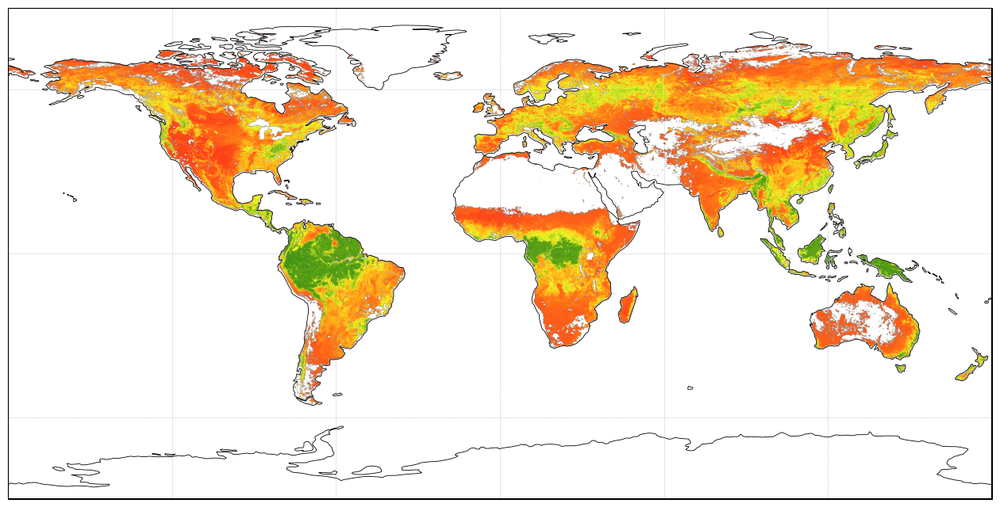

In [38]:
import os
import numpy as np
import rasterio
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from matplotlib.colors import LinearSegmentedColormap, Normalize
import matplotlib.ticker as mticker
from matplotlib.patches import Rectangle
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER

# ======================
# 0. 全局字体（与 Fig.4 统一）
# ======================
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["mathtext.fontset"] = "stix"
plt.rcParams["axes.unicode_minus"] = False

# ======================
# 1. 数据路径
# ======================
ROOT = r"G:\data\VWC\VWCMap\Monthly"
FILE_PATTERN = "VWC-2020{:02d}.tif"

month_names = [
    "Jan", "Feb", "Mar", "Apr",
    "May", "Jun", "Jul", "Aug",
    "Sep", "Oct", "Nov", "Dec"
]

# ======================
# 2. 颜色映射（逐月 VWC 样式，保持不变）
# ======================
colors = [
    "#fe3c19",  # 0
    "#ffac18",  # 5
    "#f2fe2a",  # 10
    "#7cb815",  # 15
    "#147218"   # 20
]

cmap_vwc = LinearSegmentedColormap.from_list("vwc_cmap", colors, N=256)
cmap_vwc.set_bad("none")

norm = Normalize(vmin=0.0, vmax=20.0)

# ======================
# 3. 创建画布（只绘制总图：单张）
#    其余保持 Fig.4 风格：projection / coastlines / gridlines / rectangle 等不变
# ======================
fig, ax = plt.subplots(
    1, 1,
    figsize=(16, 12),
    subplot_kw={"projection": ccrs.PlateCarree()}
)

# ======================
# 4. 读取并绘制“总图”数据（12个月平均）
#    - 其它子图去掉
#    - 图中所有文字标记去除（坐标标签/刻度文字/标题/色标文字）
#    - 去掉 colorbar（视作图例/标注）
# ======================
data_list = []
extent = None

for m in range(1, 13):
    fp = os.path.join(ROOT, FILE_PATTERN.format(m))
    with rasterio.open(fp) as src:
        d = src.read(1).astype(float)
        d[d == -9999] = np.nan

        if extent is None:
            extent = [
                src.bounds.left,
                src.bounds.right,
                src.bounds.bottom,
                src.bounds.top
            ]
        data_list.append(d)

# 12个月平均（忽略 NaN）
data_mean = np.nanmean(np.stack(data_list, axis=0), axis=0)

im = ax.imshow(
    data_mean,
    extent=extent,
    cmap=cmap_vwc,
    norm=norm,
    transform=ccrs.PlateCarree()
)

# 边框矩形（保持不变）
ax.add_patch(Rectangle(
    (extent[0], extent[2]),
    extent[1] - extent[0],
    extent[3] - extent[2],
    fill=False,
    edgecolor="black",
    linewidth=1.5,
    transform=ccrs.PlateCarree(),
    zorder=10
))

# Gridlines（保持 Fig.4 的线样式，但去掉所有标签文字）
gl = ax.gridlines(
    crs=ccrs.PlateCarree(),
    draw_labels=True,
    linewidth=0.4,
    linestyle="--",
    color="gray",
    alpha=0.5
)

gl.top_labels = False
gl.right_labels = False

gl.xlocator = mticker.MultipleLocator(60)
gl.ylocator = mticker.MultipleLocator(60)

def lon_fmt_no_180W(x, pos):
    if np.isclose(x, -180):
        return ""
    return LONGITUDE_FORMATTER(x, pos)

gl.xformatter = mticker.FuncFormatter(lon_fmt_no_180W)
gl.yformatter = LATITUDE_FORMATTER

# ✅ 去掉所有经纬度标签（文字标记）
gl.left_labels = False
gl.bottom_labels = False

ax.coastlines(linewidth=0.6)

# ✅ 去掉标题（文字标记）
ax.set_title("")

# ✅ 进一步确保坐标轴没有任何文字（虽然 Cartopy 通常没有）
ax.set_xlabel("")
ax.set_ylabel("")
ax.tick_params(labelbottom=False, labelleft=False)

# ======================
# 5. 不创建 colorbar（视作 legend/图例，按要求去除）
# ======================

# ======================
# 6. 保存并显示（保存文件夹固定）
# ======================
save_dir = r"G:\文章\HUITU\Fig\流程图绘图素材"
os.makedirs(save_dir, exist_ok=True)
save_path = os.path.join(save_dir, "Fig4_VWC_2020_MeanMap_NoText_NoLegend.png")

plt.savefig(save_path, dpi=500, bbox_inches="tight")
plt.show()


#### （6）时序折线图

In [39]:
# -*- coding: utf-8 -*-
"""
按你的要求修改：
- 只绘制一张图：DBF
- 其他子图全部去掉
- 去掉 legend（不创建全局legend）
- 去掉图中所有文字标记（轴标签/刻度文字/面板内部标题等）
- 其余绘图逻辑保持不变（VWC 4条线 + 右轴降水尖峰、布局/线型/颜色等）
- 保存文件夹固定：G:\文章\HUITU\Fig\流程图绘图素材
"""

import os
import re
import numpy as np
import rasterio
import matplotlib.pyplot as plt
import datetime as dt
import h5py
from scipy.io import loadmat

# -----------------------------
# CONFIG（保持原）
# -----------------------------
LC_H5_DIR = r"G:\data\MCD12C1 CMG\01Degree\h5"
LC_YEAR_FOR_PICK = 2018
FRACTION_TH = 0.60

PICK_TYPES = [
    ("ENF", "ENF (Evergreen Needleleaf Forest)"),
    ("EBF", "EBF (Evergreen Broadleaf Forest)"),
    ("DBF", "DBF (Deciduous Broadleaf Forest)"),
    ("MF",  "MF  (Mixed Forest)"),
    ("OSH", "OSH (Open Shrublands)"),
    ("SAV", "SAV (Savannas)"),
    ("GRA", "GRA (Grasslands)"),
    ("CRO", "CRO (Croplands)"),
    # extra
    ("DNF", "DNF (Deciduous Needleleaf Forest)"),
    ("CSH", "CSH (Closed Shrublands)"),
    ("WSA", "WSA (Woody Savannas)"),
    ("CVM", "CVM (Cropland/Natural Vegetation Mosaic)"),
]

EXCLUDE_POINTS = {
    "GRA": [
        # (66.65, 42.65),
    ]
}
EXCLUDE_RADIUS_DEG = 0.08

EXCLUDE_BOXES = {
    "GRA": [
        (55.0, 80.0, 35.0, 50.0),
    ]
}

VWC_DAY_DIR = r"G:\data\VWC\VWCMap\Daily"
RAIN_DIR    = r"G:\data\GRM rainfall\mat"

# ✅ 保存文件夹固定为流程图绘图素材
OUT_DIR = r"G:\文章\HUITU\Fig\流程图绘图素材"
os.makedirs(OUT_DIR, exist_ok=True)

Y0, Y1 = 2018, 2020

COL_VWC_RAW = "#1f77b4"
COL_VWC_7   = "#ff7f0e"
COL_VWC_15  = "#2ca02c"
COL_VWC_30  = "#d62728"
COL_P       = "#B35CBE"

CANDIDATES_PER_TYPE = 250
AVAIL_STRIDE_DAYS   = 10
W_VWC = 1.0

P_UPPER_Q = 99.0
P_MINMAX_FALLBACK = 1.0

# -----------------------------
# Date helpers
# -----------------------------
def daterange(start_date, end_date):
    cur = start_date
    while cur <= end_date:
        yield cur
        cur += dt.timedelta(days=1)

def ymd_str(d):
    return f"{d.year:04d}{d.month:02d}{d.day:02d}"

def build_jan_jul_ticks(daily_dates):
    ticks, labels = [], []
    for i, d in enumerate(daily_dates):
        if d.day == 1 and d.month in (1, 7):
            ticks.append(i)
            labels.append(d.strftime("%Y-%b"))
    return ticks, labels

# -----------------------------
# Rolling mean (NaN-aware)
# -----------------------------
def rolling_mean_nan_min(x, win, min_valid=None):
    x = np.asarray(x, dtype=np.float32)
    if win <= 1:
        return x.copy()
    if min_valid is None:
        min_valid = max(1, win // 3)

    out = np.full_like(x, np.nan, dtype=np.float32)
    valid = np.isfinite(x).astype(np.float32)
    xv = np.where(np.isfinite(x), x, 0.0).astype(np.float32)

    kernel = np.ones(win, dtype=np.float32)
    num = np.convolve(xv, kernel, mode="same")
    den = np.convolve(valid, kernel, mode="same")

    ok = den >= float(min_valid)
    out[ok] = num[ok] / den[ok]
    return out

# -----------------------------
# File indexers
# -----------------------------
def index_vwc_files(folder):
    mp = {}
    pat = re.compile(r"^VWC-(\d{8})\.tif$", re.IGNORECASE)
    if not os.path.isdir(folder):
        return mp
    for fn in os.listdir(folder):
        m = pat.match(fn)
        if m:
            mp[m.group(1)] = os.path.join(folder, fn)
    return mp

def index_rain_files(folder):
    mp = {}
    pat = re.compile(r"^(\d{8})\.mat$", re.IGNORECASE)
    if not os.path.isdir(folder):
        return mp
    for fn in os.listdir(folder):
        m = pat.match(fn)
        if m:
            mp[m.group(1)] = os.path.join(folder, fn)
    return mp

# -----------------------------
# 0.1° grid converters
# -----------------------------
def rowcol_to_lonlat_0p1(row, col):
    lon = -180.0 + (col + 0.5) * 0.1
    lat =  90.0  - (row + 0.5) * 0.1
    return float(lon), float(lat)

# -----------------------------
# MAT scalar reader (Rain only)
# -----------------------------
def _read_mat_scalar_any(path, varname, r, c):
    try:
        with h5py.File(path, "r") as f:
            if varname not in f:
                raise KeyError
            dset = f[varname]
            shape = dset.shape
            if shape == (1800, 3600):
                return float(dset[r, c])
            if shape == (3600, 1800):
                return float(dset[c, r])
            arr = np.array(dset)
            arr = np.squeeze(arr)
            if arr.shape == (1800, 3600):
                return float(arr[r, c])
            if arr.shape == (3600, 1800):
                return float(arr[c, r])
            raise ValueError(f"Unexpected {varname} shape {shape} in {path}")
    except Exception:
        d = loadmat(path)
        if varname not in d:
            raise KeyError(f"{varname} not in {path}")
        arr = np.squeeze(d[varname])
        if arr.shape == (1800, 3600):
            return float(arr[r, c])
        if arr.shape == (3600, 1800):
            return float(arr[c, r])
        raise ValueError(f"Unexpected {varname} shape {arr.shape} in {path}")

# -----------------------------
# Read LC fractions from H5
# -----------------------------
def lc_h5_path(year):
    return os.path.join(LC_H5_DIR, f"{year:04d}001.h5")

def read_lc_fraction(year, varname):
    fp = lc_h5_path(year)
    if not os.path.exists(fp):
        raise FileNotFoundError(f"LC h5 not found: {fp}")
    with h5py.File(fp, "r") as f:
        if varname not in f:
            keys = list(f.keys())
            raise KeyError(
                f"LC variable '{varname}' not found in {fp}. "
                f"Example keys: {keys[:30]}"
            )
        arr = np.array(f[varname], dtype=np.float32)
    arr = np.squeeze(arr)
    if arr.shape == (1800, 3600):
        return arr
    if arr.shape == (3600, 1800):
        return arr.T
    raise ValueError(f"Unexpected LC fraction shape {arr.shape} for {varname} in {fp}")

# -----------------------------
# Exclude helpers
# -----------------------------
def _is_excluded(type_key, lon, lat):
    pts = EXCLUDE_POINTS.get(type_key, [])
    for (x, y) in pts:
        if (abs(lon - x) <= EXCLUDE_RADIUS_DEG) and (abs(lat - y) <= EXCLUDE_RADIUS_DEG):
            return True

    boxes = EXCLUDE_BOXES.get(type_key, [])
    for (lon0, lon1, lat0, lat1) in boxes:
        if (lon >= lon0) and (lon <= lon1) and (lat >= lat0) and (lat <= lat1):
            return True
    return False

# -----------------------------
# Pick representative pixel WITH VWC availability + exclusion
# -----------------------------
def pick_pixel_with_availability(
    lc_frac, type_key, type_desc,
    daily_dates, vwc_map,
    frac_th=0.6, candidates_per_type=200, stride_days=10
):
    ys, xs = np.where(np.isfinite(lc_frac) & (lc_frac >= frac_th))
    if ys.size == 0:
        print(f"⚠️ {type_key}: no candidates with frac>={frac_th}")
        return None

    rng = np.random.default_rng(42 + (hash(type_key) % 10000))
    if ys.size > candidates_per_type:
        sel = rng.choice(ys.size, size=candidates_per_type, replace=False)
        ys = ys[sel]
        xs = xs[sel]

    ys2, xs2, lonlats2 = [], [], []
    for r, c in zip(ys, xs):
        lon, lat = rowcol_to_lonlat_0p1(int(r), int(c))
        if _is_excluded(type_key, lon, lat):
            continue
        ys2.append(int(r)); xs2.append(int(c)); lonlats2.append((lon, lat))

    if len(lonlats2) == 0:
        print(f"⚠️ {type_key}: all candidates excluded.")
        return None

    ys2 = np.array(ys2, dtype=np.int32)
    xs2 = np.array(xs2, dtype=np.int32)

    sample_dates = daily_dates[::stride_days]
    scores = np.zeros(len(lonlats2), dtype=np.float32)
    frac_vals = lc_frac[ys2, xs2].astype(np.float32)

    for d in sample_dates:
        key = ymd_str(d)
        fp = vwc_map.get(key)
        if not fp:
            continue
        try:
            with rasterio.open(fp) as ds:
                vals = list(ds.sample(lonlats2))
                v = np.array([a[0] for a in vals], dtype=np.float32)
                nodata = ds.nodata
                if nodata is not None:
                    v = np.where(v == nodata, np.nan, v)
                ok = np.isfinite(v)
                scores[ok] += W_VWC
        except Exception:
            continue

    best = np.argmax(scores + 0.01 * frac_vals)
    br, bc = int(ys2[best]), int(xs2[best])
    blon, blat = rowcol_to_lonlat_0p1(br, bc)
    return {
        "type_key": type_key,
        "type_name": type_desc,
        "row": br, "col": bc,
        "lon": blon, "lat": blat,
        "frac": float(lc_frac[br, bc]),
        "score": float(scores[best]),
    }

# -----------------------------
# Fast series loaders
# -----------------------------
def get_vwc_pixel_series(daily_dates, vwc_map, pixel_lonlat):
    T = len(daily_dates)
    N = len(pixel_lonlat)
    out = np.full((T, N), np.nan, dtype=np.float32)
    for ti, d in enumerate(daily_dates):
        key = ymd_str(d)
        fp = vwc_map.get(key)
        if not fp:
            continue
        try:
            with rasterio.open(fp) as ds:
                vals = list(ds.sample(pixel_lonlat))
                v = np.array([x[0] for x in vals], dtype=np.float32)
                nodata = ds.nodata
                if nodata is not None:
                    v = np.where(v == nodata, np.nan, v)
                out[ti, :] = v
        except Exception:
            continue
    return out

def get_rain_pixel_series(daily_dates, rain_map, pixel_rc):
    T = len(daily_dates)
    N = len(pixel_rc)
    out = np.full((T, N), np.nan, dtype=np.float32)

    for ti, d in enumerate(daily_dates):
        key = ymd_str(d)
        fp = rain_map.get(key)
        if not fp:
            continue
        for j, (r, c) in enumerate(pixel_rc):
            try:
                p = _read_mat_scalar_any(fp, "Precipitation", int(r), int(c))
                out[ti, j] = np.nan if not np.isfinite(p) else float(p)
            except Exception:
                continue
    return out

# -----------------------------
# Plot helpers
# -----------------------------
def nice_grid(ax):
    ax.grid(True, which="major", axis="both", alpha=0.15, linewidth=0.6)

def robust_precip_ylim(pr):
    pr = np.asarray(pr, dtype=np.float32)
    v = pr[np.isfinite(pr) & (pr > 0)]
    if v.size == 0:
        return 0.0, P_MINMAX_FALLBACK
    hi = float(np.nanpercentile(v, P_UPPER_Q))
    if not np.isfinite(hi) or hi <= 0:
        hi = float(np.nanmax(v))
    hi = max(hi, P_MINMAX_FALLBACK)
    return 0.0, hi * 1.05

# -----------------------------
# MAIN (DBF only)
# -----------------------------
def main():
    # date axis
    start = dt.date(Y0, 1, 1)
    end   = dt.date(Y1, 12, 31)
    daily_dates = list(daterange(start, end))
    x = np.arange(len(daily_dates), dtype=np.int32)

    # keep xtick positions (but we will hide text labels)
    xticks, xlabels = build_jan_jul_ticks(daily_dates)

    vwc_map  = index_vwc_files(VWC_DAY_DIR)
    rain_map = index_rain_files(RAIN_DIR)

    print(f"VWC files indexed:  {len(vwc_map)}")
    print(f"Rain files indexed: {len(rain_map)}")

    # ---- pick only DBF ----
    type_key = "DBF"
    type_desc = dict(PICK_TYPES).get("DBF", "DBF")

    lc_frac = read_lc_fraction(LC_YEAR_FOR_PICK, type_key)

    pix = pick_pixel_with_availability(
        lc_frac, type_key, type_desc,
        daily_dates, vwc_map,
        frac_th=FRACTION_TH,
        candidates_per_type=CANDIDATES_PER_TYPE,
        stride_days=AVAIL_STRIDE_DAYS
    )
    if pix is None:
        raise RuntimeError("DBF: no pixel selected. Check LC_H5_DIR / key / FRACTION_TH / exclusions / data availability.")

    print(f"✅ Picked DBF: lon={pix['lon']:.2f}, lat={pix['lat']:.2f}, "
          f"frac={pix['frac']:.2f}, score={pix['score']:.1f}")

    pixel_lonlat = [(pix["lon"], pix["lat"])]
    pixel_rc     = [(pix["row"], pix["col"])]

    vwc = get_vwc_pixel_series(daily_dates, vwc_map, pixel_lonlat)[:, 0]
    pr  = get_rain_pixel_series(daily_dates, rain_map, pixel_rc)[:, 0]

    vwc7  = rolling_mean_nan_min(vwc, 7,  min_valid=2)
    vwc15 = rolling_mean_nan_min(vwc, 15, min_valid=4)
    vwc30 = rolling_mean_nan_min(vwc, 30, min_valid=6)

    # ---- single panel figure (size consistent with your per-panel height) ----
    fig, ax = plt.subplots(1, 1, figsize=(20, 4.1))

    # Left axis: VWC (4 lines)
    ax.plot(x, vwc,   color=COL_VWC_RAW, linewidth=0.9)
    ax.plot(x, vwc7,  color=COL_VWC_7,   linewidth=1.1)
    ax.plot(x, vwc15, color=COL_VWC_15,  linewidth=1.1)
    ax.plot(x, vwc30, color=COL_VWC_30,  linewidth=1.1)

    nice_grid(ax)

    # Right axis: Precipitation spikes
    ax_p = ax.twinx()
    p0, p1 = robust_precip_ylim(pr)
    ax_p.set_ylim(p0, p1)

    okp = np.isfinite(pr) & (pr > 0)
    if np.any(okp):
        ax_p.vlines(x[okp], 0, pr[okp], color=COL_P, linewidth=0.5, alpha=0.22, zorder=1)

    # ---- X ticks positions kept, but remove all text labels ----
    ax.set_xticks(xticks)
    ax.set_xticklabels(["" for _ in xticks])

    # ===================== 去掉所有文字标记 =====================
    ax.set_xlabel("")
    ax.set_ylabel("")
    ax_p.set_ylabel("")

    ax.tick_params(axis="x", labelbottom=False)
    ax.tick_params(axis="y", labelleft=False)
    ax_p.tick_params(axis="y", labelright=False)

    # Ensure no title/inside text
    ax.set_title("")

    # ===================== 去掉 legend：不创建任何 legend =====================

    fig.tight_layout()

    out_png = os.path.join(OUT_DIR, f"DBF_VWC_P_{Y0}-{Y1}_only.png")
    plt.savefig(out_png, dpi=300, pad_inches=0.02)
    plt.close(fig)

    print("✅ Saved:", out_png)

if __name__ == "__main__":
    main()


<>:9: SyntaxWarning: invalid escape sequence '\H'
<>:9: SyntaxWarning: invalid escape sequence '\H'
C:\Users\Ronin\AppData\Local\Temp\ipykernel_32140\2631234187.py:9: SyntaxWarning: invalid escape sequence '\H'
  - 保存文件夹固定：G:\文章\HUITU\Fig\流程图绘图素材


VWC files indexed:  6484
Rain files indexed: 6117
✅ Picked DBF: lon=15.15, lat=44.65, frac=0.64, score=94.0
✅ Saved: G:\文章\HUITU\Fig\流程图绘图素材\DBF_VWC_P_2018-2020_only.png


# 草稿章节

## 1： 将较好的站点数据绘制

In [55]:
# save as plot_mainTypeMarker_Hveg_grid_3cols_with_SMELR_datefilter_statsbox_plus_summary_density_BINNING_ONLY.py
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from scipy.stats import pearsonr
from math import sqrt

# ===================== 全局设置 =====================
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['axes.unicode_minus'] = False

mpl.rcParams['mathtext.fontset'] = 'custom'
mpl.rcParams['mathtext.rm'] = 'Times New Roman'
mpl.rcParams['mathtext.it'] = 'Times New Roman:italic'
mpl.rcParams['mathtext.bf'] = 'Times New Roman:bold'
mpl.rcParams['mathtext.default'] = 'regular'

FILL_VALUE = -9999.0

PFT_COLS = [
    'Grass_man', 'Grass_nat',
    'Shrub_bd', 'Shrub_be', 'Shrub_nd', 'Shrub_ne',
    'Tree_bd',  'Tree_be',  'Tree_nd',  'Tree_ne'
]

out_dir = r"G:\文章\HUITU\Fig\SD_SMAP"
os.makedirs(out_dir, exist_ok=True)

TOP_K_TYPES = 7
MARKERS = ['o', 's', '^', 'D', 'v', 'P', 'X', '*', '<', '>', 'h', 'H', 'p', 'd']

# ===================== 更严苛筛选：各子数据 Hveg 上限 =====================
HVEG_UPPER_LIMITS = {
    "SMAPVEX12": 4,
    "SMELR": 8
}

# ===================== ✅ SMELR 实测日期（从 in-situ 文件提取） =====================
SMELR_INSITU_EXCEL = r"G:\data\VWC\test-VWC\SMELR_PointToPixel_Validation\Insitu_SMELR_VWC_results-ML.xlsx"
SMELR_INSITU_EXCLUDE_SHEETS = {"CornVegFitting", "OatVegFitting"}
_SMELR_ALLOWED_DATES = None  # cache

def load_smelr_insitu_dates(excel_path: str = SMELR_INSITU_EXCEL,
                            exclude_sheets: set = SMELR_INSITU_EXCLUDE_SHEETS,
                            date_col: str = "Date") -> pd.DatetimeIndex:
    xls = pd.ExcelFile(excel_path)
    sheet_names = [s for s in xls.sheet_names if s not in exclude_sheets]

    all_dates = []
    for sh in sheet_names:
        try:
            df = pd.read_excel(excel_path, sheet_name=sh, usecols=[date_col])
        except Exception:
            continue

        if date_col not in df.columns:
            continue

        d = pd.to_datetime(df[date_col], errors="coerce")
        d = d[d.notna()].dt.normalize()
        if len(d) > 0:
            all_dates.append(d)

    if len(all_dates) == 0:
        raise ValueError(f"No valid dates extracted from insitu file: {excel_path}")

    dates = pd.DatetimeIndex(pd.concat(all_dates, ignore_index=True).unique()).sort_values()
    print(f"[INFO] Loaded SMELR insitu dates: {len(dates)} unique dates.")
    return dates

def filter_smelr_by_date(df: pd.DataFrame, date_col: str = "Date") -> pd.DataFrame:
    global _SMELR_ALLOWED_DATES

    if date_col not in df.columns:
        raise KeyError(f"SMELR dataframe has no '{date_col}' column.")

    if _SMELR_ALLOWED_DATES is None:
        _SMELR_ALLOWED_DATES = load_smelr_insitu_dates(date_col=date_col)

    df = df.copy()
    df[date_col] = pd.to_datetime(df[date_col], errors="coerce")
    df = df[df[date_col].notna()]

    df["_date_norm_"] = df[date_col].dt.normalize()
    df2 = df[df["_date_norm_"].isin(_SMELR_ALLOWED_DATES)].copy()
    df2.drop(columns=["_date_norm_"], inplace=True, errors="ignore")
    return df2

# ===================== 统计量函数 =====================
def calc_stats_extended(obs, pred):
    """返回 R, RMSE, Bias, ubRMSE, N"""
    obs = np.asarray(obs, dtype=float)
    pred = np.asarray(pred, dtype=float)

    mask = (~np.isnan(obs)) & (~np.isnan(pred))
    obs = obs[mask]
    pred = pred[mask]
    n = len(obs)

    if n < 2:
        return np.nan, np.nan, np.nan, np.nan, n

    r, _ = pearsonr(obs, pred)
    rmse = np.sqrt(np.mean((pred - obs) ** 2))
    bias = np.mean(pred - obs)
    ubrmse = np.sqrt(np.mean(((pred - bias) - obs) ** 2))
    return r, rmse, bias, ubrmse, n

# ===================== MainType 计算 =====================
def compute_main_type(row):
    vals = row[PFT_COLS].values.astype(float)
    if np.all(np.isnan(vals)):
        return 'Unknown'
    idx = np.nanargmax(vals)
    return PFT_COLS[idx]

def read_first_sheet(excel_path: str) -> pd.DataFrame:
    xls = pd.ExcelFile(excel_path)
    if len(xls.sheet_names) == 0:
        raise ValueError(f"No sheets found in {excel_path}")
    return pd.read_excel(excel_path, sheet_name=xls.sheet_names[0])

def apply_strict_hveg_filter(df: pd.DataFrame, title: str) -> pd.DataFrame:
    if 'Hveg_Satellite' not in df.columns:
        return df

    limit = None
    for k, v in HVEG_UPPER_LIMITS.items():
        if k in str(title):
            limit = v
            break
    if limit is None:
        return df

    df2 = df.copy()
    df2['Hveg_Satellite'] = pd.to_numeric(df2['Hveg_Satellite'], errors='coerce')
    df2 = df2[df2['Hveg_Satellite'].notna()]
    df2 = df2[df2['Hveg_Satellite'] <= limit]
    return df2

def clean_xyh_and_types(df: pd.DataFrame, title: str):
    """
    ✅ 保持与你原验证图一致的清洗口径
    返回清洗后的 df（带 MainType_plot 等），并确保 Map VWC / RF-retrieved VWC No QC / Hveg_Satellite 有效。
    """
    needed_cols = ['Map VWC', 'RF-retrieved VWC No QC', 'Hveg_Satellite'] + PFT_COLS
    missing = [c for c in needed_cols if c not in df.columns]
    if missing:
        print(f"[WARN] {title}: missing columns: {missing}")
        return None

    df = df.copy()

    df[['Map VWC', 'RF-retrieved VWC No QC']] = df[['Map VWC', 'RF-retrieved VWC No QC']].replace(FILL_VALUE, np.nan)
    df.loc[df['Map VWC'] < 0, 'Map VWC'] = np.nan
    df.loc[df['RF-retrieved VWC No QC'] < 0, 'RF-retrieved VWC No QC'] = np.nan

    df['Hveg_Satellite'] = df['Hveg_Satellite'].replace(FILL_VALUE, np.nan)
    df.loc[df['Hveg_Satellite'] < 0, 'Hveg_Satellite'] = np.nan

    df[PFT_COLS] = df[PFT_COLS].replace(FILL_VALUE, np.nan)

    df = apply_strict_hveg_filter(df, title)

    df = df.dropna(subset=['Map VWC', 'RF-retrieved VWC No QC', 'Hveg_Satellite'])
    df = df[(df['Map VWC'] >= 0) & (df['RF-retrieved VWC No QC'] >= 0) & (df['Hveg_Satellite'] >= 0)]

    if len(df) < 2:
        print(f"[WARN] {title}: insufficient valid samples (<2)")
        return None

    df['MainType'] = df.apply(compute_main_type, axis=1)

    type_counts = df.loc[df['MainType'] != 'Unknown', 'MainType'].value_counts()
    if len(type_counts) == 0:
        df['MainType_plot'] = 'Unknown'
    else:
        if TOP_K_TYPES is None:
            df['MainType_plot'] = df['MainType']
        else:
            keep = list(type_counts.index[:TOP_K_TYPES])
            df['MainType_plot'] = df['MainType'].where(df['MainType'].isin(keep), other='Other')
            if (df['MainType_plot'] == 'Other').any():
                pass

    return df

# ===================== ✅ 分箱统计 + 绘图 =====================
def bin_numeric_and_stats(df_all: pd.DataFrame, var: str, nbins: int = 8, method: str = "quantile"):
    if var not in df_all.columns:
        print(f"[SKIP] numeric binning: '{var}' not in columns.")
        return None

    d = df_all[[var, 'Map VWC', 'RF-retrieved VWC No QC']].copy()
    d[var] = pd.to_numeric(d[var], errors='coerce')
    d = d.dropna(subset=[var, 'Map VWC', 'RF-retrieved VWC No QC'])
    if len(d) < 10:
        print(f"[SKIP] numeric binning: '{var}' has too few samples: {len(d)}")
        return None

    if method == "quantile":
        d['bin'] = pd.qcut(d[var], q=nbins, duplicates='drop')
    else:
        d['bin'] = pd.cut(d[var], bins=nbins)

    rows = []
    for b, g in d.groupby('bin', observed=True):
        r, rmse, bias, ubrmse, n = calc_stats_extended(g['Map VWC'].values, g['RF-retrieved VWC No QC'].values)
        rows.append({
            "variable": var,
            "bin": str(b),
            "bin_left": getattr(b, "left", np.nan),
            "bin_right": getattr(b, "right", np.nan),
            "N": n,
            "R": r,
            "RMSE": rmse,
            "Bias": bias,
            "ubRMSE": ubrmse
        })

    out = pd.DataFrame(rows)
    if out['bin_left'].notna().any():
        out = out.sort_values('bin_left')
    return out

def group_categorical_and_stats(df_all: pd.DataFrame, var: str, min_n: int = 10):
    if var not in df_all.columns:
        print(f"[SKIP] categorical group: '{var}' not in columns.")
        return None

    d = df_all[[var, 'Map VWC', 'RF-retrieved VWC No QC']].copy()
    d = d.dropna(subset=[var, 'Map VWC', 'RF-retrieved VWC No QC'])

    rows = []
    for k, g in d.groupby(var):
        r, rmse, bias, ubrmse, n = calc_stats_extended(g['Map VWC'].values, g['RF-retrieved VWC No QC'].values)
        if n < min_n:
            continue
        rows.append({
            "variable": var,
            "group": str(k),
            "N": n,
            "R": r,
            "RMSE": rmse,
            "Bias": bias,
            "ubRMSE": ubrmse
        })
    out = pd.DataFrame(rows)
    if len(out) == 0:
        return None
    return out.sort_values("N", ascending=False)

def plot_bin_stats_numeric(df_stat: pd.DataFrame, var: str, out_dir: str):
    if df_stat is None or len(df_stat) == 0:
        return

    x_labels = df_stat['bin'].tolist()
    x = np.arange(len(x_labels))

    fig, ax1 = plt.subplots(figsize=(10, 5), dpi=300)
    ax1.bar(x, df_stat['RMSE'].values)
    ax1.set_ylabel("RMSE", fontsize=14, fontweight='bold')
    ax1.set_xticks(x)
    ax1.set_xticklabels(x_labels, rotation=30, ha='right', fontsize=10)
    ax1.set_title(f"Binned performance vs {var}", fontsize=14, fontweight='bold')

    for i, n in enumerate(df_stat['N'].values):
        ax1.text(i, df_stat['RMSE'].values[i], f"N={int(n)}", ha='center', va='bottom', fontsize=9)

    ax2 = ax1.twinx()
    ax2.plot(x, df_stat['R'].values, marker='o')
    ax2.set_ylabel("R", fontsize=14, fontweight='bold')
    ax1.grid(True, linestyle='--', alpha=0.3)

    out_png = os.path.join(out_dir, f"BIN_{var}_numeric.png")
    plt.tight_layout()
    plt.savefig(out_png, dpi=300, bbox_inches='tight')
    plt.close(fig)
    print(f"[OK] Saved bin plot: {out_png}")

def plot_group_stats_categorical(df_stat: pd.DataFrame, var: str, out_dir: str):
    if df_stat is None or len(df_stat) == 0:
        return

    x_labels = df_stat['group'].tolist()
    x = np.arange(len(x_labels))

    fig, ax1 = plt.subplots(figsize=(10, 5), dpi=300)
    ax1.bar(x, df_stat['RMSE'].values)
    ax1.set_ylabel("RMSE", fontsize=14, fontweight='bold')
    ax1.set_xticks(x)
    ax1.set_xticklabels(x_labels, rotation=30, ha='right', fontsize=10)
    ax1.set_title(f"Grouped performance by {var}", fontsize=14, fontweight='bold')

    for i, n in enumerate(df_stat['N'].values):
        ax1.text(i, df_stat['RMSE'].values[i], f"N={int(n)}", ha='center', va='bottom', fontsize=9)

    ax2 = ax1.twinx()
    ax2.plot(x, df_stat['R'].values, marker='o')
    ax2.set_ylabel("R", fontsize=14, fontweight='bold')
    ax1.grid(True, linestyle='--', alpha=0.3)

    out_png = os.path.join(out_dir, f"BIN_{var}_categorical.png")
    plt.tight_layout()
    plt.savefig(out_png, dpi=300, bbox_inches='tight')
    plt.close(fig)
    print(f"[OK] Saved group plot: {out_png}")

def main():
    # ===================== 数据源配置（保持不变） =====================
    file_path_main = r"G:\data\VWC\test-VWC\SMAP_PixelToPixel_Validation\processPFT\VWC_Map_results_ML.xlsx"
    main_sheets = [
        'SMEX03',
        'SMAPVEX12',
        'SMAPVEX16 Manitoba',
        'SMAPVEX16 Iowa'
    ]

    file_path_smelr = r"G:\data\VWC\test-VWC\SMELR_PixelToPixel_Validation\VWC_Map_results_ML.xlsx"
    smelr_title = "SMELR"

    display_title_map = {
        "SMAPVEX16 Manitoba": "SMAPVEX16-MB",
        "SMAPVEX16 Iowa": "SMAPVEX16-IA",
    }

    pooled_df_list = []

    # ===================== ✅ 只做清洗与汇总，不再绘制 Fig6 =====================
    for sh in main_sheets:
        try:
            df = pd.read_excel(file_path_main, sheet_name=sh)
        except Exception as e:
            print(f"[WARN] {sh}: failed to read - {e}")
            continue

        display_title = display_title_map.get(sh, sh)
        df_clean = clean_xyh_and_types(df, title=display_title)
        if df_clean is None or len(df_clean) == 0:
            continue

        df_clean = df_clean.copy()
        df_clean["Panel"] = display_title
        pooled_df_list.append(df_clean)
        print(f"[OK] Added cleaned MAIN panel: {display_title} (n={len(df_clean)})")

    # ---- SMELR ----
    try:
        df_smelr = read_first_sheet(file_path_smelr)
        df_smelr = filter_smelr_by_date(df_smelr, date_col="Date")
        df_clean = clean_xyh_and_types(df_smelr, title=smelr_title)
        if df_clean is not None and len(df_clean) > 0:
            df_clean = df_clean.copy()
            df_clean["Panel"] = smelr_title
            pooled_df_list.append(df_clean)
            print(f"[OK] Added cleaned SMELR panel: {smelr_title} (n={len(df_clean)})")
    except Exception as e:
        print(f"[WARN] SMELR read/filter failed: {e}")

    if len(pooled_df_list) == 0:
        print("[WARN] No pooled cleaned data collected. Stop.")
        return

    df_pooled = pd.concat(pooled_df_list, ignore_index=True)
    pooled_csv = os.path.join(out_dir, "pooled_cleaned_dataset.csv")
    df_pooled.to_csv(pooled_csv, index=False)
    print(f"[OK] Saved pooled cleaned dataset: {pooled_csv}")

    # ===================== ✅ 分箱变量配置（按你的需要增删） =====================
    BIN_NUMERIC_VARS = [
        "Hveg_Satellite",
        # "LAI",
        # "VOD_C_H", "VOD_C_V", ...（存在就可加）
    ]
    BIN_CATEGORICAL_VARS = [
        "MainType_plot",
        # "Panel",
    ]

    all_stats = []

    # 连续变量：分位数分箱（推荐）
    for v in BIN_NUMERIC_VARS:
        stat = bin_numeric_and_stats(df_pooled, v, nbins=8, method="quantile")
        if stat is None:
            continue
        all_stats.append(stat)
        plot_bin_stats_numeric(stat, v, out_dir)

    # 类别变量：直接分组
    for v in BIN_CATEGORICAL_VARS:
        stat = group_categorical_and_stats(df_pooled, v, min_n=10)
        if stat is None:
            continue
        all_stats.append(stat)
        plot_group_stats_categorical(stat, v, out_dir)

    if len(all_stats) > 0:
        df_stats = pd.concat(all_stats, ignore_index=True)
        stats_csv = os.path.join(out_dir, "binning_stats_summary.csv")
        df_stats.to_csv(stats_csv, index=False)
        print(f"[OK] Saved binning stats summary: {stats_csv}")
    else:
        print("[WARN] No binning stats generated (vars not found or too few samples).")

if __name__ == "__main__":
    main()


[OK] Added cleaned MAIN panel: SMEX03 (n=216)
[OK] Added cleaned MAIN panel: SMAPVEX12 (n=1018)
[OK] Added cleaned MAIN panel: SMAPVEX16-MB (n=88)
[OK] Added cleaned MAIN panel: SMAPVEX16-IA (n=77)
[INFO] Loaded SMELR insitu dates: 36 unique dates.
[OK] Added cleaned SMELR panel: SMELR (n=2162)
[OK] Saved pooled cleaned dataset: G:\文章\HUITU\Fig\SD_SMAP\pooled_cleaned_dataset.csv
[OK] Saved bin plot: G:\文章\HUITU\Fig\SD_SMAP\BIN_Hveg_Satellite_numeric.png
[OK] Saved group plot: G:\文章\HUITU\Fig\SD_SMAP\BIN_MainType_plot_categorical.png
[OK] Saved binning stats summary: G:\文章\HUITU\Fig\SD_SMAP\binning_stats_summary.csv


## 1‘： 只绘制总图

In [ ]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

# ==================== 设置字体 ====================
plt.rcParams['font.sans-serif'] = ['SimHei', 'Microsoft YaHei', 'SimSun']  # 设置中文字体
plt.rcParams['axes.unicode_minus'] = False  # 解决负号显示问题
plt.rcParams['mathtext.fontset'] = 'stix'  # 数学公式字体

# ==================== 输出目录 ====================
out_dir = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\Combined_Subplots"
os.makedirs(out_dir, exist_ok=True)

# ==================== 读取数据 ====================
# SMEX03
smex03_file = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMEX03\Insitu_SMEX03_VWC_results-ML.xlsx"
smex03_crop = pd.read_excel(smex03_file, sheet_name='SMEX03_Grid_Crop')
smex03_crop.rename(columns={'Insitu RF-retrieved VWC and pure PFT': 'Predicted_VWC'}, inplace=True)
smex03_crop_clean = smex03_crop[['VWC', 'Crop', 'Predicted_VWC']].dropna()

# SMAPVEX16M
smpex_file = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\SMAPVEX16M\Insitu_SMAPVEX16M_VWC_results-ML.xlsx"
smpex_crop = pd.read_excel(smpex_file, sheet_name='SMAPVEX16M_Grid_Crop')
smpex_crop.rename(columns={'Insitu RF-retrieved VWC and pure PFT': 'Predicted_VWC', 'CROP': 'Crop'}, inplace=True)
smpex_crop_clean = smpex_crop[['VWC', 'Crop', 'Predicted_VWC']].dropna()

# ==================== 筛选指定的7种植被类型 ====================
# 定义我们要筛选的植被类型
target_crops = {
    'SMEX03': ['double-row-peanuts', 'strip-till-cotton', 'conventional-cotton'],
    'SMAPVEX16M': ['WHEAT', 'CANOLA', 'CORN', 'OAT']
}

# 存储筛选后的数据
filtered_data = []

# 处理SMEX03数据
for crop_name in target_crops['SMEX03']:
    crop_lower = crop_name.lower()
    # 查找匹配的植被类型（不区分大小写）
    for unique_crop in smex03_crop_clean['Crop'].astype(str).unique():
        if str(unique_crop).strip().lower() == crop_lower:
            crop_data = smex03_crop_clean[smex03_crop_clean['Crop'] == unique_crop].copy()
            if len(crop_data) > 0:
                crop_data['Dataset'] = 'SMEX03'
                crop_data['Dataset_Crop'] = f'SMEX03: {crop_lower}'
                filtered_data.append(crop_data)
                print(f"找到 SMEX03: {crop_lower} ({len(crop_data)} 个样本)")
            break

# 处理SMAPVEX16M数据
for crop_name in target_crops['SMAPVEX16M']:
    crop_lower = crop_name.lower()
    # 查找匹配的植被类型（不区分大小写）
    for unique_crop in smpex_crop_clean['Crop'].astype(str).unique():
        if str(unique_crop).strip().lower() == crop_lower:
            crop_data = smpex_crop_clean[smpex_crop_clean['Crop'] == unique_crop].copy()
            if len(crop_data) > 0:
                crop_data['Dataset'] = 'SMAPVEX16M'
                crop_data['Dataset_Crop'] = f'SMAPVEX16M: {crop_lower}'
                filtered_data.append(crop_data)
                print(f"找到 SMAPVEX16M: {crop_lower} ({len(crop_data)} 个样本)")
            break

# 合并所有筛选后的数据
if filtered_data:
    summary_data = pd.concat(filtered_data, ignore_index=True)
    print(f"\nSummary图包含 {len(summary_data)} 个样本，来自7种植被类型")
else:
    summary_data = pd.DataFrame()
    print("警告: 未找到任何指定的植被类型数据")

# ==================== 计算统计指标函数 ====================
def calculate_stats(y_true, y_pred):
    r = np.corrcoef(y_true, y_pred)[0, 1]
    rmse = np.sqrt(np.mean((y_pred - y_true) ** 2))
    bias = np.mean(y_pred - y_true)
    return r, rmse, bias

# ==================== 绘制Summary图 ====================
if len(summary_data) > 0:
    fig, ax = plt.subplots(figsize=(8, 8))
    
    # 散点图
    ax.scatter(
        summary_data['VWC'],
        summary_data['Predicted_VWC'],
        c='black',
        alpha=0.7,
        s=40,
        edgecolors='black',
        linewidths=0.5
    )
    
    # 计算范围
    x_max = summary_data['VWC'].max()
    y_max = summary_data['Predicted_VWC'].max()
    axis_max = max(x_max, y_max) * 1.05
    
    # 1:1线
    ax.plot([0, axis_max], [0, axis_max], 'k--', alpha=0.7, linewidth=1.5)
    
    # 统计指标文本
    r, rmse, bias = calculate_stats(summary_data['VWC'], summary_data['Predicted_VWC'])
    stats_text = f"R = {r:.3f}\nRMSE = {rmse:.3f}\nN = {len(summary_data)}"
    ax.text(0.05, 0.95, stats_text, transform=ax.transAxes,
            fontsize=24, verticalalignment='top',
            bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    # 设置标题和坐标轴
    ax.set_title('', fontsize=20, fontweight='bold')
    ax.set_xlabel('实测植被含水量 (kg/m²)', fontsize=24, fontweight='bold')
    ax.set_ylabel('预测植被含水量 (kg/m²)', fontsize=24, fontweight='bold')
    ax.tick_params(axis='x', labelsize=20)  # x轴刻度字体大小
    ax.tick_params(axis='y', labelsize=20)  # y轴刻度字体大小
    # 设置范围与等比例
    ax.set_xlim(0, axis_max)
    ax.set_ylim(0, axis_max)
    ax.set_aspect('equal', adjustable='box')
    
    # 美化坐标轴
    for spine in ax.spines.values():
        spine.set_linewidth(2)
        spine.set_color('black')
    
    for label in ax.get_xticklabels() + ax.get_yticklabels():
        label.set_fontsize(20)
    
    ax.grid(True, alpha=0.3)
    
    # ==================== 保存并显示 ====================
    output_path = os.path.join(out_dir, "Summary_VWC_7Crops.png")
    fig.savefig(output_path, dpi=300, bbox_inches='tight')
    print(f"\nSummary图已保存到: {output_path}")
    
    # 打印数据验证信息
    print("\n" + "="*60)
    print("数据验证:")
    print(f"1. Summary图包含的植被类型数量: {summary_data['Dataset_Crop'].nunique()}")
    print(f"2. 包含的植被类型:")
    for crop in summary_data['Dataset_Crop'].unique():
        count = len(summary_data[summary_data['Dataset_Crop'] == crop])
        print(f"   - {crop}: {count} 个样本")
    print(f"3. 总样本数: {len(summary_data)}")
    print("="*60)
    
    plt.show()
else:
    print("错误: 没有数据可绘制Summary图")

## 2： 绘制2015年7月VWC地图

In [ ]:
import os 
import numpy as np
import rasterio
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from matplotlib.colors import LinearSegmentedColormap, Normalize
import matplotlib.ticker as mticker
from matplotlib.patches import Rectangle
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER

# ======================
# 0. 全局字体
# ======================
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams['mathtext.fontset'] = 'stix'  # 数学字体
plt.rcParams["axes.unicode_minus"] = False

# ======================
# 1. 数据路径
# ======================
ROOT = r"G:\data\VWC\VWCMap\Monthly"
FILE_PATTERN = "VWC-2015{:02d}.tif"

month_names = [
    "Jan", "Feb", "Mar", "Apr",
    "May", "Jun", "2015.07", "Aug",
    "Sep", "Oct", "Nov", "Dec"
]

# 只绘制7月
month_idx = 6  # Python索引从0开始，7月对应索引6

# ======================
# 2. 颜色映射
# ======================
colors = [
    '#fe3c19',  # 0
    '#ffac18',  # 5
    '#f2fe2a',  # 10
    '#7cb815',  # 15
    '#147218'   # 20
]

cmap_vwc = LinearSegmentedColormap.from_list("vwc_cmap", colors, N=256)
cmap_vwc.set_bad("none")
norm = Normalize(vmin=0.0, vmax=20.0)

# ======================
# 3. 创建画布（单张）
# ======================
fig, ax = plt.subplots(
    1, 1,
    figsize=(8, 6),
    subplot_kw={"projection": ccrs.PlateCarree()}
)

# ======================
# 4. 读取并绘制7月数据
# ======================
fp = os.path.join(ROOT, FILE_PATTERN.format(month_idx + 1))
with rasterio.open(fp) as src:
    data = src.read(1).astype(float)
    data[data == -9999] = np.nan

    extent = [
        src.bounds.left,
        src.bounds.right,
        src.bounds.bottom,
        src.bounds.top
    ]

im = ax.imshow(
    data,
    extent=extent,
    cmap=cmap_vwc,
    norm=norm,
    transform=ccrs.PlateCarree()
)

# 绘制黑色边框
ax.add_patch(Rectangle(
    (extent[0], extent[2]),
    extent[1]-extent[0],
    extent[3]-extent[2],
    fill=False,
    edgecolor='black',
    linewidth=1.5,
    transform=ccrs.PlateCarree(),
    zorder=10
))

# 网格线
gl = ax.gridlines(
    crs=ccrs.PlateCarree(),
    draw_labels=True,
    linewidth=0.4,
    linestyle="--",
    color="gray",
    alpha=0.5
)
gl.top_labels = False
gl.right_labels = False
gl.left_labels = True
gl.bottom_labels = True

gl.xlocator = mticker.MultipleLocator(60)
gl.ylocator = mticker.MultipleLocator(60)

# def lon_fmt_no_180W(x, pos):
#     if np.isclose(x, -180):
#         return ""
#     return LONGITUDE_FORMATTER(x, pos)

gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER
gl.xlabel_style = {"size": 14, "color": "black", "weight": "bold"}
gl.ylabel_style = {"size": 14, "color": "black", "weight": "bold"}

ax.coastlines(linewidth=0.6)

# 子图标题
ax.set_title(
    month_names[month_idx],
    fontsize=16,
    fontweight="bold",
    pad=6
)

# ======================
# 5. 颜色条
# ======================
cax = fig.add_axes([0.25, 0.16, 0.5, 0.02])
cbar = fig.colorbar(
    im,
    cax=cax,
    orientation="horizontal"
)
cbar.set_label(
    "Vegetation Water Content (kg/m²)",
    fontsize=16,
    fontweight="bold"
)
cbar.set_ticks(np.arange(0, 21, 5))
cbar.ax.tick_params(labelsize=12, length=5, width=1)

# ======================
# 6. 保存并显示
# ======================
out_dir = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\Combined_Subplots"
os.makedirs(out_dir, exist_ok=True)
save_path = os.path.join(out_dir, "VWC_2015_07.png")

plt.savefig(save_path, dpi=500, bbox_inches="tight")
print(f"图形已保存到: {save_path}")
plt.show()


## 3： 时序图

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.font_manager import FontProperties
import warnings
from datetime import datetime
warnings.filterwarnings('ignore')

# 设置中文字体和字体大小
mpl.rcParams['font.family'] = 'Times New Roman, SimSun'
mpl.rcParams['axes.unicode_minus'] = False
plt.rcParams.update({'font.size': 12})

# 读取Excel文件
file_path = r"G:\data\VWC\test-VWC\SMELR_PointToPixel_Validation\Insitu_SMELR_VWC_results-ML.xlsx"

# 读取各个sheet
print("正在读取数据...")
try:
    # 玉米数据
    corn_measured = pd.read_excel(file_path, sheet_name='CornVegMeasured')
    corn_fitting = pd.read_excel(file_path, sheet_name='CornVegFitting')
    
    # 麦子数据
    oat_measured = pd.read_excel(file_path, sheet_name='OatVegMeasured')
    oat_fitting = pd.read_excel(file_path, sheet_name='OatVegFitting')

    # 荞麦数据
    buckwheat_data = pd.read_excel(file_path, sheet_name='BuckwheatMeasured')
    
    # 草地数据
    grass_data = pd.read_excel(file_path, sheet_name='Grass2018')
    
    print("数据读取成功！")
    
except Exception as e:
    print(f"读取文件时出错: {e}")
    exit()

# 定义函数将日期转换为DOY
def date_to_doy(date_str):
    """将日期字符串转换为DOY（一年中的第几天）"""
    try:
        # 如果已经是datetime类型
        if isinstance(date_str, pd.Timestamp) or isinstance(date_str, datetime):
            date_obj = date_str
        else:
            # 尝试不同的日期格式
            try:
                date_obj = pd.to_datetime(date_str)
            except:
                # 如果是Excel序列号
                if isinstance(date_str, (int, float)):
                    date_obj = pd.Timestamp('1899-12-30') + pd.Timedelta(days=date_str)
                else:
                    return np.nan
        
        # 计算DOY（一年中的第几天）
        doy = date_obj.dayofyear
        
        # 如果日期是1月1日之前，处理跨年问题
        if date_obj.month == 1 and date_obj.day < 10:
            # 可能是跨年的数据，需要处理
            pass
        
        return doy
    except Exception as e:
        print(f"日期转换错误: {date_str}, 错误: {e}")
        return np.nan

# 处理玉米数据
print("\n处理玉米数据...")
# 处理实测数据
corn_measured['Date'] = pd.to_datetime(corn_measured['Date'])
corn_measured['DOY'] = corn_measured['Date'].dt.dayofyear

# 处理填充数据
corn_fitting['Date'] = pd.to_datetime(corn_fitting['Date'])
corn_fitting['DOY'] = corn_fitting['Date'].dt.dayofyear

# 处理缺失值
corn_measured['VWC'] = corn_measured['VWC'].replace(-9999, np.nan)
corn_measured['Insitu RF-retrieved VWC and pure PFT'] = corn_measured['Insitu RF-retrieved VWC and pure PFT'].replace(-9999, np.nan)

corn_fitting['VWC'] = corn_fitting['VWC'].replace(-9999, np.nan)
corn_fitting['Insitu RF-retrieved VWC and pure PFT'] = corn_fitting['Insitu RF-retrieved VWC and pure PFT'].replace(-9999, np.nan)

# 处理麦子数据
print("处理麦子数据...")
# 处理实测数据
oat_measured['Date'] = pd.to_datetime(oat_measured['Date'])
oat_measured['DOY'] = oat_measured['Date'].dt.dayofyear

# 处理填充数据
oat_fitting['Date'] = pd.to_datetime(oat_fitting['Date'])
oat_fitting['DOY'] = oat_fitting['Date'].dt.dayofyear

# 处理缺失值
oat_measured['VWC'] = oat_measured['VWC'].replace(-9999, np.nan)
oat_measured['Insitu RF-retrieved VWC and pure PFT'] = oat_measured['Insitu RF-retrieved VWC and pure PFT'].replace(-9999, np.nan)

oat_fitting['VWC'] = oat_fitting['VWC'].replace(-9999, np.nan)
oat_fitting['Insitu RF-retrieved VWC and pure PFT'] = oat_fitting['Insitu RF-retrieved VWC and pure PFT'].replace(-9999, np.nan)

# 处理荞麦数据
print("处理荞麦数据...")
# 处理实测数据
buckwheat_data['Date'] = pd.to_datetime(buckwheat_data['Date'])
buckwheat_data['DOY'] = buckwheat_data['Date'].dt.dayofyear

# 处理缺失值
buckwheat_data['VWC'] = buckwheat_data['VWC'].replace(-9999, np.nan)
buckwheat_data['Insitu RF-retrieved VWC and pure PFT'] = buckwheat_data['Insitu RF-retrieved VWC and pure PFT'].replace(-9999, np.nan)

# 处理草地数据 （没有实测值估算） RF-retrieved VWC  Insitu RF-retrieved VWC and pure PFT
print("处理草地数据...")
# 处理实测数据
grass_data['Date'] = pd.to_datetime(grass_data['Date'])
grass_data['DOY'] = grass_data['Date'].dt.dayofyear

grass_data['VWC'] = grass_data['VWC'].replace(-9999, np.nan)
grass_data['Insitu RF-retrieved VWC and pure PFT'] = grass_data['Insitu RF-retrieved VWC and pure PFT'].replace(-9999, np.nan)

# 创建图形
fig, axes = plt.subplots(2, 2, figsize=(32, 12))

# =========================
# 1. 玉米
# =========================
ax1 = axes[0, 0]

if not corn_fitting['VWC'].isna().all():
    corn_fitting_sorted = corn_fitting.sort_values('DOY')
    ax1.plot(corn_fitting_sorted['DOY'], corn_fitting_sorted['VWC'],
             'k-', linewidth=2, label='In situ VWC (Interpolated)')

if not corn_fitting['Insitu RF-retrieved VWC and pure PFT'].isna().all():
    ax1.scatter(corn_fitting['DOY'],
                corn_fitting['Insitu RF-retrieved VWC and pure PFT'],
                facecolor='lightgreen', edgecolor='none',
                s=60, marker='o',
                label='RF-retrieved VWC at interpolated dates', zorder=5)

if not corn_measured['VWC'].isna().all():
    ax1.scatter(corn_measured['DOY'], corn_measured['VWC'],
                facecolor='darkgreen', edgecolor='black',
                s=80, marker='s',
                label='In situ VWC', zorder=6)

if not corn_measured['Insitu RF-retrieved VWC and pure PFT'].isna().all():
    ax1.scatter(corn_measured['DOY'],
                corn_measured['Insitu RF-retrieved VWC and pure PFT'],
                facecolor='lightgreen', edgecolor='black',
                s=80, marker='s',
                label='RF-retrieved VWC at measurement dates', zorder=7)

ax1.set_ylabel('植被含水量 (kg/m²)', fontsize=28, fontweight='bold')
ax1.set_ylim(-0.1, 4.5)
ax1.tick_params(axis='both', labelsize=24)
ax1.grid(True, alpha=0.3)
ax1.text(0.98, 0.99, '(a) 多伦实验，玉米',
         transform=ax1.transAxes, fontsize=28, fontweight='bold',
         ha='right', va='top')
for spine in ax1.spines.values():
    spine.set_linewidth(2)
    spine.set_color('black')

# =========================
# 2. 麦子（第一行 legend 放这里）
# =========================
ax2 = axes[0, 1]

if not oat_fitting['VWC'].isna().all():
    oat_fitting_sorted = oat_fitting.sort_values('DOY')
    ax2.plot(oat_fitting_sorted['DOY'], oat_fitting_sorted['VWC'],
             'k-', linewidth=2, label='实验期间VWC插值')

if not oat_fitting['Insitu RF-retrieved VWC and pure PFT'].isna().all():
    ax2.scatter(oat_fitting['DOY'],
                oat_fitting['Insitu RF-retrieved VWC and pure PFT'],
                facecolor='lightgreen', edgecolor='none',
                s=60, marker='o',
                label='插值日期VWC反演值', zorder=5)

if not oat_measured['VWC'].isna().all():
    ax2.scatter(oat_measured['DOY'], oat_measured['VWC'],
                facecolor='darkgreen', edgecolor='black',
                s=80, marker='s',
                label='实测VWC', zorder=6)

if not oat_measured['Insitu RF-retrieved VWC and pure PFT'].isna().all():
    ax2.scatter(oat_measured['DOY'],
                oat_measured['Insitu RF-retrieved VWC and pure PFT'],
                facecolor='lightgreen', edgecolor='black',
                s=80, marker='s',
                label='实测日期VWC反演值', zorder=7)

ax2.tick_params(axis='both', labelsize=24)
ax2.set_ylim(-0.1, 2.5)
ax2.grid(True, alpha=0.3)
ax2.text(0.98, 0.99, '(b) 多伦实验，燕麦',
         transform=ax2.transAxes, fontsize=28, fontweight='bold',
         ha='right', va='top')
for spine in ax2.spines.values():
    spine.set_linewidth(2)
    spine.set_color('black')
    
# =========================
# 3. 荞麦
# =========================
ax3 = axes[1, 0]

if not buckwheat_data['VWC'].isna().all():
    ax3.scatter(buckwheat_data['DOY'], buckwheat_data['VWC'],
                facecolor='darkgreen', edgecolor='black',
                s=80, marker='s',
                label='In situ VWC', zorder=6)

if not buckwheat_data['Insitu RF-retrieved VWC and pure PFT'].isna().all():
    ax3.scatter(buckwheat_data['DOY'],
                buckwheat_data['Insitu RF-retrieved VWC and pure PFT'],
                facecolor='lightgreen', edgecolor='black',
                s=80, marker='s',
                label='RF-retrieved VWC at measurement dates', zorder=7)

ax3.set_xlabel('年积日（天）', fontsize=28, fontweight='bold')
ax3.set_ylabel('植被含水量 (kg/m²)', fontsize=28, fontweight='bold')
ax3.tick_params(axis='both', labelsize=24)
ax3.grid(True, alpha=0.3)
ax3.text(0.98, 0.99, '(c) 多伦实验，荞麦',
         transform=ax3.transAxes, fontsize=28, fontweight='bold',
         ha='right', va='top')
for spine in ax3.spines.values():
    spine.set_linewidth(2)
    spine.set_color('black')

# =========================
# 4. 草地（第二行 legend 放这里）
# =========================
ax4 = axes[1, 1]

if not grass_data['VWC'].isna().all():
    ax4.scatter(grass_data['DOY'], grass_data['VWC'],
                facecolor='darkgreen', edgecolor='black',
                s=80, marker='s',
                label='In situ VWC', zorder=6)

if not grass_data['Insitu RF-retrieved VWC and pure PFT'].isna().all():
    ax4.scatter(grass_data['DOY'],
                grass_data['Insitu RF-retrieved VWC and pure PFT'],
                facecolor='lightgreen', edgecolor='black',
                s=80, marker='s',
                label='RF-retrieved VWC at measurement dates', zorder=7)

ax4.set_xlabel('年积日（天）', fontsize=28, fontweight='bold')
ax4.tick_params(axis='both', labelsize=24)
ax4.grid(True, alpha=0.3)
ax4.text(0.98, 0.99, '(d) 正蓝旗实验，草地',
         transform=ax4.transAxes, fontsize=28, fontweight='bold',
         ha='right', va='top')
for spine in ax4.spines.values():
    spine.set_linewidth(2)
    spine.set_color('black')

# 调整布局
plt.tight_layout()
for ax in [ax1, ax2, ax3, ax4]:
    ax.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))

# >>> legend（放在 ax2 右侧）
handles, labels = ax2.get_legend_handles_labels()
legend_font = FontProperties(
    family='SimSun',
    size=28,
    weight='bold'
)
# 放在第二行正下方，居中，4列
fig.legend(
    handles, labels,
    loc='lower center',        # 图形下方居中
    ncol=4,                    # 4 列
    frameon=False,             # 去掉背景
    prop=legend_font,
    handletextpad=0.2,         # 图例符号与文字间距
    columnspacing=0.6,         # 各列间距
    bbox_to_anchor=(0.5, -0.08)  # 微调纵向位置
)

# 保存图像
save_path = r"G:\data\VWC\test-VWC\SMAP_PointToPixel_Validation\Combined_Subplots\Fig3. TimeSeries of SMELR VWC FourSites.png"
plt.savefig(save_path, dpi=500, bbox_inches='tight')
print(f"\n图像已保存到: {save_path}")

# 显示图形
plt.show()

# 打印数据信息
print("\n数据统计信息:")
print("=" * 50)
print("玉米数据:")
print(f"  实测值数量: {corn_measured['VWC'].count()}")
print(f"  实测预测值数量: {corn_measured['Insitu RF-retrieved VWC and pure PFT'].count()}")
print(f"  填充值数量: {corn_fitting['VWC'].count()}")
print(f"  填充预测值数量: {corn_fitting['Insitu RF-retrieved VWC and pure PFT'].count()}")
print(f"  DOY范围: {corn_measured['DOY'].min()} - {corn_measured['DOY'].max()}")

print("\n麦子数据:")
print(f"  实测值数量: {oat_measured['VWC'].count()}")
print(f"  实测预测值数量: {oat_measured['Insitu RF-retrieved VWC and pure PFT'].count()}")
print(f"  填充值数量: {oat_fitting['VWC'].count()}")
print(f"  填充预测值数量: {oat_fitting['Insitu RF-retrieved VWC and pure PFT'].count()}")
print(f"  DOY范围: {oat_measured['DOY'].min()} - {oat_measured['DOY'].max()}")

print("\n荞麦数据:")
print(f"  实测值数量: {buckwheat_data['VWC'].count()}")
if not buckwheat_data['Insitu RF-retrieved VWC and pure PFT'].isna().all():
    print(f"  预测值数量: {buckwheat_data['Insitu RF-retrieved VWC and pure PFT'].count()}")
print(f"  DOY范围: {buckwheat_data['DOY'].min()} - {buckwheat_data['DOY'].max()}")

print("\n草地数据:")
print(f"  实测值数量: {grass_data['VWC'].count()}")
if not grass_data['Insitu RF-retrieved VWC and pure PFT'].isna().all():
    print(f"  预测值数量: {grass_data['Insitu RF-retrieved VWC and pure PFT'].count()}")
print(f"  DOY范围: {grass_data['DOY'].min()} - {grass_data['DOY'].max()}")